## Image Matching

Image matching is an important concept in computer vision and object recognition. The images of the same subject can be acquired from different angles, lighting and scales. Therefore, it is best to find features that are descriptive and invariant to the aforementioned variations in order to categorize the images correctly.

SIFT helps locate the local features in an image, commonly known as the ‘keypoints‘ of the image. These keypoints are scale & rotation invariant that can be used for various computer vision applications, like image matching, object detection, scene detection, etc.

We can also use the keypoints generated using SIFT as features for the image during model training. The major advantage of SIFT features, over edge features or hog features, is that they are not affected by the size or orientation of the image.

In [1]:
import numpy as np
import cv2
from matplotlib import pyplot as plt
import os
from natsort import natsorted
import pandas as pd
from collections import Counter

In [2]:
file1 = open("/Users/Miloni Mittal/Desktop/Acads Stuff/Fourth Year/ML/Class Project/temp.txt", "w")
path1 = '/Users/Miloni Mittal/Desktop/Acads Stuff/Fourth Year/ML/Class Project/classProject01'
df = pd.DataFrame(columns = ['Img1_Name', 'Img2_Name', 'Person1_ID', 'Person2_ID', "Genuine?", "Score"])

sift = cv2.xfeatures2d.SIFT_create()
bf = cv2.BFMatcher()
for images in natsorted(os.listdir(path1)):
    str1 = str(images)
    img1 = os.path.join(path1, images)
    #print(img1)
    img1 = cv2.imread(img1)
    kp1, des1 = sift.detectAndCompute(img1,None)
    if len(kp1)>0:
        for image in natsorted(os.listdir(path1)):
            img2 = os.path.join(path1, image)
        #print(img2)
            str2 = str(image)
            if (img1 != img2): # queryImage
                img2 = cv2.imread(img2) # trainImage
                kp2, des2 = sift.detectAndCompute(img2,None)
            # Initiate SIFT detector
            #sift = cv2.SIFT()            
            # find the keypoints and descriptors with SIFT
            # BFMatcher with default params
                if (len(kp1)!=0 and len(kp2)!=0 and len(kp1)!=1 and len(kp2)!=1):
                    matches12 = bf.knnMatch(des1,des2, k=2)
#                     dis = bf.match(des1,des2)
                    matches21 = bf.knnMatch(des2,des1, k=2)
                #----------------------------------------------
                    number_keypoints = 0
                    if len(kp1) >= len(kp2):
                        number_keypoints = len(kp1)
                    else:
                        number_keypoints = len(kp2)
                    good12 = []
                    good21 = []
                    for m,n in matches12:
                        if m.distance < 0.7*n.distance:
                            good12.append([m])
                    for m,n in matches21:
                        if m.distance < 0.7*n.distance:
                            good21.append([m])
                #print("Keypoints 1ST Image: " + str(len(kp1)))
                #print("Keypoints 2ND Image: " + str(len(kp2)))
                #print("GOOD Matches:", len(good))
                    score = min(len(good12)/number_keypoints, len(good21)/number_keypoints)
                    ID1=str1.split("_")[0]
                    ID2=str2.split("_")[0]
                    new_row={'Img1_Name':str1, 'Img2_Name':str2, 'Person1_ID':ID1 ,'Person2_ID':ID2 ,"Genuine?":ID1==ID2, 'Score':score}
                    df = df.append(new_row, ignore_index = True) 
                #print("How good it's the match: ", score) #* 100, "%")
                    file1.write( str1 + " " + str2 + " " + str(score)+"\n")
                    print(str1 + " " + str2 + " " + str(score)) # replace with 'cos' if using cosine similarity
file1.close()

C:\Users\Miloni Mittal\Anaconda3\ANACONDA\lib\site-packages\ipykernel_launcher.py:18: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison


1_P1_S1_1.jpg 1_P1_S1_1.jpg 1.0
1_P1_S1_1.jpg 1_P1_S1_2.jpg 0.0
1_P1_S1_1.jpg 1_P1_S1_3.jpg 0.0
1_P1_S1_1.jpg 1_P1_S1_4.jpg 0.0
1_P1_S1_1.jpg 1_P1_S1_5.jpg 0.012345679012345678
1_P1_S1_1.jpg 1_P1_S2_1.jpg 0.0
1_P1_S1_1.jpg 1_P1_S2_2.jpg 0.04
1_P1_S1_1.jpg 1_P1_S2_3.jpg 0.0
1_P1_S1_1.jpg 1_P1_S2_4.jpg 0.0
1_P1_S1_1.jpg 1_P1_S2_5.jpg 0.04
1_P1_S1_1.jpg 1_P2_S1_1.jpg 0.0
1_P1_S1_1.jpg 1_P2_S1_2.jpg 0.02702702702702703
1_P1_S1_1.jpg 1_P2_S1_3.jpg 0.0
1_P1_S1_1.jpg 1_P2_S1_4.jpg 0.0
1_P1_S1_1.jpg 1_P2_S1_5.jpg 0.0
1_P1_S1_1.jpg 1_P2_S2_1.jpg 0.03333333333333333
1_P1_S1_1.jpg 1_P2_S2_2.jpg 0.0
1_P1_S1_1.jpg 1_P2_S2_3.jpg 0.0
1_P1_S1_1.jpg 1_P2_S2_4.jpg 0.0
1_P1_S1_1.jpg 1_P2_S2_5.jpg 0.0
1_P1_S1_1.jpg 2_P1_S1_1.jpg 0.0
1_P1_S1_1.jpg 2_P1_S1_2.jpg 0.0
1_P1_S1_1.jpg 2_P1_S1_3.jpg 0.04
1_P1_S1_1.jpg 2_P1_S1_4.jpg 0.0
1_P1_S1_1.jpg 2_P1_S1_5.jpg 0.0
1_P1_S1_1.jpg 2_P1_S2_1.jpg 0.0
1_P1_S1_1.jpg 2_P1_S2_2.jpg 0.0
1_P1_S1_1.jpg 2_P1_S2_3.jpg 0.0
1_P1_S1_1.jpg 2_P1_S2_4.jpg 0.0
1_P1_S1_1.jpg 2_P1_S

1_P1_S1_1.jpg 13_P2_S2_5.jpg 0.0
1_P1_S1_1.jpg 14_P1_S1_1.jpg 0.0
1_P1_S1_1.jpg 14_P1_S1_2.jpg 0.0
1_P1_S1_1.jpg 14_P1_S1_3.jpg 0.0
1_P1_S1_1.jpg 14_P1_S1_4.jpg 0.0
1_P1_S1_1.jpg 14_P1_S1_5.jpg 0.0
1_P1_S1_1.jpg 14_P1_S2_1.jpg 0.0
1_P1_S1_1.jpg 14_P1_S2_2.jpg 0.0
1_P1_S1_1.jpg 14_P1_S2_3.jpg 0.0
1_P1_S1_1.jpg 14_P1_S2_4.jpg 0.0
1_P1_S1_1.jpg 14_P1_S2_5.jpg 0.0
1_P1_S1_1.jpg 14_P2_S1_1.jpg 0.0
1_P1_S1_1.jpg 14_P2_S1_2.jpg 0.0
1_P1_S1_1.jpg 14_P2_S1_3.jpg 0.03333333333333333
1_P1_S1_1.jpg 14_P2_S1_4.jpg 0.0
1_P1_S1_1.jpg 14_P2_S1_5.jpg 0.03125
1_P1_S1_1.jpg 14_P2_S2_1.jpg 0.0
1_P1_S1_1.jpg 14_P2_S2_2.jpg 0.011764705882352941
1_P1_S1_1.jpg 14_P2_S2_3.jpg 0.007874015748031496
1_P1_S1_1.jpg 14_P2_S2_4.jpg 0.014492753623188406
1_P1_S1_1.jpg 14_P2_S2_5.jpg 0.004901960784313725
1_P1_S1_1.jpg 15_P1_S1_1.jpg 0.0
1_P1_S1_1.jpg 15_P1_S1_2.jpg 0.021739130434782608
1_P1_S1_1.jpg 15_P1_S1_3.jpg 0.03225806451612903
1_P1_S1_1.jpg 15_P1_S1_4.jpg 0.0
1_P1_S1_1.jpg 15_P1_S1_5.jpg 0.075
1_P1_S1_1.jpg 15_P1

1_P1_S1_1.jpg 26_P1_S1_1.jpg 0.0
1_P1_S1_1.jpg 26_P1_S1_2.jpg 0.04
1_P1_S1_1.jpg 26_P1_S1_3.jpg 0.0
1_P1_S1_1.jpg 26_P1_S1_4.jpg 0.0
1_P1_S1_1.jpg 26_P1_S1_5.jpg 0.0
1_P1_S1_1.jpg 26_P1_S2_3.jpg 0.0
1_P1_S1_1.jpg 26_P2_S1_1.jpg 0.016260162601626018
1_P1_S1_1.jpg 26_P2_S1_2.jpg 0.0
1_P1_S1_1.jpg 26_P2_S1_3.jpg 0.0
1_P1_S1_1.jpg 26_P2_S1_4.jpg 0.0
1_P1_S1_1.jpg 26_P2_S1_5.jpg 0.0
1_P1_S1_1.jpg 26_P2_S2_1.jpg 0.0
1_P1_S1_1.jpg 26_P2_S2_2.jpg 0.0
1_P1_S1_1.jpg 26_P2_S2_3.jpg 0.0
1_P1_S1_1.jpg 26_P2_S2_4.jpg 0.0
1_P1_S1_1.jpg 26_P2_S2_5.jpg 0.0
1_P1_S1_1.jpg 27_P1_S1_1.jpg 0.0
1_P1_S1_1.jpg 27_P1_S1_2.jpg 0.0
1_P1_S1_1.jpg 27_P1_S1_3.jpg 0.04
1_P1_S1_1.jpg 27_P1_S1_4.jpg 0.0
1_P1_S1_1.jpg 27_P1_S1_5.jpg 0.0
1_P1_S1_1.jpg 27_P1_S2_1.jpg 0.0
1_P1_S1_1.jpg 27_P1_S2_2.jpg 0.0
1_P1_S1_1.jpg 27_P1_S2_3.jpg 0.0
1_P1_S1_1.jpg 27_P1_S2_4.jpg 0.0
1_P1_S1_1.jpg 27_P1_S2_5.jpg 0.0
1_P1_S1_1.jpg 27_P2_S1_1.jpg 0.0
1_P1_S1_1.jpg 27_P2_S1_2.jpg 0.00980392156862745
1_P1_S1_1.jpg 27_P2_S1_3.jpg 0.0344827586

1_P1_S1_2.jpg 9_P2_S2_5.jpg 0.0
1_P1_S1_2.jpg 10_P1_S1_1.jpg 0.0
1_P1_S1_2.jpg 10_P1_S1_2.jpg 0.0
1_P1_S1_2.jpg 10_P1_S1_3.jpg 0.045454545454545456
1_P1_S1_2.jpg 10_P1_S1_4.jpg 0.0
1_P1_S1_2.jpg 10_P1_S1_5.jpg 0.0
1_P1_S1_2.jpg 10_P1_S2_1.jpg 0.0
1_P1_S1_2.jpg 10_P1_S2_2.jpg 0.0
1_P1_S1_2.jpg 10_P1_S2_3.jpg 0.0
1_P1_S1_2.jpg 10_P1_S2_4.jpg 0.0
1_P1_S1_2.jpg 10_P1_S2_5.jpg 0.0
1_P1_S1_2.jpg 10_P2_S1_2.jpg 0.0
1_P1_S1_2.jpg 10_P2_S1_3.jpg 0.0
1_P1_S1_2.jpg 10_P2_S1_4.jpg 0.0
1_P1_S1_2.jpg 10_P2_S1_5.jpg 0.0
1_P1_S1_2.jpg 10_P2_S2_1.jpg 0.0
1_P1_S1_2.jpg 10_P2_S2_2.jpg 0.0
1_P1_S1_2.jpg 10_P2_S2_3.jpg 0.0
1_P1_S1_2.jpg 10_P2_S2_4.jpg 0.0
1_P1_S1_2.jpg 10_P2_S2_5.jpg 0.0
1_P1_S1_2.jpg 11_P1_S1_1.jpg 0.0
1_P1_S1_2.jpg 11_P1_S1_3.jpg 0.0
1_P1_S1_2.jpg 11_P1_S1_4.jpg 0.0
1_P1_S1_2.jpg 11_P1_S1_5.jpg 0.0
1_P1_S1_2.jpg 11_P1_S2_2.jpg 0.0
1_P1_S1_2.jpg 11_P1_S2_3.jpg 0.0
1_P1_S1_2.jpg 11_P1_S2_4.jpg 0.0
1_P1_S1_2.jpg 11_P1_S2_5.jpg 0.0
1_P1_S1_2.jpg 11_P2_S1_1.jpg 0.0
1_P1_S1_2.jpg 11_P2_S1_2.jp

1_P1_S1_2.jpg 22_P2_S2_5.jpg 0.0
1_P1_S1_2.jpg 23_P1_S1_2.jpg 0.0
1_P1_S1_2.jpg 23_P1_S1_3 0.07142857142857142
1_P1_S1_2.jpg 23_P1_S1_3.jpg 0.0
1_P1_S1_2.jpg 23_P1_S1_4.jpg 0.0
1_P1_S1_2.jpg 23_P1_S1_5.jpg 0.0
1_P1_S1_2.jpg 23_P1_S2_1.jpg 0.0
1_P1_S1_2.jpg 23_P1_S2_2.jpg 0.0
1_P1_S1_2.jpg 23_P1_S2_3.jpg 0.0
1_P1_S1_2.jpg 23_P1_S2_4.jpg 0.007194244604316547
1_P1_S1_2.jpg 23_P1_S2_5.jpg 0.0
1_P1_S1_2.jpg 23_P2_S1_1.jpg 0.0
1_P1_S1_2.jpg 23_P2_S1_2.jpg 0.0
1_P1_S1_2.jpg 23_P2_S1_3.jpg 0.009259259259259259
1_P1_S1_2.jpg 23_P2_S1_4.jpg 0.0
1_P1_S1_2.jpg 23_P2_S1_5.jpg 0.0
1_P1_S1_2.jpg 23_P2_S2_1.jpg 0.0
1_P1_S1_2.jpg 23_P2_S2_2.jpg 0.0
1_P1_S1_2.jpg 23_P2_S2_3.jpg 0.0
1_P1_S1_2.jpg 23_P2_S2_4.jpg 0.0
1_P1_S1_2.jpg 23_P2_S2_5.jpg 0.0044444444444444444
1_P1_S1_2.jpg 24_P1_S1_2.jpg 0.0
1_P1_S1_2.jpg 24_P1_S1_3.jpg 0.0
1_P1_S1_2.jpg 24_P1_S1_4.jpg 0.0
1_P1_S1_2.jpg 24_P1_S1_5.jpg 0.0
1_P1_S1_2.jpg 24_P1_S2_1.jpg 0.0
1_P1_S1_2.jpg 24_P1_S2_2.jpg 0.0
1_P1_S1_2.jpg 24_P1_S2_3.jpg 0.0
1_P1_S1_2.jp

1_P1_S1_3.jpg 6_P2_S2_3.jpg 0.0
1_P1_S1_3.jpg 6_P2_S2_4.jpg 0.0
1_P1_S1_3.jpg 6_P2_S2_5.jpg 0.0
1_P1_S1_3.jpg 7_P1_S1_2.jpg 0.0
1_P1_S1_3.jpg 7_P1_S1_3.jpg 0.14285714285714285
1_P1_S1_3.jpg 7_P1_S2_2.jpg 0.0
1_P1_S1_3.jpg 7_P1_S2_3.jpg 0.0
1_P1_S1_3.jpg 7_P1_S2_4.jpg 0.0
1_P1_S1_3.jpg 7_P2_S1_1.jpg 0.0
1_P1_S1_3.jpg 7_P2_S1_3.jpg 0.0
1_P1_S1_3.jpg 7_P2_S2_1.jpg 0.0
1_P1_S1_3.jpg 7_P2_S2_2.jpg 0.0
1_P1_S1_3.jpg 7_P2_S2_3.jpg 0.043478260869565216
1_P1_S1_3.jpg 7_P2_S2_5.jpg 0.0
1_P1_S1_3.jpg 8_P1_S1_3.jpg 0.0
1_P1_S1_3.jpg 8_P1_S1_4.jpg 0.009523809523809525
1_P1_S1_3.jpg 8_P1_S1_5.jpg 0.0
1_P1_S1_3.jpg 8_P1_S2_1.jpg 0.0
1_P1_S1_3.jpg 8_P1_S2_2.jpg 0.0
1_P1_S1_3.jpg 8_P1_S2_3.jpg 0.0
1_P1_S1_3.jpg 8_P1_S2_4.jpg 0.0
1_P1_S1_3.jpg 8_P1_S2_5.jpg 0.0
1_P1_S1_3.jpg 8_P2_S1_1.jpg 0.0
1_P1_S1_3.jpg 8_P2_S1_2.jpg 0.0
1_P1_S1_3.jpg 8_P2_S1_3.jpg 0.0
1_P1_S1_3.jpg 8_P2_S1_4.jpg 0.0
1_P1_S1_3.jpg 8_P2_S1_5.jpg 0.0
1_P1_S1_3.jpg 8_P2_S2_1.jpg 0.0
1_P1_S1_3.jpg 8_P2_S2_2.jpg 0.0
1_P1_S1_3.jpg 8_P2_S2_

1_P1_S1_3.jpg 19_P2_S1_4.jpg 0.0
1_P1_S1_3.jpg 19_P2_S1_5.jpg 0.0
1_P1_S1_3.jpg 19_P2_S2_1.jpg 0.0
1_P1_S1_3.jpg 19_P2_S2_2.jpg 0.0
1_P1_S1_3.jpg 19_P2_S2_3.jpg 0.0
1_P1_S1_3.jpg 19_P2_S2_4.jpg 0.0
1_P1_S1_3.jpg 19_P2_S2_5.jpg 0.0
1_P1_S1_3.jpg 20_P1_S1_1.jpg 0.1111111111111111
1_P1_S1_3.jpg 20_P1_S1_2.jpg 0.0
1_P1_S1_3.jpg 20_P1_S1_3.jpg 0.0
1_P1_S1_3.jpg 20_P1_S1_5.jpg 0.0
1_P1_S1_3.jpg 20_P1_S2_1.jpg 0.0
1_P1_S1_3.jpg 20_P1_S2_2.jpg 0.05555555555555555
1_P1_S1_3.jpg 20_P1_S2_3.jpg 0.0
1_P1_S1_3.jpg 20_P1_S2_4.jpg 0.0
1_P1_S1_3.jpg 20_P1_S2_5.jpg 0.0
1_P1_S1_3.jpg 20_P2_S1_1.jpg 0.0
1_P1_S1_3.jpg 20_P2_S1_2.jpg 0.0
1_P1_S1_3.jpg 20_P2_S1_3.jpg 0.0
1_P1_S1_3.jpg 20_P2_S1_4.jpg 0.0
1_P1_S1_3.jpg 20_P2_S1_5.jpg 0.0
1_P1_S1_3.jpg 20_P2_S2_1.jpg 0.0
1_P1_S1_3.jpg 20_P2_S2_2.jpg 0.0
1_P1_S1_3.jpg 20_P2_S2_3.jpg 0.0
1_P1_S1_3.jpg 20_P2_S2_4.jpg 0.0
1_P1_S1_3.jpg 20_P2_S2_5.jpg 0.0
1_P1_S1_3.jpg 21_P1_S1_1.jpg 0.0
1_P1_S1_3.jpg 21_P1_S1_2.jpg 0.0
1_P1_S1_3.jpg 21_P1_S1_3.jpg 0.0
1_P1_S1_3.jp

1_P1_S1_4.jpg 15_P2_S2_1.jpg 0.0
1_P1_S1_4.jpg 15_P2_S2_2.jpg 0.0
1_P1_S1_4.jpg 15_P2_S2_3.jpg 0.0
1_P1_S1_4.jpg 15_P2_S2_4.jpg 0.0
1_P1_S1_4.jpg 15_P2_S2_5.jpg 0.0019193857965451055
1_P1_S1_4.jpg 16_P1_S1_1.jpg 0.011764705882352941
1_P1_S1_4.jpg 16_P1_S1_2.jpg 0.0
1_P1_S1_4.jpg 16_P1_S1_3.jpg 0.0
1_P1_S1_4.jpg 16_P1_S1_4.jpg 0.0
1_P1_S1_4.jpg 16_P1_S1_5.jpg 0.011764705882352941
1_P1_S1_4.jpg 16_P1_S2_1.jpg 0.0
1_P1_S1_4.jpg 16_P1_S2_2.jpg 0.0
1_P1_S1_4.jpg 16_P1_S2_4.jpg 0.03529411764705882
1_P1_S1_4.jpg 16_P1_S2_5.jpg 0.0
1_P1_S1_4.jpg 16_P2_S1_1.jpg 0.011494252873563218
1_P1_S1_4.jpg 16_P2_S1_2.jpg 0.0
1_P1_S1_4.jpg 16_P2_S1_3.jpg 0.0
1_P1_S1_4.jpg 16_P2_S1_4.jpg 0.011764705882352941
1_P1_S1_4.jpg 16_P2_S1_5.jpg 0.0
1_P1_S1_4.jpg 16_P2_S2_1.jpg 0.0
1_P1_S1_4.jpg 16_P2_S2_2.jpg 0.0
1_P1_S1_4.jpg 16_P2_S2_3.jpg 0.0
1_P1_S1_4.jpg 16_P2_S2_4.jpg 0.005934718100890208
1_P1_S1_4.jpg 16_P2_S2_5.jpg 0.008064516129032258
1_P1_S1_4.jpg 17_P1_S1_1.jpg 0.019230769230769232
1_P1_S1_4.jpg 17_P1_S1

1_P1_S1_4.jpg 27_P2_S2_2.jpg 0.0
1_P1_S1_4.jpg 27_P2_S2_3.jpg 0.0
1_P1_S1_4.jpg 27_P2_S2_4.jpg 0.011764705882352941
1_P1_S1_4.jpg 27_P2_S2_5.jpg 0.0
1_P1_S1_4.jpg 28_P1_S1_1.jpg 0.0
1_P1_S1_4.jpg 28_P1_S1_2.jpg 0.0
1_P1_S1_4.jpg 28_P1_S1_3.jpg 0.0
1_P1_S1_4.jpg 28_P1_S1_4.jpg 0.0
1_P1_S1_4.jpg 28_P1_S1_5.jpg 0.0
1_P1_S1_4.jpg 28_P1_S2_1.jpg 0.0
1_P1_S1_4.jpg 28_P1_S2_2.jpg 0.0
1_P1_S1_4.jpg 28_P1_S2_3.jpg 0.0
1_P1_S1_4.jpg 28_P1_S2_4.jpg 0.0
1_P1_S1_4.jpg 28_P1_S2_5.jpg 0.0
1_P1_S1_4.jpg 28_P2_S1_1.jpg 0.00847457627118644
1_P1_S1_4.jpg 28_P2_S1_2.jpg 0.0
1_P1_S1_4.jpg 28_P2_S1_3.jpg 0.0
1_P1_S1_4.jpg 28_P2_S1_4.jpg 0.0
1_P1_S1_4.jpg 28_P2_S1_5.jpg 0.005128205128205128
1_P1_S1_4.jpg 28_P2_S2_1.jpg 0.0
1_P1_S1_4.jpg 28_P2_S2_2.jpg 0.008333333333333333
1_P1_S1_4.jpg 28_P2_S2_3.jpg 0.011764705882352941
1_P1_S1_4.jpg 28_P2_S2_4.jpg 0.0
1_P1_S1_4.jpg 28_P2_S2_5.jpg 0.0
1_P1_S1_4.jpg 29_P1_S1_1.jpg 0.0
1_P1_S1_4.jpg 29_P1_S2_1.jpg 0.0
1_P1_S1_4.jpg 29_P1_S2_2.jpg 0.0
1_P1_S1_4.jpg 29_P2_S1_1.

1_P1_S1_5.jpg 10_P1_S2_5.jpg 0.0
1_P1_S1_5.jpg 10_P2_S1_2.jpg 0.005154639175257732
1_P1_S1_5.jpg 10_P2_S1_3.jpg 0.014925373134328358
1_P1_S1_5.jpg 10_P2_S1_4.jpg 0.006578947368421052
1_P1_S1_5.jpg 10_P2_S1_5.jpg 0.009523809523809525
1_P1_S1_5.jpg 10_P2_S2_1.jpg 0.0
1_P1_S1_5.jpg 10_P2_S2_2.jpg 0.00510204081632653
1_P1_S1_5.jpg 10_P2_S2_3.jpg 0.0047169811320754715
1_P1_S1_5.jpg 10_P2_S2_4.jpg 0.0
1_P1_S1_5.jpg 10_P2_S2_5.jpg 0.0
1_P1_S1_5.jpg 11_P1_S1_1.jpg 0.0
1_P1_S1_5.jpg 11_P1_S1_3.jpg 0.0
1_P1_S1_5.jpg 11_P1_S1_4.jpg 0.0
1_P1_S1_5.jpg 11_P1_S1_5.jpg 0.0
1_P1_S1_5.jpg 11_P1_S2_2.jpg 0.0
1_P1_S1_5.jpg 11_P1_S2_3.jpg 0.0
1_P1_S1_5.jpg 11_P1_S2_4.jpg 0.0
1_P1_S1_5.jpg 11_P1_S2_5.jpg 0.0
1_P1_S1_5.jpg 11_P2_S1_1.jpg 0.0
1_P1_S1_5.jpg 11_P2_S1_2.jpg 0.013793103448275862
1_P1_S1_5.jpg 11_P2_S1_3.jpg 0.0
1_P1_S1_5.jpg 11_P2_S1_4.jpg 0.006711409395973154
1_P1_S1_5.jpg 11_P2_S1_5.jpg 0.0
1_P1_S1_5.jpg 11_P2_S2_1.jpg 0.0
1_P1_S1_5.jpg 11_P2_S2_2.jpg 0.0
1_P1_S1_5.jpg 11_P2_S2_3.jpg 0.0
1_P1_S

1_P1_S1_5.jpg 21_P2_S1_3.jpg 0.003003003003003003
1_P1_S1_5.jpg 21_P2_S1_4.jpg 0.0037313432835820895
1_P1_S1_5.jpg 21_P2_S1_5.jpg 0.0
1_P1_S1_5.jpg 21_P2_S2_2.jpg 0.0
1_P1_S1_5.jpg 21_P2_S2_3.jpg 0.0
1_P1_S1_5.jpg 21_P2_S2_4.jpg 0.0024390243902439024
1_P1_S1_5.jpg 22_P1_S1_1.jpg 0.0
1_P1_S1_5.jpg 22_P1_S1_2.jpg 0.007352941176470588
1_P1_S1_5.jpg 22_P1_S1_3.jpg 0.009523809523809525
1_P1_S1_5.jpg 22_P1_S1_4.jpg 0.0
1_P1_S1_5.jpg 22_P1_S1_5.jpg 0.008
1_P1_S1_5.jpg 22_P1_S2_1.jpg 0.0
1_P1_S1_5.jpg 22_P1_S2_2.jpg 0.0
1_P1_S1_5.jpg 22_P1_S2_3.jpg 0.0
1_P1_S1_5.jpg 22_P1_S2_4.jpg 0.0
1_P1_S1_5.jpg 22_P1_S2_5.jpg 0.0
1_P1_S1_5.jpg 22_P2_S1_1.jpg 0.0
1_P1_S1_5.jpg 22_P2_S1_2.jpg 0.0
1_P1_S1_5.jpg 22_P2_S1_3.jpg 0.0
1_P1_S1_5.jpg 22_P2_S1_4.jpg 0.005763688760806916
1_P1_S1_5.jpg 22_P2_S1_5.jpg 0.012448132780082987
1_P1_S1_5.jpg 22_P2_S2_1.jpg 0.0
1_P1_S1_5.jpg 22_P2_S2_2.jpg 0.00234192037470726
1_P1_S1_5.jpg 22_P2_S2_3.jpg 0.0
1_P1_S1_5.jpg 22_P2_S2_4.jpg 0.0035714285714285713
1_P1_S1_5.jpg 22_P

1_P1_S2_1.jpg 4_P2_S1_1.jpg 0.0
1_P1_S2_1.jpg 4_P2_S1_2.jpg 0.0
1_P1_S2_1.jpg 4_P2_S1_3.jpg 0.0
1_P1_S2_1.jpg 4_P2_S1_4.jpg 0.0
1_P1_S2_1.jpg 4_P2_S1_5.jpg 0.0
1_P1_S2_1.jpg 4_P2_S2_1.jpg 0.0
1_P1_S2_1.jpg 4_P2_S2_2.jpg 0.0
1_P1_S2_1.jpg 4_P2_S2_3.jpg 0.0
1_P1_S2_1.jpg 4_P2_S2_4.jpg 0.0
1_P1_S2_1.jpg 4_P2_S2_5.jpg 0.013888888888888888
1_P1_S2_1.jpg 5_P1_S1_1.jpg 0.0
1_P1_S2_1.jpg 5_P1_S1_3.jpg 0.0
1_P1_S2_1.jpg 5_P1_S1_5.jpg 0.0
1_P1_S2_1.jpg 5_P1_S2_1.jpg 0.0
1_P1_S2_1.jpg 5_P1_S2_2.jpg 0.0
1_P1_S2_1.jpg 5_P1_S2_3.jpg 0.0
1_P1_S2_1.jpg 5_P1_S2_4.jpg 0.0
1_P1_S2_1.jpg 5_P1_S2_5.jpg 0.0
1_P1_S2_1.jpg 5_P2_S1_1.jpg 0.0
1_P1_S2_1.jpg 5_P2_S1_2.jpg 0.0
1_P1_S2_1.jpg 5_P2_S1_3.jpg 0.0
1_P1_S2_1.jpg 5_P2_S1_4.jpg 0.1
1_P1_S2_1.jpg 5_P2_S1_5.jpg 0.0
1_P1_S2_1.jpg 5_P2_S2_1.jpg 0.0
1_P1_S2_1.jpg 5_P2_S2_2.jpg 0.0
1_P1_S2_1.jpg 5_P2_S2_3.jpg 0.0
1_P1_S2_1.jpg 5_P2_S2_4.jpg 0.0
1_P1_S2_1.jpg 5_P2_S2_5.jpg 0.0
1_P1_S2_1.jpg 6_P1_S1_1.jpg 0.0
1_P1_S2_1.jpg 6_P1_S1_2.jpg 0.0
1_P1_S2_1.jpg 6_P1_S1_3

1_P1_S2_1.jpg 18_P2_S1_2.jpg 0.0
1_P1_S2_1.jpg 18_P2_S1_3.jpg 0.0
1_P1_S2_1.jpg 18_P2_S1_4.jpg 0.0
1_P1_S2_1.jpg 18_P2_S1_5.jpg 0.0
1_P1_S2_1.jpg 18_P2_S2_1.jpg 0.0
1_P1_S2_1.jpg 18_P2_S2_2.jpg 0.0
1_P1_S2_1.jpg 18_P2_S2_3.jpg 0.0
1_P1_S2_1.jpg 18_P2_S2_4.jpg 0.0
1_P1_S2_1.jpg 18_P2_S2_5.jpg 0.0
1_P1_S2_1.jpg 19_P1_S1_1.jpg 0.0
1_P1_S2_1.jpg 19_P1_S1_2.jpg 0.0
1_P1_S2_1.jpg 19_P1_S1_3.jpg 0.0
1_P1_S2_1.jpg 19_P1_S1_4.jpg 0.0
1_P1_S2_1.jpg 19_P1_S1_5.jpg 0.0
1_P1_S2_1.jpg 19_P1_S2_1.jpg 0.0
1_P1_S2_1.jpg 19_P1_S2_2.jpg 0.0
1_P1_S2_1.jpg 19_P1_S2_3.jpg 0.0
1_P1_S2_1.jpg 19_P1_S2_4.jpg 0.0
1_P1_S2_1.jpg 19_P1_S2_5.jpg 0.0
1_P1_S2_1.jpg 19_P2_S1_1.jpg 0.0
1_P1_S2_1.jpg 19_P2_S1_3.jpg 0.0
1_P1_S2_1.jpg 19_P2_S1_4.jpg 0.0
1_P1_S2_1.jpg 19_P2_S1_5.jpg 0.0
1_P1_S2_1.jpg 19_P2_S2_1.jpg 0.0
1_P1_S2_1.jpg 19_P2_S2_2.jpg 0.0
1_P1_S2_1.jpg 19_P2_S2_3.jpg 0.0
1_P1_S2_1.jpg 19_P2_S2_4.jpg 0.0
1_P1_S2_1.jpg 19_P2_S2_5.jpg 0.0
1_P1_S2_1.jpg 20_P1_S1_1.jpg 0.0
1_P1_S2_1.jpg 20_P1_S1_2.jpg 0.0
1_P1_S2_1.

1_P1_S2_2.jpg 2_P1_S1_5.jpg 0.1
1_P1_S2_2.jpg 2_P1_S2_1.jpg 0.0
1_P1_S2_2.jpg 2_P1_S2_2.jpg 0.0
1_P1_S2_2.jpg 2_P1_S2_3.jpg 0.0
1_P1_S2_2.jpg 2_P1_S2_4.jpg 0.0
1_P1_S2_2.jpg 2_P1_S2_5.jpg 0.0136986301369863
1_P1_S2_2.jpg 2_P2_S1_1.jpg 0.037037037037037035
1_P1_S2_2.jpg 2_P2_S1_2.jpg 0.041666666666666664
1_P1_S2_2.jpg 2_P2_S1_3.jpg 0.0
1_P1_S2_2.jpg 2_P2_S1_4.jpg 0.011111111111111112
1_P1_S2_2.jpg 2_P2_S1_5.jpg 0.0
1_P1_S2_2.jpg 2_P2_S2_1.jpg 0.0
1_P1_S2_2.jpg 2_P2_S2_2.jpg 0.0
1_P1_S2_2.jpg 2_P2_S2_3.jpg 0.0
1_P1_S2_2.jpg 2_P2_S2_4.jpg 0.0048543689320388345
1_P1_S2_2.jpg 2_P2_S2_5.jpg 0.0
1_P1_S2_2.jpg 3_P1_S1_1.jpg 0.0
1_P1_S2_2.jpg 3_P1_S1_2.jpg 0.0
1_P1_S2_2.jpg 3_P1_S1_3.jpg 0.013333333333333334
1_P1_S2_2.jpg 3_P1_S1_4.jpg 0.0
1_P1_S2_2.jpg 3_P1_S1_5.jpg 0.009708737864077669
1_P1_S2_2.jpg 3_P1_S2_1.jpg 0.0
1_P1_S2_2.jpg 3_P1_S2_2.jpg 0.0
1_P1_S2_2.jpg 3_P1_S2_3.jpg 0.0
1_P1_S2_2.jpg 3_P1_S2_4.jpg 0.0
1_P1_S2_2.jpg 3_P1_S2_5.jpg 0.0
1_P1_S2_2.jpg 3_P2_S1_1.jpg 0.0027397260273972603


1_P1_S2_2.jpg 15_P2_S1_3.jpg 0.0
1_P1_S2_2.jpg 15_P2_S1_4.jpg 0.0
1_P1_S2_2.jpg 15_P2_S1_5.jpg 0.0
1_P1_S2_2.jpg 15_P2_S2_1.jpg 0.0
1_P1_S2_2.jpg 15_P2_S2_2.jpg 0.0
1_P1_S2_2.jpg 15_P2_S2_3.jpg 0.003289473684210526
1_P1_S2_2.jpg 15_P2_S2_4.jpg 0.0
1_P1_S2_2.jpg 15_P2_S2_5.jpg 0.0019193857965451055
1_P1_S2_2.jpg 16_P1_S1_1.jpg 0.0
1_P1_S2_2.jpg 16_P1_S1_2.jpg 0.0
1_P1_S2_2.jpg 16_P1_S1_3.jpg 0.0
1_P1_S2_2.jpg 16_P1_S1_4.jpg 0.0
1_P1_S2_2.jpg 16_P1_S1_5.jpg 0.0
1_P1_S2_2.jpg 16_P1_S2_1.jpg 0.0
1_P1_S2_2.jpg 16_P1_S2_2.jpg 0.02631578947368421
1_P1_S2_2.jpg 16_P1_S2_4.jpg 0.0
1_P1_S2_2.jpg 16_P1_S2_5.jpg 0.0
1_P1_S2_2.jpg 16_P2_S1_1.jpg 0.0
1_P1_S2_2.jpg 16_P2_S1_2.jpg 0.0
1_P1_S2_2.jpg 16_P2_S1_3.jpg 0.0
1_P1_S2_2.jpg 16_P2_S1_4.jpg 0.0
1_P1_S2_2.jpg 16_P2_S1_5.jpg 0.0
1_P1_S2_2.jpg 16_P2_S2_1.jpg 0.0
1_P1_S2_2.jpg 16_P2_S2_2.jpg 0.0
1_P1_S2_2.jpg 16_P2_S2_3.jpg 0.0
1_P1_S2_2.jpg 16_P2_S2_4.jpg 0.0
1_P1_S2_2.jpg 16_P2_S2_5.jpg 0.0
1_P1_S2_2.jpg 17_P1_S1_1.jpg 0.0
1_P1_S2_2.jpg 17_P1_S1_2.

1_P1_S2_2.jpg 28_P1_S2_5.jpg 0.022222222222222223
1_P1_S2_2.jpg 28_P2_S1_1.jpg 0.0
1_P1_S2_2.jpg 28_P2_S1_2.jpg 0.0
1_P1_S2_2.jpg 28_P2_S1_3.jpg 0.0
1_P1_S2_2.jpg 28_P2_S1_4.jpg 0.0
1_P1_S2_2.jpg 28_P2_S1_5.jpg 0.0
1_P1_S2_2.jpg 28_P2_S2_1.jpg 0.0
1_P1_S2_2.jpg 28_P2_S2_2.jpg 0.0
1_P1_S2_2.jpg 28_P2_S2_3.jpg 0.014285714285714285
1_P1_S2_2.jpg 28_P2_S2_4.jpg 0.0
1_P1_S2_2.jpg 28_P2_S2_5.jpg 0.0
1_P1_S2_2.jpg 29_P1_S1_1.jpg 0.0
1_P1_S2_2.jpg 29_P1_S2_1.jpg 0.0
1_P1_S2_2.jpg 29_P1_S2_2.jpg 0.0
1_P1_S2_2.jpg 29_P2_S1_1.jpg 0.0
1_P1_S2_2.jpg 29_P2_S1_2.jpg 0.0
1_P1_S2_2.jpg 29_P2_S1_3.jpg 0.0
1_P1_S2_2.jpg 29_P2_S1_4.jpg 0.058823529411764705
1_P1_S2_2.jpg 29_P2_S1_5.jpg 0.0
1_P1_S2_2.jpg 29_P2_S2_1.jpg 0.0
1_P1_S2_2.jpg 29_P2_S2_2.jpg 0.0
1_P1_S2_2.jpg 29_P2_S2_3.jpg 0.0
1_P1_S2_2.jpg 29_P2_S2_4.jpg 0.0
1_P1_S2_2.jpg 29_P2_S2_5.jpg 0.0
1_P1_S2_2.jpg 30_P1_S1_1.jpg 0.0
1_P1_S2_2.jpg 30_P1_S1_2.jpg 0.0
1_P1_S2_2.jpg 30_P1_S1_3.jpg 0.0
1_P1_S2_2.jpg 30_P1_S1_4.jpg 0.0
1_P1_S2_2.jpg 30_P1_S1_5.

1_P1_S2_3.jpg 12_P2_S1_1.jpg 0.0
1_P1_S2_3.jpg 12_P2_S1_2.jpg 0.0
1_P1_S2_3.jpg 12_P2_S1_3.jpg 0.0
1_P1_S2_3.jpg 12_P2_S1_4.jpg 0.0
1_P1_S2_3.jpg 12_P2_S1_5.jpg 0.0
1_P1_S2_3.jpg 12_P2_S2_1.jpg 0.0
1_P1_S2_3.jpg 12_P2_S2_2.jpg 0.0
1_P1_S2_3.jpg 12_P2_S2_3.jpg 0.0
1_P1_S2_3.jpg 12_P2_S2_4.jpg 0.0
1_P1_S2_3.jpg 12_P2_S2_5.jpg 0.0
1_P1_S2_3.jpg 13_P1_S1_1.jpg 0.0
1_P1_S2_3.jpg 13_P1_S1_2.jpg 0.0
1_P1_S2_3.jpg 13_P1_S1_3.jpg 0.0
1_P1_S2_3.jpg 13_P1_S1_4.jpg 0.0
1_P1_S2_3.jpg 13_P1_S1_5.jpg 0.0
1_P1_S2_3.jpg 13_P1_S2_1.jpg 0.0
1_P1_S2_3.jpg 13_P1_S2_2.jpg 0.0
1_P1_S2_3.jpg 13_P1_S2_3.jpg 0.0
1_P1_S2_3.jpg 13_P1_S2_4.jpg 0.0
1_P1_S2_3.jpg 13_P1_S2_5.jpg 0.0
1_P1_S2_3.jpg 13_P2_S1_1.jpg 0.0
1_P1_S2_3.jpg 13_P2_S1_2.jpg 0.0
1_P1_S2_3.jpg 13_P2_S1_3.jpg 0.0
1_P1_S2_3.jpg 13_P2_S1_4.jpg 0.0
1_P1_S2_3.jpg 13_P2_S1_5.jpg 0.0
1_P1_S2_3.jpg 13_P2_S2_1.jpg 0.0
1_P1_S2_3.jpg 13_P2_S2_2.jpg 0.0
1_P1_S2_3.jpg 13_P2_S2_3.jpg 0.0
1_P1_S2_3.jpg 13_P2_S2_4.jpg 0.0
1_P1_S2_3.jpg 13_P2_S2_5.jpg 0.0
1_P1_S2_3.

1_P1_S2_3.jpg 25_P2_S2_5.jpg 0.0
1_P1_S2_3.jpg 26_P1_S1_1.jpg 0.0
1_P1_S2_3.jpg 26_P1_S1_2.jpg 0.0
1_P1_S2_3.jpg 26_P1_S1_3.jpg 0.0
1_P1_S2_3.jpg 26_P1_S1_4.jpg 0.0
1_P1_S2_3.jpg 26_P1_S1_5.jpg 0.0
1_P1_S2_3.jpg 26_P1_S2_3.jpg 0.0
1_P1_S2_3.jpg 26_P2_S1_1.jpg 0.0
1_P1_S2_3.jpg 26_P2_S1_2.jpg 0.0
1_P1_S2_3.jpg 26_P2_S1_3.jpg 0.0
1_P1_S2_3.jpg 26_P2_S1_4.jpg 0.0
1_P1_S2_3.jpg 26_P2_S1_5.jpg 0.0
1_P1_S2_3.jpg 26_P2_S2_1.jpg 0.0
1_P1_S2_3.jpg 26_P2_S2_2.jpg 0.0
1_P1_S2_3.jpg 26_P2_S2_3.jpg 0.0
1_P1_S2_3.jpg 26_P2_S2_4.jpg 0.0
1_P1_S2_3.jpg 26_P2_S2_5.jpg 0.0
1_P1_S2_3.jpg 27_P1_S1_1.jpg 0.0
1_P1_S2_3.jpg 27_P1_S1_2.jpg 0.0
1_P1_S2_3.jpg 27_P1_S1_3.jpg 0.0
1_P1_S2_3.jpg 27_P1_S1_4.jpg 0.0
1_P1_S2_3.jpg 27_P1_S1_5.jpg 0.0
1_P1_S2_3.jpg 27_P1_S2_1.jpg 0.0
1_P1_S2_3.jpg 27_P1_S2_2.jpg 0.0
1_P1_S2_3.jpg 27_P1_S2_3.jpg 0.0
1_P1_S2_3.jpg 27_P1_S2_4.jpg 0.0
1_P1_S2_3.jpg 27_P1_S2_5.jpg 0.0
1_P1_S2_3.jpg 27_P2_S1_1.jpg 0.0
1_P1_S2_3.jpg 27_P2_S1_2.jpg 0.0
1_P1_S2_3.jpg 27_P2_S1_3.jpg 0.0
1_P1_S2_3.

1_P1_S2_4.jpg 10_P1_S1_5.jpg 0.0
1_P1_S2_4.jpg 10_P1_S2_1.jpg 0.0
1_P1_S2_4.jpg 10_P1_S2_2.jpg 0.0
1_P1_S2_4.jpg 10_P1_S2_3.jpg 0.0
1_P1_S2_4.jpg 10_P1_S2_4.jpg 0.0
1_P1_S2_4.jpg 10_P1_S2_5.jpg 0.0
1_P1_S2_4.jpg 10_P2_S1_2.jpg 0.0
1_P1_S2_4.jpg 10_P2_S1_3.jpg 0.0
1_P1_S2_4.jpg 10_P2_S1_4.jpg 0.0
1_P1_S2_4.jpg 10_P2_S1_5.jpg 0.0
1_P1_S2_4.jpg 10_P2_S2_1.jpg 0.0
1_P1_S2_4.jpg 10_P2_S2_2.jpg 0.0
1_P1_S2_4.jpg 10_P2_S2_3.jpg 0.0
1_P1_S2_4.jpg 10_P2_S2_4.jpg 0.0
1_P1_S2_4.jpg 10_P2_S2_5.jpg 0.0
1_P1_S2_4.jpg 11_P1_S1_1.jpg 0.0
1_P1_S2_4.jpg 11_P1_S1_3.jpg 0.0
1_P1_S2_4.jpg 11_P1_S1_4.jpg 0.0
1_P1_S2_4.jpg 11_P1_S1_5.jpg 0.0
1_P1_S2_4.jpg 11_P1_S2_2.jpg 0.0
1_P1_S2_4.jpg 11_P1_S2_3.jpg 0.0
1_P1_S2_4.jpg 11_P1_S2_4.jpg 0.0
1_P1_S2_4.jpg 11_P1_S2_5.jpg 0.0
1_P1_S2_4.jpg 11_P2_S1_1.jpg 0.0
1_P1_S2_4.jpg 11_P2_S1_2.jpg 0.0
1_P1_S2_4.jpg 11_P2_S1_3.jpg 0.0
1_P1_S2_4.jpg 11_P2_S1_4.jpg 0.0
1_P1_S2_4.jpg 11_P2_S1_5.jpg 0.0
1_P1_S2_4.jpg 11_P2_S2_1.jpg 0.0
1_P1_S2_4.jpg 11_P2_S2_2.jpg 0.0
1_P1_S2_4.

1_P1_S2_4.jpg 23_P1_S2_5.jpg 0.0
1_P1_S2_4.jpg 23_P2_S1_1.jpg 0.0
1_P1_S2_4.jpg 23_P2_S1_2.jpg 0.0
1_P1_S2_4.jpg 23_P2_S1_3.jpg 0.0
1_P1_S2_4.jpg 23_P2_S1_4.jpg 0.0
1_P1_S2_4.jpg 23_P2_S1_5.jpg 0.0
1_P1_S2_4.jpg 23_P2_S2_1.jpg 0.0
1_P1_S2_4.jpg 23_P2_S2_2.jpg 0.0
1_P1_S2_4.jpg 23_P2_S2_3.jpg 0.0
1_P1_S2_4.jpg 23_P2_S2_4.jpg 0.0
1_P1_S2_4.jpg 23_P2_S2_5.jpg 0.0
1_P1_S2_4.jpg 24_P1_S1_2.jpg 0.0
1_P1_S2_4.jpg 24_P1_S1_3.jpg 0.0
1_P1_S2_4.jpg 24_P1_S1_4.jpg 0.0
1_P1_S2_4.jpg 24_P1_S1_5.jpg 0.0
1_P1_S2_4.jpg 24_P1_S2_1.jpg 0.01694915254237288
1_P1_S2_4.jpg 24_P1_S2_2.jpg 0.0
1_P1_S2_4.jpg 24_P1_S2_3.jpg 0.0
1_P1_S2_4.jpg 24_P1_S2_4.jpg 0.0
1_P1_S2_4.jpg 24_P1_S2_5.jpg 0.0
1_P1_S2_4.jpg 25_P1_S1_2.jpg 0.0
1_P1_S2_4.jpg 25_P1_S1_3.jpg 0.0
1_P1_S2_4.jpg 25_P1_S1_4.jpg 0.0
1_P1_S2_4.jpg 25_P1_S1_5.jpg 0.0
1_P1_S2_4.jpg 25_P1_S2_1.jpg 0.0
1_P1_S2_4.jpg 25_P1_S2_2.jpg 0.0
1_P1_S2_4.jpg 25_P1_S2_3.jpg 0.0
1_P1_S2_4.jpg 25_P1_S2_4.jpg 0.0
1_P1_S2_4.jpg 25_P1_S2_5.jpg 0.0
1_P1_S2_4.jpg 25_P2_S1_1.jp

1_P1_S2_5.jpg 7_P2_S1_1.jpg 0.0
1_P1_S2_5.jpg 7_P2_S1_3.jpg 0.0
1_P1_S2_5.jpg 7_P2_S2_1.jpg 0.0
1_P1_S2_5.jpg 7_P2_S2_2.jpg 0.0
1_P1_S2_5.jpg 7_P2_S2_3.jpg 0.0
1_P1_S2_5.jpg 7_P2_S2_5.jpg 0.0
1_P1_S2_5.jpg 8_P1_S1_3.jpg 0.0
1_P1_S2_5.jpg 8_P1_S1_4.jpg 0.009523809523809525
1_P1_S2_5.jpg 8_P1_S1_5.jpg 0.0
1_P1_S2_5.jpg 8_P1_S2_1.jpg 0.0
1_P1_S2_5.jpg 8_P1_S2_2.jpg 0.0
1_P1_S2_5.jpg 8_P1_S2_3.jpg 0.0
1_P1_S2_5.jpg 8_P1_S2_4.jpg 0.0
1_P1_S2_5.jpg 8_P1_S2_5.jpg 0.0
1_P1_S2_5.jpg 8_P2_S1_1.jpg 0.0
1_P1_S2_5.jpg 8_P2_S1_2.jpg 0.0
1_P1_S2_5.jpg 8_P2_S1_3.jpg 0.0
1_P1_S2_5.jpg 8_P2_S1_4.jpg 0.0
1_P1_S2_5.jpg 8_P2_S1_5.jpg 0.0
1_P1_S2_5.jpg 8_P2_S2_1.jpg 0.009523809523809525
1_P1_S2_5.jpg 8_P2_S2_2.jpg 0.0
1_P1_S2_5.jpg 8_P2_S2_3.jpg 0.0
1_P1_S2_5.jpg 8_P2_S2_4.jpg 0.014084507042253521
1_P1_S2_5.jpg 8_P2_S2_5.jpg 0.0
1_P1_S2_5.jpg 9_P1_S1_1.jpg 0.0
1_P1_S2_5.jpg 9_P1_S1_2.jpg 0.0
1_P1_S2_5.jpg 9_P1_S1_3.jpg 0.0
1_P1_S2_5.jpg 9_P1_S1_4.jpg 0.0
1_P1_S2_5.jpg 9_P1_S1_5.jpg 0.0
1_P1_S2_5.jpg 9_P1_S2

1_P1_S2_5.jpg 20_P2_S1_1.jpg 0.008695652173913044
1_P1_S2_5.jpg 20_P2_S1_2.jpg 0.027777777777777776
1_P1_S2_5.jpg 20_P2_S1_3.jpg 0.0
1_P1_S2_5.jpg 20_P2_S1_4.jpg 0.0
1_P1_S2_5.jpg 20_P2_S1_5.jpg 0.0
1_P1_S2_5.jpg 20_P2_S2_1.jpg 0.0
1_P1_S2_5.jpg 20_P2_S2_2.jpg 0.0125
1_P1_S2_5.jpg 20_P2_S2_3.jpg 0.0
1_P1_S2_5.jpg 20_P2_S2_4.jpg 0.0
1_P1_S2_5.jpg 20_P2_S2_5.jpg 0.0
1_P1_S2_5.jpg 21_P1_S1_1.jpg 0.0
1_P1_S2_5.jpg 21_P1_S1_2.jpg 0.0
1_P1_S2_5.jpg 21_P1_S1_3.jpg 0.0
1_P1_S2_5.jpg 21_P1_S1_4.jpg 0.0
1_P1_S2_5.jpg 21_P1_S2_1.jpg 0.0
1_P1_S2_5.jpg 21_P1_S2_2.jpg 0.0
1_P1_S2_5.jpg 21_P1_S2_3.jpg 0.0
1_P1_S2_5.jpg 21_P1_S2_4.jpg 0.07142857142857142
1_P1_S2_5.jpg 21_P1_S2_5.jpg 0.0
1_P1_S2_5.jpg 21_P2_S1_2.jpg 0.0
1_P1_S2_5.jpg 21_P2_S1_3.jpg 0.0
1_P1_S2_5.jpg 21_P2_S1_4.jpg 0.0
1_P1_S2_5.jpg 21_P2_S1_5.jpg 0.0
1_P1_S2_5.jpg 21_P2_S2_2.jpg 0.0
1_P1_S2_5.jpg 21_P2_S2_3.jpg 0.0
1_P1_S2_5.jpg 21_P2_S2_4.jpg 0.0
1_P1_S2_5.jpg 22_P1_S1_1.jpg 0.0
1_P1_S2_5.jpg 22_P1_S1_2.jpg 0.007352941176470588
1_P1_S

1_P2_S1_1.jpg 4_P1_S1_3.jpg 0.0
1_P2_S1_1.jpg 4_P1_S1_5.jpg 0.0
1_P2_S1_1.jpg 4_P1_S2_1.jpg 0.0
1_P2_S1_1.jpg 4_P1_S2_2.jpg 0.013157894736842105
1_P2_S1_1.jpg 4_P1_S2_3.jpg 0.0
1_P2_S1_1.jpg 4_P1_S2_4.jpg 0.0
1_P2_S1_1.jpg 4_P1_S2_5.jpg 0.0
1_P2_S1_1.jpg 4_P2_S1_1.jpg 0.0
1_P2_S1_1.jpg 4_P2_S1_2.jpg 0.0
1_P2_S1_1.jpg 4_P2_S1_3.jpg 0.0
1_P2_S1_1.jpg 4_P2_S1_4.jpg 0.0
1_P2_S1_1.jpg 4_P2_S1_5.jpg 0.013157894736842105
1_P2_S1_1.jpg 4_P2_S2_1.jpg 0.013157894736842105
1_P2_S1_1.jpg 4_P2_S2_2.jpg 0.013157894736842105
1_P2_S1_1.jpg 4_P2_S2_3.jpg 0.0
1_P2_S1_1.jpg 4_P2_S2_4.jpg 0.0
1_P2_S1_1.jpg 4_P2_S2_5.jpg 0.02631578947368421
1_P2_S1_1.jpg 5_P1_S1_1.jpg 0.0
1_P2_S1_1.jpg 5_P1_S1_3.jpg 0.0
1_P2_S1_1.jpg 5_P1_S1_5.jpg 0.0
1_P2_S1_1.jpg 5_P1_S2_1.jpg 0.0
1_P2_S1_1.jpg 5_P1_S2_2.jpg 0.0
1_P2_S1_1.jpg 5_P1_S2_3.jpg 0.0
1_P2_S1_1.jpg 5_P1_S2_4.jpg 0.02631578947368421
1_P2_S1_1.jpg 5_P1_S2_5.jpg 0.01098901098901099
1_P2_S1_1.jpg 5_P2_S1_1.jpg 0.0
1_P2_S1_1.jpg 5_P2_S1_2.jpg 0.013157894736842105
1_P

1_P2_S1_1.jpg 16_P1_S2_2.jpg 0.013157894736842105
1_P2_S1_1.jpg 16_P1_S2_4.jpg 0.0
1_P2_S1_1.jpg 16_P1_S2_5.jpg 0.0
1_P2_S1_1.jpg 16_P2_S1_1.jpg 0.011494252873563218
1_P2_S1_1.jpg 16_P2_S1_2.jpg 0.011363636363636364
1_P2_S1_1.jpg 16_P2_S1_3.jpg 0.0
1_P2_S1_1.jpg 16_P2_S1_4.jpg 0.024096385542168676
1_P2_S1_1.jpg 16_P2_S1_5.jpg 0.013157894736842105
1_P2_S1_1.jpg 16_P2_S2_1.jpg 0.0
1_P2_S1_1.jpg 16_P2_S2_2.jpg 0.002898550724637681
1_P2_S1_1.jpg 16_P2_S2_3.jpg 0.0
1_P2_S1_1.jpg 16_P2_S2_4.jpg 0.002967359050445104
1_P2_S1_1.jpg 16_P2_S2_5.jpg 0.0
1_P2_S1_1.jpg 17_P1_S1_1.jpg 0.009615384615384616
1_P2_S1_1.jpg 17_P1_S1_2.jpg 0.0
1_P2_S1_1.jpg 17_P1_S1_3.jpg 0.006993006993006993
1_P2_S1_1.jpg 17_P1_S1_4.jpg 0.0
1_P2_S1_1.jpg 17_P1_S1_5.jpg 0.013157894736842105
1_P2_S1_1.jpg 17_P1_S2_1.jpg 0.0
1_P2_S1_1.jpg 17_P1_S2_2.jpg 0.013157894736842105
1_P2_S1_1.jpg 17_P1_S2_3.jpg 0.0
1_P2_S1_1.jpg 17_P1_S2_4.jpg 0.013157894736842105
1_P2_S1_1.jpg 17_P1_S2_5.jpg 0.013157894736842105
1_P2_S1_1.jpg 17_P2_

1_P2_S1_1.jpg 28_P1_S2_2.jpg 0.0
1_P2_S1_1.jpg 28_P1_S2_3.jpg 0.0
1_P2_S1_1.jpg 28_P1_S2_4.jpg 0.0
1_P2_S1_1.jpg 28_P1_S2_5.jpg 0.0
1_P2_S1_1.jpg 28_P2_S1_1.jpg 0.00847457627118644
1_P2_S1_1.jpg 28_P2_S1_2.jpg 0.0
1_P2_S1_1.jpg 28_P2_S1_3.jpg 0.0055248618784530384
1_P2_S1_1.jpg 28_P2_S1_4.jpg 0.0
1_P2_S1_1.jpg 28_P2_S1_5.jpg 0.005128205128205128
1_P2_S1_1.jpg 28_P2_S2_1.jpg 0.009523809523809525
1_P2_S1_1.jpg 28_P2_S2_2.jpg 0.016666666666666666
1_P2_S1_1.jpg 28_P2_S2_3.jpg 0.0
1_P2_S1_1.jpg 28_P2_S2_4.jpg 0.00980392156862745
1_P2_S1_1.jpg 28_P2_S2_5.jpg 0.0
1_P2_S1_1.jpg 29_P1_S1_1.jpg 0.0
1_P2_S1_1.jpg 29_P1_S2_1.jpg 0.0
1_P2_S1_1.jpg 29_P1_S2_2.jpg 0.0
1_P2_S1_1.jpg 29_P2_S1_1.jpg 0.0
1_P2_S1_1.jpg 29_P2_S1_2.jpg 0.0
1_P2_S1_1.jpg 29_P2_S1_3.jpg 0.0
1_P2_S1_1.jpg 29_P2_S1_4.jpg 0.013157894736842105
1_P2_S1_1.jpg 29_P2_S1_5.jpg 0.013157894736842105
1_P2_S1_1.jpg 29_P2_S2_1.jpg 0.0
1_P2_S1_1.jpg 29_P2_S2_2.jpg 0.0
1_P2_S1_1.jpg 29_P2_S2_3.jpg 0.0
1_P2_S1_1.jpg 29_P2_S2_4.jpg 0.0
1_P2_S1

1_P2_S1_2.jpg 11_P2_S1_2.jpg 0.0
1_P2_S1_2.jpg 11_P2_S1_3.jpg 0.0
1_P2_S1_2.jpg 11_P2_S1_4.jpg 0.006711409395973154
1_P2_S1_2.jpg 11_P2_S1_5.jpg 0.0
1_P2_S1_2.jpg 11_P2_S2_1.jpg 0.0
1_P2_S1_2.jpg 11_P2_S2_2.jpg 0.0
1_P2_S1_2.jpg 11_P2_S2_3.jpg 0.0
1_P2_S1_2.jpg 11_P2_S2_4.jpg 0.014705882352941176
1_P2_S1_2.jpg 11_P2_S2_5.jpg 0.018518518518518517
1_P2_S1_2.jpg 12_P1_S1_1.jpg 0.0
1_P2_S1_2.jpg 12_P1_S1_2.jpg 0.0
1_P2_S1_2.jpg 12_P1_S1_3.jpg 0.0
1_P2_S1_2.jpg 12_P1_S1_4.jpg 0.02702702702702703
1_P2_S1_2.jpg 12_P1_S1_5.jpg 0.0
1_P2_S1_2.jpg 12_P1_S2_2.jpg 0.0
1_P2_S1_2.jpg 12_P1_S2_3.jpg 0.0
1_P2_S1_2.jpg 12_P1_S2_4.jpg 0.0
1_P2_S1_2.jpg 12_P2_S1_1.jpg 0.00392156862745098
1_P2_S1_2.jpg 12_P2_S1_2.jpg 0.0
1_P2_S1_2.jpg 12_P2_S1_3.jpg 0.0
1_P2_S1_2.jpg 12_P2_S1_4.jpg 0.0
1_P2_S1_2.jpg 12_P2_S1_5.jpg 0.008547008547008548
1_P2_S1_2.jpg 12_P2_S2_1.jpg 0.0
1_P2_S1_2.jpg 12_P2_S2_2.jpg 0.01818181818181818
1_P2_S1_2.jpg 12_P2_S2_3.jpg 0.0
1_P2_S1_2.jpg 12_P2_S2_4.jpg 0.0
1_P2_S1_2.jpg 12_P2_S2_5.j

1_P2_S1_2.jpg 23_P2_S1_3.jpg 0.0
1_P2_S1_2.jpg 23_P2_S1_4.jpg 0.0
1_P2_S1_2.jpg 23_P2_S1_5.jpg 0.0
1_P2_S1_2.jpg 23_P2_S2_1.jpg 0.005076142131979695
1_P2_S1_2.jpg 23_P2_S2_2.jpg 0.0
1_P2_S1_2.jpg 23_P2_S2_3.jpg 0.0
1_P2_S1_2.jpg 23_P2_S2_4.jpg 0.0
1_P2_S1_2.jpg 23_P2_S2_5.jpg 0.0
1_P2_S1_2.jpg 24_P1_S1_2.jpg 0.02702702702702703
1_P2_S1_2.jpg 24_P1_S1_3.jpg 0.0
1_P2_S1_2.jpg 24_P1_S1_4.jpg 0.02702702702702703
1_P2_S1_2.jpg 24_P1_S1_5.jpg 0.0
1_P2_S1_2.jpg 24_P1_S2_1.jpg 0.01694915254237288
1_P2_S1_2.jpg 24_P1_S2_2.jpg 0.0
1_P2_S1_2.jpg 24_P1_S2_3.jpg 0.0
1_P2_S1_2.jpg 24_P1_S2_4.jpg 0.0
1_P2_S1_2.jpg 24_P1_S2_5.jpg 0.0
1_P2_S1_2.jpg 25_P1_S1_2.jpg 0.0
1_P2_S1_2.jpg 25_P1_S1_3.jpg 0.0
1_P2_S1_2.jpg 25_P1_S1_4.jpg 0.0
1_P2_S1_2.jpg 25_P1_S1_5.jpg 0.0
1_P2_S1_2.jpg 25_P1_S2_1.jpg 0.02702702702702703
1_P2_S1_2.jpg 25_P1_S2_2.jpg 0.0
1_P2_S1_2.jpg 25_P1_S2_3.jpg 0.0
1_P2_S1_2.jpg 25_P1_S2_4.jpg 0.0
1_P2_S1_2.jpg 25_P1_S2_5.jpg 0.0
1_P2_S1_2.jpg 25_P2_S1_1.jpg 0.0
1_P2_S1_2.jpg 25_P2_S1_2.jpg

1_P2_S1_3.jpg 6_P2_S2_4.jpg 0.0
1_P2_S1_3.jpg 6_P2_S2_5.jpg 0.011627906976744186
1_P2_S1_3.jpg 7_P1_S1_2.jpg 0.0
1_P2_S1_3.jpg 7_P1_S1_3.jpg 0.0
1_P2_S1_3.jpg 7_P1_S2_2.jpg 0.0
1_P2_S1_3.jpg 7_P1_S2_3.jpg 0.0
1_P2_S1_3.jpg 7_P1_S2_4.jpg 0.0
1_P2_S1_3.jpg 7_P2_S1_1.jpg 0.0
1_P2_S1_3.jpg 7_P2_S1_3.jpg 0.0
1_P2_S1_3.jpg 7_P2_S2_1.jpg 0.0
1_P2_S1_3.jpg 7_P2_S2_2.jpg 0.0
1_P2_S1_3.jpg 7_P2_S2_3.jpg 0.0
1_P2_S1_3.jpg 7_P2_S2_5.jpg 0.0
1_P2_S1_3.jpg 8_P1_S1_3.jpg 0.0
1_P2_S1_3.jpg 8_P1_S1_4.jpg 0.0
1_P2_S1_3.jpg 8_P1_S1_5.jpg 0.0
1_P2_S1_3.jpg 8_P1_S2_1.jpg 0.004807692307692308
1_P2_S1_3.jpg 8_P1_S2_2.jpg 0.0
1_P2_S1_3.jpg 8_P1_S2_3.jpg 0.0
1_P2_S1_3.jpg 8_P1_S2_4.jpg 0.0
1_P2_S1_3.jpg 8_P1_S2_5.jpg 0.0
1_P2_S1_3.jpg 8_P2_S1_1.jpg 0.0
1_P2_S1_3.jpg 8_P2_S1_2.jpg 0.0
1_P2_S1_3.jpg 8_P2_S1_3.jpg 0.0
1_P2_S1_3.jpg 8_P2_S1_4.jpg 0.010526315789473684
1_P2_S1_3.jpg 8_P2_S1_5.jpg 0.011627906976744186
1_P2_S1_3.jpg 8_P2_S2_1.jpg 0.0
1_P2_S1_3.jpg 8_P2_S2_2.jpg 0.0
1_P2_S1_3.jpg 8_P2_S2_3.jpg 0.0
1_P2

1_P2_S1_3.jpg 19_P2_S1_4.jpg 0.0
1_P2_S1_3.jpg 19_P2_S1_5.jpg 0.0
1_P2_S1_3.jpg 19_P2_S2_1.jpg 0.0
1_P2_S1_3.jpg 19_P2_S2_2.jpg 0.0
1_P2_S1_3.jpg 19_P2_S2_3.jpg 0.0
1_P2_S1_3.jpg 19_P2_S2_4.jpg 0.0
1_P2_S1_3.jpg 19_P2_S2_5.jpg 0.0
1_P2_S1_3.jpg 20_P1_S1_1.jpg 0.0
1_P2_S1_3.jpg 20_P1_S1_2.jpg 0.0
1_P2_S1_3.jpg 20_P1_S1_3.jpg 0.0
1_P2_S1_3.jpg 20_P1_S1_5.jpg 0.0
1_P2_S1_3.jpg 20_P1_S2_1.jpg 0.0
1_P2_S1_3.jpg 20_P1_S2_2.jpg 0.0
1_P2_S1_3.jpg 20_P1_S2_3.jpg 0.011627906976744186
1_P2_S1_3.jpg 20_P1_S2_4.jpg 0.011627906976744186
1_P2_S1_3.jpg 20_P1_S2_5.jpg 0.0
1_P2_S1_3.jpg 20_P2_S1_1.jpg 0.0
1_P2_S1_3.jpg 20_P2_S1_2.jpg 0.0
1_P2_S1_3.jpg 20_P2_S1_3.jpg 0.0
1_P2_S1_3.jpg 20_P2_S1_4.jpg 0.0
1_P2_S1_3.jpg 20_P2_S1_5.jpg 0.0
1_P2_S1_3.jpg 20_P2_S2_1.jpg 0.0
1_P2_S1_3.jpg 20_P2_S2_2.jpg 0.011627906976744186
1_P2_S1_3.jpg 20_P2_S2_3.jpg 0.011111111111111112
1_P2_S1_3.jpg 20_P2_S2_4.jpg 0.0
1_P2_S1_3.jpg 20_P2_S2_5.jpg 0.023255813953488372
1_P2_S1_3.jpg 21_P1_S1_1.jpg 0.011627906976744186
1_P2_S1

1_P2_S1_4.jpg 2_P2_S1_1.jpg 0.00558659217877095
1_P2_S1_4.jpg 2_P2_S1_2.jpg 0.0
1_P2_S1_4.jpg 2_P2_S1_3.jpg 0.0
1_P2_S1_4.jpg 2_P2_S1_4.jpg 0.0111731843575419
1_P2_S1_4.jpg 2_P2_S1_5.jpg 0.00558659217877095
1_P2_S1_4.jpg 2_P2_S2_1.jpg 0.0
1_P2_S1_4.jpg 2_P2_S2_2.jpg 0.0
1_P2_S1_4.jpg 2_P2_S2_3.jpg 0.0
1_P2_S1_4.jpg 2_P2_S2_4.jpg 0.0024271844660194173
1_P2_S1_4.jpg 2_P2_S2_5.jpg 0.0
1_P2_S1_4.jpg 3_P1_S1_1.jpg 0.0
1_P2_S1_4.jpg 3_P1_S1_2.jpg 0.0
1_P2_S1_4.jpg 3_P1_S1_3.jpg 0.00558659217877095
1_P2_S1_4.jpg 3_P1_S1_4.jpg 0.00558659217877095
1_P2_S1_4.jpg 3_P1_S1_5.jpg 0.00558659217877095
1_P2_S1_4.jpg 3_P1_S2_1.jpg 0.0
1_P2_S1_4.jpg 3_P1_S2_2.jpg 0.0
1_P2_S1_4.jpg 3_P1_S2_3.jpg 0.00558659217877095
1_P2_S1_4.jpg 3_P1_S2_4.jpg 0.0
1_P2_S1_4.jpg 3_P1_S2_5.jpg 0.0
1_P2_S1_4.jpg 3_P2_S1_1.jpg 0.0
1_P2_S1_4.jpg 3_P2_S1_2.jpg 0.004
1_P2_S1_4.jpg 3_P2_S1_3.jpg 0.004132231404958678
1_P2_S1_4.jpg 3_P2_S1_4.jpg 0.0
1_P2_S1_4.jpg 3_P2_S2_4.jpg 0.00558659217877095
1_P2_S1_4.jpg 4_P1_S1_1.jpg 0.0
1_P2

1_P2_S1_4.jpg 15_P1_S1_1.jpg 0.0
1_P2_S1_4.jpg 15_P1_S1_2.jpg 0.0
1_P2_S1_4.jpg 15_P1_S1_3.jpg 0.0
1_P2_S1_4.jpg 15_P1_S1_4.jpg 0.0
1_P2_S1_4.jpg 15_P1_S1_5.jpg 0.0
1_P2_S1_4.jpg 15_P1_S2_1.jpg 0.0
1_P2_S1_4.jpg 15_P1_S2_2.jpg 0.0
1_P2_S1_4.jpg 15_P1_S2_3.jpg 0.0
1_P2_S1_4.jpg 15_P1_S2_4.jpg 0.0
1_P2_S1_4.jpg 15_P1_S2_5.jpg 0.0
1_P2_S1_4.jpg 15_P2_S1_1.jpg 0.0
1_P2_S1_4.jpg 15_P2_S1_2.jpg 0.0043859649122807015
1_P2_S1_4.jpg 15_P2_S1_3.jpg 0.0
1_P2_S1_4.jpg 15_P2_S1_4.jpg 0.0
1_P2_S1_4.jpg 15_P2_S1_5.jpg 0.0
1_P2_S1_4.jpg 15_P2_S2_1.jpg 0.002785515320334262
1_P2_S1_4.jpg 15_P2_S2_2.jpg 0.0
1_P2_S1_4.jpg 15_P2_S2_3.jpg 0.0
1_P2_S1_4.jpg 15_P2_S2_4.jpg 0.0
1_P2_S1_4.jpg 15_P2_S2_5.jpg 0.0
1_P2_S1_4.jpg 16_P1_S1_1.jpg 0.0
1_P2_S1_4.jpg 16_P1_S1_2.jpg 0.0
1_P2_S1_4.jpg 16_P1_S1_3.jpg 0.0
1_P2_S1_4.jpg 16_P1_S1_4.jpg 0.00558659217877095
1_P2_S1_4.jpg 16_P1_S1_5.jpg 0.0
1_P2_S1_4.jpg 16_P1_S2_1.jpg 0.0
1_P2_S1_4.jpg 16_P1_S2_2.jpg 0.0
1_P2_S1_4.jpg 16_P1_S2_4.jpg 0.00558659217877095
1_P2_S1_4

1_P2_S1_4.jpg 26_P2_S2_3.jpg 0.00558659217877095
1_P2_S1_4.jpg 26_P2_S2_4.jpg 0.0
1_P2_S1_4.jpg 26_P2_S2_5.jpg 0.00558659217877095
1_P2_S1_4.jpg 27_P1_S1_1.jpg 0.0
1_P2_S1_4.jpg 27_P1_S1_2.jpg 0.0
1_P2_S1_4.jpg 27_P1_S1_3.jpg 0.0
1_P2_S1_4.jpg 27_P1_S1_4.jpg 0.0
1_P2_S1_4.jpg 27_P1_S1_5.jpg 0.0
1_P2_S1_4.jpg 27_P1_S2_1.jpg 0.0
1_P2_S1_4.jpg 27_P1_S2_2.jpg 0.0
1_P2_S1_4.jpg 27_P1_S2_3.jpg 0.0
1_P2_S1_4.jpg 27_P1_S2_4.jpg 0.0
1_P2_S1_4.jpg 27_P1_S2_5.jpg 0.0
1_P2_S1_4.jpg 27_P2_S1_1.jpg 0.00558659217877095
1_P2_S1_4.jpg 27_P2_S1_2.jpg 0.00558659217877095
1_P2_S1_4.jpg 27_P2_S1_3.jpg 0.0
1_P2_S1_4.jpg 27_P2_S1_4.jpg 0.0
1_P2_S1_4.jpg 27_P2_S1_5.jpg 0.00558659217877095
1_P2_S1_4.jpg 27_P2_S2_1.jpg 0.0
1_P2_S1_4.jpg 27_P2_S2_2.jpg 0.0
1_P2_S1_4.jpg 27_P2_S2_3.jpg 0.0
1_P2_S1_4.jpg 27_P2_S2_4.jpg 0.0
1_P2_S1_4.jpg 27_P2_S2_5.jpg 0.00558659217877095
1_P2_S1_4.jpg 28_P1_S1_1.jpg 0.0
1_P2_S1_4.jpg 28_P1_S1_2.jpg 0.0
1_P2_S1_4.jpg 28_P1_S1_3.jpg 0.00558659217877095
1_P2_S1_4.jpg 28_P1_S1_4.jpg 0

1_P2_S1_5.jpg 9_P2_S1_3.jpg 0.0
1_P2_S1_5.jpg 9_P2_S1_4.jpg 0.0
1_P2_S1_5.jpg 9_P2_S1_5.jpg 0.004081632653061225
1_P2_S1_5.jpg 9_P2_S2_1.jpg 0.0163265306122449
1_P2_S1_5.jpg 9_P2_S2_2.jpg 0.00816326530612245
1_P2_S1_5.jpg 9_P2_S2_3.jpg 0.004081632653061225
1_P2_S1_5.jpg 9_P2_S2_4.jpg 0.00816326530612245
1_P2_S1_5.jpg 9_P2_S2_5.jpg 0.0163265306122449
1_P2_S1_5.jpg 10_P1_S1_1.jpg 0.0
1_P2_S1_5.jpg 10_P1_S1_2.jpg 0.0
1_P2_S1_5.jpg 10_P1_S1_3.jpg 0.0
1_P2_S1_5.jpg 10_P1_S1_4.jpg 0.0
1_P2_S1_5.jpg 10_P1_S1_5.jpg 0.0
1_P2_S1_5.jpg 10_P1_S2_1.jpg 0.00816326530612245
1_P2_S1_5.jpg 10_P1_S2_2.jpg 0.0
1_P2_S1_5.jpg 10_P1_S2_3.jpg 0.004081632653061225
1_P2_S1_5.jpg 10_P1_S2_4.jpg 0.0
1_P2_S1_5.jpg 10_P1_S2_5.jpg 0.0
1_P2_S1_5.jpg 10_P2_S1_2.jpg 0.004081632653061225
1_P2_S1_5.jpg 10_P2_S1_3.jpg 0.004081632653061225
1_P2_S1_5.jpg 10_P2_S1_4.jpg 0.0
1_P2_S1_5.jpg 10_P2_S1_5.jpg 0.004081632653061225
1_P2_S1_5.jpg 10_P2_S2_1.jpg 0.0
1_P2_S1_5.jpg 10_P2_S2_2.jpg 0.00816326530612245
1_P2_S1_5.jpg 10_P2_

1_P2_S1_5.jpg 20_P2_S1_5.jpg 0.0
1_P2_S1_5.jpg 20_P2_S2_1.jpg 0.0
1_P2_S1_5.jpg 20_P2_S2_2.jpg 0.004081632653061225
1_P2_S1_5.jpg 20_P2_S2_3.jpg 0.004081632653061225
1_P2_S1_5.jpg 20_P2_S2_4.jpg 0.0
1_P2_S1_5.jpg 20_P2_S2_5.jpg 0.00816326530612245
1_P2_S1_5.jpg 21_P1_S1_1.jpg 0.0
1_P2_S1_5.jpg 21_P1_S1_2.jpg 0.0
1_P2_S1_5.jpg 21_P1_S1_3.jpg 0.0
1_P2_S1_5.jpg 21_P1_S1_4.jpg 0.0
1_P2_S1_5.jpg 21_P1_S2_1.jpg 0.0
1_P2_S1_5.jpg 21_P1_S2_2.jpg 0.0
1_P2_S1_5.jpg 21_P1_S2_3.jpg 0.0
1_P2_S1_5.jpg 21_P1_S2_4.jpg 0.004081632653061225
1_P2_S1_5.jpg 21_P1_S2_5.jpg 0.0
1_P2_S1_5.jpg 21_P2_S1_2.jpg 0.0057306590257879654
1_P2_S1_5.jpg 21_P2_S1_3.jpg 0.003003003003003003
1_P2_S1_5.jpg 21_P2_S1_4.jpg 0.0037313432835820895
1_P2_S1_5.jpg 21_P2_S1_5.jpg 0.00816326530612245
1_P2_S1_5.jpg 21_P2_S2_2.jpg 0.0
1_P2_S1_5.jpg 21_P2_S2_3.jpg 0.0029585798816568047
1_P2_S1_5.jpg 21_P2_S2_4.jpg 0.0024390243902439024
1_P2_S1_5.jpg 22_P1_S1_1.jpg 0.0
1_P2_S1_5.jpg 22_P1_S1_2.jpg 0.0
1_P2_S1_5.jpg 22_P1_S1_3.jpg 0.0
1_P

1_P2_S2_1.jpg 2_P2_S2_2.jpg 0.0
1_P2_S2_1.jpg 2_P2_S2_3.jpg 0.0
1_P2_S2_1.jpg 2_P2_S2_4.jpg 0.0
1_P2_S2_1.jpg 2_P2_S2_5.jpg 0.0
1_P2_S2_1.jpg 3_P1_S1_1.jpg 0.0
1_P2_S2_1.jpg 3_P1_S1_2.jpg 0.0
1_P2_S2_1.jpg 3_P1_S1_3.jpg 0.0
1_P2_S2_1.jpg 3_P1_S1_4.jpg 0.0
1_P2_S2_1.jpg 3_P1_S1_5.jpg 0.0
1_P2_S2_1.jpg 3_P1_S2_1.jpg 0.0
1_P2_S2_1.jpg 3_P1_S2_2.jpg 0.0
1_P2_S2_1.jpg 3_P1_S2_3.jpg 0.0
1_P2_S2_1.jpg 3_P1_S2_4.jpg 0.0
1_P2_S2_1.jpg 3_P1_S2_5.jpg 0.0
1_P2_S2_1.jpg 3_P2_S1_1.jpg 0.0
1_P2_S2_1.jpg 3_P2_S1_2.jpg 0.004
1_P2_S2_1.jpg 3_P2_S1_3.jpg 0.0
1_P2_S2_1.jpg 3_P2_S1_4.jpg 0.0
1_P2_S2_1.jpg 3_P2_S2_4.jpg 0.0
1_P2_S2_1.jpg 4_P1_S1_1.jpg 0.0
1_P2_S2_1.jpg 4_P1_S1_2.jpg 0.0
1_P2_S2_1.jpg 4_P1_S1_3.jpg 0.0
1_P2_S2_1.jpg 4_P1_S1_5.jpg 0.0
1_P2_S2_1.jpg 4_P1_S2_1.jpg 0.0
1_P2_S2_1.jpg 4_P1_S2_2.jpg 0.0
1_P2_S2_1.jpg 4_P1_S2_3.jpg 0.0
1_P2_S2_1.jpg 4_P1_S2_4.jpg 0.0
1_P2_S2_1.jpg 4_P1_S2_5.jpg 0.0
1_P2_S2_1.jpg 4_P2_S1_1.jpg 0.0
1_P2_S2_1.jpg 4_P2_S1_2.jpg 0.0
1_P2_S2_1.jpg 4_P2_S1_3.jpg 0.02173913

1_P2_S2_1.jpg 16_P1_S1_5.jpg 0.0
1_P2_S2_1.jpg 16_P1_S2_1.jpg 0.0
1_P2_S2_1.jpg 16_P1_S2_2.jpg 0.0
1_P2_S2_1.jpg 16_P1_S2_4.jpg 0.0
1_P2_S2_1.jpg 16_P1_S2_5.jpg 0.0
1_P2_S2_1.jpg 16_P2_S1_1.jpg 0.011494252873563218
1_P2_S2_1.jpg 16_P2_S1_2.jpg 0.0
1_P2_S2_1.jpg 16_P2_S1_3.jpg 0.0
1_P2_S2_1.jpg 16_P2_S1_4.jpg 0.0
1_P2_S2_1.jpg 16_P2_S1_5.jpg 0.0
1_P2_S2_1.jpg 16_P2_S2_1.jpg 0.0031847133757961785
1_P2_S2_1.jpg 16_P2_S2_2.jpg 0.0
1_P2_S2_1.jpg 16_P2_S2_3.jpg 0.0
1_P2_S2_1.jpg 16_P2_S2_4.jpg 0.0
1_P2_S2_1.jpg 16_P2_S2_5.jpg 0.0
1_P2_S2_1.jpg 17_P1_S1_1.jpg 0.0
1_P2_S2_1.jpg 17_P1_S1_2.jpg 0.0
1_P2_S2_1.jpg 17_P1_S1_3.jpg 0.0
1_P2_S2_1.jpg 17_P1_S1_4.jpg 0.0
1_P2_S2_1.jpg 17_P1_S1_5.jpg 0.0
1_P2_S2_1.jpg 17_P1_S2_1.jpg 0.0
1_P2_S2_1.jpg 17_P1_S2_2.jpg 0.047619047619047616
1_P2_S2_1.jpg 17_P1_S2_3.jpg 0.017543859649122806
1_P2_S2_1.jpg 17_P1_S2_4.jpg 0.0
1_P2_S2_1.jpg 17_P1_S2_5.jpg 0.0
1_P2_S2_1.jpg 17_P2_S1_1.jpg 0.0
1_P2_S2_1.jpg 17_P2_S1_2.jpg 0.0
1_P2_S2_1.jpg 17_P2_S1_3.jpg 0.0
1_P2_S2

1_P2_S2_1.jpg 29_P2_S1_2.jpg 0.0
1_P2_S2_1.jpg 29_P2_S1_3.jpg 0.0
1_P2_S2_1.jpg 29_P2_S1_4.jpg 0.0
1_P2_S2_1.jpg 29_P2_S1_5.jpg 0.0
1_P2_S2_1.jpg 29_P2_S2_1.jpg 0.0
1_P2_S2_1.jpg 29_P2_S2_2.jpg 0.0
1_P2_S2_1.jpg 29_P2_S2_3.jpg 0.01639344262295082
1_P2_S2_1.jpg 29_P2_S2_4.jpg 0.0
1_P2_S2_1.jpg 29_P2_S2_5.jpg 0.0
1_P2_S2_1.jpg 30_P1_S1_1.jpg 0.0
1_P2_S2_1.jpg 30_P1_S1_2.jpg 0.0
1_P2_S2_1.jpg 30_P1_S1_3.jpg 0.0
1_P2_S2_1.jpg 30_P1_S1_4.jpg 0.0
1_P2_S2_1.jpg 30_P1_S1_5.jpg 0.0
1_P2_S2_1.jpg 30_P1_S2_1.jpg 0.0
1_P2_S2_1.jpg 30_P1_S2_2.jpg 0.0
1_P2_S2_1.jpg 30_P1_S2_3.jpg 0.0
1_P2_S2_1.jpg 30_P1_S2_4.jpg 0.0
1_P2_S2_1.jpg 30_P1_S2_5.jpg 0.03333333333333333
1_P2_S2_1.jpg 30_P2_S1_1.jpg 0.0
1_P2_S2_1.jpg 30_P2_S1_2.jpg 0.0
1_P2_S2_1.jpg 30_P2_S1_3.jpg 0.03333333333333333
1_P2_S2_1.jpg 30_P2_S1_4.jpg 0.0
1_P2_S2_1.jpg 30_P2_S1_5.jpg 0.0
1_P2_S2_1.jpg 30_P2_S2_1.jpg 0.0
1_P2_S2_1.jpg 30_P2_S2_2.jpg 0.0
1_P2_S2_1.jpg 30_P2_S2_3.jpg 0.03333333333333333
1_P2_S2_1.jpg 30_P2_S2_4.jpg 0.0
1_P2_S2_1.jp

1_P2_S2_2.jpg 12_P1_S2_3.jpg 0.0
1_P2_S2_2.jpg 12_P1_S2_4.jpg 0.0
1_P2_S2_2.jpg 12_P2_S1_1.jpg 0.0
1_P2_S2_2.jpg 12_P2_S1_2.jpg 0.0
1_P2_S2_2.jpg 12_P2_S1_3.jpg 0.0
1_P2_S2_2.jpg 12_P2_S1_4.jpg 0.0
1_P2_S2_2.jpg 12_P2_S1_5.jpg 0.008547008547008548
1_P2_S2_2.jpg 12_P2_S2_1.jpg 0.0
1_P2_S2_2.jpg 12_P2_S2_2.jpg 0.0
1_P2_S2_2.jpg 12_P2_S2_3.jpg 0.0
1_P2_S2_2.jpg 12_P2_S2_4.jpg 0.0
1_P2_S2_2.jpg 12_P2_S2_5.jpg 0.0
1_P2_S2_2.jpg 13_P1_S1_1.jpg 0.0
1_P2_S2_2.jpg 13_P1_S1_2.jpg 0.0
1_P2_S2_2.jpg 13_P1_S1_3.jpg 0.0
1_P2_S2_2.jpg 13_P1_S1_4.jpg 0.0
1_P2_S2_2.jpg 13_P1_S1_5.jpg 0.0
1_P2_S2_2.jpg 13_P1_S2_1.jpg 0.021739130434782608
1_P2_S2_2.jpg 13_P1_S2_2.jpg 0.03225806451612903
1_P2_S2_2.jpg 13_P1_S2_3.jpg 0.0
1_P2_S2_2.jpg 13_P1_S2_4.jpg 0.0
1_P2_S2_2.jpg 13_P1_S2_5.jpg 0.0
1_P2_S2_2.jpg 13_P2_S1_1.jpg 0.006896551724137931
1_P2_S2_2.jpg 13_P2_S1_2.jpg 0.024390243902439025
1_P2_S2_2.jpg 13_P2_S1_3.jpg 0.03225806451612903
1_P2_S2_2.jpg 13_P2_S1_4.jpg 0.011494252873563218
1_P2_S2_2.jpg 13_P2_S1_5.

1_P2_S2_3.jpg 7_P2_S1_3.jpg 0.0
1_P2_S2_3.jpg 7_P2_S2_1.jpg 0.0
1_P2_S2_3.jpg 7_P2_S2_2.jpg 0.0
1_P2_S2_3.jpg 7_P2_S2_3.jpg 0.0
1_P2_S2_3.jpg 7_P2_S2_5.jpg 0.0
1_P2_S2_3.jpg 8_P1_S1_3.jpg 0.0
1_P2_S2_3.jpg 8_P1_S1_4.jpg 0.0
1_P2_S2_3.jpg 8_P1_S1_5.jpg 0.0
1_P2_S2_3.jpg 8_P1_S2_1.jpg 0.0
1_P2_S2_3.jpg 8_P1_S2_2.jpg 0.0
1_P2_S2_3.jpg 8_P1_S2_3.jpg 0.0
1_P2_S2_3.jpg 8_P1_S2_4.jpg 0.0
1_P2_S2_3.jpg 8_P1_S2_5.jpg 0.0
1_P2_S2_3.jpg 8_P2_S1_1.jpg 0.0
1_P2_S2_3.jpg 8_P2_S1_2.jpg 0.0
1_P2_S2_3.jpg 8_P2_S1_3.jpg 0.0
1_P2_S2_3.jpg 8_P2_S1_4.jpg 0.010416666666666666
1_P2_S2_3.jpg 8_P2_S1_5.jpg 0.0
1_P2_S2_3.jpg 8_P2_S2_1.jpg 0.0
1_P2_S2_3.jpg 8_P2_S2_2.jpg 0.010416666666666666
1_P2_S2_3.jpg 8_P2_S2_3.jpg 0.0
1_P2_S2_3.jpg 8_P2_S2_4.jpg 0.010416666666666666
1_P2_S2_3.jpg 8_P2_S2_5.jpg 0.00980392156862745
1_P2_S2_3.jpg 9_P1_S1_1.jpg 0.0
1_P2_S2_3.jpg 9_P1_S1_2.jpg 0.0
1_P2_S2_3.jpg 9_P1_S1_3.jpg 0.010416666666666666
1_P2_S2_3.jpg 9_P1_S1_4.jpg 0.0
1_P2_S2_3.jpg 9_P1_S1_5.jpg 0.0
1_P2_S2_3.jpg 9_P1_S

1_P2_S2_3.jpg 19_P2_S1_4.jpg 0.0
1_P2_S2_3.jpg 19_P2_S1_5.jpg 0.0
1_P2_S2_3.jpg 19_P2_S2_1.jpg 0.0
1_P2_S2_3.jpg 19_P2_S2_2.jpg 0.0
1_P2_S2_3.jpg 19_P2_S2_3.jpg 0.0
1_P2_S2_3.jpg 19_P2_S2_4.jpg 0.0022123893805309734
1_P2_S2_3.jpg 19_P2_S2_5.jpg 0.0025906735751295338
1_P2_S2_3.jpg 20_P1_S1_1.jpg 0.0
1_P2_S2_3.jpg 20_P1_S1_2.jpg 0.0
1_P2_S2_3.jpg 20_P1_S1_3.jpg 0.0
1_P2_S2_3.jpg 20_P1_S1_5.jpg 0.0
1_P2_S2_3.jpg 20_P1_S2_1.jpg 0.0
1_P2_S2_3.jpg 20_P1_S2_2.jpg 0.0
1_P2_S2_3.jpg 20_P1_S2_3.jpg 0.0
1_P2_S2_3.jpg 20_P1_S2_4.jpg 0.0
1_P2_S2_3.jpg 20_P1_S2_5.jpg 0.0
1_P2_S2_3.jpg 20_P2_S1_1.jpg 0.0
1_P2_S2_3.jpg 20_P2_S1_2.jpg 0.010416666666666666
1_P2_S2_3.jpg 20_P2_S1_3.jpg 0.0
1_P2_S2_3.jpg 20_P2_S1_4.jpg 0.010416666666666666
1_P2_S2_3.jpg 20_P2_S1_5.jpg 0.020833333333333332
1_P2_S2_3.jpg 20_P2_S2_1.jpg 0.0
1_P2_S2_3.jpg 20_P2_S2_2.jpg 0.0
1_P2_S2_3.jpg 20_P2_S2_3.jpg 0.0
1_P2_S2_3.jpg 20_P2_S2_4.jpg 0.010416666666666666
1_P2_S2_3.jpg 20_P2_S2_5.jpg 0.010416666666666666
1_P2_S2_3.jpg 21_P1_S

1_P2_S2_4.jpg 2_P2_S1_2.jpg 0.0
1_P2_S2_4.jpg 2_P2_S1_3.jpg 0.013888888888888888
1_P2_S2_4.jpg 2_P2_S1_4.jpg 0.0
1_P2_S2_4.jpg 2_P2_S1_5.jpg 0.027777777777777776
1_P2_S2_4.jpg 2_P2_S2_1.jpg 0.0
1_P2_S2_4.jpg 2_P2_S2_2.jpg 0.0
1_P2_S2_4.jpg 2_P2_S2_3.jpg 0.0
1_P2_S2_4.jpg 2_P2_S2_4.jpg 0.0024271844660194173
1_P2_S2_4.jpg 2_P2_S2_5.jpg 0.0
1_P2_S2_4.jpg 3_P1_S1_1.jpg 0.0
1_P2_S2_4.jpg 3_P1_S1_2.jpg 0.0
1_P2_S2_4.jpg 3_P1_S1_3.jpg 0.0
1_P2_S2_4.jpg 3_P1_S1_4.jpg 0.0
1_P2_S2_4.jpg 3_P1_S1_5.jpg 0.0
1_P2_S2_4.jpg 3_P1_S2_1.jpg 0.0
1_P2_S2_4.jpg 3_P1_S2_2.jpg 0.0
1_P2_S2_4.jpg 3_P1_S2_3.jpg 0.0
1_P2_S2_4.jpg 3_P1_S2_4.jpg 0.0
1_P2_S2_4.jpg 3_P1_S2_5.jpg 0.0
1_P2_S2_4.jpg 3_P2_S1_1.jpg 0.0
1_P2_S2_4.jpg 3_P2_S1_2.jpg 0.0
1_P2_S2_4.jpg 3_P2_S1_3.jpg 0.004132231404958678
1_P2_S2_4.jpg 3_P2_S1_4.jpg 0.0
1_P2_S2_4.jpg 3_P2_S2_4.jpg 0.0072992700729927005
1_P2_S2_4.jpg 4_P1_S1_1.jpg 0.0
1_P2_S2_4.jpg 4_P1_S1_2.jpg 0.0
1_P2_S2_4.jpg 4_P1_S1_3.jpg 0.0
1_P2_S2_4.jpg 4_P1_S1_5.jpg 0.0
1_P2_S2_4.jpg 4_P

1_P2_S2_4.jpg 15_P1_S2_4.jpg 0.0
1_P2_S2_4.jpg 15_P1_S2_5.jpg 0.013888888888888888
1_P2_S2_4.jpg 15_P2_S1_1.jpg 0.003968253968253968
1_P2_S2_4.jpg 15_P2_S1_2.jpg 0.0
1_P2_S2_4.jpg 15_P2_S1_3.jpg 0.0
1_P2_S2_4.jpg 15_P2_S1_4.jpg 0.0
1_P2_S2_4.jpg 15_P2_S1_5.jpg 0.0
1_P2_S2_4.jpg 15_P2_S2_1.jpg 0.0
1_P2_S2_4.jpg 15_P2_S2_2.jpg 0.0
1_P2_S2_4.jpg 15_P2_S2_3.jpg 0.003289473684210526
1_P2_S2_4.jpg 15_P2_S2_4.jpg 0.0
1_P2_S2_4.jpg 15_P2_S2_5.jpg 0.003838771593090211
1_P2_S2_4.jpg 16_P1_S1_1.jpg 0.013888888888888888
1_P2_S2_4.jpg 16_P1_S1_2.jpg 0.0
1_P2_S2_4.jpg 16_P1_S1_3.jpg 0.0
1_P2_S2_4.jpg 16_P1_S1_4.jpg 0.013888888888888888
1_P2_S2_4.jpg 16_P1_S1_5.jpg 0.0
1_P2_S2_4.jpg 16_P1_S2_1.jpg 0.0
1_P2_S2_4.jpg 16_P1_S2_2.jpg 0.013888888888888888
1_P2_S2_4.jpg 16_P1_S2_4.jpg 0.0
1_P2_S2_4.jpg 16_P1_S2_5.jpg 0.0
1_P2_S2_4.jpg 16_P2_S1_1.jpg 0.0
1_P2_S2_4.jpg 16_P2_S1_2.jpg 0.022727272727272728
1_P2_S2_4.jpg 16_P2_S1_3.jpg 0.0
1_P2_S2_4.jpg 16_P2_S1_4.jpg 0.024096385542168676
1_P2_S2_4.jpg 16_P2_S1

1_P2_S2_4.jpg 27_P2_S2_2.jpg 0.012345679012345678
1_P2_S2_4.jpg 27_P2_S2_3.jpg 0.0
1_P2_S2_4.jpg 27_P2_S2_4.jpg 0.0
1_P2_S2_4.jpg 27_P2_S2_5.jpg 0.021739130434782608
1_P2_S2_4.jpg 28_P1_S1_1.jpg 0.0
1_P2_S2_4.jpg 28_P1_S1_2.jpg 0.0
1_P2_S2_4.jpg 28_P1_S1_3.jpg 0.0
1_P2_S2_4.jpg 28_P1_S1_4.jpg 0.013333333333333334
1_P2_S2_4.jpg 28_P1_S1_5.jpg 0.0
1_P2_S2_4.jpg 28_P1_S2_1.jpg 0.0
1_P2_S2_4.jpg 28_P1_S2_2.jpg 0.0
1_P2_S2_4.jpg 28_P1_S2_3.jpg 0.0
1_P2_S2_4.jpg 28_P1_S2_4.jpg 0.0
1_P2_S2_4.jpg 28_P1_S2_5.jpg 0.0
1_P2_S2_4.jpg 28_P2_S1_1.jpg 0.0
1_P2_S2_4.jpg 28_P2_S1_2.jpg 0.0
1_P2_S2_4.jpg 28_P2_S1_3.jpg 0.0
1_P2_S2_4.jpg 28_P2_S1_4.jpg 0.0
1_P2_S2_4.jpg 28_P2_S1_5.jpg 0.0
1_P2_S2_4.jpg 28_P2_S2_1.jpg 0.0
1_P2_S2_4.jpg 28_P2_S2_2.jpg 0.0
1_P2_S2_4.jpg 28_P2_S2_3.jpg 0.0
1_P2_S2_4.jpg 28_P2_S2_4.jpg 0.00980392156862745
1_P2_S2_4.jpg 28_P2_S2_5.jpg 0.0
1_P2_S2_4.jpg 29_P1_S1_1.jpg 0.0
1_P2_S2_4.jpg 29_P1_S2_1.jpg 0.0
1_P2_S2_4.jpg 29_P1_S2_2.jpg 0.0
1_P2_S2_4.jpg 29_P2_S1_1.jpg 0.0
1_P2_S2_4

1_P2_S2_5.jpg 10_P2_S1_4.jpg 0.006578947368421052
1_P2_S2_5.jpg 10_P2_S1_5.jpg 0.0
1_P2_S2_5.jpg 10_P2_S2_1.jpg 0.0
1_P2_S2_5.jpg 10_P2_S2_2.jpg 0.01020408163265306
1_P2_S2_5.jpg 10_P2_S2_3.jpg 0.0047169811320754715
1_P2_S2_5.jpg 10_P2_S2_4.jpg 0.0
1_P2_S2_5.jpg 10_P2_S2_5.jpg 0.0
1_P2_S2_5.jpg 11_P1_S1_1.jpg 0.0
1_P2_S2_5.jpg 11_P1_S1_3.jpg 0.014925373134328358
1_P2_S2_5.jpg 11_P1_S1_4.jpg 0.0
1_P2_S2_5.jpg 11_P1_S1_5.jpg 0.0
1_P2_S2_5.jpg 11_P1_S2_2.jpg 0.0
1_P2_S2_5.jpg 11_P1_S2_3.jpg 0.0
1_P2_S2_5.jpg 11_P1_S2_4.jpg 0.0
1_P2_S2_5.jpg 11_P1_S2_5.jpg 0.0
1_P2_S2_5.jpg 11_P2_S1_1.jpg 0.0
1_P2_S2_5.jpg 11_P2_S1_2.jpg 0.006896551724137931
1_P2_S2_5.jpg 11_P2_S1_3.jpg 0.029850746268656716
1_P2_S2_5.jpg 11_P2_S1_4.jpg 0.006711409395973154
1_P2_S2_5.jpg 11_P2_S1_5.jpg 0.0
1_P2_S2_5.jpg 11_P2_S2_1.jpg 0.0
1_P2_S2_5.jpg 11_P2_S2_2.jpg 0.0
1_P2_S2_5.jpg 11_P2_S2_3.jpg 0.0
1_P2_S2_5.jpg 11_P2_S2_4.jpg 0.0
1_P2_S2_5.jpg 11_P2_S2_5.jpg 0.014925373134328358
1_P2_S2_5.jpg 12_P1_S1_1.jpg 0.0
1_P2_S

1_P2_S2_5.jpg 21_P2_S2_3.jpg 0.0
1_P2_S2_5.jpg 21_P2_S2_4.jpg 0.0
1_P2_S2_5.jpg 22_P1_S1_1.jpg 0.00980392156862745
1_P2_S2_5.jpg 22_P1_S1_2.jpg 0.007352941176470588
1_P2_S2_5.jpg 22_P1_S1_3.jpg 0.009523809523809525
1_P2_S2_5.jpg 22_P1_S1_4.jpg 0.0
1_P2_S2_5.jpg 22_P1_S1_5.jpg 0.0
1_P2_S2_5.jpg 22_P1_S2_1.jpg 0.0
1_P2_S2_5.jpg 22_P1_S2_2.jpg 0.0
1_P2_S2_5.jpg 22_P1_S2_3.jpg 0.0
1_P2_S2_5.jpg 22_P1_S2_4.jpg 0.014925373134328358
1_P2_S2_5.jpg 22_P1_S2_5.jpg 0.0
1_P2_S2_5.jpg 22_P2_S1_1.jpg 0.0
1_P2_S2_5.jpg 22_P2_S1_2.jpg 0.0
1_P2_S2_5.jpg 22_P2_S1_3.jpg 0.0
1_P2_S2_5.jpg 22_P2_S1_4.jpg 0.0
1_P2_S2_5.jpg 22_P2_S1_5.jpg 0.0
1_P2_S2_5.jpg 22_P2_S2_1.jpg 0.0
1_P2_S2_5.jpg 22_P2_S2_2.jpg 0.0
1_P2_S2_5.jpg 22_P2_S2_3.jpg 0.0
1_P2_S2_5.jpg 22_P2_S2_4.jpg 0.0
1_P2_S2_5.jpg 22_P2_S2_5.jpg 0.0035714285714285713
1_P2_S2_5.jpg 23_P1_S1_2.jpg 0.014925373134328358
1_P2_S2_5.jpg 23_P1_S1_3 0.0
1_P2_S2_5.jpg 23_P1_S1_3.jpg 0.0
1_P2_S2_5.jpg 23_P1_S1_4.jpg 0.0
1_P2_S2_5.jpg 23_P1_S1_5.jpg 0.0
1_P2_S2_5.j

2_P1_S1_1.jpg 4_P2_S1_2.jpg 0.0
2_P1_S1_1.jpg 4_P2_S1_3.jpg 0.0
2_P1_S1_1.jpg 4_P2_S1_4.jpg 0.05
2_P1_S1_1.jpg 4_P2_S1_5.jpg 0.0
2_P1_S1_1.jpg 4_P2_S2_1.jpg 0.0
2_P1_S1_1.jpg 4_P2_S2_2.jpg 0.0
2_P1_S1_1.jpg 4_P2_S2_3.jpg 0.0
2_P1_S1_1.jpg 4_P2_S2_4.jpg 0.0
2_P1_S1_1.jpg 4_P2_S2_5.jpg 0.0
2_P1_S1_1.jpg 5_P1_S1_1.jpg 0.07692307692307693
2_P1_S1_1.jpg 5_P1_S1_3.jpg 0.0
2_P1_S1_1.jpg 5_P1_S1_5.jpg 0.0
2_P1_S1_1.jpg 5_P1_S2_1.jpg 0.0
2_P1_S1_1.jpg 5_P1_S2_2.jpg 0.0
2_P1_S1_1.jpg 5_P1_S2_3.jpg 0.0
2_P1_S1_1.jpg 5_P1_S2_4.jpg 0.0
2_P1_S1_1.jpg 5_P1_S2_5.jpg 0.0
2_P1_S1_1.jpg 5_P2_S1_1.jpg 0.0
2_P1_S1_1.jpg 5_P2_S1_2.jpg 0.0
2_P1_S1_1.jpg 5_P2_S1_3.jpg 0.0
2_P1_S1_1.jpg 5_P2_S1_4.jpg 0.0
2_P1_S1_1.jpg 5_P2_S1_5.jpg 0.0
2_P1_S1_1.jpg 5_P2_S2_1.jpg 0.0
2_P1_S1_1.jpg 5_P2_S2_2.jpg 0.0
2_P1_S1_1.jpg 5_P2_S2_3.jpg 0.0
2_P1_S1_1.jpg 5_P2_S2_4.jpg 0.0
2_P1_S1_1.jpg 5_P2_S2_5.jpg 0.0
2_P1_S1_1.jpg 6_P1_S1_1.jpg 0.0
2_P1_S1_1.jpg 6_P1_S1_2.jpg 0.0
2_P1_S1_1.jpg 6_P1_S1_3.jpg 0.0
2_P1_S1_1.jpg 6_P1_S1_4

2_P1_S1_1.jpg 17_P1_S1_5.jpg 0.0
2_P1_S1_1.jpg 17_P1_S2_1.jpg 0.0
2_P1_S1_1.jpg 17_P1_S2_2.jpg 0.0
2_P1_S1_1.jpg 17_P1_S2_3.jpg 0.0
2_P1_S1_1.jpg 17_P1_S2_4.jpg 0.0
2_P1_S1_1.jpg 17_P1_S2_5.jpg 0.02564102564102564
2_P1_S1_1.jpg 17_P2_S1_1.jpg 0.0
2_P1_S1_1.jpg 17_P2_S1_2.jpg 0.0
2_P1_S1_1.jpg 17_P2_S1_3.jpg 0.0
2_P1_S1_1.jpg 17_P2_S1_4.jpg 0.0
2_P1_S1_1.jpg 17_P2_S1_5.jpg 0.0
2_P1_S1_1.jpg 17_P2_S2_1.jpg 0.0
2_P1_S1_1.jpg 17_P2_S2_2.jpg 0.0
2_P1_S1_1.jpg 17_P2_S2_3.jpg 0.0
2_P1_S1_1.jpg 17_P2_S2_4.jpg 0.0
2_P1_S1_1.jpg 17_P2_S2_5.jpg 0.0
2_P1_S1_1.jpg 18_P1_S1_1.jpg 0.05555555555555555
2_P1_S1_1.jpg 18_P1_S1_2.jpg 0.0
2_P1_S1_1.jpg 18_P1_S1_3.jpg 0.0
2_P1_S1_1.jpg 18_P1_S1_4.jpg 0.0
2_P1_S1_1.jpg 18_P1_S1_5.jpg 0.0
2_P1_S1_1.jpg 18_P1_S2_1.jpg 0.0
2_P1_S1_1.jpg 18_P1_S2_2.jpg 0.0
2_P1_S1_1.jpg 18_P1_S2_3.jpg 0.0
2_P1_S1_1.jpg 18_P1_S2_4.jpg 0.0
2_P1_S1_1.jpg 18_P1_S2_5.jpg 0.0
2_P1_S1_1.jpg 18_P2_S1_1.jpg 0.0
2_P1_S1_1.jpg 18_P2_S1_2.jpg 0.0
2_P1_S1_1.jpg 18_P2_S1_3.jpg 0.0
2_P1_S1_1.j

2_P1_S1_1.jpg 30_P2_S1_2.jpg 0.009708737864077669
2_P1_S1_1.jpg 30_P2_S1_3.jpg 0.0
2_P1_S1_1.jpg 30_P2_S1_4.jpg 0.0
2_P1_S1_1.jpg 30_P2_S1_5.jpg 0.0
2_P1_S1_1.jpg 30_P2_S2_1.jpg 0.0196078431372549
2_P1_S1_1.jpg 30_P2_S2_2.jpg 0.011904761904761904
2_P1_S1_1.jpg 30_P2_S2_3.jpg 0.0
2_P1_S1_1.jpg 30_P2_S2_4.jpg 0.0
2_P1_S1_1.jpg 30_P2_S2_5.jpg 0.0
2_P1_S1_2.jpg 1_P1_S1_1.jpg 0.0
2_P1_S1_2.jpg 1_P1_S1_2.jpg 0.0
2_P1_S1_2.jpg 1_P1_S1_3.jpg 0.0
2_P1_S1_2.jpg 1_P1_S1_4.jpg 0.0
2_P1_S1_2.jpg 1_P1_S1_5.jpg 0.0
2_P1_S1_2.jpg 1_P1_S2_1.jpg 0.0
2_P1_S1_2.jpg 1_P1_S2_2.jpg 0.0
2_P1_S1_2.jpg 1_P1_S2_3.jpg 0.0
2_P1_S1_2.jpg 1_P1_S2_4.jpg 0.0
2_P1_S1_2.jpg 1_P1_S2_5.jpg 0.0
2_P1_S1_2.jpg 1_P2_S1_1.jpg 0.0
2_P1_S1_2.jpg 1_P2_S1_2.jpg 0.0
2_P1_S1_2.jpg 1_P2_S1_3.jpg 0.011627906976744186
2_P1_S1_2.jpg 1_P2_S1_4.jpg 0.0
2_P1_S1_2.jpg 1_P2_S1_5.jpg 0.004081632653061225
2_P1_S1_2.jpg 1_P2_S2_1.jpg 0.0
2_P1_S1_2.jpg 1_P2_S2_2.jpg 0.0
2_P1_S1_2.jpg 1_P2_S2_3.jpg 0.010416666666666666
2_P1_S1_2.jpg 1_P2_S2_4.jpg

2_P1_S1_2.jpg 13_P2_S1_1.jpg 0.0
2_P1_S1_2.jpg 13_P2_S1_2.jpg 0.0
2_P1_S1_2.jpg 13_P2_S1_3.jpg 0.08333333333333333
2_P1_S1_2.jpg 13_P2_S1_4.jpg 0.0
2_P1_S1_2.jpg 13_P2_S1_5.jpg 0.0
2_P1_S1_2.jpg 13_P2_S2_1.jpg 0.0
2_P1_S1_2.jpg 13_P2_S2_2.jpg 0.0
2_P1_S1_2.jpg 13_P2_S2_3.jpg 0.0
2_P1_S1_2.jpg 13_P2_S2_4.jpg 0.0
2_P1_S1_2.jpg 13_P2_S2_5.jpg 0.0
2_P1_S1_2.jpg 14_P1_S1_1.jpg 0.0
2_P1_S1_2.jpg 14_P1_S1_2.jpg 0.0
2_P1_S1_2.jpg 14_P1_S1_3.jpg 0.0
2_P1_S1_2.jpg 14_P1_S1_4.jpg 0.0
2_P1_S1_2.jpg 14_P1_S1_5.jpg 0.0
2_P1_S1_2.jpg 14_P1_S2_1.jpg 0.0
2_P1_S1_2.jpg 14_P1_S2_2.jpg 0.0
2_P1_S1_2.jpg 14_P1_S2_3.jpg 0.0
2_P1_S1_2.jpg 14_P1_S2_4.jpg 0.0
2_P1_S1_2.jpg 14_P1_S2_5.jpg 0.0
2_P1_S1_2.jpg 14_P2_S1_1.jpg 0.0
2_P1_S1_2.jpg 14_P2_S1_2.jpg 0.041666666666666664
2_P1_S1_2.jpg 14_P2_S1_3.jpg 0.0
2_P1_S1_2.jpg 14_P2_S1_4.jpg 0.0
2_P1_S1_2.jpg 14_P2_S1_5.jpg 0.0
2_P1_S1_2.jpg 14_P2_S2_1.jpg 0.0
2_P1_S1_2.jpg 14_P2_S2_2.jpg 0.011764705882352941
2_P1_S1_2.jpg 14_P2_S2_3.jpg 0.0
2_P1_S1_2.jpg 14_P2_S2_4.j

2_P1_S1_2.jpg 25_P2_S2_3.jpg 0.0
2_P1_S1_2.jpg 25_P2_S2_4.jpg 0.0
2_P1_S1_2.jpg 25_P2_S2_5.jpg 0.0
2_P1_S1_2.jpg 26_P1_S1_1.jpg 0.0
2_P1_S1_2.jpg 26_P1_S1_2.jpg 0.0
2_P1_S1_2.jpg 26_P1_S1_3.jpg 0.0
2_P1_S1_2.jpg 26_P1_S1_4.jpg 0.0
2_P1_S1_2.jpg 26_P1_S1_5.jpg 0.0
2_P1_S1_2.jpg 26_P1_S2_3.jpg 0.0
2_P1_S1_2.jpg 26_P2_S1_1.jpg 0.0
2_P1_S1_2.jpg 26_P2_S1_2.jpg 0.011363636363636364
2_P1_S1_2.jpg 26_P2_S1_3.jpg 0.0
2_P1_S1_2.jpg 26_P2_S1_4.jpg 0.013333333333333334
2_P1_S1_2.jpg 26_P2_S1_5.jpg 0.0
2_P1_S1_2.jpg 26_P2_S2_1.jpg 0.023255813953488372
2_P1_S1_2.jpg 26_P2_S2_2.jpg 0.0
2_P1_S1_2.jpg 26_P2_S2_3.jpg 0.0
2_P1_S1_2.jpg 26_P2_S2_4.jpg 0.0
2_P1_S1_2.jpg 26_P2_S2_5.jpg 0.0
2_P1_S1_2.jpg 27_P1_S1_1.jpg 0.0
2_P1_S1_2.jpg 27_P1_S1_2.jpg 0.0
2_P1_S1_2.jpg 27_P1_S1_3.jpg 0.0
2_P1_S1_2.jpg 27_P1_S1_4.jpg 0.0
2_P1_S1_2.jpg 27_P1_S1_5.jpg 0.0
2_P1_S1_2.jpg 27_P1_S2_1.jpg 0.0
2_P1_S1_2.jpg 27_P1_S2_2.jpg 0.0
2_P1_S1_2.jpg 27_P1_S2_3.jpg 0.0
2_P1_S1_2.jpg 27_P1_S2_4.jpg 0.0
2_P1_S1_2.jpg 27_P1_S2_5.

2_P1_S1_3.jpg 9_P1_S1_1.jpg 0.0
2_P1_S1_3.jpg 9_P1_S1_2.jpg 0.0
2_P1_S1_3.jpg 9_P1_S1_3.jpg 0.0625
2_P1_S1_3.jpg 9_P1_S1_4.jpg 0.0
2_P1_S1_3.jpg 9_P1_S1_5.jpg 0.0
2_P1_S1_3.jpg 9_P1_S2_1.jpg 0.0
2_P1_S1_3.jpg 9_P1_S2_2.jpg 0.0
2_P1_S1_3.jpg 9_P1_S2_3.jpg 0.0
2_P1_S1_3.jpg 9_P1_S2_4.jpg 0.0
2_P1_S1_3.jpg 9_P1_S2_5.jpg 0.018867924528301886
2_P1_S1_3.jpg 9_P2_S1_1.jpg 0.0
2_P1_S1_3.jpg 9_P2_S1_2.jpg 0.0625
2_P1_S1_3.jpg 9_P2_S1_3.jpg 0.03225806451612903
2_P1_S1_3.jpg 9_P2_S1_4.jpg 0.0
2_P1_S1_3.jpg 9_P2_S1_5.jpg 0.0
2_P1_S1_3.jpg 9_P2_S2_1.jpg 0.0
2_P1_S1_3.jpg 9_P2_S2_2.jpg 0.0
2_P1_S1_3.jpg 9_P2_S2_3.jpg 0.0
2_P1_S1_3.jpg 9_P2_S2_4.jpg 0.0
2_P1_S1_3.jpg 9_P2_S2_5.jpg 0.0
2_P1_S1_3.jpg 10_P1_S1_1.jpg 0.0625
2_P1_S1_3.jpg 10_P1_S1_2.jpg 0.0
2_P1_S1_3.jpg 10_P1_S1_3.jpg 0.0
2_P1_S1_3.jpg 10_P1_S1_4.jpg 0.0
2_P1_S1_3.jpg 10_P1_S1_5.jpg 0.0
2_P1_S1_3.jpg 10_P1_S2_1.jpg 0.1111111111111111
2_P1_S1_3.jpg 10_P1_S2_2.jpg 0.03333333333333333
2_P1_S1_3.jpg 10_P1_S2_3.jpg 0.019230769230769232
2_P1_S

2_P1_S1_4.jpg 3_P2_S2_4.jpg 0.0
2_P1_S1_4.jpg 4_P1_S1_1.jpg 0.0
2_P1_S1_4.jpg 4_P1_S1_2.jpg 0.0
2_P1_S1_4.jpg 4_P1_S1_3.jpg 0.0
2_P1_S1_4.jpg 4_P1_S1_5.jpg 0.0
2_P1_S1_4.jpg 4_P1_S2_1.jpg 0.0
2_P1_S1_4.jpg 4_P1_S2_2.jpg 0.0
2_P1_S1_4.jpg 4_P1_S2_3.jpg 0.0
2_P1_S1_4.jpg 4_P1_S2_4.jpg 0.0
2_P1_S1_4.jpg 4_P1_S2_5.jpg 0.0
2_P1_S1_4.jpg 4_P2_S1_1.jpg 0.0
2_P1_S1_4.jpg 4_P2_S1_2.jpg 0.017857142857142856
2_P1_S1_4.jpg 4_P2_S1_3.jpg 0.0
2_P1_S1_4.jpg 4_P2_S1_4.jpg 0.05
2_P1_S1_4.jpg 4_P2_S1_5.jpg 0.0
2_P1_S1_4.jpg 4_P2_S2_1.jpg 0.0
2_P1_S1_4.jpg 4_P2_S2_2.jpg 0.0
2_P1_S1_4.jpg 4_P2_S2_3.jpg 0.014925373134328358
2_P1_S1_4.jpg 4_P2_S2_4.jpg 0.0
2_P1_S1_4.jpg 4_P2_S2_5.jpg 0.0
2_P1_S1_4.jpg 5_P1_S1_1.jpg 0.0
2_P1_S1_4.jpg 5_P1_S1_3.jpg 0.0
2_P1_S1_4.jpg 5_P1_S1_5.jpg 0.0
2_P1_S1_4.jpg 5_P1_S2_1.jpg 0.0
2_P1_S1_4.jpg 5_P1_S2_2.jpg 0.0
2_P1_S1_4.jpg 5_P1_S2_3.jpg 0.0
2_P1_S1_4.jpg 5_P1_S2_4.jpg 0.0
2_P1_S1_4.jpg 5_P1_S2_5.jpg 0.0
2_P1_S1_4.jpg 5_P2_S1_1.jpg 0.0
2_P1_S1_4.jpg 5_P2_S1_2.jpg 0.0
2_P1_

2_P1_S1_4.jpg 16_P2_S2_1.jpg 0.0
2_P1_S1_4.jpg 16_P2_S2_2.jpg 0.0
2_P1_S1_4.jpg 16_P2_S2_3.jpg 0.0
2_P1_S1_4.jpg 16_P2_S2_4.jpg 0.0
2_P1_S1_4.jpg 16_P2_S2_5.jpg 0.0
2_P1_S1_4.jpg 17_P1_S1_1.jpg 0.0
2_P1_S1_4.jpg 17_P1_S1_2.jpg 0.00819672131147541
2_P1_S1_4.jpg 17_P1_S1_3.jpg 0.0
2_P1_S1_4.jpg 17_P1_S1_4.jpg 0.0
2_P1_S1_4.jpg 17_P1_S1_5.jpg 0.014705882352941176
2_P1_S1_4.jpg 17_P1_S2_1.jpg 0.0
2_P1_S1_4.jpg 17_P1_S2_2.jpg 0.0
2_P1_S1_4.jpg 17_P1_S2_3.jpg 0.0
2_P1_S1_4.jpg 17_P1_S2_4.jpg 0.0
2_P1_S1_4.jpg 17_P1_S2_5.jpg 0.0
2_P1_S1_4.jpg 17_P2_S1_1.jpg 0.0
2_P1_S1_4.jpg 17_P2_S1_2.jpg 0.009174311926605505
2_P1_S1_4.jpg 17_P2_S1_3.jpg 0.0
2_P1_S1_4.jpg 17_P2_S1_4.jpg 0.0
2_P1_S1_4.jpg 17_P2_S1_5.jpg 0.0
2_P1_S1_4.jpg 17_P2_S2_1.jpg 0.0
2_P1_S1_4.jpg 17_P2_S2_2.jpg 0.0
2_P1_S1_4.jpg 17_P2_S2_3.jpg 0.0
2_P1_S1_4.jpg 17_P2_S2_4.jpg 0.0
2_P1_S1_4.jpg 17_P2_S2_5.jpg 0.0
2_P1_S1_4.jpg 18_P1_S1_1.jpg 0.0
2_P1_S1_4.jpg 18_P1_S1_2.jpg 0.0
2_P1_S1_4.jpg 18_P1_S1_3.jpg 0.0
2_P1_S1_4.jpg 18_P1_S1_4.j

2_P1_S1_4.jpg 29_P2_S2_5.jpg 0.0
2_P1_S1_4.jpg 30_P1_S1_1.jpg 0.0
2_P1_S1_4.jpg 30_P1_S1_2.jpg 0.0
2_P1_S1_4.jpg 30_P1_S1_3.jpg 0.0
2_P1_S1_4.jpg 30_P1_S1_4.jpg 0.0
2_P1_S1_4.jpg 30_P1_S1_5.jpg 0.0
2_P1_S1_4.jpg 30_P1_S2_1.jpg 0.0
2_P1_S1_4.jpg 30_P1_S2_2.jpg 0.0
2_P1_S1_4.jpg 30_P1_S2_3.jpg 0.0
2_P1_S1_4.jpg 30_P1_S2_4.jpg 0.0
2_P1_S1_4.jpg 30_P1_S2_5.jpg 0.1111111111111111
2_P1_S1_4.jpg 30_P2_S1_1.jpg 0.02040816326530612
2_P1_S1_4.jpg 30_P2_S1_2.jpg 0.0
2_P1_S1_4.jpg 30_P2_S1_3.jpg 0.0
2_P1_S1_4.jpg 30_P2_S1_4.jpg 0.0
2_P1_S1_4.jpg 30_P2_S1_5.jpg 0.022988505747126436
2_P1_S1_4.jpg 30_P2_S2_1.jpg 0.0
2_P1_S1_4.jpg 30_P2_S2_2.jpg 0.0
2_P1_S1_4.jpg 30_P2_S2_3.jpg 0.0
2_P1_S1_4.jpg 30_P2_S2_4.jpg 0.0
2_P1_S1_4.jpg 30_P2_S2_5.jpg 0.0
2_P1_S1_5.jpg 1_P1_S1_1.jpg 0.0
2_P1_S1_5.jpg 1_P1_S1_2.jpg 0.0
2_P1_S1_5.jpg 1_P1_S1_3.jpg 0.1
2_P1_S1_5.jpg 1_P1_S1_4.jpg 0.0
2_P1_S1_5.jpg 1_P1_S1_5.jpg 0.0
2_P1_S1_5.jpg 1_P1_S2_1.jpg 0.0
2_P1_S1_5.jpg 1_P1_S2_2.jpg 0.1
2_P1_S1_5.jpg 1_P1_S2_3.jpg 0.0
2_P

2_P1_S1_5.jpg 12_P2_S2_2.jpg 0.0
2_P1_S1_5.jpg 12_P2_S2_3.jpg 0.020833333333333332
2_P1_S1_5.jpg 12_P2_S2_4.jpg 0.0
2_P1_S1_5.jpg 12_P2_S2_5.jpg 0.0
2_P1_S1_5.jpg 13_P1_S1_1.jpg 0.0
2_P1_S1_5.jpg 13_P1_S1_2.jpg 0.0
2_P1_S1_5.jpg 13_P1_S1_3.jpg 0.0
2_P1_S1_5.jpg 13_P1_S1_4.jpg 0.0
2_P1_S1_5.jpg 13_P1_S1_5.jpg 0.0
2_P1_S1_5.jpg 13_P1_S2_1.jpg 0.0
2_P1_S1_5.jpg 13_P1_S2_2.jpg 0.0
2_P1_S1_5.jpg 13_P1_S2_3.jpg 0.0
2_P1_S1_5.jpg 13_P1_S2_4.jpg 0.0
2_P1_S1_5.jpg 13_P1_S2_5.jpg 0.0
2_P1_S1_5.jpg 13_P2_S1_1.jpg 0.0
2_P1_S1_5.jpg 13_P2_S1_2.jpg 0.0
2_P1_S1_5.jpg 13_P2_S1_3.jpg 0.0
2_P1_S1_5.jpg 13_P2_S1_4.jpg 0.0
2_P1_S1_5.jpg 13_P2_S1_5.jpg 0.0
2_P1_S1_5.jpg 13_P2_S2_1.jpg 0.0
2_P1_S1_5.jpg 13_P2_S2_2.jpg 0.0
2_P1_S1_5.jpg 13_P2_S2_3.jpg 0.0
2_P1_S1_5.jpg 13_P2_S2_4.jpg 0.0
2_P1_S1_5.jpg 13_P2_S2_5.jpg 0.0
2_P1_S1_5.jpg 14_P1_S1_1.jpg 0.0
2_P1_S1_5.jpg 14_P1_S1_2.jpg 0.0
2_P1_S1_5.jpg 14_P1_S1_3.jpg 0.0
2_P1_S1_5.jpg 14_P1_S1_4.jpg 0.0
2_P1_S1_5.jpg 14_P1_S1_5.jpg 0.0
2_P1_S1_5.jpg 14_P1_S2_1.j

2_P1_S1_5.jpg 25_P1_S2_1.jpg 0.06666666666666667
2_P1_S1_5.jpg 25_P1_S2_2.jpg 0.0
2_P1_S1_5.jpg 25_P1_S2_3.jpg 0.0
2_P1_S1_5.jpg 25_P1_S2_4.jpg 0.09090909090909091
2_P1_S1_5.jpg 25_P1_S2_5.jpg 0.09090909090909091
2_P1_S1_5.jpg 25_P2_S1_1.jpg 0.01098901098901099
2_P1_S1_5.jpg 25_P2_S1_2.jpg 0.0
2_P1_S1_5.jpg 25_P2_S1_3.jpg 0.0
2_P1_S1_5.jpg 25_P2_S1_4.jpg 0.013888888888888888
2_P1_S1_5.jpg 25_P2_S1_5.jpg 0.0
2_P1_S1_5.jpg 25_P2_S2_1.jpg 0.0
2_P1_S1_5.jpg 25_P2_S2_2.jpg 0.020833333333333332
2_P1_S1_5.jpg 25_P2_S2_3.jpg 0.0
2_P1_S1_5.jpg 25_P2_S2_4.jpg 0.016129032258064516
2_P1_S1_5.jpg 25_P2_S2_5.jpg 0.016666666666666666
2_P1_S1_5.jpg 26_P1_S1_1.jpg 0.0
2_P1_S1_5.jpg 26_P1_S1_2.jpg 0.0
2_P1_S1_5.jpg 26_P1_S1_3.jpg 0.0
2_P1_S1_5.jpg 26_P1_S1_4.jpg 0.0
2_P1_S1_5.jpg 26_P1_S1_5.jpg 0.0
2_P1_S1_5.jpg 26_P1_S2_3.jpg 0.0
2_P1_S1_5.jpg 26_P2_S1_1.jpg 0.008130081300813009
2_P1_S1_5.jpg 26_P2_S1_2.jpg 0.0
2_P1_S1_5.jpg 26_P2_S1_3.jpg 0.019230769230769232
2_P1_S1_5.jpg 26_P2_S1_4.jpg 0.0
2_P1_S1_5

2_P1_S2_1.jpg 8_P2_S1_2.jpg 0.0
2_P1_S2_1.jpg 8_P2_S1_3.jpg 0.0
2_P1_S2_1.jpg 8_P2_S1_4.jpg 0.0
2_P1_S2_1.jpg 8_P2_S1_5.jpg 0.0
2_P1_S2_1.jpg 8_P2_S2_1.jpg 0.0
2_P1_S2_1.jpg 8_P2_S2_2.jpg 0.010752688172043012
2_P1_S2_1.jpg 8_P2_S2_3.jpg 0.009345794392523364
2_P1_S2_1.jpg 8_P2_S2_4.jpg 0.0
2_P1_S2_1.jpg 8_P2_S2_5.jpg 0.0
2_P1_S2_1.jpg 9_P1_S1_1.jpg 0.0
2_P1_S2_1.jpg 9_P1_S1_2.jpg 0.0
2_P1_S2_1.jpg 9_P1_S1_3.jpg 0.0
2_P1_S2_1.jpg 9_P1_S1_4.jpg 0.0
2_P1_S2_1.jpg 9_P1_S1_5.jpg 0.0
2_P1_S2_1.jpg 9_P1_S2_1.jpg 0.0
2_P1_S2_1.jpg 9_P1_S2_2.jpg 0.0
2_P1_S2_1.jpg 9_P1_S2_3.jpg 0.0
2_P1_S2_1.jpg 9_P1_S2_4.jpg 0.0
2_P1_S2_1.jpg 9_P1_S2_5.jpg 0.012048192771084338
2_P1_S2_1.jpg 9_P2_S1_1.jpg 0.0
2_P1_S2_1.jpg 9_P2_S1_2.jpg 0.0
2_P1_S2_1.jpg 9_P2_S1_3.jpg 0.0
2_P1_S2_1.jpg 9_P2_S1_4.jpg 0.0
2_P1_S2_1.jpg 9_P2_S1_5.jpg 0.0
2_P1_S2_1.jpg 9_P2_S2_1.jpg 0.006756756756756757
2_P1_S2_1.jpg 9_P2_S2_2.jpg 0.0
2_P1_S2_1.jpg 9_P2_S2_3.jpg 0.0
2_P1_S2_1.jpg 9_P2_S2_4.jpg 0.0
2_P1_S2_1.jpg 9_P2_S2_5.jpg 0.0
2_P1

2_P1_S2_2.jpg 3_P2_S1_1.jpg 0.0
2_P1_S2_2.jpg 3_P2_S1_2.jpg 0.0
2_P1_S2_2.jpg 3_P2_S1_3.jpg 0.0
2_P1_S2_2.jpg 3_P2_S1_4.jpg 0.0035087719298245615
2_P1_S2_2.jpg 3_P2_S2_4.jpg 0.014598540145985401
2_P1_S2_2.jpg 4_P1_S1_1.jpg 0.0
2_P1_S2_2.jpg 4_P1_S1_2.jpg 0.0
2_P1_S2_2.jpg 4_P1_S1_3.jpg 0.0
2_P1_S2_2.jpg 4_P1_S1_5.jpg 0.0
2_P1_S2_2.jpg 4_P1_S2_1.jpg 0.0
2_P1_S2_2.jpg 4_P1_S2_2.jpg 0.0
2_P1_S2_2.jpg 4_P1_S2_3.jpg 0.0
2_P1_S2_2.jpg 4_P1_S2_4.jpg 0.0
2_P1_S2_2.jpg 4_P1_S2_5.jpg 0.0
2_P1_S2_2.jpg 4_P2_S1_1.jpg 0.0
2_P1_S2_2.jpg 4_P2_S1_2.jpg 0.0
2_P1_S2_2.jpg 4_P2_S1_3.jpg 0.010752688172043012
2_P1_S2_2.jpg 4_P2_S1_4.jpg 0.0
2_P1_S2_2.jpg 4_P2_S1_5.jpg 0.0
2_P1_S2_2.jpg 4_P2_S2_1.jpg 0.0
2_P1_S2_2.jpg 4_P2_S2_2.jpg 0.0
2_P1_S2_2.jpg 4_P2_S2_3.jpg 0.010752688172043012
2_P1_S2_2.jpg 4_P2_S2_4.jpg 0.010752688172043012
2_P1_S2_2.jpg 4_P2_S2_5.jpg 0.0
2_P1_S2_2.jpg 5_P1_S1_1.jpg 0.0
2_P1_S2_2.jpg 5_P1_S1_3.jpg 0.0
2_P1_S2_2.jpg 5_P1_S1_5.jpg 0.0
2_P1_S2_2.jpg 5_P1_S2_1.jpg 0.0
2_P1_S2_2.jpg 5_P1

2_P1_S2_2.jpg 16_P2_S1_3.jpg 0.0
2_P1_S2_2.jpg 16_P2_S1_4.jpg 0.0
2_P1_S2_2.jpg 16_P2_S1_5.jpg 0.010752688172043012
2_P1_S2_2.jpg 16_P2_S2_1.jpg 0.0
2_P1_S2_2.jpg 16_P2_S2_2.jpg 0.0
2_P1_S2_2.jpg 16_P2_S2_3.jpg 0.0
2_P1_S2_2.jpg 16_P2_S2_4.jpg 0.0
2_P1_S2_2.jpg 16_P2_S2_5.jpg 0.016129032258064516
2_P1_S2_2.jpg 17_P1_S1_1.jpg 0.0
2_P1_S2_2.jpg 17_P1_S1_2.jpg 0.0
2_P1_S2_2.jpg 17_P1_S1_3.jpg 0.006993006993006993
2_P1_S2_2.jpg 17_P1_S1_4.jpg 0.0
2_P1_S2_2.jpg 17_P1_S1_5.jpg 0.0
2_P1_S2_2.jpg 17_P1_S2_1.jpg 0.0
2_P1_S2_2.jpg 17_P1_S2_2.jpg 0.0
2_P1_S2_2.jpg 17_P1_S2_3.jpg 0.0
2_P1_S2_2.jpg 17_P1_S2_4.jpg 0.0
2_P1_S2_2.jpg 17_P1_S2_5.jpg 0.010752688172043012
2_P1_S2_2.jpg 17_P2_S1_1.jpg 0.0
2_P1_S2_2.jpg 17_P2_S1_2.jpg 0.009174311926605505
2_P1_S2_2.jpg 17_P2_S1_3.jpg 0.008547008547008548
2_P1_S2_2.jpg 17_P2_S1_4.jpg 0.0
2_P1_S2_2.jpg 17_P2_S1_5.jpg 0.0
2_P1_S2_2.jpg 17_P2_S2_1.jpg 0.0
2_P1_S2_2.jpg 17_P2_S2_2.jpg 0.0
2_P1_S2_2.jpg 17_P2_S2_3.jpg 0.010752688172043012
2_P1_S2_2.jpg 17_P2_S2_

2_P1_S2_2.jpg 29_P2_S1_1.jpg 0.0
2_P1_S2_2.jpg 29_P2_S1_2.jpg 0.0
2_P1_S2_2.jpg 29_P2_S1_3.jpg 0.0
2_P1_S2_2.jpg 29_P2_S1_4.jpg 0.0
2_P1_S2_2.jpg 29_P2_S1_5.jpg 0.0
2_P1_S2_2.jpg 29_P2_S2_1.jpg 0.0
2_P1_S2_2.jpg 29_P2_S2_2.jpg 0.0
2_P1_S2_2.jpg 29_P2_S2_3.jpg 0.0
2_P1_S2_2.jpg 29_P2_S2_4.jpg 0.021505376344086023
2_P1_S2_2.jpg 29_P2_S2_5.jpg 0.0
2_P1_S2_2.jpg 30_P1_S1_1.jpg 0.0
2_P1_S2_2.jpg 30_P1_S1_2.jpg 0.0
2_P1_S2_2.jpg 30_P1_S1_3.jpg 0.0
2_P1_S2_2.jpg 30_P1_S1_4.jpg 0.0
2_P1_S2_2.jpg 30_P1_S1_5.jpg 0.0
2_P1_S2_2.jpg 30_P1_S2_1.jpg 0.0
2_P1_S2_2.jpg 30_P1_S2_2.jpg 0.0
2_P1_S2_2.jpg 30_P1_S2_3.jpg 0.0
2_P1_S2_2.jpg 30_P1_S2_4.jpg 0.0
2_P1_S2_2.jpg 30_P1_S2_5.jpg 0.0
2_P1_S2_2.jpg 30_P2_S1_1.jpg 0.0
2_P1_S2_2.jpg 30_P2_S1_2.jpg 0.019417475728155338
2_P1_S2_2.jpg 30_P2_S1_3.jpg 0.0
2_P1_S2_2.jpg 30_P2_S1_4.jpg 0.010752688172043012
2_P1_S2_2.jpg 30_P2_S1_5.jpg 0.010752688172043012
2_P1_S2_2.jpg 30_P2_S2_1.jpg 0.0
2_P1_S2_2.jpg 30_P2_S2_2.jpg 0.010752688172043012
2_P1_S2_2.jpg 30_P2_S2_3

2_P1_S2_3.jpg 12_P1_S2_2.jpg 0.0
2_P1_S2_3.jpg 12_P1_S2_3.jpg 0.0
2_P1_S2_3.jpg 12_P1_S2_4.jpg 0.0
2_P1_S2_3.jpg 12_P2_S1_1.jpg 0.0
2_P1_S2_3.jpg 12_P2_S1_2.jpg 0.0
2_P1_S2_3.jpg 12_P2_S1_3.jpg 0.0
2_P1_S2_3.jpg 12_P2_S1_4.jpg 0.004545454545454545
2_P1_S2_3.jpg 12_P2_S1_5.jpg 0.0
2_P1_S2_3.jpg 12_P2_S2_1.jpg 0.012345679012345678
2_P1_S2_3.jpg 12_P2_S2_2.jpg 0.00909090909090909
2_P1_S2_3.jpg 12_P2_S2_3.jpg 0.0
2_P1_S2_3.jpg 12_P2_S2_4.jpg 0.0
2_P1_S2_3.jpg 12_P2_S2_5.jpg 0.0
2_P1_S2_3.jpg 13_P1_S1_1.jpg 0.0
2_P1_S2_3.jpg 13_P1_S1_2.jpg 0.0
2_P1_S2_3.jpg 13_P1_S1_3.jpg 0.0
2_P1_S2_3.jpg 13_P1_S1_4.jpg 0.0
2_P1_S2_3.jpg 13_P1_S1_5.jpg 0.0
2_P1_S2_3.jpg 13_P1_S2_1.jpg 0.0
2_P1_S2_3.jpg 13_P1_S2_2.jpg 0.0
2_P1_S2_3.jpg 13_P1_S2_3.jpg 0.0
2_P1_S2_3.jpg 13_P1_S2_4.jpg 0.0
2_P1_S2_3.jpg 13_P1_S2_5.jpg 0.0
2_P1_S2_3.jpg 13_P2_S1_1.jpg 0.0
2_P1_S2_3.jpg 13_P2_S1_2.jpg 0.0
2_P1_S2_3.jpg 13_P2_S1_3.jpg 0.0
2_P1_S2_3.jpg 13_P2_S1_4.jpg 0.0
2_P1_S2_3.jpg 13_P2_S1_5.jpg 0.0
2_P1_S2_3.jpg 13_P2_S2_1.j

2_P1_S2_3.jpg 24_P1_S2_3.jpg 0.012345679012345678
2_P1_S2_3.jpg 24_P1_S2_4.jpg 0.0
2_P1_S2_3.jpg 24_P1_S2_5.jpg 0.0
2_P1_S2_3.jpg 25_P1_S1_2.jpg 0.0
2_P1_S2_3.jpg 25_P1_S1_3.jpg 0.0
2_P1_S2_3.jpg 25_P1_S1_4.jpg 0.0
2_P1_S2_3.jpg 25_P1_S1_5.jpg 0.0
2_P1_S2_3.jpg 25_P1_S2_1.jpg 0.0
2_P1_S2_3.jpg 25_P1_S2_2.jpg 0.0
2_P1_S2_3.jpg 25_P1_S2_3.jpg 0.0
2_P1_S2_3.jpg 25_P1_S2_4.jpg 0.0
2_P1_S2_3.jpg 25_P1_S2_5.jpg 0.0
2_P1_S2_3.jpg 25_P2_S1_1.jpg 0.0
2_P1_S2_3.jpg 25_P2_S1_2.jpg 0.0
2_P1_S2_3.jpg 25_P2_S1_3.jpg 0.00980392156862745
2_P1_S2_3.jpg 25_P2_S1_4.jpg 0.0
2_P1_S2_3.jpg 25_P2_S1_5.jpg 0.0
2_P1_S2_3.jpg 25_P2_S2_1.jpg 0.024691358024691357
2_P1_S2_3.jpg 25_P2_S2_2.jpg 0.0
2_P1_S2_3.jpg 25_P2_S2_3.jpg 0.0
2_P1_S2_3.jpg 25_P2_S2_4.jpg 0.0
2_P1_S2_3.jpg 25_P2_S2_5.jpg 0.0
2_P1_S2_3.jpg 26_P1_S1_1.jpg 0.0
2_P1_S2_3.jpg 26_P1_S1_2.jpg 0.0
2_P1_S2_3.jpg 26_P1_S1_3.jpg 0.0
2_P1_S2_3.jpg 26_P1_S1_4.jpg 0.0
2_P1_S2_3.jpg 26_P1_S1_5.jpg 0.0
2_P1_S2_3.jpg 26_P1_S2_3.jpg 0.0
2_P1_S2_3.jpg 26_P2_S1_1.j

2_P1_S2_4.jpg 7_P2_S2_5.jpg 0.017543859649122806
2_P1_S2_4.jpg 8_P1_S1_3.jpg 0.0
2_P1_S2_4.jpg 8_P1_S1_4.jpg 0.0
2_P1_S2_4.jpg 8_P1_S1_5.jpg 0.0
2_P1_S2_4.jpg 8_P1_S2_1.jpg 0.0
2_P1_S2_4.jpg 8_P1_S2_2.jpg 0.0
2_P1_S2_4.jpg 8_P1_S2_3.jpg 0.0
2_P1_S2_4.jpg 8_P1_S2_4.jpg 0.0
2_P1_S2_4.jpg 8_P1_S2_5.jpg 0.0
2_P1_S2_4.jpg 8_P2_S1_1.jpg 0.015625
2_P1_S2_4.jpg 8_P2_S1_2.jpg 0.017543859649122806
2_P1_S2_4.jpg 8_P2_S1_3.jpg 0.012658227848101266
2_P1_S2_4.jpg 8_P2_S1_4.jpg 0.0
2_P1_S2_4.jpg 8_P2_S1_5.jpg 0.0
2_P1_S2_4.jpg 8_P2_S2_1.jpg 0.0
2_P1_S2_4.jpg 8_P2_S2_2.jpg 0.010752688172043012
2_P1_S2_4.jpg 8_P2_S2_3.jpg 0.0
2_P1_S2_4.jpg 8_P2_S2_4.jpg 0.014084507042253521
2_P1_S2_4.jpg 8_P2_S2_5.jpg 0.00980392156862745
2_P1_S2_4.jpg 9_P1_S1_1.jpg 0.0
2_P1_S2_4.jpg 9_P1_S1_2.jpg 0.0
2_P1_S2_4.jpg 9_P1_S1_3.jpg 0.0
2_P1_S2_4.jpg 9_P1_S1_4.jpg 0.0
2_P1_S2_4.jpg 9_P1_S1_5.jpg 0.0
2_P1_S2_4.jpg 9_P1_S2_1.jpg 0.0
2_P1_S2_4.jpg 9_P1_S2_2.jpg 0.0
2_P1_S2_4.jpg 9_P1_S2_3.jpg 0.0
2_P1_S2_4.jpg 9_P1_S2_4.jpg 0.

2_P1_S2_4.jpg 19_P2_S2_4.jpg 0.0
2_P1_S2_4.jpg 19_P2_S2_5.jpg 0.0
2_P1_S2_4.jpg 20_P1_S1_1.jpg 0.0
2_P1_S2_4.jpg 20_P1_S1_2.jpg 0.0
2_P1_S2_4.jpg 20_P1_S1_3.jpg 0.0
2_P1_S2_4.jpg 20_P1_S1_5.jpg 0.0
2_P1_S2_4.jpg 20_P1_S2_1.jpg 0.0
2_P1_S2_4.jpg 20_P1_S2_2.jpg 0.0
2_P1_S2_4.jpg 20_P1_S2_3.jpg 0.0
2_P1_S2_4.jpg 20_P1_S2_4.jpg 0.0
2_P1_S2_4.jpg 20_P1_S2_5.jpg 0.0
2_P1_S2_4.jpg 20_P2_S1_1.jpg 0.0
2_P1_S2_4.jpg 20_P2_S1_2.jpg 0.0
2_P1_S2_4.jpg 20_P2_S1_3.jpg 0.0
2_P1_S2_4.jpg 20_P2_S1_4.jpg 0.0
2_P1_S2_4.jpg 20_P2_S1_5.jpg 0.017543859649122806
2_P1_S2_4.jpg 20_P2_S2_1.jpg 0.0
2_P1_S2_4.jpg 20_P2_S2_2.jpg 0.0
2_P1_S2_4.jpg 20_P2_S2_3.jpg 0.011111111111111112
2_P1_S2_4.jpg 20_P2_S2_4.jpg 0.0
2_P1_S2_4.jpg 20_P2_S2_5.jpg 0.0
2_P1_S2_4.jpg 21_P1_S1_1.jpg 0.0
2_P1_S2_4.jpg 21_P1_S1_2.jpg 0.0
2_P1_S2_4.jpg 21_P1_S1_3.jpg 0.0
2_P1_S2_4.jpg 21_P1_S1_4.jpg 0.0
2_P1_S2_4.jpg 21_P1_S2_1.jpg 0.0
2_P1_S2_4.jpg 21_P1_S2_2.jpg 0.0
2_P1_S2_4.jpg 21_P1_S2_3.jpg 0.0
2_P1_S2_4.jpg 21_P1_S2_4.jpg 0.01754385964

2_P1_S2_5.jpg 2_P2_S2_2.jpg 0.0
2_P1_S2_5.jpg 2_P2_S2_3.jpg 0.003616636528028933
2_P1_S2_5.jpg 2_P2_S2_4.jpg 0.0
2_P1_S2_5.jpg 2_P2_S2_5.jpg 0.0
2_P1_S2_5.jpg 3_P1_S1_1.jpg 0.0
2_P1_S2_5.jpg 3_P1_S1_2.jpg 0.0
2_P1_S2_5.jpg 3_P1_S1_3.jpg 0.0
2_P1_S2_5.jpg 3_P1_S1_4.jpg 0.0
2_P1_S2_5.jpg 3_P1_S1_5.jpg 0.0
2_P1_S2_5.jpg 3_P1_S2_1.jpg 0.0
2_P1_S2_5.jpg 3_P1_S2_2.jpg 0.0136986301369863
2_P1_S2_5.jpg 3_P1_S2_3.jpg 0.0
2_P1_S2_5.jpg 3_P1_S2_4.jpg 0.0
2_P1_S2_5.jpg 3_P1_S2_5.jpg 0.0136986301369863
2_P1_S2_5.jpg 3_P2_S1_1.jpg 0.0
2_P1_S2_5.jpg 3_P2_S1_2.jpg 0.0
2_P1_S2_5.jpg 3_P2_S1_3.jpg 0.0
2_P1_S2_5.jpg 3_P2_S1_4.jpg 0.0
2_P1_S2_5.jpg 3_P2_S2_4.jpg 0.0
2_P1_S2_5.jpg 4_P1_S1_1.jpg 0.0
2_P1_S2_5.jpg 4_P1_S1_2.jpg 0.0
2_P1_S2_5.jpg 4_P1_S1_3.jpg 0.0
2_P1_S2_5.jpg 4_P1_S1_5.jpg 0.0
2_P1_S2_5.jpg 4_P1_S2_1.jpg 0.0
2_P1_S2_5.jpg 4_P1_S2_2.jpg 0.0
2_P1_S2_5.jpg 4_P1_S2_3.jpg 0.0
2_P1_S2_5.jpg 4_P1_S2_4.jpg 0.0
2_P1_S2_5.jpg 4_P1_S2_5.jpg 0.0
2_P1_S2_5.jpg 4_P2_S1_1.jpg 0.0
2_P1_S2_5.jpg 4_P2_S1_2.j

2_P1_S2_5.jpg 16_P1_S1_1.jpg 0.0
2_P1_S2_5.jpg 16_P1_S1_2.jpg 0.0
2_P1_S2_5.jpg 16_P1_S1_3.jpg 0.0
2_P1_S2_5.jpg 16_P1_S1_4.jpg 0.0
2_P1_S2_5.jpg 16_P1_S1_5.jpg 0.0
2_P1_S2_5.jpg 16_P1_S2_1.jpg 0.0
2_P1_S2_5.jpg 16_P1_S2_2.jpg 0.0
2_P1_S2_5.jpg 16_P1_S2_4.jpg 0.0136986301369863
2_P1_S2_5.jpg 16_P1_S2_5.jpg 0.0
2_P1_S2_5.jpg 16_P2_S1_1.jpg 0.0
2_P1_S2_5.jpg 16_P2_S1_2.jpg 0.0
2_P1_S2_5.jpg 16_P2_S1_3.jpg 0.0
2_P1_S2_5.jpg 16_P2_S1_4.jpg 0.0
2_P1_S2_5.jpg 16_P2_S1_5.jpg 0.0
2_P1_S2_5.jpg 16_P2_S2_1.jpg 0.0
2_P1_S2_5.jpg 16_P2_S2_2.jpg 0.0
2_P1_S2_5.jpg 16_P2_S2_3.jpg 0.0
2_P1_S2_5.jpg 16_P2_S2_4.jpg 0.0
2_P1_S2_5.jpg 16_P2_S2_5.jpg 0.0
2_P1_S2_5.jpg 17_P1_S1_1.jpg 0.0
2_P1_S2_5.jpg 17_P1_S1_2.jpg 0.0
2_P1_S2_5.jpg 17_P1_S1_3.jpg 0.0
2_P1_S2_5.jpg 17_P1_S1_4.jpg 0.0
2_P1_S2_5.jpg 17_P1_S1_5.jpg 0.0
2_P1_S2_5.jpg 17_P1_S2_1.jpg 0.0
2_P1_S2_5.jpg 17_P1_S2_2.jpg 0.0
2_P1_S2_5.jpg 17_P1_S2_3.jpg 0.0
2_P1_S2_5.jpg 17_P1_S2_4.jpg 0.0
2_P1_S2_5.jpg 17_P1_S2_5.jpg 0.0
2_P1_S2_5.jpg 17_P2_S1_1.jpg

2_P1_S2_5.jpg 28_P2_S2_5.jpg 0.0
2_P1_S2_5.jpg 29_P1_S1_1.jpg 0.0
2_P1_S2_5.jpg 29_P1_S2_1.jpg 0.0
2_P1_S2_5.jpg 29_P1_S2_2.jpg 0.0136986301369863
2_P1_S2_5.jpg 29_P2_S1_1.jpg 0.0
2_P1_S2_5.jpg 29_P2_S1_2.jpg 0.0
2_P1_S2_5.jpg 29_P2_S1_3.jpg 0.0
2_P1_S2_5.jpg 29_P2_S1_4.jpg 0.0
2_P1_S2_5.jpg 29_P2_S1_5.jpg 0.0
2_P1_S2_5.jpg 29_P2_S2_1.jpg 0.0136986301369863
2_P1_S2_5.jpg 29_P2_S2_2.jpg 0.0
2_P1_S2_5.jpg 29_P2_S2_3.jpg 0.0
2_P1_S2_5.jpg 29_P2_S2_4.jpg 0.0
2_P1_S2_5.jpg 29_P2_S2_5.jpg 0.0136986301369863
2_P1_S2_5.jpg 30_P1_S1_1.jpg 0.0
2_P1_S2_5.jpg 30_P1_S1_2.jpg 0.0
2_P1_S2_5.jpg 30_P1_S1_3.jpg 0.0
2_P1_S2_5.jpg 30_P1_S1_4.jpg 0.0
2_P1_S2_5.jpg 30_P1_S1_5.jpg 0.0
2_P1_S2_5.jpg 30_P1_S2_1.jpg 0.0
2_P1_S2_5.jpg 30_P1_S2_2.jpg 0.0
2_P1_S2_5.jpg 30_P1_S2_3.jpg 0.0
2_P1_S2_5.jpg 30_P1_S2_4.jpg 0.0
2_P1_S2_5.jpg 30_P1_S2_5.jpg 0.0
2_P1_S2_5.jpg 30_P2_S1_1.jpg 0.0
2_P1_S2_5.jpg 30_P2_S1_2.jpg 0.0
2_P1_S2_5.jpg 30_P2_S1_3.jpg 0.0
2_P1_S2_5.jpg 30_P2_S1_4.jpg 0.0
2_P1_S2_5.jpg 30_P2_S1_5.jpg 0.

2_P2_S1_1.jpg 11_P2_S2_5.jpg 0.0
2_P2_S1_1.jpg 12_P1_S1_1.jpg 0.0
2_P2_S1_1.jpg 12_P1_S1_2.jpg 0.0
2_P2_S1_1.jpg 12_P1_S1_3.jpg 0.0
2_P2_S1_1.jpg 12_P1_S1_4.jpg 0.0
2_P2_S1_1.jpg 12_P1_S1_5.jpg 0.0
2_P2_S1_1.jpg 12_P1_S2_2.jpg 0.0
2_P2_S1_1.jpg 12_P1_S2_3.jpg 0.0
2_P2_S1_1.jpg 12_P1_S2_4.jpg 0.0
2_P2_S1_1.jpg 12_P2_S1_1.jpg 0.00392156862745098
2_P2_S1_1.jpg 12_P2_S1_2.jpg 0.0
2_P2_S1_1.jpg 12_P2_S1_3.jpg 0.0
2_P2_S1_1.jpg 12_P2_S1_4.jpg 0.0
2_P2_S1_1.jpg 12_P2_S1_5.jpg 0.0
2_P2_S1_1.jpg 12_P2_S2_1.jpg 0.013888888888888888
2_P2_S1_1.jpg 12_P2_S2_2.jpg 0.00909090909090909
2_P2_S1_1.jpg 12_P2_S2_3.jpg 0.0
2_P2_S1_1.jpg 12_P2_S2_4.jpg 0.0
2_P2_S1_1.jpg 12_P2_S2_5.jpg 0.0
2_P2_S1_1.jpg 13_P1_S1_1.jpg 0.037037037037037035
2_P2_S1_1.jpg 13_P1_S1_2.jpg 0.0
2_P2_S1_1.jpg 13_P1_S1_3.jpg 0.0
2_P2_S1_1.jpg 13_P1_S1_4.jpg 0.0
2_P2_S1_1.jpg 13_P1_S1_5.jpg 0.0
2_P2_S1_1.jpg 13_P1_S2_1.jpg 0.0
2_P2_S1_1.jpg 13_P1_S2_2.jpg 0.0
2_P2_S1_1.jpg 13_P1_S2_3.jpg 0.0
2_P2_S1_1.jpg 13_P1_S2_4.jpg 0.0
2_P2_S1_1.

2_P2_S1_1.jpg 23_P2_S2_2.jpg 0.0
2_P2_S1_1.jpg 23_P2_S2_3.jpg 0.005747126436781609
2_P2_S1_1.jpg 23_P2_S2_4.jpg 0.0
2_P2_S1_1.jpg 23_P2_S2_5.jpg 0.0
2_P2_S1_1.jpg 24_P1_S1_2.jpg 0.034482758620689655
2_P2_S1_1.jpg 24_P1_S1_3.jpg 0.0
2_P2_S1_1.jpg 24_P1_S1_4.jpg 0.03125
2_P2_S1_1.jpg 24_P1_S1_5.jpg 0.0
2_P2_S1_1.jpg 24_P1_S2_1.jpg 0.0
2_P2_S1_1.jpg 24_P1_S2_2.jpg 0.03125
2_P2_S1_1.jpg 24_P1_S2_3.jpg 0.0
2_P2_S1_1.jpg 24_P1_S2_4.jpg 0.0
2_P2_S1_1.jpg 24_P1_S2_5.jpg 0.0
2_P2_S1_1.jpg 25_P1_S1_2.jpg 0.0
2_P2_S1_1.jpg 25_P1_S1_3.jpg 0.0
2_P2_S1_1.jpg 25_P1_S1_4.jpg 0.0
2_P2_S1_1.jpg 25_P1_S1_5.jpg 0.0
2_P2_S1_1.jpg 25_P1_S2_1.jpg 0.037037037037037035
2_P2_S1_1.jpg 25_P1_S2_2.jpg 0.0
2_P2_S1_1.jpg 25_P1_S2_3.jpg 0.0
2_P2_S1_1.jpg 25_P1_S2_4.jpg 0.0
2_P2_S1_1.jpg 25_P1_S2_5.jpg 0.0
2_P2_S1_1.jpg 25_P2_S1_1.jpg 0.0
2_P2_S1_1.jpg 25_P2_S1_2.jpg 0.0
2_P2_S1_1.jpg 25_P2_S1_3.jpg 0.0
2_P2_S1_1.jpg 25_P2_S1_4.jpg 0.0
2_P2_S1_1.jpg 25_P2_S1_5.jpg 0.0
2_P2_S1_1.jpg 25_P2_S2_1.jpg 0.05263157894736842
2

2_P2_S1_2.jpg 18_P2_S1_3.jpg 0.0
2_P2_S1_2.jpg 18_P2_S1_4.jpg 0.015873015873015872
2_P2_S1_2.jpg 18_P2_S1_5.jpg 0.010526315789473684
2_P2_S1_2.jpg 18_P2_S2_1.jpg 0.0
2_P2_S1_2.jpg 18_P2_S2_2.jpg 0.0
2_P2_S1_2.jpg 18_P2_S2_3.jpg 0.0
2_P2_S1_2.jpg 18_P2_S2_4.jpg 0.0
2_P2_S1_2.jpg 18_P2_S2_5.jpg 0.007518796992481203
2_P2_S1_2.jpg 19_P1_S1_1.jpg 0.0
2_P2_S1_2.jpg 19_P1_S1_2.jpg 0.0
2_P2_S1_2.jpg 19_P1_S1_3.jpg 0.0
2_P2_S1_2.jpg 19_P1_S1_4.jpg 0.0
2_P2_S1_2.jpg 19_P1_S1_5.jpg 0.0
2_P2_S1_2.jpg 19_P1_S2_1.jpg 0.0
2_P2_S1_2.jpg 19_P1_S2_2.jpg 0.0
2_P2_S1_2.jpg 19_P1_S2_3.jpg 0.0
2_P2_S1_2.jpg 19_P1_S2_4.jpg 0.0
2_P2_S1_2.jpg 19_P1_S2_5.jpg 0.0
2_P2_S1_2.jpg 19_P2_S1_1.jpg 0.006309148264984227
2_P2_S1_2.jpg 19_P2_S1_3.jpg 0.0
2_P2_S1_2.jpg 19_P2_S1_4.jpg 0.0051813471502590676
2_P2_S1_2.jpg 19_P2_S1_5.jpg 0.0
2_P2_S1_2.jpg 19_P2_S2_1.jpg 0.0
2_P2_S1_2.jpg 19_P2_S2_2.jpg 0.0
2_P2_S1_2.jpg 19_P2_S2_3.jpg 0.0
2_P2_S1_2.jpg 19_P2_S2_4.jpg 0.0
2_P2_S1_2.jpg 19_P2_S2_5.jpg 0.0025906735751295338
2_P2_

2_P2_S1_3.jpg 1_P1_S1_1.jpg 0.045454545454545456
2_P2_S1_3.jpg 1_P1_S1_2.jpg 0.0
2_P2_S1_3.jpg 1_P1_S1_3.jpg 0.0
2_P2_S1_3.jpg 1_P1_S1_4.jpg 0.011764705882352941
2_P2_S1_3.jpg 1_P1_S1_5.jpg 0.024691358024691357
2_P2_S1_3.jpg 1_P1_S2_1.jpg 0.0
2_P2_S1_3.jpg 1_P1_S2_2.jpg 0.0
2_P2_S1_3.jpg 1_P1_S2_3.jpg 0.0
2_P2_S1_3.jpg 1_P1_S2_4.jpg 0.0
2_P2_S1_3.jpg 1_P1_S2_5.jpg 0.022727272727272728
2_P2_S1_3.jpg 1_P2_S1_1.jpg 0.0
2_P2_S1_3.jpg 1_P2_S1_2.jpg 0.022727272727272728
2_P2_S1_3.jpg 1_P2_S1_3.jpg 0.0
2_P2_S1_3.jpg 1_P2_S1_4.jpg 0.0
2_P2_S1_3.jpg 1_P2_S1_5.jpg 0.004081632653061225
2_P2_S1_3.jpg 1_P2_S2_1.jpg 0.0
2_P2_S1_3.jpg 1_P2_S2_2.jpg 0.0
2_P2_S1_3.jpg 1_P2_S2_3.jpg 0.010416666666666666
2_P2_S1_3.jpg 1_P2_S2_4.jpg 0.013888888888888888
2_P2_S1_3.jpg 1_P2_S2_5.jpg 0.0
2_P2_S1_3.jpg 2_P1_S1_1.jpg 0.045454545454545456
2_P2_S1_3.jpg 2_P1_S1_2.jpg 0.0
2_P2_S1_3.jpg 2_P1_S1_3.jpg 0.06818181818181818
2_P2_S1_3.jpg 2_P1_S1_4.jpg 0.06818181818181818
2_P2_S1_3.jpg 2_P1_S1_5.jpg 0.02272727272727272

2_P2_S1_3.jpg 13_P1_S1_3.jpg 0.0
2_P2_S1_3.jpg 13_P1_S1_4.jpg 0.0
2_P2_S1_3.jpg 13_P1_S1_5.jpg 0.0
2_P2_S1_3.jpg 13_P1_S2_1.jpg 0.0
2_P2_S1_3.jpg 13_P1_S2_2.jpg 0.0
2_P2_S1_3.jpg 13_P1_S2_3.jpg 0.0
2_P2_S1_3.jpg 13_P1_S2_4.jpg 0.0
2_P2_S1_3.jpg 13_P1_S2_5.jpg 0.0
2_P2_S1_3.jpg 13_P2_S1_1.jpg 0.006896551724137931
2_P2_S1_3.jpg 13_P2_S1_2.jpg 0.0
2_P2_S1_3.jpg 13_P2_S1_3.jpg 0.0
2_P2_S1_3.jpg 13_P2_S1_4.jpg 0.011494252873563218
2_P2_S1_3.jpg 13_P2_S1_5.jpg 0.0
2_P2_S1_3.jpg 13_P2_S2_1.jpg 0.013333333333333334
2_P2_S1_3.jpg 13_P2_S2_2.jpg 0.008333333333333333
2_P2_S1_3.jpg 13_P2_S2_3.jpg 0.0
2_P2_S1_3.jpg 13_P2_S2_4.jpg 0.0
2_P2_S1_3.jpg 13_P2_S2_5.jpg 0.0
2_P2_S1_3.jpg 14_P1_S1_1.jpg 0.0
2_P2_S1_3.jpg 14_P1_S1_2.jpg 0.0
2_P2_S1_3.jpg 14_P1_S1_3.jpg 0.0
2_P2_S1_3.jpg 14_P1_S1_4.jpg 0.0
2_P2_S1_3.jpg 14_P1_S1_5.jpg 0.0
2_P2_S1_3.jpg 14_P1_S2_1.jpg 0.0
2_P2_S1_3.jpg 14_P1_S2_2.jpg 0.022727272727272728
2_P2_S1_3.jpg 14_P1_S2_3.jpg 0.0
2_P2_S1_3.jpg 14_P1_S2_4.jpg 0.022727272727272728
2_P2_S1

2_P2_S1_3.jpg 24_P1_S2_5.jpg 0.0
2_P2_S1_3.jpg 25_P1_S1_2.jpg 0.0
2_P2_S1_3.jpg 25_P1_S1_3.jpg 0.0
2_P2_S1_3.jpg 25_P1_S1_4.jpg 0.022727272727272728
2_P2_S1_3.jpg 25_P1_S1_5.jpg 0.0
2_P2_S1_3.jpg 25_P1_S2_1.jpg 0.0
2_P2_S1_3.jpg 25_P1_S2_2.jpg 0.0
2_P2_S1_3.jpg 25_P1_S2_3.jpg 0.0
2_P2_S1_3.jpg 25_P1_S2_4.jpg 0.022727272727272728
2_P2_S1_3.jpg 25_P1_S2_5.jpg 0.0
2_P2_S1_3.jpg 25_P2_S1_1.jpg 0.0
2_P2_S1_3.jpg 25_P2_S1_2.jpg 0.0
2_P2_S1_3.jpg 25_P2_S1_3.jpg 0.0
2_P2_S1_3.jpg 25_P2_S1_4.jpg 0.0
2_P2_S1_3.jpg 25_P2_S1_5.jpg 0.0
2_P2_S1_3.jpg 25_P2_S2_1.jpg 0.017543859649122806
2_P2_S1_3.jpg 25_P2_S2_2.jpg 0.020833333333333332
2_P2_S1_3.jpg 25_P2_S2_3.jpg 0.0
2_P2_S1_3.jpg 25_P2_S2_4.jpg 0.0
2_P2_S1_3.jpg 25_P2_S2_5.jpg 0.016666666666666666
2_P2_S1_3.jpg 26_P1_S1_1.jpg 0.0
2_P2_S1_3.jpg 26_P1_S1_2.jpg 0.0
2_P2_S1_3.jpg 26_P1_S1_3.jpg 0.0
2_P2_S1_3.jpg 26_P1_S1_4.jpg 0.0
2_P2_S1_3.jpg 26_P1_S1_5.jpg 0.0
2_P2_S1_3.jpg 26_P1_S2_3.jpg 0.0
2_P2_S1_3.jpg 26_P2_S1_1.jpg 0.008130081300813009
2_P2_S1

2_P2_S1_4.jpg 7_P2_S1_1.jpg 0.011111111111111112
2_P2_S1_4.jpg 7_P2_S1_3.jpg 0.0
2_P2_S1_4.jpg 7_P2_S2_1.jpg 0.011111111111111112
2_P2_S1_4.jpg 7_P2_S2_2.jpg 0.011111111111111112
2_P2_S1_4.jpg 7_P2_S2_3.jpg 0.0
2_P2_S1_4.jpg 7_P2_S2_5.jpg 0.0
2_P2_S1_4.jpg 8_P1_S1_3.jpg 0.0
2_P2_S1_4.jpg 8_P1_S1_4.jpg 0.009523809523809525
2_P2_S1_4.jpg 8_P1_S1_5.jpg 0.0
2_P2_S1_4.jpg 8_P1_S2_1.jpg 0.0
2_P2_S1_4.jpg 8_P1_S2_2.jpg 0.0
2_P2_S1_4.jpg 8_P1_S2_3.jpg 0.0
2_P2_S1_4.jpg 8_P1_S2_4.jpg 0.0
2_P2_S1_4.jpg 8_P1_S2_5.jpg 0.0
2_P2_S1_4.jpg 8_P2_S1_1.jpg 0.03333333333333333
2_P2_S1_4.jpg 8_P2_S1_2.jpg 0.011111111111111112
2_P2_S1_4.jpg 8_P2_S1_3.jpg 0.0
2_P2_S1_4.jpg 8_P2_S1_4.jpg 0.0
2_P2_S1_4.jpg 8_P2_S1_5.jpg 0.011111111111111112
2_P2_S1_4.jpg 8_P2_S2_1.jpg 0.009523809523809525
2_P2_S1_4.jpg 8_P2_S2_2.jpg 0.010752688172043012
2_P2_S1_4.jpg 8_P2_S2_3.jpg 0.0
2_P2_S1_4.jpg 8_P2_S2_4.jpg 0.011111111111111112
2_P2_S1_4.jpg 8_P2_S2_5.jpg 0.0
2_P2_S1_4.jpg 9_P1_S1_1.jpg 0.0
2_P2_S1_4.jpg 9_P1_S1_2.jpg 0.0

2_P2_S1_4.jpg 18_P2_S2_2.jpg 0.004405286343612335
2_P2_S1_4.jpg 18_P2_S2_3.jpg 0.00558659217877095
2_P2_S1_4.jpg 18_P2_S2_4.jpg 0.0035335689045936395
2_P2_S1_4.jpg 18_P2_S2_5.jpg 0.0037593984962406013
2_P2_S1_4.jpg 19_P1_S1_1.jpg 0.022222222222222223
2_P2_S1_4.jpg 19_P1_S1_2.jpg 0.011111111111111112
2_P2_S1_4.jpg 19_P1_S1_3.jpg 0.0
2_P2_S1_4.jpg 19_P1_S1_4.jpg 0.011111111111111112
2_P2_S1_4.jpg 19_P1_S1_5.jpg 0.0
2_P2_S1_4.jpg 19_P1_S2_1.jpg 0.01020408163265306
2_P2_S1_4.jpg 19_P1_S2_2.jpg 0.01171875
2_P2_S1_4.jpg 19_P1_S2_3.jpg 0.005747126436781609
2_P2_S1_4.jpg 19_P1_S2_4.jpg 0.0
2_P2_S1_4.jpg 19_P1_S2_5.jpg 0.0
2_P2_S1_4.jpg 19_P2_S1_1.jpg 0.0031545741324921135
2_P2_S1_4.jpg 19_P2_S1_3.jpg 0.006369426751592357
2_P2_S1_4.jpg 19_P2_S1_4.jpg 0.0051813471502590676
2_P2_S1_4.jpg 19_P2_S1_5.jpg 0.00904977375565611
2_P2_S1_4.jpg 19_P2_S2_1.jpg 0.0
2_P2_S1_4.jpg 19_P2_S2_2.jpg 0.0038240917782026767
2_P2_S1_4.jpg 19_P2_S2_3.jpg 0.0
2_P2_S1_4.jpg 19_P2_S2_4.jpg 0.0
2_P2_S1_4.jpg 19_P2_S2_5.jp

2_P2_S1_4.jpg 30_P2_S2_5.jpg 0.0
2_P2_S1_5.jpg 1_P1_S1_1.jpg 0.022727272727272728
2_P2_S1_5.jpg 1_P1_S1_2.jpg 0.0
2_P2_S1_5.jpg 1_P1_S1_3.jpg 0.0
2_P2_S1_5.jpg 1_P1_S1_4.jpg 0.0
2_P2_S1_5.jpg 1_P1_S1_5.jpg 0.012345679012345678
2_P2_S1_5.jpg 1_P1_S2_1.jpg 0.0
2_P2_S1_5.jpg 1_P1_S2_2.jpg 0.0
2_P2_S1_5.jpg 1_P1_S2_3.jpg 0.0
2_P2_S1_5.jpg 1_P1_S2_4.jpg 0.0
2_P2_S1_5.jpg 1_P1_S2_5.jpg 0.0
2_P2_S1_5.jpg 1_P2_S1_1.jpg 0.02631578947368421
2_P2_S1_5.jpg 1_P2_S1_2.jpg 0.0
2_P2_S1_5.jpg 1_P2_S1_3.jpg 0.011627906976744186
2_P2_S1_5.jpg 1_P2_S1_4.jpg 0.00558659217877095
2_P2_S1_5.jpg 1_P2_S1_5.jpg 0.004081632653061225
2_P2_S1_5.jpg 1_P2_S2_1.jpg 0.0
2_P2_S1_5.jpg 1_P2_S2_2.jpg 0.022727272727272728
2_P2_S1_5.jpg 1_P2_S2_3.jpg 0.010416666666666666
2_P2_S1_5.jpg 1_P2_S2_4.jpg 0.027777777777777776
2_P2_S1_5.jpg 1_P2_S2_5.jpg 0.014925373134328358
2_P2_S1_5.jpg 2_P1_S1_1.jpg 0.022727272727272728
2_P2_S1_5.jpg 2_P1_S1_2.jpg 0.045454545454545456
2_P2_S1_5.jpg 2_P1_S1_3.jpg 0.045454545454545456
2_P2_S1_5.jp

2_P2_S1_5.jpg 12_P2_S2_5.jpg 0.0
2_P2_S1_5.jpg 13_P1_S1_1.jpg 0.0
2_P2_S1_5.jpg 13_P1_S1_2.jpg 0.022727272727272728
2_P2_S1_5.jpg 13_P1_S1_3.jpg 0.0
2_P2_S1_5.jpg 13_P1_S1_4.jpg 0.0
2_P2_S1_5.jpg 13_P1_S1_5.jpg 0.022727272727272728
2_P2_S1_5.jpg 13_P1_S2_1.jpg 0.0
2_P2_S1_5.jpg 13_P1_S2_2.jpg 0.0
2_P2_S1_5.jpg 13_P1_S2_3.jpg 0.0
2_P2_S1_5.jpg 13_P1_S2_4.jpg 0.0
2_P2_S1_5.jpg 13_P1_S2_5.jpg 0.0
2_P2_S1_5.jpg 13_P2_S1_1.jpg 0.0
2_P2_S1_5.jpg 13_P2_S1_2.jpg 0.0
2_P2_S1_5.jpg 13_P2_S1_3.jpg 0.0
2_P2_S1_5.jpg 13_P2_S1_4.jpg 0.0
2_P2_S1_5.jpg 13_P2_S1_5.jpg 0.0
2_P2_S1_5.jpg 13_P2_S2_1.jpg 0.0
2_P2_S1_5.jpg 13_P2_S2_2.jpg 0.0
2_P2_S1_5.jpg 13_P2_S2_3.jpg 0.0
2_P2_S1_5.jpg 13_P2_S2_4.jpg 0.0
2_P2_S1_5.jpg 13_P2_S2_5.jpg 0.0
2_P2_S1_5.jpg 14_P1_S1_1.jpg 0.0
2_P2_S1_5.jpg 14_P1_S1_2.jpg 0.0
2_P2_S1_5.jpg 14_P1_S1_3.jpg 0.0
2_P2_S1_5.jpg 14_P1_S1_4.jpg 0.0
2_P2_S1_5.jpg 14_P1_S1_5.jpg 0.0
2_P2_S1_5.jpg 14_P1_S2_1.jpg 0.0
2_P2_S1_5.jpg 14_P1_S2_2.jpg 0.022727272727272728
2_P2_S1_5.jpg 14_P1_S2_3.

2_P2_S1_5.jpg 24_P1_S1_5.jpg 0.022727272727272728
2_P2_S1_5.jpg 24_P1_S2_1.jpg 0.03389830508474576
2_P2_S1_5.jpg 24_P1_S2_2.jpg 0.022727272727272728
2_P2_S1_5.jpg 24_P1_S2_3.jpg 0.022727272727272728
2_P2_S1_5.jpg 24_P1_S2_4.jpg 0.045454545454545456
2_P2_S1_5.jpg 24_P1_S2_5.jpg 0.045454545454545456
2_P2_S1_5.jpg 25_P1_S1_2.jpg 0.0
2_P2_S1_5.jpg 25_P1_S1_3.jpg 0.0
2_P2_S1_5.jpg 25_P1_S1_4.jpg 0.0
2_P2_S1_5.jpg 25_P1_S1_5.jpg 0.0
2_P2_S1_5.jpg 25_P1_S2_1.jpg 0.0
2_P2_S1_5.jpg 25_P1_S2_2.jpg 0.0
2_P2_S1_5.jpg 25_P1_S2_3.jpg 0.0
2_P2_S1_5.jpg 25_P1_S2_4.jpg 0.0
2_P2_S1_5.jpg 25_P1_S2_5.jpg 0.0
2_P2_S1_5.jpg 25_P2_S1_1.jpg 0.01098901098901099
2_P2_S1_5.jpg 25_P2_S1_2.jpg 0.0
2_P2_S1_5.jpg 25_P2_S1_3.jpg 0.0
2_P2_S1_5.jpg 25_P2_S1_4.jpg 0.0
2_P2_S1_5.jpg 25_P2_S1_5.jpg 0.0
2_P2_S1_5.jpg 25_P2_S2_1.jpg 0.017543859649122806
2_P2_S1_5.jpg 25_P2_S2_2.jpg 0.020833333333333332
2_P2_S1_5.jpg 25_P2_S2_3.jpg 0.0
2_P2_S1_5.jpg 25_P2_S2_4.jpg 0.016129032258064516
2_P2_S1_5.jpg 25_P2_S2_5.jpg 0.016666666

2_P2_S2_1.jpg 6_P2_S1_3.jpg 0.002638522427440633
2_P2_S2_1.jpg 6_P2_S1_4.jpg 0.0
2_P2_S2_1.jpg 6_P2_S1_5.jpg 0.0
2_P2_S2_1.jpg 6_P2_S2_1.jpg 0.0
2_P2_S2_1.jpg 6_P2_S2_2.jpg 0.0
2_P2_S2_1.jpg 6_P2_S2_3.jpg 0.0
2_P2_S2_1.jpg 6_P2_S2_4.jpg 0.005277044854881266
2_P2_S2_1.jpg 6_P2_S2_5.jpg 0.0
2_P2_S2_1.jpg 7_P1_S1_2.jpg 0.0
2_P2_S2_1.jpg 7_P1_S1_3.jpg 0.0
2_P2_S2_1.jpg 7_P1_S2_2.jpg 0.0
2_P2_S2_1.jpg 7_P1_S2_3.jpg 0.0
2_P2_S2_1.jpg 7_P1_S2_4.jpg 0.0
2_P2_S2_1.jpg 7_P2_S1_1.jpg 0.002638522427440633
2_P2_S2_1.jpg 7_P2_S1_3.jpg 0.002638522427440633
2_P2_S2_1.jpg 7_P2_S2_1.jpg 0.0
2_P2_S2_1.jpg 7_P2_S2_2.jpg 0.0
2_P2_S2_1.jpg 7_P2_S2_3.jpg 0.0
2_P2_S2_1.jpg 7_P2_S2_5.jpg 0.0
2_P2_S2_1.jpg 8_P1_S1_3.jpg 0.0
2_P2_S2_1.jpg 8_P1_S1_4.jpg 0.0
2_P2_S2_1.jpg 8_P1_S1_5.jpg 0.0
2_P2_S2_1.jpg 8_P1_S2_1.jpg 0.0
2_P2_S2_1.jpg 8_P1_S2_2.jpg 0.0
2_P2_S2_1.jpg 8_P1_S2_3.jpg 0.0
2_P2_S2_1.jpg 8_P1_S2_4.jpg 0.0
2_P2_S2_1.jpg 8_P1_S2_5.jpg 0.0
2_P2_S2_1.jpg 8_P2_S1_1.jpg 0.0
2_P2_S2_1.jpg 8_P2_S1_2.jpg 0.0
2_P2

2_P2_S2_1.jpg 19_P1_S2_3.jpg 0.0
2_P2_S2_1.jpg 19_P1_S2_4.jpg 0.0
2_P2_S2_1.jpg 19_P1_S2_5.jpg 0.0
2_P2_S2_1.jpg 19_P2_S1_1.jpg 0.002638522427440633
2_P2_S2_1.jpg 19_P2_S1_3.jpg 0.0
2_P2_S2_1.jpg 19_P2_S1_4.jpg 0.002638522427440633
2_P2_S2_1.jpg 19_P2_S1_5.jpg 0.0
2_P2_S2_1.jpg 19_P2_S2_1.jpg 0.005067567567567568
2_P2_S2_1.jpg 19_P2_S2_2.jpg 0.0019120458891013384
2_P2_S2_1.jpg 19_P2_S2_3.jpg 0.0
2_P2_S2_1.jpg 19_P2_S2_4.jpg 0.004424778761061947
2_P2_S2_1.jpg 19_P2_S2_5.jpg 0.0025906735751295338
2_P2_S2_1.jpg 20_P1_S1_1.jpg 0.0
2_P2_S2_1.jpg 20_P1_S1_2.jpg 0.0
2_P2_S2_1.jpg 20_P1_S1_3.jpg 0.0
2_P2_S2_1.jpg 20_P1_S1_5.jpg 0.0
2_P2_S2_1.jpg 20_P1_S2_1.jpg 0.0
2_P2_S2_1.jpg 20_P1_S2_2.jpg 0.0
2_P2_S2_1.jpg 20_P1_S2_3.jpg 0.0
2_P2_S2_1.jpg 20_P1_S2_4.jpg 0.002638522427440633
2_P2_S2_1.jpg 20_P1_S2_5.jpg 0.002638522427440633
2_P2_S2_1.jpg 20_P2_S1_1.jpg 0.0
2_P2_S2_1.jpg 20_P2_S1_2.jpg 0.0
2_P2_S2_1.jpg 20_P2_S1_3.jpg 0.0
2_P2_S2_1.jpg 20_P2_S1_4.jpg 0.0
2_P2_S2_1.jpg 20_P2_S1_5.jpg 0.0
2_P2

2_P2_S2_2.jpg 2_P1_S1_5.jpg 0.0
2_P2_S2_2.jpg 2_P1_S2_1.jpg 0.003838771593090211
2_P2_S2_2.jpg 2_P1_S2_2.jpg 0.013435700575815739
2_P2_S2_2.jpg 2_P1_S2_3.jpg 0.0019193857965451055
2_P2_S2_2.jpg 2_P1_S2_4.jpg 0.003838771593090211
2_P2_S2_2.jpg 2_P1_S2_5.jpg 0.0
2_P2_S2_2.jpg 2_P2_S1_1.jpg 0.0
2_P2_S2_2.jpg 2_P2_S1_2.jpg 0.0
2_P2_S2_2.jpg 2_P2_S1_3.jpg 0.003838771593090211
2_P2_S2_2.jpg 2_P2_S1_4.jpg 0.0
2_P2_S2_2.jpg 2_P2_S1_5.jpg 0.0019193857965451055
2_P2_S2_2.jpg 2_P2_S2_1.jpg 0.028790786948176585
2_P2_S2_2.jpg 2_P2_S2_2.jpg 1.0
2_P2_S2_2.jpg 2_P2_S2_3.jpg 0.12839059674502712
2_P2_S2_2.jpg 2_P2_S2_4.jpg 0.011516314779270634
2_P2_S2_2.jpg 2_P2_S2_5.jpg 0.03262955854126679
2_P2_S2_2.jpg 3_P1_S1_1.jpg 0.0
2_P2_S2_2.jpg 3_P1_S1_2.jpg 0.0
2_P2_S2_2.jpg 3_P1_S1_3.jpg 0.0
2_P2_S2_2.jpg 3_P1_S1_4.jpg 0.0
2_P2_S2_2.jpg 3_P1_S1_5.jpg 0.0
2_P2_S2_2.jpg 3_P1_S2_1.jpg 0.0
2_P2_S2_2.jpg 3_P1_S2_2.jpg 0.0
2_P2_S2_2.jpg 3_P1_S2_3.jpg 0.0
2_P2_S2_2.jpg 3_P1_S2_4.jpg 0.0019193857965451055
2_P2_S2_2.jp

2_P2_S2_2.jpg 15_P2_S1_1.jpg 0.0
2_P2_S2_2.jpg 15_P2_S1_2.jpg 0.0
2_P2_S2_2.jpg 15_P2_S1_3.jpg 0.0
2_P2_S2_2.jpg 15_P2_S1_4.jpg 0.0
2_P2_S2_2.jpg 15_P2_S1_5.jpg 0.0019193857965451055
2_P2_S2_2.jpg 15_P2_S2_1.jpg 0.0019193857965451055
2_P2_S2_2.jpg 15_P2_S2_2.jpg 0.0
2_P2_S2_2.jpg 15_P2_S2_3.jpg 0.0
2_P2_S2_2.jpg 15_P2_S2_4.jpg 0.0
2_P2_S2_2.jpg 15_P2_S2_5.jpg 0.0
2_P2_S2_2.jpg 16_P1_S1_1.jpg 0.0019193857965451055
2_P2_S2_2.jpg 16_P1_S1_2.jpg 0.0019193857965451055
2_P2_S2_2.jpg 16_P1_S1_3.jpg 0.0
2_P2_S2_2.jpg 16_P1_S1_4.jpg 0.0
2_P2_S2_2.jpg 16_P1_S1_5.jpg 0.0
2_P2_S2_2.jpg 16_P1_S2_1.jpg 0.0
2_P2_S2_2.jpg 16_P1_S2_2.jpg 0.0019193857965451055
2_P2_S2_2.jpg 16_P1_S2_4.jpg 0.0
2_P2_S2_2.jpg 16_P1_S2_5.jpg 0.0
2_P2_S2_2.jpg 16_P2_S1_1.jpg 0.0
2_P2_S2_2.jpg 16_P2_S1_2.jpg 0.0
2_P2_S2_2.jpg 16_P2_S1_3.jpg 0.0
2_P2_S2_2.jpg 16_P2_S1_4.jpg 0.0
2_P2_S2_2.jpg 16_P2_S1_5.jpg 0.003838771593090211
2_P2_S2_2.jpg 16_P2_S2_1.jpg 0.003838771593090211
2_P2_S2_2.jpg 16_P2_S2_2.jpg 0.0019193857965451055


2_P2_S2_2.jpg 28_P1_S2_1.jpg 0.0
2_P2_S2_2.jpg 28_P1_S2_2.jpg 0.0
2_P2_S2_2.jpg 28_P1_S2_3.jpg 0.0
2_P2_S2_2.jpg 28_P1_S2_4.jpg 0.0
2_P2_S2_2.jpg 28_P1_S2_5.jpg 0.0019193857965451055
2_P2_S2_2.jpg 28_P2_S1_1.jpg 0.0
2_P2_S2_2.jpg 28_P2_S1_2.jpg 0.0
2_P2_S2_2.jpg 28_P2_S1_3.jpg 0.0
2_P2_S2_2.jpg 28_P2_S1_4.jpg 0.0
2_P2_S2_2.jpg 28_P2_S1_5.jpg 0.0019193857965451055
2_P2_S2_2.jpg 28_P2_S2_1.jpg 0.0
2_P2_S2_2.jpg 28_P2_S2_2.jpg 0.0019193857965451055
2_P2_S2_2.jpg 28_P2_S2_3.jpg 0.0
2_P2_S2_2.jpg 28_P2_S2_4.jpg 0.0
2_P2_S2_2.jpg 28_P2_S2_5.jpg 0.0019193857965451055
2_P2_S2_2.jpg 29_P1_S1_1.jpg 0.0
2_P2_S2_2.jpg 29_P1_S2_1.jpg 0.0
2_P2_S2_2.jpg 29_P1_S2_2.jpg 0.0
2_P2_S2_2.jpg 29_P2_S1_1.jpg 0.0
2_P2_S2_2.jpg 29_P2_S1_2.jpg 0.0
2_P2_S2_2.jpg 29_P2_S1_3.jpg 0.0
2_P2_S2_2.jpg 29_P2_S1_4.jpg 0.0
2_P2_S2_2.jpg 29_P2_S1_5.jpg 0.0
2_P2_S2_2.jpg 29_P2_S2_1.jpg 0.0
2_P2_S2_2.jpg 29_P2_S2_2.jpg 0.0
2_P2_S2_2.jpg 29_P2_S2_3.jpg 0.0
2_P2_S2_2.jpg 29_P2_S2_4.jpg 0.0
2_P2_S2_2.jpg 29_P2_S2_5.jpg 0.0
2_P2

2_P2_S2_3.jpg 11_P1_S2_3.jpg 0.0
2_P2_S2_3.jpg 11_P1_S2_4.jpg 0.0
2_P2_S2_3.jpg 11_P1_S2_5.jpg 0.0
2_P2_S2_3.jpg 11_P2_S1_1.jpg 0.0
2_P2_S2_3.jpg 11_P2_S1_2.jpg 0.0
2_P2_S2_3.jpg 11_P2_S1_3.jpg 0.0
2_P2_S2_3.jpg 11_P2_S1_4.jpg 0.0
2_P2_S2_3.jpg 11_P2_S1_5.jpg 0.0
2_P2_S2_3.jpg 11_P2_S2_1.jpg 0.0
2_P2_S2_3.jpg 11_P2_S2_2.jpg 0.0
2_P2_S2_3.jpg 11_P2_S2_3.jpg 0.0
2_P2_S2_3.jpg 11_P2_S2_4.jpg 0.0
2_P2_S2_3.jpg 11_P2_S2_5.jpg 0.0
2_P2_S2_3.jpg 12_P1_S1_1.jpg 0.0
2_P2_S2_3.jpg 12_P1_S1_2.jpg 0.0
2_P2_S2_3.jpg 12_P1_S1_3.jpg 0.0
2_P2_S2_3.jpg 12_P1_S1_4.jpg 0.0
2_P2_S2_3.jpg 12_P1_S1_5.jpg 0.0
2_P2_S2_3.jpg 12_P1_S2_2.jpg 0.0
2_P2_S2_3.jpg 12_P1_S2_3.jpg 0.0
2_P2_S2_3.jpg 12_P1_S2_4.jpg 0.0
2_P2_S2_3.jpg 12_P2_S1_1.jpg 0.0018083182640144665
2_P2_S2_3.jpg 12_P2_S1_2.jpg 0.0018083182640144665
2_P2_S2_3.jpg 12_P2_S1_3.jpg 0.0
2_P2_S2_3.jpg 12_P2_S1_4.jpg 0.0018083182640144665
2_P2_S2_3.jpg 12_P2_S1_5.jpg 0.0
2_P2_S2_3.jpg 12_P2_S2_1.jpg 0.0
2_P2_S2_3.jpg 12_P2_S2_2.jpg 0.0018083182640144665
2_P2

2_P2_S2_3.jpg 23_P1_S2_1.jpg 0.0
2_P2_S2_3.jpg 23_P1_S2_2.jpg 0.0
2_P2_S2_3.jpg 23_P1_S2_3.jpg 0.0018083182640144665
2_P2_S2_3.jpg 23_P1_S2_4.jpg 0.0
2_P2_S2_3.jpg 23_P1_S2_5.jpg 0.0
2_P2_S2_3.jpg 23_P2_S1_1.jpg 0.0018083182640144665
2_P2_S2_3.jpg 23_P2_S1_2.jpg 0.003616636528028933
2_P2_S2_3.jpg 23_P2_S1_3.jpg 0.0
2_P2_S2_3.jpg 23_P2_S1_4.jpg 0.0
2_P2_S2_3.jpg 23_P2_S1_5.jpg 0.0018083182640144665
2_P2_S2_3.jpg 23_P2_S2_1.jpg 0.0
2_P2_S2_3.jpg 23_P2_S2_2.jpg 0.003616636528028933
2_P2_S2_3.jpg 23_P2_S2_3.jpg 0.0
2_P2_S2_3.jpg 23_P2_S2_4.jpg 0.0
2_P2_S2_3.jpg 23_P2_S2_5.jpg 0.0
2_P2_S2_3.jpg 24_P1_S1_2.jpg 0.0
2_P2_S2_3.jpg 24_P1_S1_3.jpg 0.0018083182640144665
2_P2_S2_3.jpg 24_P1_S1_4.jpg 0.0
2_P2_S2_3.jpg 24_P1_S1_5.jpg 0.0018083182640144665
2_P2_S2_3.jpg 24_P1_S2_1.jpg 0.0
2_P2_S2_3.jpg 24_P1_S2_2.jpg 0.0
2_P2_S2_3.jpg 24_P1_S2_3.jpg 0.0018083182640144665
2_P2_S2_3.jpg 24_P1_S2_4.jpg 0.0
2_P2_S2_3.jpg 24_P1_S2_5.jpg 0.0
2_P2_S2_3.jpg 25_P1_S1_2.jpg 0.0
2_P2_S2_3.jpg 25_P1_S1_3.jpg 0.0


2_P2_S2_4.jpg 5_P2_S2_1.jpg 0.0024271844660194173
2_P2_S2_4.jpg 5_P2_S2_2.jpg 0.0
2_P2_S2_4.jpg 5_P2_S2_3.jpg 0.0
2_P2_S2_4.jpg 5_P2_S2_4.jpg 0.0
2_P2_S2_4.jpg 5_P2_S2_5.jpg 0.0024271844660194173
2_P2_S2_4.jpg 6_P1_S1_1.jpg 0.0
2_P2_S2_4.jpg 6_P1_S1_2.jpg 0.0
2_P2_S2_4.jpg 6_P1_S1_3.jpg 0.0
2_P2_S2_4.jpg 6_P1_S1_4.jpg 0.0
2_P2_S2_4.jpg 6_P1_S1_5.jpg 0.0
2_P2_S2_4.jpg 6_P1_S2_1.jpg 0.0
2_P2_S2_4.jpg 6_P1_S2_2.jpg 0.0
2_P2_S2_4.jpg 6_P1_S2_3.jpg 0.0
2_P2_S2_4.jpg 6_P1_S2_4.jpg 0.0
2_P2_S2_4.jpg 6_P2_S1_1.jpg 0.0024271844660194173
2_P2_S2_4.jpg 6_P2_S1_2.jpg 0.0
2_P2_S2_4.jpg 6_P2_S1_3.jpg 0.0
2_P2_S2_4.jpg 6_P2_S1_4.jpg 0.0
2_P2_S2_4.jpg 6_P2_S1_5.jpg 0.0024271844660194173
2_P2_S2_4.jpg 6_P2_S2_1.jpg 0.0024271844660194173
2_P2_S2_4.jpg 6_P2_S2_2.jpg 0.0
2_P2_S2_4.jpg 6_P2_S2_3.jpg 0.0
2_P2_S2_4.jpg 6_P2_S2_4.jpg 0.0
2_P2_S2_4.jpg 6_P2_S2_5.jpg 0.0048543689320388345
2_P2_S2_4.jpg 7_P1_S1_2.jpg 0.0
2_P2_S2_4.jpg 7_P1_S1_3.jpg 0.0
2_P2_S2_4.jpg 7_P1_S2_2.jpg 0.0
2_P2_S2_4.jpg 7_P1_S2_3.jpg 

2_P2_S2_4.jpg 29_P1_S1_1.jpg 0.0
2_P2_S2_4.jpg 29_P1_S2_1.jpg 0.0
2_P2_S2_4.jpg 29_P1_S2_2.jpg 0.0
2_P2_S2_4.jpg 29_P2_S1_1.jpg 0.0
2_P2_S2_4.jpg 29_P2_S1_2.jpg 0.0
2_P2_S2_4.jpg 29_P2_S1_3.jpg 0.0
2_P2_S2_4.jpg 29_P2_S1_4.jpg 0.0
2_P2_S2_4.jpg 29_P2_S1_5.jpg 0.0
2_P2_S2_4.jpg 29_P2_S2_1.jpg 0.0
2_P2_S2_4.jpg 29_P2_S2_2.jpg 0.0
2_P2_S2_4.jpg 29_P2_S2_3.jpg 0.0
2_P2_S2_4.jpg 29_P2_S2_4.jpg 0.0
2_P2_S2_4.jpg 29_P2_S2_5.jpg 0.0
2_P2_S2_4.jpg 30_P1_S1_1.jpg 0.0
2_P2_S2_4.jpg 30_P1_S1_2.jpg 0.0
2_P2_S2_4.jpg 30_P1_S1_3.jpg 0.0
2_P2_S2_4.jpg 30_P1_S1_4.jpg 0.0
2_P2_S2_4.jpg 30_P1_S1_5.jpg 0.0
2_P2_S2_4.jpg 30_P1_S2_1.jpg 0.0
2_P2_S2_4.jpg 30_P1_S2_2.jpg 0.0
2_P2_S2_4.jpg 30_P1_S2_3.jpg 0.0
2_P2_S2_4.jpg 30_P1_S2_4.jpg 0.0
2_P2_S2_4.jpg 30_P1_S2_5.jpg 0.0024271844660194173
2_P2_S2_4.jpg 30_P2_S1_1.jpg 0.0024271844660194173
2_P2_S2_4.jpg 30_P2_S1_2.jpg 0.0024271844660194173
2_P2_S2_4.jpg 30_P2_S1_3.jpg 0.0
2_P2_S2_4.jpg 30_P2_S1_4.jpg 0.0
2_P2_S2_4.jpg 30_P2_S1_5.jpg 0.0
2_P2_S2_4.jpg 30_P2_S2

2_P2_S2_5.jpg 12_P2_S1_2.jpg 0.0021551724137931034
2_P2_S2_5.jpg 12_P2_S1_3.jpg 0.0
2_P2_S2_5.jpg 12_P2_S1_4.jpg 0.0
2_P2_S2_5.jpg 12_P2_S1_5.jpg 0.004310344827586207
2_P2_S2_5.jpg 12_P2_S2_1.jpg 0.0
2_P2_S2_5.jpg 12_P2_S2_2.jpg 0.0
2_P2_S2_5.jpg 12_P2_S2_3.jpg 0.0
2_P2_S2_5.jpg 12_P2_S2_4.jpg 0.0
2_P2_S2_5.jpg 12_P2_S2_5.jpg 0.0
2_P2_S2_5.jpg 13_P1_S1_1.jpg 0.0
2_P2_S2_5.jpg 13_P1_S1_2.jpg 0.0
2_P2_S2_5.jpg 13_P1_S1_3.jpg 0.0
2_P2_S2_5.jpg 13_P1_S1_4.jpg 0.0
2_P2_S2_5.jpg 13_P1_S1_5.jpg 0.0
2_P2_S2_5.jpg 13_P1_S2_1.jpg 0.0
2_P2_S2_5.jpg 13_P1_S2_2.jpg 0.0
2_P2_S2_5.jpg 13_P1_S2_3.jpg 0.0
2_P2_S2_5.jpg 13_P1_S2_4.jpg 0.0
2_P2_S2_5.jpg 13_P1_S2_5.jpg 0.0
2_P2_S2_5.jpg 13_P2_S1_1.jpg 0.0021551724137931034
2_P2_S2_5.jpg 13_P2_S1_2.jpg 0.0
2_P2_S2_5.jpg 13_P2_S1_3.jpg 0.0
2_P2_S2_5.jpg 13_P2_S1_4.jpg 0.0
2_P2_S2_5.jpg 13_P2_S1_5.jpg 0.0
2_P2_S2_5.jpg 13_P2_S2_1.jpg 0.0
2_P2_S2_5.jpg 13_P2_S2_2.jpg 0.0
2_P2_S2_5.jpg 13_P2_S2_3.jpg 0.0
2_P2_S2_5.jpg 13_P2_S2_4.jpg 0.0
2_P2_S2_5.jpg 13_P2_S2_

2_P2_S2_5.jpg 25_P1_S1_4.jpg 0.0
2_P2_S2_5.jpg 25_P1_S1_5.jpg 0.0
2_P2_S2_5.jpg 25_P1_S2_1.jpg 0.0
2_P2_S2_5.jpg 25_P1_S2_2.jpg 0.0
2_P2_S2_5.jpg 25_P1_S2_3.jpg 0.0
2_P2_S2_5.jpg 25_P1_S2_4.jpg 0.0
2_P2_S2_5.jpg 25_P1_S2_5.jpg 0.0
2_P2_S2_5.jpg 25_P2_S1_1.jpg 0.0021551724137931034
2_P2_S2_5.jpg 25_P2_S1_2.jpg 0.0
2_P2_S2_5.jpg 25_P2_S1_3.jpg 0.0
2_P2_S2_5.jpg 25_P2_S1_4.jpg 0.0021551724137931034
2_P2_S2_5.jpg 25_P2_S1_5.jpg 0.0021551724137931034
2_P2_S2_5.jpg 25_P2_S2_1.jpg 0.0
2_P2_S2_5.jpg 25_P2_S2_2.jpg 0.0
2_P2_S2_5.jpg 25_P2_S2_3.jpg 0.0021551724137931034
2_P2_S2_5.jpg 25_P2_S2_4.jpg 0.0
2_P2_S2_5.jpg 25_P2_S2_5.jpg 0.0
2_P2_S2_5.jpg 26_P1_S1_1.jpg 0.0
2_P2_S2_5.jpg 26_P1_S1_2.jpg 0.0
2_P2_S2_5.jpg 26_P1_S1_3.jpg 0.0021551724137931034
2_P2_S2_5.jpg 26_P1_S1_4.jpg 0.0021551724137931034
2_P2_S2_5.jpg 26_P1_S1_5.jpg 0.0
2_P2_S2_5.jpg 26_P1_S2_3.jpg 0.0
2_P2_S2_5.jpg 26_P2_S1_1.jpg 0.0
2_P2_S2_5.jpg 26_P2_S1_2.jpg 0.0
2_P2_S2_5.jpg 26_P2_S1_3.jpg 0.0
2_P2_S2_5.jpg 26_P2_S1_4.jpg 0.0
2

3_P1_S1_1.jpg 8_P2_S1_3.jpg 0.0
3_P1_S1_1.jpg 8_P2_S1_4.jpg 0.006535947712418301
3_P1_S1_1.jpg 8_P2_S1_5.jpg 0.0
3_P1_S1_1.jpg 8_P2_S2_1.jpg 0.006535947712418301
3_P1_S1_1.jpg 8_P2_S2_2.jpg 0.0
3_P1_S1_1.jpg 8_P2_S2_3.jpg 0.0
3_P1_S1_1.jpg 8_P2_S2_4.jpg 0.0
3_P1_S1_1.jpg 8_P2_S2_5.jpg 0.0
3_P1_S1_1.jpg 9_P1_S1_1.jpg 0.0
3_P1_S1_1.jpg 9_P1_S1_2.jpg 0.0
3_P1_S1_1.jpg 9_P1_S1_3.jpg 0.0
3_P1_S1_1.jpg 9_P1_S1_4.jpg 0.0
3_P1_S1_1.jpg 9_P1_S1_5.jpg 0.0
3_P1_S1_1.jpg 9_P1_S2_1.jpg 0.006535947712418301
3_P1_S1_1.jpg 9_P1_S2_2.jpg 0.0
3_P1_S1_1.jpg 9_P1_S2_3.jpg 0.0
3_P1_S1_1.jpg 9_P1_S2_4.jpg 0.0
3_P1_S1_1.jpg 9_P1_S2_5.jpg 0.0
3_P1_S1_1.jpg 9_P2_S1_1.jpg 0.0
3_P1_S1_1.jpg 9_P2_S1_2.jpg 0.0
3_P1_S1_1.jpg 9_P2_S1_3.jpg 0.0
3_P1_S1_1.jpg 9_P2_S1_4.jpg 0.0
3_P1_S1_1.jpg 9_P2_S1_5.jpg 0.0
3_P1_S1_1.jpg 9_P2_S2_1.jpg 0.0
3_P1_S1_1.jpg 9_P2_S2_2.jpg 0.0
3_P1_S1_1.jpg 9_P2_S2_3.jpg 0.0
3_P1_S1_1.jpg 9_P2_S2_4.jpg 0.0
3_P1_S1_1.jpg 9_P2_S2_5.jpg 0.0
3_P1_S1_1.jpg 10_P1_S1_1.jpg 0.0
3_P1_S1_1.jpg 10_P1_

3_P1_S1_1.jpg 20_P2_S2_3.jpg 0.0
3_P1_S1_1.jpg 20_P2_S2_4.jpg 0.0
3_P1_S1_1.jpg 20_P2_S2_5.jpg 0.0
3_P1_S1_1.jpg 21_P1_S1_1.jpg 0.0
3_P1_S1_1.jpg 21_P1_S1_2.jpg 0.0
3_P1_S1_1.jpg 21_P1_S1_3.jpg 0.0
3_P1_S1_1.jpg 21_P1_S1_4.jpg 0.0
3_P1_S1_1.jpg 21_P1_S2_1.jpg 0.0
3_P1_S1_1.jpg 21_P1_S2_2.jpg 0.0
3_P1_S1_1.jpg 21_P1_S2_3.jpg 0.0
3_P1_S1_1.jpg 21_P1_S2_4.jpg 0.0
3_P1_S1_1.jpg 21_P1_S2_5.jpg 0.006535947712418301
3_P1_S1_1.jpg 21_P2_S1_2.jpg 0.0
3_P1_S1_1.jpg 21_P2_S1_3.jpg 0.003003003003003003
3_P1_S1_1.jpg 21_P2_S1_4.jpg 0.0
3_P1_S1_1.jpg 21_P2_S1_5.jpg 0.0
3_P1_S1_1.jpg 21_P2_S2_2.jpg 0.0
3_P1_S1_1.jpg 21_P2_S2_3.jpg 0.0
3_P1_S1_1.jpg 21_P2_S2_4.jpg 0.0
3_P1_S1_1.jpg 22_P1_S1_1.jpg 0.0
3_P1_S1_1.jpg 22_P1_S1_2.jpg 0.006535947712418301
3_P1_S1_1.jpg 22_P1_S1_3.jpg 0.0
3_P1_S1_1.jpg 22_P1_S1_4.jpg 0.013071895424836602
3_P1_S1_1.jpg 22_P1_S1_5.jpg 0.0
3_P1_S1_1.jpg 22_P1_S2_1.jpg 0.0
3_P1_S1_1.jpg 22_P1_S2_2.jpg 0.0
3_P1_S1_1.jpg 22_P1_S2_3.jpg 0.0
3_P1_S1_1.jpg 22_P1_S2_4.jpg 0.0
3_P1_S1_

3_P1_S1_2.jpg 4_P2_S1_4.jpg 0.0
3_P1_S1_2.jpg 4_P2_S1_5.jpg 0.0
3_P1_S1_2.jpg 4_P2_S2_1.jpg 0.0
3_P1_S1_2.jpg 4_P2_S2_2.jpg 0.008064516129032258
3_P1_S1_2.jpg 4_P2_S2_3.jpg 0.0
3_P1_S1_2.jpg 4_P2_S2_4.jpg 0.008064516129032258
3_P1_S1_2.jpg 4_P2_S2_5.jpg 0.008064516129032258
3_P1_S1_2.jpg 5_P1_S1_1.jpg 0.0
3_P1_S1_2.jpg 5_P1_S1_3.jpg 0.0
3_P1_S1_2.jpg 5_P1_S1_5.jpg 0.0
3_P1_S1_2.jpg 5_P1_S2_1.jpg 0.0
3_P1_S1_2.jpg 5_P1_S2_2.jpg 0.0
3_P1_S1_2.jpg 5_P1_S2_3.jpg 0.0
3_P1_S1_2.jpg 5_P1_S2_4.jpg 0.0
3_P1_S1_2.jpg 5_P1_S2_5.jpg 0.0
3_P1_S1_2.jpg 5_P2_S1_1.jpg 0.0
3_P1_S1_2.jpg 5_P2_S1_2.jpg 0.008064516129032258
3_P1_S1_2.jpg 5_P2_S1_3.jpg 0.0
3_P1_S1_2.jpg 5_P2_S1_4.jpg 0.0
3_P1_S1_2.jpg 5_P2_S1_5.jpg 0.0
3_P1_S1_2.jpg 5_P2_S2_1.jpg 0.004310344827586207
3_P1_S1_2.jpg 5_P2_S2_2.jpg 0.0
3_P1_S1_2.jpg 5_P2_S2_3.jpg 0.0
3_P1_S1_2.jpg 5_P2_S2_4.jpg 0.008064516129032258
3_P1_S1_2.jpg 5_P2_S2_5.jpg 0.0
3_P1_S1_2.jpg 6_P1_S1_1.jpg 0.0
3_P1_S1_2.jpg 6_P1_S1_2.jpg 0.0
3_P1_S1_2.jpg 6_P1_S1_3.jpg 0.0
3_

3_P1_S1_2.jpg 17_P2_S1_3.jpg 0.0
3_P1_S1_2.jpg 17_P2_S1_4.jpg 0.0
3_P1_S1_2.jpg 17_P2_S1_5.jpg 0.008064516129032258
3_P1_S1_2.jpg 17_P2_S2_1.jpg 0.0
3_P1_S1_2.jpg 17_P2_S2_2.jpg 0.008064516129032258
3_P1_S1_2.jpg 17_P2_S2_3.jpg 0.0
3_P1_S1_2.jpg 17_P2_S2_4.jpg 0.0
3_P1_S1_2.jpg 17_P2_S2_5.jpg 0.0
3_P1_S1_2.jpg 18_P1_S1_1.jpg 0.0
3_P1_S1_2.jpg 18_P1_S1_2.jpg 0.008064516129032258
3_P1_S1_2.jpg 18_P1_S1_3.jpg 0.0
3_P1_S1_2.jpg 18_P1_S1_4.jpg 0.0
3_P1_S1_2.jpg 18_P1_S1_5.jpg 0.0
3_P1_S1_2.jpg 18_P1_S2_1.jpg 0.0
3_P1_S1_2.jpg 18_P1_S2_2.jpg 0.0
3_P1_S1_2.jpg 18_P1_S2_3.jpg 0.0
3_P1_S1_2.jpg 18_P1_S2_4.jpg 0.008064516129032258
3_P1_S1_2.jpg 18_P1_S2_5.jpg 0.008064516129032258
3_P1_S1_2.jpg 18_P2_S1_1.jpg 0.0
3_P1_S1_2.jpg 18_P2_S1_2.jpg 0.0
3_P1_S1_2.jpg 18_P2_S1_3.jpg 0.0
3_P1_S1_2.jpg 18_P2_S1_4.jpg 0.0
3_P1_S1_2.jpg 18_P2_S1_5.jpg 0.008064516129032258
3_P1_S1_2.jpg 18_P2_S2_1.jpg 0.003787878787878788
3_P1_S1_2.jpg 18_P2_S2_2.jpg 0.0
3_P1_S1_2.jpg 18_P2_S2_3.jpg 0.0111731843575419
3_P1_S1_

3_P1_S1_2.jpg 30_P2_S2_1.jpg 0.0
3_P1_S1_2.jpg 30_P2_S2_2.jpg 0.0
3_P1_S1_2.jpg 30_P2_S2_3.jpg 0.0
3_P1_S1_2.jpg 30_P2_S2_4.jpg 0.0
3_P1_S1_2.jpg 30_P2_S2_5.jpg 0.0
3_P1_S1_3.jpg 1_P1_S1_1.jpg 0.013333333333333334
3_P1_S1_3.jpg 1_P1_S1_2.jpg 0.013333333333333334
3_P1_S1_3.jpg 1_P1_S1_3.jpg 0.0
3_P1_S1_3.jpg 1_P1_S1_4.jpg 0.0
3_P1_S1_3.jpg 1_P1_S1_5.jpg 0.0
3_P1_S1_3.jpg 1_P1_S2_1.jpg 0.0
3_P1_S1_3.jpg 1_P1_S2_2.jpg 0.013333333333333334
3_P1_S1_3.jpg 1_P1_S2_3.jpg 0.0
3_P1_S1_3.jpg 1_P1_S2_4.jpg 0.0
3_P1_S1_3.jpg 1_P1_S2_5.jpg 0.0
3_P1_S1_3.jpg 1_P2_S1_1.jpg 0.0
3_P1_S1_3.jpg 1_P2_S1_2.jpg 0.0
3_P1_S1_3.jpg 1_P2_S1_3.jpg 0.0
3_P1_S1_3.jpg 1_P2_S1_4.jpg 0.00558659217877095
3_P1_S1_3.jpg 1_P2_S1_5.jpg 0.0
3_P1_S1_3.jpg 1_P2_S2_1.jpg 0.0
3_P1_S1_3.jpg 1_P2_S2_2.jpg 0.0
3_P1_S1_3.jpg 1_P2_S2_3.jpg 0.0
3_P1_S1_3.jpg 1_P2_S2_4.jpg 0.0
3_P1_S1_3.jpg 1_P2_S2_5.jpg 0.0
3_P1_S1_3.jpg 2_P1_S1_1.jpg 0.013333333333333334
3_P1_S1_3.jpg 2_P1_S1_2.jpg 0.0
3_P1_S1_3.jpg 2_P1_S1_3.jpg 0.01333333333333333

3_P1_S1_3.jpg 13_P2_S1_3.jpg 0.0
3_P1_S1_3.jpg 13_P2_S1_4.jpg 0.0
3_P1_S1_3.jpg 13_P2_S1_5.jpg 0.0
3_P1_S1_3.jpg 13_P2_S2_1.jpg 0.0
3_P1_S1_3.jpg 13_P2_S2_2.jpg 0.0
3_P1_S1_3.jpg 13_P2_S2_3.jpg 0.0
3_P1_S1_3.jpg 13_P2_S2_4.jpg 0.0
3_P1_S1_3.jpg 13_P2_S2_5.jpg 0.0
3_P1_S1_3.jpg 14_P1_S1_1.jpg 0.0
3_P1_S1_3.jpg 14_P1_S1_2.jpg 0.0
3_P1_S1_3.jpg 14_P1_S1_3.jpg 0.0
3_P1_S1_3.jpg 14_P1_S1_4.jpg 0.0
3_P1_S1_3.jpg 14_P1_S1_5.jpg 0.013333333333333334
3_P1_S1_3.jpg 14_P1_S2_1.jpg 0.0
3_P1_S1_3.jpg 14_P1_S2_2.jpg 0.0
3_P1_S1_3.jpg 14_P1_S2_3.jpg 0.0
3_P1_S1_3.jpg 14_P1_S2_4.jpg 0.013333333333333334
3_P1_S1_3.jpg 14_P1_S2_5.jpg 0.0
3_P1_S1_3.jpg 14_P2_S1_1.jpg 0.0
3_P1_S1_3.jpg 14_P2_S1_2.jpg 0.0
3_P1_S1_3.jpg 14_P2_S1_3.jpg 0.0
3_P1_S1_3.jpg 14_P2_S1_4.jpg 0.0
3_P1_S1_3.jpg 14_P2_S1_5.jpg 0.0
3_P1_S1_3.jpg 14_P2_S2_1.jpg 0.0
3_P1_S1_3.jpg 14_P2_S2_2.jpg 0.0
3_P1_S1_3.jpg 14_P2_S2_3.jpg 0.0
3_P1_S1_3.jpg 14_P2_S2_4.jpg 0.0
3_P1_S1_3.jpg 14_P2_S2_5.jpg 0.0
3_P1_S1_3.jpg 15_P1_S1_1.jpg 0.0
3_P1_S1_3

3_P1_S1_3.jpg 25_P2_S2_2.jpg 0.0
3_P1_S1_3.jpg 25_P2_S2_3.jpg 0.013333333333333334
3_P1_S1_3.jpg 25_P2_S2_4.jpg 0.0
3_P1_S1_3.jpg 25_P2_S2_5.jpg 0.0
3_P1_S1_3.jpg 26_P1_S1_1.jpg 0.0
3_P1_S1_3.jpg 26_P1_S1_2.jpg 0.0
3_P1_S1_3.jpg 26_P1_S1_3.jpg 0.013333333333333334
3_P1_S1_3.jpg 26_P1_S1_4.jpg 0.0
3_P1_S1_3.jpg 26_P1_S1_5.jpg 0.0
3_P1_S1_3.jpg 26_P1_S2_3.jpg 0.0
3_P1_S1_3.jpg 26_P2_S1_1.jpg 0.0
3_P1_S1_3.jpg 26_P2_S1_2.jpg 0.0
3_P1_S1_3.jpg 26_P2_S1_3.jpg 0.013333333333333334
3_P1_S1_3.jpg 26_P2_S1_4.jpg 0.0
3_P1_S1_3.jpg 26_P2_S1_5.jpg 0.0
3_P1_S1_3.jpg 26_P2_S2_1.jpg 0.0
3_P1_S1_3.jpg 26_P2_S2_2.jpg 0.0
3_P1_S1_3.jpg 26_P2_S2_3.jpg 0.013333333333333334
3_P1_S1_3.jpg 26_P2_S2_4.jpg 0.0
3_P1_S1_3.jpg 26_P2_S2_5.jpg 0.0
3_P1_S1_3.jpg 27_P1_S1_1.jpg 0.0
3_P1_S1_3.jpg 27_P1_S1_2.jpg 0.013333333333333334
3_P1_S1_3.jpg 27_P1_S1_3.jpg 0.0
3_P1_S1_3.jpg 27_P1_S1_4.jpg 0.0
3_P1_S1_3.jpg 27_P1_S1_5.jpg 0.0
3_P1_S1_3.jpg 27_P1_S2_1.jpg 0.0
3_P1_S1_3.jpg 27_P1_S2_2.jpg 0.0
3_P1_S1_3.jpg 27_P1_S2_3

3_P1_S1_4.jpg 9_P1_S1_2.jpg 0.0
3_P1_S1_4.jpg 9_P1_S1_3.jpg 0.0
3_P1_S1_4.jpg 9_P1_S1_4.jpg 0.0
3_P1_S1_4.jpg 9_P1_S1_5.jpg 0.0
3_P1_S1_4.jpg 9_P1_S2_1.jpg 0.0
3_P1_S1_4.jpg 9_P1_S2_2.jpg 0.0
3_P1_S1_4.jpg 9_P1_S2_3.jpg 0.0
3_P1_S1_4.jpg 9_P1_S2_4.jpg 0.008620689655172414
3_P1_S1_4.jpg 9_P1_S2_5.jpg 0.0
3_P1_S1_4.jpg 9_P2_S1_1.jpg 0.0
3_P1_S1_4.jpg 9_P2_S1_2.jpg 0.0
3_P1_S1_4.jpg 9_P2_S1_3.jpg 0.0
3_P1_S1_4.jpg 9_P2_S1_4.jpg 0.0
3_P1_S1_4.jpg 9_P2_S1_5.jpg 0.0
3_P1_S1_4.jpg 9_P2_S2_1.jpg 0.0
3_P1_S1_4.jpg 9_P2_S2_2.jpg 0.0
3_P1_S1_4.jpg 9_P2_S2_3.jpg 0.007692307692307693
3_P1_S1_4.jpg 9_P2_S2_4.jpg 0.0
3_P1_S1_4.jpg 9_P2_S2_5.jpg 0.0
3_P1_S1_4.jpg 10_P1_S1_1.jpg 0.008620689655172414
3_P1_S1_4.jpg 10_P1_S1_2.jpg 0.0
3_P1_S1_4.jpg 10_P1_S1_3.jpg 0.0
3_P1_S1_4.jpg 10_P1_S1_4.jpg 0.0
3_P1_S1_4.jpg 10_P1_S1_5.jpg 0.0
3_P1_S1_4.jpg 10_P1_S2_1.jpg 0.0
3_P1_S1_4.jpg 10_P1_S2_2.jpg 0.0
3_P1_S1_4.jpg 10_P1_S2_3.jpg 0.0
3_P1_S1_4.jpg 10_P1_S2_4.jpg 0.0
3_P1_S1_4.jpg 10_P1_S2_5.jpg 0.0
3_P1_S1_4.j

3_P1_S1_5.jpg 4_P1_S2_2.jpg 0.0
3_P1_S1_5.jpg 4_P1_S2_3.jpg 0.0
3_P1_S1_5.jpg 4_P1_S2_4.jpg 0.0
3_P1_S1_5.jpg 4_P1_S2_5.jpg 0.0
3_P1_S1_5.jpg 4_P2_S1_1.jpg 0.009708737864077669
3_P1_S1_5.jpg 4_P2_S1_2.jpg 0.0
3_P1_S1_5.jpg 4_P2_S1_3.jpg 0.009708737864077669
3_P1_S1_5.jpg 4_P2_S1_4.jpg 0.0
3_P1_S1_5.jpg 4_P2_S1_5.jpg 0.009708737864077669
3_P1_S1_5.jpg 4_P2_S2_1.jpg 0.0
3_P1_S1_5.jpg 4_P2_S2_2.jpg 0.0
3_P1_S1_5.jpg 4_P2_S2_3.jpg 0.019417475728155338
3_P1_S1_5.jpg 4_P2_S2_4.jpg 0.019417475728155338
3_P1_S1_5.jpg 4_P2_S2_5.jpg 0.0
3_P1_S1_5.jpg 5_P1_S1_1.jpg 0.0
3_P1_S1_5.jpg 5_P1_S1_3.jpg 0.0
3_P1_S1_5.jpg 5_P1_S1_5.jpg 0.0
3_P1_S1_5.jpg 5_P1_S2_1.jpg 0.0
3_P1_S1_5.jpg 5_P1_S2_2.jpg 0.0
3_P1_S1_5.jpg 5_P1_S2_3.jpg 0.0
3_P1_S1_5.jpg 5_P1_S2_4.jpg 0.0
3_P1_S1_5.jpg 5_P1_S2_5.jpg 0.0
3_P1_S1_5.jpg 5_P2_S1_1.jpg 0.0
3_P1_S1_5.jpg 5_P2_S1_2.jpg 0.009708737864077669
3_P1_S1_5.jpg 5_P2_S1_3.jpg 0.0
3_P1_S1_5.jpg 5_P2_S1_4.jpg 0.0
3_P1_S1_5.jpg 5_P2_S1_5.jpg 0.0
3_P1_S1_5.jpg 5_P2_S2_1.jpg 0.0043

3_P1_S1_5.jpg 16_P2_S1_1.jpg 0.0
3_P1_S1_5.jpg 16_P2_S1_2.jpg 0.009708737864077669
3_P1_S1_5.jpg 16_P2_S1_3.jpg 0.009708737864077669
3_P1_S1_5.jpg 16_P2_S1_4.jpg 0.0
3_P1_S1_5.jpg 16_P2_S1_5.jpg 0.0
3_P1_S1_5.jpg 16_P2_S2_1.jpg 0.0031847133757961785
3_P1_S1_5.jpg 16_P2_S2_2.jpg 0.002898550724637681
3_P1_S1_5.jpg 16_P2_S2_3.jpg 0.0
3_P1_S1_5.jpg 16_P2_S2_4.jpg 0.0
3_P1_S1_5.jpg 16_P2_S2_5.jpg 0.016129032258064516
3_P1_S1_5.jpg 17_P1_S1_1.jpg 0.009615384615384616
3_P1_S1_5.jpg 17_P1_S1_2.jpg 0.00819672131147541
3_P1_S1_5.jpg 17_P1_S1_3.jpg 0.006993006993006993
3_P1_S1_5.jpg 17_P1_S1_4.jpg 0.0
3_P1_S1_5.jpg 17_P1_S1_5.jpg 0.009708737864077669
3_P1_S1_5.jpg 17_P1_S2_1.jpg 0.0
3_P1_S1_5.jpg 17_P1_S2_2.jpg 0.0
3_P1_S1_5.jpg 17_P1_S2_3.jpg 0.0
3_P1_S1_5.jpg 17_P1_S2_4.jpg 0.0
3_P1_S1_5.jpg 17_P1_S2_5.jpg 0.0
3_P1_S1_5.jpg 17_P2_S1_1.jpg 0.0
3_P1_S1_5.jpg 17_P2_S1_2.jpg 0.009174311926605505
3_P1_S1_5.jpg 17_P2_S1_3.jpg 0.0
3_P1_S1_5.jpg 17_P2_S1_4.jpg 0.0
3_P1_S1_5.jpg 17_P2_S1_5.jpg 0.0
3_P1_

3_P1_S1_5.jpg 28_P2_S1_3.jpg 0.0
3_P1_S1_5.jpg 28_P2_S1_4.jpg 0.011976047904191617
3_P1_S1_5.jpg 28_P2_S1_5.jpg 0.0
3_P1_S1_5.jpg 28_P2_S2_1.jpg 0.009523809523809525
3_P1_S1_5.jpg 28_P2_S2_2.jpg 0.0
3_P1_S1_5.jpg 28_P2_S2_3.jpg 0.0
3_P1_S1_5.jpg 28_P2_S2_4.jpg 0.0
3_P1_S1_5.jpg 28_P2_S2_5.jpg 0.0
3_P1_S1_5.jpg 29_P1_S1_1.jpg 0.0
3_P1_S1_5.jpg 29_P1_S2_1.jpg 0.0
3_P1_S1_5.jpg 29_P1_S2_2.jpg 0.0
3_P1_S1_5.jpg 29_P2_S1_1.jpg 0.0
3_P1_S1_5.jpg 29_P2_S1_2.jpg 0.009708737864077669
3_P1_S1_5.jpg 29_P2_S1_3.jpg 0.0
3_P1_S1_5.jpg 29_P2_S1_4.jpg 0.0
3_P1_S1_5.jpg 29_P2_S1_5.jpg 0.0
3_P1_S1_5.jpg 29_P2_S2_1.jpg 0.0
3_P1_S1_5.jpg 29_P2_S2_2.jpg 0.0
3_P1_S1_5.jpg 29_P2_S2_3.jpg 0.009708737864077669
3_P1_S1_5.jpg 29_P2_S2_4.jpg 0.009708737864077669
3_P1_S1_5.jpg 29_P2_S2_5.jpg 0.0
3_P1_S1_5.jpg 30_P1_S1_1.jpg 0.0
3_P1_S1_5.jpg 30_P1_S1_2.jpg 0.0
3_P1_S1_5.jpg 30_P1_S1_3.jpg 0.009708737864077669
3_P1_S1_5.jpg 30_P1_S1_4.jpg 0.0
3_P1_S1_5.jpg 30_P1_S1_5.jpg 0.0
3_P1_S1_5.jpg 30_P1_S2_1.jpg 0.0
3_P1_S1

3_P1_S2_1.jpg 12_P2_S1_2.jpg 0.0
3_P1_S2_1.jpg 12_P2_S1_3.jpg 0.0
3_P1_S2_1.jpg 12_P2_S1_4.jpg 0.0
3_P1_S2_1.jpg 12_P2_S1_5.jpg 0.0
3_P1_S2_1.jpg 12_P2_S2_1.jpg 0.0
3_P1_S2_1.jpg 12_P2_S2_2.jpg 0.0
3_P1_S2_1.jpg 12_P2_S2_3.jpg 0.0
3_P1_S2_1.jpg 12_P2_S2_4.jpg 0.0
3_P1_S2_1.jpg 12_P2_S2_5.jpg 0.0
3_P1_S2_1.jpg 13_P1_S1_1.jpg 0.0
3_P1_S2_1.jpg 13_P1_S1_2.jpg 0.0
3_P1_S2_1.jpg 13_P1_S1_3.jpg 0.0
3_P1_S2_1.jpg 13_P1_S1_4.jpg 0.0
3_P1_S2_1.jpg 13_P1_S1_5.jpg 0.03333333333333333
3_P1_S2_1.jpg 13_P1_S2_1.jpg 0.0
3_P1_S2_1.jpg 13_P1_S2_2.jpg 0.0
3_P1_S2_1.jpg 13_P1_S2_3.jpg 0.0
3_P1_S2_1.jpg 13_P1_S2_4.jpg 0.0
3_P1_S2_1.jpg 13_P1_S2_5.jpg 0.0
3_P1_S2_1.jpg 13_P2_S1_1.jpg 0.006896551724137931
3_P1_S2_1.jpg 13_P2_S1_2.jpg 0.0
3_P1_S2_1.jpg 13_P2_S1_3.jpg 0.0
3_P1_S2_1.jpg 13_P2_S1_4.jpg 0.0
3_P1_S2_1.jpg 13_P2_S1_5.jpg 0.0
3_P1_S2_1.jpg 13_P2_S2_1.jpg 0.0
3_P1_S2_1.jpg 13_P2_S2_2.jpg 0.0
3_P1_S2_1.jpg 13_P2_S2_3.jpg 0.0
3_P1_S2_1.jpg 13_P2_S2_4.jpg 0.0
3_P1_S2_1.jpg 13_P2_S2_5.jpg 0.0
3_P1_S2_1.

3_P1_S2_1.jpg 25_P2_S1_4.jpg 0.0
3_P1_S2_1.jpg 25_P2_S1_5.jpg 0.0
3_P1_S2_1.jpg 25_P2_S2_1.jpg 0.0
3_P1_S2_1.jpg 25_P2_S2_2.jpg 0.0
3_P1_S2_1.jpg 25_P2_S2_3.jpg 0.0
3_P1_S2_1.jpg 25_P2_S2_4.jpg 0.0
3_P1_S2_1.jpg 25_P2_S2_5.jpg 0.016666666666666666
3_P1_S2_1.jpg 26_P1_S1_1.jpg 0.0
3_P1_S2_1.jpg 26_P1_S1_2.jpg 0.0
3_P1_S2_1.jpg 26_P1_S1_3.jpg 0.0
3_P1_S2_1.jpg 26_P1_S1_4.jpg 0.0
3_P1_S2_1.jpg 26_P1_S1_5.jpg 0.0
3_P1_S2_1.jpg 26_P1_S2_3.jpg 0.038461538461538464
3_P1_S2_1.jpg 26_P2_S1_1.jpg 0.0
3_P1_S2_1.jpg 26_P2_S1_2.jpg 0.011363636363636364
3_P1_S2_1.jpg 26_P2_S1_3.jpg 0.0
3_P1_S2_1.jpg 26_P2_S1_4.jpg 0.0
3_P1_S2_1.jpg 26_P2_S1_5.jpg 0.0
3_P1_S2_1.jpg 26_P2_S2_1.jpg 0.0
3_P1_S2_1.jpg 26_P2_S2_2.jpg 0.0
3_P1_S2_1.jpg 26_P2_S2_3.jpg 0.0
3_P1_S2_1.jpg 26_P2_S2_4.jpg 0.0
3_P1_S2_1.jpg 26_P2_S2_5.jpg 0.0
3_P1_S2_1.jpg 27_P1_S1_1.jpg 0.0
3_P1_S2_1.jpg 27_P1_S1_2.jpg 0.0
3_P1_S2_1.jpg 27_P1_S1_3.jpg 0.0
3_P1_S2_1.jpg 27_P1_S1_4.jpg 0.0
3_P1_S2_1.jpg 27_P1_S1_5.jpg 0.0
3_P1_S2_1.jpg 27_P1_S2_1.

3_P1_S2_2.jpg 9_P1_S1_4.jpg 0.0
3_P1_S2_2.jpg 9_P1_S1_5.jpg 0.0
3_P1_S2_2.jpg 9_P1_S2_1.jpg 0.0
3_P1_S2_2.jpg 9_P1_S2_2.jpg 0.02247191011235955
3_P1_S2_2.jpg 9_P1_S2_3.jpg 0.0
3_P1_S2_2.jpg 9_P1_S2_4.jpg 0.0
3_P1_S2_2.jpg 9_P1_S2_5.jpg 0.0
3_P1_S2_2.jpg 9_P2_S1_1.jpg 0.0
3_P1_S2_2.jpg 9_P2_S1_2.jpg 0.0
3_P1_S2_2.jpg 9_P2_S1_3.jpg 0.0
3_P1_S2_2.jpg 9_P2_S1_4.jpg 0.0
3_P1_S2_2.jpg 9_P2_S1_5.jpg 0.0
3_P1_S2_2.jpg 9_P2_S2_1.jpg 0.02702702702702703
3_P1_S2_2.jpg 9_P2_S2_2.jpg 0.0
3_P1_S2_2.jpg 9_P2_S2_3.jpg 0.007692307692307693
3_P1_S2_2.jpg 9_P2_S2_4.jpg 0.005681818181818182
3_P1_S2_2.jpg 9_P2_S2_5.jpg 0.0
3_P1_S2_2.jpg 10_P1_S1_1.jpg 0.0
3_P1_S2_2.jpg 10_P1_S1_2.jpg 0.0
3_P1_S2_2.jpg 10_P1_S1_3.jpg 0.0
3_P1_S2_2.jpg 10_P1_S1_4.jpg 0.0
3_P1_S2_2.jpg 10_P1_S1_5.jpg 0.0
3_P1_S2_2.jpg 10_P1_S2_1.jpg 0.0
3_P1_S2_2.jpg 10_P1_S2_2.jpg 0.0
3_P1_S2_2.jpg 10_P1_S2_3.jpg 0.0
3_P1_S2_2.jpg 10_P1_S2_4.jpg 0.0
3_P1_S2_2.jpg 10_P1_S2_5.jpg 0.0
3_P1_S2_2.jpg 10_P2_S1_2.jpg 0.005154639175257732
3_P1_S2_2.

3_P1_S2_2.jpg 20_P2_S2_2.jpg 0.0
3_P1_S2_2.jpg 20_P2_S2_3.jpg 0.011111111111111112
3_P1_S2_2.jpg 20_P2_S2_4.jpg 0.0
3_P1_S2_2.jpg 20_P2_S2_5.jpg 0.0
3_P1_S2_2.jpg 21_P1_S1_1.jpg 0.0
3_P1_S2_2.jpg 21_P1_S1_2.jpg 0.0
3_P1_S2_2.jpg 21_P1_S1_3.jpg 0.0
3_P1_S2_2.jpg 21_P1_S1_4.jpg 0.0
3_P1_S2_2.jpg 21_P1_S2_1.jpg 0.0
3_P1_S2_2.jpg 21_P1_S2_2.jpg 0.0
3_P1_S2_2.jpg 21_P1_S2_3.jpg 0.0
3_P1_S2_2.jpg 21_P1_S2_4.jpg 0.0
3_P1_S2_2.jpg 21_P1_S2_5.jpg 0.0
3_P1_S2_2.jpg 21_P2_S1_2.jpg 0.0028653295128939827
3_P1_S2_2.jpg 21_P2_S1_3.jpg 0.0
3_P1_S2_2.jpg 21_P2_S1_4.jpg 0.0
3_P1_S2_2.jpg 21_P2_S1_5.jpg 0.0045662100456621
3_P1_S2_2.jpg 21_P2_S2_2.jpg 0.0
3_P1_S2_2.jpg 21_P2_S2_3.jpg 0.0
3_P1_S2_2.jpg 21_P2_S2_4.jpg 0.0
3_P1_S2_2.jpg 22_P1_S1_1.jpg 0.0
3_P1_S2_2.jpg 22_P1_S1_2.jpg 0.0
3_P1_S2_2.jpg 22_P1_S1_3.jpg 0.0
3_P1_S2_2.jpg 22_P1_S1_4.jpg 0.0
3_P1_S2_2.jpg 22_P1_S1_5.jpg 0.0
3_P1_S2_2.jpg 22_P1_S2_1.jpg 0.0
3_P1_S2_2.jpg 22_P1_S2_2.jpg 0.0
3_P1_S2_2.jpg 22_P1_S2_3.jpg 0.0
3_P1_S2_2.jpg 22_P1_S2_4.j

3_P1_S2_3.jpg 4_P1_S1_2.jpg 0.0
3_P1_S2_3.jpg 4_P1_S1_3.jpg 0.0
3_P1_S2_3.jpg 4_P1_S1_5.jpg 0.0
3_P1_S2_3.jpg 4_P1_S2_1.jpg 0.0
3_P1_S2_3.jpg 4_P1_S2_2.jpg 0.0
3_P1_S2_3.jpg 4_P1_S2_3.jpg 0.0
3_P1_S2_3.jpg 4_P1_S2_4.jpg 0.0
3_P1_S2_3.jpg 4_P1_S2_5.jpg 0.0
3_P1_S2_3.jpg 4_P2_S1_1.jpg 0.0
3_P1_S2_3.jpg 4_P2_S1_2.jpg 0.017857142857142856
3_P1_S2_3.jpg 4_P2_S1_3.jpg 0.0
3_P1_S2_3.jpg 4_P2_S1_4.jpg 0.0
3_P1_S2_3.jpg 4_P2_S1_5.jpg 0.0
3_P1_S2_3.jpg 4_P2_S2_1.jpg 0.0
3_P1_S2_3.jpg 4_P2_S2_2.jpg 0.0
3_P1_S2_3.jpg 4_P2_S2_3.jpg 0.0
3_P1_S2_3.jpg 4_P2_S2_4.jpg 0.0
3_P1_S2_3.jpg 4_P2_S2_5.jpg 0.0
3_P1_S2_3.jpg 5_P1_S1_1.jpg 0.0
3_P1_S2_3.jpg 5_P1_S1_3.jpg 0.0
3_P1_S2_3.jpg 5_P1_S1_5.jpg 0.0
3_P1_S2_3.jpg 5_P1_S2_1.jpg 0.0
3_P1_S2_3.jpg 5_P1_S2_2.jpg 0.0
3_P1_S2_3.jpg 5_P1_S2_3.jpg 0.0
3_P1_S2_3.jpg 5_P1_S2_4.jpg 0.0
3_P1_S2_3.jpg 5_P1_S2_5.jpg 0.0
3_P1_S2_3.jpg 5_P2_S1_1.jpg 0.0
3_P1_S2_3.jpg 5_P2_S1_2.jpg 0.0
3_P1_S2_3.jpg 5_P2_S1_3.jpg 0.0
3_P1_S2_3.jpg 5_P2_S1_4.jpg 0.0
3_P1_S2_3.jpg 5_P2_S1_5

3_P1_S2_3.jpg 17_P1_S2_5.jpg 0.02564102564102564
3_P1_S2_3.jpg 17_P2_S1_1.jpg 0.0
3_P1_S2_3.jpg 17_P2_S1_2.jpg 0.0
3_P1_S2_3.jpg 17_P2_S1_3.jpg 0.0
3_P1_S2_3.jpg 17_P2_S1_4.jpg 0.0
3_P1_S2_3.jpg 17_P2_S1_5.jpg 0.0
3_P1_S2_3.jpg 17_P2_S2_1.jpg 0.03571428571428571
3_P1_S2_3.jpg 17_P2_S2_2.jpg 0.0
3_P1_S2_3.jpg 17_P2_S2_3.jpg 0.0
3_P1_S2_3.jpg 17_P2_S2_4.jpg 0.0
3_P1_S2_3.jpg 17_P2_S2_5.jpg 0.0
3_P1_S2_3.jpg 18_P1_S1_1.jpg 0.0
3_P1_S2_3.jpg 18_P1_S1_2.jpg 0.0
3_P1_S2_3.jpg 18_P1_S1_3.jpg 0.0
3_P1_S2_3.jpg 18_P1_S1_4.jpg 0.0
3_P1_S2_3.jpg 18_P1_S1_5.jpg 0.0
3_P1_S2_3.jpg 18_P1_S2_1.jpg 0.0
3_P1_S2_3.jpg 18_P1_S2_2.jpg 0.0
3_P1_S2_3.jpg 18_P1_S2_3.jpg 0.0
3_P1_S2_3.jpg 18_P1_S2_4.jpg 0.0
3_P1_S2_3.jpg 18_P1_S2_5.jpg 0.0
3_P1_S2_3.jpg 18_P2_S1_1.jpg 0.0
3_P1_S2_3.jpg 18_P2_S1_2.jpg 0.0
3_P1_S2_3.jpg 18_P2_S1_3.jpg 0.0
3_P1_S2_3.jpg 18_P2_S1_4.jpg 0.015873015873015872
3_P1_S2_3.jpg 18_P2_S1_5.jpg 0.0
3_P1_S2_3.jpg 18_P2_S2_1.jpg 0.003787878787878788
3_P1_S2_3.jpg 18_P2_S2_2.jpg 0.0
3_P1_S2_3.

3_P1_S2_3.jpg 30_P2_S2_3.jpg 0.0
3_P1_S2_3.jpg 30_P2_S2_4.jpg 0.0
3_P1_S2_3.jpg 30_P2_S2_5.jpg 0.0
3_P1_S2_4.jpg 1_P1_S1_1.jpg 0.0
3_P1_S2_4.jpg 1_P1_S1_2.jpg 0.0
3_P1_S2_4.jpg 1_P1_S1_3.jpg 0.0
3_P1_S2_4.jpg 1_P1_S1_4.jpg 0.0
3_P1_S2_4.jpg 1_P1_S1_5.jpg 0.0
3_P1_S2_4.jpg 1_P1_S2_1.jpg 0.0
3_P1_S2_4.jpg 1_P1_S2_2.jpg 0.0
3_P1_S2_4.jpg 1_P1_S2_3.jpg 0.0
3_P1_S2_4.jpg 1_P1_S2_4.jpg 0.0
3_P1_S2_4.jpg 1_P1_S2_5.jpg 0.0
3_P1_S2_4.jpg 1_P2_S1_1.jpg 0.0
3_P1_S2_4.jpg 1_P2_S1_2.jpg 0.0
3_P1_S2_4.jpg 1_P2_S1_3.jpg 0.0
3_P1_S2_4.jpg 1_P2_S1_4.jpg 0.0
3_P1_S2_4.jpg 1_P2_S1_5.jpg 0.0
3_P1_S2_4.jpg 1_P2_S2_1.jpg 0.0
3_P1_S2_4.jpg 1_P2_S2_2.jpg 0.03225806451612903
3_P1_S2_4.jpg 1_P2_S2_3.jpg 0.0
3_P1_S2_4.jpg 1_P2_S2_4.jpg 0.0
3_P1_S2_4.jpg 1_P2_S2_5.jpg 0.0
3_P1_S2_4.jpg 2_P1_S1_1.jpg 0.0
3_P1_S2_4.jpg 2_P1_S1_2.jpg 0.0
3_P1_S2_4.jpg 2_P1_S1_3.jpg 0.0
3_P1_S2_4.jpg 2_P1_S1_4.jpg 0.0
3_P1_S2_4.jpg 2_P1_S1_5.jpg 0.0
3_P1_S2_4.jpg 2_P1_S2_1.jpg 0.012048192771084338
3_P1_S2_4.jpg 2_P1_S2_2.jpg 0.0
3_P1

3_P1_S2_4.jpg 14_P2_S1_1.jpg 0.0
3_P1_S2_4.jpg 14_P2_S1_2.jpg 0.0
3_P1_S2_4.jpg 14_P2_S1_3.jpg 0.0
3_P1_S2_4.jpg 14_P2_S1_4.jpg 0.0
3_P1_S2_4.jpg 14_P2_S1_5.jpg 0.0
3_P1_S2_4.jpg 14_P2_S2_1.jpg 0.0
3_P1_S2_4.jpg 14_P2_S2_2.jpg 0.0
3_P1_S2_4.jpg 14_P2_S2_3.jpg 0.0
3_P1_S2_4.jpg 14_P2_S2_4.jpg 0.0
3_P1_S2_4.jpg 14_P2_S2_5.jpg 0.004901960784313725
3_P1_S2_4.jpg 15_P1_S1_1.jpg 0.0
3_P1_S2_4.jpg 15_P1_S1_2.jpg 0.0
3_P1_S2_4.jpg 15_P1_S1_3.jpg 0.0
3_P1_S2_4.jpg 15_P1_S1_4.jpg 0.0
3_P1_S2_4.jpg 15_P1_S1_5.jpg 0.0
3_P1_S2_4.jpg 15_P1_S2_1.jpg 0.0
3_P1_S2_4.jpg 15_P1_S2_2.jpg 0.0
3_P1_S2_4.jpg 15_P1_S2_3.jpg 0.0
3_P1_S2_4.jpg 15_P1_S2_4.jpg 0.0
3_P1_S2_4.jpg 15_P1_S2_5.jpg 0.0
3_P1_S2_4.jpg 15_P2_S1_1.jpg 0.003968253968253968
3_P1_S2_4.jpg 15_P2_S1_2.jpg 0.0
3_P1_S2_4.jpg 15_P2_S1_3.jpg 0.003278688524590164
3_P1_S2_4.jpg 15_P2_S1_4.jpg 0.0
3_P1_S2_4.jpg 15_P2_S1_5.jpg 0.0
3_P1_S2_4.jpg 15_P2_S2_1.jpg 0.002785515320334262
3_P1_S2_4.jpg 15_P2_S2_2.jpg 0.0
3_P1_S2_4.jpg 15_P2_S2_3.jpg 0.0
3_P1_S2_

3_P1_S2_4.jpg 27_P2_S1_4.jpg 0.0
3_P1_S2_4.jpg 27_P2_S1_5.jpg 0.0
3_P1_S2_4.jpg 27_P2_S2_1.jpg 0.0
3_P1_S2_4.jpg 27_P2_S2_2.jpg 0.0
3_P1_S2_4.jpg 27_P2_S2_3.jpg 0.0
3_P1_S2_4.jpg 27_P2_S2_4.jpg 0.0
3_P1_S2_4.jpg 27_P2_S2_5.jpg 0.0
3_P1_S2_4.jpg 28_P1_S1_1.jpg 0.0
3_P1_S2_4.jpg 28_P1_S1_2.jpg 0.0
3_P1_S2_4.jpg 28_P1_S1_3.jpg 0.0
3_P1_S2_4.jpg 28_P1_S1_4.jpg 0.0
3_P1_S2_4.jpg 28_P1_S1_5.jpg 0.0
3_P1_S2_4.jpg 28_P1_S2_1.jpg 0.0
3_P1_S2_4.jpg 28_P1_S2_2.jpg 0.0
3_P1_S2_4.jpg 28_P1_S2_3.jpg 0.0
3_P1_S2_4.jpg 28_P1_S2_4.jpg 0.0
3_P1_S2_4.jpg 28_P1_S2_5.jpg 0.0
3_P1_S2_4.jpg 28_P2_S1_1.jpg 0.0
3_P1_S2_4.jpg 28_P2_S1_2.jpg 0.0070921985815602835
3_P1_S2_4.jpg 28_P2_S1_3.jpg 0.0
3_P1_S2_4.jpg 28_P2_S1_4.jpg 0.0
3_P1_S2_4.jpg 28_P2_S1_5.jpg 0.0
3_P1_S2_4.jpg 28_P2_S2_1.jpg 0.0
3_P1_S2_4.jpg 28_P2_S2_2.jpg 0.0
3_P1_S2_4.jpg 28_P2_S2_3.jpg 0.0
3_P1_S2_4.jpg 28_P2_S2_4.jpg 0.0
3_P1_S2_4.jpg 28_P2_S2_5.jpg 0.0
3_P1_S2_4.jpg 29_P1_S1_1.jpg 0.0
3_P1_S2_4.jpg 29_P1_S2_1.jpg 0.0
3_P1_S2_4.jpg 29_P1_S2_2.

3_P1_S2_5.jpg 11_P2_S1_5.jpg 0.0
3_P1_S2_5.jpg 11_P2_S2_1.jpg 0.0
3_P1_S2_5.jpg 11_P2_S2_2.jpg 0.0
3_P1_S2_5.jpg 11_P2_S2_3.jpg 0.0
3_P1_S2_5.jpg 11_P2_S2_4.jpg 0.0
3_P1_S2_5.jpg 11_P2_S2_5.jpg 0.0
3_P1_S2_5.jpg 12_P1_S1_1.jpg 0.0
3_P1_S2_5.jpg 12_P1_S1_2.jpg 0.0
3_P1_S2_5.jpg 12_P1_S1_3.jpg 0.0
3_P1_S2_5.jpg 12_P1_S1_4.jpg 0.0
3_P1_S2_5.jpg 12_P1_S1_5.jpg 0.0
3_P1_S2_5.jpg 12_P1_S2_2.jpg 0.0
3_P1_S2_5.jpg 12_P1_S2_3.jpg 0.0
3_P1_S2_5.jpg 12_P1_S2_4.jpg 0.0
3_P1_S2_5.jpg 12_P2_S1_1.jpg 0.0
3_P1_S2_5.jpg 12_P2_S1_2.jpg 0.0
3_P1_S2_5.jpg 12_P2_S1_3.jpg 0.0
3_P1_S2_5.jpg 12_P2_S1_4.jpg 0.0
3_P1_S2_5.jpg 12_P2_S1_5.jpg 0.0
3_P1_S2_5.jpg 12_P2_S2_1.jpg 0.0
3_P1_S2_5.jpg 12_P2_S2_2.jpg 0.00909090909090909
3_P1_S2_5.jpg 12_P2_S2_3.jpg 0.0
3_P1_S2_5.jpg 12_P2_S2_4.jpg 0.0
3_P1_S2_5.jpg 12_P2_S2_5.jpg 0.0
3_P1_S2_5.jpg 13_P1_S1_1.jpg 0.0
3_P1_S2_5.jpg 13_P1_S1_2.jpg 0.0
3_P1_S2_5.jpg 13_P1_S1_3.jpg 0.0
3_P1_S2_5.jpg 13_P1_S1_4.jpg 0.0
3_P1_S2_5.jpg 13_P1_S1_5.jpg 0.0
3_P1_S2_5.jpg 13_P1_S2_1.jp

3_P1_S2_5.jpg 24_P1_S2_4.jpg 0.0
3_P1_S2_5.jpg 24_P1_S2_5.jpg 0.0
3_P1_S2_5.jpg 25_P1_S1_2.jpg 0.0
3_P1_S2_5.jpg 25_P1_S1_3.jpg 0.0
3_P1_S2_5.jpg 25_P1_S1_4.jpg 0.0
3_P1_S2_5.jpg 25_P1_S1_5.jpg 0.0
3_P1_S2_5.jpg 25_P1_S2_1.jpg 0.0
3_P1_S2_5.jpg 25_P1_S2_2.jpg 0.0
3_P1_S2_5.jpg 25_P1_S2_3.jpg 0.0
3_P1_S2_5.jpg 25_P1_S2_4.jpg 0.0
3_P1_S2_5.jpg 25_P1_S2_5.jpg 0.0
3_P1_S2_5.jpg 25_P2_S1_1.jpg 0.01098901098901099
3_P1_S2_5.jpg 25_P2_S1_2.jpg 0.0
3_P1_S2_5.jpg 25_P2_S1_3.jpg 0.0
3_P1_S2_5.jpg 25_P2_S1_4.jpg 0.0
3_P1_S2_5.jpg 25_P2_S1_5.jpg 0.0
3_P1_S2_5.jpg 25_P2_S2_1.jpg 0.0
3_P1_S2_5.jpg 25_P2_S2_2.jpg 0.0
3_P1_S2_5.jpg 25_P2_S2_3.jpg 0.0
3_P1_S2_5.jpg 25_P2_S2_4.jpg 0.0
3_P1_S2_5.jpg 25_P2_S2_5.jpg 0.0
3_P1_S2_5.jpg 26_P1_S1_1.jpg 0.0
3_P1_S2_5.jpg 26_P1_S1_2.jpg 0.0
3_P1_S2_5.jpg 26_P1_S1_3.jpg 0.0
3_P1_S2_5.jpg 26_P1_S1_4.jpg 0.0
3_P1_S2_5.jpg 26_P1_S1_5.jpg 0.0
3_P1_S2_5.jpg 26_P1_S2_3.jpg 0.0
3_P1_S2_5.jpg 26_P2_S1_1.jpg 0.0
3_P1_S2_5.jpg 26_P2_S1_2.jpg 0.0
3_P1_S2_5.jpg 26_P2_S1_3.jp

3_P2_S1_1.jpg 7_P2_S2_5.jpg 0.0
3_P2_S1_1.jpg 8_P1_S1_3.jpg 0.0
3_P2_S1_1.jpg 8_P1_S1_4.jpg 0.0
3_P2_S1_1.jpg 8_P1_S1_5.jpg 0.0
3_P2_S1_1.jpg 8_P1_S2_1.jpg 0.0
3_P2_S1_1.jpg 8_P1_S2_2.jpg 0.0
3_P2_S1_1.jpg 8_P1_S2_3.jpg 0.0
3_P2_S1_1.jpg 8_P1_S2_4.jpg 0.0
3_P2_S1_1.jpg 8_P1_S2_5.jpg 0.0
3_P2_S1_1.jpg 8_P2_S1_1.jpg 0.0136986301369863
3_P2_S1_1.jpg 8_P2_S1_2.jpg 0.00821917808219178
3_P2_S1_1.jpg 8_P2_S1_3.jpg 0.0027397260273972603
3_P2_S1_1.jpg 8_P2_S1_4.jpg 0.0027397260273972603
3_P2_S1_1.jpg 8_P2_S1_5.jpg 0.0027397260273972603
3_P2_S1_1.jpg 8_P2_S2_1.jpg 0.0
3_P2_S1_1.jpg 8_P2_S2_2.jpg 0.0
3_P2_S1_1.jpg 8_P2_S2_3.jpg 0.0
3_P2_S1_1.jpg 8_P2_S2_4.jpg 0.0
3_P2_S1_1.jpg 8_P2_S2_5.jpg 0.0
3_P2_S1_1.jpg 9_P1_S1_1.jpg 0.0
3_P2_S1_1.jpg 9_P1_S1_2.jpg 0.0
3_P2_S1_1.jpg 9_P1_S1_3.jpg 0.0
3_P2_S1_1.jpg 9_P1_S1_4.jpg 0.0
3_P2_S1_1.jpg 9_P1_S1_5.jpg 0.0
3_P2_S1_1.jpg 9_P1_S2_1.jpg 0.0
3_P2_S1_1.jpg 9_P1_S2_2.jpg 0.0
3_P2_S1_1.jpg 9_P1_S2_3.jpg 0.0
3_P2_S1_1.jpg 9_P1_S2_4.jpg 0.005479452054794521
3_

3_P2_S1_1.jpg 19_P1_S1_3.jpg 0.0
3_P2_S1_1.jpg 19_P1_S1_4.jpg 0.0027397260273972603
3_P2_S1_1.jpg 19_P1_S1_5.jpg 0.0027397260273972603
3_P2_S1_1.jpg 19_P1_S2_1.jpg 0.0
3_P2_S1_1.jpg 19_P1_S2_2.jpg 0.0
3_P2_S1_1.jpg 19_P1_S2_3.jpg 0.0
3_P2_S1_1.jpg 19_P1_S2_4.jpg 0.005479452054794521
3_P2_S1_1.jpg 19_P1_S2_5.jpg 0.0027397260273972603
3_P2_S1_1.jpg 19_P2_S1_1.jpg 0.005479452054794521
3_P2_S1_1.jpg 19_P2_S1_3.jpg 0.0027397260273972603
3_P2_S1_1.jpg 19_P2_S1_4.jpg 0.005479452054794521
3_P2_S1_1.jpg 19_P2_S1_5.jpg 0.0
3_P2_S1_1.jpg 19_P2_S2_1.jpg 0.0033783783783783786
3_P2_S1_1.jpg 19_P2_S2_2.jpg 0.0
3_P2_S1_1.jpg 19_P2_S2_3.jpg 0.00528169014084507
3_P2_S1_1.jpg 19_P2_S2_4.jpg 0.0022123893805309734
3_P2_S1_1.jpg 19_P2_S2_5.jpg 0.0025906735751295338
3_P2_S1_1.jpg 20_P1_S1_1.jpg 0.0
3_P2_S1_1.jpg 20_P1_S1_2.jpg 0.0
3_P2_S1_1.jpg 20_P1_S1_3.jpg 0.0
3_P2_S1_1.jpg 20_P1_S1_5.jpg 0.0
3_P2_S1_1.jpg 20_P1_S2_1.jpg 0.0027397260273972603
3_P2_S1_1.jpg 20_P1_S2_2.jpg 0.0
3_P2_S1_1.jpg 20_P1_S2_3.jpg 0

3_P2_S1_2.jpg 1_P1_S1_5.jpg 0.004
3_P2_S1_2.jpg 1_P1_S2_1.jpg 0.0
3_P2_S1_2.jpg 1_P1_S2_2.jpg 0.004
3_P2_S1_2.jpg 1_P1_S2_3.jpg 0.0
3_P2_S1_2.jpg 1_P1_S2_4.jpg 0.0
3_P2_S1_2.jpg 1_P1_S2_5.jpg 0.0
3_P2_S1_2.jpg 1_P2_S1_1.jpg 0.0
3_P2_S1_2.jpg 1_P2_S1_2.jpg 0.0
3_P2_S1_2.jpg 1_P2_S1_3.jpg 0.0
3_P2_S1_2.jpg 1_P2_S1_4.jpg 0.004
3_P2_S1_2.jpg 1_P2_S1_5.jpg 0.0
3_P2_S1_2.jpg 1_P2_S2_1.jpg 0.004
3_P2_S1_2.jpg 1_P2_S2_2.jpg 0.004
3_P2_S1_2.jpg 1_P2_S2_3.jpg 0.0
3_P2_S1_2.jpg 1_P2_S2_4.jpg 0.0
3_P2_S1_2.jpg 1_P2_S2_5.jpg 0.008
3_P2_S1_2.jpg 2_P1_S1_1.jpg 0.0
3_P2_S1_2.jpg 2_P1_S1_2.jpg 0.0
3_P2_S1_2.jpg 2_P1_S1_3.jpg 0.0
3_P2_S1_2.jpg 2_P1_S1_4.jpg 0.0
3_P2_S1_2.jpg 2_P1_S1_5.jpg 0.0
3_P2_S1_2.jpg 2_P1_S2_1.jpg 0.004
3_P2_S1_2.jpg 2_P1_S2_2.jpg 0.0
3_P2_S1_2.jpg 2_P1_S2_3.jpg 0.004
3_P2_S1_2.jpg 2_P1_S2_4.jpg 0.004
3_P2_S1_2.jpg 2_P1_S2_5.jpg 0.0
3_P2_S1_2.jpg 2_P2_S1_1.jpg 0.0
3_P2_S1_2.jpg 2_P2_S1_2.jpg 0.004
3_P2_S1_2.jpg 2_P2_S1_3.jpg 0.012
3_P2_S1_2.jpg 2_P2_S1_4.jpg 0.004
3_P2_S1_2.jpg 2_

3_P2_S1_2.jpg 14_P2_S2_2.jpg 0.0
3_P2_S1_2.jpg 14_P2_S2_3.jpg 0.004
3_P2_S1_2.jpg 14_P2_S2_4.jpg 0.0
3_P2_S1_2.jpg 14_P2_S2_5.jpg 0.0
3_P2_S1_2.jpg 15_P1_S1_1.jpg 0.0
3_P2_S1_2.jpg 15_P1_S1_2.jpg 0.0
3_P2_S1_2.jpg 15_P1_S1_3.jpg 0.0
3_P2_S1_2.jpg 15_P1_S1_4.jpg 0.0
3_P2_S1_2.jpg 15_P1_S1_5.jpg 0.0
3_P2_S1_2.jpg 15_P1_S2_1.jpg 0.008
3_P2_S1_2.jpg 15_P1_S2_2.jpg 0.0
3_P2_S1_2.jpg 15_P1_S2_3.jpg 0.0
3_P2_S1_2.jpg 15_P1_S2_4.jpg 0.0
3_P2_S1_2.jpg 15_P1_S2_5.jpg 0.0
3_P2_S1_2.jpg 15_P2_S1_1.jpg 0.003968253968253968
3_P2_S1_2.jpg 15_P2_S1_2.jpg 0.0
3_P2_S1_2.jpg 15_P2_S1_3.jpg 0.003278688524590164
3_P2_S1_2.jpg 15_P2_S1_4.jpg 0.007905138339920948
3_P2_S1_2.jpg 15_P2_S1_5.jpg 0.014326647564469915
3_P2_S1_2.jpg 15_P2_S2_1.jpg 0.002785515320334262
3_P2_S1_2.jpg 15_P2_S2_2.jpg 0.0
3_P2_S1_2.jpg 15_P2_S2_3.jpg 0.0
3_P2_S1_2.jpg 15_P2_S2_4.jpg 0.007874015748031496
3_P2_S1_2.jpg 15_P2_S2_5.jpg 0.0
3_P2_S1_2.jpg 16_P1_S1_1.jpg 0.0
3_P2_S1_2.jpg 16_P1_S1_2.jpg 0.004
3_P2_S1_2.jpg 16_P1_S1_3.jpg 0.0
3

3_P2_S1_2.jpg 27_P2_S2_4.jpg 0.0
3_P2_S1_2.jpg 27_P2_S2_5.jpg 0.0
3_P2_S1_2.jpg 28_P1_S1_1.jpg 0.0
3_P2_S1_2.jpg 28_P1_S1_2.jpg 0.0
3_P2_S1_2.jpg 28_P1_S1_3.jpg 0.0
3_P2_S1_2.jpg 28_P1_S1_4.jpg 0.0
3_P2_S1_2.jpg 28_P1_S1_5.jpg 0.0
3_P2_S1_2.jpg 28_P1_S2_1.jpg 0.0
3_P2_S1_2.jpg 28_P1_S2_2.jpg 0.0
3_P2_S1_2.jpg 28_P1_S2_3.jpg 0.0
3_P2_S1_2.jpg 28_P1_S2_4.jpg 0.0
3_P2_S1_2.jpg 28_P1_S2_5.jpg 0.0
3_P2_S1_2.jpg 28_P2_S1_1.jpg 0.0
3_P2_S1_2.jpg 28_P2_S1_2.jpg 0.0
3_P2_S1_2.jpg 28_P2_S1_3.jpg 0.0
3_P2_S1_2.jpg 28_P2_S1_4.jpg 0.004
3_P2_S1_2.jpg 28_P2_S1_5.jpg 0.0
3_P2_S1_2.jpg 28_P2_S2_1.jpg 0.004
3_P2_S1_2.jpg 28_P2_S2_2.jpg 0.004
3_P2_S1_2.jpg 28_P2_S2_3.jpg 0.004
3_P2_S1_2.jpg 28_P2_S2_4.jpg 0.0
3_P2_S1_2.jpg 28_P2_S2_5.jpg 0.0
3_P2_S1_2.jpg 29_P1_S1_1.jpg 0.0
3_P2_S1_2.jpg 29_P1_S2_1.jpg 0.0
3_P2_S1_2.jpg 29_P1_S2_2.jpg 0.0
3_P2_S1_2.jpg 29_P2_S1_1.jpg 0.0
3_P2_S1_2.jpg 29_P2_S1_2.jpg 0.0
3_P2_S1_2.jpg 29_P2_S1_3.jpg 0.0
3_P2_S1_2.jpg 29_P2_S1_4.jpg 0.0
3_P2_S1_2.jpg 29_P2_S1_5.jpg 0.0
3_

3_P2_S1_3.jpg 10_P2_S1_2.jpg 0.0
3_P2_S1_3.jpg 10_P2_S1_3.jpg 0.008264462809917356
3_P2_S1_3.jpg 10_P2_S1_4.jpg 0.004132231404958678
3_P2_S1_3.jpg 10_P2_S1_5.jpg 0.0
3_P2_S1_3.jpg 10_P2_S2_1.jpg 0.012396694214876033
3_P2_S1_3.jpg 10_P2_S2_2.jpg 0.008264462809917356
3_P2_S1_3.jpg 10_P2_S2_3.jpg 0.0
3_P2_S1_3.jpg 10_P2_S2_4.jpg 0.004132231404958678
3_P2_S1_3.jpg 10_P2_S2_5.jpg 0.0
3_P2_S1_3.jpg 11_P1_S1_1.jpg 0.0
3_P2_S1_3.jpg 11_P1_S1_3.jpg 0.0
3_P2_S1_3.jpg 11_P1_S1_4.jpg 0.0
3_P2_S1_3.jpg 11_P1_S1_5.jpg 0.0
3_P2_S1_3.jpg 11_P1_S2_2.jpg 0.0
3_P2_S1_3.jpg 11_P1_S2_3.jpg 0.0
3_P2_S1_3.jpg 11_P1_S2_4.jpg 0.0
3_P2_S1_3.jpg 11_P1_S2_5.jpg 0.004132231404958678
3_P2_S1_3.jpg 11_P2_S1_1.jpg 0.0
3_P2_S1_3.jpg 11_P2_S1_2.jpg 0.0
3_P2_S1_3.jpg 11_P2_S1_3.jpg 0.0
3_P2_S1_3.jpg 11_P2_S1_4.jpg 0.004132231404958678
3_P2_S1_3.jpg 11_P2_S1_5.jpg 0.0
3_P2_S1_3.jpg 11_P2_S2_1.jpg 0.008264462809917356
3_P2_S1_3.jpg 11_P2_S2_2.jpg 0.0
3_P2_S1_3.jpg 11_P2_S2_3.jpg 0.0
3_P2_S1_3.jpg 11_P2_S2_4.jpg 0.00413223

3_P2_S1_3.jpg 21_P2_S2_3.jpg 0.0029585798816568047
3_P2_S1_3.jpg 21_P2_S2_4.jpg 0.0024390243902439024
3_P2_S1_3.jpg 22_P1_S1_1.jpg 0.004132231404958678
3_P2_S1_3.jpg 22_P1_S1_2.jpg 0.004132231404958678
3_P2_S1_3.jpg 22_P1_S1_3.jpg 0.0
3_P2_S1_3.jpg 22_P1_S1_4.jpg 0.0
3_P2_S1_3.jpg 22_P1_S1_5.jpg 0.0
3_P2_S1_3.jpg 22_P1_S2_1.jpg 0.004132231404958678
3_P2_S1_3.jpg 22_P1_S2_2.jpg 0.0
3_P2_S1_3.jpg 22_P1_S2_3.jpg 0.0
3_P2_S1_3.jpg 22_P1_S2_4.jpg 0.0
3_P2_S1_3.jpg 22_P1_S2_5.jpg 0.0
3_P2_S1_3.jpg 22_P2_S1_1.jpg 0.0
3_P2_S1_3.jpg 22_P2_S1_2.jpg 0.002136752136752137
3_P2_S1_3.jpg 22_P2_S1_3.jpg 0.004132231404958678
3_P2_S1_3.jpg 22_P2_S1_4.jpg 0.002881844380403458
3_P2_S1_3.jpg 22_P2_S1_5.jpg 0.0
3_P2_S1_3.jpg 22_P2_S2_1.jpg 0.0
3_P2_S1_3.jpg 22_P2_S2_2.jpg 0.0
3_P2_S1_3.jpg 22_P2_S2_3.jpg 0.0
3_P2_S1_3.jpg 22_P2_S2_4.jpg 0.0035714285714285713
3_P2_S1_3.jpg 22_P2_S2_5.jpg 0.0035714285714285713
3_P2_S1_3.jpg 23_P1_S1_2.jpg 0.0
3_P2_S1_3.jpg 23_P1_S1_3 0.0
3_P2_S1_3.jpg 23_P1_S1_3.jpg 0.0041322

3_P2_S1_4.jpg 3_P1_S1_4.jpg 0.0
3_P2_S1_4.jpg 3_P1_S1_5.jpg 0.0
3_P2_S1_4.jpg 3_P1_S2_1.jpg 0.0
3_P2_S1_4.jpg 3_P1_S2_2.jpg 0.0
3_P2_S1_4.jpg 3_P1_S2_3.jpg 0.0
3_P2_S1_4.jpg 3_P1_S2_4.jpg 0.0
3_P2_S1_4.jpg 3_P1_S2_5.jpg 0.0035087719298245615
3_P2_S1_4.jpg 3_P2_S1_1.jpg 0.005479452054794521
3_P2_S1_4.jpg 3_P2_S1_2.jpg 0.031578947368421054
3_P2_S1_4.jpg 3_P2_S1_3.jpg 0.021052631578947368
3_P2_S1_4.jpg 3_P2_S1_4.jpg 1.0
3_P2_S1_4.jpg 3_P2_S2_4.jpg 0.014035087719298246
3_P2_S1_4.jpg 4_P1_S1_1.jpg 0.0
3_P2_S1_4.jpg 4_P1_S1_2.jpg 0.0
3_P2_S1_4.jpg 4_P1_S1_3.jpg 0.0
3_P2_S1_4.jpg 4_P1_S1_5.jpg 0.0
3_P2_S1_4.jpg 4_P1_S2_1.jpg 0.0
3_P2_S1_4.jpg 4_P1_S2_2.jpg 0.0
3_P2_S1_4.jpg 4_P1_S2_3.jpg 0.0
3_P2_S1_4.jpg 4_P1_S2_4.jpg 0.0
3_P2_S1_4.jpg 4_P1_S2_5.jpg 0.0
3_P2_S1_4.jpg 4_P2_S1_1.jpg 0.0
3_P2_S1_4.jpg 4_P2_S1_2.jpg 0.0035087719298245615
3_P2_S1_4.jpg 4_P2_S1_3.jpg 0.007017543859649123
3_P2_S1_4.jpg 4_P2_S1_4.jpg 0.0035087719298245615
3_P2_S1_4.jpg 4_P2_S1_5.jpg 0.0
3_P2_S1_4.jpg 4_P2_S2_1.jpg 0

3_P2_S1_4.jpg 15_P2_S1_2.jpg 0.0
3_P2_S1_4.jpg 15_P2_S1_3.jpg 0.003278688524590164
3_P2_S1_4.jpg 15_P2_S1_4.jpg 0.0
3_P2_S1_4.jpg 15_P2_S1_5.jpg 0.0
3_P2_S1_4.jpg 15_P2_S2_1.jpg 0.002785515320334262
3_P2_S1_4.jpg 15_P2_S2_2.jpg 0.0
3_P2_S1_4.jpg 15_P2_S2_3.jpg 0.006578947368421052
3_P2_S1_4.jpg 15_P2_S2_4.jpg 0.0026246719160104987
3_P2_S1_4.jpg 15_P2_S2_5.jpg 0.0019193857965451055
3_P2_S1_4.jpg 16_P1_S1_1.jpg 0.0035087719298245615
3_P2_S1_4.jpg 16_P1_S1_2.jpg 0.0
3_P2_S1_4.jpg 16_P1_S1_3.jpg 0.0035087719298245615
3_P2_S1_4.jpg 16_P1_S1_4.jpg 0.0
3_P2_S1_4.jpg 16_P1_S1_5.jpg 0.0
3_P2_S1_4.jpg 16_P1_S2_1.jpg 0.0
3_P2_S1_4.jpg 16_P1_S2_2.jpg 0.0
3_P2_S1_4.jpg 16_P1_S2_4.jpg 0.0
3_P2_S1_4.jpg 16_P1_S2_5.jpg 0.0
3_P2_S1_4.jpg 16_P2_S1_1.jpg 0.0
3_P2_S1_4.jpg 16_P2_S1_2.jpg 0.0
3_P2_S1_4.jpg 16_P2_S1_3.jpg 0.0
3_P2_S1_4.jpg 16_P2_S1_4.jpg 0.0
3_P2_S1_4.jpg 16_P2_S1_5.jpg 0.0035087719298245615
3_P2_S1_4.jpg 16_P2_S2_1.jpg 0.0
3_P2_S1_4.jpg 16_P2_S2_2.jpg 0.0
3_P2_S1_4.jpg 16_P2_S2_3.jpg 0.0
3

3_P2_S1_4.jpg 27_P1_S1_2.jpg 0.0
3_P2_S1_4.jpg 27_P1_S1_3.jpg 0.0
3_P2_S1_4.jpg 27_P1_S1_4.jpg 0.0
3_P2_S1_4.jpg 27_P1_S1_5.jpg 0.0
3_P2_S1_4.jpg 27_P1_S2_1.jpg 0.0
3_P2_S1_4.jpg 27_P1_S2_2.jpg 0.0
3_P2_S1_4.jpg 27_P1_S2_3.jpg 0.0
3_P2_S1_4.jpg 27_P1_S2_4.jpg 0.0
3_P2_S1_4.jpg 27_P1_S2_5.jpg 0.0
3_P2_S1_4.jpg 27_P2_S1_1.jpg 0.0
3_P2_S1_4.jpg 27_P2_S1_2.jpg 0.0035087719298245615
3_P2_S1_4.jpg 27_P2_S1_3.jpg 0.0
3_P2_S1_4.jpg 27_P2_S1_4.jpg 0.0
3_P2_S1_4.jpg 27_P2_S1_5.jpg 0.0035087719298245615
3_P2_S1_4.jpg 27_P2_S2_1.jpg 0.0
3_P2_S1_4.jpg 27_P2_S2_2.jpg 0.0
3_P2_S1_4.jpg 27_P2_S2_3.jpg 0.0
3_P2_S1_4.jpg 27_P2_S2_4.jpg 0.0035087719298245615
3_P2_S1_4.jpg 27_P2_S2_5.jpg 0.0
3_P2_S1_4.jpg 28_P1_S1_1.jpg 0.0
3_P2_S1_4.jpg 28_P1_S1_2.jpg 0.0
3_P2_S1_4.jpg 28_P1_S1_3.jpg 0.0
3_P2_S1_4.jpg 28_P1_S1_4.jpg 0.0
3_P2_S1_4.jpg 28_P1_S1_5.jpg 0.0035087719298245615
3_P2_S1_4.jpg 28_P1_S2_1.jpg 0.0
3_P2_S1_4.jpg 28_P1_S2_2.jpg 0.0
3_P2_S1_4.jpg 28_P1_S2_3.jpg 0.0
3_P2_S1_4.jpg 28_P1_S2_4.jpg 0.0
3_P2

3_P2_S2_4.jpg 9_P1_S1_4.jpg 0.0
3_P2_S2_4.jpg 9_P1_S1_5.jpg 0.0
3_P2_S2_4.jpg 9_P1_S2_1.jpg 0.0
3_P2_S2_4.jpg 9_P1_S2_2.jpg 0.014598540145985401
3_P2_S2_4.jpg 9_P1_S2_3.jpg 0.0
3_P2_S2_4.jpg 9_P1_S2_4.jpg 0.0
3_P2_S2_4.jpg 9_P1_S2_5.jpg 0.0072992700729927005
3_P2_S2_4.jpg 9_P2_S1_1.jpg 0.0
3_P2_S2_4.jpg 9_P2_S1_2.jpg 0.0
3_P2_S2_4.jpg 9_P2_S1_3.jpg 0.0
3_P2_S2_4.jpg 9_P2_S1_4.jpg 0.0
3_P2_S2_4.jpg 9_P2_S1_5.jpg 0.0072992700729927005
3_P2_S2_4.jpg 9_P2_S2_1.jpg 0.02702702702702703
3_P2_S2_4.jpg 9_P2_S2_2.jpg 0.029197080291970802
3_P2_S2_4.jpg 9_P2_S2_3.jpg 0.0072992700729927005
3_P2_S2_4.jpg 9_P2_S2_4.jpg 0.017045454545454544
3_P2_S2_4.jpg 9_P2_S2_5.jpg 0.014598540145985401
3_P2_S2_4.jpg 10_P1_S1_1.jpg 0.0072992700729927005
3_P2_S2_4.jpg 10_P1_S1_2.jpg 0.0
3_P2_S2_4.jpg 10_P1_S1_3.jpg 0.0
3_P2_S2_4.jpg 10_P1_S1_4.jpg 0.0072992700729927005
3_P2_S2_4.jpg 10_P1_S1_5.jpg 0.0
3_P2_S2_4.jpg 10_P1_S2_1.jpg 0.0
3_P2_S2_4.jpg 10_P1_S2_2.jpg 0.0
3_P2_S2_4.jpg 10_P1_S2_3.jpg 0.0
3_P2_S2_4.jpg 10_P

3_P2_S2_4.jpg 20_P2_S1_2.jpg 0.0
3_P2_S2_4.jpg 20_P2_S1_3.jpg 0.0072992700729927005
3_P2_S2_4.jpg 20_P2_S1_4.jpg 0.0
3_P2_S2_4.jpg 20_P2_S1_5.jpg 0.0
3_P2_S2_4.jpg 20_P2_S2_1.jpg 0.0072992700729927005
3_P2_S2_4.jpg 20_P2_S2_2.jpg 0.0072992700729927005
3_P2_S2_4.jpg 20_P2_S2_3.jpg 0.0072992700729927005
3_P2_S2_4.jpg 20_P2_S2_4.jpg 0.0
3_P2_S2_4.jpg 20_P2_S2_5.jpg 0.0
3_P2_S2_4.jpg 21_P1_S1_1.jpg 0.0
3_P2_S2_4.jpg 21_P1_S1_2.jpg 0.0
3_P2_S2_4.jpg 21_P1_S1_3.jpg 0.0
3_P2_S2_4.jpg 21_P1_S1_4.jpg 0.0
3_P2_S2_4.jpg 21_P1_S2_1.jpg 0.0072992700729927005
3_P2_S2_4.jpg 21_P1_S2_2.jpg 0.0
3_P2_S2_4.jpg 21_P1_S2_3.jpg 0.0
3_P2_S2_4.jpg 21_P1_S2_4.jpg 0.0
3_P2_S2_4.jpg 21_P1_S2_5.jpg 0.0
3_P2_S2_4.jpg 21_P2_S1_2.jpg 0.0
3_P2_S2_4.jpg 21_P2_S1_3.jpg 0.0
3_P2_S2_4.jpg 21_P2_S1_4.jpg 0.0
3_P2_S2_4.jpg 21_P2_S1_5.jpg 0.0
3_P2_S2_4.jpg 21_P2_S2_2.jpg 0.0
3_P2_S2_4.jpg 21_P2_S2_3.jpg 0.0
3_P2_S2_4.jpg 21_P2_S2_4.jpg 0.0024390243902439024
3_P2_S2_4.jpg 22_P1_S1_1.jpg 0.0
3_P2_S2_4.jpg 22_P1_S1_2.jpg 0.007

4_P1_S1_1.jpg 2_P2_S2_1.jpg 0.0
4_P1_S1_1.jpg 2_P2_S2_2.jpg 0.0
4_P1_S1_1.jpg 2_P2_S2_3.jpg 0.0
4_P1_S1_1.jpg 2_P2_S2_4.jpg 0.0
4_P1_S1_1.jpg 2_P2_S2_5.jpg 0.0
4_P1_S1_1.jpg 3_P1_S1_1.jpg 0.0
4_P1_S1_1.jpg 3_P1_S1_2.jpg 0.0
4_P1_S1_1.jpg 3_P1_S1_3.jpg 0.0
4_P1_S1_1.jpg 3_P1_S1_4.jpg 0.0
4_P1_S1_1.jpg 3_P1_S1_5.jpg 0.009708737864077669
4_P1_S1_1.jpg 3_P1_S2_1.jpg 0.0
4_P1_S1_1.jpg 3_P1_S2_2.jpg 0.0
4_P1_S1_1.jpg 3_P1_S2_3.jpg 0.0
4_P1_S1_1.jpg 3_P1_S2_4.jpg 0.0
4_P1_S1_1.jpg 3_P1_S2_5.jpg 0.0
4_P1_S1_1.jpg 3_P2_S1_1.jpg 0.0
4_P1_S1_1.jpg 3_P2_S1_2.jpg 0.0
4_P1_S1_1.jpg 3_P2_S1_3.jpg 0.0
4_P1_S1_1.jpg 3_P2_S1_4.jpg 0.0
4_P1_S1_1.jpg 3_P2_S2_4.jpg 0.0
4_P1_S1_1.jpg 4_P1_S1_1.jpg 1.0
4_P1_S1_1.jpg 4_P1_S1_2.jpg 0.07692307692307693
4_P1_S1_1.jpg 4_P1_S1_3.jpg 0.0
4_P1_S1_1.jpg 4_P1_S1_5.jpg 0.0
4_P1_S1_1.jpg 4_P1_S2_1.jpg 0.0
4_P1_S1_1.jpg 4_P1_S2_2.jpg 0.03571428571428571
4_P1_S1_1.jpg 4_P1_S2_3.jpg 0.0
4_P1_S1_1.jpg 4_P1_S2_4.jpg 0.0
4_P1_S1_1.jpg 4_P1_S2_5.jpg 0.0
4_P1_S1_1.jpg 4_P2_S1_1

4_P1_S1_1.jpg 16_P2_S1_1.jpg 0.0
4_P1_S1_1.jpg 16_P2_S1_2.jpg 0.0
4_P1_S1_1.jpg 16_P2_S1_3.jpg 0.0
4_P1_S1_1.jpg 16_P2_S1_4.jpg 0.0
4_P1_S1_1.jpg 16_P2_S1_5.jpg 0.0
4_P1_S1_1.jpg 16_P2_S2_1.jpg 0.0
4_P1_S1_1.jpg 16_P2_S2_2.jpg 0.0
4_P1_S1_1.jpg 16_P2_S2_3.jpg 0.0
4_P1_S1_1.jpg 16_P2_S2_4.jpg 0.0
4_P1_S1_1.jpg 16_P2_S2_5.jpg 0.0
4_P1_S1_1.jpg 17_P1_S1_1.jpg 0.0
4_P1_S1_1.jpg 17_P1_S1_2.jpg 0.0
4_P1_S1_1.jpg 17_P1_S1_3.jpg 0.0
4_P1_S1_1.jpg 17_P1_S1_4.jpg 0.0
4_P1_S1_1.jpg 17_P1_S1_5.jpg 0.0
4_P1_S1_1.jpg 17_P1_S2_1.jpg 0.0
4_P1_S1_1.jpg 17_P1_S2_2.jpg 0.0
4_P1_S1_1.jpg 17_P1_S2_3.jpg 0.0
4_P1_S1_1.jpg 17_P1_S2_4.jpg 0.0
4_P1_S1_1.jpg 17_P1_S2_5.jpg 0.0
4_P1_S1_1.jpg 17_P2_S1_1.jpg 0.0
4_P1_S1_1.jpg 17_P2_S1_2.jpg 0.0
4_P1_S1_1.jpg 17_P2_S1_3.jpg 0.0
4_P1_S1_1.jpg 17_P2_S1_4.jpg 0.0
4_P1_S1_1.jpg 17_P2_S1_5.jpg 0.0
4_P1_S1_1.jpg 17_P2_S2_1.jpg 0.0
4_P1_S1_1.jpg 17_P2_S2_2.jpg 0.0
4_P1_S1_1.jpg 17_P2_S2_3.jpg 0.0
4_P1_S1_1.jpg 17_P2_S2_4.jpg 0.0
4_P1_S1_1.jpg 17_P2_S2_5.jpg 0.0
4_P1_S1_1.

4_P1_S1_2.jpg 13_P2_S2_4.jpg 0.0
4_P1_S1_2.jpg 13_P2_S2_5.jpg 0.0
4_P1_S1_2.jpg 14_P1_S1_1.jpg 0.0
4_P1_S1_2.jpg 14_P1_S1_2.jpg 0.0
4_P1_S1_2.jpg 14_P1_S1_3.jpg 0.0
4_P1_S1_2.jpg 14_P1_S1_4.jpg 0.0
4_P1_S1_2.jpg 14_P1_S1_5.jpg 0.0
4_P1_S1_2.jpg 14_P1_S2_1.jpg 0.0
4_P1_S1_2.jpg 14_P1_S2_2.jpg 0.0
4_P1_S1_2.jpg 14_P1_S2_3.jpg 0.0
4_P1_S1_2.jpg 14_P1_S2_4.jpg 0.0
4_P1_S1_2.jpg 14_P1_S2_5.jpg 0.0
4_P1_S1_2.jpg 14_P2_S1_1.jpg 0.0
4_P1_S1_2.jpg 14_P2_S1_2.jpg 0.0
4_P1_S1_2.jpg 14_P2_S1_3.jpg 0.0
4_P1_S1_2.jpg 14_P2_S1_4.jpg 0.0
4_P1_S1_2.jpg 14_P2_S1_5.jpg 0.0
4_P1_S1_2.jpg 14_P2_S2_1.jpg 0.0
4_P1_S1_2.jpg 14_P2_S2_2.jpg 0.0
4_P1_S1_2.jpg 14_P2_S2_3.jpg 0.0
4_P1_S1_2.jpg 14_P2_S2_4.jpg 0.0
4_P1_S1_2.jpg 14_P2_S2_5.jpg 0.0
4_P1_S1_2.jpg 15_P1_S1_1.jpg 0.0
4_P1_S1_2.jpg 15_P1_S1_2.jpg 0.0
4_P1_S1_2.jpg 15_P1_S1_3.jpg 0.0
4_P1_S1_2.jpg 15_P1_S1_4.jpg 0.0
4_P1_S1_2.jpg 15_P1_S1_5.jpg 0.0
4_P1_S1_2.jpg 15_P1_S2_1.jpg 0.0
4_P1_S1_2.jpg 15_P1_S2_2.jpg 0.0
4_P1_S1_2.jpg 15_P1_S2_3.jpg 0.0
4_P1_S1_2.

4_P1_S1_2.jpg 27_P2_S1_1.jpg 0.0
4_P1_S1_2.jpg 27_P2_S1_2.jpg 0.0
4_P1_S1_2.jpg 27_P2_S1_3.jpg 0.0
4_P1_S1_2.jpg 27_P2_S1_4.jpg 0.0
4_P1_S1_2.jpg 27_P2_S1_5.jpg 0.0
4_P1_S1_2.jpg 27_P2_S2_1.jpg 0.0
4_P1_S1_2.jpg 27_P2_S2_2.jpg 0.0
4_P1_S1_2.jpg 27_P2_S2_3.jpg 0.0
4_P1_S1_2.jpg 27_P2_S2_4.jpg 0.0
4_P1_S1_2.jpg 27_P2_S2_5.jpg 0.0
4_P1_S1_2.jpg 28_P1_S1_1.jpg 0.01818181818181818
4_P1_S1_2.jpg 28_P1_S1_2.jpg 0.0
4_P1_S1_2.jpg 28_P1_S1_3.jpg 0.0
4_P1_S1_2.jpg 28_P1_S1_4.jpg 0.0
4_P1_S1_2.jpg 28_P1_S1_5.jpg 0.0
4_P1_S1_2.jpg 28_P1_S2_1.jpg 0.0
4_P1_S1_2.jpg 28_P1_S2_2.jpg 0.0
4_P1_S1_2.jpg 28_P1_S2_3.jpg 0.0
4_P1_S1_2.jpg 28_P1_S2_4.jpg 0.0
4_P1_S1_2.jpg 28_P1_S2_5.jpg 0.0
4_P1_S1_2.jpg 28_P2_S1_1.jpg 0.0
4_P1_S1_2.jpg 28_P2_S1_2.jpg 0.0
4_P1_S1_2.jpg 28_P2_S1_3.jpg 0.0
4_P1_S1_2.jpg 28_P2_S1_4.jpg 0.0
4_P1_S1_2.jpg 28_P2_S1_5.jpg 0.0
4_P1_S1_2.jpg 28_P2_S2_1.jpg 0.0
4_P1_S1_2.jpg 28_P2_S2_2.jpg 0.0
4_P1_S1_2.jpg 28_P2_S2_3.jpg 0.0
4_P1_S1_2.jpg 28_P2_S2_4.jpg 0.0
4_P1_S1_2.jpg 28_P2_S2_5.jp

4_P1_S1_3.jpg 11_P2_S1_4.jpg 0.0
4_P1_S1_3.jpg 11_P2_S1_5.jpg 0.0
4_P1_S1_3.jpg 11_P2_S2_1.jpg 0.0
4_P1_S1_3.jpg 11_P2_S2_2.jpg 0.0
4_P1_S1_3.jpg 11_P2_S2_3.jpg 0.0
4_P1_S1_3.jpg 11_P2_S2_4.jpg 0.0
4_P1_S1_3.jpg 11_P2_S2_5.jpg 0.0
4_P1_S1_3.jpg 12_P1_S1_1.jpg 0.0
4_P1_S1_3.jpg 12_P1_S1_2.jpg 0.0
4_P1_S1_3.jpg 12_P1_S1_3.jpg 0.0
4_P1_S1_3.jpg 12_P1_S1_4.jpg 0.0
4_P1_S1_3.jpg 12_P1_S1_5.jpg 0.0
4_P1_S1_3.jpg 12_P1_S2_2.jpg 0.0
4_P1_S1_3.jpg 12_P1_S2_3.jpg 0.0
4_P1_S1_3.jpg 12_P1_S2_4.jpg 0.0
4_P1_S1_3.jpg 12_P2_S1_1.jpg 0.0
4_P1_S1_3.jpg 12_P2_S1_2.jpg 0.0
4_P1_S1_3.jpg 12_P2_S1_3.jpg 0.0
4_P1_S1_3.jpg 12_P2_S1_4.jpg 0.0
4_P1_S1_3.jpg 12_P2_S1_5.jpg 0.0
4_P1_S1_3.jpg 12_P2_S2_1.jpg 0.0
4_P1_S1_3.jpg 12_P2_S2_2.jpg 0.0
4_P1_S1_3.jpg 12_P2_S2_3.jpg 0.0
4_P1_S1_3.jpg 12_P2_S2_4.jpg 0.0
4_P1_S1_3.jpg 12_P2_S2_5.jpg 0.0
4_P1_S1_3.jpg 13_P1_S1_1.jpg 0.0625
4_P1_S1_3.jpg 13_P1_S1_2.jpg 0.0
4_P1_S1_3.jpg 13_P1_S1_3.jpg 0.0
4_P1_S1_3.jpg 13_P1_S1_4.jpg 0.0
4_P1_S1_3.jpg 13_P1_S1_5.jpg 0.0
4_P1_S1

4_P1_S1_3.jpg 25_P1_S2_5.jpg 0.0
4_P1_S1_3.jpg 25_P2_S1_1.jpg 0.0
4_P1_S1_3.jpg 25_P2_S1_2.jpg 0.0
4_P1_S1_3.jpg 25_P2_S1_3.jpg 0.0
4_P1_S1_3.jpg 25_P2_S1_4.jpg 0.0
4_P1_S1_3.jpg 25_P2_S1_5.jpg 0.0
4_P1_S1_3.jpg 25_P2_S2_1.jpg 0.0
4_P1_S1_3.jpg 25_P2_S2_2.jpg 0.0
4_P1_S1_3.jpg 25_P2_S2_3.jpg 0.0
4_P1_S1_3.jpg 25_P2_S2_4.jpg 0.0
4_P1_S1_3.jpg 25_P2_S2_5.jpg 0.0
4_P1_S1_3.jpg 26_P1_S1_1.jpg 0.0
4_P1_S1_3.jpg 26_P1_S1_2.jpg 0.0
4_P1_S1_3.jpg 26_P1_S1_3.jpg 0.0
4_P1_S1_3.jpg 26_P1_S1_4.jpg 0.0
4_P1_S1_3.jpg 26_P1_S1_5.jpg 0.16666666666666666
4_P1_S1_3.jpg 26_P1_S2_3.jpg 0.0
4_P1_S1_3.jpg 26_P2_S1_1.jpg 0.0
4_P1_S1_3.jpg 26_P2_S1_2.jpg 0.0
4_P1_S1_3.jpg 26_P2_S1_3.jpg 0.0
4_P1_S1_3.jpg 26_P2_S1_4.jpg 0.0
4_P1_S1_3.jpg 26_P2_S1_5.jpg 0.0
4_P1_S1_3.jpg 26_P2_S2_1.jpg 0.0
4_P1_S1_3.jpg 26_P2_S2_2.jpg 0.0
4_P1_S1_3.jpg 26_P2_S2_3.jpg 0.0
4_P1_S1_3.jpg 26_P2_S2_4.jpg 0.0
4_P1_S1_3.jpg 26_P2_S2_5.jpg 0.0
4_P1_S1_3.jpg 27_P1_S1_1.jpg 0.0
4_P1_S1_3.jpg 27_P1_S1_2.jpg 0.0
4_P1_S1_3.jpg 27_P1_S1_3.jp

4_P1_S1_5.jpg 9_P2_S1_2.jpg 0.0
4_P1_S1_5.jpg 9_P2_S1_3.jpg 0.0
4_P1_S1_5.jpg 9_P2_S1_4.jpg 0.0
4_P1_S1_5.jpg 9_P2_S1_5.jpg 0.0
4_P1_S1_5.jpg 9_P2_S2_1.jpg 0.0
4_P1_S1_5.jpg 9_P2_S2_2.jpg 0.0
4_P1_S1_5.jpg 9_P2_S2_3.jpg 0.0
4_P1_S1_5.jpg 9_P2_S2_4.jpg 0.0
4_P1_S1_5.jpg 9_P2_S2_5.jpg 0.0
4_P1_S1_5.jpg 10_P1_S1_1.jpg 0.0
4_P1_S1_5.jpg 10_P1_S1_2.jpg 0.0
4_P1_S1_5.jpg 10_P1_S1_3.jpg 0.0
4_P1_S1_5.jpg 10_P1_S1_4.jpg 0.0
4_P1_S1_5.jpg 10_P1_S1_5.jpg 0.0
4_P1_S1_5.jpg 10_P1_S2_1.jpg 0.0
4_P1_S1_5.jpg 10_P1_S2_2.jpg 0.0
4_P1_S1_5.jpg 10_P1_S2_3.jpg 0.0
4_P1_S1_5.jpg 10_P1_S2_4.jpg 0.0
4_P1_S1_5.jpg 10_P1_S2_5.jpg 0.0
4_P1_S1_5.jpg 10_P2_S1_2.jpg 0.0
4_P1_S1_5.jpg 10_P2_S1_3.jpg 0.0
4_P1_S1_5.jpg 10_P2_S1_4.jpg 0.0
4_P1_S1_5.jpg 10_P2_S1_5.jpg 0.0
4_P1_S1_5.jpg 10_P2_S2_1.jpg 0.0
4_P1_S1_5.jpg 10_P2_S2_2.jpg 0.0
4_P1_S1_5.jpg 10_P2_S2_3.jpg 0.0
4_P1_S1_5.jpg 10_P2_S2_4.jpg 0.0
4_P1_S1_5.jpg 10_P2_S2_5.jpg 0.0
4_P1_S1_5.jpg 11_P1_S1_1.jpg 0.0
4_P1_S1_5.jpg 11_P1_S1_3.jpg 0.0
4_P1_S1_5.jpg 11_P1

4_P1_S1_5.jpg 22_P2_S1_4.jpg 0.0
4_P1_S1_5.jpg 22_P2_S1_5.jpg 0.0
4_P1_S1_5.jpg 22_P2_S2_1.jpg 0.0
4_P1_S1_5.jpg 22_P2_S2_2.jpg 0.0
4_P1_S1_5.jpg 22_P2_S2_3.jpg 0.0
4_P1_S1_5.jpg 22_P2_S2_4.jpg 0.0
4_P1_S1_5.jpg 22_P2_S2_5.jpg 0.0
4_P1_S1_5.jpg 23_P1_S1_2.jpg 0.0
4_P1_S1_5.jpg 23_P1_S1_3 0.0
4_P1_S1_5.jpg 23_P1_S1_3.jpg 0.0
4_P1_S1_5.jpg 23_P1_S1_4.jpg 0.03571428571428571
4_P1_S1_5.jpg 23_P1_S1_5.jpg 0.0
4_P1_S1_5.jpg 23_P1_S2_1.jpg 0.0
4_P1_S1_5.jpg 23_P1_S2_2.jpg 0.0
4_P1_S1_5.jpg 23_P1_S2_3.jpg 0.0
4_P1_S1_5.jpg 23_P1_S2_4.jpg 0.0
4_P1_S1_5.jpg 23_P1_S2_5.jpg 0.0
4_P1_S1_5.jpg 23_P2_S1_1.jpg 0.0
4_P1_S1_5.jpg 23_P2_S1_2.jpg 0.0
4_P1_S1_5.jpg 23_P2_S1_3.jpg 0.0
4_P1_S1_5.jpg 23_P2_S1_4.jpg 0.0
4_P1_S1_5.jpg 23_P2_S1_5.jpg 0.0
4_P1_S1_5.jpg 23_P2_S2_1.jpg 0.0
4_P1_S1_5.jpg 23_P2_S2_2.jpg 0.0
4_P1_S1_5.jpg 23_P2_S2_3.jpg 0.0
4_P1_S1_5.jpg 23_P2_S2_4.jpg 0.0
4_P1_S1_5.jpg 23_P2_S2_5.jpg 0.0
4_P1_S1_5.jpg 24_P1_S1_2.jpg 0.0
4_P1_S1_5.jpg 24_P1_S1_3.jpg 0.0
4_P1_S1_5.jpg 24_P1_S1_4.jpg 0.

4_P1_S2_1.jpg 19_P1_S2_4.jpg 0.0
4_P1_S2_1.jpg 19_P1_S2_5.jpg 0.0
4_P1_S2_1.jpg 19_P2_S1_1.jpg 0.0
4_P1_S2_1.jpg 19_P2_S1_3.jpg 0.0
4_P1_S2_1.jpg 19_P2_S1_4.jpg 0.0
4_P1_S2_1.jpg 19_P2_S1_5.jpg 0.0
4_P1_S2_1.jpg 19_P2_S2_1.jpg 0.0
4_P1_S2_1.jpg 19_P2_S2_2.jpg 0.0
4_P1_S2_1.jpg 19_P2_S2_3.jpg 0.0
4_P1_S2_1.jpg 19_P2_S2_4.jpg 0.0
4_P1_S2_1.jpg 19_P2_S2_5.jpg 0.0
4_P1_S2_1.jpg 20_P1_S1_1.jpg 0.05555555555555555
4_P1_S2_1.jpg 20_P1_S1_2.jpg 0.0
4_P1_S2_1.jpg 20_P1_S1_3.jpg 0.0
4_P1_S2_1.jpg 20_P1_S1_5.jpg 0.0
4_P1_S2_1.jpg 20_P1_S2_1.jpg 0.0
4_P1_S2_1.jpg 20_P1_S2_2.jpg 0.0
4_P1_S2_1.jpg 20_P1_S2_3.jpg 0.0
4_P1_S2_1.jpg 20_P1_S2_4.jpg 0.043478260869565216
4_P1_S2_1.jpg 20_P1_S2_5.jpg 0.0
4_P1_S2_1.jpg 20_P2_S1_1.jpg 0.0
4_P1_S2_1.jpg 20_P2_S1_2.jpg 0.0
4_P1_S2_1.jpg 20_P2_S1_3.jpg 0.0
4_P1_S2_1.jpg 20_P2_S1_4.jpg 0.0
4_P1_S2_1.jpg 20_P2_S1_5.jpg 0.0196078431372549
4_P1_S2_1.jpg 20_P2_S2_1.jpg 0.016129032258064516
4_P1_S2_1.jpg 20_P2_S2_2.jpg 0.0125
4_P1_S2_1.jpg 20_P2_S2_3.jpg 0.0
4_P1_S2_

4_P1_S2_2.jpg 2_P2_S2_5.jpg 0.0
4_P1_S2_2.jpg 3_P1_S1_1.jpg 0.0
4_P1_S2_2.jpg 3_P1_S1_2.jpg 0.0
4_P1_S2_2.jpg 3_P1_S1_3.jpg 0.0
4_P1_S2_2.jpg 3_P1_S1_4.jpg 0.0
4_P1_S2_2.jpg 3_P1_S1_5.jpg 0.0
4_P1_S2_2.jpg 3_P1_S2_1.jpg 0.0
4_P1_S2_2.jpg 3_P1_S2_2.jpg 0.0
4_P1_S2_2.jpg 3_P1_S2_3.jpg 0.0
4_P1_S2_2.jpg 3_P1_S2_4.jpg 0.0
4_P1_S2_2.jpg 3_P1_S2_5.jpg 0.0
4_P1_S2_2.jpg 3_P2_S1_1.jpg 0.0
4_P1_S2_2.jpg 3_P2_S1_2.jpg 0.004
4_P1_S2_2.jpg 3_P2_S1_3.jpg 0.0
4_P1_S2_2.jpg 3_P2_S1_4.jpg 0.0
4_P1_S2_2.jpg 3_P2_S2_4.jpg 0.0
4_P1_S2_2.jpg 4_P1_S1_1.jpg 0.03571428571428571
4_P1_S2_2.jpg 4_P1_S1_2.jpg 0.0
4_P1_S2_2.jpg 4_P1_S1_3.jpg 0.0
4_P1_S2_2.jpg 4_P1_S1_5.jpg 0.0
4_P1_S2_2.jpg 4_P1_S2_1.jpg 0.10714285714285714
4_P1_S2_2.jpg 4_P1_S2_2.jpg 1.0
4_P1_S2_2.jpg 4_P1_S2_3.jpg 0.14285714285714285
4_P1_S2_2.jpg 4_P1_S2_4.jpg 0.07142857142857142
4_P1_S2_2.jpg 4_P1_S2_5.jpg 0.14285714285714285
4_P1_S2_2.jpg 4_P2_S1_1.jpg 0.0
4_P1_S2_2.jpg 4_P2_S1_2.jpg 0.0
4_P1_S2_2.jpg 4_P2_S1_3.jpg 0.0
4_P1_S2_2.jpg 4_P2_S1_

4_P1_S2_2.jpg 16_P1_S2_4.jpg 0.0
4_P1_S2_2.jpg 16_P1_S2_5.jpg 0.0
4_P1_S2_2.jpg 16_P2_S1_1.jpg 0.0
4_P1_S2_2.jpg 16_P2_S1_2.jpg 0.0
4_P1_S2_2.jpg 16_P2_S1_3.jpg 0.0
4_P1_S2_2.jpg 16_P2_S1_4.jpg 0.0
4_P1_S2_2.jpg 16_P2_S1_5.jpg 0.0
4_P1_S2_2.jpg 16_P2_S2_1.jpg 0.0
4_P1_S2_2.jpg 16_P2_S2_2.jpg 0.0
4_P1_S2_2.jpg 16_P2_S2_3.jpg 0.0
4_P1_S2_2.jpg 16_P2_S2_4.jpg 0.0
4_P1_S2_2.jpg 16_P2_S2_5.jpg 0.008064516129032258
4_P1_S2_2.jpg 17_P1_S1_1.jpg 0.0
4_P1_S2_2.jpg 17_P1_S1_2.jpg 0.0
4_P1_S2_2.jpg 17_P1_S1_3.jpg 0.0
4_P1_S2_2.jpg 17_P1_S1_4.jpg 0.0
4_P1_S2_2.jpg 17_P1_S1_5.jpg 0.014705882352941176
4_P1_S2_2.jpg 17_P1_S2_1.jpg 0.0
4_P1_S2_2.jpg 17_P1_S2_2.jpg 0.0
4_P1_S2_2.jpg 17_P1_S2_3.jpg 0.017543859649122806
4_P1_S2_2.jpg 17_P1_S2_4.jpg 0.0
4_P1_S2_2.jpg 17_P1_S2_5.jpg 0.0
4_P1_S2_2.jpg 17_P2_S1_1.jpg 0.0
4_P1_S2_2.jpg 17_P2_S1_2.jpg 0.0
4_P1_S2_2.jpg 17_P2_S1_3.jpg 0.0
4_P1_S2_2.jpg 17_P2_S1_4.jpg 0.0
4_P1_S2_2.jpg 17_P2_S1_5.jpg 0.0
4_P1_S2_2.jpg 17_P2_S2_1.jpg 0.0
4_P1_S2_2.jpg 17_P2_S2_2.

4_P1_S2_3.jpg 13_P1_S1_1.jpg 0.0
4_P1_S2_3.jpg 13_P1_S1_2.jpg 0.0
4_P1_S2_3.jpg 13_P1_S1_3.jpg 0.0
4_P1_S2_3.jpg 13_P1_S1_4.jpg 0.0
4_P1_S2_3.jpg 13_P1_S1_5.jpg 0.0
4_P1_S2_3.jpg 13_P1_S2_1.jpg 0.0
4_P1_S2_3.jpg 13_P1_S2_2.jpg 0.0
4_P1_S2_3.jpg 13_P1_S2_3.jpg 0.0
4_P1_S2_3.jpg 13_P1_S2_4.jpg 0.0
4_P1_S2_3.jpg 13_P1_S2_5.jpg 0.0
4_P1_S2_3.jpg 13_P2_S1_1.jpg 0.0
4_P1_S2_3.jpg 13_P2_S1_2.jpg 0.0
4_P1_S2_3.jpg 13_P2_S1_3.jpg 0.0
4_P1_S2_3.jpg 13_P2_S1_4.jpg 0.0
4_P1_S2_3.jpg 13_P2_S1_5.jpg 0.0
4_P1_S2_3.jpg 13_P2_S2_1.jpg 0.0
4_P1_S2_3.jpg 13_P2_S2_2.jpg 0.0
4_P1_S2_3.jpg 13_P2_S2_3.jpg 0.0
4_P1_S2_3.jpg 13_P2_S2_4.jpg 0.0
4_P1_S2_3.jpg 13_P2_S2_5.jpg 0.0
4_P1_S2_3.jpg 14_P1_S1_1.jpg 0.0
4_P1_S2_3.jpg 14_P1_S1_2.jpg 0.0
4_P1_S2_3.jpg 14_P1_S1_3.jpg 0.0
4_P1_S2_3.jpg 14_P1_S1_4.jpg 0.0
4_P1_S2_3.jpg 14_P1_S1_5.jpg 0.0
4_P1_S2_3.jpg 14_P1_S2_1.jpg 0.0
4_P1_S2_3.jpg 14_P1_S2_2.jpg 0.0
4_P1_S2_3.jpg 14_P1_S2_3.jpg 0.0
4_P1_S2_3.jpg 14_P1_S2_4.jpg 0.0
4_P1_S2_3.jpg 14_P1_S2_5.jpg 0.0
4_P1_S2_3.

4_P1_S2_3.jpg 26_P2_S1_2.jpg 0.0
4_P1_S2_3.jpg 26_P2_S1_3.jpg 0.0
4_P1_S2_3.jpg 26_P2_S1_4.jpg 0.0
4_P1_S2_3.jpg 26_P2_S1_5.jpg 0.0
4_P1_S2_3.jpg 26_P2_S2_1.jpg 0.0
4_P1_S2_3.jpg 26_P2_S2_2.jpg 0.0
4_P1_S2_3.jpg 26_P2_S2_3.jpg 0.0
4_P1_S2_3.jpg 26_P2_S2_4.jpg 0.0
4_P1_S2_3.jpg 26_P2_S2_5.jpg 0.0
4_P1_S2_3.jpg 27_P1_S1_1.jpg 0.0
4_P1_S2_3.jpg 27_P1_S1_2.jpg 0.0
4_P1_S2_3.jpg 27_P1_S1_3.jpg 0.0
4_P1_S2_3.jpg 27_P1_S1_4.jpg 0.0
4_P1_S2_3.jpg 27_P1_S1_5.jpg 0.0
4_P1_S2_3.jpg 27_P1_S2_1.jpg 0.0
4_P1_S2_3.jpg 27_P1_S2_2.jpg 0.0
4_P1_S2_3.jpg 27_P1_S2_3.jpg 0.0
4_P1_S2_3.jpg 27_P1_S2_4.jpg 0.0
4_P1_S2_3.jpg 27_P1_S2_5.jpg 0.0
4_P1_S2_3.jpg 27_P2_S1_1.jpg 0.0
4_P1_S2_3.jpg 27_P2_S1_2.jpg 0.0
4_P1_S2_3.jpg 27_P2_S1_3.jpg 0.0
4_P1_S2_3.jpg 27_P2_S1_4.jpg 0.0
4_P1_S2_3.jpg 27_P2_S1_5.jpg 0.0
4_P1_S2_3.jpg 27_P2_S2_1.jpg 0.0
4_P1_S2_3.jpg 27_P2_S2_2.jpg 0.0
4_P1_S2_3.jpg 27_P2_S2_3.jpg 0.0
4_P1_S2_3.jpg 27_P2_S2_4.jpg 0.0
4_P1_S2_3.jpg 27_P2_S2_5.jpg 0.0
4_P1_S2_3.jpg 28_P1_S1_1.jpg 0.0
4_P1_S2_3.

4_P1_S2_4.jpg 10_P2_S1_2.jpg 0.0
4_P1_S2_4.jpg 10_P2_S1_3.jpg 0.0
4_P1_S2_4.jpg 10_P2_S1_4.jpg 0.0
4_P1_S2_4.jpg 10_P2_S1_5.jpg 0.0
4_P1_S2_4.jpg 10_P2_S2_1.jpg 0.0
4_P1_S2_4.jpg 10_P2_S2_2.jpg 0.0
4_P1_S2_4.jpg 10_P2_S2_3.jpg 0.0
4_P1_S2_4.jpg 10_P2_S2_4.jpg 0.0
4_P1_S2_4.jpg 10_P2_S2_5.jpg 0.0
4_P1_S2_4.jpg 11_P1_S1_1.jpg 0.0
4_P1_S2_4.jpg 11_P1_S1_3.jpg 0.0
4_P1_S2_4.jpg 11_P1_S1_4.jpg 0.0
4_P1_S2_4.jpg 11_P1_S1_5.jpg 0.0
4_P1_S2_4.jpg 11_P1_S2_2.jpg 0.0
4_P1_S2_4.jpg 11_P1_S2_3.jpg 0.0
4_P1_S2_4.jpg 11_P1_S2_4.jpg 0.0
4_P1_S2_4.jpg 11_P1_S2_5.jpg 0.0
4_P1_S2_4.jpg 11_P2_S1_1.jpg 0.0
4_P1_S2_4.jpg 11_P2_S1_2.jpg 0.0
4_P1_S2_4.jpg 11_P2_S1_3.jpg 0.0
4_P1_S2_4.jpg 11_P2_S1_4.jpg 0.0
4_P1_S2_4.jpg 11_P2_S1_5.jpg 0.0
4_P1_S2_4.jpg 11_P2_S2_1.jpg 0.0
4_P1_S2_4.jpg 11_P2_S2_2.jpg 0.0
4_P1_S2_4.jpg 11_P2_S2_3.jpg 0.0
4_P1_S2_4.jpg 11_P2_S2_4.jpg 0.0
4_P1_S2_4.jpg 11_P2_S2_5.jpg 0.0
4_P1_S2_4.jpg 12_P1_S1_1.jpg 0.0
4_P1_S2_4.jpg 12_P1_S1_2.jpg 0.0
4_P1_S2_4.jpg 12_P1_S1_3.jpg 0.0
4_P1_S2_4.

4_P1_S2_4.jpg 23_P2_S1_1.jpg 0.0
4_P1_S2_4.jpg 23_P2_S1_2.jpg 0.0
4_P1_S2_4.jpg 23_P2_S1_3.jpg 0.0
4_P1_S2_4.jpg 23_P2_S1_4.jpg 0.0
4_P1_S2_4.jpg 23_P2_S1_5.jpg 0.0
4_P1_S2_4.jpg 23_P2_S2_1.jpg 0.0
4_P1_S2_4.jpg 23_P2_S2_2.jpg 0.0
4_P1_S2_4.jpg 23_P2_S2_3.jpg 0.0
4_P1_S2_4.jpg 23_P2_S2_4.jpg 0.0
4_P1_S2_4.jpg 23_P2_S2_5.jpg 0.0
4_P1_S2_4.jpg 24_P1_S1_2.jpg 0.0
4_P1_S2_4.jpg 24_P1_S1_3.jpg 0.0
4_P1_S2_4.jpg 24_P1_S1_4.jpg 0.0
4_P1_S2_4.jpg 24_P1_S1_5.jpg 0.0
4_P1_S2_4.jpg 24_P1_S2_1.jpg 0.0
4_P1_S2_4.jpg 24_P1_S2_2.jpg 0.0
4_P1_S2_4.jpg 24_P1_S2_3.jpg 0.0
4_P1_S2_4.jpg 24_P1_S2_4.jpg 0.0
4_P1_S2_4.jpg 24_P1_S2_5.jpg 0.0
4_P1_S2_4.jpg 25_P1_S1_2.jpg 0.0
4_P1_S2_4.jpg 25_P1_S1_3.jpg 0.0
4_P1_S2_4.jpg 25_P1_S1_4.jpg 0.0
4_P1_S2_4.jpg 25_P1_S1_5.jpg 0.0
4_P1_S2_4.jpg 25_P1_S2_1.jpg 0.0
4_P1_S2_4.jpg 25_P1_S2_2.jpg 0.0
4_P1_S2_4.jpg 25_P1_S2_3.jpg 0.1111111111111111
4_P1_S2_4.jpg 25_P1_S2_4.jpg 0.0
4_P1_S2_4.jpg 25_P1_S2_5.jpg 0.0
4_P1_S2_4.jpg 25_P2_S1_1.jpg 0.0
4_P1_S2_4.jpg 25_P2_S1_2.jpg

4_P1_S2_5.jpg 7_P2_S1_3.jpg 0.0
4_P1_S2_5.jpg 7_P2_S2_1.jpg 0.0
4_P1_S2_5.jpg 7_P2_S2_2.jpg 0.0
4_P1_S2_5.jpg 7_P2_S2_3.jpg 0.0
4_P1_S2_5.jpg 7_P2_S2_5.jpg 0.0
4_P1_S2_5.jpg 8_P1_S1_3.jpg 0.007575757575757576
4_P1_S2_5.jpg 8_P1_S1_4.jpg 0.0
4_P1_S2_5.jpg 8_P1_S1_5.jpg 0.0
4_P1_S2_5.jpg 8_P1_S2_1.jpg 0.0
4_P1_S2_5.jpg 8_P1_S2_2.jpg 0.0
4_P1_S2_5.jpg 8_P1_S2_3.jpg 0.0
4_P1_S2_5.jpg 8_P1_S2_4.jpg 0.0
4_P1_S2_5.jpg 8_P1_S2_5.jpg 0.0
4_P1_S2_5.jpg 8_P2_S1_1.jpg 0.0
4_P1_S2_5.jpg 8_P2_S1_2.jpg 0.0
4_P1_S2_5.jpg 8_P2_S1_3.jpg 0.0
4_P1_S2_5.jpg 8_P2_S1_4.jpg 0.0
4_P1_S2_5.jpg 8_P2_S1_5.jpg 0.0
4_P1_S2_5.jpg 8_P2_S2_1.jpg 0.0
4_P1_S2_5.jpg 8_P2_S2_2.jpg 0.0
4_P1_S2_5.jpg 8_P2_S2_3.jpg 0.0
4_P1_S2_5.jpg 8_P2_S2_4.jpg 0.0
4_P1_S2_5.jpg 8_P2_S2_5.jpg 0.0
4_P1_S2_5.jpg 9_P1_S1_1.jpg 0.0
4_P1_S2_5.jpg 9_P1_S1_2.jpg 0.0
4_P1_S2_5.jpg 9_P1_S1_3.jpg 0.0
4_P1_S2_5.jpg 9_P1_S1_4.jpg 0.0
4_P1_S2_5.jpg 9_P1_S1_5.jpg 0.0
4_P1_S2_5.jpg 9_P1_S2_1.jpg 0.0
4_P1_S2_5.jpg 9_P1_S2_2.jpg 0.0
4_P1_S2_5.jpg 9_P1_S2_3

4_P1_S2_5.jpg 20_P2_S1_4.jpg 0.0
4_P1_S2_5.jpg 20_P2_S1_5.jpg 0.0
4_P1_S2_5.jpg 20_P2_S2_1.jpg 0.0
4_P1_S2_5.jpg 20_P2_S2_2.jpg 0.0
4_P1_S2_5.jpg 20_P2_S2_3.jpg 0.0
4_P1_S2_5.jpg 20_P2_S2_4.jpg 0.0
4_P1_S2_5.jpg 20_P2_S2_5.jpg 0.0
4_P1_S2_5.jpg 21_P1_S1_1.jpg 0.0
4_P1_S2_5.jpg 21_P1_S1_2.jpg 0.0
4_P1_S2_5.jpg 21_P1_S1_3.jpg 0.0
4_P1_S2_5.jpg 21_P1_S1_4.jpg 0.0
4_P1_S2_5.jpg 21_P1_S2_1.jpg 0.0
4_P1_S2_5.jpg 21_P1_S2_2.jpg 0.0
4_P1_S2_5.jpg 21_P1_S2_3.jpg 0.0
4_P1_S2_5.jpg 21_P1_S2_4.jpg 0.0
4_P1_S2_5.jpg 21_P1_S2_5.jpg 0.0
4_P1_S2_5.jpg 21_P2_S1_2.jpg 0.0
4_P1_S2_5.jpg 21_P2_S1_3.jpg 0.0
4_P1_S2_5.jpg 21_P2_S1_4.jpg 0.0
4_P1_S2_5.jpg 21_P2_S1_5.jpg 0.0
4_P1_S2_5.jpg 21_P2_S2_2.jpg 0.0
4_P1_S2_5.jpg 21_P2_S2_3.jpg 0.0
4_P1_S2_5.jpg 21_P2_S2_4.jpg 0.0
4_P1_S2_5.jpg 22_P1_S1_1.jpg 0.0
4_P1_S2_5.jpg 22_P1_S1_2.jpg 0.0
4_P1_S2_5.jpg 22_P1_S1_3.jpg 0.0
4_P1_S2_5.jpg 22_P1_S1_4.jpg 0.0
4_P1_S2_5.jpg 22_P1_S1_5.jpg 0.0
4_P1_S2_5.jpg 22_P1_S2_1.jpg 0.0
4_P1_S2_5.jpg 22_P1_S2_2.jpg 0.0
4_P1_S2_5.

4_P2_S1_1.jpg 4_P1_S2_4.jpg 0.0
4_P2_S1_1.jpg 4_P1_S2_5.jpg 0.0
4_P2_S1_1.jpg 4_P2_S1_1.jpg 1.0
4_P2_S1_1.jpg 4_P2_S1_2.jpg 0.014705882352941176
4_P2_S1_1.jpg 4_P2_S1_3.jpg 0.04411764705882353
4_P2_S1_1.jpg 4_P2_S1_4.jpg 0.04411764705882353
4_P2_S1_1.jpg 4_P2_S1_5.jpg 0.10294117647058823
4_P2_S1_1.jpg 4_P2_S2_1.jpg 0.04411764705882353
4_P2_S1_1.jpg 4_P2_S2_2.jpg 0.04054054054054054
4_P2_S1_1.jpg 4_P2_S2_3.jpg 0.058823529411764705
4_P2_S1_1.jpg 4_P2_S2_4.jpg 0.029411764705882353
4_P2_S1_1.jpg 4_P2_S2_5.jpg 0.027777777777777776
4_P2_S1_1.jpg 5_P1_S1_1.jpg 0.014705882352941176
4_P2_S1_1.jpg 5_P1_S1_3.jpg 0.0
4_P2_S1_1.jpg 5_P1_S1_5.jpg 0.0
4_P2_S1_1.jpg 5_P1_S2_1.jpg 0.0
4_P2_S1_1.jpg 5_P1_S2_2.jpg 0.0
4_P2_S1_1.jpg 5_P1_S2_3.jpg 0.0
4_P2_S1_1.jpg 5_P1_S2_4.jpg 0.0
4_P2_S1_1.jpg 5_P1_S2_5.jpg 0.0
4_P2_S1_1.jpg 5_P2_S1_1.jpg 0.0
4_P2_S1_1.jpg 5_P2_S1_2.jpg 0.0
4_P2_S1_1.jpg 5_P2_S1_3.jpg 0.0
4_P2_S1_1.jpg 5_P2_S1_4.jpg 0.0
4_P2_S1_1.jpg 5_P2_S1_5.jpg 0.0
4_P2_S1_1.jpg 5_P2_S2_1.jpg 0.00431

4_P2_S1_1.jpg 16_P2_S2_3.jpg 0.0
4_P2_S1_1.jpg 16_P2_S2_4.jpg 0.0
4_P2_S1_1.jpg 16_P2_S2_5.jpg 0.0
4_P2_S1_1.jpg 17_P1_S1_1.jpg 0.0
4_P2_S1_1.jpg 17_P1_S1_2.jpg 0.0
4_P2_S1_1.jpg 17_P1_S1_3.jpg 0.0
4_P2_S1_1.jpg 17_P1_S1_4.jpg 0.0
4_P2_S1_1.jpg 17_P1_S1_5.jpg 0.0
4_P2_S1_1.jpg 17_P1_S2_1.jpg 0.0
4_P2_S1_1.jpg 17_P1_S2_2.jpg 0.0
4_P2_S1_1.jpg 17_P1_S2_3.jpg 0.014705882352941176
4_P2_S1_1.jpg 17_P1_S2_4.jpg 0.0
4_P2_S1_1.jpg 17_P1_S2_5.jpg 0.0
4_P2_S1_1.jpg 17_P2_S1_1.jpg 0.014705882352941176
4_P2_S1_1.jpg 17_P2_S1_2.jpg 0.0
4_P2_S1_1.jpg 17_P2_S1_3.jpg 0.0
4_P2_S1_1.jpg 17_P2_S1_4.jpg 0.029411764705882353
4_P2_S1_1.jpg 17_P2_S1_5.jpg 0.014705882352941176
4_P2_S1_1.jpg 17_P2_S2_1.jpg 0.0
4_P2_S1_1.jpg 17_P2_S2_2.jpg 0.0
4_P2_S1_1.jpg 17_P2_S2_3.jpg 0.014285714285714285
4_P2_S1_1.jpg 17_P2_S2_4.jpg 0.0
4_P2_S1_1.jpg 17_P2_S2_5.jpg 0.0
4_P2_S1_1.jpg 18_P1_S1_1.jpg 0.014705882352941176
4_P2_S1_1.jpg 18_P1_S1_2.jpg 0.0
4_P2_S1_1.jpg 18_P1_S1_3.jpg 0.014705882352941176
4_P2_S1_1.jpg 18_P1_S1_

4_P2_S1_1.jpg 29_P1_S1_1.jpg 0.0
4_P2_S1_1.jpg 29_P1_S2_1.jpg 0.0
4_P2_S1_1.jpg 29_P1_S2_2.jpg 0.0
4_P2_S1_1.jpg 29_P2_S1_1.jpg 0.0
4_P2_S1_1.jpg 29_P2_S1_2.jpg 0.0
4_P2_S1_1.jpg 29_P2_S1_3.jpg 0.0
4_P2_S1_1.jpg 29_P2_S1_4.jpg 0.0
4_P2_S1_1.jpg 29_P2_S1_5.jpg 0.0
4_P2_S1_1.jpg 29_P2_S2_1.jpg 0.0
4_P2_S1_1.jpg 29_P2_S2_2.jpg 0.0
4_P2_S1_1.jpg 29_P2_S2_3.jpg 0.0
4_P2_S1_1.jpg 29_P2_S2_4.jpg 0.0
4_P2_S1_1.jpg 29_P2_S2_5.jpg 0.0
4_P2_S1_1.jpg 30_P1_S1_1.jpg 0.0
4_P2_S1_1.jpg 30_P1_S1_2.jpg 0.0
4_P2_S1_1.jpg 30_P1_S1_3.jpg 0.0
4_P2_S1_1.jpg 30_P1_S1_4.jpg 0.0
4_P2_S1_1.jpg 30_P1_S1_5.jpg 0.014705882352941176
4_P2_S1_1.jpg 30_P1_S2_1.jpg 0.0
4_P2_S1_1.jpg 30_P1_S2_2.jpg 0.0
4_P2_S1_1.jpg 30_P1_S2_3.jpg 0.0
4_P2_S1_1.jpg 30_P1_S2_4.jpg 0.0
4_P2_S1_1.jpg 30_P1_S2_5.jpg 0.0
4_P2_S1_1.jpg 30_P2_S1_1.jpg 0.014705882352941176
4_P2_S1_1.jpg 30_P2_S1_2.jpg 0.0
4_P2_S1_1.jpg 30_P2_S1_3.jpg 0.0
4_P2_S1_1.jpg 30_P2_S1_4.jpg 0.014705882352941176
4_P2_S1_1.jpg 30_P2_S1_5.jpg 0.0
4_P2_S1_1.jpg 30_P2_S2_1.

4_P2_S1_2.jpg 11_P1_S1_1.jpg 0.0
4_P2_S1_2.jpg 11_P1_S1_3.jpg 0.0
4_P2_S1_2.jpg 11_P1_S1_4.jpg 0.017857142857142856
4_P2_S1_2.jpg 11_P1_S1_5.jpg 0.0
4_P2_S1_2.jpg 11_P1_S2_2.jpg 0.03571428571428571
4_P2_S1_2.jpg 11_P1_S2_3.jpg 0.017857142857142856
4_P2_S1_2.jpg 11_P1_S2_4.jpg 0.05357142857142857
4_P2_S1_2.jpg 11_P1_S2_5.jpg 0.0
4_P2_S1_2.jpg 11_P2_S1_1.jpg 0.017857142857142856
4_P2_S1_2.jpg 11_P2_S1_2.jpg 0.006896551724137931
4_P2_S1_2.jpg 11_P2_S1_3.jpg 0.017857142857142856
4_P2_S1_2.jpg 11_P2_S1_4.jpg 0.04697986577181208
4_P2_S1_2.jpg 11_P2_S1_5.jpg 0.013888888888888888
4_P2_S1_2.jpg 11_P2_S2_1.jpg 0.017857142857142856
4_P2_S1_2.jpg 11_P2_S2_2.jpg 0.03571428571428571
4_P2_S1_2.jpg 11_P2_S2_3.jpg 0.0
4_P2_S1_2.jpg 11_P2_S2_4.jpg 0.014705882352941176
4_P2_S1_2.jpg 11_P2_S2_5.jpg 0.07142857142857142
4_P2_S1_2.jpg 12_P1_S1_1.jpg 0.0
4_P2_S1_2.jpg 12_P1_S1_2.jpg 0.0
4_P2_S1_2.jpg 12_P1_S1_3.jpg 0.0
4_P2_S1_2.jpg 12_P1_S1_4.jpg 0.0
4_P2_S1_2.jpg 12_P1_S1_5.jpg 0.0
4_P2_S1_2.jpg 12_P1_S2_2.

4_P2_S1_2.jpg 21_P2_S1_2.jpg 0.0
4_P2_S1_2.jpg 21_P2_S1_3.jpg 0.006006006006006006
4_P2_S1_2.jpg 21_P2_S1_4.jpg 0.0
4_P2_S1_2.jpg 21_P2_S1_5.jpg 0.0045662100456621
4_P2_S1_2.jpg 21_P2_S2_2.jpg 0.006711409395973154
4_P2_S1_2.jpg 21_P2_S2_3.jpg 0.0
4_P2_S1_2.jpg 21_P2_S2_4.jpg 0.0
4_P2_S1_2.jpg 22_P1_S1_1.jpg 0.0196078431372549
4_P2_S1_2.jpg 22_P1_S1_2.jpg 0.0
4_P2_S1_2.jpg 22_P1_S1_3.jpg 0.009523809523809525
4_P2_S1_2.jpg 22_P1_S1_4.jpg 0.0
4_P2_S1_2.jpg 22_P1_S1_5.jpg 0.024
4_P2_S1_2.jpg 22_P1_S2_1.jpg 0.0
4_P2_S1_2.jpg 22_P1_S2_2.jpg 0.0
4_P2_S1_2.jpg 22_P1_S2_3.jpg 0.0
4_P2_S1_2.jpg 22_P1_S2_4.jpg 0.015625
4_P2_S1_2.jpg 22_P1_S2_5.jpg 0.031746031746031744
4_P2_S1_2.jpg 22_P2_S1_1.jpg 0.00625
4_P2_S1_2.jpg 22_P2_S1_2.jpg 0.0
4_P2_S1_2.jpg 22_P2_S1_3.jpg 0.00425531914893617
4_P2_S1_2.jpg 22_P2_S1_4.jpg 0.005763688760806916
4_P2_S1_2.jpg 22_P2_S1_5.jpg 0.0
4_P2_S1_2.jpg 22_P2_S2_1.jpg 0.0
4_P2_S1_2.jpg 22_P2_S2_2.jpg 0.0
4_P2_S1_2.jpg 22_P2_S2_3.jpg 0.0374331550802139
4_P2_S1_2.jpg 22_P

4_P2_S1_3.jpg 3_P1_S2_5.jpg 0.0
4_P2_S1_3.jpg 3_P2_S1_1.jpg 0.0
4_P2_S1_3.jpg 3_P2_S1_2.jpg 0.008
4_P2_S1_3.jpg 3_P2_S1_3.jpg 0.008264462809917356
4_P2_S1_3.jpg 3_P2_S1_4.jpg 0.007017543859649123
4_P2_S1_3.jpg 3_P2_S2_4.jpg 0.0
4_P2_S1_3.jpg 4_P1_S1_1.jpg 0.0
4_P2_S1_3.jpg 4_P1_S1_2.jpg 0.0
4_P2_S1_3.jpg 4_P1_S1_3.jpg 0.0
4_P2_S1_3.jpg 4_P1_S1_5.jpg 0.0
4_P2_S1_3.jpg 4_P1_S2_1.jpg 0.06521739130434782
4_P2_S1_3.jpg 4_P1_S2_2.jpg 0.0
4_P2_S1_3.jpg 4_P1_S2_3.jpg 0.0
4_P2_S1_3.jpg 4_P1_S2_4.jpg 0.0
4_P2_S1_3.jpg 4_P1_S2_5.jpg 0.0
4_P2_S1_3.jpg 4_P2_S1_1.jpg 0.04411764705882353
4_P2_S1_3.jpg 4_P2_S1_2.jpg 0.05357142857142857
4_P2_S1_3.jpg 4_P2_S1_3.jpg 1.0
4_P2_S1_3.jpg 4_P2_S1_4.jpg 0.10869565217391304
4_P2_S1_3.jpg 4_P2_S1_5.jpg 0.08695652173913043
4_P2_S1_3.jpg 4_P2_S2_1.jpg 0.0
4_P2_S1_3.jpg 4_P2_S2_2.jpg 0.013513513513513514
4_P2_S1_3.jpg 4_P2_S2_3.jpg 0.014925373134328358
4_P2_S1_3.jpg 4_P2_S2_4.jpg 0.03076923076923077
4_P2_S1_3.jpg 4_P2_S2_5.jpg 0.0
4_P2_S1_3.jpg 5_P1_S1_1.jpg 0.0
4_

4_P2_S1_3.jpg 15_P2_S1_4.jpg 0.0
4_P2_S1_3.jpg 15_P2_S1_5.jpg 0.0057306590257879654
4_P2_S1_3.jpg 15_P2_S2_1.jpg 0.002785515320334262
4_P2_S1_3.jpg 15_P2_S2_2.jpg 0.002881844380403458
4_P2_S1_3.jpg 15_P2_S2_3.jpg 0.003289473684210526
4_P2_S1_3.jpg 15_P2_S2_4.jpg 0.0
4_P2_S1_3.jpg 15_P2_S2_5.jpg 0.0019193857965451055
4_P2_S1_3.jpg 16_P1_S1_1.jpg 0.0
4_P2_S1_3.jpg 16_P1_S1_2.jpg 0.021739130434782608
4_P2_S1_3.jpg 16_P1_S1_3.jpg 0.0
4_P2_S1_3.jpg 16_P1_S1_4.jpg 0.0
4_P2_S1_3.jpg 16_P1_S1_5.jpg 0.0
4_P2_S1_3.jpg 16_P1_S2_1.jpg 0.0
4_P2_S1_3.jpg 16_P1_S2_2.jpg 0.021739130434782608
4_P2_S1_3.jpg 16_P1_S2_4.jpg 0.021739130434782608
4_P2_S1_3.jpg 16_P1_S2_5.jpg 0.0
4_P2_S1_3.jpg 16_P2_S1_1.jpg 0.011494252873563218
4_P2_S1_3.jpg 16_P2_S1_2.jpg 0.03409090909090909
4_P2_S1_3.jpg 16_P2_S1_3.jpg 0.0
4_P2_S1_3.jpg 16_P2_S1_4.jpg 0.012048192771084338
4_P2_S1_3.jpg 16_P2_S1_5.jpg 0.0
4_P2_S1_3.jpg 16_P2_S2_1.jpg 0.0031847133757961785
4_P2_S1_3.jpg 16_P2_S2_2.jpg 0.002898550724637681
4_P2_S1_3.jpg 16_P

4_P2_S1_3.jpg 27_P1_S1_4.jpg 0.021739130434782608
4_P2_S1_3.jpg 27_P1_S1_5.jpg 0.0
4_P2_S1_3.jpg 27_P1_S2_1.jpg 0.0
4_P2_S1_3.jpg 27_P1_S2_2.jpg 0.0
4_P2_S1_3.jpg 27_P1_S2_3.jpg 0.0
4_P2_S1_3.jpg 27_P1_S2_4.jpg 0.021739130434782608
4_P2_S1_3.jpg 27_P1_S2_5.jpg 0.021739130434782608
4_P2_S1_3.jpg 27_P2_S1_1.jpg 0.021739130434782608
4_P2_S1_3.jpg 27_P2_S1_2.jpg 0.0196078431372549
4_P2_S1_3.jpg 27_P2_S1_3.jpg 0.0
4_P2_S1_3.jpg 27_P2_S1_4.jpg 0.006993006993006993
4_P2_S1_3.jpg 27_P2_S1_5.jpg 0.0
4_P2_S1_3.jpg 27_P2_S2_1.jpg 0.0
4_P2_S1_3.jpg 27_P2_S2_2.jpg 0.0
4_P2_S1_3.jpg 27_P2_S2_3.jpg 0.0
4_P2_S1_3.jpg 27_P2_S2_4.jpg 0.0
4_P2_S1_3.jpg 27_P2_S2_5.jpg 0.010869565217391304
4_P2_S1_3.jpg 28_P1_S1_1.jpg 0.0
4_P2_S1_3.jpg 28_P1_S1_2.jpg 0.0
4_P2_S1_3.jpg 28_P1_S1_3.jpg 0.0
4_P2_S1_3.jpg 28_P1_S1_4.jpg 0.0
4_P2_S1_3.jpg 28_P1_S1_5.jpg 0.021739130434782608
4_P2_S1_3.jpg 28_P1_S2_1.jpg 0.0
4_P2_S1_3.jpg 28_P1_S2_2.jpg 0.0
4_P2_S1_3.jpg 28_P1_S2_3.jpg 0.0
4_P2_S1_3.jpg 28_P1_S2_4.jpg 0.0
4_P2_S1_

4_P2_S1_4.jpg 10_P1_S1_1.jpg 0.0
4_P2_S1_4.jpg 10_P1_S1_2.jpg 0.0
4_P2_S1_4.jpg 10_P1_S1_3.jpg 0.0
4_P2_S1_4.jpg 10_P1_S1_4.jpg 0.03225806451612903
4_P2_S1_4.jpg 10_P1_S1_5.jpg 0.0
4_P2_S1_4.jpg 10_P1_S2_1.jpg 0.0
4_P2_S1_4.jpg 10_P1_S2_2.jpg 0.03333333333333333
4_P2_S1_4.jpg 10_P1_S2_3.jpg 0.0
4_P2_S1_4.jpg 10_P1_S2_4.jpg 0.0
4_P2_S1_4.jpg 10_P1_S2_5.jpg 0.0
4_P2_S1_4.jpg 10_P2_S1_2.jpg 0.005154639175257732
4_P2_S1_4.jpg 10_P2_S1_3.jpg 0.007462686567164179
4_P2_S1_4.jpg 10_P2_S1_4.jpg 0.006578947368421052
4_P2_S1_4.jpg 10_P2_S1_5.jpg 0.0
4_P2_S1_4.jpg 10_P2_S2_1.jpg 0.0
4_P2_S1_4.jpg 10_P2_S2_2.jpg 0.00510204081632653
4_P2_S1_4.jpg 10_P2_S2_3.jpg 0.0
4_P2_S1_4.jpg 10_P2_S2_4.jpg 0.0044444444444444444
4_P2_S1_4.jpg 10_P2_S2_5.jpg 0.004347826086956522
4_P2_S1_4.jpg 11_P1_S1_1.jpg 0.0
4_P2_S1_4.jpg 11_P1_S1_3.jpg 0.0
4_P2_S1_4.jpg 11_P1_S1_4.jpg 0.0
4_P2_S1_4.jpg 11_P1_S1_5.jpg 0.0
4_P2_S1_4.jpg 11_P1_S2_2.jpg 0.0
4_P2_S1_4.jpg 11_P1_S2_3.jpg 0.0
4_P2_S1_4.jpg 11_P1_S2_4.jpg 0.0
4_P2_S1_

4_P2_S1_4.jpg 22_P1_S1_4.jpg 0.0
4_P2_S1_4.jpg 22_P1_S1_5.jpg 0.0
4_P2_S1_4.jpg 22_P1_S2_1.jpg 0.0
4_P2_S1_4.jpg 22_P1_S2_2.jpg 0.0
4_P2_S1_4.jpg 22_P1_S2_3.jpg 0.0
4_P2_S1_4.jpg 22_P1_S2_4.jpg 0.0
4_P2_S1_4.jpg 22_P1_S2_5.jpg 0.0
4_P2_S1_4.jpg 22_P2_S1_1.jpg 0.0
4_P2_S1_4.jpg 22_P2_S1_2.jpg 0.0
4_P2_S1_4.jpg 22_P2_S1_3.jpg 0.0
4_P2_S1_4.jpg 22_P2_S1_4.jpg 0.0
4_P2_S1_4.jpg 22_P2_S1_5.jpg 0.0
4_P2_S1_4.jpg 22_P2_S2_1.jpg 0.0
4_P2_S1_4.jpg 22_P2_S2_2.jpg 0.00234192037470726
4_P2_S1_4.jpg 22_P2_S2_3.jpg 0.0053475935828877
4_P2_S1_4.jpg 22_P2_S2_4.jpg 0.0
4_P2_S1_4.jpg 22_P2_S2_5.jpg 0.0
4_P2_S1_4.jpg 23_P1_S1_2.jpg 0.0
4_P2_S1_4.jpg 23_P1_S1_3 0.0
4_P2_S1_4.jpg 23_P1_S1_3.jpg 0.0
4_P2_S1_4.jpg 23_P1_S1_4.jpg 0.03571428571428571
4_P2_S1_4.jpg 23_P1_S1_5.jpg 0.0
4_P2_S1_4.jpg 23_P1_S2_1.jpg 0.0
4_P2_S1_4.jpg 23_P1_S2_2.jpg 0.00641025641025641
4_P2_S1_4.jpg 23_P1_S2_3.jpg 0.0
4_P2_S1_4.jpg 23_P1_S2_4.jpg 0.0
4_P2_S1_4.jpg 23_P1_S2_5.jpg 0.005
4_P2_S1_4.jpg 23_P2_S1_1.jpg 0.0
4_P2_S1_4.jpg 2

4_P2_S1_5.jpg 5_P2_S1_1.jpg 0.0
4_P2_S1_5.jpg 5_P2_S1_2.jpg 0.0
4_P2_S1_5.jpg 5_P2_S1_3.jpg 0.0196078431372549
4_P2_S1_5.jpg 5_P2_S1_4.jpg 0.0
4_P2_S1_5.jpg 5_P2_S1_5.jpg 0.025
4_P2_S1_5.jpg 5_P2_S2_1.jpg 0.004310344827586207
4_P2_S1_5.jpg 5_P2_S2_2.jpg 0.0
4_P2_S1_5.jpg 5_P2_S2_3.jpg 0.0
4_P2_S1_5.jpg 5_P2_S2_4.jpg 0.0
4_P2_S1_5.jpg 5_P2_S2_5.jpg 0.0
4_P2_S1_5.jpg 6_P1_S1_1.jpg 0.0
4_P2_S1_5.jpg 6_P1_S1_2.jpg 0.0
4_P2_S1_5.jpg 6_P1_S1_3.jpg 0.0
4_P2_S1_5.jpg 6_P1_S1_4.jpg 0.0
4_P2_S1_5.jpg 6_P1_S1_5.jpg 0.0
4_P2_S1_5.jpg 6_P1_S2_1.jpg 0.0
4_P2_S1_5.jpg 6_P1_S2_2.jpg 0.0
4_P2_S1_5.jpg 6_P1_S2_3.jpg 0.0
4_P2_S1_5.jpg 6_P1_S2_4.jpg 0.025
4_P2_S1_5.jpg 6_P2_S1_1.jpg 0.0028169014084507044
4_P2_S1_5.jpg 6_P2_S1_2.jpg 0.023255813953488372
4_P2_S1_5.jpg 6_P2_S1_3.jpg 0.05
4_P2_S1_5.jpg 6_P2_S1_4.jpg 0.0
4_P2_S1_5.jpg 6_P2_S1_5.jpg 0.0
4_P2_S1_5.jpg 6_P2_S2_1.jpg 0.022222222222222223
4_P2_S1_5.jpg 6_P2_S2_2.jpg 0.0
4_P2_S1_5.jpg 6_P2_S2_3.jpg 0.0
4_P2_S1_5.jpg 6_P2_S2_4.jpg 0.00396825396825396

4_P2_S1_5.jpg 18_P1_S1_3.jpg 0.0
4_P2_S1_5.jpg 18_P1_S1_4.jpg 0.0
4_P2_S1_5.jpg 18_P1_S1_5.jpg 0.0
4_P2_S1_5.jpg 18_P1_S2_1.jpg 0.0
4_P2_S1_5.jpg 18_P1_S2_2.jpg 0.014925373134328358
4_P2_S1_5.jpg 18_P1_S2_3.jpg 0.015873015873015872
4_P2_S1_5.jpg 18_P1_S2_4.jpg 0.02631578947368421
4_P2_S1_5.jpg 18_P1_S2_5.jpg 0.0
4_P2_S1_5.jpg 18_P2_S1_1.jpg 0.025
4_P2_S1_5.jpg 18_P2_S1_2.jpg 0.0
4_P2_S1_5.jpg 18_P2_S1_3.jpg 0.0
4_P2_S1_5.jpg 18_P2_S1_4.jpg 0.015873015873015872
4_P2_S1_5.jpg 18_P2_S1_5.jpg 0.010526315789473684
4_P2_S1_5.jpg 18_P2_S2_1.jpg 0.007575757575757576
4_P2_S1_5.jpg 18_P2_S2_2.jpg 0.0
4_P2_S1_5.jpg 18_P2_S2_3.jpg 0.0
4_P2_S1_5.jpg 18_P2_S2_4.jpg 0.007067137809187279
4_P2_S1_5.jpg 18_P2_S2_5.jpg 0.0037593984962406013
4_P2_S1_5.jpg 19_P1_S1_1.jpg 0.0
4_P2_S1_5.jpg 19_P1_S1_2.jpg 0.0
4_P2_S1_5.jpg 19_P1_S1_3.jpg 0.0
4_P2_S1_5.jpg 19_P1_S1_4.jpg 0.0
4_P2_S1_5.jpg 19_P1_S1_5.jpg 0.0
4_P2_S1_5.jpg 19_P1_S2_1.jpg 0.0
4_P2_S1_5.jpg 19_P1_S2_2.jpg 0.00390625
4_P2_S1_5.jpg 19_P1_S2_3.jpg 0

4_P2_S1_5.jpg 30_P2_S2_1.jpg 0.0
4_P2_S1_5.jpg 30_P2_S2_2.jpg 0.0
4_P2_S1_5.jpg 30_P2_S2_3.jpg 0.0
4_P2_S1_5.jpg 30_P2_S2_4.jpg 0.0
4_P2_S1_5.jpg 30_P2_S2_5.jpg 0.0
4_P2_S2_1.jpg 1_P1_S1_1.jpg 0.0
4_P2_S2_1.jpg 1_P1_S1_2.jpg 0.0
4_P2_S2_1.jpg 1_P1_S1_3.jpg 0.0
4_P2_S2_1.jpg 1_P1_S1_4.jpg 0.0
4_P2_S2_1.jpg 1_P1_S1_5.jpg 0.012345679012345678
4_P2_S2_1.jpg 1_P1_S2_1.jpg 0.0
4_P2_S2_1.jpg 1_P1_S2_2.jpg 0.0
4_P2_S2_1.jpg 1_P1_S2_3.jpg 0.0
4_P2_S2_1.jpg 1_P1_S2_4.jpg 0.0
4_P2_S2_1.jpg 1_P1_S2_5.jpg 0.0
4_P2_S2_1.jpg 1_P2_S1_1.jpg 0.013157894736842105
4_P2_S2_1.jpg 1_P2_S1_2.jpg 0.0
4_P2_S2_1.jpg 1_P2_S1_3.jpg 0.0
4_P2_S2_1.jpg 1_P2_S1_4.jpg 0.0
4_P2_S2_1.jpg 1_P2_S1_5.jpg 0.004081632653061225
4_P2_S2_1.jpg 1_P2_S2_1.jpg 0.0
4_P2_S2_1.jpg 1_P2_S2_2.jpg 0.0
4_P2_S2_1.jpg 1_P2_S2_3.jpg 0.0
4_P2_S2_1.jpg 1_P2_S2_4.jpg 0.013888888888888888
4_P2_S2_1.jpg 1_P2_S2_5.jpg 0.014925373134328358
4_P2_S2_1.jpg 2_P1_S1_1.jpg 0.0
4_P2_S2_1.jpg 2_P1_S1_2.jpg 0.021739130434782608
4_P2_S2_1.jpg 2_P1_S1_3.jpg 0

4_P2_S2_1.jpg 13_P2_S1_2.jpg 0.0
4_P2_S2_1.jpg 13_P2_S1_3.jpg 0.0
4_P2_S2_1.jpg 13_P2_S1_4.jpg 0.0
4_P2_S2_1.jpg 13_P2_S1_5.jpg 0.0
4_P2_S2_1.jpg 13_P2_S2_1.jpg 0.0
4_P2_S2_1.jpg 13_P2_S2_2.jpg 0.0
4_P2_S2_1.jpg 13_P2_S2_3.jpg 0.0
4_P2_S2_1.jpg 13_P2_S2_4.jpg 0.0
4_P2_S2_1.jpg 13_P2_S2_5.jpg 0.0
4_P2_S2_1.jpg 14_P1_S1_1.jpg 0.0
4_P2_S2_1.jpg 14_P1_S1_2.jpg 0.0
4_P2_S2_1.jpg 14_P1_S1_3.jpg 0.0
4_P2_S2_1.jpg 14_P1_S1_4.jpg 0.0
4_P2_S2_1.jpg 14_P1_S1_5.jpg 0.0
4_P2_S2_1.jpg 14_P1_S2_1.jpg 0.0
4_P2_S2_1.jpg 14_P1_S2_2.jpg 0.0
4_P2_S2_1.jpg 14_P1_S2_3.jpg 0.0
4_P2_S2_1.jpg 14_P1_S2_4.jpg 0.0
4_P2_S2_1.jpg 14_P1_S2_5.jpg 0.0
4_P2_S2_1.jpg 14_P2_S1_1.jpg 0.0
4_P2_S2_1.jpg 14_P2_S1_2.jpg 0.0
4_P2_S2_1.jpg 14_P2_S1_3.jpg 0.0
4_P2_S2_1.jpg 14_P2_S1_4.jpg 0.0
4_P2_S2_1.jpg 14_P2_S1_5.jpg 0.021739130434782608
4_P2_S2_1.jpg 14_P2_S2_1.jpg 0.0
4_P2_S2_1.jpg 14_P2_S2_2.jpg 0.011764705882352941
4_P2_S2_1.jpg 14_P2_S2_3.jpg 0.0
4_P2_S2_1.jpg 14_P2_S2_4.jpg 0.0
4_P2_S2_1.jpg 14_P2_S2_5.jpg 0.00980392156

4_P2_S2_1.jpg 25_P2_S2_4.jpg 0.016129032258064516
4_P2_S2_1.jpg 25_P2_S2_5.jpg 0.0
4_P2_S2_1.jpg 26_P1_S1_1.jpg 0.0
4_P2_S2_1.jpg 26_P1_S1_2.jpg 0.0
4_P2_S2_1.jpg 26_P1_S1_3.jpg 0.0
4_P2_S2_1.jpg 26_P1_S1_4.jpg 0.0
4_P2_S2_1.jpg 26_P1_S1_5.jpg 0.0
4_P2_S2_1.jpg 26_P1_S2_3.jpg 0.0
4_P2_S2_1.jpg 26_P2_S1_1.jpg 0.0
4_P2_S2_1.jpg 26_P2_S1_2.jpg 0.011363636363636364
4_P2_S2_1.jpg 26_P2_S1_3.jpg 0.0
4_P2_S2_1.jpg 26_P2_S1_4.jpg 0.0
4_P2_S2_1.jpg 26_P2_S1_5.jpg 0.0
4_P2_S2_1.jpg 26_P2_S2_1.jpg 0.021739130434782608
4_P2_S2_1.jpg 26_P2_S2_2.jpg 0.021739130434782608
4_P2_S2_1.jpg 26_P2_S2_3.jpg 0.0
4_P2_S2_1.jpg 26_P2_S2_4.jpg 0.0
4_P2_S2_1.jpg 26_P2_S2_5.jpg 0.021739130434782608
4_P2_S2_1.jpg 27_P1_S1_1.jpg 0.0
4_P2_S2_1.jpg 27_P1_S1_2.jpg 0.0
4_P2_S2_1.jpg 27_P1_S1_3.jpg 0.0
4_P2_S2_1.jpg 27_P1_S1_4.jpg 0.0
4_P2_S2_1.jpg 27_P1_S1_5.jpg 0.0
4_P2_S2_1.jpg 27_P1_S2_1.jpg 0.0
4_P2_S2_1.jpg 27_P1_S2_2.jpg 0.0
4_P2_S2_1.jpg 27_P1_S2_3.jpg 0.0
4_P2_S2_1.jpg 27_P1_S2_4.jpg 0.0
4_P2_S2_1.jpg 27_P1_S2_5

4_P2_S2_2.jpg 8_P2_S1_3.jpg 0.012658227848101266
4_P2_S2_2.jpg 8_P2_S1_4.jpg 0.0
4_P2_S2_2.jpg 8_P2_S1_5.jpg 0.0
4_P2_S2_2.jpg 8_P2_S2_1.jpg 0.0
4_P2_S2_2.jpg 8_P2_S2_2.jpg 0.0
4_P2_S2_2.jpg 8_P2_S2_3.jpg 0.0
4_P2_S2_2.jpg 8_P2_S2_4.jpg 0.02702702702702703
4_P2_S2_2.jpg 8_P2_S2_5.jpg 0.0196078431372549
4_P2_S2_2.jpg 9_P1_S1_1.jpg 0.0
4_P2_S2_2.jpg 9_P1_S1_2.jpg 0.0
4_P2_S2_2.jpg 9_P1_S1_3.jpg 0.0
4_P2_S2_2.jpg 9_P1_S1_4.jpg 0.0
4_P2_S2_2.jpg 9_P1_S1_5.jpg 0.0
4_P2_S2_2.jpg 9_P1_S2_1.jpg 0.0
4_P2_S2_2.jpg 9_P1_S2_2.jpg 0.0
4_P2_S2_2.jpg 9_P1_S2_3.jpg 0.0
4_P2_S2_2.jpg 9_P1_S2_4.jpg 0.013513513513513514
4_P2_S2_2.jpg 9_P1_S2_5.jpg 0.0
4_P2_S2_2.jpg 9_P2_S1_1.jpg 0.0
4_P2_S2_2.jpg 9_P2_S1_2.jpg 0.013513513513513514
4_P2_S2_2.jpg 9_P2_S1_3.jpg 0.0
4_P2_S2_2.jpg 9_P2_S1_4.jpg 0.0
4_P2_S2_2.jpg 9_P2_S1_5.jpg 0.0
4_P2_S2_2.jpg 9_P2_S2_1.jpg 0.006756756756756757
4_P2_S2_2.jpg 9_P2_S2_2.jpg 0.0
4_P2_S2_2.jpg 9_P2_S2_3.jpg 0.007692307692307693
4_P2_S2_2.jpg 9_P2_S2_4.jpg 0.0
4_P2_S2_2.jpg 9_P2_S

4_P2_S2_2.jpg 19_P2_S2_2.jpg 0.0019120458891013384
4_P2_S2_2.jpg 19_P2_S2_3.jpg 0.0017605633802816902
4_P2_S2_2.jpg 19_P2_S2_4.jpg 0.0
4_P2_S2_2.jpg 19_P2_S2_5.jpg 0.0025906735751295338
4_P2_S2_2.jpg 20_P1_S1_1.jpg 0.0
4_P2_S2_2.jpg 20_P1_S1_2.jpg 0.0
4_P2_S2_2.jpg 20_P1_S1_3.jpg 0.0
4_P2_S2_2.jpg 20_P1_S1_5.jpg 0.0
4_P2_S2_2.jpg 20_P1_S2_1.jpg 0.0
4_P2_S2_2.jpg 20_P1_S2_2.jpg 0.0
4_P2_S2_2.jpg 20_P1_S2_3.jpg 0.0
4_P2_S2_2.jpg 20_P1_S2_4.jpg 0.0
4_P2_S2_2.jpg 20_P1_S2_5.jpg 0.0
4_P2_S2_2.jpg 20_P2_S1_1.jpg 0.0
4_P2_S2_2.jpg 20_P2_S1_2.jpg 0.013513513513513514
4_P2_S2_2.jpg 20_P2_S1_3.jpg 0.0
4_P2_S2_2.jpg 20_P2_S1_4.jpg 0.012658227848101266
4_P2_S2_2.jpg 20_P2_S1_5.jpg 0.013513513513513514
4_P2_S2_2.jpg 20_P2_S2_1.jpg 0.0
4_P2_S2_2.jpg 20_P2_S2_2.jpg 0.0125
4_P2_S2_2.jpg 20_P2_S2_3.jpg 0.0
4_P2_S2_2.jpg 20_P2_S2_4.jpg 0.0
4_P2_S2_2.jpg 20_P2_S2_5.jpg 0.0
4_P2_S2_2.jpg 21_P1_S1_1.jpg 0.0
4_P2_S2_2.jpg 21_P1_S1_2.jpg 0.0
4_P2_S2_2.jpg 21_P1_S1_3.jpg 0.0
4_P2_S2_2.jpg 21_P1_S1_4.jpg 0.013

4_P2_S2_3.jpg 2_P1_S2_3.jpg 0.0
4_P2_S2_3.jpg 2_P1_S2_4.jpg 0.0
4_P2_S2_3.jpg 2_P1_S2_5.jpg 0.0684931506849315
4_P2_S2_3.jpg 2_P2_S1_1.jpg 0.029850746268656716
4_P2_S2_3.jpg 2_P2_S1_2.jpg 0.014925373134328358
4_P2_S2_3.jpg 2_P2_S1_3.jpg 0.014925373134328358
4_P2_S2_3.jpg 2_P2_S1_4.jpg 0.0
4_P2_S2_3.jpg 2_P2_S1_5.jpg 0.029850746268656716
4_P2_S2_3.jpg 2_P2_S2_1.jpg 0.002638522427440633
4_P2_S2_3.jpg 2_P2_S2_2.jpg 0.0
4_P2_S2_3.jpg 2_P2_S2_3.jpg 0.0
4_P2_S2_3.jpg 2_P2_S2_4.jpg 0.0024271844660194173
4_P2_S2_3.jpg 2_P2_S2_5.jpg 0.0
4_P2_S2_3.jpg 3_P1_S1_1.jpg 0.0
4_P2_S2_3.jpg 3_P1_S1_2.jpg 0.0
4_P2_S2_3.jpg 3_P1_S1_3.jpg 0.0
4_P2_S2_3.jpg 3_P1_S1_4.jpg 0.0
4_P2_S2_3.jpg 3_P1_S1_5.jpg 0.019417475728155338
4_P2_S2_3.jpg 3_P1_S2_1.jpg 0.0
4_P2_S2_3.jpg 3_P1_S2_2.jpg 0.0
4_P2_S2_3.jpg 3_P1_S2_3.jpg 0.0
4_P2_S2_3.jpg 3_P1_S2_4.jpg 0.0
4_P2_S2_3.jpg 3_P1_S2_5.jpg 0.0
4_P2_S2_3.jpg 3_P2_S1_1.jpg 0.0027397260273972603
4_P2_S2_3.jpg 3_P2_S1_2.jpg 0.0
4_P2_S2_3.jpg 3_P2_S1_3.jpg 0.0
4_P2_S2_3.jpg 3

4_P2_S2_3.jpg 25_P2_S1_3.jpg 0.0
4_P2_S2_3.jpg 25_P2_S1_4.jpg 0.0
4_P2_S2_3.jpg 25_P2_S1_5.jpg 0.007751937984496124
4_P2_S2_3.jpg 25_P2_S2_1.jpg 0.029850746268656716
4_P2_S2_3.jpg 25_P2_S2_2.jpg 0.014925373134328358
4_P2_S2_3.jpg 25_P2_S2_3.jpg 0.014925373134328358
4_P2_S2_3.jpg 25_P2_S2_4.jpg 0.014925373134328358
4_P2_S2_3.jpg 25_P2_S2_5.jpg 0.014925373134328358
4_P2_S2_3.jpg 26_P1_S1_1.jpg 0.0
4_P2_S2_3.jpg 26_P1_S1_2.jpg 0.0
4_P2_S2_3.jpg 26_P1_S1_3.jpg 0.0
4_P2_S2_3.jpg 26_P1_S1_4.jpg 0.0
4_P2_S2_3.jpg 26_P1_S1_5.jpg 0.0
4_P2_S2_3.jpg 26_P1_S2_3.jpg 0.0
4_P2_S2_3.jpg 26_P2_S1_1.jpg 0.008130081300813009
4_P2_S2_3.jpg 26_P2_S1_2.jpg 0.0
4_P2_S2_3.jpg 26_P2_S1_3.jpg 0.0
4_P2_S2_3.jpg 26_P2_S1_4.jpg 0.0
4_P2_S2_3.jpg 26_P2_S1_5.jpg 0.0
4_P2_S2_3.jpg 26_P2_S2_1.jpg 0.0
4_P2_S2_3.jpg 26_P2_S2_2.jpg 0.014925373134328358
4_P2_S2_3.jpg 26_P2_S2_3.jpg 0.014925373134328358
4_P2_S2_3.jpg 26_P2_S2_4.jpg 0.0
4_P2_S2_3.jpg 26_P2_S2_5.jpg 0.0
4_P2_S2_3.jpg 27_P1_S1_1.jpg 0.0
4_P2_S2_3.jpg 27_P1_S1

4_P2_S2_4.jpg 7_P2_S2_1.jpg 0.0
4_P2_S2_4.jpg 7_P2_S2_2.jpg 0.0
4_P2_S2_4.jpg 7_P2_S2_3.jpg 0.0
4_P2_S2_4.jpg 7_P2_S2_5.jpg 0.0
4_P2_S2_4.jpg 8_P1_S1_3.jpg 0.007575757575757576
4_P2_S2_4.jpg 8_P1_S1_4.jpg 0.0
4_P2_S2_4.jpg 8_P1_S1_5.jpg 0.0
4_P2_S2_4.jpg 8_P1_S2_1.jpg 0.0
4_P2_S2_4.jpg 8_P1_S2_2.jpg 0.0
4_P2_S2_4.jpg 8_P1_S2_3.jpg 0.0
4_P2_S2_4.jpg 8_P1_S2_4.jpg 0.0
4_P2_S2_4.jpg 8_P1_S2_5.jpg 0.0
4_P2_S2_4.jpg 8_P2_S1_1.jpg 0.046153846153846156
4_P2_S2_4.jpg 8_P2_S1_2.jpg 0.03076923076923077
4_P2_S2_4.jpg 8_P2_S1_3.jpg 0.0
4_P2_S2_4.jpg 8_P2_S1_4.jpg 0.010526315789473684
4_P2_S2_4.jpg 8_P2_S1_5.jpg 0.0
4_P2_S2_4.jpg 8_P2_S2_1.jpg 0.009523809523809525
4_P2_S2_4.jpg 8_P2_S2_2.jpg 0.010752688172043012
4_P2_S2_4.jpg 8_P2_S2_3.jpg 0.009345794392523364
4_P2_S2_4.jpg 8_P2_S2_4.jpg 0.028169014084507043
4_P2_S2_4.jpg 8_P2_S2_5.jpg 0.00980392156862745
4_P2_S2_4.jpg 9_P1_S1_1.jpg 0.0
4_P2_S2_4.jpg 9_P1_S1_2.jpg 0.0
4_P2_S2_4.jpg 9_P1_S1_3.jpg 0.0
4_P2_S2_4.jpg 9_P1_S1_4.jpg 0.0
4_P2_S2_4.jpg 9_P

4_P2_S2_4.jpg 18_P2_S2_1.jpg 0.007575757575757576
4_P2_S2_4.jpg 18_P2_S2_2.jpg 0.0
4_P2_S2_4.jpg 18_P2_S2_3.jpg 0.00558659217877095
4_P2_S2_4.jpg 18_P2_S2_4.jpg 0.007067137809187279
4_P2_S2_4.jpg 18_P2_S2_5.jpg 0.0037593984962406013
4_P2_S2_4.jpg 19_P1_S1_1.jpg 0.0136986301369863
4_P2_S2_4.jpg 19_P1_S1_2.jpg 0.015384615384615385
4_P2_S2_4.jpg 19_P1_S1_3.jpg 0.0
4_P2_S2_4.jpg 19_P1_S1_4.jpg 0.015384615384615385
4_P2_S2_4.jpg 19_P1_S1_5.jpg 0.015384615384615385
4_P2_S2_4.jpg 19_P1_S2_1.jpg 0.01020408163265306
4_P2_S2_4.jpg 19_P1_S2_2.jpg 0.00390625
4_P2_S2_4.jpg 19_P1_S2_3.jpg 0.005747126436781609
4_P2_S2_4.jpg 19_P1_S2_4.jpg 0.00625
4_P2_S2_4.jpg 19_P1_S2_5.jpg 0.00390625
4_P2_S2_4.jpg 19_P2_S1_1.jpg 0.012618296529968454
4_P2_S2_4.jpg 19_P2_S1_3.jpg 0.01910828025477707
4_P2_S2_4.jpg 19_P2_S1_4.jpg 0.0051813471502590676
4_P2_S2_4.jpg 19_P2_S1_5.jpg 0.0
4_P2_S2_4.jpg 19_P2_S2_1.jpg 0.0
4_P2_S2_4.jpg 19_P2_S2_2.jpg 0.0038240917782026767
4_P2_S2_4.jpg 19_P2_S2_3.jpg 0.0017605633802816902
4_

4_P2_S2_4.jpg 30_P2_S1_2.jpg 0.0
4_P2_S2_4.jpg 30_P2_S1_3.jpg 0.015384615384615385
4_P2_S2_4.jpg 30_P2_S1_4.jpg 0.046153846153846156
4_P2_S2_4.jpg 30_P2_S1_5.jpg 0.034482758620689655
4_P2_S2_4.jpg 30_P2_S2_1.jpg 0.0
4_P2_S2_4.jpg 30_P2_S2_2.jpg 0.0
4_P2_S2_4.jpg 30_P2_S2_3.jpg 0.015384615384615385
4_P2_S2_4.jpg 30_P2_S2_4.jpg 0.0
4_P2_S2_4.jpg 30_P2_S2_5.jpg 0.0
4_P2_S2_5.jpg 1_P1_S1_1.jpg 0.013888888888888888
4_P2_S2_5.jpg 1_P1_S1_2.jpg 0.0
4_P2_S2_5.jpg 1_P1_S1_3.jpg 0.0
4_P2_S2_5.jpg 1_P1_S1_4.jpg 0.0
4_P2_S2_5.jpg 1_P1_S1_5.jpg 0.012345679012345678
4_P2_S2_5.jpg 1_P1_S2_1.jpg 0.013888888888888888
4_P2_S2_5.jpg 1_P1_S2_2.jpg 0.0
4_P2_S2_5.jpg 1_P1_S2_3.jpg 0.0
4_P2_S2_5.jpg 1_P1_S2_4.jpg 0.013888888888888888
4_P2_S2_5.jpg 1_P1_S2_5.jpg 0.0
4_P2_S2_5.jpg 1_P2_S1_1.jpg 0.02631578947368421
4_P2_S2_5.jpg 1_P2_S1_2.jpg 0.0
4_P2_S2_5.jpg 1_P2_S1_3.jpg 0.0
4_P2_S2_5.jpg 1_P2_S1_4.jpg 0.01675977653631285
4_P2_S2_5.jpg 1_P2_S1_5.jpg 0.012244897959183673
4_P2_S2_5.jpg 1_P2_S2_1.jpg 0.0
4_P2_S

4_P2_S2_5.jpg 12_P2_S1_2.jpg 0.0
4_P2_S2_5.jpg 12_P2_S1_3.jpg 0.0
4_P2_S2_5.jpg 12_P2_S1_4.jpg 0.00909090909090909
4_P2_S2_5.jpg 12_P2_S1_5.jpg 0.0
4_P2_S2_5.jpg 12_P2_S2_1.jpg 0.0
4_P2_S2_5.jpg 12_P2_S2_2.jpg 0.0
4_P2_S2_5.jpg 12_P2_S2_3.jpg 0.041666666666666664
4_P2_S2_5.jpg 12_P2_S2_4.jpg 0.0
4_P2_S2_5.jpg 12_P2_S2_5.jpg 0.013888888888888888
4_P2_S2_5.jpg 13_P1_S1_1.jpg 0.0
4_P2_S2_5.jpg 13_P1_S1_2.jpg 0.027777777777777776
4_P2_S2_5.jpg 13_P1_S1_3.jpg 0.0
4_P2_S2_5.jpg 13_P1_S1_4.jpg 0.0
4_P2_S2_5.jpg 13_P1_S1_5.jpg 0.0
4_P2_S2_5.jpg 13_P1_S2_1.jpg 0.0
4_P2_S2_5.jpg 13_P1_S2_2.jpg 0.0
4_P2_S2_5.jpg 13_P1_S2_3.jpg 0.0
4_P2_S2_5.jpg 13_P1_S2_4.jpg 0.027777777777777776
4_P2_S2_5.jpg 13_P1_S2_5.jpg 0.027777777777777776
4_P2_S2_5.jpg 13_P2_S1_1.jpg 0.0
4_P2_S2_5.jpg 13_P2_S1_2.jpg 0.013888888888888888
4_P2_S2_5.jpg 13_P2_S1_3.jpg 0.0
4_P2_S2_5.jpg 13_P2_S1_4.jpg 0.022988505747126436
4_P2_S2_5.jpg 13_P2_S1_5.jpg 0.006622516556291391
4_P2_S2_5.jpg 13_P2_S2_1.jpg 0.0
4_P2_S2_5.jpg 13_P2_S2_

4_P2_S2_5.jpg 23_P1_S1_3 0.0
4_P2_S2_5.jpg 23_P1_S1_3.jpg 0.0
4_P2_S2_5.jpg 23_P1_S1_4.jpg 0.0
4_P2_S2_5.jpg 23_P1_S1_5.jpg 0.0
4_P2_S2_5.jpg 23_P1_S2_1.jpg 0.008403361344537815
4_P2_S2_5.jpg 23_P1_S2_2.jpg 0.00641025641025641
4_P2_S2_5.jpg 23_P1_S2_3.jpg 0.0
4_P2_S2_5.jpg 23_P1_S2_4.jpg 0.007194244604316547
4_P2_S2_5.jpg 23_P1_S2_5.jpg 0.005
4_P2_S2_5.jpg 23_P2_S1_1.jpg 0.0
4_P2_S2_5.jpg 23_P2_S1_2.jpg 0.009852216748768473
4_P2_S2_5.jpg 23_P2_S1_3.jpg 0.018518518518518517
4_P2_S2_5.jpg 23_P2_S1_4.jpg 0.01282051282051282
4_P2_S2_5.jpg 23_P2_S1_5.jpg 0.0
4_P2_S2_5.jpg 23_P2_S2_1.jpg 0.005076142131979695
4_P2_S2_5.jpg 23_P2_S2_2.jpg 0.014925373134328358
4_P2_S2_5.jpg 23_P2_S2_3.jpg 0.005747126436781609
4_P2_S2_5.jpg 23_P2_S2_4.jpg 0.008064516129032258
4_P2_S2_5.jpg 23_P2_S2_5.jpg 0.0
4_P2_S2_5.jpg 24_P1_S1_2.jpg 0.0
4_P2_S2_5.jpg 24_P1_S1_3.jpg 0.013888888888888888
4_P2_S2_5.jpg 24_P1_S1_4.jpg 0.0
4_P2_S2_5.jpg 24_P1_S1_5.jpg 0.013888888888888888
4_P2_S2_5.jpg 24_P1_S2_1.jpg 0.0277777777

5_P1_S1_1.jpg 5_P2_S2_1.jpg 0.0
5_P1_S1_1.jpg 5_P2_S2_2.jpg 0.0
5_P1_S1_1.jpg 5_P2_S2_3.jpg 0.0
5_P1_S1_1.jpg 5_P2_S2_4.jpg 0.0
5_P1_S1_1.jpg 5_P2_S2_5.jpg 0.0
5_P1_S1_1.jpg 6_P1_S1_1.jpg 0.0
5_P1_S1_1.jpg 6_P1_S1_2.jpg 0.0
5_P1_S1_1.jpg 6_P1_S1_3.jpg 0.0
5_P1_S1_1.jpg 6_P1_S1_4.jpg 0.0
5_P1_S1_1.jpg 6_P1_S1_5.jpg 0.0
5_P1_S1_1.jpg 6_P1_S2_1.jpg 0.0
5_P1_S1_1.jpg 6_P1_S2_2.jpg 0.0
5_P1_S1_1.jpg 6_P1_S2_3.jpg 0.043478260869565216
5_P1_S1_1.jpg 6_P1_S2_4.jpg 0.0
5_P1_S1_1.jpg 6_P2_S1_1.jpg 0.0
5_P1_S1_1.jpg 6_P2_S1_2.jpg 0.0
5_P1_S1_1.jpg 6_P2_S1_3.jpg 0.0
5_P1_S1_1.jpg 6_P2_S1_4.jpg 0.0
5_P1_S1_1.jpg 6_P2_S1_5.jpg 0.0
5_P1_S1_1.jpg 6_P2_S2_1.jpg 0.0
5_P1_S1_1.jpg 6_P2_S2_2.jpg 0.0
5_P1_S1_1.jpg 6_P2_S2_3.jpg 0.0
5_P1_S1_1.jpg 6_P2_S2_4.jpg 0.0
5_P1_S1_1.jpg 6_P2_S2_5.jpg 0.0
5_P1_S1_1.jpg 7_P1_S1_2.jpg 0.0
5_P1_S1_1.jpg 7_P1_S1_3.jpg 0.0
5_P1_S1_1.jpg 7_P1_S2_2.jpg 0.0
5_P1_S1_1.jpg 7_P1_S2_3.jpg 0.0
5_P1_S1_1.jpg 7_P1_S2_4.jpg 0.0
5_P1_S1_1.jpg 7_P2_S1_1.jpg 0.0
5_P1_S1_1.jpg 7_P2_S1_3

5_P1_S1_1.jpg 19_P1_S1_4.jpg 0.0
5_P1_S1_1.jpg 19_P1_S1_5.jpg 0.0
5_P1_S1_1.jpg 19_P1_S2_1.jpg 0.0
5_P1_S1_1.jpg 19_P1_S2_2.jpg 0.0
5_P1_S1_1.jpg 19_P1_S2_3.jpg 0.0
5_P1_S1_1.jpg 19_P1_S2_4.jpg 0.0
5_P1_S1_1.jpg 19_P1_S2_5.jpg 0.0
5_P1_S1_1.jpg 19_P2_S1_1.jpg 0.0
5_P1_S1_1.jpg 19_P2_S1_3.jpg 0.0
5_P1_S1_1.jpg 19_P2_S1_4.jpg 0.0
5_P1_S1_1.jpg 19_P2_S1_5.jpg 0.0
5_P1_S1_1.jpg 19_P2_S2_1.jpg 0.0
5_P1_S1_1.jpg 19_P2_S2_2.jpg 0.0
5_P1_S1_1.jpg 19_P2_S2_3.jpg 0.0
5_P1_S1_1.jpg 19_P2_S2_4.jpg 0.0
5_P1_S1_1.jpg 19_P2_S2_5.jpg 0.0
5_P1_S1_1.jpg 20_P1_S1_1.jpg 0.0
5_P1_S1_1.jpg 20_P1_S1_2.jpg 0.0
5_P1_S1_1.jpg 20_P1_S1_3.jpg 0.0
5_P1_S1_1.jpg 20_P1_S1_5.jpg 0.0
5_P1_S1_1.jpg 20_P1_S2_1.jpg 0.0
5_P1_S1_1.jpg 20_P1_S2_2.jpg 0.0
5_P1_S1_1.jpg 20_P1_S2_3.jpg 0.0
5_P1_S1_1.jpg 20_P1_S2_4.jpg 0.0
5_P1_S1_1.jpg 20_P1_S2_5.jpg 0.0
5_P1_S1_1.jpg 20_P2_S1_1.jpg 0.0
5_P1_S1_1.jpg 20_P2_S1_2.jpg 0.0
5_P1_S1_1.jpg 20_P2_S1_3.jpg 0.0
5_P1_S1_1.jpg 20_P2_S1_4.jpg 0.0
5_P1_S1_1.jpg 20_P2_S1_5.jpg 0.0
5_P1_S1_1.

5_P1_S1_3.jpg 17_P1_S1_2.jpg 0.0
5_P1_S1_3.jpg 17_P1_S1_3.jpg 0.0
5_P1_S1_3.jpg 17_P1_S1_4.jpg 0.0
5_P1_S1_3.jpg 17_P1_S1_5.jpg 0.0
5_P1_S1_3.jpg 17_P1_S2_1.jpg 0.0
5_P1_S1_3.jpg 17_P1_S2_2.jpg 0.0
5_P1_S1_3.jpg 17_P1_S2_3.jpg 0.0
5_P1_S1_3.jpg 17_P1_S2_4.jpg 0.0
5_P1_S1_3.jpg 17_P1_S2_5.jpg 0.0
5_P1_S1_3.jpg 17_P2_S1_1.jpg 0.0
5_P1_S1_3.jpg 17_P2_S1_2.jpg 0.0
5_P1_S1_3.jpg 17_P2_S1_3.jpg 0.0
5_P1_S1_3.jpg 17_P2_S1_4.jpg 0.0
5_P1_S1_3.jpg 17_P2_S1_5.jpg 0.0
5_P1_S1_3.jpg 17_P2_S2_1.jpg 0.0
5_P1_S1_3.jpg 17_P2_S2_2.jpg 0.0
5_P1_S1_3.jpg 17_P2_S2_3.jpg 0.0
5_P1_S1_3.jpg 17_P2_S2_4.jpg 0.0
5_P1_S1_3.jpg 17_P2_S2_5.jpg 0.0
5_P1_S1_3.jpg 18_P1_S1_1.jpg 0.0
5_P1_S1_3.jpg 18_P1_S1_2.jpg 0.0
5_P1_S1_3.jpg 18_P1_S1_3.jpg 0.0
5_P1_S1_3.jpg 18_P1_S1_4.jpg 0.0
5_P1_S1_3.jpg 18_P1_S1_5.jpg 0.0
5_P1_S1_3.jpg 18_P1_S2_1.jpg 0.0
5_P1_S1_3.jpg 18_P1_S2_2.jpg 0.0
5_P1_S1_3.jpg 18_P1_S2_3.jpg 0.0
5_P1_S1_3.jpg 18_P1_S2_4.jpg 0.0
5_P1_S1_3.jpg 18_P1_S2_5.jpg 0.0
5_P1_S1_3.jpg 18_P2_S1_1.jpg 0.0
5_P1_S1_3.

5_P1_S1_5.jpg 1_P1_S1_1.jpg 0.0
5_P1_S1_5.jpg 1_P1_S1_2.jpg 0.0
5_P1_S1_5.jpg 1_P1_S1_3.jpg 0.0
5_P1_S1_5.jpg 1_P1_S1_4.jpg 0.0
5_P1_S1_5.jpg 1_P1_S1_5.jpg 0.0
5_P1_S1_5.jpg 1_P1_S2_1.jpg 0.0
5_P1_S1_5.jpg 1_P1_S2_2.jpg 0.0
5_P1_S1_5.jpg 1_P1_S2_3.jpg 0.0
5_P1_S1_5.jpg 1_P1_S2_4.jpg 0.0
5_P1_S1_5.jpg 1_P1_S2_5.jpg 0.0
5_P1_S1_5.jpg 1_P2_S1_1.jpg 0.0
5_P1_S1_5.jpg 1_P2_S1_2.jpg 0.0
5_P1_S1_5.jpg 1_P2_S1_3.jpg 0.0
5_P1_S1_5.jpg 1_P2_S1_4.jpg 0.0
5_P1_S1_5.jpg 1_P2_S1_5.jpg 0.0
5_P1_S1_5.jpg 1_P2_S2_1.jpg 0.0
5_P1_S1_5.jpg 1_P2_S2_2.jpg 0.0
5_P1_S1_5.jpg 1_P2_S2_3.jpg 0.0
5_P1_S1_5.jpg 1_P2_S2_4.jpg 0.0
5_P1_S1_5.jpg 1_P2_S2_5.jpg 0.0
5_P1_S1_5.jpg 2_P1_S1_1.jpg 0.0
5_P1_S1_5.jpg 2_P1_S1_2.jpg 0.0
5_P1_S1_5.jpg 2_P1_S1_3.jpg 0.0
5_P1_S1_5.jpg 2_P1_S1_4.jpg 0.0
5_P1_S1_5.jpg 2_P1_S1_5.jpg 0.0
5_P1_S1_5.jpg 2_P1_S2_1.jpg 0.0
5_P1_S1_5.jpg 2_P1_S2_2.jpg 0.0
5_P1_S1_5.jpg 2_P1_S2_3.jpg 0.0
5_P1_S1_5.jpg 2_P1_S2_4.jpg 0.0
5_P1_S1_5.jpg 2_P1_S2_5.jpg 0.0
5_P1_S1_5.jpg 2_P2_S1_1.jpg 0.0
5_P1_S1_

5_P1_S1_5.jpg 14_P2_S2_3.jpg 0.0
5_P1_S1_5.jpg 14_P2_S2_4.jpg 0.0
5_P1_S1_5.jpg 14_P2_S2_5.jpg 0.0
5_P1_S1_5.jpg 15_P1_S1_1.jpg 0.0
5_P1_S1_5.jpg 15_P1_S1_2.jpg 0.0
5_P1_S1_5.jpg 15_P1_S1_3.jpg 0.0
5_P1_S1_5.jpg 15_P1_S1_4.jpg 0.0
5_P1_S1_5.jpg 15_P1_S1_5.jpg 0.0
5_P1_S1_5.jpg 15_P1_S2_1.jpg 0.0
5_P1_S1_5.jpg 15_P1_S2_2.jpg 0.0
5_P1_S1_5.jpg 15_P1_S2_3.jpg 0.0
5_P1_S1_5.jpg 15_P1_S2_4.jpg 0.0
5_P1_S1_5.jpg 15_P1_S2_5.jpg 0.0
5_P1_S1_5.jpg 15_P2_S1_1.jpg 0.0
5_P1_S1_5.jpg 15_P2_S1_2.jpg 0.0
5_P1_S1_5.jpg 15_P2_S1_3.jpg 0.0
5_P1_S1_5.jpg 15_P2_S1_4.jpg 0.0
5_P1_S1_5.jpg 15_P2_S1_5.jpg 0.0
5_P1_S1_5.jpg 15_P2_S2_1.jpg 0.0
5_P1_S1_5.jpg 15_P2_S2_2.jpg 0.0
5_P1_S1_5.jpg 15_P2_S2_3.jpg 0.0
5_P1_S1_5.jpg 15_P2_S2_4.jpg 0.0
5_P1_S1_5.jpg 15_P2_S2_5.jpg 0.0
5_P1_S1_5.jpg 16_P1_S1_1.jpg 0.0
5_P1_S1_5.jpg 16_P1_S1_2.jpg 0.0
5_P1_S1_5.jpg 16_P1_S1_3.jpg 0.0
5_P1_S1_5.jpg 16_P1_S1_4.jpg 0.0
5_P1_S1_5.jpg 16_P1_S1_5.jpg 0.0
5_P1_S1_5.jpg 16_P1_S2_1.jpg 0.0
5_P1_S1_5.jpg 16_P1_S2_2.jpg 0.0
5_P1_S1_5.

5_P1_S1_5.jpg 28_P2_S1_1.jpg 0.0
5_P1_S1_5.jpg 28_P2_S1_2.jpg 0.0
5_P1_S1_5.jpg 28_P2_S1_3.jpg 0.0
5_P1_S1_5.jpg 28_P2_S1_4.jpg 0.0
5_P1_S1_5.jpg 28_P2_S1_5.jpg 0.0
5_P1_S1_5.jpg 28_P2_S2_1.jpg 0.0
5_P1_S1_5.jpg 28_P2_S2_2.jpg 0.0
5_P1_S1_5.jpg 28_P2_S2_3.jpg 0.0
5_P1_S1_5.jpg 28_P2_S2_4.jpg 0.0
5_P1_S1_5.jpg 28_P2_S2_5.jpg 0.0
5_P1_S1_5.jpg 29_P1_S1_1.jpg 0.0
5_P1_S1_5.jpg 29_P1_S2_1.jpg 0.0
5_P1_S1_5.jpg 29_P1_S2_2.jpg 0.0
5_P1_S1_5.jpg 29_P2_S1_1.jpg 0.0
5_P1_S1_5.jpg 29_P2_S1_2.jpg 0.0
5_P1_S1_5.jpg 29_P2_S1_3.jpg 0.0
5_P1_S1_5.jpg 29_P2_S1_4.jpg 0.0
5_P1_S1_5.jpg 29_P2_S1_5.jpg 0.0
5_P1_S1_5.jpg 29_P2_S2_1.jpg 0.0
5_P1_S1_5.jpg 29_P2_S2_2.jpg 0.0
5_P1_S1_5.jpg 29_P2_S2_3.jpg 0.0
5_P1_S1_5.jpg 29_P2_S2_4.jpg 0.0
5_P1_S1_5.jpg 29_P2_S2_5.jpg 0.0
5_P1_S1_5.jpg 30_P1_S1_1.jpg 0.0
5_P1_S1_5.jpg 30_P1_S1_2.jpg 0.0
5_P1_S1_5.jpg 30_P1_S1_3.jpg 0.0
5_P1_S1_5.jpg 30_P1_S1_4.jpg 0.0
5_P1_S1_5.jpg 30_P1_S1_5.jpg 0.0
5_P1_S1_5.jpg 30_P1_S2_1.jpg 0.0
5_P1_S1_5.jpg 30_P1_S2_2.jpg 0.0
5_P1_S1_5.

5_P1_S2_1.jpg 12_P2_S1_2.jpg 0.0
5_P1_S2_1.jpg 12_P2_S1_3.jpg 0.0
5_P1_S2_1.jpg 12_P2_S1_4.jpg 0.0
5_P1_S2_1.jpg 12_P2_S1_5.jpg 0.0
5_P1_S2_1.jpg 12_P2_S2_1.jpg 0.0
5_P1_S2_1.jpg 12_P2_S2_2.jpg 0.0
5_P1_S2_1.jpg 12_P2_S2_3.jpg 0.0
5_P1_S2_1.jpg 12_P2_S2_4.jpg 0.0
5_P1_S2_1.jpg 12_P2_S2_5.jpg 0.0
5_P1_S2_1.jpg 13_P1_S1_1.jpg 0.0
5_P1_S2_1.jpg 13_P1_S1_2.jpg 0.0
5_P1_S2_1.jpg 13_P1_S1_3.jpg 0.0
5_P1_S2_1.jpg 13_P1_S1_4.jpg 0.0
5_P1_S2_1.jpg 13_P1_S1_5.jpg 0.0
5_P1_S2_1.jpg 13_P1_S2_1.jpg 0.0
5_P1_S2_1.jpg 13_P1_S2_2.jpg 0.0
5_P1_S2_1.jpg 13_P1_S2_3.jpg 0.0
5_P1_S2_1.jpg 13_P1_S2_4.jpg 0.0
5_P1_S2_1.jpg 13_P1_S2_5.jpg 0.0
5_P1_S2_1.jpg 13_P2_S1_1.jpg 0.0
5_P1_S2_1.jpg 13_P2_S1_2.jpg 0.0
5_P1_S2_1.jpg 13_P2_S1_3.jpg 0.0
5_P1_S2_1.jpg 13_P2_S1_4.jpg 0.0
5_P1_S2_1.jpg 13_P2_S1_5.jpg 0.0
5_P1_S2_1.jpg 13_P2_S2_1.jpg 0.0
5_P1_S2_1.jpg 13_P2_S2_2.jpg 0.0
5_P1_S2_1.jpg 13_P2_S2_3.jpg 0.0
5_P1_S2_1.jpg 13_P2_S2_4.jpg 0.0
5_P1_S2_1.jpg 13_P2_S2_5.jpg 0.0
5_P1_S2_1.jpg 14_P1_S1_1.jpg 0.0
5_P1_S2_1.

5_P1_S2_2.jpg 8_P2_S2_1.jpg 0.0
5_P1_S2_2.jpg 8_P2_S2_2.jpg 0.007194244604316547
5_P1_S2_2.jpg 8_P2_S2_3.jpg 0.0
5_P1_S2_2.jpg 8_P2_S2_4.jpg 0.0
5_P1_S2_2.jpg 8_P2_S2_5.jpg 0.007194244604316547
5_P1_S2_2.jpg 9_P1_S1_1.jpg 0.0
5_P1_S2_2.jpg 9_P1_S1_2.jpg 0.007194244604316547
5_P1_S2_2.jpg 9_P1_S1_3.jpg 0.0
5_P1_S2_2.jpg 9_P1_S1_4.jpg 0.0
5_P1_S2_2.jpg 9_P1_S1_5.jpg 0.0
5_P1_S2_2.jpg 9_P1_S2_1.jpg 0.0
5_P1_S2_2.jpg 9_P1_S2_2.jpg 0.007194244604316547
5_P1_S2_2.jpg 9_P1_S2_3.jpg 0.0
5_P1_S2_2.jpg 9_P1_S2_4.jpg 0.0
5_P1_S2_2.jpg 9_P1_S2_5.jpg 0.0
5_P1_S2_2.jpg 9_P2_S1_1.jpg 0.0
5_P1_S2_2.jpg 9_P2_S1_2.jpg 0.007194244604316547
5_P1_S2_2.jpg 9_P2_S1_3.jpg 0.0
5_P1_S2_2.jpg 9_P2_S1_4.jpg 0.0
5_P1_S2_2.jpg 9_P2_S1_5.jpg 0.0
5_P1_S2_2.jpg 9_P2_S2_1.jpg 0.0
5_P1_S2_2.jpg 9_P2_S2_2.jpg 0.007194244604316547
5_P1_S2_2.jpg 9_P2_S2_3.jpg 0.007194244604316547
5_P1_S2_2.jpg 9_P2_S2_4.jpg 0.017045454545454544
5_P1_S2_2.jpg 9_P2_S2_5.jpg 0.0
5_P1_S2_2.jpg 10_P1_S1_1.jpg 0.0
5_P1_S2_2.jpg 10_P1_S1_2.jpg 0.

5_P1_S2_2.jpg 20_P1_S2_5.jpg 0.0
5_P1_S2_2.jpg 20_P2_S1_1.jpg 0.0
5_P1_S2_2.jpg 20_P2_S1_2.jpg 0.0
5_P1_S2_2.jpg 20_P2_S1_3.jpg 0.0
5_P1_S2_2.jpg 20_P2_S1_4.jpg 0.0
5_P1_S2_2.jpg 20_P2_S1_5.jpg 0.0
5_P1_S2_2.jpg 20_P2_S2_1.jpg 0.0
5_P1_S2_2.jpg 20_P2_S2_2.jpg 0.007194244604316547
5_P1_S2_2.jpg 20_P2_S2_3.jpg 0.0
5_P1_S2_2.jpg 20_P2_S2_4.jpg 0.0
5_P1_S2_2.jpg 20_P2_S2_5.jpg 0.007194244604316547
5_P1_S2_2.jpg 21_P1_S1_1.jpg 0.0
5_P1_S2_2.jpg 21_P1_S1_2.jpg 0.0
5_P1_S2_2.jpg 21_P1_S1_3.jpg 0.0
5_P1_S2_2.jpg 21_P1_S1_4.jpg 0.0
5_P1_S2_2.jpg 21_P1_S2_1.jpg 0.0
5_P1_S2_2.jpg 21_P1_S2_2.jpg 0.0
5_P1_S2_2.jpg 21_P1_S2_3.jpg 0.0
5_P1_S2_2.jpg 21_P1_S2_4.jpg 0.007194244604316547
5_P1_S2_2.jpg 21_P1_S2_5.jpg 0.0
5_P1_S2_2.jpg 21_P2_S1_2.jpg 0.0
5_P1_S2_2.jpg 21_P2_S1_3.jpg 0.0
5_P1_S2_2.jpg 21_P2_S1_4.jpg 0.0
5_P1_S2_2.jpg 21_P2_S1_5.jpg 0.0
5_P1_S2_2.jpg 21_P2_S2_2.jpg 0.0
5_P1_S2_2.jpg 21_P2_S2_3.jpg 0.0029585798816568047
5_P1_S2_2.jpg 21_P2_S2_4.jpg 0.0
5_P1_S2_2.jpg 22_P1_S1_1.jpg 0.0
5_P1_S2

5_P1_S2_3.jpg 4_P1_S2_5.jpg 0.0
5_P1_S2_3.jpg 4_P2_S1_1.jpg 0.0
5_P1_S2_3.jpg 4_P2_S1_2.jpg 0.0
5_P1_S2_3.jpg 4_P2_S1_3.jpg 0.0
5_P1_S2_3.jpg 4_P2_S1_4.jpg 0.0
5_P1_S2_3.jpg 4_P2_S1_5.jpg 0.0
5_P1_S2_3.jpg 4_P2_S2_1.jpg 0.0
5_P1_S2_3.jpg 4_P2_S2_2.jpg 0.0
5_P1_S2_3.jpg 4_P2_S2_3.jpg 0.0
5_P1_S2_3.jpg 4_P2_S2_4.jpg 0.0
5_P1_S2_3.jpg 4_P2_S2_5.jpg 0.0
5_P1_S2_3.jpg 5_P1_S1_1.jpg 0.0
5_P1_S2_3.jpg 5_P1_S1_3.jpg 0.0
5_P1_S2_3.jpg 5_P1_S1_5.jpg 0.0
5_P1_S2_3.jpg 5_P1_S2_1.jpg 0.0
5_P1_S2_3.jpg 5_P1_S2_2.jpg 0.02158273381294964
5_P1_S2_3.jpg 5_P1_S2_3.jpg 1.0
5_P1_S2_3.jpg 5_P1_S2_4.jpg 0.0
5_P1_S2_3.jpg 5_P1_S2_5.jpg 0.054945054945054944
5_P1_S2_3.jpg 5_P2_S1_1.jpg 0.0
5_P1_S2_3.jpg 5_P2_S1_2.jpg 0.0
5_P1_S2_3.jpg 5_P2_S1_3.jpg 0.0
5_P1_S2_3.jpg 5_P2_S1_4.jpg 0.0
5_P1_S2_3.jpg 5_P2_S1_5.jpg 0.0
5_P1_S2_3.jpg 5_P2_S2_1.jpg 0.004310344827586207
5_P1_S2_3.jpg 5_P2_S2_2.jpg 0.07462686567164178
5_P1_S2_3.jpg 5_P2_S2_3.jpg 0.018072289156626505
5_P1_S2_3.jpg 5_P2_S2_4.jpg 0.058823529411764705
5_P1

5_P1_S2_3.jpg 17_P1_S2_5.jpg 0.0
5_P1_S2_3.jpg 17_P2_S1_1.jpg 0.0
5_P1_S2_3.jpg 17_P2_S1_2.jpg 0.0
5_P1_S2_3.jpg 17_P2_S1_3.jpg 0.0
5_P1_S2_3.jpg 17_P2_S1_4.jpg 0.016666666666666666
5_P1_S2_3.jpg 17_P2_S1_5.jpg 0.014925373134328358
5_P1_S2_3.jpg 17_P2_S2_1.jpg 0.0
5_P1_S2_3.jpg 17_P2_S2_2.jpg 0.014285714285714285
5_P1_S2_3.jpg 17_P2_S2_3.jpg 0.014285714285714285
5_P1_S2_3.jpg 17_P2_S2_4.jpg 0.0
5_P1_S2_3.jpg 17_P2_S2_5.jpg 0.0
5_P1_S2_3.jpg 18_P1_S1_1.jpg 0.0
5_P1_S2_3.jpg 18_P1_S1_2.jpg 0.018518518518518517
5_P1_S2_3.jpg 18_P1_S1_3.jpg 0.0
5_P1_S2_3.jpg 18_P1_S1_4.jpg 0.0
5_P1_S2_3.jpg 18_P1_S1_5.jpg 0.0
5_P1_S2_3.jpg 18_P1_S2_1.jpg 0.0
5_P1_S2_3.jpg 18_P1_S2_2.jpg 0.0
5_P1_S2_3.jpg 18_P1_S2_3.jpg 0.015873015873015872
5_P1_S2_3.jpg 18_P1_S2_4.jpg 0.0
5_P1_S2_3.jpg 18_P1_S2_5.jpg 0.0
5_P1_S2_3.jpg 18_P2_S1_1.jpg 0.018518518518518517
5_P1_S2_3.jpg 18_P2_S1_2.jpg 0.0
5_P1_S2_3.jpg 18_P2_S1_3.jpg 0.018518518518518517
5_P1_S2_3.jpg 18_P2_S1_4.jpg 0.0
5_P1_S2_3.jpg 18_P2_S1_5.jpg 0.01052631

5_P1_S2_3.jpg 30_P2_S2_4.jpg 0.0
5_P1_S2_3.jpg 30_P2_S2_5.jpg 0.0
5_P1_S2_4.jpg 1_P1_S1_1.jpg 0.0
5_P1_S2_4.jpg 1_P1_S1_2.jpg 0.0
5_P1_S2_4.jpg 1_P1_S1_3.jpg 0.0
5_P1_S2_4.jpg 1_P1_S1_4.jpg 0.0
5_P1_S2_4.jpg 1_P1_S1_5.jpg 0.0
5_P1_S2_4.jpg 1_P1_S2_1.jpg 0.0
5_P1_S2_4.jpg 1_P1_S2_2.jpg 0.0
5_P1_S2_4.jpg 1_P1_S2_3.jpg 0.0
5_P1_S2_4.jpg 1_P1_S2_4.jpg 0.0
5_P1_S2_4.jpg 1_P1_S2_5.jpg 0.0
5_P1_S2_4.jpg 1_P2_S1_1.jpg 0.02631578947368421
5_P1_S2_4.jpg 1_P2_S1_2.jpg 0.0
5_P1_S2_4.jpg 1_P2_S1_3.jpg 0.0
5_P1_S2_4.jpg 1_P2_S1_4.jpg 0.0
5_P1_S2_4.jpg 1_P2_S1_5.jpg 0.0
5_P1_S2_4.jpg 1_P2_S2_1.jpg 0.0
5_P1_S2_4.jpg 1_P2_S2_2.jpg 0.0
5_P1_S2_4.jpg 1_P2_S2_3.jpg 0.0
5_P1_S2_4.jpg 1_P2_S2_4.jpg 0.0
5_P1_S2_4.jpg 1_P2_S2_5.jpg 0.0
5_P1_S2_4.jpg 2_P1_S1_1.jpg 0.0
5_P1_S2_4.jpg 2_P1_S1_2.jpg 0.0
5_P1_S2_4.jpg 2_P1_S1_3.jpg 0.0
5_P1_S2_4.jpg 2_P1_S1_4.jpg 0.0
5_P1_S2_4.jpg 2_P1_S1_5.jpg 0.0
5_P1_S2_4.jpg 2_P1_S2_1.jpg 0.0
5_P1_S2_4.jpg 2_P1_S2_2.jpg 0.010752688172043012
5_P1_S2_4.jpg 2_P1_S2_3.jpg 0.0
5_P1_

5_P1_S2_4.jpg 14_P2_S1_1.jpg 0.0
5_P1_S2_4.jpg 14_P2_S1_2.jpg 0.0
5_P1_S2_4.jpg 14_P2_S1_3.jpg 0.0
5_P1_S2_4.jpg 14_P2_S1_4.jpg 0.0
5_P1_S2_4.jpg 14_P2_S1_5.jpg 0.0
5_P1_S2_4.jpg 14_P2_S2_1.jpg 0.0
5_P1_S2_4.jpg 14_P2_S2_2.jpg 0.0
5_P1_S2_4.jpg 14_P2_S2_3.jpg 0.007874015748031496
5_P1_S2_4.jpg 14_P2_S2_4.jpg 0.0
5_P1_S2_4.jpg 14_P2_S2_5.jpg 0.0
5_P1_S2_4.jpg 15_P1_S1_1.jpg 0.0
5_P1_S2_4.jpg 15_P1_S1_2.jpg 0.0
5_P1_S2_4.jpg 15_P1_S1_3.jpg 0.02127659574468085
5_P1_S2_4.jpg 15_P1_S1_4.jpg 0.0
5_P1_S2_4.jpg 15_P1_S1_5.jpg 0.0
5_P1_S2_4.jpg 15_P1_S2_1.jpg 0.0
5_P1_S2_4.jpg 15_P1_S2_2.jpg 0.0
5_P1_S2_4.jpg 15_P1_S2_3.jpg 0.0
5_P1_S2_4.jpg 15_P1_S2_4.jpg 0.0
5_P1_S2_4.jpg 15_P1_S2_5.jpg 0.0
5_P1_S2_4.jpg 15_P2_S1_1.jpg 0.0
5_P1_S2_4.jpg 15_P2_S1_2.jpg 0.0
5_P1_S2_4.jpg 15_P2_S1_3.jpg 0.0
5_P1_S2_4.jpg 15_P2_S1_4.jpg 0.0
5_P1_S2_4.jpg 15_P2_S1_5.jpg 0.0
5_P1_S2_4.jpg 15_P2_S2_1.jpg 0.0
5_P1_S2_4.jpg 15_P2_S2_2.jpg 0.0
5_P1_S2_4.jpg 15_P2_S2_3.jpg 0.0
5_P1_S2_4.jpg 15_P2_S2_4.jpg 0.0
5_P1_S2_4.

5_P1_S2_4.jpg 27_P2_S1_1.jpg 0.0
5_P1_S2_4.jpg 27_P2_S1_2.jpg 0.0
5_P1_S2_4.jpg 27_P2_S1_3.jpg 0.0
5_P1_S2_4.jpg 27_P2_S1_4.jpg 0.0
5_P1_S2_4.jpg 27_P2_S1_5.jpg 0.0
5_P1_S2_4.jpg 27_P2_S2_1.jpg 0.0
5_P1_S2_4.jpg 27_P2_S2_2.jpg 0.0
5_P1_S2_4.jpg 27_P2_S2_3.jpg 0.0
5_P1_S2_4.jpg 27_P2_S2_4.jpg 0.0
5_P1_S2_4.jpg 27_P2_S2_5.jpg 0.0
5_P1_S2_4.jpg 28_P1_S1_1.jpg 0.0
5_P1_S2_4.jpg 28_P1_S1_2.jpg 0.0
5_P1_S2_4.jpg 28_P1_S1_3.jpg 0.0
5_P1_S2_4.jpg 28_P1_S1_4.jpg 0.0
5_P1_S2_4.jpg 28_P1_S1_5.jpg 0.0
5_P1_S2_4.jpg 28_P1_S2_1.jpg 0.0
5_P1_S2_4.jpg 28_P1_S2_2.jpg 0.0
5_P1_S2_4.jpg 28_P1_S2_3.jpg 0.0
5_P1_S2_4.jpg 28_P1_S2_4.jpg 0.0
5_P1_S2_4.jpg 28_P1_S2_5.jpg 0.02127659574468085
5_P1_S2_4.jpg 28_P2_S1_1.jpg 0.00847457627118644
5_P1_S2_4.jpg 28_P2_S1_2.jpg 0.0
5_P1_S2_4.jpg 28_P2_S1_3.jpg 0.0
5_P1_S2_4.jpg 28_P2_S1_4.jpg 0.0
5_P1_S2_4.jpg 28_P2_S1_5.jpg 0.0
5_P1_S2_4.jpg 28_P2_S2_1.jpg 0.0
5_P1_S2_4.jpg 28_P2_S2_2.jpg 0.0
5_P1_S2_4.jpg 28_P2_S2_3.jpg 0.0
5_P1_S2_4.jpg 28_P2_S2_4.jpg 0.0
5_P1_S2_4.j

5_P1_S2_5.jpg 10_P2_S2_3.jpg 0.0
5_P1_S2_5.jpg 10_P2_S2_4.jpg 0.0
5_P1_S2_5.jpg 10_P2_S2_5.jpg 0.0
5_P1_S2_5.jpg 11_P1_S1_1.jpg 0.0
5_P1_S2_5.jpg 11_P1_S1_3.jpg 0.0
5_P1_S2_5.jpg 11_P1_S1_4.jpg 0.0
5_P1_S2_5.jpg 11_P1_S1_5.jpg 0.0
5_P1_S2_5.jpg 11_P1_S2_2.jpg 0.0
5_P1_S2_5.jpg 11_P1_S2_3.jpg 0.0
5_P1_S2_5.jpg 11_P1_S2_4.jpg 0.01098901098901099
5_P1_S2_5.jpg 11_P1_S2_5.jpg 0.0
5_P1_S2_5.jpg 11_P2_S1_1.jpg 0.0
5_P1_S2_5.jpg 11_P2_S1_2.jpg 0.0
5_P1_S2_5.jpg 11_P2_S1_3.jpg 0.0
5_P1_S2_5.jpg 11_P2_S1_4.jpg 0.0
5_P1_S2_5.jpg 11_P2_S1_5.jpg 0.0
5_P1_S2_5.jpg 11_P2_S2_1.jpg 0.0
5_P1_S2_5.jpg 11_P2_S2_2.jpg 0.0
5_P1_S2_5.jpg 11_P2_S2_3.jpg 0.0
5_P1_S2_5.jpg 11_P2_S2_4.jpg 0.0
5_P1_S2_5.jpg 11_P2_S2_5.jpg 0.0
5_P1_S2_5.jpg 12_P1_S1_1.jpg 0.0
5_P1_S2_5.jpg 12_P1_S1_2.jpg 0.0
5_P1_S2_5.jpg 12_P1_S1_3.jpg 0.0
5_P1_S2_5.jpg 12_P1_S1_4.jpg 0.0
5_P1_S2_5.jpg 12_P1_S1_5.jpg 0.0
5_P1_S2_5.jpg 12_P1_S2_2.jpg 0.0
5_P1_S2_5.jpg 12_P1_S2_3.jpg 0.0
5_P1_S2_5.jpg 12_P1_S2_4.jpg 0.0
5_P1_S2_5.jpg 12_P2_S1_1.jp

5_P1_S2_5.jpg 23_P1_S2_5.jpg 0.005
5_P1_S2_5.jpg 23_P2_S1_1.jpg 0.0
5_P1_S2_5.jpg 23_P2_S1_2.jpg 0.0
5_P1_S2_5.jpg 23_P2_S1_3.jpg 0.0
5_P1_S2_5.jpg 23_P2_S1_4.jpg 0.01098901098901099
5_P1_S2_5.jpg 23_P2_S1_5.jpg 0.0
5_P1_S2_5.jpg 23_P2_S2_1.jpg 0.0
5_P1_S2_5.jpg 23_P2_S2_2.jpg 0.0
5_P1_S2_5.jpg 23_P2_S2_3.jpg 0.005747126436781609
5_P1_S2_5.jpg 23_P2_S2_4.jpg 0.004032258064516129
5_P1_S2_5.jpg 23_P2_S2_5.jpg 0.0
5_P1_S2_5.jpg 24_P1_S1_2.jpg 0.0
5_P1_S2_5.jpg 24_P1_S1_3.jpg 0.0
5_P1_S2_5.jpg 24_P1_S1_4.jpg 0.0
5_P1_S2_5.jpg 24_P1_S1_5.jpg 0.0
5_P1_S2_5.jpg 24_P1_S2_1.jpg 0.0
5_P1_S2_5.jpg 24_P1_S2_2.jpg 0.0
5_P1_S2_5.jpg 24_P1_S2_3.jpg 0.0
5_P1_S2_5.jpg 24_P1_S2_4.jpg 0.0
5_P1_S2_5.jpg 24_P1_S2_5.jpg 0.0
5_P1_S2_5.jpg 25_P1_S1_2.jpg 0.0
5_P1_S2_5.jpg 25_P1_S1_3.jpg 0.0
5_P1_S2_5.jpg 25_P1_S1_4.jpg 0.0
5_P1_S2_5.jpg 25_P1_S1_5.jpg 0.01098901098901099
5_P1_S2_5.jpg 25_P1_S2_1.jpg 0.0
5_P1_S2_5.jpg 25_P1_S2_2.jpg 0.0
5_P1_S2_5.jpg 25_P1_S2_3.jpg 0.0
5_P1_S2_5.jpg 25_P1_S2_4.jpg 0.0
5_P1_S2_

5_P2_S1_1.jpg 7_P2_S1_3.jpg 0.0
5_P2_S1_1.jpg 7_P2_S2_1.jpg 0.0
5_P2_S1_1.jpg 7_P2_S2_2.jpg 0.0
5_P2_S1_1.jpg 7_P2_S2_3.jpg 0.0
5_P2_S1_1.jpg 7_P2_S2_5.jpg 0.0
5_P2_S1_1.jpg 8_P1_S1_3.jpg 0.0
5_P2_S1_1.jpg 8_P1_S1_4.jpg 0.0
5_P2_S1_1.jpg 8_P1_S1_5.jpg 0.0
5_P2_S1_1.jpg 8_P1_S2_1.jpg 0.0
5_P2_S1_1.jpg 8_P1_S2_2.jpg 0.0
5_P2_S1_1.jpg 8_P1_S2_3.jpg 0.0
5_P2_S1_1.jpg 8_P1_S2_4.jpg 0.0
5_P2_S1_1.jpg 8_P1_S2_5.jpg 0.0
5_P2_S1_1.jpg 8_P2_S1_1.jpg 0.0
5_P2_S1_1.jpg 8_P2_S1_2.jpg 0.0
5_P2_S1_1.jpg 8_P2_S1_3.jpg 0.0
5_P2_S1_1.jpg 8_P2_S1_4.jpg 0.0
5_P2_S1_1.jpg 8_P2_S1_5.jpg 0.0
5_P2_S1_1.jpg 8_P2_S2_1.jpg 0.0
5_P2_S1_1.jpg 8_P2_S2_2.jpg 0.0
5_P2_S1_1.jpg 8_P2_S2_3.jpg 0.0
5_P2_S1_1.jpg 8_P2_S2_4.jpg 0.0
5_P2_S1_1.jpg 8_P2_S2_5.jpg 0.0
5_P2_S1_1.jpg 9_P1_S1_1.jpg 0.0
5_P2_S1_1.jpg 9_P1_S1_2.jpg 0.0
5_P2_S1_1.jpg 9_P1_S1_3.jpg 0.0
5_P2_S1_1.jpg 9_P1_S1_4.jpg 0.0
5_P2_S1_1.jpg 9_P1_S1_5.jpg 0.0
5_P2_S1_1.jpg 9_P1_S2_1.jpg 0.0
5_P2_S1_1.jpg 9_P1_S2_2.jpg 0.0
5_P2_S1_1.jpg 9_P1_S2_3.jpg 0.0
5_P2_S1_

5_P2_S1_1.jpg 20_P2_S1_2.jpg 0.0
5_P2_S1_1.jpg 20_P2_S1_3.jpg 0.0
5_P2_S1_1.jpg 20_P2_S1_4.jpg 0.0
5_P2_S1_1.jpg 20_P2_S1_5.jpg 0.0
5_P2_S1_1.jpg 20_P2_S2_1.jpg 0.0
5_P2_S1_1.jpg 20_P2_S2_2.jpg 0.0
5_P2_S1_1.jpg 20_P2_S2_3.jpg 0.0
5_P2_S1_1.jpg 20_P2_S2_4.jpg 0.0
5_P2_S1_1.jpg 20_P2_S2_5.jpg 0.0
5_P2_S1_1.jpg 21_P1_S1_1.jpg 0.0
5_P2_S1_1.jpg 21_P1_S1_2.jpg 0.0
5_P2_S1_1.jpg 21_P1_S1_3.jpg 0.0
5_P2_S1_1.jpg 21_P1_S1_4.jpg 0.0
5_P2_S1_1.jpg 21_P1_S2_1.jpg 0.0
5_P2_S1_1.jpg 21_P1_S2_2.jpg 0.0
5_P2_S1_1.jpg 21_P1_S2_3.jpg 0.0
5_P2_S1_1.jpg 21_P1_S2_4.jpg 0.0
5_P2_S1_1.jpg 21_P1_S2_5.jpg 0.0
5_P2_S1_1.jpg 21_P2_S1_2.jpg 0.0
5_P2_S1_1.jpg 21_P2_S1_3.jpg 0.0
5_P2_S1_1.jpg 21_P2_S1_4.jpg 0.0
5_P2_S1_1.jpg 21_P2_S1_5.jpg 0.0
5_P2_S1_1.jpg 21_P2_S2_2.jpg 0.0
5_P2_S1_1.jpg 21_P2_S2_3.jpg 0.0
5_P2_S1_1.jpg 21_P2_S2_4.jpg 0.0
5_P2_S1_1.jpg 22_P1_S1_1.jpg 0.0
5_P2_S1_1.jpg 22_P1_S1_2.jpg 0.0
5_P2_S1_1.jpg 22_P1_S1_3.jpg 0.0
5_P2_S1_1.jpg 22_P1_S1_4.jpg 0.0
5_P2_S1_1.jpg 22_P1_S1_5.jpg 0.0
5_P2_S1_1.

5_P2_S1_2.jpg 16_P2_S2_3.jpg 0.0027472527472527475
5_P2_S1_2.jpg 16_P2_S2_4.jpg 0.0
5_P2_S1_2.jpg 16_P2_S2_5.jpg 0.0
5_P2_S1_2.jpg 17_P1_S1_1.jpg 0.0
5_P2_S1_2.jpg 17_P1_S1_2.jpg 0.0
5_P2_S1_2.jpg 17_P1_S1_3.jpg 0.0
5_P2_S1_2.jpg 17_P1_S1_4.jpg 0.0
5_P2_S1_2.jpg 17_P1_S1_5.jpg 0.014705882352941176
5_P2_S1_2.jpg 17_P1_S2_1.jpg 0.0
5_P2_S1_2.jpg 17_P1_S2_2.jpg 0.0
5_P2_S1_2.jpg 17_P1_S2_3.jpg 0.0
5_P2_S1_2.jpg 17_P1_S2_4.jpg 0.0
5_P2_S1_2.jpg 17_P1_S2_5.jpg 0.0
5_P2_S1_2.jpg 17_P2_S1_1.jpg 0.0
5_P2_S1_2.jpg 17_P2_S1_2.jpg 0.0
5_P2_S1_2.jpg 17_P2_S1_3.jpg 0.008547008547008548
5_P2_S1_2.jpg 17_P2_S1_4.jpg 0.0
5_P2_S1_2.jpg 17_P2_S1_5.jpg 0.0
5_P2_S1_2.jpg 17_P2_S2_1.jpg 0.0
5_P2_S1_2.jpg 17_P2_S2_2.jpg 0.014285714285714285
5_P2_S1_2.jpg 17_P2_S2_3.jpg 0.0
5_P2_S1_2.jpg 17_P2_S2_4.jpg 0.0
5_P2_S1_2.jpg 17_P2_S2_5.jpg 0.0
5_P2_S1_2.jpg 18_P1_S1_1.jpg 0.05555555555555555
5_P2_S1_2.jpg 18_P1_S1_2.jpg 0.05
5_P2_S1_2.jpg 18_P1_S1_3.jpg 0.0
5_P2_S1_2.jpg 18_P1_S1_4.jpg 0.0
5_P2_S1_2.jpg 18_P1_S1_

5_P2_S1_2.jpg 30_P1_S2_2.jpg 0.0
5_P2_S1_2.jpg 30_P1_S2_3.jpg 0.0
5_P2_S1_2.jpg 30_P1_S2_4.jpg 0.0
5_P2_S1_2.jpg 30_P1_S2_5.jpg 0.07692307692307693
5_P2_S1_2.jpg 30_P2_S1_1.jpg 0.0
5_P2_S1_2.jpg 30_P2_S1_2.jpg 0.0
5_P2_S1_2.jpg 30_P2_S1_3.jpg 0.0
5_P2_S1_2.jpg 30_P2_S1_4.jpg 0.0
5_P2_S1_2.jpg 30_P2_S1_5.jpg 0.0
5_P2_S1_2.jpg 30_P2_S2_1.jpg 0.0
5_P2_S1_2.jpg 30_P2_S2_2.jpg 0.0
5_P2_S1_2.jpg 30_P2_S2_3.jpg 0.0
5_P2_S1_2.jpg 30_P2_S2_4.jpg 0.0625
5_P2_S1_2.jpg 30_P2_S2_5.jpg 0.0
5_P2_S1_3.jpg 1_P1_S1_1.jpg 0.0
5_P2_S1_3.jpg 1_P1_S1_2.jpg 0.0
5_P2_S1_3.jpg 1_P1_S1_3.jpg 0.0
5_P2_S1_3.jpg 1_P1_S1_4.jpg 0.0
5_P2_S1_3.jpg 1_P1_S1_5.jpg 0.0
5_P2_S1_3.jpg 1_P1_S2_1.jpg 0.0
5_P2_S1_3.jpg 1_P1_S2_2.jpg 0.0
5_P2_S1_3.jpg 1_P1_S2_3.jpg 0.0
5_P2_S1_3.jpg 1_P1_S2_4.jpg 0.0
5_P2_S1_3.jpg 1_P1_S2_5.jpg 0.0
5_P2_S1_3.jpg 1_P2_S1_1.jpg 0.0
5_P2_S1_3.jpg 1_P2_S1_2.jpg 0.0
5_P2_S1_3.jpg 1_P2_S1_3.jpg 0.0
5_P2_S1_3.jpg 1_P2_S1_4.jpg 0.0
5_P2_S1_3.jpg 1_P2_S1_5.jpg 0.0
5_P2_S1_3.jpg 1_P2_S2_1.jpg 0.0
5_P2_S1

5_P2_S1_3.jpg 13_P2_S2_2.jpg 0.0
5_P2_S1_3.jpg 13_P2_S2_3.jpg 0.0
5_P2_S1_3.jpg 13_P2_S2_4.jpg 0.0
5_P2_S1_3.jpg 13_P2_S2_5.jpg 0.0
5_P2_S1_3.jpg 14_P1_S1_1.jpg 0.0
5_P2_S1_3.jpg 14_P1_S1_2.jpg 0.0
5_P2_S1_3.jpg 14_P1_S1_3.jpg 0.0
5_P2_S1_3.jpg 14_P1_S1_4.jpg 0.0
5_P2_S1_3.jpg 14_P1_S1_5.jpg 0.0
5_P2_S1_3.jpg 14_P1_S2_1.jpg 0.0196078431372549
5_P2_S1_3.jpg 14_P1_S2_2.jpg 0.0
5_P2_S1_3.jpg 14_P1_S2_3.jpg 0.0
5_P2_S1_3.jpg 14_P1_S2_4.jpg 0.0
5_P2_S1_3.jpg 14_P1_S2_5.jpg 0.0
5_P2_S1_3.jpg 14_P2_S1_1.jpg 0.0
5_P2_S1_3.jpg 14_P2_S1_2.jpg 0.0
5_P2_S1_3.jpg 14_P2_S1_3.jpg 0.0
5_P2_S1_3.jpg 14_P2_S1_4.jpg 0.0
5_P2_S1_3.jpg 14_P2_S1_5.jpg 0.0
5_P2_S1_3.jpg 14_P2_S2_1.jpg 0.0
5_P2_S1_3.jpg 14_P2_S2_2.jpg 0.0
5_P2_S1_3.jpg 14_P2_S2_3.jpg 0.007874015748031496
5_P2_S1_3.jpg 14_P2_S2_4.jpg 0.0
5_P2_S1_3.jpg 14_P2_S2_5.jpg 0.0
5_P2_S1_3.jpg 15_P1_S1_1.jpg 0.0
5_P2_S1_3.jpg 15_P1_S1_2.jpg 0.0
5_P2_S1_3.jpg 15_P1_S1_3.jpg 0.0
5_P2_S1_3.jpg 15_P1_S1_4.jpg 0.0196078431372549
5_P2_S1_3.jpg 15_P1_S1_5.jpg 

5_P2_S1_3.jpg 27_P1_S1_2.jpg 0.0
5_P2_S1_3.jpg 27_P1_S1_3.jpg 0.0
5_P2_S1_3.jpg 27_P1_S1_4.jpg 0.0
5_P2_S1_3.jpg 27_P1_S1_5.jpg 0.0
5_P2_S1_3.jpg 27_P1_S2_1.jpg 0.0
5_P2_S1_3.jpg 27_P1_S2_2.jpg 0.0
5_P2_S1_3.jpg 27_P1_S2_3.jpg 0.0
5_P2_S1_3.jpg 27_P1_S2_4.jpg 0.0
5_P2_S1_3.jpg 27_P1_S2_5.jpg 0.0
5_P2_S1_3.jpg 27_P2_S1_1.jpg 0.0
5_P2_S1_3.jpg 27_P2_S1_2.jpg 0.0
5_P2_S1_3.jpg 27_P2_S1_3.jpg 0.0
5_P2_S1_3.jpg 27_P2_S1_4.jpg 0.0
5_P2_S1_3.jpg 27_P2_S1_5.jpg 0.0
5_P2_S1_3.jpg 27_P2_S2_1.jpg 0.0
5_P2_S1_3.jpg 27_P2_S2_2.jpg 0.0
5_P2_S1_3.jpg 27_P2_S2_3.jpg 0.005494505494505495
5_P2_S1_3.jpg 27_P2_S2_4.jpg 0.011904761904761904
5_P2_S1_3.jpg 27_P2_S2_5.jpg 0.010869565217391304
5_P2_S1_3.jpg 28_P1_S1_1.jpg 0.0
5_P2_S1_3.jpg 28_P1_S1_2.jpg 0.0
5_P2_S1_3.jpg 28_P1_S1_3.jpg 0.0
5_P2_S1_3.jpg 28_P1_S1_4.jpg 0.0
5_P2_S1_3.jpg 28_P1_S1_5.jpg 0.0
5_P2_S1_3.jpg 28_P1_S2_1.jpg 0.0
5_P2_S1_3.jpg 28_P1_S2_2.jpg 0.0
5_P2_S1_3.jpg 28_P1_S2_3.jpg 0.0
5_P2_S1_3.jpg 28_P1_S2_4.jpg 0.0
5_P2_S1_3.jpg 28_P1_S2_5.

5_P2_S1_4.jpg 10_P2_S2_2.jpg 0.0
5_P2_S1_4.jpg 10_P2_S2_3.jpg 0.0
5_P2_S1_4.jpg 10_P2_S2_4.jpg 0.0
5_P2_S1_4.jpg 10_P2_S2_5.jpg 0.0
5_P2_S1_4.jpg 11_P1_S1_1.jpg 0.0
5_P2_S1_4.jpg 11_P1_S1_3.jpg 0.0
5_P2_S1_4.jpg 11_P1_S1_4.jpg 0.0
5_P2_S1_4.jpg 11_P1_S1_5.jpg 0.0
5_P2_S1_4.jpg 11_P1_S2_2.jpg 0.0
5_P2_S1_4.jpg 11_P1_S2_3.jpg 0.0
5_P2_S1_4.jpg 11_P1_S2_4.jpg 0.0
5_P2_S1_4.jpg 11_P1_S2_5.jpg 0.0
5_P2_S1_4.jpg 11_P2_S1_1.jpg 0.0
5_P2_S1_4.jpg 11_P2_S1_2.jpg 0.0
5_P2_S1_4.jpg 11_P2_S1_3.jpg 0.0
5_P2_S1_4.jpg 11_P2_S1_4.jpg 0.0
5_P2_S1_4.jpg 11_P2_S1_5.jpg 0.0
5_P2_S1_4.jpg 11_P2_S2_1.jpg 0.0
5_P2_S1_4.jpg 11_P2_S2_2.jpg 0.0
5_P2_S1_4.jpg 11_P2_S2_3.jpg 0.0
5_P2_S1_4.jpg 11_P2_S2_4.jpg 0.0
5_P2_S1_4.jpg 11_P2_S2_5.jpg 0.0
5_P2_S1_4.jpg 12_P1_S1_1.jpg 0.0
5_P2_S1_4.jpg 12_P1_S1_2.jpg 0.0
5_P2_S1_4.jpg 12_P1_S1_3.jpg 0.0
5_P2_S1_4.jpg 12_P1_S1_4.jpg 0.0
5_P2_S1_4.jpg 12_P1_S1_5.jpg 0.0
5_P2_S1_4.jpg 12_P1_S2_2.jpg 0.0
5_P2_S1_4.jpg 12_P1_S2_3.jpg 0.0
5_P2_S1_4.jpg 12_P1_S2_4.jpg 0.0
5_P2_S1_4.

5_P2_S1_4.jpg 23_P2_S1_3.jpg 0.0
5_P2_S1_4.jpg 23_P2_S1_4.jpg 0.0
5_P2_S1_4.jpg 23_P2_S1_5.jpg 0.0
5_P2_S1_4.jpg 23_P2_S2_1.jpg 0.0
5_P2_S1_4.jpg 23_P2_S2_2.jpg 0.0
5_P2_S1_4.jpg 23_P2_S2_3.jpg 0.0
5_P2_S1_4.jpg 23_P2_S2_4.jpg 0.0
5_P2_S1_4.jpg 23_P2_S2_5.jpg 0.0
5_P2_S1_4.jpg 24_P1_S1_2.jpg 0.0
5_P2_S1_4.jpg 24_P1_S1_3.jpg 0.0
5_P2_S1_4.jpg 24_P1_S1_4.jpg 0.0
5_P2_S1_4.jpg 24_P1_S1_5.jpg 0.0
5_P2_S1_4.jpg 24_P1_S2_1.jpg 0.0
5_P2_S1_4.jpg 24_P1_S2_2.jpg 0.0
5_P2_S1_4.jpg 24_P1_S2_3.jpg 0.0
5_P2_S1_4.jpg 24_P1_S2_4.jpg 0.0
5_P2_S1_4.jpg 24_P1_S2_5.jpg 0.0
5_P2_S1_4.jpg 25_P1_S1_2.jpg 0.0
5_P2_S1_4.jpg 25_P1_S1_3.jpg 0.0
5_P2_S1_4.jpg 25_P1_S1_4.jpg 0.0
5_P2_S1_4.jpg 25_P1_S1_5.jpg 0.0
5_P2_S1_4.jpg 25_P1_S2_1.jpg 0.0
5_P2_S1_4.jpg 25_P1_S2_2.jpg 0.0
5_P2_S1_4.jpg 25_P1_S2_3.jpg 0.0
5_P2_S1_4.jpg 25_P1_S2_4.jpg 0.0
5_P2_S1_4.jpg 25_P1_S2_5.jpg 0.0
5_P2_S1_4.jpg 25_P2_S1_1.jpg 0.0
5_P2_S1_4.jpg 25_P2_S1_2.jpg 0.0
5_P2_S1_4.jpg 25_P2_S1_3.jpg 0.0
5_P2_S1_4.jpg 25_P2_S1_4.jpg 0.0
5_P2_S1_4.

5_P2_S1_5.jpg 7_P2_S1_3.jpg 0.07692307692307693
5_P2_S1_5.jpg 7_P2_S2_1.jpg 0.0
5_P2_S1_5.jpg 7_P2_S2_2.jpg 0.0
5_P2_S1_5.jpg 7_P2_S2_3.jpg 0.043478260869565216
5_P2_S1_5.jpg 7_P2_S2_5.jpg 0.1
5_P2_S1_5.jpg 8_P1_S1_3.jpg 0.0
5_P2_S1_5.jpg 8_P1_S1_4.jpg 0.0
5_P2_S1_5.jpg 8_P1_S1_5.jpg 0.0
5_P2_S1_5.jpg 8_P1_S2_1.jpg 0.0
5_P2_S1_5.jpg 8_P1_S2_2.jpg 0.0
5_P2_S1_5.jpg 8_P1_S2_3.jpg 0.0
5_P2_S1_5.jpg 8_P1_S2_4.jpg 0.0
5_P2_S1_5.jpg 8_P1_S2_5.jpg 0.0
5_P2_S1_5.jpg 8_P2_S1_1.jpg 0.015625
5_P2_S1_5.jpg 8_P2_S1_2.jpg 0.0
5_P2_S1_5.jpg 8_P2_S1_3.jpg 0.0
5_P2_S1_5.jpg 8_P2_S1_4.jpg 0.0
5_P2_S1_5.jpg 8_P2_S1_5.jpg 0.0
5_P2_S1_5.jpg 8_P2_S2_1.jpg 0.009523809523809525
5_P2_S1_5.jpg 8_P2_S2_2.jpg 0.0
5_P2_S1_5.jpg 8_P2_S2_3.jpg 0.0
5_P2_S1_5.jpg 8_P2_S2_4.jpg 0.0
5_P2_S1_5.jpg 8_P2_S2_5.jpg 0.0
5_P2_S1_5.jpg 9_P1_S1_1.jpg 0.0
5_P2_S1_5.jpg 9_P1_S1_2.jpg 0.0
5_P2_S1_5.jpg 9_P1_S1_3.jpg 0.0
5_P2_S1_5.jpg 9_P1_S1_4.jpg 0.0
5_P2_S1_5.jpg 9_P1_S1_5.jpg 0.0
5_P2_S1_5.jpg 9_P1_S2_1.jpg 0.0
5_P2_S1_5.jpg 9_P

5_P2_S1_5.jpg 20_P1_S1_1.jpg 0.0
5_P2_S1_5.jpg 20_P1_S1_2.jpg 0.0
5_P2_S1_5.jpg 20_P1_S1_3.jpg 0.0
5_P2_S1_5.jpg 20_P1_S1_5.jpg 0.0
5_P2_S1_5.jpg 20_P1_S2_1.jpg 0.07692307692307693
5_P2_S1_5.jpg 20_P1_S2_2.jpg 0.0
5_P2_S1_5.jpg 20_P1_S2_3.jpg 0.029411764705882353
5_P2_S1_5.jpg 20_P1_S2_4.jpg 0.043478260869565216
5_P2_S1_5.jpg 20_P1_S2_5.jpg 0.0
5_P2_S1_5.jpg 20_P2_S1_1.jpg 0.0
5_P2_S1_5.jpg 20_P2_S1_2.jpg 0.027777777777777776
5_P2_S1_5.jpg 20_P2_S1_3.jpg 0.0
5_P2_S1_5.jpg 20_P2_S1_4.jpg 0.0
5_P2_S1_5.jpg 20_P2_S1_5.jpg 0.0
5_P2_S1_5.jpg 20_P2_S2_1.jpg 0.0
5_P2_S1_5.jpg 20_P2_S2_2.jpg 0.0
5_P2_S1_5.jpg 20_P2_S2_3.jpg 0.0
5_P2_S1_5.jpg 20_P2_S2_4.jpg 0.0
5_P2_S1_5.jpg 20_P2_S2_5.jpg 0.0
5_P2_S1_5.jpg 21_P1_S1_1.jpg 0.0625
5_P2_S1_5.jpg 21_P1_S1_2.jpg 0.0
5_P2_S1_5.jpg 21_P1_S1_3.jpg 0.0
5_P2_S1_5.jpg 21_P1_S1_4.jpg 0.0
5_P2_S1_5.jpg 21_P1_S2_1.jpg 0.05
5_P2_S1_5.jpg 21_P1_S2_2.jpg 0.0
5_P2_S1_5.jpg 21_P1_S2_3.jpg 0.0
5_P2_S1_5.jpg 21_P1_S2_4.jpg 0.0
5_P2_S1_5.jpg 21_P1_S2_5.jpg 0.0285714

5_P2_S2_1.jpg 3_P1_S1_3.jpg 0.004310344827586207
5_P2_S2_1.jpg 3_P1_S1_4.jpg 0.0
5_P2_S2_1.jpg 3_P1_S1_5.jpg 0.004310344827586207
5_P2_S2_1.jpg 3_P1_S2_1.jpg 0.0
5_P2_S2_1.jpg 3_P1_S2_2.jpg 0.0
5_P2_S2_1.jpg 3_P1_S2_3.jpg 0.0
5_P2_S2_1.jpg 3_P1_S2_4.jpg 0.0
5_P2_S2_1.jpg 3_P1_S2_5.jpg 0.0
5_P2_S2_1.jpg 3_P2_S1_1.jpg 0.005479452054794521
5_P2_S2_1.jpg 3_P2_S1_2.jpg 0.0
5_P2_S2_1.jpg 3_P2_S1_3.jpg 0.008264462809917356
5_P2_S2_1.jpg 3_P2_S1_4.jpg 0.0
5_P2_S2_1.jpg 3_P2_S2_4.jpg 0.0
5_P2_S2_1.jpg 4_P1_S1_1.jpg 0.0
5_P2_S2_1.jpg 4_P1_S1_2.jpg 0.0
5_P2_S2_1.jpg 4_P1_S1_3.jpg 0.0
5_P2_S2_1.jpg 4_P1_S1_5.jpg 0.0
5_P2_S2_1.jpg 4_P1_S2_1.jpg 0.0
5_P2_S2_1.jpg 4_P1_S2_2.jpg 0.0
5_P2_S2_1.jpg 4_P1_S2_3.jpg 0.0
5_P2_S2_1.jpg 4_P1_S2_4.jpg 0.0
5_P2_S2_1.jpg 4_P1_S2_5.jpg 0.0
5_P2_S2_1.jpg 4_P2_S1_1.jpg 0.004310344827586207
5_P2_S2_1.jpg 4_P2_S1_2.jpg 0.0
5_P2_S2_1.jpg 4_P2_S1_3.jpg 0.0
5_P2_S2_1.jpg 4_P2_S1_4.jpg 0.004310344827586207
5_P2_S2_1.jpg 4_P2_S1_5.jpg 0.004310344827586207
5_P2_S2_1.jpg 4_P

5_P2_S2_1.jpg 15_P2_S1_1.jpg 0.007936507936507936
5_P2_S2_1.jpg 15_P2_S1_2.jpg 0.0
5_P2_S2_1.jpg 15_P2_S1_3.jpg 0.0
5_P2_S2_1.jpg 15_P2_S1_4.jpg 0.0
5_P2_S2_1.jpg 15_P2_S1_5.jpg 0.0028653295128939827
5_P2_S2_1.jpg 15_P2_S2_1.jpg 0.0
5_P2_S2_1.jpg 15_P2_S2_2.jpg 0.002881844380403458
5_P2_S2_1.jpg 15_P2_S2_3.jpg 0.0
5_P2_S2_1.jpg 15_P2_S2_4.jpg 0.0
5_P2_S2_1.jpg 15_P2_S2_5.jpg 0.0
5_P2_S2_1.jpg 16_P1_S1_1.jpg 0.0
5_P2_S2_1.jpg 16_P1_S1_2.jpg 0.0
5_P2_S2_1.jpg 16_P1_S1_3.jpg 0.0
5_P2_S2_1.jpg 16_P1_S1_4.jpg 0.004310344827586207
5_P2_S2_1.jpg 16_P1_S1_5.jpg 0.0
5_P2_S2_1.jpg 16_P1_S2_1.jpg 0.0
5_P2_S2_1.jpg 16_P1_S2_2.jpg 0.0
5_P2_S2_1.jpg 16_P1_S2_4.jpg 0.0
5_P2_S2_1.jpg 16_P1_S2_5.jpg 0.0
5_P2_S2_1.jpg 16_P2_S1_1.jpg 0.008620689655172414
5_P2_S2_1.jpg 16_P2_S1_2.jpg 0.0
5_P2_S2_1.jpg 16_P2_S1_3.jpg 0.0
5_P2_S2_1.jpg 16_P2_S1_4.jpg 0.004310344827586207
5_P2_S2_1.jpg 16_P2_S1_5.jpg 0.004310344827586207
5_P2_S2_1.jpg 16_P2_S2_1.jpg 0.0
5_P2_S2_1.jpg 16_P2_S2_2.jpg 0.0
5_P2_S2_1.jpg 16_P2_S2

5_P2_S2_1.jpg 27_P2_S1_1.jpg 0.0
5_P2_S2_1.jpg 27_P2_S1_2.jpg 0.0
5_P2_S2_1.jpg 27_P2_S1_3.jpg 0.004310344827586207
5_P2_S2_1.jpg 27_P2_S1_4.jpg 0.004310344827586207
5_P2_S2_1.jpg 27_P2_S1_5.jpg 0.0
5_P2_S2_1.jpg 27_P2_S2_1.jpg 0.0
5_P2_S2_1.jpg 27_P2_S2_2.jpg 0.0
5_P2_S2_1.jpg 27_P2_S2_3.jpg 0.0
5_P2_S2_1.jpg 27_P2_S2_4.jpg 0.0
5_P2_S2_1.jpg 27_P2_S2_5.jpg 0.0
5_P2_S2_1.jpg 28_P1_S1_1.jpg 0.0
5_P2_S2_1.jpg 28_P1_S1_2.jpg 0.0
5_P2_S2_1.jpg 28_P1_S1_3.jpg 0.0
5_P2_S2_1.jpg 28_P1_S1_4.jpg 0.0
5_P2_S2_1.jpg 28_P1_S1_5.jpg 0.0
5_P2_S2_1.jpg 28_P1_S2_1.jpg 0.0
5_P2_S2_1.jpg 28_P1_S2_2.jpg 0.0
5_P2_S2_1.jpg 28_P1_S2_3.jpg 0.0
5_P2_S2_1.jpg 28_P1_S2_4.jpg 0.0
5_P2_S2_1.jpg 28_P1_S2_5.jpg 0.0
5_P2_S2_1.jpg 28_P2_S1_1.jpg 0.008620689655172414
5_P2_S2_1.jpg 28_P2_S1_2.jpg 0.004310344827586207
5_P2_S2_1.jpg 28_P2_S1_3.jpg 0.0
5_P2_S2_1.jpg 28_P2_S1_4.jpg 0.008620689655172414
5_P2_S2_1.jpg 28_P2_S1_5.jpg 0.01293103448275862
5_P2_S2_1.jpg 28_P2_S2_1.jpg 0.0
5_P2_S2_1.jpg 28_P2_S2_2.jpg 0.0043103448

5_P2_S2_2.jpg 10_P1_S1_5.jpg 0.007462686567164179
5_P2_S2_2.jpg 10_P1_S2_1.jpg 0.007462686567164179
5_P2_S2_2.jpg 10_P1_S2_2.jpg 0.0
5_P2_S2_2.jpg 10_P1_S2_3.jpg 0.0
5_P2_S2_2.jpg 10_P1_S2_4.jpg 0.0
5_P2_S2_2.jpg 10_P1_S2_5.jpg 0.0
5_P2_S2_2.jpg 10_P2_S1_2.jpg 0.005154639175257732
5_P2_S2_2.jpg 10_P2_S1_3.jpg 0.007462686567164179
5_P2_S2_2.jpg 10_P2_S1_4.jpg 0.0
5_P2_S2_2.jpg 10_P2_S1_5.jpg 0.007462686567164179
5_P2_S2_2.jpg 10_P2_S2_1.jpg 0.0
5_P2_S2_2.jpg 10_P2_S2_2.jpg 0.0
5_P2_S2_2.jpg 10_P2_S2_3.jpg 0.0047169811320754715
5_P2_S2_2.jpg 10_P2_S2_4.jpg 0.0
5_P2_S2_2.jpg 10_P2_S2_5.jpg 0.004347826086956522
5_P2_S2_2.jpg 11_P1_S1_1.jpg 0.0
5_P2_S2_2.jpg 11_P1_S1_3.jpg 0.0
5_P2_S2_2.jpg 11_P1_S1_4.jpg 0.0
5_P2_S2_2.jpg 11_P1_S1_5.jpg 0.0
5_P2_S2_2.jpg 11_P1_S2_2.jpg 0.0
5_P2_S2_2.jpg 11_P1_S2_3.jpg 0.0
5_P2_S2_2.jpg 11_P1_S2_4.jpg 0.0
5_P2_S2_2.jpg 11_P1_S2_5.jpg 0.0
5_P2_S2_2.jpg 11_P2_S1_1.jpg 0.0
5_P2_S2_2.jpg 11_P2_S1_2.jpg 0.006896551724137931
5_P2_S2_2.jpg 11_P2_S1_3.jpg 0.0
5_P2_

5_P2_S2_2.jpg 21_P2_S2_4.jpg 0.004878048780487805
5_P2_S2_2.jpg 22_P1_S1_1.jpg 0.0
5_P2_S2_2.jpg 22_P1_S1_2.jpg 0.0
5_P2_S2_2.jpg 22_P1_S1_3.jpg 0.007462686567164179
5_P2_S2_2.jpg 22_P1_S1_4.jpg 0.0
5_P2_S2_2.jpg 22_P1_S1_5.jpg 0.0
5_P2_S2_2.jpg 22_P1_S2_1.jpg 0.0
5_P2_S2_2.jpg 22_P1_S2_2.jpg 0.0
5_P2_S2_2.jpg 22_P1_S2_3.jpg 0.0
5_P2_S2_2.jpg 22_P1_S2_4.jpg 0.0
5_P2_S2_2.jpg 22_P1_S2_5.jpg 0.0
5_P2_S2_2.jpg 22_P2_S1_1.jpg 0.0
5_P2_S2_2.jpg 22_P2_S1_2.jpg 0.002136752136752137
5_P2_S2_2.jpg 22_P2_S1_3.jpg 0.0
5_P2_S2_2.jpg 22_P2_S1_4.jpg 0.0
5_P2_S2_2.jpg 22_P2_S1_5.jpg 0.0
5_P2_S2_2.jpg 22_P2_S2_1.jpg 0.0
5_P2_S2_2.jpg 22_P2_S2_2.jpg 0.0
5_P2_S2_2.jpg 22_P2_S2_3.jpg 0.0
5_P2_S2_2.jpg 22_P2_S2_4.jpg 0.0
5_P2_S2_2.jpg 22_P2_S2_5.jpg 0.007142857142857143
5_P2_S2_2.jpg 23_P1_S1_2.jpg 0.007462686567164179
5_P2_S2_2.jpg 23_P1_S1_3 0.0
5_P2_S2_2.jpg 23_P1_S1_3.jpg 0.0
5_P2_S2_2.jpg 23_P1_S1_4.jpg 0.0
5_P2_S2_2.jpg 23_P1_S1_5.jpg 0.0
5_P2_S2_2.jpg 23_P1_S2_1.jpg 0.0
5_P2_S2_2.jpg 23_P1_S2_2.jpg

5_P2_S2_3.jpg 5_P1_S1_1.jpg 0.0
5_P2_S2_3.jpg 5_P1_S1_3.jpg 0.0
5_P2_S2_3.jpg 5_P1_S1_5.jpg 0.0
5_P2_S2_3.jpg 5_P1_S2_1.jpg 0.0
5_P2_S2_3.jpg 5_P1_S2_2.jpg 0.030120481927710843
5_P2_S2_3.jpg 5_P1_S2_3.jpg 0.018072289156626505
5_P2_S2_3.jpg 5_P1_S2_4.jpg 0.0
5_P2_S2_3.jpg 5_P1_S2_5.jpg 0.030120481927710843
5_P2_S2_3.jpg 5_P2_S1_1.jpg 0.0
5_P2_S2_3.jpg 5_P2_S1_2.jpg 0.006024096385542169
5_P2_S2_3.jpg 5_P2_S1_3.jpg 0.0
5_P2_S2_3.jpg 5_P2_S1_4.jpg 0.006024096385542169
5_P2_S2_3.jpg 5_P2_S1_5.jpg 0.0
5_P2_S2_3.jpg 5_P2_S2_1.jpg 0.03879310344827586
5_P2_S2_3.jpg 5_P2_S2_2.jpg 0.1144578313253012
5_P2_S2_3.jpg 5_P2_S2_3.jpg 1.0
5_P2_S2_3.jpg 5_P2_S2_4.jpg 0.03614457831325301
5_P2_S2_3.jpg 5_P2_S2_5.jpg 0.03347280334728033
5_P2_S2_3.jpg 6_P1_S1_1.jpg 0.0
5_P2_S2_3.jpg 6_P1_S1_2.jpg 0.012048192771084338
5_P2_S2_3.jpg 6_P1_S1_3.jpg 0.0
5_P2_S2_3.jpg 6_P1_S1_4.jpg 0.0
5_P2_S2_3.jpg 6_P1_S1_5.jpg 0.006024096385542169
5_P2_S2_3.jpg 6_P1_S2_1.jpg 0.0
5_P2_S2_3.jpg 6_P1_S2_2.jpg 0.0
5_P2_S2_3.jpg 6_P1

5_P2_S2_3.jpg 29_P1_S1_1.jpg 0.006024096385542169
5_P2_S2_3.jpg 29_P1_S2_1.jpg 0.0
5_P2_S2_3.jpg 29_P1_S2_2.jpg 0.0
5_P2_S2_3.jpg 29_P2_S1_1.jpg 0.0
5_P2_S2_3.jpg 29_P2_S1_2.jpg 0.0
5_P2_S2_3.jpg 29_P2_S1_3.jpg 0.0
5_P2_S2_3.jpg 29_P2_S1_4.jpg 0.0
5_P2_S2_3.jpg 29_P2_S1_5.jpg 0.0
5_P2_S2_3.jpg 29_P2_S2_1.jpg 0.0
5_P2_S2_3.jpg 29_P2_S2_2.jpg 0.0
5_P2_S2_3.jpg 29_P2_S2_3.jpg 0.0
5_P2_S2_3.jpg 29_P2_S2_4.jpg 0.006024096385542169
5_P2_S2_3.jpg 29_P2_S2_5.jpg 0.006024096385542169
5_P2_S2_3.jpg 30_P1_S1_1.jpg 0.0
5_P2_S2_3.jpg 30_P1_S1_2.jpg 0.0
5_P2_S2_3.jpg 30_P1_S1_3.jpg 0.0
5_P2_S2_3.jpg 30_P1_S1_4.jpg 0.0
5_P2_S2_3.jpg 30_P1_S1_5.jpg 0.0
5_P2_S2_3.jpg 30_P1_S2_1.jpg 0.0
5_P2_S2_3.jpg 30_P1_S2_2.jpg 0.0
5_P2_S2_3.jpg 30_P1_S2_3.jpg 0.0
5_P2_S2_3.jpg 30_P1_S2_4.jpg 0.0
5_P2_S2_3.jpg 30_P1_S2_5.jpg 0.0
5_P2_S2_3.jpg 30_P2_S1_1.jpg 0.0
5_P2_S2_3.jpg 30_P2_S1_2.jpg 0.0
5_P2_S2_3.jpg 30_P2_S1_3.jpg 0.006024096385542169
5_P2_S2_3.jpg 30_P2_S1_4.jpg 0.0
5_P2_S2_3.jpg 30_P2_S1_5.jpg 0.0
5_P2_S2_

5_P2_S2_4.jpg 12_P1_S1_3.jpg 0.0
5_P2_S2_4.jpg 12_P1_S1_4.jpg 0.0
5_P2_S2_4.jpg 12_P1_S1_5.jpg 0.0
5_P2_S2_4.jpg 12_P1_S2_2.jpg 0.0
5_P2_S2_4.jpg 12_P1_S2_3.jpg 0.0
5_P2_S2_4.jpg 12_P1_S2_4.jpg 0.0
5_P2_S2_4.jpg 12_P2_S1_1.jpg 0.0
5_P2_S2_4.jpg 12_P2_S1_2.jpg 0.0
5_P2_S2_4.jpg 12_P2_S1_3.jpg 0.0
5_P2_S2_4.jpg 12_P2_S1_4.jpg 0.0
5_P2_S2_4.jpg 12_P2_S1_5.jpg 0.0
5_P2_S2_4.jpg 12_P2_S2_1.jpg 0.0
5_P2_S2_4.jpg 12_P2_S2_2.jpg 0.00909090909090909
5_P2_S2_4.jpg 12_P2_S2_3.jpg 0.0
5_P2_S2_4.jpg 12_P2_S2_4.jpg 0.0
5_P2_S2_4.jpg 12_P2_S2_5.jpg 0.0
5_P2_S2_4.jpg 13_P1_S1_1.jpg 0.0
5_P2_S2_4.jpg 13_P1_S1_2.jpg 0.0
5_P2_S2_4.jpg 13_P1_S1_3.jpg 0.0
5_P2_S2_4.jpg 13_P1_S1_4.jpg 0.0
5_P2_S2_4.jpg 13_P1_S1_5.jpg 0.0
5_P2_S2_4.jpg 13_P1_S2_1.jpg 0.00980392156862745
5_P2_S2_4.jpg 13_P1_S2_2.jpg 0.0
5_P2_S2_4.jpg 13_P1_S2_3.jpg 0.0
5_P2_S2_4.jpg 13_P1_S2_4.jpg 0.0196078431372549
5_P2_S2_4.jpg 13_P1_S2_5.jpg 0.0
5_P2_S2_4.jpg 13_P2_S1_1.jpg 0.0
5_P2_S2_4.jpg 13_P2_S1_2.jpg 0.0
5_P2_S2_4.jpg 13_P2_S1_3.jpg 

5_P2_S2_4.jpg 23_P2_S1_4.jpg 0.0
5_P2_S2_4.jpg 23_P2_S1_5.jpg 0.0
5_P2_S2_4.jpg 23_P2_S2_1.jpg 0.005076142131979695
5_P2_S2_4.jpg 23_P2_S2_2.jpg 0.007462686567164179
5_P2_S2_4.jpg 23_P2_S2_3.jpg 0.005747126436781609
5_P2_S2_4.jpg 23_P2_S2_4.jpg 0.008064516129032258
5_P2_S2_4.jpg 23_P2_S2_5.jpg 0.0044444444444444444
5_P2_S2_4.jpg 24_P1_S1_2.jpg 0.0
5_P2_S2_4.jpg 24_P1_S1_3.jpg 0.0
5_P2_S2_4.jpg 24_P1_S1_4.jpg 0.00980392156862745
5_P2_S2_4.jpg 24_P1_S1_5.jpg 0.0
5_P2_S2_4.jpg 24_P1_S2_1.jpg 0.0
5_P2_S2_4.jpg 24_P1_S2_2.jpg 0.0
5_P2_S2_4.jpg 24_P1_S2_3.jpg 0.00980392156862745
5_P2_S2_4.jpg 24_P1_S2_4.jpg 0.0
5_P2_S2_4.jpg 24_P1_S2_5.jpg 0.0196078431372549
5_P2_S2_4.jpg 25_P1_S1_2.jpg 0.0
5_P2_S2_4.jpg 25_P1_S1_3.jpg 0.0
5_P2_S2_4.jpg 25_P1_S1_4.jpg 0.0
5_P2_S2_4.jpg 25_P1_S1_5.jpg 0.0
5_P2_S2_4.jpg 25_P1_S2_1.jpg 0.0
5_P2_S2_4.jpg 25_P1_S2_2.jpg 0.0
5_P2_S2_4.jpg 25_P1_S2_3.jpg 0.0
5_P2_S2_4.jpg 25_P1_S2_4.jpg 0.0
5_P2_S2_4.jpg 25_P1_S2_5.jpg 0.00980392156862745
5_P2_S2_4.jpg 25_P2_S1_1.j

5_P2_S2_5.jpg 6_P2_S1_1.jpg 0.0028169014084507044
5_P2_S2_5.jpg 6_P2_S1_2.jpg 0.0
5_P2_S2_5.jpg 6_P2_S1_3.jpg 0.0
5_P2_S2_5.jpg 6_P2_S1_4.jpg 0.0
5_P2_S2_5.jpg 6_P2_S1_5.jpg 0.0
5_P2_S2_5.jpg 6_P2_S2_1.jpg 0.0
5_P2_S2_5.jpg 6_P2_S2_2.jpg 0.0041841004184100415
5_P2_S2_5.jpg 6_P2_S2_3.jpg 0.0
5_P2_S2_5.jpg 6_P2_S2_4.jpg 0.0
5_P2_S2_5.jpg 6_P2_S2_5.jpg 0.0
5_P2_S2_5.jpg 7_P1_S1_2.jpg 0.0
5_P2_S2_5.jpg 7_P1_S1_3.jpg 0.0
5_P2_S2_5.jpg 7_P1_S2_2.jpg 0.0
5_P2_S2_5.jpg 7_P1_S2_3.jpg 0.0
5_P2_S2_5.jpg 7_P1_S2_4.jpg 0.0
5_P2_S2_5.jpg 7_P2_S1_1.jpg 0.0
5_P2_S2_5.jpg 7_P2_S1_3.jpg 0.0041841004184100415
5_P2_S2_5.jpg 7_P2_S2_1.jpg 0.0041841004184100415
5_P2_S2_5.jpg 7_P2_S2_2.jpg 0.0041841004184100415
5_P2_S2_5.jpg 7_P2_S2_3.jpg 0.0
5_P2_S2_5.jpg 7_P2_S2_5.jpg 0.0
5_P2_S2_5.jpg 8_P1_S1_3.jpg 0.0041841004184100415
5_P2_S2_5.jpg 8_P1_S1_4.jpg 0.0041841004184100415
5_P2_S2_5.jpg 8_P1_S1_5.jpg 0.0
5_P2_S2_5.jpg 8_P1_S2_1.jpg 0.0
5_P2_S2_5.jpg 8_P1_S2_2.jpg 0.0
5_P2_S2_5.jpg 8_P1_S2_3.jpg 0.004184100418

5_P2_S2_5.jpg 18_P1_S2_5.jpg 0.0041841004184100415
5_P2_S2_5.jpg 18_P2_S1_1.jpg 0.0041841004184100415
5_P2_S2_5.jpg 18_P2_S1_2.jpg 0.0
5_P2_S2_5.jpg 18_P2_S1_3.jpg 0.0041841004184100415
5_P2_S2_5.jpg 18_P2_S1_4.jpg 0.0041841004184100415
5_P2_S2_5.jpg 18_P2_S1_5.jpg 0.0
5_P2_S2_5.jpg 18_P2_S2_1.jpg 0.007575757575757576
5_P2_S2_5.jpg 18_P2_S2_2.jpg 0.008368200836820083
5_P2_S2_5.jpg 18_P2_S2_3.jpg 0.0
5_P2_S2_5.jpg 18_P2_S2_4.jpg 0.01060070671378092
5_P2_S2_5.jpg 18_P2_S2_5.jpg 0.0
5_P2_S2_5.jpg 19_P1_S1_1.jpg 0.0041841004184100415
5_P2_S2_5.jpg 19_P1_S1_2.jpg 0.0041841004184100415
5_P2_S2_5.jpg 19_P1_S1_3.jpg 0.0
5_P2_S2_5.jpg 19_P1_S1_4.jpg 0.0
5_P2_S2_5.jpg 19_P1_S1_5.jpg 0.0041841004184100415
5_P2_S2_5.jpg 19_P1_S2_1.jpg 0.0
5_P2_S2_5.jpg 19_P1_S2_2.jpg 0.0
5_P2_S2_5.jpg 19_P1_S2_3.jpg 0.0
5_P2_S2_5.jpg 19_P1_S2_4.jpg 0.0041841004184100415
5_P2_S2_5.jpg 19_P1_S2_5.jpg 0.00390625
5_P2_S2_5.jpg 19_P2_S1_1.jpg 0.0
5_P2_S2_5.jpg 19_P2_S1_3.jpg 0.0
5_P2_S2_5.jpg 19_P2_S1_4.jpg 0.0
5_P2_S2

5_P2_S2_5.jpg 30_P2_S2_3.jpg 0.0
5_P2_S2_5.jpg 30_P2_S2_4.jpg 0.0
5_P2_S2_5.jpg 30_P2_S2_5.jpg 0.0
6_P1_S1_1.jpg 1_P1_S1_1.jpg 0.0
6_P1_S1_1.jpg 1_P1_S1_2.jpg 0.0
6_P1_S1_1.jpg 1_P1_S1_3.jpg 0.0
6_P1_S1_1.jpg 1_P1_S1_4.jpg 0.0
6_P1_S1_1.jpg 1_P1_S1_5.jpg 0.0
6_P1_S1_1.jpg 1_P1_S2_1.jpg 0.0
6_P1_S1_1.jpg 1_P1_S2_2.jpg 0.0
6_P1_S1_1.jpg 1_P1_S2_3.jpg 0.04
6_P1_S1_1.jpg 1_P1_S2_4.jpg 0.0
6_P1_S1_1.jpg 1_P1_S2_5.jpg 0.0
6_P1_S1_1.jpg 1_P2_S1_1.jpg 0.0
6_P1_S1_1.jpg 1_P2_S1_2.jpg 0.0
6_P1_S1_1.jpg 1_P2_S1_3.jpg 0.0
6_P1_S1_1.jpg 1_P2_S1_4.jpg 0.0
6_P1_S1_1.jpg 1_P2_S1_5.jpg 0.0
6_P1_S1_1.jpg 1_P2_S2_1.jpg 0.0
6_P1_S1_1.jpg 1_P2_S2_2.jpg 0.0
6_P1_S1_1.jpg 1_P2_S2_3.jpg 0.0
6_P1_S1_1.jpg 1_P2_S2_4.jpg 0.0
6_P1_S1_1.jpg 1_P2_S2_5.jpg 0.0
6_P1_S1_1.jpg 2_P1_S1_1.jpg 0.0
6_P1_S1_1.jpg 2_P1_S1_2.jpg 0.0
6_P1_S1_1.jpg 2_P1_S1_3.jpg 0.0
6_P1_S1_1.jpg 2_P1_S1_4.jpg 0.0
6_P1_S1_1.jpg 2_P1_S1_5.jpg 0.0
6_P1_S1_1.jpg 2_P1_S2_1.jpg 0.0
6_P1_S1_1.jpg 2_P1_S2_2.jpg 0.0
6_P1_S1_1.jpg 2_P1_S2_3.jpg 0.0
6_P1

6_P1_S1_1.jpg 14_P2_S1_2.jpg 0.0
6_P1_S1_1.jpg 14_P2_S1_3.jpg 0.0
6_P1_S1_1.jpg 14_P2_S1_4.jpg 0.0
6_P1_S1_1.jpg 14_P2_S1_5.jpg 0.0
6_P1_S1_1.jpg 14_P2_S2_1.jpg 0.0
6_P1_S1_1.jpg 14_P2_S2_2.jpg 0.011764705882352941
6_P1_S1_1.jpg 14_P2_S2_3.jpg 0.0
6_P1_S1_1.jpg 14_P2_S2_4.jpg 0.0
6_P1_S1_1.jpg 14_P2_S2_5.jpg 0.0
6_P1_S1_1.jpg 15_P1_S1_1.jpg 0.0
6_P1_S1_1.jpg 15_P1_S1_2.jpg 0.0
6_P1_S1_1.jpg 15_P1_S1_3.jpg 0.0
6_P1_S1_1.jpg 15_P1_S1_4.jpg 0.0
6_P1_S1_1.jpg 15_P1_S1_5.jpg 0.0
6_P1_S1_1.jpg 15_P1_S2_1.jpg 0.0
6_P1_S1_1.jpg 15_P1_S2_2.jpg 0.0
6_P1_S1_1.jpg 15_P1_S2_3.jpg 0.0
6_P1_S1_1.jpg 15_P1_S2_4.jpg 0.0
6_P1_S1_1.jpg 15_P1_S2_5.jpg 0.0
6_P1_S1_1.jpg 15_P2_S1_1.jpg 0.0
6_P1_S1_1.jpg 15_P2_S1_2.jpg 0.0
6_P1_S1_1.jpg 15_P2_S1_3.jpg 0.0
6_P1_S1_1.jpg 15_P2_S1_4.jpg 0.0
6_P1_S1_1.jpg 15_P2_S1_5.jpg 0.0
6_P1_S1_1.jpg 15_P2_S2_1.jpg 0.0
6_P1_S1_1.jpg 15_P2_S2_2.jpg 0.0
6_P1_S1_1.jpg 15_P2_S2_3.jpg 0.0
6_P1_S1_1.jpg 15_P2_S2_4.jpg 0.0
6_P1_S1_1.jpg 15_P2_S2_5.jpg 0.0
6_P1_S1_1.jpg 16_P1_S1_1.j

6_P1_S1_1.jpg 27_P2_S2_5.jpg 0.0
6_P1_S1_1.jpg 28_P1_S1_1.jpg 0.0
6_P1_S1_1.jpg 28_P1_S1_2.jpg 0.0
6_P1_S1_1.jpg 28_P1_S1_3.jpg 0.0
6_P1_S1_1.jpg 28_P1_S1_4.jpg 0.0
6_P1_S1_1.jpg 28_P1_S1_5.jpg 0.0
6_P1_S1_1.jpg 28_P1_S2_1.jpg 0.04
6_P1_S1_1.jpg 28_P1_S2_2.jpg 0.0
6_P1_S1_1.jpg 28_P1_S2_3.jpg 0.0
6_P1_S1_1.jpg 28_P1_S2_4.jpg 0.0
6_P1_S1_1.jpg 28_P1_S2_5.jpg 0.0
6_P1_S1_1.jpg 28_P2_S1_1.jpg 0.0
6_P1_S1_1.jpg 28_P2_S1_2.jpg 0.0070921985815602835
6_P1_S1_1.jpg 28_P2_S1_3.jpg 0.0
6_P1_S1_1.jpg 28_P2_S1_4.jpg 0.0
6_P1_S1_1.jpg 28_P2_S1_5.jpg 0.0
6_P1_S1_1.jpg 28_P2_S2_1.jpg 0.0
6_P1_S1_1.jpg 28_P2_S2_2.jpg 0.0
6_P1_S1_1.jpg 28_P2_S2_3.jpg 0.0
6_P1_S1_1.jpg 28_P2_S2_4.jpg 0.0
6_P1_S1_1.jpg 28_P2_S2_5.jpg 0.0
6_P1_S1_1.jpg 29_P1_S1_1.jpg 0.0
6_P1_S1_1.jpg 29_P1_S2_1.jpg 0.0
6_P1_S1_1.jpg 29_P1_S2_2.jpg 0.0
6_P1_S1_1.jpg 29_P2_S1_1.jpg 0.0
6_P1_S1_1.jpg 29_P2_S1_2.jpg 0.03571428571428571
6_P1_S1_1.jpg 29_P2_S1_3.jpg 0.0
6_P1_S1_1.jpg 29_P2_S1_4.jpg 0.0
6_P1_S1_1.jpg 29_P2_S1_5.jpg 0.0
6_P1_S1_

6_P1_S1_2.jpg 10_P2_S1_4.jpg 0.006578947368421052
6_P1_S1_2.jpg 10_P2_S1_5.jpg 0.0
6_P1_S1_2.jpg 10_P2_S2_1.jpg 0.0
6_P1_S1_2.jpg 10_P2_S2_2.jpg 0.00510204081632653
6_P1_S1_2.jpg 10_P2_S2_3.jpg 0.0047169811320754715
6_P1_S1_2.jpg 10_P2_S2_4.jpg 0.0
6_P1_S1_2.jpg 10_P2_S2_5.jpg 0.0
6_P1_S1_2.jpg 11_P1_S1_1.jpg 0.02564102564102564
6_P1_S1_2.jpg 11_P1_S1_3.jpg 0.0
6_P1_S1_2.jpg 11_P1_S1_4.jpg 0.0
6_P1_S1_2.jpg 11_P1_S1_5.jpg 0.0
6_P1_S1_2.jpg 11_P1_S2_2.jpg 0.0
6_P1_S1_2.jpg 11_P1_S2_3.jpg 0.0
6_P1_S1_2.jpg 11_P1_S2_4.jpg 0.0
6_P1_S1_2.jpg 11_P1_S2_5.jpg 0.0
6_P1_S1_2.jpg 11_P2_S1_1.jpg 0.0
6_P1_S1_2.jpg 11_P2_S1_2.jpg 0.0
6_P1_S1_2.jpg 11_P2_S1_3.jpg 0.0
6_P1_S1_2.jpg 11_P2_S1_4.jpg 0.0
6_P1_S1_2.jpg 11_P2_S1_5.jpg 0.0
6_P1_S1_2.jpg 11_P2_S2_1.jpg 0.0
6_P1_S1_2.jpg 11_P2_S2_2.jpg 0.0
6_P1_S1_2.jpg 11_P2_S2_3.jpg 0.0
6_P1_S1_2.jpg 11_P2_S2_4.jpg 0.014705882352941176
6_P1_S1_2.jpg 11_P2_S2_5.jpg 0.037037037037037035
6_P1_S1_2.jpg 12_P1_S1_1.jpg 0.0
6_P1_S1_2.jpg 12_P1_S1_2.jpg 0.0
6_P1_S1_

6_P1_S1_2.jpg 22_P1_S1_3.jpg 0.01904761904761905
6_P1_S1_2.jpg 22_P1_S1_4.jpg 0.0
6_P1_S1_2.jpg 22_P1_S1_5.jpg 0.0
6_P1_S1_2.jpg 22_P1_S2_1.jpg 0.0
6_P1_S1_2.jpg 22_P1_S2_2.jpg 0.02564102564102564
6_P1_S1_2.jpg 22_P1_S2_3.jpg 0.0
6_P1_S1_2.jpg 22_P1_S2_4.jpg 0.015625
6_P1_S1_2.jpg 22_P1_S2_5.jpg 0.0
6_P1_S1_2.jpg 22_P2_S1_1.jpg 0.0
6_P1_S1_2.jpg 22_P2_S1_2.jpg 0.002136752136752137
6_P1_S1_2.jpg 22_P2_S1_3.jpg 0.00851063829787234
6_P1_S1_2.jpg 22_P2_S1_4.jpg 0.008645533141210375
6_P1_S1_2.jpg 22_P2_S1_5.jpg 0.004149377593360996
6_P1_S1_2.jpg 22_P2_S2_1.jpg 0.013986013986013986
6_P1_S1_2.jpg 22_P2_S2_2.jpg 0.00234192037470726
6_P1_S1_2.jpg 22_P2_S2_3.jpg 0.0
6_P1_S1_2.jpg 22_P2_S2_4.jpg 0.0
6_P1_S1_2.jpg 22_P2_S2_5.jpg 0.007142857142857143
6_P1_S1_2.jpg 23_P1_S1_2.jpg 0.05128205128205128
6_P1_S1_2.jpg 23_P1_S1_3 0.0
6_P1_S1_2.jpg 23_P1_S1_3.jpg 0.02564102564102564
6_P1_S1_2.jpg 23_P1_S1_4.jpg 0.0
6_P1_S1_2.jpg 23_P1_S1_5.jpg 0.0
6_P1_S1_2.jpg 23_P1_S2_1.jpg 0.008403361344537815
6_P1_S1_2

6_P1_S1_3.jpg 4_P2_S1_3.jpg 0.0
6_P1_S1_3.jpg 4_P2_S1_4.jpg 0.0
6_P1_S1_3.jpg 4_P2_S1_5.jpg 0.0
6_P1_S1_3.jpg 4_P2_S2_1.jpg 0.0
6_P1_S1_3.jpg 4_P2_S2_2.jpg 0.0
6_P1_S1_3.jpg 4_P2_S2_3.jpg 0.04477611940298507
6_P1_S1_3.jpg 4_P2_S2_4.jpg 0.046153846153846156
6_P1_S1_3.jpg 4_P2_S2_5.jpg 0.027777777777777776
6_P1_S1_3.jpg 5_P1_S1_1.jpg 0.0
6_P1_S1_3.jpg 5_P1_S1_3.jpg 0.0
6_P1_S1_3.jpg 5_P1_S1_5.jpg 0.0
6_P1_S1_3.jpg 5_P1_S2_1.jpg 0.0
6_P1_S1_3.jpg 5_P1_S2_2.jpg 0.007194244604316547
6_P1_S1_3.jpg 5_P1_S2_3.jpg 0.0
6_P1_S1_3.jpg 5_P1_S2_4.jpg 0.02
6_P1_S1_3.jpg 5_P1_S2_5.jpg 0.0
6_P1_S1_3.jpg 5_P2_S1_1.jpg 0.0
6_P1_S1_3.jpg 5_P2_S1_2.jpg 0.0
6_P1_S1_3.jpg 5_P2_S1_3.jpg 0.0
6_P1_S1_3.jpg 5_P2_S1_4.jpg 0.0
6_P1_S1_3.jpg 5_P2_S1_5.jpg 0.0
6_P1_S1_3.jpg 5_P2_S2_1.jpg 0.0
6_P1_S1_3.jpg 5_P2_S2_2.jpg 0.014925373134328358
6_P1_S1_3.jpg 5_P2_S2_3.jpg 0.0
6_P1_S1_3.jpg 5_P2_S2_4.jpg 0.0
6_P1_S1_3.jpg 5_P2_S2_5.jpg 0.0
6_P1_S1_3.jpg 6_P1_S1_1.jpg 0.0
6_P1_S1_3.jpg 6_P1_S1_2.jpg 0.2
6_P1_S1_3.jpg 6_P1_

6_P1_S1_3.jpg 17_P1_S2_3.jpg 0.0
6_P1_S1_3.jpg 17_P1_S2_4.jpg 0.0
6_P1_S1_3.jpg 17_P1_S2_5.jpg 0.0
6_P1_S1_3.jpg 17_P2_S1_1.jpg 0.014925373134328358
6_P1_S1_3.jpg 17_P2_S1_2.jpg 0.009174311926605505
6_P1_S1_3.jpg 17_P2_S1_3.jpg 0.0
6_P1_S1_3.jpg 17_P2_S1_4.jpg 0.016666666666666666
6_P1_S1_3.jpg 17_P2_S1_5.jpg 0.0
6_P1_S1_3.jpg 17_P2_S2_1.jpg 0.04
6_P1_S1_3.jpg 17_P2_S2_2.jpg 0.0
6_P1_S1_3.jpg 17_P2_S2_3.jpg 0.014285714285714285
6_P1_S1_3.jpg 17_P2_S2_4.jpg 0.04
6_P1_S1_3.jpg 17_P2_S2_5.jpg 0.0
6_P1_S1_3.jpg 18_P1_S1_1.jpg 0.02
6_P1_S1_3.jpg 18_P1_S1_2.jpg 0.02
6_P1_S1_3.jpg 18_P1_S1_3.jpg 0.0
6_P1_S1_3.jpg 18_P1_S1_4.jpg 0.0
6_P1_S1_3.jpg 18_P1_S1_5.jpg 0.02
6_P1_S1_3.jpg 18_P1_S2_1.jpg 0.0
6_P1_S1_3.jpg 18_P1_S2_2.jpg 0.05970149253731343
6_P1_S1_3.jpg 18_P1_S2_3.jpg 0.0
6_P1_S1_3.jpg 18_P1_S2_4.jpg 0.013157894736842105
6_P1_S1_3.jpg 18_P1_S2_5.jpg 0.0
6_P1_S1_3.jpg 18_P2_S1_1.jpg 0.0
6_P1_S1_3.jpg 18_P2_S1_2.jpg 0.0
6_P1_S1_3.jpg 18_P2_S1_3.jpg 0.018518518518518517
6_P1_S1_3.jpg 18_P2

6_P1_S1_3.jpg 29_P2_S2_4.jpg 0.0
6_P1_S1_3.jpg 29_P2_S2_5.jpg 0.0
6_P1_S1_3.jpg 30_P1_S1_1.jpg 0.0
6_P1_S1_3.jpg 30_P1_S1_2.jpg 0.0
6_P1_S1_3.jpg 30_P1_S1_3.jpg 0.0
6_P1_S1_3.jpg 30_P1_S1_4.jpg 0.0
6_P1_S1_3.jpg 30_P1_S1_5.jpg 0.0
6_P1_S1_3.jpg 30_P1_S2_1.jpg 0.02
6_P1_S1_3.jpg 30_P1_S2_2.jpg 0.0
6_P1_S1_3.jpg 30_P1_S2_3.jpg 0.02
6_P1_S1_3.jpg 30_P1_S2_4.jpg 0.0
6_P1_S1_3.jpg 30_P1_S2_5.jpg 0.0
6_P1_S1_3.jpg 30_P2_S1_1.jpg 0.02
6_P1_S1_3.jpg 30_P2_S1_2.jpg 0.019417475728155338
6_P1_S1_3.jpg 30_P2_S1_3.jpg 0.0
6_P1_S1_3.jpg 30_P2_S1_4.jpg 0.03636363636363636
6_P1_S1_3.jpg 30_P2_S1_5.jpg 0.034482758620689655
6_P1_S1_3.jpg 30_P2_S2_1.jpg 0.0784313725490196
6_P1_S1_3.jpg 30_P2_S2_2.jpg 0.0
6_P1_S1_3.jpg 30_P2_S2_3.jpg 0.0
6_P1_S1_3.jpg 30_P2_S2_4.jpg 0.0
6_P1_S1_3.jpg 30_P2_S2_5.jpg 0.0
6_P1_S1_4.jpg 1_P1_S1_1.jpg 0.0
6_P1_S1_4.jpg 1_P1_S1_2.jpg 0.0
6_P1_S1_4.jpg 1_P1_S1_3.jpg 0.0
6_P1_S1_4.jpg 1_P1_S1_4.jpg 0.0
6_P1_S1_4.jpg 1_P1_S1_5.jpg 0.024691358024691357
6_P1_S1_4.jpg 1_P1_S2_1.jpg 0

6_P1_S1_4.jpg 12_P2_S2_5.jpg 0.0
6_P1_S1_4.jpg 13_P1_S1_1.jpg 0.0
6_P1_S1_4.jpg 13_P1_S1_2.jpg 0.022222222222222223
6_P1_S1_4.jpg 13_P1_S1_3.jpg 0.0
6_P1_S1_4.jpg 13_P1_S1_4.jpg 0.0
6_P1_S1_4.jpg 13_P1_S1_5.jpg 0.0
6_P1_S1_4.jpg 13_P1_S2_1.jpg 0.0
6_P1_S1_4.jpg 13_P1_S2_2.jpg 0.0
6_P1_S1_4.jpg 13_P1_S2_3.jpg 0.0
6_P1_S1_4.jpg 13_P1_S2_4.jpg 0.022222222222222223
6_P1_S1_4.jpg 13_P1_S2_5.jpg 0.01818181818181818
6_P1_S1_4.jpg 13_P2_S1_1.jpg 0.0
6_P1_S1_4.jpg 13_P2_S1_2.jpg 0.0
6_P1_S1_4.jpg 13_P2_S1_3.jpg 0.0
6_P1_S1_4.jpg 13_P2_S1_4.jpg 0.0
6_P1_S1_4.jpg 13_P2_S1_5.jpg 0.0
6_P1_S1_4.jpg 13_P2_S2_1.jpg 0.013333333333333334
6_P1_S1_4.jpg 13_P2_S2_2.jpg 0.0
6_P1_S1_4.jpg 13_P2_S2_3.jpg 0.0
6_P1_S1_4.jpg 13_P2_S2_4.jpg 0.0
6_P1_S1_4.jpg 13_P2_S2_5.jpg 0.0
6_P1_S1_4.jpg 14_P1_S1_1.jpg 0.0
6_P1_S1_4.jpg 14_P1_S1_2.jpg 0.0
6_P1_S1_4.jpg 14_P1_S1_3.jpg 0.0
6_P1_S1_4.jpg 14_P1_S1_4.jpg 0.0
6_P1_S1_4.jpg 14_P1_S1_5.jpg 0.0
6_P1_S1_4.jpg 14_P1_S2_1.jpg 0.0
6_P1_S1_4.jpg 14_P1_S2_2.jpg 0.0
6_P1_S1_4

6_P1_S1_4.jpg 25_P2_S1_1.jpg 0.01098901098901099
6_P1_S1_4.jpg 25_P2_S1_2.jpg 0.0
6_P1_S1_4.jpg 25_P2_S1_3.jpg 0.0
6_P1_S1_4.jpg 25_P2_S1_4.jpg 0.0
6_P1_S1_4.jpg 25_P2_S1_5.jpg 0.0
6_P1_S1_4.jpg 25_P2_S2_1.jpg 0.0
6_P1_S1_4.jpg 25_P2_S2_2.jpg 0.020833333333333332
6_P1_S1_4.jpg 25_P2_S2_3.jpg 0.0
6_P1_S1_4.jpg 25_P2_S2_4.jpg 0.016129032258064516
6_P1_S1_4.jpg 25_P2_S2_5.jpg 0.016666666666666666
6_P1_S1_4.jpg 26_P1_S1_1.jpg 0.0
6_P1_S1_4.jpg 26_P1_S1_2.jpg 0.0
6_P1_S1_4.jpg 26_P1_S1_3.jpg 0.0
6_P1_S1_4.jpg 26_P1_S1_4.jpg 0.0
6_P1_S1_4.jpg 26_P1_S1_5.jpg 0.0
6_P1_S1_4.jpg 26_P1_S2_3.jpg 0.0
6_P1_S1_4.jpg 26_P2_S1_1.jpg 0.0
6_P1_S1_4.jpg 26_P2_S1_2.jpg 0.0
6_P1_S1_4.jpg 26_P2_S1_3.jpg 0.0
6_P1_S1_4.jpg 26_P2_S1_4.jpg 0.0
6_P1_S1_4.jpg 26_P2_S1_5.jpg 0.0
6_P1_S1_4.jpg 26_P2_S2_1.jpg 0.022222222222222223
6_P1_S1_4.jpg 26_P2_S2_2.jpg 0.0
6_P1_S1_4.jpg 26_P2_S2_3.jpg 0.0
6_P1_S1_4.jpg 26_P2_S2_4.jpg 0.0
6_P1_S1_4.jpg 26_P2_S2_5.jpg 0.0
6_P1_S1_4.jpg 27_P1_S1_1.jpg 0.0
6_P1_S1_4.jpg 27_P1_S1_2.

6_P1_S1_5.jpg 8_P2_S2_3.jpg 0.009345794392523364
6_P1_S1_5.jpg 8_P2_S2_4.jpg 0.0
6_P1_S1_5.jpg 8_P2_S2_5.jpg 0.0
6_P1_S1_5.jpg 9_P1_S1_1.jpg 0.0
6_P1_S1_5.jpg 9_P1_S1_2.jpg 0.0
6_P1_S1_5.jpg 9_P1_S1_3.jpg 0.0
6_P1_S1_5.jpg 9_P1_S1_4.jpg 0.0
6_P1_S1_5.jpg 9_P1_S1_5.jpg 0.0
6_P1_S1_5.jpg 9_P1_S2_1.jpg 0.023255813953488372
6_P1_S1_5.jpg 9_P1_S2_2.jpg 0.011235955056179775
6_P1_S1_5.jpg 9_P1_S2_3.jpg 0.0
6_P1_S1_5.jpg 9_P1_S2_4.jpg 0.014285714285714285
6_P1_S1_5.jpg 9_P1_S2_5.jpg 0.0
6_P1_S1_5.jpg 9_P2_S1_1.jpg 0.0
6_P1_S1_5.jpg 9_P2_S1_2.jpg 0.0
6_P1_S1_5.jpg 9_P2_S1_3.jpg 0.0
6_P1_S1_5.jpg 9_P2_S1_4.jpg 0.0
6_P1_S1_5.jpg 9_P2_S1_5.jpg 0.02040816326530612
6_P1_S1_5.jpg 9_P2_S2_1.jpg 0.0
6_P1_S1_5.jpg 9_P2_S2_2.jpg 0.0
6_P1_S1_5.jpg 9_P2_S2_3.jpg 0.007692307692307693
6_P1_S1_5.jpg 9_P2_S2_4.jpg 0.0
6_P1_S1_5.jpg 9_P2_S2_5.jpg 0.041666666666666664
6_P1_S1_5.jpg 10_P1_S1_1.jpg 0.0
6_P1_S1_5.jpg 10_P1_S1_2.jpg 0.0
6_P1_S1_5.jpg 10_P1_S1_3.jpg 0.0
6_P1_S1_5.jpg 10_P1_S1_4.jpg 0.0
6_P1_S1_5.jpg 

6_P1_S1_5.jpg 20_P2_S1_1.jpg 0.0
6_P1_S1_5.jpg 20_P2_S1_2.jpg 0.0
6_P1_S1_5.jpg 20_P2_S1_3.jpg 0.011627906976744186
6_P1_S1_5.jpg 20_P2_S1_4.jpg 0.012658227848101266
6_P1_S1_5.jpg 20_P2_S1_5.jpg 0.0
6_P1_S1_5.jpg 20_P2_S2_1.jpg 0.016129032258064516
6_P1_S1_5.jpg 20_P2_S2_2.jpg 0.0125
6_P1_S1_5.jpg 20_P2_S2_3.jpg 0.022222222222222223
6_P1_S1_5.jpg 20_P2_S2_4.jpg 0.017857142857142856
6_P1_S1_5.jpg 20_P2_S2_5.jpg 0.013888888888888888
6_P1_S1_5.jpg 21_P1_S1_1.jpg 0.0
6_P1_S1_5.jpg 21_P1_S1_2.jpg 0.0
6_P1_S1_5.jpg 21_P1_S1_3.jpg 0.0
6_P1_S1_5.jpg 21_P1_S1_4.jpg 0.0
6_P1_S1_5.jpg 21_P1_S2_1.jpg 0.0
6_P1_S1_5.jpg 21_P1_S2_2.jpg 0.023255813953488372
6_P1_S1_5.jpg 21_P1_S2_3.jpg 0.023255813953488372
6_P1_S1_5.jpg 21_P1_S2_4.jpg 0.023255813953488372
6_P1_S1_5.jpg 21_P1_S2_5.jpg 0.0
6_P1_S1_5.jpg 21_P2_S1_2.jpg 0.0
6_P1_S1_5.jpg 21_P2_S1_3.jpg 0.0
6_P1_S1_5.jpg 21_P2_S1_4.jpg 0.0
6_P1_S1_5.jpg 21_P2_S1_5.jpg 0.0
6_P1_S1_5.jpg 21_P2_S2_2.jpg 0.0
6_P1_S1_5.jpg 21_P2_S2_3.jpg 0.0029585798816568047
6

6_P1_S2_1.jpg 3_P2_S1_2.jpg 0.0
6_P1_S2_1.jpg 3_P2_S1_3.jpg 0.004132231404958678
6_P1_S2_1.jpg 3_P2_S1_4.jpg 0.0035087719298245615
6_P1_S2_1.jpg 3_P2_S2_4.jpg 0.0072992700729927005
6_P1_S2_1.jpg 4_P1_S1_1.jpg 0.0
6_P1_S2_1.jpg 4_P1_S1_2.jpg 0.0
6_P1_S2_1.jpg 4_P1_S1_3.jpg 0.0
6_P1_S2_1.jpg 4_P1_S1_5.jpg 0.0
6_P1_S2_1.jpg 4_P1_S2_1.jpg 0.0
6_P1_S2_1.jpg 4_P1_S2_2.jpg 0.0
6_P1_S2_1.jpg 4_P1_S2_3.jpg 0.0
6_P1_S2_1.jpg 4_P1_S2_4.jpg 0.0
6_P1_S2_1.jpg 4_P1_S2_5.jpg 0.0
6_P1_S2_1.jpg 4_P2_S1_1.jpg 0.0
6_P1_S2_1.jpg 4_P2_S1_2.jpg 0.0
6_P1_S2_1.jpg 4_P2_S1_3.jpg 0.0
6_P1_S2_1.jpg 4_P2_S1_4.jpg 0.0
6_P1_S2_1.jpg 4_P2_S1_5.jpg 0.0
6_P1_S2_1.jpg 4_P2_S2_1.jpg 0.0
6_P1_S2_1.jpg 4_P2_S2_2.jpg 0.0
6_P1_S2_1.jpg 4_P2_S2_3.jpg 0.014925373134328358
6_P1_S2_1.jpg 4_P2_S2_4.jpg 0.0
6_P1_S2_1.jpg 4_P2_S2_5.jpg 0.0
6_P1_S2_1.jpg 5_P1_S1_1.jpg 0.0
6_P1_S2_1.jpg 5_P1_S1_3.jpg 0.0
6_P1_S2_1.jpg 5_P1_S1_5.jpg 0.0
6_P1_S2_1.jpg 5_P1_S2_1.jpg 0.0
6_P1_S2_1.jpg 5_P1_S2_2.jpg 0.0
6_P1_S2_1.jpg 5_P1_S2_3.jpg 0.0
6_

6_P1_S2_1.jpg 16_P2_S2_2.jpg 0.0
6_P1_S2_1.jpg 16_P2_S2_3.jpg 0.0
6_P1_S2_1.jpg 16_P2_S2_4.jpg 0.0
6_P1_S2_1.jpg 16_P2_S2_5.jpg 0.0
6_P1_S2_1.jpg 17_P1_S1_1.jpg 0.0
6_P1_S2_1.jpg 17_P1_S1_2.jpg 0.0
6_P1_S2_1.jpg 17_P1_S1_3.jpg 0.0
6_P1_S2_1.jpg 17_P1_S1_4.jpg 0.0
6_P1_S2_1.jpg 17_P1_S1_5.jpg 0.0
6_P1_S2_1.jpg 17_P1_S2_1.jpg 0.03225806451612903
6_P1_S2_1.jpg 17_P1_S2_2.jpg 0.0
6_P1_S2_1.jpg 17_P1_S2_3.jpg 0.0
6_P1_S2_1.jpg 17_P1_S2_4.jpg 0.0
6_P1_S2_1.jpg 17_P1_S2_5.jpg 0.0
6_P1_S2_1.jpg 17_P2_S1_1.jpg 0.0
6_P1_S2_1.jpg 17_P2_S1_2.jpg 0.009174311926605505
6_P1_S2_1.jpg 17_P2_S1_3.jpg 0.0
6_P1_S2_1.jpg 17_P2_S1_4.jpg 0.0
6_P1_S2_1.jpg 17_P2_S1_5.jpg 0.0
6_P1_S2_1.jpg 17_P2_S2_1.jpg 0.0
6_P1_S2_1.jpg 17_P2_S2_2.jpg 0.0
6_P1_S2_1.jpg 17_P2_S2_3.jpg 0.014285714285714285
6_P1_S2_1.jpg 17_P2_S2_4.jpg 0.0
6_P1_S2_1.jpg 17_P2_S2_5.jpg 0.02127659574468085
6_P1_S2_1.jpg 18_P1_S1_1.jpg 0.0
6_P1_S2_1.jpg 18_P1_S1_2.jpg 0.0
6_P1_S2_1.jpg 18_P1_S1_3.jpg 0.0
6_P1_S2_1.jpg 18_P1_S1_4.jpg 0.066666666666

6_P1_S2_1.jpg 30_P1_S2_4.jpg 0.0
6_P1_S2_1.jpg 30_P1_S2_5.jpg 0.0
6_P1_S2_1.jpg 30_P2_S1_1.jpg 0.02040816326530612
6_P1_S2_1.jpg 30_P2_S1_2.jpg 0.009708737864077669
6_P1_S2_1.jpg 30_P2_S1_3.jpg 0.0
6_P1_S2_1.jpg 30_P2_S1_4.jpg 0.01818181818181818
6_P1_S2_1.jpg 30_P2_S1_5.jpg 0.011494252873563218
6_P1_S2_1.jpg 30_P2_S2_1.jpg 0.0
6_P1_S2_1.jpg 30_P2_S2_2.jpg 0.0
6_P1_S2_1.jpg 30_P2_S2_3.jpg 0.0
6_P1_S2_1.jpg 30_P2_S2_4.jpg 0.0
6_P1_S2_1.jpg 30_P2_S2_5.jpg 0.0
6_P1_S2_2.jpg 1_P1_S1_1.jpg 0.0
6_P1_S2_2.jpg 1_P1_S1_2.jpg 0.0
6_P1_S2_2.jpg 1_P1_S1_3.jpg 0.0
6_P1_S2_2.jpg 1_P1_S1_4.jpg 0.0
6_P1_S2_2.jpg 1_P1_S1_5.jpg 0.012345679012345678
6_P1_S2_2.jpg 1_P1_S2_1.jpg 0.125
6_P1_S2_2.jpg 1_P1_S2_2.jpg 0.0
6_P1_S2_2.jpg 1_P1_S2_3.jpg 0.0
6_P1_S2_2.jpg 1_P1_S2_4.jpg 0.0
6_P1_S2_2.jpg 1_P1_S2_5.jpg 0.0
6_P1_S2_2.jpg 1_P2_S1_1.jpg 0.0
6_P1_S2_2.jpg 1_P2_S1_2.jpg 0.0
6_P1_S2_2.jpg 1_P2_S1_3.jpg 0.0
6_P1_S2_2.jpg 1_P2_S1_4.jpg 0.0
6_P1_S2_2.jpg 1_P2_S1_5.jpg 0.0
6_P1_S2_2.jpg 1_P2_S2_1.jpg 0.0
6_P1_S2

6_P1_S2_2.jpg 14_P1_S1_1.jpg 0.0
6_P1_S2_2.jpg 14_P1_S1_2.jpg 0.0
6_P1_S2_2.jpg 14_P1_S1_3.jpg 0.0
6_P1_S2_2.jpg 14_P1_S1_4.jpg 0.125
6_P1_S2_2.jpg 14_P1_S1_5.jpg 0.0
6_P1_S2_2.jpg 14_P1_S2_1.jpg 0.0
6_P1_S2_2.jpg 14_P1_S2_2.jpg 0.0
6_P1_S2_2.jpg 14_P1_S2_3.jpg 0.0
6_P1_S2_2.jpg 14_P1_S2_4.jpg 0.0
6_P1_S2_2.jpg 14_P1_S2_5.jpg 0.02631578947368421
6_P1_S2_2.jpg 14_P2_S1_1.jpg 0.0
6_P1_S2_2.jpg 14_P2_S1_2.jpg 0.0
6_P1_S2_2.jpg 14_P2_S1_3.jpg 0.0
6_P1_S2_2.jpg 14_P2_S1_4.jpg 0.0
6_P1_S2_2.jpg 14_P2_S1_5.jpg 0.0
6_P1_S2_2.jpg 14_P2_S2_1.jpg 0.0
6_P1_S2_2.jpg 14_P2_S2_2.jpg 0.0
6_P1_S2_2.jpg 14_P2_S2_3.jpg 0.0
6_P1_S2_2.jpg 14_P2_S2_4.jpg 0.0
6_P1_S2_2.jpg 14_P2_S2_5.jpg 0.0
6_P1_S2_2.jpg 15_P1_S1_1.jpg 0.0
6_P1_S2_2.jpg 15_P1_S1_2.jpg 0.0
6_P1_S2_2.jpg 15_P1_S1_3.jpg 0.0
6_P1_S2_2.jpg 15_P1_S1_4.jpg 0.0
6_P1_S2_2.jpg 15_P1_S1_5.jpg 0.0
6_P1_S2_2.jpg 15_P1_S2_1.jpg 0.0
6_P1_S2_2.jpg 15_P1_S2_2.jpg 0.0
6_P1_S2_2.jpg 15_P1_S2_3.jpg 0.0
6_P1_S2_2.jpg 15_P1_S2_4.jpg 0.0
6_P1_S2_2.jpg 15_P1_S2_5.

6_P1_S2_2.jpg 27_P2_S1_1.jpg 0.0
6_P1_S2_2.jpg 27_P2_S1_2.jpg 0.0
6_P1_S2_2.jpg 27_P2_S1_3.jpg 0.0
6_P1_S2_2.jpg 27_P2_S1_4.jpg 0.0
6_P1_S2_2.jpg 27_P2_S1_5.jpg 0.0
6_P1_S2_2.jpg 27_P2_S2_1.jpg 0.0
6_P1_S2_2.jpg 27_P2_S2_2.jpg 0.0
6_P1_S2_2.jpg 27_P2_S2_3.jpg 0.0
6_P1_S2_2.jpg 27_P2_S2_4.jpg 0.0
6_P1_S2_2.jpg 27_P2_S2_5.jpg 0.0
6_P1_S2_2.jpg 28_P1_S1_1.jpg 0.0
6_P1_S2_2.jpg 28_P1_S1_2.jpg 0.0136986301369863
6_P1_S2_2.jpg 28_P1_S1_3.jpg 0.0
6_P1_S2_2.jpg 28_P1_S1_4.jpg 0.0
6_P1_S2_2.jpg 28_P1_S1_5.jpg 0.0
6_P1_S2_2.jpg 28_P1_S2_1.jpg 0.0
6_P1_S2_2.jpg 28_P1_S2_2.jpg 0.0
6_P1_S2_2.jpg 28_P1_S2_3.jpg 0.0
6_P1_S2_2.jpg 28_P1_S2_4.jpg 0.0
6_P1_S2_2.jpg 28_P1_S2_5.jpg 0.0
6_P1_S2_2.jpg 28_P2_S1_1.jpg 0.0
6_P1_S2_2.jpg 28_P2_S1_2.jpg 0.0
6_P1_S2_2.jpg 28_P2_S1_3.jpg 0.0
6_P1_S2_2.jpg 28_P2_S1_4.jpg 0.0
6_P1_S2_2.jpg 28_P2_S1_5.jpg 0.0
6_P1_S2_2.jpg 28_P2_S2_1.jpg 0.0
6_P1_S2_2.jpg 28_P2_S2_2.jpg 0.0
6_P1_S2_2.jpg 28_P2_S2_3.jpg 0.0
6_P1_S2_2.jpg 28_P2_S2_4.jpg 0.0
6_P1_S2_2.jpg 28_P2_S2_5.jpg

6_P1_S2_3.jpg 10_P2_S2_3.jpg 0.0
6_P1_S2_3.jpg 10_P2_S2_4.jpg 0.0
6_P1_S2_3.jpg 10_P2_S2_5.jpg 0.0
6_P1_S2_3.jpg 11_P1_S1_1.jpg 0.0
6_P1_S2_3.jpg 11_P1_S1_3.jpg 0.0
6_P1_S2_3.jpg 11_P1_S1_4.jpg 0.0
6_P1_S2_3.jpg 11_P1_S1_5.jpg 0.0
6_P1_S2_3.jpg 11_P1_S2_2.jpg 0.0
6_P1_S2_3.jpg 11_P1_S2_3.jpg 0.02857142857142857
6_P1_S2_3.jpg 11_P1_S2_4.jpg 0.0
6_P1_S2_3.jpg 11_P1_S2_5.jpg 0.0
6_P1_S2_3.jpg 11_P2_S1_1.jpg 0.0
6_P1_S2_3.jpg 11_P2_S1_2.jpg 0.0
6_P1_S2_3.jpg 11_P2_S1_3.jpg 0.0
6_P1_S2_3.jpg 11_P2_S1_4.jpg 0.0
6_P1_S2_3.jpg 11_P2_S1_5.jpg 0.0
6_P1_S2_3.jpg 11_P2_S2_1.jpg 0.01818181818181818
6_P1_S2_3.jpg 11_P2_S2_2.jpg 0.0
6_P1_S2_3.jpg 11_P2_S2_3.jpg 0.0
6_P1_S2_3.jpg 11_P2_S2_4.jpg 0.0
6_P1_S2_3.jpg 11_P2_S2_5.jpg 0.018518518518518517
6_P1_S2_3.jpg 12_P1_S1_1.jpg 0.0
6_P1_S2_3.jpg 12_P1_S1_2.jpg 0.0
6_P1_S2_3.jpg 12_P1_S1_3.jpg 0.0
6_P1_S2_3.jpg 12_P1_S1_4.jpg 0.03225806451612903
6_P1_S2_3.jpg 12_P1_S1_5.jpg 0.0
6_P1_S2_3.jpg 12_P1_S2_2.jpg 0.0
6_P1_S2_3.jpg 12_P1_S2_3.jpg 0.0
6_P1_S2_3.j

6_P1_S2_3.jpg 22_P2_S2_5.jpg 0.0
6_P1_S2_3.jpg 23_P1_S1_2.jpg 0.0
6_P1_S2_3.jpg 23_P1_S1_3 0.0
6_P1_S2_3.jpg 23_P1_S1_3.jpg 0.0
6_P1_S2_3.jpg 23_P1_S1_4.jpg 0.0
6_P1_S2_3.jpg 23_P1_S1_5.jpg 0.0
6_P1_S2_3.jpg 23_P1_S2_1.jpg 0.0
6_P1_S2_3.jpg 23_P1_S2_2.jpg 0.0
6_P1_S2_3.jpg 23_P1_S2_3.jpg 0.0
6_P1_S2_3.jpg 23_P1_S2_4.jpg 0.0
6_P1_S2_3.jpg 23_P1_S2_5.jpg 0.0
6_P1_S2_3.jpg 23_P2_S1_1.jpg 0.0
6_P1_S2_3.jpg 23_P2_S1_2.jpg 0.0
6_P1_S2_3.jpg 23_P2_S1_3.jpg 0.009259259259259259
6_P1_S2_3.jpg 23_P2_S1_4.jpg 0.0
6_P1_S2_3.jpg 23_P2_S1_5.jpg 0.0
6_P1_S2_3.jpg 23_P2_S2_1.jpg 0.0
6_P1_S2_3.jpg 23_P2_S2_2.jpg 0.0
6_P1_S2_3.jpg 23_P2_S2_3.jpg 0.0
6_P1_S2_3.jpg 23_P2_S2_4.jpg 0.0
6_P1_S2_3.jpg 23_P2_S2_5.jpg 0.0
6_P1_S2_3.jpg 24_P1_S1_2.jpg 0.0
6_P1_S2_3.jpg 24_P1_S1_3.jpg 0.0
6_P1_S2_3.jpg 24_P1_S1_4.jpg 0.0
6_P1_S2_3.jpg 24_P1_S1_5.jpg 0.0
6_P1_S2_3.jpg 24_P1_S2_1.jpg 0.0
6_P1_S2_3.jpg 24_P1_S2_2.jpg 0.0
6_P1_S2_3.jpg 24_P1_S2_3.jpg 0.0
6_P1_S2_3.jpg 24_P1_S2_4.jpg 0.0
6_P1_S2_3.jpg 24_P1_S2_5.jpg 0

6_P1_S2_4.jpg 6_P2_S1_3.jpg 0.0
6_P1_S2_4.jpg 6_P2_S1_4.jpg 0.0
6_P1_S2_4.jpg 6_P2_S1_5.jpg 0.0
6_P1_S2_4.jpg 6_P2_S2_1.jpg 0.0
6_P1_S2_4.jpg 6_P2_S2_2.jpg 0.0
6_P1_S2_4.jpg 6_P2_S2_3.jpg 0.0
6_P1_S2_4.jpg 6_P2_S2_4.jpg 0.0
6_P1_S2_4.jpg 6_P2_S2_5.jpg 0.023809523809523808
6_P1_S2_4.jpg 7_P1_S1_2.jpg 0.0
6_P1_S2_4.jpg 7_P1_S1_3.jpg 0.0
6_P1_S2_4.jpg 7_P1_S2_2.jpg 0.0
6_P1_S2_4.jpg 7_P1_S2_3.jpg 0.0
6_P1_S2_4.jpg 7_P1_S2_4.jpg 0.0
6_P1_S2_4.jpg 7_P2_S1_1.jpg 0.0
6_P1_S2_4.jpg 7_P2_S1_3.jpg 0.0
6_P1_S2_4.jpg 7_P2_S2_1.jpg 0.0
6_P1_S2_4.jpg 7_P2_S2_2.jpg 0.0
6_P1_S2_4.jpg 7_P2_S2_3.jpg 0.0
6_P1_S2_4.jpg 7_P2_S2_5.jpg 0.0
6_P1_S2_4.jpg 8_P1_S1_3.jpg 0.0
6_P1_S2_4.jpg 8_P1_S1_4.jpg 0.0
6_P1_S2_4.jpg 8_P1_S1_5.jpg 0.0
6_P1_S2_4.jpg 8_P1_S2_1.jpg 0.0
6_P1_S2_4.jpg 8_P1_S2_2.jpg 0.0
6_P1_S2_4.jpg 8_P1_S2_3.jpg 0.0
6_P1_S2_4.jpg 8_P1_S2_4.jpg 0.0
6_P1_S2_4.jpg 8_P1_S2_5.jpg 0.0
6_P1_S2_4.jpg 8_P2_S1_1.jpg 0.0
6_P1_S2_4.jpg 8_P2_S1_2.jpg 0.018518518518518517
6_P1_S2_4.jpg 8_P2_S1_3.jpg 0.0
6_P1_S

6_P1_S2_4.jpg 19_P2_S1_4.jpg 0.0
6_P1_S2_4.jpg 19_P2_S1_5.jpg 0.0
6_P1_S2_4.jpg 19_P2_S2_1.jpg 0.0
6_P1_S2_4.jpg 19_P2_S2_2.jpg 0.0019120458891013384
6_P1_S2_4.jpg 19_P2_S2_3.jpg 0.0
6_P1_S2_4.jpg 19_P2_S2_4.jpg 0.0
6_P1_S2_4.jpg 19_P2_S2_5.jpg 0.0
6_P1_S2_4.jpg 20_P1_S1_1.jpg 0.0
6_P1_S2_4.jpg 20_P1_S1_2.jpg 0.0
6_P1_S2_4.jpg 20_P1_S1_3.jpg 0.0
6_P1_S2_4.jpg 20_P1_S1_5.jpg 0.047619047619047616
6_P1_S2_4.jpg 20_P1_S2_1.jpg 0.0
6_P1_S2_4.jpg 20_P1_S2_2.jpg 0.0
6_P1_S2_4.jpg 20_P1_S2_3.jpg 0.0
6_P1_S2_4.jpg 20_P1_S2_4.jpg 0.0
6_P1_S2_4.jpg 20_P1_S2_5.jpg 0.0
6_P1_S2_4.jpg 20_P2_S1_1.jpg 0.008695652173913044
6_P1_S2_4.jpg 20_P2_S1_2.jpg 0.0
6_P1_S2_4.jpg 20_P2_S1_3.jpg 0.0
6_P1_S2_4.jpg 20_P2_S1_4.jpg 0.012658227848101266
6_P1_S2_4.jpg 20_P2_S1_5.jpg 0.0196078431372549
6_P1_S2_4.jpg 20_P2_S2_1.jpg 0.0
6_P1_S2_4.jpg 20_P2_S2_2.jpg 0.0
6_P1_S2_4.jpg 20_P2_S2_3.jpg 0.0
6_P1_S2_4.jpg 20_P2_S2_4.jpg 0.0
6_P1_S2_4.jpg 20_P2_S2_5.jpg 0.0
6_P1_S2_4.jpg 21_P1_S1_1.jpg 0.0
6_P1_S2_4.jpg 21_P1_S1_2.

6_P2_S1_1.jpg 2_P2_S2_1.jpg 0.0
6_P2_S1_1.jpg 2_P2_S2_2.jpg 0.0
6_P2_S1_1.jpg 2_P2_S2_3.jpg 0.0
6_P2_S1_1.jpg 2_P2_S2_4.jpg 0.0024271844660194173
6_P2_S1_1.jpg 2_P2_S2_5.jpg 0.0
6_P2_S1_1.jpg 3_P1_S1_1.jpg 0.0
6_P2_S1_1.jpg 3_P1_S1_2.jpg 0.0
6_P2_S1_1.jpg 3_P1_S1_3.jpg 0.0
6_P2_S1_1.jpg 3_P1_S1_4.jpg 0.0
6_P2_S1_1.jpg 3_P1_S1_5.jpg 0.0028169014084507044
6_P2_S1_1.jpg 3_P1_S2_1.jpg 0.0
6_P2_S1_1.jpg 3_P1_S2_2.jpg 0.014084507042253521
6_P2_S1_1.jpg 3_P1_S2_3.jpg 0.0
6_P2_S1_1.jpg 3_P1_S2_4.jpg 0.0
6_P2_S1_1.jpg 3_P1_S2_5.jpg 0.0
6_P2_S1_1.jpg 3_P2_S1_1.jpg 0.0027397260273972603
6_P2_S1_1.jpg 3_P2_S1_2.jpg 0.0
6_P2_S1_1.jpg 3_P2_S1_3.jpg 0.005633802816901409
6_P2_S1_1.jpg 3_P2_S1_4.jpg 0.0028169014084507044
6_P2_S1_1.jpg 3_P2_S2_4.jpg 0.005633802816901409
6_P2_S1_1.jpg 4_P1_S1_1.jpg 0.0
6_P2_S1_1.jpg 4_P1_S1_2.jpg 0.0
6_P2_S1_1.jpg 4_P1_S1_3.jpg 0.0
6_P2_S1_1.jpg 4_P1_S1_5.jpg 0.0
6_P2_S1_1.jpg 4_P1_S2_1.jpg 0.0028169014084507044
6_P2_S1_1.jpg 4_P1_S2_2.jpg 0.0
6_P2_S1_1.jpg 4_P1_S2_3.jpg

6_P2_S1_1.jpg 14_P2_S2_4.jpg 0.0
6_P2_S1_1.jpg 14_P2_S2_5.jpg 0.005633802816901409
6_P2_S1_1.jpg 15_P1_S1_1.jpg 0.0
6_P2_S1_1.jpg 15_P1_S1_2.jpg 0.0028169014084507044
6_P2_S1_1.jpg 15_P1_S1_3.jpg 0.0
6_P2_S1_1.jpg 15_P1_S1_4.jpg 0.0
6_P2_S1_1.jpg 15_P1_S1_5.jpg 0.0
6_P2_S1_1.jpg 15_P1_S2_1.jpg 0.0028169014084507044
6_P2_S1_1.jpg 15_P1_S2_2.jpg 0.0028169014084507044
6_P2_S1_1.jpg 15_P1_S2_3.jpg 0.0028169014084507044
6_P2_S1_1.jpg 15_P1_S2_4.jpg 0.0
6_P2_S1_1.jpg 15_P1_S2_5.jpg 0.0
6_P2_S1_1.jpg 15_P2_S1_1.jpg 0.0028169014084507044
6_P2_S1_1.jpg 15_P2_S1_2.jpg 0.0
6_P2_S1_1.jpg 15_P2_S1_3.jpg 0.0
6_P2_S1_1.jpg 15_P2_S1_4.jpg 0.005633802816901409
6_P2_S1_1.jpg 15_P2_S1_5.jpg 0.0028169014084507044
6_P2_S1_1.jpg 15_P2_S2_1.jpg 0.0
6_P2_S1_1.jpg 15_P2_S2_2.jpg 0.0028169014084507044
6_P2_S1_1.jpg 15_P2_S2_3.jpg 0.008450704225352112
6_P2_S1_1.jpg 15_P2_S2_4.jpg 0.0026246719160104987
6_P2_S1_1.jpg 15_P2_S2_5.jpg 0.0019193857965451055
6_P2_S1_1.jpg 16_P1_S1_1.jpg 0.0
6_P2_S1_1.jpg 16_P1_S1_2.jpg

6_P2_S1_1.jpg 26_P1_S2_3.jpg 0.0
6_P2_S1_1.jpg 26_P2_S1_1.jpg 0.0028169014084507044
6_P2_S1_1.jpg 26_P2_S1_2.jpg 0.0028169014084507044
6_P2_S1_1.jpg 26_P2_S1_3.jpg 0.0028169014084507044
6_P2_S1_1.jpg 26_P2_S1_4.jpg 0.005633802816901409
6_P2_S1_1.jpg 26_P2_S1_5.jpg 0.0
6_P2_S1_1.jpg 26_P2_S2_1.jpg 0.0028169014084507044
6_P2_S1_1.jpg 26_P2_S2_2.jpg 0.0
6_P2_S1_1.jpg 26_P2_S2_3.jpg 0.0
6_P2_S1_1.jpg 26_P2_S2_4.jpg 0.0
6_P2_S1_1.jpg 26_P2_S2_5.jpg 0.0028169014084507044
6_P2_S1_1.jpg 27_P1_S1_1.jpg 0.0
6_P2_S1_1.jpg 27_P1_S1_2.jpg 0.0
6_P2_S1_1.jpg 27_P1_S1_3.jpg 0.0
6_P2_S1_1.jpg 27_P1_S1_4.jpg 0.0
6_P2_S1_1.jpg 27_P1_S1_5.jpg 0.0028169014084507044
6_P2_S1_1.jpg 27_P1_S2_1.jpg 0.0028169014084507044
6_P2_S1_1.jpg 27_P1_S2_2.jpg 0.0
6_P2_S1_1.jpg 27_P1_S2_3.jpg 0.0
6_P2_S1_1.jpg 27_P1_S2_4.jpg 0.0
6_P2_S1_1.jpg 27_P1_S2_5.jpg 0.0
6_P2_S1_1.jpg 27_P2_S1_1.jpg 0.0
6_P2_S1_1.jpg 27_P2_S1_2.jpg 0.0
6_P2_S1_1.jpg 27_P2_S1_3.jpg 0.0
6_P2_S1_1.jpg 27_P2_S1_4.jpg 0.0028169014084507044
6_P2_S1_1.jpg 

6_P2_S1_2.jpg 9_P1_S2_3.jpg 0.0
6_P2_S1_2.jpg 9_P1_S2_4.jpg 0.0
6_P2_S1_2.jpg 9_P1_S2_5.jpg 0.0
6_P2_S1_2.jpg 9_P2_S1_1.jpg 0.0
6_P2_S1_2.jpg 9_P2_S1_2.jpg 0.0
6_P2_S1_2.jpg 9_P2_S1_3.jpg 0.0
6_P2_S1_2.jpg 9_P2_S1_4.jpg 0.0
6_P2_S1_2.jpg 9_P2_S1_5.jpg 0.0
6_P2_S1_2.jpg 9_P2_S2_1.jpg 0.0
6_P2_S1_2.jpg 9_P2_S2_2.jpg 0.0
6_P2_S1_2.jpg 9_P2_S2_3.jpg 0.0
6_P2_S1_2.jpg 9_P2_S2_4.jpg 0.005681818181818182
6_P2_S1_2.jpg 9_P2_S2_5.jpg 0.0
6_P2_S1_2.jpg 10_P1_S1_1.jpg 0.0
6_P2_S1_2.jpg 10_P1_S1_2.jpg 0.0
6_P2_S1_2.jpg 10_P1_S1_3.jpg 0.0
6_P2_S1_2.jpg 10_P1_S1_4.jpg 0.0
6_P2_S1_2.jpg 10_P1_S1_5.jpg 0.0
6_P2_S1_2.jpg 10_P1_S2_1.jpg 0.0
6_P2_S1_2.jpg 10_P1_S2_2.jpg 0.0
6_P2_S1_2.jpg 10_P1_S2_3.jpg 0.0
6_P2_S1_2.jpg 10_P1_S2_4.jpg 0.0
6_P2_S1_2.jpg 10_P1_S2_5.jpg 0.0
6_P2_S1_2.jpg 10_P2_S1_2.jpg 0.005154639175257732
6_P2_S1_2.jpg 10_P2_S1_3.jpg 0.007462686567164179
6_P2_S1_2.jpg 10_P2_S1_4.jpg 0.013157894736842105
6_P2_S1_2.jpg 10_P2_S1_5.jpg 0.0
6_P2_S1_2.jpg 10_P2_S2_1.jpg 0.0
6_P2_S1_2.jpg 10_P2_S

6_P2_S1_2.jpg 21_P1_S2_3.jpg 0.0
6_P2_S1_2.jpg 21_P1_S2_4.jpg 0.0
6_P2_S1_2.jpg 21_P1_S2_5.jpg 0.023255813953488372
6_P2_S1_2.jpg 21_P2_S1_2.jpg 0.0028653295128939827
6_P2_S1_2.jpg 21_P2_S1_3.jpg 0.0
6_P2_S1_2.jpg 21_P2_S1_4.jpg 0.0
6_P2_S1_2.jpg 21_P2_S1_5.jpg 0.0
6_P2_S1_2.jpg 21_P2_S2_2.jpg 0.0
6_P2_S1_2.jpg 21_P2_S2_3.jpg 0.0
6_P2_S1_2.jpg 21_P2_S2_4.jpg 0.0
6_P2_S1_2.jpg 22_P1_S1_1.jpg 0.0
6_P2_S1_2.jpg 22_P1_S1_2.jpg 0.007352941176470588
6_P2_S1_2.jpg 22_P1_S1_3.jpg 0.0
6_P2_S1_2.jpg 22_P1_S1_4.jpg 0.0
6_P2_S1_2.jpg 22_P1_S1_5.jpg 0.0
6_P2_S1_2.jpg 22_P1_S2_1.jpg 0.0
6_P2_S1_2.jpg 22_P1_S2_2.jpg 0.0
6_P2_S1_2.jpg 22_P1_S2_3.jpg 0.023255813953488372
6_P2_S1_2.jpg 22_P1_S2_4.jpg 0.0
6_P2_S1_2.jpg 22_P1_S2_5.jpg 0.0
6_P2_S1_2.jpg 22_P2_S1_1.jpg 0.0
6_P2_S1_2.jpg 22_P2_S1_2.jpg 0.0
6_P2_S1_2.jpg 22_P2_S1_3.jpg 0.0
6_P2_S1_2.jpg 22_P2_S1_4.jpg 0.0
6_P2_S1_2.jpg 22_P2_S1_5.jpg 0.0
6_P2_S1_2.jpg 22_P2_S2_1.jpg 0.0
6_P2_S1_2.jpg 22_P2_S2_2.jpg 0.0
6_P2_S1_2.jpg 22_P2_S2_3.jpg 0.0
6_P2_S1

6_P2_S1_3.jpg 4_P2_S1_3.jpg 0.0
6_P2_S1_3.jpg 4_P2_S1_4.jpg 0.0
6_P2_S1_3.jpg 4_P2_S1_5.jpg 0.05
6_P2_S1_3.jpg 4_P2_S2_1.jpg 0.0
6_P2_S1_3.jpg 4_P2_S2_2.jpg 0.0
6_P2_S1_3.jpg 4_P2_S2_3.jpg 0.014925373134328358
6_P2_S1_3.jpg 4_P2_S2_4.jpg 0.0
6_P2_S1_3.jpg 4_P2_S2_5.jpg 0.0
6_P2_S1_3.jpg 5_P1_S1_1.jpg 0.0
6_P2_S1_3.jpg 5_P1_S1_3.jpg 0.0
6_P2_S1_3.jpg 5_P1_S1_5.jpg 0.0
6_P2_S1_3.jpg 5_P1_S2_1.jpg 0.0
6_P2_S1_3.jpg 5_P1_S2_2.jpg 0.0
6_P2_S1_3.jpg 5_P1_S2_3.jpg 0.0
6_P2_S1_3.jpg 5_P1_S2_4.jpg 0.0
6_P2_S1_3.jpg 5_P1_S2_5.jpg 0.0
6_P2_S1_3.jpg 5_P2_S1_1.jpg 0.0
6_P2_S1_3.jpg 5_P2_S1_2.jpg 0.0
6_P2_S1_3.jpg 5_P2_S1_3.jpg 0.0196078431372549
6_P2_S1_3.jpg 5_P2_S1_4.jpg 0.0
6_P2_S1_3.jpg 5_P2_S1_5.jpg 0.045454545454545456
6_P2_S1_3.jpg 5_P2_S2_1.jpg 0.0
6_P2_S1_3.jpg 5_P2_S2_2.jpg 0.0
6_P2_S1_3.jpg 5_P2_S2_3.jpg 0.0
6_P2_S1_3.jpg 5_P2_S2_4.jpg 0.0
6_P2_S1_3.jpg 5_P2_S2_5.jpg 0.0
6_P2_S1_3.jpg 6_P1_S1_1.jpg 0.0
6_P2_S1_3.jpg 6_P1_S1_2.jpg 0.05128205128205128
6_P2_S1_3.jpg 6_P1_S1_3.jpg 0.04
6_P2_

6_P2_S1_3.jpg 17_P1_S1_3.jpg 0.0
6_P2_S1_3.jpg 17_P1_S1_4.jpg 0.0
6_P2_S1_3.jpg 17_P1_S1_5.jpg 0.0
6_P2_S1_3.jpg 17_P1_S2_1.jpg 0.0
6_P2_S1_3.jpg 17_P1_S2_2.jpg 0.0
6_P2_S1_3.jpg 17_P1_S2_3.jpg 0.0
6_P2_S1_3.jpg 17_P1_S2_4.jpg 0.0
6_P2_S1_3.jpg 17_P1_S2_5.jpg 0.0
6_P2_S1_3.jpg 17_P2_S1_1.jpg 0.0
6_P2_S1_3.jpg 17_P2_S1_2.jpg 0.0
6_P2_S1_3.jpg 17_P2_S1_3.jpg 0.008547008547008548
6_P2_S1_3.jpg 17_P2_S1_4.jpg 0.016666666666666666
6_P2_S1_3.jpg 17_P2_S1_5.jpg 0.0
6_P2_S1_3.jpg 17_P2_S2_1.jpg 0.0
6_P2_S1_3.jpg 17_P2_S2_2.jpg 0.0
6_P2_S1_3.jpg 17_P2_S2_3.jpg 0.0
6_P2_S1_3.jpg 17_P2_S2_4.jpg 0.022727272727272728
6_P2_S1_3.jpg 17_P2_S2_5.jpg 0.0
6_P2_S1_3.jpg 18_P1_S1_1.jpg 0.0
6_P2_S1_3.jpg 18_P1_S1_2.jpg 0.045454545454545456
6_P2_S1_3.jpg 18_P1_S1_3.jpg 0.0
6_P2_S1_3.jpg 18_P1_S1_4.jpg 0.0
6_P2_S1_3.jpg 18_P1_S1_5.jpg 0.0
6_P2_S1_3.jpg 18_P1_S2_1.jpg 0.0
6_P2_S1_3.jpg 18_P1_S2_2.jpg 0.0
6_P2_S1_3.jpg 18_P1_S2_3.jpg 0.015873015873015872
6_P2_S1_3.jpg 18_P1_S2_4.jpg 0.013157894736842105
6_P2_S1

6_P2_S1_3.jpg 29_P2_S2_3.jpg 0.0
6_P2_S1_3.jpg 29_P2_S2_4.jpg 0.0
6_P2_S1_3.jpg 29_P2_S2_5.jpg 0.03571428571428571
6_P2_S1_3.jpg 30_P1_S1_1.jpg 0.0
6_P2_S1_3.jpg 30_P1_S1_2.jpg 0.0
6_P2_S1_3.jpg 30_P1_S1_3.jpg 0.0
6_P2_S1_3.jpg 30_P1_S1_4.jpg 0.0
6_P2_S1_3.jpg 30_P1_S1_5.jpg 0.045454545454545456
6_P2_S1_3.jpg 30_P1_S2_1.jpg 0.0
6_P2_S1_3.jpg 30_P1_S2_2.jpg 0.0
6_P2_S1_3.jpg 30_P1_S2_3.jpg 0.045454545454545456
6_P2_S1_3.jpg 30_P1_S2_4.jpg 0.0
6_P2_S1_3.jpg 30_P1_S2_5.jpg 0.045454545454545456
6_P2_S1_3.jpg 30_P2_S1_1.jpg 0.02040816326530612
6_P2_S1_3.jpg 30_P2_S1_2.jpg 0.0
6_P2_S1_3.jpg 30_P2_S1_3.jpg 0.0
6_P2_S1_3.jpg 30_P2_S1_4.jpg 0.0
6_P2_S1_3.jpg 30_P2_S1_5.jpg 0.0
6_P2_S1_3.jpg 30_P2_S2_1.jpg 0.0392156862745098
6_P2_S1_3.jpg 30_P2_S2_2.jpg 0.0
6_P2_S1_3.jpg 30_P2_S2_3.jpg 0.045454545454545456
6_P2_S1_3.jpg 30_P2_S2_4.jpg 0.0
6_P2_S1_3.jpg 30_P2_S2_5.jpg 0.0
6_P2_S1_4.jpg 1_P1_S1_1.jpg 0.0
6_P2_S1_4.jpg 1_P1_S1_2.jpg 0.0
6_P2_S1_4.jpg 1_P1_S1_3.jpg 0.0
6_P2_S1_4.jpg 1_P1_S1_4.jpg 0.

6_P2_S1_4.jpg 12_P2_S1_2.jpg 0.0
6_P2_S1_4.jpg 12_P2_S1_3.jpg 0.004405286343612335
6_P2_S1_4.jpg 12_P2_S1_4.jpg 0.0
6_P2_S1_4.jpg 12_P2_S1_5.jpg 0.0
6_P2_S1_4.jpg 12_P2_S2_1.jpg 0.013888888888888888
6_P2_S1_4.jpg 12_P2_S2_2.jpg 0.0
6_P2_S1_4.jpg 12_P2_S2_3.jpg 0.0
6_P2_S1_4.jpg 12_P2_S2_4.jpg 0.0
6_P2_S1_4.jpg 12_P2_S2_5.jpg 0.0
6_P2_S1_4.jpg 13_P1_S1_1.jpg 0.0
6_P2_S1_4.jpg 13_P1_S1_2.jpg 0.025
6_P2_S1_4.jpg 13_P1_S1_3.jpg 0.0
6_P2_S1_4.jpg 13_P1_S1_4.jpg 0.0
6_P2_S1_4.jpg 13_P1_S1_5.jpg 0.0
6_P2_S1_4.jpg 13_P1_S2_1.jpg 0.0
6_P2_S1_4.jpg 13_P1_S2_2.jpg 0.0
6_P2_S1_4.jpg 13_P1_S2_3.jpg 0.0
6_P2_S1_4.jpg 13_P1_S2_4.jpg 0.0
6_P2_S1_4.jpg 13_P1_S2_5.jpg 0.0
6_P2_S1_4.jpg 13_P2_S1_1.jpg 0.0
6_P2_S1_4.jpg 13_P2_S1_2.jpg 0.0
6_P2_S1_4.jpg 13_P2_S1_3.jpg 0.0
6_P2_S1_4.jpg 13_P2_S1_4.jpg 0.0
6_P2_S1_4.jpg 13_P2_S1_5.jpg 0.0
6_P2_S1_4.jpg 13_P2_S2_1.jpg 0.0
6_P2_S1_4.jpg 13_P2_S2_2.jpg 0.008333333333333333
6_P2_S1_4.jpg 13_P2_S2_3.jpg 0.0
6_P2_S1_4.jpg 13_P2_S2_4.jpg 0.0
6_P2_S1_4.jpg 13_P2_S2_

6_P2_S1_4.jpg 23_P2_S2_5.jpg 0.0
6_P2_S1_4.jpg 24_P1_S1_2.jpg 0.0
6_P2_S1_4.jpg 24_P1_S1_3.jpg 0.0
6_P2_S1_4.jpg 24_P1_S1_4.jpg 0.0
6_P2_S1_4.jpg 24_P1_S1_5.jpg 0.0
6_P2_S1_4.jpg 24_P1_S2_1.jpg 0.0
6_P2_S1_4.jpg 24_P1_S2_2.jpg 0.0
6_P2_S1_4.jpg 24_P1_S2_3.jpg 0.025
6_P2_S1_4.jpg 24_P1_S2_4.jpg 0.0
6_P2_S1_4.jpg 24_P1_S2_5.jpg 0.0
6_P2_S1_4.jpg 25_P1_S1_2.jpg 0.0
6_P2_S1_4.jpg 25_P1_S1_3.jpg 0.0
6_P2_S1_4.jpg 25_P1_S1_4.jpg 0.0
6_P2_S1_4.jpg 25_P1_S1_5.jpg 0.0
6_P2_S1_4.jpg 25_P1_S2_1.jpg 0.0
6_P2_S1_4.jpg 25_P1_S2_2.jpg 0.0
6_P2_S1_4.jpg 25_P1_S2_3.jpg 0.025
6_P2_S1_4.jpg 25_P1_S2_4.jpg 0.0
6_P2_S1_4.jpg 25_P1_S2_5.jpg 0.0
6_P2_S1_4.jpg 25_P2_S1_1.jpg 0.01098901098901099
6_P2_S1_4.jpg 25_P2_S1_2.jpg 0.010416666666666666
6_P2_S1_4.jpg 25_P2_S1_3.jpg 0.00980392156862745
6_P2_S1_4.jpg 25_P2_S1_4.jpg 0.0
6_P2_S1_4.jpg 25_P2_S1_5.jpg 0.0
6_P2_S1_4.jpg 25_P2_S2_1.jpg 0.0
6_P2_S1_4.jpg 25_P2_S2_2.jpg 0.0
6_P2_S1_4.jpg 25_P2_S2_3.jpg 0.0
6_P2_S1_4.jpg 25_P2_S2_4.jpg 0.0
6_P2_S1_4.jpg 25_P2_S2_

6_P2_S1_5.jpg 7_P2_S2_1.jpg 0.0
6_P2_S1_5.jpg 7_P2_S2_2.jpg 0.013333333333333334
6_P2_S1_5.jpg 7_P2_S2_3.jpg 0.0
6_P2_S1_5.jpg 7_P2_S2_5.jpg 0.0
6_P2_S1_5.jpg 8_P1_S1_3.jpg 0.0
6_P2_S1_5.jpg 8_P1_S1_4.jpg 0.0
6_P2_S1_5.jpg 8_P1_S1_5.jpg 0.0
6_P2_S1_5.jpg 8_P1_S2_1.jpg 0.0
6_P2_S1_5.jpg 8_P1_S2_2.jpg 0.0
6_P2_S1_5.jpg 8_P1_S2_3.jpg 0.0
6_P2_S1_5.jpg 8_P1_S2_4.jpg 0.0
6_P2_S1_5.jpg 8_P1_S2_5.jpg 0.0
6_P2_S1_5.jpg 8_P2_S1_1.jpg 0.0
6_P2_S1_5.jpg 8_P2_S1_2.jpg 0.016129032258064516
6_P2_S1_5.jpg 8_P2_S1_3.jpg 0.0
6_P2_S1_5.jpg 8_P2_S1_4.jpg 0.0
6_P2_S1_5.jpg 8_P2_S1_5.jpg 0.0
6_P2_S1_5.jpg 8_P2_S2_1.jpg 0.0
6_P2_S1_5.jpg 8_P2_S2_2.jpg 0.0
6_P2_S1_5.jpg 8_P2_S2_3.jpg 0.0
6_P2_S1_5.jpg 8_P2_S2_4.jpg 0.0
6_P2_S1_5.jpg 8_P2_S2_5.jpg 0.00980392156862745
6_P2_S1_5.jpg 9_P1_S1_1.jpg 0.0
6_P2_S1_5.jpg 9_P1_S1_2.jpg 0.0
6_P2_S1_5.jpg 9_P1_S1_3.jpg 0.0
6_P2_S1_5.jpg 9_P1_S1_4.jpg 0.0
6_P2_S1_5.jpg 9_P1_S1_5.jpg 0.0
6_P2_S1_5.jpg 9_P1_S2_1.jpg 0.0
6_P2_S1_5.jpg 9_P1_S2_2.jpg 0.0
6_P2_S1_5.jpg 9_P1_S2_

6_P2_S1_5.jpg 19_P1_S2_4.jpg 0.00625
6_P2_S1_5.jpg 19_P1_S2_5.jpg 0.00390625
6_P2_S1_5.jpg 19_P2_S1_1.jpg 0.0031545741324921135
6_P2_S1_5.jpg 19_P2_S1_3.jpg 0.006369426751592357
6_P2_S1_5.jpg 19_P2_S1_4.jpg 0.0051813471502590676
6_P2_S1_5.jpg 19_P2_S1_5.jpg 0.004524886877828055
6_P2_S1_5.jpg 19_P2_S2_1.jpg 0.0
6_P2_S1_5.jpg 19_P2_S2_2.jpg 0.0057361376673040155
6_P2_S1_5.jpg 19_P2_S2_3.jpg 0.0
6_P2_S1_5.jpg 19_P2_S2_4.jpg 0.0
6_P2_S1_5.jpg 19_P2_S2_5.jpg 0.0025906735751295338
6_P2_S1_5.jpg 20_P1_S1_1.jpg 0.016129032258064516
6_P2_S1_5.jpg 20_P1_S1_2.jpg 0.0
6_P2_S1_5.jpg 20_P1_S1_3.jpg 0.0
6_P2_S1_5.jpg 20_P1_S1_5.jpg 0.0
6_P2_S1_5.jpg 20_P1_S2_1.jpg 0.016129032258064516
6_P2_S1_5.jpg 20_P1_S2_2.jpg 0.016129032258064516
6_P2_S1_5.jpg 20_P1_S2_3.jpg 0.016129032258064516
6_P2_S1_5.jpg 20_P1_S2_4.jpg 0.0
6_P2_S1_5.jpg 20_P1_S2_5.jpg 0.0
6_P2_S1_5.jpg 20_P2_S1_1.jpg 0.0
6_P2_S1_5.jpg 20_P2_S1_2.jpg 0.0
6_P2_S1_5.jpg 20_P2_S1_3.jpg 0.0
6_P2_S1_5.jpg 20_P2_S1_4.jpg 0.0
6_P2_S1_5.jpg 20_P2_S1_

6_P2_S2_1.jpg 1_P2_S2_2.jpg 0.044444444444444446
6_P2_S2_1.jpg 1_P2_S2_3.jpg 0.010416666666666666
6_P2_S2_1.jpg 1_P2_S2_4.jpg 0.0
6_P2_S2_1.jpg 1_P2_S2_5.jpg 0.0
6_P2_S2_1.jpg 2_P1_S1_1.jpg 0.022222222222222223
6_P2_S2_1.jpg 2_P1_S1_2.jpg 0.044444444444444446
6_P2_S2_1.jpg 2_P1_S1_3.jpg 0.0
6_P2_S2_1.jpg 2_P1_S1_4.jpg 0.044444444444444446
6_P2_S2_1.jpg 2_P1_S1_5.jpg 0.022222222222222223
6_P2_S2_1.jpg 2_P1_S2_1.jpg 0.0
6_P2_S2_1.jpg 2_P1_S2_2.jpg 0.021505376344086023
6_P2_S2_1.jpg 2_P1_S2_3.jpg 0.024691358024691357
6_P2_S2_1.jpg 2_P1_S2_4.jpg 0.017543859649122806
6_P2_S2_1.jpg 2_P1_S2_5.jpg 0.0
6_P2_S2_1.jpg 2_P2_S1_1.jpg 0.0
6_P2_S2_1.jpg 2_P2_S1_2.jpg 0.0
6_P2_S2_1.jpg 2_P2_S1_3.jpg 0.06666666666666667
6_P2_S2_1.jpg 2_P2_S1_4.jpg 0.022222222222222223
6_P2_S2_1.jpg 2_P2_S1_5.jpg 0.022222222222222223
6_P2_S2_1.jpg 2_P2_S2_1.jpg 0.0
6_P2_S2_1.jpg 2_P2_S2_2.jpg 0.0
6_P2_S2_1.jpg 2_P2_S2_3.jpg 0.003616636528028933
6_P2_S2_1.jpg 2_P2_S2_4.jpg 0.0024271844660194173
6_P2_S2_1.jpg 2_P2_S2_5.jp

6_P2_S2_1.jpg 13_P2_S1_1.jpg 0.0
6_P2_S2_1.jpg 13_P2_S1_2.jpg 0.0
6_P2_S2_1.jpg 13_P2_S1_3.jpg 0.0
6_P2_S2_1.jpg 13_P2_S1_4.jpg 0.0
6_P2_S2_1.jpg 13_P2_S1_5.jpg 0.006622516556291391
6_P2_S2_1.jpg 13_P2_S2_1.jpg 0.0
6_P2_S2_1.jpg 13_P2_S2_2.jpg 0.0
6_P2_S2_1.jpg 13_P2_S2_3.jpg 0.0
6_P2_S2_1.jpg 13_P2_S2_4.jpg 0.0
6_P2_S2_1.jpg 13_P2_S2_5.jpg 0.0
6_P2_S2_1.jpg 14_P1_S1_1.jpg 0.0
6_P2_S2_1.jpg 14_P1_S1_2.jpg 0.0
6_P2_S2_1.jpg 14_P1_S1_3.jpg 0.0
6_P2_S2_1.jpg 14_P1_S1_4.jpg 0.022222222222222223
6_P2_S2_1.jpg 14_P1_S1_5.jpg 0.0
6_P2_S2_1.jpg 14_P1_S2_1.jpg 0.0
6_P2_S2_1.jpg 14_P1_S2_2.jpg 0.0
6_P2_S2_1.jpg 14_P1_S2_3.jpg 0.022222222222222223
6_P2_S2_1.jpg 14_P1_S2_4.jpg 0.0
6_P2_S2_1.jpg 14_P1_S2_5.jpg 0.022222222222222223
6_P2_S2_1.jpg 14_P2_S1_1.jpg 0.0
6_P2_S2_1.jpg 14_P2_S1_2.jpg 0.06666666666666667
6_P2_S2_1.jpg 14_P2_S1_3.jpg 0.0
6_P2_S2_1.jpg 14_P2_S1_4.jpg 0.0
6_P2_S2_1.jpg 14_P2_S1_5.jpg 0.0
6_P2_S2_1.jpg 14_P2_S2_1.jpg 0.011764705882352941
6_P2_S2_1.jpg 14_P2_S2_2.jpg 0.0
6_P2_S2_

6_P2_S2_1.jpg 24_P1_S2_5.jpg 0.044444444444444446
6_P2_S2_1.jpg 25_P1_S1_2.jpg 0.0
6_P2_S2_1.jpg 25_P1_S1_3.jpg 0.0
6_P2_S2_1.jpg 25_P1_S1_4.jpg 0.0
6_P2_S2_1.jpg 25_P1_S1_5.jpg 0.0
6_P2_S2_1.jpg 25_P1_S2_1.jpg 0.044444444444444446
6_P2_S2_1.jpg 25_P1_S2_2.jpg 0.0
6_P2_S2_1.jpg 25_P1_S2_3.jpg 0.0
6_P2_S2_1.jpg 25_P1_S2_4.jpg 0.022222222222222223
6_P2_S2_1.jpg 25_P1_S2_5.jpg 0.022222222222222223
6_P2_S2_1.jpg 25_P2_S1_1.jpg 0.01098901098901099
6_P2_S2_1.jpg 25_P2_S1_2.jpg 0.0
6_P2_S2_1.jpg 25_P2_S1_3.jpg 0.0
6_P2_S2_1.jpg 25_P2_S1_4.jpg 0.0
6_P2_S2_1.jpg 25_P2_S1_5.jpg 0.007751937984496124
6_P2_S2_1.jpg 25_P2_S2_1.jpg 0.0
6_P2_S2_1.jpg 25_P2_S2_2.jpg 0.020833333333333332
6_P2_S2_1.jpg 25_P2_S2_3.jpg 0.0
6_P2_S2_1.jpg 25_P2_S2_4.jpg 0.016129032258064516
6_P2_S2_1.jpg 25_P2_S2_5.jpg 0.03333333333333333
6_P2_S2_1.jpg 26_P1_S1_1.jpg 0.0
6_P2_S2_1.jpg 26_P1_S1_2.jpg 0.0
6_P2_S2_1.jpg 26_P1_S1_3.jpg 0.0
6_P2_S2_1.jpg 26_P1_S1_4.jpg 0.0
6_P2_S2_1.jpg 26_P1_S1_5.jpg 0.0
6_P2_S2_1.jpg 26_P1_S2_3

6_P2_S2_2.jpg 6_P2_S1_4.jpg 0.010582010582010581
6_P2_S2_2.jpg 6_P2_S1_5.jpg 0.0
6_P2_S2_2.jpg 6_P2_S2_1.jpg 0.005291005291005291
6_P2_S2_2.jpg 6_P2_S2_2.jpg 1.0
6_P2_S2_2.jpg 6_P2_S2_3.jpg 0.005291005291005291
6_P2_S2_2.jpg 6_P2_S2_4.jpg 0.007936507936507936
6_P2_S2_2.jpg 6_P2_S2_5.jpg 0.010582010582010581
6_P2_S2_2.jpg 7_P1_S1_2.jpg 0.0
6_P2_S2_2.jpg 7_P1_S1_3.jpg 0.0
6_P2_S2_2.jpg 7_P1_S2_2.jpg 0.0
6_P2_S2_2.jpg 7_P1_S2_3.jpg 0.005291005291005291
6_P2_S2_2.jpg 7_P1_S2_4.jpg 0.0
6_P2_S2_2.jpg 7_P2_S1_1.jpg 0.0
6_P2_S2_2.jpg 7_P2_S1_3.jpg 0.0
6_P2_S2_2.jpg 7_P2_S2_1.jpg 0.0
6_P2_S2_2.jpg 7_P2_S2_2.jpg 0.005291005291005291
6_P2_S2_2.jpg 7_P2_S2_3.jpg 0.0
6_P2_S2_2.jpg 7_P2_S2_5.jpg 0.0
6_P2_S2_2.jpg 8_P1_S1_3.jpg 0.0
6_P2_S2_2.jpg 8_P1_S1_4.jpg 0.005291005291005291
6_P2_S2_2.jpg 8_P1_S1_5.jpg 0.0
6_P2_S2_2.jpg 8_P1_S2_1.jpg 0.0
6_P2_S2_2.jpg 8_P1_S2_2.jpg 0.0
6_P2_S2_2.jpg 8_P1_S2_3.jpg 0.0
6_P2_S2_2.jpg 8_P1_S2_4.jpg 0.0
6_P2_S2_2.jpg 8_P1_S2_5.jpg 0.0
6_P2_S2_2.jpg 8_P2_S1_1.jpg 0.0


6_P2_S2_2.jpg 30_P2_S1_5.jpg 0.005291005291005291
6_P2_S2_2.jpg 30_P2_S2_1.jpg 0.0
6_P2_S2_2.jpg 30_P2_S2_2.jpg 0.0
6_P2_S2_2.jpg 30_P2_S2_3.jpg 0.0
6_P2_S2_2.jpg 30_P2_S2_4.jpg 0.0
6_P2_S2_2.jpg 30_P2_S2_5.jpg 0.0
6_P2_S2_3.jpg 1_P1_S1_1.jpg 0.0
6_P2_S2_3.jpg 1_P1_S1_2.jpg 0.0
6_P2_S2_3.jpg 1_P1_S1_3.jpg 0.0
6_P2_S2_3.jpg 1_P1_S1_4.jpg 0.016042780748663103
6_P2_S2_3.jpg 1_P1_S1_5.jpg 0.0053475935828877
6_P2_S2_3.jpg 1_P1_S2_1.jpg 0.0
6_P2_S2_3.jpg 1_P1_S2_2.jpg 0.0
6_P2_S2_3.jpg 1_P1_S2_3.jpg 0.0
6_P2_S2_3.jpg 1_P1_S2_4.jpg 0.0
6_P2_S2_3.jpg 1_P1_S2_5.jpg 0.0
6_P2_S2_3.jpg 1_P2_S1_1.jpg 0.0
6_P2_S2_3.jpg 1_P2_S1_2.jpg 0.0
6_P2_S2_3.jpg 1_P2_S1_3.jpg 0.0
6_P2_S2_3.jpg 1_P2_S1_4.jpg 0.0053475935828877
6_P2_S2_3.jpg 1_P2_S1_5.jpg 0.0
6_P2_S2_3.jpg 1_P2_S2_1.jpg 0.0
6_P2_S2_3.jpg 1_P2_S2_2.jpg 0.0
6_P2_S2_3.jpg 1_P2_S2_3.jpg 0.0
6_P2_S2_3.jpg 1_P2_S2_4.jpg 0.0
6_P2_S2_3.jpg 1_P2_S2_5.jpg 0.0
6_P2_S2_3.jpg 2_P1_S1_1.jpg 0.0
6_P2_S2_3.jpg 2_P1_S1_2.jpg 0.0053475935828877
6_P2_S2_3.jpg 2_P1_

6_P2_S2_3.jpg 13_P1_S2_3.jpg 0.0
6_P2_S2_3.jpg 13_P1_S2_4.jpg 0.0
6_P2_S2_3.jpg 13_P1_S2_5.jpg 0.0
6_P2_S2_3.jpg 13_P2_S1_1.jpg 0.0
6_P2_S2_3.jpg 13_P2_S1_2.jpg 0.0
6_P2_S2_3.jpg 13_P2_S1_3.jpg 0.0
6_P2_S2_3.jpg 13_P2_S1_4.jpg 0.0053475935828877
6_P2_S2_3.jpg 13_P2_S1_5.jpg 0.0053475935828877
6_P2_S2_3.jpg 13_P2_S2_1.jpg 0.0
6_P2_S2_3.jpg 13_P2_S2_2.jpg 0.0
6_P2_S2_3.jpg 13_P2_S2_3.jpg 0.0
6_P2_S2_3.jpg 13_P2_S2_4.jpg 0.0
6_P2_S2_3.jpg 13_P2_S2_5.jpg 0.0
6_P2_S2_3.jpg 14_P1_S1_1.jpg 0.0
6_P2_S2_3.jpg 14_P1_S1_2.jpg 0.0
6_P2_S2_3.jpg 14_P1_S1_3.jpg 0.0
6_P2_S2_3.jpg 14_P1_S1_4.jpg 0.0
6_P2_S2_3.jpg 14_P1_S1_5.jpg 0.0
6_P2_S2_3.jpg 14_P1_S2_1.jpg 0.0
6_P2_S2_3.jpg 14_P1_S2_2.jpg 0.0053475935828877
6_P2_S2_3.jpg 14_P1_S2_3.jpg 0.0
6_P2_S2_3.jpg 14_P1_S2_4.jpg 0.0
6_P2_S2_3.jpg 14_P1_S2_5.jpg 0.0
6_P2_S2_3.jpg 14_P2_S1_1.jpg 0.0
6_P2_S2_3.jpg 14_P2_S1_2.jpg 0.0
6_P2_S2_3.jpg 14_P2_S1_3.jpg 0.0
6_P2_S2_3.jpg 14_P2_S1_4.jpg 0.0053475935828877
6_P2_S2_3.jpg 14_P2_S1_5.jpg 0.0
6_P2_S2_3.jpg 14

6_P2_S2_4.jpg 6_P2_S2_2.jpg 0.007936507936507936
6_P2_S2_4.jpg 6_P2_S2_3.jpg 0.031746031746031744
6_P2_S2_4.jpg 6_P2_S2_4.jpg 1.0
6_P2_S2_4.jpg 6_P2_S2_5.jpg 0.003968253968253968
6_P2_S2_4.jpg 7_P1_S1_2.jpg 0.0
6_P2_S2_4.jpg 7_P1_S1_3.jpg 0.0
6_P2_S2_4.jpg 7_P1_S2_2.jpg 0.003968253968253968
6_P2_S2_4.jpg 7_P1_S2_3.jpg 0.0
6_P2_S2_4.jpg 7_P1_S2_4.jpg 0.0
6_P2_S2_4.jpg 7_P2_S1_1.jpg 0.0
6_P2_S2_4.jpg 7_P2_S1_3.jpg 0.0
6_P2_S2_4.jpg 7_P2_S2_1.jpg 0.0
6_P2_S2_4.jpg 7_P2_S2_2.jpg 0.0
6_P2_S2_4.jpg 7_P2_S2_3.jpg 0.003968253968253968
6_P2_S2_4.jpg 7_P2_S2_5.jpg 0.0
6_P2_S2_4.jpg 8_P1_S1_3.jpg 0.003968253968253968
6_P2_S2_4.jpg 8_P1_S1_4.jpg 0.0
6_P2_S2_4.jpg 8_P1_S1_5.jpg 0.0
6_P2_S2_4.jpg 8_P1_S2_1.jpg 0.0
6_P2_S2_4.jpg 8_P1_S2_2.jpg 0.0
6_P2_S2_4.jpg 8_P1_S2_3.jpg 0.003968253968253968
6_P2_S2_4.jpg 8_P1_S2_4.jpg 0.0
6_P2_S2_4.jpg 8_P1_S2_5.jpg 0.0
6_P2_S2_4.jpg 8_P2_S1_1.jpg 0.003968253968253968
6_P2_S2_4.jpg 8_P2_S1_2.jpg 0.0
6_P2_S2_4.jpg 8_P2_S1_3.jpg 0.003968253968253968
6_P2_S2_4.jpg 8

6_P2_S2_4.jpg 18_P1_S2_2.jpg 0.0
6_P2_S2_4.jpg 18_P1_S2_3.jpg 0.007936507936507936
6_P2_S2_4.jpg 18_P1_S2_4.jpg 0.003968253968253968
6_P2_S2_4.jpg 18_P1_S2_5.jpg 0.0
6_P2_S2_4.jpg 18_P2_S1_1.jpg 0.003968253968253968
6_P2_S2_4.jpg 18_P2_S1_2.jpg 0.0
6_P2_S2_4.jpg 18_P2_S1_3.jpg 0.003968253968253968
6_P2_S2_4.jpg 18_P2_S1_4.jpg 0.003968253968253968
6_P2_S2_4.jpg 18_P2_S1_5.jpg 0.007936507936507936
6_P2_S2_4.jpg 18_P2_S2_1.jpg 0.003787878787878788
6_P2_S2_4.jpg 18_P2_S2_2.jpg 0.007936507936507936
6_P2_S2_4.jpg 18_P2_S2_3.jpg 0.007936507936507936
6_P2_S2_4.jpg 18_P2_S2_4.jpg 0.007067137809187279
6_P2_S2_4.jpg 18_P2_S2_5.jpg 0.011278195488721804
6_P2_S2_4.jpg 19_P1_S1_1.jpg 0.007936507936507936
6_P2_S2_4.jpg 19_P1_S1_2.jpg 0.0
6_P2_S2_4.jpg 19_P1_S1_3.jpg 0.0
6_P2_S2_4.jpg 19_P1_S1_4.jpg 0.0
6_P2_S2_4.jpg 19_P1_S1_5.jpg 0.003968253968253968
6_P2_S2_4.jpg 19_P1_S2_1.jpg 0.0
6_P2_S2_4.jpg 19_P1_S2_2.jpg 0.0078125
6_P2_S2_4.jpg 19_P1_S2_3.jpg 0.0
6_P2_S2_4.jpg 19_P1_S2_4.jpg 0.0119047619047619

6_P2_S2_4.jpg 29_P2_S2_3.jpg 0.0
6_P2_S2_4.jpg 29_P2_S2_4.jpg 0.0
6_P2_S2_4.jpg 29_P2_S2_5.jpg 0.0
6_P2_S2_4.jpg 30_P1_S1_1.jpg 0.003968253968253968
6_P2_S2_4.jpg 30_P1_S1_2.jpg 0.007936507936507936
6_P2_S2_4.jpg 30_P1_S1_3.jpg 0.0
6_P2_S2_4.jpg 30_P1_S1_4.jpg 0.0
6_P2_S2_4.jpg 30_P1_S1_5.jpg 0.0
6_P2_S2_4.jpg 30_P1_S2_1.jpg 0.003968253968253968
6_P2_S2_4.jpg 30_P1_S2_2.jpg 0.003968253968253968
6_P2_S2_4.jpg 30_P1_S2_3.jpg 0.0
6_P2_S2_4.jpg 30_P1_S2_4.jpg 0.007936507936507936
6_P2_S2_4.jpg 30_P1_S2_5.jpg 0.003968253968253968
6_P2_S2_4.jpg 30_P2_S1_1.jpg 0.007936507936507936
6_P2_S2_4.jpg 30_P2_S1_2.jpg 0.011904761904761904
6_P2_S2_4.jpg 30_P2_S1_3.jpg 0.007936507936507936
6_P2_S2_4.jpg 30_P2_S1_4.jpg 0.007936507936507936
6_P2_S2_4.jpg 30_P2_S1_5.jpg 0.003968253968253968
6_P2_S2_4.jpg 30_P2_S2_1.jpg 0.0
6_P2_S2_4.jpg 30_P2_S2_2.jpg 0.003968253968253968
6_P2_S2_4.jpg 30_P2_S2_3.jpg 0.0
6_P2_S2_4.jpg 30_P2_S2_4.jpg 0.0
6_P2_S2_4.jpg 30_P2_S2_5.jpg 0.0
6_P2_S2_5.jpg 1_P1_S1_1.jpg 0.0714285

6_P2_S2_5.jpg 21_P1_S2_2.jpg 0.0
6_P2_S2_5.jpg 21_P1_S2_3.jpg 0.0
6_P2_S2_5.jpg 21_P1_S2_4.jpg 0.0
6_P2_S2_5.jpg 21_P1_S2_5.jpg 0.047619047619047616
6_P2_S2_5.jpg 21_P2_S1_2.jpg 0.0057306590257879654
6_P2_S2_5.jpg 21_P2_S1_3.jpg 0.009009009009009009
6_P2_S2_5.jpg 21_P2_S1_4.jpg 0.0
6_P2_S2_5.jpg 21_P2_S1_5.jpg 0.0
6_P2_S2_5.jpg 21_P2_S2_2.jpg 0.003355704697986577
6_P2_S2_5.jpg 21_P2_S2_3.jpg 0.0
6_P2_S2_5.jpg 21_P2_S2_4.jpg 0.0024390243902439024
6_P2_S2_5.jpg 22_P1_S1_1.jpg 0.00980392156862745
6_P2_S2_5.jpg 22_P1_S1_2.jpg 0.022058823529411766
6_P2_S2_5.jpg 22_P1_S1_3.jpg 0.009523809523809525
6_P2_S2_5.jpg 22_P1_S1_4.jpg 0.0
6_P2_S2_5.jpg 22_P1_S1_5.jpg 0.016
6_P2_S2_5.jpg 22_P1_S2_1.jpg 0.0
6_P2_S2_5.jpg 22_P1_S2_2.jpg 0.0
6_P2_S2_5.jpg 22_P1_S2_3.jpg 0.0
6_P2_S2_5.jpg 22_P1_S2_4.jpg 0.0
6_P2_S2_5.jpg 22_P1_S2_5.jpg 0.031746031746031744
6_P2_S2_5.jpg 22_P2_S1_1.jpg 0.0
6_P2_S2_5.jpg 22_P2_S1_2.jpg 0.002136752136752137
6_P2_S2_5.jpg 22_P2_S1_3.jpg 0.0
6_P2_S2_5.jpg 22_P2_S1_4.jpg 0.0028

7_P1_S1_2.jpg 3_P1_S2_2.jpg 0.0
7_P1_S1_2.jpg 3_P1_S2_3.jpg 0.0
7_P1_S1_2.jpg 3_P1_S2_4.jpg 0.0
7_P1_S1_2.jpg 3_P1_S2_5.jpg 0.0
7_P1_S1_2.jpg 3_P2_S1_1.jpg 0.0
7_P1_S1_2.jpg 3_P2_S1_2.jpg 0.0
7_P1_S1_2.jpg 3_P2_S1_3.jpg 0.0
7_P1_S1_2.jpg 3_P2_S1_4.jpg 0.0
7_P1_S1_2.jpg 3_P2_S2_4.jpg 0.0
7_P1_S1_2.jpg 4_P1_S1_1.jpg 0.0
7_P1_S1_2.jpg 4_P1_S1_2.jpg 0.0
7_P1_S1_2.jpg 4_P1_S1_3.jpg 0.0
7_P1_S1_2.jpg 4_P1_S1_5.jpg 0.0
7_P1_S1_2.jpg 4_P1_S2_1.jpg 0.0
7_P1_S1_2.jpg 4_P1_S2_2.jpg 0.0
7_P1_S1_2.jpg 4_P1_S2_3.jpg 0.0
7_P1_S1_2.jpg 4_P1_S2_4.jpg 0.0
7_P1_S1_2.jpg 4_P1_S2_5.jpg 0.0
7_P1_S1_2.jpg 4_P2_S1_1.jpg 0.0
7_P1_S1_2.jpg 4_P2_S1_2.jpg 0.0
7_P1_S1_2.jpg 4_P2_S1_3.jpg 0.0
7_P1_S1_2.jpg 4_P2_S1_4.jpg 0.0
7_P1_S1_2.jpg 4_P2_S1_5.jpg 0.0
7_P1_S1_2.jpg 4_P2_S2_1.jpg 0.0
7_P1_S1_2.jpg 4_P2_S2_2.jpg 0.0
7_P1_S1_2.jpg 4_P2_S2_3.jpg 0.0
7_P1_S1_2.jpg 4_P2_S2_4.jpg 0.0
7_P1_S1_2.jpg 4_P2_S2_5.jpg 0.0
7_P1_S1_2.jpg 5_P1_S1_1.jpg 0.0
7_P1_S1_2.jpg 5_P1_S1_3.jpg 0.0
7_P1_S1_2.jpg 5_P1_S1_5.jpg 0.0
7_P1_S1_

7_P1_S1_3.jpg 1_P1_S1_1.jpg 0.0
7_P1_S1_3.jpg 1_P1_S1_2.jpg 0.0
7_P1_S1_3.jpg 1_P1_S1_3.jpg 0.14285714285714285
7_P1_S1_3.jpg 1_P1_S1_4.jpg 0.0
7_P1_S1_3.jpg 1_P1_S1_5.jpg 0.0
7_P1_S1_3.jpg 1_P1_S2_1.jpg 0.0
7_P1_S1_3.jpg 1_P1_S2_2.jpg 0.0
7_P1_S1_3.jpg 1_P1_S2_3.jpg 0.2
7_P1_S1_3.jpg 1_P1_S2_4.jpg 0.0
7_P1_S1_3.jpg 1_P1_S2_5.jpg 0.0
7_P1_S1_3.jpg 1_P2_S1_1.jpg 0.0
7_P1_S1_3.jpg 1_P2_S1_2.jpg 0.0
7_P1_S1_3.jpg 1_P2_S1_3.jpg 0.0
7_P1_S1_3.jpg 1_P2_S1_4.jpg 0.0
7_P1_S1_3.jpg 1_P2_S1_5.jpg 0.0
7_P1_S1_3.jpg 1_P2_S2_1.jpg 0.0
7_P1_S1_3.jpg 1_P2_S2_2.jpg 0.03225806451612903
7_P1_S1_3.jpg 1_P2_S2_3.jpg 0.0
7_P1_S1_3.jpg 1_P2_S2_4.jpg 0.013888888888888888
7_P1_S1_3.jpg 1_P2_S2_5.jpg 0.0
7_P1_S1_3.jpg 2_P1_S1_1.jpg 0.0
7_P1_S1_3.jpg 2_P1_S1_2.jpg 0.0
7_P1_S1_3.jpg 2_P1_S1_3.jpg 0.0
7_P1_S1_3.jpg 2_P1_S1_4.jpg 0.0
7_P1_S1_3.jpg 2_P1_S1_5.jpg 0.1
7_P1_S1_3.jpg 2_P1_S2_1.jpg 0.0
7_P1_S1_3.jpg 2_P1_S2_2.jpg 0.0
7_P1_S1_3.jpg 2_P1_S2_3.jpg 0.0
7_P1_S1_3.jpg 2_P1_S2_4.jpg 0.0
7_P1_S1_3.jpg 2_P1_S2_5

7_P1_S1_3.jpg 28_P1_S1_4.jpg 0.0
7_P1_S1_3.jpg 28_P1_S1_5.jpg 0.0
7_P1_S1_3.jpg 28_P1_S2_1.jpg 0.0
7_P1_S1_3.jpg 28_P1_S2_2.jpg 0.0
7_P1_S1_3.jpg 28_P1_S2_3.jpg 0.0
7_P1_S1_3.jpg 28_P1_S2_4.jpg 0.0
7_P1_S1_3.jpg 28_P1_S2_5.jpg 0.0
7_P1_S1_3.jpg 28_P2_S1_1.jpg 0.0
7_P1_S1_3.jpg 28_P2_S1_2.jpg 0.0
7_P1_S1_3.jpg 28_P2_S1_3.jpg 0.0
7_P1_S1_3.jpg 28_P2_S1_4.jpg 0.0
7_P1_S1_3.jpg 28_P2_S1_5.jpg 0.0
7_P1_S1_3.jpg 28_P2_S2_1.jpg 0.0
7_P1_S1_3.jpg 28_P2_S2_2.jpg 0.0
7_P1_S1_3.jpg 28_P2_S2_3.jpg 0.0
7_P1_S1_3.jpg 28_P2_S2_4.jpg 0.0
7_P1_S1_3.jpg 28_P2_S2_5.jpg 0.0
7_P1_S1_3.jpg 29_P1_S1_1.jpg 0.0
7_P1_S1_3.jpg 29_P1_S2_1.jpg 0.0
7_P1_S1_3.jpg 29_P1_S2_2.jpg 0.0
7_P1_S1_3.jpg 29_P2_S1_1.jpg 0.0
7_P1_S1_3.jpg 29_P2_S1_2.jpg 0.0
7_P1_S1_3.jpg 29_P2_S1_3.jpg 0.0
7_P1_S1_3.jpg 29_P2_S1_4.jpg 0.0
7_P1_S1_3.jpg 29_P2_S1_5.jpg 0.0
7_P1_S1_3.jpg 29_P2_S2_1.jpg 0.0
7_P1_S1_3.jpg 29_P2_S2_2.jpg 0.0
7_P1_S1_3.jpg 29_P2_S2_3.jpg 0.0
7_P1_S1_3.jpg 29_P2_S2_4.jpg 0.0
7_P1_S1_3.jpg 29_P2_S2_5.jpg 0.0
7_P1_S1_3.

7_P1_S2_2.jpg 12_P1_S1_2.jpg 0.0
7_P1_S2_2.jpg 12_P1_S1_3.jpg 0.0
7_P1_S2_2.jpg 12_P1_S1_4.jpg 0.0
7_P1_S2_2.jpg 12_P1_S1_5.jpg 0.0
7_P1_S2_2.jpg 12_P1_S2_2.jpg 0.0
7_P1_S2_2.jpg 12_P1_S2_3.jpg 0.0
7_P1_S2_2.jpg 12_P1_S2_4.jpg 0.0
7_P1_S2_2.jpg 12_P2_S1_1.jpg 0.0
7_P1_S2_2.jpg 12_P2_S1_2.jpg 0.0
7_P1_S2_2.jpg 12_P2_S1_3.jpg 0.0
7_P1_S2_2.jpg 12_P2_S1_4.jpg 0.0
7_P1_S2_2.jpg 12_P2_S1_5.jpg 0.008547008547008548
7_P1_S2_2.jpg 12_P2_S2_1.jpg 0.013888888888888888
7_P1_S2_2.jpg 12_P2_S2_2.jpg 0.02727272727272727
7_P1_S2_2.jpg 12_P2_S2_3.jpg 0.0
7_P1_S2_2.jpg 12_P2_S2_4.jpg 0.0
7_P1_S2_2.jpg 12_P2_S2_5.jpg 0.0
7_P1_S2_2.jpg 13_P1_S1_1.jpg 0.0
7_P1_S2_2.jpg 13_P1_S1_2.jpg 0.0
7_P1_S2_2.jpg 13_P1_S1_3.jpg 0.0
7_P1_S2_2.jpg 13_P1_S1_4.jpg 0.0
7_P1_S2_2.jpg 13_P1_S1_5.jpg 0.0
7_P1_S2_2.jpg 13_P1_S2_1.jpg 0.0
7_P1_S2_2.jpg 13_P1_S2_2.jpg 0.0
7_P1_S2_2.jpg 13_P1_S2_3.jpg 0.0
7_P1_S2_2.jpg 13_P1_S2_4.jpg 0.0
7_P1_S2_2.jpg 13_P1_S2_5.jpg 0.0
7_P1_S2_2.jpg 13_P2_S1_1.jpg 0.006896551724137931
7_P1_S2_2

7_P1_S2_2.jpg 25_P1_S1_5.jpg 0.0
7_P1_S2_2.jpg 25_P1_S2_1.jpg 0.0
7_P1_S2_2.jpg 25_P1_S2_2.jpg 0.0
7_P1_S2_2.jpg 25_P1_S2_3.jpg 0.0
7_P1_S2_2.jpg 25_P1_S2_4.jpg 0.0
7_P1_S2_2.jpg 25_P1_S2_5.jpg 0.0
7_P1_S2_2.jpg 25_P2_S1_1.jpg 0.0
7_P1_S2_2.jpg 25_P2_S1_2.jpg 0.0
7_P1_S2_2.jpg 25_P2_S1_3.jpg 0.0
7_P1_S2_2.jpg 25_P2_S1_4.jpg 0.0
7_P1_S2_2.jpg 25_P2_S1_5.jpg 0.0
7_P1_S2_2.jpg 25_P2_S2_1.jpg 0.0
7_P1_S2_2.jpg 25_P2_S2_2.jpg 0.0
7_P1_S2_2.jpg 25_P2_S2_3.jpg 0.0
7_P1_S2_2.jpg 25_P2_S2_4.jpg 0.0
7_P1_S2_2.jpg 25_P2_S2_5.jpg 0.0
7_P1_S2_2.jpg 26_P1_S1_1.jpg 0.0
7_P1_S2_2.jpg 26_P1_S1_2.jpg 0.0
7_P1_S2_2.jpg 26_P1_S1_3.jpg 0.0
7_P1_S2_2.jpg 26_P1_S1_4.jpg 0.0
7_P1_S2_2.jpg 26_P1_S1_5.jpg 0.0
7_P1_S2_2.jpg 26_P1_S2_3.jpg 0.0
7_P1_S2_2.jpg 26_P2_S1_1.jpg 0.0
7_P1_S2_2.jpg 26_P2_S1_2.jpg 0.0
7_P1_S2_2.jpg 26_P2_S1_3.jpg 0.0
7_P1_S2_2.jpg 26_P2_S1_4.jpg 0.0
7_P1_S2_2.jpg 26_P2_S1_5.jpg 0.0
7_P1_S2_2.jpg 26_P2_S2_1.jpg 0.0
7_P1_S2_2.jpg 26_P2_S2_2.jpg 0.0
7_P1_S2_2.jpg 26_P2_S2_3.jpg 0.0
7_P1_S2_2.

7_P1_S2_3.jpg 8_P2_S2_5.jpg 0.0
7_P1_S2_3.jpg 9_P1_S1_1.jpg 0.0
7_P1_S2_3.jpg 9_P1_S1_2.jpg 0.0
7_P1_S2_3.jpg 9_P1_S1_3.jpg 0.0
7_P1_S2_3.jpg 9_P1_S1_4.jpg 0.0
7_P1_S2_3.jpg 9_P1_S1_5.jpg 0.0
7_P1_S2_3.jpg 9_P1_S2_1.jpg 0.0
7_P1_S2_3.jpg 9_P1_S2_2.jpg 0.0
7_P1_S2_3.jpg 9_P1_S2_3.jpg 0.0
7_P1_S2_3.jpg 9_P1_S2_4.jpg 0.0
7_P1_S2_3.jpg 9_P1_S2_5.jpg 0.0
7_P1_S2_3.jpg 9_P2_S1_1.jpg 0.0
7_P1_S2_3.jpg 9_P2_S1_2.jpg 0.0
7_P1_S2_3.jpg 9_P2_S1_3.jpg 0.0
7_P1_S2_3.jpg 9_P2_S1_4.jpg 0.0
7_P1_S2_3.jpg 9_P2_S1_5.jpg 0.0
7_P1_S2_3.jpg 9_P2_S2_1.jpg 0.0
7_P1_S2_3.jpg 9_P2_S2_2.jpg 0.0
7_P1_S2_3.jpg 9_P2_S2_3.jpg 0.0
7_P1_S2_3.jpg 9_P2_S2_4.jpg 0.0
7_P1_S2_3.jpg 9_P2_S2_5.jpg 0.0
7_P1_S2_3.jpg 10_P1_S1_1.jpg 0.0
7_P1_S2_3.jpg 10_P1_S1_2.jpg 0.0
7_P1_S2_3.jpg 10_P1_S1_3.jpg 0.0
7_P1_S2_3.jpg 10_P1_S1_4.jpg 0.0
7_P1_S2_3.jpg 10_P1_S1_5.jpg 0.0
7_P1_S2_3.jpg 10_P1_S2_1.jpg 0.0
7_P1_S2_3.jpg 10_P1_S2_2.jpg 0.0
7_P1_S2_3.jpg 10_P1_S2_3.jpg 0.0
7_P1_S2_3.jpg 10_P1_S2_4.jpg 0.0
7_P1_S2_3.jpg 10_P1_S2_5.jpg 0.

7_P1_S2_3.jpg 21_P2_S2_3.jpg 0.0
7_P1_S2_3.jpg 21_P2_S2_4.jpg 0.0
7_P1_S2_3.jpg 22_P1_S1_1.jpg 0.0
7_P1_S2_3.jpg 22_P1_S1_2.jpg 0.0
7_P1_S2_3.jpg 22_P1_S1_3.jpg 0.0
7_P1_S2_3.jpg 22_P1_S1_4.jpg 0.010416666666666666
7_P1_S2_3.jpg 22_P1_S1_5.jpg 0.0
7_P1_S2_3.jpg 22_P1_S2_1.jpg 0.0
7_P1_S2_3.jpg 22_P1_S2_2.jpg 0.0
7_P1_S2_3.jpg 22_P1_S2_3.jpg 0.0
7_P1_S2_3.jpg 22_P1_S2_4.jpg 0.015625
7_P1_S2_3.jpg 22_P1_S2_5.jpg 0.0
7_P1_S2_3.jpg 22_P2_S1_1.jpg 0.0
7_P1_S2_3.jpg 22_P2_S1_2.jpg 0.0
7_P1_S2_3.jpg 22_P2_S1_3.jpg 0.00425531914893617
7_P1_S2_3.jpg 22_P2_S1_4.jpg 0.0
7_P1_S2_3.jpg 22_P2_S1_5.jpg 0.0
7_P1_S2_3.jpg 22_P2_S2_1.jpg 0.0
7_P1_S2_3.jpg 22_P2_S2_2.jpg 0.0
7_P1_S2_3.jpg 22_P2_S2_3.jpg 0.0
7_P1_S2_3.jpg 22_P2_S2_4.jpg 0.0
7_P1_S2_3.jpg 22_P2_S2_5.jpg 0.0
7_P1_S2_3.jpg 23_P1_S1_2.jpg 0.0
7_P1_S2_3.jpg 23_P1_S1_3 0.0
7_P1_S2_3.jpg 23_P1_S1_3.jpg 0.0
7_P1_S2_3.jpg 23_P1_S1_4.jpg 0.0
7_P1_S2_3.jpg 23_P1_S1_5.jpg 0.0
7_P1_S2_3.jpg 23_P1_S2_1.jpg 0.0
7_P1_S2_3.jpg 23_P1_S2_2.jpg 0.0
7_P1_S2_3

7_P1_S2_4.jpg 18_P2_S2_4.jpg 0.0
7_P1_S2_4.jpg 18_P2_S2_5.jpg 0.0
7_P1_S2_4.jpg 19_P1_S1_1.jpg 0.0
7_P1_S2_4.jpg 19_P1_S1_2.jpg 0.0
7_P1_S2_4.jpg 19_P1_S1_3.jpg 0.0
7_P1_S2_4.jpg 19_P1_S1_4.jpg 0.0
7_P1_S2_4.jpg 19_P1_S1_5.jpg 0.0
7_P1_S2_4.jpg 19_P1_S2_1.jpg 0.0
7_P1_S2_4.jpg 19_P1_S2_2.jpg 0.0
7_P1_S2_4.jpg 19_P1_S2_3.jpg 0.0
7_P1_S2_4.jpg 19_P1_S2_4.jpg 0.0
7_P1_S2_4.jpg 19_P1_S2_5.jpg 0.00390625
7_P1_S2_4.jpg 19_P2_S1_1.jpg 0.0
7_P1_S2_4.jpg 19_P2_S1_3.jpg 0.0
7_P1_S2_4.jpg 19_P2_S1_4.jpg 0.0
7_P1_S2_4.jpg 19_P2_S1_5.jpg 0.0
7_P1_S2_4.jpg 19_P2_S2_1.jpg 0.0
7_P1_S2_4.jpg 19_P2_S2_2.jpg 0.0
7_P1_S2_4.jpg 19_P2_S2_3.jpg 0.0
7_P1_S2_4.jpg 19_P2_S2_4.jpg 0.0
7_P1_S2_4.jpg 19_P2_S2_5.jpg 0.0
7_P1_S2_4.jpg 20_P1_S1_1.jpg 0.0
7_P1_S2_4.jpg 20_P1_S1_2.jpg 0.0
7_P1_S2_4.jpg 20_P1_S1_3.jpg 0.0
7_P1_S2_4.jpg 20_P1_S1_5.jpg 0.0
7_P1_S2_4.jpg 20_P1_S2_1.jpg 0.0
7_P1_S2_4.jpg 20_P1_S2_2.jpg 0.0
7_P1_S2_4.jpg 20_P1_S2_3.jpg 0.0
7_P1_S2_4.jpg 20_P1_S2_4.jpg 0.0
7_P1_S2_4.jpg 20_P1_S2_5.jpg 0.0
7_P

7_P2_S1_1.jpg 2_P2_S1_1.jpg 0.0
7_P2_S1_1.jpg 2_P2_S1_2.jpg 0.0
7_P2_S1_1.jpg 2_P2_S1_3.jpg 0.0273972602739726
7_P2_S1_1.jpg 2_P2_S1_4.jpg 0.011111111111111112
7_P2_S1_1.jpg 2_P2_S1_5.jpg 0.0
7_P2_S1_1.jpg 2_P2_S2_1.jpg 0.002638522427440633
7_P2_S1_1.jpg 2_P2_S2_2.jpg 0.0
7_P2_S1_1.jpg 2_P2_S2_3.jpg 0.0
7_P2_S1_1.jpg 2_P2_S2_4.jpg 0.0024271844660194173
7_P2_S1_1.jpg 2_P2_S2_5.jpg 0.0
7_P2_S1_1.jpg 3_P1_S1_1.jpg 0.0
7_P2_S1_1.jpg 3_P1_S1_2.jpg 0.0
7_P2_S1_1.jpg 3_P1_S1_3.jpg 0.0
7_P2_S1_1.jpg 3_P1_S1_4.jpg 0.0
7_P2_S1_1.jpg 3_P1_S1_5.jpg 0.0
7_P2_S1_1.jpg 3_P1_S2_1.jpg 0.0
7_P2_S1_1.jpg 3_P1_S2_2.jpg 0.0136986301369863
7_P2_S1_1.jpg 3_P1_S2_3.jpg 0.0
7_P2_S1_1.jpg 3_P1_S2_4.jpg 0.0136986301369863
7_P2_S1_1.jpg 3_P1_S2_5.jpg 0.0
7_P2_S1_1.jpg 3_P2_S1_1.jpg 0.0027397260273972603
7_P2_S1_1.jpg 3_P2_S1_2.jpg 0.0
7_P2_S1_1.jpg 3_P2_S1_3.jpg 0.0
7_P2_S1_1.jpg 3_P2_S1_4.jpg 0.0035087719298245615
7_P2_S1_1.jpg 3_P2_S2_4.jpg 0.0072992700729927005
7_P2_S1_1.jpg 4_P1_S1_1.jpg 0.0
7_P2_S1_1.jpg 4_P

7_P2_S1_1.jpg 14_P2_S2_1.jpg 0.0
7_P2_S1_1.jpg 14_P2_S2_2.jpg 0.0
7_P2_S1_1.jpg 14_P2_S2_3.jpg 0.0
7_P2_S1_1.jpg 14_P2_S2_4.jpg 0.0
7_P2_S1_1.jpg 14_P2_S2_5.jpg 0.00980392156862745
7_P2_S1_1.jpg 15_P1_S1_1.jpg 0.0
7_P2_S1_1.jpg 15_P1_S1_2.jpg 0.0136986301369863
7_P2_S1_1.jpg 15_P1_S1_3.jpg 0.0
7_P2_S1_1.jpg 15_P1_S1_4.jpg 0.0
7_P2_S1_1.jpg 15_P1_S1_5.jpg 0.0
7_P2_S1_1.jpg 15_P1_S2_1.jpg 0.0136986301369863
7_P2_S1_1.jpg 15_P1_S2_2.jpg 0.013333333333333334
7_P2_S1_1.jpg 15_P1_S2_3.jpg 0.0
7_P2_S1_1.jpg 15_P1_S2_4.jpg 0.0
7_P2_S1_1.jpg 15_P1_S2_5.jpg 0.0
7_P2_S1_1.jpg 15_P2_S1_1.jpg 0.0
7_P2_S1_1.jpg 15_P2_S1_2.jpg 0.013157894736842105
7_P2_S1_1.jpg 15_P2_S1_3.jpg 0.0
7_P2_S1_1.jpg 15_P2_S1_4.jpg 0.0
7_P2_S1_1.jpg 15_P2_S1_5.jpg 0.0
7_P2_S1_1.jpg 15_P2_S2_1.jpg 0.0
7_P2_S1_1.jpg 15_P2_S2_2.jpg 0.0
7_P2_S1_1.jpg 15_P2_S2_3.jpg 0.0
7_P2_S1_1.jpg 15_P2_S2_4.jpg 0.007874015748031496
7_P2_S1_1.jpg 15_P2_S2_5.jpg 0.0
7_P2_S1_1.jpg 16_P1_S1_1.jpg 0.0
7_P2_S1_1.jpg 16_P1_S1_2.jpg 0.0
7_P2_S1_1.jp

7_P2_S1_1.jpg 26_P2_S1_1.jpg 0.0
7_P2_S1_1.jpg 26_P2_S1_2.jpg 0.0
7_P2_S1_1.jpg 26_P2_S1_3.jpg 0.0273972602739726
7_P2_S1_1.jpg 26_P2_S1_4.jpg 0.02666666666666667
7_P2_S1_1.jpg 26_P2_S1_5.jpg 0.0273972602739726
7_P2_S1_1.jpg 26_P2_S2_1.jpg 0.0273972602739726
7_P2_S1_1.jpg 26_P2_S2_2.jpg 0.0
7_P2_S1_1.jpg 26_P2_S2_3.jpg 0.0
7_P2_S1_1.jpg 26_P2_S2_4.jpg 0.0273972602739726
7_P2_S1_1.jpg 26_P2_S2_5.jpg 0.0136986301369863
7_P2_S1_1.jpg 27_P1_S1_1.jpg 0.0
7_P2_S1_1.jpg 27_P1_S1_2.jpg 0.0
7_P2_S1_1.jpg 27_P1_S1_3.jpg 0.0
7_P2_S1_1.jpg 27_P1_S1_4.jpg 0.0
7_P2_S1_1.jpg 27_P1_S1_5.jpg 0.0
7_P2_S1_1.jpg 27_P1_S2_1.jpg 0.0
7_P2_S1_1.jpg 27_P1_S2_2.jpg 0.0136986301369863
7_P2_S1_1.jpg 27_P1_S2_3.jpg 0.0
7_P2_S1_1.jpg 27_P1_S2_4.jpg 0.0
7_P2_S1_1.jpg 27_P1_S2_5.jpg 0.0
7_P2_S1_1.jpg 27_P2_S1_1.jpg 0.0
7_P2_S1_1.jpg 27_P2_S1_2.jpg 0.0
7_P2_S1_1.jpg 27_P2_S1_3.jpg 0.0
7_P2_S1_1.jpg 27_P2_S1_4.jpg 0.0
7_P2_S1_1.jpg 27_P2_S1_5.jpg 0.0
7_P2_S1_1.jpg 27_P2_S2_1.jpg 0.0
7_P2_S1_1.jpg 27_P2_S2_2.jpg 0.0
7_P

7_P2_S1_3.jpg 9_P2_S1_2.jpg 0.0
7_P2_S1_3.jpg 9_P2_S1_3.jpg 0.03225806451612903
7_P2_S1_3.jpg 9_P2_S1_4.jpg 0.0
7_P2_S1_3.jpg 9_P2_S1_5.jpg 0.0
7_P2_S1_3.jpg 9_P2_S2_1.jpg 0.0
7_P2_S1_3.jpg 9_P2_S2_2.jpg 0.0
7_P2_S1_3.jpg 9_P2_S2_3.jpg 0.0
7_P2_S1_3.jpg 9_P2_S2_4.jpg 0.0
7_P2_S1_3.jpg 9_P2_S2_5.jpg 0.0
7_P2_S1_3.jpg 10_P1_S1_1.jpg 0.0
7_P2_S1_3.jpg 10_P1_S1_2.jpg 0.05555555555555555
7_P2_S1_3.jpg 10_P1_S1_3.jpg 0.0
7_P2_S1_3.jpg 10_P1_S1_4.jpg 0.0
7_P2_S1_3.jpg 10_P1_S1_5.jpg 0.0
7_P2_S1_3.jpg 10_P1_S2_1.jpg 0.0
7_P2_S1_3.jpg 10_P1_S2_2.jpg 0.0
7_P2_S1_3.jpg 10_P1_S2_3.jpg 0.0
7_P2_S1_3.jpg 10_P1_S2_4.jpg 0.0
7_P2_S1_3.jpg 10_P1_S2_5.jpg 0.0
7_P2_S1_3.jpg 10_P2_S1_2.jpg 0.0
7_P2_S1_3.jpg 10_P2_S1_3.jpg 0.0
7_P2_S1_3.jpg 10_P2_S1_4.jpg 0.006578947368421052
7_P2_S1_3.jpg 10_P2_S1_5.jpg 0.009523809523809525
7_P2_S1_3.jpg 10_P2_S2_1.jpg 0.0
7_P2_S1_3.jpg 10_P2_S2_2.jpg 0.0
7_P2_S1_3.jpg 10_P2_S2_3.jpg 0.0
7_P2_S1_3.jpg 10_P2_S2_4.jpg 0.0
7_P2_S1_3.jpg 10_P2_S2_5.jpg 0.0
7_P2_S1_3.jpg 11_P1

7_P2_S1_3.jpg 21_P2_S2_3.jpg 0.0
7_P2_S1_3.jpg 21_P2_S2_4.jpg 0.0
7_P2_S1_3.jpg 22_P1_S1_1.jpg 0.0
7_P2_S1_3.jpg 22_P1_S1_2.jpg 0.0
7_P2_S1_3.jpg 22_P1_S1_3.jpg 0.0
7_P2_S1_3.jpg 22_P1_S1_4.jpg 0.0
7_P2_S1_3.jpg 22_P1_S1_5.jpg 0.0
7_P2_S1_3.jpg 22_P1_S2_1.jpg 0.0
7_P2_S1_3.jpg 22_P1_S2_2.jpg 0.0
7_P2_S1_3.jpg 22_P1_S2_3.jpg 0.0
7_P2_S1_3.jpg 22_P1_S2_4.jpg 0.0
7_P2_S1_3.jpg 22_P1_S2_5.jpg 0.031746031746031744
7_P2_S1_3.jpg 22_P2_S1_1.jpg 0.0
7_P2_S1_3.jpg 22_P2_S1_2.jpg 0.0
7_P2_S1_3.jpg 22_P2_S1_3.jpg 0.0
7_P2_S1_3.jpg 22_P2_S1_4.jpg 0.0
7_P2_S1_3.jpg 22_P2_S1_5.jpg 0.0
7_P2_S1_3.jpg 22_P2_S2_1.jpg 0.0
7_P2_S1_3.jpg 22_P2_S2_2.jpg 0.0
7_P2_S1_3.jpg 22_P2_S2_3.jpg 0.0
7_P2_S1_3.jpg 22_P2_S2_4.jpg 0.0
7_P2_S1_3.jpg 22_P2_S2_5.jpg 0.0
7_P2_S1_3.jpg 23_P1_S1_2.jpg 0.0
7_P2_S1_3.jpg 23_P1_S1_3 0.0
7_P2_S1_3.jpg 23_P1_S1_3.jpg 0.0
7_P2_S1_3.jpg 23_P1_S1_4.jpg 0.03571428571428571
7_P2_S1_3.jpg 23_P1_S1_5.jpg 0.0
7_P2_S1_3.jpg 23_P1_S2_1.jpg 0.0
7_P2_S1_3.jpg 23_P1_S2_2.jpg 0.0
7_P2_S1_3.jpg 

7_P2_S2_1.jpg 5_P2_S1_1.jpg 0.0
7_P2_S2_1.jpg 5_P2_S1_2.jpg 0.0
7_P2_S2_1.jpg 5_P2_S1_3.jpg 0.0
7_P2_S2_1.jpg 5_P2_S1_4.jpg 0.0
7_P2_S2_1.jpg 5_P2_S1_5.jpg 0.0
7_P2_S2_1.jpg 5_P2_S2_1.jpg 0.0
7_P2_S2_1.jpg 5_P2_S2_2.jpg 0.0
7_P2_S2_1.jpg 5_P2_S2_3.jpg 0.0
7_P2_S2_1.jpg 5_P2_S2_4.jpg 0.00980392156862745
7_P2_S2_1.jpg 5_P2_S2_5.jpg 0.0041841004184100415
7_P2_S2_1.jpg 6_P1_S1_1.jpg 0.0
7_P2_S2_1.jpg 6_P1_S1_2.jpg 0.02564102564102564
7_P2_S2_1.jpg 6_P1_S1_3.jpg 0.0
7_P2_S2_1.jpg 6_P1_S1_4.jpg 0.0
7_P2_S2_1.jpg 6_P1_S1_5.jpg 0.0
7_P2_S2_1.jpg 6_P1_S2_1.jpg 0.0
7_P2_S2_1.jpg 6_P1_S2_2.jpg 0.0
7_P2_S2_1.jpg 6_P1_S2_3.jpg 0.0
7_P2_S2_1.jpg 6_P1_S2_4.jpg 0.0
7_P2_S2_1.jpg 6_P2_S1_1.jpg 0.0
7_P2_S2_1.jpg 6_P2_S1_2.jpg 0.0
7_P2_S2_1.jpg 6_P2_S1_3.jpg 0.041666666666666664
7_P2_S2_1.jpg 6_P2_S1_4.jpg 0.0
7_P2_S2_1.jpg 6_P2_S1_5.jpg 0.0
7_P2_S2_1.jpg 6_P2_S2_1.jpg 0.022222222222222223
7_P2_S2_1.jpg 6_P2_S2_2.jpg 0.0
7_P2_S2_1.jpg 6_P2_S2_3.jpg 0.0
7_P2_S2_1.jpg 6_P2_S2_4.jpg 0.0
7_P2_S2_1.jpg 6_P2_S

7_P2_S2_1.jpg 30_P2_S1_5.jpg 0.0
7_P2_S2_1.jpg 30_P2_S2_1.jpg 0.0196078431372549
7_P2_S2_1.jpg 30_P2_S2_2.jpg 0.0
7_P2_S2_1.jpg 30_P2_S2_3.jpg 0.0
7_P2_S2_1.jpg 30_P2_S2_4.jpg 0.0
7_P2_S2_1.jpg 30_P2_S2_5.jpg 0.0
7_P2_S2_2.jpg 1_P1_S1_1.jpg 0.013333333333333334
7_P2_S2_2.jpg 1_P1_S1_2.jpg 0.0
7_P2_S2_2.jpg 1_P1_S1_3.jpg 0.0
7_P2_S2_2.jpg 1_P1_S1_4.jpg 0.0
7_P2_S2_2.jpg 1_P1_S1_5.jpg 0.0
7_P2_S2_2.jpg 1_P1_S2_1.jpg 0.0
7_P2_S2_2.jpg 1_P1_S2_2.jpg 0.0
7_P2_S2_2.jpg 1_P1_S2_3.jpg 0.0
7_P2_S2_2.jpg 1_P1_S2_4.jpg 0.0
7_P2_S2_2.jpg 1_P1_S2_5.jpg 0.0
7_P2_S2_2.jpg 1_P2_S1_1.jpg 0.0
7_P2_S2_2.jpg 1_P2_S1_2.jpg 0.013333333333333334
7_P2_S2_2.jpg 1_P2_S1_3.jpg 0.0
7_P2_S2_2.jpg 1_P2_S1_4.jpg 0.00558659217877095
7_P2_S2_2.jpg 1_P2_S1_5.jpg 0.004081632653061225
7_P2_S2_2.jpg 1_P2_S2_1.jpg 0.0
7_P2_S2_2.jpg 1_P2_S2_2.jpg 0.0
7_P2_S2_2.jpg 1_P2_S2_3.jpg 0.0
7_P2_S2_2.jpg 1_P2_S2_4.jpg 0.013333333333333334
7_P2_S2_2.jpg 1_P2_S2_5.jpg 0.0
7_P2_S2_2.jpg 2_P1_S1_1.jpg 0.013333333333333334
7_P2_S2_2.jpg 

7_P2_S2_2.jpg 13_P1_S2_1.jpg 0.0
7_P2_S2_2.jpg 13_P1_S2_2.jpg 0.0
7_P2_S2_2.jpg 13_P1_S2_3.jpg 0.0
7_P2_S2_2.jpg 13_P1_S2_4.jpg 0.013333333333333334
7_P2_S2_2.jpg 13_P1_S2_5.jpg 0.0
7_P2_S2_2.jpg 13_P2_S1_1.jpg 0.0
7_P2_S2_2.jpg 13_P2_S1_2.jpg 0.0
7_P2_S2_2.jpg 13_P2_S1_3.jpg 0.013333333333333334
7_P2_S2_2.jpg 13_P2_S1_4.jpg 0.0
7_P2_S2_2.jpg 13_P2_S1_5.jpg 0.006622516556291391
7_P2_S2_2.jpg 13_P2_S2_1.jpg 0.0
7_P2_S2_2.jpg 13_P2_S2_2.jpg 0.0
7_P2_S2_2.jpg 13_P2_S2_3.jpg 0.0
7_P2_S2_2.jpg 13_P2_S2_4.jpg 0.0
7_P2_S2_2.jpg 13_P2_S2_5.jpg 0.0
7_P2_S2_2.jpg 14_P1_S1_1.jpg 0.0
7_P2_S2_2.jpg 14_P1_S1_2.jpg 0.0
7_P2_S2_2.jpg 14_P1_S1_3.jpg 0.0
7_P2_S2_2.jpg 14_P1_S1_4.jpg 0.0
7_P2_S2_2.jpg 14_P1_S1_5.jpg 0.013333333333333334
7_P2_S2_2.jpg 14_P1_S2_1.jpg 0.0
7_P2_S2_2.jpg 14_P1_S2_2.jpg 0.0
7_P2_S2_2.jpg 14_P1_S2_3.jpg 0.0
7_P2_S2_2.jpg 14_P1_S2_4.jpg 0.0
7_P2_S2_2.jpg 14_P1_S2_5.jpg 0.0
7_P2_S2_2.jpg 14_P2_S1_1.jpg 0.0
7_P2_S2_2.jpg 14_P2_S1_2.jpg 0.0
7_P2_S2_2.jpg 14_P2_S1_3.jpg 0.0
7_P2_S2_

7_P2_S2_2.jpg 25_P1_S1_2.jpg 0.0
7_P2_S2_2.jpg 25_P1_S1_3.jpg 0.0
7_P2_S2_2.jpg 25_P1_S1_4.jpg 0.0
7_P2_S2_2.jpg 25_P1_S1_5.jpg 0.0
7_P2_S2_2.jpg 25_P1_S2_1.jpg 0.0
7_P2_S2_2.jpg 25_P1_S2_2.jpg 0.0
7_P2_S2_2.jpg 25_P1_S2_3.jpg 0.0
7_P2_S2_2.jpg 25_P1_S2_4.jpg 0.013333333333333334
7_P2_S2_2.jpg 25_P1_S2_5.jpg 0.0
7_P2_S2_2.jpg 25_P2_S1_1.jpg 0.01098901098901099
7_P2_S2_2.jpg 25_P2_S1_2.jpg 0.0
7_P2_S2_2.jpg 25_P2_S1_3.jpg 0.00980392156862745
7_P2_S2_2.jpg 25_P2_S1_4.jpg 0.0
7_P2_S2_2.jpg 25_P2_S1_5.jpg 0.007751937984496124
7_P2_S2_2.jpg 25_P2_S2_1.jpg 0.0
7_P2_S2_2.jpg 25_P2_S2_2.jpg 0.0
7_P2_S2_2.jpg 25_P2_S2_3.jpg 0.013333333333333334
7_P2_S2_2.jpg 25_P2_S2_4.jpg 0.013333333333333334
7_P2_S2_2.jpg 25_P2_S2_5.jpg 0.0
7_P2_S2_2.jpg 26_P1_S1_1.jpg 0.0
7_P2_S2_2.jpg 26_P1_S1_2.jpg 0.0
7_P2_S2_2.jpg 26_P1_S1_3.jpg 0.0
7_P2_S2_2.jpg 26_P1_S1_4.jpg 0.0
7_P2_S2_2.jpg 26_P1_S1_5.jpg 0.0
7_P2_S2_2.jpg 26_P1_S2_3.jpg 0.0
7_P2_S2_2.jpg 26_P2_S1_1.jpg 0.008130081300813009
7_P2_S2_2.jpg 26_P2_S1_2.

7_P2_S2_3.jpg 8_P1_S1_5.jpg 0.0
7_P2_S2_3.jpg 8_P1_S2_1.jpg 0.0
7_P2_S2_3.jpg 8_P1_S2_2.jpg 0.0
7_P2_S2_3.jpg 8_P1_S2_3.jpg 0.0
7_P2_S2_3.jpg 8_P1_S2_4.jpg 0.0
7_P2_S2_3.jpg 8_P1_S2_5.jpg 0.0
7_P2_S2_3.jpg 8_P2_S1_1.jpg 0.0
7_P2_S2_3.jpg 8_P2_S1_2.jpg 0.018518518518518517
7_P2_S2_3.jpg 8_P2_S1_3.jpg 0.0
7_P2_S2_3.jpg 8_P2_S1_4.jpg 0.010526315789473684
7_P2_S2_3.jpg 8_P2_S1_5.jpg 0.01282051282051282
7_P2_S2_3.jpg 8_P2_S2_1.jpg 0.009523809523809525
7_P2_S2_3.jpg 8_P2_S2_2.jpg 0.0
7_P2_S2_3.jpg 8_P2_S2_3.jpg 0.0
7_P2_S2_3.jpg 8_P2_S2_4.jpg 0.0
7_P2_S2_3.jpg 8_P2_S2_5.jpg 0.00980392156862745
7_P2_S2_3.jpg 9_P1_S1_1.jpg 0.0
7_P2_S2_3.jpg 9_P1_S1_2.jpg 0.043478260869565216
7_P2_S2_3.jpg 9_P1_S1_3.jpg 0.0
7_P2_S2_3.jpg 9_P1_S1_4.jpg 0.0
7_P2_S2_3.jpg 9_P1_S1_5.jpg 0.0
7_P2_S2_3.jpg 9_P1_S2_1.jpg 0.0
7_P2_S2_3.jpg 9_P1_S2_2.jpg 0.011235955056179775
7_P2_S2_3.jpg 9_P1_S2_3.jpg 0.0
7_P2_S2_3.jpg 9_P1_S2_4.jpg 0.0
7_P2_S2_3.jpg 9_P1_S2_5.jpg 0.018867924528301886
7_P2_S2_3.jpg 9_P2_S1_1.jpg 0.0
7_

7_P2_S2_3.jpg 19_P2_S2_4.jpg 0.0
7_P2_S2_3.jpg 19_P2_S2_5.jpg 0.0
7_P2_S2_3.jpg 20_P1_S1_1.jpg 0.0
7_P2_S2_3.jpg 20_P1_S1_2.jpg 0.0
7_P2_S2_3.jpg 20_P1_S1_3.jpg 0.0
7_P2_S2_3.jpg 20_P1_S1_5.jpg 0.0
7_P2_S2_3.jpg 20_P1_S2_1.jpg 0.0
7_P2_S2_3.jpg 20_P1_S2_2.jpg 0.08695652173913043
7_P2_S2_3.jpg 20_P1_S2_3.jpg 0.029411764705882353
7_P2_S2_3.jpg 20_P1_S2_4.jpg 0.0
7_P2_S2_3.jpg 20_P1_S2_5.jpg 0.0
7_P2_S2_3.jpg 20_P2_S1_1.jpg 0.0
7_P2_S2_3.jpg 20_P2_S1_2.jpg 0.0
7_P2_S2_3.jpg 20_P2_S1_3.jpg 0.0
7_P2_S2_3.jpg 20_P2_S1_4.jpg 0.0
7_P2_S2_3.jpg 20_P2_S1_5.jpg 0.0
7_P2_S2_3.jpg 20_P2_S2_1.jpg 0.0
7_P2_S2_3.jpg 20_P2_S2_2.jpg 0.0
7_P2_S2_3.jpg 20_P2_S2_3.jpg 0.011111111111111112
7_P2_S2_3.jpg 20_P2_S2_4.jpg 0.0
7_P2_S2_3.jpg 20_P2_S2_5.jpg 0.013888888888888888
7_P2_S2_3.jpg 21_P1_S1_1.jpg 0.0
7_P2_S2_3.jpg 21_P1_S1_2.jpg 0.0
7_P2_S2_3.jpg 21_P1_S1_3.jpg 0.0
7_P2_S2_3.jpg 21_P1_S1_4.jpg 0.0
7_P2_S2_3.jpg 21_P1_S2_1.jpg 0.043478260869565216
7_P2_S2_3.jpg 21_P1_S2_2.jpg 0.034482758620689655
7_P2_S2_

7_P2_S2_5.jpg 2_P2_S2_4.jpg 0.0
7_P2_S2_5.jpg 2_P2_S2_5.jpg 0.0
7_P2_S2_5.jpg 3_P1_S1_1.jpg 0.0
7_P2_S2_5.jpg 3_P1_S1_2.jpg 0.0
7_P2_S2_5.jpg 3_P1_S1_3.jpg 0.0
7_P2_S2_5.jpg 3_P1_S1_4.jpg 0.0
7_P2_S2_5.jpg 3_P1_S1_5.jpg 0.0
7_P2_S2_5.jpg 3_P1_S2_1.jpg 0.0
7_P2_S2_5.jpg 3_P1_S2_2.jpg 0.0
7_P2_S2_5.jpg 3_P1_S2_3.jpg 0.0
7_P2_S2_5.jpg 3_P1_S2_4.jpg 0.0
7_P2_S2_5.jpg 3_P1_S2_5.jpg 0.0
7_P2_S2_5.jpg 3_P2_S1_1.jpg 0.0
7_P2_S2_5.jpg 3_P2_S1_2.jpg 0.0
7_P2_S2_5.jpg 3_P2_S1_3.jpg 0.0
7_P2_S2_5.jpg 3_P2_S1_4.jpg 0.0
7_P2_S2_5.jpg 3_P2_S2_4.jpg 0.0
7_P2_S2_5.jpg 4_P1_S1_1.jpg 0.0
7_P2_S2_5.jpg 4_P1_S1_2.jpg 0.0
7_P2_S2_5.jpg 4_P1_S1_3.jpg 0.0
7_P2_S2_5.jpg 4_P1_S1_5.jpg 0.0
7_P2_S2_5.jpg 4_P1_S2_1.jpg 0.05555555555555555
7_P2_S2_5.jpg 4_P1_S2_2.jpg 0.0
7_P2_S2_5.jpg 4_P1_S2_3.jpg 0.0
7_P2_S2_5.jpg 4_P1_S2_4.jpg 0.0
7_P2_S2_5.jpg 4_P1_S2_5.jpg 0.0
7_P2_S2_5.jpg 4_P2_S1_1.jpg 0.0
7_P2_S2_5.jpg 4_P2_S1_2.jpg 0.0
7_P2_S2_5.jpg 4_P2_S1_3.jpg 0.0
7_P2_S2_5.jpg 4_P2_S1_4.jpg 0.0
7_P2_S2_5.jpg 4_P2_S1_5.

7_P2_S2_5.jpg 16_P2_S1_1.jpg 0.0
7_P2_S2_5.jpg 16_P2_S1_2.jpg 0.0
7_P2_S2_5.jpg 16_P2_S1_3.jpg 0.0
7_P2_S2_5.jpg 16_P2_S1_4.jpg 0.0
7_P2_S2_5.jpg 16_P2_S1_5.jpg 0.0
7_P2_S2_5.jpg 16_P2_S2_1.jpg 0.0
7_P2_S2_5.jpg 16_P2_S2_2.jpg 0.0
7_P2_S2_5.jpg 16_P2_S2_3.jpg 0.0
7_P2_S2_5.jpg 16_P2_S2_4.jpg 0.0
7_P2_S2_5.jpg 16_P2_S2_5.jpg 0.0
7_P2_S2_5.jpg 17_P1_S1_1.jpg 0.0
7_P2_S2_5.jpg 17_P1_S1_2.jpg 0.0
7_P2_S2_5.jpg 17_P1_S1_3.jpg 0.0
7_P2_S2_5.jpg 17_P1_S1_4.jpg 0.0
7_P2_S2_5.jpg 17_P1_S1_5.jpg 0.0
7_P2_S2_5.jpg 17_P1_S2_1.jpg 0.0
7_P2_S2_5.jpg 17_P1_S2_2.jpg 0.0
7_P2_S2_5.jpg 17_P1_S2_3.jpg 0.0
7_P2_S2_5.jpg 17_P1_S2_4.jpg 0.0
7_P2_S2_5.jpg 17_P1_S2_5.jpg 0.0
7_P2_S2_5.jpg 17_P2_S1_1.jpg 0.0
7_P2_S2_5.jpg 17_P2_S1_2.jpg 0.0
7_P2_S2_5.jpg 17_P2_S1_3.jpg 0.0
7_P2_S2_5.jpg 17_P2_S1_4.jpg 0.016666666666666666
7_P2_S2_5.jpg 17_P2_S1_5.jpg 0.0
7_P2_S2_5.jpg 17_P2_S2_1.jpg 0.0
7_P2_S2_5.jpg 17_P2_S2_2.jpg 0.0
7_P2_S2_5.jpg 17_P2_S2_3.jpg 0.0
7_P2_S2_5.jpg 17_P2_S2_4.jpg 0.0
7_P2_S2_5.jpg 17_P2_S2_5.j

7_P2_S2_5.jpg 30_P1_S2_4.jpg 0.0
7_P2_S2_5.jpg 30_P1_S2_5.jpg 0.0
7_P2_S2_5.jpg 30_P2_S1_1.jpg 0.0
7_P2_S2_5.jpg 30_P2_S1_2.jpg 0.0
7_P2_S2_5.jpg 30_P2_S1_3.jpg 0.0
7_P2_S2_5.jpg 30_P2_S1_4.jpg 0.0
7_P2_S2_5.jpg 30_P2_S1_5.jpg 0.0
7_P2_S2_5.jpg 30_P2_S2_1.jpg 0.0
7_P2_S2_5.jpg 30_P2_S2_2.jpg 0.0
7_P2_S2_5.jpg 30_P2_S2_3.jpg 0.0
7_P2_S2_5.jpg 30_P2_S2_4.jpg 0.0
7_P2_S2_5.jpg 30_P2_S2_5.jpg 0.0
8_P1_S1_3.jpg 1_P1_S1_1.jpg 0.0
8_P1_S1_3.jpg 1_P1_S1_2.jpg 0.0
8_P1_S1_3.jpg 1_P1_S1_3.jpg 0.0
8_P1_S1_3.jpg 1_P1_S1_4.jpg 0.007575757575757576
8_P1_S1_3.jpg 1_P1_S1_5.jpg 0.0
8_P1_S1_3.jpg 1_P1_S2_1.jpg 0.0
8_P1_S1_3.jpg 1_P1_S2_2.jpg 0.0
8_P1_S1_3.jpg 1_P1_S2_3.jpg 0.0
8_P1_S1_3.jpg 1_P1_S2_4.jpg 0.0
8_P1_S1_3.jpg 1_P1_S2_5.jpg 0.0
8_P1_S1_3.jpg 1_P2_S1_1.jpg 0.0
8_P1_S1_3.jpg 1_P2_S1_2.jpg 0.0
8_P1_S1_3.jpg 1_P2_S1_3.jpg 0.0
8_P1_S1_3.jpg 1_P2_S1_4.jpg 0.0
8_P1_S1_3.jpg 1_P2_S1_5.jpg 0.0
8_P1_S1_3.jpg 1_P2_S2_1.jpg 0.0
8_P1_S1_3.jpg 1_P2_S2_2.jpg 0.0
8_P1_S1_3.jpg 1_P2_S2_3.jpg 0.0
8_P1_S1_3.j

8_P1_S1_3.jpg 13_P2_S1_1.jpg 0.006896551724137931
8_P1_S1_3.jpg 13_P2_S1_2.jpg 0.0
8_P1_S1_3.jpg 13_P2_S1_3.jpg 0.0
8_P1_S1_3.jpg 13_P2_S1_4.jpg 0.007575757575757576
8_P1_S1_3.jpg 13_P2_S1_5.jpg 0.0
8_P1_S1_3.jpg 13_P2_S2_1.jpg 0.0
8_P1_S1_3.jpg 13_P2_S2_2.jpg 0.0
8_P1_S1_3.jpg 13_P2_S2_3.jpg 0.0
8_P1_S1_3.jpg 13_P2_S2_4.jpg 0.0
8_P1_S1_3.jpg 13_P2_S2_5.jpg 0.0036231884057971015
8_P1_S1_3.jpg 14_P1_S1_1.jpg 0.0
8_P1_S1_3.jpg 14_P1_S1_2.jpg 0.0
8_P1_S1_3.jpg 14_P1_S1_3.jpg 0.0
8_P1_S1_3.jpg 14_P1_S1_4.jpg 0.0
8_P1_S1_3.jpg 14_P1_S1_5.jpg 0.0
8_P1_S1_3.jpg 14_P1_S2_1.jpg 0.0
8_P1_S1_3.jpg 14_P1_S2_2.jpg 0.0
8_P1_S1_3.jpg 14_P1_S2_3.jpg 0.0
8_P1_S1_3.jpg 14_P1_S2_4.jpg 0.0
8_P1_S1_3.jpg 14_P1_S2_5.jpg 0.007575757575757576
8_P1_S1_3.jpg 14_P2_S1_1.jpg 0.0
8_P1_S1_3.jpg 14_P2_S1_2.jpg 0.007575757575757576
8_P1_S1_3.jpg 14_P2_S1_3.jpg 0.0
8_P1_S1_3.jpg 14_P2_S1_4.jpg 0.0
8_P1_S1_3.jpg 14_P2_S1_5.jpg 0.0
8_P1_S1_3.jpg 14_P2_S2_1.jpg 0.0
8_P1_S1_3.jpg 14_P2_S2_2.jpg 0.0
8_P1_S1_3.jpg 14_P2_S2_

8_P1_S1_3.jpg 25_P2_S2_3.jpg 0.015151515151515152
8_P1_S1_3.jpg 25_P2_S2_4.jpg 0.0
8_P1_S1_3.jpg 25_P2_S2_5.jpg 0.0
8_P1_S1_3.jpg 26_P1_S1_1.jpg 0.0
8_P1_S1_3.jpg 26_P1_S1_2.jpg 0.0
8_P1_S1_3.jpg 26_P1_S1_3.jpg 0.0
8_P1_S1_3.jpg 26_P1_S1_4.jpg 0.0
8_P1_S1_3.jpg 26_P1_S1_5.jpg 0.0
8_P1_S1_3.jpg 26_P1_S2_3.jpg 0.0
8_P1_S1_3.jpg 26_P2_S1_1.jpg 0.015151515151515152
8_P1_S1_3.jpg 26_P2_S1_2.jpg 0.007575757575757576
8_P1_S1_3.jpg 26_P2_S1_3.jpg 0.0
8_P1_S1_3.jpg 26_P2_S1_4.jpg 0.0
8_P1_S1_3.jpg 26_P2_S1_5.jpg 0.0
8_P1_S1_3.jpg 26_P2_S2_1.jpg 0.0
8_P1_S1_3.jpg 26_P2_S2_2.jpg 0.0
8_P1_S1_3.jpg 26_P2_S2_3.jpg 0.0
8_P1_S1_3.jpg 26_P2_S2_4.jpg 0.0
8_P1_S1_3.jpg 26_P2_S2_5.jpg 0.0
8_P1_S1_3.jpg 27_P1_S1_1.jpg 0.0
8_P1_S1_3.jpg 27_P1_S1_2.jpg 0.0
8_P1_S1_3.jpg 27_P1_S1_3.jpg 0.0
8_P1_S1_3.jpg 27_P1_S1_4.jpg 0.0
8_P1_S1_3.jpg 27_P1_S1_5.jpg 0.0
8_P1_S1_3.jpg 27_P1_S2_1.jpg 0.0
8_P1_S1_3.jpg 27_P1_S2_2.jpg 0.0
8_P1_S1_3.jpg 27_P1_S2_3.jpg 0.0
8_P1_S1_3.jpg 27_P1_S2_4.jpg 0.0
8_P1_S1_3.jpg 27_P1_S2_5.

8_P1_S1_4.jpg 9_P1_S2_2.jpg 0.0
8_P1_S1_4.jpg 9_P1_S2_3.jpg 0.009523809523809525
8_P1_S1_4.jpg 9_P1_S2_4.jpg 0.0
8_P1_S1_4.jpg 9_P1_S2_5.jpg 0.0
8_P1_S1_4.jpg 9_P2_S1_1.jpg 0.0
8_P1_S1_4.jpg 9_P2_S1_2.jpg 0.009523809523809525
8_P1_S1_4.jpg 9_P2_S1_3.jpg 0.0
8_P1_S1_4.jpg 9_P2_S1_4.jpg 0.0
8_P1_S1_4.jpg 9_P2_S1_5.jpg 0.0
8_P1_S1_4.jpg 9_P2_S2_1.jpg 0.0
8_P1_S1_4.jpg 9_P2_S2_2.jpg 0.0
8_P1_S1_4.jpg 9_P2_S2_3.jpg 0.0
8_P1_S1_4.jpg 9_P2_S2_4.jpg 0.0
8_P1_S1_4.jpg 9_P2_S2_5.jpg 0.0
8_P1_S1_4.jpg 10_P1_S1_1.jpg 0.0
8_P1_S1_4.jpg 10_P1_S1_2.jpg 0.0
8_P1_S1_4.jpg 10_P1_S1_3.jpg 0.0
8_P1_S1_4.jpg 10_P1_S1_4.jpg 0.0
8_P1_S1_4.jpg 10_P1_S1_5.jpg 0.0
8_P1_S1_4.jpg 10_P1_S2_1.jpg 0.009523809523809525
8_P1_S1_4.jpg 10_P1_S2_2.jpg 0.0
8_P1_S1_4.jpg 10_P1_S2_3.jpg 0.0
8_P1_S1_4.jpg 10_P1_S2_4.jpg 0.0
8_P1_S1_4.jpg 10_P1_S2_5.jpg 0.0
8_P1_S1_4.jpg 10_P2_S1_2.jpg 0.0
8_P1_S1_4.jpg 10_P2_S1_3.jpg 0.0
8_P1_S1_4.jpg 10_P2_S1_4.jpg 0.0
8_P1_S1_4.jpg 10_P2_S1_5.jpg 0.009523809523809525
8_P1_S1_4.jpg 10_P2_S2

8_P1_S1_5.jpg 4_P2_S2_5.jpg 0.0
8_P1_S1_5.jpg 5_P1_S1_1.jpg 0.0
8_P1_S1_5.jpg 5_P1_S1_3.jpg 0.0
8_P1_S1_5.jpg 5_P1_S1_5.jpg 0.0
8_P1_S1_5.jpg 5_P1_S2_1.jpg 0.0
8_P1_S1_5.jpg 5_P1_S2_2.jpg 0.0
8_P1_S1_5.jpg 5_P1_S2_3.jpg 0.0
8_P1_S1_5.jpg 5_P1_S2_4.jpg 0.0
8_P1_S1_5.jpg 5_P1_S2_5.jpg 0.0
8_P1_S1_5.jpg 5_P2_S1_1.jpg 0.0
8_P1_S1_5.jpg 5_P2_S1_2.jpg 0.0
8_P1_S1_5.jpg 5_P2_S1_3.jpg 0.0
8_P1_S1_5.jpg 5_P2_S1_4.jpg 0.0
8_P1_S1_5.jpg 5_P2_S1_5.jpg 0.0
8_P1_S1_5.jpg 5_P2_S2_1.jpg 0.0
8_P1_S1_5.jpg 5_P2_S2_2.jpg 0.007462686567164179
8_P1_S1_5.jpg 5_P2_S2_3.jpg 0.0
8_P1_S1_5.jpg 5_P2_S2_4.jpg 0.0
8_P1_S1_5.jpg 5_P2_S2_5.jpg 0.0
8_P1_S1_5.jpg 6_P1_S1_1.jpg 0.0
8_P1_S1_5.jpg 6_P1_S1_2.jpg 0.0
8_P1_S1_5.jpg 6_P1_S1_3.jpg 0.0
8_P1_S1_5.jpg 6_P1_S1_4.jpg 0.0
8_P1_S1_5.jpg 6_P1_S1_5.jpg 0.0
8_P1_S1_5.jpg 6_P1_S2_1.jpg 0.0
8_P1_S1_5.jpg 6_P1_S2_2.jpg 0.0
8_P1_S1_5.jpg 6_P1_S2_3.jpg 0.0
8_P1_S1_5.jpg 6_P1_S2_4.jpg 0.0
8_P1_S1_5.jpg 6_P2_S1_1.jpg 0.0028169014084507044
8_P1_S1_5.jpg 6_P2_S1_2.jpg 0.0
8_P1_

8_P1_S1_5.jpg 18_P1_S2_3.jpg 0.0
8_P1_S1_5.jpg 18_P1_S2_4.jpg 0.0
8_P1_S1_5.jpg 18_P1_S2_5.jpg 0.0
8_P1_S1_5.jpg 18_P2_S1_1.jpg 0.0
8_P1_S1_5.jpg 18_P2_S1_2.jpg 0.0
8_P1_S1_5.jpg 18_P2_S1_3.jpg 0.0
8_P1_S1_5.jpg 18_P2_S1_4.jpg 0.0
8_P1_S1_5.jpg 18_P2_S1_5.jpg 0.010526315789473684
8_P1_S1_5.jpg 18_P2_S2_1.jpg 0.0
8_P1_S1_5.jpg 18_P2_S2_2.jpg 0.0
8_P1_S1_5.jpg 18_P2_S2_3.jpg 0.0
8_P1_S1_5.jpg 18_P2_S2_4.jpg 0.0
8_P1_S1_5.jpg 18_P2_S2_5.jpg 0.0
8_P1_S1_5.jpg 19_P1_S1_1.jpg 0.0
8_P1_S1_5.jpg 19_P1_S1_2.jpg 0.0
8_P1_S1_5.jpg 19_P1_S1_3.jpg 0.0
8_P1_S1_5.jpg 19_P1_S1_4.jpg 0.0
8_P1_S1_5.jpg 19_P1_S1_5.jpg 0.0
8_P1_S1_5.jpg 19_P1_S2_1.jpg 0.0
8_P1_S1_5.jpg 19_P1_S2_2.jpg 0.0
8_P1_S1_5.jpg 19_P1_S2_3.jpg 0.0
8_P1_S1_5.jpg 19_P1_S2_4.jpg 0.0
8_P1_S1_5.jpg 19_P1_S2_5.jpg 0.0
8_P1_S1_5.jpg 19_P2_S1_1.jpg 0.0
8_P1_S1_5.jpg 19_P2_S1_3.jpg 0.0
8_P1_S1_5.jpg 19_P2_S1_4.jpg 0.0
8_P1_S1_5.jpg 19_P2_S1_5.jpg 0.0
8_P1_S1_5.jpg 19_P2_S2_1.jpg 0.0
8_P1_S1_5.jpg 19_P2_S2_2.jpg 0.0
8_P1_S1_5.jpg 19_P2_S2_3.j

8_P1_S2_1.jpg 1_P2_S2_3.jpg 0.0
8_P1_S2_1.jpg 1_P2_S2_4.jpg 0.0
8_P1_S2_1.jpg 1_P2_S2_5.jpg 0.0
8_P1_S2_1.jpg 2_P1_S1_1.jpg 0.004807692307692308
8_P1_S2_1.jpg 2_P1_S1_2.jpg 0.0
8_P1_S2_1.jpg 2_P1_S1_3.jpg 0.0
8_P1_S2_1.jpg 2_P1_S1_4.jpg 0.0
8_P1_S2_1.jpg 2_P1_S1_5.jpg 0.0
8_P1_S2_1.jpg 2_P1_S2_1.jpg 0.0
8_P1_S2_1.jpg 2_P1_S2_2.jpg 0.004807692307692308
8_P1_S2_1.jpg 2_P1_S2_3.jpg 0.0
8_P1_S2_1.jpg 2_P1_S2_4.jpg 0.0
8_P1_S2_1.jpg 2_P1_S2_5.jpg 0.0
8_P1_S2_1.jpg 2_P2_S1_1.jpg 0.0
8_P1_S2_1.jpg 2_P2_S1_2.jpg 0.0
8_P1_S2_1.jpg 2_P2_S1_3.jpg 0.004807692307692308
8_P1_S2_1.jpg 2_P2_S1_4.jpg 0.0
8_P1_S2_1.jpg 2_P2_S1_5.jpg 0.004807692307692308
8_P1_S2_1.jpg 2_P2_S2_1.jpg 0.0
8_P1_S2_1.jpg 2_P2_S2_2.jpg 0.0
8_P1_S2_1.jpg 2_P2_S2_3.jpg 0.0018083182640144665
8_P1_S2_1.jpg 2_P2_S2_4.jpg 0.0
8_P1_S2_1.jpg 2_P2_S2_5.jpg 0.0
8_P1_S2_1.jpg 3_P1_S1_1.jpg 0.0
8_P1_S2_1.jpg 3_P1_S1_2.jpg 0.0
8_P1_S2_1.jpg 3_P1_S1_3.jpg 0.0
8_P1_S2_1.jpg 3_P1_S1_4.jpg 0.0
8_P1_S2_1.jpg 3_P1_S1_5.jpg 0.0
8_P1_S2_1.jpg 3_P1

8_P1_S2_1.jpg 15_P1_S2_2.jpg 0.0
8_P1_S2_1.jpg 15_P1_S2_3.jpg 0.0
8_P1_S2_1.jpg 15_P1_S2_4.jpg 0.004807692307692308
8_P1_S2_1.jpg 15_P1_S2_5.jpg 0.0
8_P1_S2_1.jpg 15_P2_S1_1.jpg 0.0
8_P1_S2_1.jpg 15_P2_S1_2.jpg 0.0
8_P1_S2_1.jpg 15_P2_S1_3.jpg 0.0
8_P1_S2_1.jpg 15_P2_S1_4.jpg 0.0
8_P1_S2_1.jpg 15_P2_S1_5.jpg 0.0
8_P1_S2_1.jpg 15_P2_S2_1.jpg 0.0
8_P1_S2_1.jpg 15_P2_S2_2.jpg 0.0
8_P1_S2_1.jpg 15_P2_S2_3.jpg 0.0
8_P1_S2_1.jpg 15_P2_S2_4.jpg 0.0
8_P1_S2_1.jpg 15_P2_S2_5.jpg 0.0
8_P1_S2_1.jpg 16_P1_S1_1.jpg 0.0
8_P1_S2_1.jpg 16_P1_S1_2.jpg 0.0
8_P1_S2_1.jpg 16_P1_S1_3.jpg 0.004807692307692308
8_P1_S2_1.jpg 16_P1_S1_4.jpg 0.0
8_P1_S2_1.jpg 16_P1_S1_5.jpg 0.0
8_P1_S2_1.jpg 16_P1_S2_1.jpg 0.004807692307692308
8_P1_S2_1.jpg 16_P1_S2_2.jpg 0.0
8_P1_S2_1.jpg 16_P1_S2_4.jpg 0.0
8_P1_S2_1.jpg 16_P1_S2_5.jpg 0.0
8_P1_S2_1.jpg 16_P2_S1_1.jpg 0.0
8_P1_S2_1.jpg 16_P2_S1_2.jpg 0.004807692307692308
8_P1_S2_1.jpg 16_P2_S1_3.jpg 0.0
8_P1_S2_1.jpg 16_P2_S1_4.jpg 0.0
8_P1_S2_1.jpg 16_P2_S1_5.jpg 0.0
8_P1_S2_

8_P1_S2_1.jpg 28_P1_S2_2.jpg 0.0
8_P1_S2_1.jpg 28_P1_S2_3.jpg 0.0
8_P1_S2_1.jpg 28_P1_S2_4.jpg 0.004807692307692308
8_P1_S2_1.jpg 28_P1_S2_5.jpg 0.0
8_P1_S2_1.jpg 28_P2_S1_1.jpg 0.0
8_P1_S2_1.jpg 28_P2_S1_2.jpg 0.0
8_P1_S2_1.jpg 28_P2_S1_3.jpg 0.0
8_P1_S2_1.jpg 28_P2_S1_4.jpg 0.0
8_P1_S2_1.jpg 28_P2_S1_5.jpg 0.0
8_P1_S2_1.jpg 28_P2_S2_1.jpg 0.0
8_P1_S2_1.jpg 28_P2_S2_2.jpg 0.0
8_P1_S2_1.jpg 28_P2_S2_3.jpg 0.0
8_P1_S2_1.jpg 28_P2_S2_4.jpg 0.004807692307692308
8_P1_S2_1.jpg 28_P2_S2_5.jpg 0.0
8_P1_S2_1.jpg 29_P1_S1_1.jpg 0.0
8_P1_S2_1.jpg 29_P1_S2_1.jpg 0.0
8_P1_S2_1.jpg 29_P1_S2_2.jpg 0.0
8_P1_S2_1.jpg 29_P2_S1_1.jpg 0.0
8_P1_S2_1.jpg 29_P2_S1_2.jpg 0.0
8_P1_S2_1.jpg 29_P2_S1_3.jpg 0.0
8_P1_S2_1.jpg 29_P2_S1_4.jpg 0.0
8_P1_S2_1.jpg 29_P2_S1_5.jpg 0.0
8_P1_S2_1.jpg 29_P2_S2_1.jpg 0.0
8_P1_S2_1.jpg 29_P2_S2_2.jpg 0.0
8_P1_S2_1.jpg 29_P2_S2_3.jpg 0.0
8_P1_S2_1.jpg 29_P2_S2_4.jpg 0.0
8_P1_S2_1.jpg 29_P2_S2_5.jpg 0.0
8_P1_S2_1.jpg 30_P1_S1_1.jpg 0.0
8_P1_S2_1.jpg 30_P1_S1_2.jpg 0.0
8_P1_S2_1

8_P1_S2_2.jpg 12_P1_S1_5.jpg 0.0
8_P1_S2_2.jpg 12_P1_S2_2.jpg 0.0
8_P1_S2_2.jpg 12_P1_S2_3.jpg 0.0
8_P1_S2_2.jpg 12_P1_S2_4.jpg 0.0
8_P1_S2_2.jpg 12_P2_S1_1.jpg 0.0
8_P1_S2_2.jpg 12_P2_S1_2.jpg 0.0
8_P1_S2_2.jpg 12_P2_S1_3.jpg 0.004405286343612335
8_P1_S2_2.jpg 12_P2_S1_4.jpg 0.004545454545454545
8_P1_S2_2.jpg 12_P2_S1_5.jpg 0.0
8_P1_S2_2.jpg 12_P2_S2_1.jpg 0.0
8_P1_S2_2.jpg 12_P2_S2_2.jpg 0.0
8_P1_S2_2.jpg 12_P2_S2_3.jpg 0.0
8_P1_S2_2.jpg 12_P2_S2_4.jpg 0.0
8_P1_S2_2.jpg 12_P2_S2_5.jpg 0.0
8_P1_S2_2.jpg 13_P1_S1_1.jpg 0.0
8_P1_S2_2.jpg 13_P1_S1_2.jpg 0.0
8_P1_S2_2.jpg 13_P1_S1_3.jpg 0.0
8_P1_S2_2.jpg 13_P1_S1_4.jpg 0.0
8_P1_S2_2.jpg 13_P1_S1_5.jpg 0.0
8_P1_S2_2.jpg 13_P1_S2_1.jpg 0.0
8_P1_S2_2.jpg 13_P1_S2_2.jpg 0.0
8_P1_S2_2.jpg 13_P1_S2_3.jpg 0.0
8_P1_S2_2.jpg 13_P1_S2_4.jpg 0.0
8_P1_S2_2.jpg 13_P1_S2_5.jpg 0.0
8_P1_S2_2.jpg 13_P2_S1_1.jpg 0.0
8_P1_S2_2.jpg 13_P2_S1_2.jpg 0.0
8_P1_S2_2.jpg 13_P2_S1_3.jpg 0.0
8_P1_S2_2.jpg 13_P2_S1_4.jpg 0.0
8_P1_S2_2.jpg 13_P2_S1_5.jpg 0.0
8_P1_S2_2

8_P1_S2_2.jpg 25_P2_S1_3.jpg 0.0
8_P1_S2_2.jpg 25_P2_S1_4.jpg 0.0
8_P1_S2_2.jpg 25_P2_S1_5.jpg 0.0
8_P1_S2_2.jpg 25_P2_S2_1.jpg 0.0
8_P1_S2_2.jpg 25_P2_S2_2.jpg 0.0
8_P1_S2_2.jpg 25_P2_S2_3.jpg 0.0
8_P1_S2_2.jpg 25_P2_S2_4.jpg 0.0
8_P1_S2_2.jpg 25_P2_S2_5.jpg 0.0
8_P1_S2_2.jpg 26_P1_S1_1.jpg 0.0
8_P1_S2_2.jpg 26_P1_S1_2.jpg 0.0
8_P1_S2_2.jpg 26_P1_S1_3.jpg 0.0
8_P1_S2_2.jpg 26_P1_S1_4.jpg 0.0
8_P1_S2_2.jpg 26_P1_S1_5.jpg 0.0
8_P1_S2_2.jpg 26_P1_S2_3.jpg 0.0
8_P1_S2_2.jpg 26_P2_S1_1.jpg 0.0
8_P1_S2_2.jpg 26_P2_S1_2.jpg 0.0
8_P1_S2_2.jpg 26_P2_S1_3.jpg 0.0
8_P1_S2_2.jpg 26_P2_S1_4.jpg 0.0
8_P1_S2_2.jpg 26_P2_S1_5.jpg 0.0
8_P1_S2_2.jpg 26_P2_S2_1.jpg 0.0
8_P1_S2_2.jpg 26_P2_S2_2.jpg 0.0
8_P1_S2_2.jpg 26_P2_S2_3.jpg 0.0
8_P1_S2_2.jpg 26_P2_S2_4.jpg 0.0
8_P1_S2_2.jpg 26_P2_S2_5.jpg 0.0
8_P1_S2_2.jpg 27_P1_S1_1.jpg 0.0
8_P1_S2_2.jpg 27_P1_S1_2.jpg 0.0
8_P1_S2_2.jpg 27_P1_S1_3.jpg 0.0
8_P1_S2_2.jpg 27_P1_S1_4.jpg 0.0
8_P1_S2_2.jpg 27_P1_S1_5.jpg 0.0
8_P1_S2_2.jpg 27_P1_S2_1.jpg 0.0
8_P1_S2_2.

8_P1_S2_3.jpg 9_P2_S1_5.jpg 0.02040816326530612
8_P1_S2_3.jpg 9_P2_S2_1.jpg 0.0
8_P1_S2_3.jpg 9_P2_S2_2.jpg 0.0
8_P1_S2_3.jpg 9_P2_S2_3.jpg 0.0
8_P1_S2_3.jpg 9_P2_S2_4.jpg 0.0
8_P1_S2_3.jpg 9_P2_S2_5.jpg 0.0
8_P1_S2_3.jpg 10_P1_S1_1.jpg 0.0
8_P1_S2_3.jpg 10_P1_S1_2.jpg 0.0
8_P1_S2_3.jpg 10_P1_S1_3.jpg 0.022222222222222223
8_P1_S2_3.jpg 10_P1_S1_4.jpg 0.0
8_P1_S2_3.jpg 10_P1_S1_5.jpg 0.0
8_P1_S2_3.jpg 10_P1_S2_1.jpg 0.0
8_P1_S2_3.jpg 10_P1_S2_2.jpg 0.0
8_P1_S2_3.jpg 10_P1_S2_3.jpg 0.0
8_P1_S2_3.jpg 10_P1_S2_4.jpg 0.0
8_P1_S2_3.jpg 10_P1_S2_5.jpg 0.0
8_P1_S2_3.jpg 10_P2_S1_2.jpg 0.0
8_P1_S2_3.jpg 10_P2_S1_3.jpg 0.0
8_P1_S2_3.jpg 10_P2_S1_4.jpg 0.0
8_P1_S2_3.jpg 10_P2_S1_5.jpg 0.0
8_P1_S2_3.jpg 10_P2_S2_1.jpg 0.0
8_P1_S2_3.jpg 10_P2_S2_2.jpg 0.0
8_P1_S2_3.jpg 10_P2_S2_3.jpg 0.0
8_P1_S2_3.jpg 10_P2_S2_4.jpg 0.0
8_P1_S2_3.jpg 10_P2_S2_5.jpg 0.0
8_P1_S2_3.jpg 11_P1_S1_1.jpg 0.0
8_P1_S2_3.jpg 11_P1_S1_3.jpg 0.0
8_P1_S2_3.jpg 11_P1_S1_4.jpg 0.0
8_P1_S2_3.jpg 11_P1_S1_5.jpg 0.0
8_P1_S2_3.jpg 11

8_P1_S2_3.jpg 22_P2_S1_1.jpg 0.0
8_P1_S2_3.jpg 22_P2_S1_2.jpg 0.0
8_P1_S2_3.jpg 22_P2_S1_3.jpg 0.0
8_P1_S2_3.jpg 22_P2_S1_4.jpg 0.0
8_P1_S2_3.jpg 22_P2_S1_5.jpg 0.0
8_P1_S2_3.jpg 22_P2_S2_1.jpg 0.006993006993006993
8_P1_S2_3.jpg 22_P2_S2_2.jpg 0.0
8_P1_S2_3.jpg 22_P2_S2_3.jpg 0.0
8_P1_S2_3.jpg 22_P2_S2_4.jpg 0.0
8_P1_S2_3.jpg 22_P2_S2_5.jpg 0.0
8_P1_S2_3.jpg 23_P1_S1_2.jpg 0.0
8_P1_S2_3.jpg 23_P1_S1_3 0.0
8_P1_S2_3.jpg 23_P1_S1_3.jpg 0.0
8_P1_S2_3.jpg 23_P1_S1_4.jpg 0.0
8_P1_S2_3.jpg 23_P1_S1_5.jpg 0.0
8_P1_S2_3.jpg 23_P1_S2_1.jpg 0.0
8_P1_S2_3.jpg 23_P1_S2_2.jpg 0.0
8_P1_S2_3.jpg 23_P1_S2_3.jpg 0.0
8_P1_S2_3.jpg 23_P1_S2_4.jpg 0.0
8_P1_S2_3.jpg 23_P1_S2_5.jpg 0.0
8_P1_S2_3.jpg 23_P2_S1_1.jpg 0.0
8_P1_S2_3.jpg 23_P2_S1_2.jpg 0.0
8_P1_S2_3.jpg 23_P2_S1_3.jpg 0.0
8_P1_S2_3.jpg 23_P2_S1_4.jpg 0.01282051282051282
8_P1_S2_3.jpg 23_P2_S1_5.jpg 0.0
8_P1_S2_3.jpg 23_P2_S2_1.jpg 0.0
8_P1_S2_3.jpg 23_P2_S2_2.jpg 0.0
8_P1_S2_3.jpg 23_P2_S2_3.jpg 0.0
8_P1_S2_3.jpg 23_P2_S2_4.jpg 0.0
8_P1_S2_3.jpg 

8_P1_S2_4.jpg 6_P2_S1_2.jpg 0.0
8_P1_S2_4.jpg 6_P2_S1_3.jpg 0.0
8_P1_S2_4.jpg 6_P2_S1_4.jpg 0.0
8_P1_S2_4.jpg 6_P2_S1_5.jpg 0.0
8_P1_S2_4.jpg 6_P2_S2_1.jpg 0.0
8_P1_S2_4.jpg 6_P2_S2_2.jpg 0.0
8_P1_S2_4.jpg 6_P2_S2_3.jpg 0.0
8_P1_S2_4.jpg 6_P2_S2_4.jpg 0.0
8_P1_S2_4.jpg 6_P2_S2_5.jpg 0.0
8_P1_S2_4.jpg 7_P1_S1_2.jpg 0.0
8_P1_S2_4.jpg 7_P1_S1_3.jpg 0.0
8_P1_S2_4.jpg 7_P1_S2_2.jpg 0.0
8_P1_S2_4.jpg 7_P1_S2_3.jpg 0.0
8_P1_S2_4.jpg 7_P1_S2_4.jpg 0.0
8_P1_S2_4.jpg 7_P2_S1_1.jpg 0.0
8_P1_S2_4.jpg 7_P2_S1_3.jpg 0.0
8_P1_S2_4.jpg 7_P2_S2_1.jpg 0.0
8_P1_S2_4.jpg 7_P2_S2_2.jpg 0.0
8_P1_S2_4.jpg 7_P2_S2_3.jpg 0.0
8_P1_S2_4.jpg 7_P2_S2_5.jpg 0.0
8_P1_S2_4.jpg 8_P1_S1_3.jpg 0.0
8_P1_S2_4.jpg 8_P1_S1_4.jpg 0.0
8_P1_S2_4.jpg 8_P1_S1_5.jpg 0.0
8_P1_S2_4.jpg 8_P1_S2_1.jpg 0.0
8_P1_S2_4.jpg 8_P1_S2_2.jpg 0.0
8_P1_S2_4.jpg 8_P1_S2_3.jpg 0.0
8_P1_S2_4.jpg 8_P1_S2_4.jpg 1.0
8_P1_S2_4.jpg 8_P1_S2_5.jpg 0.0
8_P1_S2_4.jpg 8_P2_S1_1.jpg 0.0
8_P1_S2_4.jpg 8_P2_S1_2.jpg 0.0
8_P1_S2_4.jpg 8_P2_S1_3.jpg 0.0
8_P1_S2_

8_P1_S2_4.jpg 19_P2_S2_5.jpg 0.0
8_P1_S2_4.jpg 20_P1_S1_1.jpg 0.0
8_P1_S2_4.jpg 20_P1_S1_2.jpg 0.0
8_P1_S2_4.jpg 20_P1_S1_3.jpg 0.0
8_P1_S2_4.jpg 20_P1_S1_5.jpg 0.0
8_P1_S2_4.jpg 20_P1_S2_1.jpg 0.0
8_P1_S2_4.jpg 20_P1_S2_2.jpg 0.0
8_P1_S2_4.jpg 20_P1_S2_3.jpg 0.0
8_P1_S2_4.jpg 20_P1_S2_4.jpg 0.0
8_P1_S2_4.jpg 20_P1_S2_5.jpg 0.0
8_P1_S2_4.jpg 20_P2_S1_1.jpg 0.0
8_P1_S2_4.jpg 20_P2_S1_2.jpg 0.0
8_P1_S2_4.jpg 20_P2_S1_3.jpg 0.0
8_P1_S2_4.jpg 20_P2_S1_4.jpg 0.0
8_P1_S2_4.jpg 20_P2_S1_5.jpg 0.0
8_P1_S2_4.jpg 20_P2_S2_1.jpg 0.0
8_P1_S2_4.jpg 20_P2_S2_2.jpg 0.0
8_P1_S2_4.jpg 20_P2_S2_3.jpg 0.0
8_P1_S2_4.jpg 20_P2_S2_4.jpg 0.0
8_P1_S2_4.jpg 20_P2_S2_5.jpg 0.0
8_P1_S2_4.jpg 21_P1_S1_1.jpg 0.0
8_P1_S2_4.jpg 21_P1_S1_2.jpg 0.0
8_P1_S2_4.jpg 21_P1_S1_3.jpg 0.0
8_P1_S2_4.jpg 21_P1_S1_4.jpg 0.0
8_P1_S2_4.jpg 21_P1_S2_1.jpg 0.0
8_P1_S2_4.jpg 21_P1_S2_2.jpg 0.0
8_P1_S2_4.jpg 21_P1_S2_3.jpg 0.0
8_P1_S2_4.jpg 21_P1_S2_4.jpg 0.0
8_P1_S2_4.jpg 21_P1_S2_5.jpg 0.0
8_P1_S2_4.jpg 21_P2_S1_2.jpg 0.0
8_P1_S2_4.

8_P1_S2_5.jpg 4_P1_S2_1.jpg 0.0
8_P1_S2_5.jpg 4_P1_S2_2.jpg 0.0
8_P1_S2_5.jpg 4_P1_S2_3.jpg 0.0
8_P1_S2_5.jpg 4_P1_S2_4.jpg 0.0
8_P1_S2_5.jpg 4_P1_S2_5.jpg 0.0
8_P1_S2_5.jpg 4_P2_S1_1.jpg 0.0
8_P1_S2_5.jpg 4_P2_S1_2.jpg 0.017857142857142856
8_P1_S2_5.jpg 4_P2_S1_3.jpg 0.0
8_P1_S2_5.jpg 4_P2_S1_4.jpg 0.0
8_P1_S2_5.jpg 4_P2_S1_5.jpg 0.0
8_P1_S2_5.jpg 4_P2_S2_1.jpg 0.0
8_P1_S2_5.jpg 4_P2_S2_2.jpg 0.0
8_P1_S2_5.jpg 4_P2_S2_3.jpg 0.0
8_P1_S2_5.jpg 4_P2_S2_4.jpg 0.0
8_P1_S2_5.jpg 4_P2_S2_5.jpg 0.0
8_P1_S2_5.jpg 5_P1_S1_1.jpg 0.0
8_P1_S2_5.jpg 5_P1_S1_3.jpg 0.0
8_P1_S2_5.jpg 5_P1_S1_5.jpg 0.0
8_P1_S2_5.jpg 5_P1_S2_1.jpg 0.0
8_P1_S2_5.jpg 5_P1_S2_2.jpg 0.014388489208633094
8_P1_S2_5.jpg 5_P1_S2_3.jpg 0.0
8_P1_S2_5.jpg 5_P1_S2_4.jpg 0.0
8_P1_S2_5.jpg 5_P1_S2_5.jpg 0.0
8_P1_S2_5.jpg 5_P2_S1_1.jpg 0.0
8_P1_S2_5.jpg 5_P2_S1_2.jpg 0.0
8_P1_S2_5.jpg 5_P2_S1_3.jpg 0.0
8_P1_S2_5.jpg 5_P2_S1_4.jpg 0.0
8_P1_S2_5.jpg 5_P2_S1_5.jpg 0.0
8_P1_S2_5.jpg 5_P2_S2_1.jpg 0.0
8_P1_S2_5.jpg 5_P2_S2_2.jpg 0.00746268

8_P1_S2_5.jpg 30_P2_S2_5.jpg 0.0
8_P2_S1_1.jpg 1_P1_S1_1.jpg 0.0
8_P2_S1_1.jpg 1_P1_S1_2.jpg 0.0
8_P2_S1_1.jpg 1_P1_S1_3.jpg 0.0
8_P2_S1_1.jpg 1_P1_S1_4.jpg 0.0
8_P2_S1_1.jpg 1_P1_S1_5.jpg 0.037037037037037035
8_P2_S1_1.jpg 1_P1_S2_1.jpg 0.0
8_P2_S1_1.jpg 1_P1_S2_2.jpg 0.0
8_P2_S1_1.jpg 1_P1_S2_3.jpg 0.0
8_P2_S1_1.jpg 1_P1_S2_4.jpg 0.0
8_P2_S1_1.jpg 1_P1_S2_5.jpg 0.0
8_P2_S1_1.jpg 1_P2_S1_1.jpg 0.0
8_P2_S1_1.jpg 1_P2_S1_2.jpg 0.0
8_P2_S1_1.jpg 1_P2_S1_3.jpg 0.0
8_P2_S1_1.jpg 1_P2_S1_4.jpg 0.00558659217877095
8_P2_S1_1.jpg 1_P2_S1_5.jpg 0.00816326530612245
8_P2_S1_1.jpg 1_P2_S2_1.jpg 0.0
8_P2_S1_1.jpg 1_P2_S2_2.jpg 0.0
8_P2_S1_1.jpg 1_P2_S2_3.jpg 0.0
8_P2_S1_1.jpg 1_P2_S2_4.jpg 0.013888888888888888
8_P2_S1_1.jpg 1_P2_S2_5.jpg 0.029850746268656716
8_P2_S1_1.jpg 2_P1_S1_1.jpg 0.0
8_P2_S1_1.jpg 2_P1_S1_2.jpg 0.0
8_P2_S1_1.jpg 2_P1_S1_3.jpg 0.03125
8_P2_S1_1.jpg 2_P1_S1_4.jpg 0.015625
8_P2_S1_1.jpg 2_P1_S1_5.jpg 0.015625
8_P2_S1_1.jpg 2_P1_S2_1.jpg 0.012048192771084338
8_P2_S1_1.jpg 2_P1_S2

8_P2_S1_1.jpg 13_P1_S2_5.jpg 0.015625
8_P2_S1_1.jpg 13_P2_S1_1.jpg 0.013793103448275862
8_P2_S1_1.jpg 13_P2_S1_2.jpg 0.0
8_P2_S1_1.jpg 13_P2_S1_3.jpg 0.0
8_P2_S1_1.jpg 13_P2_S1_4.jpg 0.011494252873563218
8_P2_S1_1.jpg 13_P2_S1_5.jpg 0.006622516556291391
8_P2_S1_1.jpg 13_P2_S2_1.jpg 0.0
8_P2_S1_1.jpg 13_P2_S2_2.jpg 0.0
8_P2_S1_1.jpg 13_P2_S2_3.jpg 0.0
8_P2_S1_1.jpg 13_P2_S2_4.jpg 0.0
8_P2_S1_1.jpg 13_P2_S2_5.jpg 0.0036231884057971015
8_P2_S1_1.jpg 14_P1_S1_1.jpg 0.0
8_P2_S1_1.jpg 14_P1_S1_2.jpg 0.0
8_P2_S1_1.jpg 14_P1_S1_3.jpg 0.0
8_P2_S1_1.jpg 14_P1_S1_4.jpg 0.0
8_P2_S1_1.jpg 14_P1_S1_5.jpg 0.0
8_P2_S1_1.jpg 14_P1_S2_1.jpg 0.0
8_P2_S1_1.jpg 14_P1_S2_2.jpg 0.0
8_P2_S1_1.jpg 14_P1_S2_3.jpg 0.0
8_P2_S1_1.jpg 14_P1_S2_4.jpg 0.015625
8_P2_S1_1.jpg 14_P1_S2_5.jpg 0.03125
8_P2_S1_1.jpg 14_P2_S1_1.jpg 0.0
8_P2_S1_1.jpg 14_P2_S1_2.jpg 0.0
8_P2_S1_1.jpg 14_P2_S1_3.jpg 0.0
8_P2_S1_1.jpg 14_P2_S1_4.jpg 0.03125
8_P2_S1_1.jpg 14_P2_S1_5.jpg 0.0
8_P2_S1_1.jpg 14_P2_S2_1.jpg 0.0
8_P2_S1_1.jpg 14_P2_S2

8_P2_S1_1.jpg 24_P1_S2_5.jpg 0.0
8_P2_S1_1.jpg 25_P1_S1_2.jpg 0.0
8_P2_S1_1.jpg 25_P1_S1_3.jpg 0.0
8_P2_S1_1.jpg 25_P1_S1_4.jpg 0.015625
8_P2_S1_1.jpg 25_P1_S1_5.jpg 0.0
8_P2_S1_1.jpg 25_P1_S2_1.jpg 0.0
8_P2_S1_1.jpg 25_P1_S2_2.jpg 0.0
8_P2_S1_1.jpg 25_P1_S2_3.jpg 0.0
8_P2_S1_1.jpg 25_P1_S2_4.jpg 0.0
8_P2_S1_1.jpg 25_P1_S2_5.jpg 0.0
8_P2_S1_1.jpg 25_P2_S1_1.jpg 0.01098901098901099
8_P2_S1_1.jpg 25_P2_S1_2.jpg 0.020833333333333332
8_P2_S1_1.jpg 25_P2_S1_3.jpg 0.0
8_P2_S1_1.jpg 25_P2_S1_4.jpg 0.013888888888888888
8_P2_S1_1.jpg 25_P2_S1_5.jpg 0.0
8_P2_S1_1.jpg 25_P2_S2_1.jpg 0.0
8_P2_S1_1.jpg 25_P2_S2_2.jpg 0.015625
8_P2_S1_1.jpg 25_P2_S2_3.jpg 0.015384615384615385
8_P2_S1_1.jpg 25_P2_S2_4.jpg 0.0
8_P2_S1_1.jpg 25_P2_S2_5.jpg 0.015625
8_P2_S1_1.jpg 26_P1_S1_1.jpg 0.0
8_P2_S1_1.jpg 26_P1_S1_2.jpg 0.0
8_P2_S1_1.jpg 26_P1_S1_3.jpg 0.0
8_P2_S1_1.jpg 26_P1_S1_4.jpg 0.0
8_P2_S1_1.jpg 26_P1_S1_5.jpg 0.0
8_P2_S1_1.jpg 26_P1_S2_3.jpg 0.0
8_P2_S1_1.jpg 26_P2_S1_1.jpg 0.0
8_P2_S1_1.jpg 26_P2_S1_2.jp

8_P2_S1_2.jpg 6_P2_S2_4.jpg 0.0
8_P2_S1_2.jpg 6_P2_S2_5.jpg 0.037037037037037035
8_P2_S1_2.jpg 7_P1_S1_2.jpg 0.0
8_P2_S1_2.jpg 7_P1_S1_3.jpg 0.0
8_P2_S1_2.jpg 7_P1_S2_2.jpg 0.0
8_P2_S1_2.jpg 7_P1_S2_3.jpg 0.0
8_P2_S1_2.jpg 7_P1_S2_4.jpg 0.0
8_P2_S1_2.jpg 7_P2_S1_1.jpg 0.0
8_P2_S1_2.jpg 7_P2_S1_3.jpg 0.0
8_P2_S1_2.jpg 7_P2_S2_1.jpg 0.0
8_P2_S1_2.jpg 7_P2_S2_2.jpg 0.0
8_P2_S1_2.jpg 7_P2_S2_3.jpg 0.018518518518518517
8_P2_S1_2.jpg 7_P2_S2_5.jpg 0.0
8_P2_S1_2.jpg 8_P1_S1_3.jpg 0.0
8_P2_S1_2.jpg 8_P1_S1_4.jpg 0.009523809523809525
8_P2_S1_2.jpg 8_P1_S1_5.jpg 0.03225806451612903
8_P2_S1_2.jpg 8_P1_S2_1.jpg 0.004807692307692308
8_P2_S1_2.jpg 8_P1_S2_2.jpg 0.0
8_P2_S1_2.jpg 8_P1_S2_3.jpg 0.0
8_P2_S1_2.jpg 8_P1_S2_4.jpg 0.0
8_P2_S1_2.jpg 8_P1_S2_5.jpg 0.0
8_P2_S1_2.jpg 8_P2_S1_1.jpg 0.109375
8_P2_S1_2.jpg 8_P2_S1_2.jpg 1.0
8_P2_S1_2.jpg 8_P2_S1_3.jpg 0.02531645569620253
8_P2_S1_2.jpg 8_P2_S1_4.jpg 0.021052631578947368
8_P2_S1_2.jpg 8_P2_S1_5.jpg 0.02564102564102564
8_P2_S1_2.jpg 8_P2_S2_1.jpg 0.

8_P2_S1_2.jpg 18_P1_S1_2.jpg 0.0
8_P2_S1_2.jpg 18_P1_S1_3.jpg 0.037037037037037035
8_P2_S1_2.jpg 18_P1_S1_4.jpg 0.0
8_P2_S1_2.jpg 18_P1_S1_5.jpg 0.05555555555555555
8_P2_S1_2.jpg 18_P1_S2_1.jpg 0.05555555555555555
8_P2_S1_2.jpg 18_P1_S2_2.jpg 0.04477611940298507
8_P2_S1_2.jpg 18_P1_S2_3.jpg 0.047619047619047616
8_P2_S1_2.jpg 18_P1_S2_4.jpg 0.039473684210526314
8_P2_S1_2.jpg 18_P1_S2_5.jpg 0.05555555555555555
8_P2_S1_2.jpg 18_P2_S1_1.jpg 0.037037037037037035
8_P2_S1_2.jpg 18_P2_S1_2.jpg 0.0
8_P2_S1_2.jpg 18_P2_S1_3.jpg 0.018518518518518517
8_P2_S1_2.jpg 18_P2_S1_4.jpg 0.0
8_P2_S1_2.jpg 18_P2_S1_5.jpg 0.031578947368421054
8_P2_S1_2.jpg 18_P2_S2_1.jpg 0.003787878787878788
8_P2_S1_2.jpg 18_P2_S2_2.jpg 0.0
8_P2_S1_2.jpg 18_P2_S2_3.jpg 0.00558659217877095
8_P2_S1_2.jpg 18_P2_S2_4.jpg 0.0
8_P2_S1_2.jpg 18_P2_S2_5.jpg 0.011278195488721804
8_P2_S1_2.jpg 19_P1_S1_1.jpg 0.0136986301369863
8_P2_S1_2.jpg 19_P1_S1_2.jpg 0.018518518518518517
8_P2_S1_2.jpg 19_P1_S1_3.jpg 0.010752688172043012
8_P2_S1_2

8_P2_S1_3.jpg 11_P1_S2_4.jpg 0.012658227848101266
8_P2_S1_3.jpg 11_P1_S2_5.jpg 0.012658227848101266
8_P2_S1_3.jpg 11_P2_S1_1.jpg 0.0
8_P2_S1_3.jpg 11_P2_S1_2.jpg 0.0
8_P2_S1_3.jpg 11_P2_S1_3.jpg 0.012658227848101266
8_P2_S1_3.jpg 11_P2_S1_4.jpg 0.013422818791946308
8_P2_S1_3.jpg 11_P2_S1_5.jpg 0.0
8_P2_S1_3.jpg 11_P2_S2_1.jpg 0.012658227848101266
8_P2_S1_3.jpg 11_P2_S2_2.jpg 0.0
8_P2_S1_3.jpg 11_P2_S2_3.jpg 0.0
8_P2_S1_3.jpg 11_P2_S2_4.jpg 0.012658227848101266
8_P2_S1_3.jpg 11_P2_S2_5.jpg 0.012658227848101266
8_P2_S1_3.jpg 12_P1_S1_1.jpg 0.0
8_P2_S1_3.jpg 12_P1_S1_2.jpg 0.0
8_P2_S1_3.jpg 12_P1_S1_3.jpg 0.0
8_P2_S1_3.jpg 12_P1_S1_4.jpg 0.012658227848101266
8_P2_S1_3.jpg 12_P1_S1_5.jpg 0.0
8_P2_S1_3.jpg 12_P1_S2_2.jpg 0.0
8_P2_S1_3.jpg 12_P1_S2_3.jpg 0.0
8_P2_S1_3.jpg 12_P1_S2_4.jpg 0.0
8_P2_S1_3.jpg 12_P2_S1_1.jpg 0.00784313725490196
8_P2_S1_3.jpg 12_P2_S1_2.jpg 0.0
8_P2_S1_3.jpg 12_P2_S1_3.jpg 0.004405286343612335
8_P2_S1_3.jpg 12_P2_S1_4.jpg 0.0
8_P2_S1_3.jpg 12_P2_S1_5.jpg 0.0
8_P2_S

8_P2_S1_3.jpg 22_P1_S1_5.jpg 0.0
8_P2_S1_3.jpg 22_P1_S2_1.jpg 0.0
8_P2_S1_3.jpg 22_P1_S2_2.jpg 0.012658227848101266
8_P2_S1_3.jpg 22_P1_S2_3.jpg 0.0
8_P2_S1_3.jpg 22_P1_S2_4.jpg 0.0
8_P2_S1_3.jpg 22_P1_S2_5.jpg 0.02531645569620253
8_P2_S1_3.jpg 22_P2_S1_1.jpg 0.00625
8_P2_S1_3.jpg 22_P2_S1_2.jpg 0.002136752136752137
8_P2_S1_3.jpg 22_P2_S1_3.jpg 0.0
8_P2_S1_3.jpg 22_P2_S1_4.jpg 0.002881844380403458
8_P2_S1_3.jpg 22_P2_S1_5.jpg 0.0
8_P2_S1_3.jpg 22_P2_S2_1.jpg 0.0
8_P2_S1_3.jpg 22_P2_S2_2.jpg 0.00234192037470726
8_P2_S1_3.jpg 22_P2_S2_3.jpg 0.016042780748663103
8_P2_S1_3.jpg 22_P2_S2_4.jpg 0.0
8_P2_S1_3.jpg 22_P2_S2_5.jpg 0.0035714285714285713
8_P2_S1_3.jpg 23_P1_S1_2.jpg 0.0
8_P2_S1_3.jpg 23_P1_S1_3 0.0
8_P2_S1_3.jpg 23_P1_S1_3.jpg 0.0
8_P2_S1_3.jpg 23_P1_S1_4.jpg 0.0
8_P2_S1_3.jpg 23_P1_S1_5.jpg 0.0
8_P2_S1_3.jpg 23_P1_S2_1.jpg 0.008403361344537815
8_P2_S1_3.jpg 23_P1_S2_2.jpg 0.0
8_P2_S1_3.jpg 23_P1_S2_3.jpg 0.0
8_P2_S1_3.jpg 23_P1_S2_4.jpg 0.014388489208633094
8_P2_S1_3.jpg 23_P1_S2_

8_P2_S1_4.jpg 4_P1_S1_3.jpg 0.0
8_P2_S1_4.jpg 4_P1_S1_5.jpg 0.0
8_P2_S1_4.jpg 4_P1_S2_1.jpg 0.0
8_P2_S1_4.jpg 4_P1_S2_2.jpg 0.0
8_P2_S1_4.jpg 4_P1_S2_3.jpg 0.0
8_P2_S1_4.jpg 4_P1_S2_4.jpg 0.0
8_P2_S1_4.jpg 4_P1_S2_5.jpg 0.0
8_P2_S1_4.jpg 4_P2_S1_1.jpg 0.010526315789473684
8_P2_S1_4.jpg 4_P2_S1_2.jpg 0.010526315789473684
8_P2_S1_4.jpg 4_P2_S1_3.jpg 0.010526315789473684
8_P2_S1_4.jpg 4_P2_S1_4.jpg 0.021052631578947368
8_P2_S1_4.jpg 4_P2_S1_5.jpg 0.010526315789473684
8_P2_S1_4.jpg 4_P2_S2_1.jpg 0.010526315789473684
8_P2_S1_4.jpg 4_P2_S2_2.jpg 0.0
8_P2_S1_4.jpg 4_P2_S2_3.jpg 0.021052631578947368
8_P2_S1_4.jpg 4_P2_S2_4.jpg 0.010526315789473684
8_P2_S1_4.jpg 4_P2_S2_5.jpg 0.021052631578947368
8_P2_S1_4.jpg 5_P1_S1_1.jpg 0.0
8_P2_S1_4.jpg 5_P1_S1_3.jpg 0.0
8_P2_S1_4.jpg 5_P1_S1_5.jpg 0.0
8_P2_S1_4.jpg 5_P1_S2_1.jpg 0.010526315789473684
8_P2_S1_4.jpg 5_P1_S2_2.jpg 0.014388489208633094
8_P2_S1_4.jpg 5_P1_S2_3.jpg 0.0
8_P2_S1_4.jpg 5_P1_S2_4.jpg 0.0
8_P2_S1_4.jpg 5_P1_S2_5.jpg 0.010526315789473

8_P2_S1_4.jpg 15_P2_S2_2.jpg 0.005763688760806916
8_P2_S1_4.jpg 15_P2_S2_3.jpg 0.003289473684210526
8_P2_S1_4.jpg 15_P2_S2_4.jpg 0.0026246719160104987
8_P2_S1_4.jpg 15_P2_S2_5.jpg 0.0
8_P2_S1_4.jpg 16_P1_S1_1.jpg 0.0
8_P2_S1_4.jpg 16_P1_S1_2.jpg 0.0
8_P2_S1_4.jpg 16_P1_S1_3.jpg 0.0
8_P2_S1_4.jpg 16_P1_S1_4.jpg 0.0
8_P2_S1_4.jpg 16_P1_S1_5.jpg 0.0
8_P2_S1_4.jpg 16_P1_S2_1.jpg 0.0
8_P2_S1_4.jpg 16_P1_S2_2.jpg 0.0
8_P2_S1_4.jpg 16_P1_S2_4.jpg 0.0
8_P2_S1_4.jpg 16_P1_S2_5.jpg 0.0
8_P2_S1_4.jpg 16_P2_S1_1.jpg 0.0
8_P2_S1_4.jpg 16_P2_S1_2.jpg 0.021052631578947368
8_P2_S1_4.jpg 16_P2_S1_3.jpg 0.03125
8_P2_S1_4.jpg 16_P2_S1_4.jpg 0.0
8_P2_S1_4.jpg 16_P2_S1_5.jpg 0.0
8_P2_S1_4.jpg 16_P2_S2_1.jpg 0.0
8_P2_S1_4.jpg 16_P2_S2_2.jpg 0.0
8_P2_S1_4.jpg 16_P2_S2_3.jpg 0.0
8_P2_S1_4.jpg 16_P2_S2_4.jpg 0.0
8_P2_S1_4.jpg 16_P2_S2_5.jpg 0.008064516129032258
8_P2_S1_4.jpg 17_P1_S1_1.jpg 0.0
8_P2_S1_4.jpg 17_P1_S1_2.jpg 0.0
8_P2_S1_4.jpg 17_P1_S1_3.jpg 0.006993006993006993
8_P2_S1_4.jpg 17_P1_S1_4.jpg 0.0
8_

8_P2_S1_4.jpg 27_P2_S1_5.jpg 0.0
8_P2_S1_4.jpg 27_P2_S2_1.jpg 0.0
8_P2_S1_4.jpg 27_P2_S2_2.jpg 0.0
8_P2_S1_4.jpg 27_P2_S2_3.jpg 0.005494505494505495
8_P2_S1_4.jpg 27_P2_S2_4.jpg 0.0
8_P2_S1_4.jpg 27_P2_S2_5.jpg 0.0
8_P2_S1_4.jpg 28_P1_S1_1.jpg 0.010526315789473684
8_P2_S1_4.jpg 28_P1_S1_2.jpg 0.0
8_P2_S1_4.jpg 28_P1_S1_3.jpg 0.010526315789473684
8_P2_S1_4.jpg 28_P1_S1_4.jpg 0.031578947368421054
8_P2_S1_4.jpg 28_P1_S1_5.jpg 0.010526315789473684
8_P2_S1_4.jpg 28_P1_S2_1.jpg 0.0
8_P2_S1_4.jpg 28_P1_S2_2.jpg 0.0
8_P2_S1_4.jpg 28_P1_S2_3.jpg 0.0
8_P2_S1_4.jpg 28_P1_S2_4.jpg 0.010526315789473684
8_P2_S1_4.jpg 28_P1_S2_5.jpg 0.0
8_P2_S1_4.jpg 28_P2_S1_1.jpg 0.00847457627118644
8_P2_S1_4.jpg 28_P2_S1_2.jpg 0.0
8_P2_S1_4.jpg 28_P2_S1_3.jpg 0.0055248618784530384
8_P2_S1_4.jpg 28_P2_S1_4.jpg 0.005988023952095809
8_P2_S1_4.jpg 28_P2_S1_5.jpg 0.010256410256410256
8_P2_S1_4.jpg 28_P2_S2_1.jpg 0.009523809523809525
8_P2_S1_4.jpg 28_P2_S2_2.jpg 0.008333333333333333
8_P2_S1_4.jpg 28_P2_S2_3.jpg 0.010526

8_P2_S1_5.jpg 21_P1_S2_5.jpg 0.0
8_P2_S1_5.jpg 21_P2_S1_2.jpg 0.0028653295128939827
8_P2_S1_5.jpg 21_P2_S1_3.jpg 0.003003003003003003
8_P2_S1_5.jpg 21_P2_S1_4.jpg 0.0
8_P2_S1_5.jpg 21_P2_S1_5.jpg 0.0045662100456621
8_P2_S1_5.jpg 21_P2_S2_2.jpg 0.003355704697986577
8_P2_S1_5.jpg 21_P2_S2_3.jpg 0.0029585798816568047
8_P2_S1_5.jpg 21_P2_S2_4.jpg 0.004878048780487805
8_P2_S1_5.jpg 22_P1_S1_1.jpg 0.00980392156862745
8_P2_S1_5.jpg 22_P1_S1_2.jpg 0.0
8_P2_S1_5.jpg 22_P1_S1_3.jpg 0.0
8_P2_S1_5.jpg 22_P1_S1_4.jpg 0.0
8_P2_S1_5.jpg 22_P1_S1_5.jpg 0.0
8_P2_S1_5.jpg 22_P1_S2_1.jpg 0.0
8_P2_S1_5.jpg 22_P1_S2_2.jpg 0.0
8_P2_S1_5.jpg 22_P1_S2_3.jpg 0.0
8_P2_S1_5.jpg 22_P1_S2_4.jpg 0.0
8_P2_S1_5.jpg 22_P1_S2_5.jpg 0.0
8_P2_S1_5.jpg 22_P2_S1_1.jpg 0.0125
8_P2_S1_5.jpg 22_P2_S1_2.jpg 0.002136752136752137
8_P2_S1_5.jpg 22_P2_S1_3.jpg 0.00425531914893617
8_P2_S1_5.jpg 22_P2_S1_4.jpg 0.002881844380403458
8_P2_S1_5.jpg 22_P2_S1_5.jpg 0.0
8_P2_S1_5.jpg 22_P2_S2_1.jpg 0.0
8_P2_S1_5.jpg 22_P2_S2_2.jpg 0.002341

8_P2_S2_1.jpg 3_P2_S2_4.jpg 0.0072992700729927005
8_P2_S2_1.jpg 4_P1_S1_1.jpg 0.0
8_P2_S2_1.jpg 4_P1_S1_2.jpg 0.0
8_P2_S2_1.jpg 4_P1_S1_3.jpg 0.0
8_P2_S2_1.jpg 4_P1_S1_5.jpg 0.0
8_P2_S2_1.jpg 4_P1_S2_1.jpg 0.0
8_P2_S2_1.jpg 4_P1_S2_2.jpg 0.0
8_P2_S2_1.jpg 4_P1_S2_3.jpg 0.0
8_P2_S2_1.jpg 4_P1_S2_4.jpg 0.0
8_P2_S2_1.jpg 4_P1_S2_5.jpg 0.0
8_P2_S2_1.jpg 4_P2_S1_1.jpg 0.0
8_P2_S2_1.jpg 4_P2_S1_2.jpg 0.02857142857142857
8_P2_S2_1.jpg 4_P2_S1_3.jpg 0.0
8_P2_S2_1.jpg 4_P2_S1_4.jpg 0.0
8_P2_S2_1.jpg 4_P2_S1_5.jpg 0.009523809523809525
8_P2_S2_1.jpg 4_P2_S2_1.jpg 0.0
8_P2_S2_1.jpg 4_P2_S2_2.jpg 0.0
8_P2_S2_1.jpg 4_P2_S2_3.jpg 0.02857142857142857
8_P2_S2_1.jpg 4_P2_S2_4.jpg 0.009523809523809525
8_P2_S2_1.jpg 4_P2_S2_5.jpg 0.0
8_P2_S2_1.jpg 5_P1_S1_1.jpg 0.0
8_P2_S2_1.jpg 5_P1_S1_3.jpg 0.0
8_P2_S2_1.jpg 5_P1_S1_5.jpg 0.0
8_P2_S2_1.jpg 5_P1_S2_1.jpg 0.0
8_P2_S2_1.jpg 5_P1_S2_2.jpg 0.0
8_P2_S2_1.jpg 5_P1_S2_3.jpg 0.0
8_P2_S2_1.jpg 5_P1_S2_4.jpg 0.0
8_P2_S2_1.jpg 5_P1_S2_5.jpg 0.0
8_P2_S2_1.jpg 5_P2_S

8_P2_S2_1.jpg 16_P1_S1_1.jpg 0.0
8_P2_S2_1.jpg 16_P1_S1_2.jpg 0.0
8_P2_S2_1.jpg 16_P1_S1_3.jpg 0.0
8_P2_S2_1.jpg 16_P1_S1_4.jpg 0.0
8_P2_S2_1.jpg 16_P1_S1_5.jpg 0.0
8_P2_S2_1.jpg 16_P1_S2_1.jpg 0.0
8_P2_S2_1.jpg 16_P1_S2_2.jpg 0.0
8_P2_S2_1.jpg 16_P1_S2_4.jpg 0.0
8_P2_S2_1.jpg 16_P1_S2_5.jpg 0.0
8_P2_S2_1.jpg 16_P2_S1_1.jpg 0.009523809523809525
8_P2_S2_1.jpg 16_P2_S1_2.jpg 0.0
8_P2_S2_1.jpg 16_P2_S1_3.jpg 0.009523809523809525
8_P2_S2_1.jpg 16_P2_S1_4.jpg 0.01904761904761905
8_P2_S2_1.jpg 16_P2_S1_5.jpg 0.01904761904761905
8_P2_S2_1.jpg 16_P2_S2_1.jpg 0.0
8_P2_S2_1.jpg 16_P2_S2_2.jpg 0.002898550724637681
8_P2_S2_1.jpg 16_P2_S2_3.jpg 0.0027472527472527475
8_P2_S2_1.jpg 16_P2_S2_4.jpg 0.0
8_P2_S2_1.jpg 16_P2_S2_5.jpg 0.008064516129032258
8_P2_S2_1.jpg 17_P1_S1_1.jpg 0.0
8_P2_S2_1.jpg 17_P1_S1_2.jpg 0.0
8_P2_S2_1.jpg 17_P1_S1_3.jpg 0.0
8_P2_S2_1.jpg 17_P1_S1_4.jpg 0.009523809523809525
8_P2_S2_1.jpg 17_P1_S1_5.jpg 0.0
8_P2_S2_1.jpg 17_P1_S2_1.jpg 0.0
8_P2_S2_1.jpg 17_P1_S2_2.jpg 0.0
8_P2_S2

8_P2_S2_1.jpg 28_P1_S2_2.jpg 0.0
8_P2_S2_1.jpg 28_P1_S2_3.jpg 0.009523809523809525
8_P2_S2_1.jpg 28_P1_S2_4.jpg 0.0
8_P2_S2_1.jpg 28_P1_S2_5.jpg 0.0
8_P2_S2_1.jpg 28_P2_S1_1.jpg 0.00847457627118644
8_P2_S2_1.jpg 28_P2_S1_2.jpg 0.0070921985815602835
8_P2_S2_1.jpg 28_P2_S1_3.jpg 0.0
8_P2_S2_1.jpg 28_P2_S1_4.jpg 0.0
8_P2_S2_1.jpg 28_P2_S1_5.jpg 0.0
8_P2_S2_1.jpg 28_P2_S2_1.jpg 0.0
8_P2_S2_1.jpg 28_P2_S2_2.jpg 0.008333333333333333
8_P2_S2_1.jpg 28_P2_S2_3.jpg 0.0
8_P2_S2_1.jpg 28_P2_S2_4.jpg 0.0
8_P2_S2_1.jpg 28_P2_S2_5.jpg 0.0
8_P2_S2_1.jpg 29_P1_S1_1.jpg 0.0
8_P2_S2_1.jpg 29_P1_S2_1.jpg 0.009523809523809525
8_P2_S2_1.jpg 29_P1_S2_2.jpg 0.0
8_P2_S2_1.jpg 29_P2_S1_1.jpg 0.009523809523809525
8_P2_S2_1.jpg 29_P2_S1_2.jpg 0.0
8_P2_S2_1.jpg 29_P2_S1_3.jpg 0.0
8_P2_S2_1.jpg 29_P2_S1_4.jpg 0.0
8_P2_S2_1.jpg 29_P2_S1_5.jpg 0.0
8_P2_S2_1.jpg 29_P2_S2_1.jpg 0.0
8_P2_S2_1.jpg 29_P2_S2_2.jpg 0.0
8_P2_S2_1.jpg 29_P2_S2_3.jpg 0.0
8_P2_S2_1.jpg 29_P2_S2_4.jpg 0.0
8_P2_S2_1.jpg 29_P2_S2_5.jpg 0.0
8_P2_S2

8_P2_S2_2.jpg 11_P1_S2_4.jpg 0.0
8_P2_S2_2.jpg 11_P1_S2_5.jpg 0.0
8_P2_S2_2.jpg 11_P2_S1_1.jpg 0.0
8_P2_S2_2.jpg 11_P2_S1_2.jpg 0.0
8_P2_S2_2.jpg 11_P2_S1_3.jpg 0.0
8_P2_S2_2.jpg 11_P2_S1_4.jpg 0.0
8_P2_S2_2.jpg 11_P2_S1_5.jpg 0.0
8_P2_S2_2.jpg 11_P2_S2_1.jpg 0.010752688172043012
8_P2_S2_2.jpg 11_P2_S2_2.jpg 0.0
8_P2_S2_2.jpg 11_P2_S2_3.jpg 0.0
8_P2_S2_2.jpg 11_P2_S2_4.jpg 0.0
8_P2_S2_2.jpg 11_P2_S2_5.jpg 0.0
8_P2_S2_2.jpg 12_P1_S1_1.jpg 0.0
8_P2_S2_2.jpg 12_P1_S1_2.jpg 0.021505376344086023
8_P2_S2_2.jpg 12_P1_S1_3.jpg 0.0
8_P2_S2_2.jpg 12_P1_S1_4.jpg 0.0
8_P2_S2_2.jpg 12_P1_S1_5.jpg 0.0
8_P2_S2_2.jpg 12_P1_S2_2.jpg 0.0
8_P2_S2_2.jpg 12_P1_S2_3.jpg 0.0
8_P2_S2_2.jpg 12_P1_S2_4.jpg 0.0
8_P2_S2_2.jpg 12_P2_S1_1.jpg 0.0
8_P2_S2_2.jpg 12_P2_S1_2.jpg 0.0
8_P2_S2_2.jpg 12_P2_S1_3.jpg 0.0
8_P2_S2_2.jpg 12_P2_S1_4.jpg 0.0
8_P2_S2_2.jpg 12_P2_S1_5.jpg 0.0
8_P2_S2_2.jpg 12_P2_S2_1.jpg 0.0
8_P2_S2_2.jpg 12_P2_S2_2.jpg 0.00909090909090909
8_P2_S2_2.jpg 12_P2_S2_3.jpg 0.0
8_P2_S2_2.jpg 12_P2_S2_4.j

8_P2_S2_2.jpg 23_P1_S1_5.jpg 0.010752688172043012
8_P2_S2_2.jpg 23_P1_S2_1.jpg 0.0
8_P2_S2_2.jpg 23_P1_S2_2.jpg 0.0
8_P2_S2_2.jpg 23_P1_S2_3.jpg 0.008849557522123894
8_P2_S2_2.jpg 23_P1_S2_4.jpg 0.007194244604316547
8_P2_S2_2.jpg 23_P1_S2_5.jpg 0.0
8_P2_S2_2.jpg 23_P2_S1_1.jpg 0.010752688172043012
8_P2_S2_2.jpg 23_P2_S1_2.jpg 0.0
8_P2_S2_2.jpg 23_P2_S1_3.jpg 0.027777777777777776
8_P2_S2_2.jpg 23_P2_S1_4.jpg 0.0
8_P2_S2_2.jpg 23_P2_S1_5.jpg 0.008771929824561403
8_P2_S2_2.jpg 23_P2_S2_1.jpg 0.005076142131979695
8_P2_S2_2.jpg 23_P2_S2_2.jpg 0.007462686567164179
8_P2_S2_2.jpg 23_P2_S2_3.jpg 0.0
8_P2_S2_2.jpg 23_P2_S2_4.jpg 0.0
8_P2_S2_2.jpg 23_P2_S2_5.jpg 0.0044444444444444444
8_P2_S2_2.jpg 24_P1_S1_2.jpg 0.010752688172043012
8_P2_S2_2.jpg 24_P1_S1_3.jpg 0.021505376344086023
8_P2_S2_2.jpg 24_P1_S1_4.jpg 0.021505376344086023
8_P2_S2_2.jpg 24_P1_S1_5.jpg 0.0
8_P2_S2_2.jpg 24_P1_S2_1.jpg 0.0
8_P2_S2_2.jpg 24_P1_S2_2.jpg 0.0
8_P2_S2_2.jpg 24_P1_S2_3.jpg 0.0
8_P2_S2_2.jpg 24_P1_S2_4.jpg 0.0
8_P

8_P2_S2_3.jpg 5_P2_S2_2.jpg 0.0
8_P2_S2_3.jpg 5_P2_S2_3.jpg 0.0
8_P2_S2_3.jpg 5_P2_S2_4.jpg 0.0
8_P2_S2_3.jpg 5_P2_S2_5.jpg 0.0
8_P2_S2_3.jpg 6_P1_S1_1.jpg 0.0
8_P2_S2_3.jpg 6_P1_S1_2.jpg 0.009345794392523364
8_P2_S2_3.jpg 6_P1_S1_3.jpg 0.028037383177570093
8_P2_S2_3.jpg 6_P1_S1_4.jpg 0.0
8_P2_S2_3.jpg 6_P1_S1_5.jpg 0.009345794392523364
8_P2_S2_3.jpg 6_P1_S2_1.jpg 0.0
8_P2_S2_3.jpg 6_P1_S2_2.jpg 0.0
8_P2_S2_3.jpg 6_P1_S2_3.jpg 0.0
8_P2_S2_3.jpg 6_P1_S2_4.jpg 0.0
8_P2_S2_3.jpg 6_P2_S1_1.jpg 0.0028169014084507044
8_P2_S2_3.jpg 6_P2_S1_2.jpg 0.0
8_P2_S2_3.jpg 6_P2_S1_3.jpg 0.009345794392523364
8_P2_S2_3.jpg 6_P2_S1_4.jpg 0.009345794392523364
8_P2_S2_3.jpg 6_P2_S1_5.jpg 0.0
8_P2_S2_3.jpg 6_P2_S2_1.jpg 0.0
8_P2_S2_3.jpg 6_P2_S2_2.jpg 0.005291005291005291
8_P2_S2_3.jpg 6_P2_S2_3.jpg 0.0
8_P2_S2_3.jpg 6_P2_S2_4.jpg 0.0
8_P2_S2_3.jpg 6_P2_S2_5.jpg 0.018691588785046728
8_P2_S2_3.jpg 7_P1_S1_2.jpg 0.0
8_P2_S2_3.jpg 7_P1_S1_3.jpg 0.0
8_P2_S2_3.jpg 7_P1_S2_2.jpg 0.0
8_P2_S2_3.jpg 7_P1_S2_3.jpg 0.0

8_P2_S2_3.jpg 17_P2_S1_2.jpg 0.0
8_P2_S2_3.jpg 17_P2_S1_3.jpg 0.0
8_P2_S2_3.jpg 17_P2_S1_4.jpg 0.0
8_P2_S2_3.jpg 17_P2_S1_5.jpg 0.009345794392523364
8_P2_S2_3.jpg 17_P2_S2_1.jpg 0.0
8_P2_S2_3.jpg 17_P2_S2_2.jpg 0.0
8_P2_S2_3.jpg 17_P2_S2_3.jpg 0.0
8_P2_S2_3.jpg 17_P2_S2_4.jpg 0.018691588785046728
8_P2_S2_3.jpg 17_P2_S2_5.jpg 0.0
8_P2_S2_3.jpg 18_P1_S1_1.jpg 0.0
8_P2_S2_3.jpg 18_P1_S1_2.jpg 0.0
8_P2_S2_3.jpg 18_P1_S1_3.jpg 0.0
8_P2_S2_3.jpg 18_P1_S1_4.jpg 0.0
8_P2_S2_3.jpg 18_P1_S1_5.jpg 0.009345794392523364
8_P2_S2_3.jpg 18_P1_S2_1.jpg 0.0
8_P2_S2_3.jpg 18_P1_S2_2.jpg 0.018691588785046728
8_P2_S2_3.jpg 18_P1_S2_3.jpg 0.0
8_P2_S2_3.jpg 18_P1_S2_4.jpg 0.018691588785046728
8_P2_S2_3.jpg 18_P1_S2_5.jpg 0.0
8_P2_S2_3.jpg 18_P2_S1_1.jpg 0.0
8_P2_S2_3.jpg 18_P2_S1_2.jpg 0.0
8_P2_S2_3.jpg 18_P2_S1_3.jpg 0.0
8_P2_S2_3.jpg 18_P2_S1_4.jpg 0.0
8_P2_S2_3.jpg 18_P2_S1_5.jpg 0.018691588785046728
8_P2_S2_3.jpg 18_P2_S2_1.jpg 0.007575757575757576
8_P2_S2_3.jpg 18_P2_S2_2.jpg 0.0
8_P2_S2_3.jpg 18_P2_S2_

8_P2_S2_4.jpg 11_P1_S2_5.jpg 0.0
8_P2_S2_4.jpg 11_P2_S1_1.jpg 0.014084507042253521
8_P2_S2_4.jpg 11_P2_S1_2.jpg 0.0
8_P2_S2_4.jpg 11_P2_S1_3.jpg 0.014084507042253521
8_P2_S2_4.jpg 11_P2_S1_4.jpg 0.006711409395973154
8_P2_S2_4.jpg 11_P2_S1_5.jpg 0.0
8_P2_S2_4.jpg 11_P2_S2_1.jpg 0.014084507042253521
8_P2_S2_4.jpg 11_P2_S2_2.jpg 0.028169014084507043
8_P2_S2_4.jpg 11_P2_S2_3.jpg 0.028169014084507043
8_P2_S2_4.jpg 11_P2_S2_4.jpg 0.014084507042253521
8_P2_S2_4.jpg 11_P2_S2_5.jpg 0.028169014084507043
8_P2_S2_4.jpg 12_P1_S1_1.jpg 0.0
8_P2_S2_4.jpg 12_P1_S1_2.jpg 0.0
8_P2_S2_4.jpg 12_P1_S1_3.jpg 0.0
8_P2_S2_4.jpg 12_P1_S1_4.jpg 0.014084507042253521
8_P2_S2_4.jpg 12_P1_S1_5.jpg 0.0
8_P2_S2_4.jpg 12_P1_S2_2.jpg 0.0
8_P2_S2_4.jpg 12_P1_S2_3.jpg 0.0
8_P2_S2_4.jpg 12_P1_S2_4.jpg 0.0
8_P2_S2_4.jpg 12_P2_S1_1.jpg 0.0
8_P2_S2_4.jpg 12_P2_S1_2.jpg 0.0
8_P2_S2_4.jpg 12_P2_S1_3.jpg 0.004405286343612335
8_P2_S2_4.jpg 12_P2_S1_4.jpg 0.00909090909090909
8_P2_S2_4.jpg 12_P2_S1_5.jpg 0.017094017094017096
8_P2_

8_P2_S2_5.jpg 4_P1_S2_1.jpg 0.0
8_P2_S2_5.jpg 4_P1_S2_2.jpg 0.0
8_P2_S2_5.jpg 4_P1_S2_3.jpg 0.0
8_P2_S2_5.jpg 4_P1_S2_4.jpg 0.0
8_P2_S2_5.jpg 4_P1_S2_5.jpg 0.0
8_P2_S2_5.jpg 4_P2_S1_1.jpg 0.0
8_P2_S2_5.jpg 4_P2_S1_2.jpg 0.0196078431372549
8_P2_S2_5.jpg 4_P2_S1_3.jpg 0.0
8_P2_S2_5.jpg 4_P2_S1_4.jpg 0.00980392156862745
8_P2_S2_5.jpg 4_P2_S1_5.jpg 0.0
8_P2_S2_5.jpg 4_P2_S2_1.jpg 0.0
8_P2_S2_5.jpg 4_P2_S2_2.jpg 0.0196078431372549
8_P2_S2_5.jpg 4_P2_S2_3.jpg 0.0
8_P2_S2_5.jpg 4_P2_S2_4.jpg 0.00980392156862745
8_P2_S2_5.jpg 4_P2_S2_5.jpg 0.0
8_P2_S2_5.jpg 5_P1_S1_1.jpg 0.0
8_P2_S2_5.jpg 5_P1_S1_3.jpg 0.0
8_P2_S2_5.jpg 5_P1_S1_5.jpg 0.0
8_P2_S2_5.jpg 5_P1_S2_1.jpg 0.0
8_P2_S2_5.jpg 5_P1_S2_2.jpg 0.007194244604316547
8_P2_S2_5.jpg 5_P1_S2_3.jpg 0.00980392156862745
8_P2_S2_5.jpg 5_P1_S2_4.jpg 0.0
8_P2_S2_5.jpg 5_P1_S2_5.jpg 0.00980392156862745
8_P2_S2_5.jpg 5_P2_S1_1.jpg 0.0
8_P2_S2_5.jpg 5_P2_S1_2.jpg 0.0
8_P2_S2_5.jpg 5_P2_S1_3.jpg 0.00980392156862745
8_P2_S2_5.jpg 5_P2_S1_4.jpg 0.00980392156

8_P2_S2_5.jpg 16_P1_S2_2.jpg 0.0
8_P2_S2_5.jpg 16_P1_S2_4.jpg 0.00980392156862745
8_P2_S2_5.jpg 16_P1_S2_5.jpg 0.0
8_P2_S2_5.jpg 16_P2_S1_1.jpg 0.0
8_P2_S2_5.jpg 16_P2_S1_2.jpg 0.0196078431372549
8_P2_S2_5.jpg 16_P2_S1_3.jpg 0.00980392156862745
8_P2_S2_5.jpg 16_P2_S1_4.jpg 0.0
8_P2_S2_5.jpg 16_P2_S1_5.jpg 0.00980392156862745
8_P2_S2_5.jpg 16_P2_S2_1.jpg 0.0031847133757961785
8_P2_S2_5.jpg 16_P2_S2_2.jpg 0.002898550724637681
8_P2_S2_5.jpg 16_P2_S2_3.jpg 0.0
8_P2_S2_5.jpg 16_P2_S2_4.jpg 0.0
8_P2_S2_5.jpg 16_P2_S2_5.jpg 0.0
8_P2_S2_5.jpg 17_P1_S1_1.jpg 0.0
8_P2_S2_5.jpg 17_P1_S1_2.jpg 0.0
8_P2_S2_5.jpg 17_P1_S1_3.jpg 0.006993006993006993
8_P2_S2_5.jpg 17_P1_S1_4.jpg 0.0
8_P2_S2_5.jpg 17_P1_S1_5.jpg 0.0
8_P2_S2_5.jpg 17_P1_S2_1.jpg 0.0
8_P2_S2_5.jpg 17_P1_S2_2.jpg 0.00980392156862745
8_P2_S2_5.jpg 17_P1_S2_3.jpg 0.0
8_P2_S2_5.jpg 17_P1_S2_4.jpg 0.0
8_P2_S2_5.jpg 17_P1_S2_5.jpg 0.00980392156862745
8_P2_S2_5.jpg 17_P2_S1_1.jpg 0.0
8_P2_S2_5.jpg 17_P2_S1_2.jpg 0.01834862385321101
8_P2_S2_5.jp

9_P1_S1_1.jpg 12_P1_S1_3.jpg 0.0
9_P1_S1_1.jpg 12_P1_S1_4.jpg 0.0
9_P1_S1_1.jpg 12_P1_S1_5.jpg 0.0
9_P1_S1_1.jpg 12_P1_S2_2.jpg 0.0
9_P1_S1_1.jpg 12_P1_S2_3.jpg 0.0
9_P1_S1_1.jpg 12_P1_S2_4.jpg 0.0
9_P1_S1_1.jpg 12_P2_S1_1.jpg 0.0
9_P1_S1_1.jpg 12_P2_S1_2.jpg 0.0
9_P1_S1_1.jpg 12_P2_S1_3.jpg 0.0
9_P1_S1_1.jpg 12_P2_S1_4.jpg 0.0
9_P1_S1_1.jpg 12_P2_S1_5.jpg 0.0
9_P1_S1_1.jpg 12_P2_S2_1.jpg 0.0
9_P1_S1_1.jpg 12_P2_S2_2.jpg 0.0
9_P1_S1_1.jpg 12_P2_S2_3.jpg 0.0
9_P1_S1_1.jpg 12_P2_S2_4.jpg 0.0
9_P1_S1_1.jpg 12_P2_S2_5.jpg 0.0
9_P1_S1_1.jpg 13_P1_S1_1.jpg 0.0
9_P1_S1_1.jpg 13_P1_S1_2.jpg 0.0
9_P1_S1_1.jpg 13_P1_S1_3.jpg 0.0
9_P1_S1_1.jpg 13_P1_S1_4.jpg 0.0
9_P1_S1_1.jpg 13_P1_S1_5.jpg 0.0
9_P1_S1_1.jpg 13_P1_S2_1.jpg 0.0
9_P1_S1_1.jpg 13_P1_S2_2.jpg 0.0
9_P1_S1_1.jpg 13_P1_S2_3.jpg 0.0
9_P1_S1_1.jpg 13_P1_S2_4.jpg 0.0
9_P1_S1_1.jpg 13_P1_S2_5.jpg 0.0
9_P1_S1_1.jpg 13_P2_S1_1.jpg 0.0
9_P1_S1_1.jpg 13_P2_S1_2.jpg 0.0
9_P1_S1_1.jpg 13_P2_S1_3.jpg 0.0
9_P1_S1_1.jpg 13_P2_S1_4.jpg 0.0
9_P1_S1_1.

9_P1_S1_1.jpg 25_P2_S1_1.jpg 0.0
9_P1_S1_1.jpg 25_P2_S1_2.jpg 0.0
9_P1_S1_1.jpg 25_P2_S1_3.jpg 0.0
9_P1_S1_1.jpg 25_P2_S1_4.jpg 0.0
9_P1_S1_1.jpg 25_P2_S1_5.jpg 0.0
9_P1_S1_1.jpg 25_P2_S2_1.jpg 0.0
9_P1_S1_1.jpg 25_P2_S2_2.jpg 0.0
9_P1_S1_1.jpg 25_P2_S2_3.jpg 0.0
9_P1_S1_1.jpg 25_P2_S2_4.jpg 0.0
9_P1_S1_1.jpg 25_P2_S2_5.jpg 0.0
9_P1_S1_1.jpg 26_P1_S1_1.jpg 0.0
9_P1_S1_1.jpg 26_P1_S1_2.jpg 0.0
9_P1_S1_1.jpg 26_P1_S1_3.jpg 0.0
9_P1_S1_1.jpg 26_P1_S1_4.jpg 0.0
9_P1_S1_1.jpg 26_P1_S1_5.jpg 0.0
9_P1_S1_1.jpg 26_P1_S2_3.jpg 0.0
9_P1_S1_1.jpg 26_P2_S1_1.jpg 0.0
9_P1_S1_1.jpg 26_P2_S1_2.jpg 0.0
9_P1_S1_1.jpg 26_P2_S1_3.jpg 0.0
9_P1_S1_1.jpg 26_P2_S1_4.jpg 0.0
9_P1_S1_1.jpg 26_P2_S1_5.jpg 0.0
9_P1_S1_1.jpg 26_P2_S2_1.jpg 0.0
9_P1_S1_1.jpg 26_P2_S2_2.jpg 0.0
9_P1_S1_1.jpg 26_P2_S2_3.jpg 0.0
9_P1_S1_1.jpg 26_P2_S2_4.jpg 0.0
9_P1_S1_1.jpg 26_P2_S2_5.jpg 0.0
9_P1_S1_1.jpg 27_P1_S1_1.jpg 0.0
9_P1_S1_1.jpg 27_P1_S1_2.jpg 0.0
9_P1_S1_1.jpg 27_P1_S1_3.jpg 0.0
9_P1_S1_1.jpg 27_P1_S1_4.jpg 0.0
9_P1_S1_1.

9_P1_S1_2.jpg 9_P2_S1_1.jpg 0.0
9_P1_S1_2.jpg 9_P2_S1_2.jpg 0.07142857142857142
9_P1_S1_2.jpg 9_P2_S1_3.jpg 0.0
9_P1_S1_2.jpg 9_P2_S1_4.jpg 0.0
9_P1_S1_2.jpg 9_P2_S1_5.jpg 0.0
9_P1_S1_2.jpg 9_P2_S2_1.jpg 0.0
9_P1_S1_2.jpg 9_P2_S2_2.jpg 0.0
9_P1_S1_2.jpg 9_P2_S2_3.jpg 0.0
9_P1_S1_2.jpg 9_P2_S2_4.jpg 0.0
9_P1_S1_2.jpg 9_P2_S2_5.jpg 0.0
9_P1_S1_2.jpg 10_P1_S1_1.jpg 0.0
9_P1_S1_2.jpg 10_P1_S1_2.jpg 0.0
9_P1_S1_2.jpg 10_P1_S1_3.jpg 0.0
9_P1_S1_2.jpg 10_P1_S1_4.jpg 0.0
9_P1_S1_2.jpg 10_P1_S1_5.jpg 0.0
9_P1_S1_2.jpg 10_P1_S2_1.jpg 0.0
9_P1_S1_2.jpg 10_P1_S2_2.jpg 0.0
9_P1_S1_2.jpg 10_P1_S2_3.jpg 0.019230769230769232
9_P1_S1_2.jpg 10_P1_S2_4.jpg 0.0
9_P1_S1_2.jpg 10_P1_S2_5.jpg 0.0
9_P1_S1_2.jpg 10_P2_S1_2.jpg 0.0
9_P1_S1_2.jpg 10_P2_S1_3.jpg 0.0
9_P1_S1_2.jpg 10_P2_S1_4.jpg 0.0
9_P1_S1_2.jpg 10_P2_S1_5.jpg 0.0
9_P1_S1_2.jpg 10_P2_S2_1.jpg 0.0
9_P1_S1_2.jpg 10_P2_S2_2.jpg 0.0
9_P1_S1_2.jpg 10_P2_S2_3.jpg 0.0
9_P1_S1_2.jpg 10_P2_S2_4.jpg 0.0
9_P1_S1_2.jpg 10_P2_S2_5.jpg 0.0
9_P1_S1_2.jpg 11_P1_

9_P1_S1_2.jpg 22_P1_S2_2.jpg 0.0
9_P1_S1_2.jpg 22_P1_S2_3.jpg 0.0
9_P1_S1_2.jpg 22_P1_S2_4.jpg 0.0
9_P1_S1_2.jpg 22_P1_S2_5.jpg 0.0
9_P1_S1_2.jpg 22_P2_S1_1.jpg 0.0
9_P1_S1_2.jpg 22_P2_S1_2.jpg 0.0
9_P1_S1_2.jpg 22_P2_S1_3.jpg 0.0
9_P1_S1_2.jpg 22_P2_S1_4.jpg 0.0
9_P1_S1_2.jpg 22_P2_S1_5.jpg 0.0
9_P1_S1_2.jpg 22_P2_S2_1.jpg 0.0
9_P1_S1_2.jpg 22_P2_S2_2.jpg 0.0
9_P1_S1_2.jpg 22_P2_S2_3.jpg 0.0
9_P1_S1_2.jpg 22_P2_S2_4.jpg 0.0
9_P1_S1_2.jpg 22_P2_S2_5.jpg 0.0
9_P1_S1_2.jpg 23_P1_S1_2.jpg 0.0
9_P1_S1_2.jpg 23_P1_S1_3 0.0
9_P1_S1_2.jpg 23_P1_S1_3.jpg 0.0
9_P1_S1_2.jpg 23_P1_S1_4.jpg 0.03571428571428571
9_P1_S1_2.jpg 23_P1_S1_5.jpg 0.0
9_P1_S1_2.jpg 23_P1_S2_1.jpg 0.0
9_P1_S1_2.jpg 23_P1_S2_2.jpg 0.0
9_P1_S1_2.jpg 23_P1_S2_3.jpg 0.0
9_P1_S1_2.jpg 23_P1_S2_4.jpg 0.0
9_P1_S1_2.jpg 23_P1_S2_5.jpg 0.005
9_P1_S1_2.jpg 23_P2_S1_1.jpg 0.0
9_P1_S1_2.jpg 23_P2_S1_2.jpg 0.0
9_P1_S1_2.jpg 23_P2_S1_3.jpg 0.0
9_P1_S1_2.jpg 23_P2_S1_4.jpg 0.0
9_P1_S1_2.jpg 23_P2_S1_5.jpg 0.0
9_P1_S1_2.jpg 23_P2_S2_1.jpg 

9_P1_S1_3.jpg 6_P1_S2_2.jpg 0.0
9_P1_S1_3.jpg 6_P1_S2_3.jpg 0.0
9_P1_S1_3.jpg 6_P1_S2_4.jpg 0.0
9_P1_S1_3.jpg 6_P2_S1_1.jpg 0.0
9_P1_S1_3.jpg 6_P2_S1_2.jpg 0.0
9_P1_S1_3.jpg 6_P2_S1_3.jpg 0.0
9_P1_S1_3.jpg 6_P2_S1_4.jpg 0.0
9_P1_S1_3.jpg 6_P2_S1_5.jpg 0.0
9_P1_S1_3.jpg 6_P2_S2_1.jpg 0.0
9_P1_S1_3.jpg 6_P2_S2_2.jpg 0.0
9_P1_S1_3.jpg 6_P2_S2_3.jpg 0.0
9_P1_S1_3.jpg 6_P2_S2_4.jpg 0.0
9_P1_S1_3.jpg 6_P2_S2_5.jpg 0.0
9_P1_S1_3.jpg 7_P1_S1_2.jpg 0.0
9_P1_S1_3.jpg 7_P1_S1_3.jpg 0.0
9_P1_S1_3.jpg 7_P1_S2_2.jpg 0.0
9_P1_S1_3.jpg 7_P1_S2_3.jpg 0.0
9_P1_S1_3.jpg 7_P1_S2_4.jpg 0.0
9_P1_S1_3.jpg 7_P2_S1_1.jpg 0.0
9_P1_S1_3.jpg 7_P2_S1_3.jpg 0.0
9_P1_S1_3.jpg 7_P2_S2_1.jpg 0.041666666666666664
9_P1_S1_3.jpg 7_P2_S2_2.jpg 0.013333333333333334
9_P1_S1_3.jpg 7_P2_S2_3.jpg 0.0
9_P1_S1_3.jpg 7_P2_S2_5.jpg 0.0
9_P1_S1_3.jpg 8_P1_S1_3.jpg 0.0
9_P1_S1_3.jpg 8_P1_S1_4.jpg 0.009523809523809525
9_P1_S1_3.jpg 8_P1_S1_5.jpg 0.0
9_P1_S1_3.jpg 8_P1_S2_1.jpg 0.0
9_P1_S1_3.jpg 8_P1_S2_2.jpg 0.0
9_P1_S1_3.jpg 8_P1_S2

9_P1_S1_3.jpg 19_P1_S1_5.jpg 0.0
9_P1_S1_3.jpg 19_P1_S2_1.jpg 0.0
9_P1_S1_3.jpg 19_P1_S2_2.jpg 0.0
9_P1_S1_3.jpg 19_P1_S2_3.jpg 0.005747126436781609
9_P1_S1_3.jpg 19_P1_S2_4.jpg 0.0
9_P1_S1_3.jpg 19_P1_S2_5.jpg 0.0
9_P1_S1_3.jpg 19_P2_S1_1.jpg 0.0
9_P1_S1_3.jpg 19_P2_S1_3.jpg 0.0
9_P1_S1_3.jpg 19_P2_S1_4.jpg 0.0
9_P1_S1_3.jpg 19_P2_S1_5.jpg 0.0
9_P1_S1_3.jpg 19_P2_S2_1.jpg 0.0
9_P1_S1_3.jpg 19_P2_S2_2.jpg 0.0
9_P1_S1_3.jpg 19_P2_S2_3.jpg 0.0
9_P1_S1_3.jpg 19_P2_S2_4.jpg 0.0
9_P1_S1_3.jpg 19_P2_S2_5.jpg 0.0
9_P1_S1_3.jpg 20_P1_S1_1.jpg 0.1111111111111111
9_P1_S1_3.jpg 20_P1_S1_2.jpg 0.0
9_P1_S1_3.jpg 20_P1_S1_3.jpg 0.0
9_P1_S1_3.jpg 20_P1_S1_5.jpg 0.0
9_P1_S1_3.jpg 20_P1_S2_1.jpg 0.07692307692307693
9_P1_S1_3.jpg 20_P1_S2_2.jpg 0.0
9_P1_S1_3.jpg 20_P1_S2_3.jpg 0.0
9_P1_S1_3.jpg 20_P1_S2_4.jpg 0.0
9_P1_S1_3.jpg 20_P1_S2_5.jpg 0.0
9_P1_S1_3.jpg 20_P2_S1_1.jpg 0.0
9_P1_S1_3.jpg 20_P2_S1_2.jpg 0.027777777777777776
9_P1_S1_3.jpg 20_P2_S1_3.jpg 0.0
9_P1_S1_3.jpg 20_P2_S1_4.jpg 0.0
9_P1_S1_3.j

9_P1_S1_4.jpg 2_P2_S2_3.jpg 0.0
9_P1_S1_4.jpg 2_P2_S2_4.jpg 0.0
9_P1_S1_4.jpg 2_P2_S2_5.jpg 0.0
9_P1_S1_4.jpg 3_P1_S1_1.jpg 0.0
9_P1_S1_4.jpg 3_P1_S1_2.jpg 0.0
9_P1_S1_4.jpg 3_P1_S1_3.jpg 0.0
9_P1_S1_4.jpg 3_P1_S1_4.jpg 0.0
9_P1_S1_4.jpg 3_P1_S1_5.jpg 0.0
9_P1_S1_4.jpg 3_P1_S2_1.jpg 0.0
9_P1_S1_4.jpg 3_P1_S2_2.jpg 0.0
9_P1_S1_4.jpg 3_P1_S2_3.jpg 0.0
9_P1_S1_4.jpg 3_P1_S2_4.jpg 0.0
9_P1_S1_4.jpg 3_P1_S2_5.jpg 0.0
9_P1_S1_4.jpg 3_P2_S1_1.jpg 0.0
9_P1_S1_4.jpg 3_P2_S1_2.jpg 0.0
9_P1_S1_4.jpg 3_P2_S1_3.jpg 0.0
9_P1_S1_4.jpg 3_P2_S1_4.jpg 0.0
9_P1_S1_4.jpg 3_P2_S2_4.jpg 0.0
9_P1_S1_4.jpg 4_P1_S1_1.jpg 0.0
9_P1_S1_4.jpg 4_P1_S1_2.jpg 0.0
9_P1_S1_4.jpg 4_P1_S1_3.jpg 0.25
9_P1_S1_4.jpg 4_P1_S1_5.jpg 0.0
9_P1_S1_4.jpg 4_P1_S2_1.jpg 0.0
9_P1_S1_4.jpg 4_P1_S2_2.jpg 0.0
9_P1_S1_4.jpg 4_P1_S2_3.jpg 0.0
9_P1_S1_4.jpg 4_P1_S2_4.jpg 0.0
9_P1_S1_4.jpg 4_P1_S2_5.jpg 0.0
9_P1_S1_4.jpg 4_P2_S1_1.jpg 0.0
9_P1_S1_4.jpg 4_P2_S1_2.jpg 0.0
9_P1_S1_4.jpg 4_P2_S1_3.jpg 0.0
9_P1_S1_4.jpg 4_P2_S1_4.jpg 0.0
9_P1_S1

9_P1_S1_4.jpg 30_P2_S1_1.jpg 0.0
9_P1_S1_4.jpg 30_P2_S1_2.jpg 0.0
9_P1_S1_4.jpg 30_P2_S1_3.jpg 0.0
9_P1_S1_4.jpg 30_P2_S1_4.jpg 0.0
9_P1_S1_4.jpg 30_P2_S1_5.jpg 0.0
9_P1_S1_4.jpg 30_P2_S2_1.jpg 0.0
9_P1_S1_4.jpg 30_P2_S2_2.jpg 0.0
9_P1_S1_4.jpg 30_P2_S2_3.jpg 0.0
9_P1_S1_4.jpg 30_P2_S2_4.jpg 0.0
9_P1_S1_4.jpg 30_P2_S2_5.jpg 0.0
9_P1_S1_5.jpg 1_P1_S1_1.jpg 0.0
9_P1_S1_5.jpg 1_P1_S1_2.jpg 0.0
9_P1_S1_5.jpg 1_P1_S1_3.jpg 0.05263157894736842
9_P1_S1_5.jpg 1_P1_S1_4.jpg 0.0
9_P1_S1_5.jpg 1_P1_S1_5.jpg 0.0
9_P1_S1_5.jpg 1_P1_S2_1.jpg 0.0
9_P1_S1_5.jpg 1_P1_S2_2.jpg 0.0
9_P1_S1_5.jpg 1_P1_S2_3.jpg 0.05263157894736842
9_P1_S1_5.jpg 1_P1_S2_4.jpg 0.0
9_P1_S1_5.jpg 1_P1_S2_5.jpg 0.0
9_P1_S1_5.jpg 1_P2_S1_1.jpg 0.0
9_P1_S1_5.jpg 1_P2_S1_2.jpg 0.0
9_P1_S1_5.jpg 1_P2_S1_3.jpg 0.0
9_P1_S1_5.jpg 1_P2_S1_4.jpg 0.0
9_P1_S1_5.jpg 1_P2_S1_5.jpg 0.0
9_P1_S1_5.jpg 1_P2_S2_1.jpg 0.0
9_P1_S1_5.jpg 1_P2_S2_2.jpg 0.0
9_P1_S1_5.jpg 1_P2_S2_3.jpg 0.0
9_P1_S1_5.jpg 1_P2_S2_4.jpg 0.0
9_P1_S1_5.jpg 1_P2_S2_5.jpg 0.

9_P1_S1_5.jpg 14_P1_S2_5.jpg 0.0
9_P1_S1_5.jpg 14_P2_S1_1.jpg 0.0
9_P1_S1_5.jpg 14_P2_S1_2.jpg 0.0
9_P1_S1_5.jpg 14_P2_S1_3.jpg 0.0
9_P1_S1_5.jpg 14_P2_S1_4.jpg 0.0
9_P1_S1_5.jpg 14_P2_S1_5.jpg 0.0
9_P1_S1_5.jpg 14_P2_S2_1.jpg 0.0
9_P1_S1_5.jpg 14_P2_S2_2.jpg 0.0
9_P1_S1_5.jpg 14_P2_S2_3.jpg 0.0
9_P1_S1_5.jpg 14_P2_S2_4.jpg 0.0
9_P1_S1_5.jpg 14_P2_S2_5.jpg 0.0
9_P1_S1_5.jpg 15_P1_S1_1.jpg 0.0
9_P1_S1_5.jpg 15_P1_S1_2.jpg 0.0
9_P1_S1_5.jpg 15_P1_S1_3.jpg 0.0
9_P1_S1_5.jpg 15_P1_S1_4.jpg 0.0
9_P1_S1_5.jpg 15_P1_S1_5.jpg 0.0
9_P1_S1_5.jpg 15_P1_S2_1.jpg 0.0
9_P1_S1_5.jpg 15_P1_S2_2.jpg 0.0
9_P1_S1_5.jpg 15_P1_S2_3.jpg 0.0
9_P1_S1_5.jpg 15_P1_S2_4.jpg 0.0
9_P1_S1_5.jpg 15_P1_S2_5.jpg 0.0
9_P1_S1_5.jpg 15_P2_S1_1.jpg 0.0
9_P1_S1_5.jpg 15_P2_S1_2.jpg 0.0
9_P1_S1_5.jpg 15_P2_S1_3.jpg 0.0
9_P1_S1_5.jpg 15_P2_S1_4.jpg 0.0
9_P1_S1_5.jpg 15_P2_S1_5.jpg 0.0
9_P1_S1_5.jpg 15_P2_S2_1.jpg 0.0
9_P1_S1_5.jpg 15_P2_S2_2.jpg 0.0
9_P1_S1_5.jpg 15_P2_S2_3.jpg 0.0
9_P1_S1_5.jpg 15_P2_S2_4.jpg 0.0
9_P1_S1_5.

9_P1_S1_5.jpg 27_P2_S2_3.jpg 0.0
9_P1_S1_5.jpg 27_P2_S2_4.jpg 0.0
9_P1_S1_5.jpg 27_P2_S2_5.jpg 0.0
9_P1_S1_5.jpg 28_P1_S1_1.jpg 0.0
9_P1_S1_5.jpg 28_P1_S1_2.jpg 0.0
9_P1_S1_5.jpg 28_P1_S1_3.jpg 0.0
9_P1_S1_5.jpg 28_P1_S1_4.jpg 0.0
9_P1_S1_5.jpg 28_P1_S1_5.jpg 0.0
9_P1_S1_5.jpg 28_P1_S2_1.jpg 0.0
9_P1_S1_5.jpg 28_P1_S2_2.jpg 0.0
9_P1_S1_5.jpg 28_P1_S2_3.jpg 0.0
9_P1_S1_5.jpg 28_P1_S2_4.jpg 0.0
9_P1_S1_5.jpg 28_P1_S2_5.jpg 0.0
9_P1_S1_5.jpg 28_P2_S1_1.jpg 0.0
9_P1_S1_5.jpg 28_P2_S1_2.jpg 0.0
9_P1_S1_5.jpg 28_P2_S1_3.jpg 0.0
9_P1_S1_5.jpg 28_P2_S1_4.jpg 0.005988023952095809
9_P1_S1_5.jpg 28_P2_S1_5.jpg 0.0
9_P1_S1_5.jpg 28_P2_S2_1.jpg 0.0
9_P1_S1_5.jpg 28_P2_S2_2.jpg 0.0
9_P1_S1_5.jpg 28_P2_S2_3.jpg 0.0
9_P1_S1_5.jpg 28_P2_S2_4.jpg 0.0
9_P1_S1_5.jpg 28_P2_S2_5.jpg 0.0
9_P1_S1_5.jpg 29_P1_S1_1.jpg 0.0
9_P1_S1_5.jpg 29_P1_S2_1.jpg 0.0
9_P1_S1_5.jpg 29_P1_S2_2.jpg 0.0
9_P1_S1_5.jpg 29_P2_S1_1.jpg 0.0
9_P1_S1_5.jpg 29_P2_S1_2.jpg 0.0
9_P1_S1_5.jpg 29_P2_S1_3.jpg 0.0
9_P1_S1_5.jpg 29_P2_S1_4.j

9_P1_S2_1.jpg 10_P2_S2_5.jpg 0.004347826086956522
9_P1_S2_1.jpg 11_P1_S1_1.jpg 0.0
9_P1_S2_1.jpg 11_P1_S1_3.jpg 0.0
9_P1_S2_1.jpg 11_P1_S1_4.jpg 0.0
9_P1_S2_1.jpg 11_P1_S1_5.jpg 0.0
9_P1_S2_1.jpg 11_P1_S2_2.jpg 0.0
9_P1_S2_1.jpg 11_P1_S2_3.jpg 0.0
9_P1_S2_1.jpg 11_P1_S2_4.jpg 0.0
9_P1_S2_1.jpg 11_P1_S2_5.jpg 0.0
9_P1_S2_1.jpg 11_P2_S1_1.jpg 0.0
9_P1_S2_1.jpg 11_P2_S1_2.jpg 0.0
9_P1_S2_1.jpg 11_P2_S1_3.jpg 0.0
9_P1_S2_1.jpg 11_P2_S1_4.jpg 0.006711409395973154
9_P1_S2_1.jpg 11_P2_S1_5.jpg 0.027777777777777776
9_P1_S2_1.jpg 11_P2_S2_1.jpg 0.0
9_P1_S2_1.jpg 11_P2_S2_2.jpg 0.0
9_P1_S2_1.jpg 11_P2_S2_3.jpg 0.0
9_P1_S2_1.jpg 11_P2_S2_4.jpg 0.0
9_P1_S2_1.jpg 11_P2_S2_5.jpg 0.0
9_P1_S2_1.jpg 12_P1_S1_1.jpg 0.0
9_P1_S2_1.jpg 12_P1_S1_2.jpg 0.0
9_P1_S2_1.jpg 12_P1_S1_3.jpg 0.0
9_P1_S2_1.jpg 12_P1_S1_4.jpg 0.0
9_P1_S2_1.jpg 12_P1_S1_5.jpg 0.0
9_P1_S2_1.jpg 12_P1_S2_2.jpg 0.0
9_P1_S2_1.jpg 12_P1_S2_3.jpg 0.0
9_P1_S2_1.jpg 12_P1_S2_4.jpg 0.0
9_P1_S2_1.jpg 12_P2_S1_1.jpg 0.0
9_P1_S2_1.jpg 12_P2_S1_2.

9_P1_S2_1.jpg 22_P2_S1_1.jpg 0.0
9_P1_S2_1.jpg 22_P2_S1_2.jpg 0.0
9_P1_S2_1.jpg 22_P2_S1_3.jpg 0.00425531914893617
9_P1_S2_1.jpg 22_P2_S1_4.jpg 0.0
9_P1_S2_1.jpg 22_P2_S1_5.jpg 0.004149377593360996
9_P1_S2_1.jpg 22_P2_S2_1.jpg 0.0
9_P1_S2_1.jpg 22_P2_S2_2.jpg 0.0
9_P1_S2_1.jpg 22_P2_S2_3.jpg 0.0106951871657754
9_P1_S2_1.jpg 22_P2_S2_4.jpg 0.0
9_P1_S2_1.jpg 22_P2_S2_5.jpg 0.0
9_P1_S2_1.jpg 23_P1_S1_2.jpg 0.0
9_P1_S2_1.jpg 23_P1_S1_3 0.0
9_P1_S2_1.jpg 23_P1_S1_3.jpg 0.0
9_P1_S2_1.jpg 23_P1_S1_4.jpg 0.0
9_P1_S2_1.jpg 23_P1_S1_5.jpg 0.0
9_P1_S2_1.jpg 23_P1_S2_1.jpg 0.008403361344537815
9_P1_S2_1.jpg 23_P1_S2_2.jpg 0.01282051282051282
9_P1_S2_1.jpg 23_P1_S2_3.jpg 0.0
9_P1_S2_1.jpg 23_P1_S2_4.jpg 0.014388489208633094
9_P1_S2_1.jpg 23_P1_S2_5.jpg 0.005
9_P1_S2_1.jpg 23_P2_S1_1.jpg 0.0
9_P1_S2_1.jpg 23_P2_S1_2.jpg 0.014778325123152709
9_P1_S2_1.jpg 23_P2_S1_3.jpg 0.037037037037037035
9_P1_S2_1.jpg 23_P2_S1_4.jpg 0.02564102564102564
9_P1_S2_1.jpg 23_P2_S1_5.jpg 0.008771929824561403
9_P1_S2_1.jp

9_P1_S2_2.jpg 4_P2_S2_5.jpg 0.02247191011235955
9_P1_S2_2.jpg 5_P1_S1_1.jpg 0.0
9_P1_S2_2.jpg 5_P1_S1_3.jpg 0.0
9_P1_S2_2.jpg 5_P1_S1_5.jpg 0.0
9_P1_S2_2.jpg 5_P1_S2_1.jpg 0.011235955056179775
9_P1_S2_2.jpg 5_P1_S2_2.jpg 0.007194244604316547
9_P1_S2_2.jpg 5_P1_S2_3.jpg 0.0
9_P1_S2_2.jpg 5_P1_S2_4.jpg 0.0
9_P1_S2_2.jpg 5_P1_S2_5.jpg 0.0
9_P1_S2_2.jpg 5_P2_S1_1.jpg 0.0
9_P1_S2_2.jpg 5_P2_S1_2.jpg 0.0
9_P1_S2_2.jpg 5_P2_S1_3.jpg 0.011235955056179775
9_P1_S2_2.jpg 5_P2_S1_4.jpg 0.0
9_P1_S2_2.jpg 5_P2_S1_5.jpg 0.0
9_P1_S2_2.jpg 5_P2_S2_1.jpg 0.004310344827586207
9_P1_S2_2.jpg 5_P2_S2_2.jpg 0.0
9_P1_S2_2.jpg 5_P2_S2_3.jpg 0.006024096385542169
9_P1_S2_2.jpg 5_P2_S2_4.jpg 0.0
9_P1_S2_2.jpg 5_P2_S2_5.jpg 0.0
9_P1_S2_2.jpg 6_P1_S1_1.jpg 0.0
9_P1_S2_2.jpg 6_P1_S1_2.jpg 0.0
9_P1_S2_2.jpg 6_P1_S1_3.jpg 0.011235955056179775
9_P1_S2_2.jpg 6_P1_S1_4.jpg 0.011235955056179775
9_P1_S2_2.jpg 6_P1_S1_5.jpg 0.011235955056179775
9_P1_S2_2.jpg 6_P1_S2_1.jpg 0.0
9_P1_S2_2.jpg 6_P1_S2_2.jpg 0.0
9_P1_S2_2.jpg 6_

9_P1_S2_2.jpg 16_P2_S1_5.jpg 0.011235955056179775
9_P1_S2_2.jpg 16_P2_S2_1.jpg 0.0031847133757961785
9_P1_S2_2.jpg 16_P2_S2_2.jpg 0.0
9_P1_S2_2.jpg 16_P2_S2_3.jpg 0.0027472527472527475
9_P1_S2_2.jpg 16_P2_S2_4.jpg 0.002967359050445104
9_P1_S2_2.jpg 16_P2_S2_5.jpg 0.008064516129032258
9_P1_S2_2.jpg 17_P1_S1_1.jpg 0.0
9_P1_S2_2.jpg 17_P1_S1_2.jpg 0.0
9_P1_S2_2.jpg 17_P1_S1_3.jpg 0.013986013986013986
9_P1_S2_2.jpg 17_P1_S1_4.jpg 0.0
9_P1_S2_2.jpg 17_P1_S1_5.jpg 0.0
9_P1_S2_2.jpg 17_P1_S2_1.jpg 0.0
9_P1_S2_2.jpg 17_P1_S2_2.jpg 0.0
9_P1_S2_2.jpg 17_P1_S2_3.jpg 0.0
9_P1_S2_2.jpg 17_P1_S2_4.jpg 0.0
9_P1_S2_2.jpg 17_P1_S2_5.jpg 0.011235955056179775
9_P1_S2_2.jpg 17_P2_S1_1.jpg 0.0
9_P1_S2_2.jpg 17_P2_S1_2.jpg 0.0
9_P1_S2_2.jpg 17_P2_S1_3.jpg 0.008547008547008548
9_P1_S2_2.jpg 17_P2_S1_4.jpg 0.0
9_P1_S2_2.jpg 17_P2_S1_5.jpg 0.011235955056179775
9_P1_S2_2.jpg 17_P2_S2_1.jpg 0.0
9_P1_S2_2.jpg 17_P2_S2_2.jpg 0.033707865168539325
9_P1_S2_2.jpg 17_P2_S2_3.jpg 0.0
9_P1_S2_2.jpg 17_P2_S2_4.jpg 0.0
9_P

9_P1_S2_3.jpg 10_P2_S1_4.jpg 0.013157894736842105
9_P1_S2_3.jpg 10_P2_S1_5.jpg 0.009523809523809525
9_P1_S2_3.jpg 10_P2_S2_1.jpg 0.0
9_P1_S2_3.jpg 10_P2_S2_2.jpg 0.00510204081632653
9_P1_S2_3.jpg 10_P2_S2_3.jpg 0.0
9_P1_S2_3.jpg 10_P2_S2_4.jpg 0.0
9_P1_S2_3.jpg 10_P2_S2_5.jpg 0.008695652173913044
9_P1_S2_3.jpg 11_P1_S1_1.jpg 0.0
9_P1_S2_3.jpg 11_P1_S1_3.jpg 0.0
9_P1_S2_3.jpg 11_P1_S1_4.jpg 0.0
9_P1_S2_3.jpg 11_P1_S1_5.jpg 0.0
9_P1_S2_3.jpg 11_P1_S2_2.jpg 0.0
9_P1_S2_3.jpg 11_P1_S2_3.jpg 0.0
9_P1_S2_3.jpg 11_P1_S2_4.jpg 0.015625
9_P1_S2_3.jpg 11_P1_S2_5.jpg 0.0
9_P1_S2_3.jpg 11_P2_S1_1.jpg 0.0
9_P1_S2_3.jpg 11_P2_S1_2.jpg 0.006896551724137931
9_P1_S2_3.jpg 11_P2_S1_3.jpg 0.0
9_P1_S2_3.jpg 11_P2_S1_4.jpg 0.006711409395973154
9_P1_S2_3.jpg 11_P2_S1_5.jpg 0.013888888888888888
9_P1_S2_3.jpg 11_P2_S2_1.jpg 0.03125
9_P1_S2_3.jpg 11_P2_S2_2.jpg 0.0
9_P1_S2_3.jpg 11_P2_S2_3.jpg 0.0
9_P1_S2_3.jpg 11_P2_S2_4.jpg 0.014705882352941176
9_P1_S2_3.jpg 11_P2_S2_5.jpg 0.0
9_P1_S2_3.jpg 12_P1_S1_1.jpg 0.

9_P1_S2_3.jpg 22_P1_S2_1.jpg 0.0
9_P1_S2_3.jpg 22_P1_S2_2.jpg 0.0
9_P1_S2_3.jpg 22_P1_S2_3.jpg 0.0
9_P1_S2_3.jpg 22_P1_S2_4.jpg 0.0
9_P1_S2_3.jpg 22_P1_S2_5.jpg 0.0
9_P1_S2_3.jpg 22_P2_S1_1.jpg 0.0
9_P1_S2_3.jpg 22_P2_S1_2.jpg 0.0
9_P1_S2_3.jpg 22_P2_S1_3.jpg 0.0
9_P1_S2_3.jpg 22_P2_S1_4.jpg 0.0
9_P1_S2_3.jpg 22_P2_S1_5.jpg 0.0
9_P1_S2_3.jpg 22_P2_S2_1.jpg 0.006993006993006993
9_P1_S2_3.jpg 22_P2_S2_2.jpg 0.0
9_P1_S2_3.jpg 22_P2_S2_3.jpg 0.0
9_P1_S2_3.jpg 22_P2_S2_4.jpg 0.0035714285714285713
9_P1_S2_3.jpg 22_P2_S2_5.jpg 0.0
9_P1_S2_3.jpg 23_P1_S1_2.jpg 0.0
9_P1_S2_3.jpg 23_P1_S1_3 0.0
9_P1_S2_3.jpg 23_P1_S1_3.jpg 0.015625
9_P1_S2_3.jpg 23_P1_S1_4.jpg 0.0
9_P1_S2_3.jpg 23_P1_S1_5.jpg 0.0
9_P1_S2_3.jpg 23_P1_S2_1.jpg 0.008403361344537815
9_P1_S2_3.jpg 23_P1_S2_2.jpg 0.0
9_P1_S2_3.jpg 23_P1_S2_3.jpg 0.0
9_P1_S2_3.jpg 23_P1_S2_4.jpg 0.02877697841726619
9_P1_S2_3.jpg 23_P1_S2_5.jpg 0.01
9_P1_S2_3.jpg 23_P2_S1_1.jpg 0.0
9_P1_S2_3.jpg 23_P2_S1_2.jpg 0.0049261083743842365
9_P1_S2_3.jpg 23_P2_S

9_P1_S2_4.jpg 4_P2_S2_4.jpg 0.02857142857142857
9_P1_S2_4.jpg 4_P2_S2_5.jpg 0.041666666666666664
9_P1_S2_4.jpg 5_P1_S1_1.jpg 0.0
9_P1_S2_4.jpg 5_P1_S1_3.jpg 0.0
9_P1_S2_4.jpg 5_P1_S1_5.jpg 0.0
9_P1_S2_4.jpg 5_P1_S2_1.jpg 0.0
9_P1_S2_4.jpg 5_P1_S2_2.jpg 0.0
9_P1_S2_4.jpg 5_P1_S2_3.jpg 0.0
9_P1_S2_4.jpg 5_P1_S2_4.jpg 0.0
9_P1_S2_4.jpg 5_P1_S2_5.jpg 0.0
9_P1_S2_4.jpg 5_P2_S1_1.jpg 0.0
9_P1_S2_4.jpg 5_P2_S1_2.jpg 0.0
9_P1_S2_4.jpg 5_P2_S1_3.jpg 0.0
9_P1_S2_4.jpg 5_P2_S1_4.jpg 0.0
9_P1_S2_4.jpg 5_P2_S1_5.jpg 0.0
9_P1_S2_4.jpg 5_P2_S2_1.jpg 0.0
9_P1_S2_4.jpg 5_P2_S2_2.jpg 0.0
9_P1_S2_4.jpg 5_P2_S2_3.jpg 0.006024096385542169
9_P1_S2_4.jpg 5_P2_S2_4.jpg 0.0196078431372549
9_P1_S2_4.jpg 5_P2_S2_5.jpg 0.0
9_P1_S2_4.jpg 6_P1_S1_1.jpg 0.0
9_P1_S2_4.jpg 6_P1_S1_2.jpg 0.014285714285714285
9_P1_S2_4.jpg 6_P1_S1_3.jpg 0.02857142857142857
9_P1_S2_4.jpg 6_P1_S1_4.jpg 0.014285714285714285
9_P1_S2_4.jpg 6_P1_S1_5.jpg 0.014285714285714285
9_P1_S2_4.jpg 6_P1_S2_1.jpg 0.0
9_P1_S2_4.jpg 6_P1_S2_2.jpg 0.0
9_P1

9_P1_S2_4.jpg 16_P2_S2_1.jpg 0.0031847133757961785
9_P1_S2_4.jpg 16_P2_S2_2.jpg 0.0
9_P1_S2_4.jpg 16_P2_S2_3.jpg 0.0027472527472527475
9_P1_S2_4.jpg 16_P2_S2_4.jpg 0.002967359050445104
9_P1_S2_4.jpg 16_P2_S2_5.jpg 0.0
9_P1_S2_4.jpg 17_P1_S1_1.jpg 0.0
9_P1_S2_4.jpg 17_P1_S1_2.jpg 0.0
9_P1_S2_4.jpg 17_P1_S1_3.jpg 0.0
9_P1_S2_4.jpg 17_P1_S1_4.jpg 0.00980392156862745
9_P1_S2_4.jpg 17_P1_S1_5.jpg 0.04285714285714286
9_P1_S2_4.jpg 17_P1_S2_1.jpg 0.0
9_P1_S2_4.jpg 17_P1_S2_2.jpg 0.0
9_P1_S2_4.jpg 17_P1_S2_3.jpg 0.014285714285714285
9_P1_S2_4.jpg 17_P1_S2_4.jpg 0.0
9_P1_S2_4.jpg 17_P1_S2_5.jpg 0.014285714285714285
9_P1_S2_4.jpg 17_P2_S1_1.jpg 0.0
9_P1_S2_4.jpg 17_P2_S1_2.jpg 0.009174311926605505
9_P1_S2_4.jpg 17_P2_S1_3.jpg 0.008547008547008548
9_P1_S2_4.jpg 17_P2_S1_4.jpg 0.05714285714285714
9_P1_S2_4.jpg 17_P2_S1_5.jpg 0.04285714285714286
9_P1_S2_4.jpg 17_P2_S2_1.jpg 0.0
9_P1_S2_4.jpg 17_P2_S2_2.jpg 0.02857142857142857
9_P1_S2_4.jpg 17_P2_S2_3.jpg 0.0
9_P1_S2_4.jpg 17_P2_S2_4.jpg 0.014285714

9_P1_S2_4.jpg 28_P1_S1_2.jpg 0.0136986301369863
9_P1_S2_4.jpg 28_P1_S1_3.jpg 0.02857142857142857
9_P1_S2_4.jpg 28_P1_S1_4.jpg 0.0
9_P1_S2_4.jpg 28_P1_S1_5.jpg 0.02857142857142857
9_P1_S2_4.jpg 28_P1_S2_1.jpg 0.0
9_P1_S2_4.jpg 28_P1_S2_2.jpg 0.014285714285714285
9_P1_S2_4.jpg 28_P1_S2_3.jpg 0.014285714285714285
9_P1_S2_4.jpg 28_P1_S2_4.jpg 0.0
9_P1_S2_4.jpg 28_P1_S2_5.jpg 0.014285714285714285
9_P1_S2_4.jpg 28_P2_S1_1.jpg 0.0
9_P1_S2_4.jpg 28_P2_S1_2.jpg 0.0070921985815602835
9_P1_S2_4.jpg 28_P2_S1_3.jpg 0.0055248618784530384
9_P1_S2_4.jpg 28_P2_S1_4.jpg 0.0
9_P1_S2_4.jpg 28_P2_S1_5.jpg 0.0
9_P1_S2_4.jpg 28_P2_S2_1.jpg 0.009523809523809525
9_P1_S2_4.jpg 28_P2_S2_2.jpg 0.008333333333333333
9_P1_S2_4.jpg 28_P2_S2_3.jpg 0.014285714285714285
9_P1_S2_4.jpg 28_P2_S2_4.jpg 0.00980392156862745
9_P1_S2_4.jpg 28_P2_S2_5.jpg 0.024193548387096774
9_P1_S2_4.jpg 29_P1_S1_1.jpg 0.0
9_P1_S2_4.jpg 29_P1_S2_1.jpg 0.0
9_P1_S2_4.jpg 29_P1_S2_2.jpg 0.0
9_P1_S2_4.jpg 29_P2_S1_1.jpg 0.014285714285714285
9_P1_S

9_P1_S2_5.jpg 22_P1_S2_1.jpg 0.0
9_P1_S2_5.jpg 22_P1_S2_2.jpg 0.0
9_P1_S2_5.jpg 22_P1_S2_3.jpg 0.0
9_P1_S2_5.jpg 22_P1_S2_4.jpg 0.015625
9_P1_S2_5.jpg 22_P1_S2_5.jpg 0.0
9_P1_S2_5.jpg 22_P2_S1_1.jpg 0.0
9_P1_S2_5.jpg 22_P2_S1_2.jpg 0.002136752136752137
9_P1_S2_5.jpg 22_P2_S1_3.jpg 0.00425531914893617
9_P1_S2_5.jpg 22_P2_S1_4.jpg 0.005763688760806916
9_P1_S2_5.jpg 22_P2_S1_5.jpg 0.004149377593360996
9_P1_S2_5.jpg 22_P2_S2_1.jpg 0.0
9_P1_S2_5.jpg 22_P2_S2_2.jpg 0.0
9_P1_S2_5.jpg 22_P2_S2_3.jpg 0.0
9_P1_S2_5.jpg 22_P2_S2_4.jpg 0.0035714285714285713
9_P1_S2_5.jpg 22_P2_S2_5.jpg 0.0
9_P1_S2_5.jpg 23_P1_S1_2.jpg 0.0
9_P1_S2_5.jpg 23_P1_S1_3 0.0
9_P1_S2_5.jpg 23_P1_S1_3.jpg 0.0
9_P1_S2_5.jpg 23_P1_S1_4.jpg 0.018867924528301886
9_P1_S2_5.jpg 23_P1_S1_5.jpg 0.0
9_P1_S2_5.jpg 23_P1_S2_1.jpg 0.0
9_P1_S2_5.jpg 23_P1_S2_2.jpg 0.01282051282051282
9_P1_S2_5.jpg 23_P1_S2_3.jpg 0.0
9_P1_S2_5.jpg 23_P1_S2_4.jpg 0.0
9_P1_S2_5.jpg 23_P1_S2_5.jpg 0.0
9_P1_S2_5.jpg 23_P2_S1_1.jpg 0.0
9_P1_S2_5.jpg 23_P2_S1_

9_P2_S1_1.jpg 5_P2_S1_1.jpg 0.0
9_P2_S1_1.jpg 5_P2_S1_2.jpg 0.0
9_P2_S1_1.jpg 5_P2_S1_3.jpg 0.0
9_P2_S1_1.jpg 5_P2_S1_4.jpg 0.0
9_P2_S1_1.jpg 5_P2_S1_5.jpg 0.0
9_P2_S1_1.jpg 5_P2_S2_1.jpg 0.0
9_P2_S1_1.jpg 5_P2_S2_2.jpg 0.0
9_P2_S1_1.jpg 5_P2_S2_3.jpg 0.0
9_P2_S1_1.jpg 5_P2_S2_4.jpg 0.0
9_P2_S1_1.jpg 5_P2_S2_5.jpg 0.0
9_P2_S1_1.jpg 6_P1_S1_1.jpg 0.0
9_P2_S1_1.jpg 6_P1_S1_2.jpg 0.0
9_P2_S1_1.jpg 6_P1_S1_3.jpg 0.0
9_P2_S1_1.jpg 6_P1_S1_4.jpg 0.0
9_P2_S1_1.jpg 6_P1_S1_5.jpg 0.0
9_P2_S1_1.jpg 6_P1_S2_1.jpg 0.0
9_P2_S1_1.jpg 6_P1_S2_2.jpg 0.0
9_P2_S1_1.jpg 6_P1_S2_3.jpg 0.0
9_P2_S1_1.jpg 6_P1_S2_4.jpg 0.0
9_P2_S1_1.jpg 6_P2_S1_1.jpg 0.0
9_P2_S1_1.jpg 6_P2_S1_2.jpg 0.0
9_P2_S1_1.jpg 6_P2_S1_3.jpg 0.0
9_P2_S1_1.jpg 6_P2_S1_4.jpg 0.0
9_P2_S1_1.jpg 6_P2_S1_5.jpg 0.0
9_P2_S1_1.jpg 6_P2_S2_1.jpg 0.0
9_P2_S1_1.jpg 6_P2_S2_2.jpg 0.0
9_P2_S1_1.jpg 6_P2_S2_3.jpg 0.0
9_P2_S1_1.jpg 6_P2_S2_4.jpg 0.0
9_P2_S1_1.jpg 6_P2_S2_5.jpg 0.0
9_P2_S1_1.jpg 7_P1_S1_2.jpg 0.0
9_P2_S1_1.jpg 7_P1_S1_3.jpg 0.0
9_P2_S1_

9_P2_S1_1.jpg 18_P2_S1_2.jpg 0.0
9_P2_S1_1.jpg 18_P2_S1_3.jpg 0.018518518518518517
9_P2_S1_1.jpg 18_P2_S1_4.jpg 0.0
9_P2_S1_1.jpg 18_P2_S1_5.jpg 0.0
9_P2_S1_1.jpg 18_P2_S2_1.jpg 0.0
9_P2_S1_1.jpg 18_P2_S2_2.jpg 0.0
9_P2_S1_1.jpg 18_P2_S2_3.jpg 0.0
9_P2_S1_1.jpg 18_P2_S2_4.jpg 0.0
9_P2_S1_1.jpg 18_P2_S2_5.jpg 0.0
9_P2_S1_1.jpg 19_P1_S1_1.jpg 0.0
9_P2_S1_1.jpg 19_P1_S1_2.jpg 0.0
9_P2_S1_1.jpg 19_P1_S1_3.jpg 0.0
9_P2_S1_1.jpg 19_P1_S1_4.jpg 0.017543859649122806
9_P2_S1_1.jpg 19_P1_S1_5.jpg 0.0
9_P2_S1_1.jpg 19_P1_S2_1.jpg 0.0
9_P2_S1_1.jpg 19_P1_S2_2.jpg 0.0
9_P2_S1_1.jpg 19_P1_S2_3.jpg 0.0
9_P2_S1_1.jpg 19_P1_S2_4.jpg 0.0
9_P2_S1_1.jpg 19_P1_S2_5.jpg 0.0
9_P2_S1_1.jpg 19_P2_S1_1.jpg 0.0
9_P2_S1_1.jpg 19_P2_S1_3.jpg 0.0
9_P2_S1_1.jpg 19_P2_S1_4.jpg 0.0
9_P2_S1_1.jpg 19_P2_S1_5.jpg 0.0
9_P2_S1_1.jpg 19_P2_S2_1.jpg 0.0
9_P2_S1_1.jpg 19_P2_S2_2.jpg 0.0
9_P2_S1_1.jpg 19_P2_S2_3.jpg 0.0
9_P2_S1_1.jpg 19_P2_S2_4.jpg 0.0
9_P2_S1_1.jpg 19_P2_S2_5.jpg 0.0
9_P2_S1_1.jpg 20_P1_S1_1.jpg 0.0
9_P2_S1_1

9_P2_S1_2.jpg 2_P1_S2_4.jpg 0.0
9_P2_S1_2.jpg 2_P1_S2_5.jpg 0.0136986301369863
9_P2_S1_2.jpg 2_P2_S1_1.jpg 0.0
9_P2_S1_2.jpg 2_P2_S1_2.jpg 0.0
9_P2_S1_2.jpg 2_P2_S1_3.jpg 0.0
9_P2_S1_2.jpg 2_P2_S1_4.jpg 0.0
9_P2_S1_2.jpg 2_P2_S1_5.jpg 0.0
9_P2_S1_2.jpg 2_P2_S2_1.jpg 0.0
9_P2_S1_2.jpg 2_P2_S2_2.jpg 0.0
9_P2_S1_2.jpg 2_P2_S2_3.jpg 0.0
9_P2_S1_2.jpg 2_P2_S2_4.jpg 0.0
9_P2_S1_2.jpg 2_P2_S2_5.jpg 0.0
9_P2_S1_2.jpg 3_P1_S1_1.jpg 0.0
9_P2_S1_2.jpg 3_P1_S1_2.jpg 0.0
9_P2_S1_2.jpg 3_P1_S1_3.jpg 0.0
9_P2_S1_2.jpg 3_P1_S1_4.jpg 0.0
9_P2_S1_2.jpg 3_P1_S1_5.jpg 0.0
9_P2_S1_2.jpg 3_P1_S2_1.jpg 0.0
9_P2_S1_2.jpg 3_P1_S2_2.jpg 0.0
9_P2_S1_2.jpg 3_P1_S2_3.jpg 0.0
9_P2_S1_2.jpg 3_P1_S2_4.jpg 0.0
9_P2_S1_2.jpg 3_P1_S2_5.jpg 0.0
9_P2_S1_2.jpg 3_P2_S1_1.jpg 0.0
9_P2_S1_2.jpg 3_P2_S1_2.jpg 0.0
9_P2_S1_2.jpg 3_P2_S1_3.jpg 0.0
9_P2_S1_2.jpg 3_P2_S1_4.jpg 0.0
9_P2_S1_2.jpg 3_P2_S2_4.jpg 0.0
9_P2_S1_2.jpg 4_P1_S1_1.jpg 0.0
9_P2_S1_2.jpg 4_P1_S1_2.jpg 0.0
9_P2_S1_2.jpg 4_P1_S1_3.jpg 0.0
9_P2_S1_2.jpg 4_P1_S1_5.j

9_P2_S1_2.jpg 15_P2_S1_3.jpg 0.0
9_P2_S1_2.jpg 15_P2_S1_4.jpg 0.003952569169960474
9_P2_S1_2.jpg 15_P2_S1_5.jpg 0.0
9_P2_S1_2.jpg 15_P2_S2_1.jpg 0.0
9_P2_S1_2.jpg 15_P2_S2_2.jpg 0.0
9_P2_S1_2.jpg 15_P2_S2_3.jpg 0.0
9_P2_S1_2.jpg 15_P2_S2_4.jpg 0.0
9_P2_S1_2.jpg 15_P2_S2_5.jpg 0.0
9_P2_S1_2.jpg 16_P1_S1_1.jpg 0.041666666666666664
9_P2_S1_2.jpg 16_P1_S1_2.jpg 0.04
9_P2_S1_2.jpg 16_P1_S1_3.jpg 0.06451612903225806
9_P2_S1_2.jpg 16_P1_S1_4.jpg 0.038461538461538464
9_P2_S1_2.jpg 16_P1_S1_5.jpg 0.0
9_P2_S1_2.jpg 16_P1_S2_1.jpg 0.0
9_P2_S1_2.jpg 16_P1_S2_2.jpg 0.0
9_P2_S1_2.jpg 16_P1_S2_4.jpg 0.0
9_P2_S1_2.jpg 16_P1_S2_5.jpg 0.0
9_P2_S1_2.jpg 16_P2_S1_1.jpg 0.0
9_P2_S1_2.jpg 16_P2_S1_2.jpg 0.0
9_P2_S1_2.jpg 16_P2_S1_3.jpg 0.0
9_P2_S1_2.jpg 16_P2_S1_4.jpg 0.0
9_P2_S1_2.jpg 16_P2_S1_5.jpg 0.0
9_P2_S1_2.jpg 16_P2_S2_1.jpg 0.0
9_P2_S1_2.jpg 16_P2_S2_2.jpg 0.0
9_P2_S1_2.jpg 16_P2_S2_3.jpg 0.0
9_P2_S1_2.jpg 16_P2_S2_4.jpg 0.0
9_P2_S1_2.jpg 16_P2_S2_5.jpg 0.008064516129032258
9_P2_S1_2.jpg 17_P1_S1_1

9_P2_S1_2.jpg 28_P1_S2_4.jpg 0.0
9_P2_S1_2.jpg 28_P1_S2_5.jpg 0.0
9_P2_S1_2.jpg 28_P2_S1_1.jpg 0.0
9_P2_S1_2.jpg 28_P2_S1_2.jpg 0.0
9_P2_S1_2.jpg 28_P2_S1_3.jpg 0.0
9_P2_S1_2.jpg 28_P2_S1_4.jpg 0.0
9_P2_S1_2.jpg 28_P2_S1_5.jpg 0.0
9_P2_S1_2.jpg 28_P2_S2_1.jpg 0.0
9_P2_S1_2.jpg 28_P2_S2_2.jpg 0.0
9_P2_S1_2.jpg 28_P2_S2_3.jpg 0.0
9_P2_S1_2.jpg 28_P2_S2_4.jpg 0.0
9_P2_S1_2.jpg 28_P2_S2_5.jpg 0.0
9_P2_S1_2.jpg 29_P1_S1_1.jpg 0.0
9_P2_S1_2.jpg 29_P1_S2_1.jpg 0.0
9_P2_S1_2.jpg 29_P1_S2_2.jpg 0.0
9_P2_S1_2.jpg 29_P2_S1_1.jpg 0.0
9_P2_S1_2.jpg 29_P2_S1_2.jpg 0.0
9_P2_S1_2.jpg 29_P2_S1_3.jpg 0.07142857142857142
9_P2_S1_2.jpg 29_P2_S1_4.jpg 0.0
9_P2_S1_2.jpg 29_P2_S1_5.jpg 0.028169014084507043
9_P2_S1_2.jpg 29_P2_S2_1.jpg 0.0
9_P2_S1_2.jpg 29_P2_S2_2.jpg 0.02631578947368421
9_P2_S1_2.jpg 29_P2_S2_3.jpg 0.0
9_P2_S1_2.jpg 29_P2_S2_4.jpg 0.0
9_P2_S1_2.jpg 29_P2_S2_5.jpg 0.0
9_P2_S1_2.jpg 30_P1_S1_1.jpg 0.0
9_P2_S1_2.jpg 30_P1_S1_2.jpg 0.0
9_P2_S1_2.jpg 30_P1_S1_3.jpg 0.0
9_P2_S1_2.jpg 30_P1_S1_4.jp

9_P2_S1_3.jpg 11_P2_S2_2.jpg 0.0
9_P2_S1_3.jpg 11_P2_S2_3.jpg 0.0
9_P2_S1_3.jpg 11_P2_S2_4.jpg 0.0
9_P2_S1_3.jpg 11_P2_S2_5.jpg 0.0
9_P2_S1_3.jpg 12_P1_S1_1.jpg 0.0
9_P2_S1_3.jpg 12_P1_S1_2.jpg 0.0
9_P2_S1_3.jpg 12_P1_S1_3.jpg 0.0
9_P2_S1_3.jpg 12_P1_S1_4.jpg 0.0
9_P2_S1_3.jpg 12_P1_S1_5.jpg 0.0
9_P2_S1_3.jpg 12_P1_S2_2.jpg 0.0
9_P2_S1_3.jpg 12_P1_S2_3.jpg 0.0
9_P2_S1_3.jpg 12_P1_S2_4.jpg 0.0
9_P2_S1_3.jpg 12_P2_S1_1.jpg 0.0
9_P2_S1_3.jpg 12_P2_S1_2.jpg 0.0
9_P2_S1_3.jpg 12_P2_S1_3.jpg 0.0
9_P2_S1_3.jpg 12_P2_S1_4.jpg 0.0
9_P2_S1_3.jpg 12_P2_S1_5.jpg 0.017094017094017096
9_P2_S1_3.jpg 12_P2_S2_1.jpg 0.0
9_P2_S1_3.jpg 12_P2_S2_2.jpg 0.0
9_P2_S1_3.jpg 12_P2_S2_3.jpg 0.0
9_P2_S1_3.jpg 12_P2_S2_4.jpg 0.0
9_P2_S1_3.jpg 12_P2_S2_5.jpg 0.0
9_P2_S1_3.jpg 13_P1_S1_1.jpg 0.0
9_P2_S1_3.jpg 13_P1_S1_2.jpg 0.03125
9_P2_S1_3.jpg 13_P1_S1_3.jpg 0.0
9_P2_S1_3.jpg 13_P1_S1_4.jpg 0.0
9_P2_S1_3.jpg 13_P1_S1_5.jpg 0.0
9_P2_S1_3.jpg 13_P1_S2_1.jpg 0.0
9_P2_S1_3.jpg 13_P1_S2_2.jpg 0.0
9_P2_S1_3.jpg 13_P1_S2

9_P2_S1_4.jpg 7_P2_S2_1.jpg 0.0
9_P2_S1_4.jpg 7_P2_S2_2.jpg 0.0
9_P2_S1_4.jpg 7_P2_S2_3.jpg 0.0
9_P2_S1_4.jpg 7_P2_S2_5.jpg 0.0
9_P2_S1_4.jpg 8_P1_S1_3.jpg 0.0
9_P2_S1_4.jpg 8_P1_S1_4.jpg 0.0
9_P2_S1_4.jpg 8_P1_S1_5.jpg 0.0
9_P2_S1_4.jpg 8_P1_S2_1.jpg 0.0
9_P2_S1_4.jpg 8_P1_S2_2.jpg 0.0
9_P2_S1_4.jpg 8_P1_S2_3.jpg 0.0
9_P2_S1_4.jpg 8_P1_S2_4.jpg 0.0
9_P2_S1_4.jpg 8_P1_S2_5.jpg 0.0
9_P2_S1_4.jpg 8_P2_S1_1.jpg 0.0
9_P2_S1_4.jpg 8_P2_S1_2.jpg 0.0
9_P2_S1_4.jpg 8_P2_S1_3.jpg 0.0
9_P2_S1_4.jpg 8_P2_S1_4.jpg 0.010526315789473684
9_P2_S1_4.jpg 8_P2_S1_5.jpg 0.0
9_P2_S1_4.jpg 8_P2_S2_1.jpg 0.0
9_P2_S1_4.jpg 8_P2_S2_2.jpg 0.0
9_P2_S1_4.jpg 8_P2_S2_3.jpg 0.0
9_P2_S1_4.jpg 8_P2_S2_4.jpg 0.014084507042253521
9_P2_S1_4.jpg 8_P2_S2_5.jpg 0.00980392156862745
9_P2_S1_4.jpg 9_P1_S1_1.jpg 0.0
9_P2_S1_4.jpg 9_P1_S1_2.jpg 0.0
9_P2_S1_4.jpg 9_P1_S1_3.jpg 0.09090909090909091
9_P2_S1_4.jpg 9_P1_S1_4.jpg 0.0
9_P2_S1_4.jpg 9_P1_S1_5.jpg 0.045454545454545456
9_P2_S1_4.jpg 9_P1_S2_1.jpg 0.0
9_P2_S1_4.jpg 9_P1_S2

9_P2_S1_5.jpg 2_P1_S2_4.jpg 0.0
9_P2_S1_5.jpg 2_P1_S2_5.jpg 0.0
9_P2_S1_5.jpg 2_P2_S1_1.jpg 0.0
9_P2_S1_5.jpg 2_P2_S1_2.jpg 0.0
9_P2_S1_5.jpg 2_P2_S1_3.jpg 0.0
9_P2_S1_5.jpg 2_P2_S1_4.jpg 0.0
9_P2_S1_5.jpg 2_P2_S1_5.jpg 0.02040816326530612
9_P2_S1_5.jpg 2_P2_S2_1.jpg 0.0
9_P2_S1_5.jpg 2_P2_S2_2.jpg 0.0
9_P2_S1_5.jpg 2_P2_S2_3.jpg 0.0
9_P2_S1_5.jpg 2_P2_S2_4.jpg 0.0
9_P2_S1_5.jpg 2_P2_S2_5.jpg 0.0
9_P2_S1_5.jpg 3_P1_S1_1.jpg 0.0
9_P2_S1_5.jpg 3_P1_S1_2.jpg 0.0
9_P2_S1_5.jpg 3_P1_S1_3.jpg 0.0
9_P2_S1_5.jpg 3_P1_S1_4.jpg 0.0
9_P2_S1_5.jpg 3_P1_S1_5.jpg 0.0
9_P2_S1_5.jpg 3_P1_S2_1.jpg 0.0
9_P2_S1_5.jpg 3_P1_S2_2.jpg 0.0
9_P2_S1_5.jpg 3_P1_S2_3.jpg 0.0
9_P2_S1_5.jpg 3_P1_S2_4.jpg 0.0
9_P2_S1_5.jpg 3_P1_S2_5.jpg 0.0
9_P2_S1_5.jpg 3_P2_S1_1.jpg 0.0
9_P2_S1_5.jpg 3_P2_S1_2.jpg 0.004
9_P2_S1_5.jpg 3_P2_S1_3.jpg 0.0
9_P2_S1_5.jpg 3_P2_S1_4.jpg 0.0
9_P2_S1_5.jpg 3_P2_S2_4.jpg 0.0072992700729927005
9_P2_S1_5.jpg 4_P1_S1_1.jpg 0.0
9_P2_S1_5.jpg 4_P1_S1_2.jpg 0.0
9_P2_S1_5.jpg 4_P1_S1_3.jpg 0.0
9_P2

9_P2_S1_5.jpg 15_P1_S2_2.jpg 0.0
9_P2_S1_5.jpg 15_P1_S2_3.jpg 0.0
9_P2_S1_5.jpg 15_P1_S2_4.jpg 0.0
9_P2_S1_5.jpg 15_P1_S2_5.jpg 0.0
9_P2_S1_5.jpg 15_P2_S1_1.jpg 0.0
9_P2_S1_5.jpg 15_P2_S1_2.jpg 0.0
9_P2_S1_5.jpg 15_P2_S1_3.jpg 0.0
9_P2_S1_5.jpg 15_P2_S1_4.jpg 0.0
9_P2_S1_5.jpg 15_P2_S1_5.jpg 0.0
9_P2_S1_5.jpg 15_P2_S2_1.jpg 0.0
9_P2_S1_5.jpg 15_P2_S2_2.jpg 0.005763688760806916
9_P2_S1_5.jpg 15_P2_S2_3.jpg 0.003289473684210526
9_P2_S1_5.jpg 15_P2_S2_4.jpg 0.0
9_P2_S1_5.jpg 15_P2_S2_5.jpg 0.0
9_P2_S1_5.jpg 16_P1_S1_1.jpg 0.0
9_P2_S1_5.jpg 16_P1_S1_2.jpg 0.02040816326530612
9_P2_S1_5.jpg 16_P1_S1_3.jpg 0.02040816326530612
9_P2_S1_5.jpg 16_P1_S1_4.jpg 0.0
9_P2_S1_5.jpg 16_P1_S1_5.jpg 0.0
9_P2_S1_5.jpg 16_P1_S2_1.jpg 0.0
9_P2_S1_5.jpg 16_P1_S2_2.jpg 0.0
9_P2_S1_5.jpg 16_P1_S2_4.jpg 0.0
9_P2_S1_5.jpg 16_P1_S2_5.jpg 0.0
9_P2_S1_5.jpg 16_P2_S1_1.jpg 0.0
9_P2_S1_5.jpg 16_P2_S1_2.jpg 0.0
9_P2_S1_5.jpg 16_P2_S1_3.jpg 0.020833333333333332
9_P2_S1_5.jpg 16_P2_S1_4.jpg 0.0
9_P2_S1_5.jpg 16_P2_S1_5.j

9_P2_S1_5.jpg 27_P1_S2_4.jpg 0.02040816326530612
9_P2_S1_5.jpg 27_P1_S2_5.jpg 0.0
9_P2_S1_5.jpg 27_P2_S1_1.jpg 0.0
9_P2_S1_5.jpg 27_P2_S1_2.jpg 0.0
9_P2_S1_5.jpg 27_P2_S1_3.jpg 0.0
9_P2_S1_5.jpg 27_P2_S1_4.jpg 0.0
9_P2_S1_5.jpg 27_P2_S1_5.jpg 0.0
9_P2_S1_5.jpg 27_P2_S2_1.jpg 0.0
9_P2_S1_5.jpg 27_P2_S2_2.jpg 0.0
9_P2_S1_5.jpg 27_P2_S2_3.jpg 0.0
9_P2_S1_5.jpg 27_P2_S2_4.jpg 0.0
9_P2_S1_5.jpg 27_P2_S2_5.jpg 0.0
9_P2_S1_5.jpg 28_P1_S1_1.jpg 0.0
9_P2_S1_5.jpg 28_P1_S1_2.jpg 0.0
9_P2_S1_5.jpg 28_P1_S1_3.jpg 0.0
9_P2_S1_5.jpg 28_P1_S1_4.jpg 0.0
9_P2_S1_5.jpg 28_P1_S1_5.jpg 0.02040816326530612
9_P2_S1_5.jpg 28_P1_S2_1.jpg 0.0
9_P2_S1_5.jpg 28_P1_S2_2.jpg 0.0
9_P2_S1_5.jpg 28_P1_S2_3.jpg 0.0
9_P2_S1_5.jpg 28_P1_S2_4.jpg 0.0
9_P2_S1_5.jpg 28_P1_S2_5.jpg 0.0
9_P2_S1_5.jpg 28_P2_S1_1.jpg 0.0
9_P2_S1_5.jpg 28_P2_S1_2.jpg 0.0070921985815602835
9_P2_S1_5.jpg 28_P2_S1_3.jpg 0.0
9_P2_S1_5.jpg 28_P2_S1_4.jpg 0.0
9_P2_S1_5.jpg 28_P2_S1_5.jpg 0.0
9_P2_S1_5.jpg 28_P2_S2_1.jpg 0.009523809523809525
9_P2_S1_5

9_P2_S2_1.jpg 10_P1_S1_3.jpg 0.0
9_P2_S2_1.jpg 10_P1_S1_4.jpg 0.0
9_P2_S2_1.jpg 10_P1_S1_5.jpg 0.0
9_P2_S2_1.jpg 10_P1_S2_1.jpg 0.013513513513513514
9_P2_S2_1.jpg 10_P1_S2_2.jpg 0.0
9_P2_S2_1.jpg 10_P1_S2_3.jpg 0.006756756756756757
9_P2_S2_1.jpg 10_P1_S2_4.jpg 0.006756756756756757
9_P2_S2_1.jpg 10_P1_S2_5.jpg 0.0
9_P2_S2_1.jpg 10_P2_S1_2.jpg 0.010309278350515464
9_P2_S2_1.jpg 10_P2_S1_3.jpg 0.013513513513513514
9_P2_S2_1.jpg 10_P2_S1_4.jpg 0.0
9_P2_S2_1.jpg 10_P2_S1_5.jpg 0.0
9_P2_S2_1.jpg 10_P2_S2_1.jpg 0.0
9_P2_S2_1.jpg 10_P2_S2_2.jpg 0.0
9_P2_S2_1.jpg 10_P2_S2_3.jpg 0.0047169811320754715
9_P2_S2_1.jpg 10_P2_S2_4.jpg 0.0
9_P2_S2_1.jpg 10_P2_S2_5.jpg 0.0
9_P2_S2_1.jpg 11_P1_S1_1.jpg 0.0
9_P2_S2_1.jpg 11_P1_S1_3.jpg 0.0
9_P2_S2_1.jpg 11_P1_S1_4.jpg 0.0
9_P2_S2_1.jpg 11_P1_S1_5.jpg 0.0
9_P2_S2_1.jpg 11_P1_S2_2.jpg 0.0
9_P2_S2_1.jpg 11_P1_S2_3.jpg 0.0
9_P2_S2_1.jpg 11_P1_S2_4.jpg 0.0
9_P2_S2_1.jpg 11_P1_S2_5.jpg 0.0
9_P2_S2_1.jpg 11_P2_S1_1.jpg 0.0
9_P2_S2_1.jpg 11_P2_S1_2.jpg 0.0
9_P2_S

9_P2_S2_1.jpg 20_P2_S2_2.jpg 0.0
9_P2_S2_1.jpg 20_P2_S2_3.jpg 0.0
9_P2_S2_1.jpg 20_P2_S2_4.jpg 0.0
9_P2_S2_1.jpg 20_P2_S2_5.jpg 0.006756756756756757
9_P2_S2_1.jpg 21_P1_S1_1.jpg 0.0
9_P2_S2_1.jpg 21_P1_S1_2.jpg 0.0
9_P2_S2_1.jpg 21_P1_S1_3.jpg 0.0
9_P2_S2_1.jpg 21_P1_S1_4.jpg 0.0
9_P2_S2_1.jpg 21_P1_S2_1.jpg 0.006756756756756757
9_P2_S2_1.jpg 21_P1_S2_2.jpg 0.0
9_P2_S2_1.jpg 21_P1_S2_3.jpg 0.0
9_P2_S2_1.jpg 21_P1_S2_4.jpg 0.006756756756756757
9_P2_S2_1.jpg 21_P1_S2_5.jpg 0.0
9_P2_S2_1.jpg 21_P2_S1_2.jpg 0.0057306590257879654
9_P2_S2_1.jpg 21_P2_S1_3.jpg 0.0
9_P2_S2_1.jpg 21_P2_S1_4.jpg 0.0037313432835820895
9_P2_S2_1.jpg 21_P2_S1_5.jpg 0.0045662100456621
9_P2_S2_1.jpg 21_P2_S2_2.jpg 0.0
9_P2_S2_1.jpg 21_P2_S2_3.jpg 0.0029585798816568047
9_P2_S2_1.jpg 21_P2_S2_4.jpg 0.0024390243902439024
9_P2_S2_1.jpg 22_P1_S1_1.jpg 0.0
9_P2_S2_1.jpg 22_P1_S1_2.jpg 0.0
9_P2_S2_1.jpg 22_P1_S1_3.jpg 0.013513513513513514
9_P2_S2_1.jpg 22_P1_S1_4.jpg 0.0
9_P2_S2_1.jpg 22_P1_S1_5.jpg 0.0
9_P2_S2_1.jpg 22_P1_

9_P2_S2_2.jpg 2_P2_S1_5.jpg 0.0
9_P2_S2_2.jpg 2_P2_S2_1.jpg 0.0
9_P2_S2_2.jpg 2_P2_S2_2.jpg 0.0019193857965451055
9_P2_S2_2.jpg 2_P2_S2_3.jpg 0.0018083182640144665
9_P2_S2_2.jpg 2_P2_S2_4.jpg 0.007281553398058253
9_P2_S2_2.jpg 2_P2_S2_5.jpg 0.0021551724137931034
9_P2_S2_2.jpg 3_P1_S1_1.jpg 0.0
9_P2_S2_2.jpg 3_P1_S1_2.jpg 0.0
9_P2_S2_2.jpg 3_P1_S1_3.jpg 0.007633587786259542
9_P2_S2_2.jpg 3_P1_S1_4.jpg 0.0
9_P2_S2_2.jpg 3_P1_S1_5.jpg 0.0
9_P2_S2_2.jpg 3_P1_S2_1.jpg 0.0
9_P2_S2_2.jpg 3_P1_S2_2.jpg 0.0
9_P2_S2_2.jpg 3_P1_S2_3.jpg 0.0
9_P2_S2_2.jpg 3_P1_S2_4.jpg 0.0
9_P2_S2_2.jpg 3_P1_S2_5.jpg 0.0
9_P2_S2_2.jpg 3_P2_S1_1.jpg 0.0027397260273972603
9_P2_S2_2.jpg 3_P2_S1_2.jpg 0.008
9_P2_S2_2.jpg 3_P2_S1_3.jpg 0.012396694214876033
9_P2_S2_2.jpg 3_P2_S1_4.jpg 0.007017543859649123
9_P2_S2_2.jpg 3_P2_S2_4.jpg 0.029197080291970802
9_P2_S2_2.jpg 4_P1_S1_1.jpg 0.0
9_P2_S2_2.jpg 4_P1_S1_2.jpg 0.0
9_P2_S2_2.jpg 4_P1_S1_3.jpg 0.0
9_P2_S2_2.jpg 4_P1_S1_5.jpg 0.0
9_P2_S2_2.jpg 4_P1_S2_1.jpg 0.0
9_P2_S2_2

9_P2_S2_2.jpg 14_P2_S1_2.jpg 0.007633587786259542
9_P2_S2_2.jpg 14_P2_S1_3.jpg 0.0
9_P2_S2_2.jpg 14_P2_S1_4.jpg 0.0
9_P2_S2_2.jpg 14_P2_S1_5.jpg 0.0
9_P2_S2_2.jpg 14_P2_S2_1.jpg 0.0
9_P2_S2_2.jpg 14_P2_S2_2.jpg 0.0
9_P2_S2_2.jpg 14_P2_S2_3.jpg 0.007633587786259542
9_P2_S2_2.jpg 14_P2_S2_4.jpg 0.007633587786259542
9_P2_S2_2.jpg 14_P2_S2_5.jpg 0.004901960784313725
9_P2_S2_2.jpg 15_P1_S1_1.jpg 0.0
9_P2_S2_2.jpg 15_P1_S1_2.jpg 0.0
9_P2_S2_2.jpg 15_P1_S1_3.jpg 0.0
9_P2_S2_2.jpg 15_P1_S1_4.jpg 0.0
9_P2_S2_2.jpg 15_P1_S1_5.jpg 0.0
9_P2_S2_2.jpg 15_P1_S2_1.jpg 0.022900763358778626
9_P2_S2_2.jpg 15_P1_S2_2.jpg 0.007633587786259542
9_P2_S2_2.jpg 15_P1_S2_3.jpg 0.007633587786259542
9_P2_S2_2.jpg 15_P1_S2_4.jpg 0.007633587786259542
9_P2_S2_2.jpg 15_P1_S2_5.jpg 0.015267175572519083
9_P2_S2_2.jpg 15_P2_S1_1.jpg 0.003968253968253968
9_P2_S2_2.jpg 15_P2_S1_2.jpg 0.0
9_P2_S2_2.jpg 15_P2_S1_3.jpg 0.003278688524590164
9_P2_S2_2.jpg 15_P2_S1_4.jpg 0.003952569169960474
9_P2_S2_2.jpg 15_P2_S1_5.jpg 0.011461

9_P2_S2_2.jpg 25_P1_S2_1.jpg 0.0
9_P2_S2_2.jpg 25_P1_S2_2.jpg 0.0
9_P2_S2_2.jpg 25_P1_S2_3.jpg 0.0
9_P2_S2_2.jpg 25_P1_S2_4.jpg 0.0
9_P2_S2_2.jpg 25_P1_S2_5.jpg 0.0
9_P2_S2_2.jpg 25_P2_S1_1.jpg 0.022900763358778626
9_P2_S2_2.jpg 25_P2_S1_2.jpg 0.0
9_P2_S2_2.jpg 25_P2_S1_3.jpg 0.007633587786259542
9_P2_S2_2.jpg 25_P2_S1_4.jpg 0.007633587786259542
9_P2_S2_2.jpg 25_P2_S1_5.jpg 0.015267175572519083
9_P2_S2_2.jpg 25_P2_S2_1.jpg 0.007633587786259542
9_P2_S2_2.jpg 25_P2_S2_2.jpg 0.0
9_P2_S2_2.jpg 25_P2_S2_3.jpg 0.0
9_P2_S2_2.jpg 25_P2_S2_4.jpg 0.0
9_P2_S2_2.jpg 25_P2_S2_5.jpg 0.007633587786259542
9_P2_S2_2.jpg 26_P1_S1_1.jpg 0.0
9_P2_S2_2.jpg 26_P1_S1_2.jpg 0.0
9_P2_S2_2.jpg 26_P1_S1_3.jpg 0.0
9_P2_S2_2.jpg 26_P1_S1_4.jpg 0.0
9_P2_S2_2.jpg 26_P1_S1_5.jpg 0.0
9_P2_S2_2.jpg 26_P1_S2_3.jpg 0.0
9_P2_S2_2.jpg 26_P2_S1_1.jpg 0.015267175572519083
9_P2_S2_2.jpg 26_P2_S1_2.jpg 0.030534351145038167
9_P2_S2_2.jpg 26_P2_S1_3.jpg 0.0
9_P2_S2_2.jpg 26_P2_S1_4.jpg 0.0
9_P2_S2_2.jpg 26_P2_S1_5.jpg 0.0
9_P2_S

9_P2_S2_3.jpg 6_P2_S1_5.jpg 0.0
9_P2_S2_3.jpg 6_P2_S2_1.jpg 0.0
9_P2_S2_3.jpg 6_P2_S2_2.jpg 0.005291005291005291
9_P2_S2_3.jpg 6_P2_S2_3.jpg 0.0106951871657754
9_P2_S2_3.jpg 6_P2_S2_4.jpg 0.003968253968253968
9_P2_S2_3.jpg 6_P2_S2_5.jpg 0.038461538461538464
9_P2_S2_3.jpg 7_P1_S1_2.jpg 0.007692307692307693
9_P2_S2_3.jpg 7_P1_S1_3.jpg 0.0
9_P2_S2_3.jpg 7_P1_S2_2.jpg 0.0
9_P2_S2_3.jpg 7_P1_S2_3.jpg 0.0
9_P2_S2_3.jpg 7_P1_S2_4.jpg 0.007692307692307693
9_P2_S2_3.jpg 7_P2_S1_1.jpg 0.007692307692307693
9_P2_S2_3.jpg 7_P2_S1_3.jpg 0.0
9_P2_S2_3.jpg 7_P2_S2_1.jpg 0.015384615384615385
9_P2_S2_3.jpg 7_P2_S2_2.jpg 0.015384615384615385
9_P2_S2_3.jpg 7_P2_S2_3.jpg 0.0
9_P2_S2_3.jpg 7_P2_S2_5.jpg 0.0
9_P2_S2_3.jpg 8_P1_S1_3.jpg 0.0
9_P2_S2_3.jpg 8_P1_S1_4.jpg 0.0
9_P2_S2_3.jpg 8_P1_S1_5.jpg 0.0
9_P2_S2_3.jpg 8_P1_S2_1.jpg 0.0
9_P2_S2_3.jpg 8_P1_S2_2.jpg 0.0
9_P2_S2_3.jpg 8_P1_S2_3.jpg 0.0
9_P2_S2_3.jpg 8_P1_S2_4.jpg 0.0
9_P2_S2_3.jpg 8_P1_S2_5.jpg 0.0
9_P2_S2_3.jpg 8_P2_S1_1.jpg 0.023076923076923078


9_P2_S2_3.jpg 17_P2_S1_2.jpg 0.0
9_P2_S2_3.jpg 17_P2_S1_3.jpg 0.023076923076923078
9_P2_S2_3.jpg 17_P2_S1_4.jpg 0.007692307692307693
9_P2_S2_3.jpg 17_P2_S1_5.jpg 0.015384615384615385
9_P2_S2_3.jpg 17_P2_S2_1.jpg 0.023076923076923078
9_P2_S2_3.jpg 17_P2_S2_2.jpg 0.023076923076923078
9_P2_S2_3.jpg 17_P2_S2_3.jpg 0.007692307692307693
9_P2_S2_3.jpg 17_P2_S2_4.jpg 0.023076923076923078
9_P2_S2_3.jpg 17_P2_S2_5.jpg 0.03076923076923077
9_P2_S2_3.jpg 18_P1_S1_1.jpg 0.0
9_P2_S2_3.jpg 18_P1_S1_2.jpg 0.0
9_P2_S2_3.jpg 18_P1_S1_3.jpg 0.007692307692307693
9_P2_S2_3.jpg 18_P1_S1_4.jpg 0.0
9_P2_S2_3.jpg 18_P1_S1_5.jpg 0.015384615384615385
9_P2_S2_3.jpg 18_P1_S2_1.jpg 0.007692307692307693
9_P2_S2_3.jpg 18_P1_S2_2.jpg 0.038461538461538464
9_P2_S2_3.jpg 18_P1_S2_3.jpg 0.023076923076923078
9_P2_S2_3.jpg 18_P1_S2_4.jpg 0.007692307692307693
9_P2_S2_3.jpg 18_P1_S2_5.jpg 0.015384615384615385
9_P2_S2_3.jpg 18_P2_S1_1.jpg 0.023076923076923078
9_P2_S2_3.jpg 18_P2_S1_2.jpg 0.015384615384615385
9_P2_S2_3.jpg 18_P2

9_P2_S2_3.jpg 28_P2_S1_2.jpg 0.0070921985815602835
9_P2_S2_3.jpg 28_P2_S1_3.jpg 0.016574585635359115
9_P2_S2_3.jpg 28_P2_S1_4.jpg 0.0
9_P2_S2_3.jpg 28_P2_S1_5.jpg 0.0
9_P2_S2_3.jpg 28_P2_S2_1.jpg 0.015384615384615385
9_P2_S2_3.jpg 28_P2_S2_2.jpg 0.023076923076923078
9_P2_S2_3.jpg 28_P2_S2_3.jpg 0.007692307692307693
9_P2_S2_3.jpg 28_P2_S2_4.jpg 0.007692307692307693
9_P2_S2_3.jpg 28_P2_S2_5.jpg 0.015384615384615385
9_P2_S2_3.jpg 29_P1_S1_1.jpg 0.0
9_P2_S2_3.jpg 29_P1_S2_1.jpg 0.0
9_P2_S2_3.jpg 29_P1_S2_2.jpg 0.0
9_P2_S2_3.jpg 29_P2_S1_1.jpg 0.0
9_P2_S2_3.jpg 29_P2_S1_2.jpg 0.0
9_P2_S2_3.jpg 29_P2_S1_3.jpg 0.0
9_P2_S2_3.jpg 29_P2_S1_4.jpg 0.0
9_P2_S2_3.jpg 29_P2_S1_5.jpg 0.0
9_P2_S2_3.jpg 29_P2_S2_1.jpg 0.0
9_P2_S2_3.jpg 29_P2_S2_2.jpg 0.0
9_P2_S2_3.jpg 29_P2_S2_3.jpg 0.0
9_P2_S2_3.jpg 29_P2_S2_4.jpg 0.0
9_P2_S2_3.jpg 29_P2_S2_5.jpg 0.0
9_P2_S2_3.jpg 30_P1_S1_1.jpg 0.0
9_P2_S2_3.jpg 30_P1_S1_2.jpg 0.0
9_P2_S2_3.jpg 30_P1_S1_3.jpg 0.0
9_P2_S2_3.jpg 30_P1_S1_4.jpg 0.0
9_P2_S2_3.jpg 30_P1_S1

9_P2_S2_4.jpg 10_P2_S2_4.jpg 0.0
9_P2_S2_4.jpg 10_P2_S2_5.jpg 0.0
9_P2_S2_4.jpg 11_P1_S1_1.jpg 0.0
9_P2_S2_4.jpg 11_P1_S1_3.jpg 0.0
9_P2_S2_4.jpg 11_P1_S1_4.jpg 0.0
9_P2_S2_4.jpg 11_P1_S1_5.jpg 0.0
9_P2_S2_4.jpg 11_P1_S2_2.jpg 0.0
9_P2_S2_4.jpg 11_P1_S2_3.jpg 0.0
9_P2_S2_4.jpg 11_P1_S2_4.jpg 0.0
9_P2_S2_4.jpg 11_P1_S2_5.jpg 0.0
9_P2_S2_4.jpg 11_P2_S1_1.jpg 0.0
9_P2_S2_4.jpg 11_P2_S1_2.jpg 0.005681818181818182
9_P2_S2_4.jpg 11_P2_S1_3.jpg 0.011363636363636364
9_P2_S2_4.jpg 11_P2_S1_4.jpg 0.0
9_P2_S2_4.jpg 11_P2_S1_5.jpg 0.005681818181818182
9_P2_S2_4.jpg 11_P2_S2_1.jpg 0.0
9_P2_S2_4.jpg 11_P2_S2_2.jpg 0.0
9_P2_S2_4.jpg 11_P2_S2_3.jpg 0.0
9_P2_S2_4.jpg 11_P2_S2_4.jpg 0.005681818181818182
9_P2_S2_4.jpg 11_P2_S2_5.jpg 0.005681818181818182
9_P2_S2_4.jpg 12_P1_S1_1.jpg 0.0
9_P2_S2_4.jpg 12_P1_S1_2.jpg 0.0
9_P2_S2_4.jpg 12_P1_S1_3.jpg 0.0
9_P2_S2_4.jpg 12_P1_S1_4.jpg 0.0
9_P2_S2_4.jpg 12_P1_S1_5.jpg 0.0
9_P2_S2_4.jpg 12_P1_S2_2.jpg 0.0
9_P2_S2_4.jpg 12_P1_S2_3.jpg 0.0
9_P2_S2_4.jpg 12_P1_S2_4

9_P2_S2_4.jpg 21_P1_S2_1.jpg 0.0
9_P2_S2_4.jpg 21_P1_S2_2.jpg 0.0
9_P2_S2_4.jpg 21_P1_S2_3.jpg 0.0
9_P2_S2_4.jpg 21_P1_S2_4.jpg 0.0
9_P2_S2_4.jpg 21_P1_S2_5.jpg 0.0
9_P2_S2_4.jpg 21_P2_S1_2.jpg 0.008595988538681949
9_P2_S2_4.jpg 21_P2_S1_3.jpg 0.009009009009009009
9_P2_S2_4.jpg 21_P2_S1_4.jpg 0.011194029850746268
9_P2_S2_4.jpg 21_P2_S1_5.jpg 0.0091324200913242
9_P2_S2_4.jpg 21_P2_S2_2.jpg 0.013422818791946308
9_P2_S2_4.jpg 21_P2_S2_3.jpg 0.0029585798816568047
9_P2_S2_4.jpg 21_P2_S2_4.jpg 0.0
9_P2_S2_4.jpg 22_P1_S1_1.jpg 0.005681818181818182
9_P2_S2_4.jpg 22_P1_S1_2.jpg 0.0
9_P2_S2_4.jpg 22_P1_S1_3.jpg 0.0
9_P2_S2_4.jpg 22_P1_S1_4.jpg 0.0
9_P2_S2_4.jpg 22_P1_S1_5.jpg 0.0
9_P2_S2_4.jpg 22_P1_S2_1.jpg 0.0
9_P2_S2_4.jpg 22_P1_S2_2.jpg 0.0
9_P2_S2_4.jpg 22_P1_S2_3.jpg 0.0
9_P2_S2_4.jpg 22_P1_S2_4.jpg 0.0
9_P2_S2_4.jpg 22_P1_S2_5.jpg 0.0
9_P2_S2_4.jpg 22_P2_S1_1.jpg 0.0
9_P2_S2_4.jpg 22_P2_S1_2.jpg 0.00641025641025641
9_P2_S2_4.jpg 22_P2_S1_3.jpg 0.00425531914893617
9_P2_S2_4.jpg 22_P2_S1_4.

9_P2_S2_5.jpg 2_P2_S1_5.jpg 0.027777777777777776
9_P2_S2_5.jpg 2_P2_S2_1.jpg 0.0
9_P2_S2_5.jpg 2_P2_S2_2.jpg 0.0
9_P2_S2_5.jpg 2_P2_S2_3.jpg 0.0
9_P2_S2_5.jpg 2_P2_S2_4.jpg 0.0024271844660194173
9_P2_S2_5.jpg 2_P2_S2_5.jpg 0.0
9_P2_S2_5.jpg 3_P1_S1_1.jpg 0.0
9_P2_S2_5.jpg 3_P1_S1_2.jpg 0.0
9_P2_S2_5.jpg 3_P1_S1_3.jpg 0.0
9_P2_S2_5.jpg 3_P1_S1_4.jpg 0.0
9_P2_S2_5.jpg 3_P1_S1_5.jpg 0.0
9_P2_S2_5.jpg 3_P1_S2_1.jpg 0.0
9_P2_S2_5.jpg 3_P1_S2_2.jpg 0.0
9_P2_S2_5.jpg 3_P1_S2_3.jpg 0.0
9_P2_S2_5.jpg 3_P1_S2_4.jpg 0.0
9_P2_S2_5.jpg 3_P1_S2_5.jpg 0.0
9_P2_S2_5.jpg 3_P2_S1_1.jpg 0.005479452054794521
9_P2_S2_5.jpg 3_P2_S1_2.jpg 0.0
9_P2_S2_5.jpg 3_P2_S1_3.jpg 0.0
9_P2_S2_5.jpg 3_P2_S1_4.jpg 0.0035087719298245615
9_P2_S2_5.jpg 3_P2_S2_4.jpg 0.014598540145985401
9_P2_S2_5.jpg 4_P1_S1_1.jpg 0.0
9_P2_S2_5.jpg 4_P1_S1_2.jpg 0.0
9_P2_S2_5.jpg 4_P1_S1_3.jpg 0.0
9_P2_S2_5.jpg 4_P1_S1_5.jpg 0.0
9_P2_S2_5.jpg 4_P1_S2_1.jpg 0.0
9_P2_S2_5.jpg 4_P1_S2_2.jpg 0.0
9_P2_S2_5.jpg 4_P1_S2_3.jpg 0.0
9_P2_S2_5.jpg 4_P

9_P2_S2_5.jpg 14_P2_S1_3.jpg 0.0
9_P2_S2_5.jpg 14_P2_S1_4.jpg 0.0
9_P2_S2_5.jpg 14_P2_S1_5.jpg 0.013888888888888888
9_P2_S2_5.jpg 14_P2_S2_1.jpg 0.0
9_P2_S2_5.jpg 14_P2_S2_2.jpg 0.011764705882352941
9_P2_S2_5.jpg 14_P2_S2_3.jpg 0.007874015748031496
9_P2_S2_5.jpg 14_P2_S2_4.jpg 0.0
9_P2_S2_5.jpg 14_P2_S2_5.jpg 0.00980392156862745
9_P2_S2_5.jpg 15_P1_S1_1.jpg 0.0
9_P2_S2_5.jpg 15_P1_S1_2.jpg 0.013888888888888888
9_P2_S2_5.jpg 15_P1_S1_3.jpg 0.013888888888888888
9_P2_S2_5.jpg 15_P1_S1_4.jpg 0.0
9_P2_S2_5.jpg 15_P1_S1_5.jpg 0.0
9_P2_S2_5.jpg 15_P1_S2_1.jpg 0.027777777777777776
9_P2_S2_5.jpg 15_P1_S2_2.jpg 0.0
9_P2_S2_5.jpg 15_P1_S2_3.jpg 0.0
9_P2_S2_5.jpg 15_P1_S2_4.jpg 0.0
9_P2_S2_5.jpg 15_P1_S2_5.jpg 0.0
9_P2_S2_5.jpg 15_P2_S1_1.jpg 0.0
9_P2_S2_5.jpg 15_P2_S1_2.jpg 0.0
9_P2_S2_5.jpg 15_P2_S1_3.jpg 0.0
9_P2_S2_5.jpg 15_P2_S1_4.jpg 0.0
9_P2_S2_5.jpg 15_P2_S1_5.jpg 0.0028653295128939827
9_P2_S2_5.jpg 15_P2_S2_1.jpg 0.008356545961002786
9_P2_S2_5.jpg 15_P2_S2_2.jpg 0.01440922190201729
9_P2_S

9_P2_S2_5.jpg 25_P2_S1_4.jpg 0.0
9_P2_S2_5.jpg 25_P2_S1_5.jpg 0.007751937984496124
9_P2_S2_5.jpg 25_P2_S2_1.jpg 0.027777777777777776
9_P2_S2_5.jpg 25_P2_S2_2.jpg 0.041666666666666664
9_P2_S2_5.jpg 25_P2_S2_3.jpg 0.013888888888888888
9_P2_S2_5.jpg 25_P2_S2_4.jpg 0.013888888888888888
9_P2_S2_5.jpg 25_P2_S2_5.jpg 0.0
9_P2_S2_5.jpg 26_P1_S1_1.jpg 0.0
9_P2_S2_5.jpg 26_P1_S1_2.jpg 0.0
9_P2_S2_5.jpg 26_P1_S1_3.jpg 0.0
9_P2_S2_5.jpg 26_P1_S1_4.jpg 0.0
9_P2_S2_5.jpg 26_P1_S1_5.jpg 0.0
9_P2_S2_5.jpg 26_P1_S2_3.jpg 0.0
9_P2_S2_5.jpg 26_P2_S1_1.jpg 0.0
9_P2_S2_5.jpg 26_P2_S1_2.jpg 0.0
9_P2_S2_5.jpg 26_P2_S1_3.jpg 0.041666666666666664
9_P2_S2_5.jpg 26_P2_S1_4.jpg 0.04
9_P2_S2_5.jpg 26_P2_S1_5.jpg 0.041666666666666664
9_P2_S2_5.jpg 26_P2_S2_1.jpg 0.027777777777777776
9_P2_S2_5.jpg 26_P2_S2_2.jpg 0.0
9_P2_S2_5.jpg 26_P2_S2_3.jpg 0.0
9_P2_S2_5.jpg 26_P2_S2_4.jpg 0.013888888888888888
9_P2_S2_5.jpg 26_P2_S2_5.jpg 0.0
9_P2_S2_5.jpg 27_P1_S1_1.jpg 0.0
9_P2_S2_5.jpg 27_P1_S1_2.jpg 0.0
9_P2_S2_5.jpg 27_P1_S

10_P1_S1_1.jpg 8_P1_S2_5.jpg 0.0
10_P1_S1_1.jpg 8_P2_S1_1.jpg 0.0
10_P1_S1_1.jpg 8_P2_S1_2.jpg 0.018518518518518517
10_P1_S1_1.jpg 8_P2_S1_3.jpg 0.02531645569620253
10_P1_S1_1.jpg 8_P2_S1_4.jpg 0.0
10_P1_S1_1.jpg 8_P2_S1_5.jpg 0.01282051282051282
10_P1_S1_1.jpg 8_P2_S2_1.jpg 0.0
10_P1_S1_1.jpg 8_P2_S2_2.jpg 0.0
10_P1_S1_1.jpg 8_P2_S2_3.jpg 0.0
10_P1_S1_1.jpg 8_P2_S2_4.jpg 0.0
10_P1_S1_1.jpg 8_P2_S2_5.jpg 0.0
10_P1_S1_1.jpg 9_P1_S1_1.jpg 0.0
10_P1_S1_1.jpg 9_P1_S1_2.jpg 0.0
10_P1_S1_1.jpg 9_P1_S1_3.jpg 0.0
10_P1_S1_1.jpg 9_P1_S1_4.jpg 0.0
10_P1_S1_1.jpg 9_P1_S1_5.jpg 0.0
10_P1_S1_1.jpg 9_P1_S2_1.jpg 0.0
10_P1_S1_1.jpg 9_P1_S2_2.jpg 0.0
10_P1_S1_1.jpg 9_P1_S2_3.jpg 0.0
10_P1_S1_1.jpg 9_P1_S2_4.jpg 0.014285714285714285
10_P1_S1_1.jpg 9_P1_S2_5.jpg 0.0
10_P1_S1_1.jpg 9_P2_S1_1.jpg 0.0
10_P1_S1_1.jpg 9_P2_S1_2.jpg 0.0
10_P1_S1_1.jpg 9_P2_S1_3.jpg 0.0
10_P1_S1_1.jpg 9_P2_S1_4.jpg 0.0
10_P1_S1_1.jpg 9_P2_S1_5.jpg 0.04081632653061224
10_P1_S1_1.jpg 9_P2_S2_1.jpg 0.0
10_P1_S1_1.jpg 9_P2_S2_2.jp

10_P1_S1_1.jpg 20_P1_S2_1.jpg 0.0
10_P1_S1_1.jpg 20_P1_S2_2.jpg 0.0
10_P1_S1_1.jpg 20_P1_S2_3.jpg 0.0
10_P1_S1_1.jpg 20_P1_S2_4.jpg 0.0
10_P1_S1_1.jpg 20_P1_S2_5.jpg 0.0
10_P1_S1_1.jpg 20_P2_S1_1.jpg 0.0
10_P1_S1_1.jpg 20_P2_S1_2.jpg 0.020833333333333332
10_P1_S1_1.jpg 20_P2_S1_3.jpg 0.0
10_P1_S1_1.jpg 20_P2_S1_4.jpg 0.0
10_P1_S1_1.jpg 20_P2_S1_5.jpg 0.0
10_P1_S1_1.jpg 20_P2_S2_1.jpg 0.0
10_P1_S1_1.jpg 20_P2_S2_2.jpg 0.0
10_P1_S1_1.jpg 20_P2_S2_3.jpg 0.03333333333333333
10_P1_S1_1.jpg 20_P2_S2_4.jpg 0.0
10_P1_S1_1.jpg 20_P2_S2_5.jpg 0.0
10_P1_S1_1.jpg 21_P1_S1_1.jpg 0.020833333333333332
10_P1_S1_1.jpg 21_P1_S1_2.jpg 0.0
10_P1_S1_1.jpg 21_P1_S1_3.jpg 0.0
10_P1_S1_1.jpg 21_P1_S1_4.jpg 0.0
10_P1_S1_1.jpg 21_P1_S2_1.jpg 0.0
10_P1_S1_1.jpg 21_P1_S2_2.jpg 0.0
10_P1_S1_1.jpg 21_P1_S2_3.jpg 0.0
10_P1_S1_1.jpg 21_P1_S2_4.jpg 0.0
10_P1_S1_1.jpg 21_P1_S2_5.jpg 0.0
10_P1_S1_1.jpg 21_P2_S1_2.jpg 0.0
10_P1_S1_1.jpg 21_P2_S1_3.jpg 0.003003003003003003
10_P1_S1_1.jpg 21_P2_S1_4.jpg 0.0
10_P1_S1_1.jpg 

10_P1_S1_2.jpg 2_P2_S2_3.jpg 0.0018083182640144665
10_P1_S1_2.jpg 2_P2_S2_4.jpg 0.0024271844660194173
10_P1_S1_2.jpg 2_P2_S2_5.jpg 0.0
10_P1_S1_2.jpg 3_P1_S1_1.jpg 0.0
10_P1_S1_2.jpg 3_P1_S1_2.jpg 0.0
10_P1_S1_2.jpg 3_P1_S1_3.jpg 0.013333333333333334
10_P1_S1_2.jpg 3_P1_S1_4.jpg 0.0
10_P1_S1_2.jpg 3_P1_S1_5.jpg 0.019417475728155338
10_P1_S1_2.jpg 3_P1_S2_1.jpg 0.038461538461538464
10_P1_S1_2.jpg 3_P1_S2_2.jpg 0.0
10_P1_S1_2.jpg 3_P1_S2_3.jpg 0.0
10_P1_S1_2.jpg 3_P1_S2_4.jpg 0.0
10_P1_S1_2.jpg 3_P1_S2_5.jpg 0.0
10_P1_S1_2.jpg 3_P2_S1_1.jpg 0.0
10_P1_S1_2.jpg 3_P2_S1_2.jpg 0.0
10_P1_S1_2.jpg 3_P2_S1_3.jpg 0.0
10_P1_S1_2.jpg 3_P2_S1_4.jpg 0.0
10_P1_S1_2.jpg 3_P2_S2_4.jpg 0.0
10_P1_S1_2.jpg 4_P1_S1_1.jpg 0.0
10_P1_S1_2.jpg 4_P1_S1_2.jpg 0.0
10_P1_S1_2.jpg 4_P1_S1_3.jpg 0.0
10_P1_S1_2.jpg 4_P1_S1_5.jpg 0.0
10_P1_S1_2.jpg 4_P1_S2_1.jpg 0.0
10_P1_S1_2.jpg 4_P1_S2_2.jpg 0.03571428571428571
10_P1_S1_2.jpg 4_P1_S2_3.jpg 0.0
10_P1_S1_2.jpg 4_P1_S2_4.jpg 0.0
10_P1_S1_2.jpg 4_P1_S2_5.jpg 0.0
10_P1_

10_P1_S1_2.jpg 15_P1_S2_5.jpg 0.0
10_P1_S1_2.jpg 15_P2_S1_1.jpg 0.0
10_P1_S1_2.jpg 15_P2_S1_2.jpg 0.0
10_P1_S1_2.jpg 15_P2_S1_3.jpg 0.0
10_P1_S1_2.jpg 15_P2_S1_4.jpg 0.0
10_P1_S1_2.jpg 15_P2_S1_5.jpg 0.0
10_P1_S1_2.jpg 15_P2_S2_1.jpg 0.0
10_P1_S1_2.jpg 15_P2_S2_2.jpg 0.0
10_P1_S1_2.jpg 15_P2_S2_3.jpg 0.003289473684210526
10_P1_S1_2.jpg 15_P2_S2_4.jpg 0.0
10_P1_S1_2.jpg 15_P2_S2_5.jpg 0.0019193857965451055
10_P1_S1_2.jpg 16_P1_S1_1.jpg 0.0
10_P1_S1_2.jpg 16_P1_S1_2.jpg 0.0
10_P1_S1_2.jpg 16_P1_S1_3.jpg 0.03225806451612903
10_P1_S1_2.jpg 16_P1_S1_4.jpg 0.0
10_P1_S1_2.jpg 16_P1_S1_5.jpg 0.0
10_P1_S1_2.jpg 16_P1_S2_1.jpg 0.0
10_P1_S1_2.jpg 16_P1_S2_2.jpg 0.02631578947368421
10_P1_S1_2.jpg 16_P1_S2_4.jpg 0.0
10_P1_S1_2.jpg 16_P1_S2_5.jpg 0.0
10_P1_S1_2.jpg 16_P2_S1_1.jpg 0.0
10_P1_S1_2.jpg 16_P2_S1_2.jpg 0.0
10_P1_S1_2.jpg 16_P2_S1_3.jpg 0.020833333333333332
10_P1_S1_2.jpg 16_P2_S1_4.jpg 0.0
10_P1_S1_2.jpg 16_P2_S1_5.jpg 0.014285714285714285
10_P1_S1_2.jpg 16_P2_S2_1.jpg 0.0
10_P1_S1_2.jpg 

10_P1_S1_2.jpg 27_P2_S1_3.jpg 0.0
10_P1_S1_2.jpg 27_P2_S1_4.jpg 0.0
10_P1_S1_2.jpg 27_P2_S1_5.jpg 0.006802721088435374
10_P1_S1_2.jpg 27_P2_S2_1.jpg 0.0
10_P1_S1_2.jpg 27_P2_S2_2.jpg 0.012345679012345678
10_P1_S1_2.jpg 27_P2_S2_3.jpg 0.0
10_P1_S1_2.jpg 27_P2_S2_4.jpg 0.0
10_P1_S1_2.jpg 27_P2_S2_5.jpg 0.0
10_P1_S1_2.jpg 28_P1_S1_1.jpg 0.0
10_P1_S1_2.jpg 28_P1_S1_2.jpg 0.0136986301369863
10_P1_S1_2.jpg 28_P1_S1_3.jpg 0.0
10_P1_S1_2.jpg 28_P1_S1_4.jpg 0.02666666666666667
10_P1_S1_2.jpg 28_P1_S1_5.jpg 0.022727272727272728
10_P1_S1_2.jpg 28_P1_S2_1.jpg 0.0
10_P1_S1_2.jpg 28_P1_S2_2.jpg 0.0
10_P1_S1_2.jpg 28_P1_S2_3.jpg 0.0
10_P1_S1_2.jpg 28_P1_S2_4.jpg 0.024390243902439025
10_P1_S1_2.jpg 28_P1_S2_5.jpg 0.022222222222222223
10_P1_S1_2.jpg 28_P2_S1_1.jpg 0.0
10_P1_S1_2.jpg 28_P2_S1_2.jpg 0.014184397163120567
10_P1_S1_2.jpg 28_P2_S1_3.jpg 0.0
10_P1_S1_2.jpg 28_P2_S1_4.jpg 0.0
10_P1_S1_2.jpg 28_P2_S1_5.jpg 0.0
10_P1_S1_2.jpg 28_P2_S2_1.jpg 0.02857142857142857
10_P1_S1_2.jpg 28_P2_S2_2.jpg 0.016

10_P1_S1_3.jpg 22_P1_S2_4.jpg 0.0
10_P1_S1_3.jpg 22_P1_S2_5.jpg 0.0
10_P1_S1_3.jpg 22_P2_S1_1.jpg 0.0
10_P1_S1_3.jpg 22_P2_S1_2.jpg 0.0
10_P1_S1_3.jpg 22_P2_S1_3.jpg 0.0
10_P1_S1_3.jpg 22_P2_S1_4.jpg 0.0
10_P1_S1_3.jpg 22_P2_S1_5.jpg 0.0
10_P1_S1_3.jpg 22_P2_S2_1.jpg 0.0
10_P1_S1_3.jpg 22_P2_S2_2.jpg 0.0
10_P1_S1_3.jpg 22_P2_S2_3.jpg 0.0053475935828877
10_P1_S1_3.jpg 22_P2_S2_4.jpg 0.007142857142857143
10_P1_S1_3.jpg 22_P2_S2_5.jpg 0.0035714285714285713
10_P1_S1_3.jpg 23_P1_S1_2.jpg 0.0
10_P1_S1_3.jpg 23_P1_S1_3 0.0
10_P1_S1_3.jpg 23_P1_S1_3.jpg 0.0
10_P1_S1_3.jpg 23_P1_S1_4.jpg 0.0
10_P1_S1_3.jpg 23_P1_S1_5.jpg 0.0
10_P1_S1_3.jpg 23_P1_S2_1.jpg 0.0
10_P1_S1_3.jpg 23_P1_S2_2.jpg 0.0
10_P1_S1_3.jpg 23_P1_S2_3.jpg 0.0
10_P1_S1_3.jpg 23_P1_S2_4.jpg 0.0
10_P1_S1_3.jpg 23_P1_S2_5.jpg 0.0
10_P1_S1_3.jpg 23_P2_S1_1.jpg 0.0
10_P1_S1_3.jpg 23_P2_S1_2.jpg 0.0
10_P1_S1_3.jpg 23_P2_S1_3.jpg 0.0
10_P1_S1_3.jpg 23_P2_S1_4.jpg 0.0
10_P1_S1_3.jpg 23_P2_S1_5.jpg 0.0
10_P1_S1_3.jpg 23_P2_S2_1.jpg 0.0
10

10_P1_S1_4.jpg 5_P2_S1_1.jpg 0.0
10_P1_S1_4.jpg 5_P2_S1_2.jpg 0.03225806451612903
10_P1_S1_4.jpg 5_P2_S1_3.jpg 0.0
10_P1_S1_4.jpg 5_P2_S1_4.jpg 0.0
10_P1_S1_4.jpg 5_P2_S1_5.jpg 0.03225806451612903
10_P1_S1_4.jpg 5_P2_S2_1.jpg 0.0
10_P1_S1_4.jpg 5_P2_S2_2.jpg 0.0
10_P1_S1_4.jpg 5_P2_S2_3.jpg 0.006024096385542169
10_P1_S1_4.jpg 5_P2_S2_4.jpg 0.0
10_P1_S1_4.jpg 5_P2_S2_5.jpg 0.0
10_P1_S1_4.jpg 6_P1_S1_1.jpg 0.0
10_P1_S1_4.jpg 6_P1_S1_2.jpg 0.0
10_P1_S1_4.jpg 6_P1_S1_3.jpg 0.0
10_P1_S1_4.jpg 6_P1_S1_4.jpg 0.0
10_P1_S1_4.jpg 6_P1_S1_5.jpg 0.0
10_P1_S1_4.jpg 6_P1_S2_1.jpg 0.0
10_P1_S1_4.jpg 6_P1_S2_2.jpg 0.0
10_P1_S1_4.jpg 6_P1_S2_3.jpg 0.0
10_P1_S1_4.jpg 6_P1_S2_4.jpg 0.0
10_P1_S1_4.jpg 6_P2_S1_1.jpg 0.0
10_P1_S1_4.jpg 6_P2_S1_2.jpg 0.0
10_P1_S1_4.jpg 6_P2_S1_3.jpg 0.0
10_P1_S1_4.jpg 6_P2_S1_4.jpg 0.0
10_P1_S1_4.jpg 6_P2_S1_5.jpg 0.0
10_P1_S1_4.jpg 6_P2_S2_1.jpg 0.022222222222222223
10_P1_S1_4.jpg 6_P2_S2_2.jpg 0.0
10_P1_S1_4.jpg 6_P2_S2_3.jpg 0.0
10_P1_S1_4.jpg 6_P2_S2_4.jpg 0.0
10_P1_S1_4

10_P1_S1_4.jpg 17_P2_S1_2.jpg 0.0
10_P1_S1_4.jpg 17_P2_S1_3.jpg 0.0
10_P1_S1_4.jpg 17_P2_S1_4.jpg 0.05
10_P1_S1_4.jpg 17_P2_S1_5.jpg 0.014925373134328358
10_P1_S1_4.jpg 17_P2_S2_1.jpg 0.0
10_P1_S1_4.jpg 17_P2_S2_2.jpg 0.0
10_P1_S1_4.jpg 17_P2_S2_3.jpg 0.014285714285714285
10_P1_S1_4.jpg 17_P2_S2_4.jpg 0.0
10_P1_S1_4.jpg 17_P2_S2_5.jpg 0.02127659574468085
10_P1_S1_4.jpg 18_P1_S1_1.jpg 0.0
10_P1_S1_4.jpg 18_P1_S1_2.jpg 0.0
10_P1_S1_4.jpg 18_P1_S1_3.jpg 0.0
10_P1_S1_4.jpg 18_P1_S1_4.jpg 0.0
10_P1_S1_4.jpg 18_P1_S1_5.jpg 0.0
10_P1_S1_4.jpg 18_P1_S2_1.jpg 0.0
10_P1_S1_4.jpg 18_P1_S2_2.jpg 0.014925373134328358
10_P1_S1_4.jpg 18_P1_S2_3.jpg 0.0
10_P1_S1_4.jpg 18_P1_S2_4.jpg 0.013157894736842105
10_P1_S1_4.jpg 18_P1_S2_5.jpg 0.0
10_P1_S1_4.jpg 18_P2_S1_1.jpg 0.0
10_P1_S1_4.jpg 18_P2_S1_2.jpg 0.027777777777777776
10_P1_S1_4.jpg 18_P2_S1_3.jpg 0.018518518518518517
10_P1_S1_4.jpg 18_P2_S1_4.jpg 0.0
10_P1_S1_4.jpg 18_P2_S1_5.jpg 0.0
10_P1_S1_4.jpg 18_P2_S2_1.jpg 0.0
10_P1_S1_4.jpg 18_P2_S2_2.jpg 0

10_P1_S1_4.jpg 30_P1_S1_5.jpg 0.0
10_P1_S1_4.jpg 30_P1_S2_1.jpg 0.0
10_P1_S1_4.jpg 30_P1_S2_2.jpg 0.0
10_P1_S1_4.jpg 30_P1_S2_3.jpg 0.0
10_P1_S1_4.jpg 30_P1_S2_4.jpg 0.0
10_P1_S1_4.jpg 30_P1_S2_5.jpg 0.03225806451612903
10_P1_S1_4.jpg 30_P2_S1_1.jpg 0.04081632653061224
10_P1_S1_4.jpg 30_P2_S1_2.jpg 0.0
10_P1_S1_4.jpg 30_P2_S1_3.jpg 0.0
10_P1_S1_4.jpg 30_P2_S1_4.jpg 0.0
10_P1_S1_4.jpg 30_P2_S1_5.jpg 0.0
10_P1_S1_4.jpg 30_P2_S2_1.jpg 0.0
10_P1_S1_4.jpg 30_P2_S2_2.jpg 0.0
10_P1_S1_4.jpg 30_P2_S2_3.jpg 0.0
10_P1_S1_4.jpg 30_P2_S2_4.jpg 0.0
10_P1_S1_4.jpg 30_P2_S2_5.jpg 0.0
10_P1_S1_5.jpg 1_P1_S1_1.jpg 0.0
10_P1_S1_5.jpg 1_P1_S1_2.jpg 0.0
10_P1_S1_5.jpg 1_P1_S1_3.jpg 0.0
10_P1_S1_5.jpg 1_P1_S1_4.jpg 0.0
10_P1_S1_5.jpg 1_P1_S1_5.jpg 0.0
10_P1_S1_5.jpg 1_P1_S2_1.jpg 0.0
10_P1_S1_5.jpg 1_P1_S2_2.jpg 0.0
10_P1_S1_5.jpg 1_P1_S2_3.jpg 0.0
10_P1_S1_5.jpg 1_P1_S2_4.jpg 0.0
10_P1_S1_5.jpg 1_P1_S2_5.jpg 0.0
10_P1_S1_5.jpg 1_P2_S1_1.jpg 0.0
10_P1_S1_5.jpg 1_P2_S1_2.jpg 0.0
10_P1_S1_5.jpg 1_P2_S1_3.jpg

10_P1_S1_5.jpg 12_P2_S2_5.jpg 0.0
10_P1_S1_5.jpg 13_P1_S1_1.jpg 0.0
10_P1_S1_5.jpg 13_P1_S1_2.jpg 0.0
10_P1_S1_5.jpg 13_P1_S1_3.jpg 0.02631578947368421
10_P1_S1_5.jpg 13_P1_S1_4.jpg 0.0
10_P1_S1_5.jpg 13_P1_S1_5.jpg 0.0
10_P1_S1_5.jpg 13_P1_S2_1.jpg 0.0
10_P1_S1_5.jpg 13_P1_S2_2.jpg 0.0
10_P1_S1_5.jpg 13_P1_S2_3.jpg 0.0
10_P1_S1_5.jpg 13_P1_S2_4.jpg 0.02631578947368421
10_P1_S1_5.jpg 13_P1_S2_5.jpg 0.0
10_P1_S1_5.jpg 13_P2_S1_1.jpg 0.0
10_P1_S1_5.jpg 13_P2_S1_2.jpg 0.0
10_P1_S1_5.jpg 13_P2_S1_3.jpg 0.0
10_P1_S1_5.jpg 13_P2_S1_4.jpg 0.0
10_P1_S1_5.jpg 13_P2_S1_5.jpg 0.0
10_P1_S1_5.jpg 13_P2_S2_1.jpg 0.0
10_P1_S1_5.jpg 13_P2_S2_2.jpg 0.0
10_P1_S1_5.jpg 13_P2_S2_3.jpg 0.0
10_P1_S1_5.jpg 13_P2_S2_4.jpg 0.0
10_P1_S1_5.jpg 13_P2_S2_5.jpg 0.0
10_P1_S1_5.jpg 14_P1_S1_1.jpg 0.0
10_P1_S1_5.jpg 14_P1_S1_2.jpg 0.0
10_P1_S1_5.jpg 14_P1_S1_3.jpg 0.0
10_P1_S1_5.jpg 14_P1_S1_4.jpg 0.0
10_P1_S1_5.jpg 14_P1_S1_5.jpg 0.0
10_P1_S1_5.jpg 14_P1_S2_1.jpg 0.0
10_P1_S1_5.jpg 14_P1_S2_2.jpg 0.0
10_P1_S1_5.jpg 1

10_P1_S1_5.jpg 24_P1_S2_3.jpg 0.0
10_P1_S1_5.jpg 24_P1_S2_4.jpg 0.02631578947368421
10_P1_S1_5.jpg 24_P1_S2_5.jpg 0.0
10_P1_S1_5.jpg 25_P1_S1_2.jpg 0.0
10_P1_S1_5.jpg 25_P1_S1_3.jpg 0.0
10_P1_S1_5.jpg 25_P1_S1_4.jpg 0.0
10_P1_S1_5.jpg 25_P1_S1_5.jpg 0.0
10_P1_S1_5.jpg 25_P1_S2_1.jpg 0.0
10_P1_S1_5.jpg 25_P1_S2_2.jpg 0.0
10_P1_S1_5.jpg 25_P1_S2_3.jpg 0.0
10_P1_S1_5.jpg 25_P1_S2_4.jpg 0.0
10_P1_S1_5.jpg 25_P1_S2_5.jpg 0.0
10_P1_S1_5.jpg 25_P2_S1_1.jpg 0.0
10_P1_S1_5.jpg 25_P2_S1_2.jpg 0.0
10_P1_S1_5.jpg 25_P2_S1_3.jpg 0.0
10_P1_S1_5.jpg 25_P2_S1_4.jpg 0.0
10_P1_S1_5.jpg 25_P2_S1_5.jpg 0.0
10_P1_S1_5.jpg 25_P2_S2_1.jpg 0.0
10_P1_S1_5.jpg 25_P2_S2_2.jpg 0.0
10_P1_S1_5.jpg 25_P2_S2_3.jpg 0.0
10_P1_S1_5.jpg 25_P2_S2_4.jpg 0.0
10_P1_S1_5.jpg 25_P2_S2_5.jpg 0.0
10_P1_S1_5.jpg 26_P1_S1_1.jpg 0.0
10_P1_S1_5.jpg 26_P1_S1_2.jpg 0.02631578947368421
10_P1_S1_5.jpg 26_P1_S1_3.jpg 0.0
10_P1_S1_5.jpg 26_P1_S1_4.jpg 0.0
10_P1_S1_5.jpg 26_P1_S1_5.jpg 0.0
10_P1_S1_5.jpg 26_P1_S2_3.jpg 0.0
10_P1_S1_5.jpg 2

10_P1_S2_1.jpg 7_P2_S2_1.jpg 0.0
10_P1_S2_1.jpg 7_P2_S2_2.jpg 0.0
10_P1_S2_1.jpg 7_P2_S2_3.jpg 0.0
10_P1_S2_1.jpg 7_P2_S2_5.jpg 0.0
10_P1_S2_1.jpg 8_P1_S1_3.jpg 0.0
10_P1_S2_1.jpg 8_P1_S1_4.jpg 0.009523809523809525
10_P1_S2_1.jpg 8_P1_S1_5.jpg 0.0
10_P1_S2_1.jpg 8_P1_S2_1.jpg 0.0
10_P1_S2_1.jpg 8_P1_S2_2.jpg 0.0
10_P1_S2_1.jpg 8_P1_S2_3.jpg 0.0
10_P1_S2_1.jpg 8_P1_S2_4.jpg 0.0
10_P1_S2_1.jpg 8_P1_S2_5.jpg 0.0
10_P1_S2_1.jpg 8_P2_S1_1.jpg 0.015625
10_P1_S2_1.jpg 8_P2_S1_2.jpg 0.018518518518518517
10_P1_S2_1.jpg 8_P2_S1_3.jpg 0.012658227848101266
10_P1_S2_1.jpg 8_P2_S1_4.jpg 0.010526315789473684
10_P1_S2_1.jpg 8_P2_S1_5.jpg 0.01282051282051282
10_P1_S2_1.jpg 8_P2_S2_1.jpg 0.009523809523809525
10_P1_S2_1.jpg 8_P2_S2_2.jpg 0.0
10_P1_S2_1.jpg 8_P2_S2_3.jpg 0.0
10_P1_S2_1.jpg 8_P2_S2_4.jpg 0.0
10_P1_S2_1.jpg 8_P2_S2_5.jpg 0.0
10_P1_S2_1.jpg 9_P1_S1_1.jpg 0.0
10_P1_S2_1.jpg 9_P1_S1_2.jpg 0.0
10_P1_S2_1.jpg 9_P1_S1_3.jpg 0.037037037037037035
10_P1_S2_1.jpg 9_P1_S1_4.jpg 0.0
10_P1_S2_1.jpg 9_P1

10_P1_S2_1.jpg 19_P1_S1_1.jpg 0.0136986301369863
10_P1_S2_1.jpg 19_P1_S1_2.jpg 0.0
10_P1_S2_1.jpg 19_P1_S1_3.jpg 0.010752688172043012
10_P1_S2_1.jpg 19_P1_S1_4.jpg 0.017543859649122806
10_P1_S2_1.jpg 19_P1_S1_5.jpg 0.0
10_P1_S2_1.jpg 19_P1_S2_1.jpg 0.0
10_P1_S2_1.jpg 19_P1_S2_2.jpg 0.00390625
10_P1_S2_1.jpg 19_P1_S2_3.jpg 0.0
10_P1_S2_1.jpg 19_P1_S2_4.jpg 0.0
10_P1_S2_1.jpg 19_P1_S2_5.jpg 0.0
10_P1_S2_1.jpg 19_P2_S1_1.jpg 0.0031545741324921135
10_P1_S2_1.jpg 19_P2_S1_3.jpg 0.0
10_P1_S2_1.jpg 19_P2_S1_4.jpg 0.0
10_P1_S2_1.jpg 19_P2_S1_5.jpg 0.0
10_P1_S2_1.jpg 19_P2_S2_1.jpg 0.0
10_P1_S2_1.jpg 19_P2_S2_2.jpg 0.0057361376673040155
10_P1_S2_1.jpg 19_P2_S2_3.jpg 0.0
10_P1_S2_1.jpg 19_P2_S2_4.jpg 0.0
10_P1_S2_1.jpg 19_P2_S2_5.jpg 0.010362694300518135
10_P1_S2_1.jpg 20_P1_S1_1.jpg 0.0
10_P1_S2_1.jpg 20_P1_S1_2.jpg 0.0
10_P1_S2_1.jpg 20_P1_S1_3.jpg 0.0
10_P1_S2_1.jpg 20_P1_S1_5.jpg 0.0
10_P1_S2_1.jpg 20_P1_S2_1.jpg 0.0
10_P1_S2_1.jpg 20_P1_S2_2.jpg 0.037037037037037035
10_P1_S2_1.jpg 20_P1_S2_

10_P1_S2_2.jpg 1_P1_S2_1.jpg 0.0
10_P1_S2_2.jpg 1_P1_S2_2.jpg 0.03333333333333333
10_P1_S2_2.jpg 1_P1_S2_3.jpg 0.0
10_P1_S2_2.jpg 1_P1_S2_4.jpg 0.0
10_P1_S2_2.jpg 1_P1_S2_5.jpg 0.0
10_P1_S2_2.jpg 1_P2_S1_1.jpg 0.0
10_P1_S2_2.jpg 1_P2_S1_2.jpg 0.02702702702702703
10_P1_S2_2.jpg 1_P2_S1_3.jpg 0.0
10_P1_S2_2.jpg 1_P2_S1_4.jpg 0.0
10_P1_S2_2.jpg 1_P2_S1_5.jpg 0.0
10_P1_S2_2.jpg 1_P2_S2_1.jpg 0.0
10_P1_S2_2.jpg 1_P2_S2_2.jpg 0.0
10_P1_S2_2.jpg 1_P2_S2_3.jpg 0.0
10_P1_S2_2.jpg 1_P2_S2_4.jpg 0.013888888888888888
10_P1_S2_2.jpg 1_P2_S2_5.jpg 0.014925373134328358
10_P1_S2_2.jpg 2_P1_S1_1.jpg 0.0
10_P1_S2_2.jpg 2_P1_S1_2.jpg 0.0
10_P1_S2_2.jpg 2_P1_S1_3.jpg 0.03333333333333333
10_P1_S2_2.jpg 2_P1_S1_4.jpg 0.0
10_P1_S2_2.jpg 2_P1_S1_5.jpg 0.03333333333333333
10_P1_S2_2.jpg 2_P1_S2_1.jpg 0.0
10_P1_S2_2.jpg 2_P1_S2_2.jpg 0.0
10_P1_S2_2.jpg 2_P1_S2_3.jpg 0.0
10_P1_S2_2.jpg 2_P1_S2_4.jpg 0.0
10_P1_S2_2.jpg 2_P1_S2_5.jpg 0.0
10_P1_S2_2.jpg 2_P2_S1_1.jpg 0.0
10_P1_S2_2.jpg 2_P2_S1_2.jpg 0.0
10_P1_S2_2.

10_P1_S2_2.jpg 14_P1_S2_2.jpg 0.0
10_P1_S2_2.jpg 14_P1_S2_3.jpg 0.0
10_P1_S2_2.jpg 14_P1_S2_4.jpg 0.0
10_P1_S2_2.jpg 14_P1_S2_5.jpg 0.02631578947368421
10_P1_S2_2.jpg 14_P2_S1_1.jpg 0.0
10_P1_S2_2.jpg 14_P2_S1_2.jpg 0.0
10_P1_S2_2.jpg 14_P2_S1_3.jpg 0.0
10_P1_S2_2.jpg 14_P2_S1_4.jpg 0.0
10_P1_S2_2.jpg 14_P2_S1_5.jpg 0.03125
10_P1_S2_2.jpg 14_P2_S2_1.jpg 0.0
10_P1_S2_2.jpg 14_P2_S2_2.jpg 0.0
10_P1_S2_2.jpg 14_P2_S2_3.jpg 0.007874015748031496
10_P1_S2_2.jpg 14_P2_S2_4.jpg 0.0
10_P1_S2_2.jpg 14_P2_S2_5.jpg 0.0
10_P1_S2_2.jpg 15_P1_S1_1.jpg 0.0
10_P1_S2_2.jpg 15_P1_S1_2.jpg 0.0
10_P1_S2_2.jpg 15_P1_S1_3.jpg 0.0
10_P1_S2_2.jpg 15_P1_S1_4.jpg 0.0
10_P1_S2_2.jpg 15_P1_S1_5.jpg 0.0
10_P1_S2_2.jpg 15_P1_S2_1.jpg 0.0
10_P1_S2_2.jpg 15_P1_S2_2.jpg 0.0
10_P1_S2_2.jpg 15_P1_S2_3.jpg 0.0
10_P1_S2_2.jpg 15_P1_S2_4.jpg 0.0
10_P1_S2_2.jpg 15_P1_S2_5.jpg 0.0
10_P1_S2_2.jpg 15_P2_S1_1.jpg 0.0
10_P1_S2_2.jpg 15_P2_S1_2.jpg 0.0043859649122807015
10_P1_S2_2.jpg 15_P2_S1_3.jpg 0.0
10_P1_S2_2.jpg 15_P2_S1_4.j

10_P1_S2_2.jpg 26_P2_S2_5.jpg 0.03333333333333333
10_P1_S2_2.jpg 27_P1_S1_1.jpg 0.0
10_P1_S2_2.jpg 27_P1_S1_2.jpg 0.0
10_P1_S2_2.jpg 27_P1_S1_3.jpg 0.0
10_P1_S2_2.jpg 27_P1_S1_4.jpg 0.0
10_P1_S2_2.jpg 27_P1_S1_5.jpg 0.0
10_P1_S2_2.jpg 27_P1_S2_1.jpg 0.0
10_P1_S2_2.jpg 27_P1_S2_2.jpg 0.0
10_P1_S2_2.jpg 27_P1_S2_3.jpg 0.0
10_P1_S2_2.jpg 27_P1_S2_4.jpg 0.0
10_P1_S2_2.jpg 27_P1_S2_5.jpg 0.0
10_P1_S2_2.jpg 27_P2_S1_1.jpg 0.0
10_P1_S2_2.jpg 27_P2_S1_2.jpg 0.0196078431372549
10_P1_S2_2.jpg 27_P2_S1_3.jpg 0.0
10_P1_S2_2.jpg 27_P2_S1_4.jpg 0.0
10_P1_S2_2.jpg 27_P2_S1_5.jpg 0.0
10_P1_S2_2.jpg 27_P2_S2_1.jpg 0.0
10_P1_S2_2.jpg 27_P2_S2_2.jpg 0.0
10_P1_S2_2.jpg 27_P2_S2_3.jpg 0.0
10_P1_S2_2.jpg 27_P2_S2_4.jpg 0.0
10_P1_S2_2.jpg 27_P2_S2_5.jpg 0.0
10_P1_S2_2.jpg 28_P1_S1_1.jpg 0.0
10_P1_S2_2.jpg 28_P1_S1_2.jpg 0.0136986301369863
10_P1_S2_2.jpg 28_P1_S1_3.jpg 0.0
10_P1_S2_2.jpg 28_P1_S1_4.jpg 0.0
10_P1_S2_2.jpg 28_P1_S1_5.jpg 0.0
10_P1_S2_2.jpg 28_P1_S2_1.jpg 0.0
10_P1_S2_2.jpg 28_P1_S2_2.jpg 0.0
10

10_P1_S2_3.jpg 9_P2_S2_5.jpg 0.013888888888888888
10_P1_S2_3.jpg 10_P1_S1_1.jpg 0.0
10_P1_S2_3.jpg 10_P1_S1_2.jpg 0.019230769230769232
10_P1_S2_3.jpg 10_P1_S1_3.jpg 0.0
10_P1_S2_3.jpg 10_P1_S1_4.jpg 0.0
10_P1_S2_3.jpg 10_P1_S1_5.jpg 0.0
10_P1_S2_3.jpg 10_P1_S2_1.jpg 0.019230769230769232
10_P1_S2_3.jpg 10_P1_S2_2.jpg 0.0
10_P1_S2_3.jpg 10_P1_S2_3.jpg 1.0
10_P1_S2_3.jpg 10_P1_S2_4.jpg 0.019230769230769232
10_P1_S2_3.jpg 10_P1_S2_5.jpg 0.0
10_P1_S2_3.jpg 10_P2_S1_2.jpg 0.0
10_P1_S2_3.jpg 10_P2_S1_3.jpg 0.0
10_P1_S2_3.jpg 10_P2_S1_4.jpg 0.006578947368421052
10_P1_S2_3.jpg 10_P2_S1_5.jpg 0.0
10_P1_S2_3.jpg 10_P2_S2_1.jpg 0.0
10_P1_S2_3.jpg 10_P2_S2_2.jpg 0.0
10_P1_S2_3.jpg 10_P2_S2_3.jpg 0.0047169811320754715
10_P1_S2_3.jpg 10_P2_S2_4.jpg 0.0044444444444444444
10_P1_S2_3.jpg 10_P2_S2_5.jpg 0.0
10_P1_S2_3.jpg 11_P1_S1_1.jpg 0.0
10_P1_S2_3.jpg 11_P1_S1_3.jpg 0.0
10_P1_S2_3.jpg 11_P1_S1_4.jpg 0.0
10_P1_S2_3.jpg 11_P1_S1_5.jpg 0.0
10_P1_S2_3.jpg 11_P1_S2_2.jpg 0.019230769230769232
10_P1_S2_3.jp

10_P1_S2_3.jpg 21_P2_S2_2.jpg 0.0
10_P1_S2_3.jpg 21_P2_S2_3.jpg 0.0
10_P1_S2_3.jpg 21_P2_S2_4.jpg 0.0
10_P1_S2_3.jpg 22_P1_S1_1.jpg 0.0
10_P1_S2_3.jpg 22_P1_S1_2.jpg 0.0
10_P1_S2_3.jpg 22_P1_S1_3.jpg 0.009523809523809525
10_P1_S2_3.jpg 22_P1_S1_4.jpg 0.010416666666666666
10_P1_S2_3.jpg 22_P1_S1_5.jpg 0.0
10_P1_S2_3.jpg 22_P1_S2_1.jpg 0.0
10_P1_S2_3.jpg 22_P1_S2_2.jpg 0.0
10_P1_S2_3.jpg 22_P1_S2_3.jpg 0.0
10_P1_S2_3.jpg 22_P1_S2_4.jpg 0.0
10_P1_S2_3.jpg 22_P1_S2_5.jpg 0.0
10_P1_S2_3.jpg 22_P2_S1_1.jpg 0.0
10_P1_S2_3.jpg 22_P2_S1_2.jpg 0.0
10_P1_S2_3.jpg 22_P2_S1_3.jpg 0.0
10_P1_S2_3.jpg 22_P2_S1_4.jpg 0.0
10_P1_S2_3.jpg 22_P2_S1_5.jpg 0.0
10_P1_S2_3.jpg 22_P2_S2_1.jpg 0.0
10_P1_S2_3.jpg 22_P2_S2_2.jpg 0.0
10_P1_S2_3.jpg 22_P2_S2_3.jpg 0.0
10_P1_S2_3.jpg 22_P2_S2_4.jpg 0.0
10_P1_S2_3.jpg 22_P2_S2_5.jpg 0.0035714285714285713
10_P1_S2_3.jpg 23_P1_S1_2.jpg 0.0
10_P1_S2_3.jpg 23_P1_S1_3 0.0
10_P1_S2_3.jpg 23_P1_S1_3.jpg 0.0
10_P1_S2_3.jpg 23_P1_S1_4.jpg 0.0
10_P1_S2_3.jpg 23_P1_S1_5.jpg 0.0


10_P1_S2_4.jpg 4_P2_S1_5.jpg 0.0
10_P1_S2_4.jpg 4_P2_S2_1.jpg 0.0
10_P1_S2_4.jpg 4_P2_S2_2.jpg 0.013513513513513514
10_P1_S2_4.jpg 4_P2_S2_3.jpg 0.0
10_P1_S2_4.jpg 4_P2_S2_4.jpg 0.03076923076923077
10_P1_S2_4.jpg 4_P2_S2_5.jpg 0.0
10_P1_S2_4.jpg 5_P1_S1_1.jpg 0.0
10_P1_S2_4.jpg 5_P1_S1_3.jpg 0.0
10_P1_S2_4.jpg 5_P1_S1_5.jpg 0.0
10_P1_S2_4.jpg 5_P1_S2_1.jpg 0.0
10_P1_S2_4.jpg 5_P1_S2_2.jpg 0.0
10_P1_S2_4.jpg 5_P1_S2_3.jpg 0.0
10_P1_S2_4.jpg 5_P1_S2_4.jpg 0.02127659574468085
10_P1_S2_4.jpg 5_P1_S2_5.jpg 0.0
10_P1_S2_4.jpg 5_P2_S1_1.jpg 0.0
10_P1_S2_4.jpg 5_P2_S1_2.jpg 0.0
10_P1_S2_4.jpg 5_P2_S1_3.jpg 0.0
10_P1_S2_4.jpg 5_P2_S1_4.jpg 0.0
10_P1_S2_4.jpg 5_P2_S1_5.jpg 0.037037037037037035
10_P1_S2_4.jpg 5_P2_S2_1.jpg 0.0
10_P1_S2_4.jpg 5_P2_S2_2.jpg 0.0
10_P1_S2_4.jpg 5_P2_S2_3.jpg 0.0
10_P1_S2_4.jpg 5_P2_S2_4.jpg 0.0
10_P1_S2_4.jpg 5_P2_S2_5.jpg 0.0
10_P1_S2_4.jpg 6_P1_S1_1.jpg 0.0
10_P1_S2_4.jpg 6_P1_S1_2.jpg 0.0
10_P1_S2_4.jpg 6_P1_S1_3.jpg 0.0
10_P1_S2_4.jpg 6_P1_S1_4.jpg 0.0
10_P1_S2_4

10_P1_S2_4.jpg 17_P1_S2_5.jpg 0.0
10_P1_S2_4.jpg 17_P2_S1_1.jpg 0.0
10_P1_S2_4.jpg 17_P2_S1_2.jpg 0.0
10_P1_S2_4.jpg 17_P2_S1_3.jpg 0.0
10_P1_S2_4.jpg 17_P2_S1_4.jpg 0.0
10_P1_S2_4.jpg 17_P2_S1_5.jpg 0.014925373134328358
10_P1_S2_4.jpg 17_P2_S2_1.jpg 0.0
10_P1_S2_4.jpg 17_P2_S2_2.jpg 0.0
10_P1_S2_4.jpg 17_P2_S2_3.jpg 0.014285714285714285
10_P1_S2_4.jpg 17_P2_S2_4.jpg 0.0
10_P1_S2_4.jpg 17_P2_S2_5.jpg 0.02127659574468085
10_P1_S2_4.jpg 18_P1_S1_1.jpg 0.037037037037037035
10_P1_S2_4.jpg 18_P1_S1_2.jpg 0.0
10_P1_S2_4.jpg 18_P1_S1_3.jpg 0.0
10_P1_S2_4.jpg 18_P1_S1_4.jpg 0.0
10_P1_S2_4.jpg 18_P1_S1_5.jpg 0.0
10_P1_S2_4.jpg 18_P1_S2_1.jpg 0.02702702702702703
10_P1_S2_4.jpg 18_P1_S2_2.jpg 0.0
10_P1_S2_4.jpg 18_P1_S2_3.jpg 0.0
10_P1_S2_4.jpg 18_P1_S2_4.jpg 0.0
10_P1_S2_4.jpg 18_P1_S2_5.jpg 0.0
10_P1_S2_4.jpg 18_P2_S1_1.jpg 0.0
10_P1_S2_4.jpg 18_P2_S1_2.jpg 0.0
10_P1_S2_4.jpg 18_P2_S1_3.jpg 0.018518518518518517
10_P1_S2_4.jpg 18_P2_S1_4.jpg 0.0
10_P1_S2_4.jpg 18_P2_S1_5.jpg 0.0
10_P1_S2_4.jpg 1

10_P1_S2_4.jpg 30_P1_S1_5.jpg 0.0
10_P1_S2_4.jpg 30_P1_S2_1.jpg 0.0
10_P1_S2_4.jpg 30_P1_S2_2.jpg 0.0
10_P1_S2_4.jpg 30_P1_S2_3.jpg 0.0
10_P1_S2_4.jpg 30_P1_S2_4.jpg 0.0
10_P1_S2_4.jpg 30_P1_S2_5.jpg 0.037037037037037035
10_P1_S2_4.jpg 30_P2_S1_1.jpg 0.0
10_P1_S2_4.jpg 30_P2_S1_2.jpg 0.0
10_P1_S2_4.jpg 30_P2_S1_3.jpg 0.0
10_P1_S2_4.jpg 30_P2_S1_4.jpg 0.01818181818181818
10_P1_S2_4.jpg 30_P2_S1_5.jpg 0.0
10_P1_S2_4.jpg 30_P2_S2_1.jpg 0.0
10_P1_S2_4.jpg 30_P2_S2_2.jpg 0.0
10_P1_S2_4.jpg 30_P2_S2_3.jpg 0.0
10_P1_S2_4.jpg 30_P2_S2_4.jpg 0.0
10_P1_S2_4.jpg 30_P2_S2_5.jpg 0.0
10_P1_S2_5.jpg 1_P1_S1_1.jpg 0.0
10_P1_S2_5.jpg 1_P1_S1_2.jpg 0.0
10_P1_S2_5.jpg 1_P1_S1_3.jpg 0.0
10_P1_S2_5.jpg 1_P1_S1_4.jpg 0.0
10_P1_S2_5.jpg 1_P1_S1_5.jpg 0.0
10_P1_S2_5.jpg 1_P1_S2_1.jpg 0.0
10_P1_S2_5.jpg 1_P1_S2_2.jpg 0.0
10_P1_S2_5.jpg 1_P1_S2_3.jpg 0.0
10_P1_S2_5.jpg 1_P1_S2_4.jpg 0.0
10_P1_S2_5.jpg 1_P1_S2_5.jpg 0.0
10_P1_S2_5.jpg 1_P2_S1_1.jpg 0.0
10_P1_S2_5.jpg 1_P2_S1_2.jpg 0.0
10_P1_S2_5.jpg 1_P2_S1_3.jp

10_P1_S2_5.jpg 13_P2_S1_1.jpg 0.0
10_P1_S2_5.jpg 13_P2_S1_2.jpg 0.0
10_P1_S2_5.jpg 13_P2_S1_3.jpg 0.0
10_P1_S2_5.jpg 13_P2_S1_4.jpg 0.0
10_P1_S2_5.jpg 13_P2_S1_5.jpg 0.0
10_P1_S2_5.jpg 13_P2_S2_1.jpg 0.0
10_P1_S2_5.jpg 13_P2_S2_2.jpg 0.0
10_P1_S2_5.jpg 13_P2_S2_3.jpg 0.0
10_P1_S2_5.jpg 13_P2_S2_4.jpg 0.0
10_P1_S2_5.jpg 13_P2_S2_5.jpg 0.0
10_P1_S2_5.jpg 14_P1_S1_1.jpg 0.0
10_P1_S2_5.jpg 14_P1_S1_2.jpg 0.0
10_P1_S2_5.jpg 14_P1_S1_3.jpg 0.0
10_P1_S2_5.jpg 14_P1_S1_4.jpg 0.0
10_P1_S2_5.jpg 14_P1_S1_5.jpg 0.0
10_P1_S2_5.jpg 14_P1_S2_1.jpg 0.0
10_P1_S2_5.jpg 14_P1_S2_2.jpg 0.0
10_P1_S2_5.jpg 14_P1_S2_3.jpg 0.0
10_P1_S2_5.jpg 14_P1_S2_4.jpg 0.0
10_P1_S2_5.jpg 14_P1_S2_5.jpg 0.0
10_P1_S2_5.jpg 14_P2_S1_1.jpg 0.0
10_P1_S2_5.jpg 14_P2_S1_2.jpg 0.0
10_P1_S2_5.jpg 14_P2_S1_3.jpg 0.0
10_P1_S2_5.jpg 14_P2_S1_4.jpg 0.0
10_P1_S2_5.jpg 14_P2_S1_5.jpg 0.0
10_P1_S2_5.jpg 14_P2_S2_1.jpg 0.0
10_P1_S2_5.jpg 14_P2_S2_2.jpg 0.0
10_P1_S2_5.jpg 14_P2_S2_3.jpg 0.0
10_P1_S2_5.jpg 14_P2_S2_4.jpg 0.0
10_P1_S2_5.jpg

10_P1_S2_5.jpg 26_P2_S1_2.jpg 0.0
10_P1_S2_5.jpg 26_P2_S1_3.jpg 0.0
10_P1_S2_5.jpg 26_P2_S1_4.jpg 0.0
10_P1_S2_5.jpg 26_P2_S1_5.jpg 0.0
10_P1_S2_5.jpg 26_P2_S2_1.jpg 0.0
10_P1_S2_5.jpg 26_P2_S2_2.jpg 0.021739130434782608
10_P1_S2_5.jpg 26_P2_S2_3.jpg 0.0
10_P1_S2_5.jpg 26_P2_S2_4.jpg 0.0
10_P1_S2_5.jpg 26_P2_S2_5.jpg 0.0
10_P1_S2_5.jpg 27_P1_S1_1.jpg 0.0
10_P1_S2_5.jpg 27_P1_S1_2.jpg 0.0
10_P1_S2_5.jpg 27_P1_S1_3.jpg 0.0
10_P1_S2_5.jpg 27_P1_S1_4.jpg 0.0
10_P1_S2_5.jpg 27_P1_S1_5.jpg 0.0
10_P1_S2_5.jpg 27_P1_S2_1.jpg 0.0
10_P1_S2_5.jpg 27_P1_S2_2.jpg 0.0
10_P1_S2_5.jpg 27_P1_S2_3.jpg 0.0
10_P1_S2_5.jpg 27_P1_S2_4.jpg 0.0
10_P1_S2_5.jpg 27_P1_S2_5.jpg 0.0
10_P1_S2_5.jpg 27_P2_S1_1.jpg 0.0
10_P1_S2_5.jpg 27_P2_S1_2.jpg 0.0
10_P1_S2_5.jpg 27_P2_S1_3.jpg 0.0
10_P1_S2_5.jpg 27_P2_S1_4.jpg 0.0
10_P1_S2_5.jpg 27_P2_S1_5.jpg 0.0
10_P1_S2_5.jpg 27_P2_S2_1.jpg 0.0
10_P1_S2_5.jpg 27_P2_S2_2.jpg 0.0
10_P1_S2_5.jpg 27_P2_S2_3.jpg 0.0
10_P1_S2_5.jpg 27_P2_S2_4.jpg 0.0
10_P1_S2_5.jpg 27_P2_S2_5.jpg 0

10_P2_S1_2.jpg 9_P1_S2_2.jpg 0.005154639175257732
10_P2_S1_2.jpg 9_P1_S2_3.jpg 0.010309278350515464
10_P2_S1_2.jpg 9_P1_S2_4.jpg 0.0
10_P2_S1_2.jpg 9_P1_S2_5.jpg 0.0
10_P2_S1_2.jpg 9_P2_S1_1.jpg 0.0
10_P2_S1_2.jpg 9_P2_S1_2.jpg 0.0
10_P2_S1_2.jpg 9_P2_S1_3.jpg 0.0
10_P2_S1_2.jpg 9_P2_S1_4.jpg 0.0
10_P2_S1_2.jpg 9_P2_S1_5.jpg 0.005154639175257732
10_P2_S1_2.jpg 9_P2_S2_1.jpg 0.010309278350515464
10_P2_S1_2.jpg 9_P2_S2_2.jpg 0.015463917525773196
10_P2_S1_2.jpg 9_P2_S2_3.jpg 0.005154639175257732
10_P2_S1_2.jpg 9_P2_S2_4.jpg 0.010309278350515464
10_P2_S1_2.jpg 9_P2_S2_5.jpg 0.010309278350515464
10_P2_S1_2.jpg 10_P1_S1_1.jpg 0.0
10_P2_S1_2.jpg 10_P1_S1_2.jpg 0.0
10_P2_S1_2.jpg 10_P1_S1_3.jpg 0.0
10_P2_S1_2.jpg 10_P1_S1_4.jpg 0.0
10_P2_S1_2.jpg 10_P1_S1_5.jpg 0.0
10_P2_S1_2.jpg 10_P1_S2_1.jpg 0.0
10_P2_S1_2.jpg 10_P1_S2_2.jpg 0.0
10_P2_S1_2.jpg 10_P1_S2_3.jpg 0.0
10_P2_S1_2.jpg 10_P1_S2_4.jpg 0.005154639175257732
10_P2_S1_2.jpg 10_P1_S2_5.jpg 0.0
10_P2_S1_2.jpg 10_P2_S1_2.jpg 1.0
10_P2_S1_2.

10_P2_S1_2.jpg 20_P1_S2_3.jpg 0.0
10_P2_S1_2.jpg 20_P1_S2_4.jpg 0.0
10_P2_S1_2.jpg 20_P1_S2_5.jpg 0.0
10_P2_S1_2.jpg 20_P2_S1_1.jpg 0.0
10_P2_S1_2.jpg 20_P2_S1_2.jpg 0.0
10_P2_S1_2.jpg 20_P2_S1_3.jpg 0.0
10_P2_S1_2.jpg 20_P2_S1_4.jpg 0.0
10_P2_S1_2.jpg 20_P2_S1_5.jpg 0.0
10_P2_S1_2.jpg 20_P2_S2_1.jpg 0.010309278350515464
10_P2_S1_2.jpg 20_P2_S2_2.jpg 0.005154639175257732
10_P2_S1_2.jpg 20_P2_S2_3.jpg 0.010309278350515464
10_P2_S1_2.jpg 20_P2_S2_4.jpg 0.005154639175257732
10_P2_S1_2.jpg 20_P2_S2_5.jpg 0.0
10_P2_S1_2.jpg 21_P1_S1_1.jpg 0.0
10_P2_S1_2.jpg 21_P1_S1_2.jpg 0.0
10_P2_S1_2.jpg 21_P1_S1_3.jpg 0.0
10_P2_S1_2.jpg 21_P1_S1_4.jpg 0.0
10_P2_S1_2.jpg 21_P1_S2_1.jpg 0.005154639175257732
10_P2_S1_2.jpg 21_P1_S2_2.jpg 0.005154639175257732
10_P2_S1_2.jpg 21_P1_S2_3.jpg 0.0
10_P2_S1_2.jpg 21_P1_S2_4.jpg 0.0
10_P2_S1_2.jpg 21_P1_S2_5.jpg 0.0
10_P2_S1_2.jpg 21_P2_S1_2.jpg 0.0057306590257879654
10_P2_S1_2.jpg 21_P2_S1_3.jpg 0.009009009009009009
10_P2_S1_2.jpg 21_P2_S1_4.jpg 0.0
10_P2_S1_2.jp

10_P2_S1_3.jpg 2_P1_S2_3.jpg 0.007462686567164179
10_P2_S1_3.jpg 2_P1_S2_4.jpg 0.007462686567164179
10_P2_S1_3.jpg 2_P1_S2_5.jpg 0.0
10_P2_S1_3.jpg 2_P2_S1_1.jpg 0.007462686567164179
10_P2_S1_3.jpg 2_P2_S1_2.jpg 0.014925373134328358
10_P2_S1_3.jpg 2_P2_S1_3.jpg 0.0
10_P2_S1_3.jpg 2_P2_S1_4.jpg 0.014925373134328358
10_P2_S1_3.jpg 2_P2_S1_5.jpg 0.007462686567164179
10_P2_S1_3.jpg 2_P2_S2_1.jpg 0.005277044854881266
10_P2_S1_3.jpg 2_P2_S2_2.jpg 0.0019193857965451055
10_P2_S1_3.jpg 2_P2_S2_3.jpg 0.0
10_P2_S1_3.jpg 2_P2_S2_4.jpg 0.0
10_P2_S1_3.jpg 2_P2_S2_5.jpg 0.004310344827586207
10_P2_S1_3.jpg 3_P1_S1_1.jpg 0.006535947712418301
10_P2_S1_3.jpg 3_P1_S1_2.jpg 0.0
10_P2_S1_3.jpg 3_P1_S1_3.jpg 0.0
10_P2_S1_3.jpg 3_P1_S1_4.jpg 0.0
10_P2_S1_3.jpg 3_P1_S1_5.jpg 0.0
10_P2_S1_3.jpg 3_P1_S2_1.jpg 0.0
10_P2_S1_3.jpg 3_P1_S2_2.jpg 0.007462686567164179
10_P2_S1_3.jpg 3_P1_S2_3.jpg 0.007462686567164179
10_P2_S1_3.jpg 3_P1_S2_4.jpg 0.0
10_P2_S1_3.jpg 3_P1_S2_5.jpg 0.0
10_P2_S1_3.jpg 3_P2_S1_1.jpg 0.00273

10_P2_S1_3.jpg 14_P1_S2_1.jpg 0.0
10_P2_S1_3.jpg 14_P1_S2_2.jpg 0.007462686567164179
10_P2_S1_3.jpg 14_P1_S2_3.jpg 0.0
10_P2_S1_3.jpg 14_P1_S2_4.jpg 0.0
10_P2_S1_3.jpg 14_P1_S2_5.jpg 0.007462686567164179
10_P2_S1_3.jpg 14_P2_S1_1.jpg 0.0
10_P2_S1_3.jpg 14_P2_S1_2.jpg 0.0
10_P2_S1_3.jpg 14_P2_S1_3.jpg 0.0
10_P2_S1_3.jpg 14_P2_S1_4.jpg 0.0
10_P2_S1_3.jpg 14_P2_S1_5.jpg 0.0
10_P2_S1_3.jpg 14_P2_S2_1.jpg 0.007462686567164179
10_P2_S1_3.jpg 14_P2_S2_2.jpg 0.0
10_P2_S1_3.jpg 14_P2_S2_3.jpg 0.0
10_P2_S1_3.jpg 14_P2_S2_4.jpg 0.0
10_P2_S1_3.jpg 14_P2_S2_5.jpg 0.004901960784313725
10_P2_S1_3.jpg 15_P1_S1_1.jpg 0.0
10_P2_S1_3.jpg 15_P1_S1_2.jpg 0.0
10_P2_S1_3.jpg 15_P1_S1_3.jpg 0.0
10_P2_S1_3.jpg 15_P1_S1_4.jpg 0.0
10_P2_S1_3.jpg 15_P1_S1_5.jpg 0.0
10_P2_S1_3.jpg 15_P1_S2_1.jpg 0.0
10_P2_S1_3.jpg 15_P1_S2_2.jpg 0.0
10_P2_S1_3.jpg 15_P1_S2_3.jpg 0.0
10_P2_S1_3.jpg 15_P1_S2_4.jpg 0.0
10_P2_S1_3.jpg 15_P1_S2_5.jpg 0.0
10_P2_S1_3.jpg 15_P2_S1_1.jpg 0.0
10_P2_S1_3.jpg 15_P2_S1_2.jpg 0.0
10_P2_S1_3.jpg

10_P2_S1_3.jpg 25_P1_S2_5.jpg 0.0
10_P2_S1_3.jpg 25_P2_S1_1.jpg 0.0
10_P2_S1_3.jpg 25_P2_S1_2.jpg 0.0
10_P2_S1_3.jpg 25_P2_S1_3.jpg 0.0
10_P2_S1_3.jpg 25_P2_S1_4.jpg 0.0
10_P2_S1_3.jpg 25_P2_S1_5.jpg 0.014925373134328358
10_P2_S1_3.jpg 25_P2_S2_1.jpg 0.014925373134328358
10_P2_S1_3.jpg 25_P2_S2_2.jpg 0.0
10_P2_S1_3.jpg 25_P2_S2_3.jpg 0.007462686567164179
10_P2_S1_3.jpg 25_P2_S2_4.jpg 0.007462686567164179
10_P2_S1_3.jpg 25_P2_S2_5.jpg 0.014925373134328358
10_P2_S1_3.jpg 26_P1_S1_1.jpg 0.0
10_P2_S1_3.jpg 26_P1_S1_2.jpg 0.0
10_P2_S1_3.jpg 26_P1_S1_3.jpg 0.0
10_P2_S1_3.jpg 26_P1_S1_4.jpg 0.0
10_P2_S1_3.jpg 26_P1_S1_5.jpg 0.0
10_P2_S1_3.jpg 26_P1_S2_3.jpg 0.0
10_P2_S1_3.jpg 26_P2_S1_1.jpg 0.03731343283582089
10_P2_S1_3.jpg 26_P2_S1_2.jpg 0.007462686567164179
10_P2_S1_3.jpg 26_P2_S1_3.jpg 0.0
10_P2_S1_3.jpg 26_P2_S1_4.jpg 0.0
10_P2_S1_3.jpg 26_P2_S1_5.jpg 0.0
10_P2_S1_3.jpg 26_P2_S2_1.jpg 0.007462686567164179
10_P2_S1_3.jpg 26_P2_S2_2.jpg 0.0
10_P2_S1_3.jpg 26_P2_S2_3.jpg 0.0
10_P2_S1_3.jpg 

10_P2_S1_4.jpg 7_P1_S2_3.jpg 0.0
10_P2_S1_4.jpg 7_P1_S2_4.jpg 0.0
10_P2_S1_4.jpg 7_P2_S1_1.jpg 0.013157894736842105
10_P2_S1_4.jpg 7_P2_S1_3.jpg 0.006578947368421052
10_P2_S1_4.jpg 7_P2_S2_1.jpg 0.0
10_P2_S1_4.jpg 7_P2_S2_2.jpg 0.006578947368421052
10_P2_S1_4.jpg 7_P2_S2_3.jpg 0.006578947368421052
10_P2_S1_4.jpg 7_P2_S2_5.jpg 0.0
10_P2_S1_4.jpg 8_P1_S1_3.jpg 0.006578947368421052
10_P2_S1_4.jpg 8_P1_S1_4.jpg 0.0
10_P2_S1_4.jpg 8_P1_S1_5.jpg 0.0
10_P2_S1_4.jpg 8_P1_S2_1.jpg 0.0
10_P2_S1_4.jpg 8_P1_S2_2.jpg 0.0
10_P2_S1_4.jpg 8_P1_S2_3.jpg 0.0
10_P2_S1_4.jpg 8_P1_S2_4.jpg 0.0
10_P2_S1_4.jpg 8_P1_S2_5.jpg 0.0
10_P2_S1_4.jpg 8_P2_S1_1.jpg 0.006578947368421052
10_P2_S1_4.jpg 8_P2_S1_2.jpg 0.0
10_P2_S1_4.jpg 8_P2_S1_3.jpg 0.0
10_P2_S1_4.jpg 8_P2_S1_4.jpg 0.013157894736842105
10_P2_S1_4.jpg 8_P2_S1_5.jpg 0.0
10_P2_S1_4.jpg 8_P2_S2_1.jpg 0.019736842105263157
10_P2_S1_4.jpg 8_P2_S2_2.jpg 0.0
10_P2_S1_4.jpg 8_P2_S2_3.jpg 0.0
10_P2_S1_4.jpg 8_P2_S2_4.jpg 0.0
10_P2_S1_4.jpg 8_P2_S2_5.jpg 0.0
10_P2_

10_P2_S1_4.jpg 18_P2_S1_3.jpg 0.006578947368421052
10_P2_S1_4.jpg 18_P2_S1_4.jpg 0.0
10_P2_S1_4.jpg 18_P2_S1_5.jpg 0.013157894736842105
10_P2_S1_4.jpg 18_P2_S2_1.jpg 0.007575757575757576
10_P2_S1_4.jpg 18_P2_S2_2.jpg 0.0
10_P2_S1_4.jpg 18_P2_S2_3.jpg 0.0
10_P2_S1_4.jpg 18_P2_S2_4.jpg 0.0035335689045936395
10_P2_S1_4.jpg 18_P2_S2_5.jpg 0.0
10_P2_S1_4.jpg 19_P1_S1_1.jpg 0.0
10_P2_S1_4.jpg 19_P1_S1_2.jpg 0.006578947368421052
10_P2_S1_4.jpg 19_P1_S1_3.jpg 0.013157894736842105
10_P2_S1_4.jpg 19_P1_S1_4.jpg 0.0
10_P2_S1_4.jpg 19_P1_S1_5.jpg 0.006578947368421052
10_P2_S1_4.jpg 19_P1_S2_1.jpg 0.0
10_P2_S1_4.jpg 19_P1_S2_2.jpg 0.00390625
10_P2_S1_4.jpg 19_P1_S2_3.jpg 0.0
10_P2_S1_4.jpg 19_P1_S2_4.jpg 0.0
10_P2_S1_4.jpg 19_P1_S2_5.jpg 0.0
10_P2_S1_4.jpg 19_P2_S1_1.jpg 0.0031545741324921135
10_P2_S1_4.jpg 19_P2_S1_3.jpg 0.025477707006369428
10_P2_S1_4.jpg 19_P2_S1_4.jpg 0.0051813471502590676
10_P2_S1_4.jpg 19_P2_S1_5.jpg 0.0
10_P2_S1_4.jpg 19_P2_S2_1.jpg 0.0016891891891891893
10_P2_S1_4.jpg 19_P2

10_P2_S1_4.jpg 30_P1_S1_5.jpg 0.0
10_P2_S1_4.jpg 30_P1_S2_1.jpg 0.0
10_P2_S1_4.jpg 30_P1_S2_2.jpg 0.0
10_P2_S1_4.jpg 30_P1_S2_3.jpg 0.0
10_P2_S1_4.jpg 30_P1_S2_4.jpg 0.0
10_P2_S1_4.jpg 30_P1_S2_5.jpg 0.0
10_P2_S1_4.jpg 30_P2_S1_1.jpg 0.013157894736842105
10_P2_S1_4.jpg 30_P2_S1_2.jpg 0.006578947368421052
10_P2_S1_4.jpg 30_P2_S1_3.jpg 0.006578947368421052
10_P2_S1_4.jpg 30_P2_S1_4.jpg 0.0
10_P2_S1_4.jpg 30_P2_S1_5.jpg 0.019736842105263157
10_P2_S1_4.jpg 30_P2_S2_1.jpg 0.006578947368421052
10_P2_S1_4.jpg 30_P2_S2_2.jpg 0.006578947368421052
10_P2_S1_4.jpg 30_P2_S2_3.jpg 0.0
10_P2_S1_4.jpg 30_P2_S2_4.jpg 0.0
10_P2_S1_4.jpg 30_P2_S2_5.jpg 0.0
10_P2_S1_5.jpg 1_P1_S1_1.jpg 0.0
10_P2_S1_5.jpg 1_P1_S1_2.jpg 0.0
10_P2_S1_5.jpg 1_P1_S1_3.jpg 0.0
10_P2_S1_5.jpg 1_P1_S1_4.jpg 0.0
10_P2_S1_5.jpg 1_P1_S1_5.jpg 0.009523809523809525
10_P2_S1_5.jpg 1_P1_S2_1.jpg 0.0
10_P2_S1_5.jpg 1_P1_S2_2.jpg 0.009523809523809525
10_P2_S1_5.jpg 1_P1_S2_3.jpg 0.0
10_P2_S1_5.jpg 1_P1_S2_4.jpg 0.0
10_P2_S1_5.jpg 1_P1_S2_

10_P2_S1_5.jpg 12_P2_S1_2.jpg 0.0
10_P2_S1_5.jpg 12_P2_S1_3.jpg 0.0
10_P2_S1_5.jpg 12_P2_S1_4.jpg 0.0
10_P2_S1_5.jpg 12_P2_S1_5.jpg 0.0
10_P2_S1_5.jpg 12_P2_S2_1.jpg 0.0
10_P2_S1_5.jpg 12_P2_S2_2.jpg 0.00909090909090909
10_P2_S1_5.jpg 12_P2_S2_3.jpg 0.009523809523809525
10_P2_S1_5.jpg 12_P2_S2_4.jpg 0.0
10_P2_S1_5.jpg 12_P2_S2_5.jpg 0.0
10_P2_S1_5.jpg 13_P1_S1_1.jpg 0.0
10_P2_S1_5.jpg 13_P1_S1_2.jpg 0.0
10_P2_S1_5.jpg 13_P1_S1_3.jpg 0.0
10_P2_S1_5.jpg 13_P1_S1_4.jpg 0.0
10_P2_S1_5.jpg 13_P1_S1_5.jpg 0.0
10_P2_S1_5.jpg 13_P1_S2_1.jpg 0.009523809523809525
10_P2_S1_5.jpg 13_P1_S2_2.jpg 0.0
10_P2_S1_5.jpg 13_P1_S2_3.jpg 0.009523809523809525
10_P2_S1_5.jpg 13_P1_S2_4.jpg 0.0
10_P2_S1_5.jpg 13_P1_S2_5.jpg 0.0
10_P2_S1_5.jpg 13_P2_S1_1.jpg 0.006896551724137931
10_P2_S1_5.jpg 13_P2_S1_2.jpg 0.0
10_P2_S1_5.jpg 13_P2_S1_3.jpg 0.0
10_P2_S1_5.jpg 13_P2_S1_4.jpg 0.0
10_P2_S1_5.jpg 13_P2_S1_5.jpg 0.0
10_P2_S1_5.jpg 13_P2_S2_1.jpg 0.0
10_P2_S1_5.jpg 13_P2_S2_2.jpg 0.0
10_P2_S1_5.jpg 13_P2_S2_3.jpg 0.

10_P2_S1_5.jpg 23_P2_S1_5.jpg 0.0
10_P2_S1_5.jpg 23_P2_S2_1.jpg 0.005076142131979695
10_P2_S1_5.jpg 23_P2_S2_2.jpg 0.0
10_P2_S1_5.jpg 23_P2_S2_3.jpg 0.0
10_P2_S1_5.jpg 23_P2_S2_4.jpg 0.016129032258064516
10_P2_S1_5.jpg 23_P2_S2_5.jpg 0.008888888888888889
10_P2_S1_5.jpg 24_P1_S1_2.jpg 0.0
10_P2_S1_5.jpg 24_P1_S1_3.jpg 0.0
10_P2_S1_5.jpg 24_P1_S1_4.jpg 0.009523809523809525
10_P2_S1_5.jpg 24_P1_S1_5.jpg 0.0
10_P2_S1_5.jpg 24_P1_S2_1.jpg 0.0
10_P2_S1_5.jpg 24_P1_S2_2.jpg 0.0
10_P2_S1_5.jpg 24_P1_S2_3.jpg 0.009523809523809525
10_P2_S1_5.jpg 24_P1_S2_4.jpg 0.0
10_P2_S1_5.jpg 24_P1_S2_5.jpg 0.0
10_P2_S1_5.jpg 25_P1_S1_2.jpg 0.0
10_P2_S1_5.jpg 25_P1_S1_3.jpg 0.0
10_P2_S1_5.jpg 25_P1_S1_4.jpg 0.0
10_P2_S1_5.jpg 25_P1_S1_5.jpg 0.0
10_P2_S1_5.jpg 25_P1_S2_1.jpg 0.0
10_P2_S1_5.jpg 25_P1_S2_2.jpg 0.0
10_P2_S1_5.jpg 25_P1_S2_3.jpg 0.0
10_P2_S1_5.jpg 25_P1_S2_4.jpg 0.0
10_P2_S1_5.jpg 25_P1_S2_5.jpg 0.0
10_P2_S1_5.jpg 25_P2_S1_1.jpg 0.0
10_P2_S1_5.jpg 25_P2_S1_2.jpg 0.0
10_P2_S1_5.jpg 25_P2_S1_3.jpg 0

10_P2_S2_1.jpg 6_P1_S2_2.jpg 0.0
10_P2_S2_1.jpg 6_P1_S2_3.jpg 0.005780346820809248
10_P2_S2_1.jpg 6_P1_S2_4.jpg 0.0
10_P2_S2_1.jpg 6_P2_S1_1.jpg 0.0
10_P2_S2_1.jpg 6_P2_S1_2.jpg 0.0
10_P2_S2_1.jpg 6_P2_S1_3.jpg 0.0
10_P2_S2_1.jpg 6_P2_S1_4.jpg 0.0
10_P2_S2_1.jpg 6_P2_S1_5.jpg 0.0
10_P2_S2_1.jpg 6_P2_S2_1.jpg 0.011560693641618497
10_P2_S2_1.jpg 6_P2_S2_2.jpg 0.0
10_P2_S2_1.jpg 6_P2_S2_3.jpg 0.0053475935828877
10_P2_S2_1.jpg 6_P2_S2_4.jpg 0.003968253968253968
10_P2_S2_1.jpg 6_P2_S2_5.jpg 0.005780346820809248
10_P2_S2_1.jpg 7_P1_S1_2.jpg 0.0
10_P2_S2_1.jpg 7_P1_S1_3.jpg 0.0
10_P2_S2_1.jpg 7_P1_S2_2.jpg 0.0
10_P2_S2_1.jpg 7_P1_S2_3.jpg 0.0
10_P2_S2_1.jpg 7_P1_S2_4.jpg 0.0
10_P2_S2_1.jpg 7_P2_S1_1.jpg 0.0
10_P2_S2_1.jpg 7_P2_S1_3.jpg 0.0
10_P2_S2_1.jpg 7_P2_S2_1.jpg 0.0
10_P2_S2_1.jpg 7_P2_S2_2.jpg 0.005780346820809248
10_P2_S2_1.jpg 7_P2_S2_3.jpg 0.011560693641618497
10_P2_S2_1.jpg 7_P2_S2_5.jpg 0.0
10_P2_S2_1.jpg 8_P1_S1_3.jpg 0.0
10_P2_S2_1.jpg 8_P1_S1_4.jpg 0.0
10_P2_S2_1.jpg 8_P1_S1_5.

10_P2_S2_1.jpg 18_P1_S1_2.jpg 0.005780346820809248
10_P2_S2_1.jpg 18_P1_S1_3.jpg 0.0
10_P2_S2_1.jpg 18_P1_S1_4.jpg 0.0
10_P2_S2_1.jpg 18_P1_S1_5.jpg 0.0
10_P2_S2_1.jpg 18_P1_S2_1.jpg 0.0
10_P2_S2_1.jpg 18_P1_S2_2.jpg 0.0
10_P2_S2_1.jpg 18_P1_S2_3.jpg 0.0
10_P2_S2_1.jpg 18_P1_S2_4.jpg 0.005780346820809248
10_P2_S2_1.jpg 18_P1_S2_5.jpg 0.0
10_P2_S2_1.jpg 18_P2_S1_1.jpg 0.0
10_P2_S2_1.jpg 18_P2_S1_2.jpg 0.0
10_P2_S2_1.jpg 18_P2_S1_3.jpg 0.005780346820809248
10_P2_S2_1.jpg 18_P2_S1_4.jpg 0.005780346820809248
10_P2_S2_1.jpg 18_P2_S1_5.jpg 0.0
10_P2_S2_1.jpg 18_P2_S2_1.jpg 0.0
10_P2_S2_1.jpg 18_P2_S2_2.jpg 0.004405286343612335
10_P2_S2_1.jpg 18_P2_S2_3.jpg 0.00558659217877095
10_P2_S2_1.jpg 18_P2_S2_4.jpg 0.0035335689045936395
10_P2_S2_1.jpg 18_P2_S2_5.jpg 0.0
10_P2_S2_1.jpg 19_P1_S1_1.jpg 0.005780346820809248
10_P2_S2_1.jpg 19_P1_S1_2.jpg 0.005780346820809248
10_P2_S2_1.jpg 19_P1_S1_3.jpg 0.0
10_P2_S2_1.jpg 19_P1_S1_4.jpg 0.005780346820809248
10_P2_S2_1.jpg 19_P1_S1_5.jpg 0.0
10_P2_S2_1.jpg

10_P2_S2_1.jpg 30_P1_S2_1.jpg 0.0
10_P2_S2_1.jpg 30_P1_S2_2.jpg 0.0
10_P2_S2_1.jpg 30_P1_S2_3.jpg 0.0
10_P2_S2_1.jpg 30_P1_S2_4.jpg 0.0
10_P2_S2_1.jpg 30_P1_S2_5.jpg 0.011560693641618497
10_P2_S2_1.jpg 30_P2_S1_1.jpg 0.005780346820809248
10_P2_S2_1.jpg 30_P2_S1_2.jpg 0.0
10_P2_S2_1.jpg 30_P2_S1_3.jpg 0.0
10_P2_S2_1.jpg 30_P2_S1_4.jpg 0.017341040462427744
10_P2_S2_1.jpg 30_P2_S1_5.jpg 0.0
10_P2_S2_1.jpg 30_P2_S2_1.jpg 0.0
10_P2_S2_1.jpg 30_P2_S2_2.jpg 0.011560693641618497
10_P2_S2_1.jpg 30_P2_S2_3.jpg 0.0
10_P2_S2_1.jpg 30_P2_S2_4.jpg 0.0
10_P2_S2_1.jpg 30_P2_S2_5.jpg 0.0
10_P2_S2_2.jpg 1_P1_S1_1.jpg 0.0
10_P2_S2_2.jpg 1_P1_S1_2.jpg 0.0
10_P2_S2_2.jpg 1_P1_S1_3.jpg 0.00510204081632653
10_P2_S2_2.jpg 1_P1_S1_4.jpg 0.00510204081632653
10_P2_S2_2.jpg 1_P1_S1_5.jpg 0.00510204081632653
10_P2_S2_2.jpg 1_P1_S2_1.jpg 0.0
10_P2_S2_2.jpg 1_P1_S2_2.jpg 0.0
10_P2_S2_2.jpg 1_P1_S2_3.jpg 0.0
10_P2_S2_2.jpg 1_P1_S2_4.jpg 0.0
10_P2_S2_2.jpg 1_P1_S2_5.jpg 0.0
10_P2_S2_2.jpg 1_P2_S1_1.jpg 0.0051020408163

10_P2_S2_2.jpg 12_P1_S1_4.jpg 0.0
10_P2_S2_2.jpg 12_P1_S1_5.jpg 0.0
10_P2_S2_2.jpg 12_P1_S2_2.jpg 0.0
10_P2_S2_2.jpg 12_P1_S2_3.jpg 0.0
10_P2_S2_2.jpg 12_P1_S2_4.jpg 0.0
10_P2_S2_2.jpg 12_P2_S1_1.jpg 0.0
10_P2_S2_2.jpg 12_P2_S1_2.jpg 0.0
10_P2_S2_2.jpg 12_P2_S1_3.jpg 0.004405286343612335
10_P2_S2_2.jpg 12_P2_S1_4.jpg 0.0
10_P2_S2_2.jpg 12_P2_S1_5.jpg 0.00510204081632653
10_P2_S2_2.jpg 12_P2_S2_1.jpg 0.0
10_P2_S2_2.jpg 12_P2_S2_2.jpg 0.0
10_P2_S2_2.jpg 12_P2_S2_3.jpg 0.0
10_P2_S2_2.jpg 12_P2_S2_4.jpg 0.0
10_P2_S2_2.jpg 12_P2_S2_5.jpg 0.0
10_P2_S2_2.jpg 13_P1_S1_1.jpg 0.0
10_P2_S2_2.jpg 13_P1_S1_2.jpg 0.0
10_P2_S2_2.jpg 13_P1_S1_3.jpg 0.0
10_P2_S2_2.jpg 13_P1_S1_4.jpg 0.0
10_P2_S2_2.jpg 13_P1_S1_5.jpg 0.0
10_P2_S2_2.jpg 13_P1_S2_1.jpg 0.0
10_P2_S2_2.jpg 13_P1_S2_2.jpg 0.0
10_P2_S2_2.jpg 13_P1_S2_3.jpg 0.0
10_P2_S2_2.jpg 13_P1_S2_4.jpg 0.00510204081632653
10_P2_S2_2.jpg 13_P1_S2_5.jpg 0.0
10_P2_S2_2.jpg 13_P2_S1_1.jpg 0.01020408163265306
10_P2_S2_2.jpg 13_P2_S1_2.jpg 0.0
10_P2_S2_2.jpg 13

10_P2_S2_2.jpg 23_P1_S1_5.jpg 0.0
10_P2_S2_2.jpg 23_P1_S2_1.jpg 0.00510204081632653
10_P2_S2_2.jpg 23_P1_S2_2.jpg 0.00510204081632653
10_P2_S2_2.jpg 23_P1_S2_3.jpg 0.0
10_P2_S2_2.jpg 23_P1_S2_4.jpg 0.00510204081632653
10_P2_S2_2.jpg 23_P1_S2_5.jpg 0.005
10_P2_S2_2.jpg 23_P2_S1_1.jpg 0.0
10_P2_S2_2.jpg 23_P2_S1_2.jpg 0.0
10_P2_S2_2.jpg 23_P2_S1_3.jpg 0.0
10_P2_S2_2.jpg 23_P2_S1_4.jpg 0.00510204081632653
10_P2_S2_2.jpg 23_P2_S1_5.jpg 0.0
10_P2_S2_2.jpg 23_P2_S2_1.jpg 0.0
10_P2_S2_2.jpg 23_P2_S2_2.jpg 0.0
10_P2_S2_2.jpg 23_P2_S2_3.jpg 0.0
10_P2_S2_2.jpg 23_P2_S2_4.jpg 0.004032258064516129
10_P2_S2_2.jpg 23_P2_S2_5.jpg 0.0
10_P2_S2_2.jpg 24_P1_S1_2.jpg 0.0
10_P2_S2_2.jpg 24_P1_S1_3.jpg 0.00510204081632653
10_P2_S2_2.jpg 24_P1_S1_4.jpg 0.00510204081632653
10_P2_S2_2.jpg 24_P1_S1_5.jpg 0.0
10_P2_S2_2.jpg 24_P1_S2_1.jpg 0.01020408163265306
10_P2_S2_2.jpg 24_P1_S2_2.jpg 0.01020408163265306
10_P2_S2_2.jpg 24_P1_S2_3.jpg 0.00510204081632653
10_P2_S2_2.jpg 24_P1_S2_4.jpg 0.00510204081632653
10_P2

10_P2_S2_3.jpg 5_P2_S1_3.jpg 0.0
10_P2_S2_3.jpg 5_P2_S1_4.jpg 0.0
10_P2_S2_3.jpg 5_P2_S1_5.jpg 0.0047169811320754715
10_P2_S2_3.jpg 5_P2_S2_1.jpg 0.004310344827586207
10_P2_S2_3.jpg 5_P2_S2_2.jpg 0.0047169811320754715
10_P2_S2_3.jpg 5_P2_S2_3.jpg 0.0
10_P2_S2_3.jpg 5_P2_S2_4.jpg 0.0
10_P2_S2_3.jpg 5_P2_S2_5.jpg 0.0041841004184100415
10_P2_S2_3.jpg 6_P1_S1_1.jpg 0.0
10_P2_S2_3.jpg 6_P1_S1_2.jpg 0.0047169811320754715
10_P2_S2_3.jpg 6_P1_S1_3.jpg 0.0
10_P2_S2_3.jpg 6_P1_S1_4.jpg 0.0
10_P2_S2_3.jpg 6_P1_S1_5.jpg 0.0
10_P2_S2_3.jpg 6_P1_S2_1.jpg 0.0
10_P2_S2_3.jpg 6_P1_S2_2.jpg 0.0
10_P2_S2_3.jpg 6_P1_S2_3.jpg 0.0
10_P2_S2_3.jpg 6_P1_S2_4.jpg 0.0
10_P2_S2_3.jpg 6_P2_S1_1.jpg 0.0
10_P2_S2_3.jpg 6_P2_S1_2.jpg 0.0
10_P2_S2_3.jpg 6_P2_S1_3.jpg 0.0
10_P2_S2_3.jpg 6_P2_S1_4.jpg 0.0
10_P2_S2_3.jpg 6_P2_S1_5.jpg 0.0
10_P2_S2_3.jpg 6_P2_S2_1.jpg 0.0047169811320754715
10_P2_S2_3.jpg 6_P2_S2_2.jpg 0.0
10_P2_S2_3.jpg 6_P2_S2_3.jpg 0.0
10_P2_S2_3.jpg 6_P2_S2_4.jpg 0.0
10_P2_S2_3.jpg 6_P2_S2_5.jpg 0.0047

10_P2_S2_3.jpg 17_P1_S2_5.jpg 0.0
10_P2_S2_3.jpg 17_P2_S1_1.jpg 0.0
10_P2_S2_3.jpg 17_P2_S1_2.jpg 0.0
10_P2_S2_3.jpg 17_P2_S1_3.jpg 0.0047169811320754715
10_P2_S2_3.jpg 17_P2_S1_4.jpg 0.0
10_P2_S2_3.jpg 17_P2_S1_5.jpg 0.0
10_P2_S2_3.jpg 17_P2_S2_1.jpg 0.0
10_P2_S2_3.jpg 17_P2_S2_2.jpg 0.009433962264150943
10_P2_S2_3.jpg 17_P2_S2_3.jpg 0.0
10_P2_S2_3.jpg 17_P2_S2_4.jpg 0.0
10_P2_S2_3.jpg 17_P2_S2_5.jpg 0.0
10_P2_S2_3.jpg 18_P1_S1_1.jpg 0.0
10_P2_S2_3.jpg 18_P1_S1_2.jpg 0.0
10_P2_S2_3.jpg 18_P1_S1_3.jpg 0.009433962264150943
10_P2_S2_3.jpg 18_P1_S1_4.jpg 0.0
10_P2_S2_3.jpg 18_P1_S1_5.jpg 0.0047169811320754715
10_P2_S2_3.jpg 18_P1_S2_1.jpg 0.0
10_P2_S2_3.jpg 18_P1_S2_2.jpg 0.0
10_P2_S2_3.jpg 18_P1_S2_3.jpg 0.0047169811320754715
10_P2_S2_3.jpg 18_P1_S2_4.jpg 0.0
10_P2_S2_3.jpg 18_P1_S2_5.jpg 0.0047169811320754715
10_P2_S2_3.jpg 18_P2_S1_1.jpg 0.0
10_P2_S2_3.jpg 18_P2_S1_2.jpg 0.0047169811320754715
10_P2_S2_3.jpg 18_P2_S1_3.jpg 0.0
10_P2_S2_3.jpg 18_P2_S1_4.jpg 0.0
10_P2_S2_3.jpg 18_P2_S1_5.

10_P2_S2_3.jpg 29_P1_S2_2.jpg 0.0
10_P2_S2_3.jpg 29_P2_S1_1.jpg 0.0047169811320754715
10_P2_S2_3.jpg 29_P2_S1_2.jpg 0.0
10_P2_S2_3.jpg 29_P2_S1_3.jpg 0.0
10_P2_S2_3.jpg 29_P2_S1_4.jpg 0.0047169811320754715
10_P2_S2_3.jpg 29_P2_S1_5.jpg 0.0
10_P2_S2_3.jpg 29_P2_S2_1.jpg 0.0
10_P2_S2_3.jpg 29_P2_S2_2.jpg 0.0
10_P2_S2_3.jpg 29_P2_S2_3.jpg 0.0047169811320754715
10_P2_S2_3.jpg 29_P2_S2_4.jpg 0.0047169811320754715
10_P2_S2_3.jpg 29_P2_S2_5.jpg 0.0
10_P2_S2_3.jpg 30_P1_S1_1.jpg 0.0
10_P2_S2_3.jpg 30_P1_S1_2.jpg 0.0
10_P2_S2_3.jpg 30_P1_S1_3.jpg 0.0
10_P2_S2_3.jpg 30_P1_S1_4.jpg 0.0
10_P2_S2_3.jpg 30_P1_S1_5.jpg 0.0
10_P2_S2_3.jpg 30_P1_S2_1.jpg 0.0
10_P2_S2_3.jpg 30_P1_S2_2.jpg 0.0
10_P2_S2_3.jpg 30_P1_S2_3.jpg 0.0
10_P2_S2_3.jpg 30_P1_S2_4.jpg 0.0
10_P2_S2_3.jpg 30_P1_S2_5.jpg 0.0
10_P2_S2_3.jpg 30_P2_S1_1.jpg 0.0047169811320754715
10_P2_S2_3.jpg 30_P2_S1_2.jpg 0.0
10_P2_S2_3.jpg 30_P2_S1_3.jpg 0.0
10_P2_S2_3.jpg 30_P2_S1_4.jpg 0.009433962264150943
10_P2_S2_3.jpg 30_P2_S1_5.jpg 0.0
10_P2_S2_

10_P2_S2_4.jpg 11_P2_S1_1.jpg 0.0
10_P2_S2_4.jpg 11_P2_S1_2.jpg 0.0
10_P2_S2_4.jpg 11_P2_S1_3.jpg 0.0
10_P2_S2_4.jpg 11_P2_S1_4.jpg 0.0
10_P2_S2_4.jpg 11_P2_S1_5.jpg 0.0
10_P2_S2_4.jpg 11_P2_S2_1.jpg 0.0044444444444444444
10_P2_S2_4.jpg 11_P2_S2_2.jpg 0.0
10_P2_S2_4.jpg 11_P2_S2_3.jpg 0.0
10_P2_S2_4.jpg 11_P2_S2_4.jpg 0.0
10_P2_S2_4.jpg 11_P2_S2_5.jpg 0.0
10_P2_S2_4.jpg 12_P1_S1_1.jpg 0.0
10_P2_S2_4.jpg 12_P1_S1_2.jpg 0.0
10_P2_S2_4.jpg 12_P1_S1_3.jpg 0.0
10_P2_S2_4.jpg 12_P1_S1_4.jpg 0.0
10_P2_S2_4.jpg 12_P1_S1_5.jpg 0.0
10_P2_S2_4.jpg 12_P1_S2_2.jpg 0.0
10_P2_S2_4.jpg 12_P1_S2_3.jpg 0.0
10_P2_S2_4.jpg 12_P1_S2_4.jpg 0.0
10_P2_S2_4.jpg 12_P2_S1_1.jpg 0.0
10_P2_S2_4.jpg 12_P2_S1_2.jpg 0.0
10_P2_S2_4.jpg 12_P2_S1_3.jpg 0.0
10_P2_S2_4.jpg 12_P2_S1_4.jpg 0.0
10_P2_S2_4.jpg 12_P2_S1_5.jpg 0.0
10_P2_S2_4.jpg 12_P2_S2_1.jpg 0.0
10_P2_S2_4.jpg 12_P2_S2_2.jpg 0.0
10_P2_S2_4.jpg 12_P2_S2_3.jpg 0.0
10_P2_S2_4.jpg 12_P2_S2_4.jpg 0.0
10_P2_S2_4.jpg 12_P2_S2_5.jpg 0.0
10_P2_S2_4.jpg 13_P1_S1_1.jpg 

10_P2_S2_4.jpg 23_P1_S1_4.jpg 0.0044444444444444444
10_P2_S2_4.jpg 23_P1_S1_5.jpg 0.0
10_P2_S2_4.jpg 23_P1_S2_1.jpg 0.0044444444444444444
10_P2_S2_4.jpg 23_P1_S2_2.jpg 0.0044444444444444444
10_P2_S2_4.jpg 23_P1_S2_3.jpg 0.0
10_P2_S2_4.jpg 23_P1_S2_4.jpg 0.0
10_P2_S2_4.jpg 23_P1_S2_5.jpg 0.0
10_P2_S2_4.jpg 23_P2_S1_1.jpg 0.0
10_P2_S2_4.jpg 23_P2_S1_2.jpg 0.0
10_P2_S2_4.jpg 23_P2_S1_3.jpg 0.0
10_P2_S2_4.jpg 23_P2_S1_4.jpg 0.0
10_P2_S2_4.jpg 23_P2_S1_5.jpg 0.0
10_P2_S2_4.jpg 23_P2_S2_1.jpg 0.0044444444444444444
10_P2_S2_4.jpg 23_P2_S2_2.jpg 0.0
10_P2_S2_4.jpg 23_P2_S2_3.jpg 0.008888888888888889
10_P2_S2_4.jpg 23_P2_S2_4.jpg 0.004032258064516129
10_P2_S2_4.jpg 23_P2_S2_5.jpg 0.0
10_P2_S2_4.jpg 24_P1_S1_2.jpg 0.0
10_P2_S2_4.jpg 24_P1_S1_3.jpg 0.0044444444444444444
10_P2_S2_4.jpg 24_P1_S1_4.jpg 0.008888888888888889
10_P2_S2_4.jpg 24_P1_S1_5.jpg 0.0
10_P2_S2_4.jpg 24_P1_S2_1.jpg 0.0
10_P2_S2_4.jpg 24_P1_S2_2.jpg 0.0044444444444444444
10_P2_S2_4.jpg 24_P1_S2_3.jpg 0.0044444444444444444
10_P2_S

10_P2_S2_5.jpg 5_P2_S1_1.jpg 0.0
10_P2_S2_5.jpg 5_P2_S1_2.jpg 0.0
10_P2_S2_5.jpg 5_P2_S1_3.jpg 0.0
10_P2_S2_5.jpg 5_P2_S1_4.jpg 0.0
10_P2_S2_5.jpg 5_P2_S1_5.jpg 0.0
10_P2_S2_5.jpg 5_P2_S2_1.jpg 0.0
10_P2_S2_5.jpg 5_P2_S2_2.jpg 0.004347826086956522
10_P2_S2_5.jpg 5_P2_S2_3.jpg 0.004347826086956522
10_P2_S2_5.jpg 5_P2_S2_4.jpg 0.0
10_P2_S2_5.jpg 5_P2_S2_5.jpg 0.0
10_P2_S2_5.jpg 6_P1_S1_1.jpg 0.0
10_P2_S2_5.jpg 6_P1_S1_2.jpg 0.0
10_P2_S2_5.jpg 6_P1_S1_3.jpg 0.004347826086956522
10_P2_S2_5.jpg 6_P1_S1_4.jpg 0.0
10_P2_S2_5.jpg 6_P1_S1_5.jpg 0.0
10_P2_S2_5.jpg 6_P1_S2_1.jpg 0.0
10_P2_S2_5.jpg 6_P1_S2_2.jpg 0.004347826086956522
10_P2_S2_5.jpg 6_P1_S2_3.jpg 0.0
10_P2_S2_5.jpg 6_P1_S2_4.jpg 0.0
10_P2_S2_5.jpg 6_P2_S1_1.jpg 0.0
10_P2_S2_5.jpg 6_P2_S1_2.jpg 0.0
10_P2_S2_5.jpg 6_P2_S1_3.jpg 0.0
10_P2_S2_5.jpg 6_P2_S1_4.jpg 0.0
10_P2_S2_5.jpg 6_P2_S1_5.jpg 0.0
10_P2_S2_5.jpg 6_P2_S2_1.jpg 0.004347826086956522
10_P2_S2_5.jpg 6_P2_S2_2.jpg 0.0
10_P2_S2_5.jpg 6_P2_S2_3.jpg 0.004347826086956522
10_P2_S

10_P2_S2_5.jpg 17_P1_S1_4.jpg 0.0
10_P2_S2_5.jpg 17_P1_S1_5.jpg 0.0
10_P2_S2_5.jpg 17_P1_S2_1.jpg 0.0
10_P2_S2_5.jpg 17_P1_S2_2.jpg 0.0
10_P2_S2_5.jpg 17_P1_S2_3.jpg 0.0
10_P2_S2_5.jpg 17_P1_S2_4.jpg 0.0
10_P2_S2_5.jpg 17_P1_S2_5.jpg 0.0
10_P2_S2_5.jpg 17_P2_S1_1.jpg 0.0
10_P2_S2_5.jpg 17_P2_S1_2.jpg 0.0
10_P2_S2_5.jpg 17_P2_S1_3.jpg 0.0
10_P2_S2_5.jpg 17_P2_S1_4.jpg 0.004347826086956522
10_P2_S2_5.jpg 17_P2_S1_5.jpg 0.0
10_P2_S2_5.jpg 17_P2_S2_1.jpg 0.0
10_P2_S2_5.jpg 17_P2_S2_2.jpg 0.0
10_P2_S2_5.jpg 17_P2_S2_3.jpg 0.008695652173913044
10_P2_S2_5.jpg 17_P2_S2_4.jpg 0.0
10_P2_S2_5.jpg 17_P2_S2_5.jpg 0.0
10_P2_S2_5.jpg 18_P1_S1_1.jpg 0.0
10_P2_S2_5.jpg 18_P1_S1_2.jpg 0.0
10_P2_S2_5.jpg 18_P1_S1_3.jpg 0.0
10_P2_S2_5.jpg 18_P1_S1_4.jpg 0.0
10_P2_S2_5.jpg 18_P1_S1_5.jpg 0.0
10_P2_S2_5.jpg 18_P1_S2_1.jpg 0.0
10_P2_S2_5.jpg 18_P1_S2_2.jpg 0.0
10_P2_S2_5.jpg 18_P1_S2_3.jpg 0.004347826086956522
10_P2_S2_5.jpg 18_P1_S2_4.jpg 0.004347826086956522
10_P2_S2_5.jpg 18_P1_S2_5.jpg 0.0
10_P2_S2_5.jpg

10_P2_S2_5.jpg 28_P2_S2_1.jpg 0.004347826086956522
10_P2_S2_5.jpg 28_P2_S2_2.jpg 0.004347826086956522
10_P2_S2_5.jpg 28_P2_S2_3.jpg 0.0
10_P2_S2_5.jpg 28_P2_S2_4.jpg 0.0
10_P2_S2_5.jpg 28_P2_S2_5.jpg 0.008695652173913044
10_P2_S2_5.jpg 29_P1_S1_1.jpg 0.0
10_P2_S2_5.jpg 29_P1_S2_1.jpg 0.0
10_P2_S2_5.jpg 29_P1_S2_2.jpg 0.0
10_P2_S2_5.jpg 29_P2_S1_1.jpg 0.0
10_P2_S2_5.jpg 29_P2_S1_2.jpg 0.0
10_P2_S2_5.jpg 29_P2_S1_3.jpg 0.0
10_P2_S2_5.jpg 29_P2_S1_4.jpg 0.0
10_P2_S2_5.jpg 29_P2_S1_5.jpg 0.004347826086956522
10_P2_S2_5.jpg 29_P2_S2_1.jpg 0.0
10_P2_S2_5.jpg 29_P2_S2_2.jpg 0.0
10_P2_S2_5.jpg 29_P2_S2_3.jpg 0.0
10_P2_S2_5.jpg 29_P2_S2_4.jpg 0.004347826086956522
10_P2_S2_5.jpg 29_P2_S2_5.jpg 0.0
10_P2_S2_5.jpg 30_P1_S1_1.jpg 0.0
10_P2_S2_5.jpg 30_P1_S1_2.jpg 0.0
10_P2_S2_5.jpg 30_P1_S1_3.jpg 0.0
10_P2_S2_5.jpg 30_P1_S1_4.jpg 0.0
10_P2_S2_5.jpg 30_P1_S1_5.jpg 0.0
10_P2_S2_5.jpg 30_P1_S2_1.jpg 0.0
10_P2_S2_5.jpg 30_P1_S2_2.jpg 0.0
10_P2_S2_5.jpg 30_P1_S2_3.jpg 0.0
10_P2_S2_5.jpg 30_P1_S2_4.jpg 0

11_P1_S1_1.jpg 11_P2_S1_2.jpg 0.0
11_P1_S1_1.jpg 11_P2_S1_3.jpg 0.0
11_P1_S1_1.jpg 11_P2_S1_4.jpg 0.0
11_P1_S1_1.jpg 11_P2_S1_5.jpg 0.0
11_P1_S1_1.jpg 11_P2_S2_1.jpg 0.01818181818181818
11_P1_S1_1.jpg 11_P2_S2_2.jpg 0.0
11_P1_S1_1.jpg 11_P2_S2_3.jpg 0.0
11_P1_S1_1.jpg 11_P2_S2_4.jpg 0.014705882352941176
11_P1_S1_1.jpg 11_P2_S2_5.jpg 0.018518518518518517
11_P1_S1_1.jpg 12_P1_S1_1.jpg 0.0
11_P1_S1_1.jpg 12_P1_S1_2.jpg 0.0
11_P1_S1_1.jpg 12_P1_S1_3.jpg 0.0
11_P1_S1_1.jpg 12_P1_S1_4.jpg 0.0
11_P1_S1_1.jpg 12_P1_S1_5.jpg 0.0
11_P1_S1_1.jpg 12_P1_S2_2.jpg 0.0
11_P1_S1_1.jpg 12_P1_S2_3.jpg 0.0
11_P1_S1_1.jpg 12_P1_S2_4.jpg 0.0
11_P1_S1_1.jpg 12_P2_S1_1.jpg 0.0
11_P1_S1_1.jpg 12_P2_S1_2.jpg 0.00881057268722467
11_P1_S1_1.jpg 12_P2_S1_3.jpg 0.0
11_P1_S1_1.jpg 12_P2_S1_4.jpg 0.0
11_P1_S1_1.jpg 12_P2_S1_5.jpg 0.008547008547008548
11_P1_S1_1.jpg 12_P2_S2_1.jpg 0.0
11_P1_S1_1.jpg 12_P2_S2_2.jpg 0.0
11_P1_S1_1.jpg 12_P2_S2_3.jpg 0.0
11_P1_S1_1.jpg 12_P2_S2_4.jpg 0.0
11_P1_S1_1.jpg 12_P2_S2_5.jpg 0.0

11_P1_S1_1.jpg 23_P1_S2_1.jpg 0.008403361344537815
11_P1_S1_1.jpg 23_P1_S2_2.jpg 0.0
11_P1_S1_1.jpg 23_P1_S2_3.jpg 0.008849557522123894
11_P1_S1_1.jpg 23_P1_S2_4.jpg 0.0
11_P1_S1_1.jpg 23_P1_S2_5.jpg 0.0
11_P1_S1_1.jpg 23_P2_S1_1.jpg 0.0
11_P1_S1_1.jpg 23_P2_S1_2.jpg 0.0049261083743842365
11_P1_S1_1.jpg 23_P2_S1_3.jpg 0.0
11_P1_S1_1.jpg 23_P2_S1_4.jpg 0.01282051282051282
11_P1_S1_1.jpg 23_P2_S1_5.jpg 0.0
11_P1_S1_1.jpg 23_P2_S2_1.jpg 0.0
11_P1_S1_1.jpg 23_P2_S2_2.jpg 0.0
11_P1_S1_1.jpg 23_P2_S2_3.jpg 0.005747126436781609
11_P1_S1_1.jpg 23_P2_S2_4.jpg 0.0
11_P1_S1_1.jpg 23_P2_S2_5.jpg 0.0
11_P1_S1_1.jpg 24_P1_S1_2.jpg 0.0
11_P1_S1_1.jpg 24_P1_S1_3.jpg 0.0
11_P1_S1_1.jpg 24_P1_S1_4.jpg 0.0625
11_P1_S1_1.jpg 24_P1_S1_5.jpg 0.0
11_P1_S1_1.jpg 24_P1_S2_1.jpg 0.0
11_P1_S1_1.jpg 24_P1_S2_2.jpg 0.0
11_P1_S1_1.jpg 24_P1_S2_3.jpg 0.0
11_P1_S1_1.jpg 24_P1_S2_4.jpg 0.0
11_P1_S1_1.jpg 24_P1_S2_5.jpg 0.0
11_P1_S1_1.jpg 25_P1_S1_2.jpg 0.0
11_P1_S1_1.jpg 25_P1_S1_3.jpg 0.0
11_P1_S1_1.jpg 25_P1_S1_4.jp

11_P1_S1_3.jpg 6_P2_S1_2.jpg 0.023255813953488372
11_P1_S1_3.jpg 6_P2_S1_3.jpg 0.0
11_P1_S1_3.jpg 6_P2_S1_4.jpg 0.0
11_P1_S1_3.jpg 6_P2_S1_5.jpg 0.0
11_P1_S1_3.jpg 6_P2_S2_1.jpg 0.0
11_P1_S1_3.jpg 6_P2_S2_2.jpg 0.0
11_P1_S1_3.jpg 6_P2_S2_3.jpg 0.0
11_P1_S1_3.jpg 6_P2_S2_4.jpg 0.0
11_P1_S1_3.jpg 6_P2_S2_5.jpg 0.0
11_P1_S1_3.jpg 7_P1_S1_2.jpg 0.0
11_P1_S1_3.jpg 7_P1_S1_3.jpg 0.0
11_P1_S1_3.jpg 7_P1_S2_2.jpg 0.0
11_P1_S1_3.jpg 7_P1_S2_3.jpg 0.0
11_P1_S1_3.jpg 7_P1_S2_4.jpg 0.0
11_P1_S1_3.jpg 7_P2_S1_1.jpg 0.0
11_P1_S1_3.jpg 7_P2_S1_3.jpg 0.0
11_P1_S1_3.jpg 7_P2_S2_1.jpg 0.0
11_P1_S1_3.jpg 7_P2_S2_2.jpg 0.0
11_P1_S1_3.jpg 7_P2_S2_3.jpg 0.0
11_P1_S1_3.jpg 7_P2_S2_5.jpg 0.0
11_P1_S1_3.jpg 8_P1_S1_3.jpg 0.0
11_P1_S1_3.jpg 8_P1_S1_4.jpg 0.0
11_P1_S1_3.jpg 8_P1_S1_5.jpg 0.0
11_P1_S1_3.jpg 8_P1_S2_1.jpg 0.0
11_P1_S1_3.jpg 8_P1_S2_2.jpg 0.0
11_P1_S1_3.jpg 8_P1_S2_3.jpg 0.0
11_P1_S1_3.jpg 8_P1_S2_4.jpg 0.0
11_P1_S1_3.jpg 8_P1_S2_5.jpg 0.0
11_P1_S1_3.jpg 8_P2_S1_1.jpg 0.0
11_P1_S1_3.jpg 8_P2_S1_2.j

11_P1_S1_3.jpg 19_P2_S1_4.jpg 0.0
11_P1_S1_3.jpg 19_P2_S1_5.jpg 0.0
11_P1_S1_3.jpg 19_P2_S2_1.jpg 0.0
11_P1_S1_3.jpg 19_P2_S2_2.jpg 0.0
11_P1_S1_3.jpg 19_P2_S2_3.jpg 0.0
11_P1_S1_3.jpg 19_P2_S2_4.jpg 0.0
11_P1_S1_3.jpg 19_P2_S2_5.jpg 0.0
11_P1_S1_3.jpg 20_P1_S1_1.jpg 0.0
11_P1_S1_3.jpg 20_P1_S1_2.jpg 0.0
11_P1_S1_3.jpg 20_P1_S1_3.jpg 0.0
11_P1_S1_3.jpg 20_P1_S1_5.jpg 0.0
11_P1_S1_3.jpg 20_P1_S2_1.jpg 0.0
11_P1_S1_3.jpg 20_P1_S2_2.jpg 0.0
11_P1_S1_3.jpg 20_P1_S2_3.jpg 0.0
11_P1_S1_3.jpg 20_P1_S2_4.jpg 0.0
11_P1_S1_3.jpg 20_P1_S2_5.jpg 0.0
11_P1_S1_3.jpg 20_P2_S1_1.jpg 0.0
11_P1_S1_3.jpg 20_P2_S1_2.jpg 0.0
11_P1_S1_3.jpg 20_P2_S1_3.jpg 0.0
11_P1_S1_3.jpg 20_P2_S1_4.jpg 0.0
11_P1_S1_3.jpg 20_P2_S1_5.jpg 0.0
11_P1_S1_3.jpg 20_P2_S2_1.jpg 0.0
11_P1_S1_3.jpg 20_P2_S2_2.jpg 0.0
11_P1_S1_3.jpg 20_P2_S2_3.jpg 0.0
11_P1_S1_3.jpg 20_P2_S2_4.jpg 0.0
11_P1_S1_3.jpg 20_P2_S2_5.jpg 0.0
11_P1_S1_3.jpg 21_P1_S1_1.jpg 0.0
11_P1_S1_3.jpg 21_P1_S1_2.jpg 0.0
11_P1_S1_3.jpg 21_P1_S1_3.jpg 0.0
11_P1_S1_3.jpg

11_P1_S1_4.jpg 3_P1_S1_2.jpg 0.0
11_P1_S1_4.jpg 3_P1_S1_3.jpg 0.0
11_P1_S1_4.jpg 3_P1_S1_4.jpg 0.008620689655172414
11_P1_S1_4.jpg 3_P1_S1_5.jpg 0.0
11_P1_S1_4.jpg 3_P1_S2_1.jpg 0.0
11_P1_S1_4.jpg 3_P1_S2_2.jpg 0.0
11_P1_S1_4.jpg 3_P1_S2_3.jpg 0.0
11_P1_S1_4.jpg 3_P1_S2_4.jpg 0.0
11_P1_S1_4.jpg 3_P1_S2_5.jpg 0.0
11_P1_S1_4.jpg 3_P2_S1_1.jpg 0.0
11_P1_S1_4.jpg 3_P2_S1_2.jpg 0.0
11_P1_S1_4.jpg 3_P2_S1_3.jpg 0.0
11_P1_S1_4.jpg 3_P2_S1_4.jpg 0.0
11_P1_S1_4.jpg 3_P2_S2_4.jpg 0.0
11_P1_S1_4.jpg 4_P1_S1_1.jpg 0.0
11_P1_S1_4.jpg 4_P1_S1_2.jpg 0.0
11_P1_S1_4.jpg 4_P1_S1_3.jpg 0.0
11_P1_S1_4.jpg 4_P1_S1_5.jpg 0.0
11_P1_S1_4.jpg 4_P1_S2_1.jpg 0.0
11_P1_S1_4.jpg 4_P1_S2_2.jpg 0.0
11_P1_S1_4.jpg 4_P1_S2_3.jpg 0.0
11_P1_S1_4.jpg 4_P1_S2_4.jpg 0.0
11_P1_S1_4.jpg 4_P1_S2_5.jpg 0.0
11_P1_S1_4.jpg 4_P2_S1_1.jpg 0.0
11_P1_S1_4.jpg 4_P2_S1_2.jpg 0.017857142857142856
11_P1_S1_4.jpg 4_P2_S1_3.jpg 0.0
11_P1_S1_4.jpg 4_P2_S1_4.jpg 0.0
11_P1_S1_4.jpg 4_P2_S1_5.jpg 0.0
11_P1_S1_4.jpg 4_P2_S2_1.jpg 0.0
11_P1_S1_

11_P1_S1_4.jpg 29_P1_S1_1.jpg 0.0
11_P1_S1_4.jpg 29_P1_S2_1.jpg 0.0
11_P1_S1_4.jpg 29_P1_S2_2.jpg 0.0
11_P1_S1_4.jpg 29_P2_S1_1.jpg 0.0
11_P1_S1_4.jpg 29_P2_S1_2.jpg 0.03571428571428571
11_P1_S1_4.jpg 29_P2_S1_3.jpg 0.058823529411764705
11_P1_S1_4.jpg 29_P2_S1_4.jpg 0.0
11_P1_S1_4.jpg 29_P2_S1_5.jpg 0.0
11_P1_S1_4.jpg 29_P2_S2_1.jpg 0.0
11_P1_S1_4.jpg 29_P2_S2_2.jpg 0.0
11_P1_S1_4.jpg 29_P2_S2_3.jpg 0.01639344262295082
11_P1_S1_4.jpg 29_P2_S2_4.jpg 0.0
11_P1_S1_4.jpg 29_P2_S2_5.jpg 0.017857142857142856
11_P1_S1_4.jpg 30_P1_S1_1.jpg 0.0
11_P1_S1_4.jpg 30_P1_S1_2.jpg 0.0
11_P1_S1_4.jpg 30_P1_S1_3.jpg 0.0
11_P1_S1_4.jpg 30_P1_S1_4.jpg 0.0
11_P1_S1_4.jpg 30_P1_S1_5.jpg 0.0
11_P1_S1_4.jpg 30_P1_S2_1.jpg 0.0
11_P1_S1_4.jpg 30_P1_S2_2.jpg 0.0
11_P1_S1_4.jpg 30_P1_S2_3.jpg 0.0
11_P1_S1_4.jpg 30_P1_S2_4.jpg 0.0
11_P1_S1_4.jpg 30_P1_S2_5.jpg 0.0
11_P1_S1_4.jpg 30_P2_S1_1.jpg 0.0
11_P1_S1_4.jpg 30_P2_S1_2.jpg 0.0
11_P1_S1_4.jpg 30_P2_S1_3.jpg 0.0
11_P1_S1_4.jpg 30_P2_S1_4.jpg 0.0
11_P1_S1_4.jpg 3

11_P1_S1_5.jpg 12_P2_S1_1.jpg 0.0
11_P1_S1_5.jpg 12_P2_S1_2.jpg 0.0
11_P1_S1_5.jpg 12_P2_S1_3.jpg 0.0
11_P1_S1_5.jpg 12_P2_S1_4.jpg 0.0
11_P1_S1_5.jpg 12_P2_S1_5.jpg 0.0
11_P1_S1_5.jpg 12_P2_S2_1.jpg 0.013888888888888888
11_P1_S1_5.jpg 12_P2_S2_2.jpg 0.0
11_P1_S1_5.jpg 12_P2_S2_3.jpg 0.0
11_P1_S1_5.jpg 12_P2_S2_4.jpg 0.0
11_P1_S1_5.jpg 12_P2_S2_5.jpg 0.0
11_P1_S1_5.jpg 13_P1_S1_1.jpg 0.0
11_P1_S1_5.jpg 13_P1_S1_2.jpg 0.0
11_P1_S1_5.jpg 13_P1_S1_3.jpg 0.0
11_P1_S1_5.jpg 13_P1_S1_4.jpg 0.0
11_P1_S1_5.jpg 13_P1_S1_5.jpg 0.0
11_P1_S1_5.jpg 13_P1_S2_1.jpg 0.0
11_P1_S1_5.jpg 13_P1_S2_2.jpg 0.0
11_P1_S1_5.jpg 13_P1_S2_3.jpg 0.0
11_P1_S1_5.jpg 13_P1_S2_4.jpg 0.0
11_P1_S1_5.jpg 13_P1_S2_5.jpg 0.0
11_P1_S1_5.jpg 13_P2_S1_1.jpg 0.0
11_P1_S1_5.jpg 13_P2_S1_2.jpg 0.0
11_P1_S1_5.jpg 13_P2_S1_3.jpg 0.0
11_P1_S1_5.jpg 13_P2_S1_4.jpg 0.0
11_P1_S1_5.jpg 13_P2_S1_5.jpg 0.0
11_P1_S1_5.jpg 13_P2_S2_1.jpg 0.0
11_P1_S1_5.jpg 13_P2_S2_2.jpg 0.0
11_P1_S1_5.jpg 13_P2_S2_3.jpg 0.0
11_P1_S1_5.jpg 13_P2_S2_4.jpg 0

11_P1_S1_5.jpg 25_P1_S2_3.jpg 0.16666666666666666
11_P1_S1_5.jpg 25_P1_S2_4.jpg 0.0
11_P1_S1_5.jpg 25_P1_S2_5.jpg 0.09090909090909091
11_P1_S1_5.jpg 25_P2_S1_1.jpg 0.0
11_P1_S1_5.jpg 25_P2_S1_2.jpg 0.0
11_P1_S1_5.jpg 25_P2_S1_3.jpg 0.0
11_P1_S1_5.jpg 25_P2_S1_4.jpg 0.0
11_P1_S1_5.jpg 25_P2_S1_5.jpg 0.0
11_P1_S1_5.jpg 25_P2_S2_1.jpg 0.0
11_P1_S1_5.jpg 25_P2_S2_2.jpg 0.0
11_P1_S1_5.jpg 25_P2_S2_3.jpg 0.0
11_P1_S1_5.jpg 25_P2_S2_4.jpg 0.0
11_P1_S1_5.jpg 25_P2_S2_5.jpg 0.0
11_P1_S1_5.jpg 26_P1_S1_1.jpg 0.0
11_P1_S1_5.jpg 26_P1_S1_2.jpg 0.0
11_P1_S1_5.jpg 26_P1_S1_3.jpg 0.0
11_P1_S1_5.jpg 26_P1_S1_4.jpg 0.0
11_P1_S1_5.jpg 26_P1_S1_5.jpg 0.0
11_P1_S1_5.jpg 26_P1_S2_3.jpg 0.0
11_P1_S1_5.jpg 26_P2_S1_1.jpg 0.0
11_P1_S1_5.jpg 26_P2_S1_2.jpg 0.0
11_P1_S1_5.jpg 26_P2_S1_3.jpg 0.0
11_P1_S1_5.jpg 26_P2_S1_4.jpg 0.0
11_P1_S1_5.jpg 26_P2_S1_5.jpg 0.0
11_P1_S1_5.jpg 26_P2_S2_1.jpg 0.0
11_P1_S1_5.jpg 26_P2_S2_2.jpg 0.0
11_P1_S1_5.jpg 26_P2_S2_3.jpg 0.0625
11_P1_S1_5.jpg 26_P2_S2_4.jpg 0.0
11_P1_S1_5.jp

11_P1_S2_2.jpg 8_P2_S1_3.jpg 0.0
11_P1_S2_2.jpg 8_P2_S1_4.jpg 0.0
11_P1_S2_2.jpg 8_P2_S1_5.jpg 0.0
11_P1_S2_2.jpg 8_P2_S2_1.jpg 0.0
11_P1_S2_2.jpg 8_P2_S2_2.jpg 0.0
11_P1_S2_2.jpg 8_P2_S2_3.jpg 0.009345794392523364
11_P1_S2_2.jpg 8_P2_S2_4.jpg 0.014084507042253521
11_P1_S2_2.jpg 8_P2_S2_5.jpg 0.0
11_P1_S2_2.jpg 9_P1_S1_1.jpg 0.0
11_P1_S2_2.jpg 9_P1_S1_2.jpg 0.0
11_P1_S2_2.jpg 9_P1_S1_3.jpg 0.0
11_P1_S2_2.jpg 9_P1_S1_4.jpg 0.0
11_P1_S2_2.jpg 9_P1_S1_5.jpg 0.0
11_P1_S2_2.jpg 9_P1_S2_1.jpg 0.0
11_P1_S2_2.jpg 9_P1_S2_2.jpg 0.0
11_P1_S2_2.jpg 9_P1_S2_3.jpg 0.0
11_P1_S2_2.jpg 9_P1_S2_4.jpg 0.0
11_P1_S2_2.jpg 9_P1_S2_5.jpg 0.0
11_P1_S2_2.jpg 9_P2_S1_1.jpg 0.0
11_P1_S2_2.jpg 9_P2_S1_2.jpg 0.0
11_P1_S2_2.jpg 9_P2_S1_3.jpg 0.0
11_P1_S2_2.jpg 9_P2_S1_4.jpg 0.0
11_P1_S2_2.jpg 9_P2_S1_5.jpg 0.0
11_P1_S2_2.jpg 9_P2_S2_1.jpg 0.0
11_P1_S2_2.jpg 9_P2_S2_2.jpg 0.0
11_P1_S2_2.jpg 9_P2_S2_3.jpg 0.015384615384615385
11_P1_S2_2.jpg 9_P2_S2_4.jpg 0.0
11_P1_S2_2.jpg 9_P2_S2_5.jpg 0.0
11_P1_S2_2.jpg 10_P1_S1_1

11_P1_S2_2.jpg 20_P1_S2_4.jpg 0.0
11_P1_S2_2.jpg 20_P1_S2_5.jpg 0.0
11_P1_S2_2.jpg 20_P2_S1_1.jpg 0.0
11_P1_S2_2.jpg 20_P2_S1_2.jpg 0.0
11_P1_S2_2.jpg 20_P2_S1_3.jpg 0.0
11_P1_S2_2.jpg 20_P2_S1_4.jpg 0.0
11_P1_S2_2.jpg 20_P2_S1_5.jpg 0.0196078431372549
11_P1_S2_2.jpg 20_P2_S2_1.jpg 0.0
11_P1_S2_2.jpg 20_P2_S2_2.jpg 0.0
11_P1_S2_2.jpg 20_P2_S2_3.jpg 0.0
11_P1_S2_2.jpg 20_P2_S2_4.jpg 0.0
11_P1_S2_2.jpg 20_P2_S2_5.jpg 0.0
11_P1_S2_2.jpg 21_P1_S1_1.jpg 0.0
11_P1_S2_2.jpg 21_P1_S1_2.jpg 0.0
11_P1_S2_2.jpg 21_P1_S1_3.jpg 0.0
11_P1_S2_2.jpg 21_P1_S1_4.jpg 0.0
11_P1_S2_2.jpg 21_P1_S2_1.jpg 0.0
11_P1_S2_2.jpg 21_P1_S2_2.jpg 0.0
11_P1_S2_2.jpg 21_P1_S2_3.jpg 0.0
11_P1_S2_2.jpg 21_P1_S2_4.jpg 0.0
11_P1_S2_2.jpg 21_P1_S2_5.jpg 0.0
11_P1_S2_2.jpg 21_P2_S1_2.jpg 0.0
11_P1_S2_2.jpg 21_P2_S1_3.jpg 0.0
11_P1_S2_2.jpg 21_P2_S1_4.jpg 0.0
11_P1_S2_2.jpg 21_P2_S1_5.jpg 0.0
11_P1_S2_2.jpg 21_P2_S2_2.jpg 0.0
11_P1_S2_2.jpg 21_P2_S2_3.jpg 0.0
11_P1_S2_2.jpg 21_P2_S2_4.jpg 0.0
11_P1_S2_2.jpg 22_P1_S1_1.jpg 0.0

11_P1_S2_3.jpg 3_P1_S2_3.jpg 0.0
11_P1_S2_3.jpg 3_P1_S2_4.jpg 0.0
11_P1_S2_3.jpg 3_P1_S2_5.jpg 0.02857142857142857
11_P1_S2_3.jpg 3_P2_S1_1.jpg 0.0027397260273972603
11_P1_S2_3.jpg 3_P2_S1_2.jpg 0.0
11_P1_S2_3.jpg 3_P2_S1_3.jpg 0.0
11_P1_S2_3.jpg 3_P2_S1_4.jpg 0.0
11_P1_S2_3.jpg 3_P2_S2_4.jpg 0.0
11_P1_S2_3.jpg 4_P1_S1_1.jpg 0.0
11_P1_S2_3.jpg 4_P1_S1_2.jpg 0.0
11_P1_S2_3.jpg 4_P1_S1_3.jpg 0.0
11_P1_S2_3.jpg 4_P1_S1_5.jpg 0.0
11_P1_S2_3.jpg 4_P1_S2_1.jpg 0.0
11_P1_S2_3.jpg 4_P1_S2_2.jpg 0.0
11_P1_S2_3.jpg 4_P1_S2_3.jpg 0.0
11_P1_S2_3.jpg 4_P1_S2_4.jpg 0.0
11_P1_S2_3.jpg 4_P1_S2_5.jpg 0.0
11_P1_S2_3.jpg 4_P2_S1_1.jpg 0.0
11_P1_S2_3.jpg 4_P2_S1_2.jpg 0.017857142857142856
11_P1_S2_3.jpg 4_P2_S1_3.jpg 0.0
11_P1_S2_3.jpg 4_P2_S1_4.jpg 0.0
11_P1_S2_3.jpg 4_P2_S1_5.jpg 0.0
11_P1_S2_3.jpg 4_P2_S2_1.jpg 0.0
11_P1_S2_3.jpg 4_P2_S2_2.jpg 0.0
11_P1_S2_3.jpg 4_P2_S2_3.jpg 0.0
11_P1_S2_3.jpg 4_P2_S2_4.jpg 0.0
11_P1_S2_3.jpg 4_P2_S2_5.jpg 0.0
11_P1_S2_3.jpg 5_P1_S1_1.jpg 0.0
11_P1_S2_3.jpg 5_P1_S1_3.

11_P1_S2_3.jpg 16_P1_S2_1.jpg 0.0
11_P1_S2_3.jpg 16_P1_S2_2.jpg 0.0
11_P1_S2_3.jpg 16_P1_S2_4.jpg 0.0
11_P1_S2_3.jpg 16_P1_S2_5.jpg 0.0
11_P1_S2_3.jpg 16_P2_S1_1.jpg 0.0
11_P1_S2_3.jpg 16_P2_S1_2.jpg 0.0
11_P1_S2_3.jpg 16_P2_S1_3.jpg 0.0
11_P1_S2_3.jpg 16_P2_S1_4.jpg 0.0
11_P1_S2_3.jpg 16_P2_S1_5.jpg 0.0
11_P1_S2_3.jpg 16_P2_S2_1.jpg 0.0
11_P1_S2_3.jpg 16_P2_S2_2.jpg 0.0
11_P1_S2_3.jpg 16_P2_S2_3.jpg 0.0
11_P1_S2_3.jpg 16_P2_S2_4.jpg 0.0
11_P1_S2_3.jpg 16_P2_S2_5.jpg 0.0
11_P1_S2_3.jpg 17_P1_S1_1.jpg 0.0
11_P1_S2_3.jpg 17_P1_S1_2.jpg 0.0
11_P1_S2_3.jpg 17_P1_S1_3.jpg 0.0
11_P1_S2_3.jpg 17_P1_S1_4.jpg 0.0
11_P1_S2_3.jpg 17_P1_S1_5.jpg 0.0
11_P1_S2_3.jpg 17_P1_S2_1.jpg 0.0
11_P1_S2_3.jpg 17_P1_S2_2.jpg 0.0
11_P1_S2_3.jpg 17_P1_S2_3.jpg 0.0
11_P1_S2_3.jpg 17_P1_S2_4.jpg 0.0
11_P1_S2_3.jpg 17_P1_S2_5.jpg 0.0
11_P1_S2_3.jpg 17_P2_S1_1.jpg 0.0
11_P1_S2_3.jpg 17_P2_S1_2.jpg 0.0
11_P1_S2_3.jpg 17_P2_S1_3.jpg 0.0
11_P1_S2_3.jpg 17_P2_S1_4.jpg 0.0
11_P1_S2_3.jpg 17_P2_S1_5.jpg 0.0149253731343283

11_P1_S2_3.jpg 29_P1_S2_2.jpg 0.0
11_P1_S2_3.jpg 29_P2_S1_1.jpg 0.0
11_P1_S2_3.jpg 29_P2_S1_2.jpg 0.0
11_P1_S2_3.jpg 29_P2_S1_3.jpg 0.0
11_P1_S2_3.jpg 29_P2_S1_4.jpg 0.0
11_P1_S2_3.jpg 29_P2_S1_5.jpg 0.0
11_P1_S2_3.jpg 29_P2_S2_1.jpg 0.0
11_P1_S2_3.jpg 29_P2_S2_2.jpg 0.0
11_P1_S2_3.jpg 29_P2_S2_3.jpg 0.0
11_P1_S2_3.jpg 29_P2_S2_4.jpg 0.0
11_P1_S2_3.jpg 29_P2_S2_5.jpg 0.017857142857142856
11_P1_S2_3.jpg 30_P1_S1_1.jpg 0.0
11_P1_S2_3.jpg 30_P1_S1_2.jpg 0.0
11_P1_S2_3.jpg 30_P1_S1_3.jpg 0.0
11_P1_S2_3.jpg 30_P1_S1_4.jpg 0.0
11_P1_S2_3.jpg 30_P1_S1_5.jpg 0.0
11_P1_S2_3.jpg 30_P1_S2_1.jpg 0.0
11_P1_S2_3.jpg 30_P1_S2_2.jpg 0.0
11_P1_S2_3.jpg 30_P1_S2_3.jpg 0.0
11_P1_S2_3.jpg 30_P1_S2_4.jpg 0.0
11_P1_S2_3.jpg 30_P1_S2_5.jpg 0.0
11_P1_S2_3.jpg 30_P2_S1_1.jpg 0.0
11_P1_S2_3.jpg 30_P2_S1_2.jpg 0.009708737864077669
11_P1_S2_3.jpg 30_P2_S1_3.jpg 0.0
11_P1_S2_3.jpg 30_P2_S1_4.jpg 0.01818181818181818
11_P1_S2_3.jpg 30_P2_S1_5.jpg 0.0
11_P1_S2_3.jpg 30_P2_S2_1.jpg 0.0
11_P1_S2_3.jpg 30_P2_S2_2.jpg 0.

11_P1_S2_4.jpg 12_P1_S1_4.jpg 0.0
11_P1_S2_4.jpg 12_P1_S1_5.jpg 0.0
11_P1_S2_4.jpg 12_P1_S2_2.jpg 0.0
11_P1_S2_4.jpg 12_P1_S2_3.jpg 0.0
11_P1_S2_4.jpg 12_P1_S2_4.jpg 0.0
11_P1_S2_4.jpg 12_P2_S1_1.jpg 0.0
11_P1_S2_4.jpg 12_P2_S1_2.jpg 0.0
11_P1_S2_4.jpg 12_P2_S1_3.jpg 0.0
11_P1_S2_4.jpg 12_P2_S1_4.jpg 0.0
11_P1_S2_4.jpg 12_P2_S1_5.jpg 0.008547008547008548
11_P1_S2_4.jpg 12_P2_S2_1.jpg 0.027777777777777776
11_P1_S2_4.jpg 12_P2_S2_2.jpg 0.00909090909090909
11_P1_S2_4.jpg 12_P2_S2_3.jpg 0.0
11_P1_S2_4.jpg 12_P2_S2_4.jpg 0.0
11_P1_S2_4.jpg 12_P2_S2_5.jpg 0.0
11_P1_S2_4.jpg 13_P1_S1_1.jpg 0.0
11_P1_S2_4.jpg 13_P1_S1_2.jpg 0.03125
11_P1_S2_4.jpg 13_P1_S1_3.jpg 0.0
11_P1_S2_4.jpg 13_P1_S1_4.jpg 0.0
11_P1_S2_4.jpg 13_P1_S1_5.jpg 0.0
11_P1_S2_4.jpg 13_P1_S2_1.jpg 0.0
11_P1_S2_4.jpg 13_P1_S2_2.jpg 0.0
11_P1_S2_4.jpg 13_P1_S2_3.jpg 0.0
11_P1_S2_4.jpg 13_P1_S2_4.jpg 0.0
11_P1_S2_4.jpg 13_P1_S2_5.jpg 0.01818181818181818
11_P1_S2_4.jpg 13_P2_S1_1.jpg 0.006896551724137931
11_P1_S2_4.jpg 13_P2_S1_2.jpg

11_P1_S2_4.jpg 24_P1_S1_2.jpg 0.0
11_P1_S2_4.jpg 24_P1_S1_3.jpg 0.0
11_P1_S2_4.jpg 24_P1_S1_4.jpg 0.0
11_P1_S2_4.jpg 24_P1_S1_5.jpg 0.0
11_P1_S2_4.jpg 24_P1_S2_1.jpg 0.0
11_P1_S2_4.jpg 24_P1_S2_2.jpg 0.0
11_P1_S2_4.jpg 24_P1_S2_3.jpg 0.0
11_P1_S2_4.jpg 24_P1_S2_4.jpg 0.0
11_P1_S2_4.jpg 24_P1_S2_5.jpg 0.0
11_P1_S2_4.jpg 25_P1_S1_2.jpg 0.0
11_P1_S2_4.jpg 25_P1_S1_3.jpg 0.0
11_P1_S2_4.jpg 25_P1_S1_4.jpg 0.0
11_P1_S2_4.jpg 25_P1_S1_5.jpg 0.0
11_P1_S2_4.jpg 25_P1_S2_1.jpg 0.0
11_P1_S2_4.jpg 25_P1_S2_2.jpg 0.0
11_P1_S2_4.jpg 25_P1_S2_3.jpg 0.0
11_P1_S2_4.jpg 25_P1_S2_4.jpg 0.0
11_P1_S2_4.jpg 25_P1_S2_5.jpg 0.0
11_P1_S2_4.jpg 25_P2_S1_1.jpg 0.0
11_P1_S2_4.jpg 25_P2_S1_2.jpg 0.0
11_P1_S2_4.jpg 25_P2_S1_3.jpg 0.0
11_P1_S2_4.jpg 25_P2_S1_4.jpg 0.0
11_P1_S2_4.jpg 25_P2_S1_5.jpg 0.0
11_P1_S2_4.jpg 25_P2_S2_1.jpg 0.017543859649122806
11_P1_S2_4.jpg 25_P2_S2_2.jpg 0.0
11_P1_S2_4.jpg 25_P2_S2_3.jpg 0.015384615384615385
11_P1_S2_4.jpg 25_P2_S2_4.jpg 0.016129032258064516
11_P1_S2_4.jpg 25_P2_S2_5.jpg 0

11_P1_S2_5.jpg 7_P2_S2_3.jpg 0.0
11_P1_S2_5.jpg 7_P2_S2_5.jpg 0.0
11_P1_S2_5.jpg 8_P1_S1_3.jpg 0.0
11_P1_S2_5.jpg 8_P1_S1_4.jpg 0.0
11_P1_S2_5.jpg 8_P1_S1_5.jpg 0.0
11_P1_S2_5.jpg 8_P1_S2_1.jpg 0.0
11_P1_S2_5.jpg 8_P1_S2_2.jpg 0.0
11_P1_S2_5.jpg 8_P1_S2_3.jpg 0.0
11_P1_S2_5.jpg 8_P1_S2_4.jpg 0.0
11_P1_S2_5.jpg 8_P1_S2_5.jpg 0.0
11_P1_S2_5.jpg 8_P2_S1_1.jpg 0.015625
11_P1_S2_5.jpg 8_P2_S1_2.jpg 0.0
11_P1_S2_5.jpg 8_P2_S1_3.jpg 0.012658227848101266
11_P1_S2_5.jpg 8_P2_S1_4.jpg 0.0
11_P1_S2_5.jpg 8_P2_S1_5.jpg 0.0
11_P1_S2_5.jpg 8_P2_S2_1.jpg 0.0
11_P1_S2_5.jpg 8_P2_S2_2.jpg 0.0
11_P1_S2_5.jpg 8_P2_S2_3.jpg 0.0
11_P1_S2_5.jpg 8_P2_S2_4.jpg 0.0
11_P1_S2_5.jpg 8_P2_S2_5.jpg 0.0
11_P1_S2_5.jpg 9_P1_S1_1.jpg 0.0
11_P1_S2_5.jpg 9_P1_S1_2.jpg 0.0
11_P1_S2_5.jpg 9_P1_S1_3.jpg 0.0
11_P1_S2_5.jpg 9_P1_S1_4.jpg 0.0
11_P1_S2_5.jpg 9_P1_S1_5.jpg 0.0
11_P1_S2_5.jpg 9_P1_S2_1.jpg 0.0
11_P1_S2_5.jpg 9_P1_S2_2.jpg 0.0
11_P1_S2_5.jpg 9_P1_S2_3.jpg 0.0
11_P1_S2_5.jpg 9_P1_S2_4.jpg 0.0
11_P1_S2_5.jpg 9_P1_S

11_P1_S2_5.jpg 19_P2_S2_5.jpg 0.0
11_P1_S2_5.jpg 20_P1_S1_1.jpg 0.0
11_P1_S2_5.jpg 20_P1_S1_2.jpg 0.0
11_P1_S2_5.jpg 20_P1_S1_3.jpg 0.0
11_P1_S2_5.jpg 20_P1_S1_5.jpg 0.0
11_P1_S2_5.jpg 20_P1_S2_1.jpg 0.0
11_P1_S2_5.jpg 20_P1_S2_2.jpg 0.0
11_P1_S2_5.jpg 20_P1_S2_3.jpg 0.0
11_P1_S2_5.jpg 20_P1_S2_4.jpg 0.0
11_P1_S2_5.jpg 20_P1_S2_5.jpg 0.0
11_P1_S2_5.jpg 20_P2_S1_1.jpg 0.0
11_P1_S2_5.jpg 20_P2_S1_2.jpg 0.027777777777777776
11_P1_S2_5.jpg 20_P2_S1_3.jpg 0.0
11_P1_S2_5.jpg 20_P2_S1_4.jpg 0.0
11_P1_S2_5.jpg 20_P2_S1_5.jpg 0.0
11_P1_S2_5.jpg 20_P2_S2_1.jpg 0.016129032258064516
11_P1_S2_5.jpg 20_P2_S2_2.jpg 0.0125
11_P1_S2_5.jpg 20_P2_S2_3.jpg 0.0
11_P1_S2_5.jpg 20_P2_S2_4.jpg 0.0
11_P1_S2_5.jpg 20_P2_S2_5.jpg 0.013888888888888888
11_P1_S2_5.jpg 21_P1_S1_1.jpg 0.0
11_P1_S2_5.jpg 21_P1_S1_2.jpg 0.0
11_P1_S2_5.jpg 21_P1_S1_3.jpg 0.0
11_P1_S2_5.jpg 21_P1_S1_4.jpg 0.0
11_P1_S2_5.jpg 21_P1_S2_1.jpg 0.0
11_P1_S2_5.jpg 21_P1_S2_2.jpg 0.0
11_P1_S2_5.jpg 21_P1_S2_3.jpg 0.0
11_P1_S2_5.jpg 21_P1_S2_4.jp

11_P2_S1_1.jpg 3_P1_S2_3.jpg 0.0
11_P2_S1_1.jpg 3_P1_S2_4.jpg 0.0
11_P2_S1_1.jpg 3_P1_S2_5.jpg 0.0
11_P2_S1_1.jpg 3_P2_S1_1.jpg 0.0
11_P2_S1_1.jpg 3_P2_S1_2.jpg 0.0
11_P2_S1_1.jpg 3_P2_S1_3.jpg 0.0
11_P2_S1_1.jpg 3_P2_S1_4.jpg 0.0
11_P2_S1_1.jpg 3_P2_S2_4.jpg 0.0
11_P2_S1_1.jpg 4_P1_S1_1.jpg 0.0
11_P2_S1_1.jpg 4_P1_S1_2.jpg 0.0
11_P2_S1_1.jpg 4_P1_S1_3.jpg 0.0
11_P2_S1_1.jpg 4_P1_S1_5.jpg 0.0
11_P2_S1_1.jpg 4_P1_S2_1.jpg 0.0
11_P2_S1_1.jpg 4_P1_S2_2.jpg 0.0
11_P2_S1_1.jpg 4_P1_S2_3.jpg 0.0
11_P2_S1_1.jpg 4_P1_S2_4.jpg 0.0
11_P2_S1_1.jpg 4_P1_S2_5.jpg 0.0
11_P2_S1_1.jpg 4_P2_S1_1.jpg 0.0
11_P2_S1_1.jpg 4_P2_S1_2.jpg 0.017857142857142856
11_P2_S1_1.jpg 4_P2_S1_3.jpg 0.0
11_P2_S1_1.jpg 4_P2_S1_4.jpg 0.0
11_P2_S1_1.jpg 4_P2_S1_5.jpg 0.0
11_P2_S1_1.jpg 4_P2_S2_1.jpg 0.0
11_P2_S1_1.jpg 4_P2_S2_2.jpg 0.0
11_P2_S1_1.jpg 4_P2_S2_3.jpg 0.0
11_P2_S1_1.jpg 4_P2_S2_4.jpg 0.0
11_P2_S1_1.jpg 4_P2_S2_5.jpg 0.0
11_P2_S1_1.jpg 5_P1_S1_1.jpg 0.0
11_P2_S1_1.jpg 5_P1_S1_3.jpg 0.0
11_P2_S1_1.jpg 5_P1_S1_5.j

11_P2_S1_1.jpg 16_P1_S2_5.jpg 0.0
11_P2_S1_1.jpg 16_P2_S1_1.jpg 0.0
11_P2_S1_1.jpg 16_P2_S1_2.jpg 0.0
11_P2_S1_1.jpg 16_P2_S1_3.jpg 0.0
11_P2_S1_1.jpg 16_P2_S1_4.jpg 0.0
11_P2_S1_1.jpg 16_P2_S1_5.jpg 0.0
11_P2_S1_1.jpg 16_P2_S2_1.jpg 0.0
11_P2_S1_1.jpg 16_P2_S2_2.jpg 0.0
11_P2_S1_1.jpg 16_P2_S2_3.jpg 0.0
11_P2_S1_1.jpg 16_P2_S2_4.jpg 0.0
11_P2_S1_1.jpg 16_P2_S2_5.jpg 0.0
11_P2_S1_1.jpg 17_P1_S1_1.jpg 0.009615384615384616
11_P2_S1_1.jpg 17_P1_S1_2.jpg 0.0
11_P2_S1_1.jpg 17_P1_S1_3.jpg 0.0
11_P2_S1_1.jpg 17_P1_S1_4.jpg 0.0
11_P2_S1_1.jpg 17_P1_S1_5.jpg 0.0
11_P2_S1_1.jpg 17_P1_S2_1.jpg 0.0
11_P2_S1_1.jpg 17_P1_S2_2.jpg 0.0
11_P2_S1_1.jpg 17_P1_S2_3.jpg 0.017543859649122806
11_P2_S1_1.jpg 17_P1_S2_4.jpg 0.0
11_P2_S1_1.jpg 17_P1_S2_5.jpg 0.0
11_P2_S1_1.jpg 17_P2_S1_1.jpg 0.0
11_P2_S1_1.jpg 17_P2_S1_2.jpg 0.0
11_P2_S1_1.jpg 17_P2_S1_3.jpg 0.0
11_P2_S1_1.jpg 17_P2_S1_4.jpg 0.0
11_P2_S1_1.jpg 17_P2_S1_5.jpg 0.0
11_P2_S1_1.jpg 17_P2_S2_1.jpg 0.0
11_P2_S1_1.jpg 17_P2_S2_2.jpg 0.0
11_P2_S1_1.jpg

11_P2_S1_1.jpg 29_P2_S1_3.jpg 0.0
11_P2_S1_1.jpg 29_P2_S1_4.jpg 0.0
11_P2_S1_1.jpg 29_P2_S1_5.jpg 0.0
11_P2_S1_1.jpg 29_P2_S2_1.jpg 0.0
11_P2_S1_1.jpg 29_P2_S2_2.jpg 0.0
11_P2_S1_1.jpg 29_P2_S2_3.jpg 0.0
11_P2_S1_1.jpg 29_P2_S2_4.jpg 0.0
11_P2_S1_1.jpg 29_P2_S2_5.jpg 0.0
11_P2_S1_1.jpg 30_P1_S1_1.jpg 0.0
11_P2_S1_1.jpg 30_P1_S1_2.jpg 0.0
11_P2_S1_1.jpg 30_P1_S1_3.jpg 0.0
11_P2_S1_1.jpg 30_P1_S1_4.jpg 0.0
11_P2_S1_1.jpg 30_P1_S1_5.jpg 0.0
11_P2_S1_1.jpg 30_P1_S2_1.jpg 0.0
11_P2_S1_1.jpg 30_P1_S2_2.jpg 0.0
11_P2_S1_1.jpg 30_P1_S2_3.jpg 0.0
11_P2_S1_1.jpg 30_P1_S2_4.jpg 0.0
11_P2_S1_1.jpg 30_P1_S2_5.jpg 0.0
11_P2_S1_1.jpg 30_P2_S1_1.jpg 0.0
11_P2_S1_1.jpg 30_P2_S1_2.jpg 0.009708737864077669
11_P2_S1_1.jpg 30_P2_S1_3.jpg 0.0
11_P2_S1_1.jpg 30_P2_S1_4.jpg 0.0
11_P2_S1_1.jpg 30_P2_S1_5.jpg 0.0
11_P2_S1_1.jpg 30_P2_S2_1.jpg 0.0
11_P2_S1_1.jpg 30_P2_S2_2.jpg 0.0
11_P2_S1_1.jpg 30_P2_S2_3.jpg 0.0
11_P2_S1_1.jpg 30_P2_S2_4.jpg 0.0
11_P2_S1_1.jpg 30_P2_S2_5.jpg 0.0
11_P2_S1_2.jpg 1_P1_S1_1.jpg 0.

11_P2_S1_2.jpg 12_P1_S1_2.jpg 0.0
11_P2_S1_2.jpg 12_P1_S1_3.jpg 0.0
11_P2_S1_2.jpg 12_P1_S1_4.jpg 0.0
11_P2_S1_2.jpg 12_P1_S1_5.jpg 0.0
11_P2_S1_2.jpg 12_P1_S2_2.jpg 0.006896551724137931
11_P2_S1_2.jpg 12_P1_S2_3.jpg 0.0
11_P2_S1_2.jpg 12_P1_S2_4.jpg 0.0
11_P2_S1_2.jpg 12_P2_S1_1.jpg 0.0
11_P2_S1_2.jpg 12_P2_S1_2.jpg 0.0
11_P2_S1_2.jpg 12_P2_S1_3.jpg 0.004405286343612335
11_P2_S1_2.jpg 12_P2_S1_4.jpg 0.0
11_P2_S1_2.jpg 12_P2_S1_5.jpg 0.0
11_P2_S1_2.jpg 12_P2_S2_1.jpg 0.006896551724137931
11_P2_S1_2.jpg 12_P2_S2_2.jpg 0.006896551724137931
11_P2_S1_2.jpg 12_P2_S2_3.jpg 0.013793103448275862
11_P2_S1_2.jpg 12_P2_S2_4.jpg 0.0
11_P2_S1_2.jpg 12_P2_S2_5.jpg 0.0
11_P2_S1_2.jpg 13_P1_S1_1.jpg 0.0
11_P2_S1_2.jpg 13_P1_S1_2.jpg 0.0
11_P2_S1_2.jpg 13_P1_S1_3.jpg 0.006896551724137931
11_P2_S1_2.jpg 13_P1_S1_4.jpg 0.0
11_P2_S1_2.jpg 13_P1_S1_5.jpg 0.0
11_P2_S1_2.jpg 13_P1_S2_1.jpg 0.0
11_P2_S1_2.jpg 13_P1_S2_2.jpg 0.0
11_P2_S1_2.jpg 13_P1_S2_3.jpg 0.0
11_P2_S1_2.jpg 13_P1_S2_4.jpg 0.0
11_P2_S1_2.jpg

11_P2_S1_2.jpg 23_P2_S1_3.jpg 0.0
11_P2_S1_2.jpg 23_P2_S1_4.jpg 0.0
11_P2_S1_2.jpg 23_P2_S1_5.jpg 0.0
11_P2_S1_2.jpg 23_P2_S2_1.jpg 0.0
11_P2_S1_2.jpg 23_P2_S2_2.jpg 0.0
11_P2_S1_2.jpg 23_P2_S2_3.jpg 0.005747126436781609
11_P2_S1_2.jpg 23_P2_S2_4.jpg 0.0
11_P2_S1_2.jpg 23_P2_S2_5.jpg 0.0044444444444444444
11_P2_S1_2.jpg 24_P1_S1_2.jpg 0.0
11_P2_S1_2.jpg 24_P1_S1_3.jpg 0.0
11_P2_S1_2.jpg 24_P1_S1_4.jpg 0.0
11_P2_S1_2.jpg 24_P1_S1_5.jpg 0.0
11_P2_S1_2.jpg 24_P1_S2_1.jpg 0.0
11_P2_S1_2.jpg 24_P1_S2_2.jpg 0.0
11_P2_S1_2.jpg 24_P1_S2_3.jpg 0.0
11_P2_S1_2.jpg 24_P1_S2_4.jpg 0.0
11_P2_S1_2.jpg 24_P1_S2_5.jpg 0.0
11_P2_S1_2.jpg 25_P1_S1_2.jpg 0.0
11_P2_S1_2.jpg 25_P1_S1_3.jpg 0.0
11_P2_S1_2.jpg 25_P1_S1_4.jpg 0.0
11_P2_S1_2.jpg 25_P1_S1_5.jpg 0.0
11_P2_S1_2.jpg 25_P1_S2_1.jpg 0.0
11_P2_S1_2.jpg 25_P1_S2_2.jpg 0.0
11_P2_S1_2.jpg 25_P1_S2_3.jpg 0.0
11_P2_S1_2.jpg 25_P1_S2_4.jpg 0.0
11_P2_S1_2.jpg 25_P1_S2_5.jpg 0.0
11_P2_S1_2.jpg 25_P2_S1_1.jpg 0.0
11_P2_S1_2.jpg 25_P2_S1_2.jpg 0.0
11_P2_S1_2.jp

11_P2_S1_3.jpg 6_P2_S1_1.jpg 0.0
11_P2_S1_3.jpg 6_P2_S1_2.jpg 0.0
11_P2_S1_3.jpg 6_P2_S1_3.jpg 0.0
11_P2_S1_3.jpg 6_P2_S1_4.jpg 0.0
11_P2_S1_3.jpg 6_P2_S1_5.jpg 0.0
11_P2_S1_3.jpg 6_P2_S2_1.jpg 0.0
11_P2_S1_3.jpg 6_P2_S2_2.jpg 0.010582010582010581
11_P2_S1_3.jpg 6_P2_S2_3.jpg 0.0
11_P2_S1_3.jpg 6_P2_S2_4.jpg 0.0
11_P2_S1_3.jpg 6_P2_S2_5.jpg 0.0
11_P2_S1_3.jpg 7_P1_S1_2.jpg 0.0
11_P2_S1_3.jpg 7_P1_S1_3.jpg 0.0
11_P2_S1_3.jpg 7_P1_S2_2.jpg 0.0
11_P2_S1_3.jpg 7_P1_S2_3.jpg 0.0
11_P2_S1_3.jpg 7_P1_S2_4.jpg 0.0
11_P2_S1_3.jpg 7_P2_S1_1.jpg 0.0
11_P2_S1_3.jpg 7_P2_S1_3.jpg 0.0
11_P2_S1_3.jpg 7_P2_S2_1.jpg 0.0
11_P2_S1_3.jpg 7_P2_S2_2.jpg 0.0
11_P2_S1_3.jpg 7_P2_S2_3.jpg 0.037037037037037035
11_P2_S1_3.jpg 7_P2_S2_5.jpg 0.0
11_P2_S1_3.jpg 8_P1_S1_3.jpg 0.0
11_P2_S1_3.jpg 8_P1_S1_4.jpg 0.0
11_P2_S1_3.jpg 8_P1_S1_5.jpg 0.0
11_P2_S1_3.jpg 8_P1_S2_1.jpg 0.0
11_P2_S1_3.jpg 8_P1_S2_2.jpg 0.0
11_P2_S1_3.jpg 8_P1_S2_3.jpg 0.0
11_P2_S1_3.jpg 8_P1_S2_4.jpg 0.0
11_P2_S1_3.jpg 8_P1_S2_5.jpg 0.0
11_P2_S1_

11_P2_S1_3.jpg 18_P1_S2_5.jpg 0.0
11_P2_S1_3.jpg 18_P2_S1_1.jpg 0.018518518518518517
11_P2_S1_3.jpg 18_P2_S1_2.jpg 0.0
11_P2_S1_3.jpg 18_P2_S1_3.jpg 0.0
11_P2_S1_3.jpg 18_P2_S1_4.jpg 0.0
11_P2_S1_3.jpg 18_P2_S1_5.jpg 0.0
11_P2_S1_3.jpg 18_P2_S2_1.jpg 0.0
11_P2_S1_3.jpg 18_P2_S2_2.jpg 0.0
11_P2_S1_3.jpg 18_P2_S2_3.jpg 0.0
11_P2_S1_3.jpg 18_P2_S2_4.jpg 0.0
11_P2_S1_3.jpg 18_P2_S2_5.jpg 0.0037593984962406013
11_P2_S1_3.jpg 19_P1_S1_1.jpg 0.0
11_P2_S1_3.jpg 19_P1_S1_2.jpg 0.0
11_P2_S1_3.jpg 19_P1_S1_3.jpg 0.0
11_P2_S1_3.jpg 19_P1_S1_4.jpg 0.0
11_P2_S1_3.jpg 19_P1_S1_5.jpg 0.0
11_P2_S1_3.jpg 19_P1_S2_1.jpg 0.0
11_P2_S1_3.jpg 19_P1_S2_2.jpg 0.0
11_P2_S1_3.jpg 19_P1_S2_3.jpg 0.0
11_P2_S1_3.jpg 19_P1_S2_4.jpg 0.00625
11_P2_S1_3.jpg 19_P1_S2_5.jpg 0.0
11_P2_S1_3.jpg 19_P2_S1_1.jpg 0.0
11_P2_S1_3.jpg 19_P2_S1_3.jpg 0.0
11_P2_S1_3.jpg 19_P2_S1_4.jpg 0.010362694300518135
11_P2_S1_3.jpg 19_P2_S1_5.jpg 0.004524886877828055
11_P2_S1_3.jpg 19_P2_S2_1.jpg 0.0
11_P2_S1_3.jpg 19_P2_S2_2.jpg 0.0
11_P2_S1_

11_P2_S1_4.jpg 1_P1_S2_2.jpg 0.006711409395973154
11_P2_S1_4.jpg 1_P1_S2_3.jpg 0.0
11_P2_S1_4.jpg 1_P1_S2_4.jpg 0.0
11_P2_S1_4.jpg 1_P1_S2_5.jpg 0.0
11_P2_S1_4.jpg 1_P2_S1_1.jpg 0.006711409395973154
11_P2_S1_4.jpg 1_P2_S1_2.jpg 0.006711409395973154
11_P2_S1_4.jpg 1_P2_S1_3.jpg 0.0
11_P2_S1_4.jpg 1_P2_S1_4.jpg 0.0
11_P2_S1_4.jpg 1_P2_S1_5.jpg 0.0
11_P2_S1_4.jpg 1_P2_S2_1.jpg 0.0
11_P2_S1_4.jpg 1_P2_S2_2.jpg 0.006711409395973154
11_P2_S1_4.jpg 1_P2_S2_3.jpg 0.0
11_P2_S1_4.jpg 1_P2_S2_4.jpg 0.0
11_P2_S1_4.jpg 1_P2_S2_5.jpg 0.006711409395973154
11_P2_S1_4.jpg 2_P1_S1_1.jpg 0.0
11_P2_S1_4.jpg 2_P1_S1_2.jpg 0.0
11_P2_S1_4.jpg 2_P1_S1_3.jpg 0.0
11_P2_S1_4.jpg 2_P1_S1_4.jpg 0.0
11_P2_S1_4.jpg 2_P1_S1_5.jpg 0.0
11_P2_S1_4.jpg 2_P1_S2_1.jpg 0.0
11_P2_S1_4.jpg 2_P1_S2_2.jpg 0.0
11_P2_S1_4.jpg 2_P1_S2_3.jpg 0.0
11_P2_S1_4.jpg 2_P1_S2_4.jpg 0.0
11_P2_S1_4.jpg 2_P1_S2_5.jpg 0.0
11_P2_S1_4.jpg 2_P2_S1_1.jpg 0.0
11_P2_S1_4.jpg 2_P2_S1_2.jpg 0.020134228187919462
11_P2_S1_4.jpg 2_P2_S1_3.jpg 0.013422818

11_P2_S1_4.jpg 13_P1_S2_4.jpg 0.0
11_P2_S1_4.jpg 13_P1_S2_5.jpg 0.0
11_P2_S1_4.jpg 13_P2_S1_1.jpg 0.0
11_P2_S1_4.jpg 13_P2_S1_2.jpg 0.006711409395973154
11_P2_S1_4.jpg 13_P2_S1_3.jpg 0.0
11_P2_S1_4.jpg 13_P2_S1_4.jpg 0.013422818791946308
11_P2_S1_4.jpg 13_P2_S1_5.jpg 0.0
11_P2_S1_4.jpg 13_P2_S2_1.jpg 0.0
11_P2_S1_4.jpg 13_P2_S2_2.jpg 0.0
11_P2_S1_4.jpg 13_P2_S2_3.jpg 0.0
11_P2_S1_4.jpg 13_P2_S2_4.jpg 0.0
11_P2_S1_4.jpg 13_P2_S2_5.jpg 0.0
11_P2_S1_4.jpg 14_P1_S1_1.jpg 0.0
11_P2_S1_4.jpg 14_P1_S1_2.jpg 0.0
11_P2_S1_4.jpg 14_P1_S1_3.jpg 0.0
11_P2_S1_4.jpg 14_P1_S1_4.jpg 0.0
11_P2_S1_4.jpg 14_P1_S1_5.jpg 0.0
11_P2_S1_4.jpg 14_P1_S2_1.jpg 0.0
11_P2_S1_4.jpg 14_P1_S2_2.jpg 0.0
11_P2_S1_4.jpg 14_P1_S2_3.jpg 0.0
11_P2_S1_4.jpg 14_P1_S2_4.jpg 0.0
11_P2_S1_4.jpg 14_P1_S2_5.jpg 0.0
11_P2_S1_4.jpg 14_P2_S1_1.jpg 0.0
11_P2_S1_4.jpg 14_P2_S1_2.jpg 0.0
11_P2_S1_4.jpg 14_P2_S1_3.jpg 0.0
11_P2_S1_4.jpg 14_P2_S1_4.jpg 0.0
11_P2_S1_4.jpg 14_P2_S1_5.jpg 0.0
11_P2_S1_4.jpg 14_P2_S2_1.jpg 0.0067114093959731

11_P2_S1_4.jpg 24_P1_S2_1.jpg 0.0
11_P2_S1_4.jpg 24_P1_S2_2.jpg 0.006711409395973154
11_P2_S1_4.jpg 24_P1_S2_3.jpg 0.006711409395973154
11_P2_S1_4.jpg 24_P1_S2_4.jpg 0.006711409395973154
11_P2_S1_4.jpg 24_P1_S2_5.jpg 0.0
11_P2_S1_4.jpg 25_P1_S1_2.jpg 0.0
11_P2_S1_4.jpg 25_P1_S1_3.jpg 0.0
11_P2_S1_4.jpg 25_P1_S1_4.jpg 0.0
11_P2_S1_4.jpg 25_P1_S1_5.jpg 0.0
11_P2_S1_4.jpg 25_P1_S2_1.jpg 0.013422818791946308
11_P2_S1_4.jpg 25_P1_S2_2.jpg 0.0
11_P2_S1_4.jpg 25_P1_S2_3.jpg 0.0
11_P2_S1_4.jpg 25_P1_S2_4.jpg 0.0
11_P2_S1_4.jpg 25_P1_S2_5.jpg 0.0
11_P2_S1_4.jpg 25_P2_S1_1.jpg 0.006711409395973154
11_P2_S1_4.jpg 25_P2_S1_2.jpg 0.0
11_P2_S1_4.jpg 25_P2_S1_3.jpg 0.006711409395973154
11_P2_S1_4.jpg 25_P2_S1_4.jpg 0.0
11_P2_S1_4.jpg 25_P2_S1_5.jpg 0.013422818791946308
11_P2_S1_4.jpg 25_P2_S2_1.jpg 0.013422818791946308
11_P2_S1_4.jpg 25_P2_S2_2.jpg 0.026845637583892617
11_P2_S1_4.jpg 25_P2_S2_3.jpg 0.013422818791946308
11_P2_S1_4.jpg 25_P2_S2_4.jpg 0.0
11_P2_S1_4.jpg 25_P2_S2_5.jpg 0.0134228187919463

11_P2_S1_5.jpg 6_P2_S2_2.jpg 0.010582010582010581
11_P2_S1_5.jpg 6_P2_S2_3.jpg 0.0
11_P2_S1_5.jpg 6_P2_S2_4.jpg 0.0
11_P2_S1_5.jpg 6_P2_S2_5.jpg 0.0
11_P2_S1_5.jpg 7_P1_S1_2.jpg 0.0
11_P2_S1_5.jpg 7_P1_S1_3.jpg 0.0
11_P2_S1_5.jpg 7_P1_S2_2.jpg 0.0
11_P2_S1_5.jpg 7_P1_S2_3.jpg 0.0
11_P2_S1_5.jpg 7_P1_S2_4.jpg 0.0
11_P2_S1_5.jpg 7_P2_S1_1.jpg 0.0136986301369863
11_P2_S1_5.jpg 7_P2_S1_3.jpg 0.0
11_P2_S1_5.jpg 7_P2_S2_1.jpg 0.013888888888888888
11_P2_S1_5.jpg 7_P2_S2_2.jpg 0.0
11_P2_S1_5.jpg 7_P2_S2_3.jpg 0.0
11_P2_S1_5.jpg 7_P2_S2_5.jpg 0.0
11_P2_S1_5.jpg 8_P1_S1_3.jpg 0.0
11_P2_S1_5.jpg 8_P1_S1_4.jpg 0.0
11_P2_S1_5.jpg 8_P1_S1_5.jpg 0.0
11_P2_S1_5.jpg 8_P1_S2_1.jpg 0.0
11_P2_S1_5.jpg 8_P1_S2_2.jpg 0.0
11_P2_S1_5.jpg 8_P1_S2_3.jpg 0.0
11_P2_S1_5.jpg 8_P1_S2_4.jpg 0.0
11_P2_S1_5.jpg 8_P1_S2_5.jpg 0.0
11_P2_S1_5.jpg 8_P2_S1_1.jpg 0.08333333333333333
11_P2_S1_5.jpg 8_P2_S1_2.jpg 0.0
11_P2_S1_5.jpg 8_P2_S1_3.jpg 0.0
11_P2_S1_5.jpg 8_P2_S1_4.jpg 0.0
11_P2_S1_5.jpg 8_P2_S1_5.jpg 0.0
11_P2_S1_5.

11_P2_S1_5.jpg 18_P1_S2_5.jpg 0.013888888888888888
11_P2_S1_5.jpg 18_P2_S1_1.jpg 0.013888888888888888
11_P2_S1_5.jpg 18_P2_S1_2.jpg 0.013888888888888888
11_P2_S1_5.jpg 18_P2_S1_3.jpg 0.013888888888888888
11_P2_S1_5.jpg 18_P2_S1_4.jpg 0.0
11_P2_S1_5.jpg 18_P2_S1_5.jpg 0.0
11_P2_S1_5.jpg 18_P2_S2_1.jpg 0.0
11_P2_S1_5.jpg 18_P2_S2_2.jpg 0.004405286343612335
11_P2_S1_5.jpg 18_P2_S2_3.jpg 0.0
11_P2_S1_5.jpg 18_P2_S2_4.jpg 0.0035335689045936395
11_P2_S1_5.jpg 18_P2_S2_5.jpg 0.0037593984962406013
11_P2_S1_5.jpg 19_P1_S1_1.jpg 0.0
11_P2_S1_5.jpg 19_P1_S1_2.jpg 0.0
11_P2_S1_5.jpg 19_P1_S1_3.jpg 0.021505376344086023
11_P2_S1_5.jpg 19_P1_S1_4.jpg 0.013888888888888888
11_P2_S1_5.jpg 19_P1_S1_5.jpg 0.0
11_P2_S1_5.jpg 19_P1_S2_1.jpg 0.0
11_P2_S1_5.jpg 19_P1_S2_2.jpg 0.0
11_P2_S1_5.jpg 19_P1_S2_3.jpg 0.005747126436781609
11_P2_S1_5.jpg 19_P1_S2_4.jpg 0.0
11_P2_S1_5.jpg 19_P1_S2_5.jpg 0.0
11_P2_S1_5.jpg 19_P2_S1_1.jpg 0.0031545741324921135
11_P2_S1_5.jpg 19_P2_S1_3.jpg 0.0
11_P2_S1_5.jpg 19_P2_S1_4.jp

11_P2_S1_5.jpg 30_P2_S2_4.jpg 0.0
11_P2_S1_5.jpg 30_P2_S2_5.jpg 0.0
11_P2_S2_1.jpg 1_P1_S1_1.jpg 0.01818181818181818
11_P2_S2_1.jpg 1_P1_S1_2.jpg 0.0
11_P2_S2_1.jpg 1_P1_S1_3.jpg 0.01818181818181818
11_P2_S2_1.jpg 1_P1_S1_4.jpg 0.0
11_P2_S2_1.jpg 1_P1_S1_5.jpg 0.0
11_P2_S2_1.jpg 1_P1_S2_1.jpg 0.0
11_P2_S2_1.jpg 1_P1_S2_2.jpg 0.0
11_P2_S2_1.jpg 1_P1_S2_3.jpg 0.0
11_P2_S2_1.jpg 1_P1_S2_4.jpg 0.0
11_P2_S2_1.jpg 1_P1_S2_5.jpg 0.0
11_P2_S2_1.jpg 1_P2_S1_1.jpg 0.02631578947368421
11_P2_S2_1.jpg 1_P2_S1_2.jpg 0.0
11_P2_S2_1.jpg 1_P2_S1_3.jpg 0.011627906976744186
11_P2_S2_1.jpg 1_P2_S1_4.jpg 0.00558659217877095
11_P2_S2_1.jpg 1_P2_S1_5.jpg 0.0
11_P2_S2_1.jpg 1_P2_S2_1.jpg 0.0
11_P2_S2_1.jpg 1_P2_S2_2.jpg 0.03636363636363636
11_P2_S2_1.jpg 1_P2_S2_3.jpg 0.0
11_P2_S2_1.jpg 1_P2_S2_4.jpg 0.0
11_P2_S2_1.jpg 1_P2_S2_5.jpg 0.0
11_P2_S2_1.jpg 2_P1_S1_1.jpg 0.0
11_P2_S2_1.jpg 2_P1_S1_2.jpg 0.0
11_P2_S2_1.jpg 2_P1_S1_3.jpg 0.0
11_P2_S2_1.jpg 2_P1_S1_4.jpg 0.01818181818181818
11_P2_S2_1.jpg 2_P1_S1_5.jp

11_P2_S2_1.jpg 12_P2_S2_3.jpg 0.03636363636363636
11_P2_S2_1.jpg 12_P2_S2_4.jpg 0.0
11_P2_S2_1.jpg 12_P2_S2_5.jpg 0.0
11_P2_S2_1.jpg 13_P1_S1_1.jpg 0.0
11_P2_S2_1.jpg 13_P1_S1_2.jpg 0.0
11_P2_S2_1.jpg 13_P1_S1_3.jpg 0.0
11_P2_S2_1.jpg 13_P1_S1_4.jpg 0.0
11_P2_S2_1.jpg 13_P1_S1_5.jpg 0.01818181818181818
11_P2_S2_1.jpg 13_P1_S2_1.jpg 0.0
11_P2_S2_1.jpg 13_P1_S2_2.jpg 0.0
11_P2_S2_1.jpg 13_P1_S2_3.jpg 0.01818181818181818
11_P2_S2_1.jpg 13_P1_S2_4.jpg 0.01818181818181818
11_P2_S2_1.jpg 13_P1_S2_5.jpg 0.0
11_P2_S2_1.jpg 13_P2_S1_1.jpg 0.0
11_P2_S2_1.jpg 13_P2_S1_2.jpg 0.0
11_P2_S2_1.jpg 13_P2_S1_3.jpg 0.0
11_P2_S2_1.jpg 13_P2_S1_4.jpg 0.011494252873563218
11_P2_S2_1.jpg 13_P2_S1_5.jpg 0.0
11_P2_S2_1.jpg 13_P2_S2_1.jpg 0.0
11_P2_S2_1.jpg 13_P2_S2_2.jpg 0.008333333333333333
11_P2_S2_1.jpg 13_P2_S2_3.jpg 0.0
11_P2_S2_1.jpg 13_P2_S2_4.jpg 0.0
11_P2_S2_1.jpg 13_P2_S2_5.jpg 0.0
11_P2_S2_1.jpg 14_P1_S1_1.jpg 0.0
11_P2_S2_1.jpg 14_P1_S1_2.jpg 0.0
11_P2_S2_1.jpg 14_P1_S1_3.jpg 0.0
11_P2_S2_1.jpg 14_

11_P2_S2_1.jpg 23_P2_S2_3.jpg 0.0
11_P2_S2_1.jpg 23_P2_S2_4.jpg 0.0
11_P2_S2_1.jpg 23_P2_S2_5.jpg 0.0044444444444444444
11_P2_S2_1.jpg 24_P1_S1_2.jpg 0.01818181818181818
11_P2_S2_1.jpg 24_P1_S1_3.jpg 0.03636363636363636
11_P2_S2_1.jpg 24_P1_S1_4.jpg 0.03636363636363636
11_P2_S2_1.jpg 24_P1_S1_5.jpg 0.0
11_P2_S2_1.jpg 24_P1_S2_1.jpg 0.01694915254237288
11_P2_S2_1.jpg 24_P1_S2_2.jpg 0.0
11_P2_S2_1.jpg 24_P1_S2_3.jpg 0.0
11_P2_S2_1.jpg 24_P1_S2_4.jpg 0.0
11_P2_S2_1.jpg 24_P1_S2_5.jpg 0.0
11_P2_S2_1.jpg 25_P1_S1_2.jpg 0.0
11_P2_S2_1.jpg 25_P1_S1_3.jpg 0.0
11_P2_S2_1.jpg 25_P1_S1_4.jpg 0.03636363636363636
11_P2_S2_1.jpg 25_P1_S1_5.jpg 0.0
11_P2_S2_1.jpg 25_P1_S2_1.jpg 0.0
11_P2_S2_1.jpg 25_P1_S2_2.jpg 0.0
11_P2_S2_1.jpg 25_P1_S2_3.jpg 0.0
11_P2_S2_1.jpg 25_P1_S2_4.jpg 0.0
11_P2_S2_1.jpg 25_P1_S2_5.jpg 0.0
11_P2_S2_1.jpg 25_P2_S1_1.jpg 0.0
11_P2_S2_1.jpg 25_P2_S1_2.jpg 0.0
11_P2_S2_1.jpg 25_P2_S1_3.jpg 0.0
11_P2_S2_1.jpg 25_P2_S1_4.jpg 0.0
11_P2_S2_1.jpg 25_P2_S1_5.jpg 0.0
11_P2_S2_1.jpg 25_

11_P2_S2_2.jpg 6_P2_S1_5.jpg 0.0
11_P2_S2_2.jpg 6_P2_S2_1.jpg 0.022222222222222223
11_P2_S2_2.jpg 6_P2_S2_2.jpg 0.0
11_P2_S2_2.jpg 6_P2_S2_3.jpg 0.0
11_P2_S2_2.jpg 6_P2_S2_4.jpg 0.0
11_P2_S2_2.jpg 6_P2_S2_5.jpg 0.047619047619047616
11_P2_S2_2.jpg 7_P1_S1_2.jpg 0.0
11_P2_S2_2.jpg 7_P1_S1_3.jpg 0.0
11_P2_S2_2.jpg 7_P1_S2_2.jpg 0.0
11_P2_S2_2.jpg 7_P1_S2_3.jpg 0.0
11_P2_S2_2.jpg 7_P1_S2_4.jpg 0.0
11_P2_S2_2.jpg 7_P2_S1_1.jpg 0.0
11_P2_S2_2.jpg 7_P2_S1_3.jpg 0.03125
11_P2_S2_2.jpg 7_P2_S2_1.jpg 0.0
11_P2_S2_2.jpg 7_P2_S2_2.jpg 0.013333333333333334
11_P2_S2_2.jpg 7_P2_S2_3.jpg 0.0
11_P2_S2_2.jpg 7_P2_S2_5.jpg 0.0
11_P2_S2_2.jpg 8_P1_S1_3.jpg 0.0
11_P2_S2_2.jpg 8_P1_S1_4.jpg 0.0
11_P2_S2_2.jpg 8_P1_S1_5.jpg 0.0
11_P2_S2_2.jpg 8_P1_S2_1.jpg 0.0
11_P2_S2_2.jpg 8_P1_S2_2.jpg 0.0
11_P2_S2_2.jpg 8_P1_S2_3.jpg 0.0
11_P2_S2_2.jpg 8_P1_S2_4.jpg 0.0
11_P2_S2_2.jpg 8_P1_S2_5.jpg 0.0
11_P2_S2_2.jpg 8_P2_S1_1.jpg 0.015625
11_P2_S2_2.jpg 8_P2_S1_2.jpg 0.0
11_P2_S2_2.jpg 8_P2_S1_3.jpg 0.0
11_P2_S2_2.jpg 8

11_P2_S2_2.jpg 18_P2_S2_3.jpg 0.0
11_P2_S2_2.jpg 18_P2_S2_4.jpg 0.007067137809187279
11_P2_S2_2.jpg 18_P2_S2_5.jpg 0.0
11_P2_S2_2.jpg 19_P1_S1_1.jpg 0.0
11_P2_S2_2.jpg 19_P1_S1_2.jpg 0.0
11_P2_S2_2.jpg 19_P1_S1_3.jpg 0.0
11_P2_S2_2.jpg 19_P1_S1_4.jpg 0.0
11_P2_S2_2.jpg 19_P1_S1_5.jpg 0.01694915254237288
11_P2_S2_2.jpg 19_P1_S2_1.jpg 0.0
11_P2_S2_2.jpg 19_P1_S2_2.jpg 0.0
11_P2_S2_2.jpg 19_P1_S2_3.jpg 0.0
11_P2_S2_2.jpg 19_P1_S2_4.jpg 0.0
11_P2_S2_2.jpg 19_P1_S2_5.jpg 0.0
11_P2_S2_2.jpg 19_P2_S1_1.jpg 0.0
11_P2_S2_2.jpg 19_P2_S1_3.jpg 0.0
11_P2_S2_2.jpg 19_P2_S1_4.jpg 0.0051813471502590676
11_P2_S2_2.jpg 19_P2_S1_5.jpg 0.0
11_P2_S2_2.jpg 19_P2_S2_1.jpg 0.0
11_P2_S2_2.jpg 19_P2_S2_2.jpg 0.0
11_P2_S2_2.jpg 19_P2_S2_3.jpg 0.0
11_P2_S2_2.jpg 19_P2_S2_4.jpg 0.0
11_P2_S2_2.jpg 19_P2_S2_5.jpg 0.0
11_P2_S2_2.jpg 20_P1_S1_1.jpg 0.0
11_P2_S2_2.jpg 20_P1_S1_2.jpg 0.0
11_P2_S2_2.jpg 20_P1_S1_3.jpg 0.0
11_P2_S2_2.jpg 20_P1_S1_5.jpg 0.0
11_P2_S2_2.jpg 20_P1_S2_1.jpg 0.0625
11_P2_S2_2.jpg 20_P1_S2_2.jp

11_P2_S2_3.jpg 1_P2_S2_2.jpg 0.0
11_P2_S2_3.jpg 1_P2_S2_3.jpg 0.0
11_P2_S2_3.jpg 1_P2_S2_4.jpg 0.0
11_P2_S2_3.jpg 1_P2_S2_5.jpg 0.0
11_P2_S2_3.jpg 2_P1_S1_1.jpg 0.0
11_P2_S2_3.jpg 2_P1_S1_2.jpg 0.0
11_P2_S2_3.jpg 2_P1_S1_3.jpg 0.0
11_P2_S2_3.jpg 2_P1_S1_4.jpg 0.0
11_P2_S2_3.jpg 2_P1_S1_5.jpg 0.03333333333333333
11_P2_S2_3.jpg 2_P1_S2_1.jpg 0.012048192771084338
11_P2_S2_3.jpg 2_P1_S2_2.jpg 0.0
11_P2_S2_3.jpg 2_P1_S2_3.jpg 0.0
11_P2_S2_3.jpg 2_P1_S2_4.jpg 0.017543859649122806
11_P2_S2_3.jpg 2_P1_S2_5.jpg 0.0
11_P2_S2_3.jpg 2_P2_S1_1.jpg 0.0
11_P2_S2_3.jpg 2_P2_S1_2.jpg 0.020833333333333332
11_P2_S2_3.jpg 2_P2_S1_3.jpg 0.0
11_P2_S2_3.jpg 2_P2_S1_4.jpg 0.0
11_P2_S2_3.jpg 2_P2_S1_5.jpg 0.0
11_P2_S2_3.jpg 2_P2_S2_1.jpg 0.0
11_P2_S2_3.jpg 2_P2_S2_2.jpg 0.0
11_P2_S2_3.jpg 2_P2_S2_3.jpg 0.0
11_P2_S2_3.jpg 2_P2_S2_4.jpg 0.0024271844660194173
11_P2_S2_3.jpg 2_P2_S2_5.jpg 0.0
11_P2_S2_3.jpg 3_P1_S1_1.jpg 0.0
11_P2_S2_3.jpg 3_P1_S1_2.jpg 0.0
11_P2_S2_3.jpg 3_P1_S1_3.jpg 0.0
11_P2_S2_3.jpg 3_P1_S1_4

11_P2_S2_3.jpg 14_P1_S2_5.jpg 0.02631578947368421
11_P2_S2_3.jpg 14_P2_S1_1.jpg 0.0
11_P2_S2_3.jpg 14_P2_S1_2.jpg 0.03333333333333333
11_P2_S2_3.jpg 14_P2_S1_3.jpg 0.0
11_P2_S2_3.jpg 14_P2_S1_4.jpg 0.0
11_P2_S2_3.jpg 14_P2_S1_5.jpg 0.0
11_P2_S2_3.jpg 14_P2_S2_1.jpg 0.0
11_P2_S2_3.jpg 14_P2_S2_2.jpg 0.0
11_P2_S2_3.jpg 14_P2_S2_3.jpg 0.0
11_P2_S2_3.jpg 14_P2_S2_4.jpg 0.014492753623188406
11_P2_S2_3.jpg 14_P2_S2_5.jpg 0.0
11_P2_S2_3.jpg 15_P1_S1_1.jpg 0.0
11_P2_S2_3.jpg 15_P1_S1_2.jpg 0.021739130434782608
11_P2_S2_3.jpg 15_P1_S1_3.jpg 0.0
11_P2_S2_3.jpg 15_P1_S1_4.jpg 0.0
11_P2_S2_3.jpg 15_P1_S1_5.jpg 0.0
11_P2_S2_3.jpg 15_P1_S2_1.jpg 0.0
11_P2_S2_3.jpg 15_P1_S2_2.jpg 0.0
11_P2_S2_3.jpg 15_P1_S2_3.jpg 0.0
11_P2_S2_3.jpg 15_P1_S2_4.jpg 0.0
11_P2_S2_3.jpg 15_P1_S2_5.jpg 0.0
11_P2_S2_3.jpg 15_P2_S1_1.jpg 0.007936507936507936
11_P2_S2_3.jpg 15_P2_S1_2.jpg 0.008771929824561403
11_P2_S2_3.jpg 15_P2_S1_3.jpg 0.0
11_P2_S2_3.jpg 15_P2_S1_4.jpg 0.0
11_P2_S2_3.jpg 15_P2_S1_5.jpg 0.0
11_P2_S2_3.jpg 1

11_P2_S2_3.jpg 26_P2_S1_3.jpg 0.038461538461538464
11_P2_S2_3.jpg 26_P2_S1_4.jpg 0.0
11_P2_S2_3.jpg 26_P2_S1_5.jpg 0.0
11_P2_S2_3.jpg 26_P2_S2_1.jpg 0.0
11_P2_S2_3.jpg 26_P2_S2_2.jpg 0.0
11_P2_S2_3.jpg 26_P2_S2_3.jpg 0.03333333333333333
11_P2_S2_3.jpg 26_P2_S2_4.jpg 0.0
11_P2_S2_3.jpg 26_P2_S2_5.jpg 0.0
11_P2_S2_3.jpg 27_P1_S1_1.jpg 0.0
11_P2_S2_3.jpg 27_P1_S1_2.jpg 0.0
11_P2_S2_3.jpg 27_P1_S1_3.jpg 0.0
11_P2_S2_3.jpg 27_P1_S1_4.jpg 0.0
11_P2_S2_3.jpg 27_P1_S1_5.jpg 0.0
11_P2_S2_3.jpg 27_P1_S2_1.jpg 0.0
11_P2_S2_3.jpg 27_P1_S2_2.jpg 0.0
11_P2_S2_3.jpg 27_P1_S2_3.jpg 0.0
11_P2_S2_3.jpg 27_P1_S2_4.jpg 0.0
11_P2_S2_3.jpg 27_P1_S2_5.jpg 0.0
11_P2_S2_3.jpg 27_P2_S1_1.jpg 0.0
11_P2_S2_3.jpg 27_P2_S1_2.jpg 0.0
11_P2_S2_3.jpg 27_P2_S1_3.jpg 0.0
11_P2_S2_3.jpg 27_P2_S1_4.jpg 0.006993006993006993
11_P2_S2_3.jpg 27_P2_S1_5.jpg 0.0
11_P2_S2_3.jpg 27_P2_S2_1.jpg 0.0
11_P2_S2_3.jpg 27_P2_S2_2.jpg 0.0
11_P2_S2_3.jpg 27_P2_S2_3.jpg 0.01098901098901099
11_P2_S2_3.jpg 27_P2_S2_4.jpg 0.011904761904761904

11_P2_S2_4.jpg 8_P2_S2_5.jpg 0.0
11_P2_S2_4.jpg 9_P1_S1_1.jpg 0.0
11_P2_S2_4.jpg 9_P1_S1_2.jpg 0.0
11_P2_S2_4.jpg 9_P1_S1_3.jpg 0.0
11_P2_S2_4.jpg 9_P1_S1_4.jpg 0.0
11_P2_S2_4.jpg 9_P1_S1_5.jpg 0.0
11_P2_S2_4.jpg 9_P1_S2_1.jpg 0.0
11_P2_S2_4.jpg 9_P1_S2_2.jpg 0.011235955056179775
11_P2_S2_4.jpg 9_P1_S2_3.jpg 0.014705882352941176
11_P2_S2_4.jpg 9_P1_S2_4.jpg 0.014285714285714285
11_P2_S2_4.jpg 9_P1_S2_5.jpg 0.0
11_P2_S2_4.jpg 9_P2_S1_1.jpg 0.029411764705882353
11_P2_S2_4.jpg 9_P2_S1_2.jpg 0.0
11_P2_S2_4.jpg 9_P2_S1_3.jpg 0.0
11_P2_S2_4.jpg 9_P2_S1_4.jpg 0.0
11_P2_S2_4.jpg 9_P2_S1_5.jpg 0.0
11_P2_S2_4.jpg 9_P2_S2_1.jpg 0.006756756756756757
11_P2_S2_4.jpg 9_P2_S2_2.jpg 0.022900763358778626
11_P2_S2_4.jpg 9_P2_S2_3.jpg 0.023076923076923078
11_P2_S2_4.jpg 9_P2_S2_4.jpg 0.005681818181818182
11_P2_S2_4.jpg 9_P2_S2_5.jpg 0.0
11_P2_S2_4.jpg 10_P1_S1_1.jpg 0.0
11_P2_S2_4.jpg 10_P1_S1_2.jpg 0.0
11_P2_S2_4.jpg 10_P1_S1_3.jpg 0.0
11_P2_S2_4.jpg 10_P1_S1_4.jpg 0.0
11_P2_S2_4.jpg 10_P1_S1_5.jpg 0.0
1

11_P2_S2_4.jpg 20_P1_S1_5.jpg 0.0
11_P2_S2_4.jpg 20_P1_S2_1.jpg 0.014705882352941176
11_P2_S2_4.jpg 20_P1_S2_2.jpg 0.0
11_P2_S2_4.jpg 20_P1_S2_3.jpg 0.0
11_P2_S2_4.jpg 20_P1_S2_4.jpg 0.0
11_P2_S2_4.jpg 20_P1_S2_5.jpg 0.0
11_P2_S2_4.jpg 20_P2_S1_1.jpg 0.008695652173913044
11_P2_S2_4.jpg 20_P2_S1_2.jpg 0.014705882352941176
11_P2_S2_4.jpg 20_P2_S1_3.jpg 0.0
11_P2_S2_4.jpg 20_P2_S1_4.jpg 0.0
11_P2_S2_4.jpg 20_P2_S1_5.jpg 0.029411764705882353
11_P2_S2_4.jpg 20_P2_S2_1.jpg 0.0
11_P2_S2_4.jpg 20_P2_S2_2.jpg 0.0125
11_P2_S2_4.jpg 20_P2_S2_3.jpg 0.0
11_P2_S2_4.jpg 20_P2_S2_4.jpg 0.014705882352941176
11_P2_S2_4.jpg 20_P2_S2_5.jpg 0.013888888888888888
11_P2_S2_4.jpg 21_P1_S1_1.jpg 0.0
11_P2_S2_4.jpg 21_P1_S1_2.jpg 0.0
11_P2_S2_4.jpg 21_P1_S1_3.jpg 0.0
11_P2_S2_4.jpg 21_P1_S1_4.jpg 0.0
11_P2_S2_4.jpg 21_P1_S2_1.jpg 0.0
11_P2_S2_4.jpg 21_P1_S2_2.jpg 0.0
11_P2_S2_4.jpg 21_P1_S2_3.jpg 0.0
11_P2_S2_4.jpg 21_P1_S2_4.jpg 0.0
11_P2_S2_4.jpg 21_P1_S2_5.jpg 0.014705882352941176
11_P2_S2_4.jpg 21_P2_S1_2.jp

11_P2_S2_5.jpg 2_P2_S1_1.jpg 0.0
11_P2_S2_5.jpg 2_P2_S1_2.jpg 0.037037037037037035
11_P2_S2_5.jpg 2_P2_S1_3.jpg 0.018518518518518517
11_P2_S2_5.jpg 2_P2_S1_4.jpg 0.011111111111111112
11_P2_S2_5.jpg 2_P2_S1_5.jpg 0.018518518518518517
11_P2_S2_5.jpg 2_P2_S2_1.jpg 0.0
11_P2_S2_5.jpg 2_P2_S2_2.jpg 0.0
11_P2_S2_5.jpg 2_P2_S2_3.jpg 0.0
11_P2_S2_5.jpg 2_P2_S2_4.jpg 0.0024271844660194173
11_P2_S2_5.jpg 2_P2_S2_5.jpg 0.0021551724137931034
11_P2_S2_5.jpg 3_P1_S1_1.jpg 0.0
11_P2_S2_5.jpg 3_P1_S1_2.jpg 0.016129032258064516
11_P2_S2_5.jpg 3_P1_S1_3.jpg 0.0
11_P2_S2_5.jpg 3_P1_S1_4.jpg 0.008620689655172414
11_P2_S2_5.jpg 3_P1_S1_5.jpg 0.0
11_P2_S2_5.jpg 3_P1_S2_1.jpg 0.0
11_P2_S2_5.jpg 3_P1_S2_2.jpg 0.0
11_P2_S2_5.jpg 3_P1_S2_3.jpg 0.0
11_P2_S2_5.jpg 3_P1_S2_4.jpg 0.0
11_P2_S2_5.jpg 3_P1_S2_5.jpg 0.0
11_P2_S2_5.jpg 3_P2_S1_1.jpg 0.0
11_P2_S2_5.jpg 3_P2_S1_2.jpg 0.0
11_P2_S2_5.jpg 3_P2_S1_3.jpg 0.0
11_P2_S2_5.jpg 3_P2_S1_4.jpg 0.0035087719298245615
11_P2_S2_5.jpg 3_P2_S2_4.jpg 0.0072992700729927005
1

11_P2_S2_5.jpg 14_P1_S2_3.jpg 0.0
11_P2_S2_5.jpg 14_P1_S2_4.jpg 0.0
11_P2_S2_5.jpg 14_P1_S2_5.jpg 0.018518518518518517
11_P2_S2_5.jpg 14_P2_S1_1.jpg 0.0
11_P2_S2_5.jpg 14_P2_S1_2.jpg 0.0
11_P2_S2_5.jpg 14_P2_S1_3.jpg 0.018518518518518517
11_P2_S2_5.jpg 14_P2_S1_4.jpg 0.0
11_P2_S2_5.jpg 14_P2_S1_5.jpg 0.018518518518518517
11_P2_S2_5.jpg 14_P2_S2_1.jpg 0.011764705882352941
11_P2_S2_5.jpg 14_P2_S2_2.jpg 0.0
11_P2_S2_5.jpg 14_P2_S2_3.jpg 0.0
11_P2_S2_5.jpg 14_P2_S2_4.jpg 0.0
11_P2_S2_5.jpg 14_P2_S2_5.jpg 0.00980392156862745
11_P2_S2_5.jpg 15_P1_S1_1.jpg 0.0
11_P2_S2_5.jpg 15_P1_S1_2.jpg 0.0
11_P2_S2_5.jpg 15_P1_S1_3.jpg 0.0
11_P2_S2_5.jpg 15_P1_S1_4.jpg 0.0
11_P2_S2_5.jpg 15_P1_S1_5.jpg 0.018518518518518517
11_P2_S2_5.jpg 15_P1_S2_1.jpg 0.014925373134328358
11_P2_S2_5.jpg 15_P1_S2_2.jpg 0.0
11_P2_S2_5.jpg 15_P1_S2_3.jpg 0.0
11_P2_S2_5.jpg 15_P1_S2_4.jpg 0.0
11_P2_S2_5.jpg 15_P1_S2_5.jpg 0.018518518518518517
11_P2_S2_5.jpg 15_P2_S1_1.jpg 0.0
11_P2_S2_5.jpg 15_P2_S1_2.jpg 0.00438596491228070

11_P2_S2_5.jpg 25_P1_S2_1.jpg 0.0
11_P2_S2_5.jpg 25_P1_S2_2.jpg 0.0
11_P2_S2_5.jpg 25_P1_S2_3.jpg 0.0
11_P2_S2_5.jpg 25_P1_S2_4.jpg 0.0
11_P2_S2_5.jpg 25_P1_S2_5.jpg 0.0
11_P2_S2_5.jpg 25_P2_S1_1.jpg 0.03296703296703297
11_P2_S2_5.jpg 25_P2_S1_2.jpg 0.020833333333333332
11_P2_S2_5.jpg 25_P2_S1_3.jpg 0.00980392156862745
11_P2_S2_5.jpg 25_P2_S1_4.jpg 0.013888888888888888
11_P2_S2_5.jpg 25_P2_S1_5.jpg 0.0
11_P2_S2_5.jpg 25_P2_S2_1.jpg 0.05263157894736842
11_P2_S2_5.jpg 25_P2_S2_2.jpg 0.0
11_P2_S2_5.jpg 25_P2_S2_3.jpg 0.015384615384615385
11_P2_S2_5.jpg 25_P2_S2_4.jpg 0.0
11_P2_S2_5.jpg 25_P2_S2_5.jpg 0.016666666666666666
11_P2_S2_5.jpg 26_P1_S1_1.jpg 0.037037037037037035
11_P2_S2_5.jpg 26_P1_S1_2.jpg 0.0
11_P2_S2_5.jpg 26_P1_S1_3.jpg 0.0
11_P2_S2_5.jpg 26_P1_S1_4.jpg 0.0
11_P2_S2_5.jpg 26_P1_S1_5.jpg 0.0
11_P2_S2_5.jpg 26_P1_S2_3.jpg 0.0
11_P2_S2_5.jpg 26_P2_S1_1.jpg 0.008130081300813009
11_P2_S2_5.jpg 26_P2_S1_2.jpg 0.022727272727272728
11_P2_S2_5.jpg 26_P2_S1_3.jpg 0.0
11_P2_S2_5.jpg 26

12_P1_S1_1.jpg 20_P1_S2_1.jpg 0.0
12_P1_S1_1.jpg 20_P1_S2_2.jpg 0.05555555555555555
12_P1_S1_1.jpg 20_P1_S2_3.jpg 0.0
12_P1_S1_1.jpg 20_P1_S2_4.jpg 0.0
12_P1_S1_1.jpg 20_P1_S2_5.jpg 0.0
12_P1_S1_1.jpg 20_P2_S1_1.jpg 0.0
12_P1_S1_1.jpg 20_P2_S1_2.jpg 0.0
12_P1_S1_1.jpg 20_P2_S1_3.jpg 0.0
12_P1_S1_1.jpg 20_P2_S1_4.jpg 0.0
12_P1_S1_1.jpg 20_P2_S1_5.jpg 0.0
12_P1_S1_1.jpg 20_P2_S2_1.jpg 0.0
12_P1_S1_1.jpg 20_P2_S2_2.jpg 0.0
12_P1_S1_1.jpg 20_P2_S2_3.jpg 0.0
12_P1_S1_1.jpg 20_P2_S2_4.jpg 0.0
12_P1_S1_1.jpg 20_P2_S2_5.jpg 0.0
12_P1_S1_1.jpg 21_P1_S1_1.jpg 0.0
12_P1_S1_1.jpg 21_P1_S1_2.jpg 0.0
12_P1_S1_1.jpg 21_P1_S1_3.jpg 0.0
12_P1_S1_1.jpg 21_P1_S1_4.jpg 0.0
12_P1_S1_1.jpg 21_P1_S2_1.jpg 0.0
12_P1_S1_1.jpg 21_P1_S2_2.jpg 0.0
12_P1_S1_1.jpg 21_P1_S2_3.jpg 0.0
12_P1_S1_1.jpg 21_P1_S2_4.jpg 0.0
12_P1_S1_1.jpg 21_P1_S2_5.jpg 0.0
12_P1_S1_1.jpg 21_P2_S1_2.jpg 0.0028653295128939827
12_P1_S1_1.jpg 21_P2_S1_3.jpg 0.0
12_P1_S1_1.jpg 21_P2_S1_4.jpg 0.0
12_P1_S1_1.jpg 21_P2_S1_5.jpg 0.0
12_P1_S1_1.jpg

12_P1_S1_2.jpg 3_P2_S1_2.jpg 0.0
12_P1_S1_2.jpg 3_P2_S1_3.jpg 0.0
12_P1_S1_2.jpg 3_P2_S1_4.jpg 0.0
12_P1_S1_2.jpg 3_P2_S2_4.jpg 0.0
12_P1_S1_2.jpg 4_P1_S1_1.jpg 0.0
12_P1_S1_2.jpg 4_P1_S1_2.jpg 0.0
12_P1_S1_2.jpg 4_P1_S1_3.jpg 0.0
12_P1_S1_2.jpg 4_P1_S1_5.jpg 0.0
12_P1_S1_2.jpg 4_P1_S2_1.jpg 0.0
12_P1_S1_2.jpg 4_P1_S2_2.jpg 0.0
12_P1_S1_2.jpg 4_P1_S2_3.jpg 0.0
12_P1_S1_2.jpg 4_P1_S2_4.jpg 0.0
12_P1_S1_2.jpg 4_P1_S2_5.jpg 0.0
12_P1_S1_2.jpg 4_P2_S1_1.jpg 0.0
12_P1_S1_2.jpg 4_P2_S1_2.jpg 0.0
12_P1_S1_2.jpg 4_P2_S1_3.jpg 0.0
12_P1_S1_2.jpg 4_P2_S1_4.jpg 0.05
12_P1_S1_2.jpg 4_P2_S1_5.jpg 0.0
12_P1_S1_2.jpg 4_P2_S2_1.jpg 0.0
12_P1_S1_2.jpg 4_P2_S2_2.jpg 0.0
12_P1_S1_2.jpg 4_P2_S2_3.jpg 0.0
12_P1_S1_2.jpg 4_P2_S2_4.jpg 0.0
12_P1_S1_2.jpg 4_P2_S2_5.jpg 0.0
12_P1_S1_2.jpg 5_P1_S1_1.jpg 0.0
12_P1_S1_2.jpg 5_P1_S1_3.jpg 0.0
12_P1_S1_2.jpg 5_P1_S1_5.jpg 0.0
12_P1_S1_2.jpg 5_P1_S2_1.jpg 0.0
12_P1_S1_2.jpg 5_P1_S2_2.jpg 0.0
12_P1_S1_2.jpg 5_P1_S2_3.jpg 0.0
12_P1_S1_2.jpg 5_P1_S2_4.jpg 0.0
12_P1_S1_

12_P1_S1_2.jpg 16_P2_S1_3.jpg 0.0
12_P1_S1_2.jpg 16_P2_S1_4.jpg 0.0
12_P1_S1_2.jpg 16_P2_S1_5.jpg 0.0
12_P1_S1_2.jpg 16_P2_S2_1.jpg 0.0
12_P1_S1_2.jpg 16_P2_S2_2.jpg 0.0
12_P1_S1_2.jpg 16_P2_S2_3.jpg 0.0
12_P1_S1_2.jpg 16_P2_S2_4.jpg 0.0
12_P1_S1_2.jpg 16_P2_S2_5.jpg 0.0
12_P1_S1_2.jpg 17_P1_S1_1.jpg 0.0
12_P1_S1_2.jpg 17_P1_S1_2.jpg 0.0
12_P1_S1_2.jpg 17_P1_S1_3.jpg 0.0
12_P1_S1_2.jpg 17_P1_S1_4.jpg 0.0
12_P1_S1_2.jpg 17_P1_S1_5.jpg 0.0
12_P1_S1_2.jpg 17_P1_S2_1.jpg 0.0
12_P1_S1_2.jpg 17_P1_S2_2.jpg 0.0
12_P1_S1_2.jpg 17_P1_S2_3.jpg 0.0
12_P1_S1_2.jpg 17_P1_S2_4.jpg 0.0
12_P1_S1_2.jpg 17_P1_S2_5.jpg 0.0
12_P1_S1_2.jpg 17_P2_S1_1.jpg 0.0
12_P1_S1_2.jpg 17_P2_S1_2.jpg 0.009174311926605505
12_P1_S1_2.jpg 17_P2_S1_3.jpg 0.0
12_P1_S1_2.jpg 17_P2_S1_4.jpg 0.016666666666666666
12_P1_S1_2.jpg 17_P2_S1_5.jpg 0.0
12_P1_S1_2.jpg 17_P2_S2_1.jpg 0.0
12_P1_S1_2.jpg 17_P2_S2_2.jpg 0.0
12_P1_S1_2.jpg 17_P2_S2_3.jpg 0.0
12_P1_S1_2.jpg 17_P2_S2_4.jpg 0.0
12_P1_S1_2.jpg 17_P2_S2_5.jpg 0.0
12_P1_S1_2.jpg

12_P1_S1_3.jpg 13_P1_S1_2.jpg 0.0
12_P1_S1_3.jpg 13_P1_S1_3.jpg 0.0
12_P1_S1_3.jpg 13_P1_S1_4.jpg 0.0
12_P1_S1_3.jpg 13_P1_S1_5.jpg 0.0
12_P1_S1_3.jpg 13_P1_S2_1.jpg 0.0
12_P1_S1_3.jpg 13_P1_S2_2.jpg 0.0
12_P1_S1_3.jpg 13_P1_S2_3.jpg 0.0
12_P1_S1_3.jpg 13_P1_S2_4.jpg 0.0
12_P1_S1_3.jpg 13_P1_S2_5.jpg 0.0
12_P1_S1_3.jpg 13_P2_S1_1.jpg 0.0
12_P1_S1_3.jpg 13_P2_S1_2.jpg 0.0
12_P1_S1_3.jpg 13_P2_S1_3.jpg 0.0
12_P1_S1_3.jpg 13_P2_S1_4.jpg 0.0
12_P1_S1_3.jpg 13_P2_S1_5.jpg 0.0
12_P1_S1_3.jpg 13_P2_S2_1.jpg 0.0
12_P1_S1_3.jpg 13_P2_S2_2.jpg 0.0
12_P1_S1_3.jpg 13_P2_S2_3.jpg 0.0
12_P1_S1_3.jpg 13_P2_S2_4.jpg 0.0
12_P1_S1_3.jpg 13_P2_S2_5.jpg 0.0
12_P1_S1_3.jpg 14_P1_S1_1.jpg 0.0
12_P1_S1_3.jpg 14_P1_S1_2.jpg 0.0
12_P1_S1_3.jpg 14_P1_S1_3.jpg 0.0
12_P1_S1_3.jpg 14_P1_S1_4.jpg 0.0
12_P1_S1_3.jpg 14_P1_S1_5.jpg 0.0
12_P1_S1_3.jpg 14_P1_S2_1.jpg 0.0
12_P1_S1_3.jpg 14_P1_S2_2.jpg 0.0
12_P1_S1_3.jpg 14_P1_S2_3.jpg 0.0
12_P1_S1_3.jpg 14_P1_S2_4.jpg 0.0
12_P1_S1_3.jpg 14_P1_S2_5.jpg 0.0
12_P1_S1_3.jpg

12_P1_S1_3.jpg 25_P2_S1_5.jpg 0.0
12_P1_S1_3.jpg 25_P2_S2_1.jpg 0.0
12_P1_S1_3.jpg 25_P2_S2_2.jpg 0.0
12_P1_S1_3.jpg 25_P2_S2_3.jpg 0.0
12_P1_S1_3.jpg 25_P2_S2_4.jpg 0.0
12_P1_S1_3.jpg 25_P2_S2_5.jpg 0.0
12_P1_S1_3.jpg 26_P1_S1_1.jpg 0.0
12_P1_S1_3.jpg 26_P1_S1_2.jpg 0.0
12_P1_S1_3.jpg 26_P1_S1_3.jpg 0.0
12_P1_S1_3.jpg 26_P1_S1_4.jpg 0.0
12_P1_S1_3.jpg 26_P1_S1_5.jpg 0.0
12_P1_S1_3.jpg 26_P1_S2_3.jpg 0.0
12_P1_S1_3.jpg 26_P2_S1_1.jpg 0.0
12_P1_S1_3.jpg 26_P2_S1_2.jpg 0.0
12_P1_S1_3.jpg 26_P2_S1_3.jpg 0.0
12_P1_S1_3.jpg 26_P2_S1_4.jpg 0.0
12_P1_S1_3.jpg 26_P2_S1_5.jpg 0.0
12_P1_S1_3.jpg 26_P2_S2_1.jpg 0.023255813953488372
12_P1_S1_3.jpg 26_P2_S2_2.jpg 0.0
12_P1_S1_3.jpg 26_P2_S2_3.jpg 0.0
12_P1_S1_3.jpg 26_P2_S2_4.jpg 0.0
12_P1_S1_3.jpg 26_P2_S2_5.jpg 0.0
12_P1_S1_3.jpg 27_P1_S1_1.jpg 0.0
12_P1_S1_3.jpg 27_P1_S1_2.jpg 0.0
12_P1_S1_3.jpg 27_P1_S1_3.jpg 0.0
12_P1_S1_3.jpg 27_P1_S1_4.jpg 0.0
12_P1_S1_3.jpg 27_P1_S1_5.jpg 0.0
12_P1_S1_3.jpg 27_P1_S2_1.jpg 0.0
12_P1_S1_3.jpg 27_P1_S2_2.jpg 0

12_P1_S1_4.jpg 9_P1_S1_1.jpg 0.0
12_P1_S1_4.jpg 9_P1_S1_2.jpg 0.0
12_P1_S1_4.jpg 9_P1_S1_3.jpg 0.0
12_P1_S1_4.jpg 9_P1_S1_4.jpg 0.0
12_P1_S1_4.jpg 9_P1_S1_5.jpg 0.0
12_P1_S1_4.jpg 9_P1_S2_1.jpg 0.0
12_P1_S1_4.jpg 9_P1_S2_2.jpg 0.02247191011235955
12_P1_S1_4.jpg 9_P1_S2_3.jpg 0.0
12_P1_S1_4.jpg 9_P1_S2_4.jpg 0.0
12_P1_S1_4.jpg 9_P1_S2_5.jpg 0.0
12_P1_S1_4.jpg 9_P2_S1_1.jpg 0.0
12_P1_S1_4.jpg 9_P2_S1_2.jpg 0.0
12_P1_S1_4.jpg 9_P2_S1_3.jpg 0.0
12_P1_S1_4.jpg 9_P2_S1_4.jpg 0.0
12_P1_S1_4.jpg 9_P2_S1_5.jpg 0.0
12_P1_S1_4.jpg 9_P2_S2_1.jpg 0.0
12_P1_S1_4.jpg 9_P2_S2_2.jpg 0.0
12_P1_S1_4.jpg 9_P2_S2_3.jpg 0.007692307692307693
12_P1_S1_4.jpg 9_P2_S2_4.jpg 0.0
12_P1_S1_4.jpg 9_P2_S2_5.jpg 0.0
12_P1_S1_4.jpg 10_P1_S1_1.jpg 0.0
12_P1_S1_4.jpg 10_P1_S1_2.jpg 0.03225806451612903
12_P1_S1_4.jpg 10_P1_S1_3.jpg 0.0
12_P1_S1_4.jpg 10_P1_S1_4.jpg 0.0
12_P1_S1_4.jpg 10_P1_S1_5.jpg 0.0
12_P1_S1_4.jpg 10_P1_S2_1.jpg 0.0
12_P1_S1_4.jpg 10_P1_S2_2.jpg 0.0
12_P1_S1_4.jpg 10_P1_S2_3.jpg 0.0
12_P1_S1_4.jpg 10_P

12_P1_S1_4.jpg 20_P2_S2_5.jpg 0.0
12_P1_S1_4.jpg 21_P1_S1_1.jpg 0.0
12_P1_S1_4.jpg 21_P1_S1_2.jpg 0.0
12_P1_S1_4.jpg 21_P1_S1_3.jpg 0.0
12_P1_S1_4.jpg 21_P1_S1_4.jpg 0.0
12_P1_S1_4.jpg 21_P1_S2_1.jpg 0.03225806451612903
12_P1_S1_4.jpg 21_P1_S2_2.jpg 0.0
12_P1_S1_4.jpg 21_P1_S2_3.jpg 0.0
12_P1_S1_4.jpg 21_P1_S2_4.jpg 0.0
12_P1_S1_4.jpg 21_P1_S2_5.jpg 0.0
12_P1_S1_4.jpg 21_P2_S1_2.jpg 0.0028653295128939827
12_P1_S1_4.jpg 21_P2_S1_3.jpg 0.0
12_P1_S1_4.jpg 21_P2_S1_4.jpg 0.0
12_P1_S1_4.jpg 21_P2_S1_5.jpg 0.0
12_P1_S1_4.jpg 21_P2_S2_2.jpg 0.0
12_P1_S1_4.jpg 21_P2_S2_3.jpg 0.0
12_P1_S1_4.jpg 21_P2_S2_4.jpg 0.0
12_P1_S1_4.jpg 22_P1_S1_1.jpg 0.0
12_P1_S1_4.jpg 22_P1_S1_2.jpg 0.0
12_P1_S1_4.jpg 22_P1_S1_3.jpg 0.009523809523809525
12_P1_S1_4.jpg 22_P1_S1_4.jpg 0.0
12_P1_S1_4.jpg 22_P1_S1_5.jpg 0.0
12_P1_S1_4.jpg 22_P1_S2_1.jpg 0.0
12_P1_S1_4.jpg 22_P1_S2_2.jpg 0.0
12_P1_S1_4.jpg 22_P1_S2_3.jpg 0.0
12_P1_S1_4.jpg 22_P1_S2_4.jpg 0.015625
12_P1_S1_4.jpg 22_P1_S2_5.jpg 0.0
12_P1_S1_4.jpg 22_P2_S1_1.

12_P1_S1_5.jpg 4_P1_S2_3.jpg 0.0
12_P1_S1_5.jpg 4_P1_S2_4.jpg 0.0
12_P1_S1_5.jpg 4_P1_S2_5.jpg 0.0
12_P1_S1_5.jpg 4_P2_S1_1.jpg 0.0
12_P1_S1_5.jpg 4_P2_S1_2.jpg 0.0
12_P1_S1_5.jpg 4_P2_S1_3.jpg 0.0
12_P1_S1_5.jpg 4_P2_S1_4.jpg 0.0
12_P1_S1_5.jpg 4_P2_S1_5.jpg 0.0
12_P1_S1_5.jpg 4_P2_S2_1.jpg 0.0
12_P1_S1_5.jpg 4_P2_S2_2.jpg 0.0
12_P1_S1_5.jpg 4_P2_S2_3.jpg 0.0
12_P1_S1_5.jpg 4_P2_S2_4.jpg 0.0
12_P1_S1_5.jpg 4_P2_S2_5.jpg 0.0
12_P1_S1_5.jpg 5_P1_S1_1.jpg 0.0
12_P1_S1_5.jpg 5_P1_S1_3.jpg 0.0
12_P1_S1_5.jpg 5_P1_S1_5.jpg 0.0
12_P1_S1_5.jpg 5_P1_S2_1.jpg 0.0
12_P1_S1_5.jpg 5_P1_S2_2.jpg 0.0
12_P1_S1_5.jpg 5_P1_S2_3.jpg 0.0
12_P1_S1_5.jpg 5_P1_S2_4.jpg 0.0
12_P1_S1_5.jpg 5_P1_S2_5.jpg 0.0
12_P1_S1_5.jpg 5_P2_S1_1.jpg 0.0
12_P1_S1_5.jpg 5_P2_S1_2.jpg 0.0
12_P1_S1_5.jpg 5_P2_S1_3.jpg 0.0
12_P1_S1_5.jpg 5_P2_S1_4.jpg 0.0
12_P1_S1_5.jpg 5_P2_S1_5.jpg 0.0
12_P1_S1_5.jpg 5_P2_S2_1.jpg 0.0
12_P1_S1_5.jpg 5_P2_S2_2.jpg 0.0
12_P1_S1_5.jpg 5_P2_S2_3.jpg 0.0
12_P1_S1_5.jpg 5_P2_S2_4.jpg 0.0
12_P1_S1_5

12_P1_S1_5.jpg 17_P1_S2_4.jpg 0.0
12_P1_S1_5.jpg 17_P1_S2_5.jpg 0.0
12_P1_S1_5.jpg 17_P2_S1_1.jpg 0.0
12_P1_S1_5.jpg 17_P2_S1_2.jpg 0.009174311926605505
12_P1_S1_5.jpg 17_P2_S1_3.jpg 0.0
12_P1_S1_5.jpg 17_P2_S1_4.jpg 0.0
12_P1_S1_5.jpg 17_P2_S1_5.jpg 0.0
12_P1_S1_5.jpg 17_P2_S2_1.jpg 0.0
12_P1_S1_5.jpg 17_P2_S2_2.jpg 0.0
12_P1_S1_5.jpg 17_P2_S2_3.jpg 0.0
12_P1_S1_5.jpg 17_P2_S2_4.jpg 0.0
12_P1_S1_5.jpg 17_P2_S2_5.jpg 0.0
12_P1_S1_5.jpg 18_P1_S1_1.jpg 0.0
12_P1_S1_5.jpg 18_P1_S1_2.jpg 0.0
12_P1_S1_5.jpg 18_P1_S1_3.jpg 0.0
12_P1_S1_5.jpg 18_P1_S1_4.jpg 0.0
12_P1_S1_5.jpg 18_P1_S1_5.jpg 0.05555555555555555
12_P1_S1_5.jpg 18_P1_S2_1.jpg 0.02702702702702703
12_P1_S1_5.jpg 18_P1_S2_2.jpg 0.0
12_P1_S1_5.jpg 18_P1_S2_3.jpg 0.0
12_P1_S1_5.jpg 18_P1_S2_4.jpg 0.0
12_P1_S1_5.jpg 18_P1_S2_5.jpg 0.0
12_P1_S1_5.jpg 18_P2_S1_1.jpg 0.0
12_P1_S1_5.jpg 18_P2_S1_2.jpg 0.0
12_P1_S1_5.jpg 18_P2_S1_3.jpg 0.0
12_P1_S1_5.jpg 18_P2_S1_4.jpg 0.0
12_P1_S1_5.jpg 18_P2_S1_5.jpg 0.0
12_P1_S1_5.jpg 18_P2_S2_1.jpg 0.0

12_P1_S1_5.jpg 30_P2_S2_3.jpg 0.058823529411764705
12_P1_S1_5.jpg 30_P2_S2_4.jpg 0.0
12_P1_S1_5.jpg 30_P2_S2_5.jpg 0.0
12_P1_S2_2.jpg 1_P1_S1_1.jpg 0.0
12_P1_S2_2.jpg 1_P1_S1_2.jpg 0.0
12_P1_S2_2.jpg 1_P1_S1_3.jpg 0.0
12_P1_S2_2.jpg 1_P1_S1_4.jpg 0.0
12_P1_S2_2.jpg 1_P1_S1_5.jpg 0.0
12_P1_S2_2.jpg 1_P1_S2_1.jpg 0.0
12_P1_S2_2.jpg 1_P1_S2_2.jpg 0.0
12_P1_S2_2.jpg 1_P1_S2_3.jpg 0.0
12_P1_S2_2.jpg 1_P1_S2_4.jpg 0.0
12_P1_S2_2.jpg 1_P1_S2_5.jpg 0.0
12_P1_S2_2.jpg 1_P2_S1_1.jpg 0.0
12_P1_S2_2.jpg 1_P2_S1_2.jpg 0.0
12_P1_S2_2.jpg 1_P2_S1_3.jpg 0.0
12_P1_S2_2.jpg 1_P2_S1_4.jpg 0.0
12_P1_S2_2.jpg 1_P2_S1_5.jpg 0.0
12_P1_S2_2.jpg 1_P2_S2_1.jpg 0.0
12_P1_S2_2.jpg 1_P2_S2_2.jpg 0.0
12_P1_S2_2.jpg 1_P2_S2_3.jpg 0.0
12_P1_S2_2.jpg 1_P2_S2_4.jpg 0.0
12_P1_S2_2.jpg 1_P2_S2_5.jpg 0.0
12_P1_S2_2.jpg 2_P1_S1_1.jpg 0.0
12_P1_S2_2.jpg 2_P1_S1_2.jpg 0.0
12_P1_S2_2.jpg 2_P1_S1_3.jpg 0.0
12_P1_S2_2.jpg 2_P1_S1_4.jpg 0.0
12_P1_S2_2.jpg 2_P1_S1_5.jpg 0.0
12_P1_S2_2.jpg 2_P1_S2_1.jpg 0.0
12_P1_S2_2.jpg 2_P1_S2_

12_P1_S2_2.jpg 14_P1_S1_1.jpg 0.0
12_P1_S2_2.jpg 14_P1_S1_2.jpg 0.0
12_P1_S2_2.jpg 14_P1_S1_3.jpg 0.0
12_P1_S2_2.jpg 14_P1_S1_4.jpg 0.07692307692307693
12_P1_S2_2.jpg 14_P1_S1_5.jpg 0.0
12_P1_S2_2.jpg 14_P1_S2_1.jpg 0.0
12_P1_S2_2.jpg 14_P1_S2_2.jpg 0.0
12_P1_S2_2.jpg 14_P1_S2_3.jpg 0.0
12_P1_S2_2.jpg 14_P1_S2_4.jpg 0.0
12_P1_S2_2.jpg 14_P1_S2_5.jpg 0.0
12_P1_S2_2.jpg 14_P2_S1_1.jpg 0.0
12_P1_S2_2.jpg 14_P2_S1_2.jpg 0.0
12_P1_S2_2.jpg 14_P2_S1_3.jpg 0.0
12_P1_S2_2.jpg 14_P2_S1_4.jpg 0.0
12_P1_S2_2.jpg 14_P2_S1_5.jpg 0.0
12_P1_S2_2.jpg 14_P2_S2_1.jpg 0.0
12_P1_S2_2.jpg 14_P2_S2_2.jpg 0.0
12_P1_S2_2.jpg 14_P2_S2_3.jpg 0.0
12_P1_S2_2.jpg 14_P2_S2_4.jpg 0.0
12_P1_S2_2.jpg 14_P2_S2_5.jpg 0.0
12_P1_S2_2.jpg 15_P1_S1_1.jpg 0.0
12_P1_S2_2.jpg 15_P1_S1_2.jpg 0.0
12_P1_S2_2.jpg 15_P1_S1_3.jpg 0.0
12_P1_S2_2.jpg 15_P1_S1_4.jpg 0.0
12_P1_S2_2.jpg 15_P1_S1_5.jpg 0.0
12_P1_S2_2.jpg 15_P1_S2_1.jpg 0.014925373134328358
12_P1_S2_2.jpg 15_P1_S2_2.jpg 0.0
12_P1_S2_2.jpg 15_P1_S2_3.jpg 0.0
12_P1_S2_2.jpg 

12_P1_S2_2.jpg 26_P2_S2_5.jpg 0.0
12_P1_S2_2.jpg 27_P1_S1_1.jpg 0.0
12_P1_S2_2.jpg 27_P1_S1_2.jpg 0.0
12_P1_S2_2.jpg 27_P1_S1_3.jpg 0.0
12_P1_S2_2.jpg 27_P1_S1_4.jpg 0.0
12_P1_S2_2.jpg 27_P1_S1_5.jpg 0.0
12_P1_S2_2.jpg 27_P1_S2_1.jpg 0.0
12_P1_S2_2.jpg 27_P1_S2_2.jpg 0.0
12_P1_S2_2.jpg 27_P1_S2_3.jpg 0.0
12_P1_S2_2.jpg 27_P1_S2_4.jpg 0.0
12_P1_S2_2.jpg 27_P1_S2_5.jpg 0.0
12_P1_S2_2.jpg 27_P2_S1_1.jpg 0.0
12_P1_S2_2.jpg 27_P2_S1_2.jpg 0.0
12_P1_S2_2.jpg 27_P2_S1_3.jpg 0.0
12_P1_S2_2.jpg 27_P2_S1_4.jpg 0.0
12_P1_S2_2.jpg 27_P2_S1_5.jpg 0.0
12_P1_S2_2.jpg 27_P2_S2_1.jpg 0.0
12_P1_S2_2.jpg 27_P2_S2_2.jpg 0.0
12_P1_S2_2.jpg 27_P2_S2_3.jpg 0.005494505494505495
12_P1_S2_2.jpg 27_P2_S2_4.jpg 0.0
12_P1_S2_2.jpg 27_P2_S2_5.jpg 0.0
12_P1_S2_2.jpg 28_P1_S1_1.jpg 0.0
12_P1_S2_2.jpg 28_P1_S1_2.jpg 0.0
12_P1_S2_2.jpg 28_P1_S1_3.jpg 0.0
12_P1_S2_2.jpg 28_P1_S1_4.jpg 0.0
12_P1_S2_2.jpg 28_P1_S1_5.jpg 0.0
12_P1_S2_2.jpg 28_P1_S2_1.jpg 0.0
12_P1_S2_2.jpg 28_P1_S2_2.jpg 0.0
12_P1_S2_2.jpg 28_P1_S2_3.jpg 0

12_P1_S2_3.jpg 10_P1_S2_5.jpg 0.0
12_P1_S2_3.jpg 10_P2_S1_2.jpg 0.0
12_P1_S2_3.jpg 10_P2_S1_3.jpg 0.0
12_P1_S2_3.jpg 10_P2_S1_4.jpg 0.0
12_P1_S2_3.jpg 10_P2_S1_5.jpg 0.0
12_P1_S2_3.jpg 10_P2_S2_1.jpg 0.0
12_P1_S2_3.jpg 10_P2_S2_2.jpg 0.0
12_P1_S2_3.jpg 10_P2_S2_3.jpg 0.0
12_P1_S2_3.jpg 10_P2_S2_4.jpg 0.0
12_P1_S2_3.jpg 10_P2_S2_5.jpg 0.0
12_P1_S2_3.jpg 11_P1_S1_1.jpg 0.0
12_P1_S2_3.jpg 11_P1_S1_3.jpg 0.0
12_P1_S2_3.jpg 11_P1_S1_4.jpg 0.0
12_P1_S2_3.jpg 11_P1_S1_5.jpg 0.0
12_P1_S2_3.jpg 11_P1_S2_2.jpg 0.0
12_P1_S2_3.jpg 11_P1_S2_3.jpg 0.0
12_P1_S2_3.jpg 11_P1_S2_4.jpg 0.0
12_P1_S2_3.jpg 11_P1_S2_5.jpg 0.0
12_P1_S2_3.jpg 11_P2_S1_1.jpg 0.0
12_P1_S2_3.jpg 11_P2_S1_2.jpg 0.0
12_P1_S2_3.jpg 11_P2_S1_3.jpg 0.0
12_P1_S2_3.jpg 11_P2_S1_4.jpg 0.0
12_P1_S2_3.jpg 11_P2_S1_5.jpg 0.0
12_P1_S2_3.jpg 11_P2_S2_1.jpg 0.0
12_P1_S2_3.jpg 11_P2_S2_2.jpg 0.0
12_P1_S2_3.jpg 11_P2_S2_3.jpg 0.0
12_P1_S2_3.jpg 11_P2_S2_4.jpg 0.0
12_P1_S2_3.jpg 11_P2_S2_5.jpg 0.0
12_P1_S2_3.jpg 12_P1_S1_1.jpg 0.0
12_P1_S2_3.jpg

12_P1_S2_3.jpg 23_P1_S1_5.jpg 0.0
12_P1_S2_3.jpg 23_P1_S2_1.jpg 0.0
12_P1_S2_3.jpg 23_P1_S2_2.jpg 0.0
12_P1_S2_3.jpg 23_P1_S2_3.jpg 0.0
12_P1_S2_3.jpg 23_P1_S2_4.jpg 0.0
12_P1_S2_3.jpg 23_P1_S2_5.jpg 0.0
12_P1_S2_3.jpg 23_P2_S1_1.jpg 0.0
12_P1_S2_3.jpg 23_P2_S1_2.jpg 0.0
12_P1_S2_3.jpg 23_P2_S1_3.jpg 0.0
12_P1_S2_3.jpg 23_P2_S1_4.jpg 0.0
12_P1_S2_3.jpg 23_P2_S1_5.jpg 0.0
12_P1_S2_3.jpg 23_P2_S2_1.jpg 0.0
12_P1_S2_3.jpg 23_P2_S2_2.jpg 0.0
12_P1_S2_3.jpg 23_P2_S2_3.jpg 0.0
12_P1_S2_3.jpg 23_P2_S2_4.jpg 0.0
12_P1_S2_3.jpg 23_P2_S2_5.jpg 0.0
12_P1_S2_3.jpg 24_P1_S1_2.jpg 0.0
12_P1_S2_3.jpg 24_P1_S1_3.jpg 0.0
12_P1_S2_3.jpg 24_P1_S1_4.jpg 0.0
12_P1_S2_3.jpg 24_P1_S1_5.jpg 0.0
12_P1_S2_3.jpg 24_P1_S2_1.jpg 0.0
12_P1_S2_3.jpg 24_P1_S2_2.jpg 0.0
12_P1_S2_3.jpg 24_P1_S2_3.jpg 0.0
12_P1_S2_3.jpg 24_P1_S2_4.jpg 0.0
12_P1_S2_3.jpg 24_P1_S2_5.jpg 0.0
12_P1_S2_3.jpg 25_P1_S1_2.jpg 0.0
12_P1_S2_3.jpg 25_P1_S1_3.jpg 0.0
12_P1_S2_3.jpg 25_P1_S1_4.jpg 0.0
12_P1_S2_3.jpg 25_P1_S1_5.jpg 0.0
12_P1_S2_3.jpg

12_P1_S2_4.jpg 6_P2_S2_5.jpg 0.0
12_P1_S2_4.jpg 7_P1_S1_2.jpg 0.0
12_P1_S2_4.jpg 7_P1_S1_3.jpg 0.0
12_P1_S2_4.jpg 7_P1_S2_2.jpg 0.0
12_P1_S2_4.jpg 7_P1_S2_3.jpg 0.0
12_P1_S2_4.jpg 7_P1_S2_4.jpg 0.0
12_P1_S2_4.jpg 7_P2_S1_1.jpg 0.0
12_P1_S2_4.jpg 7_P2_S1_3.jpg 0.0
12_P1_S2_4.jpg 7_P2_S2_1.jpg 0.0
12_P1_S2_4.jpg 7_P2_S2_2.jpg 0.0
12_P1_S2_4.jpg 7_P2_S2_3.jpg 0.0
12_P1_S2_4.jpg 7_P2_S2_5.jpg 0.0
12_P1_S2_4.jpg 8_P1_S1_3.jpg 0.0
12_P1_S2_4.jpg 8_P1_S1_4.jpg 0.0
12_P1_S2_4.jpg 8_P1_S1_5.jpg 0.0
12_P1_S2_4.jpg 8_P1_S2_1.jpg 0.0
12_P1_S2_4.jpg 8_P1_S2_2.jpg 0.0
12_P1_S2_4.jpg 8_P1_S2_3.jpg 0.0
12_P1_S2_4.jpg 8_P1_S2_4.jpg 0.0
12_P1_S2_4.jpg 8_P1_S2_5.jpg 0.0
12_P1_S2_4.jpg 8_P2_S1_1.jpg 0.0
12_P1_S2_4.jpg 8_P2_S1_2.jpg 0.0
12_P1_S2_4.jpg 8_P2_S1_3.jpg 0.0
12_P1_S2_4.jpg 8_P2_S1_4.jpg 0.0
12_P1_S2_4.jpg 8_P2_S1_5.jpg 0.0
12_P1_S2_4.jpg 8_P2_S2_1.jpg 0.0
12_P1_S2_4.jpg 8_P2_S2_2.jpg 0.0
12_P1_S2_4.jpg 8_P2_S2_3.jpg 0.0
12_P1_S2_4.jpg 8_P2_S2_4.jpg 0.0
12_P1_S2_4.jpg 8_P2_S2_5.jpg 0.0
12_P1_S2_4

12_P1_S2_4.jpg 19_P2_S2_5.jpg 0.0
12_P1_S2_4.jpg 20_P1_S1_1.jpg 0.0
12_P1_S2_4.jpg 20_P1_S1_2.jpg 0.0
12_P1_S2_4.jpg 20_P1_S1_3.jpg 0.0
12_P1_S2_4.jpg 20_P1_S1_5.jpg 0.0
12_P1_S2_4.jpg 20_P1_S2_1.jpg 0.0
12_P1_S2_4.jpg 20_P1_S2_2.jpg 0.0
12_P1_S2_4.jpg 20_P1_S2_3.jpg 0.0
12_P1_S2_4.jpg 20_P1_S2_4.jpg 0.0
12_P1_S2_4.jpg 20_P1_S2_5.jpg 0.0
12_P1_S2_4.jpg 20_P2_S1_1.jpg 0.0
12_P1_S2_4.jpg 20_P2_S1_2.jpg 0.0
12_P1_S2_4.jpg 20_P2_S1_3.jpg 0.0
12_P1_S2_4.jpg 20_P2_S1_4.jpg 0.0
12_P1_S2_4.jpg 20_P2_S1_5.jpg 0.0
12_P1_S2_4.jpg 20_P2_S2_1.jpg 0.0
12_P1_S2_4.jpg 20_P2_S2_2.jpg 0.0
12_P1_S2_4.jpg 20_P2_S2_3.jpg 0.0
12_P1_S2_4.jpg 20_P2_S2_4.jpg 0.0
12_P1_S2_4.jpg 20_P2_S2_5.jpg 0.0
12_P1_S2_4.jpg 21_P1_S1_1.jpg 0.0
12_P1_S2_4.jpg 21_P1_S1_2.jpg 0.0
12_P1_S2_4.jpg 21_P1_S1_3.jpg 0.0
12_P1_S2_4.jpg 21_P1_S1_4.jpg 0.0
12_P1_S2_4.jpg 21_P1_S2_1.jpg 0.05
12_P1_S2_4.jpg 21_P1_S2_2.jpg 0.0
12_P1_S2_4.jpg 21_P1_S2_3.jpg 0.0
12_P1_S2_4.jpg 21_P1_S2_4.jpg 0.0
12_P1_S2_4.jpg 21_P1_S2_5.jpg 0.028571428571428

12_P2_S1_1.jpg 3_P1_S2_1.jpg 0.0
12_P2_S1_1.jpg 3_P1_S2_2.jpg 0.0
12_P2_S1_1.jpg 3_P1_S2_3.jpg 0.0
12_P2_S1_1.jpg 3_P1_S2_4.jpg 0.0
12_P2_S1_1.jpg 3_P1_S2_5.jpg 0.0
12_P2_S1_1.jpg 3_P2_S1_1.jpg 0.0
12_P2_S1_1.jpg 3_P2_S1_2.jpg 0.00392156862745098
12_P2_S1_1.jpg 3_P2_S1_3.jpg 0.0
12_P2_S1_1.jpg 3_P2_S1_4.jpg 0.0
12_P2_S1_1.jpg 3_P2_S2_4.jpg 0.0
12_P2_S1_1.jpg 4_P1_S1_1.jpg 0.0
12_P2_S1_1.jpg 4_P1_S1_2.jpg 0.0
12_P2_S1_1.jpg 4_P1_S1_3.jpg 0.0
12_P2_S1_1.jpg 4_P1_S1_5.jpg 0.0
12_P2_S1_1.jpg 4_P1_S2_1.jpg 0.0
12_P2_S1_1.jpg 4_P1_S2_2.jpg 0.0
12_P2_S1_1.jpg 4_P1_S2_3.jpg 0.0
12_P2_S1_1.jpg 4_P1_S2_4.jpg 0.0
12_P2_S1_1.jpg 4_P1_S2_5.jpg 0.0
12_P2_S1_1.jpg 4_P2_S1_1.jpg 0.00392156862745098
12_P2_S1_1.jpg 4_P2_S1_2.jpg 0.0
12_P2_S1_1.jpg 4_P2_S1_3.jpg 0.0
12_P2_S1_1.jpg 4_P2_S1_4.jpg 0.0
12_P2_S1_1.jpg 4_P2_S1_5.jpg 0.0
12_P2_S1_1.jpg 4_P2_S2_1.jpg 0.00392156862745098
12_P2_S1_1.jpg 4_P2_S2_2.jpg 0.00392156862745098
12_P2_S1_1.jpg 4_P2_S2_3.jpg 0.0
12_P2_S1_1.jpg 4_P2_S2_4.jpg 0.0
12_P2_S1_1.j

12_P2_S1_1.jpg 15_P2_S2_1.jpg 0.0
12_P2_S1_1.jpg 15_P2_S2_2.jpg 0.0
12_P2_S1_1.jpg 15_P2_S2_3.jpg 0.0
12_P2_S1_1.jpg 15_P2_S2_4.jpg 0.0
12_P2_S1_1.jpg 15_P2_S2_5.jpg 0.0
12_P2_S1_1.jpg 16_P1_S1_1.jpg 0.00392156862745098
12_P2_S1_1.jpg 16_P1_S1_2.jpg 0.0
12_P2_S1_1.jpg 16_P1_S1_3.jpg 0.0
12_P2_S1_1.jpg 16_P1_S1_4.jpg 0.0
12_P2_S1_1.jpg 16_P1_S1_5.jpg 0.0
12_P2_S1_1.jpg 16_P1_S2_1.jpg 0.0
12_P2_S1_1.jpg 16_P1_S2_2.jpg 0.0
12_P2_S1_1.jpg 16_P1_S2_4.jpg 0.00392156862745098
12_P2_S1_1.jpg 16_P1_S2_5.jpg 0.0
12_P2_S1_1.jpg 16_P2_S1_1.jpg 0.0
12_P2_S1_1.jpg 16_P2_S1_2.jpg 0.00392156862745098
12_P2_S1_1.jpg 16_P2_S1_3.jpg 0.00392156862745098
12_P2_S1_1.jpg 16_P2_S1_4.jpg 0.0
12_P2_S1_1.jpg 16_P2_S1_5.jpg 0.00392156862745098
12_P2_S1_1.jpg 16_P2_S2_1.jpg 0.0031847133757961785
12_P2_S1_1.jpg 16_P2_S2_2.jpg 0.002898550724637681
12_P2_S1_1.jpg 16_P2_S2_3.jpg 0.0
12_P2_S1_1.jpg 16_P2_S2_4.jpg 0.008902077151335312
12_P2_S1_1.jpg 16_P2_S2_5.jpg 0.00392156862745098
12_P2_S1_1.jpg 17_P1_S1_1.jpg 0.0
12

12_P2_S1_1.jpg 27_P1_S2_4.jpg 0.0
12_P2_S1_1.jpg 27_P1_S2_5.jpg 0.0
12_P2_S1_1.jpg 27_P2_S1_1.jpg 0.0
12_P2_S1_1.jpg 27_P2_S1_2.jpg 0.0
12_P2_S1_1.jpg 27_P2_S1_3.jpg 0.0
12_P2_S1_1.jpg 27_P2_S1_4.jpg 0.0
12_P2_S1_1.jpg 27_P2_S1_5.jpg 0.00392156862745098
12_P2_S1_1.jpg 27_P2_S2_1.jpg 0.0
12_P2_S1_1.jpg 27_P2_S2_2.jpg 0.0
12_P2_S1_1.jpg 27_P2_S2_3.jpg 0.0
12_P2_S1_1.jpg 27_P2_S2_4.jpg 0.0
12_P2_S1_1.jpg 27_P2_S2_5.jpg 0.0
12_P2_S1_1.jpg 28_P1_S1_1.jpg 0.0
12_P2_S1_1.jpg 28_P1_S1_2.jpg 0.00392156862745098
12_P2_S1_1.jpg 28_P1_S1_3.jpg 0.0
12_P2_S1_1.jpg 28_P1_S1_4.jpg 0.0
12_P2_S1_1.jpg 28_P1_S1_5.jpg 0.0
12_P2_S1_1.jpg 28_P1_S2_1.jpg 0.0
12_P2_S1_1.jpg 28_P1_S2_2.jpg 0.00392156862745098
12_P2_S1_1.jpg 28_P1_S2_3.jpg 0.0
12_P2_S1_1.jpg 28_P1_S2_4.jpg 0.0
12_P2_S1_1.jpg 28_P1_S2_5.jpg 0.0
12_P2_S1_1.jpg 28_P2_S1_1.jpg 0.00392156862745098
12_P2_S1_1.jpg 28_P2_S1_2.jpg 0.011764705882352941
12_P2_S1_1.jpg 28_P2_S1_3.jpg 0.00392156862745098
12_P2_S1_1.jpg 28_P2_S1_4.jpg 0.0
12_P2_S1_1.jpg 28_P

12_P2_S1_2.jpg 9_P2_S2_2.jpg 0.0
12_P2_S1_2.jpg 9_P2_S2_3.jpg 0.004405286343612335
12_P2_S1_2.jpg 9_P2_S2_4.jpg 0.004405286343612335
12_P2_S1_2.jpg 9_P2_S2_5.jpg 0.013215859030837005
12_P2_S1_2.jpg 10_P1_S1_1.jpg 0.0
12_P2_S1_2.jpg 10_P1_S1_2.jpg 0.0
12_P2_S1_2.jpg 10_P1_S1_3.jpg 0.0
12_P2_S1_2.jpg 10_P1_S1_4.jpg 0.0
12_P2_S1_2.jpg 10_P1_S1_5.jpg 0.0
12_P2_S1_2.jpg 10_P1_S2_1.jpg 0.0
12_P2_S1_2.jpg 10_P1_S2_2.jpg 0.0
12_P2_S1_2.jpg 10_P1_S2_3.jpg 0.0
12_P2_S1_2.jpg 10_P1_S2_4.jpg 0.0
12_P2_S1_2.jpg 10_P1_S2_5.jpg 0.0
12_P2_S1_2.jpg 10_P2_S1_2.jpg 0.004405286343612335
12_P2_S1_2.jpg 10_P2_S1_3.jpg 0.004405286343612335
12_P2_S1_2.jpg 10_P2_S1_4.jpg 0.0
12_P2_S1_2.jpg 10_P2_S1_5.jpg 0.0
12_P2_S1_2.jpg 10_P2_S2_1.jpg 0.0
12_P2_S1_2.jpg 10_P2_S2_2.jpg 0.0
12_P2_S1_2.jpg 10_P2_S2_3.jpg 0.0
12_P2_S1_2.jpg 10_P2_S2_4.jpg 0.0
12_P2_S1_2.jpg 10_P2_S2_5.jpg 0.0
12_P2_S1_2.jpg 11_P1_S1_1.jpg 0.00881057268722467
12_P2_S1_2.jpg 11_P1_S1_3.jpg 0.0
12_P2_S1_2.jpg 11_P1_S1_4.jpg 0.004405286343612335
12

12_P2_S1_2.jpg 20_P2_S2_5.jpg 0.004405286343612335
12_P2_S1_2.jpg 21_P1_S1_1.jpg 0.004405286343612335
12_P2_S1_2.jpg 21_P1_S1_2.jpg 0.0
12_P2_S1_2.jpg 21_P1_S1_3.jpg 0.0
12_P2_S1_2.jpg 21_P1_S1_4.jpg 0.0
12_P2_S1_2.jpg 21_P1_S2_1.jpg 0.004405286343612335
12_P2_S1_2.jpg 21_P1_S2_2.jpg 0.004405286343612335
12_P2_S1_2.jpg 21_P1_S2_3.jpg 0.0
12_P2_S1_2.jpg 21_P1_S2_4.jpg 0.0
12_P2_S1_2.jpg 21_P1_S2_5.jpg 0.0
12_P2_S1_2.jpg 21_P2_S1_2.jpg 0.0057306590257879654
12_P2_S1_2.jpg 21_P2_S1_3.jpg 0.006006006006006006
12_P2_S1_2.jpg 21_P2_S1_4.jpg 0.0037313432835820895
12_P2_S1_2.jpg 21_P2_S1_5.jpg 0.0
12_P2_S1_2.jpg 21_P2_S2_2.jpg 0.003355704697986577
12_P2_S1_2.jpg 21_P2_S2_3.jpg 0.0029585798816568047
12_P2_S1_2.jpg 21_P2_S2_4.jpg 0.004878048780487805
12_P2_S1_2.jpg 22_P1_S1_1.jpg 0.004405286343612335
12_P2_S1_2.jpg 22_P1_S1_2.jpg 0.0
12_P2_S1_2.jpg 22_P1_S1_3.jpg 0.0
12_P2_S1_2.jpg 22_P1_S1_4.jpg 0.004405286343612335
12_P2_S1_2.jpg 22_P1_S1_5.jpg 0.004405286343612335
12_P2_S1_2.jpg 22_P1_S2_1.jp

12_P2_S1_3.jpg 2_P2_S2_5.jpg 0.0
12_P2_S1_3.jpg 3_P1_S1_1.jpg 0.0
12_P2_S1_3.jpg 3_P1_S1_2.jpg 0.0
12_P2_S1_3.jpg 3_P1_S1_3.jpg 0.0
12_P2_S1_3.jpg 3_P1_S1_4.jpg 0.004405286343612335
12_P2_S1_3.jpg 3_P1_S1_5.jpg 0.0
12_P2_S1_3.jpg 3_P1_S2_1.jpg 0.0
12_P2_S1_3.jpg 3_P1_S2_2.jpg 0.0
12_P2_S1_3.jpg 3_P1_S2_3.jpg 0.0
12_P2_S1_3.jpg 3_P1_S2_4.jpg 0.004405286343612335
12_P2_S1_3.jpg 3_P1_S2_5.jpg 0.0
12_P2_S1_3.jpg 3_P2_S1_1.jpg 0.0027397260273972603
12_P2_S1_3.jpg 3_P2_S1_2.jpg 0.004
12_P2_S1_3.jpg 3_P2_S1_3.jpg 0.004132231404958678
12_P2_S1_3.jpg 3_P2_S1_4.jpg 0.010526315789473684
12_P2_S1_3.jpg 3_P2_S2_4.jpg 0.004405286343612335
12_P2_S1_3.jpg 4_P1_S1_1.jpg 0.0
12_P2_S1_3.jpg 4_P1_S1_2.jpg 0.0
12_P2_S1_3.jpg 4_P1_S1_3.jpg 0.0
12_P2_S1_3.jpg 4_P1_S1_5.jpg 0.0
12_P2_S1_3.jpg 4_P1_S2_1.jpg 0.0
12_P2_S1_3.jpg 4_P1_S2_2.jpg 0.0
12_P2_S1_3.jpg 4_P1_S2_3.jpg 0.0
12_P2_S1_3.jpg 4_P1_S2_4.jpg 0.0
12_P2_S1_3.jpg 4_P1_S2_5.jpg 0.0
12_P2_S1_3.jpg 4_P2_S1_1.jpg 0.004405286343612335
12_P2_S1_3.jpg 4_P2_

12_P2_S1_3.jpg 14_P2_S1_4.jpg 0.004405286343612335
12_P2_S1_3.jpg 14_P2_S1_5.jpg 0.0
12_P2_S1_3.jpg 14_P2_S2_1.jpg 0.004405286343612335
12_P2_S1_3.jpg 14_P2_S2_2.jpg 0.0
12_P2_S1_3.jpg 14_P2_S2_3.jpg 0.0
12_P2_S1_3.jpg 14_P2_S2_4.jpg 0.0
12_P2_S1_3.jpg 14_P2_S2_5.jpg 0.004405286343612335
12_P2_S1_3.jpg 15_P1_S1_1.jpg 0.0
12_P2_S1_3.jpg 15_P1_S1_2.jpg 0.0
12_P2_S1_3.jpg 15_P1_S1_3.jpg 0.0
12_P2_S1_3.jpg 15_P1_S1_4.jpg 0.0
12_P2_S1_3.jpg 15_P1_S1_5.jpg 0.0
12_P2_S1_3.jpg 15_P1_S2_1.jpg 0.004405286343612335
12_P2_S1_3.jpg 15_P1_S2_2.jpg 0.0
12_P2_S1_3.jpg 15_P1_S2_3.jpg 0.0
12_P2_S1_3.jpg 15_P1_S2_4.jpg 0.0
12_P2_S1_3.jpg 15_P1_S2_5.jpg 0.0
12_P2_S1_3.jpg 15_P2_S1_1.jpg 0.0
12_P2_S1_3.jpg 15_P2_S1_2.jpg 0.0
12_P2_S1_3.jpg 15_P2_S1_3.jpg 0.006557377049180328
12_P2_S1_3.jpg 15_P2_S1_4.jpg 0.0
12_P2_S1_3.jpg 15_P2_S1_5.jpg 0.0
12_P2_S1_3.jpg 15_P2_S2_1.jpg 0.0
12_P2_S1_3.jpg 15_P2_S2_2.jpg 0.002881844380403458
12_P2_S1_3.jpg 15_P2_S2_3.jpg 0.006578947368421052
12_P2_S1_3.jpg 15_P2_S2_4.jpg 0

12_P2_S1_3.jpg 25_P2_S2_2.jpg 0.0
12_P2_S1_3.jpg 25_P2_S2_3.jpg 0.013215859030837005
12_P2_S1_3.jpg 25_P2_S2_4.jpg 0.0
12_P2_S1_3.jpg 25_P2_S2_5.jpg 0.004405286343612335
12_P2_S1_3.jpg 26_P1_S1_1.jpg 0.0
12_P2_S1_3.jpg 26_P1_S1_2.jpg 0.0
12_P2_S1_3.jpg 26_P1_S1_3.jpg 0.0
12_P2_S1_3.jpg 26_P1_S1_4.jpg 0.0
12_P2_S1_3.jpg 26_P1_S1_5.jpg 0.0
12_P2_S1_3.jpg 26_P1_S2_3.jpg 0.0
12_P2_S1_3.jpg 26_P2_S1_1.jpg 0.004405286343612335
12_P2_S1_3.jpg 26_P2_S1_2.jpg 0.0
12_P2_S1_3.jpg 26_P2_S1_3.jpg 0.0
12_P2_S1_3.jpg 26_P2_S1_4.jpg 0.004405286343612335
12_P2_S1_3.jpg 26_P2_S1_5.jpg 0.0
12_P2_S1_3.jpg 26_P2_S2_1.jpg 0.00881057268722467
12_P2_S1_3.jpg 26_P2_S2_2.jpg 0.013215859030837005
12_P2_S1_3.jpg 26_P2_S2_3.jpg 0.004405286343612335
12_P2_S1_3.jpg 26_P2_S2_4.jpg 0.004405286343612335
12_P2_S1_3.jpg 26_P2_S2_5.jpg 0.00881057268722467
12_P2_S1_3.jpg 27_P1_S1_1.jpg 0.0
12_P2_S1_3.jpg 27_P1_S1_2.jpg 0.0
12_P2_S1_3.jpg 27_P1_S1_3.jpg 0.0
12_P2_S1_3.jpg 27_P1_S1_4.jpg 0.0
12_P2_S1_3.jpg 27_P1_S1_5.jpg 0.0

12_P2_S1_4.jpg 8_P1_S2_2.jpg 0.004545454545454545
12_P2_S1_4.jpg 8_P1_S2_3.jpg 0.0
12_P2_S1_4.jpg 8_P1_S2_4.jpg 0.0
12_P2_S1_4.jpg 8_P1_S2_5.jpg 0.0
12_P2_S1_4.jpg 8_P2_S1_1.jpg 0.004545454545454545
12_P2_S1_4.jpg 8_P2_S1_2.jpg 0.00909090909090909
12_P2_S1_4.jpg 8_P2_S1_3.jpg 0.0
12_P2_S1_4.jpg 8_P2_S1_4.jpg 0.004545454545454545
12_P2_S1_4.jpg 8_P2_S1_5.jpg 0.0
12_P2_S1_4.jpg 8_P2_S2_1.jpg 0.004545454545454545
12_P2_S1_4.jpg 8_P2_S2_2.jpg 0.0
12_P2_S1_4.jpg 8_P2_S2_3.jpg 0.0
12_P2_S1_4.jpg 8_P2_S2_4.jpg 0.00909090909090909
12_P2_S1_4.jpg 8_P2_S2_5.jpg 0.0
12_P2_S1_4.jpg 9_P1_S1_1.jpg 0.0
12_P2_S1_4.jpg 9_P1_S1_2.jpg 0.0
12_P2_S1_4.jpg 9_P1_S1_3.jpg 0.0
12_P2_S1_4.jpg 9_P1_S1_4.jpg 0.0
12_P2_S1_4.jpg 9_P1_S1_5.jpg 0.0
12_P2_S1_4.jpg 9_P1_S2_1.jpg 0.004545454545454545
12_P2_S1_4.jpg 9_P1_S2_2.jpg 0.0
12_P2_S1_4.jpg 9_P1_S2_3.jpg 0.0
12_P2_S1_4.jpg 9_P1_S2_4.jpg 0.0
12_P2_S1_4.jpg 9_P1_S2_5.jpg 0.004545454545454545
12_P2_S1_4.jpg 9_P2_S1_1.jpg 0.004545454545454545
12_P2_S1_4.jpg 9_P2_S1_2

12_P2_S1_4.jpg 19_P1_S1_5.jpg 0.004545454545454545
12_P2_S1_4.jpg 19_P1_S2_1.jpg 0.0
12_P2_S1_4.jpg 19_P1_S2_2.jpg 0.0078125
12_P2_S1_4.jpg 19_P1_S2_3.jpg 0.0
12_P2_S1_4.jpg 19_P1_S2_4.jpg 0.0
12_P2_S1_4.jpg 19_P1_S2_5.jpg 0.0078125
12_P2_S1_4.jpg 19_P2_S1_1.jpg 0.0
12_P2_S1_4.jpg 19_P2_S1_3.jpg 0.0
12_P2_S1_4.jpg 19_P2_S1_4.jpg 0.004545454545454545
12_P2_S1_4.jpg 19_P2_S1_5.jpg 0.004524886877828055
12_P2_S1_4.jpg 19_P2_S2_1.jpg 0.0016891891891891893
12_P2_S1_4.jpg 19_P2_S2_2.jpg 0.0019120458891013384
12_P2_S1_4.jpg 19_P2_S2_3.jpg 0.00528169014084507
12_P2_S1_4.jpg 19_P2_S2_4.jpg 0.0
12_P2_S1_4.jpg 19_P2_S2_5.jpg 0.0025906735751295338
12_P2_S1_4.jpg 20_P1_S1_1.jpg 0.0
12_P2_S1_4.jpg 20_P1_S1_2.jpg 0.0
12_P2_S1_4.jpg 20_P1_S1_3.jpg 0.0
12_P2_S1_4.jpg 20_P1_S1_5.jpg 0.0
12_P2_S1_4.jpg 20_P1_S2_1.jpg 0.0
12_P2_S1_4.jpg 20_P1_S2_2.jpg 0.0
12_P2_S1_4.jpg 20_P1_S2_3.jpg 0.0
12_P2_S1_4.jpg 20_P1_S2_4.jpg 0.0
12_P2_S1_4.jpg 20_P1_S2_5.jpg 0.0
12_P2_S1_4.jpg 20_P2_S1_1.jpg 0.0
12_P2_S1_4.jpg 20

12_P2_S1_5.jpg 1_P1_S2_1.jpg 0.0
12_P2_S1_5.jpg 1_P1_S2_2.jpg 0.0
12_P2_S1_5.jpg 1_P1_S2_3.jpg 0.0
12_P2_S1_5.jpg 1_P1_S2_4.jpg 0.0
12_P2_S1_5.jpg 1_P1_S2_5.jpg 0.0
12_P2_S1_5.jpg 1_P2_S1_1.jpg 0.0
12_P2_S1_5.jpg 1_P2_S1_2.jpg 0.008547008547008548
12_P2_S1_5.jpg 1_P2_S1_3.jpg 0.0
12_P2_S1_5.jpg 1_P2_S1_4.jpg 0.0111731843575419
12_P2_S1_5.jpg 1_P2_S1_5.jpg 0.004081632653061225
12_P2_S1_5.jpg 1_P2_S2_1.jpg 0.0
12_P2_S1_5.jpg 1_P2_S2_2.jpg 0.008547008547008548
12_P2_S1_5.jpg 1_P2_S2_3.jpg 0.0
12_P2_S1_5.jpg 1_P2_S2_4.jpg 0.0
12_P2_S1_5.jpg 1_P2_S2_5.jpg 0.008547008547008548
12_P2_S1_5.jpg 2_P1_S1_1.jpg 0.017094017094017096
12_P2_S1_5.jpg 2_P1_S1_2.jpg 0.0
12_P2_S1_5.jpg 2_P1_S1_3.jpg 0.008547008547008548
12_P2_S1_5.jpg 2_P1_S1_4.jpg 0.0
12_P2_S1_5.jpg 2_P1_S1_5.jpg 0.008547008547008548
12_P2_S1_5.jpg 2_P1_S2_1.jpg 0.0
12_P2_S1_5.jpg 2_P1_S2_2.jpg 0.0
12_P2_S1_5.jpg 2_P1_S2_3.jpg 0.0
12_P2_S1_5.jpg 2_P1_S2_4.jpg 0.0
12_P2_S1_5.jpg 2_P1_S2_5.jpg 0.0
12_P2_S1_5.jpg 2_P2_S1_1.jpg 0.0
12_P2_S1

12_P2_S1_5.jpg 12_P2_S2_3.jpg 0.0
12_P2_S1_5.jpg 12_P2_S2_4.jpg 0.008547008547008548
12_P2_S1_5.jpg 12_P2_S2_5.jpg 0.0
12_P2_S1_5.jpg 13_P1_S1_1.jpg 0.0
12_P2_S1_5.jpg 13_P1_S1_2.jpg 0.0
12_P2_S1_5.jpg 13_P1_S1_3.jpg 0.0
12_P2_S1_5.jpg 13_P1_S1_4.jpg 0.0
12_P2_S1_5.jpg 13_P1_S1_5.jpg 0.008547008547008548
12_P2_S1_5.jpg 13_P1_S2_1.jpg 0.0
12_P2_S1_5.jpg 13_P1_S2_2.jpg 0.0
12_P2_S1_5.jpg 13_P1_S2_3.jpg 0.0
12_P2_S1_5.jpg 13_P1_S2_4.jpg 0.0
12_P2_S1_5.jpg 13_P1_S2_5.jpg 0.0
12_P2_S1_5.jpg 13_P2_S1_1.jpg 0.006896551724137931
12_P2_S1_5.jpg 13_P2_S1_2.jpg 0.0
12_P2_S1_5.jpg 13_P2_S1_3.jpg 0.0
12_P2_S1_5.jpg 13_P2_S1_4.jpg 0.0
12_P2_S1_5.jpg 13_P2_S1_5.jpg 0.0
12_P2_S1_5.jpg 13_P2_S2_1.jpg 0.0
12_P2_S1_5.jpg 13_P2_S2_2.jpg 0.0
12_P2_S1_5.jpg 13_P2_S2_3.jpg 0.0
12_P2_S1_5.jpg 13_P2_S2_4.jpg 0.0
12_P2_S1_5.jpg 13_P2_S2_5.jpg 0.0
12_P2_S1_5.jpg 14_P1_S1_1.jpg 0.0
12_P2_S1_5.jpg 14_P1_S1_2.jpg 0.0
12_P2_S1_5.jpg 14_P1_S1_3.jpg 0.0
12_P2_S1_5.jpg 14_P1_S1_4.jpg 0.008547008547008548
12_P2_S1_5.jpg

12_P2_S2_1.jpg 5_P2_S2_2.jpg 0.0
12_P2_S2_1.jpg 5_P2_S2_3.jpg 0.0
12_P2_S2_1.jpg 5_P2_S2_4.jpg 0.0
12_P2_S2_1.jpg 5_P2_S2_5.jpg 0.0041841004184100415
12_P2_S2_1.jpg 6_P1_S1_1.jpg 0.0
12_P2_S2_1.jpg 6_P1_S1_2.jpg 0.013888888888888888
12_P2_S2_1.jpg 6_P1_S1_3.jpg 0.0
12_P2_S2_1.jpg 6_P1_S1_4.jpg 0.041666666666666664
12_P2_S2_1.jpg 6_P1_S1_5.jpg 0.027777777777777776
12_P2_S2_1.jpg 6_P1_S2_1.jpg 0.0
12_P2_S2_1.jpg 6_P1_S2_2.jpg 0.0
12_P2_S2_1.jpg 6_P1_S2_3.jpg 0.0
12_P2_S2_1.jpg 6_P1_S2_4.jpg 0.0
12_P2_S2_1.jpg 6_P2_S1_1.jpg 0.0
12_P2_S2_1.jpg 6_P2_S1_2.jpg 0.0
12_P2_S2_1.jpg 6_P2_S1_3.jpg 0.027777777777777776
12_P2_S2_1.jpg 6_P2_S1_4.jpg 0.013888888888888888
12_P2_S2_1.jpg 6_P2_S1_5.jpg 0.0
12_P2_S2_1.jpg 6_P2_S2_1.jpg 0.013888888888888888
12_P2_S2_1.jpg 6_P2_S2_2.jpg 0.0
12_P2_S2_1.jpg 6_P2_S2_3.jpg 0.0053475935828877
12_P2_S2_1.jpg 6_P2_S2_4.jpg 0.0
12_P2_S2_1.jpg 6_P2_S2_5.jpg 0.041666666666666664
12_P2_S2_1.jpg 7_P1_S1_2.jpg 0.0
12_P2_S2_1.jpg 7_P1_S1_3.jpg 0.0
12_P2_S2_1.jpg 7_P1_S2_

12_P2_S2_1.jpg 17_P1_S2_3.jpg 0.05555555555555555
12_P2_S2_1.jpg 17_P1_S2_4.jpg 0.0
12_P2_S2_1.jpg 17_P1_S2_5.jpg 0.013888888888888888
12_P2_S2_1.jpg 17_P2_S1_1.jpg 0.0
12_P2_S2_1.jpg 17_P2_S1_2.jpg 0.027522935779816515
12_P2_S2_1.jpg 17_P2_S1_3.jpg 0.0
12_P2_S2_1.jpg 17_P2_S1_4.jpg 0.0
12_P2_S2_1.jpg 17_P2_S1_5.jpg 0.0
12_P2_S2_1.jpg 17_P2_S2_1.jpg 0.027777777777777776
12_P2_S2_1.jpg 17_P2_S2_2.jpg 0.0
12_P2_S2_1.jpg 17_P2_S2_3.jpg 0.0
12_P2_S2_1.jpg 17_P2_S2_4.jpg 0.013888888888888888
12_P2_S2_1.jpg 17_P2_S2_5.jpg 0.013888888888888888
12_P2_S2_1.jpg 18_P1_S1_1.jpg 0.0
12_P2_S2_1.jpg 18_P1_S1_2.jpg 0.0
12_P2_S2_1.jpg 18_P1_S1_3.jpg 0.041666666666666664
12_P2_S2_1.jpg 18_P1_S1_4.jpg 0.0
12_P2_S2_1.jpg 18_P1_S1_5.jpg 0.013888888888888888
12_P2_S2_1.jpg 18_P1_S2_1.jpg 0.027777777777777776
12_P2_S2_1.jpg 18_P1_S2_2.jpg 0.0
12_P2_S2_1.jpg 18_P1_S2_3.jpg 0.0
12_P2_S2_1.jpg 18_P1_S2_4.jpg 0.0
12_P2_S2_1.jpg 18_P1_S2_5.jpg 0.013888888888888888
12_P2_S2_1.jpg 18_P2_S1_1.jpg 0.01388888888888888

12_P2_S2_1.jpg 29_P2_S1_1.jpg 0.013888888888888888
12_P2_S2_1.jpg 29_P2_S1_2.jpg 0.0
12_P2_S2_1.jpg 29_P2_S1_3.jpg 0.0
12_P2_S2_1.jpg 29_P2_S1_4.jpg 0.013888888888888888
12_P2_S2_1.jpg 29_P2_S1_5.jpg 0.0
12_P2_S2_1.jpg 29_P2_S2_1.jpg 0.0
12_P2_S2_1.jpg 29_P2_S2_2.jpg 0.0
12_P2_S2_1.jpg 29_P2_S2_3.jpg 0.027777777777777776
12_P2_S2_1.jpg 29_P2_S2_4.jpg 0.010752688172043012
12_P2_S2_1.jpg 29_P2_S2_5.jpg 0.013888888888888888
12_P2_S2_1.jpg 30_P1_S1_1.jpg 0.013888888888888888
12_P2_S2_1.jpg 30_P1_S1_2.jpg 0.0
12_P2_S2_1.jpg 30_P1_S1_3.jpg 0.0
12_P2_S2_1.jpg 30_P1_S1_4.jpg 0.0
12_P2_S2_1.jpg 30_P1_S1_5.jpg 0.0
12_P2_S2_1.jpg 30_P1_S2_1.jpg 0.0
12_P2_S2_1.jpg 30_P1_S2_2.jpg 0.013888888888888888
12_P2_S2_1.jpg 30_P1_S2_3.jpg 0.013888888888888888
12_P2_S2_1.jpg 30_P1_S2_4.jpg 0.0
12_P2_S2_1.jpg 30_P1_S2_5.jpg 0.013888888888888888
12_P2_S2_1.jpg 30_P2_S1_1.jpg 0.013888888888888888
12_P2_S2_1.jpg 30_P2_S1_2.jpg 0.009708737864077669
12_P2_S2_1.jpg 30_P2_S1_3.jpg 0.013888888888888888
12_P2_S2_1.jpg

12_P2_S2_2.jpg 21_P1_S1_2.jpg 0.0
12_P2_S2_2.jpg 21_P1_S1_3.jpg 0.0
12_P2_S2_2.jpg 21_P1_S1_4.jpg 0.0
12_P2_S2_2.jpg 21_P1_S2_1.jpg 0.02727272727272727
12_P2_S2_2.jpg 21_P1_S2_2.jpg 0.0
12_P2_S2_2.jpg 21_P1_S2_3.jpg 0.01818181818181818
12_P2_S2_2.jpg 21_P1_S2_4.jpg 0.00909090909090909
12_P2_S2_2.jpg 21_P1_S2_5.jpg 0.00909090909090909
12_P2_S2_2.jpg 21_P2_S1_2.jpg 0.0
12_P2_S2_2.jpg 21_P2_S1_3.jpg 0.0
12_P2_S2_2.jpg 21_P2_S1_4.jpg 0.0037313432835820895
12_P2_S2_2.jpg 21_P2_S1_5.jpg 0.0
12_P2_S2_2.jpg 21_P2_S2_2.jpg 0.0
12_P2_S2_2.jpg 21_P2_S2_3.jpg 0.005917159763313609
12_P2_S2_2.jpg 21_P2_S2_4.jpg 0.0
12_P2_S2_2.jpg 22_P1_S1_1.jpg 0.0
12_P2_S2_2.jpg 22_P1_S1_2.jpg 0.0
12_P2_S2_2.jpg 22_P1_S1_3.jpg 0.0
12_P2_S2_2.jpg 22_P1_S1_4.jpg 0.0
12_P2_S2_2.jpg 22_P1_S1_5.jpg 0.0
12_P2_S2_2.jpg 22_P1_S2_1.jpg 0.0
12_P2_S2_2.jpg 22_P1_S2_2.jpg 0.0
12_P2_S2_2.jpg 22_P1_S2_3.jpg 0.0
12_P2_S2_2.jpg 22_P1_S2_4.jpg 0.0
12_P2_S2_2.jpg 22_P1_S2_5.jpg 0.0
12_P2_S2_2.jpg 22_P2_S1_1.jpg 0.0125
12_P2_S2_2.jpg

12_P2_S2_3.jpg 2_P1_S2_4.jpg 0.0
12_P2_S2_3.jpg 2_P1_S2_5.jpg 0.0
12_P2_S2_3.jpg 2_P2_S1_1.jpg 0.0
12_P2_S2_3.jpg 2_P2_S1_2.jpg 0.0
12_P2_S2_3.jpg 2_P2_S1_3.jpg 0.0
12_P2_S2_3.jpg 2_P2_S1_4.jpg 0.011111111111111112
12_P2_S2_3.jpg 2_P2_S1_5.jpg 0.0
12_P2_S2_3.jpg 2_P2_S2_1.jpg 0.0
12_P2_S2_3.jpg 2_P2_S2_2.jpg 0.0
12_P2_S2_3.jpg 2_P2_S2_3.jpg 0.0
12_P2_S2_3.jpg 2_P2_S2_4.jpg 0.0
12_P2_S2_3.jpg 2_P2_S2_5.jpg 0.0
12_P2_S2_3.jpg 3_P1_S1_1.jpg 0.0
12_P2_S2_3.jpg 3_P1_S1_2.jpg 0.008064516129032258
12_P2_S2_3.jpg 3_P1_S1_3.jpg 0.013333333333333334
12_P2_S2_3.jpg 3_P1_S1_4.jpg 0.008620689655172414
12_P2_S2_3.jpg 3_P1_S1_5.jpg 0.0
12_P2_S2_3.jpg 3_P1_S2_1.jpg 0.0
12_P2_S2_3.jpg 3_P1_S2_2.jpg 0.0
12_P2_S2_3.jpg 3_P1_S2_3.jpg 0.0
12_P2_S2_3.jpg 3_P1_S2_4.jpg 0.0
12_P2_S2_3.jpg 3_P1_S2_5.jpg 0.0
12_P2_S2_3.jpg 3_P2_S1_1.jpg 0.0
12_P2_S2_3.jpg 3_P2_S1_2.jpg 0.0
12_P2_S2_3.jpg 3_P2_S1_3.jpg 0.0
12_P2_S2_3.jpg 3_P2_S1_4.jpg 0.007017543859649123
12_P2_S2_3.jpg 3_P2_S2_4.jpg 0.0072992700729927005
12_P2_

12_P2_S2_3.jpg 27_P1_S1_4.jpg 0.0
12_P2_S2_3.jpg 27_P1_S1_5.jpg 0.0
12_P2_S2_3.jpg 27_P1_S2_1.jpg 0.0
12_P2_S2_3.jpg 27_P1_S2_2.jpg 0.0
12_P2_S2_3.jpg 27_P1_S2_3.jpg 0.0
12_P2_S2_3.jpg 27_P1_S2_4.jpg 0.0
12_P2_S2_3.jpg 27_P1_S2_5.jpg 0.0
12_P2_S2_3.jpg 27_P2_S1_1.jpg 0.0
12_P2_S2_3.jpg 27_P2_S1_2.jpg 0.00980392156862745
12_P2_S2_3.jpg 27_P2_S1_3.jpg 0.0
12_P2_S2_3.jpg 27_P2_S1_4.jpg 0.0
12_P2_S2_3.jpg 27_P2_S1_5.jpg 0.0
12_P2_S2_3.jpg 27_P2_S2_1.jpg 0.0
12_P2_S2_3.jpg 27_P2_S2_2.jpg 0.0
12_P2_S2_3.jpg 27_P2_S2_3.jpg 0.0
12_P2_S2_3.jpg 27_P2_S2_4.jpg 0.0
12_P2_S2_3.jpg 27_P2_S2_5.jpg 0.0
12_P2_S2_3.jpg 28_P1_S1_1.jpg 0.0
12_P2_S2_3.jpg 28_P1_S1_2.jpg 0.0136986301369863
12_P2_S2_3.jpg 28_P1_S1_3.jpg 0.019230769230769232
12_P2_S2_3.jpg 28_P1_S1_4.jpg 0.0
12_P2_S2_3.jpg 28_P1_S1_5.jpg 0.0
12_P2_S2_3.jpg 28_P1_S2_1.jpg 0.0
12_P2_S2_3.jpg 28_P1_S2_2.jpg 0.0
12_P2_S2_3.jpg 28_P1_S2_3.jpg 0.0
12_P2_S2_3.jpg 28_P1_S2_4.jpg 0.020833333333333332
12_P2_S2_3.jpg 28_P1_S2_5.jpg 0.0
12_P2_S2_3.jpg 28

12_P2_S2_4.jpg 9_P2_S1_4.jpg 0.010638297872340425
12_P2_S2_4.jpg 9_P2_S1_5.jpg 0.02127659574468085
12_P2_S2_4.jpg 9_P2_S2_1.jpg 0.006756756756756757
12_P2_S2_4.jpg 9_P2_S2_2.jpg 0.022900763358778626
12_P2_S2_4.jpg 9_P2_S2_3.jpg 0.023076923076923078
12_P2_S2_4.jpg 9_P2_S2_4.jpg 0.005681818181818182
12_P2_S2_4.jpg 9_P2_S2_5.jpg 0.010638297872340425
12_P2_S2_4.jpg 10_P1_S1_1.jpg 0.010638297872340425
12_P2_S2_4.jpg 10_P1_S1_2.jpg 0.0
12_P2_S2_4.jpg 10_P1_S1_3.jpg 0.0
12_P2_S2_4.jpg 10_P1_S1_4.jpg 0.0
12_P2_S2_4.jpg 10_P1_S1_5.jpg 0.0
12_P2_S2_4.jpg 10_P1_S2_1.jpg 0.0
12_P2_S2_4.jpg 10_P1_S2_2.jpg 0.0
12_P2_S2_4.jpg 10_P1_S2_3.jpg 0.010638297872340425
12_P2_S2_4.jpg 10_P1_S2_4.jpg 0.0
12_P2_S2_4.jpg 10_P1_S2_5.jpg 0.0
12_P2_S2_4.jpg 10_P2_S1_2.jpg 0.0
12_P2_S2_4.jpg 10_P2_S1_3.jpg 0.014925373134328358
12_P2_S2_4.jpg 10_P2_S1_4.jpg 0.0
12_P2_S2_4.jpg 10_P2_S1_5.jpg 0.0
12_P2_S2_4.jpg 10_P2_S2_1.jpg 0.005780346820809248
12_P2_S2_4.jpg 10_P2_S2_2.jpg 0.0
12_P2_S2_4.jpg 10_P2_S2_3.jpg 0.0
12_P2

12_P2_S2_4.jpg 20_P2_S2_1.jpg 0.0
12_P2_S2_4.jpg 20_P2_S2_2.jpg 0.0
12_P2_S2_4.jpg 20_P2_S2_3.jpg 0.0
12_P2_S2_4.jpg 20_P2_S2_4.jpg 0.0
12_P2_S2_4.jpg 20_P2_S2_5.jpg 0.010638297872340425
12_P2_S2_4.jpg 21_P1_S1_1.jpg 0.0
12_P2_S2_4.jpg 21_P1_S1_2.jpg 0.010638297872340425
12_P2_S2_4.jpg 21_P1_S1_3.jpg 0.0
12_P2_S2_4.jpg 21_P1_S1_4.jpg 0.0
12_P2_S2_4.jpg 21_P1_S2_1.jpg 0.010638297872340425
12_P2_S2_4.jpg 21_P1_S2_2.jpg 0.0
12_P2_S2_4.jpg 21_P1_S2_3.jpg 0.0
12_P2_S2_4.jpg 21_P1_S2_4.jpg 0.0
12_P2_S2_4.jpg 21_P1_S2_5.jpg 0.0
12_P2_S2_4.jpg 21_P2_S1_2.jpg 0.0
12_P2_S2_4.jpg 21_P2_S1_3.jpg 0.0
12_P2_S2_4.jpg 21_P2_S1_4.jpg 0.0037313432835820895
12_P2_S2_4.jpg 21_P2_S1_5.jpg 0.0
12_P2_S2_4.jpg 21_P2_S2_2.jpg 0.003355704697986577
12_P2_S2_4.jpg 21_P2_S2_3.jpg 0.0
12_P2_S2_4.jpg 21_P2_S2_4.jpg 0.0
12_P2_S2_4.jpg 22_P1_S1_1.jpg 0.0
12_P2_S2_4.jpg 22_P1_S1_2.jpg 0.0
12_P2_S2_4.jpg 22_P1_S1_3.jpg 0.0
12_P2_S2_4.jpg 22_P1_S1_4.jpg 0.0
12_P2_S2_4.jpg 22_P1_S1_5.jpg 0.0
12_P2_S2_4.jpg 22_P1_S2_1.jpg 

12_P2_S2_5.jpg 3_P1_S2_2.jpg 0.0
12_P2_S2_5.jpg 3_P1_S2_3.jpg 0.0
12_P2_S2_5.jpg 3_P1_S2_4.jpg 0.0
12_P2_S2_5.jpg 3_P1_S2_5.jpg 0.0
12_P2_S2_5.jpg 3_P2_S1_1.jpg 0.0
12_P2_S2_5.jpg 3_P2_S1_2.jpg 0.0
12_P2_S2_5.jpg 3_P2_S1_3.jpg 0.0
12_P2_S2_5.jpg 3_P2_S1_4.jpg 0.0
12_P2_S2_5.jpg 3_P2_S2_4.jpg 0.0
12_P2_S2_5.jpg 4_P1_S1_1.jpg 0.0
12_P2_S2_5.jpg 4_P1_S1_2.jpg 0.0
12_P2_S2_5.jpg 4_P1_S1_3.jpg 0.0
12_P2_S2_5.jpg 4_P1_S1_5.jpg 0.02564102564102564
12_P2_S2_5.jpg 4_P1_S2_1.jpg 0.0
12_P2_S2_5.jpg 4_P1_S2_2.jpg 0.0
12_P2_S2_5.jpg 4_P1_S2_3.jpg 0.0
12_P2_S2_5.jpg 4_P1_S2_4.jpg 0.0
12_P2_S2_5.jpg 4_P1_S2_5.jpg 0.0
12_P2_S2_5.jpg 4_P2_S1_1.jpg 0.0
12_P2_S2_5.jpg 4_P2_S1_2.jpg 0.0
12_P2_S2_5.jpg 4_P2_S1_3.jpg 0.0
12_P2_S2_5.jpg 4_P2_S1_4.jpg 0.0
12_P2_S2_5.jpg 4_P2_S1_5.jpg 0.0
12_P2_S2_5.jpg 4_P2_S2_1.jpg 0.0
12_P2_S2_5.jpg 4_P2_S2_2.jpg 0.013513513513513514
12_P2_S2_5.jpg 4_P2_S2_3.jpg 0.029850746268656716
12_P2_S2_5.jpg 4_P2_S2_4.jpg 0.0
12_P2_S2_5.jpg 4_P2_S2_5.jpg 0.013888888888888888
12_P2_S2_

12_P2_S2_5.jpg 15_P2_S2_4.jpg 0.0
12_P2_S2_5.jpg 15_P2_S2_5.jpg 0.0
12_P2_S2_5.jpg 16_P1_S1_1.jpg 0.0
12_P2_S2_5.jpg 16_P1_S1_2.jpg 0.02564102564102564
12_P2_S2_5.jpg 16_P1_S1_3.jpg 0.02564102564102564
12_P2_S2_5.jpg 16_P1_S1_4.jpg 0.0
12_P2_S2_5.jpg 16_P1_S1_5.jpg 0.0
12_P2_S2_5.jpg 16_P1_S2_1.jpg 0.0
12_P2_S2_5.jpg 16_P1_S2_2.jpg 0.0
12_P2_S2_5.jpg 16_P1_S2_4.jpg 0.0
12_P2_S2_5.jpg 16_P1_S2_5.jpg 0.0
12_P2_S2_5.jpg 16_P2_S1_1.jpg 0.0
12_P2_S2_5.jpg 16_P2_S1_2.jpg 0.011363636363636364
12_P2_S2_5.jpg 16_P2_S1_3.jpg 0.0
12_P2_S2_5.jpg 16_P2_S1_4.jpg 0.0
12_P2_S2_5.jpg 16_P2_S1_5.jpg 0.014285714285714285
12_P2_S2_5.jpg 16_P2_S2_1.jpg 0.0
12_P2_S2_5.jpg 16_P2_S2_2.jpg 0.0
12_P2_S2_5.jpg 16_P2_S2_3.jpg 0.0
12_P2_S2_5.jpg 16_P2_S2_4.jpg 0.0
12_P2_S2_5.jpg 16_P2_S2_5.jpg 0.008064516129032258
12_P2_S2_5.jpg 17_P1_S1_1.jpg 0.009615384615384616
12_P2_S2_5.jpg 17_P1_S1_2.jpg 0.00819672131147541
12_P2_S2_5.jpg 17_P1_S1_3.jpg 0.0
12_P2_S2_5.jpg 17_P1_S1_4.jpg 0.0
12_P2_S2_5.jpg 17_P1_S1_5.jpg 0.0


12_P2_S2_5.jpg 28_P1_S1_3.jpg 0.0
12_P2_S2_5.jpg 28_P1_S1_4.jpg 0.0
12_P2_S2_5.jpg 28_P1_S1_5.jpg 0.022727272727272728
12_P2_S2_5.jpg 28_P1_S2_1.jpg 0.0
12_P2_S2_5.jpg 28_P1_S2_2.jpg 0.0
12_P2_S2_5.jpg 28_P1_S2_3.jpg 0.0
12_P2_S2_5.jpg 28_P1_S2_4.jpg 0.0
12_P2_S2_5.jpg 28_P1_S2_5.jpg 0.0
12_P2_S2_5.jpg 28_P2_S1_1.jpg 0.00847457627118644
12_P2_S2_5.jpg 28_P2_S1_2.jpg 0.0
12_P2_S2_5.jpg 28_P2_S1_3.jpg 0.0055248618784530384
12_P2_S2_5.jpg 28_P2_S1_4.jpg 0.005988023952095809
12_P2_S2_5.jpg 28_P2_S1_5.jpg 0.0
12_P2_S2_5.jpg 28_P2_S2_1.jpg 0.0
12_P2_S2_5.jpg 28_P2_S2_2.jpg 0.0
12_P2_S2_5.jpg 28_P2_S2_3.jpg 0.0
12_P2_S2_5.jpg 28_P2_S2_4.jpg 0.0
12_P2_S2_5.jpg 28_P2_S2_5.jpg 0.0
12_P2_S2_5.jpg 29_P1_S1_1.jpg 0.0
12_P2_S2_5.jpg 29_P1_S2_1.jpg 0.0
12_P2_S2_5.jpg 29_P1_S2_2.jpg 0.0
12_P2_S2_5.jpg 29_P2_S1_1.jpg 0.0
12_P2_S2_5.jpg 29_P2_S1_2.jpg 0.02564102564102564
12_P2_S2_5.jpg 29_P2_S1_3.jpg 0.02564102564102564
12_P2_S2_5.jpg 29_P2_S1_4.jpg 0.0
12_P2_S2_5.jpg 29_P2_S1_5.jpg 0.014084507042253521

13_P1_S1_1.jpg 11_P2_S1_1.jpg 0.0
13_P1_S1_1.jpg 11_P2_S1_2.jpg 0.0
13_P1_S1_1.jpg 11_P2_S1_3.jpg 0.018518518518518517
13_P1_S1_1.jpg 11_P2_S1_4.jpg 0.0
13_P1_S1_1.jpg 11_P2_S1_5.jpg 0.0
13_P1_S1_1.jpg 11_P2_S2_1.jpg 0.0
13_P1_S1_1.jpg 11_P2_S2_2.jpg 0.0
13_P1_S1_1.jpg 11_P2_S2_3.jpg 0.0
13_P1_S1_1.jpg 11_P2_S2_4.jpg 0.0
13_P1_S1_1.jpg 11_P2_S2_5.jpg 0.0
13_P1_S1_1.jpg 12_P1_S1_1.jpg 0.0
13_P1_S1_1.jpg 12_P1_S1_2.jpg 0.0
13_P1_S1_1.jpg 12_P1_S1_3.jpg 0.0
13_P1_S1_1.jpg 12_P1_S1_4.jpg 0.0
13_P1_S1_1.jpg 12_P1_S1_5.jpg 0.0
13_P1_S1_1.jpg 12_P1_S2_2.jpg 0.0
13_P1_S1_1.jpg 12_P1_S2_3.jpg 0.0
13_P1_S1_1.jpg 12_P1_S2_4.jpg 0.0
13_P1_S1_1.jpg 12_P2_S1_1.jpg 0.0
13_P1_S1_1.jpg 12_P2_S1_2.jpg 0.0
13_P1_S1_1.jpg 12_P2_S1_3.jpg 0.0
13_P1_S1_1.jpg 12_P2_S1_4.jpg 0.0
13_P1_S1_1.jpg 12_P2_S1_5.jpg 0.0
13_P1_S1_1.jpg 12_P2_S2_1.jpg 0.0
13_P1_S1_1.jpg 12_P2_S2_2.jpg 0.0
13_P1_S1_1.jpg 12_P2_S2_3.jpg 0.0
13_P1_S1_1.jpg 12_P2_S2_4.jpg 0.0
13_P1_S1_1.jpg 12_P2_S2_5.jpg 0.0
13_P1_S1_1.jpg 13_P1_S1_1.jpg 1

13_P1_S1_1.jpg 23_P2_S2_1.jpg 0.0
13_P1_S1_1.jpg 23_P2_S2_2.jpg 0.0
13_P1_S1_1.jpg 23_P2_S2_3.jpg 0.0
13_P1_S1_1.jpg 23_P2_S2_4.jpg 0.0
13_P1_S1_1.jpg 23_P2_S2_5.jpg 0.0
13_P1_S1_1.jpg 24_P1_S1_2.jpg 0.0
13_P1_S1_1.jpg 24_P1_S1_3.jpg 0.0
13_P1_S1_1.jpg 24_P1_S1_4.jpg 0.0
13_P1_S1_1.jpg 24_P1_S1_5.jpg 0.0
13_P1_S1_1.jpg 24_P1_S2_1.jpg 0.0
13_P1_S1_1.jpg 24_P1_S2_2.jpg 0.0
13_P1_S1_1.jpg 24_P1_S2_3.jpg 0.0
13_P1_S1_1.jpg 24_P1_S2_4.jpg 0.0
13_P1_S1_1.jpg 24_P1_S2_5.jpg 0.0
13_P1_S1_1.jpg 25_P1_S1_2.jpg 0.0
13_P1_S1_1.jpg 25_P1_S1_3.jpg 0.0
13_P1_S1_1.jpg 25_P1_S1_4.jpg 0.0
13_P1_S1_1.jpg 25_P1_S1_5.jpg 0.0
13_P1_S1_1.jpg 25_P1_S2_1.jpg 0.0
13_P1_S1_1.jpg 25_P1_S2_2.jpg 0.0
13_P1_S1_1.jpg 25_P1_S2_3.jpg 0.0
13_P1_S1_1.jpg 25_P1_S2_4.jpg 0.0
13_P1_S1_1.jpg 25_P1_S2_5.jpg 0.0
13_P1_S1_1.jpg 25_P2_S1_1.jpg 0.0
13_P1_S1_1.jpg 25_P2_S1_2.jpg 0.0
13_P1_S1_1.jpg 25_P2_S1_3.jpg 0.0
13_P1_S1_1.jpg 25_P2_S1_4.jpg 0.0
13_P1_S1_1.jpg 25_P2_S1_5.jpg 0.0
13_P1_S1_1.jpg 25_P2_S2_1.jpg 0.0
13_P1_S1_1.jpg

13_P1_S1_2.jpg 7_P1_S2_2.jpg 0.0
13_P1_S1_2.jpg 7_P1_S2_3.jpg 0.03125
13_P1_S1_2.jpg 7_P1_S2_4.jpg 0.0
13_P1_S1_2.jpg 7_P2_S1_1.jpg 0.0
13_P1_S1_2.jpg 7_P2_S1_3.jpg 0.0625
13_P1_S1_2.jpg 7_P2_S2_1.jpg 0.0
13_P1_S1_2.jpg 7_P2_S2_2.jpg 0.0
13_P1_S1_2.jpg 7_P2_S2_3.jpg 0.0
13_P1_S1_2.jpg 7_P2_S2_5.jpg 0.0
13_P1_S1_2.jpg 8_P1_S1_3.jpg 0.0
13_P1_S1_2.jpg 8_P1_S1_4.jpg 0.0
13_P1_S1_2.jpg 8_P1_S1_5.jpg 0.0
13_P1_S1_2.jpg 8_P1_S2_1.jpg 0.0
13_P1_S1_2.jpg 8_P1_S2_2.jpg 0.0
13_P1_S1_2.jpg 8_P1_S2_3.jpg 0.0
13_P1_S1_2.jpg 8_P1_S2_4.jpg 0.0
13_P1_S1_2.jpg 8_P1_S2_5.jpg 0.0
13_P1_S1_2.jpg 8_P2_S1_1.jpg 0.0
13_P1_S1_2.jpg 8_P2_S1_2.jpg 0.018518518518518517
13_P1_S1_2.jpg 8_P2_S1_3.jpg 0.0
13_P1_S1_2.jpg 8_P2_S1_4.jpg 0.010526315789473684
13_P1_S1_2.jpg 8_P2_S1_5.jpg 0.0
13_P1_S1_2.jpg 8_P2_S2_1.jpg 0.01904761904761905
13_P1_S1_2.jpg 8_P2_S2_2.jpg 0.010752688172043012
13_P1_S1_2.jpg 8_P2_S2_3.jpg 0.009345794392523364
13_P1_S1_2.jpg 8_P2_S2_4.jpg 0.014084507042253521
13_P1_S1_2.jpg 8_P2_S2_5.jpg 0.0
1

13_P1_S1_2.jpg 19_P1_S2_5.jpg 0.0
13_P1_S1_2.jpg 19_P2_S1_1.jpg 0.0
13_P1_S1_2.jpg 19_P2_S1_3.jpg 0.0
13_P1_S1_2.jpg 19_P2_S1_4.jpg 0.0
13_P1_S1_2.jpg 19_P2_S1_5.jpg 0.0
13_P1_S1_2.jpg 19_P2_S2_1.jpg 0.0
13_P1_S1_2.jpg 19_P2_S2_2.jpg 0.0019120458891013384
13_P1_S1_2.jpg 19_P2_S2_3.jpg 0.0
13_P1_S1_2.jpg 19_P2_S2_4.jpg 0.0022123893805309734
13_P1_S1_2.jpg 19_P2_S2_5.jpg 0.0
13_P1_S1_2.jpg 20_P1_S1_1.jpg 0.03125
13_P1_S1_2.jpg 20_P1_S1_2.jpg 0.0
13_P1_S1_2.jpg 20_P1_S1_3.jpg 0.0
13_P1_S1_2.jpg 20_P1_S1_5.jpg 0.0
13_P1_S1_2.jpg 20_P1_S2_1.jpg 0.0
13_P1_S1_2.jpg 20_P1_S2_2.jpg 0.0
13_P1_S1_2.jpg 20_P1_S2_3.jpg 0.0
13_P1_S1_2.jpg 20_P1_S2_4.jpg 0.0
13_P1_S1_2.jpg 20_P1_S2_5.jpg 0.03125
13_P1_S1_2.jpg 20_P2_S1_1.jpg 0.008695652173913044
13_P1_S1_2.jpg 20_P2_S1_2.jpg 0.0
13_P1_S1_2.jpg 20_P2_S1_3.jpg 0.0
13_P1_S1_2.jpg 20_P2_S1_4.jpg 0.0
13_P1_S1_2.jpg 20_P2_S1_5.jpg 0.0196078431372549
13_P1_S1_2.jpg 20_P2_S2_1.jpg 0.0
13_P1_S1_2.jpg 20_P2_S2_2.jpg 0.0
13_P1_S1_2.jpg 20_P2_S2_3.jpg 0.0
13_P1_

13_P1_S1_3.jpg 15_P1_S2_3.jpg 0.023809523809523808
13_P1_S1_3.jpg 15_P1_S2_4.jpg 0.0
13_P1_S1_3.jpg 15_P1_S2_5.jpg 0.0
13_P1_S1_3.jpg 15_P2_S1_1.jpg 0.0
13_P1_S1_3.jpg 15_P2_S1_2.jpg 0.0
13_P1_S1_3.jpg 15_P2_S1_3.jpg 0.0
13_P1_S1_3.jpg 15_P2_S1_4.jpg 0.0
13_P1_S1_3.jpg 15_P2_S1_5.jpg 0.0
13_P1_S1_3.jpg 15_P2_S2_1.jpg 0.005571030640668524
13_P1_S1_3.jpg 15_P2_S2_2.jpg 0.0
13_P1_S1_3.jpg 15_P2_S2_3.jpg 0.0
13_P1_S1_3.jpg 15_P2_S2_4.jpg 0.0
13_P1_S1_3.jpg 15_P2_S2_5.jpg 0.0019193857965451055
13_P1_S1_3.jpg 16_P1_S1_1.jpg 0.0
13_P1_S1_3.jpg 16_P1_S1_2.jpg 0.0
13_P1_S1_3.jpg 16_P1_S1_3.jpg 0.0
13_P1_S1_3.jpg 16_P1_S1_4.jpg 0.0
13_P1_S1_3.jpg 16_P1_S1_5.jpg 0.0
13_P1_S1_3.jpg 16_P1_S2_1.jpg 0.0
13_P1_S1_3.jpg 16_P1_S2_2.jpg 0.0
13_P1_S1_3.jpg 16_P1_S2_4.jpg 0.0
13_P1_S1_3.jpg 16_P1_S2_5.jpg 0.0
13_P1_S1_3.jpg 16_P2_S1_1.jpg 0.0
13_P1_S1_3.jpg 16_P2_S1_2.jpg 0.0
13_P1_S1_3.jpg 16_P2_S1_3.jpg 0.0
13_P1_S1_3.jpg 16_P2_S1_4.jpg 0.0
13_P1_S1_3.jpg 16_P2_S1_5.jpg 0.014285714285714285
13_P1_S1_3.jp

13_P1_S1_3.jpg 27_P2_S2_3.jpg 0.0
13_P1_S1_3.jpg 27_P2_S2_4.jpg 0.0
13_P1_S1_3.jpg 27_P2_S2_5.jpg 0.0
13_P1_S1_3.jpg 28_P1_S1_1.jpg 0.0
13_P1_S1_3.jpg 28_P1_S1_2.jpg 0.0
13_P1_S1_3.jpg 28_P1_S1_3.jpg 0.0
13_P1_S1_3.jpg 28_P1_S1_4.jpg 0.0
13_P1_S1_3.jpg 28_P1_S1_5.jpg 0.0
13_P1_S1_3.jpg 28_P1_S2_1.jpg 0.0
13_P1_S1_3.jpg 28_P1_S2_2.jpg 0.0
13_P1_S1_3.jpg 28_P1_S2_3.jpg 0.0
13_P1_S1_3.jpg 28_P1_S2_4.jpg 0.0
13_P1_S1_3.jpg 28_P1_S2_5.jpg 0.022222222222222223
13_P1_S1_3.jpg 28_P2_S1_1.jpg 0.00847457627118644
13_P1_S1_3.jpg 28_P2_S1_2.jpg 0.0
13_P1_S1_3.jpg 28_P2_S1_3.jpg 0.0
13_P1_S1_3.jpg 28_P2_S1_4.jpg 0.0
13_P1_S1_3.jpg 28_P2_S1_5.jpg 0.0
13_P1_S1_3.jpg 28_P2_S2_1.jpg 0.0
13_P1_S1_3.jpg 28_P2_S2_2.jpg 0.008333333333333333
13_P1_S1_3.jpg 28_P2_S2_3.jpg 0.0
13_P1_S1_3.jpg 28_P2_S2_4.jpg 0.0
13_P1_S1_3.jpg 28_P2_S2_5.jpg 0.0
13_P1_S1_3.jpg 29_P1_S1_1.jpg 0.0
13_P1_S1_3.jpg 29_P1_S2_1.jpg 0.0
13_P1_S1_3.jpg 29_P1_S2_2.jpg 0.0
13_P1_S1_3.jpg 29_P2_S1_1.jpg 0.0
13_P1_S1_3.jpg 29_P2_S1_2.jpg 0.

13_P1_S1_4.jpg 11_P1_S2_4.jpg 0.0
13_P1_S1_4.jpg 11_P1_S2_5.jpg 0.0
13_P1_S1_4.jpg 11_P2_S1_1.jpg 0.0
13_P1_S1_4.jpg 11_P2_S1_2.jpg 0.0
13_P1_S1_4.jpg 11_P2_S1_3.jpg 0.0
13_P1_S1_4.jpg 11_P2_S1_4.jpg 0.0
13_P1_S1_4.jpg 11_P2_S1_5.jpg 0.0
13_P1_S1_4.jpg 11_P2_S2_1.jpg 0.0
13_P1_S1_4.jpg 11_P2_S2_2.jpg 0.0
13_P1_S1_4.jpg 11_P2_S2_3.jpg 0.0
13_P1_S1_4.jpg 11_P2_S2_4.jpg 0.0
13_P1_S1_4.jpg 11_P2_S2_5.jpg 0.0
13_P1_S1_4.jpg 12_P1_S1_1.jpg 0.0
13_P1_S1_4.jpg 12_P1_S1_2.jpg 0.0
13_P1_S1_4.jpg 12_P1_S1_3.jpg 0.0
13_P1_S1_4.jpg 12_P1_S1_4.jpg 0.03225806451612903
13_P1_S1_4.jpg 12_P1_S1_5.jpg 0.0
13_P1_S1_4.jpg 12_P1_S2_2.jpg 0.0
13_P1_S1_4.jpg 12_P1_S2_3.jpg 0.0
13_P1_S1_4.jpg 12_P1_S2_4.jpg 0.0
13_P1_S1_4.jpg 12_P2_S1_1.jpg 0.0
13_P1_S1_4.jpg 12_P2_S1_2.jpg 0.0
13_P1_S1_4.jpg 12_P2_S1_3.jpg 0.004405286343612335
13_P1_S1_4.jpg 12_P2_S1_4.jpg 0.0
13_P1_S1_4.jpg 12_P2_S1_5.jpg 0.0
13_P1_S1_4.jpg 12_P2_S2_1.jpg 0.0
13_P1_S1_4.jpg 12_P2_S2_2.jpg 0.0
13_P1_S1_4.jpg 12_P2_S2_3.jpg 0.0
13_P1_S1_4.jpg 

13_P1_S1_4.jpg 23_P2_S1_5.jpg 0.0
13_P1_S1_4.jpg 23_P2_S2_1.jpg 0.0
13_P1_S1_4.jpg 23_P2_S2_2.jpg 0.0
13_P1_S1_4.jpg 23_P2_S2_3.jpg 0.0
13_P1_S1_4.jpg 23_P2_S2_4.jpg 0.0
13_P1_S1_4.jpg 23_P2_S2_5.jpg 0.0
13_P1_S1_4.jpg 24_P1_S1_2.jpg 0.0
13_P1_S1_4.jpg 24_P1_S1_3.jpg 0.0
13_P1_S1_4.jpg 24_P1_S1_4.jpg 0.0
13_P1_S1_4.jpg 24_P1_S1_5.jpg 0.0
13_P1_S1_4.jpg 24_P1_S2_1.jpg 0.01694915254237288
13_P1_S1_4.jpg 24_P1_S2_2.jpg 0.0
13_P1_S1_4.jpg 24_P1_S2_3.jpg 0.0
13_P1_S1_4.jpg 24_P1_S2_4.jpg 0.0
13_P1_S1_4.jpg 24_P1_S2_5.jpg 0.0
13_P1_S1_4.jpg 25_P1_S1_2.jpg 0.0
13_P1_S1_4.jpg 25_P1_S1_3.jpg 0.0
13_P1_S1_4.jpg 25_P1_S1_4.jpg 0.0
13_P1_S1_4.jpg 25_P1_S1_5.jpg 0.0
13_P1_S1_4.jpg 25_P1_S2_1.jpg 0.0
13_P1_S1_4.jpg 25_P1_S2_2.jpg 0.0
13_P1_S1_4.jpg 25_P1_S2_3.jpg 0.0
13_P1_S1_4.jpg 25_P1_S2_4.jpg 0.0
13_P1_S1_4.jpg 25_P1_S2_5.jpg 0.0
13_P1_S1_4.jpg 25_P2_S1_1.jpg 0.0
13_P1_S1_4.jpg 25_P2_S1_2.jpg 0.0
13_P1_S1_4.jpg 25_P2_S1_3.jpg 0.0
13_P1_S1_4.jpg 25_P2_S1_4.jpg 0.0
13_P1_S1_4.jpg 25_P2_S1_5.jpg 0.

13_P1_S1_5.jpg 7_P1_S1_3.jpg 0.0
13_P1_S1_5.jpg 7_P1_S2_2.jpg 0.0
13_P1_S1_5.jpg 7_P1_S2_3.jpg 0.0
13_P1_S1_5.jpg 7_P1_S2_4.jpg 0.0
13_P1_S1_5.jpg 7_P2_S1_1.jpg 0.0
13_P1_S1_5.jpg 7_P2_S1_3.jpg 0.0
13_P1_S1_5.jpg 7_P2_S2_1.jpg 0.0
13_P1_S1_5.jpg 7_P2_S2_2.jpg 0.0
13_P1_S1_5.jpg 7_P2_S2_3.jpg 0.03333333333333333
13_P1_S1_5.jpg 7_P2_S2_5.jpg 0.0
13_P1_S1_5.jpg 8_P1_S1_3.jpg 0.0
13_P1_S1_5.jpg 8_P1_S1_4.jpg 0.0
13_P1_S1_5.jpg 8_P1_S1_5.jpg 0.0
13_P1_S1_5.jpg 8_P1_S2_1.jpg 0.0
13_P1_S1_5.jpg 8_P1_S2_2.jpg 0.0
13_P1_S1_5.jpg 8_P1_S2_3.jpg 0.0
13_P1_S1_5.jpg 8_P1_S2_4.jpg 0.0
13_P1_S1_5.jpg 8_P1_S2_5.jpg 0.0
13_P1_S1_5.jpg 8_P2_S1_1.jpg 0.0
13_P1_S1_5.jpg 8_P2_S1_2.jpg 0.018518518518518517
13_P1_S1_5.jpg 8_P2_S1_3.jpg 0.0
13_P1_S1_5.jpg 8_P2_S1_4.jpg 0.0
13_P1_S1_5.jpg 8_P2_S1_5.jpg 0.0
13_P1_S1_5.jpg 8_P2_S2_1.jpg 0.0
13_P1_S1_5.jpg 8_P2_S2_2.jpg 0.0
13_P1_S1_5.jpg 8_P2_S2_3.jpg 0.0
13_P1_S1_5.jpg 8_P2_S2_4.jpg 0.0
13_P1_S1_5.jpg 8_P2_S2_5.jpg 0.0
13_P1_S1_5.jpg 9_P1_S1_1.jpg 0.0
13_P1_S1_5

13_P1_S1_5.jpg 19_P2_S1_3.jpg 0.0
13_P1_S1_5.jpg 19_P2_S1_4.jpg 0.0
13_P1_S1_5.jpg 19_P2_S1_5.jpg 0.0
13_P1_S1_5.jpg 19_P2_S2_1.jpg 0.0
13_P1_S1_5.jpg 19_P2_S2_2.jpg 0.0
13_P1_S1_5.jpg 19_P2_S2_3.jpg 0.0017605633802816902
13_P1_S1_5.jpg 19_P2_S2_4.jpg 0.0
13_P1_S1_5.jpg 19_P2_S2_5.jpg 0.0
13_P1_S1_5.jpg 20_P1_S1_1.jpg 0.0
13_P1_S1_5.jpg 20_P1_S1_2.jpg 0.0
13_P1_S1_5.jpg 20_P1_S1_3.jpg 0.0
13_P1_S1_5.jpg 20_P1_S1_5.jpg 0.0
13_P1_S1_5.jpg 20_P1_S2_1.jpg 0.0
13_P1_S1_5.jpg 20_P1_S2_2.jpg 0.0
13_P1_S1_5.jpg 20_P1_S2_3.jpg 0.0
13_P1_S1_5.jpg 20_P1_S2_4.jpg 0.0
13_P1_S1_5.jpg 20_P1_S2_5.jpg 0.0
13_P1_S1_5.jpg 20_P2_S1_1.jpg 0.0
13_P1_S1_5.jpg 20_P2_S1_2.jpg 0.0
13_P1_S1_5.jpg 20_P2_S1_3.jpg 0.0
13_P1_S1_5.jpg 20_P2_S1_4.jpg 0.0
13_P1_S1_5.jpg 20_P2_S1_5.jpg 0.0
13_P1_S1_5.jpg 20_P2_S2_1.jpg 0.0
13_P1_S1_5.jpg 20_P2_S2_2.jpg 0.0
13_P1_S1_5.jpg 20_P2_S2_3.jpg 0.0
13_P1_S1_5.jpg 20_P2_S2_4.jpg 0.0
13_P1_S1_5.jpg 20_P2_S2_5.jpg 0.0
13_P1_S1_5.jpg 21_P1_S1_1.jpg 0.03333333333333333
13_P1_S1_5.jpg

13_P1_S2_1.jpg 2_P2_S2_2.jpg 0.0
13_P1_S2_1.jpg 2_P2_S2_3.jpg 0.0
13_P1_S2_1.jpg 2_P2_S2_4.jpg 0.0
13_P1_S2_1.jpg 2_P2_S2_5.jpg 0.0
13_P1_S2_1.jpg 3_P1_S1_1.jpg 0.0
13_P1_S2_1.jpg 3_P1_S1_2.jpg 0.0
13_P1_S2_1.jpg 3_P1_S1_3.jpg 0.0
13_P1_S2_1.jpg 3_P1_S1_4.jpg 0.0
13_P1_S2_1.jpg 3_P1_S1_5.jpg 0.009708737864077669
13_P1_S2_1.jpg 3_P1_S2_1.jpg 0.0
13_P1_S2_1.jpg 3_P1_S2_2.jpg 0.0
13_P1_S2_1.jpg 3_P1_S2_3.jpg 0.0
13_P1_S2_1.jpg 3_P1_S2_4.jpg 0.0
13_P1_S2_1.jpg 3_P1_S2_5.jpg 0.0
13_P1_S2_1.jpg 3_P2_S1_1.jpg 0.0
13_P1_S2_1.jpg 3_P2_S1_2.jpg 0.0
13_P1_S2_1.jpg 3_P2_S1_3.jpg 0.0
13_P1_S2_1.jpg 3_P2_S1_4.jpg 0.0
13_P1_S2_1.jpg 3_P2_S2_4.jpg 0.0072992700729927005
13_P1_S2_1.jpg 4_P1_S1_1.jpg 0.0
13_P1_S2_1.jpg 4_P1_S1_2.jpg 0.0
13_P1_S2_1.jpg 4_P1_S1_3.jpg 0.0
13_P1_S2_1.jpg 4_P1_S1_5.jpg 0.0
13_P1_S2_1.jpg 4_P1_S2_1.jpg 0.0
13_P1_S2_1.jpg 4_P1_S2_2.jpg 0.0
13_P1_S2_1.jpg 4_P1_S2_3.jpg 0.0
13_P1_S2_1.jpg 4_P1_S2_4.jpg 0.0
13_P1_S2_1.jpg 4_P1_S2_5.jpg 0.0
13_P1_S2_1.jpg 4_P2_S1_1.jpg 0.0
13_P1_S2

13_P1_S2_1.jpg 15_P2_S1_4.jpg 0.003952569169960474
13_P1_S2_1.jpg 15_P2_S1_5.jpg 0.0
13_P1_S2_1.jpg 15_P2_S2_1.jpg 0.0
13_P1_S2_1.jpg 15_P2_S2_2.jpg 0.0
13_P1_S2_1.jpg 15_P2_S2_3.jpg 0.0
13_P1_S2_1.jpg 15_P2_S2_4.jpg 0.0
13_P1_S2_1.jpg 15_P2_S2_5.jpg 0.0
13_P1_S2_1.jpg 16_P1_S1_1.jpg 0.0
13_P1_S2_1.jpg 16_P1_S1_2.jpg 0.0
13_P1_S2_1.jpg 16_P1_S1_3.jpg 0.0
13_P1_S2_1.jpg 16_P1_S1_4.jpg 0.0
13_P1_S2_1.jpg 16_P1_S1_5.jpg 0.0
13_P1_S2_1.jpg 16_P1_S2_1.jpg 0.0
13_P1_S2_1.jpg 16_P1_S2_2.jpg 0.0
13_P1_S2_1.jpg 16_P1_S2_4.jpg 0.0
13_P1_S2_1.jpg 16_P1_S2_5.jpg 0.0
13_P1_S2_1.jpg 16_P2_S1_1.jpg 0.0
13_P1_S2_1.jpg 16_P2_S1_2.jpg 0.011363636363636364
13_P1_S2_1.jpg 16_P2_S1_3.jpg 0.0
13_P1_S2_1.jpg 16_P2_S1_4.jpg 0.0
13_P1_S2_1.jpg 16_P2_S1_5.jpg 0.0
13_P1_S2_1.jpg 16_P2_S2_1.jpg 0.0
13_P1_S2_1.jpg 16_P2_S2_2.jpg 0.0
13_P1_S2_1.jpg 16_P2_S2_3.jpg 0.0
13_P1_S2_1.jpg 16_P2_S2_4.jpg 0.0
13_P1_S2_1.jpg 16_P2_S2_5.jpg 0.0
13_P1_S2_1.jpg 17_P1_S1_1.jpg 0.0
13_P1_S2_1.jpg 17_P1_S1_2.jpg 0.0
13_P1_S2_1.jpg

13_P1_S2_1.jpg 28_P2_S1_2.jpg 0.0
13_P1_S2_1.jpg 28_P2_S1_3.jpg 0.0
13_P1_S2_1.jpg 28_P2_S1_4.jpg 0.0
13_P1_S2_1.jpg 28_P2_S1_5.jpg 0.0
13_P1_S2_1.jpg 28_P2_S2_1.jpg 0.0
13_P1_S2_1.jpg 28_P2_S2_2.jpg 0.0
13_P1_S2_1.jpg 28_P2_S2_3.jpg 0.0
13_P1_S2_1.jpg 28_P2_S2_4.jpg 0.0
13_P1_S2_1.jpg 28_P2_S2_5.jpg 0.008064516129032258
13_P1_S2_1.jpg 29_P1_S1_1.jpg 0.0
13_P1_S2_1.jpg 29_P1_S2_1.jpg 0.0
13_P1_S2_1.jpg 29_P1_S2_2.jpg 0.0
13_P1_S2_1.jpg 29_P2_S1_1.jpg 0.02040816326530612
13_P1_S2_1.jpg 29_P2_S1_2.jpg 0.0
13_P1_S2_1.jpg 29_P2_S1_3.jpg 0.0
13_P1_S2_1.jpg 29_P2_S1_4.jpg 0.0
13_P1_S2_1.jpg 29_P2_S1_5.jpg 0.0
13_P1_S2_1.jpg 29_P2_S2_1.jpg 0.0
13_P1_S2_1.jpg 29_P2_S2_2.jpg 0.0
13_P1_S2_1.jpg 29_P2_S2_3.jpg 0.0
13_P1_S2_1.jpg 29_P2_S2_4.jpg 0.0
13_P1_S2_1.jpg 29_P2_S2_5.jpg 0.0
13_P1_S2_1.jpg 30_P1_S1_1.jpg 0.0
13_P1_S2_1.jpg 30_P1_S1_2.jpg 0.0
13_P1_S2_1.jpg 30_P1_S1_3.jpg 0.0
13_P1_S2_1.jpg 30_P1_S1_4.jpg 0.0
13_P1_S2_1.jpg 30_P1_S1_5.jpg 0.0
13_P1_S2_1.jpg 30_P1_S2_1.jpg 0.0
13_P1_S2_1.jpg 

13_P1_S2_2.jpg 12_P1_S1_3.jpg 0.0
13_P1_S2_2.jpg 12_P1_S1_4.jpg 0.0
13_P1_S2_2.jpg 12_P1_S1_5.jpg 0.0
13_P1_S2_2.jpg 12_P1_S2_2.jpg 0.0
13_P1_S2_2.jpg 12_P1_S2_3.jpg 0.0
13_P1_S2_2.jpg 12_P1_S2_4.jpg 0.0
13_P1_S2_2.jpg 12_P2_S1_1.jpg 0.0
13_P1_S2_2.jpg 12_P2_S1_2.jpg 0.0
13_P1_S2_2.jpg 12_P2_S1_3.jpg 0.0
13_P1_S2_2.jpg 12_P2_S1_4.jpg 0.0
13_P1_S2_2.jpg 12_P2_S1_5.jpg 0.0
13_P1_S2_2.jpg 12_P2_S2_1.jpg 0.0
13_P1_S2_2.jpg 12_P2_S2_2.jpg 0.0
13_P1_S2_2.jpg 12_P2_S2_3.jpg 0.0
13_P1_S2_2.jpg 12_P2_S2_4.jpg 0.0
13_P1_S2_2.jpg 12_P2_S2_5.jpg 0.0
13_P1_S2_2.jpg 13_P1_S1_1.jpg 0.0
13_P1_S2_2.jpg 13_P1_S1_2.jpg 0.03125
13_P1_S2_2.jpg 13_P1_S1_3.jpg 0.0
13_P1_S2_2.jpg 13_P1_S1_4.jpg 0.0
13_P1_S2_2.jpg 13_P1_S1_5.jpg 0.0
13_P1_S2_2.jpg 13_P1_S2_1.jpg 0.06521739130434782
13_P1_S2_2.jpg 13_P1_S2_2.jpg 1.0
13_P1_S2_2.jpg 13_P1_S2_3.jpg 0.10810810810810811
13_P1_S2_2.jpg 13_P1_S2_4.jpg 0.03571428571428571
13_P1_S2_2.jpg 13_P1_S2_5.jpg 0.0
13_P1_S2_2.jpg 13_P2_S1_1.jpg 0.0
13_P1_S2_2.jpg 13_P2_S1_2.jpg 

13_P1_S2_3.jpg 8_P1_S1_4.jpg 0.0
13_P1_S2_3.jpg 8_P1_S1_5.jpg 0.0
13_P1_S2_3.jpg 8_P1_S2_1.jpg 0.009615384615384616
13_P1_S2_3.jpg 8_P1_S2_2.jpg 0.0
13_P1_S2_3.jpg 8_P1_S2_3.jpg 0.0
13_P1_S2_3.jpg 8_P1_S2_4.jpg 0.0
13_P1_S2_3.jpg 8_P1_S2_5.jpg 0.0
13_P1_S2_3.jpg 8_P2_S1_1.jpg 0.03125
13_P1_S2_3.jpg 8_P2_S1_2.jpg 0.0
13_P1_S2_3.jpg 8_P2_S1_3.jpg 0.0
13_P1_S2_3.jpg 8_P2_S1_4.jpg 0.0
13_P1_S2_3.jpg 8_P2_S1_5.jpg 0.0
13_P1_S2_3.jpg 8_P2_S2_1.jpg 0.0
13_P1_S2_3.jpg 8_P2_S2_2.jpg 0.0
13_P1_S2_3.jpg 8_P2_S2_3.jpg 0.009345794392523364
13_P1_S2_3.jpg 8_P2_S2_4.jpg 0.0
13_P1_S2_3.jpg 8_P2_S2_5.jpg 0.0
13_P1_S2_3.jpg 9_P1_S1_1.jpg 0.0
13_P1_S2_3.jpg 9_P1_S1_2.jpg 0.0
13_P1_S2_3.jpg 9_P1_S1_3.jpg 0.0
13_P1_S2_3.jpg 9_P1_S1_4.jpg 0.0
13_P1_S2_3.jpg 9_P1_S1_5.jpg 0.0
13_P1_S2_3.jpg 9_P1_S2_1.jpg 0.023255813953488372
13_P1_S2_3.jpg 9_P1_S2_2.jpg 0.0
13_P1_S2_3.jpg 9_P1_S2_3.jpg 0.0
13_P1_S2_3.jpg 9_P1_S2_4.jpg 0.0
13_P1_S2_3.jpg 9_P1_S2_5.jpg 0.0
13_P1_S2_3.jpg 9_P2_S1_1.jpg 0.0
13_P1_S2_3.jpg 9_P2_S

13_P1_S2_3.jpg 19_P2_S2_5.jpg 0.0
13_P1_S2_3.jpg 20_P1_S1_1.jpg 0.0
13_P1_S2_3.jpg 20_P1_S1_2.jpg 0.0
13_P1_S2_3.jpg 20_P1_S1_3.jpg 0.0
13_P1_S2_3.jpg 20_P1_S1_5.jpg 0.0
13_P1_S2_3.jpg 20_P1_S2_1.jpg 0.0
13_P1_S2_3.jpg 20_P1_S2_2.jpg 0.0
13_P1_S2_3.jpg 20_P1_S2_3.jpg 0.0
13_P1_S2_3.jpg 20_P1_S2_4.jpg 0.0
13_P1_S2_3.jpg 20_P1_S2_5.jpg 0.0
13_P1_S2_3.jpg 20_P2_S1_1.jpg 0.0
13_P1_S2_3.jpg 20_P2_S1_2.jpg 0.0
13_P1_S2_3.jpg 20_P2_S1_3.jpg 0.0
13_P1_S2_3.jpg 20_P2_S1_4.jpg 0.0
13_P1_S2_3.jpg 20_P2_S1_5.jpg 0.0
13_P1_S2_3.jpg 20_P2_S2_1.jpg 0.0
13_P1_S2_3.jpg 20_P2_S2_2.jpg 0.0
13_P1_S2_3.jpg 20_P2_S2_3.jpg 0.0
13_P1_S2_3.jpg 20_P2_S2_4.jpg 0.0
13_P1_S2_3.jpg 20_P2_S2_5.jpg 0.0
13_P1_S2_3.jpg 21_P1_S1_1.jpg 0.0
13_P1_S2_3.jpg 21_P1_S1_2.jpg 0.0
13_P1_S2_3.jpg 21_P1_S1_3.jpg 0.0
13_P1_S2_3.jpg 21_P1_S1_4.jpg 0.0
13_P1_S2_3.jpg 21_P1_S2_1.jpg 0.0
13_P1_S2_3.jpg 21_P1_S2_2.jpg 0.0
13_P1_S2_3.jpg 21_P1_S2_3.jpg 0.05405405405405406
13_P1_S2_3.jpg 21_P1_S2_4.jpg 0.0
13_P1_S2_3.jpg 21_P1_S2_5.jpg 0.

13_P1_S2_4.jpg 2_P2_S2_4.jpg 0.0
13_P1_S2_4.jpg 2_P2_S2_5.jpg 0.0
13_P1_S2_4.jpg 3_P1_S1_1.jpg 0.0
13_P1_S2_4.jpg 3_P1_S1_2.jpg 0.0
13_P1_S2_4.jpg 3_P1_S1_3.jpg 0.013333333333333334
13_P1_S2_4.jpg 3_P1_S1_4.jpg 0.0
13_P1_S2_4.jpg 3_P1_S1_5.jpg 0.009708737864077669
13_P1_S2_4.jpg 3_P1_S2_1.jpg 0.0
13_P1_S2_4.jpg 3_P1_S2_2.jpg 0.0
13_P1_S2_4.jpg 3_P1_S2_3.jpg 0.0
13_P1_S2_4.jpg 3_P1_S2_4.jpg 0.03571428571428571
13_P1_S2_4.jpg 3_P1_S2_5.jpg 0.03571428571428571
13_P1_S2_4.jpg 3_P2_S1_1.jpg 0.0
13_P1_S2_4.jpg 3_P2_S1_2.jpg 0.0
13_P1_S2_4.jpg 3_P2_S1_3.jpg 0.0
13_P1_S2_4.jpg 3_P2_S1_4.jpg 0.0
13_P1_S2_4.jpg 3_P2_S2_4.jpg 0.014598540145985401
13_P1_S2_4.jpg 4_P1_S1_1.jpg 0.0
13_P1_S2_4.jpg 4_P1_S1_2.jpg 0.0
13_P1_S2_4.jpg 4_P1_S1_3.jpg 0.0
13_P1_S2_4.jpg 4_P1_S1_5.jpg 0.0
13_P1_S2_4.jpg 4_P1_S2_1.jpg 0.0
13_P1_S2_4.jpg 4_P1_S2_2.jpg 0.0
13_P1_S2_4.jpg 4_P1_S2_3.jpg 0.0
13_P1_S2_4.jpg 4_P1_S2_4.jpg 0.0
13_P1_S2_4.jpg 4_P1_S2_5.jpg 0.0
13_P1_S2_4.jpg 4_P2_S1_1.jpg 0.0
13_P1_S2_4.jpg 4_P2_S1_2.j

13_P1_S2_4.jpg 15_P1_S2_3.jpg 0.0
13_P1_S2_4.jpg 15_P1_S2_4.jpg 0.0
13_P1_S2_4.jpg 15_P1_S2_5.jpg 0.0
13_P1_S2_4.jpg 15_P2_S1_1.jpg 0.0
13_P1_S2_4.jpg 15_P2_S1_2.jpg 0.0
13_P1_S2_4.jpg 15_P2_S1_3.jpg 0.0
13_P1_S2_4.jpg 15_P2_S1_4.jpg 0.0
13_P1_S2_4.jpg 15_P2_S1_5.jpg 0.0
13_P1_S2_4.jpg 15_P2_S2_1.jpg 0.002785515320334262
13_P1_S2_4.jpg 15_P2_S2_2.jpg 0.0
13_P1_S2_4.jpg 15_P2_S2_3.jpg 0.0
13_P1_S2_4.jpg 15_P2_S2_4.jpg 0.0
13_P1_S2_4.jpg 15_P2_S2_5.jpg 0.0
13_P1_S2_4.jpg 16_P1_S1_1.jpg 0.0
13_P1_S2_4.jpg 16_P1_S1_2.jpg 0.0
13_P1_S2_4.jpg 16_P1_S1_3.jpg 0.0
13_P1_S2_4.jpg 16_P1_S1_4.jpg 0.0
13_P1_S2_4.jpg 16_P1_S1_5.jpg 0.0
13_P1_S2_4.jpg 16_P1_S2_1.jpg 0.0
13_P1_S2_4.jpg 16_P1_S2_2.jpg 0.0
13_P1_S2_4.jpg 16_P1_S2_4.jpg 0.02631578947368421
13_P1_S2_4.jpg 16_P1_S2_5.jpg 0.0
13_P1_S2_4.jpg 16_P2_S1_1.jpg 0.011494252873563218
13_P1_S2_4.jpg 16_P2_S1_2.jpg 0.0
13_P1_S2_4.jpg 16_P2_S1_3.jpg 0.0
13_P1_S2_4.jpg 16_P2_S1_4.jpg 0.0
13_P1_S2_4.jpg 16_P2_S1_5.jpg 0.0
13_P1_S2_4.jpg 16_P2_S2_1.jpg 0.

13_P1_S2_4.jpg 27_P2_S2_1.jpg 0.0
13_P1_S2_4.jpg 27_P2_S2_2.jpg 0.0
13_P1_S2_4.jpg 27_P2_S2_3.jpg 0.0
13_P1_S2_4.jpg 27_P2_S2_4.jpg 0.0
13_P1_S2_4.jpg 27_P2_S2_5.jpg 0.0
13_P1_S2_4.jpg 28_P1_S1_1.jpg 0.0
13_P1_S2_4.jpg 28_P1_S1_2.jpg 0.0
13_P1_S2_4.jpg 28_P1_S1_3.jpg 0.0
13_P1_S2_4.jpg 28_P1_S1_4.jpg 0.0
13_P1_S2_4.jpg 28_P1_S1_5.jpg 0.0
13_P1_S2_4.jpg 28_P1_S2_1.jpg 0.0
13_P1_S2_4.jpg 28_P1_S2_2.jpg 0.0
13_P1_S2_4.jpg 28_P1_S2_3.jpg 0.02564102564102564
13_P1_S2_4.jpg 28_P1_S2_4.jpg 0.0
13_P1_S2_4.jpg 28_P1_S2_5.jpg 0.0
13_P1_S2_4.jpg 28_P2_S1_1.jpg 0.0
13_P1_S2_4.jpg 28_P2_S1_2.jpg 0.0
13_P1_S2_4.jpg 28_P2_S1_3.jpg 0.0
13_P1_S2_4.jpg 28_P2_S1_4.jpg 0.0
13_P1_S2_4.jpg 28_P2_S1_5.jpg 0.0
13_P1_S2_4.jpg 28_P2_S2_1.jpg 0.0
13_P1_S2_4.jpg 28_P2_S2_2.jpg 0.0
13_P1_S2_4.jpg 28_P2_S2_3.jpg 0.0
13_P1_S2_4.jpg 28_P2_S2_4.jpg 0.0
13_P1_S2_4.jpg 28_P2_S2_5.jpg 0.0
13_P1_S2_4.jpg 29_P1_S1_1.jpg 0.0
13_P1_S2_4.jpg 29_P1_S2_1.jpg 0.0
13_P1_S2_4.jpg 29_P1_S2_2.jpg 0.0
13_P1_S2_4.jpg 29_P2_S1_1.jpg 0.

13_P1_S2_5.jpg 10_P2_S2_5.jpg 0.0
13_P1_S2_5.jpg 11_P1_S1_1.jpg 0.01818181818181818
13_P1_S2_5.jpg 11_P1_S1_3.jpg 0.0
13_P1_S2_5.jpg 11_P1_S1_4.jpg 0.0
13_P1_S2_5.jpg 11_P1_S1_5.jpg 0.0
13_P1_S2_5.jpg 11_P1_S2_2.jpg 0.0
13_P1_S2_5.jpg 11_P1_S2_3.jpg 0.0
13_P1_S2_5.jpg 11_P1_S2_4.jpg 0.01818181818181818
13_P1_S2_5.jpg 11_P1_S2_5.jpg 0.0
13_P1_S2_5.jpg 11_P2_S1_1.jpg 0.01818181818181818
13_P1_S2_5.jpg 11_P2_S1_2.jpg 0.0
13_P1_S2_5.jpg 11_P2_S1_3.jpg 0.01818181818181818
13_P1_S2_5.jpg 11_P2_S1_4.jpg 0.0
13_P1_S2_5.jpg 11_P2_S1_5.jpg 0.0
13_P1_S2_5.jpg 11_P2_S2_1.jpg 0.0
13_P1_S2_5.jpg 11_P2_S2_2.jpg 0.0
13_P1_S2_5.jpg 11_P2_S2_3.jpg 0.0
13_P1_S2_5.jpg 11_P2_S2_4.jpg 0.0
13_P1_S2_5.jpg 11_P2_S2_5.jpg 0.01818181818181818
13_P1_S2_5.jpg 12_P1_S1_1.jpg 0.0
13_P1_S2_5.jpg 12_P1_S1_2.jpg 0.0
13_P1_S2_5.jpg 12_P1_S1_3.jpg 0.0
13_P1_S2_5.jpg 12_P1_S1_4.jpg 0.0
13_P1_S2_5.jpg 12_P1_S1_5.jpg 0.0
13_P1_S2_5.jpg 12_P1_S2_2.jpg 0.0
13_P1_S2_5.jpg 12_P1_S2_3.jpg 0.0
13_P1_S2_5.jpg 12_P1_S2_4.jpg 0.0
13

13_P1_S2_5.jpg 22_P2_S2_3.jpg 0.0
13_P1_S2_5.jpg 22_P2_S2_4.jpg 0.0
13_P1_S2_5.jpg 22_P2_S2_5.jpg 0.0
13_P1_S2_5.jpg 23_P1_S1_2.jpg 0.0
13_P1_S2_5.jpg 23_P1_S1_3 0.0
13_P1_S2_5.jpg 23_P1_S1_3.jpg 0.0
13_P1_S2_5.jpg 23_P1_S1_4.jpg 0.0
13_P1_S2_5.jpg 23_P1_S1_5.jpg 0.0
13_P1_S2_5.jpg 23_P1_S2_1.jpg 0.0
13_P1_S2_5.jpg 23_P1_S2_2.jpg 0.0
13_P1_S2_5.jpg 23_P1_S2_3.jpg 0.0
13_P1_S2_5.jpg 23_P1_S2_4.jpg 0.0
13_P1_S2_5.jpg 23_P1_S2_5.jpg 0.0
13_P1_S2_5.jpg 23_P2_S1_1.jpg 0.0
13_P1_S2_5.jpg 23_P2_S1_2.jpg 0.0
13_P1_S2_5.jpg 23_P2_S1_3.jpg 0.0
13_P1_S2_5.jpg 23_P2_S1_4.jpg 0.0
13_P1_S2_5.jpg 23_P2_S1_5.jpg 0.0
13_P1_S2_5.jpg 23_P2_S2_1.jpg 0.0
13_P1_S2_5.jpg 23_P2_S2_2.jpg 0.007462686567164179
13_P1_S2_5.jpg 23_P2_S2_3.jpg 0.0
13_P1_S2_5.jpg 23_P2_S2_4.jpg 0.0
13_P1_S2_5.jpg 23_P2_S2_5.jpg 0.0
13_P1_S2_5.jpg 24_P1_S1_2.jpg 0.0
13_P1_S2_5.jpg 24_P1_S1_3.jpg 0.0
13_P1_S2_5.jpg 24_P1_S1_4.jpg 0.0
13_P1_S2_5.jpg 24_P1_S1_5.jpg 0.0
13_P1_S2_5.jpg 24_P1_S2_1.jpg 0.0
13_P1_S2_5.jpg 24_P1_S2_2.jpg 0.018

13_P2_S1_1.jpg 5_P2_S1_3.jpg 0.0
13_P2_S1_1.jpg 5_P2_S1_4.jpg 0.0
13_P2_S1_1.jpg 5_P2_S1_5.jpg 0.0
13_P2_S1_1.jpg 5_P2_S2_1.jpg 0.0
13_P2_S1_1.jpg 5_P2_S2_2.jpg 0.0
13_P2_S1_1.jpg 5_P2_S2_3.jpg 0.0
13_P2_S1_1.jpg 5_P2_S2_4.jpg 0.0
13_P2_S1_1.jpg 5_P2_S2_5.jpg 0.0
13_P2_S1_1.jpg 6_P1_S1_1.jpg 0.006896551724137931
13_P2_S1_1.jpg 6_P1_S1_2.jpg 0.006896551724137931
13_P2_S1_1.jpg 6_P1_S1_3.jpg 0.0
13_P2_S1_1.jpg 6_P1_S1_4.jpg 0.0
13_P2_S1_1.jpg 6_P1_S1_5.jpg 0.0
13_P2_S1_1.jpg 6_P1_S2_1.jpg 0.0
13_P2_S1_1.jpg 6_P1_S2_2.jpg 0.0
13_P2_S1_1.jpg 6_P1_S2_3.jpg 0.0
13_P2_S1_1.jpg 6_P1_S2_4.jpg 0.0
13_P2_S1_1.jpg 6_P2_S1_1.jpg 0.0
13_P2_S1_1.jpg 6_P2_S1_2.jpg 0.0
13_P2_S1_1.jpg 6_P2_S1_3.jpg 0.013793103448275862
13_P2_S1_1.jpg 6_P2_S1_4.jpg 0.0
13_P2_S1_1.jpg 6_P2_S1_5.jpg 0.0
13_P2_S1_1.jpg 6_P2_S2_1.jpg 0.0
13_P2_S1_1.jpg 6_P2_S2_2.jpg 0.0
13_P2_S1_1.jpg 6_P2_S2_3.jpg 0.0
13_P2_S1_1.jpg 6_P2_S2_4.jpg 0.0
13_P2_S1_1.jpg 6_P2_S2_5.jpg 0.0
13_P2_S1_1.jpg 7_P1_S1_2.jpg 0.0
13_P2_S1_1.jpg 7_P1_S1_3.

13_P2_S1_1.jpg 17_P1_S2_1.jpg 0.0
13_P2_S1_1.jpg 17_P1_S2_2.jpg 0.0
13_P2_S1_1.jpg 17_P1_S2_3.jpg 0.0
13_P2_S1_1.jpg 17_P1_S2_4.jpg 0.0
13_P2_S1_1.jpg 17_P1_S2_5.jpg 0.006896551724137931
13_P2_S1_1.jpg 17_P2_S1_1.jpg 0.0
13_P2_S1_1.jpg 17_P2_S1_2.jpg 0.006896551724137931
13_P2_S1_1.jpg 17_P2_S1_3.jpg 0.0
13_P2_S1_1.jpg 17_P2_S1_4.jpg 0.0
13_P2_S1_1.jpg 17_P2_S1_5.jpg 0.0
13_P2_S1_1.jpg 17_P2_S2_1.jpg 0.0
13_P2_S1_1.jpg 17_P2_S2_2.jpg 0.006896551724137931
13_P2_S1_1.jpg 17_P2_S2_3.jpg 0.0
13_P2_S1_1.jpg 17_P2_S2_4.jpg 0.006896551724137931
13_P2_S1_1.jpg 17_P2_S2_5.jpg 0.0
13_P2_S1_1.jpg 18_P1_S1_1.jpg 0.006896551724137931
13_P2_S1_1.jpg 18_P1_S1_2.jpg 0.0
13_P2_S1_1.jpg 18_P1_S1_3.jpg 0.0
13_P2_S1_1.jpg 18_P1_S1_4.jpg 0.0
13_P2_S1_1.jpg 18_P1_S1_5.jpg 0.0
13_P2_S1_1.jpg 18_P1_S2_1.jpg 0.0
13_P2_S1_1.jpg 18_P1_S2_2.jpg 0.0
13_P2_S1_1.jpg 18_P1_S2_3.jpg 0.0
13_P2_S1_1.jpg 18_P1_S2_4.jpg 0.0
13_P2_S1_1.jpg 18_P1_S2_5.jpg 0.0
13_P2_S1_1.jpg 18_P2_S1_1.jpg 0.0
13_P2_S1_1.jpg 18_P2_S1_2.jpg 0

13_P2_S1_1.jpg 29_P2_S1_3.jpg 0.0
13_P2_S1_1.jpg 29_P2_S1_4.jpg 0.0
13_P2_S1_1.jpg 29_P2_S1_5.jpg 0.006896551724137931
13_P2_S1_1.jpg 29_P2_S2_1.jpg 0.0
13_P2_S1_1.jpg 29_P2_S2_2.jpg 0.0
13_P2_S1_1.jpg 29_P2_S2_3.jpg 0.0
13_P2_S1_1.jpg 29_P2_S2_4.jpg 0.006896551724137931
13_P2_S1_1.jpg 29_P2_S2_5.jpg 0.0
13_P2_S1_1.jpg 30_P1_S1_1.jpg 0.006896551724137931
13_P2_S1_1.jpg 30_P1_S1_2.jpg 0.006896551724137931
13_P2_S1_1.jpg 30_P1_S1_3.jpg 0.006896551724137931
13_P2_S1_1.jpg 30_P1_S1_4.jpg 0.0
13_P2_S1_1.jpg 30_P1_S1_5.jpg 0.006896551724137931
13_P2_S1_1.jpg 30_P1_S2_1.jpg 0.0
13_P2_S1_1.jpg 30_P1_S2_2.jpg 0.0
13_P2_S1_1.jpg 30_P1_S2_3.jpg 0.0
13_P2_S1_1.jpg 30_P1_S2_4.jpg 0.013793103448275862
13_P2_S1_1.jpg 30_P1_S2_5.jpg 0.0
13_P2_S1_1.jpg 30_P2_S1_1.jpg 0.0
13_P2_S1_1.jpg 30_P2_S1_2.jpg 0.0
13_P2_S1_1.jpg 30_P2_S1_3.jpg 0.006896551724137931
13_P2_S1_1.jpg 30_P2_S1_4.jpg 0.006896551724137931
13_P2_S1_1.jpg 30_P2_S1_5.jpg 0.0
13_P2_S1_1.jpg 30_P2_S2_1.jpg 0.0
13_P2_S1_1.jpg 30_P2_S2_2.jpg 0

13_P2_S1_2.jpg 25_P1_S2_1.jpg 0.0
13_P2_S1_2.jpg 25_P1_S2_2.jpg 0.0
13_P2_S1_2.jpg 25_P1_S2_3.jpg 0.0
13_P2_S1_2.jpg 25_P1_S2_4.jpg 0.0
13_P2_S1_2.jpg 25_P1_S2_5.jpg 0.0
13_P2_S1_2.jpg 25_P2_S1_1.jpg 0.0
13_P2_S1_2.jpg 25_P2_S1_2.jpg 0.0
13_P2_S1_2.jpg 25_P2_S1_3.jpg 0.0
13_P2_S1_2.jpg 25_P2_S1_4.jpg 0.0
13_P2_S1_2.jpg 25_P2_S1_5.jpg 0.0
13_P2_S1_2.jpg 25_P2_S2_1.jpg 0.0
13_P2_S1_2.jpg 25_P2_S2_2.jpg 0.0
13_P2_S1_2.jpg 25_P2_S2_3.jpg 0.0
13_P2_S1_2.jpg 25_P2_S2_4.jpg 0.0
13_P2_S1_2.jpg 25_P2_S2_5.jpg 0.0
13_P2_S1_2.jpg 26_P1_S1_1.jpg 0.0
13_P2_S1_2.jpg 26_P1_S1_2.jpg 0.0
13_P2_S1_2.jpg 26_P1_S1_3.jpg 0.0
13_P2_S1_2.jpg 26_P1_S1_4.jpg 0.0
13_P2_S1_2.jpg 26_P1_S1_5.jpg 0.0
13_P2_S1_2.jpg 26_P1_S2_3.jpg 0.0
13_P2_S1_2.jpg 26_P2_S1_1.jpg 0.0
13_P2_S1_2.jpg 26_P2_S1_2.jpg 0.0
13_P2_S1_2.jpg 26_P2_S1_3.jpg 0.0
13_P2_S1_2.jpg 26_P2_S1_4.jpg 0.0
13_P2_S1_2.jpg 26_P2_S1_5.jpg 0.0
13_P2_S1_2.jpg 26_P2_S2_1.jpg 0.023255813953488372
13_P2_S1_2.jpg 26_P2_S2_2.jpg 0.021739130434782608
13_P2_S1_2.jpg

13_P2_S1_3.jpg 8_P2_S1_5.jpg 0.0
13_P2_S1_3.jpg 8_P2_S2_1.jpg 0.0
13_P2_S1_3.jpg 8_P2_S2_2.jpg 0.0
13_P2_S1_3.jpg 8_P2_S2_3.jpg 0.0
13_P2_S1_3.jpg 8_P2_S2_4.jpg 0.0
13_P2_S1_3.jpg 8_P2_S2_5.jpg 0.0
13_P2_S1_3.jpg 9_P1_S1_1.jpg 0.0
13_P2_S1_3.jpg 9_P1_S1_2.jpg 0.0
13_P2_S1_3.jpg 9_P1_S1_3.jpg 0.0
13_P2_S1_3.jpg 9_P1_S1_4.jpg 0.0
13_P2_S1_3.jpg 9_P1_S1_5.jpg 0.0
13_P2_S1_3.jpg 9_P1_S2_1.jpg 0.0
13_P2_S1_3.jpg 9_P1_S2_2.jpg 0.0
13_P2_S1_3.jpg 9_P1_S2_3.jpg 0.0
13_P2_S1_3.jpg 9_P1_S2_4.jpg 0.0
13_P2_S1_3.jpg 9_P1_S2_5.jpg 0.0
13_P2_S1_3.jpg 9_P2_S1_1.jpg 0.0
13_P2_S1_3.jpg 9_P2_S1_2.jpg 0.0
13_P2_S1_3.jpg 9_P2_S1_3.jpg 0.0
13_P2_S1_3.jpg 9_P2_S1_4.jpg 0.0
13_P2_S1_3.jpg 9_P2_S1_5.jpg 0.0
13_P2_S1_3.jpg 9_P2_S2_1.jpg 0.0
13_P2_S1_3.jpg 9_P2_S2_2.jpg 0.0
13_P2_S1_3.jpg 9_P2_S2_3.jpg 0.0
13_P2_S1_3.jpg 9_P2_S2_4.jpg 0.0
13_P2_S1_3.jpg 9_P2_S2_5.jpg 0.0
13_P2_S1_3.jpg 10_P1_S1_1.jpg 0.0
13_P2_S1_3.jpg 10_P1_S1_2.jpg 0.0
13_P2_S1_3.jpg 10_P1_S1_3.jpg 0.0
13_P2_S1_3.jpg 10_P1_S1_4.jpg 0.0
13_P2_

13_P2_S1_4.jpg 4_P2_S1_1.jpg 0.011494252873563218
13_P2_S1_4.jpg 4_P2_S1_2.jpg 0.0
13_P2_S1_4.jpg 4_P2_S1_3.jpg 0.0
13_P2_S1_4.jpg 4_P2_S1_4.jpg 0.0
13_P2_S1_4.jpg 4_P2_S1_5.jpg 0.0
13_P2_S1_4.jpg 4_P2_S2_1.jpg 0.0
13_P2_S1_4.jpg 4_P2_S2_2.jpg 0.011494252873563218
13_P2_S1_4.jpg 4_P2_S2_3.jpg 0.0
13_P2_S1_4.jpg 4_P2_S2_4.jpg 0.0
13_P2_S1_4.jpg 4_P2_S2_5.jpg 0.022988505747126436
13_P2_S1_4.jpg 5_P1_S1_1.jpg 0.0
13_P2_S1_4.jpg 5_P1_S1_3.jpg 0.0
13_P2_S1_4.jpg 5_P1_S1_5.jpg 0.0
13_P2_S1_4.jpg 5_P1_S2_1.jpg 0.0
13_P2_S1_4.jpg 5_P1_S2_2.jpg 0.014388489208633094
13_P2_S1_4.jpg 5_P1_S2_3.jpg 0.0
13_P2_S1_4.jpg 5_P1_S2_4.jpg 0.0
13_P2_S1_4.jpg 5_P1_S2_5.jpg 0.0
13_P2_S1_4.jpg 5_P2_S1_1.jpg 0.0
13_P2_S1_4.jpg 5_P2_S1_2.jpg 0.0
13_P2_S1_4.jpg 5_P2_S1_3.jpg 0.0
13_P2_S1_4.jpg 5_P2_S1_4.jpg 0.0
13_P2_S1_4.jpg 5_P2_S1_5.jpg 0.0
13_P2_S1_4.jpg 5_P2_S2_1.jpg 0.0
13_P2_S1_4.jpg 5_P2_S2_2.jpg 0.0
13_P2_S1_4.jpg 5_P2_S2_3.jpg 0.0
13_P2_S1_4.jpg 5_P2_S2_4.jpg 0.0196078431372549
13_P2_S1_4.jpg 5_P2_S2_5.j

13_P2_S1_4.jpg 16_P2_S1_3.jpg 0.0
13_P2_S1_4.jpg 16_P2_S1_4.jpg 0.0
13_P2_S1_4.jpg 16_P2_S1_5.jpg 0.022988505747126436
13_P2_S1_4.jpg 16_P2_S2_1.jpg 0.0031847133757961785
13_P2_S1_4.jpg 16_P2_S2_2.jpg 0.0
13_P2_S1_4.jpg 16_P2_S2_3.jpg 0.0027472527472527475
13_P2_S1_4.jpg 16_P2_S2_4.jpg 0.0
13_P2_S1_4.jpg 16_P2_S2_5.jpg 0.016129032258064516
13_P2_S1_4.jpg 17_P1_S1_1.jpg 0.0
13_P2_S1_4.jpg 17_P1_S1_2.jpg 0.0
13_P2_S1_4.jpg 17_P1_S1_3.jpg 0.0
13_P2_S1_4.jpg 17_P1_S1_4.jpg 0.0
13_P2_S1_4.jpg 17_P1_S1_5.jpg 0.0
13_P2_S1_4.jpg 17_P1_S2_1.jpg 0.0
13_P2_S1_4.jpg 17_P1_S2_2.jpg 0.0
13_P2_S1_4.jpg 17_P1_S2_3.jpg 0.0
13_P2_S1_4.jpg 17_P1_S2_4.jpg 0.0
13_P2_S1_4.jpg 17_P1_S2_5.jpg 0.0
13_P2_S1_4.jpg 17_P2_S1_1.jpg 0.011494252873563218
13_P2_S1_4.jpg 17_P2_S1_2.jpg 0.0
13_P2_S1_4.jpg 17_P2_S1_3.jpg 0.0
13_P2_S1_4.jpg 17_P2_S1_4.jpg 0.011494252873563218
13_P2_S1_4.jpg 17_P2_S1_5.jpg 0.011494252873563218
13_P2_S1_4.jpg 17_P2_S2_1.jpg 0.022988505747126436
13_P2_S1_4.jpg 17_P2_S2_2.jpg 0.02298850574712

13_P2_S1_4.jpg 28_P2_S1_1.jpg 0.0
13_P2_S1_4.jpg 28_P2_S1_2.jpg 0.0
13_P2_S1_4.jpg 28_P2_S1_3.jpg 0.0
13_P2_S1_4.jpg 28_P2_S1_4.jpg 0.0
13_P2_S1_4.jpg 28_P2_S1_5.jpg 0.0
13_P2_S1_4.jpg 28_P2_S2_1.jpg 0.009523809523809525
13_P2_S1_4.jpg 28_P2_S2_2.jpg 0.0
13_P2_S1_4.jpg 28_P2_S2_3.jpg 0.0
13_P2_S1_4.jpg 28_P2_S2_4.jpg 0.0
13_P2_S1_4.jpg 28_P2_S2_5.jpg 0.0
13_P2_S1_4.jpg 29_P1_S1_1.jpg 0.011494252873563218
13_P2_S1_4.jpg 29_P1_S2_1.jpg 0.0
13_P2_S1_4.jpg 29_P1_S2_2.jpg 0.0
13_P2_S1_4.jpg 29_P2_S1_1.jpg 0.0
13_P2_S1_4.jpg 29_P2_S1_2.jpg 0.0
13_P2_S1_4.jpg 29_P2_S1_3.jpg 0.0
13_P2_S1_4.jpg 29_P2_S1_4.jpg 0.011494252873563218
13_P2_S1_4.jpg 29_P2_S1_5.jpg 0.0
13_P2_S1_4.jpg 29_P2_S2_1.jpg 0.011494252873563218
13_P2_S1_4.jpg 29_P2_S2_2.jpg 0.011494252873563218
13_P2_S1_4.jpg 29_P2_S2_3.jpg 0.0
13_P2_S1_4.jpg 29_P2_S2_4.jpg 0.0
13_P2_S1_4.jpg 29_P2_S2_5.jpg 0.0
13_P2_S1_4.jpg 30_P1_S1_1.jpg 0.0
13_P2_S1_4.jpg 30_P1_S1_2.jpg 0.0
13_P2_S1_4.jpg 30_P1_S1_3.jpg 0.0
13_P2_S1_4.jpg 30_P1_S1_4.jpg 0

13_P2_S1_5.jpg 11_P2_S1_1.jpg 0.0
13_P2_S1_5.jpg 11_P2_S1_2.jpg 0.0
13_P2_S1_5.jpg 11_P2_S1_3.jpg 0.0
13_P2_S1_5.jpg 11_P2_S1_4.jpg 0.0
13_P2_S1_5.jpg 11_P2_S1_5.jpg 0.006622516556291391
13_P2_S1_5.jpg 11_P2_S2_1.jpg 0.0
13_P2_S1_5.jpg 11_P2_S2_2.jpg 0.0
13_P2_S1_5.jpg 11_P2_S2_3.jpg 0.0
13_P2_S1_5.jpg 11_P2_S2_4.jpg 0.0
13_P2_S1_5.jpg 11_P2_S2_5.jpg 0.0
13_P2_S1_5.jpg 12_P1_S1_1.jpg 0.0
13_P2_S1_5.jpg 12_P1_S1_2.jpg 0.0
13_P2_S1_5.jpg 12_P1_S1_3.jpg 0.0
13_P2_S1_5.jpg 12_P1_S1_4.jpg 0.0
13_P2_S1_5.jpg 12_P1_S1_5.jpg 0.0
13_P2_S1_5.jpg 12_P1_S2_2.jpg 0.0
13_P2_S1_5.jpg 12_P1_S2_3.jpg 0.0
13_P2_S1_5.jpg 12_P1_S2_4.jpg 0.0
13_P2_S1_5.jpg 12_P2_S1_1.jpg 0.00392156862745098
13_P2_S1_5.jpg 12_P2_S1_2.jpg 0.0
13_P2_S1_5.jpg 12_P2_S1_3.jpg 0.0
13_P2_S1_5.jpg 12_P2_S1_4.jpg 0.00909090909090909
13_P2_S1_5.jpg 12_P2_S1_5.jpg 0.0
13_P2_S1_5.jpg 12_P2_S2_1.jpg 0.006622516556291391
13_P2_S1_5.jpg 12_P2_S2_2.jpg 0.006622516556291391
13_P2_S1_5.jpg 12_P2_S2_3.jpg 0.0
13_P2_S1_5.jpg 12_P2_S2_4.jpg 0.0

13_P2_S1_5.jpg 22_P2_S2_2.jpg 0.0
13_P2_S1_5.jpg 22_P2_S2_3.jpg 0.0053475935828877
13_P2_S1_5.jpg 22_P2_S2_4.jpg 0.0
13_P2_S1_5.jpg 22_P2_S2_5.jpg 0.0
13_P2_S1_5.jpg 23_P1_S1_2.jpg 0.0
13_P2_S1_5.jpg 23_P1_S1_3 0.0
13_P2_S1_5.jpg 23_P1_S1_3.jpg 0.0
13_P2_S1_5.jpg 23_P1_S1_4.jpg 0.0
13_P2_S1_5.jpg 23_P1_S1_5.jpg 0.0
13_P2_S1_5.jpg 23_P1_S2_1.jpg 0.0
13_P2_S1_5.jpg 23_P1_S2_2.jpg 0.00641025641025641
13_P2_S1_5.jpg 23_P1_S2_3.jpg 0.0
13_P2_S1_5.jpg 23_P1_S2_4.jpg 0.0
13_P2_S1_5.jpg 23_P1_S2_5.jpg 0.005
13_P2_S1_5.jpg 23_P2_S1_1.jpg 0.0
13_P2_S1_5.jpg 23_P2_S1_2.jpg 0.0
13_P2_S1_5.jpg 23_P2_S1_3.jpg 0.006622516556291391
13_P2_S1_5.jpg 23_P2_S1_4.jpg 0.0
13_P2_S1_5.jpg 23_P2_S1_5.jpg 0.0
13_P2_S1_5.jpg 23_P2_S2_1.jpg 0.0
13_P2_S1_5.jpg 23_P2_S2_2.jpg 0.019867549668874173
13_P2_S1_5.jpg 23_P2_S2_3.jpg 0.0
13_P2_S1_5.jpg 23_P2_S2_4.jpg 0.004032258064516129
13_P2_S1_5.jpg 23_P2_S2_5.jpg 0.0
13_P2_S1_5.jpg 24_P1_S1_2.jpg 0.0
13_P2_S1_5.jpg 24_P1_S1_3.jpg 0.0
13_P2_S1_5.jpg 24_P1_S1_4.jpg 0.0
13

13_P2_S2_1.jpg 18_P1_S2_2.jpg 0.0
13_P2_S2_1.jpg 18_P1_S2_3.jpg 0.0
13_P2_S2_1.jpg 18_P1_S2_4.jpg 0.0
13_P2_S2_1.jpg 18_P1_S2_5.jpg 0.0
13_P2_S2_1.jpg 18_P2_S1_1.jpg 0.0
13_P2_S2_1.jpg 18_P2_S1_2.jpg 0.0
13_P2_S2_1.jpg 18_P2_S1_3.jpg 0.0
13_P2_S2_1.jpg 18_P2_S1_4.jpg 0.0
13_P2_S2_1.jpg 18_P2_S1_5.jpg 0.0
13_P2_S2_1.jpg 18_P2_S2_1.jpg 0.0
13_P2_S2_1.jpg 18_P2_S2_2.jpg 0.0
13_P2_S2_1.jpg 18_P2_S2_3.jpg 0.0
13_P2_S2_1.jpg 18_P2_S2_4.jpg 0.0
13_P2_S2_1.jpg 18_P2_S2_5.jpg 0.0
13_P2_S2_1.jpg 19_P1_S1_1.jpg 0.0
13_P2_S2_1.jpg 19_P1_S1_2.jpg 0.0
13_P2_S2_1.jpg 19_P1_S1_3.jpg 0.010752688172043012
13_P2_S2_1.jpg 19_P1_S1_4.jpg 0.0
13_P2_S2_1.jpg 19_P1_S1_5.jpg 0.0
13_P2_S2_1.jpg 19_P1_S2_1.jpg 0.0
13_P2_S2_1.jpg 19_P1_S2_2.jpg 0.0
13_P2_S2_1.jpg 19_P1_S2_3.jpg 0.0
13_P2_S2_1.jpg 19_P1_S2_4.jpg 0.0
13_P2_S2_1.jpg 19_P1_S2_5.jpg 0.01171875
13_P2_S2_1.jpg 19_P2_S1_1.jpg 0.0
13_P2_S2_1.jpg 19_P2_S1_3.jpg 0.0
13_P2_S2_1.jpg 19_P2_S1_4.jpg 0.0
13_P2_S2_1.jpg 19_P2_S1_5.jpg 0.0
13_P2_S2_1.jpg 19_P2_S2_

13_P2_S2_2.jpg 1_P2_S1_2.jpg 0.0
13_P2_S2_2.jpg 1_P2_S1_3.jpg 0.0
13_P2_S2_2.jpg 1_P2_S1_4.jpg 0.0
13_P2_S2_2.jpg 1_P2_S1_5.jpg 0.0
13_P2_S2_2.jpg 1_P2_S2_1.jpg 0.0
13_P2_S2_2.jpg 1_P2_S2_2.jpg 0.0
13_P2_S2_2.jpg 1_P2_S2_3.jpg 0.0
13_P2_S2_2.jpg 1_P2_S2_4.jpg 0.0
13_P2_S2_2.jpg 1_P2_S2_5.jpg 0.0
13_P2_S2_2.jpg 2_P1_S1_1.jpg 0.0
13_P2_S2_2.jpg 2_P1_S1_2.jpg 0.0
13_P2_S2_2.jpg 2_P1_S1_3.jpg 0.0
13_P2_S2_2.jpg 2_P1_S1_4.jpg 0.0
13_P2_S2_2.jpg 2_P1_S1_5.jpg 0.0
13_P2_S2_2.jpg 2_P1_S2_1.jpg 0.0
13_P2_S2_2.jpg 2_P1_S2_2.jpg 0.0
13_P2_S2_2.jpg 2_P1_S2_3.jpg 0.0
13_P2_S2_2.jpg 2_P1_S2_4.jpg 0.008333333333333333
13_P2_S2_2.jpg 2_P1_S2_5.jpg 0.0
13_P2_S2_2.jpg 2_P2_S1_1.jpg 0.0
13_P2_S2_2.jpg 2_P2_S1_2.jpg 0.008333333333333333
13_P2_S2_2.jpg 2_P2_S1_3.jpg 0.008333333333333333
13_P2_S2_2.jpg 2_P2_S1_4.jpg 0.0
13_P2_S2_2.jpg 2_P2_S1_5.jpg 0.0
13_P2_S2_2.jpg 2_P2_S2_1.jpg 0.0
13_P2_S2_2.jpg 2_P2_S2_2.jpg 0.0
13_P2_S2_2.jpg 2_P2_S2_3.jpg 0.0
13_P2_S2_2.jpg 2_P2_S2_4.jpg 0.0
13_P2_S2_2.jpg 2_P2_S2_5.

13_P2_S2_2.jpg 14_P2_S1_2.jpg 0.0
13_P2_S2_2.jpg 14_P2_S1_3.jpg 0.0
13_P2_S2_2.jpg 14_P2_S1_4.jpg 0.0
13_P2_S2_2.jpg 14_P2_S1_5.jpg 0.0
13_P2_S2_2.jpg 14_P2_S2_1.jpg 0.0
13_P2_S2_2.jpg 14_P2_S2_2.jpg 0.0
13_P2_S2_2.jpg 14_P2_S2_3.jpg 0.007874015748031496
13_P2_S2_2.jpg 14_P2_S2_4.jpg 0.0
13_P2_S2_2.jpg 14_P2_S2_5.jpg 0.0
13_P2_S2_2.jpg 15_P1_S1_1.jpg 0.0
13_P2_S2_2.jpg 15_P1_S1_2.jpg 0.008333333333333333
13_P2_S2_2.jpg 15_P1_S1_3.jpg 0.0
13_P2_S2_2.jpg 15_P1_S1_4.jpg 0.0
13_P2_S2_2.jpg 15_P1_S1_5.jpg 0.008333333333333333
13_P2_S2_2.jpg 15_P1_S2_1.jpg 0.0
13_P2_S2_2.jpg 15_P1_S2_2.jpg 0.008333333333333333
13_P2_S2_2.jpg 15_P1_S2_3.jpg 0.0
13_P2_S2_2.jpg 15_P1_S2_4.jpg 0.0
13_P2_S2_2.jpg 15_P1_S2_5.jpg 0.008333333333333333
13_P2_S2_2.jpg 15_P2_S1_1.jpg 0.003968253968253968
13_P2_S2_2.jpg 15_P2_S1_2.jpg 0.0043859649122807015
13_P2_S2_2.jpg 15_P2_S1_3.jpg 0.0
13_P2_S2_2.jpg 15_P2_S1_4.jpg 0.003952569169960474
13_P2_S2_2.jpg 15_P2_S1_5.jpg 0.0
13_P2_S2_2.jpg 15_P2_S2_1.jpg 0.0
13_P2_S2_2.jp

13_P2_S2_3.jpg 10_P1_S1_3.jpg 0.0
13_P2_S2_3.jpg 10_P1_S1_4.jpg 0.0
13_P2_S2_3.jpg 10_P1_S1_5.jpg 0.0
13_P2_S2_3.jpg 10_P1_S2_1.jpg 0.0
13_P2_S2_3.jpg 10_P1_S2_2.jpg 0.0
13_P2_S2_3.jpg 10_P1_S2_3.jpg 0.0
13_P2_S2_3.jpg 10_P1_S2_4.jpg 0.0
13_P2_S2_3.jpg 10_P1_S2_5.jpg 0.0
13_P2_S2_3.jpg 10_P2_S1_2.jpg 0.0
13_P2_S2_3.jpg 10_P2_S1_3.jpg 0.0
13_P2_S2_3.jpg 10_P2_S1_4.jpg 0.0
13_P2_S2_3.jpg 10_P2_S1_5.jpg 0.0
13_P2_S2_3.jpg 10_P2_S2_1.jpg 0.0
13_P2_S2_3.jpg 10_P2_S2_2.jpg 0.0
13_P2_S2_3.jpg 10_P2_S2_3.jpg 0.0
13_P2_S2_3.jpg 10_P2_S2_4.jpg 0.0
13_P2_S2_3.jpg 10_P2_S2_5.jpg 0.0
13_P2_S2_3.jpg 11_P1_S1_1.jpg 0.0
13_P2_S2_3.jpg 11_P1_S1_3.jpg 0.0
13_P2_S2_3.jpg 11_P1_S1_4.jpg 0.0
13_P2_S2_3.jpg 11_P1_S1_5.jpg 0.0
13_P2_S2_3.jpg 11_P1_S2_2.jpg 0.0
13_P2_S2_3.jpg 11_P1_S2_3.jpg 0.0
13_P2_S2_3.jpg 11_P1_S2_4.jpg 0.0
13_P2_S2_3.jpg 11_P1_S2_5.jpg 0.0
13_P2_S2_3.jpg 11_P2_S1_1.jpg 0.0
13_P2_S2_3.jpg 11_P2_S1_2.jpg 0.0
13_P2_S2_3.jpg 11_P2_S1_3.jpg 0.0
13_P2_S2_3.jpg 11_P2_S1_4.jpg 0.0
13_P2_S2_3.jpg

13_P2_S2_3.jpg 22_P1_S2_5.jpg 0.0
13_P2_S2_3.jpg 22_P2_S1_1.jpg 0.0
13_P2_S2_3.jpg 22_P2_S1_2.jpg 0.0
13_P2_S2_3.jpg 22_P2_S1_3.jpg 0.0
13_P2_S2_3.jpg 22_P2_S1_4.jpg 0.0
13_P2_S2_3.jpg 22_P2_S1_5.jpg 0.0
13_P2_S2_3.jpg 22_P2_S2_1.jpg 0.0
13_P2_S2_3.jpg 22_P2_S2_2.jpg 0.0
13_P2_S2_3.jpg 22_P2_S2_3.jpg 0.0
13_P2_S2_3.jpg 22_P2_S2_4.jpg 0.0
13_P2_S2_3.jpg 22_P2_S2_5.jpg 0.0
13_P2_S2_3.jpg 23_P1_S1_2.jpg 0.0
13_P2_S2_3.jpg 23_P1_S1_3 0.0
13_P2_S2_3.jpg 23_P1_S1_3.jpg 0.0
13_P2_S2_3.jpg 23_P1_S1_4.jpg 0.0
13_P2_S2_3.jpg 23_P1_S1_5.jpg 0.0
13_P2_S2_3.jpg 23_P1_S2_1.jpg 0.0
13_P2_S2_3.jpg 23_P1_S2_2.jpg 0.0
13_P2_S2_3.jpg 23_P1_S2_3.jpg 0.0
13_P2_S2_3.jpg 23_P1_S2_4.jpg 0.0
13_P2_S2_3.jpg 23_P1_S2_5.jpg 0.0
13_P2_S2_3.jpg 23_P2_S1_1.jpg 0.0
13_P2_S2_3.jpg 23_P2_S1_2.jpg 0.0
13_P2_S2_3.jpg 23_P2_S1_3.jpg 0.0
13_P2_S2_3.jpg 23_P2_S1_4.jpg 0.0
13_P2_S2_3.jpg 23_P2_S1_5.jpg 0.0
13_P2_S2_3.jpg 23_P2_S2_1.jpg 0.0
13_P2_S2_3.jpg 23_P2_S2_2.jpg 0.0
13_P2_S2_3.jpg 23_P2_S2_3.jpg 0.0
13_P2_S2_3.jpg 23_

13_P2_S2_4.jpg 6_P1_S1_3.jpg 0.0
13_P2_S2_4.jpg 6_P1_S1_4.jpg 0.0
13_P2_S2_4.jpg 6_P1_S1_5.jpg 0.0
13_P2_S2_4.jpg 6_P1_S2_1.jpg 0.0
13_P2_S2_4.jpg 6_P1_S2_2.jpg 0.0
13_P2_S2_4.jpg 6_P1_S2_3.jpg 0.0
13_P2_S2_4.jpg 6_P1_S2_4.jpg 0.0
13_P2_S2_4.jpg 6_P2_S1_1.jpg 0.0
13_P2_S2_4.jpg 6_P2_S1_2.jpg 0.0
13_P2_S2_4.jpg 6_P2_S1_3.jpg 0.0
13_P2_S2_4.jpg 6_P2_S1_4.jpg 0.0
13_P2_S2_4.jpg 6_P2_S1_5.jpg 0.0
13_P2_S2_4.jpg 6_P2_S2_1.jpg 0.0
13_P2_S2_4.jpg 6_P2_S2_2.jpg 0.0
13_P2_S2_4.jpg 6_P2_S2_3.jpg 0.0
13_P2_S2_4.jpg 6_P2_S2_4.jpg 0.0
13_P2_S2_4.jpg 6_P2_S2_5.jpg 0.011363636363636364
13_P2_S2_4.jpg 7_P1_S1_2.jpg 0.0
13_P2_S2_4.jpg 7_P1_S1_3.jpg 0.0
13_P2_S2_4.jpg 7_P1_S2_2.jpg 0.0
13_P2_S2_4.jpg 7_P1_S2_3.jpg 0.0
13_P2_S2_4.jpg 7_P1_S2_4.jpg 0.0
13_P2_S2_4.jpg 7_P2_S1_1.jpg 0.0
13_P2_S2_4.jpg 7_P2_S1_3.jpg 0.0
13_P2_S2_4.jpg 7_P2_S2_1.jpg 0.0
13_P2_S2_4.jpg 7_P2_S2_2.jpg 0.0
13_P2_S2_4.jpg 7_P2_S2_3.jpg 0.0
13_P2_S2_4.jpg 7_P2_S2_5.jpg 0.0
13_P2_S2_4.jpg 8_P1_S1_3.jpg 0.0
13_P2_S2_4.jpg 8_P1_S1_4.j

13_P2_S2_4.jpg 18_P2_S1_3.jpg 0.0
13_P2_S2_4.jpg 18_P2_S1_4.jpg 0.0
13_P2_S2_4.jpg 18_P2_S1_5.jpg 0.0
13_P2_S2_4.jpg 18_P2_S2_1.jpg 0.0
13_P2_S2_4.jpg 18_P2_S2_2.jpg 0.0
13_P2_S2_4.jpg 18_P2_S2_3.jpg 0.0
13_P2_S2_4.jpg 18_P2_S2_4.jpg 0.0
13_P2_S2_4.jpg 18_P2_S2_5.jpg 0.0
13_P2_S2_4.jpg 19_P1_S1_1.jpg 0.011363636363636364
13_P2_S2_4.jpg 19_P1_S1_2.jpg 0.0
13_P2_S2_4.jpg 19_P1_S1_3.jpg 0.0
13_P2_S2_4.jpg 19_P1_S1_4.jpg 0.0
13_P2_S2_4.jpg 19_P1_S1_5.jpg 0.022727272727272728
13_P2_S2_4.jpg 19_P1_S2_1.jpg 0.0
13_P2_S2_4.jpg 19_P1_S2_2.jpg 0.0
13_P2_S2_4.jpg 19_P1_S2_3.jpg 0.0
13_P2_S2_4.jpg 19_P1_S2_4.jpg 0.0
13_P2_S2_4.jpg 19_P1_S2_5.jpg 0.0
13_P2_S2_4.jpg 19_P2_S1_1.jpg 0.0
13_P2_S2_4.jpg 19_P2_S1_3.jpg 0.0
13_P2_S2_4.jpg 19_P2_S1_4.jpg 0.0
13_P2_S2_4.jpg 19_P2_S1_5.jpg 0.0
13_P2_S2_4.jpg 19_P2_S2_1.jpg 0.0
13_P2_S2_4.jpg 19_P2_S2_2.jpg 0.0
13_P2_S2_4.jpg 19_P2_S2_3.jpg 0.0
13_P2_S2_4.jpg 19_P2_S2_4.jpg 0.0022123893805309734
13_P2_S2_4.jpg 19_P2_S2_5.jpg 0.0
13_P2_S2_4.jpg 20_P1_S1_1.jpg 

13_P2_S2_5.jpg 1_P2_S2_1.jpg 0.0
13_P2_S2_5.jpg 1_P2_S2_2.jpg 0.0
13_P2_S2_5.jpg 1_P2_S2_3.jpg 0.0
13_P2_S2_5.jpg 1_P2_S2_4.jpg 0.0
13_P2_S2_5.jpg 1_P2_S2_5.jpg 0.0
13_P2_S2_5.jpg 2_P1_S1_1.jpg 0.0
13_P2_S2_5.jpg 2_P1_S1_2.jpg 0.0
13_P2_S2_5.jpg 2_P1_S1_3.jpg 0.0
13_P2_S2_5.jpg 2_P1_S1_4.jpg 0.0
13_P2_S2_5.jpg 2_P1_S1_5.jpg 0.0
13_P2_S2_5.jpg 2_P1_S2_1.jpg 0.0
13_P2_S2_5.jpg 2_P1_S2_2.jpg 0.0
13_P2_S2_5.jpg 2_P1_S2_3.jpg 0.0
13_P2_S2_5.jpg 2_P1_S2_4.jpg 0.0
13_P2_S2_5.jpg 2_P1_S2_5.jpg 0.0
13_P2_S2_5.jpg 2_P2_S1_1.jpg 0.0
13_P2_S2_5.jpg 2_P2_S1_2.jpg 0.0
13_P2_S2_5.jpg 2_P2_S1_3.jpg 0.0
13_P2_S2_5.jpg 2_P2_S1_4.jpg 0.0
13_P2_S2_5.jpg 2_P2_S1_5.jpg 0.0
13_P2_S2_5.jpg 2_P2_S2_1.jpg 0.0
13_P2_S2_5.jpg 2_P2_S2_2.jpg 0.0
13_P2_S2_5.jpg 2_P2_S2_3.jpg 0.0
13_P2_S2_5.jpg 2_P2_S2_4.jpg 0.0
13_P2_S2_5.jpg 2_P2_S2_5.jpg 0.0
13_P2_S2_5.jpg 3_P1_S1_1.jpg 0.0
13_P2_S2_5.jpg 3_P1_S1_2.jpg 0.0
13_P2_S2_5.jpg 3_P1_S1_3.jpg 0.0
13_P2_S2_5.jpg 3_P1_S1_4.jpg 0.0
13_P2_S2_5.jpg 3_P1_S1_5.jpg 0.0
13_P2_S2_5

13_P2_S2_5.jpg 14_P2_S1_5.jpg 0.0
13_P2_S2_5.jpg 14_P2_S2_1.jpg 0.0
13_P2_S2_5.jpg 14_P2_S2_2.jpg 0.0036231884057971015
13_P2_S2_5.jpg 14_P2_S2_3.jpg 0.0
13_P2_S2_5.jpg 14_P2_S2_4.jpg 0.0
13_P2_S2_5.jpg 14_P2_S2_5.jpg 0.0
13_P2_S2_5.jpg 15_P1_S1_1.jpg 0.0
13_P2_S2_5.jpg 15_P1_S1_2.jpg 0.0
13_P2_S2_5.jpg 15_P1_S1_3.jpg 0.0
13_P2_S2_5.jpg 15_P1_S1_4.jpg 0.0
13_P2_S2_5.jpg 15_P1_S1_5.jpg 0.0
13_P2_S2_5.jpg 15_P1_S2_1.jpg 0.0
13_P2_S2_5.jpg 15_P1_S2_2.jpg 0.0
13_P2_S2_5.jpg 15_P1_S2_3.jpg 0.0
13_P2_S2_5.jpg 15_P1_S2_4.jpg 0.0
13_P2_S2_5.jpg 15_P1_S2_5.jpg 0.0
13_P2_S2_5.jpg 15_P2_S1_1.jpg 0.0
13_P2_S2_5.jpg 15_P2_S1_2.jpg 0.0
13_P2_S2_5.jpg 15_P2_S1_3.jpg 0.0
13_P2_S2_5.jpg 15_P2_S1_4.jpg 0.0036231884057971015
13_P2_S2_5.jpg 15_P2_S1_5.jpg 0.0
13_P2_S2_5.jpg 15_P2_S2_1.jpg 0.0
13_P2_S2_5.jpg 15_P2_S2_2.jpg 0.0
13_P2_S2_5.jpg 15_P2_S2_3.jpg 0.003289473684210526
13_P2_S2_5.jpg 15_P2_S2_4.jpg 0.0026246719160104987
13_P2_S2_5.jpg 15_P2_S2_5.jpg 0.0
13_P2_S2_5.jpg 16_P1_S1_1.jpg 0.0
13_P2_S2_5.

14_P1_S1_1.jpg 10_P1_S2_2.jpg 0.0
14_P1_S1_1.jpg 10_P1_S2_3.jpg 0.0
14_P1_S1_1.jpg 10_P1_S2_4.jpg 0.0
14_P1_S1_1.jpg 10_P1_S2_5.jpg 0.0
14_P1_S1_1.jpg 10_P2_S1_2.jpg 0.0
14_P1_S1_1.jpg 10_P2_S1_3.jpg 0.0
14_P1_S1_1.jpg 10_P2_S1_4.jpg 0.0
14_P1_S1_1.jpg 10_P2_S1_5.jpg 0.0
14_P1_S1_1.jpg 10_P2_S2_1.jpg 0.0
14_P1_S1_1.jpg 10_P2_S2_2.jpg 0.0
14_P1_S1_1.jpg 10_P2_S2_3.jpg 0.0
14_P1_S1_1.jpg 10_P2_S2_4.jpg 0.0
14_P1_S1_1.jpg 10_P2_S2_5.jpg 0.0
14_P1_S1_1.jpg 11_P1_S1_1.jpg 0.0
14_P1_S1_1.jpg 11_P1_S1_3.jpg 0.0
14_P1_S1_1.jpg 11_P1_S1_4.jpg 0.0
14_P1_S1_1.jpg 11_P1_S1_5.jpg 0.0
14_P1_S1_1.jpg 11_P1_S2_2.jpg 0.0
14_P1_S1_1.jpg 11_P1_S2_3.jpg 0.0
14_P1_S1_1.jpg 11_P1_S2_4.jpg 0.0
14_P1_S1_1.jpg 11_P1_S2_5.jpg 0.0
14_P1_S1_1.jpg 11_P2_S1_1.jpg 0.0
14_P1_S1_1.jpg 11_P2_S1_2.jpg 0.0
14_P1_S1_1.jpg 11_P2_S1_3.jpg 0.0
14_P1_S1_1.jpg 11_P2_S1_4.jpg 0.0
14_P1_S1_1.jpg 11_P2_S1_5.jpg 0.0
14_P1_S1_1.jpg 11_P2_S2_1.jpg 0.0
14_P1_S1_1.jpg 11_P2_S2_2.jpg 0.0
14_P1_S1_1.jpg 11_P2_S2_3.jpg 0.0
14_P1_S1_1.jpg

14_P1_S1_1.jpg 23_P1_S1_2.jpg 0.0
14_P1_S1_1.jpg 23_P1_S1_3 0.0
14_P1_S1_1.jpg 23_P1_S1_3.jpg 0.0
14_P1_S1_1.jpg 23_P1_S1_4.jpg 0.0
14_P1_S1_1.jpg 23_P1_S1_5.jpg 0.0
14_P1_S1_1.jpg 23_P1_S2_1.jpg 0.0
14_P1_S1_1.jpg 23_P1_S2_2.jpg 0.0
14_P1_S1_1.jpg 23_P1_S2_3.jpg 0.008849557522123894
14_P1_S1_1.jpg 23_P1_S2_4.jpg 0.0
14_P1_S1_1.jpg 23_P1_S2_5.jpg 0.0
14_P1_S1_1.jpg 23_P2_S1_1.jpg 0.0
14_P1_S1_1.jpg 23_P2_S1_2.jpg 0.0
14_P1_S1_1.jpg 23_P2_S1_3.jpg 0.0
14_P1_S1_1.jpg 23_P2_S1_4.jpg 0.0
14_P1_S1_1.jpg 23_P2_S1_5.jpg 0.0
14_P1_S1_1.jpg 23_P2_S2_1.jpg 0.0
14_P1_S1_1.jpg 23_P2_S2_2.jpg 0.007462686567164179
14_P1_S1_1.jpg 23_P2_S2_3.jpg 0.0
14_P1_S1_1.jpg 23_P2_S2_4.jpg 0.0
14_P1_S1_1.jpg 23_P2_S2_5.jpg 0.0
14_P1_S1_1.jpg 24_P1_S1_2.jpg 0.0
14_P1_S1_1.jpg 24_P1_S1_3.jpg 0.0
14_P1_S1_1.jpg 24_P1_S1_4.jpg 0.0
14_P1_S1_1.jpg 24_P1_S1_5.jpg 0.0
14_P1_S1_1.jpg 24_P1_S2_1.jpg 0.0
14_P1_S1_1.jpg 24_P1_S2_2.jpg 0.0
14_P1_S1_1.jpg 24_P1_S2_3.jpg 0.0
14_P1_S1_1.jpg 24_P1_S2_4.jpg 0.0
14_P1_S1_1.jpg 24_

14_P1_S1_2.jpg 6_P2_S1_2.jpg 0.023255813953488372
14_P1_S1_2.jpg 6_P2_S1_3.jpg 0.0
14_P1_S1_2.jpg 6_P2_S1_4.jpg 0.0
14_P1_S1_2.jpg 6_P2_S1_5.jpg 0.0
14_P1_S1_2.jpg 6_P2_S2_1.jpg 0.0
14_P1_S1_2.jpg 6_P2_S2_2.jpg 0.0
14_P1_S1_2.jpg 6_P2_S2_3.jpg 0.0
14_P1_S1_2.jpg 6_P2_S2_4.jpg 0.0
14_P1_S1_2.jpg 6_P2_S2_5.jpg 0.0
14_P1_S1_2.jpg 7_P1_S1_2.jpg 0.0
14_P1_S1_2.jpg 7_P1_S1_3.jpg 0.07142857142857142
14_P1_S1_2.jpg 7_P1_S2_2.jpg 0.0
14_P1_S1_2.jpg 7_P1_S2_3.jpg 0.0
14_P1_S1_2.jpg 7_P1_S2_4.jpg 0.0
14_P1_S1_2.jpg 7_P2_S1_1.jpg 0.0136986301369863
14_P1_S1_2.jpg 7_P2_S1_3.jpg 0.0
14_P1_S1_2.jpg 7_P2_S2_1.jpg 0.0
14_P1_S1_2.jpg 7_P2_S2_2.jpg 0.0
14_P1_S1_2.jpg 7_P2_S2_3.jpg 0.0
14_P1_S1_2.jpg 7_P2_S2_5.jpg 0.0
14_P1_S1_2.jpg 8_P1_S1_3.jpg 0.0
14_P1_S1_2.jpg 8_P1_S1_4.jpg 0.0
14_P1_S1_2.jpg 8_P1_S1_5.jpg 0.0
14_P1_S1_2.jpg 8_P1_S2_1.jpg 0.004807692307692308
14_P1_S1_2.jpg 8_P1_S2_2.jpg 0.0
14_P1_S1_2.jpg 8_P1_S2_3.jpg 0.0
14_P1_S1_2.jpg 8_P1_S2_4.jpg 0.0
14_P1_S1_2.jpg 8_P1_S2_5.jpg 0.0
14_P1_S1_2.

14_P1_S1_2.jpg 18_P2_S2_4.jpg 0.0
14_P1_S1_2.jpg 18_P2_S2_5.jpg 0.0
14_P1_S1_2.jpg 19_P1_S1_1.jpg 0.0
14_P1_S1_2.jpg 19_P1_S1_2.jpg 0.0
14_P1_S1_2.jpg 19_P1_S1_3.jpg 0.0
14_P1_S1_2.jpg 19_P1_S1_4.jpg 0.0
14_P1_S1_2.jpg 19_P1_S1_5.jpg 0.0
14_P1_S1_2.jpg 19_P1_S2_1.jpg 0.0
14_P1_S1_2.jpg 19_P1_S2_2.jpg 0.00390625
14_P1_S1_2.jpg 19_P1_S2_3.jpg 0.0
14_P1_S1_2.jpg 19_P1_S2_4.jpg 0.0
14_P1_S1_2.jpg 19_P1_S2_5.jpg 0.0
14_P1_S1_2.jpg 19_P2_S1_1.jpg 0.0
14_P1_S1_2.jpg 19_P2_S1_3.jpg 0.0
14_P1_S1_2.jpg 19_P2_S1_4.jpg 0.0
14_P1_S1_2.jpg 19_P2_S1_5.jpg 0.0
14_P1_S1_2.jpg 19_P2_S2_1.jpg 0.0
14_P1_S1_2.jpg 19_P2_S2_2.jpg 0.0
14_P1_S1_2.jpg 19_P2_S2_3.jpg 0.0
14_P1_S1_2.jpg 19_P2_S2_4.jpg 0.0
14_P1_S1_2.jpg 19_P2_S2_5.jpg 0.0
14_P1_S1_2.jpg 20_P1_S1_1.jpg 0.07142857142857142
14_P1_S1_2.jpg 20_P1_S1_2.jpg 0.0
14_P1_S1_2.jpg 20_P1_S1_3.jpg 0.0
14_P1_S1_2.jpg 20_P1_S1_5.jpg 0.0
14_P1_S1_2.jpg 20_P1_S2_1.jpg 0.0
14_P1_S1_2.jpg 20_P1_S2_2.jpg 0.0
14_P1_S1_2.jpg 20_P1_S2_3.jpg 0.0
14_P1_S1_2.jpg 20_P1_S2_4

14_P1_S1_3.jpg 2_P1_S1_2.jpg 0.0
14_P1_S1_3.jpg 2_P1_S1_3.jpg 0.0
14_P1_S1_3.jpg 2_P1_S1_4.jpg 0.0
14_P1_S1_3.jpg 2_P1_S1_5.jpg 0.0
14_P1_S1_3.jpg 2_P1_S2_1.jpg 0.0
14_P1_S1_3.jpg 2_P1_S2_2.jpg 0.0
14_P1_S1_3.jpg 2_P1_S2_3.jpg 0.0
14_P1_S1_3.jpg 2_P1_S2_4.jpg 0.0
14_P1_S1_3.jpg 2_P1_S2_5.jpg 0.0
14_P1_S1_3.jpg 2_P2_S1_1.jpg 0.0
14_P1_S1_3.jpg 2_P2_S1_2.jpg 0.0
14_P1_S1_3.jpg 2_P2_S1_3.jpg 0.0
14_P1_S1_3.jpg 2_P2_S1_4.jpg 0.0
14_P1_S1_3.jpg 2_P2_S1_5.jpg 0.0
14_P1_S1_3.jpg 2_P2_S2_1.jpg 0.0
14_P1_S1_3.jpg 2_P2_S2_2.jpg 0.0
14_P1_S1_3.jpg 2_P2_S2_3.jpg 0.0
14_P1_S1_3.jpg 2_P2_S2_4.jpg 0.0
14_P1_S1_3.jpg 2_P2_S2_5.jpg 0.0
14_P1_S1_3.jpg 3_P1_S1_1.jpg 0.0
14_P1_S1_3.jpg 3_P1_S1_2.jpg 0.0
14_P1_S1_3.jpg 3_P1_S1_3.jpg 0.0
14_P1_S1_3.jpg 3_P1_S1_4.jpg 0.0
14_P1_S1_3.jpg 3_P1_S1_5.jpg 0.0
14_P1_S1_3.jpg 3_P1_S2_1.jpg 0.0
14_P1_S1_3.jpg 3_P1_S2_2.jpg 0.0
14_P1_S1_3.jpg 3_P1_S2_3.jpg 0.0
14_P1_S1_3.jpg 3_P1_S2_4.jpg 0.0
14_P1_S1_3.jpg 3_P1_S2_5.jpg 0.0
14_P1_S1_3.jpg 3_P2_S1_1.jpg 0.0
14_P1_S1_3

14_P1_S1_3.jpg 15_P2_S1_1.jpg 0.0
14_P1_S1_3.jpg 15_P2_S1_2.jpg 0.0
14_P1_S1_3.jpg 15_P2_S1_3.jpg 0.0
14_P1_S1_3.jpg 15_P2_S1_4.jpg 0.0
14_P1_S1_3.jpg 15_P2_S1_5.jpg 0.0
14_P1_S1_3.jpg 15_P2_S2_1.jpg 0.0
14_P1_S1_3.jpg 15_P2_S2_2.jpg 0.0
14_P1_S1_3.jpg 15_P2_S2_3.jpg 0.0
14_P1_S1_3.jpg 15_P2_S2_4.jpg 0.0
14_P1_S1_3.jpg 15_P2_S2_5.jpg 0.0
14_P1_S1_3.jpg 16_P1_S1_1.jpg 0.0
14_P1_S1_3.jpg 16_P1_S1_2.jpg 0.0
14_P1_S1_3.jpg 16_P1_S1_3.jpg 0.0
14_P1_S1_3.jpg 16_P1_S1_4.jpg 0.0
14_P1_S1_3.jpg 16_P1_S1_5.jpg 0.0
14_P1_S1_3.jpg 16_P1_S2_1.jpg 0.0
14_P1_S1_3.jpg 16_P1_S2_2.jpg 0.0
14_P1_S1_3.jpg 16_P1_S2_4.jpg 0.02631578947368421
14_P1_S1_3.jpg 16_P1_S2_5.jpg 0.0
14_P1_S1_3.jpg 16_P2_S1_1.jpg 0.0
14_P1_S1_3.jpg 16_P2_S1_2.jpg 0.0
14_P1_S1_3.jpg 16_P2_S1_3.jpg 0.0
14_P1_S1_3.jpg 16_P2_S1_4.jpg 0.0
14_P1_S1_3.jpg 16_P2_S1_5.jpg 0.0
14_P1_S1_3.jpg 16_P2_S2_1.jpg 0.0
14_P1_S1_3.jpg 16_P2_S2_2.jpg 0.0
14_P1_S1_3.jpg 16_P2_S2_3.jpg 0.0
14_P1_S1_3.jpg 16_P2_S2_4.jpg 0.0
14_P1_S1_3.jpg 16_P2_S2_5.jpg 0.

14_P1_S1_3.jpg 28_P2_S1_5.jpg 0.0
14_P1_S1_3.jpg 28_P2_S2_1.jpg 0.0
14_P1_S1_3.jpg 28_P2_S2_2.jpg 0.0
14_P1_S1_3.jpg 28_P2_S2_3.jpg 0.0
14_P1_S1_3.jpg 28_P2_S2_4.jpg 0.0
14_P1_S1_3.jpg 28_P2_S2_5.jpg 0.0
14_P1_S1_3.jpg 29_P1_S1_1.jpg 0.0
14_P1_S1_3.jpg 29_P1_S2_1.jpg 0.0
14_P1_S1_3.jpg 29_P1_S2_2.jpg 0.0
14_P1_S1_3.jpg 29_P2_S1_1.jpg 0.0
14_P1_S1_3.jpg 29_P2_S1_2.jpg 0.0
14_P1_S1_3.jpg 29_P2_S1_3.jpg 0.0
14_P1_S1_3.jpg 29_P2_S1_4.jpg 0.0
14_P1_S1_3.jpg 29_P2_S1_5.jpg 0.0
14_P1_S1_3.jpg 29_P2_S2_1.jpg 0.0
14_P1_S1_3.jpg 29_P2_S2_2.jpg 0.0
14_P1_S1_3.jpg 29_P2_S2_3.jpg 0.0
14_P1_S1_3.jpg 29_P2_S2_4.jpg 0.0
14_P1_S1_3.jpg 29_P2_S2_5.jpg 0.0
14_P1_S1_3.jpg 30_P1_S1_1.jpg 0.0
14_P1_S1_3.jpg 30_P1_S1_2.jpg 0.0
14_P1_S1_3.jpg 30_P1_S1_3.jpg 0.0
14_P1_S1_3.jpg 30_P1_S1_4.jpg 0.0
14_P1_S1_3.jpg 30_P1_S1_5.jpg 0.0
14_P1_S1_3.jpg 30_P1_S2_1.jpg 0.0
14_P1_S1_3.jpg 30_P1_S2_2.jpg 0.0
14_P1_S1_3.jpg 30_P1_S2_3.jpg 0.0
14_P1_S1_3.jpg 30_P1_S2_4.jpg 0.0
14_P1_S1_3.jpg 30_P1_S2_5.jpg 0.0
14_P1_S1_3.jpg

14_P1_S1_4.jpg 12_P1_S1_3.jpg 0.0
14_P1_S1_4.jpg 12_P1_S1_4.jpg 0.03225806451612903
14_P1_S1_4.jpg 12_P1_S1_5.jpg 0.0
14_P1_S1_4.jpg 12_P1_S2_2.jpg 0.07692307692307693
14_P1_S1_4.jpg 12_P1_S2_3.jpg 0.0
14_P1_S1_4.jpg 12_P1_S2_4.jpg 0.0
14_P1_S1_4.jpg 12_P2_S1_1.jpg 0.0
14_P1_S1_4.jpg 12_P2_S1_2.jpg 0.0
14_P1_S1_4.jpg 12_P2_S1_3.jpg 0.0
14_P1_S1_4.jpg 12_P2_S1_4.jpg 0.0
14_P1_S1_4.jpg 12_P2_S1_5.jpg 0.008547008547008548
14_P1_S1_4.jpg 12_P2_S2_1.jpg 0.013888888888888888
14_P1_S1_4.jpg 12_P2_S2_2.jpg 0.0
14_P1_S1_4.jpg 12_P2_S2_3.jpg 0.0
14_P1_S1_4.jpg 12_P2_S2_4.jpg 0.0
14_P1_S1_4.jpg 12_P2_S2_5.jpg 0.0
14_P1_S1_4.jpg 13_P1_S1_1.jpg 0.0
14_P1_S1_4.jpg 13_P1_S1_2.jpg 0.0
14_P1_S1_4.jpg 13_P1_S1_3.jpg 0.03225806451612903
14_P1_S1_4.jpg 13_P1_S1_4.jpg 0.0
14_P1_S1_4.jpg 13_P1_S1_5.jpg 0.0
14_P1_S1_4.jpg 13_P1_S2_1.jpg 0.0
14_P1_S1_4.jpg 13_P1_S2_2.jpg 0.0
14_P1_S1_4.jpg 13_P1_S2_3.jpg 0.0
14_P1_S1_4.jpg 13_P1_S2_4.jpg 0.0
14_P1_S1_4.jpg 13_P1_S2_5.jpg 0.0
14_P1_S1_4.jpg 13_P2_S1_1.jpg 0.0


14_P1_S1_4.jpg 24_P1_S2_2.jpg 0.03125
14_P1_S1_4.jpg 24_P1_S2_3.jpg 0.0
14_P1_S1_4.jpg 24_P1_S2_4.jpg 0.0
14_P1_S1_4.jpg 24_P1_S2_5.jpg 0.0
14_P1_S1_4.jpg 25_P1_S1_2.jpg 0.0
14_P1_S1_4.jpg 25_P1_S1_3.jpg 0.0
14_P1_S1_4.jpg 25_P1_S1_4.jpg 0.0
14_P1_S1_4.jpg 25_P1_S1_5.jpg 0.0
14_P1_S1_4.jpg 25_P1_S2_1.jpg 0.0
14_P1_S1_4.jpg 25_P1_S2_2.jpg 0.0
14_P1_S1_4.jpg 25_P1_S2_3.jpg 0.0
14_P1_S1_4.jpg 25_P1_S2_4.jpg 0.0
14_P1_S1_4.jpg 25_P1_S2_5.jpg 0.0
14_P1_S1_4.jpg 25_P2_S1_1.jpg 0.01098901098901099
14_P1_S1_4.jpg 25_P2_S1_2.jpg 0.0
14_P1_S1_4.jpg 25_P2_S1_3.jpg 0.0
14_P1_S1_4.jpg 25_P2_S1_4.jpg 0.0
14_P1_S1_4.jpg 25_P2_S1_5.jpg 0.0
14_P1_S1_4.jpg 25_P2_S2_1.jpg 0.0
14_P1_S1_4.jpg 25_P2_S2_2.jpg 0.0
14_P1_S1_4.jpg 25_P2_S2_3.jpg 0.0
14_P1_S1_4.jpg 25_P2_S2_4.jpg 0.0
14_P1_S1_4.jpg 25_P2_S2_5.jpg 0.0
14_P1_S1_4.jpg 26_P1_S1_1.jpg 0.0
14_P1_S1_4.jpg 26_P1_S1_2.jpg 0.0
14_P1_S1_4.jpg 26_P1_S1_3.jpg 0.0
14_P1_S1_4.jpg 26_P1_S1_4.jpg 0.0
14_P1_S1_4.jpg 26_P1_S1_5.jpg 0.0
14_P1_S1_4.jpg 26_P1_S2_3.jp

14_P1_S1_5.jpg 8_P1_S2_2.jpg 0.0
14_P1_S1_5.jpg 8_P1_S2_3.jpg 0.0
14_P1_S1_5.jpg 8_P1_S2_4.jpg 0.0
14_P1_S1_5.jpg 8_P1_S2_5.jpg 0.0
14_P1_S1_5.jpg 8_P2_S1_1.jpg 0.0
14_P1_S1_5.jpg 8_P2_S1_2.jpg 0.0
14_P1_S1_5.jpg 8_P2_S1_3.jpg 0.0
14_P1_S1_5.jpg 8_P2_S1_4.jpg 0.0
14_P1_S1_5.jpg 8_P2_S1_5.jpg 0.0
14_P1_S1_5.jpg 8_P2_S2_1.jpg 0.0
14_P1_S1_5.jpg 8_P2_S2_2.jpg 0.0
14_P1_S1_5.jpg 8_P2_S2_3.jpg 0.009345794392523364
14_P1_S1_5.jpg 8_P2_S2_4.jpg 0.0
14_P1_S1_5.jpg 8_P2_S2_5.jpg 0.0
14_P1_S1_5.jpg 9_P1_S1_1.jpg 0.0
14_P1_S1_5.jpg 9_P1_S1_2.jpg 0.0
14_P1_S1_5.jpg 9_P1_S1_3.jpg 0.0
14_P1_S1_5.jpg 9_P1_S1_4.jpg 0.0
14_P1_S1_5.jpg 9_P1_S1_5.jpg 0.0
14_P1_S1_5.jpg 9_P1_S2_1.jpg 0.0
14_P1_S1_5.jpg 9_P1_S2_2.jpg 0.0
14_P1_S1_5.jpg 9_P1_S2_3.jpg 0.0
14_P1_S1_5.jpg 9_P1_S2_4.jpg 0.014285714285714285
14_P1_S1_5.jpg 9_P1_S2_5.jpg 0.0
14_P1_S1_5.jpg 9_P2_S1_1.jpg 0.0
14_P1_S1_5.jpg 9_P2_S1_2.jpg 0.0
14_P1_S1_5.jpg 9_P2_S1_3.jpg 0.0
14_P1_S1_5.jpg 9_P2_S1_4.jpg 0.0
14_P1_S1_5.jpg 9_P2_S1_5.jpg 0.0
14_P1_S1_

14_P1_S2_1.jpg 3_P1_S1_4.jpg 0.0
14_P1_S2_1.jpg 3_P1_S1_5.jpg 0.0
14_P1_S2_1.jpg 3_P1_S2_1.jpg 0.0
14_P1_S2_1.jpg 3_P1_S2_2.jpg 0.0
14_P1_S2_1.jpg 3_P1_S2_3.jpg 0.0
14_P1_S2_1.jpg 3_P1_S2_4.jpg 0.0
14_P1_S2_1.jpg 3_P1_S2_5.jpg 0.0
14_P1_S2_1.jpg 3_P2_S1_1.jpg 0.0
14_P1_S2_1.jpg 3_P2_S1_2.jpg 0.0
14_P1_S2_1.jpg 3_P2_S1_3.jpg 0.0
14_P1_S2_1.jpg 3_P2_S1_4.jpg 0.0
14_P1_S2_1.jpg 3_P2_S2_4.jpg 0.0
14_P1_S2_1.jpg 4_P1_S1_1.jpg 0.0
14_P1_S2_1.jpg 4_P1_S1_2.jpg 0.0
14_P1_S2_1.jpg 4_P1_S1_3.jpg 0.0
14_P1_S2_1.jpg 4_P1_S1_5.jpg 0.0
14_P1_S2_1.jpg 4_P1_S2_1.jpg 0.0
14_P1_S2_1.jpg 4_P1_S2_2.jpg 0.0
14_P1_S2_1.jpg 4_P1_S2_3.jpg 0.0
14_P1_S2_1.jpg 4_P1_S2_4.jpg 0.0
14_P1_S2_1.jpg 4_P1_S2_5.jpg 0.0
14_P1_S2_1.jpg 4_P2_S1_1.jpg 0.014705882352941176
14_P1_S2_1.jpg 4_P2_S1_2.jpg 0.0
14_P1_S2_1.jpg 4_P2_S1_3.jpg 0.0
14_P1_S2_1.jpg 4_P2_S1_4.jpg 0.0
14_P1_S2_1.jpg 4_P2_S1_5.jpg 0.0
14_P1_S2_1.jpg 4_P2_S2_1.jpg 0.0
14_P1_S2_1.jpg 4_P2_S2_2.jpg 0.0
14_P1_S2_1.jpg 4_P2_S2_3.jpg 0.0
14_P1_S2_1.jpg 4_P2_S2_4.j

14_P1_S2_1.jpg 16_P1_S2_5.jpg 0.0
14_P1_S2_1.jpg 16_P2_S1_1.jpg 0.0
14_P1_S2_1.jpg 16_P2_S1_2.jpg 0.0
14_P1_S2_1.jpg 16_P2_S1_3.jpg 0.0
14_P1_S2_1.jpg 16_P2_S1_4.jpg 0.0
14_P1_S2_1.jpg 16_P2_S1_5.jpg 0.0
14_P1_S2_1.jpg 16_P2_S2_1.jpg 0.0
14_P1_S2_1.jpg 16_P2_S2_2.jpg 0.0
14_P1_S2_1.jpg 16_P2_S2_3.jpg 0.0
14_P1_S2_1.jpg 16_P2_S2_4.jpg 0.0
14_P1_S2_1.jpg 16_P2_S2_5.jpg 0.0
14_P1_S2_1.jpg 17_P1_S1_1.jpg 0.0
14_P1_S2_1.jpg 17_P1_S1_2.jpg 0.0
14_P1_S2_1.jpg 17_P1_S1_3.jpg 0.0
14_P1_S2_1.jpg 17_P1_S1_4.jpg 0.0
14_P1_S2_1.jpg 17_P1_S1_5.jpg 0.0
14_P1_S2_1.jpg 17_P1_S2_1.jpg 0.0
14_P1_S2_1.jpg 17_P1_S2_2.jpg 0.0
14_P1_S2_1.jpg 17_P1_S2_3.jpg 0.0
14_P1_S2_1.jpg 17_P1_S2_4.jpg 0.0
14_P1_S2_1.jpg 17_P1_S2_5.jpg 0.0
14_P1_S2_1.jpg 17_P2_S1_1.jpg 0.0
14_P1_S2_1.jpg 17_P2_S1_2.jpg 0.0
14_P1_S2_1.jpg 17_P2_S1_3.jpg 0.0
14_P1_S2_1.jpg 17_P2_S1_4.jpg 0.0
14_P1_S2_1.jpg 17_P2_S1_5.jpg 0.0
14_P1_S2_1.jpg 17_P2_S2_1.jpg 0.0
14_P1_S2_1.jpg 17_P2_S2_2.jpg 0.0
14_P1_S2_1.jpg 17_P2_S2_3.jpg 0.0
14_P1_S2_1.jpg

14_P1_S2_1.jpg 29_P2_S1_4.jpg 0.0
14_P1_S2_1.jpg 29_P2_S1_5.jpg 0.0
14_P1_S2_1.jpg 29_P2_S2_1.jpg 0.030303030303030304
14_P1_S2_1.jpg 29_P2_S2_2.jpg 0.02631578947368421
14_P1_S2_1.jpg 29_P2_S2_3.jpg 0.0
14_P1_S2_1.jpg 29_P2_S2_4.jpg 0.010752688172043012
14_P1_S2_1.jpg 29_P2_S2_5.jpg 0.03571428571428571
14_P1_S2_1.jpg 30_P1_S1_1.jpg 0.0
14_P1_S2_1.jpg 30_P1_S1_2.jpg 0.0
14_P1_S2_1.jpg 30_P1_S1_3.jpg 0.0
14_P1_S2_1.jpg 30_P1_S1_4.jpg 0.0
14_P1_S2_1.jpg 30_P1_S1_5.jpg 0.0
14_P1_S2_1.jpg 30_P1_S2_1.jpg 0.0
14_P1_S2_1.jpg 30_P1_S2_2.jpg 0.0
14_P1_S2_1.jpg 30_P1_S2_3.jpg 0.07142857142857142
14_P1_S2_1.jpg 30_P1_S2_4.jpg 0.07142857142857142
14_P1_S2_1.jpg 30_P1_S2_5.jpg 0.07142857142857142
14_P1_S2_1.jpg 30_P2_S1_1.jpg 0.0
14_P1_S2_1.jpg 30_P2_S1_2.jpg 0.0
14_P1_S2_1.jpg 30_P2_S1_3.jpg 0.0
14_P1_S2_1.jpg 30_P2_S1_4.jpg 0.0
14_P1_S2_1.jpg 30_P2_S1_5.jpg 0.0
14_P1_S2_1.jpg 30_P2_S2_1.jpg 0.0196078431372549
14_P1_S2_1.jpg 30_P2_S2_2.jpg 0.0
14_P1_S2_1.jpg 30_P2_S2_3.jpg 0.0
14_P1_S2_1.jpg 30_P2_

14_P1_S2_2.jpg 12_P1_S1_3.jpg 0.0
14_P1_S2_2.jpg 12_P1_S1_4.jpg 0.0
14_P1_S2_2.jpg 12_P1_S1_5.jpg 0.0
14_P1_S2_2.jpg 12_P1_S2_2.jpg 0.0
14_P1_S2_2.jpg 12_P1_S2_3.jpg 0.0
14_P1_S2_2.jpg 12_P1_S2_4.jpg 0.0
14_P1_S2_2.jpg 12_P2_S1_1.jpg 0.0
14_P1_S2_2.jpg 12_P2_S1_2.jpg 0.0
14_P1_S2_2.jpg 12_P2_S1_3.jpg 0.0
14_P1_S2_2.jpg 12_P2_S1_4.jpg 0.0
14_P1_S2_2.jpg 12_P2_S1_5.jpg 0.0
14_P1_S2_2.jpg 12_P2_S2_1.jpg 0.0
14_P1_S2_2.jpg 12_P2_S2_2.jpg 0.0
14_P1_S2_2.jpg 12_P2_S2_3.jpg 0.020833333333333332
14_P1_S2_2.jpg 12_P2_S2_4.jpg 0.0
14_P1_S2_2.jpg 12_P2_S2_5.jpg 0.02564102564102564
14_P1_S2_2.jpg 13_P1_S1_1.jpg 0.0
14_P1_S2_2.jpg 13_P1_S1_2.jpg 0.0
14_P1_S2_2.jpg 13_P1_S1_3.jpg 0.0
14_P1_S2_2.jpg 13_P1_S1_4.jpg 0.0
14_P1_S2_2.jpg 13_P1_S1_5.jpg 0.0
14_P1_S2_2.jpg 13_P1_S2_1.jpg 0.021739130434782608
14_P1_S2_2.jpg 13_P1_S2_2.jpg 0.0
14_P1_S2_2.jpg 13_P1_S2_3.jpg 0.0
14_P1_S2_2.jpg 13_P1_S2_4.jpg 0.0
14_P1_S2_2.jpg 13_P1_S2_5.jpg 0.0
14_P1_S2_2.jpg 13_P2_S1_1.jpg 0.0
14_P1_S2_2.jpg 13_P2_S1_2.jpg 0.

14_P1_S2_2.jpg 23_P2_S2_2.jpg 0.0
14_P1_S2_2.jpg 23_P2_S2_3.jpg 0.0
14_P1_S2_2.jpg 23_P2_S2_4.jpg 0.0
14_P1_S2_2.jpg 23_P2_S2_5.jpg 0.0
14_P1_S2_2.jpg 24_P1_S1_2.jpg 0.0
14_P1_S2_2.jpg 24_P1_S1_3.jpg 0.030303030303030304
14_P1_S2_2.jpg 24_P1_S1_4.jpg 0.0
14_P1_S2_2.jpg 24_P1_S1_5.jpg 0.027777777777777776
14_P1_S2_2.jpg 24_P1_S2_1.jpg 0.0
14_P1_S2_2.jpg 24_P1_S2_2.jpg 0.0
14_P1_S2_2.jpg 24_P1_S2_3.jpg 0.0
14_P1_S2_2.jpg 24_P1_S2_4.jpg 0.0
14_P1_S2_2.jpg 24_P1_S2_5.jpg 0.02857142857142857
14_P1_S2_2.jpg 25_P1_S1_2.jpg 0.0
14_P1_S2_2.jpg 25_P1_S1_3.jpg 0.0
14_P1_S2_2.jpg 25_P1_S1_4.jpg 0.0
14_P1_S2_2.jpg 25_P1_S1_5.jpg 0.0
14_P1_S2_2.jpg 25_P1_S2_1.jpg 0.0
14_P1_S2_2.jpg 25_P1_S2_2.jpg 0.0
14_P1_S2_2.jpg 25_P1_S2_3.jpg 0.0
14_P1_S2_2.jpg 25_P1_S2_4.jpg 0.0
14_P1_S2_2.jpg 25_P1_S2_5.jpg 0.0
14_P1_S2_2.jpg 25_P2_S1_1.jpg 0.0
14_P1_S2_2.jpg 25_P2_S1_2.jpg 0.0
14_P1_S2_2.jpg 25_P2_S1_3.jpg 0.0
14_P1_S2_2.jpg 25_P2_S1_4.jpg 0.0
14_P1_S2_2.jpg 25_P2_S1_5.jpg 0.0
14_P1_S2_2.jpg 25_P2_S2_1.jpg 0.

14_P1_S2_3.jpg 7_P1_S2_4.jpg 0.0
14_P1_S2_3.jpg 7_P2_S1_1.jpg 0.0
14_P1_S2_3.jpg 7_P2_S1_3.jpg 0.0
14_P1_S2_3.jpg 7_P2_S2_1.jpg 0.0
14_P1_S2_3.jpg 7_P2_S2_2.jpg 0.0
14_P1_S2_3.jpg 7_P2_S2_3.jpg 0.0
14_P1_S2_3.jpg 7_P2_S2_5.jpg 0.0
14_P1_S2_3.jpg 8_P1_S1_3.jpg 0.0
14_P1_S2_3.jpg 8_P1_S1_4.jpg 0.0
14_P1_S2_3.jpg 8_P1_S1_5.jpg 0.0
14_P1_S2_3.jpg 8_P1_S2_1.jpg 0.0
14_P1_S2_3.jpg 8_P1_S2_2.jpg 0.0
14_P1_S2_3.jpg 8_P1_S2_3.jpg 0.0
14_P1_S2_3.jpg 8_P1_S2_4.jpg 0.0
14_P1_S2_3.jpg 8_P1_S2_5.jpg 0.0
14_P1_S2_3.jpg 8_P2_S1_1.jpg 0.0
14_P1_S2_3.jpg 8_P2_S1_2.jpg 0.0
14_P1_S2_3.jpg 8_P2_S1_3.jpg 0.012658227848101266
14_P1_S2_3.jpg 8_P2_S1_4.jpg 0.0
14_P1_S2_3.jpg 8_P2_S1_5.jpg 0.0
14_P1_S2_3.jpg 8_P2_S2_1.jpg 0.0
14_P1_S2_3.jpg 8_P2_S2_2.jpg 0.0
14_P1_S2_3.jpg 8_P2_S2_3.jpg 0.009345794392523364
14_P1_S2_3.jpg 8_P2_S2_4.jpg 0.0
14_P1_S2_3.jpg 8_P2_S2_5.jpg 0.00980392156862745
14_P1_S2_3.jpg 9_P1_S1_1.jpg 0.0
14_P1_S2_3.jpg 9_P1_S1_2.jpg 0.047619047619047616
14_P1_S2_3.jpg 9_P1_S1_3.jpg 0.0
14_P1_S2_

14_P1_S2_3.jpg 19_P1_S2_1.jpg 0.0
14_P1_S2_3.jpg 19_P1_S2_2.jpg 0.0
14_P1_S2_3.jpg 19_P1_S2_3.jpg 0.0
14_P1_S2_3.jpg 19_P1_S2_4.jpg 0.0
14_P1_S2_3.jpg 19_P1_S2_5.jpg 0.00390625
14_P1_S2_3.jpg 19_P2_S1_1.jpg 0.0
14_P1_S2_3.jpg 19_P2_S1_3.jpg 0.0
14_P1_S2_3.jpg 19_P2_S1_4.jpg 0.0
14_P1_S2_3.jpg 19_P2_S1_5.jpg 0.0
14_P1_S2_3.jpg 19_P2_S2_1.jpg 0.0
14_P1_S2_3.jpg 19_P2_S2_2.jpg 0.0
14_P1_S2_3.jpg 19_P2_S2_3.jpg 0.0
14_P1_S2_3.jpg 19_P2_S2_4.jpg 0.0
14_P1_S2_3.jpg 19_P2_S2_5.jpg 0.0025906735751295338
14_P1_S2_3.jpg 20_P1_S1_1.jpg 0.047619047619047616
14_P1_S2_3.jpg 20_P1_S1_2.jpg 0.0
14_P1_S2_3.jpg 20_P1_S1_3.jpg 0.0
14_P1_S2_3.jpg 20_P1_S1_5.jpg 0.0
14_P1_S2_3.jpg 20_P1_S2_1.jpg 0.0
14_P1_S2_3.jpg 20_P1_S2_2.jpg 0.0
14_P1_S2_3.jpg 20_P1_S2_3.jpg 0.029411764705882353
14_P1_S2_3.jpg 20_P1_S2_4.jpg 0.0
14_P1_S2_3.jpg 20_P1_S2_5.jpg 0.0
14_P1_S2_3.jpg 20_P2_S1_1.jpg 0.0
14_P1_S2_3.jpg 20_P2_S1_2.jpg 0.0
14_P1_S2_3.jpg 20_P2_S1_3.jpg 0.0
14_P1_S2_3.jpg 20_P2_S1_4.jpg 0.0
14_P1_S2_3.jpg 20_P2_S1

14_P1_S2_4.jpg 2_P1_S2_2.jpg 0.0
14_P1_S2_4.jpg 2_P1_S2_3.jpg 0.0
14_P1_S2_4.jpg 2_P1_S2_4.jpg 0.017543859649122806
14_P1_S2_4.jpg 2_P1_S2_5.jpg 0.0
14_P1_S2_4.jpg 2_P2_S1_1.jpg 0.0
14_P1_S2_4.jpg 2_P2_S1_2.jpg 0.020833333333333332
14_P1_S2_4.jpg 2_P2_S1_3.jpg 0.022727272727272728
14_P1_S2_4.jpg 2_P2_S1_4.jpg 0.0
14_P1_S2_4.jpg 2_P2_S1_5.jpg 0.0
14_P1_S2_4.jpg 2_P2_S2_1.jpg 0.002638522427440633
14_P1_S2_4.jpg 2_P2_S2_2.jpg 0.0
14_P1_S2_4.jpg 2_P2_S2_3.jpg 0.0
14_P1_S2_4.jpg 2_P2_S2_4.jpg 0.0
14_P1_S2_4.jpg 2_P2_S2_5.jpg 0.0
14_P1_S2_4.jpg 3_P1_S1_1.jpg 0.0
14_P1_S2_4.jpg 3_P1_S1_2.jpg 0.0
14_P1_S2_4.jpg 3_P1_S1_3.jpg 0.013333333333333334
14_P1_S2_4.jpg 3_P1_S1_4.jpg 0.0
14_P1_S2_4.jpg 3_P1_S1_5.jpg 0.0
14_P1_S2_4.jpg 3_P1_S2_1.jpg 0.0
14_P1_S2_4.jpg 3_P1_S2_2.jpg 0.0
14_P1_S2_4.jpg 3_P1_S2_3.jpg 0.0
14_P1_S2_4.jpg 3_P1_S2_4.jpg 0.0
14_P1_S2_4.jpg 3_P1_S2_5.jpg 0.0
14_P1_S2_4.jpg 3_P2_S1_1.jpg 0.0
14_P1_S2_4.jpg 3_P2_S1_2.jpg 0.0
14_P1_S2_4.jpg 3_P2_S1_3.jpg 0.0
14_P1_S2_4.jpg 3_P2_S1_4

14_P1_S2_4.jpg 15_P1_S2_1.jpg 0.0
14_P1_S2_4.jpg 15_P1_S2_2.jpg 0.0
14_P1_S2_4.jpg 15_P1_S2_3.jpg 0.0
14_P1_S2_4.jpg 15_P1_S2_4.jpg 0.0
14_P1_S2_4.jpg 15_P1_S2_5.jpg 0.0
14_P1_S2_4.jpg 15_P2_S1_1.jpg 0.0
14_P1_S2_4.jpg 15_P2_S1_2.jpg 0.0
14_P1_S2_4.jpg 15_P2_S1_3.jpg 0.0
14_P1_S2_4.jpg 15_P2_S1_4.jpg 0.0
14_P1_S2_4.jpg 15_P2_S1_5.jpg 0.0
14_P1_S2_4.jpg 15_P2_S2_1.jpg 0.0
14_P1_S2_4.jpg 15_P2_S2_2.jpg 0.0
14_P1_S2_4.jpg 15_P2_S2_3.jpg 0.0
14_P1_S2_4.jpg 15_P2_S2_4.jpg 0.0
14_P1_S2_4.jpg 15_P2_S2_5.jpg 0.0
14_P1_S2_4.jpg 16_P1_S1_1.jpg 0.0
14_P1_S2_4.jpg 16_P1_S1_2.jpg 0.0
14_P1_S2_4.jpg 16_P1_S1_3.jpg 0.0
14_P1_S2_4.jpg 16_P1_S1_4.jpg 0.0
14_P1_S2_4.jpg 16_P1_S1_5.jpg 0.0
14_P1_S2_4.jpg 16_P1_S2_1.jpg 0.0
14_P1_S2_4.jpg 16_P1_S2_2.jpg 0.0
14_P1_S2_4.jpg 16_P1_S2_4.jpg 0.0
14_P1_S2_4.jpg 16_P1_S2_5.jpg 0.0
14_P1_S2_4.jpg 16_P2_S1_1.jpg 0.0
14_P1_S2_4.jpg 16_P2_S1_2.jpg 0.0
14_P1_S2_4.jpg 16_P2_S1_3.jpg 0.0
14_P1_S2_4.jpg 16_P2_S1_4.jpg 0.0
14_P1_S2_4.jpg 16_P2_S1_5.jpg 0.0
14_P1_S2_4.jpg

14_P1_S2_4.jpg 28_P1_S2_1.jpg 0.0
14_P1_S2_4.jpg 28_P1_S2_2.jpg 0.0
14_P1_S2_4.jpg 28_P1_S2_3.jpg 0.0
14_P1_S2_4.jpg 28_P1_S2_4.jpg 0.024390243902439025
14_P1_S2_4.jpg 28_P1_S2_5.jpg 0.022222222222222223
14_P1_S2_4.jpg 28_P2_S1_1.jpg 0.00847457627118644
14_P1_S2_4.jpg 28_P2_S1_2.jpg 0.0
14_P1_S2_4.jpg 28_P2_S1_3.jpg 0.0
14_P1_S2_4.jpg 28_P2_S1_4.jpg 0.0
14_P1_S2_4.jpg 28_P2_S1_5.jpg 0.0
14_P1_S2_4.jpg 28_P2_S2_1.jpg 0.0
14_P1_S2_4.jpg 28_P2_S2_2.jpg 0.0
14_P1_S2_4.jpg 28_P2_S2_3.jpg 0.0
14_P1_S2_4.jpg 28_P2_S2_4.jpg 0.0
14_P1_S2_4.jpg 28_P2_S2_5.jpg 0.0
14_P1_S2_4.jpg 29_P1_S1_1.jpg 0.0
14_P1_S2_4.jpg 29_P1_S2_1.jpg 0.0
14_P1_S2_4.jpg 29_P1_S2_2.jpg 0.0
14_P1_S2_4.jpg 29_P2_S1_1.jpg 0.0
14_P1_S2_4.jpg 29_P2_S1_2.jpg 0.03571428571428571
14_P1_S2_4.jpg 29_P2_S1_3.jpg 0.0
14_P1_S2_4.jpg 29_P2_S1_4.jpg 0.0
14_P1_S2_4.jpg 29_P2_S1_5.jpg 0.0
14_P1_S2_4.jpg 29_P2_S2_1.jpg 0.0
14_P1_S2_4.jpg 29_P2_S2_2.jpg 0.0
14_P1_S2_4.jpg 29_P2_S2_3.jpg 0.0
14_P1_S2_4.jpg 29_P2_S2_4.jpg 0.0
14_P1_S2_4.jpg 2

14_P1_S2_5.jpg 21_P2_S1_5.jpg 0.0
14_P1_S2_5.jpg 21_P2_S2_2.jpg 0.0
14_P1_S2_5.jpg 21_P2_S2_3.jpg 0.0
14_P1_S2_5.jpg 21_P2_S2_4.jpg 0.0024390243902439024
14_P1_S2_5.jpg 22_P1_S1_1.jpg 0.0
14_P1_S2_5.jpg 22_P1_S1_2.jpg 0.007352941176470588
14_P1_S2_5.jpg 22_P1_S1_3.jpg 0.0
14_P1_S2_5.jpg 22_P1_S1_4.jpg 0.0
14_P1_S2_5.jpg 22_P1_S1_5.jpg 0.0
14_P1_S2_5.jpg 22_P1_S2_1.jpg 0.0
14_P1_S2_5.jpg 22_P1_S2_2.jpg 0.0
14_P1_S2_5.jpg 22_P1_S2_3.jpg 0.0
14_P1_S2_5.jpg 22_P1_S2_4.jpg 0.015625
14_P1_S2_5.jpg 22_P1_S2_5.jpg 0.015873015873015872
14_P1_S2_5.jpg 22_P2_S1_1.jpg 0.00625
14_P1_S2_5.jpg 22_P2_S1_2.jpg 0.0
14_P1_S2_5.jpg 22_P2_S1_3.jpg 0.00425531914893617
14_P1_S2_5.jpg 22_P2_S1_4.jpg 0.0
14_P1_S2_5.jpg 22_P2_S1_5.jpg 0.0
14_P1_S2_5.jpg 22_P2_S2_1.jpg 0.0
14_P1_S2_5.jpg 22_P2_S2_2.jpg 0.0
14_P1_S2_5.jpg 22_P2_S2_3.jpg 0.0053475935828877
14_P1_S2_5.jpg 22_P2_S2_4.jpg 0.0
14_P1_S2_5.jpg 22_P2_S2_5.jpg 0.0
14_P1_S2_5.jpg 23_P1_S1_2.jpg 0.0
14_P1_S2_5.jpg 23_P1_S1_3 0.0
14_P1_S2_5.jpg 23_P1_S1_3.jp

14_P2_S1_1.jpg 17_P1_S2_4.jpg 0.0
14_P2_S1_1.jpg 17_P1_S2_5.jpg 0.0
14_P2_S1_1.jpg 17_P2_S1_1.jpg 0.0
14_P2_S1_1.jpg 17_P2_S1_2.jpg 0.0
14_P2_S1_1.jpg 17_P2_S1_3.jpg 0.0
14_P2_S1_1.jpg 17_P2_S1_4.jpg 0.0
14_P2_S1_1.jpg 17_P2_S1_5.jpg 0.0
14_P2_S1_1.jpg 17_P2_S2_1.jpg 0.0
14_P2_S1_1.jpg 17_P2_S2_2.jpg 0.0
14_P2_S1_1.jpg 17_P2_S2_3.jpg 0.0
14_P2_S1_1.jpg 17_P2_S2_4.jpg 0.0
14_P2_S1_1.jpg 17_P2_S2_5.jpg 0.0
14_P2_S1_1.jpg 18_P1_S1_1.jpg 0.0
14_P2_S1_1.jpg 18_P1_S1_2.jpg 0.0
14_P2_S1_1.jpg 18_P1_S1_3.jpg 0.0
14_P2_S1_1.jpg 18_P1_S1_4.jpg 0.0
14_P2_S1_1.jpg 18_P1_S1_5.jpg 0.05555555555555555
14_P2_S1_1.jpg 18_P1_S2_1.jpg 0.0
14_P2_S1_1.jpg 18_P1_S2_2.jpg 0.0
14_P2_S1_1.jpg 18_P1_S2_3.jpg 0.0
14_P2_S1_1.jpg 18_P1_S2_4.jpg 0.0
14_P2_S1_1.jpg 18_P1_S2_5.jpg 0.022222222222222223
14_P2_S1_1.jpg 18_P2_S1_1.jpg 0.0
14_P2_S1_1.jpg 18_P2_S1_2.jpg 0.0
14_P2_S1_1.jpg 18_P2_S1_3.jpg 0.0
14_P2_S1_1.jpg 18_P2_S1_4.jpg 0.0
14_P2_S1_1.jpg 18_P2_S1_5.jpg 0.0
14_P2_S1_1.jpg 18_P2_S2_1.jpg 0.0
14_P2_S1_1.jpg 

14_P2_S1_1.jpg 30_P2_S2_4.jpg 0.0625
14_P2_S1_1.jpg 30_P2_S2_5.jpg 0.0
14_P2_S1_2.jpg 1_P1_S1_1.jpg 0.0
14_P2_S1_2.jpg 1_P1_S1_2.jpg 0.0
14_P2_S1_2.jpg 1_P1_S1_3.jpg 0.041666666666666664
14_P2_S1_2.jpg 1_P1_S1_4.jpg 0.0
14_P2_S1_2.jpg 1_P1_S1_5.jpg 0.012345679012345678
14_P2_S1_2.jpg 1_P1_S2_1.jpg 0.0
14_P2_S1_2.jpg 1_P1_S2_2.jpg 0.0
14_P2_S1_2.jpg 1_P1_S2_3.jpg 0.0
14_P2_S1_2.jpg 1_P1_S2_4.jpg 0.041666666666666664
14_P2_S1_2.jpg 1_P1_S2_5.jpg 0.0
14_P2_S1_2.jpg 1_P2_S1_1.jpg 0.0
14_P2_S1_2.jpg 1_P2_S1_2.jpg 0.0
14_P2_S1_2.jpg 1_P2_S1_3.jpg 0.0
14_P2_S1_2.jpg 1_P2_S1_4.jpg 0.0
14_P2_S1_2.jpg 1_P2_S1_5.jpg 0.004081632653061225
14_P2_S1_2.jpg 1_P2_S2_1.jpg 0.0
14_P2_S1_2.jpg 1_P2_S2_2.jpg 0.06451612903225806
14_P2_S1_2.jpg 1_P2_S2_3.jpg 0.010416666666666666
14_P2_S1_2.jpg 1_P2_S2_4.jpg 0.0
14_P2_S1_2.jpg 1_P2_S2_5.jpg 0.0
14_P2_S1_2.jpg 2_P1_S1_1.jpg 0.0
14_P2_S1_2.jpg 2_P1_S1_2.jpg 0.041666666666666664
14_P2_S1_2.jpg 2_P1_S1_3.jpg 0.0
14_P2_S1_2.jpg 2_P1_S1_4.jpg 0.041666666666666664
14

14_P2_S1_2.jpg 13_P2_S1_1.jpg 0.0
14_P2_S1_2.jpg 13_P2_S1_2.jpg 0.0
14_P2_S1_2.jpg 13_P2_S1_3.jpg 0.0
14_P2_S1_2.jpg 13_P2_S1_4.jpg 0.0
14_P2_S1_2.jpg 13_P2_S1_5.jpg 0.0
14_P2_S1_2.jpg 13_P2_S2_1.jpg 0.0
14_P2_S1_2.jpg 13_P2_S2_2.jpg 0.0
14_P2_S1_2.jpg 13_P2_S2_3.jpg 0.0
14_P2_S1_2.jpg 13_P2_S2_4.jpg 0.0
14_P2_S1_2.jpg 13_P2_S2_5.jpg 0.0
14_P2_S1_2.jpg 14_P1_S1_1.jpg 0.0
14_P2_S1_2.jpg 14_P1_S1_2.jpg 0.08333333333333333
14_P2_S1_2.jpg 14_P1_S1_3.jpg 0.0
14_P2_S1_2.jpg 14_P1_S1_4.jpg 0.0
14_P2_S1_2.jpg 14_P1_S1_5.jpg 0.0
14_P2_S1_2.jpg 14_P1_S2_1.jpg 0.0
14_P2_S1_2.jpg 14_P1_S2_2.jpg 0.0
14_P2_S1_2.jpg 14_P1_S2_3.jpg 0.041666666666666664
14_P2_S1_2.jpg 14_P1_S2_4.jpg 0.0
14_P2_S1_2.jpg 14_P1_S2_5.jpg 0.05263157894736842
14_P2_S1_2.jpg 14_P2_S1_1.jpg 0.0
14_P2_S1_2.jpg 14_P2_S1_2.jpg 1.0
14_P2_S1_2.jpg 14_P2_S1_3.jpg 0.03333333333333333
14_P2_S1_2.jpg 14_P2_S1_4.jpg 0.0
14_P2_S1_2.jpg 14_P2_S1_5.jpg 0.03125
14_P2_S1_2.jpg 14_P2_S2_1.jpg 0.0
14_P2_S1_2.jpg 14_P2_S2_2.jpg 0.011764705882352

14_P2_S1_2.jpg 25_P2_S1_1.jpg 0.0
14_P2_S1_2.jpg 25_P2_S1_2.jpg 0.0
14_P2_S1_2.jpg 25_P2_S1_3.jpg 0.0
14_P2_S1_2.jpg 25_P2_S1_4.jpg 0.0
14_P2_S1_2.jpg 25_P2_S1_5.jpg 0.0
14_P2_S1_2.jpg 25_P2_S2_1.jpg 0.0
14_P2_S1_2.jpg 25_P2_S2_2.jpg 0.0
14_P2_S1_2.jpg 25_P2_S2_3.jpg 0.015384615384615385
14_P2_S1_2.jpg 25_P2_S2_4.jpg 0.0
14_P2_S1_2.jpg 25_P2_S2_5.jpg 0.0
14_P2_S1_2.jpg 26_P1_S1_1.jpg 0.0
14_P2_S1_2.jpg 26_P1_S1_2.jpg 0.0
14_P2_S1_2.jpg 26_P1_S1_3.jpg 0.0
14_P2_S1_2.jpg 26_P1_S1_4.jpg 0.0
14_P2_S1_2.jpg 26_P1_S1_5.jpg 0.0
14_P2_S1_2.jpg 26_P1_S2_3.jpg 0.0
14_P2_S1_2.jpg 26_P2_S1_1.jpg 0.0
14_P2_S1_2.jpg 26_P2_S1_2.jpg 0.0
14_P2_S1_2.jpg 26_P2_S1_3.jpg 0.0
14_P2_S1_2.jpg 26_P2_S1_4.jpg 0.013333333333333334
14_P2_S1_2.jpg 26_P2_S1_5.jpg 0.0
14_P2_S1_2.jpg 26_P2_S2_1.jpg 0.0
14_P2_S1_2.jpg 26_P2_S2_2.jpg 0.0
14_P2_S1_2.jpg 26_P2_S2_3.jpg 0.08333333333333333
14_P2_S1_2.jpg 26_P2_S2_4.jpg 0.0
14_P2_S1_2.jpg 26_P2_S2_5.jpg 0.0
14_P2_S1_2.jpg 27_P1_S1_1.jpg 0.0
14_P2_S1_2.jpg 27_P1_S1_2.jpg 0.

14_P2_S1_3.jpg 19_P2_S2_3.jpg 0.0
14_P2_S1_3.jpg 19_P2_S2_4.jpg 0.0
14_P2_S1_3.jpg 19_P2_S2_5.jpg 0.0
14_P2_S1_3.jpg 20_P1_S1_1.jpg 0.0
14_P2_S1_3.jpg 20_P1_S1_2.jpg 0.0
14_P2_S1_3.jpg 20_P1_S1_3.jpg 0.0
14_P2_S1_3.jpg 20_P1_S1_5.jpg 0.0
14_P2_S1_3.jpg 20_P1_S2_1.jpg 0.0
14_P2_S1_3.jpg 20_P1_S2_2.jpg 0.03333333333333333
14_P2_S1_3.jpg 20_P1_S2_3.jpg 0.0
14_P2_S1_3.jpg 20_P1_S2_4.jpg 0.0
14_P2_S1_3.jpg 20_P1_S2_5.jpg 0.0
14_P2_S1_3.jpg 20_P2_S1_1.jpg 0.0
14_P2_S1_3.jpg 20_P2_S1_2.jpg 0.0
14_P2_S1_3.jpg 20_P2_S1_3.jpg 0.0
14_P2_S1_3.jpg 20_P2_S1_4.jpg 0.0
14_P2_S1_3.jpg 20_P2_S1_5.jpg 0.0
14_P2_S1_3.jpg 20_P2_S2_1.jpg 0.0
14_P2_S1_3.jpg 20_P2_S2_2.jpg 0.0
14_P2_S1_3.jpg 20_P2_S2_3.jpg 0.011111111111111112
14_P2_S1_3.jpg 20_P2_S2_4.jpg 0.0
14_P2_S1_3.jpg 20_P2_S2_5.jpg 0.0
14_P2_S1_3.jpg 21_P1_S1_1.jpg 0.0
14_P2_S1_3.jpg 21_P1_S1_2.jpg 0.0
14_P2_S1_3.jpg 21_P1_S1_3.jpg 0.0
14_P2_S1_3.jpg 21_P1_S1_4.jpg 0.0
14_P2_S1_3.jpg 21_P1_S2_1.jpg 0.0
14_P2_S1_3.jpg 21_P1_S2_2.jpg 0.0
14_P2_S1_3.jpg 

14_P2_S1_4.jpg 2_P2_S2_1.jpg 0.0
14_P2_S1_4.jpg 2_P2_S2_2.jpg 0.0
14_P2_S1_4.jpg 2_P2_S2_3.jpg 0.0
14_P2_S1_4.jpg 2_P2_S2_4.jpg 0.0048543689320388345
14_P2_S1_4.jpg 2_P2_S2_5.jpg 0.0
14_P2_S1_4.jpg 3_P1_S1_1.jpg 0.0
14_P2_S1_4.jpg 3_P1_S1_2.jpg 0.0
14_P2_S1_4.jpg 3_P1_S1_3.jpg 0.0
14_P2_S1_4.jpg 3_P1_S1_4.jpg 0.0
14_P2_S1_4.jpg 3_P1_S1_5.jpg 0.0
14_P2_S1_4.jpg 3_P1_S2_1.jpg 0.0
14_P2_S1_4.jpg 3_P1_S2_2.jpg 0.0
14_P2_S1_4.jpg 3_P1_S2_3.jpg 0.0
14_P2_S1_4.jpg 3_P1_S2_4.jpg 0.0
14_P2_S1_4.jpg 3_P1_S2_5.jpg 0.0
14_P2_S1_4.jpg 3_P2_S1_1.jpg 0.0
14_P2_S1_4.jpg 3_P2_S1_2.jpg 0.0
14_P2_S1_4.jpg 3_P2_S1_3.jpg 0.0
14_P2_S1_4.jpg 3_P2_S1_4.jpg 0.0
14_P2_S1_4.jpg 3_P2_S2_4.jpg 0.0
14_P2_S1_4.jpg 4_P1_S1_1.jpg 0.0
14_P2_S1_4.jpg 4_P1_S1_2.jpg 0.0
14_P2_S1_4.jpg 4_P1_S1_3.jpg 0.0
14_P2_S1_4.jpg 4_P1_S1_5.jpg 0.0
14_P2_S1_4.jpg 4_P1_S2_1.jpg 0.02564102564102564
14_P2_S1_4.jpg 4_P1_S2_2.jpg 0.02564102564102564
14_P2_S1_4.jpg 4_P1_S2_3.jpg 0.0
14_P2_S1_4.jpg 4_P1_S2_4.jpg 0.02564102564102564
14_P2_S1_4

14_P2_S1_4.jpg 15_P1_S1_4.jpg 0.0
14_P2_S1_4.jpg 15_P1_S1_5.jpg 0.0
14_P2_S1_4.jpg 15_P1_S2_1.jpg 0.0
14_P2_S1_4.jpg 15_P1_S2_2.jpg 0.0
14_P2_S1_4.jpg 15_P1_S2_3.jpg 0.023809523809523808
14_P2_S1_4.jpg 15_P1_S2_4.jpg 0.0
14_P2_S1_4.jpg 15_P1_S2_5.jpg 0.0
14_P2_S1_4.jpg 15_P2_S1_1.jpg 0.0
14_P2_S1_4.jpg 15_P2_S1_2.jpg 0.0
14_P2_S1_4.jpg 15_P2_S1_3.jpg 0.0
14_P2_S1_4.jpg 15_P2_S1_4.jpg 0.0
14_P2_S1_4.jpg 15_P2_S1_5.jpg 0.0
14_P2_S1_4.jpg 15_P2_S2_1.jpg 0.0
14_P2_S1_4.jpg 15_P2_S2_2.jpg 0.0
14_P2_S1_4.jpg 15_P2_S2_3.jpg 0.0
14_P2_S1_4.jpg 15_P2_S2_4.jpg 0.0
14_P2_S1_4.jpg 15_P2_S2_5.jpg 0.0
14_P2_S1_4.jpg 16_P1_S1_1.jpg 0.0
14_P2_S1_4.jpg 16_P1_S1_2.jpg 0.0
14_P2_S1_4.jpg 16_P1_S1_3.jpg 0.0
14_P2_S1_4.jpg 16_P1_S1_4.jpg 0.0
14_P2_S1_4.jpg 16_P1_S1_5.jpg 0.0
14_P2_S1_4.jpg 16_P1_S2_1.jpg 0.0
14_P2_S1_4.jpg 16_P1_S2_2.jpg 0.0
14_P2_S1_4.jpg 16_P1_S2_4.jpg 0.0
14_P2_S1_4.jpg 16_P1_S2_5.jpg 0.0
14_P2_S1_4.jpg 16_P2_S1_1.jpg 0.0
14_P2_S1_4.jpg 16_P2_S1_2.jpg 0.011363636363636364
14_P2_S1_4.jpg

14_P2_S1_4.jpg 27_P2_S2_4.jpg 0.011904761904761904
14_P2_S1_4.jpg 27_P2_S2_5.jpg 0.0
14_P2_S1_4.jpg 28_P1_S1_1.jpg 0.0
14_P2_S1_4.jpg 28_P1_S1_2.jpg 0.0
14_P2_S1_4.jpg 28_P1_S1_3.jpg 0.0
14_P2_S1_4.jpg 28_P1_S1_4.jpg 0.0
14_P2_S1_4.jpg 28_P1_S1_5.jpg 0.0
14_P2_S1_4.jpg 28_P1_S2_1.jpg 0.02564102564102564
14_P2_S1_4.jpg 28_P1_S2_2.jpg 0.0
14_P2_S1_4.jpg 28_P1_S2_3.jpg 0.02564102564102564
14_P2_S1_4.jpg 28_P1_S2_4.jpg 0.0
14_P2_S1_4.jpg 28_P1_S2_5.jpg 0.0
14_P2_S1_4.jpg 28_P2_S1_1.jpg 0.0
14_P2_S1_4.jpg 28_P2_S1_2.jpg 0.0
14_P2_S1_4.jpg 28_P2_S1_3.jpg 0.0
14_P2_S1_4.jpg 28_P2_S1_4.jpg 0.0
14_P2_S1_4.jpg 28_P2_S1_5.jpg 0.0
14_P2_S1_4.jpg 28_P2_S2_1.jpg 0.0
14_P2_S1_4.jpg 28_P2_S2_2.jpg 0.0
14_P2_S1_4.jpg 28_P2_S2_3.jpg 0.0
14_P2_S1_4.jpg 28_P2_S2_4.jpg 0.00980392156862745
14_P2_S1_4.jpg 28_P2_S2_5.jpg 0.008064516129032258
14_P2_S1_4.jpg 29_P1_S1_1.jpg 0.0
14_P2_S1_4.jpg 29_P1_S2_1.jpg 0.0
14_P2_S1_4.jpg 29_P1_S2_2.jpg 0.0
14_P2_S1_4.jpg 29_P2_S1_1.jpg 0.04081632653061224
14_P2_S1_4.jpg 29_

14_P2_S1_5.jpg 10_P2_S2_4.jpg 0.0
14_P2_S1_5.jpg 10_P2_S2_5.jpg 0.0
14_P2_S1_5.jpg 11_P1_S1_1.jpg 0.0
14_P2_S1_5.jpg 11_P1_S1_3.jpg 0.0
14_P2_S1_5.jpg 11_P1_S1_4.jpg 0.0
14_P2_S1_5.jpg 11_P1_S1_5.jpg 0.03125
14_P2_S1_5.jpg 11_P1_S2_2.jpg 0.03125
14_P2_S1_5.jpg 11_P1_S2_3.jpg 0.0
14_P2_S1_5.jpg 11_P1_S2_4.jpg 0.03125
14_P2_S1_5.jpg 11_P1_S2_5.jpg 0.0
14_P2_S1_5.jpg 11_P2_S1_1.jpg 0.0
14_P2_S1_5.jpg 11_P2_S1_2.jpg 0.0
14_P2_S1_5.jpg 11_P2_S1_3.jpg 0.0
14_P2_S1_5.jpg 11_P2_S1_4.jpg 0.0
14_P2_S1_5.jpg 11_P2_S1_5.jpg 0.0
14_P2_S1_5.jpg 11_P2_S2_1.jpg 0.0
14_P2_S1_5.jpg 11_P2_S2_2.jpg 0.0
14_P2_S1_5.jpg 11_P2_S2_3.jpg 0.0
14_P2_S1_5.jpg 11_P2_S2_4.jpg 0.0
14_P2_S1_5.jpg 11_P2_S2_5.jpg 0.018518518518518517
14_P2_S1_5.jpg 12_P1_S1_1.jpg 0.0
14_P2_S1_5.jpg 12_P1_S1_2.jpg 0.03125
14_P2_S1_5.jpg 12_P1_S1_3.jpg 0.0
14_P2_S1_5.jpg 12_P1_S1_4.jpg 0.0
14_P2_S1_5.jpg 12_P1_S1_5.jpg 0.0
14_P2_S1_5.jpg 12_P1_S2_2.jpg 0.0
14_P2_S1_5.jpg 12_P1_S2_3.jpg 0.0
14_P2_S1_5.jpg 12_P1_S2_4.jpg 0.0
14_P2_S1_5.jpg 

14_P2_S1_5.jpg 22_P2_S2_5.jpg 0.0
14_P2_S1_5.jpg 23_P1_S1_2.jpg 0.0
14_P2_S1_5.jpg 23_P1_S1_3 0.0
14_P2_S1_5.jpg 23_P1_S1_3.jpg 0.0
14_P2_S1_5.jpg 23_P1_S1_4.jpg 0.0
14_P2_S1_5.jpg 23_P1_S1_5.jpg 0.0
14_P2_S1_5.jpg 23_P1_S2_1.jpg 0.0
14_P2_S1_5.jpg 23_P1_S2_2.jpg 0.0
14_P2_S1_5.jpg 23_P1_S2_3.jpg 0.0
14_P2_S1_5.jpg 23_P1_S2_4.jpg 0.007194244604316547
14_P2_S1_5.jpg 23_P1_S2_5.jpg 0.005
14_P2_S1_5.jpg 23_P2_S1_1.jpg 0.0
14_P2_S1_5.jpg 23_P2_S1_2.jpg 0.0
14_P2_S1_5.jpg 23_P2_S1_3.jpg 0.0
14_P2_S1_5.jpg 23_P2_S1_4.jpg 0.01282051282051282
14_P2_S1_5.jpg 23_P2_S1_5.jpg 0.008771929824561403
14_P2_S1_5.jpg 23_P2_S2_1.jpg 0.005076142131979695
14_P2_S1_5.jpg 23_P2_S2_2.jpg 0.0
14_P2_S1_5.jpg 23_P2_S2_3.jpg 0.0
14_P2_S1_5.jpg 23_P2_S2_4.jpg 0.0
14_P2_S1_5.jpg 23_P2_S2_5.jpg 0.0
14_P2_S1_5.jpg 24_P1_S1_2.jpg 0.0
14_P2_S1_5.jpg 24_P1_S1_3.jpg 0.0
14_P2_S1_5.jpg 24_P1_S1_4.jpg 0.0
14_P2_S1_5.jpg 24_P1_S1_5.jpg 0.0
14_P2_S1_5.jpg 24_P1_S2_1.jpg 0.0
14_P2_S1_5.jpg 24_P1_S2_2.jpg 0.0
14_P2_S1_5.jpg 24

14_P2_S2_1.jpg 6_P1_S1_3.jpg 0.0
14_P2_S2_1.jpg 6_P1_S1_4.jpg 0.0
14_P2_S2_1.jpg 6_P1_S1_5.jpg 0.0
14_P2_S2_1.jpg 6_P1_S2_1.jpg 0.0
14_P2_S2_1.jpg 6_P1_S2_2.jpg 0.0
14_P2_S2_1.jpg 6_P1_S2_3.jpg 0.0
14_P2_S2_1.jpg 6_P1_S2_4.jpg 0.0
14_P2_S2_1.jpg 6_P2_S1_1.jpg 0.0
14_P2_S2_1.jpg 6_P2_S1_2.jpg 0.0
14_P2_S2_1.jpg 6_P2_S1_3.jpg 0.0
14_P2_S2_1.jpg 6_P2_S1_4.jpg 0.011764705882352941
14_P2_S2_1.jpg 6_P2_S1_5.jpg 0.0
14_P2_S2_1.jpg 6_P2_S2_1.jpg 0.011764705882352941
14_P2_S2_1.jpg 6_P2_S2_2.jpg 0.0
14_P2_S2_1.jpg 6_P2_S2_3.jpg 0.0053475935828877
14_P2_S2_1.jpg 6_P2_S2_4.jpg 0.0
14_P2_S2_1.jpg 6_P2_S2_5.jpg 0.023529411764705882
14_P2_S2_1.jpg 7_P1_S1_2.jpg 0.0
14_P2_S2_1.jpg 7_P1_S1_3.jpg 0.0
14_P2_S2_1.jpg 7_P1_S2_2.jpg 0.0
14_P2_S2_1.jpg 7_P1_S2_3.jpg 0.0
14_P2_S2_1.jpg 7_P1_S2_4.jpg 0.0
14_P2_S2_1.jpg 7_P2_S1_1.jpg 0.0
14_P2_S2_1.jpg 7_P2_S1_3.jpg 0.0
14_P2_S2_1.jpg 7_P2_S2_1.jpg 0.0
14_P2_S2_1.jpg 7_P2_S2_2.jpg 0.0
14_P2_S2_1.jpg 7_P2_S2_3.jpg 0.0
14_P2_S2_1.jpg 7_P2_S2_5.jpg 0.0
14_P2_S2_1

14_P2_S2_1.jpg 18_P1_S1_4.jpg 0.0
14_P2_S2_1.jpg 18_P1_S1_5.jpg 0.0
14_P2_S2_1.jpg 18_P1_S2_1.jpg 0.011764705882352941
14_P2_S2_1.jpg 18_P1_S2_2.jpg 0.011764705882352941
14_P2_S2_1.jpg 18_P1_S2_3.jpg 0.0
14_P2_S2_1.jpg 18_P1_S2_4.jpg 0.0
14_P2_S2_1.jpg 18_P1_S2_5.jpg 0.0
14_P2_S2_1.jpg 18_P2_S1_1.jpg 0.0
14_P2_S2_1.jpg 18_P2_S1_2.jpg 0.011764705882352941
14_P2_S2_1.jpg 18_P2_S1_3.jpg 0.0
14_P2_S2_1.jpg 18_P2_S1_4.jpg 0.0
14_P2_S2_1.jpg 18_P2_S1_5.jpg 0.0
14_P2_S2_1.jpg 18_P2_S2_1.jpg 0.003787878787878788
14_P2_S2_1.jpg 18_P2_S2_2.jpg 0.00881057268722467
14_P2_S2_1.jpg 18_P2_S2_3.jpg 0.00558659217877095
14_P2_S2_1.jpg 18_P2_S2_4.jpg 0.0035335689045936395
14_P2_S2_1.jpg 18_P2_S2_5.jpg 0.0037593984962406013
14_P2_S2_1.jpg 19_P1_S1_1.jpg 0.0
14_P2_S2_1.jpg 19_P1_S1_2.jpg 0.0
14_P2_S2_1.jpg 19_P1_S1_3.jpg 0.0
14_P2_S2_1.jpg 19_P1_S1_4.jpg 0.0
14_P2_S2_1.jpg 19_P1_S1_5.jpg 0.0
14_P2_S2_1.jpg 19_P1_S2_1.jpg 0.0
14_P2_S2_1.jpg 19_P1_S2_2.jpg 0.00390625
14_P2_S2_1.jpg 19_P1_S2_3.jpg 0.0
14_P2_S

14_P2_S2_1.jpg 30_P1_S1_5.jpg 0.0
14_P2_S2_1.jpg 30_P1_S2_1.jpg 0.0
14_P2_S2_1.jpg 30_P1_S2_2.jpg 0.0
14_P2_S2_1.jpg 30_P1_S2_3.jpg 0.0
14_P2_S2_1.jpg 30_P1_S2_4.jpg 0.0
14_P2_S2_1.jpg 30_P1_S2_5.jpg 0.023529411764705882
14_P2_S2_1.jpg 30_P2_S1_1.jpg 0.0
14_P2_S2_1.jpg 30_P2_S1_2.jpg 0.0
14_P2_S2_1.jpg 30_P2_S1_3.jpg 0.0
14_P2_S2_1.jpg 30_P2_S1_4.jpg 0.0
14_P2_S2_1.jpg 30_P2_S1_5.jpg 0.0
14_P2_S2_1.jpg 30_P2_S2_1.jpg 0.011764705882352941
14_P2_S2_1.jpg 30_P2_S2_2.jpg 0.0
14_P2_S2_1.jpg 30_P2_S2_3.jpg 0.011764705882352941
14_P2_S2_1.jpg 30_P2_S2_4.jpg 0.0
14_P2_S2_1.jpg 30_P2_S2_5.jpg 0.0
14_P2_S2_2.jpg 1_P1_S1_1.jpg 0.011764705882352941
14_P2_S2_2.jpg 1_P1_S1_2.jpg 0.0
14_P2_S2_2.jpg 1_P1_S1_3.jpg 0.0
14_P2_S2_2.jpg 1_P1_S1_4.jpg 0.0
14_P2_S2_2.jpg 1_P1_S1_5.jpg 0.023529411764705882
14_P2_S2_2.jpg 1_P1_S2_1.jpg 0.0
14_P2_S2_2.jpg 1_P1_S2_2.jpg 0.0
14_P2_S2_2.jpg 1_P1_S2_3.jpg 0.0
14_P2_S2_2.jpg 1_P1_S2_4.jpg 0.0
14_P2_S2_2.jpg 1_P1_S2_5.jpg 0.0
14_P2_S2_2.jpg 1_P2_S1_1.jpg 0.0
14_P2_S2

14_P2_S2_2.jpg 12_P2_S2_2.jpg 0.0
14_P2_S2_2.jpg 12_P2_S2_3.jpg 0.011764705882352941
14_P2_S2_2.jpg 12_P2_S2_4.jpg 0.0
14_P2_S2_2.jpg 12_P2_S2_5.jpg 0.011764705882352941
14_P2_S2_2.jpg 13_P1_S1_1.jpg 0.0
14_P2_S2_2.jpg 13_P1_S1_2.jpg 0.0
14_P2_S2_2.jpg 13_P1_S1_3.jpg 0.011764705882352941
14_P2_S2_2.jpg 13_P1_S1_4.jpg 0.0
14_P2_S2_2.jpg 13_P1_S1_5.jpg 0.0
14_P2_S2_2.jpg 13_P1_S2_1.jpg 0.0
14_P2_S2_2.jpg 13_P1_S2_2.jpg 0.0
14_P2_S2_2.jpg 13_P1_S2_3.jpg 0.0
14_P2_S2_2.jpg 13_P1_S2_4.jpg 0.0
14_P2_S2_2.jpg 13_P1_S2_5.jpg 0.0
14_P2_S2_2.jpg 13_P2_S1_1.jpg 0.0
14_P2_S2_2.jpg 13_P2_S1_2.jpg 0.0
14_P2_S2_2.jpg 13_P2_S1_3.jpg 0.0
14_P2_S2_2.jpg 13_P2_S1_4.jpg 0.0
14_P2_S2_2.jpg 13_P2_S1_5.jpg 0.0
14_P2_S2_2.jpg 13_P2_S2_1.jpg 0.011764705882352941
14_P2_S2_2.jpg 13_P2_S2_2.jpg 0.0
14_P2_S2_2.jpg 13_P2_S2_3.jpg 0.0
14_P2_S2_2.jpg 13_P2_S2_4.jpg 0.0
14_P2_S2_2.jpg 13_P2_S2_5.jpg 0.0036231884057971015
14_P2_S2_2.jpg 14_P1_S1_1.jpg 0.0
14_P2_S2_2.jpg 14_P1_S1_2.jpg 0.0
14_P2_S2_2.jpg 14_P1_S1_3.jpg 

14_P2_S2_2.jpg 24_P1_S2_1.jpg 0.0
14_P2_S2_2.jpg 24_P1_S2_2.jpg 0.0
14_P2_S2_2.jpg 24_P1_S2_3.jpg 0.0
14_P2_S2_2.jpg 24_P1_S2_4.jpg 0.0
14_P2_S2_2.jpg 24_P1_S2_5.jpg 0.011764705882352941
14_P2_S2_2.jpg 25_P1_S1_2.jpg 0.0
14_P2_S2_2.jpg 25_P1_S1_3.jpg 0.0
14_P2_S2_2.jpg 25_P1_S1_4.jpg 0.0
14_P2_S2_2.jpg 25_P1_S1_5.jpg 0.0
14_P2_S2_2.jpg 25_P1_S2_1.jpg 0.0
14_P2_S2_2.jpg 25_P1_S2_2.jpg 0.011764705882352941
14_P2_S2_2.jpg 25_P1_S2_3.jpg 0.0
14_P2_S2_2.jpg 25_P1_S2_4.jpg 0.0
14_P2_S2_2.jpg 25_P1_S2_5.jpg 0.0
14_P2_S2_2.jpg 25_P2_S1_1.jpg 0.0
14_P2_S2_2.jpg 25_P2_S1_2.jpg 0.0
14_P2_S2_2.jpg 25_P2_S1_3.jpg 0.0
14_P2_S2_2.jpg 25_P2_S1_4.jpg 0.0
14_P2_S2_2.jpg 25_P2_S1_5.jpg 0.0
14_P2_S2_2.jpg 25_P2_S2_1.jpg 0.011764705882352941
14_P2_S2_2.jpg 25_P2_S2_2.jpg 0.0
14_P2_S2_2.jpg 25_P2_S2_3.jpg 0.0
14_P2_S2_2.jpg 25_P2_S2_4.jpg 0.011764705882352941
14_P2_S2_2.jpg 25_P2_S2_5.jpg 0.0
14_P2_S2_2.jpg 26_P1_S1_1.jpg 0.0
14_P2_S2_2.jpg 26_P1_S1_2.jpg 0.0
14_P2_S2_2.jpg 26_P1_S1_3.jpg 0.0
14_P2_S2_2.jpg

14_P2_S2_3.jpg 7_P1_S1_2.jpg 0.0
14_P2_S2_3.jpg 7_P1_S1_3.jpg 0.0
14_P2_S2_3.jpg 7_P1_S2_2.jpg 0.0
14_P2_S2_3.jpg 7_P1_S2_3.jpg 0.0
14_P2_S2_3.jpg 7_P1_S2_4.jpg 0.0
14_P2_S2_3.jpg 7_P2_S1_1.jpg 0.0
14_P2_S2_3.jpg 7_P2_S1_3.jpg 0.0
14_P2_S2_3.jpg 7_P2_S2_1.jpg 0.007874015748031496
14_P2_S2_3.jpg 7_P2_S2_2.jpg 0.007874015748031496
14_P2_S2_3.jpg 7_P2_S2_3.jpg 0.0
14_P2_S2_3.jpg 7_P2_S2_5.jpg 0.0
14_P2_S2_3.jpg 8_P1_S1_3.jpg 0.007575757575757576
14_P2_S2_3.jpg 8_P1_S1_4.jpg 0.007874015748031496
14_P2_S2_3.jpg 8_P1_S1_5.jpg 0.0
14_P2_S2_3.jpg 8_P1_S2_1.jpg 0.0
14_P2_S2_3.jpg 8_P1_S2_2.jpg 0.0
14_P2_S2_3.jpg 8_P1_S2_3.jpg 0.0
14_P2_S2_3.jpg 8_P1_S2_4.jpg 0.0
14_P2_S2_3.jpg 8_P1_S2_5.jpg 0.0
14_P2_S2_3.jpg 8_P2_S1_1.jpg 0.015748031496062992
14_P2_S2_3.jpg 8_P2_S1_2.jpg 0.007874015748031496
14_P2_S2_3.jpg 8_P2_S1_3.jpg 0.0
14_P2_S2_3.jpg 8_P2_S1_4.jpg 0.007874015748031496
14_P2_S2_3.jpg 8_P2_S1_5.jpg 0.0
14_P2_S2_3.jpg 8_P2_S2_1.jpg 0.0
14_P2_S2_3.jpg 8_P2_S2_2.jpg 0.007874015748031496
14_P2_

14_P2_S2_3.jpg 18_P1_S2_5.jpg 0.0
14_P2_S2_3.jpg 18_P2_S1_1.jpg 0.0
14_P2_S2_3.jpg 18_P2_S1_2.jpg 0.007874015748031496
14_P2_S2_3.jpg 18_P2_S1_3.jpg 0.015748031496062992
14_P2_S2_3.jpg 18_P2_S1_4.jpg 0.007874015748031496
14_P2_S2_3.jpg 18_P2_S1_5.jpg 0.015748031496062992
14_P2_S2_3.jpg 18_P2_S2_1.jpg 0.0
14_P2_S2_3.jpg 18_P2_S2_2.jpg 0.0
14_P2_S2_3.jpg 18_P2_S2_3.jpg 0.0
14_P2_S2_3.jpg 18_P2_S2_4.jpg 0.0
14_P2_S2_3.jpg 18_P2_S2_5.jpg 0.0
14_P2_S2_3.jpg 19_P1_S1_1.jpg 0.031496062992125984
14_P2_S2_3.jpg 19_P1_S1_2.jpg 0.007874015748031496
14_P2_S2_3.jpg 19_P1_S1_3.jpg 0.0
14_P2_S2_3.jpg 19_P1_S1_4.jpg 0.0
14_P2_S2_3.jpg 19_P1_S1_5.jpg 0.0
14_P2_S2_3.jpg 19_P1_S2_1.jpg 0.007874015748031496
14_P2_S2_3.jpg 19_P1_S2_2.jpg 0.0
14_P2_S2_3.jpg 19_P1_S2_3.jpg 0.0
14_P2_S2_3.jpg 19_P1_S2_4.jpg 0.0
14_P2_S2_3.jpg 19_P1_S2_5.jpg 0.00390625
14_P2_S2_3.jpg 19_P2_S1_1.jpg 0.0031545741324921135
14_P2_S2_3.jpg 19_P2_S1_3.jpg 0.006369426751592357
14_P2_S2_3.jpg 19_P2_S1_4.jpg 0.0
14_P2_S2_3.jpg 19_P2_S1

14_P2_S2_3.jpg 30_P2_S1_3.jpg 0.0
14_P2_S2_3.jpg 30_P2_S1_4.jpg 0.0
14_P2_S2_3.jpg 30_P2_S1_5.jpg 0.0
14_P2_S2_3.jpg 30_P2_S2_1.jpg 0.0
14_P2_S2_3.jpg 30_P2_S2_2.jpg 0.023622047244094488
14_P2_S2_3.jpg 30_P2_S2_3.jpg 0.0
14_P2_S2_3.jpg 30_P2_S2_4.jpg 0.0
14_P2_S2_3.jpg 30_P2_S2_5.jpg 0.015748031496062992
14_P2_S2_4.jpg 1_P1_S1_1.jpg 0.014492753623188406
14_P2_S2_4.jpg 1_P1_S1_2.jpg 0.0
14_P2_S2_4.jpg 1_P1_S1_3.jpg 0.014492753623188406
14_P2_S2_4.jpg 1_P1_S1_4.jpg 0.011764705882352941
14_P2_S2_4.jpg 1_P1_S1_5.jpg 0.012345679012345678
14_P2_S2_4.jpg 1_P1_S2_1.jpg 0.0
14_P2_S2_4.jpg 1_P1_S2_2.jpg 0.0
14_P2_S2_4.jpg 1_P1_S2_3.jpg 0.0
14_P2_S2_4.jpg 1_P1_S2_4.jpg 0.0
14_P2_S2_4.jpg 1_P1_S2_5.jpg 0.0
14_P2_S2_4.jpg 1_P2_S1_1.jpg 0.0
14_P2_S2_4.jpg 1_P2_S1_2.jpg 0.0
14_P2_S2_4.jpg 1_P2_S1_3.jpg 0.0
14_P2_S2_4.jpg 1_P2_S1_4.jpg 0.0
14_P2_S2_4.jpg 1_P2_S1_5.jpg 0.0
14_P2_S2_4.jpg 1_P2_S2_1.jpg 0.0
14_P2_S2_4.jpg 1_P2_S2_2.jpg 0.014492753623188406
14_P2_S2_4.jpg 1_P2_S2_3.jpg 0.0
14_P2_S2_4.jpg 

14_P2_S2_4.jpg 13_P1_S1_5.jpg 0.0
14_P2_S2_4.jpg 13_P1_S2_1.jpg 0.014492753623188406
14_P2_S2_4.jpg 13_P1_S2_2.jpg 0.0
14_P2_S2_4.jpg 13_P1_S2_3.jpg 0.0
14_P2_S2_4.jpg 13_P1_S2_4.jpg 0.0
14_P2_S2_4.jpg 13_P1_S2_5.jpg 0.0
14_P2_S2_4.jpg 13_P2_S1_1.jpg 0.0
14_P2_S2_4.jpg 13_P2_S1_2.jpg 0.0
14_P2_S2_4.jpg 13_P2_S1_3.jpg 0.0
14_P2_S2_4.jpg 13_P2_S1_4.jpg 0.0
14_P2_S2_4.jpg 13_P2_S1_5.jpg 0.006622516556291391
14_P2_S2_4.jpg 13_P2_S2_1.jpg 0.0
14_P2_S2_4.jpg 13_P2_S2_2.jpg 0.0
14_P2_S2_4.jpg 13_P2_S2_3.jpg 0.0
14_P2_S2_4.jpg 13_P2_S2_4.jpg 0.0
14_P2_S2_4.jpg 13_P2_S2_5.jpg 0.0
14_P2_S2_4.jpg 14_P1_S1_1.jpg 0.0
14_P2_S2_4.jpg 14_P1_S1_2.jpg 0.0
14_P2_S2_4.jpg 14_P1_S1_3.jpg 0.0
14_P2_S2_4.jpg 14_P1_S1_4.jpg 0.0
14_P2_S2_4.jpg 14_P1_S1_5.jpg 0.0
14_P2_S2_4.jpg 14_P1_S2_1.jpg 0.0
14_P2_S2_4.jpg 14_P1_S2_2.jpg 0.0
14_P2_S2_4.jpg 14_P1_S2_3.jpg 0.0
14_P2_S2_4.jpg 14_P1_S2_4.jpg 0.0
14_P2_S2_4.jpg 14_P1_S2_5.jpg 0.028985507246376812
14_P2_S2_4.jpg 14_P2_S1_1.jpg 0.0
14_P2_S2_4.jpg 14_P2_S1_2.jpg 0

14_P2_S2_4.jpg 25_P2_S1_3.jpg 0.0
14_P2_S2_4.jpg 25_P2_S1_4.jpg 0.0
14_P2_S2_4.jpg 25_P2_S1_5.jpg 0.0
14_P2_S2_4.jpg 25_P2_S2_1.jpg 0.0
14_P2_S2_4.jpg 25_P2_S2_2.jpg 0.0
14_P2_S2_4.jpg 25_P2_S2_3.jpg 0.0
14_P2_S2_4.jpg 25_P2_S2_4.jpg 0.014492753623188406
14_P2_S2_4.jpg 25_P2_S2_5.jpg 0.0
14_P2_S2_4.jpg 26_P1_S1_1.jpg 0.0
14_P2_S2_4.jpg 26_P1_S1_2.jpg 0.0
14_P2_S2_4.jpg 26_P1_S1_3.jpg 0.0
14_P2_S2_4.jpg 26_P1_S1_4.jpg 0.028985507246376812
14_P2_S2_4.jpg 26_P1_S1_5.jpg 0.0
14_P2_S2_4.jpg 26_P1_S2_3.jpg 0.0
14_P2_S2_4.jpg 26_P2_S1_1.jpg 0.0
14_P2_S2_4.jpg 26_P2_S1_2.jpg 0.0
14_P2_S2_4.jpg 26_P2_S1_3.jpg 0.014492753623188406
14_P2_S2_4.jpg 26_P2_S1_4.jpg 0.0
14_P2_S2_4.jpg 26_P2_S1_5.jpg 0.0
14_P2_S2_4.jpg 26_P2_S2_1.jpg 0.0
14_P2_S2_4.jpg 26_P2_S2_2.jpg 0.014492753623188406
14_P2_S2_4.jpg 26_P2_S2_3.jpg 0.0
14_P2_S2_4.jpg 26_P2_S2_4.jpg 0.0
14_P2_S2_4.jpg 26_P2_S2_5.jpg 0.0
14_P2_S2_4.jpg 27_P1_S1_1.jpg 0.0
14_P2_S2_4.jpg 27_P1_S1_2.jpg 0.0
14_P2_S2_4.jpg 27_P1_S1_3.jpg 0.0
14_P2_S2_4.jpg

14_P2_S2_5.jpg 8_P1_S1_3.jpg 0.0
14_P2_S2_5.jpg 8_P1_S1_4.jpg 0.0
14_P2_S2_5.jpg 8_P1_S1_5.jpg 0.0
14_P2_S2_5.jpg 8_P1_S2_1.jpg 0.0
14_P2_S2_5.jpg 8_P1_S2_2.jpg 0.0
14_P2_S2_5.jpg 8_P1_S2_3.jpg 0.0
14_P2_S2_5.jpg 8_P1_S2_4.jpg 0.0
14_P2_S2_5.jpg 8_P1_S2_5.jpg 0.004901960784313725
14_P2_S2_5.jpg 8_P2_S1_1.jpg 0.00980392156862745
14_P2_S2_5.jpg 8_P2_S1_2.jpg 0.00980392156862745
14_P2_S2_5.jpg 8_P2_S1_3.jpg 0.004901960784313725
14_P2_S2_5.jpg 8_P2_S1_4.jpg 0.0
14_P2_S2_5.jpg 8_P2_S1_5.jpg 0.004901960784313725
14_P2_S2_5.jpg 8_P2_S2_1.jpg 0.004901960784313725
14_P2_S2_5.jpg 8_P2_S2_2.jpg 0.0
14_P2_S2_5.jpg 8_P2_S2_3.jpg 0.004901960784313725
14_P2_S2_5.jpg 8_P2_S2_4.jpg 0.0196078431372549
14_P2_S2_5.jpg 8_P2_S2_5.jpg 0.00980392156862745
14_P2_S2_5.jpg 9_P1_S1_1.jpg 0.0
14_P2_S2_5.jpg 9_P1_S1_2.jpg 0.0
14_P2_S2_5.jpg 9_P1_S1_3.jpg 0.0
14_P2_S2_5.jpg 9_P1_S1_4.jpg 0.0
14_P2_S2_5.jpg 9_P1_S1_5.jpg 0.0
14_P2_S2_5.jpg 9_P1_S2_1.jpg 0.0
14_P2_S2_5.jpg 9_P1_S2_2.jpg 0.004901960784313725
14_P2_S2_5

14_P2_S2_5.jpg 18_P2_S2_1.jpg 0.0
14_P2_S2_5.jpg 18_P2_S2_2.jpg 0.013215859030837005
14_P2_S2_5.jpg 18_P2_S2_3.jpg 0.0
14_P2_S2_5.jpg 18_P2_S2_4.jpg 0.0035335689045936395
14_P2_S2_5.jpg 18_P2_S2_5.jpg 0.0037593984962406013
14_P2_S2_5.jpg 19_P1_S1_1.jpg 0.004901960784313725
14_P2_S2_5.jpg 19_P1_S1_2.jpg 0.0
14_P2_S2_5.jpg 19_P1_S1_3.jpg 0.0
14_P2_S2_5.jpg 19_P1_S1_4.jpg 0.0
14_P2_S2_5.jpg 19_P1_S1_5.jpg 0.004901960784313725
14_P2_S2_5.jpg 19_P1_S2_1.jpg 0.0
14_P2_S2_5.jpg 19_P1_S2_2.jpg 0.00390625
14_P2_S2_5.jpg 19_P1_S2_3.jpg 0.004901960784313725
14_P2_S2_5.jpg 19_P1_S2_4.jpg 0.0
14_P2_S2_5.jpg 19_P1_S2_5.jpg 0.0
14_P2_S2_5.jpg 19_P2_S1_1.jpg 0.0031545741324921135
14_P2_S2_5.jpg 19_P2_S1_3.jpg 0.00980392156862745
14_P2_S2_5.jpg 19_P2_S1_4.jpg 0.0
14_P2_S2_5.jpg 19_P2_S1_5.jpg 0.0
14_P2_S2_5.jpg 19_P2_S2_1.jpg 0.0033783783783783786
14_P2_S2_5.jpg 19_P2_S2_2.jpg 0.0038240917782026767
14_P2_S2_5.jpg 19_P2_S2_3.jpg 0.0
14_P2_S2_5.jpg 19_P2_S2_4.jpg 0.004424778761061947
14_P2_S2_5.jpg 19_P2

14_P2_S2_5.jpg 30_P2_S2_3.jpg 0.0
14_P2_S2_5.jpg 30_P2_S2_4.jpg 0.0
14_P2_S2_5.jpg 30_P2_S2_5.jpg 0.004901960784313725
15_P1_S1_1.jpg 1_P1_S1_1.jpg 0.0
15_P1_S1_1.jpg 1_P1_S1_2.jpg 0.0
15_P1_S1_1.jpg 1_P1_S1_3.jpg 0.0
15_P1_S1_1.jpg 1_P1_S1_4.jpg 0.0
15_P1_S1_1.jpg 1_P1_S1_5.jpg 0.0
15_P1_S1_1.jpg 1_P1_S2_1.jpg 0.0
15_P1_S1_1.jpg 1_P1_S2_2.jpg 0.0
15_P1_S1_1.jpg 1_P1_S2_3.jpg 0.0
15_P1_S1_1.jpg 1_P1_S2_4.jpg 0.0
15_P1_S1_1.jpg 1_P1_S2_5.jpg 0.0
15_P1_S1_1.jpg 1_P2_S1_1.jpg 0.0
15_P1_S1_1.jpg 1_P2_S1_2.jpg 0.0
15_P1_S1_1.jpg 1_P2_S1_3.jpg 0.0
15_P1_S1_1.jpg 1_P2_S1_4.jpg 0.0
15_P1_S1_1.jpg 1_P2_S1_5.jpg 0.0
15_P1_S1_1.jpg 1_P2_S2_1.jpg 0.0
15_P1_S1_1.jpg 1_P2_S2_2.jpg 0.0
15_P1_S1_1.jpg 1_P2_S2_3.jpg 0.0
15_P1_S1_1.jpg 1_P2_S2_4.jpg 0.0
15_P1_S1_1.jpg 1_P2_S2_5.jpg 0.0
15_P1_S1_1.jpg 2_P1_S1_1.jpg 0.0
15_P1_S1_1.jpg 2_P1_S1_2.jpg 0.0
15_P1_S1_1.jpg 2_P1_S1_3.jpg 0.0
15_P1_S1_1.jpg 2_P1_S1_4.jpg 0.0
15_P1_S1_1.jpg 2_P1_S1_5.jpg 0.0
15_P1_S1_1.jpg 2_P1_S2_1.jpg 0.0
15_P1_S1_1.jpg 2_P1_S2_

15_P1_S1_1.jpg 14_P1_S1_5.jpg 0.0
15_P1_S1_1.jpg 14_P1_S2_1.jpg 0.0
15_P1_S1_1.jpg 14_P1_S2_2.jpg 0.0
15_P1_S1_1.jpg 14_P1_S2_3.jpg 0.047619047619047616
15_P1_S1_1.jpg 14_P1_S2_4.jpg 0.0
15_P1_S1_1.jpg 14_P1_S2_5.jpg 0.0
15_P1_S1_1.jpg 14_P2_S1_1.jpg 0.5
15_P1_S1_1.jpg 14_P2_S1_2.jpg 0.0
15_P1_S1_1.jpg 14_P2_S1_3.jpg 0.0
15_P1_S1_1.jpg 14_P2_S1_4.jpg 0.0
15_P1_S1_1.jpg 14_P2_S1_5.jpg 0.0
15_P1_S1_1.jpg 14_P2_S2_1.jpg 0.0
15_P1_S1_1.jpg 14_P2_S2_2.jpg 0.0
15_P1_S1_1.jpg 14_P2_S2_3.jpg 0.0
15_P1_S1_1.jpg 14_P2_S2_4.jpg 0.0
15_P1_S1_1.jpg 14_P2_S2_5.jpg 0.0
15_P1_S1_1.jpg 15_P1_S1_1.jpg 1.0
15_P1_S1_1.jpg 15_P1_S1_2.jpg 0.0
15_P1_S1_1.jpg 15_P1_S1_3.jpg 0.0
15_P1_S1_1.jpg 15_P1_S1_4.jpg 0.0
15_P1_S1_1.jpg 15_P1_S1_5.jpg 0.0
15_P1_S1_1.jpg 15_P1_S2_1.jpg 0.0
15_P1_S1_1.jpg 15_P1_S2_2.jpg 0.0
15_P1_S1_1.jpg 15_P1_S2_3.jpg 0.023809523809523808
15_P1_S1_1.jpg 15_P1_S2_4.jpg 0.0
15_P1_S1_1.jpg 15_P1_S2_5.jpg 0.0
15_P1_S1_1.jpg 15_P2_S1_1.jpg 0.0
15_P1_S1_1.jpg 15_P2_S1_2.jpg 0.0
15_P1_S1_1.jpg

15_P1_S1_1.jpg 27_P1_S2_1.jpg 0.0
15_P1_S1_1.jpg 27_P1_S2_2.jpg 0.0
15_P1_S1_1.jpg 27_P1_S2_3.jpg 0.0
15_P1_S1_1.jpg 27_P1_S2_4.jpg 0.0
15_P1_S1_1.jpg 27_P1_S2_5.jpg 0.05555555555555555
15_P1_S1_1.jpg 27_P2_S1_1.jpg 0.0
15_P1_S1_1.jpg 27_P2_S1_2.jpg 0.0
15_P1_S1_1.jpg 27_P2_S1_3.jpg 0.0
15_P1_S1_1.jpg 27_P2_S1_4.jpg 0.0
15_P1_S1_1.jpg 27_P2_S1_5.jpg 0.0
15_P1_S1_1.jpg 27_P2_S2_1.jpg 0.0
15_P1_S1_1.jpg 27_P2_S2_2.jpg 0.0
15_P1_S1_1.jpg 27_P2_S2_3.jpg 0.0
15_P1_S1_1.jpg 27_P2_S2_4.jpg 0.0
15_P1_S1_1.jpg 27_P2_S2_5.jpg 0.010869565217391304
15_P1_S1_1.jpg 28_P1_S1_1.jpg 0.0
15_P1_S1_1.jpg 28_P1_S1_2.jpg 0.0
15_P1_S1_1.jpg 28_P1_S1_3.jpg 0.0
15_P1_S1_1.jpg 28_P1_S1_4.jpg 0.0
15_P1_S1_1.jpg 28_P1_S1_5.jpg 0.0
15_P1_S1_1.jpg 28_P1_S2_1.jpg 0.0
15_P1_S1_1.jpg 28_P1_S2_2.jpg 0.0
15_P1_S1_1.jpg 28_P1_S2_3.jpg 0.0
15_P1_S1_1.jpg 28_P1_S2_4.jpg 0.0
15_P1_S1_1.jpg 28_P1_S2_5.jpg 0.0
15_P1_S1_1.jpg 28_P2_S1_1.jpg 0.0
15_P1_S1_1.jpg 28_P2_S1_2.jpg 0.0
15_P1_S1_1.jpg 28_P2_S1_3.jpg 0.0
15_P1_S1_1.jpg 

15_P1_S1_2.jpg 10_P1_S1_5.jpg 0.021739130434782608
15_P1_S1_2.jpg 10_P1_S2_1.jpg 0.0
15_P1_S1_2.jpg 10_P1_S2_2.jpg 0.0
15_P1_S1_2.jpg 10_P1_S2_3.jpg 0.0
15_P1_S1_2.jpg 10_P1_S2_4.jpg 0.0
15_P1_S1_2.jpg 10_P1_S2_5.jpg 0.0
15_P1_S1_2.jpg 10_P2_S1_2.jpg 0.005154639175257732
15_P1_S1_2.jpg 10_P2_S1_3.jpg 0.0
15_P1_S1_2.jpg 10_P2_S1_4.jpg 0.0
15_P1_S1_2.jpg 10_P2_S1_5.jpg 0.009523809523809525
15_P1_S1_2.jpg 10_P2_S2_1.jpg 0.0
15_P1_S1_2.jpg 10_P2_S2_2.jpg 0.0
15_P1_S1_2.jpg 10_P2_S2_3.jpg 0.0
15_P1_S1_2.jpg 10_P2_S2_4.jpg 0.0
15_P1_S1_2.jpg 10_P2_S2_5.jpg 0.0
15_P1_S1_2.jpg 11_P1_S1_1.jpg 0.0
15_P1_S1_2.jpg 11_P1_S1_3.jpg 0.0
15_P1_S1_2.jpg 11_P1_S1_4.jpg 0.0
15_P1_S1_2.jpg 11_P1_S1_5.jpg 0.0
15_P1_S1_2.jpg 11_P1_S2_2.jpg 0.0
15_P1_S1_2.jpg 11_P1_S2_3.jpg 0.0
15_P1_S1_2.jpg 11_P1_S2_4.jpg 0.0
15_P1_S1_2.jpg 11_P1_S2_5.jpg 0.0
15_P1_S1_2.jpg 11_P2_S1_1.jpg 0.0
15_P1_S1_2.jpg 11_P2_S1_2.jpg 0.0
15_P1_S1_2.jpg 11_P2_S1_3.jpg 0.018518518518518517
15_P1_S1_2.jpg 11_P2_S1_4.jpg 0.0
15_P1_S1_2.jpg

15_P1_S1_3.jpg 4_P2_S1_2.jpg 0.0
15_P1_S1_3.jpg 4_P2_S1_3.jpg 0.0
15_P1_S1_3.jpg 4_P2_S1_4.jpg 0.0
15_P1_S1_3.jpg 4_P2_S1_5.jpg 0.0
15_P1_S1_3.jpg 4_P2_S2_1.jpg 0.0
15_P1_S1_3.jpg 4_P2_S2_2.jpg 0.0
15_P1_S1_3.jpg 4_P2_S2_3.jpg 0.029850746268656716
15_P1_S1_3.jpg 4_P2_S2_4.jpg 0.015384615384615385
15_P1_S1_3.jpg 4_P2_S2_5.jpg 0.0
15_P1_S1_3.jpg 5_P1_S1_1.jpg 0.0
15_P1_S1_3.jpg 5_P1_S1_3.jpg 0.0
15_P1_S1_3.jpg 5_P1_S1_5.jpg 0.0
15_P1_S1_3.jpg 5_P1_S2_1.jpg 0.0
15_P1_S1_3.jpg 5_P1_S2_2.jpg 0.0
15_P1_S1_3.jpg 5_P1_S2_3.jpg 0.0
15_P1_S1_3.jpg 5_P1_S2_4.jpg 0.02127659574468085
15_P1_S1_3.jpg 5_P1_S2_5.jpg 0.0
15_P1_S1_3.jpg 5_P2_S1_1.jpg 0.0
15_P1_S1_3.jpg 5_P2_S1_2.jpg 0.0
15_P1_S1_3.jpg 5_P2_S1_3.jpg 0.0
15_P1_S1_3.jpg 5_P2_S1_4.jpg 0.0
15_P1_S1_3.jpg 5_P2_S1_5.jpg 0.0
15_P1_S1_3.jpg 5_P2_S2_1.jpg 0.0
15_P1_S1_3.jpg 5_P2_S2_2.jpg 0.0
15_P1_S1_3.jpg 5_P2_S2_3.jpg 0.0
15_P1_S1_3.jpg 5_P2_S2_4.jpg 0.0
15_P1_S1_3.jpg 5_P2_S2_5.jpg 0.0
15_P1_S1_3.jpg 6_P1_S1_1.jpg 0.0
15_P1_S1_3.jpg 6_P1_S1_2.j

15_P1_S1_3.jpg 17_P1_S2_2.jpg 0.0
15_P1_S1_3.jpg 17_P1_S2_3.jpg 0.0
15_P1_S1_3.jpg 17_P1_S2_4.jpg 0.0
15_P1_S1_3.jpg 17_P1_S2_5.jpg 0.0
15_P1_S1_3.jpg 17_P2_S1_1.jpg 0.0
15_P1_S1_3.jpg 17_P2_S1_2.jpg 0.0
15_P1_S1_3.jpg 17_P2_S1_3.jpg 0.0
15_P1_S1_3.jpg 17_P2_S1_4.jpg 0.0
15_P1_S1_3.jpg 17_P2_S1_5.jpg 0.0
15_P1_S1_3.jpg 17_P2_S2_1.jpg 0.0
15_P1_S1_3.jpg 17_P2_S2_2.jpg 0.0
15_P1_S1_3.jpg 17_P2_S2_3.jpg 0.0
15_P1_S1_3.jpg 17_P2_S2_4.jpg 0.0
15_P1_S1_3.jpg 17_P2_S2_5.jpg 0.0
15_P1_S1_3.jpg 18_P1_S1_1.jpg 0.0
15_P1_S1_3.jpg 18_P1_S1_2.jpg 0.0
15_P1_S1_3.jpg 18_P1_S1_3.jpg 0.0
15_P1_S1_3.jpg 18_P1_S1_4.jpg 0.0
15_P1_S1_3.jpg 18_P1_S1_5.jpg 0.0
15_P1_S1_3.jpg 18_P1_S2_1.jpg 0.0
15_P1_S1_3.jpg 18_P1_S2_2.jpg 0.0
15_P1_S1_3.jpg 18_P1_S2_3.jpg 0.0
15_P1_S1_3.jpg 18_P1_S2_4.jpg 0.0
15_P1_S1_3.jpg 18_P1_S2_5.jpg 0.0
15_P1_S1_3.jpg 18_P2_S1_1.jpg 0.02564102564102564
15_P1_S1_3.jpg 18_P2_S1_2.jpg 0.027777777777777776
15_P1_S1_3.jpg 18_P2_S1_3.jpg 0.0
15_P1_S1_3.jpg 18_P2_S1_4.jpg 0.01587301587301587

15_P1_S1_4.jpg 13_P1_S1_4.jpg 0.0
15_P1_S1_4.jpg 13_P1_S1_5.jpg 0.0
15_P1_S1_4.jpg 13_P1_S2_1.jpg 0.0
15_P1_S1_4.jpg 13_P1_S2_2.jpg 0.0
15_P1_S1_4.jpg 13_P1_S2_3.jpg 0.0
15_P1_S1_4.jpg 13_P1_S2_4.jpg 0.0
15_P1_S1_4.jpg 13_P1_S2_5.jpg 0.0
15_P1_S1_4.jpg 13_P2_S1_1.jpg 0.0
15_P1_S1_4.jpg 13_P2_S1_2.jpg 0.0
15_P1_S1_4.jpg 13_P2_S1_3.jpg 0.0
15_P1_S1_4.jpg 13_P2_S1_4.jpg 0.0
15_P1_S1_4.jpg 13_P2_S1_5.jpg 0.0
15_P1_S1_4.jpg 13_P2_S2_1.jpg 0.0
15_P1_S1_4.jpg 13_P2_S2_2.jpg 0.0
15_P1_S1_4.jpg 13_P2_S2_3.jpg 0.0
15_P1_S1_4.jpg 13_P2_S2_4.jpg 0.0
15_P1_S1_4.jpg 13_P2_S2_5.jpg 0.0
15_P1_S1_4.jpg 14_P1_S1_1.jpg 0.0
15_P1_S1_4.jpg 14_P1_S1_2.jpg 0.0
15_P1_S1_4.jpg 14_P1_S1_3.jpg 0.0
15_P1_S1_4.jpg 14_P1_S1_4.jpg 0.0
15_P1_S1_4.jpg 14_P1_S1_5.jpg 0.0
15_P1_S1_4.jpg 14_P1_S2_1.jpg 0.0
15_P1_S1_4.jpg 14_P1_S2_2.jpg 0.0
15_P1_S1_4.jpg 14_P1_S2_3.jpg 0.0
15_P1_S1_4.jpg 14_P1_S2_4.jpg 0.0
15_P1_S1_4.jpg 14_P1_S2_5.jpg 0.0
15_P1_S1_4.jpg 14_P2_S1_1.jpg 0.0
15_P1_S1_4.jpg 14_P2_S1_2.jpg 0.0
15_P1_S1_4.jpg

15_P1_S1_4.jpg 26_P1_S1_1.jpg 0.0
15_P1_S1_4.jpg 26_P1_S1_2.jpg 0.0
15_P1_S1_4.jpg 26_P1_S1_3.jpg 0.0
15_P1_S1_4.jpg 26_P1_S1_4.jpg 0.0
15_P1_S1_4.jpg 26_P1_S1_5.jpg 0.0
15_P1_S1_4.jpg 26_P1_S2_3.jpg 0.0
15_P1_S1_4.jpg 26_P2_S1_1.jpg 0.0
15_P1_S1_4.jpg 26_P2_S1_2.jpg 0.0
15_P1_S1_4.jpg 26_P2_S1_3.jpg 0.0
15_P1_S1_4.jpg 26_P2_S1_4.jpg 0.0
15_P1_S1_4.jpg 26_P2_S1_5.jpg 0.0
15_P1_S1_4.jpg 26_P2_S2_1.jpg 0.0
15_P1_S1_4.jpg 26_P2_S2_2.jpg 0.0
15_P1_S1_4.jpg 26_P2_S2_3.jpg 0.0
15_P1_S1_4.jpg 26_P2_S2_4.jpg 0.0
15_P1_S1_4.jpg 26_P2_S2_5.jpg 0.0
15_P1_S1_4.jpg 27_P1_S1_1.jpg 0.0
15_P1_S1_4.jpg 27_P1_S1_2.jpg 0.0
15_P1_S1_4.jpg 27_P1_S1_3.jpg 0.0
15_P1_S1_4.jpg 27_P1_S1_4.jpg 0.0
15_P1_S1_4.jpg 27_P1_S1_5.jpg 0.0
15_P1_S1_4.jpg 27_P1_S2_1.jpg 0.0
15_P1_S1_4.jpg 27_P1_S2_2.jpg 0.0
15_P1_S1_4.jpg 27_P1_S2_3.jpg 0.0
15_P1_S1_4.jpg 27_P1_S2_4.jpg 0.0
15_P1_S1_4.jpg 27_P1_S2_5.jpg 0.0
15_P1_S1_4.jpg 27_P2_S1_1.jpg 0.0
15_P1_S1_4.jpg 27_P2_S1_2.jpg 0.0
15_P1_S1_4.jpg 27_P2_S1_3.jpg 0.0
15_P1_S1_4.jpg

15_P1_S1_5.jpg 21_P1_S2_1.jpg 0.025
15_P1_S1_5.jpg 21_P1_S2_2.jpg 0.0
15_P1_S1_5.jpg 21_P1_S2_3.jpg 0.0
15_P1_S1_5.jpg 21_P1_S2_4.jpg 0.0
15_P1_S1_5.jpg 21_P1_S2_5.jpg 0.0
15_P1_S1_5.jpg 21_P2_S1_2.jpg 0.0028653295128939827
15_P1_S1_5.jpg 21_P2_S1_3.jpg 0.0
15_P1_S1_5.jpg 21_P2_S1_4.jpg 0.0
15_P1_S1_5.jpg 21_P2_S1_5.jpg 0.0
15_P1_S1_5.jpg 21_P2_S2_2.jpg 0.0
15_P1_S1_5.jpg 21_P2_S2_3.jpg 0.0
15_P1_S1_5.jpg 21_P2_S2_4.jpg 0.0
15_P1_S1_5.jpg 22_P1_S1_1.jpg 0.00980392156862745
15_P1_S1_5.jpg 22_P1_S1_2.jpg 0.0
15_P1_S1_5.jpg 22_P1_S1_3.jpg 0.0
15_P1_S1_5.jpg 22_P1_S1_4.jpg 0.0
15_P1_S1_5.jpg 22_P1_S1_5.jpg 0.0
15_P1_S1_5.jpg 22_P1_S2_1.jpg 0.0
15_P1_S1_5.jpg 22_P1_S2_2.jpg 0.0
15_P1_S1_5.jpg 22_P1_S2_3.jpg 0.0
15_P1_S1_5.jpg 22_P1_S2_4.jpg 0.0
15_P1_S1_5.jpg 22_P1_S2_5.jpg 0.0
15_P1_S1_5.jpg 22_P2_S1_1.jpg 0.0
15_P1_S1_5.jpg 22_P2_S1_2.jpg 0.0
15_P1_S1_5.jpg 22_P2_S1_3.jpg 0.0
15_P1_S1_5.jpg 22_P2_S1_4.jpg 0.0
15_P1_S1_5.jpg 22_P2_S1_5.jpg 0.0
15_P1_S1_5.jpg 22_P2_S2_1.jpg 0.0
15_P1_S1_5.j

15_P1_S2_1.jpg 4_P1_S2_5.jpg 0.0
15_P1_S2_1.jpg 4_P2_S1_1.jpg 0.0
15_P1_S2_1.jpg 4_P2_S1_2.jpg 0.05970149253731343
15_P1_S2_1.jpg 4_P2_S1_3.jpg 0.014925373134328358
15_P1_S2_1.jpg 4_P2_S1_4.jpg 0.0
15_P1_S2_1.jpg 4_P2_S1_5.jpg 0.0
15_P1_S2_1.jpg 4_P2_S2_1.jpg 0.0
15_P1_S2_1.jpg 4_P2_S2_2.jpg 0.0
15_P1_S2_1.jpg 4_P2_S2_3.jpg 0.029850746268656716
15_P1_S2_1.jpg 4_P2_S2_4.jpg 0.014925373134328358
15_P1_S2_1.jpg 4_P2_S2_5.jpg 0.027777777777777776
15_P1_S2_1.jpg 5_P1_S1_1.jpg 0.0
15_P1_S2_1.jpg 5_P1_S1_3.jpg 0.0
15_P1_S2_1.jpg 5_P1_S1_5.jpg 0.0
15_P1_S2_1.jpg 5_P1_S2_1.jpg 0.0
15_P1_S2_1.jpg 5_P1_S2_2.jpg 0.0
15_P1_S2_1.jpg 5_P1_S2_3.jpg 0.0
15_P1_S2_1.jpg 5_P1_S2_4.jpg 0.0
15_P1_S2_1.jpg 5_P1_S2_5.jpg 0.01098901098901099
15_P1_S2_1.jpg 5_P2_S1_1.jpg 0.0
15_P1_S2_1.jpg 5_P2_S1_2.jpg 0.0
15_P1_S2_1.jpg 5_P2_S1_3.jpg 0.0
15_P1_S2_1.jpg 5_P2_S1_4.jpg 0.0
15_P1_S2_1.jpg 5_P2_S1_5.jpg 0.0
15_P1_S2_1.jpg 5_P2_S2_1.jpg 0.0
15_P1_S2_1.jpg 5_P2_S2_2.jpg 0.007462686567164179
15_P1_S2_1.jpg 5_P2_S2_3.

15_P1_S2_1.jpg 16_P1_S1_4.jpg 0.0
15_P1_S2_1.jpg 16_P1_S1_5.jpg 0.0
15_P1_S2_1.jpg 16_P1_S2_1.jpg 0.014925373134328358
15_P1_S2_1.jpg 16_P1_S2_2.jpg 0.0
15_P1_S2_1.jpg 16_P1_S2_4.jpg 0.014925373134328358
15_P1_S2_1.jpg 16_P1_S2_5.jpg 0.0
15_P1_S2_1.jpg 16_P2_S1_1.jpg 0.011494252873563218
15_P1_S2_1.jpg 16_P2_S1_2.jpg 0.0
15_P1_S2_1.jpg 16_P2_S1_3.jpg 0.0
15_P1_S2_1.jpg 16_P2_S1_4.jpg 0.0
15_P1_S2_1.jpg 16_P2_S1_5.jpg 0.0
15_P1_S2_1.jpg 16_P2_S2_1.jpg 0.0
15_P1_S2_1.jpg 16_P2_S2_2.jpg 0.0
15_P1_S2_1.jpg 16_P2_S2_3.jpg 0.0
15_P1_S2_1.jpg 16_P2_S2_4.jpg 0.0
15_P1_S2_1.jpg 16_P2_S2_5.jpg 0.008064516129032258
15_P1_S2_1.jpg 17_P1_S1_1.jpg 0.0
15_P1_S2_1.jpg 17_P1_S1_2.jpg 0.0
15_P1_S2_1.jpg 17_P1_S1_3.jpg 0.0
15_P1_S2_1.jpg 17_P1_S1_4.jpg 0.0
15_P1_S2_1.jpg 17_P1_S1_5.jpg 0.0
15_P1_S2_1.jpg 17_P1_S2_1.jpg 0.014925373134328358
15_P1_S2_1.jpg 17_P1_S2_2.jpg 0.0
15_P1_S2_1.jpg 17_P1_S2_3.jpg 0.014925373134328358
15_P1_S2_1.jpg 17_P1_S2_4.jpg 0.0
15_P1_S2_1.jpg 17_P1_S2_5.jpg 0.0
15_P1_S2_1.jpg

15_P1_S2_1.jpg 27_P2_S2_1.jpg 0.0
15_P1_S2_1.jpg 27_P2_S2_2.jpg 0.0
15_P1_S2_1.jpg 27_P2_S2_3.jpg 0.0
15_P1_S2_1.jpg 27_P2_S2_4.jpg 0.011904761904761904
15_P1_S2_1.jpg 27_P2_S2_5.jpg 0.010869565217391304
15_P1_S2_1.jpg 28_P1_S1_1.jpg 0.0
15_P1_S2_1.jpg 28_P1_S1_2.jpg 0.0
15_P1_S2_1.jpg 28_P1_S1_3.jpg 0.0
15_P1_S2_1.jpg 28_P1_S1_4.jpg 0.0
15_P1_S2_1.jpg 28_P1_S1_5.jpg 0.014925373134328358
15_P1_S2_1.jpg 28_P1_S2_1.jpg 0.0
15_P1_S2_1.jpg 28_P1_S2_2.jpg 0.0
15_P1_S2_1.jpg 28_P1_S2_3.jpg 0.0
15_P1_S2_1.jpg 28_P1_S2_4.jpg 0.014925373134328358
15_P1_S2_1.jpg 28_P1_S2_5.jpg 0.014925373134328358
15_P1_S2_1.jpg 28_P2_S1_1.jpg 0.0
15_P1_S2_1.jpg 28_P2_S1_2.jpg 0.0
15_P1_S2_1.jpg 28_P2_S1_3.jpg 0.0
15_P1_S2_1.jpg 28_P2_S1_4.jpg 0.0
15_P1_S2_1.jpg 28_P2_S1_5.jpg 0.0
15_P1_S2_1.jpg 28_P2_S2_1.jpg 0.009523809523809525
15_P1_S2_1.jpg 28_P2_S2_2.jpg 0.008333333333333333
15_P1_S2_1.jpg 28_P2_S2_3.jpg 0.0
15_P1_S2_1.jpg 28_P2_S2_4.jpg 0.00980392156862745
15_P1_S2_1.jpg 28_P2_S2_5.jpg 0.0
15_P1_S2_1.jpg 

15_P1_S2_2.jpg 10_P2_S1_4.jpg 0.0
15_P1_S2_2.jpg 10_P2_S1_5.jpg 0.0
15_P1_S2_2.jpg 10_P2_S2_1.jpg 0.005780346820809248
15_P1_S2_2.jpg 10_P2_S2_2.jpg 0.0
15_P1_S2_2.jpg 10_P2_S2_3.jpg 0.0
15_P1_S2_2.jpg 10_P2_S2_4.jpg 0.0
15_P1_S2_2.jpg 10_P2_S2_5.jpg 0.0
15_P1_S2_2.jpg 11_P1_S1_1.jpg 0.0
15_P1_S2_2.jpg 11_P1_S1_3.jpg 0.013333333333333334
15_P1_S2_2.jpg 11_P1_S1_4.jpg 0.0
15_P1_S2_2.jpg 11_P1_S1_5.jpg 0.0
15_P1_S2_2.jpg 11_P1_S2_2.jpg 0.0
15_P1_S2_2.jpg 11_P1_S2_3.jpg 0.0
15_P1_S2_2.jpg 11_P1_S2_4.jpg 0.0
15_P1_S2_2.jpg 11_P1_S2_5.jpg 0.0
15_P1_S2_2.jpg 11_P2_S1_1.jpg 0.0
15_P1_S2_2.jpg 11_P2_S1_2.jpg 0.0
15_P1_S2_2.jpg 11_P2_S1_3.jpg 0.0
15_P1_S2_2.jpg 11_P2_S1_4.jpg 0.0
15_P1_S2_2.jpg 11_P2_S1_5.jpg 0.0
15_P1_S2_2.jpg 11_P2_S2_1.jpg 0.0
15_P1_S2_2.jpg 11_P2_S2_2.jpg 0.0
15_P1_S2_2.jpg 11_P2_S2_3.jpg 0.0
15_P1_S2_2.jpg 11_P2_S2_4.jpg 0.0
15_P1_S2_2.jpg 11_P2_S2_5.jpg 0.0
15_P1_S2_2.jpg 12_P1_S1_1.jpg 0.0
15_P1_S2_2.jpg 12_P1_S1_2.jpg 0.0
15_P1_S2_2.jpg 12_P1_S1_3.jpg 0.0
15_P1_S2_2.jpg

15_P1_S2_2.jpg 22_P2_S2_1.jpg 0.006993006993006993
15_P1_S2_2.jpg 22_P2_S2_2.jpg 0.0
15_P1_S2_2.jpg 22_P2_S2_3.jpg 0.0
15_P1_S2_2.jpg 22_P2_S2_4.jpg 0.0
15_P1_S2_2.jpg 22_P2_S2_5.jpg 0.0
15_P1_S2_2.jpg 23_P1_S1_2.jpg 0.0
15_P1_S2_2.jpg 23_P1_S1_3 0.0
15_P1_S2_2.jpg 23_P1_S1_3.jpg 0.0
15_P1_S2_2.jpg 23_P1_S1_4.jpg 0.0
15_P1_S2_2.jpg 23_P1_S1_5.jpg 0.0
15_P1_S2_2.jpg 23_P1_S2_1.jpg 0.0
15_P1_S2_2.jpg 23_P1_S2_2.jpg 0.0
15_P1_S2_2.jpg 23_P1_S2_3.jpg 0.0
15_P1_S2_2.jpg 23_P1_S2_4.jpg 0.007194244604316547
15_P1_S2_2.jpg 23_P1_S2_5.jpg 0.0
15_P1_S2_2.jpg 23_P2_S1_1.jpg 0.0
15_P1_S2_2.jpg 23_P2_S1_2.jpg 0.0
15_P1_S2_2.jpg 23_P2_S1_3.jpg 0.0
15_P1_S2_2.jpg 23_P2_S1_4.jpg 0.01282051282051282
15_P1_S2_2.jpg 23_P2_S1_5.jpg 0.008771929824561403
15_P1_S2_2.jpg 23_P2_S2_1.jpg 0.0
15_P1_S2_2.jpg 23_P2_S2_2.jpg 0.0
15_P1_S2_2.jpg 23_P2_S2_3.jpg 0.0
15_P1_S2_2.jpg 23_P2_S2_4.jpg 0.0
15_P1_S2_2.jpg 23_P2_S2_5.jpg 0.0
15_P1_S2_2.jpg 24_P1_S1_2.jpg 0.0
15_P1_S2_2.jpg 24_P1_S1_3.jpg 0.0
15_P1_S2_2.jpg 24_P

15_P1_S2_3.jpg 5_P2_S2_2.jpg 0.0
15_P1_S2_3.jpg 5_P2_S2_3.jpg 0.0
15_P1_S2_3.jpg 5_P2_S2_4.jpg 0.0
15_P1_S2_3.jpg 5_P2_S2_5.jpg 0.0
15_P1_S2_3.jpg 6_P1_S1_1.jpg 0.0
15_P1_S2_3.jpg 6_P1_S1_2.jpg 0.023809523809523808
15_P1_S2_3.jpg 6_P1_S1_3.jpg 0.0
15_P1_S2_3.jpg 6_P1_S1_4.jpg 0.0
15_P1_S2_3.jpg 6_P1_S1_5.jpg 0.0
15_P1_S2_3.jpg 6_P1_S2_1.jpg 0.0
15_P1_S2_3.jpg 6_P1_S2_2.jpg 0.0
15_P1_S2_3.jpg 6_P1_S2_3.jpg 0.0
15_P1_S2_3.jpg 6_P1_S2_4.jpg 0.0
15_P1_S2_3.jpg 6_P2_S1_1.jpg 0.0028169014084507044
15_P1_S2_3.jpg 6_P2_S1_2.jpg 0.0
15_P1_S2_3.jpg 6_P2_S1_3.jpg 0.0
15_P1_S2_3.jpg 6_P2_S1_4.jpg 0.0
15_P1_S2_3.jpg 6_P2_S1_5.jpg 0.0
15_P1_S2_3.jpg 6_P2_S2_1.jpg 0.022222222222222223
15_P1_S2_3.jpg 6_P2_S2_2.jpg 0.0
15_P1_S2_3.jpg 6_P2_S2_3.jpg 0.0
15_P1_S2_3.jpg 6_P2_S2_4.jpg 0.0
15_P1_S2_3.jpg 6_P2_S2_5.jpg 0.0
15_P1_S2_3.jpg 7_P1_S1_2.jpg 0.0
15_P1_S2_3.jpg 7_P1_S1_3.jpg 0.0
15_P1_S2_3.jpg 7_P1_S2_2.jpg 0.023809523809523808
15_P1_S2_3.jpg 7_P1_S2_3.jpg 0.0
15_P1_S2_3.jpg 7_P1_S2_4.jpg 0.0
15_P1_S

15_P1_S2_3.jpg 18_P1_S1_1.jpg 0.0
15_P1_S2_3.jpg 18_P1_S1_2.jpg 0.0
15_P1_S2_3.jpg 18_P1_S1_3.jpg 0.0
15_P1_S2_3.jpg 18_P1_S1_4.jpg 0.0
15_P1_S2_3.jpg 18_P1_S1_5.jpg 0.0
15_P1_S2_3.jpg 18_P1_S2_1.jpg 0.0
15_P1_S2_3.jpg 18_P1_S2_2.jpg 0.0
15_P1_S2_3.jpg 18_P1_S2_3.jpg 0.0
15_P1_S2_3.jpg 18_P1_S2_4.jpg 0.0
15_P1_S2_3.jpg 18_P1_S2_5.jpg 0.022222222222222223
15_P1_S2_3.jpg 18_P2_S1_1.jpg 0.023809523809523808
15_P1_S2_3.jpg 18_P2_S1_2.jpg 0.0
15_P1_S2_3.jpg 18_P2_S1_3.jpg 0.0
15_P1_S2_3.jpg 18_P2_S1_4.jpg 0.0
15_P1_S2_3.jpg 18_P2_S1_5.jpg 0.0
15_P1_S2_3.jpg 18_P2_S2_1.jpg 0.0
15_P1_S2_3.jpg 18_P2_S2_2.jpg 0.004405286343612335
15_P1_S2_3.jpg 18_P2_S2_3.jpg 0.0
15_P1_S2_3.jpg 18_P2_S2_4.jpg 0.0035335689045936395
15_P1_S2_3.jpg 18_P2_S2_5.jpg 0.0
15_P1_S2_3.jpg 19_P1_S1_1.jpg 0.0
15_P1_S2_3.jpg 19_P1_S1_2.jpg 0.0
15_P1_S2_3.jpg 19_P1_S1_3.jpg 0.0
15_P1_S2_3.jpg 19_P1_S1_4.jpg 0.0
15_P1_S2_3.jpg 19_P1_S1_5.jpg 0.0
15_P1_S2_3.jpg 19_P1_S2_1.jpg 0.0
15_P1_S2_3.jpg 19_P1_S2_2.jpg 0.00390625
15_P1_

15_P1_S2_3.jpg 30_P2_S1_5.jpg 0.0
15_P1_S2_3.jpg 30_P2_S2_1.jpg 0.0
15_P1_S2_3.jpg 30_P2_S2_2.jpg 0.0
15_P1_S2_3.jpg 30_P2_S2_3.jpg 0.0
15_P1_S2_3.jpg 30_P2_S2_4.jpg 0.0
15_P1_S2_3.jpg 30_P2_S2_5.jpg 0.023809523809523808
15_P1_S2_4.jpg 1_P1_S1_1.jpg 0.0
15_P1_S2_4.jpg 1_P1_S1_2.jpg 0.0
15_P1_S2_4.jpg 1_P1_S1_3.jpg 0.0
15_P1_S2_4.jpg 1_P1_S1_4.jpg 0.011764705882352941
15_P1_S2_4.jpg 1_P1_S1_5.jpg 0.0
15_P1_S2_4.jpg 1_P1_S2_1.jpg 0.0
15_P1_S2_4.jpg 1_P1_S2_2.jpg 0.0
15_P1_S2_4.jpg 1_P1_S2_3.jpg 0.0
15_P1_S2_4.jpg 1_P1_S2_4.jpg 0.0
15_P1_S2_4.jpg 1_P1_S2_5.jpg 0.0
15_P1_S2_4.jpg 1_P2_S1_1.jpg 0.0
15_P1_S2_4.jpg 1_P2_S1_2.jpg 0.0
15_P1_S2_4.jpg 1_P2_S1_3.jpg 0.0
15_P1_S2_4.jpg 1_P2_S1_4.jpg 0.0
15_P1_S2_4.jpg 1_P2_S1_5.jpg 0.0
15_P1_S2_4.jpg 1_P2_S2_1.jpg 0.0
15_P1_S2_4.jpg 1_P2_S2_2.jpg 0.015625
15_P1_S2_4.jpg 1_P2_S2_3.jpg 0.010416666666666666
15_P1_S2_4.jpg 1_P2_S2_4.jpg 0.0
15_P1_S2_4.jpg 1_P2_S2_5.jpg 0.014925373134328358
15_P1_S2_4.jpg 2_P1_S1_1.jpg 0.0
15_P1_S2_4.jpg 2_P1_S1_2.jpg 0

15_P1_S2_4.jpg 13_P2_S2_3.jpg 0.0
15_P1_S2_4.jpg 13_P2_S2_4.jpg 0.0
15_P1_S2_4.jpg 13_P2_S2_5.jpg 0.0
15_P1_S2_4.jpg 14_P1_S1_1.jpg 0.0
15_P1_S2_4.jpg 14_P1_S1_2.jpg 0.0
15_P1_S2_4.jpg 14_P1_S1_3.jpg 0.0
15_P1_S2_4.jpg 14_P1_S1_4.jpg 0.0
15_P1_S2_4.jpg 14_P1_S1_5.jpg 0.0
15_P1_S2_4.jpg 14_P1_S2_1.jpg 0.0
15_P1_S2_4.jpg 14_P1_S2_2.jpg 0.0
15_P1_S2_4.jpg 14_P1_S2_3.jpg 0.0
15_P1_S2_4.jpg 14_P1_S2_4.jpg 0.0
15_P1_S2_4.jpg 14_P1_S2_5.jpg 0.0
15_P1_S2_4.jpg 14_P2_S1_1.jpg 0.0
15_P1_S2_4.jpg 14_P2_S1_2.jpg 0.0
15_P1_S2_4.jpg 14_P2_S1_3.jpg 0.0
15_P1_S2_4.jpg 14_P2_S1_4.jpg 0.0
15_P1_S2_4.jpg 14_P2_S1_5.jpg 0.015625
15_P1_S2_4.jpg 14_P2_S2_1.jpg 0.011764705882352941
15_P1_S2_4.jpg 14_P2_S2_2.jpg 0.0
15_P1_S2_4.jpg 14_P2_S2_3.jpg 0.0
15_P1_S2_4.jpg 14_P2_S2_4.jpg 0.0
15_P1_S2_4.jpg 14_P2_S2_5.jpg 0.0
15_P1_S2_4.jpg 15_P1_S1_1.jpg 0.0
15_P1_S2_4.jpg 15_P1_S1_2.jpg 0.0
15_P1_S2_4.jpg 15_P1_S1_3.jpg 0.0
15_P1_S2_4.jpg 15_P1_S1_4.jpg 0.0
15_P1_S2_4.jpg 15_P1_S1_5.jpg 0.015625
15_P1_S2_4.jpg 15_P1_

15_P1_S2_4.jpg 26_P2_S1_2.jpg 0.0
15_P1_S2_4.jpg 26_P2_S1_3.jpg 0.0
15_P1_S2_4.jpg 26_P2_S1_4.jpg 0.0
15_P1_S2_4.jpg 26_P2_S1_5.jpg 0.0
15_P1_S2_4.jpg 26_P2_S2_1.jpg 0.0
15_P1_S2_4.jpg 26_P2_S2_2.jpg 0.0
15_P1_S2_4.jpg 26_P2_S2_3.jpg 0.0
15_P1_S2_4.jpg 26_P2_S2_4.jpg 0.0
15_P1_S2_4.jpg 26_P2_S2_5.jpg 0.0
15_P1_S2_4.jpg 27_P1_S1_1.jpg 0.0
15_P1_S2_4.jpg 27_P1_S1_2.jpg 0.0
15_P1_S2_4.jpg 27_P1_S1_3.jpg 0.0
15_P1_S2_4.jpg 27_P1_S1_4.jpg 0.0
15_P1_S2_4.jpg 27_P1_S1_5.jpg 0.0
15_P1_S2_4.jpg 27_P1_S2_1.jpg 0.0
15_P1_S2_4.jpg 27_P1_S2_2.jpg 0.0
15_P1_S2_4.jpg 27_P1_S2_3.jpg 0.0
15_P1_S2_4.jpg 27_P1_S2_4.jpg 0.0
15_P1_S2_4.jpg 27_P1_S2_5.jpg 0.0
15_P1_S2_4.jpg 27_P2_S1_1.jpg 0.0
15_P1_S2_4.jpg 27_P2_S1_2.jpg 0.0
15_P1_S2_4.jpg 27_P2_S1_3.jpg 0.015625
15_P1_S2_4.jpg 27_P2_S1_4.jpg 0.0
15_P1_S2_4.jpg 27_P2_S1_5.jpg 0.006802721088435374
15_P1_S2_4.jpg 27_P2_S2_1.jpg 0.0
15_P1_S2_4.jpg 27_P2_S2_2.jpg 0.0
15_P1_S2_4.jpg 27_P2_S2_3.jpg 0.005494505494505495
15_P1_S2_4.jpg 27_P2_S2_4.jpg 0.0
15_P1_S2_

15_P1_S2_5.jpg 9_P2_S1_2.jpg 0.02631578947368421
15_P1_S2_5.jpg 9_P2_S1_3.jpg 0.0
15_P1_S2_5.jpg 9_P2_S1_4.jpg 0.02631578947368421
15_P1_S2_5.jpg 9_P2_S1_5.jpg 0.0
15_P1_S2_5.jpg 9_P2_S2_1.jpg 0.006756756756756757
15_P1_S2_5.jpg 9_P2_S2_2.jpg 0.015267175572519083
15_P1_S2_5.jpg 9_P2_S2_3.jpg 0.015384615384615385
15_P1_S2_5.jpg 9_P2_S2_4.jpg 0.0
15_P1_S2_5.jpg 9_P2_S2_5.jpg 0.0
15_P1_S2_5.jpg 10_P1_S1_1.jpg 0.0
15_P1_S2_5.jpg 10_P1_S1_2.jpg 0.0
15_P1_S2_5.jpg 10_P1_S1_3.jpg 0.0
15_P1_S2_5.jpg 10_P1_S1_4.jpg 0.0
15_P1_S2_5.jpg 10_P1_S1_5.jpg 0.0
15_P1_S2_5.jpg 10_P1_S2_1.jpg 0.0
15_P1_S2_5.jpg 10_P1_S2_2.jpg 0.0
15_P1_S2_5.jpg 10_P1_S2_3.jpg 0.019230769230769232
15_P1_S2_5.jpg 10_P1_S2_4.jpg 0.0
15_P1_S2_5.jpg 10_P1_S2_5.jpg 0.0
15_P1_S2_5.jpg 10_P2_S1_2.jpg 0.005154639175257732
15_P1_S2_5.jpg 10_P2_S1_3.jpg 0.0
15_P1_S2_5.jpg 10_P2_S1_4.jpg 0.006578947368421052
15_P1_S2_5.jpg 10_P2_S1_5.jpg 0.0
15_P1_S2_5.jpg 10_P2_S2_1.jpg 0.0
15_P1_S2_5.jpg 10_P2_S2_2.jpg 0.0
15_P1_S2_5.jpg 10_P2_S2_3

15_P1_S2_5.jpg 21_P1_S1_1.jpg 0.0
15_P1_S2_5.jpg 21_P1_S1_2.jpg 0.0
15_P1_S2_5.jpg 21_P1_S1_3.jpg 0.0
15_P1_S2_5.jpg 21_P1_S1_4.jpg 0.0
15_P1_S2_5.jpg 21_P1_S2_1.jpg 0.0
15_P1_S2_5.jpg 21_P1_S2_2.jpg 0.0
15_P1_S2_5.jpg 21_P1_S2_3.jpg 0.0
15_P1_S2_5.jpg 21_P1_S2_4.jpg 0.0
15_P1_S2_5.jpg 21_P1_S2_5.jpg 0.0
15_P1_S2_5.jpg 21_P2_S1_2.jpg 0.0
15_P1_S2_5.jpg 21_P2_S1_3.jpg 0.0
15_P1_S2_5.jpg 21_P2_S1_4.jpg 0.0
15_P1_S2_5.jpg 21_P2_S1_5.jpg 0.0
15_P1_S2_5.jpg 21_P2_S2_2.jpg 0.0
15_P1_S2_5.jpg 21_P2_S2_3.jpg 0.0
15_P1_S2_5.jpg 21_P2_S2_4.jpg 0.0
15_P1_S2_5.jpg 22_P1_S1_1.jpg 0.0
15_P1_S2_5.jpg 22_P1_S1_2.jpg 0.0
15_P1_S2_5.jpg 22_P1_S1_3.jpg 0.0
15_P1_S2_5.jpg 22_P1_S1_4.jpg 0.0
15_P1_S2_5.jpg 22_P1_S1_5.jpg 0.0
15_P1_S2_5.jpg 22_P1_S2_1.jpg 0.0
15_P1_S2_5.jpg 22_P1_S2_2.jpg 0.0
15_P1_S2_5.jpg 22_P1_S2_3.jpg 0.0
15_P1_S2_5.jpg 22_P1_S2_4.jpg 0.0
15_P1_S2_5.jpg 22_P1_S2_5.jpg 0.0
15_P1_S2_5.jpg 22_P2_S1_1.jpg 0.0
15_P1_S2_5.jpg 22_P2_S1_2.jpg 0.0
15_P1_S2_5.jpg 22_P2_S1_3.jpg 0.0
15_P1_S2_5.jpg

15_P2_S1_1.jpg 15_P2_S1_4.jpg 0.003952569169960474
15_P2_S1_1.jpg 15_P2_S1_5.jpg 0.0028653295128939827
15_P2_S1_1.jpg 15_P2_S2_1.jpg 0.002785515320334262
15_P2_S1_1.jpg 15_P2_S2_2.jpg 0.002881844380403458
15_P2_S1_1.jpg 15_P2_S2_3.jpg 0.0
15_P2_S1_1.jpg 15_P2_S2_4.jpg 0.0026246719160104987
15_P2_S1_1.jpg 15_P2_S2_5.jpg 0.0
15_P2_S1_1.jpg 16_P1_S1_1.jpg 0.0
15_P2_S1_1.jpg 16_P1_S1_2.jpg 0.0
15_P2_S1_1.jpg 16_P1_S1_3.jpg 0.0
15_P2_S1_1.jpg 16_P1_S1_4.jpg 0.0
15_P2_S1_1.jpg 16_P1_S1_5.jpg 0.0
15_P2_S1_1.jpg 16_P1_S2_1.jpg 0.0
15_P2_S1_1.jpg 16_P1_S2_2.jpg 0.0
15_P2_S1_1.jpg 16_P1_S2_4.jpg 0.0
15_P2_S1_1.jpg 16_P1_S2_5.jpg 0.0
15_P2_S1_1.jpg 16_P2_S1_1.jpg 0.007936507936507936
15_P2_S1_1.jpg 16_P2_S1_2.jpg 0.0
15_P2_S1_1.jpg 16_P2_S1_3.jpg 0.0
15_P2_S1_1.jpg 16_P2_S1_4.jpg 0.0
15_P2_S1_1.jpg 16_P2_S1_5.jpg 0.0
15_P2_S1_1.jpg 16_P2_S2_1.jpg 0.0
15_P2_S1_1.jpg 16_P2_S2_2.jpg 0.002898550724637681
15_P2_S1_1.jpg 16_P2_S2_3.jpg 0.0027472527472527475
15_P2_S1_1.jpg 16_P2_S2_4.jpg 0.0
15_P2_S1_1.

15_P2_S1_1.jpg 27_P1_S2_4.jpg 0.003968253968253968
15_P2_S1_1.jpg 27_P1_S2_5.jpg 0.0
15_P2_S1_1.jpg 27_P2_S1_1.jpg 0.003968253968253968
15_P2_S1_1.jpg 27_P2_S1_2.jpg 0.0
15_P2_S1_1.jpg 27_P2_S1_3.jpg 0.0
15_P2_S1_1.jpg 27_P2_S1_4.jpg 0.0
15_P2_S1_1.jpg 27_P2_S1_5.jpg 0.0
15_P2_S1_1.jpg 27_P2_S2_1.jpg 0.0
15_P2_S1_1.jpg 27_P2_S2_2.jpg 0.0
15_P2_S1_1.jpg 27_P2_S2_3.jpg 0.0
15_P2_S1_1.jpg 27_P2_S2_4.jpg 0.0
15_P2_S1_1.jpg 27_P2_S2_5.jpg 0.0
15_P2_S1_1.jpg 28_P1_S1_1.jpg 0.0
15_P2_S1_1.jpg 28_P1_S1_2.jpg 0.0
15_P2_S1_1.jpg 28_P1_S1_3.jpg 0.0
15_P2_S1_1.jpg 28_P1_S1_4.jpg 0.0
15_P2_S1_1.jpg 28_P1_S1_5.jpg 0.003968253968253968
15_P2_S1_1.jpg 28_P1_S2_1.jpg 0.0
15_P2_S1_1.jpg 28_P1_S2_2.jpg 0.003968253968253968
15_P2_S1_1.jpg 28_P1_S2_3.jpg 0.0
15_P2_S1_1.jpg 28_P1_S2_4.jpg 0.0
15_P2_S1_1.jpg 28_P1_S2_5.jpg 0.0
15_P2_S1_1.jpg 28_P2_S1_1.jpg 0.0
15_P2_S1_1.jpg 28_P2_S1_2.jpg 0.003968253968253968
15_P2_S1_1.jpg 28_P2_S1_3.jpg 0.003968253968253968
15_P2_S1_1.jpg 28_P2_S1_4.jpg 0.0
15_P2_S1_1.jpg

15_P2_S1_2.jpg 9_P2_S2_3.jpg 0.0
15_P2_S1_2.jpg 9_P2_S2_4.jpg 0.0043859649122807015
15_P2_S1_2.jpg 9_P2_S2_5.jpg 0.0
15_P2_S1_2.jpg 10_P1_S1_1.jpg 0.0
15_P2_S1_2.jpg 10_P1_S1_2.jpg 0.0
15_P2_S1_2.jpg 10_P1_S1_3.jpg 0.0
15_P2_S1_2.jpg 10_P1_S1_4.jpg 0.0
15_P2_S1_2.jpg 10_P1_S1_5.jpg 0.0
15_P2_S1_2.jpg 10_P1_S2_1.jpg 0.0
15_P2_S1_2.jpg 10_P1_S2_2.jpg 0.0043859649122807015
15_P2_S1_2.jpg 10_P1_S2_3.jpg 0.0
15_P2_S1_2.jpg 10_P1_S2_4.jpg 0.0
15_P2_S1_2.jpg 10_P1_S2_5.jpg 0.0043859649122807015
15_P2_S1_2.jpg 10_P2_S1_2.jpg 0.0
15_P2_S1_2.jpg 10_P2_S1_3.jpg 0.0
15_P2_S1_2.jpg 10_P2_S1_4.jpg 0.0
15_P2_S1_2.jpg 10_P2_S1_5.jpg 0.0043859649122807015
15_P2_S1_2.jpg 10_P2_S2_1.jpg 0.0
15_P2_S1_2.jpg 10_P2_S2_2.jpg 0.0
15_P2_S1_2.jpg 10_P2_S2_3.jpg 0.0043859649122807015
15_P2_S1_2.jpg 10_P2_S2_4.jpg 0.0
15_P2_S1_2.jpg 10_P2_S2_5.jpg 0.0
15_P2_S1_2.jpg 11_P1_S1_1.jpg 0.0043859649122807015
15_P2_S1_2.jpg 11_P1_S1_3.jpg 0.0
15_P2_S1_2.jpg 11_P1_S1_4.jpg 0.0
15_P2_S1_2.jpg 11_P1_S1_5.jpg 0.0
15_P2_S1_2.

15_P2_S1_2.jpg 20_P2_S2_3.jpg 0.0043859649122807015
15_P2_S1_2.jpg 20_P2_S2_4.jpg 0.0
15_P2_S1_2.jpg 20_P2_S2_5.jpg 0.0
15_P2_S1_2.jpg 21_P1_S1_1.jpg 0.0
15_P2_S1_2.jpg 21_P1_S1_2.jpg 0.0
15_P2_S1_2.jpg 21_P1_S1_3.jpg 0.0
15_P2_S1_2.jpg 21_P1_S1_4.jpg 0.0
15_P2_S1_2.jpg 21_P1_S2_1.jpg 0.0
15_P2_S1_2.jpg 21_P1_S2_2.jpg 0.0
15_P2_S1_2.jpg 21_P1_S2_3.jpg 0.0
15_P2_S1_2.jpg 21_P1_S2_4.jpg 0.0
15_P2_S1_2.jpg 21_P1_S2_5.jpg 0.0
15_P2_S1_2.jpg 21_P2_S1_2.jpg 0.0057306590257879654
15_P2_S1_2.jpg 21_P2_S1_3.jpg 0.006006006006006006
15_P2_S1_2.jpg 21_P2_S1_4.jpg 0.0037313432835820895
15_P2_S1_2.jpg 21_P2_S1_5.jpg 0.0
15_P2_S1_2.jpg 21_P2_S2_2.jpg 0.0
15_P2_S1_2.jpg 21_P2_S2_3.jpg 0.0029585798816568047
15_P2_S1_2.jpg 21_P2_S2_4.jpg 0.0024390243902439024
15_P2_S1_2.jpg 22_P1_S1_1.jpg 0.0043859649122807015
15_P2_S1_2.jpg 22_P1_S1_2.jpg 0.0
15_P2_S1_2.jpg 22_P1_S1_3.jpg 0.0043859649122807015
15_P2_S1_2.jpg 22_P1_S1_4.jpg 0.0
15_P2_S1_2.jpg 22_P1_S1_5.jpg 0.0
15_P2_S1_2.jpg 22_P1_S2_1.jpg 0.0
15_P2_S

15_P2_S1_3.jpg 3_P2_S1_2.jpg 0.003278688524590164
15_P2_S1_3.jpg 3_P2_S1_3.jpg 0.0
15_P2_S1_3.jpg 3_P2_S1_4.jpg 0.003278688524590164
15_P2_S1_3.jpg 3_P2_S2_4.jpg 0.0
15_P2_S1_3.jpg 4_P1_S1_1.jpg 0.0
15_P2_S1_3.jpg 4_P1_S1_2.jpg 0.0
15_P2_S1_3.jpg 4_P1_S1_3.jpg 0.0
15_P2_S1_3.jpg 4_P1_S1_5.jpg 0.0
15_P2_S1_3.jpg 4_P1_S2_1.jpg 0.0
15_P2_S1_3.jpg 4_P1_S2_2.jpg 0.0
15_P2_S1_3.jpg 4_P1_S2_3.jpg 0.003278688524590164
15_P2_S1_3.jpg 4_P1_S2_4.jpg 0.0
15_P2_S1_3.jpg 4_P1_S2_5.jpg 0.003278688524590164
15_P2_S1_3.jpg 4_P2_S1_1.jpg 0.0
15_P2_S1_3.jpg 4_P2_S1_2.jpg 0.0
15_P2_S1_3.jpg 4_P2_S1_3.jpg 0.0
15_P2_S1_3.jpg 4_P2_S1_4.jpg 0.003278688524590164
15_P2_S1_3.jpg 4_P2_S1_5.jpg 0.0
15_P2_S1_3.jpg 4_P2_S2_1.jpg 0.0
15_P2_S1_3.jpg 4_P2_S2_2.jpg 0.0
15_P2_S1_3.jpg 4_P2_S2_3.jpg 0.0
15_P2_S1_3.jpg 4_P2_S2_4.jpg 0.003278688524590164
15_P2_S1_3.jpg 4_P2_S2_5.jpg 0.003278688524590164
15_P2_S1_3.jpg 5_P1_S1_1.jpg 0.0
15_P2_S1_3.jpg 5_P1_S1_3.jpg 0.0
15_P2_S1_3.jpg 5_P1_S1_5.jpg 0.0
15_P2_S1_3.jpg 5_P1_S2_

15_P2_S1_3.jpg 16_P1_S1_5.jpg 0.0
15_P2_S1_3.jpg 16_P1_S2_1.jpg 0.0
15_P2_S1_3.jpg 16_P1_S2_2.jpg 0.0
15_P2_S1_3.jpg 16_P1_S2_4.jpg 0.0
15_P2_S1_3.jpg 16_P1_S2_5.jpg 0.0
15_P2_S1_3.jpg 16_P2_S1_1.jpg 0.003278688524590164
15_P2_S1_3.jpg 16_P2_S1_2.jpg 0.003278688524590164
15_P2_S1_3.jpg 16_P2_S1_3.jpg 0.0
15_P2_S1_3.jpg 16_P2_S1_4.jpg 0.0
15_P2_S1_3.jpg 16_P2_S1_5.jpg 0.003278688524590164
15_P2_S1_3.jpg 16_P2_S2_1.jpg 0.0
15_P2_S1_3.jpg 16_P2_S2_2.jpg 0.0
15_P2_S1_3.jpg 16_P2_S2_3.jpg 0.0
15_P2_S1_3.jpg 16_P2_S2_4.jpg 0.0
15_P2_S1_3.jpg 16_P2_S2_5.jpg 0.0
15_P2_S1_3.jpg 17_P1_S1_1.jpg 0.006557377049180328
15_P2_S1_3.jpg 17_P1_S1_2.jpg 0.003278688524590164
15_P2_S1_3.jpg 17_P1_S1_3.jpg 0.0
15_P2_S1_3.jpg 17_P1_S1_4.jpg 0.003278688524590164
15_P2_S1_3.jpg 17_P1_S1_5.jpg 0.0
15_P2_S1_3.jpg 17_P1_S2_1.jpg 0.0
15_P2_S1_3.jpg 17_P1_S2_2.jpg 0.003278688524590164
15_P2_S1_3.jpg 17_P1_S2_3.jpg 0.0
15_P2_S1_3.jpg 17_P1_S2_4.jpg 0.0
15_P2_S1_3.jpg 17_P1_S2_5.jpg 0.0
15_P2_S1_3.jpg 17_P2_S1_1.jpg 0

15_P2_S1_3.jpg 28_P1_S1_5.jpg 0.0
15_P2_S1_3.jpg 28_P1_S2_1.jpg 0.0
15_P2_S1_3.jpg 28_P1_S2_2.jpg 0.0
15_P2_S1_3.jpg 28_P1_S2_3.jpg 0.0
15_P2_S1_3.jpg 28_P1_S2_4.jpg 0.0
15_P2_S1_3.jpg 28_P1_S2_5.jpg 0.0
15_P2_S1_3.jpg 28_P2_S1_1.jpg 0.0
15_P2_S1_3.jpg 28_P2_S1_2.jpg 0.006557377049180328
15_P2_S1_3.jpg 28_P2_S1_3.jpg 0.003278688524590164
15_P2_S1_3.jpg 28_P2_S1_4.jpg 0.003278688524590164
15_P2_S1_3.jpg 28_P2_S1_5.jpg 0.003278688524590164
15_P2_S1_3.jpg 28_P2_S2_1.jpg 0.0
15_P2_S1_3.jpg 28_P2_S2_2.jpg 0.003278688524590164
15_P2_S1_3.jpg 28_P2_S2_3.jpg 0.0
15_P2_S1_3.jpg 28_P2_S2_4.jpg 0.0
15_P2_S1_3.jpg 28_P2_S2_5.jpg 0.003278688524590164
15_P2_S1_3.jpg 29_P1_S1_1.jpg 0.0
15_P2_S1_3.jpg 29_P1_S2_1.jpg 0.0
15_P2_S1_3.jpg 29_P1_S2_2.jpg 0.0
15_P2_S1_3.jpg 29_P2_S1_1.jpg 0.0
15_P2_S1_3.jpg 29_P2_S1_2.jpg 0.0
15_P2_S1_3.jpg 29_P2_S1_3.jpg 0.0
15_P2_S1_3.jpg 29_P2_S1_4.jpg 0.0
15_P2_S1_3.jpg 29_P2_S1_5.jpg 0.0
15_P2_S1_3.jpg 29_P2_S2_1.jpg 0.0
15_P2_S1_3.jpg 29_P2_S2_2.jpg 0.0032786885245901

15_P2_S1_4.jpg 10_P2_S2_4.jpg 0.003952569169960474
15_P2_S1_4.jpg 10_P2_S2_5.jpg 0.0
15_P2_S1_4.jpg 11_P1_S1_1.jpg 0.0
15_P2_S1_4.jpg 11_P1_S1_3.jpg 0.0
15_P2_S1_4.jpg 11_P1_S1_4.jpg 0.0
15_P2_S1_4.jpg 11_P1_S1_5.jpg 0.0
15_P2_S1_4.jpg 11_P1_S2_2.jpg 0.0
15_P2_S1_4.jpg 11_P1_S2_3.jpg 0.0
15_P2_S1_4.jpg 11_P1_S2_4.jpg 0.0
15_P2_S1_4.jpg 11_P1_S2_5.jpg 0.0
15_P2_S1_4.jpg 11_P2_S1_1.jpg 0.0
15_P2_S1_4.jpg 11_P2_S1_2.jpg 0.003952569169960474
15_P2_S1_4.jpg 11_P2_S1_3.jpg 0.0
15_P2_S1_4.jpg 11_P2_S1_4.jpg 0.0
15_P2_S1_4.jpg 11_P2_S1_5.jpg 0.0
15_P2_S1_4.jpg 11_P2_S2_1.jpg 0.0
15_P2_S1_4.jpg 11_P2_S2_2.jpg 0.003952569169960474
15_P2_S1_4.jpg 11_P2_S2_3.jpg 0.0
15_P2_S1_4.jpg 11_P2_S2_4.jpg 0.0
15_P2_S1_4.jpg 11_P2_S2_5.jpg 0.003952569169960474
15_P2_S1_4.jpg 12_P1_S1_1.jpg 0.0
15_P2_S1_4.jpg 12_P1_S1_2.jpg 0.0
15_P2_S1_4.jpg 12_P1_S1_3.jpg 0.0
15_P2_S1_4.jpg 12_P1_S1_4.jpg 0.0
15_P2_S1_4.jpg 12_P1_S1_5.jpg 0.0
15_P2_S1_4.jpg 12_P1_S2_2.jpg 0.0
15_P2_S1_4.jpg 12_P1_S2_3.jpg 0.0
15_P2_S1_4.jpg

15_P2_S1_4.jpg 22_P1_S2_1.jpg 0.0
15_P2_S1_4.jpg 22_P1_S2_2.jpg 0.0
15_P2_S1_4.jpg 22_P1_S2_3.jpg 0.0
15_P2_S1_4.jpg 22_P1_S2_4.jpg 0.0
15_P2_S1_4.jpg 22_P1_S2_5.jpg 0.0
15_P2_S1_4.jpg 22_P2_S1_1.jpg 0.0
15_P2_S1_4.jpg 22_P2_S1_2.jpg 0.0
15_P2_S1_4.jpg 22_P2_S1_3.jpg 0.0
15_P2_S1_4.jpg 22_P2_S1_4.jpg 0.002881844380403458
15_P2_S1_4.jpg 22_P2_S1_5.jpg 0.0
15_P2_S1_4.jpg 22_P2_S2_1.jpg 0.0
15_P2_S1_4.jpg 22_P2_S2_2.jpg 0.0
15_P2_S1_4.jpg 22_P2_S2_3.jpg 0.0
15_P2_S1_4.jpg 22_P2_S2_4.jpg 0.0
15_P2_S1_4.jpg 22_P2_S2_5.jpg 0.0
15_P2_S1_4.jpg 23_P1_S1_2.jpg 0.003952569169960474
15_P2_S1_4.jpg 23_P1_S1_3 0.0
15_P2_S1_4.jpg 23_P1_S1_3.jpg 0.0
15_P2_S1_4.jpg 23_P1_S1_4.jpg 0.0
15_P2_S1_4.jpg 23_P1_S1_5.jpg 0.0
15_P2_S1_4.jpg 23_P1_S2_1.jpg 0.0
15_P2_S1_4.jpg 23_P1_S2_2.jpg 0.0
15_P2_S1_4.jpg 23_P1_S2_3.jpg 0.0
15_P2_S1_4.jpg 23_P1_S2_4.jpg 0.0
15_P2_S1_4.jpg 23_P1_S2_5.jpg 0.0
15_P2_S1_4.jpg 23_P2_S1_1.jpg 0.0
15_P2_S1_4.jpg 23_P2_S1_2.jpg 0.0
15_P2_S1_4.jpg 23_P2_S1_3.jpg 0.0
15_P2_S1_4.jpg 23_

15_P2_S1_5.jpg 4_P2_S2_1.jpg 0.0
15_P2_S1_5.jpg 4_P2_S2_2.jpg 0.0028653295128939827
15_P2_S1_5.jpg 4_P2_S2_3.jpg 0.0028653295128939827
15_P2_S1_5.jpg 4_P2_S2_4.jpg 0.0028653295128939827
15_P2_S1_5.jpg 4_P2_S2_5.jpg 0.0057306590257879654
15_P2_S1_5.jpg 5_P1_S1_1.jpg 0.0
15_P2_S1_5.jpg 5_P1_S1_3.jpg 0.0
15_P2_S1_5.jpg 5_P1_S1_5.jpg 0.0
15_P2_S1_5.jpg 5_P1_S2_1.jpg 0.0
15_P2_S1_5.jpg 5_P1_S2_2.jpg 0.0
15_P2_S1_5.jpg 5_P1_S2_3.jpg 0.0028653295128939827
15_P2_S1_5.jpg 5_P1_S2_4.jpg 0.0
15_P2_S1_5.jpg 5_P1_S2_5.jpg 0.0
15_P2_S1_5.jpg 5_P2_S1_1.jpg 0.0
15_P2_S1_5.jpg 5_P2_S1_2.jpg 0.0
15_P2_S1_5.jpg 5_P2_S1_3.jpg 0.0057306590257879654
15_P2_S1_5.jpg 5_P2_S1_4.jpg 0.0028653295128939827
15_P2_S1_5.jpg 5_P2_S1_5.jpg 0.0
15_P2_S1_5.jpg 5_P2_S2_1.jpg 0.0028653295128939827
15_P2_S1_5.jpg 5_P2_S2_2.jpg 0.0028653295128939827
15_P2_S1_5.jpg 5_P2_S2_3.jpg 0.0
15_P2_S1_5.jpg 5_P2_S2_4.jpg 0.0057306590257879654
15_P2_S1_5.jpg 5_P2_S2_5.jpg 0.0028653295128939827
15_P2_S1_5.jpg 6_P1_S1_1.jpg 0.0
15_P2_S1_5

15_P2_S1_5.jpg 27_P2_S1_5.jpg 0.0028653295128939827
15_P2_S1_5.jpg 27_P2_S2_1.jpg 0.0
15_P2_S1_5.jpg 27_P2_S2_2.jpg 0.0
15_P2_S1_5.jpg 27_P2_S2_3.jpg 0.0
15_P2_S1_5.jpg 27_P2_S2_4.jpg 0.0
15_P2_S1_5.jpg 27_P2_S2_5.jpg 0.0028653295128939827
15_P2_S1_5.jpg 28_P1_S1_1.jpg 0.0
15_P2_S1_5.jpg 28_P1_S1_2.jpg 0.0
15_P2_S1_5.jpg 28_P1_S1_3.jpg 0.0057306590257879654
15_P2_S1_5.jpg 28_P1_S1_4.jpg 0.0
15_P2_S1_5.jpg 28_P1_S1_5.jpg 0.0028653295128939827
15_P2_S1_5.jpg 28_P1_S2_1.jpg 0.0
15_P2_S1_5.jpg 28_P1_S2_2.jpg 0.0
15_P2_S1_5.jpg 28_P1_S2_3.jpg 0.0
15_P2_S1_5.jpg 28_P1_S2_4.jpg 0.0
15_P2_S1_5.jpg 28_P1_S2_5.jpg 0.0
15_P2_S1_5.jpg 28_P2_S1_1.jpg 0.0
15_P2_S1_5.jpg 28_P2_S1_2.jpg 0.0
15_P2_S1_5.jpg 28_P2_S1_3.jpg 0.0028653295128939827
15_P2_S1_5.jpg 28_P2_S1_4.jpg 0.0057306590257879654
15_P2_S1_5.jpg 28_P2_S1_5.jpg 0.0028653295128939827
15_P2_S1_5.jpg 28_P2_S2_1.jpg 0.0028653295128939827
15_P2_S1_5.jpg 28_P2_S2_2.jpg 0.0057306590257879654
15_P2_S1_5.jpg 28_P2_S2_3.jpg 0.0
15_P2_S1_5.jpg 28_P2_S

15_P2_S2_1.jpg 9_P2_S2_2.jpg 0.011142061281337047
15_P2_S2_1.jpg 9_P2_S2_3.jpg 0.005571030640668524
15_P2_S2_1.jpg 9_P2_S2_4.jpg 0.011142061281337047
15_P2_S2_1.jpg 9_P2_S2_5.jpg 0.008356545961002786
15_P2_S2_1.jpg 10_P1_S1_1.jpg 0.002785515320334262
15_P2_S2_1.jpg 10_P1_S1_2.jpg 0.0
15_P2_S2_1.jpg 10_P1_S1_3.jpg 0.0
15_P2_S2_1.jpg 10_P1_S1_4.jpg 0.0
15_P2_S2_1.jpg 10_P1_S1_5.jpg 0.0
15_P2_S2_1.jpg 10_P1_S2_1.jpg 0.0
15_P2_S2_1.jpg 10_P1_S2_2.jpg 0.0
15_P2_S2_1.jpg 10_P1_S2_3.jpg 0.0
15_P2_S2_1.jpg 10_P1_S2_4.jpg 0.0
15_P2_S2_1.jpg 10_P1_S2_5.jpg 0.0
15_P2_S2_1.jpg 10_P2_S1_2.jpg 0.0
15_P2_S2_1.jpg 10_P2_S1_3.jpg 0.0
15_P2_S2_1.jpg 10_P2_S1_4.jpg 0.002785515320334262
15_P2_S2_1.jpg 10_P2_S1_5.jpg 0.0
15_P2_S2_1.jpg 10_P2_S2_1.jpg 0.0
15_P2_S2_1.jpg 10_P2_S2_2.jpg 0.0
15_P2_S2_1.jpg 10_P2_S2_3.jpg 0.0
15_P2_S2_1.jpg 10_P2_S2_4.jpg 0.0
15_P2_S2_1.jpg 10_P2_S2_5.jpg 0.0
15_P2_S2_1.jpg 11_P1_S1_1.jpg 0.002785515320334262
15_P2_S2_1.jpg 11_P1_S1_3.jpg 0.0
15_P2_S2_1.jpg 11_P1_S1_4.jpg 0.0
1

15_P2_S2_1.jpg 20_P2_S1_2.jpg 0.0
15_P2_S2_1.jpg 20_P2_S1_3.jpg 0.0
15_P2_S2_1.jpg 20_P2_S1_4.jpg 0.002785515320334262
15_P2_S2_1.jpg 20_P2_S1_5.jpg 0.0
15_P2_S2_1.jpg 20_P2_S2_1.jpg 0.0
15_P2_S2_1.jpg 20_P2_S2_2.jpg 0.002785515320334262
15_P2_S2_1.jpg 20_P2_S2_3.jpg 0.002785515320334262
15_P2_S2_1.jpg 20_P2_S2_4.jpg 0.002785515320334262
15_P2_S2_1.jpg 20_P2_S2_5.jpg 0.0
15_P2_S2_1.jpg 21_P1_S1_1.jpg 0.0
15_P2_S2_1.jpg 21_P1_S1_2.jpg 0.0
15_P2_S2_1.jpg 21_P1_S1_3.jpg 0.0
15_P2_S2_1.jpg 21_P1_S1_4.jpg 0.0
15_P2_S2_1.jpg 21_P1_S2_1.jpg 0.0
15_P2_S2_1.jpg 21_P1_S2_2.jpg 0.0
15_P2_S2_1.jpg 21_P1_S2_3.jpg 0.0
15_P2_S2_1.jpg 21_P1_S2_4.jpg 0.002785515320334262
15_P2_S2_1.jpg 21_P1_S2_5.jpg 0.0
15_P2_S2_1.jpg 21_P2_S1_2.jpg 0.002785515320334262
15_P2_S2_1.jpg 21_P2_S1_3.jpg 0.0
15_P2_S2_1.jpg 21_P2_S1_4.jpg 0.002785515320334262
15_P2_S2_1.jpg 21_P2_S1_5.jpg 0.002785515320334262
15_P2_S2_1.jpg 21_P2_S2_2.jpg 0.0
15_P2_S2_1.jpg 21_P2_S2_3.jpg 0.0
15_P2_S2_1.jpg 21_P2_S2_4.jpg 0.0024390243902439

15_P2_S2_2.jpg 2_P2_S1_2.jpg 0.0
15_P2_S2_2.jpg 2_P2_S1_3.jpg 0.002881844380403458
15_P2_S2_2.jpg 2_P2_S1_4.jpg 0.008645533141210375
15_P2_S2_2.jpg 2_P2_S1_5.jpg 0.0
15_P2_S2_2.jpg 2_P2_S2_1.jpg 0.0
15_P2_S2_2.jpg 2_P2_S2_2.jpg 0.0
15_P2_S2_2.jpg 2_P2_S2_3.jpg 0.0
15_P2_S2_2.jpg 2_P2_S2_4.jpg 0.0
15_P2_S2_2.jpg 2_P2_S2_5.jpg 0.0
15_P2_S2_2.jpg 3_P1_S1_1.jpg 0.0
15_P2_S2_2.jpg 3_P1_S1_2.jpg 0.0
15_P2_S2_2.jpg 3_P1_S1_3.jpg 0.0
15_P2_S2_2.jpg 3_P1_S1_4.jpg 0.002881844380403458
15_P2_S2_2.jpg 3_P1_S1_5.jpg 0.0
15_P2_S2_2.jpg 3_P1_S2_1.jpg 0.0
15_P2_S2_2.jpg 3_P1_S2_2.jpg 0.0
15_P2_S2_2.jpg 3_P1_S2_3.jpg 0.0
15_P2_S2_2.jpg 3_P1_S2_4.jpg 0.0
15_P2_S2_2.jpg 3_P1_S2_5.jpg 0.0
15_P2_S2_2.jpg 3_P2_S1_1.jpg 0.0
15_P2_S2_2.jpg 3_P2_S1_2.jpg 0.0
15_P2_S2_2.jpg 3_P2_S1_3.jpg 0.0
15_P2_S2_2.jpg 3_P2_S1_4.jpg 0.0
15_P2_S2_2.jpg 3_P2_S2_4.jpg 0.002881844380403458
15_P2_S2_2.jpg 4_P1_S1_1.jpg 0.0
15_P2_S2_2.jpg 4_P1_S1_2.jpg 0.0
15_P2_S2_2.jpg 4_P1_S1_3.jpg 0.0
15_P2_S2_2.jpg 4_P1_S1_5.jpg 0.0
15_P2_S2

15_P2_S2_2.jpg 14_P2_S2_3.jpg 0.0
15_P2_S2_2.jpg 14_P2_S2_4.jpg 0.0
15_P2_S2_2.jpg 14_P2_S2_5.jpg 0.0
15_P2_S2_2.jpg 15_P1_S1_1.jpg 0.0
15_P2_S2_2.jpg 15_P1_S1_2.jpg 0.002881844380403458
15_P2_S2_2.jpg 15_P1_S1_3.jpg 0.0
15_P2_S2_2.jpg 15_P1_S1_4.jpg 0.0
15_P2_S2_2.jpg 15_P1_S1_5.jpg 0.0
15_P2_S2_2.jpg 15_P1_S2_1.jpg 0.002881844380403458
15_P2_S2_2.jpg 15_P1_S2_2.jpg 0.002881844380403458
15_P2_S2_2.jpg 15_P1_S2_3.jpg 0.011527377521613832
15_P2_S2_2.jpg 15_P1_S2_4.jpg 0.002881844380403458
15_P2_S2_2.jpg 15_P1_S2_5.jpg 0.002881844380403458
15_P2_S2_2.jpg 15_P2_S1_1.jpg 0.002881844380403458
15_P2_S2_2.jpg 15_P2_S1_2.jpg 0.0
15_P2_S2_2.jpg 15_P2_S1_3.jpg 0.0
15_P2_S2_2.jpg 15_P2_S1_4.jpg 0.002881844380403458
15_P2_S2_2.jpg 15_P2_S1_5.jpg 0.0028653295128939827
15_P2_S2_2.jpg 15_P2_S2_1.jpg 0.019498607242339833
15_P2_S2_2.jpg 15_P2_S2_2.jpg 1.0
15_P2_S2_2.jpg 15_P2_S2_3.jpg 0.01729106628242075
15_P2_S2_2.jpg 15_P2_S2_4.jpg 0.0026246719160104987
15_P2_S2_2.jpg 15_P2_S2_5.jpg 0.007677543186180

15_P2_S2_2.jpg 25_P2_S2_3.jpg 0.002881844380403458
15_P2_S2_2.jpg 25_P2_S2_4.jpg 0.002881844380403458
15_P2_S2_2.jpg 25_P2_S2_5.jpg 0.002881844380403458
15_P2_S2_2.jpg 26_P1_S1_1.jpg 0.0
15_P2_S2_2.jpg 26_P1_S1_2.jpg 0.002881844380403458
15_P2_S2_2.jpg 26_P1_S1_3.jpg 0.002881844380403458
15_P2_S2_2.jpg 26_P1_S1_4.jpg 0.0
15_P2_S2_2.jpg 26_P1_S1_5.jpg 0.0
15_P2_S2_2.jpg 26_P1_S2_3.jpg 0.0
15_P2_S2_2.jpg 26_P2_S1_1.jpg 0.0
15_P2_S2_2.jpg 26_P2_S1_2.jpg 0.005763688760806916
15_P2_S2_2.jpg 26_P2_S1_3.jpg 0.0
15_P2_S2_2.jpg 26_P2_S1_4.jpg 0.002881844380403458
15_P2_S2_2.jpg 26_P2_S1_5.jpg 0.0
15_P2_S2_2.jpg 26_P2_S2_1.jpg 0.002881844380403458
15_P2_S2_2.jpg 26_P2_S2_2.jpg 0.0
15_P2_S2_2.jpg 26_P2_S2_3.jpg 0.0
15_P2_S2_2.jpg 26_P2_S2_4.jpg 0.0
15_P2_S2_2.jpg 26_P2_S2_5.jpg 0.0
15_P2_S2_2.jpg 27_P1_S1_1.jpg 0.0
15_P2_S2_2.jpg 27_P1_S1_2.jpg 0.0
15_P2_S2_2.jpg 27_P1_S1_3.jpg 0.002881844380403458
15_P2_S2_2.jpg 27_P1_S1_4.jpg 0.0
15_P2_S2_2.jpg 27_P1_S1_5.jpg 0.0
15_P2_S2_2.jpg 27_P1_S2_1.jpg 0

15_P2_S2_3.jpg 7_P2_S2_2.jpg 0.003289473684210526
15_P2_S2_3.jpg 7_P2_S2_3.jpg 0.0
15_P2_S2_3.jpg 7_P2_S2_5.jpg 0.0
15_P2_S2_3.jpg 8_P1_S1_3.jpg 0.0
15_P2_S2_3.jpg 8_P1_S1_4.jpg 0.0
15_P2_S2_3.jpg 8_P1_S1_5.jpg 0.0
15_P2_S2_3.jpg 8_P1_S2_1.jpg 0.0
15_P2_S2_3.jpg 8_P1_S2_2.jpg 0.0
15_P2_S2_3.jpg 8_P1_S2_3.jpg 0.0
15_P2_S2_3.jpg 8_P1_S2_4.jpg 0.0
15_P2_S2_3.jpg 8_P1_S2_5.jpg 0.003289473684210526
15_P2_S2_3.jpg 8_P2_S1_1.jpg 0.019736842105263157
15_P2_S2_3.jpg 8_P2_S1_2.jpg 0.009868421052631578
15_P2_S2_3.jpg 8_P2_S1_3.jpg 0.0
15_P2_S2_3.jpg 8_P2_S1_4.jpg 0.003289473684210526
15_P2_S2_3.jpg 8_P2_S1_5.jpg 0.009868421052631578
15_P2_S2_3.jpg 8_P2_S2_1.jpg 0.003289473684210526
15_P2_S2_3.jpg 8_P2_S2_2.jpg 0.003289473684210526
15_P2_S2_3.jpg 8_P2_S2_3.jpg 0.003289473684210526
15_P2_S2_3.jpg 8_P2_S2_4.jpg 0.009868421052631578
15_P2_S2_3.jpg 8_P2_S2_5.jpg 0.003289473684210526
15_P2_S2_3.jpg 9_P1_S1_1.jpg 0.0
15_P2_S2_3.jpg 9_P1_S1_2.jpg 0.0
15_P2_S2_3.jpg 9_P1_S1_3.jpg 0.0
15_P2_S2_3.jpg 9_P1_S

15_P2_S2_3.jpg 18_P2_S1_2.jpg 0.003289473684210526
15_P2_S2_3.jpg 18_P2_S1_3.jpg 0.006578947368421052
15_P2_S2_3.jpg 18_P2_S1_4.jpg 0.003289473684210526
15_P2_S2_3.jpg 18_P2_S1_5.jpg 0.006578947368421052
15_P2_S2_3.jpg 18_P2_S2_1.jpg 0.0
15_P2_S2_3.jpg 18_P2_S2_2.jpg 0.0
15_P2_S2_3.jpg 18_P2_S2_3.jpg 0.0
15_P2_S2_3.jpg 18_P2_S2_4.jpg 0.0
15_P2_S2_3.jpg 18_P2_S2_5.jpg 0.0
15_P2_S2_3.jpg 19_P1_S1_1.jpg 0.003289473684210526
15_P2_S2_3.jpg 19_P1_S1_2.jpg 0.0
15_P2_S2_3.jpg 19_P1_S1_3.jpg 0.0
15_P2_S2_3.jpg 19_P1_S1_4.jpg 0.006578947368421052
15_P2_S2_3.jpg 19_P1_S1_5.jpg 0.003289473684210526
15_P2_S2_3.jpg 19_P1_S2_1.jpg 0.0
15_P2_S2_3.jpg 19_P1_S2_2.jpg 0.0
15_P2_S2_3.jpg 19_P1_S2_3.jpg 0.0
15_P2_S2_3.jpg 19_P1_S2_4.jpg 0.006578947368421052
15_P2_S2_3.jpg 19_P1_S2_5.jpg 0.006578947368421052
15_P2_S2_3.jpg 19_P2_S1_1.jpg 0.0
15_P2_S2_3.jpg 19_P2_S1_3.jpg 0.006578947368421052
15_P2_S2_3.jpg 19_P2_S1_4.jpg 0.006578947368421052
15_P2_S2_3.jpg 19_P2_S1_5.jpg 0.003289473684210526
15_P2_S2_3.jpg

15_P2_S2_3.jpg 30_P1_S1_4.jpg 0.0
15_P2_S2_3.jpg 30_P1_S1_5.jpg 0.0
15_P2_S2_3.jpg 30_P1_S2_1.jpg 0.0
15_P2_S2_3.jpg 30_P1_S2_2.jpg 0.0
15_P2_S2_3.jpg 30_P1_S2_3.jpg 0.0
15_P2_S2_3.jpg 30_P1_S2_4.jpg 0.0
15_P2_S2_3.jpg 30_P1_S2_5.jpg 0.003289473684210526
15_P2_S2_3.jpg 30_P2_S1_1.jpg 0.006578947368421052
15_P2_S2_3.jpg 30_P2_S1_2.jpg 0.003289473684210526
15_P2_S2_3.jpg 30_P2_S1_3.jpg 0.0
15_P2_S2_3.jpg 30_P2_S1_4.jpg 0.0
15_P2_S2_3.jpg 30_P2_S1_5.jpg 0.0
15_P2_S2_3.jpg 30_P2_S2_1.jpg 0.009868421052631578
15_P2_S2_3.jpg 30_P2_S2_2.jpg 0.0
15_P2_S2_3.jpg 30_P2_S2_3.jpg 0.003289473684210526
15_P2_S2_3.jpg 30_P2_S2_4.jpg 0.003289473684210526
15_P2_S2_3.jpg 30_P2_S2_5.jpg 0.006578947368421052
15_P2_S2_4.jpg 1_P1_S1_1.jpg 0.0
15_P2_S2_4.jpg 1_P1_S1_2.jpg 0.0
15_P2_S2_4.jpg 1_P1_S1_3.jpg 0.0026246719160104987
15_P2_S2_4.jpg 1_P1_S1_4.jpg 0.0
15_P2_S2_4.jpg 1_P1_S1_5.jpg 0.0026246719160104987
15_P2_S2_4.jpg 1_P1_S2_1.jpg 0.0
15_P2_S2_4.jpg 1_P1_S2_2.jpg 0.0
15_P2_S2_4.jpg 1_P1_S2_3.jpg 0.0
15_

15_P2_S2_4.jpg 12_P2_S2_2.jpg 0.0
15_P2_S2_4.jpg 12_P2_S2_3.jpg 0.0
15_P2_S2_4.jpg 12_P2_S2_4.jpg 0.0
15_P2_S2_4.jpg 12_P2_S2_5.jpg 0.0
15_P2_S2_4.jpg 13_P1_S1_1.jpg 0.0
15_P2_S2_4.jpg 13_P1_S1_2.jpg 0.0
15_P2_S2_4.jpg 13_P1_S1_3.jpg 0.0
15_P2_S2_4.jpg 13_P1_S1_4.jpg 0.0
15_P2_S2_4.jpg 13_P1_S1_5.jpg 0.0
15_P2_S2_4.jpg 13_P1_S2_1.jpg 0.0
15_P2_S2_4.jpg 13_P1_S2_2.jpg 0.0
15_P2_S2_4.jpg 13_P1_S2_3.jpg 0.0
15_P2_S2_4.jpg 13_P1_S2_4.jpg 0.0
15_P2_S2_4.jpg 13_P1_S2_5.jpg 0.0
15_P2_S2_4.jpg 13_P2_S1_1.jpg 0.0
15_P2_S2_4.jpg 13_P2_S1_2.jpg 0.0
15_P2_S2_4.jpg 13_P2_S1_3.jpg 0.0
15_P2_S2_4.jpg 13_P2_S1_4.jpg 0.0
15_P2_S2_4.jpg 13_P2_S1_5.jpg 0.0
15_P2_S2_4.jpg 13_P2_S2_1.jpg 0.0
15_P2_S2_4.jpg 13_P2_S2_2.jpg 0.0026246719160104987
15_P2_S2_4.jpg 13_P2_S2_3.jpg 0.0
15_P2_S2_4.jpg 13_P2_S2_4.jpg 0.0
15_P2_S2_4.jpg 13_P2_S2_5.jpg 0.0026246719160104987
15_P2_S2_4.jpg 14_P1_S1_1.jpg 0.0
15_P2_S2_4.jpg 14_P1_S1_2.jpg 0.0
15_P2_S2_4.jpg 14_P1_S1_3.jpg 0.0
15_P2_S2_4.jpg 14_P1_S1_4.jpg 0.0
15_P2_S2_4.j

15_P2_S2_4.jpg 23_P2_S2_3.jpg 0.0026246719160104987
15_P2_S2_4.jpg 23_P2_S2_4.jpg 0.0
15_P2_S2_4.jpg 23_P2_S2_5.jpg 0.0
15_P2_S2_4.jpg 24_P1_S1_2.jpg 0.0
15_P2_S2_4.jpg 24_P1_S1_3.jpg 0.0
15_P2_S2_4.jpg 24_P1_S1_4.jpg 0.0026246719160104987
15_P2_S2_4.jpg 24_P1_S1_5.jpg 0.005249343832020997
15_P2_S2_4.jpg 24_P1_S2_1.jpg 0.0
15_P2_S2_4.jpg 24_P1_S2_2.jpg 0.0
15_P2_S2_4.jpg 24_P1_S2_3.jpg 0.0
15_P2_S2_4.jpg 24_P1_S2_4.jpg 0.0
15_P2_S2_4.jpg 24_P1_S2_5.jpg 0.0
15_P2_S2_4.jpg 25_P1_S1_2.jpg 0.0
15_P2_S2_4.jpg 25_P1_S1_3.jpg 0.0
15_P2_S2_4.jpg 25_P1_S1_4.jpg 0.0
15_P2_S2_4.jpg 25_P1_S1_5.jpg 0.0
15_P2_S2_4.jpg 25_P1_S2_1.jpg 0.0
15_P2_S2_4.jpg 25_P1_S2_2.jpg 0.0
15_P2_S2_4.jpg 25_P1_S2_3.jpg 0.0
15_P2_S2_4.jpg 25_P1_S2_4.jpg 0.0
15_P2_S2_4.jpg 25_P1_S2_5.jpg 0.0
15_P2_S2_4.jpg 25_P2_S1_1.jpg 0.0
15_P2_S2_4.jpg 25_P2_S1_2.jpg 0.0026246719160104987
15_P2_S2_4.jpg 25_P2_S1_3.jpg 0.0026246719160104987
15_P2_S2_4.jpg 25_P2_S1_4.jpg 0.0
15_P2_S2_4.jpg 25_P2_S1_5.jpg 0.0
15_P2_S2_4.jpg 25_P2_S2_1.j

15_P2_S2_5.jpg 18_P1_S2_4.jpg 0.0019193857965451055
15_P2_S2_5.jpg 18_P1_S2_5.jpg 0.0
15_P2_S2_5.jpg 18_P2_S1_1.jpg 0.0
15_P2_S2_5.jpg 18_P2_S1_2.jpg 0.0
15_P2_S2_5.jpg 18_P2_S1_3.jpg 0.0
15_P2_S2_5.jpg 18_P2_S1_4.jpg 0.0019193857965451055
15_P2_S2_5.jpg 18_P2_S1_5.jpg 0.0
15_P2_S2_5.jpg 18_P2_S2_1.jpg 0.0019193857965451055
15_P2_S2_5.jpg 18_P2_S2_2.jpg 0.0
15_P2_S2_5.jpg 18_P2_S2_3.jpg 0.0019193857965451055
15_P2_S2_5.jpg 18_P2_S2_4.jpg 0.0019193857965451055
15_P2_S2_5.jpg 18_P2_S2_5.jpg 0.0019193857965451055
15_P2_S2_5.jpg 19_P1_S1_1.jpg 0.0
15_P2_S2_5.jpg 19_P1_S1_2.jpg 0.0019193857965451055
15_P2_S2_5.jpg 19_P1_S1_3.jpg 0.0
15_P2_S2_5.jpg 19_P1_S1_4.jpg 0.0
15_P2_S2_5.jpg 19_P1_S1_5.jpg 0.0
15_P2_S2_5.jpg 19_P1_S2_1.jpg 0.0
15_P2_S2_5.jpg 19_P1_S2_2.jpg 0.0019193857965451055
15_P2_S2_5.jpg 19_P1_S2_3.jpg 0.0
15_P2_S2_5.jpg 19_P1_S2_4.jpg 0.0019193857965451055
15_P2_S2_5.jpg 19_P1_S2_5.jpg 0.0
15_P2_S2_5.jpg 19_P2_S1_1.jpg 0.0
15_P2_S2_5.jpg 19_P2_S1_3.jpg 0.0
15_P2_S2_5.jpg 19_P2_S

15_P2_S2_5.jpg 30_P1_S2_4.jpg 0.0
15_P2_S2_5.jpg 30_P1_S2_5.jpg 0.0019193857965451055
15_P2_S2_5.jpg 30_P2_S1_1.jpg 0.0019193857965451055
15_P2_S2_5.jpg 30_P2_S1_2.jpg 0.0
15_P2_S2_5.jpg 30_P2_S1_3.jpg 0.0
15_P2_S2_5.jpg 30_P2_S1_4.jpg 0.0019193857965451055
15_P2_S2_5.jpg 30_P2_S1_5.jpg 0.0019193857965451055
15_P2_S2_5.jpg 30_P2_S2_1.jpg 0.0
15_P2_S2_5.jpg 30_P2_S2_2.jpg 0.0
15_P2_S2_5.jpg 30_P2_S2_3.jpg 0.0
15_P2_S2_5.jpg 30_P2_S2_4.jpg 0.0
15_P2_S2_5.jpg 30_P2_S2_5.jpg 0.0
16_P1_S1_1.jpg 1_P1_S1_1.jpg 0.0
16_P1_S1_1.jpg 1_P1_S1_2.jpg 0.0
16_P1_S1_1.jpg 1_P1_S1_3.jpg 0.041666666666666664
16_P1_S1_1.jpg 1_P1_S1_4.jpg 0.011764705882352941
16_P1_S1_1.jpg 1_P1_S1_5.jpg 0.0
16_P1_S1_1.jpg 1_P1_S2_1.jpg 0.0
16_P1_S1_1.jpg 1_P1_S2_2.jpg 0.0
16_P1_S1_1.jpg 1_P1_S2_3.jpg 0.0
16_P1_S1_1.jpg 1_P1_S2_4.jpg 0.0
16_P1_S1_1.jpg 1_P1_S2_5.jpg 0.0
16_P1_S1_1.jpg 1_P2_S1_1.jpg 0.013157894736842105
16_P1_S1_1.jpg 1_P2_S1_2.jpg 0.0
16_P1_S1_1.jpg 1_P2_S1_3.jpg 0.0
16_P1_S1_1.jpg 1_P2_S1_4.jpg 0.0
16_P1_S

16_P1_S1_1.jpg 12_P2_S2_2.jpg 0.0
16_P1_S1_1.jpg 12_P2_S2_3.jpg 0.0
16_P1_S1_1.jpg 12_P2_S2_4.jpg 0.010638297872340425
16_P1_S1_1.jpg 12_P2_S2_5.jpg 0.0
16_P1_S1_1.jpg 13_P1_S1_1.jpg 0.0
16_P1_S1_1.jpg 13_P1_S1_2.jpg 0.0
16_P1_S1_1.jpg 13_P1_S1_3.jpg 0.0
16_P1_S1_1.jpg 13_P1_S1_4.jpg 0.0
16_P1_S1_1.jpg 13_P1_S1_5.jpg 0.0
16_P1_S1_1.jpg 13_P1_S2_1.jpg 0.0
16_P1_S1_1.jpg 13_P1_S2_2.jpg 0.0
16_P1_S1_1.jpg 13_P1_S2_3.jpg 0.0
16_P1_S1_1.jpg 13_P1_S2_4.jpg 0.0
16_P1_S1_1.jpg 13_P1_S2_5.jpg 0.0
16_P1_S1_1.jpg 13_P2_S1_1.jpg 0.0
16_P1_S1_1.jpg 13_P2_S1_2.jpg 0.0
16_P1_S1_1.jpg 13_P2_S1_3.jpg 0.0
16_P1_S1_1.jpg 13_P2_S1_4.jpg 0.011494252873563218
16_P1_S1_1.jpg 13_P2_S1_5.jpg 0.006622516556291391
16_P1_S1_1.jpg 13_P2_S2_1.jpg 0.0
16_P1_S1_1.jpg 13_P2_S2_2.jpg 0.0
16_P1_S1_1.jpg 13_P2_S2_3.jpg 0.0
16_P1_S1_1.jpg 13_P2_S2_4.jpg 0.0
16_P1_S1_1.jpg 13_P2_S2_5.jpg 0.0
16_P1_S1_1.jpg 14_P1_S1_1.jpg 0.0
16_P1_S1_1.jpg 14_P1_S1_2.jpg 0.0
16_P1_S1_1.jpg 14_P1_S1_3.jpg 0.0
16_P1_S1_1.jpg 14_P1_S1_4.jpg 0

16_P1_S1_1.jpg 24_P1_S2_1.jpg 0.01694915254237288
16_P1_S1_1.jpg 24_P1_S2_2.jpg 0.03125
16_P1_S1_1.jpg 24_P1_S2_3.jpg 0.05
16_P1_S1_1.jpg 24_P1_S2_4.jpg 0.02857142857142857
16_P1_S1_1.jpg 24_P1_S2_5.jpg 0.02857142857142857
16_P1_S1_1.jpg 25_P1_S1_2.jpg 0.0
16_P1_S1_1.jpg 25_P1_S1_3.jpg 0.0
16_P1_S1_1.jpg 25_P1_S1_4.jpg 0.0
16_P1_S1_1.jpg 25_P1_S1_5.jpg 0.0
16_P1_S1_1.jpg 25_P1_S2_1.jpg 0.041666666666666664
16_P1_S1_1.jpg 25_P1_S2_2.jpg 0.0
16_P1_S1_1.jpg 25_P1_S2_3.jpg 0.0
16_P1_S1_1.jpg 25_P1_S2_4.jpg 0.041666666666666664
16_P1_S1_1.jpg 25_P1_S2_5.jpg 0.0
16_P1_S1_1.jpg 25_P2_S1_1.jpg 0.0
16_P1_S1_1.jpg 25_P2_S1_2.jpg 0.0
16_P1_S1_1.jpg 25_P2_S1_3.jpg 0.0
16_P1_S1_1.jpg 25_P2_S1_4.jpg 0.0
16_P1_S1_1.jpg 25_P2_S1_5.jpg 0.0
16_P1_S1_1.jpg 25_P2_S2_1.jpg 0.0
16_P1_S1_1.jpg 25_P2_S2_2.jpg 0.0
16_P1_S1_1.jpg 25_P2_S2_3.jpg 0.015384615384615385
16_P1_S1_1.jpg 25_P2_S2_4.jpg 0.016129032258064516
16_P1_S1_1.jpg 25_P2_S2_5.jpg 0.0
16_P1_S1_1.jpg 26_P1_S1_1.jpg 0.0
16_P1_S1_1.jpg 26_P1_S1_2.jpg

16_P1_S1_2.jpg 6_P2_S2_4.jpg 0.0
16_P1_S1_2.jpg 6_P2_S2_5.jpg 0.023809523809523808
16_P1_S1_2.jpg 7_P1_S1_2.jpg 0.0
16_P1_S1_2.jpg 7_P1_S1_3.jpg 0.0
16_P1_S1_2.jpg 7_P1_S2_2.jpg 0.0
16_P1_S1_2.jpg 7_P1_S2_3.jpg 0.0
16_P1_S1_2.jpg 7_P1_S2_4.jpg 0.0
16_P1_S1_2.jpg 7_P2_S1_1.jpg 0.0
16_P1_S1_2.jpg 7_P2_S1_3.jpg 0.04
16_P1_S1_2.jpg 7_P2_S2_1.jpg 0.0
16_P1_S1_2.jpg 7_P2_S2_2.jpg 0.0
16_P1_S1_2.jpg 7_P2_S2_3.jpg 0.0
16_P1_S1_2.jpg 7_P2_S2_5.jpg 0.0
16_P1_S1_2.jpg 8_P1_S1_3.jpg 0.0
16_P1_S1_2.jpg 8_P1_S1_4.jpg 0.0
16_P1_S1_2.jpg 8_P1_S1_5.jpg 0.0
16_P1_S1_2.jpg 8_P1_S2_1.jpg 0.0
16_P1_S1_2.jpg 8_P1_S2_2.jpg 0.0
16_P1_S1_2.jpg 8_P1_S2_3.jpg 0.0
16_P1_S1_2.jpg 8_P1_S2_4.jpg 0.0
16_P1_S1_2.jpg 8_P1_S2_5.jpg 0.0
16_P1_S1_2.jpg 8_P2_S1_1.jpg 0.0
16_P1_S1_2.jpg 8_P2_S1_2.jpg 0.018518518518518517
16_P1_S1_2.jpg 8_P2_S1_3.jpg 0.012658227848101266
16_P1_S1_2.jpg 8_P2_S1_4.jpg 0.0
16_P1_S1_2.jpg 8_P2_S1_5.jpg 0.0
16_P1_S1_2.jpg 8_P2_S2_1.jpg 0.0
16_P1_S1_2.jpg 8_P2_S2_2.jpg 0.0
16_P1_S1_2.jpg 8_P2_S2_3

16_P1_S1_2.jpg 19_P1_S1_1.jpg 0.0136986301369863
16_P1_S1_2.jpg 19_P1_S1_2.jpg 0.0
16_P1_S1_2.jpg 19_P1_S1_3.jpg 0.0
16_P1_S1_2.jpg 19_P1_S1_4.jpg 0.017543859649122806
16_P1_S1_2.jpg 19_P1_S1_5.jpg 0.0
16_P1_S1_2.jpg 19_P1_S2_1.jpg 0.0
16_P1_S1_2.jpg 19_P1_S2_2.jpg 0.00390625
16_P1_S1_2.jpg 19_P1_S2_3.jpg 0.005747126436781609
16_P1_S1_2.jpg 19_P1_S2_4.jpg 0.0125
16_P1_S1_2.jpg 19_P1_S2_5.jpg 0.0
16_P1_S1_2.jpg 19_P2_S1_1.jpg 0.0
16_P1_S1_2.jpg 19_P2_S1_3.jpg 0.0
16_P1_S1_2.jpg 19_P2_S1_4.jpg 0.0
16_P1_S1_2.jpg 19_P2_S1_5.jpg 0.0
16_P1_S1_2.jpg 19_P2_S2_1.jpg 0.0016891891891891893
16_P1_S1_2.jpg 19_P2_S2_2.jpg 0.0038240917782026767
16_P1_S1_2.jpg 19_P2_S2_3.jpg 0.0017605633802816902
16_P1_S1_2.jpg 19_P2_S2_4.jpg 0.0
16_P1_S1_2.jpg 19_P2_S2_5.jpg 0.0025906735751295338
16_P1_S1_2.jpg 20_P1_S1_1.jpg 0.0
16_P1_S1_2.jpg 20_P1_S1_2.jpg 0.0
16_P1_S1_2.jpg 20_P1_S1_3.jpg 0.0
16_P1_S1_2.jpg 20_P1_S1_5.jpg 0.0
16_P1_S1_2.jpg 20_P1_S2_1.jpg 0.0
16_P1_S1_2.jpg 20_P1_S2_2.jpg 0.0
16_P1_S1_2.jpg 20_P

16_P1_S1_3.jpg 1_P2_S2_3.jpg 0.0
16_P1_S1_3.jpg 1_P2_S2_4.jpg 0.0
16_P1_S1_3.jpg 1_P2_S2_5.jpg 0.0
16_P1_S1_3.jpg 2_P1_S1_1.jpg 0.0
16_P1_S1_3.jpg 2_P1_S1_2.jpg 0.06451612903225806
16_P1_S1_3.jpg 2_P1_S1_3.jpg 0.0
16_P1_S1_3.jpg 2_P1_S1_4.jpg 0.06451612903225806
16_P1_S1_3.jpg 2_P1_S1_5.jpg 0.0
16_P1_S1_3.jpg 2_P1_S2_1.jpg 0.0
16_P1_S1_3.jpg 2_P1_S2_2.jpg 0.0
16_P1_S1_3.jpg 2_P1_S2_3.jpg 0.0
16_P1_S1_3.jpg 2_P1_S2_4.jpg 0.0
16_P1_S1_3.jpg 2_P1_S2_5.jpg 0.0
16_P1_S1_3.jpg 2_P2_S1_1.jpg 0.03225806451612903
16_P1_S1_3.jpg 2_P2_S1_2.jpg 0.020833333333333332
16_P1_S1_3.jpg 2_P2_S1_3.jpg 0.022727272727272728
16_P1_S1_3.jpg 2_P2_S1_4.jpg 0.0
16_P1_S1_3.jpg 2_P2_S1_5.jpg 0.045454545454545456
16_P1_S1_3.jpg 2_P2_S2_1.jpg 0.0
16_P1_S1_3.jpg 2_P2_S2_2.jpg 0.0
16_P1_S1_3.jpg 2_P2_S2_3.jpg 0.0
16_P1_S1_3.jpg 2_P2_S2_4.jpg 0.0
16_P1_S1_3.jpg 2_P2_S2_5.jpg 0.0
16_P1_S1_3.jpg 3_P1_S1_1.jpg 0.0
16_P1_S1_3.jpg 3_P1_S1_2.jpg 0.0
16_P1_S1_3.jpg 3_P1_S1_3.jpg 0.0
16_P1_S1_3.jpg 3_P1_S1_4.jpg 0.0
16_P1_S1_3

16_P1_S1_3.jpg 14_P1_S2_4.jpg 0.0
16_P1_S1_3.jpg 14_P1_S2_5.jpg 0.0
16_P1_S1_3.jpg 14_P2_S1_1.jpg 0.0
16_P1_S1_3.jpg 14_P2_S1_2.jpg 0.0
16_P1_S1_3.jpg 14_P2_S1_3.jpg 0.03225806451612903
16_P1_S1_3.jpg 14_P2_S1_4.jpg 0.0
16_P1_S1_3.jpg 14_P2_S1_5.jpg 0.0
16_P1_S1_3.jpg 14_P2_S2_1.jpg 0.0
16_P1_S1_3.jpg 14_P2_S2_2.jpg 0.0
16_P1_S1_3.jpg 14_P2_S2_3.jpg 0.0
16_P1_S1_3.jpg 14_P2_S2_4.jpg 0.014492753623188406
16_P1_S1_3.jpg 14_P2_S2_5.jpg 0.00980392156862745
16_P1_S1_3.jpg 15_P1_S1_1.jpg 0.0
16_P1_S1_3.jpg 15_P1_S1_2.jpg 0.0
16_P1_S1_3.jpg 15_P1_S1_3.jpg 0.03225806451612903
16_P1_S1_3.jpg 15_P1_S1_4.jpg 0.0
16_P1_S1_3.jpg 15_P1_S1_5.jpg 0.025
16_P1_S1_3.jpg 15_P1_S2_1.jpg 0.0
16_P1_S1_3.jpg 15_P1_S2_2.jpg 0.0
16_P1_S1_3.jpg 15_P1_S2_3.jpg 0.0
16_P1_S1_3.jpg 15_P1_S2_4.jpg 0.0
16_P1_S1_3.jpg 15_P1_S2_5.jpg 0.02631578947368421
16_P1_S1_3.jpg 15_P2_S1_1.jpg 0.0
16_P1_S1_3.jpg 15_P2_S1_2.jpg 0.0043859649122807015
16_P1_S1_3.jpg 15_P2_S1_3.jpg 0.0
16_P1_S1_3.jpg 15_P2_S1_4.jpg 0.0
16_P1_S1_3.jpg 

16_P1_S1_3.jpg 26_P2_S1_5.jpg 0.025
16_P1_S1_3.jpg 26_P2_S2_1.jpg 0.0
16_P1_S1_3.jpg 26_P2_S2_2.jpg 0.0
16_P1_S1_3.jpg 26_P2_S2_3.jpg 0.0
16_P1_S1_3.jpg 26_P2_S2_4.jpg 0.0
16_P1_S1_3.jpg 26_P2_S2_5.jpg 0.0
16_P1_S1_3.jpg 27_P1_S1_1.jpg 0.0
16_P1_S1_3.jpg 27_P1_S1_2.jpg 0.0
16_P1_S1_3.jpg 27_P1_S1_3.jpg 0.0
16_P1_S1_3.jpg 27_P1_S1_4.jpg 0.0
16_P1_S1_3.jpg 27_P1_S1_5.jpg 0.0
16_P1_S1_3.jpg 27_P1_S2_1.jpg 0.0
16_P1_S1_3.jpg 27_P1_S2_2.jpg 0.0
16_P1_S1_3.jpg 27_P1_S2_3.jpg 0.0
16_P1_S1_3.jpg 27_P1_S2_4.jpg 0.0
16_P1_S1_3.jpg 27_P1_S2_5.jpg 0.0
16_P1_S1_3.jpg 27_P2_S1_1.jpg 0.0
16_P1_S1_3.jpg 27_P2_S1_2.jpg 0.0
16_P1_S1_3.jpg 27_P2_S1_3.jpg 0.0
16_P1_S1_3.jpg 27_P2_S1_4.jpg 0.0
16_P1_S1_3.jpg 27_P2_S1_5.jpg 0.0
16_P1_S1_3.jpg 27_P2_S2_1.jpg 0.0
16_P1_S1_3.jpg 27_P2_S2_2.jpg 0.0
16_P1_S1_3.jpg 27_P2_S2_3.jpg 0.005494505494505495
16_P1_S1_3.jpg 27_P2_S2_4.jpg 0.0
16_P1_S1_3.jpg 27_P2_S2_5.jpg 0.0
16_P1_S1_3.jpg 28_P1_S1_1.jpg 0.01818181818181818
16_P1_S1_3.jpg 28_P1_S1_2.jpg 0.027397260273972

16_P1_S1_4.jpg 9_P2_S1_1.jpg 0.0
16_P1_S1_4.jpg 9_P2_S1_2.jpg 0.038461538461538464
16_P1_S1_4.jpg 9_P2_S1_3.jpg 0.03225806451612903
16_P1_S1_4.jpg 9_P2_S1_4.jpg 0.0
16_P1_S1_4.jpg 9_P2_S1_5.jpg 0.0
16_P1_S1_4.jpg 9_P2_S2_1.jpg 0.006756756756756757
16_P1_S1_4.jpg 9_P2_S2_2.jpg 0.015267175572519083
16_P1_S1_4.jpg 9_P2_S2_3.jpg 0.007692307692307693
16_P1_S1_4.jpg 9_P2_S2_4.jpg 0.005681818181818182
16_P1_S1_4.jpg 9_P2_S2_5.jpg 0.0
16_P1_S1_4.jpg 10_P1_S1_1.jpg 0.0
16_P1_S1_4.jpg 10_P1_S1_2.jpg 0.0
16_P1_S1_4.jpg 10_P1_S1_3.jpg 0.0
16_P1_S1_4.jpg 10_P1_S1_4.jpg 0.03225806451612903
16_P1_S1_4.jpg 10_P1_S1_5.jpg 0.02631578947368421
16_P1_S1_4.jpg 10_P1_S2_1.jpg 0.07407407407407407
16_P1_S1_4.jpg 10_P1_S2_2.jpg 0.0
16_P1_S1_4.jpg 10_P1_S2_3.jpg 0.0
16_P1_S1_4.jpg 10_P1_S2_4.jpg 0.0
16_P1_S1_4.jpg 10_P1_S2_5.jpg 0.0
16_P1_S1_4.jpg 10_P2_S1_2.jpg 0.0
16_P1_S1_4.jpg 10_P2_S1_3.jpg 0.0
16_P1_S1_4.jpg 10_P2_S1_4.jpg 0.006578947368421052
16_P1_S1_4.jpg 10_P2_S1_5.jpg 0.009523809523809525
16_P1_S1_4.

16_P1_S1_4.jpg 21_P1_S1_3.jpg 0.0
16_P1_S1_4.jpg 21_P1_S1_4.jpg 0.0
16_P1_S1_4.jpg 21_P1_S2_1.jpg 0.0
16_P1_S1_4.jpg 21_P1_S2_2.jpg 0.0
16_P1_S1_4.jpg 21_P1_S2_3.jpg 0.0
16_P1_S1_4.jpg 21_P1_S2_4.jpg 0.0
16_P1_S1_4.jpg 21_P1_S2_5.jpg 0.0
16_P1_S1_4.jpg 21_P2_S1_2.jpg 0.0
16_P1_S1_4.jpg 21_P2_S1_3.jpg 0.0
16_P1_S1_4.jpg 21_P2_S1_4.jpg 0.0
16_P1_S1_4.jpg 21_P2_S1_5.jpg 0.0
16_P1_S1_4.jpg 21_P2_S2_2.jpg 0.0
16_P1_S1_4.jpg 21_P2_S2_3.jpg 0.0
16_P1_S1_4.jpg 21_P2_S2_4.jpg 0.0
16_P1_S1_4.jpg 22_P1_S1_1.jpg 0.0
16_P1_S1_4.jpg 22_P1_S1_2.jpg 0.0
16_P1_S1_4.jpg 22_P1_S1_3.jpg 0.0
16_P1_S1_4.jpg 22_P1_S1_4.jpg 0.0
16_P1_S1_4.jpg 22_P1_S1_5.jpg 0.0
16_P1_S1_4.jpg 22_P1_S2_1.jpg 0.0
16_P1_S1_4.jpg 22_P1_S2_2.jpg 0.0
16_P1_S1_4.jpg 22_P1_S2_3.jpg 0.0
16_P1_S1_4.jpg 22_P1_S2_4.jpg 0.0
16_P1_S1_4.jpg 22_P1_S2_5.jpg 0.0
16_P1_S1_4.jpg 22_P2_S1_1.jpg 0.0
16_P1_S1_4.jpg 22_P2_S1_2.jpg 0.0
16_P1_S1_4.jpg 22_P2_S1_3.jpg 0.0
16_P1_S1_4.jpg 22_P2_S1_4.jpg 0.002881844380403458
16_P1_S1_4.jpg 22_P2_S1_5.jpg 0

16_P1_S1_5.jpg 4_P1_S2_4.jpg 0.0
16_P1_S1_5.jpg 4_P1_S2_5.jpg 0.0
16_P1_S1_5.jpg 4_P2_S1_1.jpg 0.0
16_P1_S1_5.jpg 4_P2_S1_2.jpg 0.0
16_P1_S1_5.jpg 4_P2_S1_3.jpg 0.0
16_P1_S1_5.jpg 4_P2_S1_4.jpg 0.0
16_P1_S1_5.jpg 4_P2_S1_5.jpg 0.0
16_P1_S1_5.jpg 4_P2_S2_1.jpg 0.0
16_P1_S1_5.jpg 4_P2_S2_2.jpg 0.013513513513513514
16_P1_S1_5.jpg 4_P2_S2_3.jpg 0.014925373134328358
16_P1_S1_5.jpg 4_P2_S2_4.jpg 0.015384615384615385
16_P1_S1_5.jpg 4_P2_S2_5.jpg 0.0
16_P1_S1_5.jpg 5_P1_S1_1.jpg 0.0
16_P1_S1_5.jpg 5_P1_S1_3.jpg 0.0
16_P1_S1_5.jpg 5_P1_S1_5.jpg 0.0
16_P1_S1_5.jpg 5_P1_S2_1.jpg 0.0
16_P1_S1_5.jpg 5_P1_S2_2.jpg 0.0
16_P1_S1_5.jpg 5_P1_S2_3.jpg 0.0
16_P1_S1_5.jpg 5_P1_S2_4.jpg 0.0
16_P1_S1_5.jpg 5_P1_S2_5.jpg 0.01098901098901099
16_P1_S1_5.jpg 5_P2_S1_1.jpg 0.0
16_P1_S1_5.jpg 5_P2_S1_2.jpg 0.0
16_P1_S1_5.jpg 5_P2_S1_3.jpg 0.0
16_P1_S1_5.jpg 5_P2_S1_4.jpg 0.0
16_P1_S1_5.jpg 5_P2_S1_5.jpg 0.0
16_P1_S1_5.jpg 5_P2_S2_1.jpg 0.0
16_P1_S1_5.jpg 5_P2_S2_2.jpg 0.0
16_P1_S1_5.jpg 5_P2_S2_3.jpg 0.0
16_P1_S1_

16_P1_S1_5.jpg 17_P1_S1_3.jpg 0.0
16_P1_S1_5.jpg 17_P1_S1_4.jpg 0.0
16_P1_S1_5.jpg 17_P1_S1_5.jpg 0.0
16_P1_S1_5.jpg 17_P1_S2_1.jpg 0.0
16_P1_S1_5.jpg 17_P1_S2_2.jpg 0.0
16_P1_S1_5.jpg 17_P1_S2_3.jpg 0.0
16_P1_S1_5.jpg 17_P1_S2_4.jpg 0.0
16_P1_S1_5.jpg 17_P1_S2_5.jpg 0.0
16_P1_S1_5.jpg 17_P2_S1_1.jpg 0.0
16_P1_S1_5.jpg 17_P2_S1_2.jpg 0.0
16_P1_S1_5.jpg 17_P2_S1_3.jpg 0.0
16_P1_S1_5.jpg 17_P2_S1_4.jpg 0.0
16_P1_S1_5.jpg 17_P2_S1_5.jpg 0.0
16_P1_S1_5.jpg 17_P2_S2_1.jpg 0.0
16_P1_S1_5.jpg 17_P2_S2_2.jpg 0.0
16_P1_S1_5.jpg 17_P2_S2_3.jpg 0.0
16_P1_S1_5.jpg 17_P2_S2_4.jpg 0.022727272727272728
16_P1_S1_5.jpg 17_P2_S2_5.jpg 0.02127659574468085
16_P1_S1_5.jpg 18_P1_S1_1.jpg 0.0
16_P1_S1_5.jpg 18_P1_S1_2.jpg 0.0
16_P1_S1_5.jpg 18_P1_S1_3.jpg 0.0
16_P1_S1_5.jpg 18_P1_S1_4.jpg 0.0
16_P1_S1_5.jpg 18_P1_S1_5.jpg 0.0
16_P1_S1_5.jpg 18_P1_S2_1.jpg 0.0
16_P1_S1_5.jpg 18_P1_S2_2.jpg 0.014925373134328358
16_P1_S1_5.jpg 18_P1_S2_3.jpg 0.0
16_P1_S1_5.jpg 18_P1_S2_4.jpg 0.0
16_P1_S1_5.jpg 18_P1_S2_5.jpg 0.

16_P1_S1_5.jpg 30_P1_S1_4.jpg 0.0
16_P1_S1_5.jpg 30_P1_S1_5.jpg 0.0
16_P1_S1_5.jpg 30_P1_S2_1.jpg 0.0
16_P1_S1_5.jpg 30_P1_S2_2.jpg 0.0
16_P1_S1_5.jpg 30_P1_S2_3.jpg 0.0
16_P1_S1_5.jpg 30_P1_S2_4.jpg 0.0
16_P1_S1_5.jpg 30_P1_S2_5.jpg 0.0
16_P1_S1_5.jpg 30_P2_S1_1.jpg 0.0
16_P1_S1_5.jpg 30_P2_S1_2.jpg 0.0
16_P1_S1_5.jpg 30_P2_S1_3.jpg 0.0
16_P1_S1_5.jpg 30_P2_S1_4.jpg 0.0
16_P1_S1_5.jpg 30_P2_S1_5.jpg 0.0
16_P1_S1_5.jpg 30_P2_S2_1.jpg 0.0
16_P1_S1_5.jpg 30_P2_S2_2.jpg 0.0
16_P1_S1_5.jpg 30_P2_S2_3.jpg 0.0
16_P1_S1_5.jpg 30_P2_S2_4.jpg 0.0
16_P1_S1_5.jpg 30_P2_S2_5.jpg 0.0
16_P1_S2_1.jpg 1_P1_S1_1.jpg 0.0
16_P1_S2_1.jpg 1_P1_S1_2.jpg 0.0
16_P1_S2_1.jpg 1_P1_S1_3.jpg 0.0
16_P1_S2_1.jpg 1_P1_S1_4.jpg 0.0
16_P1_S2_1.jpg 1_P1_S1_5.jpg 0.0
16_P1_S2_1.jpg 1_P1_S2_1.jpg 0.0
16_P1_S2_1.jpg 1_P1_S2_2.jpg 0.0
16_P1_S2_1.jpg 1_P1_S2_3.jpg 0.0
16_P1_S2_1.jpg 1_P1_S2_4.jpg 0.0
16_P1_S2_1.jpg 1_P1_S2_5.jpg 0.0
16_P1_S2_1.jpg 1_P2_S1_1.jpg 0.013157894736842105
16_P1_S2_1.jpg 1_P2_S1_2.jpg 0.0
16_P1_S2_

16_P1_S2_1.jpg 13_P2_S1_5.jpg 0.0
16_P1_S2_1.jpg 13_P2_S2_1.jpg 0.0
16_P1_S2_1.jpg 13_P2_S2_2.jpg 0.008333333333333333
16_P1_S2_1.jpg 13_P2_S2_3.jpg 0.0
16_P1_S2_1.jpg 13_P2_S2_4.jpg 0.0
16_P1_S2_1.jpg 13_P2_S2_5.jpg 0.0
16_P1_S2_1.jpg 14_P1_S1_1.jpg 0.0
16_P1_S2_1.jpg 14_P1_S1_2.jpg 0.0
16_P1_S2_1.jpg 14_P1_S1_3.jpg 0.0
16_P1_S2_1.jpg 14_P1_S1_4.jpg 0.0
16_P1_S2_1.jpg 14_P1_S1_5.jpg 0.0
16_P1_S2_1.jpg 14_P1_S2_1.jpg 0.0
16_P1_S2_1.jpg 14_P1_S2_2.jpg 0.0
16_P1_S2_1.jpg 14_P1_S2_3.jpg 0.0
16_P1_S2_1.jpg 14_P1_S2_4.jpg 0.0
16_P1_S2_1.jpg 14_P1_S2_5.jpg 0.0
16_P1_S2_1.jpg 14_P2_S1_1.jpg 0.0
16_P1_S2_1.jpg 14_P2_S1_2.jpg 0.0
16_P1_S2_1.jpg 14_P2_S1_3.jpg 0.0
16_P1_S2_1.jpg 14_P2_S1_4.jpg 0.0
16_P1_S2_1.jpg 14_P2_S1_5.jpg 0.0
16_P1_S2_1.jpg 14_P2_S2_1.jpg 0.0
16_P1_S2_1.jpg 14_P2_S2_2.jpg 0.0
16_P1_S2_1.jpg 14_P2_S2_3.jpg 0.0
16_P1_S2_1.jpg 14_P2_S2_4.jpg 0.0
16_P1_S2_1.jpg 14_P2_S2_5.jpg 0.0
16_P1_S2_1.jpg 15_P1_S1_1.jpg 0.0
16_P1_S2_1.jpg 15_P1_S1_2.jpg 0.0
16_P1_S2_1.jpg 15_P1_S1_3.jpg 0

16_P1_S2_1.jpg 26_P2_S2_3.jpg 0.0
16_P1_S2_1.jpg 26_P2_S2_4.jpg 0.0
16_P1_S2_1.jpg 26_P2_S2_5.jpg 0.0
16_P1_S2_1.jpg 27_P1_S1_1.jpg 0.0
16_P1_S2_1.jpg 27_P1_S1_2.jpg 0.0
16_P1_S2_1.jpg 27_P1_S1_3.jpg 0.0
16_P1_S2_1.jpg 27_P1_S1_4.jpg 0.0
16_P1_S2_1.jpg 27_P1_S1_5.jpg 0.0
16_P1_S2_1.jpg 27_P1_S2_1.jpg 0.0
16_P1_S2_1.jpg 27_P1_S2_2.jpg 0.0
16_P1_S2_1.jpg 27_P1_S2_3.jpg 0.0
16_P1_S2_1.jpg 27_P1_S2_4.jpg 0.0
16_P1_S2_1.jpg 27_P1_S2_5.jpg 0.0
16_P1_S2_1.jpg 27_P2_S1_1.jpg 0.0
16_P1_S2_1.jpg 27_P2_S1_2.jpg 0.0
16_P1_S2_1.jpg 27_P2_S1_3.jpg 0.0
16_P1_S2_1.jpg 27_P2_S1_4.jpg 0.0
16_P1_S2_1.jpg 27_P2_S1_5.jpg 0.0
16_P1_S2_1.jpg 27_P2_S2_1.jpg 0.0
16_P1_S2_1.jpg 27_P2_S2_2.jpg 0.0
16_P1_S2_1.jpg 27_P2_S2_3.jpg 0.0
16_P1_S2_1.jpg 27_P2_S2_4.jpg 0.0
16_P1_S2_1.jpg 27_P2_S2_5.jpg 0.0
16_P1_S2_1.jpg 28_P1_S1_1.jpg 0.0
16_P1_S2_1.jpg 28_P1_S1_2.jpg 0.0
16_P1_S2_1.jpg 28_P1_S1_3.jpg 0.0
16_P1_S2_1.jpg 28_P1_S1_4.jpg 0.0
16_P1_S2_1.jpg 28_P1_S1_5.jpg 0.0
16_P1_S2_1.jpg 28_P1_S2_1.jpg 0.0
16_P1_S2_1.jpg

16_P1_S2_2.jpg 9_P2_S1_4.jpg 0.0
16_P1_S2_2.jpg 9_P2_S1_5.jpg 0.0
16_P1_S2_2.jpg 9_P2_S2_1.jpg 0.006756756756756757
16_P1_S2_2.jpg 9_P2_S2_2.jpg 0.007633587786259542
16_P1_S2_2.jpg 9_P2_S2_3.jpg 0.0
16_P1_S2_2.jpg 9_P2_S2_4.jpg 0.0
16_P1_S2_2.jpg 9_P2_S2_5.jpg 0.013888888888888888
16_P1_S2_2.jpg 10_P1_S1_1.jpg 0.0
16_P1_S2_2.jpg 10_P1_S1_2.jpg 0.02631578947368421
16_P1_S2_2.jpg 10_P1_S1_3.jpg 0.0
16_P1_S2_2.jpg 10_P1_S1_4.jpg 0.02631578947368421
16_P1_S2_2.jpg 10_P1_S1_5.jpg 0.0
16_P1_S2_2.jpg 10_P1_S2_1.jpg 0.0
16_P1_S2_2.jpg 10_P1_S2_2.jpg 0.0
16_P1_S2_2.jpg 10_P1_S2_3.jpg 0.0
16_P1_S2_2.jpg 10_P1_S2_4.jpg 0.0
16_P1_S2_2.jpg 10_P1_S2_5.jpg 0.0
16_P1_S2_2.jpg 10_P2_S1_2.jpg 0.005154639175257732
16_P1_S2_2.jpg 10_P2_S1_3.jpg 0.0
16_P1_S2_2.jpg 10_P2_S1_4.jpg 0.006578947368421052
16_P1_S2_2.jpg 10_P2_S1_5.jpg 0.009523809523809525
16_P1_S2_2.jpg 10_P2_S2_1.jpg 0.0
16_P1_S2_2.jpg 10_P2_S2_2.jpg 0.0
16_P1_S2_2.jpg 10_P2_S2_3.jpg 0.0047169811320754715
16_P1_S2_2.jpg 10_P2_S2_4.jpg 0.0
16_P1

16_P1_S2_2.jpg 21_P1_S1_1.jpg 0.0
16_P1_S2_2.jpg 21_P1_S1_2.jpg 0.0
16_P1_S2_2.jpg 21_P1_S1_3.jpg 0.0
16_P1_S2_2.jpg 21_P1_S1_4.jpg 0.0
16_P1_S2_2.jpg 21_P1_S2_1.jpg 0.02631578947368421
16_P1_S2_2.jpg 21_P1_S2_2.jpg 0.0
16_P1_S2_2.jpg 21_P1_S2_3.jpg 0.0
16_P1_S2_2.jpg 21_P1_S2_4.jpg 0.0
16_P1_S2_2.jpg 21_P1_S2_5.jpg 0.0
16_P1_S2_2.jpg 21_P2_S1_2.jpg 0.0
16_P1_S2_2.jpg 21_P2_S1_3.jpg 0.0
16_P1_S2_2.jpg 21_P2_S1_4.jpg 0.0
16_P1_S2_2.jpg 21_P2_S1_5.jpg 0.0
16_P1_S2_2.jpg 21_P2_S2_2.jpg 0.0
16_P1_S2_2.jpg 21_P2_S2_3.jpg 0.0
16_P1_S2_2.jpg 21_P2_S2_4.jpg 0.0
16_P1_S2_2.jpg 22_P1_S1_1.jpg 0.0
16_P1_S2_2.jpg 22_P1_S1_2.jpg 0.007352941176470588
16_P1_S2_2.jpg 22_P1_S1_3.jpg 0.0
16_P1_S2_2.jpg 22_P1_S1_4.jpg 0.0
16_P1_S2_2.jpg 22_P1_S1_5.jpg 0.0
16_P1_S2_2.jpg 22_P1_S2_1.jpg 0.0
16_P1_S2_2.jpg 22_P1_S2_2.jpg 0.0
16_P1_S2_2.jpg 22_P1_S2_3.jpg 0.0
16_P1_S2_2.jpg 22_P1_S2_4.jpg 0.0
16_P1_S2_2.jpg 22_P1_S2_5.jpg 0.0
16_P1_S2_2.jpg 22_P2_S1_1.jpg 0.0
16_P1_S2_2.jpg 22_P2_S1_2.jpg 0.0
16_P1_S2_2.jpg 

16_P1_S2_4.jpg 3_P2_S1_3.jpg 0.004132231404958678
16_P1_S2_4.jpg 3_P2_S1_4.jpg 0.0
16_P1_S2_4.jpg 3_P2_S2_4.jpg 0.0072992700729927005
16_P1_S2_4.jpg 4_P1_S1_1.jpg 0.0
16_P1_S2_4.jpg 4_P1_S1_2.jpg 0.0
16_P1_S2_4.jpg 4_P1_S1_3.jpg 0.0
16_P1_S2_4.jpg 4_P1_S1_5.jpg 0.0
16_P1_S2_4.jpg 4_P1_S2_1.jpg 0.0
16_P1_S2_4.jpg 4_P1_S2_2.jpg 0.0
16_P1_S2_4.jpg 4_P1_S2_3.jpg 0.0
16_P1_S2_4.jpg 4_P1_S2_4.jpg 0.0
16_P1_S2_4.jpg 4_P1_S2_5.jpg 0.0
16_P1_S2_4.jpg 4_P2_S1_1.jpg 0.0
16_P1_S2_4.jpg 4_P2_S1_2.jpg 0.0
16_P1_S2_4.jpg 4_P2_S1_3.jpg 0.021739130434782608
16_P1_S2_4.jpg 4_P2_S1_4.jpg 0.0
16_P1_S2_4.jpg 4_P2_S1_5.jpg 0.0
16_P1_S2_4.jpg 4_P2_S2_1.jpg 0.0
16_P1_S2_4.jpg 4_P2_S2_2.jpg 0.013513513513513514
16_P1_S2_4.jpg 4_P2_S2_3.jpg 0.014925373134328358
16_P1_S2_4.jpg 4_P2_S2_4.jpg 0.0
16_P1_S2_4.jpg 4_P2_S2_5.jpg 0.027777777777777776
16_P1_S2_4.jpg 5_P1_S1_1.jpg 0.0
16_P1_S2_4.jpg 5_P1_S1_3.jpg 0.0
16_P1_S2_4.jpg 5_P1_S1_5.jpg 0.0
16_P1_S2_4.jpg 5_P1_S2_1.jpg 0.0
16_P1_S2_4.jpg 5_P1_S2_2.jpg 0.0
16_P1_

16_P1_S2_4.jpg 16_P1_S1_1.jpg 0.02631578947368421
16_P1_S2_4.jpg 16_P1_S1_2.jpg 0.0
16_P1_S2_4.jpg 16_P1_S1_3.jpg 0.0
16_P1_S2_4.jpg 16_P1_S1_4.jpg 0.0
16_P1_S2_4.jpg 16_P1_S1_5.jpg 0.0
16_P1_S2_4.jpg 16_P1_S2_1.jpg 0.0
16_P1_S2_4.jpg 16_P1_S2_2.jpg 0.02631578947368421
16_P1_S2_4.jpg 16_P1_S2_4.jpg 1.0
16_P1_S2_4.jpg 16_P1_S2_5.jpg 0.0
16_P1_S2_4.jpg 16_P2_S1_1.jpg 0.011494252873563218
16_P1_S2_4.jpg 16_P2_S1_2.jpg 0.022727272727272728
16_P1_S2_4.jpg 16_P2_S1_3.jpg 0.010416666666666666
16_P1_S2_4.jpg 16_P2_S1_4.jpg 0.0
16_P1_S2_4.jpg 16_P2_S1_5.jpg 0.0
16_P1_S2_4.jpg 16_P2_S2_1.jpg 0.0
16_P1_S2_4.jpg 16_P2_S2_2.jpg 0.002898550724637681
16_P1_S2_4.jpg 16_P2_S2_3.jpg 0.0
16_P1_S2_4.jpg 16_P2_S2_4.jpg 0.011869436201780416
16_P1_S2_4.jpg 16_P2_S2_5.jpg 0.016129032258064516
16_P1_S2_4.jpg 17_P1_S1_1.jpg 0.009615384615384616
16_P1_S2_4.jpg 17_P1_S1_2.jpg 0.0
16_P1_S2_4.jpg 17_P1_S1_3.jpg 0.0
16_P1_S2_4.jpg 17_P1_S1_4.jpg 0.00980392156862745
16_P1_S2_4.jpg 17_P1_S1_5.jpg 0.0
16_P1_S2_4.jpg 17

16_P1_S2_4.jpg 28_P1_S1_1.jpg 0.0
16_P1_S2_4.jpg 28_P1_S1_2.jpg 0.0
16_P1_S2_4.jpg 28_P1_S1_3.jpg 0.019230769230769232
16_P1_S2_4.jpg 28_P1_S1_4.jpg 0.0
16_P1_S2_4.jpg 28_P1_S1_5.jpg 0.022727272727272728
16_P1_S2_4.jpg 28_P1_S2_1.jpg 0.0
16_P1_S2_4.jpg 28_P1_S2_2.jpg 0.02631578947368421
16_P1_S2_4.jpg 28_P1_S2_3.jpg 0.0
16_P1_S2_4.jpg 28_P1_S2_4.jpg 0.0
16_P1_S2_4.jpg 28_P1_S2_5.jpg 0.0
16_P1_S2_4.jpg 28_P2_S1_1.jpg 0.0
16_P1_S2_4.jpg 28_P2_S1_2.jpg 0.014184397163120567
16_P1_S2_4.jpg 28_P2_S1_3.jpg 0.011049723756906077
16_P1_S2_4.jpg 28_P2_S1_4.jpg 0.0
16_P1_S2_4.jpg 28_P2_S1_5.jpg 0.010256410256410256
16_P1_S2_4.jpg 28_P2_S2_1.jpg 0.02857142857142857
16_P1_S2_4.jpg 28_P2_S2_2.jpg 0.0
16_P1_S2_4.jpg 28_P2_S2_3.jpg 0.0
16_P1_S2_4.jpg 28_P2_S2_4.jpg 0.00980392156862745
16_P1_S2_4.jpg 28_P2_S2_5.jpg 0.024193548387096774
16_P1_S2_4.jpg 29_P1_S1_1.jpg 0.0
16_P1_S2_4.jpg 29_P1_S2_1.jpg 0.0
16_P1_S2_4.jpg 29_P1_S2_2.jpg 0.0
16_P1_S2_4.jpg 29_P2_S1_1.jpg 0.04081632653061224
16_P1_S2_4.jpg 29_

16_P1_S2_5.jpg 11_P1_S2_2.jpg 0.0
16_P1_S2_5.jpg 11_P1_S2_3.jpg 0.0
16_P1_S2_5.jpg 11_P1_S2_4.jpg 0.0
16_P1_S2_5.jpg 11_P1_S2_5.jpg 0.0
16_P1_S2_5.jpg 11_P2_S1_1.jpg 0.0
16_P1_S2_5.jpg 11_P2_S1_2.jpg 0.0
16_P1_S2_5.jpg 11_P2_S1_3.jpg 0.0
16_P1_S2_5.jpg 11_P2_S1_4.jpg 0.0
16_P1_S2_5.jpg 11_P2_S1_5.jpg 0.0
16_P1_S2_5.jpg 11_P2_S2_1.jpg 0.0
16_P1_S2_5.jpg 11_P2_S2_2.jpg 0.0
16_P1_S2_5.jpg 11_P2_S2_3.jpg 0.0
16_P1_S2_5.jpg 11_P2_S2_4.jpg 0.0
16_P1_S2_5.jpg 11_P2_S2_5.jpg 0.0
16_P1_S2_5.jpg 12_P1_S1_1.jpg 0.0
16_P1_S2_5.jpg 12_P1_S1_2.jpg 0.0
16_P1_S2_5.jpg 12_P1_S1_3.jpg 0.0
16_P1_S2_5.jpg 12_P1_S1_4.jpg 0.0
16_P1_S2_5.jpg 12_P1_S1_5.jpg 0.0
16_P1_S2_5.jpg 12_P1_S2_2.jpg 0.0
16_P1_S2_5.jpg 12_P1_S2_3.jpg 0.0
16_P1_S2_5.jpg 12_P1_S2_4.jpg 0.0
16_P1_S2_5.jpg 12_P2_S1_1.jpg 0.0
16_P1_S2_5.jpg 12_P2_S1_2.jpg 0.0
16_P1_S2_5.jpg 12_P2_S1_3.jpg 0.0
16_P1_S2_5.jpg 12_P2_S1_4.jpg 0.0
16_P1_S2_5.jpg 12_P2_S1_5.jpg 0.0
16_P1_S2_5.jpg 12_P2_S2_1.jpg 0.0
16_P1_S2_5.jpg 12_P2_S2_2.jpg 0.0
16_P1_S2_5.jpg

16_P1_S2_5.jpg 23_P1_S2_5.jpg 0.0
16_P1_S2_5.jpg 23_P2_S1_1.jpg 0.0
16_P1_S2_5.jpg 23_P2_S1_2.jpg 0.0
16_P1_S2_5.jpg 23_P2_S1_3.jpg 0.0
16_P1_S2_5.jpg 23_P2_S1_4.jpg 0.0
16_P1_S2_5.jpg 23_P2_S1_5.jpg 0.0
16_P1_S2_5.jpg 23_P2_S2_1.jpg 0.0
16_P1_S2_5.jpg 23_P2_S2_2.jpg 0.0
16_P1_S2_5.jpg 23_P2_S2_3.jpg 0.0
16_P1_S2_5.jpg 23_P2_S2_4.jpg 0.004032258064516129
16_P1_S2_5.jpg 23_P2_S2_5.jpg 0.0044444444444444444
16_P1_S2_5.jpg 24_P1_S1_2.jpg 0.0
16_P1_S2_5.jpg 24_P1_S1_3.jpg 0.0
16_P1_S2_5.jpg 24_P1_S1_4.jpg 0.0
16_P1_S2_5.jpg 24_P1_S1_5.jpg 0.0
16_P1_S2_5.jpg 24_P1_S2_1.jpg 0.0
16_P1_S2_5.jpg 24_P1_S2_2.jpg 0.0
16_P1_S2_5.jpg 24_P1_S2_3.jpg 0.0
16_P1_S2_5.jpg 24_P1_S2_4.jpg 0.0
16_P1_S2_5.jpg 24_P1_S2_5.jpg 0.0
16_P1_S2_5.jpg 25_P1_S1_2.jpg 0.0
16_P1_S2_5.jpg 25_P1_S1_3.jpg 0.0
16_P1_S2_5.jpg 25_P1_S1_4.jpg 0.0
16_P1_S2_5.jpg 25_P1_S1_5.jpg 0.0
16_P1_S2_5.jpg 25_P1_S2_1.jpg 0.0
16_P1_S2_5.jpg 25_P1_S2_2.jpg 0.0
16_P1_S2_5.jpg 25_P1_S2_3.jpg 0.0
16_P1_S2_5.jpg 25_P1_S2_4.jpg 0.0
16_P1_S2_5.jp

16_P2_S1_1.jpg 6_P1_S2_4.jpg 0.0
16_P2_S1_1.jpg 6_P2_S1_1.jpg 0.0
16_P2_S1_1.jpg 6_P2_S1_2.jpg 0.0
16_P2_S1_1.jpg 6_P2_S1_3.jpg 0.0
16_P2_S1_1.jpg 6_P2_S1_4.jpg 0.0
16_P2_S1_1.jpg 6_P2_S1_5.jpg 0.0
16_P2_S1_1.jpg 6_P2_S2_1.jpg 0.0
16_P2_S1_1.jpg 6_P2_S2_2.jpg 0.0
16_P2_S1_1.jpg 6_P2_S2_3.jpg 0.0053475935828877
16_P2_S1_1.jpg 6_P2_S2_4.jpg 0.0
16_P2_S1_1.jpg 6_P2_S2_5.jpg 0.0
16_P2_S1_1.jpg 7_P1_S1_2.jpg 0.0
16_P2_S1_1.jpg 7_P1_S1_3.jpg 0.0
16_P2_S1_1.jpg 7_P1_S2_2.jpg 0.0
16_P2_S1_1.jpg 7_P1_S2_3.jpg 0.0
16_P2_S1_1.jpg 7_P1_S2_4.jpg 0.0
16_P2_S1_1.jpg 7_P2_S1_1.jpg 0.0
16_P2_S1_1.jpg 7_P2_S1_3.jpg 0.0
16_P2_S1_1.jpg 7_P2_S2_1.jpg 0.0
16_P2_S1_1.jpg 7_P2_S2_2.jpg 0.0
16_P2_S1_1.jpg 7_P2_S2_3.jpg 0.011494252873563218
16_P2_S1_1.jpg 7_P2_S2_5.jpg 0.0
16_P2_S1_1.jpg 8_P1_S1_3.jpg 0.0
16_P2_S1_1.jpg 8_P1_S1_4.jpg 0.0
16_P2_S1_1.jpg 8_P1_S1_5.jpg 0.0
16_P2_S1_1.jpg 8_P1_S2_1.jpg 0.0
16_P2_S1_1.jpg 8_P1_S2_2.jpg 0.0
16_P2_S1_1.jpg 8_P1_S2_3.jpg 0.0
16_P2_S1_1.jpg 8_P1_S2_4.jpg 0.0
16_P2_S1_1.

16_P2_S1_1.jpg 18_P1_S1_1.jpg 0.0
16_P2_S1_1.jpg 18_P1_S1_2.jpg 0.0
16_P2_S1_1.jpg 18_P1_S1_3.jpg 0.0
16_P2_S1_1.jpg 18_P1_S1_4.jpg 0.0
16_P2_S1_1.jpg 18_P1_S1_5.jpg 0.011494252873563218
16_P2_S1_1.jpg 18_P1_S2_1.jpg 0.0
16_P2_S1_1.jpg 18_P1_S2_2.jpg 0.034482758620689655
16_P2_S1_1.jpg 18_P1_S2_3.jpg 0.0
16_P2_S1_1.jpg 18_P1_S2_4.jpg 0.011494252873563218
16_P2_S1_1.jpg 18_P1_S2_5.jpg 0.0
16_P2_S1_1.jpg 18_P2_S1_1.jpg 0.0
16_P2_S1_1.jpg 18_P2_S1_2.jpg 0.011494252873563218
16_P2_S1_1.jpg 18_P2_S1_3.jpg 0.0
16_P2_S1_1.jpg 18_P2_S1_4.jpg 0.011494252873563218
16_P2_S1_1.jpg 18_P2_S1_5.jpg 0.0
16_P2_S1_1.jpg 18_P2_S2_1.jpg 0.003787878787878788
16_P2_S1_1.jpg 18_P2_S2_2.jpg 0.004405286343612335
16_P2_S1_1.jpg 18_P2_S2_3.jpg 0.0
16_P2_S1_1.jpg 18_P2_S2_4.jpg 0.0
16_P2_S1_1.jpg 18_P2_S2_5.jpg 0.0
16_P2_S1_1.jpg 19_P1_S1_1.jpg 0.0
16_P2_S1_1.jpg 19_P1_S1_2.jpg 0.0
16_P2_S1_1.jpg 19_P1_S1_3.jpg 0.0
16_P2_S1_1.jpg 19_P1_S1_4.jpg 0.0
16_P2_S1_1.jpg 19_P1_S1_5.jpg 0.011494252873563218
16_P2_S1_1.jpg

16_P2_S1_1.jpg 30_P1_S1_5.jpg 0.0
16_P2_S1_1.jpg 30_P1_S2_1.jpg 0.0
16_P2_S1_1.jpg 30_P1_S2_2.jpg 0.0
16_P2_S1_1.jpg 30_P1_S2_3.jpg 0.0
16_P2_S1_1.jpg 30_P1_S2_4.jpg 0.0
16_P2_S1_1.jpg 30_P1_S2_5.jpg 0.0
16_P2_S1_1.jpg 30_P2_S1_1.jpg 0.022988505747126436
16_P2_S1_1.jpg 30_P2_S1_2.jpg 0.0
16_P2_S1_1.jpg 30_P2_S1_3.jpg 0.011494252873563218
16_P2_S1_1.jpg 30_P2_S1_4.jpg 0.0
16_P2_S1_1.jpg 30_P2_S1_5.jpg 0.0
16_P2_S1_1.jpg 30_P2_S2_1.jpg 0.0
16_P2_S1_1.jpg 30_P2_S2_2.jpg 0.0
16_P2_S1_1.jpg 30_P2_S2_3.jpg 0.0
16_P2_S1_1.jpg 30_P2_S2_4.jpg 0.0
16_P2_S1_1.jpg 30_P2_S2_5.jpg 0.0
16_P2_S1_2.jpg 1_P1_S1_1.jpg 0.0
16_P2_S1_2.jpg 1_P1_S1_2.jpg 0.0
16_P2_S1_2.jpg 1_P1_S1_3.jpg 0.0
16_P2_S1_2.jpg 1_P1_S1_4.jpg 0.0
16_P2_S1_2.jpg 1_P1_S1_5.jpg 0.0
16_P2_S1_2.jpg 1_P1_S2_1.jpg 0.0
16_P2_S1_2.jpg 1_P1_S2_2.jpg 0.0
16_P2_S1_2.jpg 1_P1_S2_3.jpg 0.0
16_P2_S1_2.jpg 1_P1_S2_4.jpg 0.0
16_P2_S1_2.jpg 1_P1_S2_5.jpg 0.0
16_P2_S1_2.jpg 1_P2_S1_1.jpg 0.011363636363636364
16_P2_S1_2.jpg 1_P2_S1_2.jpg 0.01136363636

16_P2_S1_2.jpg 12_P2_S1_1.jpg 0.00392156862745098
16_P2_S1_2.jpg 12_P2_S1_2.jpg 0.00881057268722467
16_P2_S1_2.jpg 12_P2_S1_3.jpg 0.0
16_P2_S1_2.jpg 12_P2_S1_4.jpg 0.0
16_P2_S1_2.jpg 12_P2_S1_5.jpg 0.008547008547008548
16_P2_S1_2.jpg 12_P2_S2_1.jpg 0.0
16_P2_S1_2.jpg 12_P2_S2_2.jpg 0.0
16_P2_S1_2.jpg 12_P2_S2_3.jpg 0.0
16_P2_S1_2.jpg 12_P2_S2_4.jpg 0.0
16_P2_S1_2.jpg 12_P2_S2_5.jpg 0.011363636363636364
16_P2_S1_2.jpg 13_P1_S1_1.jpg 0.0
16_P2_S1_2.jpg 13_P1_S1_2.jpg 0.011363636363636364
16_P2_S1_2.jpg 13_P1_S1_3.jpg 0.0
16_P2_S1_2.jpg 13_P1_S1_4.jpg 0.0
16_P2_S1_2.jpg 13_P1_S1_5.jpg 0.0
16_P2_S1_2.jpg 13_P1_S2_1.jpg 0.011363636363636364
16_P2_S1_2.jpg 13_P1_S2_2.jpg 0.0
16_P2_S1_2.jpg 13_P1_S2_3.jpg 0.0
16_P2_S1_2.jpg 13_P1_S2_4.jpg 0.0
16_P2_S1_2.jpg 13_P1_S2_5.jpg 0.0
16_P2_S1_2.jpg 13_P2_S1_1.jpg 0.006896551724137931
16_P2_S1_2.jpg 13_P2_S1_2.jpg 0.0
16_P2_S1_2.jpg 13_P2_S1_3.jpg 0.0
16_P2_S1_2.jpg 13_P2_S1_4.jpg 0.011363636363636364
16_P2_S1_2.jpg 13_P2_S1_5.jpg 0.0
16_P2_S1_2.jpg 1

16_P2_S1_2.jpg 23_P2_S1_2.jpg 0.0
16_P2_S1_2.jpg 23_P2_S1_3.jpg 0.009259259259259259
16_P2_S1_2.jpg 23_P2_S1_4.jpg 0.0
16_P2_S1_2.jpg 23_P2_S1_5.jpg 0.0
16_P2_S1_2.jpg 23_P2_S2_1.jpg 0.005076142131979695
16_P2_S1_2.jpg 23_P2_S2_2.jpg 0.0
16_P2_S1_2.jpg 23_P2_S2_3.jpg 0.0
16_P2_S1_2.jpg 23_P2_S2_4.jpg 0.004032258064516129
16_P2_S1_2.jpg 23_P2_S2_5.jpg 0.0
16_P2_S1_2.jpg 24_P1_S1_2.jpg 0.011363636363636364
16_P2_S1_2.jpg 24_P1_S1_3.jpg 0.0
16_P2_S1_2.jpg 24_P1_S1_4.jpg 0.0
16_P2_S1_2.jpg 24_P1_S1_5.jpg 0.0
16_P2_S1_2.jpg 24_P1_S2_1.jpg 0.022727272727272728
16_P2_S1_2.jpg 24_P1_S2_2.jpg 0.0
16_P2_S1_2.jpg 24_P1_S2_3.jpg 0.0
16_P2_S1_2.jpg 24_P1_S2_4.jpg 0.011363636363636364
16_P2_S1_2.jpg 24_P1_S2_5.jpg 0.0
16_P2_S1_2.jpg 25_P1_S1_2.jpg 0.0
16_P2_S1_2.jpg 25_P1_S1_3.jpg 0.0
16_P2_S1_2.jpg 25_P1_S1_4.jpg 0.0
16_P2_S1_2.jpg 25_P1_S1_5.jpg 0.0
16_P2_S1_2.jpg 25_P1_S2_1.jpg 0.0
16_P2_S1_2.jpg 25_P1_S2_2.jpg 0.0
16_P2_S1_2.jpg 25_P1_S2_3.jpg 0.0
16_P2_S1_2.jpg 25_P1_S2_4.jpg 0.0
16_P2_S1_2.jpg

16_P2_S1_3.jpg 6_P1_S1_4.jpg 0.0
16_P2_S1_3.jpg 6_P1_S1_5.jpg 0.0
16_P2_S1_3.jpg 6_P1_S2_1.jpg 0.0
16_P2_S1_3.jpg 6_P1_S2_2.jpg 0.0
16_P2_S1_3.jpg 6_P1_S2_3.jpg 0.0
16_P2_S1_3.jpg 6_P1_S2_4.jpg 0.0
16_P2_S1_3.jpg 6_P2_S1_1.jpg 0.0
16_P2_S1_3.jpg 6_P2_S1_2.jpg 0.0
16_P2_S1_3.jpg 6_P2_S1_3.jpg 0.0
16_P2_S1_3.jpg 6_P2_S1_4.jpg 0.0
16_P2_S1_3.jpg 6_P2_S1_5.jpg 0.0
16_P2_S1_3.jpg 6_P2_S2_1.jpg 0.0
16_P2_S1_3.jpg 6_P2_S2_2.jpg 0.005291005291005291
16_P2_S1_3.jpg 6_P2_S2_3.jpg 0.0053475935828877
16_P2_S1_3.jpg 6_P2_S2_4.jpg 0.003968253968253968
16_P2_S1_3.jpg 6_P2_S2_5.jpg 0.010416666666666666
16_P2_S1_3.jpg 7_P1_S1_2.jpg 0.0
16_P2_S1_3.jpg 7_P1_S1_3.jpg 0.0
16_P2_S1_3.jpg 7_P1_S2_2.jpg 0.0
16_P2_S1_3.jpg 7_P1_S2_3.jpg 0.0
16_P2_S1_3.jpg 7_P1_S2_4.jpg 0.0
16_P2_S1_3.jpg 7_P2_S1_1.jpg 0.041666666666666664
16_P2_S1_3.jpg 7_P2_S1_3.jpg 0.0
16_P2_S1_3.jpg 7_P2_S2_1.jpg 0.0
16_P2_S1_3.jpg 7_P2_S2_2.jpg 0.010416666666666666
16_P2_S1_3.jpg 7_P2_S2_3.jpg 0.0
16_P2_S1_3.jpg 7_P2_S2_5.jpg 0.0
16_P2_S1_

16_P2_S1_3.jpg 17_P2_S2_5.jpg 0.0
16_P2_S1_3.jpg 18_P1_S1_1.jpg 0.0
16_P2_S1_3.jpg 18_P1_S1_2.jpg 0.0
16_P2_S1_3.jpg 18_P1_S1_3.jpg 0.0
16_P2_S1_3.jpg 18_P1_S1_4.jpg 0.0
16_P2_S1_3.jpg 18_P1_S1_5.jpg 0.0
16_P2_S1_3.jpg 18_P1_S2_1.jpg 0.0
16_P2_S1_3.jpg 18_P1_S2_2.jpg 0.0
16_P2_S1_3.jpg 18_P1_S2_3.jpg 0.0
16_P2_S1_3.jpg 18_P1_S2_4.jpg 0.010416666666666666
16_P2_S1_3.jpg 18_P1_S2_5.jpg 0.0
16_P2_S1_3.jpg 18_P2_S1_1.jpg 0.010416666666666666
16_P2_S1_3.jpg 18_P2_S1_2.jpg 0.0
16_P2_S1_3.jpg 18_P2_S1_3.jpg 0.010416666666666666
16_P2_S1_3.jpg 18_P2_S1_4.jpg 0.020833333333333332
16_P2_S1_3.jpg 18_P2_S1_5.jpg 0.010416666666666666
16_P2_S1_3.jpg 18_P2_S2_1.jpg 0.0
16_P2_S1_3.jpg 18_P2_S2_2.jpg 0.004405286343612335
16_P2_S1_3.jpg 18_P2_S2_3.jpg 0.0
16_P2_S1_3.jpg 18_P2_S2_4.jpg 0.0035335689045936395
16_P2_S1_3.jpg 18_P2_S2_5.jpg 0.0037593984962406013
16_P2_S1_3.jpg 19_P1_S1_1.jpg 0.010416666666666666
16_P2_S1_3.jpg 19_P1_S1_2.jpg 0.010416666666666666
16_P2_S1_3.jpg 19_P1_S1_3.jpg 0.0
16_P2_S1_3.j

16_P2_S1_3.jpg 29_P2_S2_2.jpg 0.0
16_P2_S1_3.jpg 29_P2_S2_3.jpg 0.0
16_P2_S1_3.jpg 29_P2_S2_4.jpg 0.010416666666666666
16_P2_S1_3.jpg 29_P2_S2_5.jpg 0.0
16_P2_S1_3.jpg 30_P1_S1_1.jpg 0.0
16_P2_S1_3.jpg 30_P1_S1_2.jpg 0.0
16_P2_S1_3.jpg 30_P1_S1_3.jpg 0.0
16_P2_S1_3.jpg 30_P1_S1_4.jpg 0.0
16_P2_S1_3.jpg 30_P1_S1_5.jpg 0.0
16_P2_S1_3.jpg 30_P1_S2_1.jpg 0.0
16_P2_S1_3.jpg 30_P1_S2_2.jpg 0.0
16_P2_S1_3.jpg 30_P1_S2_3.jpg 0.0
16_P2_S1_3.jpg 30_P1_S2_4.jpg 0.0
16_P2_S1_3.jpg 30_P1_S2_5.jpg 0.0
16_P2_S1_3.jpg 30_P2_S1_1.jpg 0.0
16_P2_S1_3.jpg 30_P2_S1_2.jpg 0.0
16_P2_S1_3.jpg 30_P2_S1_3.jpg 0.0
16_P2_S1_3.jpg 30_P2_S1_4.jpg 0.020833333333333332
16_P2_S1_3.jpg 30_P2_S1_5.jpg 0.03125
16_P2_S1_3.jpg 30_P2_S2_1.jpg 0.0
16_P2_S1_3.jpg 30_P2_S2_2.jpg 0.0
16_P2_S1_3.jpg 30_P2_S2_3.jpg 0.0
16_P2_S1_3.jpg 30_P2_S2_4.jpg 0.0
16_P2_S1_3.jpg 30_P2_S2_5.jpg 0.0
16_P2_S1_4.jpg 1_P1_S1_1.jpg 0.0
16_P2_S1_4.jpg 1_P1_S1_2.jpg 0.0
16_P2_S1_4.jpg 1_P1_S1_3.jpg 0.0
16_P2_S1_4.jpg 1_P1_S1_4.jpg 0.0117647058823529

16_P2_S1_4.jpg 11_P2_S1_5.jpg 0.0
16_P2_S1_4.jpg 11_P2_S2_1.jpg 0.0
16_P2_S1_4.jpg 11_P2_S2_2.jpg 0.012048192771084338
16_P2_S1_4.jpg 11_P2_S2_3.jpg 0.0
16_P2_S1_4.jpg 11_P2_S2_4.jpg 0.0
16_P2_S1_4.jpg 11_P2_S2_5.jpg 0.012048192771084338
16_P2_S1_4.jpg 12_P1_S1_1.jpg 0.0
16_P2_S1_4.jpg 12_P1_S1_2.jpg 0.0
16_P2_S1_4.jpg 12_P1_S1_3.jpg 0.0
16_P2_S1_4.jpg 12_P1_S1_4.jpg 0.012048192771084338
16_P2_S1_4.jpg 12_P1_S1_5.jpg 0.0
16_P2_S1_4.jpg 12_P1_S2_2.jpg 0.0
16_P2_S1_4.jpg 12_P1_S2_3.jpg 0.0
16_P2_S1_4.jpg 12_P1_S2_4.jpg 0.0
16_P2_S1_4.jpg 12_P2_S1_1.jpg 0.0
16_P2_S1_4.jpg 12_P2_S1_2.jpg 0.0
16_P2_S1_4.jpg 12_P2_S1_3.jpg 0.004405286343612335
16_P2_S1_4.jpg 12_P2_S1_4.jpg 0.004545454545454545
16_P2_S1_4.jpg 12_P2_S1_5.jpg 0.017094017094017096
16_P2_S1_4.jpg 12_P2_S2_1.jpg 0.0
16_P2_S1_4.jpg 12_P2_S2_2.jpg 0.01818181818181818
16_P2_S1_4.jpg 12_P2_S2_3.jpg 0.0
16_P2_S1_4.jpg 12_P2_S2_4.jpg 0.010638297872340425
16_P2_S1_4.jpg 12_P2_S2_5.jpg 0.0
16_P2_S1_4.jpg 13_P1_S1_1.jpg 0.0
16_P2_S1_4.jpg 

16_P2_S1_4.jpg 22_P2_S2_1.jpg 0.006993006993006993
16_P2_S1_4.jpg 22_P2_S2_2.jpg 0.0
16_P2_S1_4.jpg 22_P2_S2_3.jpg 0.0
16_P2_S1_4.jpg 22_P2_S2_4.jpg 0.0035714285714285713
16_P2_S1_4.jpg 22_P2_S2_5.jpg 0.0
16_P2_S1_4.jpg 23_P1_S1_2.jpg 0.0
16_P2_S1_4.jpg 23_P1_S1_3 0.0
16_P2_S1_4.jpg 23_P1_S1_3.jpg 0.0
16_P2_S1_4.jpg 23_P1_S1_4.jpg 0.0
16_P2_S1_4.jpg 23_P1_S1_5.jpg 0.0
16_P2_S1_4.jpg 23_P1_S2_1.jpg 0.0
16_P2_S1_4.jpg 23_P1_S2_2.jpg 0.00641025641025641
16_P2_S1_4.jpg 23_P1_S2_3.jpg 0.0
16_P2_S1_4.jpg 23_P1_S2_4.jpg 0.007194244604316547
16_P2_S1_4.jpg 23_P1_S2_5.jpg 0.0
16_P2_S1_4.jpg 23_P2_S1_1.jpg 0.0
16_P2_S1_4.jpg 23_P2_S1_2.jpg 0.0
16_P2_S1_4.jpg 23_P2_S1_3.jpg 0.018518518518518517
16_P2_S1_4.jpg 23_P2_S1_4.jpg 0.0
16_P2_S1_4.jpg 23_P2_S1_5.jpg 0.0
16_P2_S1_4.jpg 23_P2_S2_1.jpg 0.0
16_P2_S1_4.jpg 23_P2_S2_2.jpg 0.0
16_P2_S1_4.jpg 23_P2_S2_3.jpg 0.005747126436781609
16_P2_S1_4.jpg 23_P2_S2_4.jpg 0.004032258064516129
16_P2_S1_4.jpg 23_P2_S2_5.jpg 0.0
16_P2_S1_4.jpg 24_P1_S1_2.jpg 0.024

16_P2_S1_5.jpg 4_P2_S2_3.jpg 0.014285714285714285
16_P2_S1_5.jpg 4_P2_S2_4.jpg 0.014285714285714285
16_P2_S1_5.jpg 4_P2_S2_5.jpg 0.0
16_P2_S1_5.jpg 5_P1_S1_1.jpg 0.0
16_P2_S1_5.jpg 5_P1_S1_3.jpg 0.0
16_P2_S1_5.jpg 5_P1_S1_5.jpg 0.0
16_P2_S1_5.jpg 5_P1_S2_1.jpg 0.0
16_P2_S1_5.jpg 5_P1_S2_2.jpg 0.007194244604316547
16_P2_S1_5.jpg 5_P1_S2_3.jpg 0.0
16_P2_S1_5.jpg 5_P1_S2_4.jpg 0.014285714285714285
16_P2_S1_5.jpg 5_P1_S2_5.jpg 0.0
16_P2_S1_5.jpg 5_P2_S1_1.jpg 0.0
16_P2_S1_5.jpg 5_P2_S1_2.jpg 0.014285714285714285
16_P2_S1_5.jpg 5_P2_S1_3.jpg 0.0
16_P2_S1_5.jpg 5_P2_S1_4.jpg 0.0
16_P2_S1_5.jpg 5_P2_S1_5.jpg 0.0
16_P2_S1_5.jpg 5_P2_S2_1.jpg 0.004310344827586207
16_P2_S1_5.jpg 5_P2_S2_2.jpg 0.0
16_P2_S1_5.jpg 5_P2_S2_3.jpg 0.0
16_P2_S1_5.jpg 5_P2_S2_4.jpg 0.0
16_P2_S1_5.jpg 5_P2_S2_5.jpg 0.0041841004184100415
16_P2_S1_5.jpg 6_P1_S1_1.jpg 0.0
16_P2_S1_5.jpg 6_P1_S1_2.jpg 0.0
16_P2_S1_5.jpg 6_P1_S1_3.jpg 0.014285714285714285
16_P2_S1_5.jpg 6_P1_S1_4.jpg 0.014285714285714285
16_P2_S1_5.jpg 6_P1_S

16_P2_S1_5.jpg 16_P1_S2_4.jpg 0.0
16_P2_S1_5.jpg 16_P1_S2_5.jpg 0.0
16_P2_S1_5.jpg 16_P2_S1_1.jpg 0.011494252873563218
16_P2_S1_5.jpg 16_P2_S1_2.jpg 0.022727272727272728
16_P2_S1_5.jpg 16_P2_S1_3.jpg 0.052083333333333336
16_P2_S1_5.jpg 16_P2_S1_4.jpg 0.10843373493975904
16_P2_S1_5.jpg 16_P2_S1_5.jpg 1.0
16_P2_S1_5.jpg 16_P2_S2_1.jpg 0.0
16_P2_S1_5.jpg 16_P2_S2_2.jpg 0.005797101449275362
16_P2_S1_5.jpg 16_P2_S2_3.jpg 0.0027472527472527475
16_P2_S1_5.jpg 16_P2_S2_4.jpg 0.0
16_P2_S1_5.jpg 16_P2_S2_5.jpg 0.024193548387096774
16_P2_S1_5.jpg 17_P1_S1_1.jpg 0.009615384615384616
16_P2_S1_5.jpg 17_P1_S1_2.jpg 0.0
16_P2_S1_5.jpg 17_P1_S1_3.jpg 0.013986013986013986
16_P2_S1_5.jpg 17_P1_S1_4.jpg 0.0196078431372549
16_P2_S1_5.jpg 17_P1_S1_5.jpg 0.014285714285714285
16_P2_S1_5.jpg 17_P1_S2_1.jpg 0.0
16_P2_S1_5.jpg 17_P1_S2_2.jpg 0.014285714285714285
16_P2_S1_5.jpg 17_P1_S2_3.jpg 0.0
16_P2_S1_5.jpg 17_P1_S2_4.jpg 0.0
16_P2_S1_5.jpg 17_P1_S2_5.jpg 0.0
16_P2_S1_5.jpg 17_P2_S1_1.jpg 0.014285714285714285

16_P2_S1_5.jpg 27_P2_S1_2.jpg 0.00980392156862745
16_P2_S1_5.jpg 27_P2_S1_3.jpg 0.0
16_P2_S1_5.jpg 27_P2_S1_4.jpg 0.006993006993006993
16_P2_S1_5.jpg 27_P2_S1_5.jpg 0.0
16_P2_S1_5.jpg 27_P2_S2_1.jpg 0.0
16_P2_S1_5.jpg 27_P2_S2_2.jpg 0.0
16_P2_S1_5.jpg 27_P2_S2_3.jpg 0.0
16_P2_S1_5.jpg 27_P2_S2_4.jpg 0.011904761904761904
16_P2_S1_5.jpg 27_P2_S2_5.jpg 0.010869565217391304
16_P2_S1_5.jpg 28_P1_S1_1.jpg 0.0
16_P2_S1_5.jpg 28_P1_S1_2.jpg 0.0
16_P2_S1_5.jpg 28_P1_S1_3.jpg 0.0
16_P2_S1_5.jpg 28_P1_S1_4.jpg 0.0
16_P2_S1_5.jpg 28_P1_S1_5.jpg 0.014285714285714285
16_P2_S1_5.jpg 28_P1_S2_1.jpg 0.0
16_P2_S1_5.jpg 28_P1_S2_2.jpg 0.0
16_P2_S1_5.jpg 28_P1_S2_3.jpg 0.0
16_P2_S1_5.jpg 28_P1_S2_4.jpg 0.0
16_P2_S1_5.jpg 28_P1_S2_5.jpg 0.0
16_P2_S1_5.jpg 28_P2_S1_1.jpg 0.00847457627118644
16_P2_S1_5.jpg 28_P2_S1_2.jpg 0.0
16_P2_S1_5.jpg 28_P2_S1_3.jpg 0.0055248618784530384
16_P2_S1_5.jpg 28_P2_S1_4.jpg 0.005988023952095809
16_P2_S1_5.jpg 28_P2_S1_5.jpg 0.0
16_P2_S1_5.jpg 28_P2_S2_1.jpg 0.0
16_P2_S1_5.jpg 

16_P2_S2_1.jpg 9_P2_S2_2.jpg 0.0
16_P2_S2_1.jpg 9_P2_S2_3.jpg 0.006369426751592357
16_P2_S2_1.jpg 9_P2_S2_4.jpg 0.0031847133757961785
16_P2_S2_1.jpg 9_P2_S2_5.jpg 0.0031847133757961785
16_P2_S2_1.jpg 10_P1_S1_1.jpg 0.0
16_P2_S2_1.jpg 10_P1_S1_2.jpg 0.0
16_P2_S2_1.jpg 10_P1_S1_3.jpg 0.0
16_P2_S2_1.jpg 10_P1_S1_4.jpg 0.0
16_P2_S2_1.jpg 10_P1_S1_5.jpg 0.0031847133757961785
16_P2_S2_1.jpg 10_P1_S2_1.jpg 0.0
16_P2_S2_1.jpg 10_P1_S2_2.jpg 0.0031847133757961785
16_P2_S2_1.jpg 10_P1_S2_3.jpg 0.0
16_P2_S2_1.jpg 10_P1_S2_4.jpg 0.0
16_P2_S2_1.jpg 10_P1_S2_5.jpg 0.0
16_P2_S2_1.jpg 10_P2_S1_2.jpg 0.0
16_P2_S2_1.jpg 10_P2_S1_3.jpg 0.0
16_P2_S2_1.jpg 10_P2_S1_4.jpg 0.0
16_P2_S2_1.jpg 10_P2_S1_5.jpg 0.0
16_P2_S2_1.jpg 10_P2_S2_1.jpg 0.0031847133757961785
16_P2_S2_1.jpg 10_P2_S2_2.jpg 0.0
16_P2_S2_1.jpg 10_P2_S2_3.jpg 0.0
16_P2_S2_1.jpg 10_P2_S2_4.jpg 0.0031847133757961785
16_P2_S2_1.jpg 10_P2_S2_5.jpg 0.0031847133757961785
16_P2_S2_1.jpg 11_P1_S1_1.jpg 0.0
16_P2_S2_1.jpg 11_P1_S1_3.jpg 0.0
16_P2_S2_1.

16_P2_S2_1.jpg 20_P2_S2_3.jpg 0.0031847133757961785
16_P2_S2_1.jpg 20_P2_S2_4.jpg 0.006369426751592357
16_P2_S2_1.jpg 20_P2_S2_5.jpg 0.0
16_P2_S2_1.jpg 21_P1_S1_1.jpg 0.0
16_P2_S2_1.jpg 21_P1_S1_2.jpg 0.0
16_P2_S2_1.jpg 21_P1_S1_3.jpg 0.0
16_P2_S2_1.jpg 21_P1_S1_4.jpg 0.0031847133757961785
16_P2_S2_1.jpg 21_P1_S2_1.jpg 0.0
16_P2_S2_1.jpg 21_P1_S2_2.jpg 0.0
16_P2_S2_1.jpg 21_P1_S2_3.jpg 0.0
16_P2_S2_1.jpg 21_P1_S2_4.jpg 0.0
16_P2_S2_1.jpg 21_P1_S2_5.jpg 0.0031847133757961785
16_P2_S2_1.jpg 21_P2_S1_2.jpg 0.0
16_P2_S2_1.jpg 21_P2_S1_3.jpg 0.006006006006006006
16_P2_S2_1.jpg 21_P2_S1_4.jpg 0.0
16_P2_S2_1.jpg 21_P2_S1_5.jpg 0.0
16_P2_S2_1.jpg 21_P2_S2_2.jpg 0.0031847133757961785
16_P2_S2_1.jpg 21_P2_S2_3.jpg 0.0029585798816568047
16_P2_S2_1.jpg 21_P2_S2_4.jpg 0.004878048780487805
16_P2_S2_1.jpg 22_P1_S1_1.jpg 0.0
16_P2_S2_1.jpg 22_P1_S1_2.jpg 0.0
16_P2_S2_1.jpg 22_P1_S1_3.jpg 0.0
16_P2_S2_1.jpg 22_P1_S1_4.jpg 0.0
16_P2_S2_1.jpg 22_P1_S1_5.jpg 0.0
16_P2_S2_1.jpg 22_P1_S2_1.jpg 0.0
16_P2_S2_

16_P2_S2_2.jpg 2_P2_S2_3.jpg 0.0018083182640144665
16_P2_S2_2.jpg 2_P2_S2_4.jpg 0.0
16_P2_S2_2.jpg 2_P2_S2_5.jpg 0.0
16_P2_S2_2.jpg 3_P1_S1_1.jpg 0.0
16_P2_S2_2.jpg 3_P1_S1_2.jpg 0.0
16_P2_S2_2.jpg 3_P1_S1_3.jpg 0.0
16_P2_S2_2.jpg 3_P1_S1_4.jpg 0.0
16_P2_S2_2.jpg 3_P1_S1_5.jpg 0.002898550724637681
16_P2_S2_2.jpg 3_P1_S2_1.jpg 0.0
16_P2_S2_2.jpg 3_P1_S2_2.jpg 0.0
16_P2_S2_2.jpg 3_P1_S2_3.jpg 0.0
16_P2_S2_2.jpg 3_P1_S2_4.jpg 0.0
16_P2_S2_2.jpg 3_P1_S2_5.jpg 0.0
16_P2_S2_2.jpg 3_P2_S1_1.jpg 0.0
16_P2_S2_2.jpg 3_P2_S1_2.jpg 0.002898550724637681
16_P2_S2_2.jpg 3_P2_S1_3.jpg 0.002898550724637681
16_P2_S2_2.jpg 3_P2_S1_4.jpg 0.0
16_P2_S2_2.jpg 3_P2_S2_4.jpg 0.002898550724637681
16_P2_S2_2.jpg 4_P1_S1_1.jpg 0.0
16_P2_S2_2.jpg 4_P1_S1_2.jpg 0.0
16_P2_S2_2.jpg 4_P1_S1_3.jpg 0.0
16_P2_S2_2.jpg 4_P1_S1_5.jpg 0.0
16_P2_S2_2.jpg 4_P1_S2_1.jpg 0.0
16_P2_S2_2.jpg 4_P1_S2_2.jpg 0.0
16_P2_S2_2.jpg 4_P1_S2_3.jpg 0.0
16_P2_S2_2.jpg 4_P1_S2_4.jpg 0.0
16_P2_S2_2.jpg 4_P1_S2_5.jpg 0.0
16_P2_S2_2.jpg 4_P2_S1_

16_P2_S2_2.jpg 15_P1_S1_5.jpg 0.0
16_P2_S2_2.jpg 15_P1_S2_1.jpg 0.0
16_P2_S2_2.jpg 15_P1_S2_2.jpg 0.0
16_P2_S2_2.jpg 15_P1_S2_3.jpg 0.0
16_P2_S2_2.jpg 15_P1_S2_4.jpg 0.0
16_P2_S2_2.jpg 15_P1_S2_5.jpg 0.0
16_P2_S2_2.jpg 15_P2_S1_1.jpg 0.002898550724637681
16_P2_S2_2.jpg 15_P2_S1_2.jpg 0.005797101449275362
16_P2_S2_2.jpg 15_P2_S1_3.jpg 0.0
16_P2_S2_2.jpg 15_P2_S1_4.jpg 0.0
16_P2_S2_2.jpg 15_P2_S1_5.jpg 0.0057306590257879654
16_P2_S2_2.jpg 15_P2_S2_1.jpg 0.0
16_P2_S2_2.jpg 15_P2_S2_2.jpg 0.0
16_P2_S2_2.jpg 15_P2_S2_3.jpg 0.005797101449275362
16_P2_S2_2.jpg 15_P2_S2_4.jpg 0.0
16_P2_S2_2.jpg 15_P2_S2_5.jpg 0.0
16_P2_S2_2.jpg 16_P1_S1_1.jpg 0.002898550724637681
16_P2_S2_2.jpg 16_P1_S1_2.jpg 0.002898550724637681
16_P2_S2_2.jpg 16_P1_S1_3.jpg 0.0
16_P2_S2_2.jpg 16_P1_S1_4.jpg 0.0
16_P2_S2_2.jpg 16_P1_S1_5.jpg 0.0
16_P2_S2_2.jpg 16_P1_S2_1.jpg 0.0
16_P2_S2_2.jpg 16_P1_S2_2.jpg 0.002898550724637681
16_P2_S2_2.jpg 16_P1_S2_4.jpg 0.002898550724637681
16_P2_S2_2.jpg 16_P1_S2_5.jpg 0.0
16_P2_S2_2.jp

16_P2_S2_2.jpg 26_P2_S2_1.jpg 0.0
16_P2_S2_2.jpg 26_P2_S2_2.jpg 0.0
16_P2_S2_2.jpg 26_P2_S2_3.jpg 0.0
16_P2_S2_2.jpg 26_P2_S2_4.jpg 0.0
16_P2_S2_2.jpg 26_P2_S2_5.jpg 0.0
16_P2_S2_2.jpg 27_P1_S1_1.jpg 0.0
16_P2_S2_2.jpg 27_P1_S1_2.jpg 0.0
16_P2_S2_2.jpg 27_P1_S1_3.jpg 0.0
16_P2_S2_2.jpg 27_P1_S1_4.jpg 0.0
16_P2_S2_2.jpg 27_P1_S1_5.jpg 0.0
16_P2_S2_2.jpg 27_P1_S2_1.jpg 0.0
16_P2_S2_2.jpg 27_P1_S2_2.jpg 0.0
16_P2_S2_2.jpg 27_P1_S2_3.jpg 0.0
16_P2_S2_2.jpg 27_P1_S2_4.jpg 0.0
16_P2_S2_2.jpg 27_P1_S2_5.jpg 0.0
16_P2_S2_2.jpg 27_P2_S1_1.jpg 0.0
16_P2_S2_2.jpg 27_P2_S1_2.jpg 0.0
16_P2_S2_2.jpg 27_P2_S1_3.jpg 0.0
16_P2_S2_2.jpg 27_P2_S1_4.jpg 0.0
16_P2_S2_2.jpg 27_P2_S1_5.jpg 0.0
16_P2_S2_2.jpg 27_P2_S2_1.jpg 0.0
16_P2_S2_2.jpg 27_P2_S2_2.jpg 0.0
16_P2_S2_2.jpg 27_P2_S2_3.jpg 0.0
16_P2_S2_2.jpg 27_P2_S2_4.jpg 0.0
16_P2_S2_2.jpg 27_P2_S2_5.jpg 0.0
16_P2_S2_2.jpg 28_P1_S1_1.jpg 0.0
16_P2_S2_2.jpg 28_P1_S1_2.jpg 0.0
16_P2_S2_2.jpg 28_P1_S1_3.jpg 0.0
16_P2_S2_2.jpg 28_P1_S1_4.jpg 0.0
16_P2_S2_2.jpg

16_P2_S2_3.jpg 9_P1_S2_5.jpg 0.0
16_P2_S2_3.jpg 9_P2_S1_1.jpg 0.0
16_P2_S2_3.jpg 9_P2_S1_2.jpg 0.0
16_P2_S2_3.jpg 9_P2_S1_3.jpg 0.0
16_P2_S2_3.jpg 9_P2_S1_4.jpg 0.0
16_P2_S2_3.jpg 9_P2_S1_5.jpg 0.0
16_P2_S2_3.jpg 9_P2_S2_1.jpg 0.0027472527472527475
16_P2_S2_3.jpg 9_P2_S2_2.jpg 0.008241758241758242
16_P2_S2_3.jpg 9_P2_S2_3.jpg 0.005494505494505495
16_P2_S2_3.jpg 9_P2_S2_4.jpg 0.005494505494505495
16_P2_S2_3.jpg 9_P2_S2_5.jpg 0.005494505494505495
16_P2_S2_3.jpg 10_P1_S1_1.jpg 0.0
16_P2_S2_3.jpg 10_P1_S1_2.jpg 0.0
16_P2_S2_3.jpg 10_P1_S1_3.jpg 0.0
16_P2_S2_3.jpg 10_P1_S1_4.jpg 0.0
16_P2_S2_3.jpg 10_P1_S1_5.jpg 0.0
16_P2_S2_3.jpg 10_P1_S2_1.jpg 0.005494505494505495
16_P2_S2_3.jpg 10_P1_S2_2.jpg 0.0
16_P2_S2_3.jpg 10_P1_S2_3.jpg 0.0
16_P2_S2_3.jpg 10_P1_S2_4.jpg 0.0
16_P2_S2_3.jpg 10_P1_S2_5.jpg 0.0
16_P2_S2_3.jpg 10_P2_S1_2.jpg 0.0027472527472527475
16_P2_S2_3.jpg 10_P2_S1_3.jpg 0.0
16_P2_S2_3.jpg 10_P2_S1_4.jpg 0.0
16_P2_S2_3.jpg 10_P2_S1_5.jpg 0.0
16_P2_S2_3.jpg 10_P2_S2_1.jpg 0.00274725

16_P2_S2_3.jpg 20_P2_S1_5.jpg 0.0
16_P2_S2_3.jpg 20_P2_S2_1.jpg 0.0
16_P2_S2_3.jpg 20_P2_S2_2.jpg 0.0
16_P2_S2_3.jpg 20_P2_S2_3.jpg 0.0
16_P2_S2_3.jpg 20_P2_S2_4.jpg 0.0
16_P2_S2_3.jpg 20_P2_S2_5.jpg 0.0027472527472527475
16_P2_S2_3.jpg 21_P1_S1_1.jpg 0.0
16_P2_S2_3.jpg 21_P1_S1_2.jpg 0.0
16_P2_S2_3.jpg 21_P1_S1_3.jpg 0.0
16_P2_S2_3.jpg 21_P1_S1_4.jpg 0.0
16_P2_S2_3.jpg 21_P1_S2_1.jpg 0.0
16_P2_S2_3.jpg 21_P1_S2_2.jpg 0.0
16_P2_S2_3.jpg 21_P1_S2_3.jpg 0.0
16_P2_S2_3.jpg 21_P1_S2_4.jpg 0.0
16_P2_S2_3.jpg 21_P1_S2_5.jpg 0.0
16_P2_S2_3.jpg 21_P2_S1_2.jpg 0.005494505494505495
16_P2_S2_3.jpg 21_P2_S1_3.jpg 0.0
16_P2_S2_3.jpg 21_P2_S1_4.jpg 0.0
16_P2_S2_3.jpg 21_P2_S1_5.jpg 0.0027472527472527475
16_P2_S2_3.jpg 21_P2_S2_2.jpg 0.0027472527472527475
16_P2_S2_3.jpg 21_P2_S2_3.jpg 0.005494505494505495
16_P2_S2_3.jpg 21_P2_S2_4.jpg 0.0
16_P2_S2_3.jpg 22_P1_S1_1.jpg 0.0027472527472527475
16_P2_S2_3.jpg 22_P1_S1_2.jpg 0.0
16_P2_S2_3.jpg 22_P1_S1_3.jpg 0.0
16_P2_S2_3.jpg 22_P1_S1_4.jpg 0.0
16_P2_S2_3

16_P2_S2_4.jpg 2_P2_S2_3.jpg 0.0
16_P2_S2_4.jpg 2_P2_S2_4.jpg 0.0024271844660194173
16_P2_S2_4.jpg 2_P2_S2_5.jpg 0.0
16_P2_S2_4.jpg 3_P1_S1_1.jpg 0.0
16_P2_S2_4.jpg 3_P1_S1_2.jpg 0.0
16_P2_S2_4.jpg 3_P1_S1_3.jpg 0.0
16_P2_S2_4.jpg 3_P1_S1_4.jpg 0.0
16_P2_S2_4.jpg 3_P1_S1_5.jpg 0.0
16_P2_S2_4.jpg 3_P1_S2_1.jpg 0.0
16_P2_S2_4.jpg 3_P1_S2_2.jpg 0.0
16_P2_S2_4.jpg 3_P1_S2_3.jpg 0.0
16_P2_S2_4.jpg 3_P1_S2_4.jpg 0.0
16_P2_S2_4.jpg 3_P1_S2_5.jpg 0.0
16_P2_S2_4.jpg 3_P2_S1_1.jpg 0.0
16_P2_S2_4.jpg 3_P2_S1_2.jpg 0.002967359050445104
16_P2_S2_4.jpg 3_P2_S1_3.jpg 0.0
16_P2_S2_4.jpg 3_P2_S1_4.jpg 0.005934718100890208
16_P2_S2_4.jpg 3_P2_S2_4.jpg 0.002967359050445104
16_P2_S2_4.jpg 4_P1_S1_1.jpg 0.0
16_P2_S2_4.jpg 4_P1_S1_2.jpg 0.0
16_P2_S2_4.jpg 4_P1_S1_3.jpg 0.0
16_P2_S2_4.jpg 4_P1_S1_5.jpg 0.0
16_P2_S2_4.jpg 4_P1_S2_1.jpg 0.0
16_P2_S2_4.jpg 4_P1_S2_2.jpg 0.0
16_P2_S2_4.jpg 4_P1_S2_3.jpg 0.0
16_P2_S2_4.jpg 4_P1_S2_4.jpg 0.0
16_P2_S2_4.jpg 4_P1_S2_5.jpg 0.0
16_P2_S2_4.jpg 4_P2_S1_1.jpg 0.0
16_P2_S

16_P2_S2_4.jpg 15_P1_S1_2.jpg 0.0
16_P2_S2_4.jpg 15_P1_S1_3.jpg 0.0
16_P2_S2_4.jpg 15_P1_S1_4.jpg 0.0
16_P2_S2_4.jpg 15_P1_S1_5.jpg 0.0
16_P2_S2_4.jpg 15_P1_S2_1.jpg 0.0
16_P2_S2_4.jpg 15_P1_S2_2.jpg 0.0
16_P2_S2_4.jpg 15_P1_S2_3.jpg 0.0
16_P2_S2_4.jpg 15_P1_S2_4.jpg 0.0
16_P2_S2_4.jpg 15_P1_S2_5.jpg 0.0
16_P2_S2_4.jpg 15_P2_S1_1.jpg 0.0
16_P2_S2_4.jpg 15_P2_S1_2.jpg 0.002967359050445104
16_P2_S2_4.jpg 15_P2_S1_3.jpg 0.0
16_P2_S2_4.jpg 15_P2_S1_4.jpg 0.0
16_P2_S2_4.jpg 15_P2_S1_5.jpg 0.0028653295128939827
16_P2_S2_4.jpg 15_P2_S2_1.jpg 0.002785515320334262
16_P2_S2_4.jpg 15_P2_S2_2.jpg 0.002881844380403458
16_P2_S2_4.jpg 15_P2_S2_3.jpg 0.002967359050445104
16_P2_S2_4.jpg 15_P2_S2_4.jpg 0.0
16_P2_S2_4.jpg 15_P2_S2_5.jpg 0.0
16_P2_S2_4.jpg 16_P1_S1_1.jpg 0.0
16_P2_S2_4.jpg 16_P1_S1_2.jpg 0.0
16_P2_S2_4.jpg 16_P1_S1_3.jpg 0.0
16_P2_S2_4.jpg 16_P1_S1_4.jpg 0.0
16_P2_S2_4.jpg 16_P1_S1_5.jpg 0.002967359050445104
16_P2_S2_4.jpg 16_P1_S2_1.jpg 0.0
16_P2_S2_4.jpg 16_P1_S2_2.jpg 0.0
16_P2_S2_4.jp

16_P2_S2_4.jpg 26_P2_S1_2.jpg 0.002967359050445104
16_P2_S2_4.jpg 26_P2_S1_3.jpg 0.0
16_P2_S2_4.jpg 26_P2_S1_4.jpg 0.005934718100890208
16_P2_S2_4.jpg 26_P2_S1_5.jpg 0.0
16_P2_S2_4.jpg 26_P2_S2_1.jpg 0.0
16_P2_S2_4.jpg 26_P2_S2_2.jpg 0.0
16_P2_S2_4.jpg 26_P2_S2_3.jpg 0.0
16_P2_S2_4.jpg 26_P2_S2_4.jpg 0.002967359050445104
16_P2_S2_4.jpg 26_P2_S2_5.jpg 0.0
16_P2_S2_4.jpg 27_P1_S1_1.jpg 0.0
16_P2_S2_4.jpg 27_P1_S1_2.jpg 0.0
16_P2_S2_4.jpg 27_P1_S1_3.jpg 0.0
16_P2_S2_4.jpg 27_P1_S1_4.jpg 0.0
16_P2_S2_4.jpg 27_P1_S1_5.jpg 0.0
16_P2_S2_4.jpg 27_P1_S2_1.jpg 0.0
16_P2_S2_4.jpg 27_P1_S2_2.jpg 0.0
16_P2_S2_4.jpg 27_P1_S2_3.jpg 0.0
16_P2_S2_4.jpg 27_P1_S2_4.jpg 0.0
16_P2_S2_4.jpg 27_P1_S2_5.jpg 0.0
16_P2_S2_4.jpg 27_P2_S1_1.jpg 0.0
16_P2_S2_4.jpg 27_P2_S1_2.jpg 0.002967359050445104
16_P2_S2_4.jpg 27_P2_S1_3.jpg 0.0
16_P2_S2_4.jpg 27_P2_S1_4.jpg 0.0
16_P2_S2_4.jpg 27_P2_S1_5.jpg 0.0
16_P2_S2_4.jpg 27_P2_S2_1.jpg 0.0
16_P2_S2_4.jpg 27_P2_S2_2.jpg 0.0
16_P2_S2_4.jpg 27_P2_S2_3.jpg 0.0
16_P2_S2_4.jpg

16_P2_S2_5.jpg 8_P2_S2_3.jpg 0.0
16_P2_S2_5.jpg 8_P2_S2_4.jpg 0.008064516129032258
16_P2_S2_5.jpg 8_P2_S2_5.jpg 0.0
16_P2_S2_5.jpg 9_P1_S1_1.jpg 0.0
16_P2_S2_5.jpg 9_P1_S1_2.jpg 0.008064516129032258
16_P2_S2_5.jpg 9_P1_S1_3.jpg 0.008064516129032258
16_P2_S2_5.jpg 9_P1_S1_4.jpg 0.0
16_P2_S2_5.jpg 9_P1_S1_5.jpg 0.0
16_P2_S2_5.jpg 9_P1_S2_1.jpg 0.016129032258064516
16_P2_S2_5.jpg 9_P1_S2_2.jpg 0.008064516129032258
16_P2_S2_5.jpg 9_P1_S2_3.jpg 0.03225806451612903
16_P2_S2_5.jpg 9_P1_S2_4.jpg 0.0
16_P2_S2_5.jpg 9_P1_S2_5.jpg 0.008064516129032258
16_P2_S2_5.jpg 9_P2_S1_1.jpg 0.0
16_P2_S2_5.jpg 9_P2_S1_2.jpg 0.008064516129032258
16_P2_S2_5.jpg 9_P2_S1_3.jpg 0.0
16_P2_S2_5.jpg 9_P2_S1_4.jpg 0.008064516129032258
16_P2_S2_5.jpg 9_P2_S1_5.jpg 0.016129032258064516
16_P2_S2_5.jpg 9_P2_S2_1.jpg 0.006756756756756757
16_P2_S2_5.jpg 9_P2_S2_2.jpg 0.0
16_P2_S2_5.jpg 9_P2_S2_3.jpg 0.007692307692307693
16_P2_S2_5.jpg 9_P2_S2_4.jpg 0.005681818181818182
16_P2_S2_5.jpg 9_P2_S2_5.jpg 0.024193548387096774
16_P

16_P2_S2_5.jpg 19_P1_S1_5.jpg 0.008064516129032258
16_P2_S2_5.jpg 19_P1_S2_1.jpg 0.0
16_P2_S2_5.jpg 19_P1_S2_2.jpg 0.00390625
16_P2_S2_5.jpg 19_P1_S2_3.jpg 0.0
16_P2_S2_5.jpg 19_P1_S2_4.jpg 0.00625
16_P2_S2_5.jpg 19_P1_S2_5.jpg 0.00390625
16_P2_S2_5.jpg 19_P2_S1_1.jpg 0.0031545741324921135
16_P2_S2_5.jpg 19_P2_S1_3.jpg 0.0
16_P2_S2_5.jpg 19_P2_S1_4.jpg 0.0
16_P2_S2_5.jpg 19_P2_S1_5.jpg 0.0
16_P2_S2_5.jpg 19_P2_S2_1.jpg 0.0
16_P2_S2_5.jpg 19_P2_S2_2.jpg 0.0019120458891013384
16_P2_S2_5.jpg 19_P2_S2_3.jpg 0.0
16_P2_S2_5.jpg 19_P2_S2_4.jpg 0.0
16_P2_S2_5.jpg 19_P2_S2_5.jpg 0.0
16_P2_S2_5.jpg 20_P1_S1_1.jpg 0.008064516129032258
16_P2_S2_5.jpg 20_P1_S1_2.jpg 0.0
16_P2_S2_5.jpg 20_P1_S1_3.jpg 0.0
16_P2_S2_5.jpg 20_P1_S1_5.jpg 0.0
16_P2_S2_5.jpg 20_P1_S2_1.jpg 0.0
16_P2_S2_5.jpg 20_P1_S2_2.jpg 0.016129032258064516
16_P2_S2_5.jpg 20_P1_S2_3.jpg 0.0
16_P2_S2_5.jpg 20_P1_S2_4.jpg 0.0
16_P2_S2_5.jpg 20_P1_S2_5.jpg 0.0
16_P2_S2_5.jpg 20_P2_S1_1.jpg 0.0
16_P2_S2_5.jpg 20_P2_S1_2.jpg 0.0
16_P2_S2_5.

16_P2_S2_5.jpg 30_P2_S2_5.jpg 0.0
17_P1_S1_1.jpg 1_P1_S1_1.jpg 0.009615384615384616
17_P1_S1_1.jpg 1_P1_S1_2.jpg 0.0
17_P1_S1_1.jpg 1_P1_S1_3.jpg 0.0
17_P1_S1_1.jpg 1_P1_S1_4.jpg 0.019230769230769232
17_P1_S1_1.jpg 1_P1_S1_5.jpg 0.0
17_P1_S1_1.jpg 1_P1_S2_1.jpg 0.0
17_P1_S1_1.jpg 1_P1_S2_2.jpg 0.0
17_P1_S1_1.jpg 1_P1_S2_3.jpg 0.0
17_P1_S1_1.jpg 1_P1_S2_4.jpg 0.0
17_P1_S1_1.jpg 1_P1_S2_5.jpg 0.0
17_P1_S1_1.jpg 1_P2_S1_1.jpg 0.009615384615384616
17_P1_S1_1.jpg 1_P2_S1_2.jpg 0.0
17_P1_S1_1.jpg 1_P2_S1_3.jpg 0.0
17_P1_S1_1.jpg 1_P2_S1_4.jpg 0.01675977653631285
17_P1_S1_1.jpg 1_P2_S1_5.jpg 0.0
17_P1_S1_1.jpg 1_P2_S2_1.jpg 0.0
17_P1_S1_1.jpg 1_P2_S2_2.jpg 0.009615384615384616
17_P1_S1_1.jpg 1_P2_S2_3.jpg 0.0
17_P1_S1_1.jpg 1_P2_S2_4.jpg 0.0
17_P1_S1_1.jpg 1_P2_S2_5.jpg 0.0
17_P1_S1_1.jpg 2_P1_S1_1.jpg 0.0
17_P1_S1_1.jpg 2_P1_S1_2.jpg 0.0
17_P1_S1_1.jpg 2_P1_S1_3.jpg 0.0
17_P1_S1_1.jpg 2_P1_S1_4.jpg 0.0
17_P1_S1_1.jpg 2_P1_S1_5.jpg 0.0
17_P1_S1_1.jpg 2_P1_S2_1.jpg 0.0
17_P1_S1_1.jpg 2_P1_S2_2

17_P1_S1_1.jpg 13_P2_S1_1.jpg 0.0
17_P1_S1_1.jpg 13_P2_S1_2.jpg 0.0
17_P1_S1_1.jpg 13_P2_S1_3.jpg 0.0
17_P1_S1_1.jpg 13_P2_S1_4.jpg 0.0
17_P1_S1_1.jpg 13_P2_S1_5.jpg 0.0
17_P1_S1_1.jpg 13_P2_S2_1.jpg 0.0
17_P1_S1_1.jpg 13_P2_S2_2.jpg 0.008333333333333333
17_P1_S1_1.jpg 13_P2_S2_3.jpg 0.0
17_P1_S1_1.jpg 13_P2_S2_4.jpg 0.0
17_P1_S1_1.jpg 13_P2_S2_5.jpg 0.0036231884057971015
17_P1_S1_1.jpg 14_P1_S1_1.jpg 0.0
17_P1_S1_1.jpg 14_P1_S1_2.jpg 0.0
17_P1_S1_1.jpg 14_P1_S1_3.jpg 0.0
17_P1_S1_1.jpg 14_P1_S1_4.jpg 0.0
17_P1_S1_1.jpg 14_P1_S1_5.jpg 0.0
17_P1_S1_1.jpg 14_P1_S2_1.jpg 0.0
17_P1_S1_1.jpg 14_P1_S2_2.jpg 0.0
17_P1_S1_1.jpg 14_P1_S2_3.jpg 0.009615384615384616
17_P1_S1_1.jpg 14_P1_S2_4.jpg 0.0
17_P1_S1_1.jpg 14_P1_S2_5.jpg 0.019230769230769232
17_P1_S1_1.jpg 14_P2_S1_1.jpg 0.0
17_P1_S1_1.jpg 14_P2_S1_2.jpg 0.0
17_P1_S1_1.jpg 14_P2_S1_3.jpg 0.0
17_P1_S1_1.jpg 14_P2_S1_4.jpg 0.0
17_P1_S1_1.jpg 14_P2_S1_5.jpg 0.0
17_P1_S1_1.jpg 14_P2_S2_1.jpg 0.0
17_P1_S1_1.jpg 14_P2_S2_2.jpg 0.0
17_P1_S1_1.jp

17_P1_S1_1.jpg 24_P1_S2_1.jpg 0.009615384615384616
17_P1_S1_1.jpg 24_P1_S2_2.jpg 0.009615384615384616
17_P1_S1_1.jpg 24_P1_S2_3.jpg 0.028846153846153848
17_P1_S1_1.jpg 24_P1_S2_4.jpg 0.0
17_P1_S1_1.jpg 24_P1_S2_5.jpg 0.0
17_P1_S1_1.jpg 25_P1_S1_2.jpg 0.0
17_P1_S1_1.jpg 25_P1_S1_3.jpg 0.0
17_P1_S1_1.jpg 25_P1_S1_4.jpg 0.0
17_P1_S1_1.jpg 25_P1_S1_5.jpg 0.0
17_P1_S1_1.jpg 25_P1_S2_1.jpg 0.0
17_P1_S1_1.jpg 25_P1_S2_2.jpg 0.0
17_P1_S1_1.jpg 25_P1_S2_3.jpg 0.0
17_P1_S1_1.jpg 25_P1_S2_4.jpg 0.0
17_P1_S1_1.jpg 25_P1_S2_5.jpg 0.0
17_P1_S1_1.jpg 25_P2_S1_1.jpg 0.0
17_P1_S1_1.jpg 25_P2_S1_2.jpg 0.0
17_P1_S1_1.jpg 25_P2_S1_3.jpg 0.0
17_P1_S1_1.jpg 25_P2_S1_4.jpg 0.009615384615384616
17_P1_S1_1.jpg 25_P2_S1_5.jpg 0.0
17_P1_S1_1.jpg 25_P2_S2_1.jpg 0.019230769230769232
17_P1_S1_1.jpg 25_P2_S2_2.jpg 0.009615384615384616
17_P1_S1_1.jpg 25_P2_S2_3.jpg 0.009615384615384616
17_P1_S1_1.jpg 25_P2_S2_4.jpg 0.0
17_P1_S1_1.jpg 25_P2_S2_5.jpg 0.019230769230769232
17_P1_S1_1.jpg 26_P1_S1_1.jpg 0.0
17_P1_S1_1.jpg

17_P1_S1_2.jpg 6_P2_S2_1.jpg 0.0
17_P1_S1_2.jpg 6_P2_S2_2.jpg 0.0
17_P1_S1_2.jpg 6_P2_S2_3.jpg 0.0
17_P1_S1_2.jpg 6_P2_S2_4.jpg 0.003968253968253968
17_P1_S1_2.jpg 6_P2_S2_5.jpg 0.0
17_P1_S1_2.jpg 7_P1_S1_2.jpg 0.0
17_P1_S1_2.jpg 7_P1_S1_3.jpg 0.0
17_P1_S1_2.jpg 7_P1_S2_2.jpg 0.0
17_P1_S1_2.jpg 7_P1_S2_3.jpg 0.0
17_P1_S1_2.jpg 7_P1_S2_4.jpg 0.0
17_P1_S1_2.jpg 7_P2_S1_1.jpg 0.0
17_P1_S1_2.jpg 7_P2_S1_3.jpg 0.0
17_P1_S1_2.jpg 7_P2_S2_1.jpg 0.00819672131147541
17_P1_S1_2.jpg 7_P2_S2_2.jpg 0.0
17_P1_S1_2.jpg 7_P2_S2_3.jpg 0.0
17_P1_S1_2.jpg 7_P2_S2_5.jpg 0.0
17_P1_S1_2.jpg 8_P1_S1_3.jpg 0.0
17_P1_S1_2.jpg 8_P1_S1_4.jpg 0.0
17_P1_S1_2.jpg 8_P1_S1_5.jpg 0.0
17_P1_S1_2.jpg 8_P1_S2_1.jpg 0.004807692307692308
17_P1_S1_2.jpg 8_P1_S2_2.jpg 0.0
17_P1_S1_2.jpg 8_P1_S2_3.jpg 0.0
17_P1_S1_2.jpg 8_P1_S2_4.jpg 0.0
17_P1_S1_2.jpg 8_P1_S2_5.jpg 0.0
17_P1_S1_2.jpg 8_P2_S1_1.jpg 0.00819672131147541
17_P1_S1_2.jpg 8_P2_S1_2.jpg 0.01639344262295082
17_P1_S1_2.jpg 8_P2_S1_3.jpg 0.00819672131147541
17_P1_S1_2.

17_P1_S1_2.jpg 18_P1_S2_4.jpg 0.0
17_P1_S1_2.jpg 18_P1_S2_5.jpg 0.0
17_P1_S1_2.jpg 18_P2_S1_1.jpg 0.01639344262295082
17_P1_S1_2.jpg 18_P2_S1_2.jpg 0.0
17_P1_S1_2.jpg 18_P2_S1_3.jpg 0.00819672131147541
17_P1_S1_2.jpg 18_P2_S1_4.jpg 0.00819672131147541
17_P1_S1_2.jpg 18_P2_S1_5.jpg 0.00819672131147541
17_P1_S1_2.jpg 18_P2_S2_1.jpg 0.0
17_P1_S1_2.jpg 18_P2_S2_2.jpg 0.0
17_P1_S1_2.jpg 18_P2_S2_3.jpg 0.00558659217877095
17_P1_S1_2.jpg 18_P2_S2_4.jpg 0.0035335689045936395
17_P1_S1_2.jpg 18_P2_S2_5.jpg 0.0
17_P1_S1_2.jpg 19_P1_S1_1.jpg 0.0
17_P1_S1_2.jpg 19_P1_S1_2.jpg 0.0
17_P1_S1_2.jpg 19_P1_S1_3.jpg 0.00819672131147541
17_P1_S1_2.jpg 19_P1_S1_4.jpg 0.0
17_P1_S1_2.jpg 19_P1_S1_5.jpg 0.0
17_P1_S1_2.jpg 19_P1_S2_1.jpg 0.0
17_P1_S1_2.jpg 19_P1_S2_2.jpg 0.0
17_P1_S1_2.jpg 19_P1_S2_3.jpg 0.0
17_P1_S1_2.jpg 19_P1_S2_4.jpg 0.00625
17_P1_S1_2.jpg 19_P1_S2_5.jpg 0.0
17_P1_S1_2.jpg 19_P2_S1_1.jpg 0.0031545741324921135
17_P1_S1_2.jpg 19_P2_S1_3.jpg 0.0
17_P1_S1_2.jpg 19_P2_S1_4.jpg 0.0
17_P1_S1_2.jpg

17_P1_S1_2.jpg 30_P2_S2_3.jpg 0.0
17_P1_S1_2.jpg 30_P2_S2_4.jpg 0.0
17_P1_S1_2.jpg 30_P2_S2_5.jpg 0.0
17_P1_S1_3.jpg 1_P1_S1_1.jpg 0.006993006993006993
17_P1_S1_3.jpg 1_P1_S1_2.jpg 0.0
17_P1_S1_3.jpg 1_P1_S1_3.jpg 0.0
17_P1_S1_3.jpg 1_P1_S1_4.jpg 0.013986013986013986
17_P1_S1_3.jpg 1_P1_S1_5.jpg 0.0
17_P1_S1_3.jpg 1_P1_S2_1.jpg 0.0
17_P1_S1_3.jpg 1_P1_S2_2.jpg 0.006993006993006993
17_P1_S1_3.jpg 1_P1_S2_3.jpg 0.0
17_P1_S1_3.jpg 1_P1_S2_4.jpg 0.0
17_P1_S1_3.jpg 1_P1_S2_5.jpg 0.0
17_P1_S1_3.jpg 1_P2_S1_1.jpg 0.006993006993006993
17_P1_S1_3.jpg 1_P2_S1_2.jpg 0.0
17_P1_S1_3.jpg 1_P2_S1_3.jpg 0.006993006993006993
17_P1_S1_3.jpg 1_P2_S1_4.jpg 0.01675977653631285
17_P1_S1_3.jpg 1_P2_S1_5.jpg 0.0
17_P1_S1_3.jpg 1_P2_S2_1.jpg 0.0
17_P1_S1_3.jpg 1_P2_S2_2.jpg 0.0
17_P1_S1_3.jpg 1_P2_S2_3.jpg 0.0
17_P1_S1_3.jpg 1_P2_S2_4.jpg 0.0
17_P1_S1_3.jpg 1_P2_S2_5.jpg 0.0
17_P1_S1_3.jpg 2_P1_S1_1.jpg 0.0
17_P1_S1_3.jpg 2_P1_S1_2.jpg 0.006993006993006993
17_P1_S1_3.jpg 2_P1_S1_3.jpg 0.0
17_P1_S1_3.jpg 2_P1_S

17_P1_S1_3.jpg 12_P2_S2_4.jpg 0.0
17_P1_S1_3.jpg 12_P2_S2_5.jpg 0.0
17_P1_S1_3.jpg 13_P1_S1_1.jpg 0.0
17_P1_S1_3.jpg 13_P1_S1_2.jpg 0.0
17_P1_S1_3.jpg 13_P1_S1_3.jpg 0.0
17_P1_S1_3.jpg 13_P1_S1_4.jpg 0.0
17_P1_S1_3.jpg 13_P1_S1_5.jpg 0.006993006993006993
17_P1_S1_3.jpg 13_P1_S2_1.jpg 0.006993006993006993
17_P1_S1_3.jpg 13_P1_S2_2.jpg 0.0
17_P1_S1_3.jpg 13_P1_S2_3.jpg 0.0
17_P1_S1_3.jpg 13_P1_S2_4.jpg 0.006993006993006993
17_P1_S1_3.jpg 13_P1_S2_5.jpg 0.006993006993006993
17_P1_S1_3.jpg 13_P2_S1_1.jpg 0.0
17_P1_S1_3.jpg 13_P2_S1_2.jpg 0.0
17_P1_S1_3.jpg 13_P2_S1_3.jpg 0.0
17_P1_S1_3.jpg 13_P2_S1_4.jpg 0.0
17_P1_S1_3.jpg 13_P2_S1_5.jpg 0.0
17_P1_S1_3.jpg 13_P2_S2_1.jpg 0.0
17_P1_S1_3.jpg 13_P2_S2_2.jpg 0.0
17_P1_S1_3.jpg 13_P2_S2_3.jpg 0.0
17_P1_S1_3.jpg 13_P2_S2_4.jpg 0.0
17_P1_S1_3.jpg 13_P2_S2_5.jpg 0.0
17_P1_S1_3.jpg 14_P1_S1_1.jpg 0.0
17_P1_S1_3.jpg 14_P1_S1_2.jpg 0.0
17_P1_S1_3.jpg 14_P1_S1_3.jpg 0.0
17_P1_S1_3.jpg 14_P1_S1_4.jpg 0.0
17_P1_S1_3.jpg 14_P1_S1_5.jpg 0.0
17_P1_S1_3.jpg

17_P1_S1_3.jpg 23_P2_S1_1.jpg 0.0
17_P1_S1_3.jpg 23_P2_S1_2.jpg 0.0
17_P1_S1_3.jpg 23_P2_S1_3.jpg 0.006993006993006993
17_P1_S1_3.jpg 23_P2_S1_4.jpg 0.02097902097902098
17_P1_S1_3.jpg 23_P2_S1_5.jpg 0.0
17_P1_S1_3.jpg 23_P2_S2_1.jpg 0.005076142131979695
17_P1_S1_3.jpg 23_P2_S2_2.jpg 0.0
17_P1_S1_3.jpg 23_P2_S2_3.jpg 0.0
17_P1_S1_3.jpg 23_P2_S2_4.jpg 0.004032258064516129
17_P1_S1_3.jpg 23_P2_S2_5.jpg 0.0
17_P1_S1_3.jpg 24_P1_S1_2.jpg 0.0
17_P1_S1_3.jpg 24_P1_S1_3.jpg 0.013986013986013986
17_P1_S1_3.jpg 24_P1_S1_4.jpg 0.0
17_P1_S1_3.jpg 24_P1_S1_5.jpg 0.006993006993006993
17_P1_S1_3.jpg 24_P1_S2_1.jpg 0.0
17_P1_S1_3.jpg 24_P1_S2_2.jpg 0.013986013986013986
17_P1_S1_3.jpg 24_P1_S2_3.jpg 0.03496503496503497
17_P1_S1_3.jpg 24_P1_S2_4.jpg 0.0
17_P1_S1_3.jpg 24_P1_S2_5.jpg 0.006993006993006993
17_P1_S1_3.jpg 25_P1_S1_2.jpg 0.0
17_P1_S1_3.jpg 25_P1_S1_3.jpg 0.0
17_P1_S1_3.jpg 25_P1_S1_4.jpg 0.0
17_P1_S1_3.jpg 25_P1_S1_5.jpg 0.0
17_P1_S1_3.jpg 25_P1_S2_1.jpg 0.006993006993006993
17_P1_S1_3.jpg 2

17_P1_S1_4.jpg 5_P2_S2_2.jpg 0.0
17_P1_S1_4.jpg 5_P2_S2_3.jpg 0.0
17_P1_S1_4.jpg 5_P2_S2_4.jpg 0.00980392156862745
17_P1_S1_4.jpg 5_P2_S2_5.jpg 0.0
17_P1_S1_4.jpg 6_P1_S1_1.jpg 0.0
17_P1_S1_4.jpg 6_P1_S1_2.jpg 0.0
17_P1_S1_4.jpg 6_P1_S1_3.jpg 0.0
17_P1_S1_4.jpg 6_P1_S1_4.jpg 0.0
17_P1_S1_4.jpg 6_P1_S1_5.jpg 0.0
17_P1_S1_4.jpg 6_P1_S2_1.jpg 0.0
17_P1_S1_4.jpg 6_P1_S2_2.jpg 0.0
17_P1_S1_4.jpg 6_P1_S2_3.jpg 0.0
17_P1_S1_4.jpg 6_P1_S2_4.jpg 0.0
17_P1_S1_4.jpg 6_P2_S1_1.jpg 0.0028169014084507044
17_P1_S1_4.jpg 6_P2_S1_2.jpg 0.0
17_P1_S1_4.jpg 6_P2_S1_3.jpg 0.0
17_P1_S1_4.jpg 6_P2_S1_4.jpg 0.0
17_P1_S1_4.jpg 6_P2_S1_5.jpg 0.00980392156862745
17_P1_S1_4.jpg 6_P2_S2_1.jpg 0.0
17_P1_S1_4.jpg 6_P2_S2_2.jpg 0.0
17_P1_S1_4.jpg 6_P2_S2_3.jpg 0.0053475935828877
17_P1_S1_4.jpg 6_P2_S2_4.jpg 0.003968253968253968
17_P1_S1_4.jpg 6_P2_S2_5.jpg 0.0
17_P1_S1_4.jpg 7_P1_S1_2.jpg 0.0
17_P1_S1_4.jpg 7_P1_S1_3.jpg 0.00980392156862745
17_P1_S1_4.jpg 7_P1_S2_2.jpg 0.0
17_P1_S1_4.jpg 7_P1_S2_3.jpg 0.0
17_P1_S1_4.

17_P1_S1_4.jpg 17_P2_S2_2.jpg 0.00980392156862745
17_P1_S1_4.jpg 17_P2_S2_3.jpg 0.0
17_P1_S1_4.jpg 17_P2_S2_4.jpg 0.00980392156862745
17_P1_S1_4.jpg 17_P2_S2_5.jpg 0.0
17_P1_S1_4.jpg 18_P1_S1_1.jpg 0.0
17_P1_S1_4.jpg 18_P1_S1_2.jpg 0.0
17_P1_S1_4.jpg 18_P1_S1_3.jpg 0.0
17_P1_S1_4.jpg 18_P1_S1_4.jpg 0.0
17_P1_S1_4.jpg 18_P1_S1_5.jpg 0.0
17_P1_S1_4.jpg 18_P1_S2_1.jpg 0.0
17_P1_S1_4.jpg 18_P1_S2_2.jpg 0.0196078431372549
17_P1_S1_4.jpg 18_P1_S2_3.jpg 0.00980392156862745
17_P1_S1_4.jpg 18_P1_S2_4.jpg 0.0
17_P1_S1_4.jpg 18_P1_S2_5.jpg 0.0
17_P1_S1_4.jpg 18_P2_S1_1.jpg 0.0
17_P1_S1_4.jpg 18_P2_S1_2.jpg 0.00980392156862745
17_P1_S1_4.jpg 18_P2_S1_3.jpg 0.00980392156862745
17_P1_S1_4.jpg 18_P2_S1_4.jpg 0.00980392156862745
17_P1_S1_4.jpg 18_P2_S1_5.jpg 0.0
17_P1_S1_4.jpg 18_P2_S2_1.jpg 0.0
17_P1_S1_4.jpg 18_P2_S2_2.jpg 0.004405286343612335
17_P1_S1_4.jpg 18_P2_S2_3.jpg 0.00558659217877095
17_P1_S1_4.jpg 18_P2_S2_4.jpg 0.007067137809187279
17_P1_S1_4.jpg 18_P2_S2_5.jpg 0.0
17_P1_S1_4.jpg 19_P1_S1

17_P1_S1_4.jpg 30_P1_S2_3.jpg 0.0
17_P1_S1_4.jpg 30_P1_S2_4.jpg 0.0
17_P1_S1_4.jpg 30_P1_S2_5.jpg 0.0
17_P1_S1_4.jpg 30_P2_S1_1.jpg 0.0196078431372549
17_P1_S1_4.jpg 30_P2_S1_2.jpg 0.009708737864077669
17_P1_S1_4.jpg 30_P2_S1_3.jpg 0.0
17_P1_S1_4.jpg 30_P2_S1_4.jpg 0.0
17_P1_S1_4.jpg 30_P2_S1_5.jpg 0.00980392156862745
17_P1_S1_4.jpg 30_P2_S2_1.jpg 0.0
17_P1_S1_4.jpg 30_P2_S2_2.jpg 0.00980392156862745
17_P1_S1_4.jpg 30_P2_S2_3.jpg 0.0
17_P1_S1_4.jpg 30_P2_S2_4.jpg 0.0
17_P1_S1_4.jpg 30_P2_S2_5.jpg 0.0
17_P1_S1_5.jpg 1_P1_S1_1.jpg 0.0
17_P1_S1_5.jpg 1_P1_S1_2.jpg 0.0
17_P1_S1_5.jpg 1_P1_S1_3.jpg 0.0
17_P1_S1_5.jpg 1_P1_S1_4.jpg 0.0
17_P1_S1_5.jpg 1_P1_S1_5.jpg 0.0
17_P1_S1_5.jpg 1_P1_S2_1.jpg 0.0
17_P1_S1_5.jpg 1_P1_S2_2.jpg 0.0
17_P1_S1_5.jpg 1_P1_S2_3.jpg 0.0
17_P1_S1_5.jpg 1_P1_S2_4.jpg 0.0
17_P1_S1_5.jpg 1_P1_S2_5.jpg 0.0
17_P1_S1_5.jpg 1_P2_S1_1.jpg 0.013157894736842105
17_P1_S1_5.jpg 1_P2_S1_2.jpg 0.0
17_P1_S1_5.jpg 1_P2_S1_3.jpg 0.011627906976744186
17_P1_S1_5.jpg 1_P2_S1_4.jpg 0.

17_P1_S1_5.jpg 12_P1_S2_4.jpg 0.0
17_P1_S1_5.jpg 12_P2_S1_1.jpg 0.0
17_P1_S1_5.jpg 12_P2_S1_2.jpg 0.0
17_P1_S1_5.jpg 12_P2_S1_3.jpg 0.004405286343612335
17_P1_S1_5.jpg 12_P2_S1_4.jpg 0.01818181818181818
17_P1_S1_5.jpg 12_P2_S1_5.jpg 0.0
17_P1_S1_5.jpg 12_P2_S2_1.jpg 0.0
17_P1_S1_5.jpg 12_P2_S2_2.jpg 0.00909090909090909
17_P1_S1_5.jpg 12_P2_S2_3.jpg 0.04411764705882353
17_P1_S1_5.jpg 12_P2_S2_4.jpg 0.0
17_P1_S1_5.jpg 12_P2_S2_5.jpg 0.0
17_P1_S1_5.jpg 13_P1_S1_1.jpg 0.0
17_P1_S1_5.jpg 13_P1_S1_2.jpg 0.0
17_P1_S1_5.jpg 13_P1_S1_3.jpg 0.0
17_P1_S1_5.jpg 13_P1_S1_4.jpg 0.0
17_P1_S1_5.jpg 13_P1_S1_5.jpg 0.0
17_P1_S1_5.jpg 13_P1_S2_1.jpg 0.0
17_P1_S1_5.jpg 13_P1_S2_2.jpg 0.014705882352941176
17_P1_S1_5.jpg 13_P1_S2_3.jpg 0.0
17_P1_S1_5.jpg 13_P1_S2_4.jpg 0.0
17_P1_S1_5.jpg 13_P1_S2_5.jpg 0.0
17_P1_S1_5.jpg 13_P2_S1_1.jpg 0.0
17_P1_S1_5.jpg 13_P2_S1_2.jpg 0.0
17_P1_S1_5.jpg 13_P2_S1_3.jpg 0.0
17_P1_S1_5.jpg 13_P2_S1_4.jpg 0.0
17_P1_S1_5.jpg 13_P2_S1_5.jpg 0.006622516556291391
17_P1_S1_5.jpg 13

17_P1_S1_5.jpg 23_P1_S2_1.jpg 0.01680672268907563
17_P1_S1_5.jpg 23_P1_S2_2.jpg 0.00641025641025641
17_P1_S1_5.jpg 23_P1_S2_3.jpg 0.0
17_P1_S1_5.jpg 23_P1_S2_4.jpg 0.0
17_P1_S1_5.jpg 23_P1_S2_5.jpg 0.005
17_P1_S1_5.jpg 23_P2_S1_1.jpg 0.0
17_P1_S1_5.jpg 23_P2_S1_2.jpg 0.0
17_P1_S1_5.jpg 23_P2_S1_3.jpg 0.0
17_P1_S1_5.jpg 23_P2_S1_4.jpg 0.01282051282051282
17_P1_S1_5.jpg 23_P2_S1_5.jpg 0.008771929824561403
17_P1_S1_5.jpg 23_P2_S2_1.jpg 0.005076142131979695
17_P1_S1_5.jpg 23_P2_S2_2.jpg 0.007462686567164179
17_P1_S1_5.jpg 23_P2_S2_3.jpg 0.011494252873563218
17_P1_S1_5.jpg 23_P2_S2_4.jpg 0.004032258064516129
17_P1_S1_5.jpg 23_P2_S2_5.jpg 0.013333333333333334
17_P1_S1_5.jpg 24_P1_S1_2.jpg 0.0
17_P1_S1_5.jpg 24_P1_S1_3.jpg 0.0
17_P1_S1_5.jpg 24_P1_S1_4.jpg 0.0
17_P1_S1_5.jpg 24_P1_S1_5.jpg 0.0
17_P1_S1_5.jpg 24_P1_S2_1.jpg 0.0
17_P1_S1_5.jpg 24_P1_S2_2.jpg 0.0
17_P1_S1_5.jpg 24_P1_S2_3.jpg 0.0
17_P1_S1_5.jpg 24_P1_S2_4.jpg 0.0
17_P1_S1_5.jpg 24_P1_S2_5.jpg 0.0
17_P1_S1_5.jpg 25_P1_S1_2.jpg 0.

17_P1_S2_1.jpg 5_P2_S2_1.jpg 0.004310344827586207
17_P1_S2_1.jpg 5_P2_S2_2.jpg 0.0
17_P1_S2_1.jpg 5_P2_S2_3.jpg 0.006024096385542169
17_P1_S2_1.jpg 5_P2_S2_4.jpg 0.0196078431372549
17_P1_S2_1.jpg 5_P2_S2_5.jpg 0.012552301255230125
17_P1_S2_1.jpg 6_P1_S1_1.jpg 0.0
17_P1_S2_1.jpg 6_P1_S1_2.jpg 0.0
17_P1_S2_1.jpg 6_P1_S1_3.jpg 0.0
17_P1_S2_1.jpg 6_P1_S1_4.jpg 0.0
17_P1_S2_1.jpg 6_P1_S1_5.jpg 0.0
17_P1_S2_1.jpg 6_P1_S2_1.jpg 0.03225806451612903
17_P1_S2_1.jpg 6_P1_S2_2.jpg 0.0
17_P1_S2_1.jpg 6_P1_S2_3.jpg 0.0
17_P1_S2_1.jpg 6_P1_S2_4.jpg 0.03225806451612903
17_P1_S2_1.jpg 6_P2_S1_1.jpg 0.0
17_P1_S2_1.jpg 6_P2_S1_2.jpg 0.023255813953488372
17_P1_S2_1.jpg 6_P2_S1_3.jpg 0.0
17_P1_S2_1.jpg 6_P2_S1_4.jpg 0.0
17_P1_S2_1.jpg 6_P2_S1_5.jpg 0.0
17_P1_S2_1.jpg 6_P2_S2_1.jpg 0.0
17_P1_S2_1.jpg 6_P2_S2_2.jpg 0.0
17_P1_S2_1.jpg 6_P2_S2_3.jpg 0.0
17_P1_S2_1.jpg 6_P2_S2_4.jpg 0.0
17_P1_S2_1.jpg 6_P2_S2_5.jpg 0.047619047619047616
17_P1_S2_1.jpg 7_P1_S1_2.jpg 0.0
17_P1_S2_1.jpg 7_P1_S1_3.jpg 0.0
17_P1_S2_1

17_P1_S2_1.jpg 17_P2_S2_2.jpg 0.05714285714285714
17_P1_S2_1.jpg 17_P2_S2_3.jpg 0.0
17_P1_S2_1.jpg 17_P2_S2_4.jpg 0.022727272727272728
17_P1_S2_1.jpg 17_P2_S2_5.jpg 0.02127659574468085
17_P1_S2_1.jpg 18_P1_S1_1.jpg 0.03225806451612903
17_P1_S2_1.jpg 18_P1_S1_2.jpg 0.0
17_P1_S2_1.jpg 18_P1_S1_3.jpg 0.0
17_P1_S2_1.jpg 18_P1_S1_4.jpg 0.0
17_P1_S2_1.jpg 18_P1_S1_5.jpg 0.0
17_P1_S2_1.jpg 18_P1_S2_1.jpg 0.02702702702702703
17_P1_S2_1.jpg 18_P1_S2_2.jpg 0.014925373134328358
17_P1_S2_1.jpg 18_P1_S2_3.jpg 0.015873015873015872
17_P1_S2_1.jpg 18_P1_S2_4.jpg 0.0
17_P1_S2_1.jpg 18_P1_S2_5.jpg 0.0
17_P1_S2_1.jpg 18_P2_S1_1.jpg 0.02564102564102564
17_P1_S2_1.jpg 18_P2_S1_2.jpg 0.0
17_P1_S2_1.jpg 18_P2_S1_3.jpg 0.018518518518518517
17_P1_S2_1.jpg 18_P2_S1_4.jpg 0.0
17_P1_S2_1.jpg 18_P2_S1_5.jpg 0.010526315789473684
17_P1_S2_1.jpg 18_P2_S2_1.jpg 0.0
17_P1_S2_1.jpg 18_P2_S2_2.jpg 0.0
17_P1_S2_1.jpg 18_P2_S2_3.jpg 0.0111731843575419
17_P1_S2_1.jpg 18_P2_S2_4.jpg 0.0
17_P1_S2_1.jpg 18_P2_S2_5.jpg 0.007518

17_P1_S2_1.jpg 30_P1_S2_3.jpg 0.0
17_P1_S2_1.jpg 30_P1_S2_4.jpg 0.0
17_P1_S2_1.jpg 30_P1_S2_5.jpg 0.0
17_P1_S2_1.jpg 30_P2_S1_1.jpg 0.0
17_P1_S2_1.jpg 30_P2_S1_2.jpg 0.009708737864077669
17_P1_S2_1.jpg 30_P2_S1_3.jpg 0.0
17_P1_S2_1.jpg 30_P2_S1_4.jpg 0.01818181818181818
17_P1_S2_1.jpg 30_P2_S1_5.jpg 0.0
17_P1_S2_1.jpg 30_P2_S2_1.jpg 0.0
17_P1_S2_1.jpg 30_P2_S2_2.jpg 0.0
17_P1_S2_1.jpg 30_P2_S2_3.jpg 0.0
17_P1_S2_1.jpg 30_P2_S2_4.jpg 0.0
17_P1_S2_1.jpg 30_P2_S2_5.jpg 0.0
17_P1_S2_2.jpg 1_P1_S1_1.jpg 0.0
17_P1_S2_2.jpg 1_P1_S1_2.jpg 0.0
17_P1_S2_2.jpg 1_P1_S1_3.jpg 0.0
17_P1_S2_2.jpg 1_P1_S1_4.jpg 0.011764705882352941
17_P1_S2_2.jpg 1_P1_S1_5.jpg 0.012345679012345678
17_P1_S2_2.jpg 1_P1_S2_1.jpg 0.0
17_P1_S2_2.jpg 1_P1_S2_2.jpg 0.0
17_P1_S2_2.jpg 1_P1_S2_3.jpg 0.0
17_P1_S2_2.jpg 1_P1_S2_4.jpg 0.0
17_P1_S2_2.jpg 1_P1_S2_5.jpg 0.0
17_P1_S2_2.jpg 1_P2_S1_1.jpg 0.013157894736842105
17_P1_S2_2.jpg 1_P2_S1_2.jpg 0.0
17_P1_S2_2.jpg 1_P2_S1_3.jpg 0.0
17_P1_S2_2.jpg 1_P2_S1_4.jpg 0.0
17_P1_S2_2.j

17_P1_S2_2.jpg 12_P2_S2_5.jpg 0.0
17_P1_S2_2.jpg 13_P1_S1_1.jpg 0.0
17_P1_S2_2.jpg 13_P1_S1_2.jpg 0.0
17_P1_S2_2.jpg 13_P1_S1_3.jpg 0.0
17_P1_S2_2.jpg 13_P1_S1_4.jpg 0.0
17_P1_S2_2.jpg 13_P1_S1_5.jpg 0.0
17_P1_S2_2.jpg 13_P1_S2_1.jpg 0.0
17_P1_S2_2.jpg 13_P1_S2_2.jpg 0.0
17_P1_S2_2.jpg 13_P1_S2_3.jpg 0.0
17_P1_S2_2.jpg 13_P1_S2_4.jpg 0.0
17_P1_S2_2.jpg 13_P1_S2_5.jpg 0.0
17_P1_S2_2.jpg 13_P2_S1_1.jpg 0.0
17_P1_S2_2.jpg 13_P2_S1_2.jpg 0.0
17_P1_S2_2.jpg 13_P2_S1_3.jpg 0.0
17_P1_S2_2.jpg 13_P2_S1_4.jpg 0.0
17_P1_S2_2.jpg 13_P2_S1_5.jpg 0.0
17_P1_S2_2.jpg 13_P2_S2_1.jpg 0.0
17_P1_S2_2.jpg 13_P2_S2_2.jpg 0.0
17_P1_S2_2.jpg 13_P2_S2_3.jpg 0.0
17_P1_S2_2.jpg 13_P2_S2_4.jpg 0.0
17_P1_S2_2.jpg 13_P2_S2_5.jpg 0.0
17_P1_S2_2.jpg 14_P1_S1_1.jpg 0.0
17_P1_S2_2.jpg 14_P1_S1_2.jpg 0.0
17_P1_S2_2.jpg 14_P1_S1_3.jpg 0.0
17_P1_S2_2.jpg 14_P1_S1_4.jpg 0.023809523809523808
17_P1_S2_2.jpg 14_P1_S1_5.jpg 0.0
17_P1_S2_2.jpg 14_P1_S2_1.jpg 0.0
17_P1_S2_2.jpg 14_P1_S2_2.jpg 0.0
17_P1_S2_2.jpg 14_P1_S2_3.jpg 0

17_P1_S2_2.jpg 24_P1_S1_5.jpg 0.0
17_P1_S2_2.jpg 24_P1_S2_1.jpg 0.0
17_P1_S2_2.jpg 24_P1_S2_2.jpg 0.0
17_P1_S2_2.jpg 24_P1_S2_3.jpg 0.023809523809523808
17_P1_S2_2.jpg 24_P1_S2_4.jpg 0.0
17_P1_S2_2.jpg 24_P1_S2_5.jpg 0.023809523809523808
17_P1_S2_2.jpg 25_P1_S1_2.jpg 0.0
17_P1_S2_2.jpg 25_P1_S1_3.jpg 0.0
17_P1_S2_2.jpg 25_P1_S1_4.jpg 0.0
17_P1_S2_2.jpg 25_P1_S1_5.jpg 0.0
17_P1_S2_2.jpg 25_P1_S2_1.jpg 0.0
17_P1_S2_2.jpg 25_P1_S2_2.jpg 0.0
17_P1_S2_2.jpg 25_P1_S2_3.jpg 0.0
17_P1_S2_2.jpg 25_P1_S2_4.jpg 0.0
17_P1_S2_2.jpg 25_P1_S2_5.jpg 0.0
17_P1_S2_2.jpg 25_P2_S1_1.jpg 0.0
17_P1_S2_2.jpg 25_P2_S1_2.jpg 0.0
17_P1_S2_2.jpg 25_P2_S1_3.jpg 0.0
17_P1_S2_2.jpg 25_P2_S1_4.jpg 0.0
17_P1_S2_2.jpg 25_P2_S1_5.jpg 0.0
17_P1_S2_2.jpg 25_P2_S2_1.jpg 0.0
17_P1_S2_2.jpg 25_P2_S2_2.jpg 0.0
17_P1_S2_2.jpg 25_P2_S2_3.jpg 0.015384615384615385
17_P1_S2_2.jpg 25_P2_S2_4.jpg 0.0
17_P1_S2_2.jpg 25_P2_S2_5.jpg 0.0
17_P1_S2_2.jpg 26_P1_S1_1.jpg 0.047619047619047616
17_P1_S2_2.jpg 26_P1_S1_2.jpg 0.0
17_P1_S2_2.jpg

17_P1_S2_3.jpg 6_P2_S1_5.jpg 0.016129032258064516
17_P1_S2_3.jpg 6_P2_S2_1.jpg 0.05263157894736842
17_P1_S2_3.jpg 6_P2_S2_2.jpg 0.015873015873015872
17_P1_S2_3.jpg 6_P2_S2_3.jpg 0.016042780748663103
17_P1_S2_3.jpg 6_P2_S2_4.jpg 0.007936507936507936
17_P1_S2_3.jpg 6_P2_S2_5.jpg 0.03508771929824561
17_P1_S2_3.jpg 7_P1_S1_2.jpg 0.0
17_P1_S2_3.jpg 7_P1_S1_3.jpg 0.0
17_P1_S2_3.jpg 7_P1_S2_2.jpg 0.0
17_P1_S2_3.jpg 7_P1_S2_3.jpg 0.0
17_P1_S2_3.jpg 7_P1_S2_4.jpg 0.0
17_P1_S2_3.jpg 7_P2_S1_1.jpg 0.0
17_P1_S2_3.jpg 7_P2_S1_3.jpg 0.017543859649122806
17_P1_S2_3.jpg 7_P2_S2_1.jpg 0.0
17_P1_S2_3.jpg 7_P2_S2_2.jpg 0.04
17_P1_S2_3.jpg 7_P2_S2_3.jpg 0.017543859649122806
17_P1_S2_3.jpg 7_P2_S2_5.jpg 0.0
17_P1_S2_3.jpg 8_P1_S1_3.jpg 0.0
17_P1_S2_3.jpg 8_P1_S1_4.jpg 0.0
17_P1_S2_3.jpg 8_P1_S1_5.jpg 0.0
17_P1_S2_3.jpg 8_P1_S2_1.jpg 0.0
17_P1_S2_3.jpg 8_P1_S2_2.jpg 0.0
17_P1_S2_3.jpg 8_P1_S2_3.jpg 0.0
17_P1_S2_3.jpg 8_P1_S2_4.jpg 0.0
17_P1_S2_3.jpg 8_P1_S2_5.jpg 0.0
17_P1_S2_3.jpg 8_P2_S1_1.jpg 0.0625
17_P

17_P1_S2_3.jpg 17_P2_S2_1.jpg 0.03508771929824561
17_P1_S2_3.jpg 17_P2_S2_2.jpg 0.1
17_P1_S2_3.jpg 17_P2_S2_3.jpg 0.1
17_P1_S2_3.jpg 17_P2_S2_4.jpg 0.05263157894736842
17_P1_S2_3.jpg 17_P2_S2_5.jpg 0.08771929824561403
17_P1_S2_3.jpg 18_P1_S1_1.jpg 0.017543859649122806
17_P1_S2_3.jpg 18_P1_S1_2.jpg 0.03508771929824561
17_P1_S2_3.jpg 18_P1_S1_3.jpg 0.0
17_P1_S2_3.jpg 18_P1_S1_4.jpg 0.0
17_P1_S2_3.jpg 18_P1_S1_5.jpg 0.0
17_P1_S2_3.jpg 18_P1_S2_1.jpg 0.017543859649122806
17_P1_S2_3.jpg 18_P1_S2_2.jpg 0.029850746268656716
17_P1_S2_3.jpg 18_P1_S2_3.jpg 0.047619047619047616
17_P1_S2_3.jpg 18_P1_S2_4.jpg 0.013157894736842105
17_P1_S2_3.jpg 18_P1_S2_5.jpg 0.0
17_P1_S2_3.jpg 18_P2_S1_1.jpg 0.05263157894736842
17_P1_S2_3.jpg 18_P2_S1_2.jpg 0.0
17_P1_S2_3.jpg 18_P2_S1_3.jpg 0.0
17_P1_S2_3.jpg 18_P2_S1_4.jpg 0.015873015873015872
17_P1_S2_3.jpg 18_P2_S1_5.jpg 0.010526315789473684
17_P1_S2_3.jpg 18_P2_S2_1.jpg 0.011363636363636364
17_P1_S2_3.jpg 18_P2_S2_2.jpg 0.013215859030837005
17_P1_S2_3.jpg 18_P

17_P1_S2_3.jpg 28_P2_S2_2.jpg 0.0
17_P1_S2_3.jpg 28_P2_S2_3.jpg 0.0
17_P1_S2_3.jpg 28_P2_S2_4.jpg 0.00980392156862745
17_P1_S2_3.jpg 28_P2_S2_5.jpg 0.008064516129032258
17_P1_S2_3.jpg 29_P1_S1_1.jpg 0.0
17_P1_S2_3.jpg 29_P1_S2_1.jpg 0.0
17_P1_S2_3.jpg 29_P1_S2_2.jpg 0.0
17_P1_S2_3.jpg 29_P2_S1_1.jpg 0.03508771929824561
17_P1_S2_3.jpg 29_P2_S1_2.jpg 0.0
17_P1_S2_3.jpg 29_P2_S1_3.jpg 0.0
17_P1_S2_3.jpg 29_P2_S1_4.jpg 0.0
17_P1_S2_3.jpg 29_P2_S1_5.jpg 0.0
17_P1_S2_3.jpg 29_P2_S2_1.jpg 0.0
17_P1_S2_3.jpg 29_P2_S2_2.jpg 0.0
17_P1_S2_3.jpg 29_P2_S2_3.jpg 0.01639344262295082
17_P1_S2_3.jpg 29_P2_S2_4.jpg 0.010752688172043012
17_P1_S2_3.jpg 29_P2_S2_5.jpg 0.0
17_P1_S2_3.jpg 30_P1_S1_1.jpg 0.0
17_P1_S2_3.jpg 30_P1_S1_2.jpg 0.0
17_P1_S2_3.jpg 30_P1_S1_3.jpg 0.0
17_P1_S2_3.jpg 30_P1_S1_4.jpg 0.0
17_P1_S2_3.jpg 30_P1_S1_5.jpg 0.0
17_P1_S2_3.jpg 30_P1_S2_1.jpg 0.0
17_P1_S2_3.jpg 30_P1_S2_2.jpg 0.0
17_P1_S2_3.jpg 30_P1_S2_3.jpg 0.0
17_P1_S2_3.jpg 30_P1_S2_4.jpg 0.0
17_P1_S2_3.jpg 30_P1_S2_5.jpg 0.0


17_P1_S2_4.jpg 12_P1_S1_5.jpg 0.0
17_P1_S2_4.jpg 12_P1_S2_2.jpg 0.0
17_P1_S2_4.jpg 12_P1_S2_3.jpg 0.0
17_P1_S2_4.jpg 12_P1_S2_4.jpg 0.0
17_P1_S2_4.jpg 12_P2_S1_1.jpg 0.0
17_P1_S2_4.jpg 12_P2_S1_2.jpg 0.0
17_P1_S2_4.jpg 12_P2_S1_3.jpg 0.0
17_P1_S2_4.jpg 12_P2_S1_4.jpg 0.0
17_P1_S2_4.jpg 12_P2_S1_5.jpg 0.0
17_P1_S2_4.jpg 12_P2_S2_1.jpg 0.0
17_P1_S2_4.jpg 12_P2_S2_2.jpg 0.0
17_P1_S2_4.jpg 12_P2_S2_3.jpg 0.020833333333333332
17_P1_S2_4.jpg 12_P2_S2_4.jpg 0.0
17_P1_S2_4.jpg 12_P2_S2_5.jpg 0.0
17_P1_S2_4.jpg 13_P1_S1_1.jpg 0.0
17_P1_S2_4.jpg 13_P1_S1_2.jpg 0.0
17_P1_S2_4.jpg 13_P1_S1_3.jpg 0.0
17_P1_S2_4.jpg 13_P1_S1_4.jpg 0.0
17_P1_S2_4.jpg 13_P1_S1_5.jpg 0.0
17_P1_S2_4.jpg 13_P1_S2_1.jpg 0.0
17_P1_S2_4.jpg 13_P1_S2_2.jpg 0.0
17_P1_S2_4.jpg 13_P1_S2_3.jpg 0.0
17_P1_S2_4.jpg 13_P1_S2_4.jpg 0.0
17_P1_S2_4.jpg 13_P1_S2_5.jpg 0.0
17_P1_S2_4.jpg 13_P2_S1_1.jpg 0.0
17_P1_S2_4.jpg 13_P2_S1_2.jpg 0.0
17_P1_S2_4.jpg 13_P2_S1_3.jpg 0.0
17_P1_S2_4.jpg 13_P2_S1_4.jpg 0.0
17_P1_S2_4.jpg 13_P2_S1_5.jpg 0

17_P1_S2_4.jpg 23_P2_S2_5.jpg 0.0
17_P1_S2_4.jpg 24_P1_S1_2.jpg 0.0
17_P1_S2_4.jpg 24_P1_S1_3.jpg 0.0
17_P1_S2_4.jpg 24_P1_S1_4.jpg 0.0
17_P1_S2_4.jpg 24_P1_S1_5.jpg 0.0
17_P1_S2_4.jpg 24_P1_S2_1.jpg 0.0
17_P1_S2_4.jpg 24_P1_S2_2.jpg 0.0
17_P1_S2_4.jpg 24_P1_S2_3.jpg 0.0
17_P1_S2_4.jpg 24_P1_S2_4.jpg 0.0
17_P1_S2_4.jpg 24_P1_S2_5.jpg 0.0
17_P1_S2_4.jpg 25_P1_S1_2.jpg 0.0
17_P1_S2_4.jpg 25_P1_S1_3.jpg 0.0
17_P1_S2_4.jpg 25_P1_S1_4.jpg 0.0
17_P1_S2_4.jpg 25_P1_S1_5.jpg 0.0
17_P1_S2_4.jpg 25_P1_S2_1.jpg 0.0
17_P1_S2_4.jpg 25_P1_S2_2.jpg 0.0
17_P1_S2_4.jpg 25_P1_S2_3.jpg 0.0
17_P1_S2_4.jpg 25_P1_S2_4.jpg 0.0
17_P1_S2_4.jpg 25_P1_S2_5.jpg 0.0
17_P1_S2_4.jpg 25_P2_S1_1.jpg 0.01098901098901099
17_P1_S2_4.jpg 25_P2_S1_2.jpg 0.0
17_P1_S2_4.jpg 25_P2_S1_3.jpg 0.0
17_P1_S2_4.jpg 25_P2_S1_4.jpg 0.0
17_P1_S2_4.jpg 25_P2_S1_5.jpg 0.007751937984496124
17_P1_S2_4.jpg 25_P2_S2_1.jpg 0.0
17_P1_S2_4.jpg 25_P2_S2_2.jpg 0.0
17_P1_S2_4.jpg 25_P2_S2_3.jpg 0.0
17_P1_S2_4.jpg 25_P2_S2_4.jpg 0.0
17_P1_S2_4.jpg 

17_P1_S2_5.jpg 6_P2_S2_4.jpg 0.003968253968253968
17_P1_S2_5.jpg 6_P2_S2_5.jpg 0.0
17_P1_S2_5.jpg 7_P1_S1_2.jpg 0.0
17_P1_S2_5.jpg 7_P1_S1_3.jpg 0.0
17_P1_S2_5.jpg 7_P1_S2_2.jpg 0.0
17_P1_S2_5.jpg 7_P1_S2_3.jpg 0.0
17_P1_S2_5.jpg 7_P1_S2_4.jpg 0.0
17_P1_S2_5.jpg 7_P2_S1_1.jpg 0.0
17_P1_S2_5.jpg 7_P2_S1_3.jpg 0.0
17_P1_S2_5.jpg 7_P2_S2_1.jpg 0.0
17_P1_S2_5.jpg 7_P2_S2_2.jpg 0.0
17_P1_S2_5.jpg 7_P2_S2_3.jpg 0.0
17_P1_S2_5.jpg 7_P2_S2_5.jpg 0.0
17_P1_S2_5.jpg 8_P1_S1_3.jpg 0.0
17_P1_S2_5.jpg 8_P1_S1_4.jpg 0.0
17_P1_S2_5.jpg 8_P1_S1_5.jpg 0.0
17_P1_S2_5.jpg 8_P1_S2_1.jpg 0.0
17_P1_S2_5.jpg 8_P1_S2_2.jpg 0.0
17_P1_S2_5.jpg 8_P1_S2_3.jpg 0.0
17_P1_S2_5.jpg 8_P1_S2_4.jpg 0.0
17_P1_S2_5.jpg 8_P1_S2_5.jpg 0.0
17_P1_S2_5.jpg 8_P2_S1_1.jpg 0.0
17_P1_S2_5.jpg 8_P2_S1_2.jpg 0.0
17_P1_S2_5.jpg 8_P2_S1_3.jpg 0.012658227848101266
17_P1_S2_5.jpg 8_P2_S1_4.jpg 0.0
17_P1_S2_5.jpg 8_P2_S1_5.jpg 0.01282051282051282
17_P1_S2_5.jpg 8_P2_S2_1.jpg 0.0
17_P1_S2_5.jpg 8_P2_S2_2.jpg 0.0
17_P1_S2_5.jpg 8_P2_S2_3.j

17_P1_S2_5.jpg 18_P2_S1_5.jpg 0.0
17_P1_S2_5.jpg 18_P2_S2_1.jpg 0.0
17_P1_S2_5.jpg 18_P2_S2_2.jpg 0.0
17_P1_S2_5.jpg 18_P2_S2_3.jpg 0.0
17_P1_S2_5.jpg 18_P2_S2_4.jpg 0.0
17_P1_S2_5.jpg 18_P2_S2_5.jpg 0.007518796992481203
17_P1_S2_5.jpg 19_P1_S1_1.jpg 0.0
17_P1_S2_5.jpg 19_P1_S1_2.jpg 0.0
17_P1_S2_5.jpg 19_P1_S1_3.jpg 0.0
17_P1_S2_5.jpg 19_P1_S1_4.jpg 0.017543859649122806
17_P1_S2_5.jpg 19_P1_S1_5.jpg 0.01694915254237288
17_P1_S2_5.jpg 19_P1_S2_1.jpg 0.0
17_P1_S2_5.jpg 19_P1_S2_2.jpg 0.0
17_P1_S2_5.jpg 19_P1_S2_3.jpg 0.0
17_P1_S2_5.jpg 19_P1_S2_4.jpg 0.0
17_P1_S2_5.jpg 19_P1_S2_5.jpg 0.0
17_P1_S2_5.jpg 19_P2_S1_1.jpg 0.0
17_P1_S2_5.jpg 19_P2_S1_3.jpg 0.0
17_P1_S2_5.jpg 19_P2_S1_4.jpg 0.0
17_P1_S2_5.jpg 19_P2_S1_5.jpg 0.0
17_P1_S2_5.jpg 19_P2_S2_1.jpg 0.0
17_P1_S2_5.jpg 19_P2_S2_2.jpg 0.0
17_P1_S2_5.jpg 19_P2_S2_3.jpg 0.0
17_P1_S2_5.jpg 19_P2_S2_4.jpg 0.0
17_P1_S2_5.jpg 19_P2_S2_5.jpg 0.0
17_P1_S2_5.jpg 20_P1_S1_1.jpg 0.0
17_P1_S2_5.jpg 20_P1_S1_2.jpg 0.0
17_P1_S2_5.jpg 20_P1_S1_3.jpg 0.

17_P2_S1_1.jpg 1_P1_S2_1.jpg 0.0
17_P2_S1_1.jpg 1_P1_S2_2.jpg 0.0
17_P2_S1_1.jpg 1_P1_S2_3.jpg 0.0
17_P2_S1_1.jpg 1_P1_S2_4.jpg 0.0
17_P2_S1_1.jpg 1_P1_S2_5.jpg 0.0
17_P2_S1_1.jpg 1_P2_S1_1.jpg 0.0
17_P2_S1_1.jpg 1_P2_S1_2.jpg 0.0
17_P2_S1_1.jpg 1_P2_S1_3.jpg 0.0
17_P2_S1_1.jpg 1_P2_S1_4.jpg 0.0
17_P2_S1_1.jpg 1_P2_S1_5.jpg 0.0
17_P2_S1_1.jpg 1_P2_S2_1.jpg 0.0
17_P2_S1_1.jpg 1_P2_S2_2.jpg 0.0
17_P2_S1_1.jpg 1_P2_S2_3.jpg 0.0
17_P2_S1_1.jpg 1_P2_S2_4.jpg 0.0
17_P2_S1_1.jpg 1_P2_S2_5.jpg 0.014925373134328358
17_P2_S1_1.jpg 2_P1_S1_1.jpg 0.0
17_P2_S1_1.jpg 2_P1_S1_2.jpg 0.0
17_P2_S1_1.jpg 2_P1_S1_3.jpg 0.0
17_P2_S1_1.jpg 2_P1_S1_4.jpg 0.0
17_P2_S1_1.jpg 2_P1_S1_5.jpg 0.0
17_P2_S1_1.jpg 2_P1_S2_1.jpg 0.0
17_P2_S1_1.jpg 2_P1_S2_2.jpg 0.0
17_P2_S1_1.jpg 2_P1_S2_3.jpg 0.0
17_P2_S1_1.jpg 2_P1_S2_4.jpg 0.0
17_P2_S1_1.jpg 2_P1_S2_5.jpg 0.0
17_P2_S1_1.jpg 2_P2_S1_1.jpg 0.0
17_P2_S1_1.jpg 2_P2_S1_2.jpg 0.0
17_P2_S1_1.jpg 2_P2_S1_3.jpg 0.014925373134328358
17_P2_S1_1.jpg 2_P2_S1_4.jpg 0.0
17_P2_S1_

17_P2_S1_1.jpg 13_P2_S1_4.jpg 0.011494252873563218
17_P2_S1_1.jpg 13_P2_S1_5.jpg 0.006622516556291391
17_P2_S1_1.jpg 13_P2_S2_1.jpg 0.0
17_P2_S1_1.jpg 13_P2_S2_2.jpg 0.0
17_P2_S1_1.jpg 13_P2_S2_3.jpg 0.0
17_P2_S1_1.jpg 13_P2_S2_4.jpg 0.0
17_P2_S1_1.jpg 13_P2_S2_5.jpg 0.0
17_P2_S1_1.jpg 14_P1_S1_1.jpg 0.0
17_P2_S1_1.jpg 14_P1_S1_2.jpg 0.0
17_P2_S1_1.jpg 14_P1_S1_3.jpg 0.0
17_P2_S1_1.jpg 14_P1_S1_4.jpg 0.0
17_P2_S1_1.jpg 14_P1_S1_5.jpg 0.0
17_P2_S1_1.jpg 14_P1_S2_1.jpg 0.0
17_P2_S1_1.jpg 14_P1_S2_2.jpg 0.0
17_P2_S1_1.jpg 14_P1_S2_3.jpg 0.0
17_P2_S1_1.jpg 14_P1_S2_4.jpg 0.0
17_P2_S1_1.jpg 14_P1_S2_5.jpg 0.0
17_P2_S1_1.jpg 14_P2_S1_1.jpg 0.0
17_P2_S1_1.jpg 14_P2_S1_2.jpg 0.0
17_P2_S1_1.jpg 14_P2_S1_3.jpg 0.0
17_P2_S1_1.jpg 14_P2_S1_4.jpg 0.0
17_P2_S1_1.jpg 14_P2_S1_5.jpg 0.0
17_P2_S1_1.jpg 14_P2_S2_1.jpg 0.011764705882352941
17_P2_S1_1.jpg 14_P2_S2_2.jpg 0.0
17_P2_S1_1.jpg 14_P2_S2_3.jpg 0.007874015748031496
17_P2_S1_1.jpg 14_P2_S2_4.jpg 0.0
17_P2_S1_1.jpg 14_P2_S2_5.jpg 0.0
17_P2_S1_1.jpg

17_P2_S1_1.jpg 25_P1_S2_1.jpg 0.0
17_P2_S1_1.jpg 25_P1_S2_2.jpg 0.0
17_P2_S1_1.jpg 25_P1_S2_3.jpg 0.0
17_P2_S1_1.jpg 25_P1_S2_4.jpg 0.0
17_P2_S1_1.jpg 25_P1_S2_5.jpg 0.0
17_P2_S1_1.jpg 25_P2_S1_1.jpg 0.0
17_P2_S1_1.jpg 25_P2_S1_2.jpg 0.0
17_P2_S1_1.jpg 25_P2_S1_3.jpg 0.0
17_P2_S1_1.jpg 25_P2_S1_4.jpg 0.0
17_P2_S1_1.jpg 25_P2_S1_5.jpg 0.007751937984496124
17_P2_S1_1.jpg 25_P2_S2_1.jpg 0.0
17_P2_S1_1.jpg 25_P2_S2_2.jpg 0.0
17_P2_S1_1.jpg 25_P2_S2_3.jpg 0.014925373134328358
17_P2_S1_1.jpg 25_P2_S2_4.jpg 0.0
17_P2_S1_1.jpg 25_P2_S2_5.jpg 0.0
17_P2_S1_1.jpg 26_P1_S1_1.jpg 0.0
17_P2_S1_1.jpg 26_P1_S1_2.jpg 0.0
17_P2_S1_1.jpg 26_P1_S1_3.jpg 0.0
17_P2_S1_1.jpg 26_P1_S1_4.jpg 0.0
17_P2_S1_1.jpg 26_P1_S1_5.jpg 0.0
17_P2_S1_1.jpg 26_P1_S2_3.jpg 0.0
17_P2_S1_1.jpg 26_P2_S1_1.jpg 0.0
17_P2_S1_1.jpg 26_P2_S1_2.jpg 0.0
17_P2_S1_1.jpg 26_P2_S1_3.jpg 0.014925373134328358
17_P2_S1_1.jpg 26_P2_S1_4.jpg 0.013333333333333334
17_P2_S1_1.jpg 26_P2_S1_5.jpg 0.014925373134328358
17_P2_S1_1.jpg 26_P2_S2_1.jpg 0

17_P2_S1_2.jpg 7_P2_S1_3.jpg 0.0
17_P2_S1_2.jpg 7_P2_S2_1.jpg 0.0
17_P2_S1_2.jpg 7_P2_S2_2.jpg 0.009174311926605505
17_P2_S1_2.jpg 7_P2_S2_3.jpg 0.0
17_P2_S1_2.jpg 7_P2_S2_5.jpg 0.0
17_P2_S1_2.jpg 8_P1_S1_3.jpg 0.0
17_P2_S1_2.jpg 8_P1_S1_4.jpg 0.0
17_P2_S1_2.jpg 8_P1_S1_5.jpg 0.009174311926605505
17_P2_S1_2.jpg 8_P1_S2_1.jpg 0.0
17_P2_S1_2.jpg 8_P1_S2_2.jpg 0.0
17_P2_S1_2.jpg 8_P1_S2_3.jpg 0.0
17_P2_S1_2.jpg 8_P1_S2_4.jpg 0.0
17_P2_S1_2.jpg 8_P1_S2_5.jpg 0.0
17_P2_S1_2.jpg 8_P2_S1_1.jpg 0.009174311926605505
17_P2_S1_2.jpg 8_P2_S1_2.jpg 0.009174311926605505
17_P2_S1_2.jpg 8_P2_S1_3.jpg 0.0
17_P2_S1_2.jpg 8_P2_S1_4.jpg 0.009174311926605505
17_P2_S1_2.jpg 8_P2_S1_5.jpg 0.0
17_P2_S1_2.jpg 8_P2_S2_1.jpg 0.009174311926605505
17_P2_S1_2.jpg 8_P2_S2_2.jpg 0.009174311926605505
17_P2_S1_2.jpg 8_P2_S2_3.jpg 0.0
17_P2_S1_2.jpg 8_P2_S2_4.jpg 0.0
17_P2_S1_2.jpg 8_P2_S2_5.jpg 0.01834862385321101
17_P2_S1_2.jpg 9_P1_S1_1.jpg 0.0
17_P2_S1_2.jpg 9_P1_S1_2.jpg 0.0
17_P2_S1_2.jpg 9_P1_S1_3.jpg 0.0
17_P2_S

17_P2_S1_2.jpg 18_P1_S2_4.jpg 0.0
17_P2_S1_2.jpg 18_P1_S2_5.jpg 0.0
17_P2_S1_2.jpg 18_P2_S1_1.jpg 0.0
17_P2_S1_2.jpg 18_P2_S1_2.jpg 0.009174311926605505
17_P2_S1_2.jpg 18_P2_S1_3.jpg 0.01834862385321101
17_P2_S1_2.jpg 18_P2_S1_4.jpg 0.0
17_P2_S1_2.jpg 18_P2_S1_5.jpg 0.027522935779816515
17_P2_S1_2.jpg 18_P2_S2_1.jpg 0.0
17_P2_S1_2.jpg 18_P2_S2_2.jpg 0.004405286343612335
17_P2_S1_2.jpg 18_P2_S2_3.jpg 0.0
17_P2_S1_2.jpg 18_P2_S2_4.jpg 0.0
17_P2_S1_2.jpg 18_P2_S2_5.jpg 0.0037593984962406013
17_P2_S1_2.jpg 19_P1_S1_1.jpg 0.009174311926605505
17_P2_S1_2.jpg 19_P1_S1_2.jpg 0.0
17_P2_S1_2.jpg 19_P1_S1_3.jpg 0.0
17_P2_S1_2.jpg 19_P1_S1_4.jpg 0.0
17_P2_S1_2.jpg 19_P1_S1_5.jpg 0.0
17_P2_S1_2.jpg 19_P1_S2_1.jpg 0.0
17_P2_S1_2.jpg 19_P1_S2_2.jpg 0.0
17_P2_S1_2.jpg 19_P1_S2_3.jpg 0.005747126436781609
17_P2_S1_2.jpg 19_P1_S2_4.jpg 0.00625
17_P2_S1_2.jpg 19_P1_S2_5.jpg 0.0
17_P2_S1_2.jpg 19_P2_S1_1.jpg 0.00946372239747634
17_P2_S1_2.jpg 19_P2_S1_3.jpg 0.0
17_P2_S1_2.jpg 19_P2_S1_4.jpg 0.0
17_P2_S1_2.

17_P2_S1_2.jpg 30_P1_S1_4.jpg 0.0
17_P2_S1_2.jpg 30_P1_S1_5.jpg 0.0
17_P2_S1_2.jpg 30_P1_S2_1.jpg 0.0
17_P2_S1_2.jpg 30_P1_S2_2.jpg 0.009174311926605505
17_P2_S1_2.jpg 30_P1_S2_3.jpg 0.009174311926605505
17_P2_S1_2.jpg 30_P1_S2_4.jpg 0.0
17_P2_S1_2.jpg 30_P1_S2_5.jpg 0.009174311926605505
17_P2_S1_2.jpg 30_P2_S1_1.jpg 0.0
17_P2_S1_2.jpg 30_P2_S1_2.jpg 0.009174311926605505
17_P2_S1_2.jpg 30_P2_S1_3.jpg 0.009174311926605505
17_P2_S1_2.jpg 30_P2_S1_4.jpg 0.01834862385321101
17_P2_S1_2.jpg 30_P2_S1_5.jpg 0.0
17_P2_S1_2.jpg 30_P2_S2_1.jpg 0.009174311926605505
17_P2_S1_2.jpg 30_P2_S2_2.jpg 0.0
17_P2_S1_2.jpg 30_P2_S2_3.jpg 0.0
17_P2_S1_2.jpg 30_P2_S2_4.jpg 0.0
17_P2_S1_2.jpg 30_P2_S2_5.jpg 0.0
17_P2_S1_3.jpg 1_P1_S1_1.jpg 0.0
17_P2_S1_3.jpg 1_P1_S1_2.jpg 0.0
17_P2_S1_3.jpg 1_P1_S1_3.jpg 0.0
17_P2_S1_3.jpg 1_P1_S1_4.jpg 0.008547008547008548
17_P2_S1_3.jpg 1_P1_S1_5.jpg 0.017094017094017096
17_P2_S1_3.jpg 1_P1_S2_1.jpg 0.0
17_P2_S1_3.jpg 1_P1_S2_2.jpg 0.0
17_P2_S1_3.jpg 1_P1_S2_3.jpg 0.0
17_P2_

17_P2_S1_3.jpg 12_P1_S2_4.jpg 0.0
17_P2_S1_3.jpg 12_P2_S1_1.jpg 0.0
17_P2_S1_3.jpg 12_P2_S1_2.jpg 0.0
17_P2_S1_3.jpg 12_P2_S1_3.jpg 0.01762114537444934
17_P2_S1_3.jpg 12_P2_S1_4.jpg 0.0
17_P2_S1_3.jpg 12_P2_S1_5.jpg 0.0
17_P2_S1_3.jpg 12_P2_S2_1.jpg 0.0
17_P2_S1_3.jpg 12_P2_S2_2.jpg 0.02564102564102564
17_P2_S1_3.jpg 12_P2_S2_3.jpg 0.0
17_P2_S1_3.jpg 12_P2_S2_4.jpg 0.0
17_P2_S1_3.jpg 12_P2_S2_5.jpg 0.0
17_P2_S1_3.jpg 13_P1_S1_1.jpg 0.0
17_P2_S1_3.jpg 13_P1_S1_2.jpg 0.0
17_P2_S1_3.jpg 13_P1_S1_3.jpg 0.0
17_P2_S1_3.jpg 13_P1_S1_4.jpg 0.0
17_P2_S1_3.jpg 13_P1_S1_5.jpg 0.0
17_P2_S1_3.jpg 13_P1_S2_1.jpg 0.0
17_P2_S1_3.jpg 13_P1_S2_2.jpg 0.0
17_P2_S1_3.jpg 13_P1_S2_3.jpg 0.0
17_P2_S1_3.jpg 13_P1_S2_4.jpg 0.0
17_P2_S1_3.jpg 13_P1_S2_5.jpg 0.0
17_P2_S1_3.jpg 13_P2_S1_1.jpg 0.0
17_P2_S1_3.jpg 13_P2_S1_2.jpg 0.008547008547008548
17_P2_S1_3.jpg 13_P2_S1_3.jpg 0.0
17_P2_S1_3.jpg 13_P2_S1_4.jpg 0.0
17_P2_S1_3.jpg 13_P2_S1_5.jpg 0.006622516556291391
17_P2_S1_3.jpg 13_P2_S2_1.jpg 0.0
17_P2_S1_3.jpg 1

17_P2_S1_3.jpg 23_P1_S2_4.jpg 0.014388489208633094
17_P2_S1_3.jpg 23_P1_S2_5.jpg 0.005
17_P2_S1_3.jpg 23_P2_S1_1.jpg 0.0
17_P2_S1_3.jpg 23_P2_S1_2.jpg 0.0049261083743842365
17_P2_S1_3.jpg 23_P2_S1_3.jpg 0.0
17_P2_S1_3.jpg 23_P2_S1_4.jpg 0.0
17_P2_S1_3.jpg 23_P2_S1_5.jpg 0.0
17_P2_S1_3.jpg 23_P2_S2_1.jpg 0.005076142131979695
17_P2_S1_3.jpg 23_P2_S2_2.jpg 0.0
17_P2_S1_3.jpg 23_P2_S2_3.jpg 0.005747126436781609
17_P2_S1_3.jpg 23_P2_S2_4.jpg 0.008064516129032258
17_P2_S1_3.jpg 23_P2_S2_5.jpg 0.013333333333333334
17_P2_S1_3.jpg 24_P1_S1_2.jpg 0.0
17_P2_S1_3.jpg 24_P1_S1_3.jpg 0.008547008547008548
17_P2_S1_3.jpg 24_P1_S1_4.jpg 0.0
17_P2_S1_3.jpg 24_P1_S1_5.jpg 0.0
17_P2_S1_3.jpg 24_P1_S2_1.jpg 0.0
17_P2_S1_3.jpg 24_P1_S2_2.jpg 0.008547008547008548
17_P2_S1_3.jpg 24_P1_S2_3.jpg 0.0
17_P2_S1_3.jpg 24_P1_S2_4.jpg 0.0
17_P2_S1_3.jpg 24_P1_S2_5.jpg 0.0
17_P2_S1_3.jpg 25_P1_S1_2.jpg 0.0
17_P2_S1_3.jpg 25_P1_S1_3.jpg 0.0
17_P2_S1_3.jpg 25_P1_S1_4.jpg 0.0
17_P2_S1_3.jpg 25_P1_S1_5.jpg 0.0
17_P2_S1_3.

17_P2_S1_4.jpg 5_P2_S2_3.jpg 0.006024096385542169
17_P2_S1_4.jpg 5_P2_S2_4.jpg 0.00980392156862745
17_P2_S1_4.jpg 5_P2_S2_5.jpg 0.0041841004184100415
17_P2_S1_4.jpg 6_P1_S1_1.jpg 0.0
17_P2_S1_4.jpg 6_P1_S1_2.jpg 0.0
17_P2_S1_4.jpg 6_P1_S1_3.jpg 0.016666666666666666
17_P2_S1_4.jpg 6_P1_S1_4.jpg 0.0
17_P2_S1_4.jpg 6_P1_S1_5.jpg 0.016666666666666666
17_P2_S1_4.jpg 6_P1_S2_1.jpg 0.0
17_P2_S1_4.jpg 6_P1_S2_2.jpg 0.0
17_P2_S1_4.jpg 6_P1_S2_3.jpg 0.016666666666666666
17_P2_S1_4.jpg 6_P1_S2_4.jpg 0.0
17_P2_S1_4.jpg 6_P2_S1_1.jpg 0.0
17_P2_S1_4.jpg 6_P2_S1_2.jpg 0.0
17_P2_S1_4.jpg 6_P2_S1_3.jpg 0.016666666666666666
17_P2_S1_4.jpg 6_P2_S1_4.jpg 0.016666666666666666
17_P2_S1_4.jpg 6_P2_S1_5.jpg 0.016129032258064516
17_P2_S1_4.jpg 6_P2_S2_1.jpg 0.016666666666666666
17_P2_S1_4.jpg 6_P2_S2_2.jpg 0.0
17_P2_S1_4.jpg 6_P2_S2_3.jpg 0.0053475935828877
17_P2_S1_4.jpg 6_P2_S2_4.jpg 0.0
17_P2_S1_4.jpg 6_P2_S2_5.jpg 0.016666666666666666
17_P2_S1_4.jpg 7_P1_S1_2.jpg 0.0
17_P2_S1_4.jpg 7_P1_S1_3.jpg 0.0
17_P2_

17_P2_S1_4.jpg 17_P2_S1_2.jpg 0.12844036697247707
17_P2_S1_4.jpg 17_P2_S1_3.jpg 0.06837606837606838
17_P2_S1_4.jpg 17_P2_S1_4.jpg 1.0
17_P2_S1_4.jpg 17_P2_S1_5.jpg 0.1791044776119403
17_P2_S1_4.jpg 17_P2_S2_1.jpg 0.016666666666666666
17_P2_S1_4.jpg 17_P2_S2_2.jpg 0.02857142857142857
17_P2_S1_4.jpg 17_P2_S2_3.jpg 0.014285714285714285
17_P2_S1_4.jpg 17_P2_S2_4.jpg 0.03333333333333333
17_P2_S1_4.jpg 17_P2_S2_5.jpg 0.0
17_P2_S1_4.jpg 18_P1_S1_1.jpg 0.0
17_P2_S1_4.jpg 18_P1_S1_2.jpg 0.0
17_P2_S1_4.jpg 18_P1_S1_3.jpg 0.0
17_P2_S1_4.jpg 18_P1_S1_4.jpg 0.016666666666666666
17_P2_S1_4.jpg 18_P1_S1_5.jpg 0.0
17_P2_S1_4.jpg 18_P1_S2_1.jpg 0.016666666666666666
17_P2_S1_4.jpg 18_P1_S2_2.jpg 0.0
17_P2_S1_4.jpg 18_P1_S2_3.jpg 0.0
17_P2_S1_4.jpg 18_P1_S2_4.jpg 0.013157894736842105
17_P2_S1_4.jpg 18_P1_S2_5.jpg 0.0
17_P2_S1_4.jpg 18_P2_S1_1.jpg 0.016666666666666666
17_P2_S1_4.jpg 18_P2_S1_2.jpg 0.0
17_P2_S1_4.jpg 18_P2_S1_3.jpg 0.016666666666666666
17_P2_S1_4.jpg 18_P2_S1_4.jpg 0.015873015873015872
17_

17_P2_S1_4.jpg 28_P2_S2_5.jpg 0.0
17_P2_S1_4.jpg 29_P1_S1_1.jpg 0.0
17_P2_S1_4.jpg 29_P1_S2_1.jpg 0.0
17_P2_S1_4.jpg 29_P1_S2_2.jpg 0.0
17_P2_S1_4.jpg 29_P2_S1_1.jpg 0.0
17_P2_S1_4.jpg 29_P2_S1_2.jpg 0.0
17_P2_S1_4.jpg 29_P2_S1_3.jpg 0.0
17_P2_S1_4.jpg 29_P2_S1_4.jpg 0.016666666666666666
17_P2_S1_4.jpg 29_P2_S1_5.jpg 0.014084507042253521
17_P2_S1_4.jpg 29_P2_S2_1.jpg 0.0
17_P2_S1_4.jpg 29_P2_S2_2.jpg 0.0
17_P2_S1_4.jpg 29_P2_S2_3.jpg 0.01639344262295082
17_P2_S1_4.jpg 29_P2_S2_4.jpg 0.0
17_P2_S1_4.jpg 29_P2_S2_5.jpg 0.0
17_P2_S1_4.jpg 30_P1_S1_1.jpg 0.0
17_P2_S1_4.jpg 30_P1_S1_2.jpg 0.0
17_P2_S1_4.jpg 30_P1_S1_3.jpg 0.0
17_P2_S1_4.jpg 30_P1_S1_4.jpg 0.0
17_P2_S1_4.jpg 30_P1_S1_5.jpg 0.0
17_P2_S1_4.jpg 30_P1_S2_1.jpg 0.0
17_P2_S1_4.jpg 30_P1_S2_2.jpg 0.0
17_P2_S1_4.jpg 30_P1_S2_3.jpg 0.0
17_P2_S1_4.jpg 30_P1_S2_4.jpg 0.0
17_P2_S1_4.jpg 30_P1_S2_5.jpg 0.0
17_P2_S1_4.jpg 30_P2_S1_1.jpg 0.0
17_P2_S1_4.jpg 30_P2_S1_2.jpg 0.019417475728155338
17_P2_S1_4.jpg 30_P2_S1_3.jpg 0.01666666666666666

17_P2_S1_5.jpg 11_P1_S2_2.jpg 0.0
17_P2_S1_5.jpg 11_P1_S2_3.jpg 0.014925373134328358
17_P2_S1_5.jpg 11_P1_S2_4.jpg 0.0
17_P2_S1_5.jpg 11_P1_S2_5.jpg 0.0
17_P2_S1_5.jpg 11_P2_S1_1.jpg 0.0
17_P2_S1_5.jpg 11_P2_S1_2.jpg 0.0
17_P2_S1_5.jpg 11_P2_S1_3.jpg 0.0
17_P2_S1_5.jpg 11_P2_S1_4.jpg 0.0
17_P2_S1_5.jpg 11_P2_S1_5.jpg 0.0
17_P2_S1_5.jpg 11_P2_S2_1.jpg 0.029850746268656716
17_P2_S1_5.jpg 11_P2_S2_2.jpg 0.014925373134328358
17_P2_S1_5.jpg 11_P2_S2_3.jpg 0.014925373134328358
17_P2_S1_5.jpg 11_P2_S2_4.jpg 0.0
17_P2_S1_5.jpg 11_P2_S2_5.jpg 0.014925373134328358
17_P2_S1_5.jpg 12_P1_S1_1.jpg 0.0
17_P2_S1_5.jpg 12_P1_S1_2.jpg 0.0
17_P2_S1_5.jpg 12_P1_S1_3.jpg 0.0
17_P2_S1_5.jpg 12_P1_S1_4.jpg 0.0
17_P2_S1_5.jpg 12_P1_S1_5.jpg 0.0
17_P2_S1_5.jpg 12_P1_S2_2.jpg 0.0
17_P2_S1_5.jpg 12_P1_S2_3.jpg 0.0
17_P2_S1_5.jpg 12_P1_S2_4.jpg 0.0
17_P2_S1_5.jpg 12_P2_S1_1.jpg 0.01568627450980392
17_P2_S1_5.jpg 12_P2_S1_2.jpg 0.00881057268722467
17_P2_S1_5.jpg 12_P2_S1_3.jpg 0.004405286343612335
17_P2_S1_5.jpg 1

17_P2_S1_5.jpg 22_P1_S1_4.jpg 0.0
17_P2_S1_5.jpg 22_P1_S1_5.jpg 0.0
17_P2_S1_5.jpg 22_P1_S2_1.jpg 0.0
17_P2_S1_5.jpg 22_P1_S2_2.jpg 0.0
17_P2_S1_5.jpg 22_P1_S2_3.jpg 0.0
17_P2_S1_5.jpg 22_P1_S2_4.jpg 0.014925373134328358
17_P2_S1_5.jpg 22_P1_S2_5.jpg 0.0
17_P2_S1_5.jpg 22_P2_S1_1.jpg 0.0125
17_P2_S1_5.jpg 22_P2_S1_2.jpg 0.0
17_P2_S1_5.jpg 22_P2_S1_3.jpg 0.00425531914893617
17_P2_S1_5.jpg 22_P2_S1_4.jpg 0.0
17_P2_S1_5.jpg 22_P2_S1_5.jpg 0.0
17_P2_S1_5.jpg 22_P2_S2_1.jpg 0.0
17_P2_S1_5.jpg 22_P2_S2_2.jpg 0.00234192037470726
17_P2_S1_5.jpg 22_P2_S2_3.jpg 0.0
17_P2_S1_5.jpg 22_P2_S2_4.jpg 0.0
17_P2_S1_5.jpg 22_P2_S2_5.jpg 0.0
17_P2_S1_5.jpg 23_P1_S1_2.jpg 0.0
17_P2_S1_5.jpg 23_P1_S1_3 0.0
17_P2_S1_5.jpg 23_P1_S1_3.jpg 0.014925373134328358
17_P2_S1_5.jpg 23_P1_S1_4.jpg 0.0
17_P2_S1_5.jpg 23_P1_S1_5.jpg 0.0
17_P2_S1_5.jpg 23_P1_S2_1.jpg 0.0
17_P2_S1_5.jpg 23_P1_S2_2.jpg 0.00641025641025641
17_P2_S1_5.jpg 23_P1_S2_3.jpg 0.0
17_P2_S1_5.jpg 23_P1_S2_4.jpg 0.0
17_P2_S1_5.jpg 23_P1_S2_5.jpg 0.0
1

17_P2_S2_1.jpg 4_P1_S2_5.jpg 0.0
17_P2_S2_1.jpg 4_P2_S1_1.jpg 0.0
17_P2_S2_1.jpg 4_P2_S1_2.jpg 0.017857142857142856
17_P2_S2_1.jpg 4_P2_S1_3.jpg 0.08695652173913043
17_P2_S2_1.jpg 4_P2_S1_4.jpg 0.0
17_P2_S2_1.jpg 4_P2_S1_5.jpg 0.0
17_P2_S2_1.jpg 4_P2_S2_1.jpg 0.0
17_P2_S2_1.jpg 4_P2_S2_2.jpg 0.013513513513513514
17_P2_S2_1.jpg 4_P2_S2_3.jpg 0.0
17_P2_S2_1.jpg 4_P2_S2_4.jpg 0.015384615384615385
17_P2_S2_1.jpg 4_P2_S2_5.jpg 0.041666666666666664
17_P2_S2_1.jpg 5_P1_S1_1.jpg 0.0
17_P2_S2_1.jpg 5_P1_S1_3.jpg 0.0
17_P2_S2_1.jpg 5_P1_S1_5.jpg 0.0
17_P2_S2_1.jpg 5_P1_S2_1.jpg 0.0
17_P2_S2_1.jpg 5_P1_S2_2.jpg 0.0
17_P2_S2_1.jpg 5_P1_S2_3.jpg 0.0
17_P2_S2_1.jpg 5_P1_S2_4.jpg 0.0
17_P2_S2_1.jpg 5_P1_S2_5.jpg 0.0
17_P2_S2_1.jpg 5_P2_S1_1.jpg 0.0
17_P2_S2_1.jpg 5_P2_S1_2.jpg 0.0
17_P2_S2_1.jpg 5_P2_S1_3.jpg 0.0
17_P2_S2_1.jpg 5_P2_S1_4.jpg 0.0
17_P2_S2_1.jpg 5_P2_S1_5.jpg 0.0
17_P2_S2_1.jpg 5_P2_S2_1.jpg 0.0
17_P2_S2_1.jpg 5_P2_S2_2.jpg 0.007462686567164179
17_P2_S2_1.jpg 5_P2_S2_3.jpg 0.0
17_P2_S2

17_P2_S2_1.jpg 16_P2_S1_2.jpg 0.0
17_P2_S2_1.jpg 16_P2_S1_3.jpg 0.0
17_P2_S2_1.jpg 16_P2_S1_4.jpg 0.0
17_P2_S2_1.jpg 16_P2_S1_5.jpg 0.0
17_P2_S2_1.jpg 16_P2_S2_1.jpg 0.0
17_P2_S2_1.jpg 16_P2_S2_2.jpg 0.0
17_P2_S2_1.jpg 16_P2_S2_3.jpg 0.0
17_P2_S2_1.jpg 16_P2_S2_4.jpg 0.0
17_P2_S2_1.jpg 16_P2_S2_5.jpg 0.016129032258064516
17_P2_S2_1.jpg 17_P1_S1_1.jpg 0.009615384615384616
17_P2_S2_1.jpg 17_P1_S1_2.jpg 0.03278688524590164
17_P2_S2_1.jpg 17_P1_S1_3.jpg 0.0
17_P2_S2_1.jpg 17_P1_S1_4.jpg 0.0
17_P2_S2_1.jpg 17_P1_S1_5.jpg 0.0
17_P2_S2_1.jpg 17_P1_S2_1.jpg 0.0967741935483871
17_P2_S2_1.jpg 17_P1_S2_2.jpg 0.14285714285714285
17_P2_S2_1.jpg 17_P1_S2_3.jpg 0.03508771929824561
17_P2_S2_1.jpg 17_P1_S2_4.jpg 0.14285714285714285
17_P2_S2_1.jpg 17_P1_S2_5.jpg 0.07692307692307693
17_P2_S2_1.jpg 17_P2_S1_1.jpg 0.014925373134328358
17_P2_S2_1.jpg 17_P2_S1_2.jpg 0.009174311926605505
17_P2_S2_1.jpg 17_P2_S1_3.jpg 0.008547008547008548
17_P2_S2_1.jpg 17_P2_S1_4.jpg 0.016666666666666666
17_P2_S2_1.jpg 17_P2_

17_P2_S2_1.jpg 28_P1_S2_3.jpg 0.0
17_P2_S2_1.jpg 28_P1_S2_4.jpg 0.0
17_P2_S2_1.jpg 28_P1_S2_5.jpg 0.0
17_P2_S2_1.jpg 28_P2_S1_1.jpg 0.00847457627118644
17_P2_S2_1.jpg 28_P2_S1_2.jpg 0.0
17_P2_S2_1.jpg 28_P2_S1_3.jpg 0.0055248618784530384
17_P2_S2_1.jpg 28_P2_S1_4.jpg 0.0
17_P2_S2_1.jpg 28_P2_S1_5.jpg 0.0
17_P2_S2_1.jpg 28_P2_S2_1.jpg 0.01904761904761905
17_P2_S2_1.jpg 28_P2_S2_2.jpg 0.0
17_P2_S2_1.jpg 28_P2_S2_3.jpg 0.014285714285714285
17_P2_S2_1.jpg 28_P2_S2_4.jpg 0.0
17_P2_S2_1.jpg 28_P2_S2_5.jpg 0.008064516129032258
17_P2_S2_1.jpg 29_P1_S1_1.jpg 0.0
17_P2_S2_1.jpg 29_P1_S2_1.jpg 0.0
17_P2_S2_1.jpg 29_P1_S2_2.jpg 0.03571428571428571
17_P2_S2_1.jpg 29_P2_S1_1.jpg 0.02040816326530612
17_P2_S2_1.jpg 29_P2_S1_2.jpg 0.0
17_P2_S2_1.jpg 29_P2_S1_3.jpg 0.0
17_P2_S2_1.jpg 29_P2_S1_4.jpg 0.03571428571428571
17_P2_S2_1.jpg 29_P2_S1_5.jpg 0.0
17_P2_S2_1.jpg 29_P2_S2_1.jpg 0.0
17_P2_S2_1.jpg 29_P2_S2_2.jpg 0.02631578947368421
17_P2_S2_1.jpg 29_P2_S2_3.jpg 0.0
17_P2_S2_1.jpg 29_P2_S2_4.jpg 0.0
17

17_P2_S2_2.jpg 10_P1_S2_5.jpg 0.0
17_P2_S2_2.jpg 10_P2_S1_2.jpg 0.0
17_P2_S2_2.jpg 10_P2_S1_3.jpg 0.007462686567164179
17_P2_S2_2.jpg 10_P2_S1_4.jpg 0.006578947368421052
17_P2_S2_2.jpg 10_P2_S1_5.jpg 0.01904761904761905
17_P2_S2_2.jpg 10_P2_S2_1.jpg 0.011560693641618497
17_P2_S2_2.jpg 10_P2_S2_2.jpg 0.0
17_P2_S2_2.jpg 10_P2_S2_3.jpg 0.009433962264150943
17_P2_S2_2.jpg 10_P2_S2_4.jpg 0.0044444444444444444
17_P2_S2_2.jpg 10_P2_S2_5.jpg 0.0
17_P2_S2_2.jpg 11_P1_S1_1.jpg 0.02857142857142857
17_P2_S2_2.jpg 11_P1_S1_3.jpg 0.0
17_P2_S2_2.jpg 11_P1_S1_4.jpg 0.0
17_P2_S2_2.jpg 11_P1_S1_5.jpg 0.0
17_P2_S2_2.jpg 11_P1_S2_2.jpg 0.0
17_P2_S2_2.jpg 11_P1_S2_3.jpg 0.0
17_P2_S2_2.jpg 11_P1_S2_4.jpg 0.0
17_P2_S2_2.jpg 11_P1_S2_5.jpg 0.0
17_P2_S2_2.jpg 11_P2_S1_1.jpg 0.0
17_P2_S2_2.jpg 11_P2_S1_2.jpg 0.006896551724137931
17_P2_S2_2.jpg 11_P2_S1_3.jpg 0.014285714285714285
17_P2_S2_2.jpg 11_P2_S1_4.jpg 0.0
17_P2_S2_2.jpg 11_P2_S1_5.jpg 0.013888888888888888
17_P2_S2_2.jpg 11_P2_S2_1.jpg 0.0
17_P2_S2_2.jpg 

17_P2_S2_2.jpg 20_P2_S2_5.jpg 0.0
17_P2_S2_2.jpg 21_P1_S1_1.jpg 0.014285714285714285
17_P2_S2_2.jpg 21_P1_S1_2.jpg 0.0
17_P2_S2_2.jpg 21_P1_S1_3.jpg 0.0
17_P2_S2_2.jpg 21_P1_S1_4.jpg 0.0
17_P2_S2_2.jpg 21_P1_S2_1.jpg 0.0
17_P2_S2_2.jpg 21_P1_S2_2.jpg 0.0
17_P2_S2_2.jpg 21_P1_S2_3.jpg 0.0
17_P2_S2_2.jpg 21_P1_S2_4.jpg 0.0
17_P2_S2_2.jpg 21_P1_S2_5.jpg 0.0
17_P2_S2_2.jpg 21_P2_S1_2.jpg 0.008595988538681949
17_P2_S2_2.jpg 21_P2_S1_3.jpg 0.0
17_P2_S2_2.jpg 21_P2_S1_4.jpg 0.0
17_P2_S2_2.jpg 21_P2_S1_5.jpg 0.0045662100456621
17_P2_S2_2.jpg 21_P2_S2_2.jpg 0.0
17_P2_S2_2.jpg 21_P2_S2_3.jpg 0.0
17_P2_S2_2.jpg 21_P2_S2_4.jpg 0.0
17_P2_S2_2.jpg 22_P1_S1_1.jpg 0.0
17_P2_S2_2.jpg 22_P1_S1_2.jpg 0.0
17_P2_S2_2.jpg 22_P1_S1_3.jpg 0.0
17_P2_S2_2.jpg 22_P1_S1_4.jpg 0.0
17_P2_S2_2.jpg 22_P1_S1_5.jpg 0.0
17_P2_S2_2.jpg 22_P1_S2_1.jpg 0.0
17_P2_S2_2.jpg 22_P1_S2_2.jpg 0.0
17_P2_S2_2.jpg 22_P1_S2_3.jpg 0.0
17_P2_S2_2.jpg 22_P1_S2_4.jpg 0.0
17_P2_S2_2.jpg 22_P1_S2_5.jpg 0.014285714285714285
17_P2_S2_2.jpg 2

17_P2_S2_3.jpg 2_P1_S2_3.jpg 0.0
17_P2_S2_3.jpg 2_P1_S2_4.jpg 0.0
17_P2_S2_3.jpg 2_P1_S2_5.jpg 0.0136986301369863
17_P2_S2_3.jpg 2_P2_S1_1.jpg 0.0
17_P2_S2_3.jpg 2_P2_S1_2.jpg 0.0
17_P2_S2_3.jpg 2_P2_S1_3.jpg 0.014285714285714285
17_P2_S2_3.jpg 2_P2_S1_4.jpg 0.0
17_P2_S2_3.jpg 2_P2_S1_5.jpg 0.014285714285714285
17_P2_S2_3.jpg 2_P2_S2_1.jpg 0.0
17_P2_S2_3.jpg 2_P2_S2_2.jpg 0.0019193857965451055
17_P2_S2_3.jpg 2_P2_S2_3.jpg 0.0
17_P2_S2_3.jpg 2_P2_S2_4.jpg 0.0048543689320388345
17_P2_S2_3.jpg 2_P2_S2_5.jpg 0.0021551724137931034
17_P2_S2_3.jpg 3_P1_S1_1.jpg 0.0
17_P2_S2_3.jpg 3_P1_S1_2.jpg 0.0
17_P2_S2_3.jpg 3_P1_S1_3.jpg 0.0
17_P2_S2_3.jpg 3_P1_S1_4.jpg 0.008620689655172414
17_P2_S2_3.jpg 3_P1_S1_5.jpg 0.009708737864077669
17_P2_S2_3.jpg 3_P1_S2_1.jpg 0.014285714285714285
17_P2_S2_3.jpg 3_P1_S2_2.jpg 0.0
17_P2_S2_3.jpg 3_P1_S2_3.jpg 0.0
17_P2_S2_3.jpg 3_P1_S2_4.jpg 0.0
17_P2_S2_3.jpg 3_P1_S2_5.jpg 0.0
17_P2_S2_3.jpg 3_P2_S1_1.jpg 0.0
17_P2_S2_3.jpg 3_P2_S1_2.jpg 0.0
17_P2_S2_3.jpg 3_P2_S

17_P2_S2_3.jpg 14_P1_S2_1.jpg 0.0
17_P2_S2_3.jpg 14_P1_S2_2.jpg 0.0
17_P2_S2_3.jpg 14_P1_S2_3.jpg 0.0
17_P2_S2_3.jpg 14_P1_S2_4.jpg 0.0
17_P2_S2_3.jpg 14_P1_S2_5.jpg 0.0
17_P2_S2_3.jpg 14_P2_S1_1.jpg 0.0
17_P2_S2_3.jpg 14_P2_S1_2.jpg 0.0
17_P2_S2_3.jpg 14_P2_S1_3.jpg 0.0
17_P2_S2_3.jpg 14_P2_S1_4.jpg 0.014285714285714285
17_P2_S2_3.jpg 14_P2_S1_5.jpg 0.0
17_P2_S2_3.jpg 14_P2_S2_1.jpg 0.011764705882352941
17_P2_S2_3.jpg 14_P2_S2_2.jpg 0.0
17_P2_S2_3.jpg 14_P2_S2_3.jpg 0.0
17_P2_S2_3.jpg 14_P2_S2_4.jpg 0.0
17_P2_S2_3.jpg 14_P2_S2_5.jpg 0.004901960784313725
17_P2_S2_3.jpg 15_P1_S1_1.jpg 0.0
17_P2_S2_3.jpg 15_P1_S1_2.jpg 0.0
17_P2_S2_3.jpg 15_P1_S1_3.jpg 0.0
17_P2_S2_3.jpg 15_P1_S1_4.jpg 0.0
17_P2_S2_3.jpg 15_P1_S1_5.jpg 0.0
17_P2_S2_3.jpg 15_P1_S2_1.jpg 0.014285714285714285
17_P2_S2_3.jpg 15_P1_S2_2.jpg 0.0
17_P2_S2_3.jpg 15_P1_S2_3.jpg 0.0
17_P2_S2_3.jpg 15_P1_S2_4.jpg 0.0
17_P2_S2_3.jpg 15_P1_S2_5.jpg 0.014285714285714285
17_P2_S2_3.jpg 15_P2_S1_1.jpg 0.003968253968253968
17_P2_S2_3.jpg

17_P2_S2_3.jpg 24_P1_S2_4.jpg 0.014285714285714285
17_P2_S2_3.jpg 24_P1_S2_5.jpg 0.0
17_P2_S2_3.jpg 25_P1_S1_2.jpg 0.0
17_P2_S2_3.jpg 25_P1_S1_3.jpg 0.0
17_P2_S2_3.jpg 25_P1_S1_4.jpg 0.0
17_P2_S2_3.jpg 25_P1_S1_5.jpg 0.0
17_P2_S2_3.jpg 25_P1_S2_1.jpg 0.0
17_P2_S2_3.jpg 25_P1_S2_2.jpg 0.0
17_P2_S2_3.jpg 25_P1_S2_3.jpg 0.0
17_P2_S2_3.jpg 25_P1_S2_4.jpg 0.0
17_P2_S2_3.jpg 25_P1_S2_5.jpg 0.014285714285714285
17_P2_S2_3.jpg 25_P2_S1_1.jpg 0.0
17_P2_S2_3.jpg 25_P2_S1_2.jpg 0.0
17_P2_S2_3.jpg 25_P2_S1_3.jpg 0.0
17_P2_S2_3.jpg 25_P2_S1_4.jpg 0.0
17_P2_S2_3.jpg 25_P2_S1_5.jpg 0.015503875968992248
17_P2_S2_3.jpg 25_P2_S2_1.jpg 0.0
17_P2_S2_3.jpg 25_P2_S2_2.jpg 0.0
17_P2_S2_3.jpg 25_P2_S2_3.jpg 0.014285714285714285
17_P2_S2_3.jpg 25_P2_S2_4.jpg 0.014285714285714285
17_P2_S2_3.jpg 25_P2_S2_5.jpg 0.0
17_P2_S2_3.jpg 26_P1_S1_1.jpg 0.0
17_P2_S2_3.jpg 26_P1_S1_2.jpg 0.014285714285714285
17_P2_S2_3.jpg 26_P1_S1_3.jpg 0.0
17_P2_S2_3.jpg 26_P1_S1_4.jpg 0.0
17_P2_S2_3.jpg 26_P1_S1_5.jpg 0.0142857142857142

17_P2_S2_4.jpg 6_P2_S1_5.jpg 0.016129032258064516
17_P2_S2_4.jpg 6_P2_S2_1.jpg 0.022222222222222223
17_P2_S2_4.jpg 6_P2_S2_2.jpg 0.0
17_P2_S2_4.jpg 6_P2_S2_3.jpg 0.0106951871657754
17_P2_S2_4.jpg 6_P2_S2_4.jpg 0.003968253968253968
17_P2_S2_4.jpg 6_P2_S2_5.jpg 0.0
17_P2_S2_4.jpg 7_P1_S1_2.jpg 0.0
17_P2_S2_4.jpg 7_P1_S1_3.jpg 0.0
17_P2_S2_4.jpg 7_P1_S2_2.jpg 0.0
17_P2_S2_4.jpg 7_P1_S2_3.jpg 0.0
17_P2_S2_4.jpg 7_P1_S2_4.jpg 0.0
17_P2_S2_4.jpg 7_P2_S1_1.jpg 0.0
17_P2_S2_4.jpg 7_P2_S1_3.jpg 0.0
17_P2_S2_4.jpg 7_P2_S2_1.jpg 0.0
17_P2_S2_4.jpg 7_P2_S2_2.jpg 0.02666666666666667
17_P2_S2_4.jpg 7_P2_S2_3.jpg 0.0
17_P2_S2_4.jpg 7_P2_S2_5.jpg 0.0
17_P2_S2_4.jpg 8_P1_S1_3.jpg 0.007575757575757576
17_P2_S2_4.jpg 8_P1_S1_4.jpg 0.0
17_P2_S2_4.jpg 8_P1_S1_5.jpg 0.0
17_P2_S2_4.jpg 8_P1_S2_1.jpg 0.0
17_P2_S2_4.jpg 8_P1_S2_2.jpg 0.0
17_P2_S2_4.jpg 8_P1_S2_3.jpg 0.0
17_P2_S2_4.jpg 8_P1_S2_4.jpg 0.0
17_P2_S2_4.jpg 8_P1_S2_5.jpg 0.0
17_P2_S2_4.jpg 8_P2_S1_1.jpg 0.0
17_P2_S2_4.jpg 8_P2_S1_2.jpg 0.037037037037

17_P2_S2_4.jpg 18_P1_S1_4.jpg 0.0
17_P2_S2_4.jpg 18_P1_S1_5.jpg 0.022727272727272728
17_P2_S2_4.jpg 18_P1_S2_1.jpg 0.022727272727272728
17_P2_S2_4.jpg 18_P1_S2_2.jpg 0.0
17_P2_S2_4.jpg 18_P1_S2_3.jpg 0.031746031746031744
17_P2_S2_4.jpg 18_P1_S2_4.jpg 0.013157894736842105
17_P2_S2_4.jpg 18_P1_S2_5.jpg 0.022222222222222223
17_P2_S2_4.jpg 18_P2_S1_1.jpg 0.022727272727272728
17_P2_S2_4.jpg 18_P2_S1_2.jpg 0.022727272727272728
17_P2_S2_4.jpg 18_P2_S1_3.jpg 0.0
17_P2_S2_4.jpg 18_P2_S1_4.jpg 0.015873015873015872
17_P2_S2_4.jpg 18_P2_S1_5.jpg 0.010526315789473684
17_P2_S2_4.jpg 18_P2_S2_1.jpg 0.003787878787878788
17_P2_S2_4.jpg 18_P2_S2_2.jpg 0.0
17_P2_S2_4.jpg 18_P2_S2_3.jpg 0.0
17_P2_S2_4.jpg 18_P2_S2_4.jpg 0.0035335689045936395
17_P2_S2_4.jpg 18_P2_S2_5.jpg 0.007518796992481203
17_P2_S2_4.jpg 19_P1_S1_1.jpg 0.0136986301369863
17_P2_S2_4.jpg 19_P1_S1_2.jpg 0.022727272727272728
17_P2_S2_4.jpg 19_P1_S1_3.jpg 0.021505376344086023
17_P2_S2_4.jpg 19_P1_S1_4.jpg 0.0
17_P2_S2_4.jpg 19_P1_S1_5.jpg 0.

17_P2_S2_4.jpg 29_P2_S2_2.jpg 0.0
17_P2_S2_4.jpg 29_P2_S2_3.jpg 0.01639344262295082
17_P2_S2_4.jpg 29_P2_S2_4.jpg 0.0
17_P2_S2_4.jpg 29_P2_S2_5.jpg 0.0
17_P2_S2_4.jpg 30_P1_S1_1.jpg 0.0
17_P2_S2_4.jpg 30_P1_S1_2.jpg 0.0
17_P2_S2_4.jpg 30_P1_S1_3.jpg 0.0
17_P2_S2_4.jpg 30_P1_S1_4.jpg 0.0
17_P2_S2_4.jpg 30_P1_S1_5.jpg 0.0
17_P2_S2_4.jpg 30_P1_S2_1.jpg 0.0
17_P2_S2_4.jpg 30_P1_S2_2.jpg 0.0
17_P2_S2_4.jpg 30_P1_S2_3.jpg 0.0
17_P2_S2_4.jpg 30_P1_S2_4.jpg 0.0
17_P2_S2_4.jpg 30_P1_S2_5.jpg 0.0
17_P2_S2_4.jpg 30_P2_S1_1.jpg 0.061224489795918366
17_P2_S2_4.jpg 30_P2_S1_2.jpg 0.009708737864077669
17_P2_S2_4.jpg 30_P2_S1_3.jpg 0.022727272727272728
17_P2_S2_4.jpg 30_P2_S1_4.jpg 0.01818181818181818
17_P2_S2_4.jpg 30_P2_S1_5.jpg 0.022988505747126436
17_P2_S2_4.jpg 30_P2_S2_1.jpg 0.0
17_P2_S2_4.jpg 30_P2_S2_2.jpg 0.0
17_P2_S2_4.jpg 30_P2_S2_3.jpg 0.0
17_P2_S2_4.jpg 30_P2_S2_4.jpg 0.0
17_P2_S2_4.jpg 30_P2_S2_5.jpg 0.022727272727272728
17_P2_S2_5.jpg 1_P1_S1_1.jpg 0.0425531914893617
17_P2_S2_5.jpg 1_P1

17_P2_S2_5.jpg 11_P2_S2_5.jpg 0.05555555555555555
17_P2_S2_5.jpg 12_P1_S1_1.jpg 0.0
17_P2_S2_5.jpg 12_P1_S1_2.jpg 0.0
17_P2_S2_5.jpg 12_P1_S1_3.jpg 0.0
17_P2_S2_5.jpg 12_P1_S1_4.jpg 0.02127659574468085
17_P2_S2_5.jpg 12_P1_S1_5.jpg 0.0
17_P2_S2_5.jpg 12_P1_S2_2.jpg 0.0
17_P2_S2_5.jpg 12_P1_S2_3.jpg 0.0
17_P2_S2_5.jpg 12_P1_S2_4.jpg 0.0
17_P2_S2_5.jpg 12_P2_S1_1.jpg 0.0
17_P2_S2_5.jpg 12_P2_S1_2.jpg 0.0
17_P2_S2_5.jpg 12_P2_S1_3.jpg 0.0
17_P2_S2_5.jpg 12_P2_S1_4.jpg 0.01818181818181818
17_P2_S2_5.jpg 12_P2_S1_5.jpg 0.008547008547008548
17_P2_S2_5.jpg 12_P2_S2_1.jpg 0.013888888888888888
17_P2_S2_5.jpg 12_P2_S2_2.jpg 0.00909090909090909
17_P2_S2_5.jpg 12_P2_S2_3.jpg 0.020833333333333332
17_P2_S2_5.jpg 12_P2_S2_4.jpg 0.0
17_P2_S2_5.jpg 12_P2_S2_5.jpg 0.0
17_P2_S2_5.jpg 13_P1_S1_1.jpg 0.0
17_P2_S2_5.jpg 13_P1_S1_2.jpg 0.0
17_P2_S2_5.jpg 13_P1_S1_3.jpg 0.0
17_P2_S2_5.jpg 13_P1_S1_4.jpg 0.0
17_P2_S2_5.jpg 13_P1_S1_5.jpg 0.0
17_P2_S2_5.jpg 13_P1_S2_1.jpg 0.0
17_P2_S2_5.jpg 13_P1_S2_2.jpg 0.0
1

17_P2_S2_5.jpg 22_P2_S2_2.jpg 0.0
17_P2_S2_5.jpg 22_P2_S2_3.jpg 0.0
17_P2_S2_5.jpg 22_P2_S2_4.jpg 0.0
17_P2_S2_5.jpg 22_P2_S2_5.jpg 0.0
17_P2_S2_5.jpg 23_P1_S1_2.jpg 0.0425531914893617
17_P2_S2_5.jpg 23_P1_S1_3 0.0
17_P2_S2_5.jpg 23_P1_S1_3.jpg 0.02127659574468085
17_P2_S2_5.jpg 23_P1_S1_4.jpg 0.0
17_P2_S2_5.jpg 23_P1_S1_5.jpg 0.0
17_P2_S2_5.jpg 23_P1_S2_1.jpg 0.01680672268907563
17_P2_S2_5.jpg 23_P1_S2_2.jpg 0.0
17_P2_S2_5.jpg 23_P1_S2_3.jpg 0.0
17_P2_S2_5.jpg 23_P1_S2_4.jpg 0.0
17_P2_S2_5.jpg 23_P1_S2_5.jpg 0.0
17_P2_S2_5.jpg 23_P2_S1_1.jpg 0.0
17_P2_S2_5.jpg 23_P2_S1_2.jpg 0.0
17_P2_S2_5.jpg 23_P2_S1_3.jpg 0.0
17_P2_S2_5.jpg 23_P2_S1_4.jpg 0.02564102564102564
17_P2_S2_5.jpg 23_P2_S1_5.jpg 0.008771929824561403
17_P2_S2_5.jpg 23_P2_S2_1.jpg 0.0
17_P2_S2_5.jpg 23_P2_S2_2.jpg 0.0
17_P2_S2_5.jpg 23_P2_S2_3.jpg 0.005747126436781609
17_P2_S2_5.jpg 23_P2_S2_4.jpg 0.0
17_P2_S2_5.jpg 23_P2_S2_5.jpg 0.0
17_P2_S2_5.jpg 24_P1_S1_2.jpg 0.0
17_P2_S2_5.jpg 24_P1_S1_3.jpg 0.02127659574468085
17_P2_S

18_P1_S1_1.jpg 5_P1_S1_1.jpg 0.05555555555555555
18_P1_S1_1.jpg 5_P1_S1_3.jpg 0.0
18_P1_S1_1.jpg 5_P1_S1_5.jpg 0.0
18_P1_S1_1.jpg 5_P1_S2_1.jpg 0.0
18_P1_S1_1.jpg 5_P1_S2_2.jpg 0.0
18_P1_S1_1.jpg 5_P1_S2_3.jpg 0.0
18_P1_S1_1.jpg 5_P1_S2_4.jpg 0.0
18_P1_S1_1.jpg 5_P1_S2_5.jpg 0.0
18_P1_S1_1.jpg 5_P2_S1_1.jpg 0.0
18_P1_S1_1.jpg 5_P2_S1_2.jpg 0.05555555555555555
18_P1_S1_1.jpg 5_P2_S1_3.jpg 0.0
18_P1_S1_1.jpg 5_P2_S1_4.jpg 0.0
18_P1_S1_1.jpg 5_P2_S1_5.jpg 0.0
18_P1_S1_1.jpg 5_P2_S2_1.jpg 0.0
18_P1_S1_1.jpg 5_P2_S2_2.jpg 0.0
18_P1_S1_1.jpg 5_P2_S2_3.jpg 0.0
18_P1_S1_1.jpg 5_P2_S2_4.jpg 0.0
18_P1_S1_1.jpg 5_P2_S2_5.jpg 0.0
18_P1_S1_1.jpg 6_P1_S1_1.jpg 0.0
18_P1_S1_1.jpg 6_P1_S1_2.jpg 0.05128205128205128
18_P1_S1_1.jpg 6_P1_S1_3.jpg 0.02
18_P1_S1_1.jpg 6_P1_S1_4.jpg 0.0
18_P1_S1_1.jpg 6_P1_S1_5.jpg 0.0
18_P1_S1_1.jpg 6_P1_S2_1.jpg 0.0
18_P1_S1_1.jpg 6_P1_S2_2.jpg 0.0
18_P1_S1_1.jpg 6_P1_S2_3.jpg 0.043478260869565216
18_P1_S1_1.jpg 6_P1_S2_4.jpg 0.0
18_P1_S1_1.jpg 6_P2_S1_1.jpg 0.0
18_P1_S1_1

18_P1_S1_1.jpg 17_P1_S2_3.jpg 0.017543859649122806
18_P1_S1_1.jpg 17_P1_S2_4.jpg 0.0
18_P1_S1_1.jpg 17_P1_S2_5.jpg 0.0
18_P1_S1_1.jpg 17_P2_S1_1.jpg 0.0
18_P1_S1_1.jpg 17_P2_S1_2.jpg 0.0
18_P1_S1_1.jpg 17_P2_S1_3.jpg 0.0
18_P1_S1_1.jpg 17_P2_S1_4.jpg 0.0
18_P1_S1_1.jpg 17_P2_S1_5.jpg 0.0
18_P1_S1_1.jpg 17_P2_S2_1.jpg 0.0
18_P1_S1_1.jpg 17_P2_S2_2.jpg 0.0
18_P1_S1_1.jpg 17_P2_S2_3.jpg 0.0
18_P1_S1_1.jpg 17_P2_S2_4.jpg 0.0
18_P1_S1_1.jpg 17_P2_S2_5.jpg 0.0425531914893617
18_P1_S1_1.jpg 18_P1_S1_1.jpg 1.0
18_P1_S1_1.jpg 18_P1_S1_2.jpg 0.05
18_P1_S1_1.jpg 18_P1_S1_3.jpg 0.0
18_P1_S1_1.jpg 18_P1_S1_4.jpg 0.05555555555555555
18_P1_S1_1.jpg 18_P1_S1_5.jpg 0.0
18_P1_S1_1.jpg 18_P1_S2_1.jpg 0.0
18_P1_S1_1.jpg 18_P1_S2_2.jpg 0.014925373134328358
18_P1_S1_1.jpg 18_P1_S2_3.jpg 0.0
18_P1_S1_1.jpg 18_P1_S2_4.jpg 0.0
18_P1_S1_1.jpg 18_P1_S2_5.jpg 0.0
18_P1_S1_1.jpg 18_P2_S1_1.jpg 0.0
18_P1_S1_1.jpg 18_P2_S1_2.jpg 0.0
18_P1_S1_1.jpg 18_P2_S1_3.jpg 0.018518518518518517
18_P1_S1_1.jpg 18_P2_S1_4.jpg 0.0

18_P1_S1_1.jpg 29_P2_S2_5.jpg 0.0
18_P1_S1_1.jpg 30_P1_S1_1.jpg 0.0
18_P1_S1_1.jpg 30_P1_S1_2.jpg 0.0
18_P1_S1_1.jpg 30_P1_S1_3.jpg 0.0
18_P1_S1_1.jpg 30_P1_S1_4.jpg 0.0
18_P1_S1_1.jpg 30_P1_S1_5.jpg 0.0
18_P1_S1_1.jpg 30_P1_S2_1.jpg 0.0
18_P1_S1_1.jpg 30_P1_S2_2.jpg 0.0
18_P1_S1_1.jpg 30_P1_S2_3.jpg 0.0
18_P1_S1_1.jpg 30_P1_S2_4.jpg 0.0
18_P1_S1_1.jpg 30_P1_S2_5.jpg 0.05555555555555555
18_P1_S1_1.jpg 30_P2_S1_1.jpg 0.0
18_P1_S1_1.jpg 30_P2_S1_2.jpg 0.009708737864077669
18_P1_S1_1.jpg 30_P2_S1_3.jpg 0.0
18_P1_S1_1.jpg 30_P2_S1_4.jpg 0.03636363636363636
18_P1_S1_1.jpg 30_P2_S1_5.jpg 0.011494252873563218
18_P1_S1_1.jpg 30_P2_S2_1.jpg 0.0
18_P1_S1_1.jpg 30_P2_S2_2.jpg 0.0
18_P1_S1_1.jpg 30_P2_S2_3.jpg 0.0
18_P1_S1_1.jpg 30_P2_S2_4.jpg 0.0
18_P1_S1_1.jpg 30_P2_S2_5.jpg 0.0
18_P1_S1_2.jpg 1_P1_S1_1.jpg 0.0
18_P1_S1_2.jpg 1_P1_S1_2.jpg 0.0
18_P1_S1_2.jpg 1_P1_S1_3.jpg 0.05
18_P1_S1_2.jpg 1_P1_S1_4.jpg 0.023529411764705882
18_P1_S1_2.jpg 1_P1_S1_5.jpg 0.0
18_P1_S1_2.jpg 1_P1_S2_1.jpg 0.0
18_P

18_P1_S1_2.jpg 12_P2_S1_2.jpg 0.0
18_P1_S1_2.jpg 12_P2_S1_3.jpg 0.004405286343612335
18_P1_S1_2.jpg 12_P2_S1_4.jpg 0.0
18_P1_S1_2.jpg 12_P2_S1_5.jpg 0.0
18_P1_S1_2.jpg 12_P2_S2_1.jpg 0.0
18_P1_S1_2.jpg 12_P2_S2_2.jpg 0.0
18_P1_S1_2.jpg 12_P2_S2_3.jpg 0.0
18_P1_S1_2.jpg 12_P2_S2_4.jpg 0.0
18_P1_S1_2.jpg 12_P2_S2_5.jpg 0.0
18_P1_S1_2.jpg 13_P1_S1_1.jpg 0.0
18_P1_S1_2.jpg 13_P1_S1_2.jpg 0.03125
18_P1_S1_2.jpg 13_P1_S1_3.jpg 0.0
18_P1_S1_2.jpg 13_P1_S1_4.jpg 0.0
18_P1_S1_2.jpg 13_P1_S1_5.jpg 0.0
18_P1_S1_2.jpg 13_P1_S2_1.jpg 0.0
18_P1_S1_2.jpg 13_P1_S2_2.jpg 0.0
18_P1_S1_2.jpg 13_P1_S2_3.jpg 0.0
18_P1_S1_2.jpg 13_P1_S2_4.jpg 0.0
18_P1_S1_2.jpg 13_P1_S2_5.jpg 0.0
18_P1_S1_2.jpg 13_P2_S1_1.jpg 0.0
18_P1_S1_2.jpg 13_P2_S1_2.jpg 0.0
18_P1_S1_2.jpg 13_P2_S1_3.jpg 0.0
18_P1_S1_2.jpg 13_P2_S1_4.jpg 0.0
18_P1_S1_2.jpg 13_P2_S1_5.jpg 0.0
18_P1_S1_2.jpg 13_P2_S2_1.jpg 0.0
18_P1_S1_2.jpg 13_P2_S2_2.jpg 0.0
18_P1_S1_2.jpg 13_P2_S2_3.jpg 0.0
18_P1_S1_2.jpg 13_P2_S2_4.jpg 0.0
18_P1_S1_2.jpg 13_P2_S2_5.j

18_P1_S1_2.jpg 23_P2_S2_4.jpg 0.008064516129032258
18_P1_S1_2.jpg 23_P2_S2_5.jpg 0.0044444444444444444
18_P1_S1_2.jpg 24_P1_S1_2.jpg 0.034482758620689655
18_P1_S1_2.jpg 24_P1_S1_3.jpg 0.030303030303030304
18_P1_S1_2.jpg 24_P1_S1_4.jpg 0.0625
18_P1_S1_2.jpg 24_P1_S1_5.jpg 0.027777777777777776
18_P1_S1_2.jpg 24_P1_S2_1.jpg 0.01694915254237288
18_P1_S1_2.jpg 24_P1_S2_2.jpg 0.0
18_P1_S1_2.jpg 24_P1_S2_3.jpg 0.0
18_P1_S1_2.jpg 24_P1_S2_4.jpg 0.02857142857142857
18_P1_S1_2.jpg 24_P1_S2_5.jpg 0.0
18_P1_S1_2.jpg 25_P1_S1_2.jpg 0.0
18_P1_S1_2.jpg 25_P1_S1_3.jpg 0.0
18_P1_S1_2.jpg 25_P1_S1_4.jpg 0.0
18_P1_S1_2.jpg 25_P1_S1_5.jpg 0.0
18_P1_S1_2.jpg 25_P1_S2_1.jpg 0.05
18_P1_S1_2.jpg 25_P1_S2_2.jpg 0.0
18_P1_S1_2.jpg 25_P1_S2_3.jpg 0.0
18_P1_S1_2.jpg 25_P1_S2_4.jpg 0.0
18_P1_S1_2.jpg 25_P1_S2_5.jpg 0.0
18_P1_S1_2.jpg 25_P2_S1_1.jpg 0.0
18_P1_S1_2.jpg 25_P2_S1_2.jpg 0.0
18_P1_S1_2.jpg 25_P2_S1_3.jpg 0.0
18_P1_S1_2.jpg 25_P2_S1_4.jpg 0.0
18_P1_S1_2.jpg 25_P2_S1_5.jpg 0.0
18_P1_S1_2.jpg 25_P2_S2_1.jp

18_P1_S1_3.jpg 6_P2_S1_2.jpg 0.0
18_P1_S1_3.jpg 6_P2_S1_3.jpg 0.0
18_P1_S1_3.jpg 6_P2_S1_4.jpg 0.0
18_P1_S1_3.jpg 6_P2_S1_5.jpg 0.0
18_P1_S1_3.jpg 6_P2_S2_1.jpg 0.022222222222222223
18_P1_S1_3.jpg 6_P2_S2_2.jpg 0.010582010582010581
18_P1_S1_3.jpg 6_P2_S2_3.jpg 0.0053475935828877
18_P1_S1_3.jpg 6_P2_S2_4.jpg 0.0
18_P1_S1_3.jpg 6_P2_S2_5.jpg 0.09523809523809523
18_P1_S1_3.jpg 7_P1_S1_2.jpg 0.0
18_P1_S1_3.jpg 7_P1_S1_3.jpg 0.0
18_P1_S1_3.jpg 7_P1_S2_2.jpg 0.0
18_P1_S1_3.jpg 7_P1_S2_3.jpg 0.0
18_P1_S1_3.jpg 7_P1_S2_4.jpg 0.0
18_P1_S1_3.jpg 7_P2_S1_1.jpg 0.0136986301369863
18_P1_S1_3.jpg 7_P2_S1_3.jpg 0.0
18_P1_S1_3.jpg 7_P2_S2_1.jpg 0.041666666666666664
18_P1_S1_3.jpg 7_P2_S2_2.jpg 0.0
18_P1_S1_3.jpg 7_P2_S2_3.jpg 0.0
18_P1_S1_3.jpg 7_P2_S2_5.jpg 0.0
18_P1_S1_3.jpg 8_P1_S1_3.jpg 0.0
18_P1_S1_3.jpg 8_P1_S1_4.jpg 0.0
18_P1_S1_3.jpg 8_P1_S1_5.jpg 0.0
18_P1_S1_3.jpg 8_P1_S2_1.jpg 0.004807692307692308
18_P1_S1_3.jpg 8_P1_S2_2.jpg 0.0
18_P1_S1_3.jpg 8_P1_S2_3.jpg 0.0
18_P1_S1_3.jpg 8_P1_S2_4.jpg

18_P1_S1_3.jpg 18_P1_S2_5.jpg 0.08888888888888889
18_P1_S1_3.jpg 18_P2_S1_1.jpg 0.1794871794871795
18_P1_S1_3.jpg 18_P2_S1_2.jpg 0.16666666666666666
18_P1_S1_3.jpg 18_P2_S1_3.jpg 0.16666666666666666
18_P1_S1_3.jpg 18_P2_S1_4.jpg 0.15873015873015872
18_P1_S1_3.jpg 18_P2_S1_5.jpg 0.031578947368421054
18_P1_S1_3.jpg 18_P2_S2_1.jpg 0.01893939393939394
18_P1_S1_3.jpg 18_P2_S2_2.jpg 0.01762114537444934
18_P1_S1_3.jpg 18_P2_S2_3.jpg 0.0223463687150838
18_P1_S1_3.jpg 18_P2_S2_4.jpg 0.02120141342756184
18_P1_S1_3.jpg 18_P2_S2_5.jpg 0.02631578947368421
18_P1_S1_3.jpg 19_P1_S1_1.jpg 0.0
18_P1_S1_3.jpg 19_P1_S1_2.jpg 0.0
18_P1_S1_3.jpg 19_P1_S1_3.jpg 0.010752688172043012
18_P1_S1_3.jpg 19_P1_S1_4.jpg 0.0
18_P1_S1_3.jpg 19_P1_S1_5.jpg 0.01694915254237288
18_P1_S1_3.jpg 19_P1_S2_1.jpg 0.0
18_P1_S1_3.jpg 19_P1_S2_2.jpg 0.0
18_P1_S1_3.jpg 19_P1_S2_3.jpg 0.011494252873563218
18_P1_S1_3.jpg 19_P1_S2_4.jpg 0.0
18_P1_S1_3.jpg 19_P1_S2_5.jpg 0.0
18_P1_S1_3.jpg 19_P2_S1_1.jpg 0.0031545741324921135
18_P1_S1_

18_P1_S1_3.jpg 30_P2_S2_4.jpg 0.0
18_P1_S1_3.jpg 30_P2_S2_5.jpg 0.0
18_P1_S1_4.jpg 1_P1_S1_1.jpg 0.0
18_P1_S1_4.jpg 1_P1_S1_2.jpg 0.0
18_P1_S1_4.jpg 1_P1_S1_3.jpg 0.06666666666666667
18_P1_S1_4.jpg 1_P1_S1_4.jpg 0.0
18_P1_S1_4.jpg 1_P1_S1_5.jpg 0.012345679012345678
18_P1_S1_4.jpg 1_P1_S2_1.jpg 0.0
18_P1_S1_4.jpg 1_P1_S2_2.jpg 0.0
18_P1_S1_4.jpg 1_P1_S2_3.jpg 0.0
18_P1_S1_4.jpg 1_P1_S2_4.jpg 0.0
18_P1_S1_4.jpg 1_P1_S2_5.jpg 0.06666666666666667
18_P1_S1_4.jpg 1_P2_S1_1.jpg 0.0
18_P1_S1_4.jpg 1_P2_S1_2.jpg 0.0
18_P1_S1_4.jpg 1_P2_S1_3.jpg 0.0
18_P1_S1_4.jpg 1_P2_S1_4.jpg 0.0
18_P1_S1_4.jpg 1_P2_S1_5.jpg 0.0
18_P1_S1_4.jpg 1_P2_S2_1.jpg 0.0
18_P1_S1_4.jpg 1_P2_S2_2.jpg 0.0
18_P1_S1_4.jpg 1_P2_S2_3.jpg 0.0
18_P1_S1_4.jpg 1_P2_S2_4.jpg 0.0
18_P1_S1_4.jpg 1_P2_S2_5.jpg 0.0
18_P1_S1_4.jpg 2_P1_S1_1.jpg 0.0
18_P1_S1_4.jpg 2_P1_S1_2.jpg 0.0
18_P1_S1_4.jpg 2_P1_S1_3.jpg 0.0
18_P1_S1_4.jpg 2_P1_S1_4.jpg 0.0
18_P1_S1_4.jpg 2_P1_S1_5.jpg 0.13333333333333333
18_P1_S1_4.jpg 2_P1_S2_1.jpg 0.0
18_P1_S1_

18_P1_S1_4.jpg 13_P2_S1_5.jpg 0.0
18_P1_S1_4.jpg 13_P2_S2_1.jpg 0.0
18_P1_S1_4.jpg 13_P2_S2_2.jpg 0.0
18_P1_S1_4.jpg 13_P2_S2_3.jpg 0.0
18_P1_S1_4.jpg 13_P2_S2_4.jpg 0.0
18_P1_S1_4.jpg 13_P2_S2_5.jpg 0.0
18_P1_S1_4.jpg 14_P1_S1_1.jpg 0.0
18_P1_S1_4.jpg 14_P1_S1_2.jpg 0.0
18_P1_S1_4.jpg 14_P1_S1_3.jpg 0.0
18_P1_S1_4.jpg 14_P1_S1_4.jpg 0.0
18_P1_S1_4.jpg 14_P1_S1_5.jpg 0.0
18_P1_S1_4.jpg 14_P1_S2_1.jpg 0.0
18_P1_S1_4.jpg 14_P1_S2_2.jpg 0.0
18_P1_S1_4.jpg 14_P1_S2_3.jpg 0.0
18_P1_S1_4.jpg 14_P1_S2_4.jpg 0.0
18_P1_S1_4.jpg 14_P1_S2_5.jpg 0.07894736842105263
18_P1_S1_4.jpg 14_P2_S1_1.jpg 0.0
18_P1_S1_4.jpg 14_P2_S1_2.jpg 0.041666666666666664
18_P1_S1_4.jpg 14_P2_S1_3.jpg 0.0
18_P1_S1_4.jpg 14_P2_S1_4.jpg 0.0
18_P1_S1_4.jpg 14_P2_S1_5.jpg 0.03125
18_P1_S1_4.jpg 14_P2_S2_1.jpg 0.0
18_P1_S1_4.jpg 14_P2_S2_2.jpg 0.011764705882352941
18_P1_S1_4.jpg 14_P2_S2_3.jpg 0.0
18_P1_S1_4.jpg 14_P2_S2_4.jpg 0.0
18_P1_S1_4.jpg 14_P2_S2_5.jpg 0.0
18_P1_S1_4.jpg 15_P1_S1_1.jpg 0.0
18_P1_S1_4.jpg 15_P1_S1_2.jp

18_P1_S1_4.jpg 25_P2_S2_1.jpg 0.0
18_P1_S1_4.jpg 25_P2_S2_2.jpg 0.0
18_P1_S1_4.jpg 25_P2_S2_3.jpg 0.0
18_P1_S1_4.jpg 25_P2_S2_4.jpg 0.0
18_P1_S1_4.jpg 25_P2_S2_5.jpg 0.0
18_P1_S1_4.jpg 26_P1_S1_1.jpg 0.0
18_P1_S1_4.jpg 26_P1_S1_2.jpg 0.0
18_P1_S1_4.jpg 26_P1_S1_3.jpg 0.0
18_P1_S1_4.jpg 26_P1_S1_4.jpg 0.0
18_P1_S1_4.jpg 26_P1_S1_5.jpg 0.06666666666666667
18_P1_S1_4.jpg 26_P1_S2_3.jpg 0.0
18_P1_S1_4.jpg 26_P2_S1_1.jpg 0.0
18_P1_S1_4.jpg 26_P2_S1_2.jpg 0.0
18_P1_S1_4.jpg 26_P2_S1_3.jpg 0.0
18_P1_S1_4.jpg 26_P2_S1_4.jpg 0.0
18_P1_S1_4.jpg 26_P2_S1_5.jpg 0.0
18_P1_S1_4.jpg 26_P2_S2_1.jpg 0.0
18_P1_S1_4.jpg 26_P2_S2_2.jpg 0.021739130434782608
18_P1_S1_4.jpg 26_P2_S2_3.jpg 0.0
18_P1_S1_4.jpg 26_P2_S2_4.jpg 0.0
18_P1_S1_4.jpg 26_P2_S2_5.jpg 0.0
18_P1_S1_4.jpg 27_P1_S1_1.jpg 0.0
18_P1_S1_4.jpg 27_P1_S1_2.jpg 0.0
18_P1_S1_4.jpg 27_P1_S1_3.jpg 0.0
18_P1_S1_4.jpg 27_P1_S1_4.jpg 0.0
18_P1_S1_4.jpg 27_P1_S1_5.jpg 0.0
18_P1_S1_4.jpg 27_P1_S2_1.jpg 0.0
18_P1_S1_4.jpg 27_P1_S2_2.jpg 0.0
18_P1_S1_4.jpg 

18_P1_S1_5.jpg 8_P2_S2_3.jpg 0.009345794392523364
18_P1_S1_5.jpg 8_P2_S2_4.jpg 0.0
18_P1_S1_5.jpg 8_P2_S2_5.jpg 0.0
18_P1_S1_5.jpg 9_P1_S1_1.jpg 0.0
18_P1_S1_5.jpg 9_P1_S1_2.jpg 0.0
18_P1_S1_5.jpg 9_P1_S1_3.jpg 0.0
18_P1_S1_5.jpg 9_P1_S1_4.jpg 0.0
18_P1_S1_5.jpg 9_P1_S1_5.jpg 0.0
18_P1_S1_5.jpg 9_P1_S2_1.jpg 0.023255813953488372
18_P1_S1_5.jpg 9_P1_S2_2.jpg 0.0
18_P1_S1_5.jpg 9_P1_S2_3.jpg 0.015625
18_P1_S1_5.jpg 9_P1_S2_4.jpg 0.014285714285714285
18_P1_S1_5.jpg 9_P1_S2_5.jpg 0.018867924528301886
18_P1_S1_5.jpg 9_P2_S1_1.jpg 0.0
18_P1_S1_5.jpg 9_P2_S1_2.jpg 0.0
18_P1_S1_5.jpg 9_P2_S1_3.jpg 0.0
18_P1_S1_5.jpg 9_P2_S1_4.jpg 0.0
18_P1_S1_5.jpg 9_P2_S1_5.jpg 0.0
18_P1_S1_5.jpg 9_P2_S2_1.jpg 0.006756756756756757
18_P1_S1_5.jpg 9_P2_S2_2.jpg 0.030534351145038167
18_P1_S1_5.jpg 9_P2_S2_3.jpg 0.015384615384615385
18_P1_S1_5.jpg 9_P2_S2_4.jpg 0.005681818181818182
18_P1_S1_5.jpg 9_P2_S2_5.jpg 0.0
18_P1_S1_5.jpg 10_P1_S1_1.jpg 0.0
18_P1_S1_5.jpg 10_P1_S1_2.jpg 0.0
18_P1_S1_5.jpg 10_P1_S1_3.jpg 0.

18_P1_S1_5.jpg 20_P1_S1_3.jpg 0.0
18_P1_S1_5.jpg 20_P1_S1_5.jpg 0.0
18_P1_S1_5.jpg 20_P1_S2_1.jpg 0.0
18_P1_S1_5.jpg 20_P1_S2_2.jpg 0.0
18_P1_S1_5.jpg 20_P1_S2_3.jpg 0.0
18_P1_S1_5.jpg 20_P1_S2_4.jpg 0.0
18_P1_S1_5.jpg 20_P1_S2_5.jpg 0.0
18_P1_S1_5.jpg 20_P2_S1_1.jpg 0.0
18_P1_S1_5.jpg 20_P2_S1_2.jpg 0.0
18_P1_S1_5.jpg 20_P2_S1_3.jpg 0.0
18_P1_S1_5.jpg 20_P2_S1_4.jpg 0.0
18_P1_S1_5.jpg 20_P2_S1_5.jpg 0.0196078431372549
18_P1_S1_5.jpg 20_P2_S2_1.jpg 0.0
18_P1_S1_5.jpg 20_P2_S2_2.jpg 0.0
18_P1_S1_5.jpg 20_P2_S2_3.jpg 0.0
18_P1_S1_5.jpg 20_P2_S2_4.jpg 0.0
18_P1_S1_5.jpg 20_P2_S2_5.jpg 0.0
18_P1_S1_5.jpg 21_P1_S1_1.jpg 0.0
18_P1_S1_5.jpg 21_P1_S1_2.jpg 0.0
18_P1_S1_5.jpg 21_P1_S1_3.jpg 0.0
18_P1_S1_5.jpg 21_P1_S1_4.jpg 0.0
18_P1_S1_5.jpg 21_P1_S2_1.jpg 0.05
18_P1_S1_5.jpg 21_P1_S2_2.jpg 0.0
18_P1_S1_5.jpg 21_P1_S2_3.jpg 0.0
18_P1_S1_5.jpg 21_P1_S2_4.jpg 0.0
18_P1_S1_5.jpg 21_P1_S2_5.jpg 0.05714285714285714
18_P1_S1_5.jpg 21_P2_S1_2.jpg 0.0
18_P1_S1_5.jpg 21_P2_S1_3.jpg 0.0
18_P1_S1_5.jpg 2

18_P1_S2_1.jpg 15_P1_S1_4.jpg 0.0
18_P1_S2_1.jpg 15_P1_S1_5.jpg 0.025
18_P1_S2_1.jpg 15_P1_S2_1.jpg 0.0
18_P1_S2_1.jpg 15_P1_S2_2.jpg 0.013333333333333334
18_P1_S2_1.jpg 15_P1_S2_3.jpg 0.0
18_P1_S2_1.jpg 15_P1_S2_4.jpg 0.0
18_P1_S2_1.jpg 15_P1_S2_5.jpg 0.0
18_P1_S2_1.jpg 15_P2_S1_1.jpg 0.0
18_P1_S2_1.jpg 15_P2_S1_2.jpg 0.0043859649122807015
18_P1_S2_1.jpg 15_P2_S1_3.jpg 0.0
18_P1_S2_1.jpg 15_P2_S1_4.jpg 0.0
18_P1_S2_1.jpg 15_P2_S1_5.jpg 0.0
18_P1_S2_1.jpg 15_P2_S2_1.jpg 0.0
18_P1_S2_1.jpg 15_P2_S2_2.jpg 0.0
18_P1_S2_1.jpg 15_P2_S2_3.jpg 0.0
18_P1_S2_1.jpg 15_P2_S2_4.jpg 0.0
18_P1_S2_1.jpg 15_P2_S2_5.jpg 0.0
18_P1_S2_1.jpg 16_P1_S1_1.jpg 0.0
18_P1_S2_1.jpg 16_P1_S1_2.jpg 0.0
18_P1_S2_1.jpg 16_P1_S1_3.jpg 0.0
18_P1_S2_1.jpg 16_P1_S1_4.jpg 0.0
18_P1_S2_1.jpg 16_P1_S1_5.jpg 0.0
18_P1_S2_1.jpg 16_P1_S2_1.jpg 0.0
18_P1_S2_1.jpg 16_P1_S2_2.jpg 0.0
18_P1_S2_1.jpg 16_P1_S2_4.jpg 0.02631578947368421
18_P1_S2_1.jpg 16_P1_S2_5.jpg 0.0
18_P1_S2_1.jpg 16_P2_S1_1.jpg 0.0
18_P1_S2_1.jpg 16_P2_S1_2.jpg

18_P1_S2_1.jpg 26_P2_S2_1.jpg 0.023255813953488372
18_P1_S2_1.jpg 26_P2_S2_2.jpg 0.0
18_P1_S2_1.jpg 26_P2_S2_3.jpg 0.0
18_P1_S2_1.jpg 26_P2_S2_4.jpg 0.0
18_P1_S2_1.jpg 26_P2_S2_5.jpg 0.0
18_P1_S2_1.jpg 27_P1_S1_1.jpg 0.0
18_P1_S2_1.jpg 27_P1_S1_2.jpg 0.0
18_P1_S2_1.jpg 27_P1_S1_3.jpg 0.0
18_P1_S2_1.jpg 27_P1_S1_4.jpg 0.0
18_P1_S2_1.jpg 27_P1_S1_5.jpg 0.0
18_P1_S2_1.jpg 27_P1_S2_1.jpg 0.0
18_P1_S2_1.jpg 27_P1_S2_2.jpg 0.0
18_P1_S2_1.jpg 27_P1_S2_3.jpg 0.0
18_P1_S2_1.jpg 27_P1_S2_4.jpg 0.0
18_P1_S2_1.jpg 27_P1_S2_5.jpg 0.0
18_P1_S2_1.jpg 27_P2_S1_1.jpg 0.05405405405405406
18_P1_S2_1.jpg 27_P2_S1_2.jpg 0.0
18_P1_S2_1.jpg 27_P2_S1_3.jpg 0.0
18_P1_S2_1.jpg 27_P2_S1_4.jpg 0.0
18_P1_S2_1.jpg 27_P2_S1_5.jpg 0.0
18_P1_S2_1.jpg 27_P2_S2_1.jpg 0.0
18_P1_S2_1.jpg 27_P2_S2_2.jpg 0.0
18_P1_S2_1.jpg 27_P2_S2_3.jpg 0.0
18_P1_S2_1.jpg 27_P2_S2_4.jpg 0.011904761904761904
18_P1_S2_1.jpg 27_P2_S2_5.jpg 0.0
18_P1_S2_1.jpg 28_P1_S1_1.jpg 0.0
18_P1_S2_1.jpg 28_P1_S1_2.jpg 0.0
18_P1_S2_1.jpg 28_P1_S1_3.jpg 0.

18_P1_S2_2.jpg 9_P1_S1_4.jpg 0.0
18_P1_S2_2.jpg 9_P1_S1_5.jpg 0.0
18_P1_S2_2.jpg 9_P1_S2_1.jpg 0.0
18_P1_S2_2.jpg 9_P1_S2_2.jpg 0.0
18_P1_S2_2.jpg 9_P1_S2_3.jpg 0.014925373134328358
18_P1_S2_2.jpg 9_P1_S2_4.jpg 0.0
18_P1_S2_2.jpg 9_P1_S2_5.jpg 0.014925373134328358
18_P1_S2_2.jpg 9_P2_S1_1.jpg 0.014925373134328358
18_P1_S2_2.jpg 9_P2_S1_2.jpg 0.0
18_P1_S2_2.jpg 9_P2_S1_3.jpg 0.0
18_P1_S2_2.jpg 9_P2_S1_4.jpg 0.029850746268656716
18_P1_S2_2.jpg 9_P2_S1_5.jpg 0.014925373134328358
18_P1_S2_2.jpg 9_P2_S2_1.jpg 0.0
18_P1_S2_2.jpg 9_P2_S2_2.jpg 0.015267175572519083
18_P1_S2_2.jpg 9_P2_S2_3.jpg 0.038461538461538464
18_P1_S2_2.jpg 9_P2_S2_4.jpg 0.022727272727272728
18_P1_S2_2.jpg 9_P2_S2_5.jpg 0.027777777777777776
18_P1_S2_2.jpg 10_P1_S1_1.jpg 0.0
18_P1_S2_2.jpg 10_P1_S1_2.jpg 0.014925373134328358
18_P1_S2_2.jpg 10_P1_S1_3.jpg 0.0
18_P1_S2_2.jpg 10_P1_S1_4.jpg 0.014925373134328358
18_P1_S2_2.jpg 10_P1_S1_5.jpg 0.0
18_P1_S2_2.jpg 10_P1_S2_1.jpg 0.0
18_P1_S2_2.jpg 10_P1_S2_2.jpg 0.0
18_P1_S2_2.jpg

18_P1_S2_2.jpg 19_P2_S2_4.jpg 0.0
18_P1_S2_2.jpg 19_P2_S2_5.jpg 0.0
18_P1_S2_2.jpg 20_P1_S1_1.jpg 0.0
18_P1_S2_2.jpg 20_P1_S1_2.jpg 0.0
18_P1_S2_2.jpg 20_P1_S1_3.jpg 0.0
18_P1_S2_2.jpg 20_P1_S1_5.jpg 0.0
18_P1_S2_2.jpg 20_P1_S2_1.jpg 0.0
18_P1_S2_2.jpg 20_P1_S2_2.jpg 0.0
18_P1_S2_2.jpg 20_P1_S2_3.jpg 0.0
18_P1_S2_2.jpg 20_P1_S2_4.jpg 0.0
18_P1_S2_2.jpg 20_P1_S2_5.jpg 0.014925373134328358
18_P1_S2_2.jpg 20_P2_S1_1.jpg 0.008695652173913044
18_P1_S2_2.jpg 20_P2_S1_2.jpg 0.014925373134328358
18_P1_S2_2.jpg 20_P2_S1_3.jpg 0.0
18_P1_S2_2.jpg 20_P2_S1_4.jpg 0.012658227848101266
18_P1_S2_2.jpg 20_P2_S1_5.jpg 0.014925373134328358
18_P1_S2_2.jpg 20_P2_S2_1.jpg 0.014925373134328358
18_P1_S2_2.jpg 20_P2_S2_2.jpg 0.025
18_P1_S2_2.jpg 20_P2_S2_3.jpg 0.03333333333333333
18_P1_S2_2.jpg 20_P2_S2_4.jpg 0.029850746268656716
18_P1_S2_2.jpg 20_P2_S2_5.jpg 0.013888888888888888
18_P1_S2_2.jpg 21_P1_S1_1.jpg 0.0
18_P1_S2_2.jpg 21_P1_S1_2.jpg 0.0
18_P1_S2_2.jpg 21_P1_S1_3.jpg 0.0
18_P1_S2_2.jpg 21_P1_S1_4.jpg 

18_P1_S2_3.jpg 1_P2_S2_1.jpg 0.0
18_P1_S2_3.jpg 1_P2_S2_2.jpg 0.0
18_P1_S2_3.jpg 1_P2_S2_3.jpg 0.0
18_P1_S2_3.jpg 1_P2_S2_4.jpg 0.013888888888888888
18_P1_S2_3.jpg 1_P2_S2_5.jpg 0.014925373134328358
18_P1_S2_3.jpg 2_P1_S1_1.jpg 0.0
18_P1_S2_3.jpg 2_P1_S1_2.jpg 0.0
18_P1_S2_3.jpg 2_P1_S1_3.jpg 0.0
18_P1_S2_3.jpg 2_P1_S1_4.jpg 0.0
18_P1_S2_3.jpg 2_P1_S1_5.jpg 0.015873015873015872
18_P1_S2_3.jpg 2_P1_S2_1.jpg 0.012048192771084338
18_P1_S2_3.jpg 2_P1_S2_2.jpg 0.0
18_P1_S2_3.jpg 2_P1_S2_3.jpg 0.0
18_P1_S2_3.jpg 2_P1_S2_4.jpg 0.0
18_P1_S2_3.jpg 2_P1_S2_5.jpg 0.0
18_P1_S2_3.jpg 2_P2_S1_1.jpg 0.0
18_P1_S2_3.jpg 2_P2_S1_2.jpg 0.015873015873015872
18_P1_S2_3.jpg 2_P2_S1_3.jpg 0.015873015873015872
18_P1_S2_3.jpg 2_P2_S1_4.jpg 0.022222222222222223
18_P1_S2_3.jpg 2_P2_S1_5.jpg 0.015873015873015872
18_P1_S2_3.jpg 2_P2_S2_1.jpg 0.0
18_P1_S2_3.jpg 2_P2_S2_2.jpg 0.0
18_P1_S2_3.jpg 2_P2_S2_3.jpg 0.0018083182640144665
18_P1_S2_3.jpg 2_P2_S2_4.jpg 0.0024271844660194173
18_P1_S2_3.jpg 2_P2_S2_5.jpg 0.00215

18_P1_S2_3.jpg 13_P2_S1_3.jpg 0.0
18_P1_S2_3.jpg 13_P2_S1_4.jpg 0.0
18_P1_S2_3.jpg 13_P2_S1_5.jpg 0.0
18_P1_S2_3.jpg 13_P2_S2_1.jpg 0.0
18_P1_S2_3.jpg 13_P2_S2_2.jpg 0.0
18_P1_S2_3.jpg 13_P2_S2_3.jpg 0.0
18_P1_S2_3.jpg 13_P2_S2_4.jpg 0.0
18_P1_S2_3.jpg 13_P2_S2_5.jpg 0.0
18_P1_S2_3.jpg 14_P1_S1_1.jpg 0.0
18_P1_S2_3.jpg 14_P1_S1_2.jpg 0.0
18_P1_S2_3.jpg 14_P1_S1_3.jpg 0.0
18_P1_S2_3.jpg 14_P1_S1_4.jpg 0.0
18_P1_S2_3.jpg 14_P1_S1_5.jpg 0.0
18_P1_S2_3.jpg 14_P1_S2_1.jpg 0.0
18_P1_S2_3.jpg 14_P1_S2_2.jpg 0.0
18_P1_S2_3.jpg 14_P1_S2_3.jpg 0.0
18_P1_S2_3.jpg 14_P1_S2_4.jpg 0.0
18_P1_S2_3.jpg 14_P1_S2_5.jpg 0.0
18_P1_S2_3.jpg 14_P2_S1_1.jpg 0.0
18_P1_S2_3.jpg 14_P2_S1_2.jpg 0.0
18_P1_S2_3.jpg 14_P2_S1_3.jpg 0.0
18_P1_S2_3.jpg 14_P2_S1_4.jpg 0.0
18_P1_S2_3.jpg 14_P2_S1_5.jpg 0.0
18_P1_S2_3.jpg 14_P2_S2_1.jpg 0.0
18_P1_S2_3.jpg 14_P2_S2_2.jpg 0.0
18_P1_S2_3.jpg 14_P2_S2_3.jpg 0.007874015748031496
18_P1_S2_3.jpg 14_P2_S2_4.jpg 0.0
18_P1_S2_3.jpg 14_P2_S2_5.jpg 0.004901960784313725
18_P1_S2_3.jpg

18_P1_S2_3.jpg 24_P1_S2_2.jpg 0.015873015873015872
18_P1_S2_3.jpg 24_P1_S2_3.jpg 0.06349206349206349
18_P1_S2_3.jpg 24_P1_S2_4.jpg 0.015873015873015872
18_P1_S2_3.jpg 24_P1_S2_5.jpg 0.0
18_P1_S2_3.jpg 25_P1_S1_2.jpg 0.0
18_P1_S2_3.jpg 25_P1_S1_3.jpg 0.0
18_P1_S2_3.jpg 25_P1_S1_4.jpg 0.0
18_P1_S2_3.jpg 25_P1_S1_5.jpg 0.0
18_P1_S2_3.jpg 25_P1_S2_1.jpg 0.0
18_P1_S2_3.jpg 25_P1_S2_2.jpg 0.0
18_P1_S2_3.jpg 25_P1_S2_3.jpg 0.015873015873015872
18_P1_S2_3.jpg 25_P1_S2_4.jpg 0.0
18_P1_S2_3.jpg 25_P1_S2_5.jpg 0.0
18_P1_S2_3.jpg 25_P2_S1_1.jpg 0.0
18_P1_S2_3.jpg 25_P2_S1_2.jpg 0.0
18_P1_S2_3.jpg 25_P2_S1_3.jpg 0.0
18_P1_S2_3.jpg 25_P2_S1_4.jpg 0.0
18_P1_S2_3.jpg 25_P2_S1_5.jpg 0.0
18_P1_S2_3.jpg 25_P2_S2_1.jpg 0.031746031746031744
18_P1_S2_3.jpg 25_P2_S2_2.jpg 0.015873015873015872
18_P1_S2_3.jpg 25_P2_S2_3.jpg 0.03076923076923077
18_P1_S2_3.jpg 25_P2_S2_4.jpg 0.031746031746031744
18_P1_S2_3.jpg 25_P2_S2_5.jpg 0.015873015873015872
18_P1_S2_3.jpg 26_P1_S1_1.jpg 0.031746031746031744
18_P1_S2_3.jpg 2

18_P1_S2_4.jpg 6_P1_S2_3.jpg 0.013157894736842105
18_P1_S2_4.jpg 6_P1_S2_4.jpg 0.0
18_P1_S2_4.jpg 6_P2_S1_1.jpg 0.0
18_P1_S2_4.jpg 6_P2_S1_2.jpg 0.0
18_P1_S2_4.jpg 6_P2_S1_3.jpg 0.013157894736842105
18_P1_S2_4.jpg 6_P2_S1_4.jpg 0.013157894736842105
18_P1_S2_4.jpg 6_P2_S1_5.jpg 0.0
18_P1_S2_4.jpg 6_P2_S2_1.jpg 0.013157894736842105
18_P1_S2_4.jpg 6_P2_S2_2.jpg 0.0
18_P1_S2_4.jpg 6_P2_S2_3.jpg 0.0053475935828877
18_P1_S2_4.jpg 6_P2_S2_4.jpg 0.003968253968253968
18_P1_S2_4.jpg 6_P2_S2_5.jpg 0.039473684210526314
18_P1_S2_4.jpg 7_P1_S1_2.jpg 0.0
18_P1_S2_4.jpg 7_P1_S1_3.jpg 0.0
18_P1_S2_4.jpg 7_P1_S2_2.jpg 0.0
18_P1_S2_4.jpg 7_P1_S2_3.jpg 0.0
18_P1_S2_4.jpg 7_P1_S2_4.jpg 0.0
18_P1_S2_4.jpg 7_P2_S1_1.jpg 0.013157894736842105
18_P1_S2_4.jpg 7_P2_S1_3.jpg 0.013157894736842105
18_P1_S2_4.jpg 7_P2_S2_1.jpg 0.0
18_P1_S2_4.jpg 7_P2_S2_2.jpg 0.0
18_P1_S2_4.jpg 7_P2_S2_3.jpg 0.0
18_P1_S2_4.jpg 7_P2_S2_5.jpg 0.0
18_P1_S2_4.jpg 8_P1_S1_3.jpg 0.0
18_P1_S2_4.jpg 8_P1_S1_4.jpg 0.009523809523809525
18_P1_S

18_P1_S2_4.jpg 17_P2_S1_2.jpg 0.0
18_P1_S2_4.jpg 17_P2_S1_3.jpg 0.0
18_P1_S2_4.jpg 17_P2_S1_4.jpg 0.013157894736842105
18_P1_S2_4.jpg 17_P2_S1_5.jpg 0.0
18_P1_S2_4.jpg 17_P2_S2_1.jpg 0.013157894736842105
18_P1_S2_4.jpg 17_P2_S2_2.jpg 0.013157894736842105
18_P1_S2_4.jpg 17_P2_S2_3.jpg 0.013157894736842105
18_P1_S2_4.jpg 17_P2_S2_4.jpg 0.013157894736842105
18_P1_S2_4.jpg 17_P2_S2_5.jpg 0.0
18_P1_S2_4.jpg 18_P1_S1_1.jpg 0.0
18_P1_S2_4.jpg 18_P1_S1_2.jpg 0.0
18_P1_S2_4.jpg 18_P1_S1_3.jpg 0.05263157894736842
18_P1_S2_4.jpg 18_P1_S1_4.jpg 0.039473684210526314
18_P1_S2_4.jpg 18_P1_S1_5.jpg 0.013157894736842105
18_P1_S2_4.jpg 18_P1_S2_1.jpg 0.013157894736842105
18_P1_S2_4.jpg 18_P1_S2_2.jpg 0.11842105263157894
18_P1_S2_4.jpg 18_P1_S2_3.jpg 0.11842105263157894
18_P1_S2_4.jpg 18_P1_S2_4.jpg 1.0
18_P1_S2_4.jpg 18_P1_S2_5.jpg 0.09210526315789473
18_P1_S2_4.jpg 18_P2_S1_1.jpg 0.06578947368421052
18_P1_S2_4.jpg 18_P2_S1_2.jpg 0.09210526315789473
18_P1_S2_4.jpg 18_P2_S1_3.jpg 0.039473684210526314
18_

18_P1_S2_4.jpg 28_P2_S2_5.jpg 0.0
18_P1_S2_4.jpg 29_P1_S1_1.jpg 0.0
18_P1_S2_4.jpg 29_P1_S2_1.jpg 0.0
18_P1_S2_4.jpg 29_P1_S2_2.jpg 0.0
18_P1_S2_4.jpg 29_P2_S1_1.jpg 0.0
18_P1_S2_4.jpg 29_P2_S1_2.jpg 0.0
18_P1_S2_4.jpg 29_P2_S1_3.jpg 0.013157894736842105
18_P1_S2_4.jpg 29_P2_S1_4.jpg 0.0
18_P1_S2_4.jpg 29_P2_S1_5.jpg 0.0
18_P1_S2_4.jpg 29_P2_S2_1.jpg 0.0
18_P1_S2_4.jpg 29_P2_S2_2.jpg 0.02631578947368421
18_P1_S2_4.jpg 29_P2_S2_3.jpg 0.0
18_P1_S2_4.jpg 29_P2_S2_4.jpg 0.010752688172043012
18_P1_S2_4.jpg 29_P2_S2_5.jpg 0.0
18_P1_S2_4.jpg 30_P1_S1_1.jpg 0.013157894736842105
18_P1_S2_4.jpg 30_P1_S1_2.jpg 0.0
18_P1_S2_4.jpg 30_P1_S1_3.jpg 0.0
18_P1_S2_4.jpg 30_P1_S1_4.jpg 0.0
18_P1_S2_4.jpg 30_P1_S1_5.jpg 0.0
18_P1_S2_4.jpg 30_P1_S2_1.jpg 0.0
18_P1_S2_4.jpg 30_P1_S2_2.jpg 0.013157894736842105
18_P1_S2_4.jpg 30_P1_S2_3.jpg 0.013157894736842105
18_P1_S2_4.jpg 30_P1_S2_4.jpg 0.0
18_P1_S2_4.jpg 30_P1_S2_5.jpg 0.0
18_P1_S2_4.jpg 30_P2_S1_1.jpg 0.0
18_P1_S2_4.jpg 30_P2_S1_2.jpg 0.00970873786407766

18_P1_S2_5.jpg 22_P1_S2_4.jpg 0.0
18_P1_S2_5.jpg 22_P1_S2_5.jpg 0.0
18_P1_S2_5.jpg 22_P2_S1_1.jpg 0.0
18_P1_S2_5.jpg 22_P2_S1_2.jpg 0.0
18_P1_S2_5.jpg 22_P2_S1_3.jpg 0.0
18_P1_S2_5.jpg 22_P2_S1_4.jpg 0.0
18_P1_S2_5.jpg 22_P2_S1_5.jpg 0.0
18_P1_S2_5.jpg 22_P2_S2_1.jpg 0.006993006993006993
18_P1_S2_5.jpg 22_P2_S2_2.jpg 0.0
18_P1_S2_5.jpg 22_P2_S2_3.jpg 0.0
18_P1_S2_5.jpg 22_P2_S2_4.jpg 0.0
18_P1_S2_5.jpg 22_P2_S2_5.jpg 0.0
18_P1_S2_5.jpg 23_P1_S1_2.jpg 0.022222222222222223
18_P1_S2_5.jpg 23_P1_S1_3 0.0
18_P1_S2_5.jpg 23_P1_S1_3.jpg 0.0
18_P1_S2_5.jpg 23_P1_S1_4.jpg 0.0
18_P1_S2_5.jpg 23_P1_S1_5.jpg 0.0
18_P1_S2_5.jpg 23_P1_S2_1.jpg 0.0
18_P1_S2_5.jpg 23_P1_S2_2.jpg 0.0
18_P1_S2_5.jpg 23_P1_S2_3.jpg 0.0
18_P1_S2_5.jpg 23_P1_S2_4.jpg 0.0
18_P1_S2_5.jpg 23_P1_S2_5.jpg 0.0
18_P1_S2_5.jpg 23_P2_S1_1.jpg 0.0
18_P1_S2_5.jpg 23_P2_S1_2.jpg 0.0
18_P1_S2_5.jpg 23_P2_S1_3.jpg 0.0
18_P1_S2_5.jpg 23_P2_S1_4.jpg 0.0
18_P1_S2_5.jpg 23_P2_S1_5.jpg 0.0
18_P1_S2_5.jpg 23_P2_S2_1.jpg 0.005076142131979695
1

18_P2_S1_1.jpg 4_P2_S2_4.jpg 0.03076923076923077
18_P2_S1_1.jpg 4_P2_S2_5.jpg 0.041666666666666664
18_P2_S1_1.jpg 5_P1_S1_1.jpg 0.0
18_P2_S1_1.jpg 5_P1_S1_3.jpg 0.0
18_P2_S1_1.jpg 5_P1_S1_5.jpg 0.0
18_P2_S1_1.jpg 5_P1_S2_1.jpg 0.0
18_P2_S1_1.jpg 5_P1_S2_2.jpg 0.007194244604316547
18_P2_S1_1.jpg 5_P1_S2_3.jpg 0.018518518518518517
18_P2_S1_1.jpg 5_P1_S2_4.jpg 0.0
18_P2_S1_1.jpg 5_P1_S2_5.jpg 0.0
18_P2_S1_1.jpg 5_P2_S1_1.jpg 0.0
18_P2_S1_1.jpg 5_P2_S1_2.jpg 0.0
18_P2_S1_1.jpg 5_P2_S1_3.jpg 0.0
18_P2_S1_1.jpg 5_P2_S1_4.jpg 0.0
18_P2_S1_1.jpg 5_P2_S1_5.jpg 0.0
18_P2_S1_1.jpg 5_P2_S2_1.jpg 0.0
18_P2_S1_1.jpg 5_P2_S2_2.jpg 0.0
18_P2_S1_1.jpg 5_P2_S2_3.jpg 0.012048192771084338
18_P2_S1_1.jpg 5_P2_S2_4.jpg 0.0
18_P2_S1_1.jpg 5_P2_S2_5.jpg 0.0041841004184100415
18_P2_S1_1.jpg 6_P1_S1_1.jpg 0.0
18_P2_S1_1.jpg 6_P1_S1_2.jpg 0.02564102564102564
18_P2_S1_1.jpg 6_P1_S1_3.jpg 0.0
18_P2_S1_1.jpg 6_P1_S1_4.jpg 0.0
18_P2_S1_1.jpg 6_P1_S1_5.jpg 0.0
18_P2_S1_1.jpg 6_P1_S2_1.jpg 0.0
18_P2_S1_1.jpg 6_P1_S2_2

18_P2_S1_1.jpg 16_P2_S1_1.jpg 0.0
18_P2_S1_1.jpg 16_P2_S1_2.jpg 0.011363636363636364
18_P2_S1_1.jpg 16_P2_S1_3.jpg 0.010416666666666666
18_P2_S1_1.jpg 16_P2_S1_4.jpg 0.012048192771084338
18_P2_S1_1.jpg 16_P2_S1_5.jpg 0.02857142857142857
18_P2_S1_1.jpg 16_P2_S2_1.jpg 0.0
18_P2_S1_1.jpg 16_P2_S2_2.jpg 0.005797101449275362
18_P2_S1_1.jpg 16_P2_S2_3.jpg 0.0027472527472527475
18_P2_S1_1.jpg 16_P2_S2_4.jpg 0.0
18_P2_S1_1.jpg 16_P2_S2_5.jpg 0.016129032258064516
18_P2_S1_1.jpg 17_P1_S1_1.jpg 0.019230769230769232
18_P2_S1_1.jpg 17_P1_S1_2.jpg 0.01639344262295082
18_P2_S1_1.jpg 17_P1_S1_3.jpg 0.006993006993006993
18_P2_S1_1.jpg 17_P1_S1_4.jpg 0.0
18_P2_S1_1.jpg 17_P1_S1_5.jpg 0.014705882352941176
18_P2_S1_1.jpg 17_P1_S2_1.jpg 0.02564102564102564
18_P2_S1_1.jpg 17_P1_S2_2.jpg 0.023809523809523808
18_P2_S1_1.jpg 17_P1_S2_3.jpg 0.05263157894736842
18_P2_S1_1.jpg 17_P1_S2_4.jpg 0.02564102564102564
18_P2_S1_1.jpg 17_P1_S2_5.jpg 0.05128205128205128
18_P2_S1_1.jpg 17_P2_S1_1.jpg 0.014925373134328358
18

18_P2_S1_1.jpg 27_P1_S2_3.jpg 0.0
18_P2_S1_1.jpg 27_P1_S2_4.jpg 0.0
18_P2_S1_1.jpg 27_P1_S2_5.jpg 0.02564102564102564
18_P2_S1_1.jpg 27_P2_S1_1.jpg 0.0
18_P2_S1_1.jpg 27_P2_S1_2.jpg 0.0
18_P2_S1_1.jpg 27_P2_S1_3.jpg 0.0
18_P2_S1_1.jpg 27_P2_S1_4.jpg 0.013986013986013986
18_P2_S1_1.jpg 27_P2_S1_5.jpg 0.0
18_P2_S1_1.jpg 27_P2_S2_1.jpg 0.0
18_P2_S1_1.jpg 27_P2_S2_2.jpg 0.0
18_P2_S1_1.jpg 27_P2_S2_3.jpg 0.005494505494505495
18_P2_S1_1.jpg 27_P2_S2_4.jpg 0.0
18_P2_S1_1.jpg 27_P2_S2_5.jpg 0.0
18_P2_S1_1.jpg 28_P1_S1_1.jpg 0.0
18_P2_S1_1.jpg 28_P1_S1_2.jpg 0.0136986301369863
18_P2_S1_1.jpg 28_P1_S1_3.jpg 0.0
18_P2_S1_1.jpg 28_P1_S1_4.jpg 0.013333333333333334
18_P2_S1_1.jpg 28_P1_S1_5.jpg 0.022727272727272728
18_P2_S1_1.jpg 28_P1_S2_1.jpg 0.02564102564102564
18_P2_S1_1.jpg 28_P1_S2_2.jpg 0.0
18_P2_S1_1.jpg 28_P1_S2_3.jpg 0.0
18_P2_S1_1.jpg 28_P1_S2_4.jpg 0.024390243902439025
18_P2_S1_1.jpg 28_P1_S2_5.jpg 0.0
18_P2_S1_1.jpg 28_P2_S1_1.jpg 0.00847457627118644
18_P2_S1_1.jpg 28_P2_S1_2.jpg 0.0070

18_P2_S1_2.jpg 9_P2_S2_5.jpg 0.013888888888888888
18_P2_S1_2.jpg 10_P1_S1_1.jpg 0.0
18_P2_S1_2.jpg 10_P1_S1_2.jpg 0.027777777777777776
18_P2_S1_2.jpg 10_P1_S1_3.jpg 0.0
18_P2_S1_2.jpg 10_P1_S1_4.jpg 0.027777777777777776
18_P2_S1_2.jpg 10_P1_S1_5.jpg 0.02631578947368421
18_P2_S1_2.jpg 10_P1_S2_1.jpg 0.027777777777777776
18_P2_S1_2.jpg 10_P1_S2_2.jpg 0.0
18_P2_S1_2.jpg 10_P1_S2_3.jpg 0.0
18_P2_S1_2.jpg 10_P1_S2_4.jpg 0.0
18_P2_S1_2.jpg 10_P1_S2_5.jpg 0.0
18_P2_S1_2.jpg 10_P2_S1_2.jpg 0.0
18_P2_S1_2.jpg 10_P2_S1_3.jpg 0.007462686567164179
18_P2_S1_2.jpg 10_P2_S1_4.jpg 0.0
18_P2_S1_2.jpg 10_P2_S1_5.jpg 0.0
18_P2_S1_2.jpg 10_P2_S2_1.jpg 0.0
18_P2_S1_2.jpg 10_P2_S2_2.jpg 0.0
18_P2_S1_2.jpg 10_P2_S2_3.jpg 0.0047169811320754715
18_P2_S1_2.jpg 10_P2_S2_4.jpg 0.0
18_P2_S1_2.jpg 10_P2_S2_5.jpg 0.0
18_P2_S1_2.jpg 11_P1_S1_1.jpg 0.0
18_P2_S1_2.jpg 11_P1_S1_3.jpg 0.0
18_P2_S1_2.jpg 11_P1_S1_4.jpg 0.0
18_P2_S1_2.jpg 11_P1_S1_5.jpg 0.0
18_P2_S1_2.jpg 11_P1_S2_2.jpg 0.0
18_P2_S1_2.jpg 11_P1_S2_3.jpg 0.

18_P2_S1_2.jpg 21_P1_S1_4.jpg 0.0
18_P2_S1_2.jpg 21_P1_S2_1.jpg 0.0
18_P2_S1_2.jpg 21_P1_S2_2.jpg 0.027777777777777776
18_P2_S1_2.jpg 21_P1_S2_3.jpg 0.027777777777777776
18_P2_S1_2.jpg 21_P1_S2_4.jpg 0.0
18_P2_S1_2.jpg 21_P1_S2_5.jpg 0.027777777777777776
18_P2_S1_2.jpg 21_P2_S1_2.jpg 0.0
18_P2_S1_2.jpg 21_P2_S1_3.jpg 0.003003003003003003
18_P2_S1_2.jpg 21_P2_S1_4.jpg 0.0
18_P2_S1_2.jpg 21_P2_S1_5.jpg 0.0
18_P2_S1_2.jpg 21_P2_S2_2.jpg 0.0
18_P2_S1_2.jpg 21_P2_S2_3.jpg 0.0
18_P2_S1_2.jpg 21_P2_S2_4.jpg 0.0024390243902439024
18_P2_S1_2.jpg 22_P1_S1_1.jpg 0.0
18_P2_S1_2.jpg 22_P1_S1_2.jpg 0.0
18_P2_S1_2.jpg 22_P1_S1_3.jpg 0.0
18_P2_S1_2.jpg 22_P1_S1_4.jpg 0.0
18_P2_S1_2.jpg 22_P1_S1_5.jpg 0.008
18_P2_S1_2.jpg 22_P1_S2_1.jpg 0.0
18_P2_S1_2.jpg 22_P1_S2_2.jpg 0.0
18_P2_S1_2.jpg 22_P1_S2_3.jpg 0.0
18_P2_S1_2.jpg 22_P1_S2_4.jpg 0.03125
18_P2_S1_2.jpg 22_P1_S2_5.jpg 0.0
18_P2_S1_2.jpg 22_P2_S1_1.jpg 0.0
18_P2_S1_2.jpg 22_P2_S1_2.jpg 0.002136752136752137
18_P2_S1_2.jpg 22_P2_S1_3.jpg 0.0
18_P2_S

18_P2_S1_3.jpg 15_P1_S1_3.jpg 0.0
18_P2_S1_3.jpg 15_P1_S1_4.jpg 0.0
18_P2_S1_3.jpg 15_P1_S1_5.jpg 0.018518518518518517
18_P2_S1_3.jpg 15_P1_S2_1.jpg 0.04477611940298507
18_P2_S1_3.jpg 15_P1_S2_2.jpg 0.0
18_P2_S1_3.jpg 15_P1_S2_3.jpg 0.0
18_P2_S1_3.jpg 15_P1_S2_4.jpg 0.0
18_P2_S1_3.jpg 15_P1_S2_5.jpg 0.0
18_P2_S1_3.jpg 15_P2_S1_1.jpg 0.0
18_P2_S1_3.jpg 15_P2_S1_2.jpg 0.0043859649122807015
18_P2_S1_3.jpg 15_P2_S1_3.jpg 0.0
18_P2_S1_3.jpg 15_P2_S1_4.jpg 0.0
18_P2_S1_3.jpg 15_P2_S1_5.jpg 0.0
18_P2_S1_3.jpg 15_P2_S2_1.jpg 0.0
18_P2_S1_3.jpg 15_P2_S2_2.jpg 0.005763688760806916
18_P2_S1_3.jpg 15_P2_S2_3.jpg 0.006578947368421052
18_P2_S1_3.jpg 15_P2_S2_4.jpg 0.0
18_P2_S1_3.jpg 15_P2_S2_5.jpg 0.0
18_P2_S1_3.jpg 16_P1_S1_1.jpg 0.0
18_P2_S1_3.jpg 16_P1_S1_2.jpg 0.0
18_P2_S1_3.jpg 16_P1_S1_3.jpg 0.0
18_P2_S1_3.jpg 16_P1_S1_4.jpg 0.0
18_P2_S1_3.jpg 16_P1_S1_5.jpg 0.0
18_P2_S1_3.jpg 16_P1_S2_1.jpg 0.0
18_P2_S1_3.jpg 16_P1_S2_2.jpg 0.0
18_P2_S1_3.jpg 16_P1_S2_4.jpg 0.0
18_P2_S1_3.jpg 16_P1_S2_5.jpg 0

18_P2_S1_3.jpg 26_P1_S1_5.jpg 0.0
18_P2_S1_3.jpg 26_P1_S2_3.jpg 0.0
18_P2_S1_3.jpg 26_P2_S1_1.jpg 0.0
18_P2_S1_3.jpg 26_P2_S1_2.jpg 0.0
18_P2_S1_3.jpg 26_P2_S1_3.jpg 0.0
18_P2_S1_3.jpg 26_P2_S1_4.jpg 0.02666666666666667
18_P2_S1_3.jpg 26_P2_S1_5.jpg 0.018518518518518517
18_P2_S1_3.jpg 26_P2_S2_1.jpg 0.037037037037037035
18_P2_S1_3.jpg 26_P2_S2_2.jpg 0.037037037037037035
18_P2_S1_3.jpg 26_P2_S2_3.jpg 0.018518518518518517
18_P2_S1_3.jpg 26_P2_S2_4.jpg 0.037037037037037035
18_P2_S1_3.jpg 26_P2_S2_5.jpg 0.0
18_P2_S1_3.jpg 27_P1_S1_1.jpg 0.0
18_P2_S1_3.jpg 27_P1_S1_2.jpg 0.0
18_P2_S1_3.jpg 27_P1_S1_3.jpg 0.0
18_P2_S1_3.jpg 27_P1_S1_4.jpg 0.0
18_P2_S1_3.jpg 27_P1_S1_5.jpg 0.0
18_P2_S1_3.jpg 27_P1_S2_1.jpg 0.0
18_P2_S1_3.jpg 27_P1_S2_2.jpg 0.0
18_P2_S1_3.jpg 27_P1_S2_3.jpg 0.0
18_P2_S1_3.jpg 27_P1_S2_4.jpg 0.018518518518518517
18_P2_S1_3.jpg 27_P1_S2_5.jpg 0.0
18_P2_S1_3.jpg 27_P2_S1_1.jpg 0.0
18_P2_S1_3.jpg 27_P2_S1_2.jpg 0.0
18_P2_S1_3.jpg 27_P2_S1_3.jpg 0.0
18_P2_S1_3.jpg 27_P2_S1_4.jpg 0.

18_P2_S1_4.jpg 8_P2_S1_5.jpg 0.01282051282051282
18_P2_S1_4.jpg 8_P2_S2_1.jpg 0.0
18_P2_S1_4.jpg 8_P2_S2_2.jpg 0.0
18_P2_S1_4.jpg 8_P2_S2_3.jpg 0.0
18_P2_S1_4.jpg 8_P2_S2_4.jpg 0.0
18_P2_S1_4.jpg 8_P2_S2_5.jpg 0.00980392156862745
18_P2_S1_4.jpg 9_P1_S1_1.jpg 0.0
18_P2_S1_4.jpg 9_P1_S1_2.jpg 0.0
18_P2_S1_4.jpg 9_P1_S1_3.jpg 0.0
18_P2_S1_4.jpg 9_P1_S1_4.jpg 0.0
18_P2_S1_4.jpg 9_P1_S1_5.jpg 0.0
18_P2_S1_4.jpg 9_P1_S2_1.jpg 0.0
18_P2_S1_4.jpg 9_P1_S2_2.jpg 0.0
18_P2_S1_4.jpg 9_P1_S2_3.jpg 0.03125
18_P2_S1_4.jpg 9_P1_S2_4.jpg 0.0
18_P2_S1_4.jpg 9_P1_S2_5.jpg 0.0
18_P2_S1_4.jpg 9_P2_S1_1.jpg 0.0
18_P2_S1_4.jpg 9_P2_S1_2.jpg 0.0
18_P2_S1_4.jpg 9_P2_S1_3.jpg 0.0
18_P2_S1_4.jpg 9_P2_S1_4.jpg 0.0
18_P2_S1_4.jpg 9_P2_S1_5.jpg 0.0
18_P2_S1_4.jpg 9_P2_S2_1.jpg 0.0
18_P2_S1_4.jpg 9_P2_S2_2.jpg 0.030534351145038167
18_P2_S1_4.jpg 9_P2_S2_3.jpg 0.015384615384615385
18_P2_S1_4.jpg 9_P2_S2_4.jpg 0.005681818181818182
18_P2_S1_4.jpg 9_P2_S2_5.jpg 0.0
18_P2_S1_4.jpg 10_P1_S1_1.jpg 0.0
18_P2_S1_4.jpg 10_P1_

18_P2_S1_5.jpg 1_P1_S2_4.jpg 0.0
18_P2_S1_5.jpg 1_P1_S2_5.jpg 0.0
18_P2_S1_5.jpg 1_P2_S1_1.jpg 0.0
18_P2_S1_5.jpg 1_P2_S1_2.jpg 0.010526315789473684
18_P2_S1_5.jpg 1_P2_S1_3.jpg 0.0
18_P2_S1_5.jpg 1_P2_S1_4.jpg 0.0
18_P2_S1_5.jpg 1_P2_S1_5.jpg 0.004081632653061225
18_P2_S1_5.jpg 1_P2_S2_1.jpg 0.0
18_P2_S1_5.jpg 1_P2_S2_2.jpg 0.0
18_P2_S1_5.jpg 1_P2_S2_3.jpg 0.0
18_P2_S1_5.jpg 1_P2_S2_4.jpg 0.0
18_P2_S1_5.jpg 1_P2_S2_5.jpg 0.0
18_P2_S1_5.jpg 2_P1_S1_1.jpg 0.0
18_P2_S1_5.jpg 2_P1_S1_2.jpg 0.0
18_P2_S1_5.jpg 2_P1_S1_3.jpg 0.0
18_P2_S1_5.jpg 2_P1_S1_4.jpg 0.0
18_P2_S1_5.jpg 2_P1_S1_5.jpg 0.0
18_P2_S1_5.jpg 2_P1_S2_1.jpg 0.0
18_P2_S1_5.jpg 2_P1_S2_2.jpg 0.0
18_P2_S1_5.jpg 2_P1_S2_3.jpg 0.010526315789473684
18_P2_S1_5.jpg 2_P1_S2_4.jpg 0.010526315789473684
18_P2_S1_5.jpg 2_P1_S2_5.jpg 0.0
18_P2_S1_5.jpg 2_P2_S1_1.jpg 0.0
18_P2_S1_5.jpg 2_P2_S1_2.jpg 0.010526315789473684
18_P2_S1_5.jpg 2_P2_S1_3.jpg 0.010526315789473684
18_P2_S1_5.jpg 2_P2_S1_4.jpg 0.031578947368421054
18_P2_S1_5.jpg 2_P2_S1_

18_P2_S1_5.jpg 13_P1_S1_4.jpg 0.0
18_P2_S1_5.jpg 13_P1_S1_5.jpg 0.0
18_P2_S1_5.jpg 13_P1_S2_1.jpg 0.0
18_P2_S1_5.jpg 13_P1_S2_2.jpg 0.0
18_P2_S1_5.jpg 13_P1_S2_3.jpg 0.0
18_P2_S1_5.jpg 13_P1_S2_4.jpg 0.0
18_P2_S1_5.jpg 13_P1_S2_5.jpg 0.0
18_P2_S1_5.jpg 13_P2_S1_1.jpg 0.006896551724137931
18_P2_S1_5.jpg 13_P2_S1_2.jpg 0.0
18_P2_S1_5.jpg 13_P2_S1_3.jpg 0.0
18_P2_S1_5.jpg 13_P2_S1_4.jpg 0.0
18_P2_S1_5.jpg 13_P2_S1_5.jpg 0.0
18_P2_S1_5.jpg 13_P2_S2_1.jpg 0.0
18_P2_S1_5.jpg 13_P2_S2_2.jpg 0.0
18_P2_S1_5.jpg 13_P2_S2_3.jpg 0.0
18_P2_S1_5.jpg 13_P2_S2_4.jpg 0.0
18_P2_S1_5.jpg 13_P2_S2_5.jpg 0.0
18_P2_S1_5.jpg 14_P1_S1_1.jpg 0.0
18_P2_S1_5.jpg 14_P1_S1_2.jpg 0.0
18_P2_S1_5.jpg 14_P1_S1_3.jpg 0.0
18_P2_S1_5.jpg 14_P1_S1_4.jpg 0.0
18_P2_S1_5.jpg 14_P1_S1_5.jpg 0.0
18_P2_S1_5.jpg 14_P1_S2_1.jpg 0.0
18_P2_S1_5.jpg 14_P1_S2_2.jpg 0.0
18_P2_S1_5.jpg 14_P1_S2_3.jpg 0.0
18_P2_S1_5.jpg 14_P1_S2_4.jpg 0.0
18_P2_S1_5.jpg 14_P1_S2_5.jpg 0.010526315789473684
18_P2_S1_5.jpg 14_P2_S1_1.jpg 0.0
18_P2_S1_5.jpg

18_P2_S1_5.jpg 23_P2_S1_5.jpg 0.0
18_P2_S1_5.jpg 23_P2_S2_1.jpg 0.0
18_P2_S1_5.jpg 23_P2_S2_2.jpg 0.007462686567164179
18_P2_S1_5.jpg 23_P2_S2_3.jpg 0.005747126436781609
18_P2_S1_5.jpg 23_P2_S2_4.jpg 0.008064516129032258
18_P2_S1_5.jpg 23_P2_S2_5.jpg 0.0044444444444444444
18_P2_S1_5.jpg 24_P1_S1_2.jpg 0.010526315789473684
18_P2_S1_5.jpg 24_P1_S1_3.jpg 0.031578947368421054
18_P2_S1_5.jpg 24_P1_S1_4.jpg 0.010526315789473684
18_P2_S1_5.jpg 24_P1_S1_5.jpg 0.0
18_P2_S1_5.jpg 24_P1_S2_1.jpg 0.010526315789473684
18_P2_S1_5.jpg 24_P1_S2_2.jpg 0.0
18_P2_S1_5.jpg 24_P1_S2_3.jpg 0.021052631578947368
18_P2_S1_5.jpg 24_P1_S2_4.jpg 0.0
18_P2_S1_5.jpg 24_P1_S2_5.jpg 0.0
18_P2_S1_5.jpg 25_P1_S1_2.jpg 0.0
18_P2_S1_5.jpg 25_P1_S1_3.jpg 0.0
18_P2_S1_5.jpg 25_P1_S1_4.jpg 0.0
18_P2_S1_5.jpg 25_P1_S1_5.jpg 0.010526315789473684
18_P2_S1_5.jpg 25_P1_S2_1.jpg 0.0
18_P2_S1_5.jpg 25_P1_S2_2.jpg 0.0
18_P2_S1_5.jpg 25_P1_S2_3.jpg 0.0
18_P2_S1_5.jpg 25_P1_S2_4.jpg 0.0
18_P2_S1_5.jpg 25_P1_S2_5.jpg 0.0
18_P2_S1_5.jp

18_P2_S2_1.jpg 5_P2_S2_2.jpg 0.003787878787878788
18_P2_S2_1.jpg 5_P2_S2_3.jpg 0.003787878787878788
18_P2_S2_1.jpg 5_P2_S2_4.jpg 0.003787878787878788
18_P2_S2_1.jpg 5_P2_S2_5.jpg 0.007575757575757576
18_P2_S2_1.jpg 6_P1_S1_1.jpg 0.0
18_P2_S2_1.jpg 6_P1_S1_2.jpg 0.007575757575757576
18_P2_S2_1.jpg 6_P1_S1_3.jpg 0.0
18_P2_S2_1.jpg 6_P1_S1_4.jpg 0.0
18_P2_S2_1.jpg 6_P1_S1_5.jpg 0.0
18_P2_S2_1.jpg 6_P1_S2_1.jpg 0.0
18_P2_S2_1.jpg 6_P1_S2_2.jpg 0.0
18_P2_S2_1.jpg 6_P1_S2_3.jpg 0.003787878787878788
18_P2_S2_1.jpg 6_P1_S2_4.jpg 0.0
18_P2_S2_1.jpg 6_P2_S1_1.jpg 0.0028169014084507044
18_P2_S2_1.jpg 6_P2_S1_2.jpg 0.0
18_P2_S2_1.jpg 6_P2_S1_3.jpg 0.0
18_P2_S2_1.jpg 6_P2_S1_4.jpg 0.007575757575757576
18_P2_S2_1.jpg 6_P2_S1_5.jpg 0.0
18_P2_S2_1.jpg 6_P2_S2_1.jpg 0.0
18_P2_S2_1.jpg 6_P2_S2_2.jpg 0.0
18_P2_S2_1.jpg 6_P2_S2_3.jpg 0.007575757575757576
18_P2_S2_1.jpg 6_P2_S2_4.jpg 0.003787878787878788
18_P2_S2_1.jpg 6_P2_S2_5.jpg 0.003787878787878788
18_P2_S2_1.jpg 7_P1_S1_2.jpg 0.0
18_P2_S2_1.jpg 7_P1_

18_P2_S2_1.jpg 28_P1_S2_2.jpg 0.0
18_P2_S2_1.jpg 28_P1_S2_3.jpg 0.0
18_P2_S2_1.jpg 28_P1_S2_4.jpg 0.0
18_P2_S2_1.jpg 28_P1_S2_5.jpg 0.0
18_P2_S2_1.jpg 28_P2_S1_1.jpg 0.0
18_P2_S2_1.jpg 28_P2_S1_2.jpg 0.0
18_P2_S2_1.jpg 28_P2_S1_3.jpg 0.007575757575757576
18_P2_S2_1.jpg 28_P2_S1_4.jpg 0.0
18_P2_S2_1.jpg 28_P2_S1_5.jpg 0.007575757575757576
18_P2_S2_1.jpg 28_P2_S2_1.jpg 0.0
18_P2_S2_1.jpg 28_P2_S2_2.jpg 0.0
18_P2_S2_1.jpg 28_P2_S2_3.jpg 0.0
18_P2_S2_1.jpg 28_P2_S2_4.jpg 0.003787878787878788
18_P2_S2_1.jpg 28_P2_S2_5.jpg 0.003787878787878788
18_P2_S2_1.jpg 29_P1_S1_1.jpg 0.0
18_P2_S2_1.jpg 29_P1_S2_1.jpg 0.0
18_P2_S2_1.jpg 29_P1_S2_2.jpg 0.0
18_P2_S2_1.jpg 29_P2_S1_1.jpg 0.0
18_P2_S2_1.jpg 29_P2_S1_2.jpg 0.0
18_P2_S2_1.jpg 29_P2_S1_3.jpg 0.0
18_P2_S2_1.jpg 29_P2_S1_4.jpg 0.0
18_P2_S2_1.jpg 29_P2_S1_5.jpg 0.0
18_P2_S2_1.jpg 29_P2_S2_1.jpg 0.0
18_P2_S2_1.jpg 29_P2_S2_2.jpg 0.0
18_P2_S2_1.jpg 29_P2_S2_3.jpg 0.0
18_P2_S2_1.jpg 29_P2_S2_4.jpg 0.007575757575757576
18_P2_S2_1.jpg 29_P2_S2_5.jpg 0

18_P2_S2_2.jpg 10_P1_S1_4.jpg 0.0
18_P2_S2_2.jpg 10_P1_S1_5.jpg 0.0
18_P2_S2_2.jpg 10_P1_S2_1.jpg 0.004405286343612335
18_P2_S2_2.jpg 10_P1_S2_2.jpg 0.004405286343612335
18_P2_S2_2.jpg 10_P1_S2_3.jpg 0.0
18_P2_S2_2.jpg 10_P1_S2_4.jpg 0.0
18_P2_S2_2.jpg 10_P1_S2_5.jpg 0.0
18_P2_S2_2.jpg 10_P2_S1_2.jpg 0.0
18_P2_S2_2.jpg 10_P2_S1_3.jpg 0.004405286343612335
18_P2_S2_2.jpg 10_P2_S1_4.jpg 0.0
18_P2_S2_2.jpg 10_P2_S1_5.jpg 0.0
18_P2_S2_2.jpg 10_P2_S2_1.jpg 0.004405286343612335
18_P2_S2_2.jpg 10_P2_S2_2.jpg 0.004405286343612335
18_P2_S2_2.jpg 10_P2_S2_3.jpg 0.0
18_P2_S2_2.jpg 10_P2_S2_4.jpg 0.0
18_P2_S2_2.jpg 10_P2_S2_5.jpg 0.004347826086956522
18_P2_S2_2.jpg 11_P1_S1_1.jpg 0.0
18_P2_S2_2.jpg 11_P1_S1_3.jpg 0.0
18_P2_S2_2.jpg 11_P1_S1_4.jpg 0.0
18_P2_S2_2.jpg 11_P1_S1_5.jpg 0.0
18_P2_S2_2.jpg 11_P1_S2_2.jpg 0.0
18_P2_S2_2.jpg 11_P1_S2_3.jpg 0.0
18_P2_S2_2.jpg 11_P1_S2_4.jpg 0.004405286343612335
18_P2_S2_2.jpg 11_P1_S2_5.jpg 0.004405286343612335
18_P2_S2_2.jpg 11_P2_S1_1.jpg 0.0
18_P2_S2_2.jpg

18_P2_S2_2.jpg 20_P2_S1_2.jpg 0.0
18_P2_S2_2.jpg 20_P2_S1_3.jpg 0.0
18_P2_S2_2.jpg 20_P2_S1_4.jpg 0.00881057268722467
18_P2_S2_2.jpg 20_P2_S1_5.jpg 0.004405286343612335
18_P2_S2_2.jpg 20_P2_S2_1.jpg 0.004405286343612335
18_P2_S2_2.jpg 20_P2_S2_2.jpg 0.013215859030837005
18_P2_S2_2.jpg 20_P2_S2_3.jpg 0.0
18_P2_S2_2.jpg 20_P2_S2_4.jpg 0.00881057268722467
18_P2_S2_2.jpg 20_P2_S2_5.jpg 0.01762114537444934
18_P2_S2_2.jpg 21_P1_S1_1.jpg 0.0
18_P2_S2_2.jpg 21_P1_S1_2.jpg 0.0
18_P2_S2_2.jpg 21_P1_S1_3.jpg 0.0
18_P2_S2_2.jpg 21_P1_S1_4.jpg 0.0
18_P2_S2_2.jpg 21_P1_S2_1.jpg 0.0
18_P2_S2_2.jpg 21_P1_S2_2.jpg 0.0
18_P2_S2_2.jpg 21_P1_S2_3.jpg 0.0
18_P2_S2_2.jpg 21_P1_S2_4.jpg 0.0
18_P2_S2_2.jpg 21_P1_S2_5.jpg 0.004405286343612335
18_P2_S2_2.jpg 21_P2_S1_2.jpg 0.0028653295128939827
18_P2_S2_2.jpg 21_P2_S1_3.jpg 0.003003003003003003
18_P2_S2_2.jpg 21_P2_S1_4.jpg 0.0
18_P2_S2_2.jpg 21_P2_S1_5.jpg 0.0
18_P2_S2_2.jpg 21_P2_S2_2.jpg 0.0
18_P2_S2_2.jpg 21_P2_S2_3.jpg 0.0
18_P2_S2_2.jpg 21_P2_S2_4.jpg 0.0

18_P2_S2_3.jpg 2_P1_S1_5.jpg 0.0
18_P2_S2_3.jpg 2_P1_S2_1.jpg 0.00558659217877095
18_P2_S2_3.jpg 2_P1_S2_2.jpg 0.0
18_P2_S2_3.jpg 2_P1_S2_3.jpg 0.0
18_P2_S2_3.jpg 2_P1_S2_4.jpg 0.0
18_P2_S2_3.jpg 2_P1_S2_5.jpg 0.0
18_P2_S2_3.jpg 2_P2_S1_1.jpg 0.0
18_P2_S2_3.jpg 2_P2_S1_2.jpg 0.0
18_P2_S2_3.jpg 2_P2_S1_3.jpg 0.00558659217877095
18_P2_S2_3.jpg 2_P2_S1_4.jpg 0.00558659217877095
18_P2_S2_3.jpg 2_P2_S1_5.jpg 0.0
18_P2_S2_3.jpg 2_P2_S2_1.jpg 0.0
18_P2_S2_3.jpg 2_P2_S2_2.jpg 0.0
18_P2_S2_3.jpg 2_P2_S2_3.jpg 0.0018083182640144665
18_P2_S2_3.jpg 2_P2_S2_4.jpg 0.0
18_P2_S2_3.jpg 2_P2_S2_5.jpg 0.0021551724137931034
18_P2_S2_3.jpg 3_P1_S1_1.jpg 0.00558659217877095
18_P2_S2_3.jpg 3_P1_S1_2.jpg 0.0111731843575419
18_P2_S2_3.jpg 3_P1_S1_3.jpg 0.0
18_P2_S2_3.jpg 3_P1_S1_4.jpg 0.0
18_P2_S2_3.jpg 3_P1_S1_5.jpg 0.0
18_P2_S2_3.jpg 3_P1_S2_1.jpg 0.0
18_P2_S2_3.jpg 3_P1_S2_2.jpg 0.00558659217877095
18_P2_S2_3.jpg 3_P1_S2_3.jpg 0.0
18_P2_S2_3.jpg 3_P1_S2_4.jpg 0.0
18_P2_S2_3.jpg 3_P1_S2_5.jpg 0.0
18_P2_S2_3.

18_P2_S2_3.jpg 14_P1_S2_4.jpg 0.0
18_P2_S2_3.jpg 14_P1_S2_5.jpg 0.0
18_P2_S2_3.jpg 14_P2_S1_1.jpg 0.0
18_P2_S2_3.jpg 14_P2_S1_2.jpg 0.0
18_P2_S2_3.jpg 14_P2_S1_3.jpg 0.0
18_P2_S2_3.jpg 14_P2_S1_4.jpg 0.0
18_P2_S2_3.jpg 14_P2_S1_5.jpg 0.0
18_P2_S2_3.jpg 14_P2_S2_1.jpg 0.00558659217877095
18_P2_S2_3.jpg 14_P2_S2_2.jpg 0.0
18_P2_S2_3.jpg 14_P2_S2_3.jpg 0.0
18_P2_S2_3.jpg 14_P2_S2_4.jpg 0.0
18_P2_S2_3.jpg 14_P2_S2_5.jpg 0.0
18_P2_S2_3.jpg 15_P1_S1_1.jpg 0.0
18_P2_S2_3.jpg 15_P1_S1_2.jpg 0.0
18_P2_S2_3.jpg 15_P1_S1_3.jpg 0.0
18_P2_S2_3.jpg 15_P1_S1_4.jpg 0.0
18_P2_S2_3.jpg 15_P1_S1_5.jpg 0.0
18_P2_S2_3.jpg 15_P1_S2_1.jpg 0.0111731843575419
18_P2_S2_3.jpg 15_P1_S2_2.jpg 0.0
18_P2_S2_3.jpg 15_P1_S2_3.jpg 0.0
18_P2_S2_3.jpg 15_P1_S2_4.jpg 0.0
18_P2_S2_3.jpg 15_P1_S2_5.jpg 0.0
18_P2_S2_3.jpg 15_P2_S1_1.jpg 0.007936507936507936
18_P2_S2_3.jpg 15_P2_S1_2.jpg 0.0
18_P2_S2_3.jpg 15_P2_S1_3.jpg 0.0
18_P2_S2_3.jpg 15_P2_S1_4.jpg 0.0
18_P2_S2_3.jpg 15_P2_S1_5.jpg 0.0
18_P2_S2_3.jpg 15_P2_S2_1.jpg 0.0


18_P2_S2_3.jpg 25_P2_S1_4.jpg 0.00558659217877095
18_P2_S2_3.jpg 25_P2_S1_5.jpg 0.00558659217877095
18_P2_S2_3.jpg 25_P2_S2_1.jpg 0.0
18_P2_S2_3.jpg 25_P2_S2_2.jpg 0.0
18_P2_S2_3.jpg 25_P2_S2_3.jpg 0.0111731843575419
18_P2_S2_3.jpg 25_P2_S2_4.jpg 0.0
18_P2_S2_3.jpg 25_P2_S2_5.jpg 0.00558659217877095
18_P2_S2_3.jpg 26_P1_S1_1.jpg 0.00558659217877095
18_P2_S2_3.jpg 26_P1_S1_2.jpg 0.0
18_P2_S2_3.jpg 26_P1_S1_3.jpg 0.0
18_P2_S2_3.jpg 26_P1_S1_4.jpg 0.0
18_P2_S2_3.jpg 26_P1_S1_5.jpg 0.0
18_P2_S2_3.jpg 26_P1_S2_3.jpg 0.0
18_P2_S2_3.jpg 26_P2_S1_1.jpg 0.0
18_P2_S2_3.jpg 26_P2_S1_2.jpg 0.0
18_P2_S2_3.jpg 26_P2_S1_3.jpg 0.0
18_P2_S2_3.jpg 26_P2_S1_4.jpg 0.00558659217877095
18_P2_S2_3.jpg 26_P2_S1_5.jpg 0.0
18_P2_S2_3.jpg 26_P2_S2_1.jpg 0.0
18_P2_S2_3.jpg 26_P2_S2_2.jpg 0.0
18_P2_S2_3.jpg 26_P2_S2_3.jpg 0.0
18_P2_S2_3.jpg 26_P2_S2_4.jpg 0.00558659217877095
18_P2_S2_3.jpg 26_P2_S2_5.jpg 0.0
18_P2_S2_3.jpg 27_P1_S1_1.jpg 0.0
18_P2_S2_3.jpg 27_P1_S1_2.jpg 0.0
18_P2_S2_3.jpg 27_P1_S1_3.jpg 0.0
18_P2

18_P2_S2_4.jpg 7_P1_S1_3.jpg 0.0
18_P2_S2_4.jpg 7_P1_S2_2.jpg 0.0035335689045936395
18_P2_S2_4.jpg 7_P1_S2_3.jpg 0.0
18_P2_S2_4.jpg 7_P1_S2_4.jpg 0.0
18_P2_S2_4.jpg 7_P2_S1_1.jpg 0.0035335689045936395
18_P2_S2_4.jpg 7_P2_S1_3.jpg 0.0
18_P2_S2_4.jpg 7_P2_S2_1.jpg 0.0
18_P2_S2_4.jpg 7_P2_S2_2.jpg 0.0035335689045936395
18_P2_S2_4.jpg 7_P2_S2_3.jpg 0.0
18_P2_S2_4.jpg 7_P2_S2_5.jpg 0.0
18_P2_S2_4.jpg 8_P1_S1_3.jpg 0.0
18_P2_S2_4.jpg 8_P1_S1_4.jpg 0.0035335689045936395
18_P2_S2_4.jpg 8_P1_S1_5.jpg 0.0
18_P2_S2_4.jpg 8_P1_S2_1.jpg 0.0
18_P2_S2_4.jpg 8_P1_S2_2.jpg 0.0
18_P2_S2_4.jpg 8_P1_S2_3.jpg 0.0
18_P2_S2_4.jpg 8_P1_S2_4.jpg 0.0
18_P2_S2_4.jpg 8_P1_S2_5.jpg 0.0
18_P2_S2_4.jpg 8_P2_S1_1.jpg 0.007067137809187279
18_P2_S2_4.jpg 8_P2_S1_2.jpg 0.0
18_P2_S2_4.jpg 8_P2_S1_3.jpg 0.007067137809187279
18_P2_S2_4.jpg 8_P2_S1_4.jpg 0.01060070671378092
18_P2_S2_4.jpg 8_P2_S1_5.jpg 0.0035335689045936395
18_P2_S2_4.jpg 8_P2_S2_1.jpg 0.0035335689045936395
18_P2_S2_4.jpg 8_P2_S2_2.jpg 0.0
18_P2_S2_4.jpg 8_

18_P2_S2_4.jpg 18_P1_S1_4.jpg 0.0
18_P2_S2_4.jpg 18_P1_S1_5.jpg 0.01060070671378092
18_P2_S2_4.jpg 18_P1_S2_1.jpg 0.014134275618374558
18_P2_S2_4.jpg 18_P1_S2_2.jpg 0.053003533568904596
18_P2_S2_4.jpg 18_P1_S2_3.jpg 0.045936395759717315
18_P2_S2_4.jpg 18_P1_S2_4.jpg 0.03180212014134275
18_P2_S2_4.jpg 18_P1_S2_5.jpg 0.02120141342756184
18_P2_S2_4.jpg 18_P2_S1_1.jpg 0.02120141342756184
18_P2_S2_4.jpg 18_P2_S1_2.jpg 0.0176678445229682
18_P2_S2_4.jpg 18_P2_S1_3.jpg 0.024734982332155476
18_P2_S2_4.jpg 18_P2_S1_4.jpg 0.02120141342756184
18_P2_S2_4.jpg 18_P2_S1_5.jpg 0.02120141342756184
18_P2_S2_4.jpg 18_P2_S2_1.jpg 0.0706713780918728
18_P2_S2_4.jpg 18_P2_S2_2.jpg 0.07773851590106007
18_P2_S2_4.jpg 18_P2_S2_3.jpg 0.045936395759717315
18_P2_S2_4.jpg 18_P2_S2_4.jpg 1.0
18_P2_S2_4.jpg 18_P2_S2_5.jpg 0.20848056537102475
18_P2_S2_4.jpg 19_P1_S1_1.jpg 0.007067137809187279
18_P2_S2_4.jpg 19_P1_S1_2.jpg 0.007067137809187279
18_P2_S2_4.jpg 19_P1_S1_3.jpg 0.0035335689045936395
18_P2_S2_4.jpg 19_P1_S1_4

18_P2_S2_4.jpg 29_P1_S2_1.jpg 0.0
18_P2_S2_4.jpg 29_P1_S2_2.jpg 0.0
18_P2_S2_4.jpg 29_P2_S1_1.jpg 0.0035335689045936395
18_P2_S2_4.jpg 29_P2_S1_2.jpg 0.0
18_P2_S2_4.jpg 29_P2_S1_3.jpg 0.0
18_P2_S2_4.jpg 29_P2_S1_4.jpg 0.0
18_P2_S2_4.jpg 29_P2_S1_5.jpg 0.0035335689045936395
18_P2_S2_4.jpg 29_P2_S2_1.jpg 0.0
18_P2_S2_4.jpg 29_P2_S2_2.jpg 0.0
18_P2_S2_4.jpg 29_P2_S2_3.jpg 0.007067137809187279
18_P2_S2_4.jpg 29_P2_S2_4.jpg 0.007067137809187279
18_P2_S2_4.jpg 29_P2_S2_5.jpg 0.0
18_P2_S2_4.jpg 30_P1_S1_1.jpg 0.0
18_P2_S2_4.jpg 30_P1_S1_2.jpg 0.0
18_P2_S2_4.jpg 30_P1_S1_3.jpg 0.0
18_P2_S2_4.jpg 30_P1_S1_4.jpg 0.0
18_P2_S2_4.jpg 30_P1_S1_5.jpg 0.0
18_P2_S2_4.jpg 30_P1_S2_1.jpg 0.0035335689045936395
18_P2_S2_4.jpg 30_P1_S2_2.jpg 0.0
18_P2_S2_4.jpg 30_P1_S2_3.jpg 0.0
18_P2_S2_4.jpg 30_P1_S2_4.jpg 0.0
18_P2_S2_4.jpg 30_P1_S2_5.jpg 0.0
18_P2_S2_4.jpg 30_P2_S1_1.jpg 0.0035335689045936395
18_P2_S2_4.jpg 30_P2_S1_2.jpg 0.0
18_P2_S2_4.jpg 30_P2_S1_3.jpg 0.0
18_P2_S2_4.jpg 30_P2_S1_4.jpg 0.0
18_P2_S2_4

18_P2_S2_5.jpg 10_P2_S1_3.jpg 0.011278195488721804
18_P2_S2_5.jpg 10_P2_S1_4.jpg 0.0
18_P2_S2_5.jpg 10_P2_S1_5.jpg 0.0037593984962406013
18_P2_S2_5.jpg 10_P2_S2_1.jpg 0.0
18_P2_S2_5.jpg 10_P2_S2_2.jpg 0.0037593984962406013
18_P2_S2_5.jpg 10_P2_S2_3.jpg 0.0037593984962406013
18_P2_S2_5.jpg 10_P2_S2_4.jpg 0.0
18_P2_S2_5.jpg 10_P2_S2_5.jpg 0.0037593984962406013
18_P2_S2_5.jpg 11_P1_S1_1.jpg 0.0
18_P2_S2_5.jpg 11_P1_S1_3.jpg 0.0
18_P2_S2_5.jpg 11_P1_S1_4.jpg 0.0
18_P2_S2_5.jpg 11_P1_S1_5.jpg 0.0
18_P2_S2_5.jpg 11_P1_S2_2.jpg 0.0
18_P2_S2_5.jpg 11_P1_S2_3.jpg 0.0037593984962406013
18_P2_S2_5.jpg 11_P1_S2_4.jpg 0.0037593984962406013
18_P2_S2_5.jpg 11_P1_S2_5.jpg 0.0037593984962406013
18_P2_S2_5.jpg 11_P2_S1_1.jpg 0.0
18_P2_S2_5.jpg 11_P2_S1_2.jpg 0.0
18_P2_S2_5.jpg 11_P2_S1_3.jpg 0.0037593984962406013
18_P2_S2_5.jpg 11_P2_S1_4.jpg 0.007518796992481203
18_P2_S2_5.jpg 11_P2_S1_5.jpg 0.0037593984962406013
18_P2_S2_5.jpg 11_P2_S2_1.jpg 0.0037593984962406013
18_P2_S2_5.jpg 11_P2_S2_2.jpg 0.0
18_P

18_P2_S2_5.jpg 20_P2_S1_1.jpg 0.0
18_P2_S2_5.jpg 20_P2_S1_2.jpg 0.0037593984962406013
18_P2_S2_5.jpg 20_P2_S1_3.jpg 0.007518796992481203
18_P2_S2_5.jpg 20_P2_S1_4.jpg 0.0037593984962406013
18_P2_S2_5.jpg 20_P2_S1_5.jpg 0.0037593984962406013
18_P2_S2_5.jpg 20_P2_S2_1.jpg 0.0037593984962406013
18_P2_S2_5.jpg 20_P2_S2_2.jpg 0.007518796992481203
18_P2_S2_5.jpg 20_P2_S2_3.jpg 0.0037593984962406013
18_P2_S2_5.jpg 20_P2_S2_4.jpg 0.007518796992481203
18_P2_S2_5.jpg 20_P2_S2_5.jpg 0.011278195488721804
18_P2_S2_5.jpg 21_P1_S1_1.jpg 0.0037593984962406013
18_P2_S2_5.jpg 21_P1_S1_2.jpg 0.0
18_P2_S2_5.jpg 21_P1_S1_3.jpg 0.0
18_P2_S2_5.jpg 21_P1_S1_4.jpg 0.0
18_P2_S2_5.jpg 21_P1_S2_1.jpg 0.0
18_P2_S2_5.jpg 21_P1_S2_2.jpg 0.0
18_P2_S2_5.jpg 21_P1_S2_3.jpg 0.0
18_P2_S2_5.jpg 21_P1_S2_4.jpg 0.0
18_P2_S2_5.jpg 21_P1_S2_5.jpg 0.0037593984962406013
18_P2_S2_5.jpg 21_P2_S1_2.jpg 0.0057306590257879654
18_P2_S2_5.jpg 21_P2_S1_3.jpg 0.012012012012012012
18_P2_S2_5.jpg 21_P2_S1_4.jpg 0.0
18_P2_S2_5.jpg 21_P2_S1

19_P1_S1_1.jpg 1_P2_S2_2.jpg 0.0
19_P1_S1_1.jpg 1_P2_S2_3.jpg 0.020833333333333332
19_P1_S1_1.jpg 1_P2_S2_4.jpg 0.0136986301369863
19_P1_S1_1.jpg 1_P2_S2_5.jpg 0.0273972602739726
19_P1_S1_1.jpg 2_P1_S1_1.jpg 0.0
19_P1_S1_1.jpg 2_P1_S1_2.jpg 0.0
19_P1_S1_1.jpg 2_P1_S1_3.jpg 0.0
19_P1_S1_1.jpg 2_P1_S1_4.jpg 0.0
19_P1_S1_1.jpg 2_P1_S1_5.jpg 0.0
19_P1_S1_1.jpg 2_P1_S2_1.jpg 0.0
19_P1_S1_1.jpg 2_P1_S2_2.jpg 0.0
19_P1_S1_1.jpg 2_P1_S2_3.jpg 0.0
19_P1_S1_1.jpg 2_P1_S2_4.jpg 0.0
19_P1_S1_1.jpg 2_P1_S2_5.jpg 0.0
19_P1_S1_1.jpg 2_P2_S1_1.jpg 0.0
19_P1_S1_1.jpg 2_P2_S1_2.jpg 0.0
19_P1_S1_1.jpg 2_P2_S1_3.jpg 0.0
19_P1_S1_1.jpg 2_P2_S1_4.jpg 0.022222222222222223
19_P1_S1_1.jpg 2_P2_S1_5.jpg 0.0273972602739726
19_P1_S1_1.jpg 2_P2_S2_1.jpg 0.0
19_P1_S1_1.jpg 2_P2_S2_2.jpg 0.0
19_P1_S1_1.jpg 2_P2_S2_3.jpg 0.0018083182640144665
19_P1_S1_1.jpg 2_P2_S2_4.jpg 0.0024271844660194173
19_P1_S1_1.jpg 2_P2_S2_5.jpg 0.0
19_P1_S1_1.jpg 3_P1_S1_1.jpg 0.0
19_P1_S1_1.jpg 3_P1_S1_2.jpg 0.008064516129032258
19_P1_S1_1

19_P1_S1_1.jpg 13_P2_S2_4.jpg 0.011363636363636364
19_P1_S1_1.jpg 13_P2_S2_5.jpg 0.0
19_P1_S1_1.jpg 14_P1_S1_1.jpg 0.0
19_P1_S1_1.jpg 14_P1_S1_2.jpg 0.0
19_P1_S1_1.jpg 14_P1_S1_3.jpg 0.0
19_P1_S1_1.jpg 14_P1_S1_4.jpg 0.0
19_P1_S1_1.jpg 14_P1_S1_5.jpg 0.0
19_P1_S1_1.jpg 14_P1_S2_1.jpg 0.0
19_P1_S1_1.jpg 14_P1_S2_2.jpg 0.0
19_P1_S1_1.jpg 14_P1_S2_3.jpg 0.0136986301369863
19_P1_S1_1.jpg 14_P1_S2_4.jpg 0.0
19_P1_S1_1.jpg 14_P1_S2_5.jpg 0.0136986301369863
19_P1_S1_1.jpg 14_P2_S1_1.jpg 0.0
19_P1_S1_1.jpg 14_P2_S1_2.jpg 0.0
19_P1_S1_1.jpg 14_P2_S1_3.jpg 0.0136986301369863
19_P1_S1_1.jpg 14_P2_S1_4.jpg 0.0
19_P1_S1_1.jpg 14_P2_S1_5.jpg 0.0
19_P1_S1_1.jpg 14_P2_S2_1.jpg 0.0
19_P1_S1_1.jpg 14_P2_S2_2.jpg 0.0
19_P1_S1_1.jpg 14_P2_S2_3.jpg 0.031496062992125984
19_P1_S1_1.jpg 14_P2_S2_4.jpg 0.0
19_P1_S1_1.jpg 14_P2_S2_5.jpg 0.004901960784313725
19_P1_S1_1.jpg 15_P1_S1_1.jpg 0.0
19_P1_S1_1.jpg 15_P1_S1_2.jpg 0.0
19_P1_S1_1.jpg 15_P1_S1_3.jpg 0.0
19_P1_S1_1.jpg 15_P1_S1_4.jpg 0.0
19_P1_S1_1.jpg 15_P1

19_P1_S1_1.jpg 25_P1_S1_5.jpg 0.0273972602739726
19_P1_S1_1.jpg 25_P1_S2_1.jpg 0.0136986301369863
19_P1_S1_1.jpg 25_P1_S2_2.jpg 0.0
19_P1_S1_1.jpg 25_P1_S2_3.jpg 0.0
19_P1_S1_1.jpg 25_P1_S2_4.jpg 0.0
19_P1_S1_1.jpg 25_P1_S2_5.jpg 0.0
19_P1_S1_1.jpg 25_P2_S1_1.jpg 0.0
19_P1_S1_1.jpg 25_P2_S1_2.jpg 0.010416666666666666
19_P1_S1_1.jpg 25_P2_S1_3.jpg 0.00980392156862745
19_P1_S1_1.jpg 25_P2_S1_4.jpg 0.0
19_P1_S1_1.jpg 25_P2_S1_5.jpg 0.007751937984496124
19_P1_S1_1.jpg 25_P2_S2_1.jpg 0.0
19_P1_S1_1.jpg 25_P2_S2_2.jpg 0.0
19_P1_S1_1.jpg 25_P2_S2_3.jpg 0.0273972602739726
19_P1_S1_1.jpg 25_P2_S2_4.jpg 0.0136986301369863
19_P1_S1_1.jpg 25_P2_S2_5.jpg 0.0
19_P1_S1_1.jpg 26_P1_S1_1.jpg 0.0
19_P1_S1_1.jpg 26_P1_S1_2.jpg 0.0
19_P1_S1_1.jpg 26_P1_S1_3.jpg 0.0
19_P1_S1_1.jpg 26_P1_S1_4.jpg 0.0
19_P1_S1_1.jpg 26_P1_S1_5.jpg 0.0
19_P1_S1_1.jpg 26_P1_S2_3.jpg 0.0
19_P1_S1_1.jpg 26_P2_S1_1.jpg 0.0
19_P1_S1_1.jpg 26_P2_S1_2.jpg 0.0
19_P1_S1_1.jpg 26_P2_S1_3.jpg 0.0
19_P1_S1_1.jpg 26_P2_S1_4.jpg 0.0
19_P1_

19_P1_S1_2.jpg 19_P1_S2_2.jpg 0.0
19_P1_S1_2.jpg 19_P1_S2_3.jpg 0.005747126436781609
19_P1_S1_2.jpg 19_P1_S2_4.jpg 0.0
19_P1_S1_2.jpg 19_P1_S2_5.jpg 0.0
19_P1_S1_2.jpg 19_P2_S1_1.jpg 0.012618296529968454
19_P1_S1_2.jpg 19_P2_S1_3.jpg 0.0
19_P1_S1_2.jpg 19_P2_S1_4.jpg 0.02072538860103627
19_P1_S1_2.jpg 19_P2_S1_5.jpg 0.013574660633484163
19_P1_S1_2.jpg 19_P2_S2_1.jpg 0.0
19_P1_S1_2.jpg 19_P2_S2_2.jpg 0.0
19_P1_S1_2.jpg 19_P2_S2_3.jpg 0.0
19_P1_S1_2.jpg 19_P2_S2_4.jpg 0.0
19_P1_S1_2.jpg 19_P2_S2_5.jpg 0.0025906735751295338
19_P1_S1_2.jpg 20_P1_S1_1.jpg 0.0
19_P1_S1_2.jpg 20_P1_S1_2.jpg 0.0
19_P1_S1_2.jpg 20_P1_S1_3.jpg 0.0
19_P1_S1_2.jpg 20_P1_S1_5.jpg 0.0
19_P1_S1_2.jpg 20_P1_S2_1.jpg 0.0
19_P1_S1_2.jpg 20_P1_S2_2.jpg 0.05714285714285714
19_P1_S1_2.jpg 20_P1_S2_3.jpg 0.0
19_P1_S1_2.jpg 20_P1_S2_4.jpg 0.02857142857142857
19_P1_S1_2.jpg 20_P1_S2_5.jpg 0.0
19_P1_S1_2.jpg 20_P2_S1_1.jpg 0.008695652173913044
19_P1_S1_2.jpg 20_P2_S1_2.jpg 0.0
19_P1_S1_2.jpg 20_P2_S1_3.jpg 0.0
19_P1_S1_2.jpg 2

19_P1_S1_3.jpg 1_P2_S2_1.jpg 0.010752688172043012
19_P1_S1_3.jpg 1_P2_S2_2.jpg 0.021505376344086023
19_P1_S1_3.jpg 1_P2_S2_3.jpg 0.0
19_P1_S1_3.jpg 1_P2_S2_4.jpg 0.0
19_P1_S1_3.jpg 1_P2_S2_5.jpg 0.0
19_P1_S1_3.jpg 2_P1_S1_1.jpg 0.021505376344086023
19_P1_S1_3.jpg 2_P1_S1_2.jpg 0.0
19_P1_S1_3.jpg 2_P1_S1_3.jpg 0.0
19_P1_S1_3.jpg 2_P1_S1_4.jpg 0.0
19_P1_S1_3.jpg 2_P1_S1_5.jpg 0.010752688172043012
19_P1_S1_3.jpg 2_P1_S2_1.jpg 0.0
19_P1_S1_3.jpg 2_P1_S2_2.jpg 0.0
19_P1_S1_3.jpg 2_P1_S2_3.jpg 0.0
19_P1_S1_3.jpg 2_P1_S2_4.jpg 0.0
19_P1_S1_3.jpg 2_P1_S2_5.jpg 0.0
19_P1_S1_3.jpg 2_P2_S1_1.jpg 0.0
19_P1_S1_3.jpg 2_P2_S1_2.jpg 0.0
19_P1_S1_3.jpg 2_P2_S1_3.jpg 0.010752688172043012
19_P1_S1_3.jpg 2_P2_S1_4.jpg 0.0
19_P1_S1_3.jpg 2_P2_S1_5.jpg 0.0
19_P1_S1_3.jpg 2_P2_S2_1.jpg 0.0
19_P1_S1_3.jpg 2_P2_S2_2.jpg 0.0
19_P1_S1_3.jpg 2_P2_S2_3.jpg 0.0018083182640144665
19_P1_S1_3.jpg 2_P2_S2_4.jpg 0.0
19_P1_S1_3.jpg 2_P2_S2_5.jpg 0.0
19_P1_S1_3.jpg 3_P1_S1_1.jpg 0.0
19_P1_S1_3.jpg 3_P1_S1_2.jpg 0.0
19_P1_

19_P1_S1_3.jpg 14_P1_S1_3.jpg 0.0
19_P1_S1_3.jpg 14_P1_S1_4.jpg 0.0
19_P1_S1_3.jpg 14_P1_S1_5.jpg 0.0
19_P1_S1_3.jpg 14_P1_S2_1.jpg 0.0
19_P1_S1_3.jpg 14_P1_S2_2.jpg 0.0
19_P1_S1_3.jpg 14_P1_S2_3.jpg 0.0
19_P1_S1_3.jpg 14_P1_S2_4.jpg 0.0
19_P1_S1_3.jpg 14_P1_S2_5.jpg 0.0
19_P1_S1_3.jpg 14_P2_S1_1.jpg 0.0
19_P1_S1_3.jpg 14_P2_S1_2.jpg 0.0
19_P1_S1_3.jpg 14_P2_S1_3.jpg 0.010752688172043012
19_P1_S1_3.jpg 14_P2_S1_4.jpg 0.0
19_P1_S1_3.jpg 14_P2_S1_5.jpg 0.0
19_P1_S1_3.jpg 14_P2_S2_1.jpg 0.0
19_P1_S1_3.jpg 14_P2_S2_2.jpg 0.0
19_P1_S1_3.jpg 14_P2_S2_3.jpg 0.0
19_P1_S1_3.jpg 14_P2_S2_4.jpg 0.010752688172043012
19_P1_S1_3.jpg 14_P2_S2_5.jpg 0.0
19_P1_S1_3.jpg 15_P1_S1_1.jpg 0.0
19_P1_S1_3.jpg 15_P1_S1_2.jpg 0.0
19_P1_S1_3.jpg 15_P1_S1_3.jpg 0.0
19_P1_S1_3.jpg 15_P1_S1_4.jpg 0.0
19_P1_S1_3.jpg 15_P1_S1_5.jpg 0.0
19_P1_S1_3.jpg 15_P1_S2_1.jpg 0.0
19_P1_S1_3.jpg 15_P1_S2_2.jpg 0.0
19_P1_S1_3.jpg 15_P1_S2_3.jpg 0.0
19_P1_S1_3.jpg 15_P1_S2_4.jpg 0.0
19_P1_S1_3.jpg 15_P1_S2_5.jpg 0.0
19_P1_S1_3.jpg

19_P1_S1_3.jpg 25_P2_S2_1.jpg 0.021505376344086023
19_P1_S1_3.jpg 25_P2_S2_2.jpg 0.010752688172043012
19_P1_S1_3.jpg 25_P2_S2_3.jpg 0.010752688172043012
19_P1_S1_3.jpg 25_P2_S2_4.jpg 0.0
19_P1_S1_3.jpg 25_P2_S2_5.jpg 0.0
19_P1_S1_3.jpg 26_P1_S1_1.jpg 0.0
19_P1_S1_3.jpg 26_P1_S1_2.jpg 0.0
19_P1_S1_3.jpg 26_P1_S1_3.jpg 0.0
19_P1_S1_3.jpg 26_P1_S1_4.jpg 0.0
19_P1_S1_3.jpg 26_P1_S1_5.jpg 0.0
19_P1_S1_3.jpg 26_P1_S2_3.jpg 0.0
19_P1_S1_3.jpg 26_P2_S1_1.jpg 0.0
19_P1_S1_3.jpg 26_P2_S1_2.jpg 0.0
19_P1_S1_3.jpg 26_P2_S1_3.jpg 0.021505376344086023
19_P1_S1_3.jpg 26_P2_S1_4.jpg 0.010752688172043012
19_P1_S1_3.jpg 26_P2_S1_5.jpg 0.010752688172043012
19_P1_S1_3.jpg 26_P2_S2_1.jpg 0.021505376344086023
19_P1_S1_3.jpg 26_P2_S2_2.jpg 0.021505376344086023
19_P1_S1_3.jpg 26_P2_S2_3.jpg 0.0
19_P1_S1_3.jpg 26_P2_S2_4.jpg 0.010752688172043012
19_P1_S1_3.jpg 26_P2_S2_5.jpg 0.0
19_P1_S1_3.jpg 27_P1_S1_1.jpg 0.0
19_P1_S1_3.jpg 27_P1_S1_2.jpg 0.0
19_P1_S1_3.jpg 27_P1_S1_3.jpg 0.010752688172043012
19_P1_S1_3.jpg

19_P1_S1_4.jpg 8_P1_S2_3.jpg 0.0
19_P1_S1_4.jpg 8_P1_S2_4.jpg 0.0
19_P1_S1_4.jpg 8_P1_S2_5.jpg 0.017543859649122806
19_P1_S1_4.jpg 8_P2_S1_1.jpg 0.0
19_P1_S1_4.jpg 8_P2_S1_2.jpg 0.0
19_P1_S1_4.jpg 8_P2_S1_3.jpg 0.0
19_P1_S1_4.jpg 8_P2_S1_4.jpg 0.0
19_P1_S1_4.jpg 8_P2_S1_5.jpg 0.0
19_P1_S1_4.jpg 8_P2_S2_1.jpg 0.0
19_P1_S1_4.jpg 8_P2_S2_2.jpg 0.0
19_P1_S1_4.jpg 8_P2_S2_3.jpg 0.0
19_P1_S1_4.jpg 8_P2_S2_4.jpg 0.0
19_P1_S1_4.jpg 8_P2_S2_5.jpg 0.0
19_P1_S1_4.jpg 9_P1_S1_1.jpg 0.0
19_P1_S1_4.jpg 9_P1_S1_2.jpg 0.017543859649122806
19_P1_S1_4.jpg 9_P1_S1_3.jpg 0.0
19_P1_S1_4.jpg 9_P1_S1_4.jpg 0.0
19_P1_S1_4.jpg 9_P1_S1_5.jpg 0.0
19_P1_S1_4.jpg 9_P1_S2_1.jpg 0.0
19_P1_S1_4.jpg 9_P1_S2_2.jpg 0.011235955056179775
19_P1_S1_4.jpg 9_P1_S2_3.jpg 0.0
19_P1_S1_4.jpg 9_P1_S2_4.jpg 0.0
19_P1_S1_4.jpg 9_P1_S2_5.jpg 0.0
19_P1_S1_4.jpg 9_P2_S1_1.jpg 0.017543859649122806
19_P1_S1_4.jpg 9_P2_S1_2.jpg 0.0
19_P1_S1_4.jpg 9_P2_S1_3.jpg 0.0
19_P1_S1_4.jpg 9_P2_S1_4.jpg 0.03508771929824561
19_P1_S1_4.jpg 9_P2_S1_5.

19_P1_S1_4.jpg 19_P2_S1_3.jpg 0.0
19_P1_S1_4.jpg 19_P2_S1_4.jpg 0.031088082901554404
19_P1_S1_4.jpg 19_P2_S1_5.jpg 0.004524886877828055
19_P1_S1_4.jpg 19_P2_S2_1.jpg 0.0016891891891891893
19_P1_S1_4.jpg 19_P2_S2_2.jpg 0.0
19_P1_S1_4.jpg 19_P2_S2_3.jpg 0.0017605633802816902
19_P1_S1_4.jpg 19_P2_S2_4.jpg 0.0
19_P1_S1_4.jpg 19_P2_S2_5.jpg 0.0
19_P1_S1_4.jpg 20_P1_S1_1.jpg 0.0
19_P1_S1_4.jpg 20_P1_S1_2.jpg 0.0
19_P1_S1_4.jpg 20_P1_S1_3.jpg 0.0
19_P1_S1_4.jpg 20_P1_S1_5.jpg 0.0
19_P1_S1_4.jpg 20_P1_S2_1.jpg 0.0
19_P1_S1_4.jpg 20_P1_S2_2.jpg 0.0
19_P1_S1_4.jpg 20_P1_S2_3.jpg 0.017543859649122806
19_P1_S1_4.jpg 20_P1_S2_4.jpg 0.0
19_P1_S1_4.jpg 20_P1_S2_5.jpg 0.017543859649122806
19_P1_S1_4.jpg 20_P2_S1_1.jpg 0.008695652173913044
19_P1_S1_4.jpg 20_P2_S1_2.jpg 0.0
19_P1_S1_4.jpg 20_P2_S1_3.jpg 0.0
19_P1_S1_4.jpg 20_P2_S1_4.jpg 0.0
19_P1_S1_4.jpg 20_P2_S1_5.jpg 0.0
19_P1_S1_4.jpg 20_P2_S2_1.jpg 0.0
19_P1_S1_4.jpg 20_P2_S2_2.jpg 0.0375
19_P1_S1_4.jpg 20_P2_S2_3.jpg 0.0
19_P1_S1_4.jpg 20_P2_S2_4.

19_P1_S1_5.jpg 1_P2_S2_4.jpg 0.0
19_P1_S1_5.jpg 1_P2_S2_5.jpg 0.014925373134328358
19_P1_S1_5.jpg 2_P1_S1_1.jpg 0.0
19_P1_S1_5.jpg 2_P1_S1_2.jpg 0.0
19_P1_S1_5.jpg 2_P1_S1_3.jpg 0.0
19_P1_S1_5.jpg 2_P1_S1_4.jpg 0.01694915254237288
19_P1_S1_5.jpg 2_P1_S1_5.jpg 0.0
19_P1_S1_5.jpg 2_P1_S2_1.jpg 0.012048192771084338
19_P1_S1_5.jpg 2_P1_S2_2.jpg 0.0
19_P1_S1_5.jpg 2_P1_S2_3.jpg 0.0
19_P1_S1_5.jpg 2_P1_S2_4.jpg 0.01694915254237288
19_P1_S1_5.jpg 2_P1_S2_5.jpg 0.0
19_P1_S1_5.jpg 2_P2_S1_1.jpg 0.01694915254237288
19_P1_S1_5.jpg 2_P2_S1_2.jpg 0.0
19_P1_S1_5.jpg 2_P2_S1_3.jpg 0.01694915254237288
19_P1_S1_5.jpg 2_P2_S1_4.jpg 0.0
19_P1_S1_5.jpg 2_P2_S1_5.jpg 0.0
19_P1_S1_5.jpg 2_P2_S2_1.jpg 0.0
19_P1_S1_5.jpg 2_P2_S2_2.jpg 0.0
19_P1_S1_5.jpg 2_P2_S2_3.jpg 0.0
19_P1_S1_5.jpg 2_P2_S2_4.jpg 0.0
19_P1_S1_5.jpg 2_P2_S2_5.jpg 0.0021551724137931034
19_P1_S1_5.jpg 3_P1_S1_1.jpg 0.0
19_P1_S1_5.jpg 3_P1_S1_2.jpg 0.0
19_P1_S1_5.jpg 3_P1_S1_3.jpg 0.02666666666666667
19_P1_S1_5.jpg 3_P1_S1_4.jpg 0.0
19_P1_S1_5

19_P1_S1_5.jpg 14_P1_S1_4.jpg 0.0
19_P1_S1_5.jpg 14_P1_S1_5.jpg 0.0
19_P1_S1_5.jpg 14_P1_S2_1.jpg 0.0
19_P1_S1_5.jpg 14_P1_S2_2.jpg 0.0
19_P1_S1_5.jpg 14_P1_S2_3.jpg 0.0
19_P1_S1_5.jpg 14_P1_S2_4.jpg 0.0
19_P1_S1_5.jpg 14_P1_S2_5.jpg 0.0
19_P1_S1_5.jpg 14_P2_S1_1.jpg 0.0
19_P1_S1_5.jpg 14_P2_S1_2.jpg 0.0
19_P1_S1_5.jpg 14_P2_S1_3.jpg 0.01694915254237288
19_P1_S1_5.jpg 14_P2_S1_4.jpg 0.01694915254237288
19_P1_S1_5.jpg 14_P2_S1_5.jpg 0.0
19_P1_S1_5.jpg 14_P2_S2_1.jpg 0.0
19_P1_S1_5.jpg 14_P2_S2_2.jpg 0.0
19_P1_S1_5.jpg 14_P2_S2_3.jpg 0.0
19_P1_S1_5.jpg 14_P2_S2_4.jpg 0.0
19_P1_S1_5.jpg 14_P2_S2_5.jpg 0.004901960784313725
19_P1_S1_5.jpg 15_P1_S1_1.jpg 0.0
19_P1_S1_5.jpg 15_P1_S1_2.jpg 0.01694915254237288
19_P1_S1_5.jpg 15_P1_S1_3.jpg 0.0
19_P1_S1_5.jpg 15_P1_S1_4.jpg 0.0
19_P1_S1_5.jpg 15_P1_S1_5.jpg 0.01694915254237288
19_P1_S1_5.jpg 15_P1_S2_1.jpg 0.0
19_P1_S1_5.jpg 15_P1_S2_2.jpg 0.0
19_P1_S1_5.jpg 15_P1_S2_3.jpg 0.0
19_P1_S1_5.jpg 15_P1_S2_4.jpg 0.0
19_P1_S1_5.jpg 15_P1_S2_5.jpg 0.0
1

19_P1_S1_5.jpg 25_P2_S1_3.jpg 0.0
19_P1_S1_5.jpg 25_P2_S1_4.jpg 0.0
19_P1_S1_5.jpg 25_P2_S1_5.jpg 0.0
19_P1_S1_5.jpg 25_P2_S2_1.jpg 0.03389830508474576
19_P1_S1_5.jpg 25_P2_S2_2.jpg 0.0
19_P1_S1_5.jpg 25_P2_S2_3.jpg 0.015384615384615385
19_P1_S1_5.jpg 25_P2_S2_4.jpg 0.0
19_P1_S1_5.jpg 25_P2_S2_5.jpg 0.0
19_P1_S1_5.jpg 26_P1_S1_1.jpg 0.0
19_P1_S1_5.jpg 26_P1_S1_2.jpg 0.0
19_P1_S1_5.jpg 26_P1_S1_3.jpg 0.0
19_P1_S1_5.jpg 26_P1_S1_4.jpg 0.0
19_P1_S1_5.jpg 26_P1_S1_5.jpg 0.0
19_P1_S1_5.jpg 26_P1_S2_3.jpg 0.0
19_P1_S1_5.jpg 26_P2_S1_1.jpg 0.008130081300813009
19_P1_S1_5.jpg 26_P2_S1_2.jpg 0.0
19_P1_S1_5.jpg 26_P2_S1_3.jpg 0.0
19_P1_S1_5.jpg 26_P2_S1_4.jpg 0.0
19_P1_S1_5.jpg 26_P2_S1_5.jpg 0.0
19_P1_S1_5.jpg 26_P2_S2_1.jpg 0.01694915254237288
19_P1_S1_5.jpg 26_P2_S2_2.jpg 0.0
19_P1_S1_5.jpg 26_P2_S2_3.jpg 0.01694915254237288
19_P1_S1_5.jpg 26_P2_S2_4.jpg 0.0
19_P1_S1_5.jpg 26_P2_S2_5.jpg 0.0
19_P1_S1_5.jpg 27_P1_S1_1.jpg 0.0
19_P1_S1_5.jpg 27_P1_S1_2.jpg 0.0
19_P1_S1_5.jpg 27_P1_S1_3.jpg 0.0


19_P1_S2_1.jpg 8_P2_S1_1.jpg 0.0
19_P1_S2_1.jpg 8_P2_S1_2.jpg 0.0
19_P1_S2_1.jpg 8_P2_S1_3.jpg 0.0
19_P1_S2_1.jpg 8_P2_S1_4.jpg 0.0
19_P1_S2_1.jpg 8_P2_S1_5.jpg 0.0
19_P1_S2_1.jpg 8_P2_S2_1.jpg 0.009523809523809525
19_P1_S2_1.jpg 8_P2_S2_2.jpg 0.01020408163265306
19_P1_S2_1.jpg 8_P2_S2_3.jpg 0.009345794392523364
19_P1_S2_1.jpg 8_P2_S2_4.jpg 0.0
19_P1_S2_1.jpg 8_P2_S2_5.jpg 0.0196078431372549
19_P1_S2_1.jpg 9_P1_S1_1.jpg 0.0
19_P1_S2_1.jpg 9_P1_S1_2.jpg 0.0
19_P1_S2_1.jpg 9_P1_S1_3.jpg 0.0
19_P1_S2_1.jpg 9_P1_S1_4.jpg 0.0
19_P1_S2_1.jpg 9_P1_S1_5.jpg 0.0
19_P1_S2_1.jpg 9_P1_S2_1.jpg 0.01020408163265306
19_P1_S2_1.jpg 9_P1_S2_2.jpg 0.0
19_P1_S2_1.jpg 9_P1_S2_3.jpg 0.0
19_P1_S2_1.jpg 9_P1_S2_4.jpg 0.01020408163265306
19_P1_S2_1.jpg 9_P1_S2_5.jpg 0.0
19_P1_S2_1.jpg 9_P2_S1_1.jpg 0.0
19_P1_S2_1.jpg 9_P2_S1_2.jpg 0.0
19_P1_S2_1.jpg 9_P2_S1_3.jpg 0.0
19_P1_S2_1.jpg 9_P2_S1_4.jpg 0.0
19_P1_S2_1.jpg 9_P2_S1_5.jpg 0.01020408163265306
19_P1_S2_1.jpg 9_P2_S2_1.jpg 0.006756756756756757
19_P1_S2_1.j

19_P1_S2_1.jpg 20_P1_S1_5.jpg 0.0
19_P1_S2_1.jpg 20_P1_S2_1.jpg 0.0
19_P1_S2_1.jpg 20_P1_S2_2.jpg 0.0
19_P1_S2_1.jpg 20_P1_S2_3.jpg 0.0
19_P1_S2_1.jpg 20_P1_S2_4.jpg 0.0
19_P1_S2_1.jpg 20_P1_S2_5.jpg 0.0
19_P1_S2_1.jpg 20_P2_S1_1.jpg 0.0
19_P1_S2_1.jpg 20_P2_S1_2.jpg 0.0
19_P1_S2_1.jpg 20_P2_S1_3.jpg 0.0
19_P1_S2_1.jpg 20_P2_S1_4.jpg 0.0
19_P1_S2_1.jpg 20_P2_S1_5.jpg 0.0
19_P1_S2_1.jpg 20_P2_S2_1.jpg 0.01020408163265306
19_P1_S2_1.jpg 20_P2_S2_2.jpg 0.0
19_P1_S2_1.jpg 20_P2_S2_3.jpg 0.0
19_P1_S2_1.jpg 20_P2_S2_4.jpg 0.0
19_P1_S2_1.jpg 20_P2_S2_5.jpg 0.0
19_P1_S2_1.jpg 21_P1_S1_1.jpg 0.0
19_P1_S2_1.jpg 21_P1_S1_2.jpg 0.0
19_P1_S2_1.jpg 21_P1_S1_3.jpg 0.0
19_P1_S2_1.jpg 21_P1_S1_4.jpg 0.0
19_P1_S2_1.jpg 21_P1_S2_1.jpg 0.01020408163265306
19_P1_S2_1.jpg 21_P1_S2_2.jpg 0.0
19_P1_S2_1.jpg 21_P1_S2_3.jpg 0.0
19_P1_S2_1.jpg 21_P1_S2_4.jpg 0.0
19_P1_S2_1.jpg 21_P1_S2_5.jpg 0.0
19_P1_S2_1.jpg 21_P2_S1_2.jpg 0.0
19_P1_S2_1.jpg 21_P2_S1_3.jpg 0.003003003003003003
19_P1_S2_1.jpg 21_P2_S1_4.jpg 0.0

19_P1_S2_2.jpg 15_P2_S1_5.jpg 0.008595988538681949
19_P1_S2_2.jpg 15_P2_S2_1.jpg 0.0
19_P1_S2_2.jpg 15_P2_S2_2.jpg 0.002881844380403458
19_P1_S2_2.jpg 15_P2_S2_3.jpg 0.0
19_P1_S2_2.jpg 15_P2_S2_4.jpg 0.0
19_P1_S2_2.jpg 15_P2_S2_5.jpg 0.0019193857965451055
19_P1_S2_2.jpg 16_P1_S1_1.jpg 0.0
19_P1_S2_2.jpg 16_P1_S1_2.jpg 0.00390625
19_P1_S2_2.jpg 16_P1_S1_3.jpg 0.0
19_P1_S2_2.jpg 16_P1_S1_4.jpg 0.0
19_P1_S2_2.jpg 16_P1_S1_5.jpg 0.0
19_P1_S2_2.jpg 16_P1_S2_1.jpg 0.0
19_P1_S2_2.jpg 16_P1_S2_2.jpg 0.0
19_P1_S2_2.jpg 16_P1_S2_4.jpg 0.0
19_P1_S2_2.jpg 16_P1_S2_5.jpg 0.0
19_P1_S2_2.jpg 16_P2_S1_1.jpg 0.00390625
19_P1_S2_2.jpg 16_P2_S1_2.jpg 0.0
19_P1_S2_2.jpg 16_P2_S1_3.jpg 0.00390625
19_P1_S2_2.jpg 16_P2_S1_4.jpg 0.00390625
19_P1_S2_2.jpg 16_P2_S1_5.jpg 0.00390625
19_P1_S2_2.jpg 16_P2_S2_1.jpg 0.0
19_P1_S2_2.jpg 16_P2_S2_2.jpg 0.0
19_P1_S2_2.jpg 16_P2_S2_3.jpg 0.005494505494505495
19_P1_S2_2.jpg 16_P2_S2_4.jpg 0.0
19_P1_S2_2.jpg 16_P2_S2_5.jpg 0.00390625
19_P1_S2_2.jpg 17_P1_S1_1.jpg 0.0039062

19_P1_S2_2.jpg 28_P1_S1_2.jpg 0.0
19_P1_S2_2.jpg 28_P1_S1_3.jpg 0.0
19_P1_S2_2.jpg 28_P1_S1_4.jpg 0.00390625
19_P1_S2_2.jpg 28_P1_S1_5.jpg 0.00390625
19_P1_S2_2.jpg 28_P1_S2_1.jpg 0.0
19_P1_S2_2.jpg 28_P1_S2_2.jpg 0.0
19_P1_S2_2.jpg 28_P1_S2_3.jpg 0.0
19_P1_S2_2.jpg 28_P1_S2_4.jpg 0.0
19_P1_S2_2.jpg 28_P1_S2_5.jpg 0.0
19_P1_S2_2.jpg 28_P2_S1_1.jpg 0.0
19_P1_S2_2.jpg 28_P2_S1_2.jpg 0.0
19_P1_S2_2.jpg 28_P2_S1_3.jpg 0.00390625
19_P1_S2_2.jpg 28_P2_S1_4.jpg 0.0
19_P1_S2_2.jpg 28_P2_S1_5.jpg 0.0
19_P1_S2_2.jpg 28_P2_S2_1.jpg 0.0
19_P1_S2_2.jpg 28_P2_S2_2.jpg 0.0
19_P1_S2_2.jpg 28_P2_S2_3.jpg 0.0
19_P1_S2_2.jpg 28_P2_S2_4.jpg 0.0
19_P1_S2_2.jpg 28_P2_S2_5.jpg 0.0
19_P1_S2_2.jpg 29_P1_S1_1.jpg 0.0
19_P1_S2_2.jpg 29_P1_S2_1.jpg 0.0
19_P1_S2_2.jpg 29_P1_S2_2.jpg 0.0
19_P1_S2_2.jpg 29_P2_S1_1.jpg 0.0
19_P1_S2_2.jpg 29_P2_S1_2.jpg 0.0
19_P1_S2_2.jpg 29_P2_S1_3.jpg 0.0
19_P1_S2_2.jpg 29_P2_S1_4.jpg 0.0
19_P1_S2_2.jpg 29_P2_S1_5.jpg 0.00390625
19_P1_S2_2.jpg 29_P2_S2_1.jpg 0.0
19_P1_S2_2.jpg 29_P2

19_P1_S2_3.jpg 10_P2_S2_4.jpg 0.0
19_P1_S2_3.jpg 10_P2_S2_5.jpg 0.004347826086956522
19_P1_S2_3.jpg 11_P1_S1_1.jpg 0.005747126436781609
19_P1_S2_3.jpg 11_P1_S1_3.jpg 0.0
19_P1_S2_3.jpg 11_P1_S1_4.jpg 0.0
19_P1_S2_3.jpg 11_P1_S1_5.jpg 0.0
19_P1_S2_3.jpg 11_P1_S2_2.jpg 0.0
19_P1_S2_3.jpg 11_P1_S2_3.jpg 0.005747126436781609
19_P1_S2_3.jpg 11_P1_S2_4.jpg 0.0
19_P1_S2_3.jpg 11_P1_S2_5.jpg 0.0
19_P1_S2_3.jpg 11_P2_S1_1.jpg 0.0
19_P1_S2_3.jpg 11_P2_S1_2.jpg 0.005747126436781609
19_P1_S2_3.jpg 11_P2_S1_3.jpg 0.0
19_P1_S2_3.jpg 11_P2_S1_4.jpg 0.005747126436781609
19_P1_S2_3.jpg 11_P2_S1_5.jpg 0.005747126436781609
19_P1_S2_3.jpg 11_P2_S2_1.jpg 0.005747126436781609
19_P1_S2_3.jpg 11_P2_S2_2.jpg 0.0
19_P1_S2_3.jpg 11_P2_S2_3.jpg 0.0
19_P1_S2_3.jpg 11_P2_S2_4.jpg 0.0
19_P1_S2_3.jpg 11_P2_S2_5.jpg 0.0
19_P1_S2_3.jpg 12_P1_S1_1.jpg 0.0
19_P1_S2_3.jpg 12_P1_S1_2.jpg 0.0
19_P1_S2_3.jpg 12_P1_S1_3.jpg 0.0
19_P1_S2_3.jpg 12_P1_S1_4.jpg 0.005747126436781609
19_P1_S2_3.jpg 12_P1_S1_5.jpg 0.0
19_P1_S2_3.jpg

19_P1_S2_4.jpg 5_P1_S1_5.jpg 0.0
19_P1_S2_4.jpg 5_P1_S2_1.jpg 0.0
19_P1_S2_4.jpg 5_P1_S2_2.jpg 0.00625
19_P1_S2_4.jpg 5_P1_S2_3.jpg 0.0
19_P1_S2_4.jpg 5_P1_S2_4.jpg 0.0
19_P1_S2_4.jpg 5_P1_S2_5.jpg 0.0
19_P1_S2_4.jpg 5_P2_S1_1.jpg 0.0
19_P1_S2_4.jpg 5_P2_S1_2.jpg 0.0
19_P1_S2_4.jpg 5_P2_S1_3.jpg 0.0
19_P1_S2_4.jpg 5_P2_S1_4.jpg 0.0
19_P1_S2_4.jpg 5_P2_S1_5.jpg 0.0
19_P1_S2_4.jpg 5_P2_S2_1.jpg 0.004310344827586207
19_P1_S2_4.jpg 5_P2_S2_2.jpg 0.0
19_P1_S2_4.jpg 5_P2_S2_3.jpg 0.0
19_P1_S2_4.jpg 5_P2_S2_4.jpg 0.00625
19_P1_S2_4.jpg 5_P2_S2_5.jpg 0.0041841004184100415
19_P1_S2_4.jpg 6_P1_S1_1.jpg 0.00625
19_P1_S2_4.jpg 6_P1_S1_2.jpg 0.0
19_P1_S2_4.jpg 6_P1_S1_3.jpg 0.0
19_P1_S2_4.jpg 6_P1_S1_4.jpg 0.00625
19_P1_S2_4.jpg 6_P1_S1_5.jpg 0.0
19_P1_S2_4.jpg 6_P1_S2_1.jpg 0.0
19_P1_S2_4.jpg 6_P1_S2_2.jpg 0.0
19_P1_S2_4.jpg 6_P1_S2_3.jpg 0.0
19_P1_S2_4.jpg 6_P1_S2_4.jpg 0.0
19_P1_S2_4.jpg 6_P2_S1_1.jpg 0.0
19_P1_S2_4.jpg 6_P2_S1_2.jpg 0.0
19_P1_S2_4.jpg 6_P2_S1_3.jpg 0.0
19_P1_S2_4.jpg 6_P2_S1_4.

19_P1_S2_4.jpg 17_P2_S1_5.jpg 0.0
19_P1_S2_4.jpg 17_P2_S2_1.jpg 0.0
19_P1_S2_4.jpg 17_P2_S2_2.jpg 0.0
19_P1_S2_4.jpg 17_P2_S2_3.jpg 0.00625
19_P1_S2_4.jpg 17_P2_S2_4.jpg 0.0
19_P1_S2_4.jpg 17_P2_S2_5.jpg 0.0
19_P1_S2_4.jpg 18_P1_S1_1.jpg 0.0
19_P1_S2_4.jpg 18_P1_S1_2.jpg 0.00625
19_P1_S2_4.jpg 18_P1_S1_3.jpg 0.0
19_P1_S2_4.jpg 18_P1_S1_4.jpg 0.0
19_P1_S2_4.jpg 18_P1_S1_5.jpg 0.0
19_P1_S2_4.jpg 18_P1_S2_1.jpg 0.00625
19_P1_S2_4.jpg 18_P1_S2_2.jpg 0.0
19_P1_S2_4.jpg 18_P1_S2_3.jpg 0.00625
19_P1_S2_4.jpg 18_P1_S2_4.jpg 0.0
19_P1_S2_4.jpg 18_P1_S2_5.jpg 0.0
19_P1_S2_4.jpg 18_P2_S1_1.jpg 0.01875
19_P1_S2_4.jpg 18_P2_S1_2.jpg 0.0
19_P1_S2_4.jpg 18_P2_S1_3.jpg 0.0
19_P1_S2_4.jpg 18_P2_S1_4.jpg 0.0125
19_P1_S2_4.jpg 18_P2_S1_5.jpg 0.00625
19_P1_S2_4.jpg 18_P2_S2_1.jpg 0.003787878787878788
19_P1_S2_4.jpg 18_P2_S2_2.jpg 0.00881057268722467
19_P1_S2_4.jpg 18_P2_S2_3.jpg 0.0
19_P1_S2_4.jpg 18_P2_S2_4.jpg 0.0
19_P1_S2_4.jpg 18_P2_S2_5.jpg 0.007518796992481203
19_P1_S2_4.jpg 19_P1_S1_1.jpg 0.00625
1

19_P1_S2_4.jpg 30_P2_S1_1.jpg 0.00625
19_P1_S2_4.jpg 30_P2_S1_2.jpg 0.00625
19_P1_S2_4.jpg 30_P2_S1_3.jpg 0.0
19_P1_S2_4.jpg 30_P2_S1_4.jpg 0.00625
19_P1_S2_4.jpg 30_P2_S1_5.jpg 0.00625
19_P1_S2_4.jpg 30_P2_S2_1.jpg 0.0
19_P1_S2_4.jpg 30_P2_S2_2.jpg 0.0
19_P1_S2_4.jpg 30_P2_S2_3.jpg 0.0
19_P1_S2_4.jpg 30_P2_S2_4.jpg 0.0
19_P1_S2_4.jpg 30_P2_S2_5.jpg 0.0
19_P1_S2_5.jpg 1_P1_S1_1.jpg 0.0
19_P1_S2_5.jpg 1_P1_S1_2.jpg 0.0
19_P1_S2_5.jpg 1_P1_S1_3.jpg 0.0
19_P1_S2_5.jpg 1_P1_S1_4.jpg 0.00390625
19_P1_S2_5.jpg 1_P1_S1_5.jpg 0.0
19_P1_S2_5.jpg 1_P1_S2_1.jpg 0.0
19_P1_S2_5.jpg 1_P1_S2_2.jpg 0.0
19_P1_S2_5.jpg 1_P1_S2_3.jpg 0.0
19_P1_S2_5.jpg 1_P1_S2_4.jpg 0.0
19_P1_S2_5.jpg 1_P1_S2_5.jpg 0.0
19_P1_S2_5.jpg 1_P2_S1_1.jpg 0.0
19_P1_S2_5.jpg 1_P2_S1_2.jpg 0.0
19_P1_S2_5.jpg 1_P2_S1_3.jpg 0.0
19_P1_S2_5.jpg 1_P2_S1_4.jpg 0.0
19_P1_S2_5.jpg 1_P2_S1_5.jpg 0.0
19_P1_S2_5.jpg 1_P2_S2_1.jpg 0.0
19_P1_S2_5.jpg 1_P2_S2_2.jpg 0.0
19_P1_S2_5.jpg 1_P2_S2_3.jpg 0.0
19_P1_S2_5.jpg 1_P2_S2_4.jpg 0.0
19_P1_S2_5

19_P1_S2_5.jpg 13_P2_S1_5.jpg 0.0
19_P1_S2_5.jpg 13_P2_S2_1.jpg 0.01171875
19_P1_S2_5.jpg 13_P2_S2_2.jpg 0.0
19_P1_S2_5.jpg 13_P2_S2_3.jpg 0.00390625
19_P1_S2_5.jpg 13_P2_S2_4.jpg 0.0
19_P1_S2_5.jpg 13_P2_S2_5.jpg 0.0
19_P1_S2_5.jpg 14_P1_S1_1.jpg 0.0
19_P1_S2_5.jpg 14_P1_S1_2.jpg 0.0
19_P1_S2_5.jpg 14_P1_S1_3.jpg 0.0
19_P1_S2_5.jpg 14_P1_S1_4.jpg 0.0
19_P1_S2_5.jpg 14_P1_S1_5.jpg 0.0
19_P1_S2_5.jpg 14_P1_S2_1.jpg 0.0
19_P1_S2_5.jpg 14_P1_S2_2.jpg 0.0
19_P1_S2_5.jpg 14_P1_S2_3.jpg 0.00390625
19_P1_S2_5.jpg 14_P1_S2_4.jpg 0.0
19_P1_S2_5.jpg 14_P1_S2_5.jpg 0.0
19_P1_S2_5.jpg 14_P2_S1_1.jpg 0.0
19_P1_S2_5.jpg 14_P2_S1_2.jpg 0.0
19_P1_S2_5.jpg 14_P2_S1_3.jpg 0.0
19_P1_S2_5.jpg 14_P2_S1_4.jpg 0.0
19_P1_S2_5.jpg 14_P2_S1_5.jpg 0.0
19_P1_S2_5.jpg 14_P2_S2_1.jpg 0.0
19_P1_S2_5.jpg 14_P2_S2_2.jpg 0.0
19_P1_S2_5.jpg 14_P2_S2_3.jpg 0.00390625
19_P1_S2_5.jpg 14_P2_S2_4.jpg 0.0
19_P1_S2_5.jpg 14_P2_S2_5.jpg 0.0
19_P1_S2_5.jpg 15_P1_S1_1.jpg 0.0
19_P1_S2_5.jpg 15_P1_S1_2.jpg 0.00390625
19_P1_S2_5.jp

19_P1_S2_5.jpg 26_P1_S1_1.jpg 0.0
19_P1_S2_5.jpg 26_P1_S1_2.jpg 0.0
19_P1_S2_5.jpg 26_P1_S1_3.jpg 0.0
19_P1_S2_5.jpg 26_P1_S1_4.jpg 0.0
19_P1_S2_5.jpg 26_P1_S1_5.jpg 0.0
19_P1_S2_5.jpg 26_P1_S2_3.jpg 0.0
19_P1_S2_5.jpg 26_P2_S1_1.jpg 0.0
19_P1_S2_5.jpg 26_P2_S1_2.jpg 0.00390625
19_P1_S2_5.jpg 26_P2_S1_3.jpg 0.0
19_P1_S2_5.jpg 26_P2_S1_4.jpg 0.00390625
19_P1_S2_5.jpg 26_P2_S1_5.jpg 0.0
19_P1_S2_5.jpg 26_P2_S2_1.jpg 0.00390625
19_P1_S2_5.jpg 26_P2_S2_2.jpg 0.0
19_P1_S2_5.jpg 26_P2_S2_3.jpg 0.00390625
19_P1_S2_5.jpg 26_P2_S2_4.jpg 0.0
19_P1_S2_5.jpg 26_P2_S2_5.jpg 0.00390625
19_P1_S2_5.jpg 27_P1_S1_1.jpg 0.0
19_P1_S2_5.jpg 27_P1_S1_2.jpg 0.0
19_P1_S2_5.jpg 27_P1_S1_3.jpg 0.0
19_P1_S2_5.jpg 27_P1_S1_4.jpg 0.0
19_P1_S2_5.jpg 27_P1_S1_5.jpg 0.0
19_P1_S2_5.jpg 27_P1_S2_1.jpg 0.0
19_P1_S2_5.jpg 27_P1_S2_2.jpg 0.0
19_P1_S2_5.jpg 27_P1_S2_3.jpg 0.0
19_P1_S2_5.jpg 27_P1_S2_4.jpg 0.0
19_P1_S2_5.jpg 27_P1_S2_5.jpg 0.0
19_P1_S2_5.jpg 27_P2_S1_1.jpg 0.0
19_P1_S2_5.jpg 27_P2_S1_2.jpg 0.0
19_P1_S2_5.jp

19_P2_S1_1.jpg 8_P2_S1_5.jpg 0.0031545741324921135
19_P2_S1_1.jpg 8_P2_S2_1.jpg 0.0
19_P2_S1_1.jpg 8_P2_S2_2.jpg 0.006309148264984227
19_P2_S1_1.jpg 8_P2_S2_3.jpg 0.0
19_P2_S1_1.jpg 8_P2_S2_4.jpg 0.0031545741324921135
19_P2_S1_1.jpg 8_P2_S2_5.jpg 0.006309148264984227
19_P2_S1_1.jpg 9_P1_S1_1.jpg 0.0
19_P2_S1_1.jpg 9_P1_S1_2.jpg 0.0
19_P2_S1_1.jpg 9_P1_S1_3.jpg 0.0
19_P2_S1_1.jpg 9_P1_S1_4.jpg 0.0
19_P2_S1_1.jpg 9_P1_S1_5.jpg 0.0
19_P2_S1_1.jpg 9_P1_S2_1.jpg 0.0031545741324921135
19_P2_S1_1.jpg 9_P1_S2_2.jpg 0.0
19_P2_S1_1.jpg 9_P1_S2_3.jpg 0.0
19_P2_S1_1.jpg 9_P1_S2_4.jpg 0.0031545741324921135
19_P2_S1_1.jpg 9_P1_S2_5.jpg 0.0031545741324921135
19_P2_S1_1.jpg 9_P2_S1_1.jpg 0.0
19_P2_S1_1.jpg 9_P2_S1_2.jpg 0.0
19_P2_S1_1.jpg 9_P2_S1_3.jpg 0.0031545741324921135
19_P2_S1_1.jpg 9_P2_S1_4.jpg 0.0031545741324921135
19_P2_S1_1.jpg 9_P2_S1_5.jpg 0.0
19_P2_S1_1.jpg 9_P2_S2_1.jpg 0.0031545741324921135
19_P2_S1_1.jpg 9_P2_S2_2.jpg 0.012618296529968454
19_P2_S1_1.jpg 9_P2_S2_3.jpg 0.003154574132492

19_P2_S1_1.jpg 19_P1_S2_2.jpg 0.0031545741324921135
19_P2_S1_1.jpg 19_P1_S2_3.jpg 0.0
19_P2_S1_1.jpg 19_P1_S2_4.jpg 0.006309148264984227
19_P2_S1_1.jpg 19_P1_S2_5.jpg 0.0
19_P2_S1_1.jpg 19_P2_S1_1.jpg 1.0
19_P2_S1_1.jpg 19_P2_S1_3.jpg 0.031545741324921134
19_P2_S1_1.jpg 19_P2_S1_4.jpg 0.04100946372239748
19_P2_S1_1.jpg 19_P2_S1_5.jpg 0.015772870662460567
19_P2_S1_1.jpg 19_P2_S2_1.jpg 0.0016891891891891893
19_P2_S1_1.jpg 19_P2_S2_2.jpg 0.0019120458891013384
19_P2_S1_1.jpg 19_P2_S2_3.jpg 0.0017605633802816902
19_P2_S1_1.jpg 19_P2_S2_4.jpg 0.0022123893805309734
19_P2_S1_1.jpg 19_P2_S2_5.jpg 0.0051813471502590676
19_P2_S1_1.jpg 20_P1_S1_1.jpg 0.0
19_P2_S1_1.jpg 20_P1_S1_2.jpg 0.0
19_P2_S1_1.jpg 20_P1_S1_3.jpg 0.0
19_P2_S1_1.jpg 20_P1_S1_5.jpg 0.0
19_P2_S1_1.jpg 20_P1_S2_1.jpg 0.0031545741324921135
19_P2_S1_1.jpg 20_P1_S2_2.jpg 0.0
19_P2_S1_1.jpg 20_P1_S2_3.jpg 0.0
19_P2_S1_1.jpg 20_P1_S2_4.jpg 0.0
19_P2_S1_1.jpg 20_P1_S2_5.jpg 0.0
19_P2_S1_1.jpg 20_P2_S1_1.jpg 0.0
19_P2_S1_1.jpg 20_P2_S1_2

19_P2_S1_1.jpg 30_P2_S2_4.jpg 0.0
19_P2_S1_1.jpg 30_P2_S2_5.jpg 0.0031545741324921135
19_P2_S1_3.jpg 1_P1_S1_1.jpg 0.0
19_P2_S1_3.jpg 1_P1_S1_2.jpg 0.0
19_P2_S1_3.jpg 1_P1_S1_3.jpg 0.0
19_P2_S1_3.jpg 1_P1_S1_4.jpg 0.0
19_P2_S1_3.jpg 1_P1_S1_5.jpg 0.01910828025477707
19_P2_S1_3.jpg 1_P1_S2_1.jpg 0.0
19_P2_S1_3.jpg 1_P1_S2_2.jpg 0.0
19_P2_S1_3.jpg 1_P1_S2_3.jpg 0.0
19_P2_S1_3.jpg 1_P1_S2_4.jpg 0.006369426751592357
19_P2_S1_3.jpg 1_P1_S2_5.jpg 0.0
19_P2_S1_3.jpg 1_P2_S1_1.jpg 0.0
19_P2_S1_3.jpg 1_P2_S1_2.jpg 0.0
19_P2_S1_3.jpg 1_P2_S1_3.jpg 0.0
19_P2_S1_3.jpg 1_P2_S1_4.jpg 0.0
19_P2_S1_3.jpg 1_P2_S1_5.jpg 0.00816326530612245
19_P2_S1_3.jpg 1_P2_S2_1.jpg 0.0
19_P2_S1_3.jpg 1_P2_S2_2.jpg 0.0
19_P2_S1_3.jpg 1_P2_S2_3.jpg 0.012738853503184714
19_P2_S1_3.jpg 1_P2_S2_4.jpg 0.0
19_P2_S1_3.jpg 1_P2_S2_5.jpg 0.0
19_P2_S1_3.jpg 2_P1_S1_1.jpg 0.0
19_P2_S1_3.jpg 2_P1_S1_2.jpg 0.0
19_P2_S1_3.jpg 2_P1_S1_3.jpg 0.0
19_P2_S1_3.jpg 2_P1_S1_4.jpg 0.0
19_P2_S1_3.jpg 2_P1_S1_5.jpg 0.006369426751592357
19_P2_

19_P2_S1_3.jpg 13_P1_S1_1.jpg 0.0
19_P2_S1_3.jpg 13_P1_S1_2.jpg 0.0
19_P2_S1_3.jpg 13_P1_S1_3.jpg 0.0
19_P2_S1_3.jpg 13_P1_S1_4.jpg 0.006369426751592357
19_P2_S1_3.jpg 13_P1_S1_5.jpg 0.0
19_P2_S1_3.jpg 13_P1_S2_1.jpg 0.0
19_P2_S1_3.jpg 13_P1_S2_2.jpg 0.0
19_P2_S1_3.jpg 13_P1_S2_3.jpg 0.006369426751592357
19_P2_S1_3.jpg 13_P1_S2_4.jpg 0.0
19_P2_S1_3.jpg 13_P1_S2_5.jpg 0.0
19_P2_S1_3.jpg 13_P2_S1_1.jpg 0.0
19_P2_S1_3.jpg 13_P2_S1_2.jpg 0.0
19_P2_S1_3.jpg 13_P2_S1_3.jpg 0.0
19_P2_S1_3.jpg 13_P2_S1_4.jpg 0.0
19_P2_S1_3.jpg 13_P2_S1_5.jpg 0.006369426751592357
19_P2_S1_3.jpg 13_P2_S2_1.jpg 0.0
19_P2_S1_3.jpg 13_P2_S2_2.jpg 0.0
19_P2_S1_3.jpg 13_P2_S2_3.jpg 0.0
19_P2_S1_3.jpg 13_P2_S2_4.jpg 0.0
19_P2_S1_3.jpg 13_P2_S2_5.jpg 0.0036231884057971015
19_P2_S1_3.jpg 14_P1_S1_1.jpg 0.0
19_P2_S1_3.jpg 14_P1_S1_2.jpg 0.0
19_P2_S1_3.jpg 14_P1_S1_3.jpg 0.0
19_P2_S1_3.jpg 14_P1_S1_4.jpg 0.006369426751592357
19_P2_S1_3.jpg 14_P1_S1_5.jpg 0.0
19_P2_S1_3.jpg 14_P1_S2_1.jpg 0.0
19_P2_S1_3.jpg 14_P1_S2_2.jpg 

19_P2_S1_3.jpg 23_P2_S1_4.jpg 0.006369426751592357
19_P2_S1_3.jpg 23_P2_S1_5.jpg 0.0
19_P2_S1_3.jpg 23_P2_S2_1.jpg 0.01015228426395939
19_P2_S1_3.jpg 23_P2_S2_2.jpg 0.012738853503184714
19_P2_S1_3.jpg 23_P2_S2_3.jpg 0.005747126436781609
19_P2_S1_3.jpg 23_P2_S2_4.jpg 0.008064516129032258
19_P2_S1_3.jpg 23_P2_S2_5.jpg 0.0044444444444444444
19_P2_S1_3.jpg 24_P1_S1_2.jpg 0.0
19_P2_S1_3.jpg 24_P1_S1_3.jpg 0.012738853503184714
19_P2_S1_3.jpg 24_P1_S1_4.jpg 0.006369426751592357
19_P2_S1_3.jpg 24_P1_S1_5.jpg 0.0
19_P2_S1_3.jpg 24_P1_S2_1.jpg 0.012738853503184714
19_P2_S1_3.jpg 24_P1_S2_2.jpg 0.012738853503184714
19_P2_S1_3.jpg 24_P1_S2_3.jpg 0.01910828025477707
19_P2_S1_3.jpg 24_P1_S2_4.jpg 0.0
19_P2_S1_3.jpg 24_P1_S2_5.jpg 0.0
19_P2_S1_3.jpg 25_P1_S1_2.jpg 0.0
19_P2_S1_3.jpg 25_P1_S1_3.jpg 0.0
19_P2_S1_3.jpg 25_P1_S1_4.jpg 0.006369426751592357
19_P2_S1_3.jpg 25_P1_S1_5.jpg 0.0
19_P2_S1_3.jpg 25_P1_S2_1.jpg 0.0
19_P2_S1_3.jpg 25_P1_S2_2.jpg 0.0
19_P2_S1_3.jpg 25_P1_S2_3.jpg 0.0
19_P2_S1_3.jpg 

19_P2_S1_4.jpg 5_P2_S2_1.jpg 0.0
19_P2_S1_4.jpg 5_P2_S2_2.jpg 0.0
19_P2_S1_4.jpg 5_P2_S2_3.jpg 0.0
19_P2_S1_4.jpg 5_P2_S2_4.jpg 0.0051813471502590676
19_P2_S1_4.jpg 5_P2_S2_5.jpg 0.0
19_P2_S1_4.jpg 6_P1_S1_1.jpg 0.0
19_P2_S1_4.jpg 6_P1_S1_2.jpg 0.0051813471502590676
19_P2_S1_4.jpg 6_P1_S1_3.jpg 0.0051813471502590676
19_P2_S1_4.jpg 6_P1_S1_4.jpg 0.0
19_P2_S1_4.jpg 6_P1_S1_5.jpg 0.0
19_P2_S1_4.jpg 6_P1_S2_1.jpg 0.0
19_P2_S1_4.jpg 6_P1_S2_2.jpg 0.0
19_P2_S1_4.jpg 6_P1_S2_3.jpg 0.0
19_P2_S1_4.jpg 6_P1_S2_4.jpg 0.0
19_P2_S1_4.jpg 6_P2_S1_1.jpg 0.0
19_P2_S1_4.jpg 6_P2_S1_2.jpg 0.0051813471502590676
19_P2_S1_4.jpg 6_P2_S1_3.jpg 0.0
19_P2_S1_4.jpg 6_P2_S1_4.jpg 0.0
19_P2_S1_4.jpg 6_P2_S1_5.jpg 0.0051813471502590676
19_P2_S1_4.jpg 6_P2_S2_1.jpg 0.0051813471502590676
19_P2_S1_4.jpg 6_P2_S2_2.jpg 0.0
19_P2_S1_4.jpg 6_P2_S2_3.jpg 0.010362694300518135
19_P2_S1_4.jpg 6_P2_S2_4.jpg 0.007936507936507936
19_P2_S1_4.jpg 6_P2_S2_5.jpg 0.010362694300518135
19_P2_S1_4.jpg 7_P1_S1_2.jpg 0.0
19_P2_S1_4.jpg 7

19_P2_S1_4.jpg 17_P1_S1_5.jpg 0.0
19_P2_S1_4.jpg 17_P1_S2_1.jpg 0.0
19_P2_S1_4.jpg 17_P1_S2_2.jpg 0.0051813471502590676
19_P2_S1_4.jpg 17_P1_S2_3.jpg 0.0
19_P2_S1_4.jpg 17_P1_S2_4.jpg 0.0
19_P2_S1_4.jpg 17_P1_S2_5.jpg 0.0
19_P2_S1_4.jpg 17_P2_S1_1.jpg 0.0
19_P2_S1_4.jpg 17_P2_S1_2.jpg 0.0
19_P2_S1_4.jpg 17_P2_S1_3.jpg 0.0
19_P2_S1_4.jpg 17_P2_S1_4.jpg 0.0
19_P2_S1_4.jpg 17_P2_S1_5.jpg 0.0051813471502590676
19_P2_S1_4.jpg 17_P2_S2_1.jpg 0.0
19_P2_S1_4.jpg 17_P2_S2_2.jpg 0.0
19_P2_S1_4.jpg 17_P2_S2_3.jpg 0.0
19_P2_S1_4.jpg 17_P2_S2_4.jpg 0.0051813471502590676
19_P2_S1_4.jpg 17_P2_S2_5.jpg 0.0
19_P2_S1_4.jpg 18_P1_S1_1.jpg 0.0
19_P2_S1_4.jpg 18_P1_S1_2.jpg 0.0051813471502590676
19_P2_S1_4.jpg 18_P1_S1_3.jpg 0.0
19_P2_S1_4.jpg 18_P1_S1_4.jpg 0.0051813471502590676
19_P2_S1_4.jpg 18_P1_S1_5.jpg 0.0
19_P2_S1_4.jpg 18_P1_S2_1.jpg 0.0051813471502590676
19_P2_S1_4.jpg 18_P1_S2_2.jpg 0.0
19_P2_S1_4.jpg 18_P1_S2_3.jpg 0.0051813471502590676
19_P2_S1_4.jpg 18_P1_S2_4.jpg 0.0
19_P2_S1_4.jpg 18_P1_S2_

19_P2_S1_4.jpg 28_P1_S2_1.jpg 0.0
19_P2_S1_4.jpg 28_P1_S2_2.jpg 0.0
19_P2_S1_4.jpg 28_P1_S2_3.jpg 0.0
19_P2_S1_4.jpg 28_P1_S2_4.jpg 0.0
19_P2_S1_4.jpg 28_P1_S2_5.jpg 0.0
19_P2_S1_4.jpg 28_P2_S1_1.jpg 0.0051813471502590676
19_P2_S1_4.jpg 28_P2_S1_2.jpg 0.0
19_P2_S1_4.jpg 28_P2_S1_3.jpg 0.0051813471502590676
19_P2_S1_4.jpg 28_P2_S1_4.jpg 0.0
19_P2_S1_4.jpg 28_P2_S1_5.jpg 0.0
19_P2_S1_4.jpg 28_P2_S2_1.jpg 0.0
19_P2_S1_4.jpg 28_P2_S2_2.jpg 0.02072538860103627
19_P2_S1_4.jpg 28_P2_S2_3.jpg 0.015544041450777202
19_P2_S1_4.jpg 28_P2_S2_4.jpg 0.0
19_P2_S1_4.jpg 28_P2_S2_5.jpg 0.010362694300518135
19_P2_S1_4.jpg 29_P1_S1_1.jpg 0.0
19_P2_S1_4.jpg 29_P1_S2_1.jpg 0.0
19_P2_S1_4.jpg 29_P1_S2_2.jpg 0.0
19_P2_S1_4.jpg 29_P2_S1_1.jpg 0.0
19_P2_S1_4.jpg 29_P2_S1_2.jpg 0.0
19_P2_S1_4.jpg 29_P2_S1_3.jpg 0.0
19_P2_S1_4.jpg 29_P2_S1_4.jpg 0.0
19_P2_S1_4.jpg 29_P2_S1_5.jpg 0.0
19_P2_S1_4.jpg 29_P2_S2_1.jpg 0.0
19_P2_S1_4.jpg 29_P2_S2_2.jpg 0.0
19_P2_S1_4.jpg 29_P2_S2_3.jpg 0.0
19_P2_S1_4.jpg 29_P2_S2_4.jpg 

19_P2_S1_5.jpg 10_P1_S2_4.jpg 0.0
19_P2_S1_5.jpg 10_P1_S2_5.jpg 0.004524886877828055
19_P2_S1_5.jpg 10_P2_S1_2.jpg 0.004524886877828055
19_P2_S1_5.jpg 10_P2_S1_3.jpg 0.004524886877828055
19_P2_S1_5.jpg 10_P2_S1_4.jpg 0.0
19_P2_S1_5.jpg 10_P2_S1_5.jpg 0.004524886877828055
19_P2_S1_5.jpg 10_P2_S2_1.jpg 0.0
19_P2_S1_5.jpg 10_P2_S2_2.jpg 0.0
19_P2_S1_5.jpg 10_P2_S2_3.jpg 0.0
19_P2_S1_5.jpg 10_P2_S2_4.jpg 0.0
19_P2_S1_5.jpg 10_P2_S2_5.jpg 0.0
19_P2_S1_5.jpg 11_P1_S1_1.jpg 0.0
19_P2_S1_5.jpg 11_P1_S1_3.jpg 0.0
19_P2_S1_5.jpg 11_P1_S1_4.jpg 0.0
19_P2_S1_5.jpg 11_P1_S1_5.jpg 0.0
19_P2_S1_5.jpg 11_P1_S2_2.jpg 0.0
19_P2_S1_5.jpg 11_P1_S2_3.jpg 0.0
19_P2_S1_5.jpg 11_P1_S2_4.jpg 0.0
19_P2_S1_5.jpg 11_P1_S2_5.jpg 0.0
19_P2_S1_5.jpg 11_P2_S1_1.jpg 0.0
19_P2_S1_5.jpg 11_P2_S1_2.jpg 0.0
19_P2_S1_5.jpg 11_P2_S1_3.jpg 0.004524886877828055
19_P2_S1_5.jpg 11_P2_S1_4.jpg 0.0
19_P2_S1_5.jpg 11_P2_S1_5.jpg 0.004524886877828055
19_P2_S1_5.jpg 11_P2_S2_1.jpg 0.0
19_P2_S1_5.jpg 11_P2_S2_2.jpg 0.0
19_P2_S1_5.jpg

19_P2_S1_5.jpg 21_P2_S2_2.jpg 0.0
19_P2_S1_5.jpg 21_P2_S2_3.jpg 0.0
19_P2_S1_5.jpg 21_P2_S2_4.jpg 0.004878048780487805
19_P2_S1_5.jpg 22_P1_S1_1.jpg 0.0
19_P2_S1_5.jpg 22_P1_S1_2.jpg 0.0
19_P2_S1_5.jpg 22_P1_S1_3.jpg 0.0
19_P2_S1_5.jpg 22_P1_S1_4.jpg 0.0
19_P2_S1_5.jpg 22_P1_S1_5.jpg 0.004524886877828055
19_P2_S1_5.jpg 22_P1_S2_1.jpg 0.0
19_P2_S1_5.jpg 22_P1_S2_2.jpg 0.0
19_P2_S1_5.jpg 22_P1_S2_3.jpg 0.0
19_P2_S1_5.jpg 22_P1_S2_4.jpg 0.0
19_P2_S1_5.jpg 22_P1_S2_5.jpg 0.0
19_P2_S1_5.jpg 22_P2_S1_1.jpg 0.0
19_P2_S1_5.jpg 22_P2_S1_2.jpg 0.0
19_P2_S1_5.jpg 22_P2_S1_3.jpg 0.0
19_P2_S1_5.jpg 22_P2_S1_4.jpg 0.002881844380403458
19_P2_S1_5.jpg 22_P2_S1_5.jpg 0.0
19_P2_S1_5.jpg 22_P2_S2_1.jpg 0.0
19_P2_S1_5.jpg 22_P2_S2_2.jpg 0.00234192037470726
19_P2_S1_5.jpg 22_P2_S2_3.jpg 0.027149321266968326
19_P2_S1_5.jpg 22_P2_S2_4.jpg 0.007142857142857143
19_P2_S1_5.jpg 22_P2_S2_5.jpg 0.007142857142857143
19_P2_S1_5.jpg 23_P1_S1_2.jpg 0.0
19_P2_S1_5.jpg 23_P1_S1_3 0.0
19_P2_S1_5.jpg 23_P1_S1_3.jpg 0.0
19

19_P2_S2_1.jpg 16_P1_S1_3.jpg 0.0
19_P2_S2_1.jpg 16_P1_S1_4.jpg 0.0
19_P2_S2_1.jpg 16_P1_S1_5.jpg 0.0
19_P2_S2_1.jpg 16_P1_S2_1.jpg 0.0
19_P2_S2_1.jpg 16_P1_S2_2.jpg 0.0016891891891891893
19_P2_S2_1.jpg 16_P1_S2_4.jpg 0.0016891891891891893
19_P2_S2_1.jpg 16_P1_S2_5.jpg 0.0016891891891891893
19_P2_S2_1.jpg 16_P2_S1_1.jpg 0.0
19_P2_S2_1.jpg 16_P2_S1_2.jpg 0.0033783783783783786
19_P2_S2_1.jpg 16_P2_S1_3.jpg 0.0016891891891891893
19_P2_S2_1.jpg 16_P2_S1_4.jpg 0.0016891891891891893
19_P2_S2_1.jpg 16_P2_S1_5.jpg 0.0
19_P2_S2_1.jpg 16_P2_S2_1.jpg 0.0
19_P2_S2_1.jpg 16_P2_S2_2.jpg 0.0033783783783783786
19_P2_S2_1.jpg 16_P2_S2_3.jpg 0.0
19_P2_S2_1.jpg 16_P2_S2_4.jpg 0.0
19_P2_S2_1.jpg 16_P2_S2_5.jpg 0.0
19_P2_S2_1.jpg 17_P1_S1_1.jpg 0.0016891891891891893
19_P2_S2_1.jpg 17_P1_S1_2.jpg 0.0
19_P2_S2_1.jpg 17_P1_S1_3.jpg 0.0016891891891891893
19_P2_S2_1.jpg 17_P1_S1_4.jpg 0.0016891891891891893
19_P2_S2_1.jpg 17_P1_S1_5.jpg 0.0
19_P2_S2_1.jpg 17_P1_S2_1.jpg 0.0
19_P2_S2_1.jpg 17_P1_S2_2.jpg 0.0
19_P

19_P2_S2_1.jpg 27_P2_S1_1.jpg 0.0
19_P2_S2_1.jpg 27_P2_S1_2.jpg 0.0
19_P2_S2_1.jpg 27_P2_S1_3.jpg 0.0
19_P2_S2_1.jpg 27_P2_S1_4.jpg 0.0016891891891891893
19_P2_S2_1.jpg 27_P2_S1_5.jpg 0.0
19_P2_S2_1.jpg 27_P2_S2_1.jpg 0.0
19_P2_S2_1.jpg 27_P2_S2_2.jpg 0.0
19_P2_S2_1.jpg 27_P2_S2_3.jpg 0.0
19_P2_S2_1.jpg 27_P2_S2_4.jpg 0.0
19_P2_S2_1.jpg 27_P2_S2_5.jpg 0.0
19_P2_S2_1.jpg 28_P1_S1_1.jpg 0.0016891891891891893
19_P2_S2_1.jpg 28_P1_S1_2.jpg 0.0
19_P2_S2_1.jpg 28_P1_S1_3.jpg 0.0
19_P2_S2_1.jpg 28_P1_S1_4.jpg 0.0
19_P2_S2_1.jpg 28_P1_S1_5.jpg 0.0016891891891891893
19_P2_S2_1.jpg 28_P1_S2_1.jpg 0.0
19_P2_S2_1.jpg 28_P1_S2_2.jpg 0.0016891891891891893
19_P2_S2_1.jpg 28_P1_S2_3.jpg 0.0016891891891891893
19_P2_S2_1.jpg 28_P1_S2_4.jpg 0.0
19_P2_S2_1.jpg 28_P1_S2_5.jpg 0.0016891891891891893
19_P2_S2_1.jpg 28_P2_S1_1.jpg 0.005067567567567568
19_P2_S2_1.jpg 28_P2_S1_2.jpg 0.0
19_P2_S2_1.jpg 28_P2_S1_3.jpg 0.0016891891891891893
19_P2_S2_1.jpg 28_P2_S1_4.jpg 0.0016891891891891893
19_P2_S2_1.jpg 28_P2_S1

19_P2_S2_2.jpg 9_P2_S1_2.jpg 0.0
19_P2_S2_2.jpg 9_P2_S1_3.jpg 0.0038240917782026767
19_P2_S2_2.jpg 9_P2_S1_4.jpg 0.0
19_P2_S2_2.jpg 9_P2_S1_5.jpg 0.0038240917782026767
19_P2_S2_2.jpg 9_P2_S2_1.jpg 0.0038240917782026767
19_P2_S2_2.jpg 9_P2_S2_2.jpg 0.0
19_P2_S2_2.jpg 9_P2_S2_3.jpg 0.0019120458891013384
19_P2_S2_2.jpg 9_P2_S2_4.jpg 0.0019120458891013384
19_P2_S2_2.jpg 9_P2_S2_5.jpg 0.0019120458891013384
19_P2_S2_2.jpg 10_P1_S1_1.jpg 0.0
19_P2_S2_2.jpg 10_P1_S1_2.jpg 0.0019120458891013384
19_P2_S2_2.jpg 10_P1_S1_3.jpg 0.0
19_P2_S2_2.jpg 10_P1_S1_4.jpg 0.0019120458891013384
19_P2_S2_2.jpg 10_P1_S1_5.jpg 0.0019120458891013384
19_P2_S2_2.jpg 10_P1_S2_1.jpg 0.0057361376673040155
19_P2_S2_2.jpg 10_P1_S2_2.jpg 0.0
19_P2_S2_2.jpg 10_P1_S2_3.jpg 0.0
19_P2_S2_2.jpg 10_P1_S2_4.jpg 0.0
19_P2_S2_2.jpg 10_P1_S2_5.jpg 0.0019120458891013384
19_P2_S2_2.jpg 10_P2_S1_2.jpg 0.0019120458891013384
19_P2_S2_2.jpg 10_P2_S1_3.jpg 0.0
19_P2_S2_2.jpg 10_P2_S1_4.jpg 0.0019120458891013384
19_P2_S2_2.jpg 10_P2_S1_5.j

19_P2_S2_2.jpg 20_P1_S2_1.jpg 0.0
19_P2_S2_2.jpg 20_P1_S2_2.jpg 0.0
19_P2_S2_2.jpg 20_P1_S2_3.jpg 0.0
19_P2_S2_2.jpg 20_P1_S2_4.jpg 0.0
19_P2_S2_2.jpg 20_P1_S2_5.jpg 0.0
19_P2_S2_2.jpg 20_P2_S1_1.jpg 0.0038240917782026767
19_P2_S2_2.jpg 20_P2_S1_2.jpg 0.0019120458891013384
19_P2_S2_2.jpg 20_P2_S1_3.jpg 0.0
19_P2_S2_2.jpg 20_P2_S1_4.jpg 0.0019120458891013384
19_P2_S2_2.jpg 20_P2_S1_5.jpg 0.0038240917782026767
19_P2_S2_2.jpg 20_P2_S2_1.jpg 0.0
19_P2_S2_2.jpg 20_P2_S2_2.jpg 0.0019120458891013384
19_P2_S2_2.jpg 20_P2_S2_3.jpg 0.0019120458891013384
19_P2_S2_2.jpg 20_P2_S2_4.jpg 0.0
19_P2_S2_2.jpg 20_P2_S2_5.jpg 0.0038240917782026767
19_P2_S2_2.jpg 21_P1_S1_1.jpg 0.0
19_P2_S2_2.jpg 21_P1_S1_2.jpg 0.0
19_P2_S2_2.jpg 21_P1_S1_3.jpg 0.0
19_P2_S2_2.jpg 21_P1_S1_4.jpg 0.0
19_P2_S2_2.jpg 21_P1_S2_1.jpg 0.0
19_P2_S2_2.jpg 21_P1_S2_2.jpg 0.0
19_P2_S2_2.jpg 21_P1_S2_3.jpg 0.0
19_P2_S2_2.jpg 21_P1_S2_4.jpg 0.0
19_P2_S2_2.jpg 21_P1_S2_5.jpg 0.0019120458891013384
19_P2_S2_2.jpg 21_P2_S1_2.jpg 0.0
19_P2_

19_P2_S2_3.jpg 14_P1_S1_5.jpg 0.0
19_P2_S2_3.jpg 14_P1_S2_1.jpg 0.0
19_P2_S2_3.jpg 14_P1_S2_2.jpg 0.0
19_P2_S2_3.jpg 14_P1_S2_3.jpg 0.0
19_P2_S2_3.jpg 14_P1_S2_4.jpg 0.0
19_P2_S2_3.jpg 14_P1_S2_5.jpg 0.0
19_P2_S2_3.jpg 14_P2_S1_1.jpg 0.0
19_P2_S2_3.jpg 14_P2_S1_2.jpg 0.0
19_P2_S2_3.jpg 14_P2_S1_3.jpg 0.0
19_P2_S2_3.jpg 14_P2_S1_4.jpg 0.0
19_P2_S2_3.jpg 14_P2_S1_5.jpg 0.0
19_P2_S2_3.jpg 14_P2_S2_1.jpg 0.0017605633802816902
19_P2_S2_3.jpg 14_P2_S2_2.jpg 0.0
19_P2_S2_3.jpg 14_P2_S2_3.jpg 0.0
19_P2_S2_3.jpg 14_P2_S2_4.jpg 0.0
19_P2_S2_3.jpg 14_P2_S2_5.jpg 0.0
19_P2_S2_3.jpg 15_P1_S1_1.jpg 0.0
19_P2_S2_3.jpg 15_P1_S1_2.jpg 0.0
19_P2_S2_3.jpg 15_P1_S1_3.jpg 0.0
19_P2_S2_3.jpg 15_P1_S1_4.jpg 0.0
19_P2_S2_3.jpg 15_P1_S1_5.jpg 0.0
19_P2_S2_3.jpg 15_P1_S2_1.jpg 0.0017605633802816902
19_P2_S2_3.jpg 15_P1_S2_2.jpg 0.0
19_P2_S2_3.jpg 15_P1_S2_3.jpg 0.0
19_P2_S2_3.jpg 15_P1_S2_4.jpg 0.0017605633802816902
19_P2_S2_3.jpg 15_P1_S2_5.jpg 0.0
19_P2_S2_3.jpg 15_P2_S1_1.jpg 0.0
19_P2_S2_3.jpg 15_P2_S1_2.jp

19_P2_S2_3.jpg 25_P1_S2_2.jpg 0.0
19_P2_S2_3.jpg 25_P1_S2_3.jpg 0.0
19_P2_S2_3.jpg 25_P1_S2_4.jpg 0.0
19_P2_S2_3.jpg 25_P1_S2_5.jpg 0.0
19_P2_S2_3.jpg 25_P2_S1_1.jpg 0.0
19_P2_S2_3.jpg 25_P2_S1_2.jpg 0.0
19_P2_S2_3.jpg 25_P2_S1_3.jpg 0.0017605633802816902
19_P2_S2_3.jpg 25_P2_S1_4.jpg 0.0
19_P2_S2_3.jpg 25_P2_S1_5.jpg 0.0
19_P2_S2_3.jpg 25_P2_S2_1.jpg 0.0
19_P2_S2_3.jpg 25_P2_S2_2.jpg 0.0
19_P2_S2_3.jpg 25_P2_S2_3.jpg 0.0
19_P2_S2_3.jpg 25_P2_S2_4.jpg 0.0017605633802816902
19_P2_S2_3.jpg 25_P2_S2_5.jpg 0.0
19_P2_S2_3.jpg 26_P1_S1_1.jpg 0.0
19_P2_S2_3.jpg 26_P1_S1_2.jpg 0.0
19_P2_S2_3.jpg 26_P1_S1_3.jpg 0.0
19_P2_S2_3.jpg 26_P1_S1_4.jpg 0.0
19_P2_S2_3.jpg 26_P1_S1_5.jpg 0.0
19_P2_S2_3.jpg 26_P1_S2_3.jpg 0.0
19_P2_S2_3.jpg 26_P2_S1_1.jpg 0.0017605633802816902
19_P2_S2_3.jpg 26_P2_S1_2.jpg 0.0017605633802816902
19_P2_S2_3.jpg 26_P2_S1_3.jpg 0.0
19_P2_S2_3.jpg 26_P2_S1_4.jpg 0.0
19_P2_S2_3.jpg 26_P2_S1_5.jpg 0.0
19_P2_S2_3.jpg 26_P2_S2_1.jpg 0.0
19_P2_S2_3.jpg 26_P2_S2_2.jpg 0.0
19_P2_S2_3

19_P2_S2_4.jpg 7_P1_S1_3.jpg 0.0
19_P2_S2_4.jpg 7_P1_S2_2.jpg 0.0
19_P2_S2_4.jpg 7_P1_S2_3.jpg 0.0
19_P2_S2_4.jpg 7_P1_S2_4.jpg 0.0
19_P2_S2_4.jpg 7_P2_S1_1.jpg 0.004424778761061947
19_P2_S2_4.jpg 7_P2_S1_3.jpg 0.0022123893805309734
19_P2_S2_4.jpg 7_P2_S2_1.jpg 0.0
19_P2_S2_4.jpg 7_P2_S2_2.jpg 0.0022123893805309734
19_P2_S2_4.jpg 7_P2_S2_3.jpg 0.0
19_P2_S2_4.jpg 7_P2_S2_5.jpg 0.0
19_P2_S2_4.jpg 8_P1_S1_3.jpg 0.0
19_P2_S2_4.jpg 8_P1_S1_4.jpg 0.0022123893805309734
19_P2_S2_4.jpg 8_P1_S1_5.jpg 0.0
19_P2_S2_4.jpg 8_P1_S2_1.jpg 0.0
19_P2_S2_4.jpg 8_P1_S2_2.jpg 0.0
19_P2_S2_4.jpg 8_P1_S2_3.jpg 0.0
19_P2_S2_4.jpg 8_P1_S2_4.jpg 0.0
19_P2_S2_4.jpg 8_P1_S2_5.jpg 0.0022123893805309734
19_P2_S2_4.jpg 8_P2_S1_1.jpg 0.0
19_P2_S2_4.jpg 8_P2_S1_2.jpg 0.004424778761061947
19_P2_S2_4.jpg 8_P2_S1_3.jpg 0.0
19_P2_S2_4.jpg 8_P2_S1_4.jpg 0.0
19_P2_S2_4.jpg 8_P2_S1_5.jpg 0.0022123893805309734
19_P2_S2_4.jpg 8_P2_S2_1.jpg 0.0
19_P2_S2_4.jpg 8_P2_S2_2.jpg 0.0022123893805309734
19_P2_S2_4.jpg 8_P2_S2_3.jpg 0.00

19_P2_S2_4.jpg 18_P2_S1_1.jpg 0.004424778761061947
19_P2_S2_4.jpg 18_P2_S1_2.jpg 0.0022123893805309734
19_P2_S2_4.jpg 18_P2_S1_3.jpg 0.004424778761061947
19_P2_S2_4.jpg 18_P2_S1_4.jpg 0.004424778761061947
19_P2_S2_4.jpg 18_P2_S1_5.jpg 0.00663716814159292
19_P2_S2_4.jpg 18_P2_S2_1.jpg 0.00663716814159292
19_P2_S2_4.jpg 18_P2_S2_2.jpg 0.0
19_P2_S2_4.jpg 18_P2_S2_3.jpg 0.0
19_P2_S2_4.jpg 18_P2_S2_4.jpg 0.004424778761061947
19_P2_S2_4.jpg 18_P2_S2_5.jpg 0.0022123893805309734
19_P2_S2_4.jpg 19_P1_S1_1.jpg 0.0
19_P2_S2_4.jpg 19_P1_S1_2.jpg 0.0
19_P2_S2_4.jpg 19_P1_S1_3.jpg 0.0
19_P2_S2_4.jpg 19_P1_S1_4.jpg 0.0
19_P2_S2_4.jpg 19_P1_S1_5.jpg 0.0
19_P2_S2_4.jpg 19_P1_S2_1.jpg 0.0
19_P2_S2_4.jpg 19_P1_S2_2.jpg 0.024336283185840708
19_P2_S2_4.jpg 19_P1_S2_3.jpg 0.004424778761061947
19_P2_S2_4.jpg 19_P1_S2_4.jpg 0.030973451327433628
19_P2_S2_4.jpg 19_P1_S2_5.jpg 0.017699115044247787
19_P2_S2_4.jpg 19_P2_S1_1.jpg 0.0022123893805309734
19_P2_S2_4.jpg 19_P2_S1_3.jpg 0.0022123893805309734
19_P2_S2_4.j

19_P2_S2_4.jpg 30_P1_S1_4.jpg 0.0
19_P2_S2_4.jpg 30_P1_S1_5.jpg 0.0
19_P2_S2_4.jpg 30_P1_S2_1.jpg 0.0
19_P2_S2_4.jpg 30_P1_S2_2.jpg 0.0
19_P2_S2_4.jpg 30_P1_S2_3.jpg 0.0
19_P2_S2_4.jpg 30_P1_S2_4.jpg 0.0
19_P2_S2_4.jpg 30_P1_S2_5.jpg 0.0
19_P2_S2_4.jpg 30_P2_S1_1.jpg 0.0
19_P2_S2_4.jpg 30_P2_S1_2.jpg 0.0
19_P2_S2_4.jpg 30_P2_S1_3.jpg 0.0
19_P2_S2_4.jpg 30_P2_S1_4.jpg 0.00663716814159292
19_P2_S2_4.jpg 30_P2_S1_5.jpg 0.0022123893805309734
19_P2_S2_4.jpg 30_P2_S2_1.jpg 0.0
19_P2_S2_4.jpg 30_P2_S2_2.jpg 0.0
19_P2_S2_4.jpg 30_P2_S2_3.jpg 0.0
19_P2_S2_4.jpg 30_P2_S2_4.jpg 0.0
19_P2_S2_4.jpg 30_P2_S2_5.jpg 0.0
19_P2_S2_5.jpg 1_P1_S1_1.jpg 0.0
19_P2_S2_5.jpg 1_P1_S1_2.jpg 0.0
19_P2_S2_5.jpg 1_P1_S1_3.jpg 0.0
19_P2_S2_5.jpg 1_P1_S1_4.jpg 0.0025906735751295338
19_P2_S2_5.jpg 1_P1_S1_5.jpg 0.0025906735751295338
19_P2_S2_5.jpg 1_P1_S2_1.jpg 0.0
19_P2_S2_5.jpg 1_P1_S2_2.jpg 0.0
19_P2_S2_5.jpg 1_P1_S2_3.jpg 0.0
19_P2_S2_5.jpg 1_P1_S2_4.jpg 0.0
19_P2_S2_5.jpg 1_P1_S2_5.jpg 0.0
19_P2_S2_5.jpg 1_P2_S1

19_P2_S2_5.jpg 11_P2_S2_5.jpg 0.0
19_P2_S2_5.jpg 12_P1_S1_1.jpg 0.0
19_P2_S2_5.jpg 12_P1_S1_2.jpg 0.0
19_P2_S2_5.jpg 12_P1_S1_3.jpg 0.0
19_P2_S2_5.jpg 12_P1_S1_4.jpg 0.0
19_P2_S2_5.jpg 12_P1_S1_5.jpg 0.0
19_P2_S2_5.jpg 12_P1_S2_2.jpg 0.0
19_P2_S2_5.jpg 12_P1_S2_3.jpg 0.0
19_P2_S2_5.jpg 12_P1_S2_4.jpg 0.0
19_P2_S2_5.jpg 12_P2_S1_1.jpg 0.0025906735751295338
19_P2_S2_5.jpg 12_P2_S1_2.jpg 0.0025906735751295338
19_P2_S2_5.jpg 12_P2_S1_3.jpg 0.0
19_P2_S2_5.jpg 12_P2_S1_4.jpg 0.0025906735751295338
19_P2_S2_5.jpg 12_P2_S1_5.jpg 0.0
19_P2_S2_5.jpg 12_P2_S2_1.jpg 0.0
19_P2_S2_5.jpg 12_P2_S2_2.jpg 0.007772020725388601
19_P2_S2_5.jpg 12_P2_S2_3.jpg 0.0
19_P2_S2_5.jpg 12_P2_S2_4.jpg 0.0
19_P2_S2_5.jpg 12_P2_S2_5.jpg 0.0
19_P2_S2_5.jpg 13_P1_S1_1.jpg 0.0
19_P2_S2_5.jpg 13_P1_S1_2.jpg 0.0
19_P2_S2_5.jpg 13_P1_S1_3.jpg 0.0
19_P2_S2_5.jpg 13_P1_S1_4.jpg 0.0
19_P2_S2_5.jpg 13_P1_S1_5.jpg 0.0
19_P2_S2_5.jpg 13_P1_S2_1.jpg 0.0
19_P2_S2_5.jpg 13_P1_S2_2.jpg 0.0
19_P2_S2_5.jpg 13_P1_S2_3.jpg 0.0
19_P2_S2_5.

19_P2_S2_5.jpg 22_P2_S1_4.jpg 0.0
19_P2_S2_5.jpg 22_P2_S1_5.jpg 0.0051813471502590676
19_P2_S2_5.jpg 22_P2_S2_1.jpg 0.0
19_P2_S2_5.jpg 22_P2_S2_2.jpg 0.0
19_P2_S2_5.jpg 22_P2_S2_3.jpg 0.0025906735751295338
19_P2_S2_5.jpg 22_P2_S2_4.jpg 0.0025906735751295338
19_P2_S2_5.jpg 22_P2_S2_5.jpg 0.0
19_P2_S2_5.jpg 23_P1_S1_2.jpg 0.0051813471502590676
19_P2_S2_5.jpg 23_P1_S1_3 0.0
19_P2_S2_5.jpg 23_P1_S1_3.jpg 0.0
19_P2_S2_5.jpg 23_P1_S1_4.jpg 0.0
19_P2_S2_5.jpg 23_P1_S1_5.jpg 0.0
19_P2_S2_5.jpg 23_P1_S2_1.jpg 0.007772020725388601
19_P2_S2_5.jpg 23_P1_S2_2.jpg 0.0051813471502590676
19_P2_S2_5.jpg 23_P1_S2_3.jpg 0.0
19_P2_S2_5.jpg 23_P1_S2_4.jpg 0.0025906735751295338
19_P2_S2_5.jpg 23_P1_S2_5.jpg 0.0
19_P2_S2_5.jpg 23_P2_S1_1.jpg 0.0025906735751295338
19_P2_S2_5.jpg 23_P2_S1_2.jpg 0.0051813471502590676
19_P2_S2_5.jpg 23_P2_S1_3.jpg 0.0051813471502590676
19_P2_S2_5.jpg 23_P2_S1_4.jpg 0.0051813471502590676
19_P2_S2_5.jpg 23_P2_S1_5.jpg 0.0
19_P2_S2_5.jpg 23_P2_S2_1.jpg 0.007772020725388601
19_P2_S2

20_P1_S1_1.jpg 4_P2_S1_5.jpg 0.0
20_P1_S1_1.jpg 4_P2_S2_1.jpg 0.021739130434782608
20_P1_S1_1.jpg 4_P2_S2_2.jpg 0.0
20_P1_S1_1.jpg 4_P2_S2_3.jpg 0.014925373134328358
20_P1_S1_1.jpg 4_P2_S2_4.jpg 0.0
20_P1_S1_1.jpg 4_P2_S2_5.jpg 0.027777777777777776
20_P1_S1_1.jpg 5_P1_S1_1.jpg 0.0
20_P1_S1_1.jpg 5_P1_S1_3.jpg 0.0
20_P1_S1_1.jpg 5_P1_S1_5.jpg 0.0
20_P1_S1_1.jpg 5_P1_S2_1.jpg 0.0
20_P1_S1_1.jpg 5_P1_S2_2.jpg 0.0
20_P1_S1_1.jpg 5_P1_S2_3.jpg 0.018518518518518517
20_P1_S1_1.jpg 5_P1_S2_4.jpg 0.0
20_P1_S1_1.jpg 5_P1_S2_5.jpg 0.0
20_P1_S1_1.jpg 5_P2_S1_1.jpg 0.0
20_P1_S1_1.jpg 5_P2_S1_2.jpg 0.0
20_P1_S1_1.jpg 5_P2_S1_3.jpg 0.0
20_P1_S1_1.jpg 5_P2_S1_4.jpg 0.0
20_P1_S1_1.jpg 5_P2_S1_5.jpg 0.0
20_P1_S1_1.jpg 5_P2_S2_1.jpg 0.0
20_P1_S1_1.jpg 5_P2_S2_2.jpg 0.0
20_P1_S1_1.jpg 5_P2_S2_3.jpg 0.0
20_P1_S1_1.jpg 5_P2_S2_4.jpg 0.0
20_P1_S1_1.jpg 5_P2_S2_5.jpg 0.0041841004184100415
20_P1_S1_1.jpg 6_P1_S1_1.jpg 0.04
20_P1_S1_1.jpg 6_P1_S1_2.jpg 0.0
20_P1_S1_1.jpg 6_P1_S1_3.jpg 0.0
20_P1_S1_1.jpg 6_P1_S1

20_P1_S1_1.jpg 16_P2_S1_4.jpg 0.0
20_P1_S1_1.jpg 16_P2_S1_5.jpg 0.014285714285714285
20_P1_S1_1.jpg 16_P2_S2_1.jpg 0.0
20_P1_S1_1.jpg 16_P2_S2_2.jpg 0.0
20_P1_S1_1.jpg 16_P2_S2_3.jpg 0.0
20_P1_S1_1.jpg 16_P2_S2_4.jpg 0.0
20_P1_S1_1.jpg 16_P2_S2_5.jpg 0.008064516129032258
20_P1_S1_1.jpg 17_P1_S1_1.jpg 0.0
20_P1_S1_1.jpg 17_P1_S1_2.jpg 0.0
20_P1_S1_1.jpg 17_P1_S1_3.jpg 0.006993006993006993
20_P1_S1_1.jpg 17_P1_S1_4.jpg 0.0
20_P1_S1_1.jpg 17_P1_S1_5.jpg 0.0
20_P1_S1_1.jpg 17_P1_S2_1.jpg 0.0
20_P1_S1_1.jpg 17_P1_S2_2.jpg 0.023809523809523808
20_P1_S1_1.jpg 17_P1_S2_3.jpg 0.017543859649122806
20_P1_S1_1.jpg 17_P1_S2_4.jpg 0.04
20_P1_S1_1.jpg 17_P1_S2_5.jpg 0.0
20_P1_S1_1.jpg 17_P2_S1_1.jpg 0.0
20_P1_S1_1.jpg 17_P2_S1_2.jpg 0.0
20_P1_S1_1.jpg 17_P2_S1_3.jpg 0.008547008547008548
20_P1_S1_1.jpg 17_P2_S1_4.jpg 0.0
20_P1_S1_1.jpg 17_P2_S1_5.jpg 0.0
20_P1_S1_1.jpg 17_P2_S2_1.jpg 0.10714285714285714
20_P1_S1_1.jpg 17_P2_S2_2.jpg 0.0
20_P1_S1_1.jpg 17_P2_S2_3.jpg 0.0
20_P1_S1_1.jpg 17_P2_S2_4.jpg 0

20_P1_S1_1.jpg 28_P2_S1_5.jpg 0.0
20_P1_S1_1.jpg 28_P2_S2_1.jpg 0.0
20_P1_S1_1.jpg 28_P2_S2_2.jpg 0.008333333333333333
20_P1_S1_1.jpg 28_P2_S2_3.jpg 0.0
20_P1_S1_1.jpg 28_P2_S2_4.jpg 0.0
20_P1_S1_1.jpg 28_P2_S2_5.jpg 0.0
20_P1_S1_1.jpg 29_P1_S1_1.jpg 0.0
20_P1_S1_1.jpg 29_P1_S2_1.jpg 0.0
20_P1_S1_1.jpg 29_P1_S2_2.jpg 0.0
20_P1_S1_1.jpg 29_P2_S1_1.jpg 0.02040816326530612
20_P1_S1_1.jpg 29_P2_S1_2.jpg 0.0
20_P1_S1_1.jpg 29_P2_S1_3.jpg 0.0
20_P1_S1_1.jpg 29_P2_S1_4.jpg 0.0
20_P1_S1_1.jpg 29_P2_S1_5.jpg 0.0
20_P1_S1_1.jpg 29_P2_S2_1.jpg 0.0
20_P1_S1_1.jpg 29_P2_S2_2.jpg 0.0
20_P1_S1_1.jpg 29_P2_S2_3.jpg 0.0
20_P1_S1_1.jpg 29_P2_S2_4.jpg 0.0
20_P1_S1_1.jpg 29_P2_S2_5.jpg 0.0
20_P1_S1_1.jpg 30_P1_S1_1.jpg 0.1111111111111111
20_P1_S1_1.jpg 30_P1_S1_2.jpg 0.0
20_P1_S1_1.jpg 30_P1_S1_3.jpg 0.0
20_P1_S1_1.jpg 30_P1_S1_4.jpg 0.0
20_P1_S1_1.jpg 30_P1_S1_5.jpg 0.0
20_P1_S1_1.jpg 30_P1_S2_1.jpg 0.0
20_P1_S1_1.jpg 30_P1_S2_2.jpg 0.08333333333333333
20_P1_S1_1.jpg 30_P1_S2_3.jpg 0.1111111111111111
20_

20_P1_S1_2.jpg 12_P1_S1_5.jpg 0.0
20_P1_S1_2.jpg 12_P1_S2_2.jpg 0.0
20_P1_S1_2.jpg 12_P1_S2_3.jpg 0.0
20_P1_S1_2.jpg 12_P1_S2_4.jpg 0.0
20_P1_S1_2.jpg 12_P2_S1_1.jpg 0.0
20_P1_S1_2.jpg 12_P2_S1_2.jpg 0.0
20_P1_S1_2.jpg 12_P2_S1_3.jpg 0.0
20_P1_S1_2.jpg 12_P2_S1_4.jpg 0.0
20_P1_S1_2.jpg 12_P2_S1_5.jpg 0.0
20_P1_S1_2.jpg 12_P2_S2_1.jpg 0.0
20_P1_S1_2.jpg 12_P2_S2_2.jpg 0.0
20_P1_S1_2.jpg 12_P2_S2_3.jpg 0.0
20_P1_S1_2.jpg 12_P2_S2_4.jpg 0.0
20_P1_S1_2.jpg 12_P2_S2_5.jpg 0.0
20_P1_S1_2.jpg 13_P1_S1_1.jpg 0.0
20_P1_S1_2.jpg 13_P1_S1_2.jpg 0.0
20_P1_S1_2.jpg 13_P1_S1_3.jpg 0.0
20_P1_S1_2.jpg 13_P1_S1_4.jpg 0.0
20_P1_S1_2.jpg 13_P1_S1_5.jpg 0.0
20_P1_S1_2.jpg 13_P1_S2_1.jpg 0.0
20_P1_S1_2.jpg 13_P1_S2_2.jpg 0.0
20_P1_S1_2.jpg 13_P1_S2_3.jpg 0.0
20_P1_S1_2.jpg 13_P1_S2_4.jpg 0.0
20_P1_S1_2.jpg 13_P1_S2_5.jpg 0.0
20_P1_S1_2.jpg 13_P2_S1_1.jpg 0.0
20_P1_S1_2.jpg 13_P2_S1_2.jpg 0.0
20_P1_S1_2.jpg 13_P2_S1_3.jpg 0.0
20_P1_S1_2.jpg 13_P2_S1_4.jpg 0.0
20_P1_S1_2.jpg 13_P2_S1_5.jpg 0.0
20_P1_S1_2.jpg

20_P1_S1_2.jpg 25_P1_S1_4.jpg 0.0
20_P1_S1_2.jpg 25_P1_S1_5.jpg 0.0
20_P1_S1_2.jpg 25_P1_S2_1.jpg 0.0
20_P1_S1_2.jpg 25_P1_S2_2.jpg 0.0
20_P1_S1_2.jpg 25_P1_S2_3.jpg 0.0
20_P1_S1_2.jpg 25_P1_S2_4.jpg 0.0
20_P1_S1_2.jpg 25_P1_S2_5.jpg 0.0
20_P1_S1_2.jpg 25_P2_S1_1.jpg 0.01098901098901099
20_P1_S1_2.jpg 25_P2_S1_2.jpg 0.0
20_P1_S1_2.jpg 25_P2_S1_3.jpg 0.0
20_P1_S1_2.jpg 25_P2_S1_4.jpg 0.0
20_P1_S1_2.jpg 25_P2_S1_5.jpg 0.0
20_P1_S1_2.jpg 25_P2_S2_1.jpg 0.0
20_P1_S1_2.jpg 25_P2_S2_2.jpg 0.0
20_P1_S1_2.jpg 25_P2_S2_3.jpg 0.0
20_P1_S1_2.jpg 25_P2_S2_4.jpg 0.0
20_P1_S1_2.jpg 25_P2_S2_5.jpg 0.0
20_P1_S1_2.jpg 26_P1_S1_1.jpg 0.0
20_P1_S1_2.jpg 26_P1_S1_2.jpg 0.0
20_P1_S1_2.jpg 26_P1_S1_3.jpg 0.0625
20_P1_S1_2.jpg 26_P1_S1_4.jpg 0.0
20_P1_S1_2.jpg 26_P1_S1_5.jpg 0.16666666666666666
20_P1_S1_2.jpg 26_P1_S2_3.jpg 0.0
20_P1_S1_2.jpg 26_P2_S1_1.jpg 0.0
20_P1_S1_2.jpg 26_P2_S1_2.jpg 0.0
20_P1_S1_2.jpg 26_P2_S1_3.jpg 0.0
20_P1_S1_2.jpg 26_P2_S1_4.jpg 0.0
20_P1_S1_2.jpg 26_P2_S1_5.jpg 0.0
20_P1_S1_2.jp

20_P1_S1_3.jpg 8_P2_S2_5.jpg 0.0
20_P1_S1_3.jpg 9_P1_S1_1.jpg 0.0
20_P1_S1_3.jpg 9_P1_S1_2.jpg 0.0
20_P1_S1_3.jpg 9_P1_S1_3.jpg 0.0
20_P1_S1_3.jpg 9_P1_S1_4.jpg 0.0
20_P1_S1_3.jpg 9_P1_S1_5.jpg 0.0
20_P1_S1_3.jpg 9_P1_S2_1.jpg 0.0
20_P1_S1_3.jpg 9_P1_S2_2.jpg 0.0
20_P1_S1_3.jpg 9_P1_S2_3.jpg 0.0
20_P1_S1_3.jpg 9_P1_S2_4.jpg 0.0
20_P1_S1_3.jpg 9_P1_S2_5.jpg 0.0
20_P1_S1_3.jpg 9_P2_S1_1.jpg 0.0
20_P1_S1_3.jpg 9_P2_S1_2.jpg 0.0
20_P1_S1_3.jpg 9_P2_S1_3.jpg 0.0
20_P1_S1_3.jpg 9_P2_S1_4.jpg 0.0
20_P1_S1_3.jpg 9_P2_S1_5.jpg 0.0
20_P1_S1_3.jpg 9_P2_S2_1.jpg 0.0
20_P1_S1_3.jpg 9_P2_S2_2.jpg 0.0
20_P1_S1_3.jpg 9_P2_S2_3.jpg 0.0
20_P1_S1_3.jpg 9_P2_S2_4.jpg 0.0
20_P1_S1_3.jpg 9_P2_S2_5.jpg 0.0
20_P1_S1_3.jpg 10_P1_S1_1.jpg 0.0
20_P1_S1_3.jpg 10_P1_S1_2.jpg 0.0
20_P1_S1_3.jpg 10_P1_S1_3.jpg 0.0
20_P1_S1_3.jpg 10_P1_S1_4.jpg 0.0
20_P1_S1_3.jpg 10_P1_S1_5.jpg 0.0
20_P1_S1_3.jpg 10_P1_S2_1.jpg 0.0
20_P1_S1_3.jpg 10_P1_S2_2.jpg 0.0
20_P1_S1_3.jpg 10_P1_S2_3.jpg 0.0
20_P1_S1_3.jpg 10_P1_S2_4.jpg 0.0
2

20_P1_S1_3.jpg 21_P1_S2_3.jpg 0.0
20_P1_S1_3.jpg 21_P1_S2_4.jpg 0.0
20_P1_S1_3.jpg 21_P1_S2_5.jpg 0.0
20_P1_S1_3.jpg 21_P2_S1_2.jpg 0.0
20_P1_S1_3.jpg 21_P2_S1_3.jpg 0.0
20_P1_S1_3.jpg 21_P2_S1_4.jpg 0.0
20_P1_S1_3.jpg 21_P2_S1_5.jpg 0.0
20_P1_S1_3.jpg 21_P2_S2_2.jpg 0.0
20_P1_S1_3.jpg 21_P2_S2_3.jpg 0.0
20_P1_S1_3.jpg 21_P2_S2_4.jpg 0.0
20_P1_S1_3.jpg 22_P1_S1_1.jpg 0.0
20_P1_S1_3.jpg 22_P1_S1_2.jpg 0.0
20_P1_S1_3.jpg 22_P1_S1_3.jpg 0.0
20_P1_S1_3.jpg 22_P1_S1_4.jpg 0.0
20_P1_S1_3.jpg 22_P1_S1_5.jpg 0.0
20_P1_S1_3.jpg 22_P1_S2_1.jpg 0.0
20_P1_S1_3.jpg 22_P1_S2_2.jpg 0.0
20_P1_S1_3.jpg 22_P1_S2_3.jpg 0.0
20_P1_S1_3.jpg 22_P1_S2_4.jpg 0.0
20_P1_S1_3.jpg 22_P1_S2_5.jpg 0.0
20_P1_S1_3.jpg 22_P2_S1_1.jpg 0.0
20_P1_S1_3.jpg 22_P2_S1_2.jpg 0.0
20_P1_S1_3.jpg 22_P2_S1_3.jpg 0.0
20_P1_S1_3.jpg 22_P2_S1_4.jpg 0.0
20_P1_S1_3.jpg 22_P2_S1_5.jpg 0.0
20_P1_S1_3.jpg 22_P2_S2_1.jpg 0.0
20_P1_S1_3.jpg 22_P2_S2_2.jpg 0.0
20_P1_S1_3.jpg 22_P2_S2_3.jpg 0.0
20_P1_S1_3.jpg 22_P2_S2_4.jpg 0.0
20_P1_S1_3.jpg

20_P1_S1_5.jpg 5_P1_S1_3.jpg 0.0
20_P1_S1_5.jpg 5_P1_S1_5.jpg 0.0
20_P1_S1_5.jpg 5_P1_S2_1.jpg 0.0
20_P1_S1_5.jpg 5_P1_S2_2.jpg 0.0
20_P1_S1_5.jpg 5_P1_S2_3.jpg 0.0
20_P1_S1_5.jpg 5_P1_S2_4.jpg 0.0
20_P1_S1_5.jpg 5_P1_S2_5.jpg 0.0
20_P1_S1_5.jpg 5_P2_S1_1.jpg 0.0
20_P1_S1_5.jpg 5_P2_S1_2.jpg 0.0
20_P1_S1_5.jpg 5_P2_S1_3.jpg 0.0
20_P1_S1_5.jpg 5_P2_S1_4.jpg 0.0
20_P1_S1_5.jpg 5_P2_S1_5.jpg 0.0
20_P1_S1_5.jpg 5_P2_S2_1.jpg 0.0
20_P1_S1_5.jpg 5_P2_S2_2.jpg 0.0
20_P1_S1_5.jpg 5_P2_S2_3.jpg 0.0
20_P1_S1_5.jpg 5_P2_S2_4.jpg 0.0
20_P1_S1_5.jpg 5_P2_S2_5.jpg 0.0041841004184100415
20_P1_S1_5.jpg 6_P1_S1_1.jpg 0.0
20_P1_S1_5.jpg 6_P1_S1_2.jpg 0.0
20_P1_S1_5.jpg 6_P1_S1_3.jpg 0.0
20_P1_S1_5.jpg 6_P1_S1_4.jpg 0.0
20_P1_S1_5.jpg 6_P1_S1_5.jpg 0.0
20_P1_S1_5.jpg 6_P1_S2_1.jpg 0.0
20_P1_S1_5.jpg 6_P1_S2_2.jpg 0.0
20_P1_S1_5.jpg 6_P1_S2_3.jpg 0.0
20_P1_S1_5.jpg 6_P1_S2_4.jpg 0.047619047619047616
20_P1_S1_5.jpg 6_P2_S1_1.jpg 0.0
20_P1_S1_5.jpg 6_P2_S1_2.jpg 0.0
20_P1_S1_5.jpg 6_P2_S1_3.jpg 0.0
20_P1_S1

20_P1_S1_5.jpg 18_P1_S1_5.jpg 0.0
20_P1_S1_5.jpg 18_P1_S2_1.jpg 0.0
20_P1_S1_5.jpg 18_P1_S2_2.jpg 0.0
20_P1_S1_5.jpg 18_P1_S2_3.jpg 0.0
20_P1_S1_5.jpg 18_P1_S2_4.jpg 0.0
20_P1_S1_5.jpg 18_P1_S2_5.jpg 0.0
20_P1_S1_5.jpg 18_P2_S1_1.jpg 0.02564102564102564
20_P1_S1_5.jpg 18_P2_S1_2.jpg 0.0
20_P1_S1_5.jpg 18_P2_S1_3.jpg 0.0
20_P1_S1_5.jpg 18_P2_S1_4.jpg 0.0
20_P1_S1_5.jpg 18_P2_S1_5.jpg 0.0
20_P1_S1_5.jpg 18_P2_S2_1.jpg 0.0
20_P1_S1_5.jpg 18_P2_S2_2.jpg 0.0
20_P1_S1_5.jpg 18_P2_S2_3.jpg 0.0
20_P1_S1_5.jpg 18_P2_S2_4.jpg 0.0
20_P1_S1_5.jpg 18_P2_S2_5.jpg 0.0037593984962406013
20_P1_S1_5.jpg 19_P1_S1_1.jpg 0.0
20_P1_S1_5.jpg 19_P1_S1_2.jpg 0.0
20_P1_S1_5.jpg 19_P1_S1_3.jpg 0.0
20_P1_S1_5.jpg 19_P1_S1_4.jpg 0.0
20_P1_S1_5.jpg 19_P1_S1_5.jpg 0.0
20_P1_S1_5.jpg 19_P1_S2_1.jpg 0.0
20_P1_S1_5.jpg 19_P1_S2_2.jpg 0.0
20_P1_S1_5.jpg 19_P1_S2_3.jpg 0.0
20_P1_S1_5.jpg 19_P1_S2_4.jpg 0.0
20_P1_S1_5.jpg 19_P1_S2_5.jpg 0.0
20_P1_S1_5.jpg 19_P2_S1_1.jpg 0.0
20_P1_S1_5.jpg 19_P2_S1_3.jpg 0.0
20_P1_S1_5.jpg

20_P1_S2_1.jpg 1_P1_S2_5.jpg 0.0
20_P1_S2_1.jpg 1_P2_S1_1.jpg 0.0
20_P1_S2_1.jpg 1_P2_S1_2.jpg 0.0
20_P1_S2_1.jpg 1_P2_S1_3.jpg 0.0
20_P1_S2_1.jpg 1_P2_S1_4.jpg 0.0
20_P1_S2_1.jpg 1_P2_S1_5.jpg 0.0
20_P1_S2_1.jpg 1_P2_S2_1.jpg 0.03333333333333333
20_P1_S2_1.jpg 1_P2_S2_2.jpg 0.0
20_P1_S2_1.jpg 1_P2_S2_3.jpg 0.0
20_P1_S2_1.jpg 1_P2_S2_4.jpg 0.0
20_P1_S2_1.jpg 1_P2_S2_5.jpg 0.014925373134328358
20_P1_S2_1.jpg 2_P1_S1_1.jpg 0.0
20_P1_S2_1.jpg 2_P1_S1_2.jpg 0.0
20_P1_S2_1.jpg 2_P1_S1_3.jpg 0.0
20_P1_S2_1.jpg 2_P1_S1_4.jpg 0.0
20_P1_S2_1.jpg 2_P1_S1_5.jpg 0.07692307692307693
20_P1_S2_1.jpg 2_P1_S2_1.jpg 0.0
20_P1_S2_1.jpg 2_P1_S2_2.jpg 0.0
20_P1_S2_1.jpg 2_P1_S2_3.jpg 0.0
20_P1_S2_1.jpg 2_P1_S2_4.jpg 0.0
20_P1_S2_1.jpg 2_P1_S2_5.jpg 0.0
20_P1_S2_1.jpg 2_P2_S1_1.jpg 0.0
20_P1_S2_1.jpg 2_P2_S1_2.jpg 0.0
20_P1_S2_1.jpg 2_P2_S1_3.jpg 0.0
20_P1_S2_1.jpg 2_P2_S1_4.jpg 0.0
20_P1_S2_1.jpg 2_P2_S1_5.jpg 0.0
20_P1_S2_1.jpg 2_P2_S2_1.jpg 0.0
20_P1_S2_1.jpg 2_P2_S2_2.jpg 0.0
20_P1_S2_1.jpg 2_P2_S2_3.jp

20_P1_S2_1.jpg 14_P1_S2_4.jpg 0.0
20_P1_S2_1.jpg 14_P1_S2_5.jpg 0.0
20_P1_S2_1.jpg 14_P2_S1_1.jpg 0.0
20_P1_S2_1.jpg 14_P2_S1_2.jpg 0.08333333333333333
20_P1_S2_1.jpg 14_P2_S1_3.jpg 0.0
20_P1_S2_1.jpg 14_P2_S1_4.jpg 0.0
20_P1_S2_1.jpg 14_P2_S1_5.jpg 0.0
20_P1_S2_1.jpg 14_P2_S2_1.jpg 0.0
20_P1_S2_1.jpg 14_P2_S2_2.jpg 0.0
20_P1_S2_1.jpg 14_P2_S2_3.jpg 0.0
20_P1_S2_1.jpg 14_P2_S2_4.jpg 0.0
20_P1_S2_1.jpg 14_P2_S2_5.jpg 0.004901960784313725
20_P1_S2_1.jpg 15_P1_S1_1.jpg 0.0
20_P1_S2_1.jpg 15_P1_S1_2.jpg 0.0
20_P1_S2_1.jpg 15_P1_S1_3.jpg 0.0
20_P1_S2_1.jpg 15_P1_S1_4.jpg 0.0
20_P1_S2_1.jpg 15_P1_S1_5.jpg 0.0
20_P1_S2_1.jpg 15_P1_S2_1.jpg 0.0
20_P1_S2_1.jpg 15_P1_S2_2.jpg 0.0
20_P1_S2_1.jpg 15_P1_S2_3.jpg 0.0
20_P1_S2_1.jpg 15_P1_S2_4.jpg 0.0
20_P1_S2_1.jpg 15_P1_S2_5.jpg 0.0
20_P1_S2_1.jpg 15_P2_S1_1.jpg 0.0
20_P1_S2_1.jpg 15_P2_S1_2.jpg 0.0
20_P1_S2_1.jpg 15_P2_S1_3.jpg 0.0
20_P1_S2_1.jpg 15_P2_S1_4.jpg 0.0
20_P1_S2_1.jpg 15_P2_S1_5.jpg 0.0
20_P1_S2_1.jpg 15_P2_S2_1.jpg 0.0
20_P1_S2_1.jpg 

20_P1_S2_1.jpg 27_P1_S1_1.jpg 0.0
20_P1_S2_1.jpg 27_P1_S1_2.jpg 0.0
20_P1_S2_1.jpg 27_P1_S1_3.jpg 0.0
20_P1_S2_1.jpg 27_P1_S1_4.jpg 0.0
20_P1_S2_1.jpg 27_P1_S1_5.jpg 0.0
20_P1_S2_1.jpg 27_P1_S2_1.jpg 0.0
20_P1_S2_1.jpg 27_P1_S2_2.jpg 0.0
20_P1_S2_1.jpg 27_P1_S2_3.jpg 0.0
20_P1_S2_1.jpg 27_P1_S2_4.jpg 0.0
20_P1_S2_1.jpg 27_P1_S2_5.jpg 0.0
20_P1_S2_1.jpg 27_P2_S1_1.jpg 0.0
20_P1_S2_1.jpg 27_P2_S1_2.jpg 0.0
20_P1_S2_1.jpg 27_P2_S1_3.jpg 0.0
20_P1_S2_1.jpg 27_P2_S1_4.jpg 0.0
20_P1_S2_1.jpg 27_P2_S1_5.jpg 0.0
20_P1_S2_1.jpg 27_P2_S2_1.jpg 0.0
20_P1_S2_1.jpg 27_P2_S2_2.jpg 0.0
20_P1_S2_1.jpg 27_P2_S2_3.jpg 0.0
20_P1_S2_1.jpg 27_P2_S2_4.jpg 0.0
20_P1_S2_1.jpg 27_P2_S2_5.jpg 0.0
20_P1_S2_1.jpg 28_P1_S1_1.jpg 0.0
20_P1_S2_1.jpg 28_P1_S1_2.jpg 0.0136986301369863
20_P1_S2_1.jpg 28_P1_S1_3.jpg 0.0
20_P1_S2_1.jpg 28_P1_S1_4.jpg 0.0
20_P1_S2_1.jpg 28_P1_S1_5.jpg 0.022727272727272728
20_P1_S2_1.jpg 28_P1_S2_1.jpg 0.0
20_P1_S2_1.jpg 28_P1_S2_2.jpg 0.0
20_P1_S2_1.jpg 28_P1_S2_3.jpg 0.05128205128205128


20_P1_S2_2.jpg 9_P2_S2_2.jpg 0.0
20_P1_S2_2.jpg 9_P2_S2_3.jpg 0.0
20_P1_S2_2.jpg 9_P2_S2_4.jpg 0.005681818181818182
20_P1_S2_2.jpg 9_P2_S2_5.jpg 0.0
20_P1_S2_2.jpg 10_P1_S1_1.jpg 0.0
20_P1_S2_2.jpg 10_P1_S1_2.jpg 0.0
20_P1_S2_2.jpg 10_P1_S1_3.jpg 0.0
20_P1_S2_2.jpg 10_P1_S1_4.jpg 0.0
20_P1_S2_2.jpg 10_P1_S1_5.jpg 0.0
20_P1_S2_2.jpg 10_P1_S2_1.jpg 0.037037037037037035
20_P1_S2_2.jpg 10_P1_S2_2.jpg 0.0
20_P1_S2_2.jpg 10_P1_S2_3.jpg 0.0
20_P1_S2_2.jpg 10_P1_S2_4.jpg 0.0
20_P1_S2_2.jpg 10_P1_S2_5.jpg 0.0
20_P1_S2_2.jpg 10_P2_S1_2.jpg 0.0
20_P1_S2_2.jpg 10_P2_S1_3.jpg 0.0
20_P1_S2_2.jpg 10_P2_S1_4.jpg 0.0
20_P1_S2_2.jpg 10_P2_S1_5.jpg 0.009523809523809525
20_P1_S2_2.jpg 10_P2_S2_1.jpg 0.0
20_P1_S2_2.jpg 10_P2_S2_2.jpg 0.0
20_P1_S2_2.jpg 10_P2_S2_3.jpg 0.0
20_P1_S2_2.jpg 10_P2_S2_4.jpg 0.0044444444444444444
20_P1_S2_2.jpg 10_P2_S2_5.jpg 0.0
20_P1_S2_2.jpg 11_P1_S1_1.jpg 0.0
20_P1_S2_2.jpg 11_P1_S1_3.jpg 0.0
20_P1_S2_2.jpg 11_P1_S1_4.jpg 0.0
20_P1_S2_2.jpg 11_P1_S1_5.jpg 0.0
20_P1_S2_2.jpg 11

20_P1_S2_2.jpg 21_P1_S1_4.jpg 0.0
20_P1_S2_2.jpg 21_P1_S2_1.jpg 0.05
20_P1_S2_2.jpg 21_P1_S2_2.jpg 0.0
20_P1_S2_2.jpg 21_P1_S2_3.jpg 0.0
20_P1_S2_2.jpg 21_P1_S2_4.jpg 0.0
20_P1_S2_2.jpg 21_P1_S2_5.jpg 0.05714285714285714
20_P1_S2_2.jpg 21_P2_S1_2.jpg 0.0
20_P1_S2_2.jpg 21_P2_S1_3.jpg 0.0
20_P1_S2_2.jpg 21_P2_S1_4.jpg 0.0
20_P1_S2_2.jpg 21_P2_S1_5.jpg 0.0
20_P1_S2_2.jpg 21_P2_S2_2.jpg 0.0
20_P1_S2_2.jpg 21_P2_S2_3.jpg 0.0
20_P1_S2_2.jpg 21_P2_S2_4.jpg 0.0
20_P1_S2_2.jpg 22_P1_S1_1.jpg 0.0
20_P1_S2_2.jpg 22_P1_S1_2.jpg 0.007352941176470588
20_P1_S2_2.jpg 22_P1_S1_3.jpg 0.0
20_P1_S2_2.jpg 22_P1_S1_4.jpg 0.0
20_P1_S2_2.jpg 22_P1_S1_5.jpg 0.008
20_P1_S2_2.jpg 22_P1_S2_1.jpg 0.0
20_P1_S2_2.jpg 22_P1_S2_2.jpg 0.0
20_P1_S2_2.jpg 22_P1_S2_3.jpg 0.0
20_P1_S2_2.jpg 22_P1_S2_4.jpg 0.015625
20_P1_S2_2.jpg 22_P1_S2_5.jpg 0.0
20_P1_S2_2.jpg 22_P2_S1_1.jpg 0.0
20_P1_S2_2.jpg 22_P2_S1_2.jpg 0.0
20_P1_S2_2.jpg 22_P2_S1_3.jpg 0.0
20_P1_S2_2.jpg 22_P2_S1_4.jpg 0.002881844380403458
20_P1_S2_2.jpg 22_P2_S1_

20_P1_S2_3.jpg 3_P2_S2_4.jpg 0.0
20_P1_S2_3.jpg 4_P1_S1_1.jpg 0.0
20_P1_S2_3.jpg 4_P1_S1_2.jpg 0.0
20_P1_S2_3.jpg 4_P1_S1_3.jpg 0.0
20_P1_S2_3.jpg 4_P1_S1_5.jpg 0.029411764705882353
20_P1_S2_3.jpg 4_P1_S2_1.jpg 0.0
20_P1_S2_3.jpg 4_P1_S2_2.jpg 0.0
20_P1_S2_3.jpg 4_P1_S2_3.jpg 0.0
20_P1_S2_3.jpg 4_P1_S2_4.jpg 0.029411764705882353
20_P1_S2_3.jpg 4_P1_S2_5.jpg 0.0
20_P1_S2_3.jpg 4_P2_S1_1.jpg 0.0
20_P1_S2_3.jpg 4_P2_S1_2.jpg 0.05357142857142857
20_P1_S2_3.jpg 4_P2_S1_3.jpg 0.021739130434782608
20_P1_S2_3.jpg 4_P2_S1_4.jpg 0.0
20_P1_S2_3.jpg 4_P2_S1_5.jpg 0.0
20_P1_S2_3.jpg 4_P2_S2_1.jpg 0.0
20_P1_S2_3.jpg 4_P2_S2_2.jpg 0.0
20_P1_S2_3.jpg 4_P2_S2_3.jpg 0.014925373134328358
20_P1_S2_3.jpg 4_P2_S2_4.jpg 0.015384615384615385
20_P1_S2_3.jpg 4_P2_S2_5.jpg 0.013888888888888888
20_P1_S2_3.jpg 5_P1_S1_1.jpg 0.0
20_P1_S2_3.jpg 5_P1_S1_3.jpg 0.0
20_P1_S2_3.jpg 5_P1_S1_5.jpg 0.0
20_P1_S2_3.jpg 5_P1_S2_1.jpg 0.0
20_P1_S2_3.jpg 5_P1_S2_2.jpg 0.0
20_P1_S2_3.jpg 5_P1_S2_3.jpg 0.0
20_P1_S2_3.jpg 5_P1_S2_4

20_P1_S2_3.jpg 15_P2_S2_5.jpg 0.0
20_P1_S2_3.jpg 16_P1_S1_1.jpg 0.029411764705882353
20_P1_S2_3.jpg 16_P1_S1_2.jpg 0.0
20_P1_S2_3.jpg 16_P1_S1_3.jpg 0.0
20_P1_S2_3.jpg 16_P1_S1_4.jpg 0.0
20_P1_S2_3.jpg 16_P1_S1_5.jpg 0.0
20_P1_S2_3.jpg 16_P1_S2_1.jpg 0.0
20_P1_S2_3.jpg 16_P1_S2_2.jpg 0.0
20_P1_S2_3.jpg 16_P1_S2_4.jpg 0.0
20_P1_S2_3.jpg 16_P1_S2_5.jpg 0.0
20_P1_S2_3.jpg 16_P2_S1_1.jpg 0.011494252873563218
20_P1_S2_3.jpg 16_P2_S1_2.jpg 0.0
20_P1_S2_3.jpg 16_P2_S1_3.jpg 0.0
20_P1_S2_3.jpg 16_P2_S1_4.jpg 0.0
20_P1_S2_3.jpg 16_P2_S1_5.jpg 0.014285714285714285
20_P1_S2_3.jpg 16_P2_S2_1.jpg 0.0031847133757961785
20_P1_S2_3.jpg 16_P2_S2_2.jpg 0.0
20_P1_S2_3.jpg 16_P2_S2_3.jpg 0.0
20_P1_S2_3.jpg 16_P2_S2_4.jpg 0.0
20_P1_S2_3.jpg 16_P2_S2_5.jpg 0.0
20_P1_S2_3.jpg 17_P1_S1_1.jpg 0.0
20_P1_S2_3.jpg 17_P1_S1_2.jpg 0.01639344262295082
20_P1_S2_3.jpg 17_P1_S1_3.jpg 0.0
20_P1_S2_3.jpg 17_P1_S1_4.jpg 0.0
20_P1_S2_3.jpg 17_P1_S1_5.jpg 0.0
20_P1_S2_3.jpg 17_P1_S2_1.jpg 0.0
20_P1_S2_3.jpg 17_P1_S2_2.jpg 0

20_P1_S2_3.jpg 27_P2_S1_1.jpg 0.029411764705882353
20_P1_S2_3.jpg 27_P2_S1_2.jpg 0.0
20_P1_S2_3.jpg 27_P2_S1_3.jpg 0.0
20_P1_S2_3.jpg 27_P2_S1_4.jpg 0.0
20_P1_S2_3.jpg 27_P2_S1_5.jpg 0.0
20_P1_S2_3.jpg 27_P2_S2_1.jpg 0.0
20_P1_S2_3.jpg 27_P2_S2_2.jpg 0.0
20_P1_S2_3.jpg 27_P2_S2_3.jpg 0.0
20_P1_S2_3.jpg 27_P2_S2_4.jpg 0.011904761904761904
20_P1_S2_3.jpg 27_P2_S2_5.jpg 0.0
20_P1_S2_3.jpg 28_P1_S1_1.jpg 0.0
20_P1_S2_3.jpg 28_P1_S1_2.jpg 0.0
20_P1_S2_3.jpg 28_P1_S1_3.jpg 0.0
20_P1_S2_3.jpg 28_P1_S1_4.jpg 0.0
20_P1_S2_3.jpg 28_P1_S1_5.jpg 0.0
20_P1_S2_3.jpg 28_P1_S2_1.jpg 0.0
20_P1_S2_3.jpg 28_P1_S2_2.jpg 0.0
20_P1_S2_3.jpg 28_P1_S2_3.jpg 0.02564102564102564
20_P1_S2_3.jpg 28_P1_S2_4.jpg 0.0
20_P1_S2_3.jpg 28_P1_S2_5.jpg 0.022222222222222223
20_P1_S2_3.jpg 28_P2_S1_1.jpg 0.0
20_P1_S2_3.jpg 28_P2_S1_2.jpg 0.014184397163120567
20_P1_S2_3.jpg 28_P2_S1_3.jpg 0.0
20_P1_S2_3.jpg 28_P2_S1_4.jpg 0.0
20_P1_S2_3.jpg 28_P2_S1_5.jpg 0.005128205128205128
20_P1_S2_3.jpg 28_P2_S2_1.jpg 0.0
20_P1_S2_3.jpg 

20_P1_S2_4.jpg 10_P1_S1_2.jpg 0.0
20_P1_S2_4.jpg 10_P1_S1_3.jpg 0.0
20_P1_S2_4.jpg 10_P1_S1_4.jpg 0.0
20_P1_S2_4.jpg 10_P1_S1_5.jpg 0.0
20_P1_S2_4.jpg 10_P1_S2_1.jpg 0.0
20_P1_S2_4.jpg 10_P1_S2_2.jpg 0.0
20_P1_S2_4.jpg 10_P1_S2_3.jpg 0.019230769230769232
20_P1_S2_4.jpg 10_P1_S2_4.jpg 0.0
20_P1_S2_4.jpg 10_P1_S2_5.jpg 0.0
20_P1_S2_4.jpg 10_P2_S1_2.jpg 0.0
20_P1_S2_4.jpg 10_P2_S1_3.jpg 0.0
20_P1_S2_4.jpg 10_P2_S1_4.jpg 0.0
20_P1_S2_4.jpg 10_P2_S1_5.jpg 0.0
20_P1_S2_4.jpg 10_P2_S2_1.jpg 0.0
20_P1_S2_4.jpg 10_P2_S2_2.jpg 0.0
20_P1_S2_4.jpg 10_P2_S2_3.jpg 0.0
20_P1_S2_4.jpg 10_P2_S2_4.jpg 0.0
20_P1_S2_4.jpg 10_P2_S2_5.jpg 0.0
20_P1_S2_4.jpg 11_P1_S1_1.jpg 0.0
20_P1_S2_4.jpg 11_P1_S1_3.jpg 0.0
20_P1_S2_4.jpg 11_P1_S1_4.jpg 0.0
20_P1_S2_4.jpg 11_P1_S1_5.jpg 0.0
20_P1_S2_4.jpg 11_P1_S2_2.jpg 0.0
20_P1_S2_4.jpg 11_P1_S2_3.jpg 0.0
20_P1_S2_4.jpg 11_P1_S2_4.jpg 0.0
20_P1_S2_4.jpg 11_P1_S2_5.jpg 0.0
20_P1_S2_4.jpg 11_P2_S1_1.jpg 0.0
20_P1_S2_4.jpg 11_P2_S1_2.jpg 0.0
20_P1_S2_4.jpg 11_P2_S1_3.jpg 0

20_P1_S2_4.jpg 21_P2_S1_3.jpg 0.0
20_P1_S2_4.jpg 21_P2_S1_4.jpg 0.0
20_P1_S2_4.jpg 21_P2_S1_5.jpg 0.0
20_P1_S2_4.jpg 21_P2_S2_2.jpg 0.0
20_P1_S2_4.jpg 21_P2_S2_3.jpg 0.0
20_P1_S2_4.jpg 21_P2_S2_4.jpg 0.0
20_P1_S2_4.jpg 22_P1_S1_1.jpg 0.0
20_P1_S2_4.jpg 22_P1_S1_2.jpg 0.014705882352941176
20_P1_S2_4.jpg 22_P1_S1_3.jpg 0.0
20_P1_S2_4.jpg 22_P1_S1_4.jpg 0.0
20_P1_S2_4.jpg 22_P1_S1_5.jpg 0.008
20_P1_S2_4.jpg 22_P1_S2_1.jpg 0.0
20_P1_S2_4.jpg 22_P1_S2_2.jpg 0.0
20_P1_S2_4.jpg 22_P1_S2_3.jpg 0.0
20_P1_S2_4.jpg 22_P1_S2_4.jpg 0.0
20_P1_S2_4.jpg 22_P1_S2_5.jpg 0.015873015873015872
20_P1_S2_4.jpg 22_P2_S1_1.jpg 0.0
20_P1_S2_4.jpg 22_P2_S1_2.jpg 0.0
20_P1_S2_4.jpg 22_P2_S1_3.jpg 0.0
20_P1_S2_4.jpg 22_P2_S1_4.jpg 0.002881844380403458
20_P1_S2_4.jpg 22_P2_S1_5.jpg 0.0
20_P1_S2_4.jpg 22_P2_S2_1.jpg 0.0
20_P1_S2_4.jpg 22_P2_S2_2.jpg 0.0
20_P1_S2_4.jpg 22_P2_S2_3.jpg 0.0
20_P1_S2_4.jpg 22_P2_S2_4.jpg 0.0
20_P1_S2_4.jpg 22_P2_S2_5.jpg 0.0
20_P1_S2_4.jpg 23_P1_S1_2.jpg 0.0
20_P1_S2_4.jpg 23_P1_S1_3 0.0

20_P1_S2_5.jpg 4_P2_S2_3.jpg 0.029850746268656716
20_P1_S2_5.jpg 4_P2_S2_4.jpg 0.0
20_P1_S2_5.jpg 4_P2_S2_5.jpg 0.013888888888888888
20_P1_S2_5.jpg 5_P1_S1_1.jpg 0.0
20_P1_S2_5.jpg 5_P1_S1_3.jpg 0.0
20_P1_S2_5.jpg 5_P1_S1_5.jpg 0.05555555555555555
20_P1_S2_5.jpg 5_P1_S2_1.jpg 0.0
20_P1_S2_5.jpg 5_P1_S2_2.jpg 0.0
20_P1_S2_5.jpg 5_P1_S2_3.jpg 0.0
20_P1_S2_5.jpg 5_P1_S2_4.jpg 0.0
20_P1_S2_5.jpg 5_P1_S2_5.jpg 0.0
20_P1_S2_5.jpg 5_P2_S1_1.jpg 0.0
20_P1_S2_5.jpg 5_P2_S1_2.jpg 0.0
20_P1_S2_5.jpg 5_P2_S1_3.jpg 0.0
20_P1_S2_5.jpg 5_P2_S1_4.jpg 0.0
20_P1_S2_5.jpg 5_P2_S1_5.jpg 0.0
20_P1_S2_5.jpg 5_P2_S2_1.jpg 0.0
20_P1_S2_5.jpg 5_P2_S2_2.jpg 0.0
20_P1_S2_5.jpg 5_P2_S2_3.jpg 0.0
20_P1_S2_5.jpg 5_P2_S2_4.jpg 0.0
20_P1_S2_5.jpg 5_P2_S2_5.jpg 0.0
20_P1_S2_5.jpg 6_P1_S1_1.jpg 0.0
20_P1_S2_5.jpg 6_P1_S1_2.jpg 0.02564102564102564
20_P1_S2_5.jpg 6_P1_S1_3.jpg 0.0
20_P1_S2_5.jpg 6_P1_S1_4.jpg 0.0
20_P1_S2_5.jpg 6_P1_S1_5.jpg 0.0
20_P1_S2_5.jpg 6_P1_S2_1.jpg 0.05555555555555555
20_P1_S2_5.jpg 6_P1_S2_2.jp

20_P1_S2_5.jpg 17_P1_S2_4.jpg 0.0
20_P1_S2_5.jpg 17_P1_S2_5.jpg 0.0
20_P1_S2_5.jpg 17_P2_S1_1.jpg 0.0
20_P1_S2_5.jpg 17_P2_S1_2.jpg 0.0
20_P1_S2_5.jpg 17_P2_S1_3.jpg 0.0
20_P1_S2_5.jpg 17_P2_S1_4.jpg 0.0
20_P1_S2_5.jpg 17_P2_S1_5.jpg 0.0
20_P1_S2_5.jpg 17_P2_S2_1.jpg 0.0
20_P1_S2_5.jpg 17_P2_S2_2.jpg 0.0
20_P1_S2_5.jpg 17_P2_S2_3.jpg 0.0
20_P1_S2_5.jpg 17_P2_S2_4.jpg 0.0
20_P1_S2_5.jpg 17_P2_S2_5.jpg 0.0
20_P1_S2_5.jpg 18_P1_S1_1.jpg 0.0
20_P1_S2_5.jpg 18_P1_S1_2.jpg 0.0
20_P1_S2_5.jpg 18_P1_S1_3.jpg 0.0
20_P1_S2_5.jpg 18_P1_S1_4.jpg 0.0
20_P1_S2_5.jpg 18_P1_S1_5.jpg 0.0
20_P1_S2_5.jpg 18_P1_S2_1.jpg 0.0
20_P1_S2_5.jpg 18_P1_S2_2.jpg 0.014925373134328358
20_P1_S2_5.jpg 18_P1_S2_3.jpg 0.0
20_P1_S2_5.jpg 18_P1_S2_4.jpg 0.013157894736842105
20_P1_S2_5.jpg 18_P1_S2_5.jpg 0.0
20_P1_S2_5.jpg 18_P2_S1_1.jpg 0.0
20_P1_S2_5.jpg 18_P2_S1_2.jpg 0.0
20_P1_S2_5.jpg 18_P2_S1_3.jpg 0.0
20_P1_S2_5.jpg 18_P2_S1_4.jpg 0.0
20_P1_S2_5.jpg 18_P2_S1_5.jpg 0.010526315789473684
20_P1_S2_5.jpg 18_P2_S2_1.jpg 0

20_P1_S2_5.jpg 30_P1_S1_1.jpg 0.0
20_P1_S2_5.jpg 30_P1_S1_2.jpg 0.0
20_P1_S2_5.jpg 30_P1_S1_3.jpg 0.0
20_P1_S2_5.jpg 30_P1_S1_4.jpg 0.05555555555555555
20_P1_S2_5.jpg 30_P1_S1_5.jpg 0.0
20_P1_S2_5.jpg 30_P1_S2_1.jpg 0.0
20_P1_S2_5.jpg 30_P1_S2_2.jpg 0.0
20_P1_S2_5.jpg 30_P1_S2_3.jpg 0.05555555555555555
20_P1_S2_5.jpg 30_P1_S2_4.jpg 0.0
20_P1_S2_5.jpg 30_P1_S2_5.jpg 0.05555555555555555
20_P1_S2_5.jpg 30_P2_S1_1.jpg 0.0
20_P1_S2_5.jpg 30_P2_S1_2.jpg 0.009708737864077669
20_P1_S2_5.jpg 30_P2_S1_3.jpg 0.0
20_P1_S2_5.jpg 30_P2_S1_4.jpg 0.0
20_P1_S2_5.jpg 30_P2_S1_5.jpg 0.0
20_P1_S2_5.jpg 30_P2_S2_1.jpg 0.0196078431372549
20_P1_S2_5.jpg 30_P2_S2_2.jpg 0.011904761904761904
20_P1_S2_5.jpg 30_P2_S2_3.jpg 0.05555555555555555
20_P1_S2_5.jpg 30_P2_S2_4.jpg 0.0
20_P1_S2_5.jpg 30_P2_S2_5.jpg 0.0
20_P2_S1_1.jpg 1_P1_S1_1.jpg 0.0
20_P2_S1_1.jpg 1_P1_S1_2.jpg 0.0
20_P2_S1_1.jpg 1_P1_S1_3.jpg 0.0
20_P2_S1_1.jpg 1_P1_S1_4.jpg 0.008695652173913044
20_P2_S1_1.jpg 1_P1_S1_5.jpg 0.0
20_P2_S1_1.jpg 1_P1_S2_1.

20_P2_S1_1.jpg 11_P2_S2_3.jpg 0.0
20_P2_S1_1.jpg 11_P2_S2_4.jpg 0.008695652173913044
20_P2_S1_1.jpg 11_P2_S2_5.jpg 0.0
20_P2_S1_1.jpg 12_P1_S1_1.jpg 0.0
20_P2_S1_1.jpg 12_P1_S1_2.jpg 0.0
20_P2_S1_1.jpg 12_P1_S1_3.jpg 0.0
20_P2_S1_1.jpg 12_P1_S1_4.jpg 0.0
20_P2_S1_1.jpg 12_P1_S1_5.jpg 0.0
20_P2_S1_1.jpg 12_P1_S2_2.jpg 0.0
20_P2_S1_1.jpg 12_P1_S2_3.jpg 0.0
20_P2_S1_1.jpg 12_P1_S2_4.jpg 0.0
20_P2_S1_1.jpg 12_P2_S1_1.jpg 0.00784313725490196
20_P2_S1_1.jpg 12_P2_S1_2.jpg 0.0
20_P2_S1_1.jpg 12_P2_S1_3.jpg 0.0
20_P2_S1_1.jpg 12_P2_S1_4.jpg 0.0
20_P2_S1_1.jpg 12_P2_S1_5.jpg 0.0
20_P2_S1_1.jpg 12_P2_S2_1.jpg 0.0
20_P2_S1_1.jpg 12_P2_S2_2.jpg 0.0
20_P2_S1_1.jpg 12_P2_S2_3.jpg 0.0
20_P2_S1_1.jpg 12_P2_S2_4.jpg 0.0
20_P2_S1_1.jpg 12_P2_S2_5.jpg 0.0
20_P2_S1_1.jpg 13_P1_S1_1.jpg 0.0
20_P2_S1_1.jpg 13_P1_S1_2.jpg 0.008695652173913044
20_P2_S1_1.jpg 13_P1_S1_3.jpg 0.0
20_P2_S1_1.jpg 13_P1_S1_4.jpg 0.0
20_P2_S1_1.jpg 13_P1_S1_5.jpg 0.0
20_P2_S1_1.jpg 13_P1_S2_1.jpg 0.0
20_P2_S1_1.jpg 13_P1_S2_2.jpg 0.

20_P2_S1_1.jpg 22_P2_S1_4.jpg 0.0
20_P2_S1_1.jpg 22_P2_S1_5.jpg 0.0
20_P2_S1_1.jpg 22_P2_S2_1.jpg 0.0
20_P2_S1_1.jpg 22_P2_S2_2.jpg 0.00468384074941452
20_P2_S1_1.jpg 22_P2_S2_3.jpg 0.0053475935828877
20_P2_S1_1.jpg 22_P2_S2_4.jpg 0.010714285714285714
20_P2_S1_1.jpg 22_P2_S2_5.jpg 0.0035714285714285713
20_P2_S1_1.jpg 23_P1_S1_2.jpg 0.008695652173913044
20_P2_S1_1.jpg 23_P1_S1_3 0.0
20_P2_S1_1.jpg 23_P1_S1_3.jpg 0.008695652173913044
20_P2_S1_1.jpg 23_P1_S1_4.jpg 0.0
20_P2_S1_1.jpg 23_P1_S1_5.jpg 0.0
20_P2_S1_1.jpg 23_P1_S2_1.jpg 0.0
20_P2_S1_1.jpg 23_P1_S2_2.jpg 0.00641025641025641
20_P2_S1_1.jpg 23_P1_S2_3.jpg 0.0
20_P2_S1_1.jpg 23_P1_S2_4.jpg 0.0
20_P2_S1_1.jpg 23_P1_S2_5.jpg 0.0
20_P2_S1_1.jpg 23_P2_S1_1.jpg 0.0
20_P2_S1_1.jpg 23_P2_S1_2.jpg 0.0049261083743842365
20_P2_S1_1.jpg 23_P2_S1_3.jpg 0.008695652173913044
20_P2_S1_1.jpg 23_P2_S1_4.jpg 0.0
20_P2_S1_1.jpg 23_P2_S1_5.jpg 0.0
20_P2_S1_1.jpg 23_P2_S2_1.jpg 0.0
20_P2_S1_1.jpg 23_P2_S2_2.jpg 0.007462686567164179
20_P2_S1_1.jpg 23_P2

20_P2_S1_2.jpg 4_P1_S2_2.jpg 0.027777777777777776
20_P2_S1_2.jpg 4_P1_S2_3.jpg 0.0
20_P2_S1_2.jpg 4_P1_S2_4.jpg 0.0
20_P2_S1_2.jpg 4_P1_S2_5.jpg 0.0
20_P2_S1_2.jpg 4_P2_S1_1.jpg 0.0
20_P2_S1_2.jpg 4_P2_S1_2.jpg 0.017857142857142856
20_P2_S1_2.jpg 4_P2_S1_3.jpg 0.0
20_P2_S1_2.jpg 4_P2_S1_4.jpg 0.027777777777777776
20_P2_S1_2.jpg 4_P2_S1_5.jpg 0.0
20_P2_S1_2.jpg 4_P2_S2_1.jpg 0.0
20_P2_S1_2.jpg 4_P2_S2_2.jpg 0.013513513513513514
20_P2_S1_2.jpg 4_P2_S2_3.jpg 0.014925373134328358
20_P2_S1_2.jpg 4_P2_S2_4.jpg 0.03076923076923077
20_P2_S1_2.jpg 4_P2_S2_5.jpg 0.0
20_P2_S1_2.jpg 5_P1_S1_1.jpg 0.0
20_P2_S1_2.jpg 5_P1_S1_3.jpg 0.0
20_P2_S1_2.jpg 5_P1_S1_5.jpg 0.0
20_P2_S1_2.jpg 5_P1_S2_1.jpg 0.0
20_P2_S1_2.jpg 5_P1_S2_2.jpg 0.0
20_P2_S1_2.jpg 5_P1_S2_3.jpg 0.0
20_P2_S1_2.jpg 5_P1_S2_4.jpg 0.0
20_P2_S1_2.jpg 5_P1_S2_5.jpg 0.0
20_P2_S1_2.jpg 5_P2_S1_1.jpg 0.0
20_P2_S1_2.jpg 5_P2_S1_2.jpg 0.027777777777777776
20_P2_S1_2.jpg 5_P2_S1_3.jpg 0.0
20_P2_S1_2.jpg 5_P2_S1_4.jpg 0.0
20_P2_S1_2.jpg 5_P2_S1_5

20_P2_S1_2.jpg 27_P2_S2_4.jpg 0.0
20_P2_S1_2.jpg 27_P2_S2_5.jpg 0.0
20_P2_S1_2.jpg 28_P1_S1_1.jpg 0.0
20_P2_S1_2.jpg 28_P1_S1_2.jpg 0.0136986301369863
20_P2_S1_2.jpg 28_P1_S1_3.jpg 0.0
20_P2_S1_2.jpg 28_P1_S1_4.jpg 0.013333333333333334
20_P2_S1_2.jpg 28_P1_S1_5.jpg 0.045454545454545456
20_P2_S1_2.jpg 28_P1_S2_1.jpg 0.0
20_P2_S1_2.jpg 28_P1_S2_2.jpg 0.0
20_P2_S1_2.jpg 28_P1_S2_3.jpg 0.0
20_P2_S1_2.jpg 28_P1_S2_4.jpg 0.0
20_P2_S1_2.jpg 28_P1_S2_5.jpg 0.0
20_P2_S1_2.jpg 28_P2_S1_1.jpg 0.0
20_P2_S1_2.jpg 28_P2_S1_2.jpg 0.0
20_P2_S1_2.jpg 28_P2_S1_3.jpg 0.0
20_P2_S1_2.jpg 28_P2_S1_4.jpg 0.0
20_P2_S1_2.jpg 28_P2_S1_5.jpg 0.0
20_P2_S1_2.jpg 28_P2_S2_1.jpg 0.009523809523809525
20_P2_S1_2.jpg 28_P2_S2_2.jpg 0.0
20_P2_S1_2.jpg 28_P2_S2_3.jpg 0.014285714285714285
20_P2_S1_2.jpg 28_P2_S2_4.jpg 0.00980392156862745
20_P2_S1_2.jpg 28_P2_S2_5.jpg 0.0
20_P2_S1_2.jpg 29_P1_S1_1.jpg 0.027777777777777776
20_P2_S1_2.jpg 29_P1_S2_1.jpg 0.0
20_P2_S1_2.jpg 29_P1_S2_2.jpg 0.0
20_P2_S1_2.jpg 29_P2_S1_1.jpg 0.0


20_P2_S1_3.jpg 10_P2_S1_4.jpg 0.006578947368421052
20_P2_S1_3.jpg 10_P2_S1_5.jpg 0.0
20_P2_S1_3.jpg 10_P2_S2_1.jpg 0.0
20_P2_S1_3.jpg 10_P2_S2_2.jpg 0.0
20_P2_S1_3.jpg 10_P2_S2_3.jpg 0.0
20_P2_S1_3.jpg 10_P2_S2_4.jpg 0.0
20_P2_S1_3.jpg 10_P2_S2_5.jpg 0.0
20_P2_S1_3.jpg 11_P1_S1_1.jpg 0.0
20_P2_S1_3.jpg 11_P1_S1_3.jpg 0.0
20_P2_S1_3.jpg 11_P1_S1_4.jpg 0.0
20_P2_S1_3.jpg 11_P1_S1_5.jpg 0.0
20_P2_S1_3.jpg 11_P1_S2_2.jpg 0.0
20_P2_S1_3.jpg 11_P1_S2_3.jpg 0.0
20_P2_S1_3.jpg 11_P1_S2_4.jpg 0.0
20_P2_S1_3.jpg 11_P1_S2_5.jpg 0.0
20_P2_S1_3.jpg 11_P2_S1_1.jpg 0.0
20_P2_S1_3.jpg 11_P2_S1_2.jpg 0.0
20_P2_S1_3.jpg 11_P2_S1_3.jpg 0.0
20_P2_S1_3.jpg 11_P2_S1_4.jpg 0.0
20_P2_S1_3.jpg 11_P2_S1_5.jpg 0.0
20_P2_S1_3.jpg 11_P2_S2_1.jpg 0.0
20_P2_S1_3.jpg 11_P2_S2_2.jpg 0.0
20_P2_S1_3.jpg 11_P2_S2_3.jpg 0.0
20_P2_S1_3.jpg 11_P2_S2_4.jpg 0.0
20_P2_S1_3.jpg 11_P2_S2_5.jpg 0.0
20_P2_S1_3.jpg 12_P1_S1_1.jpg 0.0
20_P2_S1_3.jpg 12_P1_S1_2.jpg 0.0
20_P2_S1_3.jpg 12_P1_S1_3.jpg 0.0
20_P2_S1_3.jpg 12_P1_S1_4.jpg 0

20_P2_S1_3.jpg 22_P1_S2_4.jpg 0.0
20_P2_S1_3.jpg 22_P1_S2_5.jpg 0.0
20_P2_S1_3.jpg 22_P2_S1_1.jpg 0.0
20_P2_S1_3.jpg 22_P2_S1_2.jpg 0.0
20_P2_S1_3.jpg 22_P2_S1_3.jpg 0.0
20_P2_S1_3.jpg 22_P2_S1_4.jpg 0.0
20_P2_S1_3.jpg 22_P2_S1_5.jpg 0.0
20_P2_S1_3.jpg 22_P2_S2_1.jpg 0.006993006993006993
20_P2_S1_3.jpg 22_P2_S2_2.jpg 0.00234192037470726
20_P2_S1_3.jpg 22_P2_S2_3.jpg 0.0
20_P2_S1_3.jpg 22_P2_S2_4.jpg 0.0
20_P2_S1_3.jpg 22_P2_S2_5.jpg 0.0
20_P2_S1_3.jpg 23_P1_S1_2.jpg 0.023255813953488372
20_P2_S1_3.jpg 23_P1_S1_3 0.0
20_P2_S1_3.jpg 23_P1_S1_3.jpg 0.0
20_P2_S1_3.jpg 23_P1_S1_4.jpg 0.0
20_P2_S1_3.jpg 23_P1_S1_5.jpg 0.0
20_P2_S1_3.jpg 23_P1_S2_1.jpg 0.0
20_P2_S1_3.jpg 23_P1_S2_2.jpg 0.0
20_P2_S1_3.jpg 23_P1_S2_3.jpg 0.0
20_P2_S1_3.jpg 23_P1_S2_4.jpg 0.0
20_P2_S1_3.jpg 23_P1_S2_5.jpg 0.0
20_P2_S1_3.jpg 23_P2_S1_1.jpg 0.0
20_P2_S1_3.jpg 23_P2_S1_2.jpg 0.0
20_P2_S1_3.jpg 23_P2_S1_3.jpg 0.009259259259259259
20_P2_S1_3.jpg 23_P2_S1_4.jpg 0.0
20_P2_S1_3.jpg 23_P2_S1_5.jpg 0.0
20_P2_S1_3.jpg 23_P

20_P2_S1_4.jpg 5_P1_S2_4.jpg 0.0
20_P2_S1_4.jpg 5_P1_S2_5.jpg 0.0
20_P2_S1_4.jpg 5_P2_S1_1.jpg 0.0
20_P2_S1_4.jpg 5_P2_S1_2.jpg 0.0
20_P2_S1_4.jpg 5_P2_S1_3.jpg 0.0
20_P2_S1_4.jpg 5_P2_S1_4.jpg 0.0
20_P2_S1_4.jpg 5_P2_S1_5.jpg 0.0
20_P2_S1_4.jpg 5_P2_S2_1.jpg 0.0
20_P2_S1_4.jpg 5_P2_S2_2.jpg 0.007462686567164179
20_P2_S1_4.jpg 5_P2_S2_3.jpg 0.0
20_P2_S1_4.jpg 5_P2_S2_4.jpg 0.0
20_P2_S1_4.jpg 5_P2_S2_5.jpg 0.0041841004184100415
20_P2_S1_4.jpg 6_P1_S1_1.jpg 0.0
20_P2_S1_4.jpg 6_P1_S1_2.jpg 0.012658227848101266
20_P2_S1_4.jpg 6_P1_S1_3.jpg 0.02531645569620253
20_P2_S1_4.jpg 6_P1_S1_4.jpg 0.0
20_P2_S1_4.jpg 6_P1_S1_5.jpg 0.012658227848101266
20_P2_S1_4.jpg 6_P1_S2_1.jpg 0.0
20_P2_S1_4.jpg 6_P1_S2_2.jpg 0.0
20_P2_S1_4.jpg 6_P1_S2_3.jpg 0.0
20_P2_S1_4.jpg 6_P1_S2_4.jpg 0.012658227848101266
20_P2_S1_4.jpg 6_P2_S1_1.jpg 0.0
20_P2_S1_4.jpg 6_P2_S1_2.jpg 0.0
20_P2_S1_4.jpg 6_P2_S1_3.jpg 0.0
20_P2_S1_4.jpg 6_P2_S1_4.jpg 0.0
20_P2_S1_4.jpg 6_P2_S1_5.jpg 0.0
20_P2_S1_4.jpg 6_P2_S2_1.jpg 0.0
20_P2_S

20_P2_S1_4.jpg 17_P2_S1_5.jpg 0.0
20_P2_S1_4.jpg 17_P2_S2_1.jpg 0.012658227848101266
20_P2_S1_4.jpg 17_P2_S2_2.jpg 0.012658227848101266
20_P2_S1_4.jpg 17_P2_S2_3.jpg 0.0
20_P2_S1_4.jpg 17_P2_S2_4.jpg 0.0
20_P2_S1_4.jpg 17_P2_S2_5.jpg 0.0
20_P2_S1_4.jpg 18_P1_S1_1.jpg 0.0
20_P2_S1_4.jpg 18_P1_S1_2.jpg 0.02531645569620253
20_P2_S1_4.jpg 18_P1_S1_3.jpg 0.012658227848101266
20_P2_S1_4.jpg 18_P1_S1_4.jpg 0.0
20_P2_S1_4.jpg 18_P1_S1_5.jpg 0.0
20_P2_S1_4.jpg 18_P1_S2_1.jpg 0.0
20_P2_S1_4.jpg 18_P1_S2_2.jpg 0.012658227848101266
20_P2_S1_4.jpg 18_P1_S2_3.jpg 0.012658227848101266
20_P2_S1_4.jpg 18_P1_S2_4.jpg 0.0
20_P2_S1_4.jpg 18_P1_S2_5.jpg 0.0
20_P2_S1_4.jpg 18_P2_S1_1.jpg 0.012658227848101266
20_P2_S1_4.jpg 18_P2_S1_2.jpg 0.0
20_P2_S1_4.jpg 18_P2_S1_3.jpg 0.012658227848101266
20_P2_S1_4.jpg 18_P2_S1_4.jpg 0.012658227848101266
20_P2_S1_4.jpg 18_P2_S1_5.jpg 0.0
20_P2_S1_4.jpg 18_P2_S2_1.jpg 0.0
20_P2_S1_4.jpg 18_P2_S2_2.jpg 0.00881057268722467
20_P2_S1_4.jpg 18_P2_S2_3.jpg 0.0
20_P2_S1_4.jpg 1

20_P2_S1_4.jpg 29_P2_S1_5.jpg 0.0
20_P2_S1_4.jpg 29_P2_S2_1.jpg 0.0
20_P2_S1_4.jpg 29_P2_S2_2.jpg 0.0
20_P2_S1_4.jpg 29_P2_S2_3.jpg 0.0
20_P2_S1_4.jpg 29_P2_S2_4.jpg 0.010752688172043012
20_P2_S1_4.jpg 29_P2_S2_5.jpg 0.0
20_P2_S1_4.jpg 30_P1_S1_1.jpg 0.0
20_P2_S1_4.jpg 30_P1_S1_2.jpg 0.0
20_P2_S1_4.jpg 30_P1_S1_3.jpg 0.0
20_P2_S1_4.jpg 30_P1_S1_4.jpg 0.0
20_P2_S1_4.jpg 30_P1_S1_5.jpg 0.0
20_P2_S1_4.jpg 30_P1_S2_1.jpg 0.0
20_P2_S1_4.jpg 30_P1_S2_2.jpg 0.0
20_P2_S1_4.jpg 30_P1_S2_3.jpg 0.0
20_P2_S1_4.jpg 30_P1_S2_4.jpg 0.0
20_P2_S1_4.jpg 30_P1_S2_5.jpg 0.0
20_P2_S1_4.jpg 30_P2_S1_1.jpg 0.012658227848101266
20_P2_S1_4.jpg 30_P2_S1_2.jpg 0.009708737864077669
20_P2_S1_4.jpg 30_P2_S1_3.jpg 0.0
20_P2_S1_4.jpg 30_P2_S1_4.jpg 0.0
20_P2_S1_4.jpg 30_P2_S1_5.jpg 0.011494252873563218
20_P2_S1_4.jpg 30_P2_S2_1.jpg 0.0
20_P2_S1_4.jpg 30_P2_S2_2.jpg 0.0
20_P2_S1_4.jpg 30_P2_S2_3.jpg 0.0
20_P2_S1_4.jpg 30_P2_S2_4.jpg 0.0
20_P2_S1_4.jpg 30_P2_S2_5.jpg 0.0
20_P2_S1_5.jpg 1_P1_S1_1.jpg 0.0196078431372549


20_P2_S1_5.jpg 11_P2_S2_3.jpg 0.0
20_P2_S1_5.jpg 11_P2_S2_4.jpg 0.029411764705882353
20_P2_S1_5.jpg 11_P2_S2_5.jpg 0.05555555555555555
20_P2_S1_5.jpg 12_P1_S1_1.jpg 0.0
20_P2_S1_5.jpg 12_P1_S1_2.jpg 0.0
20_P2_S1_5.jpg 12_P1_S1_3.jpg 0.0
20_P2_S1_5.jpg 12_P1_S1_4.jpg 0.0
20_P2_S1_5.jpg 12_P1_S1_5.jpg 0.0
20_P2_S1_5.jpg 12_P1_S2_2.jpg 0.0
20_P2_S1_5.jpg 12_P1_S2_3.jpg 0.0
20_P2_S1_5.jpg 12_P1_S2_4.jpg 0.0
20_P2_S1_5.jpg 12_P2_S1_1.jpg 0.00392156862745098
20_P2_S1_5.jpg 12_P2_S1_2.jpg 0.0
20_P2_S1_5.jpg 12_P2_S1_3.jpg 0.00881057268722467
20_P2_S1_5.jpg 12_P2_S1_4.jpg 0.0
20_P2_S1_5.jpg 12_P2_S1_5.jpg 0.0
20_P2_S1_5.jpg 12_P2_S2_1.jpg 0.0
20_P2_S1_5.jpg 12_P2_S2_2.jpg 0.00909090909090909
20_P2_S1_5.jpg 12_P2_S2_3.jpg 0.0
20_P2_S1_5.jpg 12_P2_S2_4.jpg 0.010638297872340425
20_P2_S1_5.jpg 12_P2_S2_5.jpg 0.0
20_P2_S1_5.jpg 13_P1_S1_1.jpg 0.0
20_P2_S1_5.jpg 13_P1_S1_2.jpg 0.0196078431372549
20_P2_S1_5.jpg 13_P1_S1_3.jpg 0.0196078431372549
20_P2_S1_5.jpg 13_P1_S1_4.jpg 0.0
20_P2_S1_5.jpg 13_P1_S

20_P2_S1_5.jpg 22_P2_S2_1.jpg 0.0
20_P2_S1_5.jpg 22_P2_S2_2.jpg 0.0
20_P2_S1_5.jpg 22_P2_S2_3.jpg 0.0
20_P2_S1_5.jpg 22_P2_S2_4.jpg 0.0
20_P2_S1_5.jpg 22_P2_S2_5.jpg 0.0
20_P2_S1_5.jpg 23_P1_S1_2.jpg 0.0392156862745098
20_P2_S1_5.jpg 23_P1_S1_3 0.0
20_P2_S1_5.jpg 23_P1_S1_3.jpg 0.0
20_P2_S1_5.jpg 23_P1_S1_4.jpg 0.0
20_P2_S1_5.jpg 23_P1_S1_5.jpg 0.0
20_P2_S1_5.jpg 23_P1_S2_1.jpg 0.0
20_P2_S1_5.jpg 23_P1_S2_2.jpg 0.0
20_P2_S1_5.jpg 23_P1_S2_3.jpg 0.0
20_P2_S1_5.jpg 23_P1_S2_4.jpg 0.0
20_P2_S1_5.jpg 23_P1_S2_5.jpg 0.0
20_P2_S1_5.jpg 23_P2_S1_1.jpg 0.0
20_P2_S1_5.jpg 23_P2_S1_2.jpg 0.0
20_P2_S1_5.jpg 23_P2_S1_3.jpg 0.0
20_P2_S1_5.jpg 23_P2_S1_4.jpg 0.0
20_P2_S1_5.jpg 23_P2_S1_5.jpg 0.008771929824561403
20_P2_S1_5.jpg 23_P2_S2_1.jpg 0.005076142131979695
20_P2_S1_5.jpg 23_P2_S2_2.jpg 0.0
20_P2_S1_5.jpg 23_P2_S2_3.jpg 0.005747126436781609
20_P2_S1_5.jpg 23_P2_S2_4.jpg 0.004032258064516129
20_P2_S1_5.jpg 23_P2_S2_5.jpg 0.0044444444444444444
20_P2_S1_5.jpg 24_P1_S1_2.jpg 0.0
20_P2_S1_5.jpg 24_P

20_P2_S2_1.jpg 5_P1_S1_5.jpg 0.0
20_P2_S2_1.jpg 5_P1_S2_1.jpg 0.0
20_P2_S2_1.jpg 5_P1_S2_2.jpg 0.0
20_P2_S2_1.jpg 5_P1_S2_3.jpg 0.0
20_P2_S2_1.jpg 5_P1_S2_4.jpg 0.016129032258064516
20_P2_S2_1.jpg 5_P1_S2_5.jpg 0.0
20_P2_S2_1.jpg 5_P2_S1_1.jpg 0.0
20_P2_S2_1.jpg 5_P2_S1_2.jpg 0.0
20_P2_S2_1.jpg 5_P2_S1_3.jpg 0.0
20_P2_S2_1.jpg 5_P2_S1_4.jpg 0.0
20_P2_S2_1.jpg 5_P2_S1_5.jpg 0.0
20_P2_S2_1.jpg 5_P2_S2_1.jpg 0.0
20_P2_S2_1.jpg 5_P2_S2_2.jpg 0.0
20_P2_S2_1.jpg 5_P2_S2_3.jpg 0.006024096385542169
20_P2_S2_1.jpg 5_P2_S2_4.jpg 0.0
20_P2_S2_1.jpg 5_P2_S2_5.jpg 0.0041841004184100415
20_P2_S2_1.jpg 6_P1_S1_1.jpg 0.0
20_P2_S2_1.jpg 6_P1_S1_2.jpg 0.016129032258064516
20_P2_S2_1.jpg 6_P1_S1_3.jpg 0.03225806451612903
20_P2_S2_1.jpg 6_P1_S1_4.jpg 0.0
20_P2_S2_1.jpg 6_P1_S1_5.jpg 0.016129032258064516
20_P2_S2_1.jpg 6_P1_S2_1.jpg 0.0
20_P2_S2_1.jpg 6_P1_S2_2.jpg 0.0
20_P2_S2_1.jpg 6_P1_S2_3.jpg 0.016129032258064516
20_P2_S2_1.jpg 6_P1_S2_4.jpg 0.0
20_P2_S2_1.jpg 6_P2_S1_1.jpg 0.0028169014084507044
20_P2

20_P2_S2_1.jpg 28_P1_S1_4.jpg 0.0
20_P2_S2_1.jpg 28_P1_S1_5.jpg 0.0
20_P2_S2_1.jpg 28_P1_S2_1.jpg 0.0
20_P2_S2_1.jpg 28_P1_S2_2.jpg 0.0
20_P2_S2_1.jpg 28_P1_S2_3.jpg 0.016129032258064516
20_P2_S2_1.jpg 28_P1_S2_4.jpg 0.0
20_P2_S2_1.jpg 28_P1_S2_5.jpg 0.016129032258064516
20_P2_S2_1.jpg 28_P2_S1_1.jpg 0.01694915254237288
20_P2_S2_1.jpg 28_P2_S1_2.jpg 0.0
20_P2_S2_1.jpg 28_P2_S1_3.jpg 0.0
20_P2_S2_1.jpg 28_P2_S1_4.jpg 0.0
20_P2_S2_1.jpg 28_P2_S1_5.jpg 0.0
20_P2_S2_1.jpg 28_P2_S2_1.jpg 0.0
20_P2_S2_1.jpg 28_P2_S2_2.jpg 0.008333333333333333
20_P2_S2_1.jpg 28_P2_S2_3.jpg 0.04285714285714286
20_P2_S2_1.jpg 28_P2_S2_4.jpg 0.00980392156862745
20_P2_S2_1.jpg 28_P2_S2_5.jpg 0.008064516129032258
20_P2_S2_1.jpg 29_P1_S1_1.jpg 0.0
20_P2_S2_1.jpg 29_P1_S2_1.jpg 0.0
20_P2_S2_1.jpg 29_P1_S2_2.jpg 0.0
20_P2_S2_1.jpg 29_P2_S1_1.jpg 0.016129032258064516
20_P2_S2_1.jpg 29_P2_S1_2.jpg 0.0
20_P2_S2_1.jpg 29_P2_S1_3.jpg 0.016129032258064516
20_P2_S2_1.jpg 29_P2_S1_4.jpg 0.016129032258064516
20_P2_S2_1.jpg 29

20_P2_S2_2.jpg 10_P2_S1_4.jpg 0.006578947368421052
20_P2_S2_2.jpg 10_P2_S1_5.jpg 0.047619047619047616
20_P2_S2_2.jpg 10_P2_S2_1.jpg 0.0
20_P2_S2_2.jpg 10_P2_S2_2.jpg 0.01020408163265306
20_P2_S2_2.jpg 10_P2_S2_3.jpg 0.0047169811320754715
20_P2_S2_2.jpg 10_P2_S2_4.jpg 0.0044444444444444444
20_P2_S2_2.jpg 10_P2_S2_5.jpg 0.0
20_P2_S2_2.jpg 11_P1_S1_1.jpg 0.0
20_P2_S2_2.jpg 11_P1_S1_3.jpg 0.0
20_P2_S2_2.jpg 11_P1_S1_4.jpg 0.0
20_P2_S2_2.jpg 11_P1_S1_5.jpg 0.0
20_P2_S2_2.jpg 11_P1_S2_2.jpg 0.0
20_P2_S2_2.jpg 11_P1_S2_3.jpg 0.0
20_P2_S2_2.jpg 11_P1_S2_4.jpg 0.0125
20_P2_S2_2.jpg 11_P1_S2_5.jpg 0.0125
20_P2_S2_2.jpg 11_P2_S1_1.jpg 0.0
20_P2_S2_2.jpg 11_P2_S1_2.jpg 0.0
20_P2_S2_2.jpg 11_P2_S1_3.jpg 0.0
20_P2_S2_2.jpg 11_P2_S1_4.jpg 0.013422818791946308
20_P2_S2_2.jpg 11_P2_S1_5.jpg 0.0
20_P2_S2_2.jpg 11_P2_S2_1.jpg 0.0
20_P2_S2_2.jpg 11_P2_S2_2.jpg 0.0125
20_P2_S2_2.jpg 11_P2_S2_3.jpg 0.0125
20_P2_S2_2.jpg 11_P2_S2_4.jpg 0.0125
20_P2_S2_2.jpg 11_P2_S2_5.jpg 0.0
20_P2_S2_2.jpg 12_P1_S1_1.jpg 0.

20_P2_S2_2.jpg 22_P1_S1_2.jpg 0.007352941176470588
20_P2_S2_2.jpg 22_P1_S1_3.jpg 0.01904761904761905
20_P2_S2_2.jpg 22_P1_S1_4.jpg 0.0
20_P2_S2_2.jpg 22_P1_S1_5.jpg 0.0
20_P2_S2_2.jpg 22_P1_S2_1.jpg 0.0
20_P2_S2_2.jpg 22_P1_S2_2.jpg 0.0
20_P2_S2_2.jpg 22_P1_S2_3.jpg 0.0
20_P2_S2_2.jpg 22_P1_S2_4.jpg 0.0
20_P2_S2_2.jpg 22_P1_S2_5.jpg 0.0
20_P2_S2_2.jpg 22_P2_S1_1.jpg 0.0
20_P2_S2_2.jpg 22_P2_S1_2.jpg 0.0
20_P2_S2_2.jpg 22_P2_S1_3.jpg 0.00851063829787234
20_P2_S2_2.jpg 22_P2_S1_4.jpg 0.002881844380403458
20_P2_S2_2.jpg 22_P2_S1_5.jpg 0.0
20_P2_S2_2.jpg 22_P2_S2_1.jpg 0.0
20_P2_S2_2.jpg 22_P2_S2_2.jpg 0.0
20_P2_S2_2.jpg 22_P2_S2_3.jpg 0.0106951871657754
20_P2_S2_2.jpg 22_P2_S2_4.jpg 0.007142857142857143
20_P2_S2_2.jpg 22_P2_S2_5.jpg 0.0
20_P2_S2_2.jpg 23_P1_S1_2.jpg 0.025
20_P2_S2_2.jpg 23_P1_S1_3 0.0
20_P2_S2_2.jpg 23_P1_S1_3.jpg 0.0
20_P2_S2_2.jpg 23_P1_S1_4.jpg 0.0
20_P2_S2_2.jpg 23_P1_S1_5.jpg 0.0
20_P2_S2_2.jpg 23_P1_S2_1.jpg 0.008403361344537815
20_P2_S2_2.jpg 23_P1_S2_2.jpg 0.00641

20_P2_S2_3.jpg 4_P1_S2_4.jpg 0.0
20_P2_S2_3.jpg 4_P1_S2_5.jpg 0.0
20_P2_S2_3.jpg 4_P2_S1_1.jpg 0.011111111111111112
20_P2_S2_3.jpg 4_P2_S1_2.jpg 0.0
20_P2_S2_3.jpg 4_P2_S1_3.jpg 0.0
20_P2_S2_3.jpg 4_P2_S1_4.jpg 0.0
20_P2_S2_3.jpg 4_P2_S1_5.jpg 0.0
20_P2_S2_3.jpg 4_P2_S2_1.jpg 0.0
20_P2_S2_3.jpg 4_P2_S2_2.jpg 0.0
20_P2_S2_3.jpg 4_P2_S2_3.jpg 0.03333333333333333
20_P2_S2_3.jpg 4_P2_S2_4.jpg 0.022222222222222223
20_P2_S2_3.jpg 4_P2_S2_5.jpg 0.022222222222222223
20_P2_S2_3.jpg 5_P1_S1_1.jpg 0.0
20_P2_S2_3.jpg 5_P1_S1_3.jpg 0.0
20_P2_S2_3.jpg 5_P1_S1_5.jpg 0.0
20_P2_S2_3.jpg 5_P1_S2_1.jpg 0.0
20_P2_S2_3.jpg 5_P1_S2_2.jpg 0.0
20_P2_S2_3.jpg 5_P1_S2_3.jpg 0.0
20_P2_S2_3.jpg 5_P1_S2_4.jpg 0.0
20_P2_S2_3.jpg 5_P1_S2_5.jpg 0.0
20_P2_S2_3.jpg 5_P2_S1_1.jpg 0.0
20_P2_S2_3.jpg 5_P2_S1_2.jpg 0.0
20_P2_S2_3.jpg 5_P2_S1_3.jpg 0.0
20_P2_S2_3.jpg 5_P2_S1_4.jpg 0.0
20_P2_S2_3.jpg 5_P2_S1_5.jpg 0.0
20_P2_S2_3.jpg 5_P2_S2_1.jpg 0.0
20_P2_S2_3.jpg 5_P2_S2_2.jpg 0.0
20_P2_S2_3.jpg 5_P2_S2_3.jpg 0.00602409638

20_P2_S2_3.jpg 16_P1_S2_1.jpg 0.0
20_P2_S2_3.jpg 16_P1_S2_2.jpg 0.011111111111111112
20_P2_S2_3.jpg 16_P1_S2_4.jpg 0.0
20_P2_S2_3.jpg 16_P1_S2_5.jpg 0.0
20_P2_S2_3.jpg 16_P2_S1_1.jpg 0.0
20_P2_S2_3.jpg 16_P2_S1_2.jpg 0.0
20_P2_S2_3.jpg 16_P2_S1_3.jpg 0.0
20_P2_S2_3.jpg 16_P2_S1_4.jpg 0.011111111111111112
20_P2_S2_3.jpg 16_P2_S1_5.jpg 0.0
20_P2_S2_3.jpg 16_P2_S2_1.jpg 0.0031847133757961785
20_P2_S2_3.jpg 16_P2_S2_2.jpg 0.0
20_P2_S2_3.jpg 16_P2_S2_3.jpg 0.0
20_P2_S2_3.jpg 16_P2_S2_4.jpg 0.002967359050445104
20_P2_S2_3.jpg 16_P2_S2_5.jpg 0.0
20_P2_S2_3.jpg 17_P1_S1_1.jpg 0.009615384615384616
20_P2_S2_3.jpg 17_P1_S1_2.jpg 0.0
20_P2_S2_3.jpg 17_P1_S1_3.jpg 0.006993006993006993
20_P2_S2_3.jpg 17_P1_S1_4.jpg 0.0
20_P2_S2_3.jpg 17_P1_S1_5.jpg 0.0
20_P2_S2_3.jpg 17_P1_S2_1.jpg 0.022222222222222223
20_P2_S2_3.jpg 17_P1_S2_2.jpg 0.011111111111111112
20_P2_S2_3.jpg 17_P1_S2_3.jpg 0.03333333333333333
20_P2_S2_3.jpg 17_P1_S2_4.jpg 0.011111111111111112
20_P2_S2_3.jpg 17_P1_S2_5.jpg 0.0111111111111111

20_P2_S2_3.jpg 27_P2_S1_1.jpg 0.0
20_P2_S2_3.jpg 27_P2_S1_2.jpg 0.0
20_P2_S2_3.jpg 27_P2_S1_3.jpg 0.0
20_P2_S2_3.jpg 27_P2_S1_4.jpg 0.006993006993006993
20_P2_S2_3.jpg 27_P2_S1_5.jpg 0.0
20_P2_S2_3.jpg 27_P2_S2_1.jpg 0.010752688172043012
20_P2_S2_3.jpg 27_P2_S2_2.jpg 0.0
20_P2_S2_3.jpg 27_P2_S2_3.jpg 0.0
20_P2_S2_3.jpg 27_P2_S2_4.jpg 0.0
20_P2_S2_3.jpg 27_P2_S2_5.jpg 0.0
20_P2_S2_3.jpg 28_P1_S1_1.jpg 0.0
20_P2_S2_3.jpg 28_P1_S1_2.jpg 0.0
20_P2_S2_3.jpg 28_P1_S1_3.jpg 0.011111111111111112
20_P2_S2_3.jpg 28_P1_S1_4.jpg 0.0
20_P2_S2_3.jpg 28_P1_S1_5.jpg 0.0
20_P2_S2_3.jpg 28_P1_S2_1.jpg 0.0
20_P2_S2_3.jpg 28_P1_S2_2.jpg 0.0
20_P2_S2_3.jpg 28_P1_S2_3.jpg 0.011111111111111112
20_P2_S2_3.jpg 28_P1_S2_4.jpg 0.0
20_P2_S2_3.jpg 28_P1_S2_5.jpg 0.0
20_P2_S2_3.jpg 28_P2_S1_1.jpg 0.0
20_P2_S2_3.jpg 28_P2_S1_2.jpg 0.0
20_P2_S2_3.jpg 28_P2_S1_3.jpg 0.016574585635359115
20_P2_S2_3.jpg 28_P2_S1_4.jpg 0.0
20_P2_S2_3.jpg 28_P2_S1_5.jpg 0.005128205128205128
20_P2_S2_3.jpg 28_P2_S2_1.jpg 0.0
20_P2_S2_3.jpg

20_P2_S2_4.jpg 20_P2_S1_2.jpg 0.017857142857142856
20_P2_S2_4.jpg 20_P2_S1_3.jpg 0.0
20_P2_S2_4.jpg 20_P2_S1_4.jpg 0.0
20_P2_S2_4.jpg 20_P2_S1_5.jpg 0.03571428571428571
20_P2_S2_4.jpg 20_P2_S2_1.jpg 0.20967741935483872
20_P2_S2_4.jpg 20_P2_S2_2.jpg 0.1625
20_P2_S2_4.jpg 20_P2_S2_3.jpg 0.17777777777777778
20_P2_S2_4.jpg 20_P2_S2_4.jpg 1.0
20_P2_S2_4.jpg 20_P2_S2_5.jpg 0.2361111111111111
20_P2_S2_4.jpg 21_P1_S1_1.jpg 0.017857142857142856
20_P2_S2_4.jpg 21_P1_S1_2.jpg 0.0
20_P2_S2_4.jpg 21_P1_S1_3.jpg 0.0
20_P2_S2_4.jpg 21_P1_S1_4.jpg 0.0
20_P2_S2_4.jpg 21_P1_S2_1.jpg 0.0
20_P2_S2_4.jpg 21_P1_S2_2.jpg 0.0
20_P2_S2_4.jpg 21_P1_S2_3.jpg 0.0
20_P2_S2_4.jpg 21_P1_S2_4.jpg 0.0
20_P2_S2_4.jpg 21_P1_S2_5.jpg 0.0
20_P2_S2_4.jpg 21_P2_S1_2.jpg 0.0
20_P2_S2_4.jpg 21_P2_S1_3.jpg 0.0
20_P2_S2_4.jpg 21_P2_S1_4.jpg 0.0037313432835820895
20_P2_S2_4.jpg 21_P2_S1_5.jpg 0.0
20_P2_S2_4.jpg 21_P2_S2_2.jpg 0.0
20_P2_S2_4.jpg 21_P2_S2_3.jpg 0.0
20_P2_S2_4.jpg 21_P2_S2_4.jpg 0.004878048780487805
20_P2_S2_4.jpg 

20_P2_S2_5.jpg 2_P1_S2_5.jpg 0.0
20_P2_S2_5.jpg 2_P2_S1_1.jpg 0.0
20_P2_S2_5.jpg 2_P2_S1_2.jpg 0.013888888888888888
20_P2_S2_5.jpg 2_P2_S1_3.jpg 0.0
20_P2_S2_5.jpg 2_P2_S1_4.jpg 0.022222222222222223
20_P2_S2_5.jpg 2_P2_S1_5.jpg 0.027777777777777776
20_P2_S2_5.jpg 2_P2_S2_1.jpg 0.0
20_P2_S2_5.jpg 2_P2_S2_2.jpg 0.0
20_P2_S2_5.jpg 2_P2_S2_3.jpg 0.0
20_P2_S2_5.jpg 2_P2_S2_4.jpg 0.0
20_P2_S2_5.jpg 2_P2_S2_5.jpg 0.0021551724137931034
20_P2_S2_5.jpg 3_P1_S1_1.jpg 0.0
20_P2_S2_5.jpg 3_P1_S1_2.jpg 0.0
20_P2_S2_5.jpg 3_P1_S1_3.jpg 0.013333333333333334
20_P2_S2_5.jpg 3_P1_S1_4.jpg 0.0
20_P2_S2_5.jpg 3_P1_S1_5.jpg 0.0
20_P2_S2_5.jpg 3_P1_S2_1.jpg 0.013888888888888888
20_P2_S2_5.jpg 3_P1_S2_2.jpg 0.0
20_P2_S2_5.jpg 3_P1_S2_3.jpg 0.0
20_P2_S2_5.jpg 3_P1_S2_4.jpg 0.0
20_P2_S2_5.jpg 3_P1_S2_5.jpg 0.0
20_P2_S2_5.jpg 3_P2_S1_1.jpg 0.0027397260273972603
20_P2_S2_5.jpg 3_P2_S1_2.jpg 0.004
20_P2_S2_5.jpg 3_P2_S1_3.jpg 0.0
20_P2_S2_5.jpg 3_P2_S1_4.jpg 0.0035087719298245615
20_P2_S2_5.jpg 3_P2_S2_4.jpg 0.0
2

20_P2_S2_5.jpg 14_P2_S1_2.jpg 0.0
20_P2_S2_5.jpg 14_P2_S1_3.jpg 0.0
20_P2_S2_5.jpg 14_P2_S1_4.jpg 0.0
20_P2_S2_5.jpg 14_P2_S1_5.jpg 0.0
20_P2_S2_5.jpg 14_P2_S2_1.jpg 0.0
20_P2_S2_5.jpg 14_P2_S2_2.jpg 0.0
20_P2_S2_5.jpg 14_P2_S2_3.jpg 0.007874015748031496
20_P2_S2_5.jpg 14_P2_S2_4.jpg 0.0
20_P2_S2_5.jpg 14_P2_S2_5.jpg 0.0
20_P2_S2_5.jpg 15_P1_S1_1.jpg 0.0
20_P2_S2_5.jpg 15_P1_S1_2.jpg 0.0
20_P2_S2_5.jpg 15_P1_S1_3.jpg 0.0
20_P2_S2_5.jpg 15_P1_S1_4.jpg 0.0
20_P2_S2_5.jpg 15_P1_S1_5.jpg 0.013888888888888888
20_P2_S2_5.jpg 15_P1_S2_1.jpg 0.0
20_P2_S2_5.jpg 15_P1_S2_2.jpg 0.0
20_P2_S2_5.jpg 15_P1_S2_3.jpg 0.0
20_P2_S2_5.jpg 15_P1_S2_4.jpg 0.0
20_P2_S2_5.jpg 15_P1_S2_5.jpg 0.0
20_P2_S2_5.jpg 15_P2_S1_1.jpg 0.003968253968253968
20_P2_S2_5.jpg 15_P2_S1_2.jpg 0.0
20_P2_S2_5.jpg 15_P2_S1_3.jpg 0.0
20_P2_S2_5.jpg 15_P2_S1_4.jpg 0.0
20_P2_S2_5.jpg 15_P2_S1_5.jpg 0.0
20_P2_S2_5.jpg 15_P2_S2_1.jpg 0.0
20_P2_S2_5.jpg 15_P2_S2_2.jpg 0.002881844380403458
20_P2_S2_5.jpg 15_P2_S2_3.jpg 0.0
20_P2_S2_5.jpg

20_P2_S2_5.jpg 25_P2_S2_4.jpg 0.013888888888888888
20_P2_S2_5.jpg 25_P2_S2_5.jpg 0.013888888888888888
20_P2_S2_5.jpg 26_P1_S1_1.jpg 0.013888888888888888
20_P2_S2_5.jpg 26_P1_S1_2.jpg 0.0
20_P2_S2_5.jpg 26_P1_S1_3.jpg 0.0
20_P2_S2_5.jpg 26_P1_S1_4.jpg 0.0
20_P2_S2_5.jpg 26_P1_S1_5.jpg 0.0
20_P2_S2_5.jpg 26_P1_S2_3.jpg 0.0
20_P2_S2_5.jpg 26_P2_S1_1.jpg 0.0
20_P2_S2_5.jpg 26_P2_S1_2.jpg 0.0
20_P2_S2_5.jpg 26_P2_S1_3.jpg 0.013888888888888888
20_P2_S2_5.jpg 26_P2_S1_4.jpg 0.0
20_P2_S2_5.jpg 26_P2_S1_5.jpg 0.0
20_P2_S2_5.jpg 26_P2_S2_1.jpg 0.0
20_P2_S2_5.jpg 26_P2_S2_2.jpg 0.0
20_P2_S2_5.jpg 26_P2_S2_3.jpg 0.0
20_P2_S2_5.jpg 26_P2_S2_4.jpg 0.0
20_P2_S2_5.jpg 26_P2_S2_5.jpg 0.0
20_P2_S2_5.jpg 27_P1_S1_1.jpg 0.0
20_P2_S2_5.jpg 27_P1_S1_2.jpg 0.0
20_P2_S2_5.jpg 27_P1_S1_3.jpg 0.0
20_P2_S2_5.jpg 27_P1_S1_4.jpg 0.0
20_P2_S2_5.jpg 27_P1_S1_5.jpg 0.0
20_P2_S2_5.jpg 27_P1_S2_1.jpg 0.0
20_P2_S2_5.jpg 27_P1_S2_2.jpg 0.0
20_P2_S2_5.jpg 27_P1_S2_3.jpg 0.0
20_P2_S2_5.jpg 27_P1_S2_4.jpg 0.0
20_P2_S2_5.jpg

21_P1_S1_1.jpg 9_P1_S1_2.jpg 0.0
21_P1_S1_1.jpg 9_P1_S1_3.jpg 0.0
21_P1_S1_1.jpg 9_P1_S1_4.jpg 0.0
21_P1_S1_1.jpg 9_P1_S1_5.jpg 0.0
21_P1_S1_1.jpg 9_P1_S2_1.jpg 0.0
21_P1_S1_1.jpg 9_P1_S2_2.jpg 0.0
21_P1_S1_1.jpg 9_P1_S2_3.jpg 0.0
21_P1_S1_1.jpg 9_P1_S2_4.jpg 0.014285714285714285
21_P1_S1_1.jpg 9_P1_S2_5.jpg 0.0
21_P1_S1_1.jpg 9_P2_S1_1.jpg 0.0
21_P1_S1_1.jpg 9_P2_S1_2.jpg 0.0
21_P1_S1_1.jpg 9_P2_S1_3.jpg 0.03225806451612903
21_P1_S1_1.jpg 9_P2_S1_4.jpg 0.0
21_P1_S1_1.jpg 9_P2_S1_5.jpg 0.0
21_P1_S1_1.jpg 9_P2_S2_1.jpg 0.0
21_P1_S1_1.jpg 9_P2_S2_2.jpg 0.007633587786259542
21_P1_S1_1.jpg 9_P2_S2_3.jpg 0.0
21_P1_S1_1.jpg 9_P2_S2_4.jpg 0.005681818181818182
21_P1_S1_1.jpg 9_P2_S2_5.jpg 0.0
21_P1_S1_1.jpg 10_P1_S1_1.jpg 0.020833333333333332
21_P1_S1_1.jpg 10_P1_S1_2.jpg 0.0
21_P1_S1_1.jpg 10_P1_S1_3.jpg 0.0
21_P1_S1_1.jpg 10_P1_S1_4.jpg 0.0
21_P1_S1_1.jpg 10_P1_S1_5.jpg 0.0
21_P1_S1_1.jpg 10_P1_S2_1.jpg 0.0
21_P1_S1_1.jpg 10_P1_S2_2.jpg 0.0
21_P1_S1_1.jpg 10_P1_S2_3.jpg 0.0
21_P1_S1_1.jpg 10

21_P1_S1_1.jpg 20_P2_S2_3.jpg 0.0
21_P1_S1_1.jpg 20_P2_S2_4.jpg 0.017857142857142856
21_P1_S1_1.jpg 20_P2_S2_5.jpg 0.0
21_P1_S1_1.jpg 21_P1_S1_1.jpg 1.0
21_P1_S1_1.jpg 21_P1_S1_2.jpg 0.0
21_P1_S1_1.jpg 21_P1_S1_3.jpg 0.0
21_P1_S1_1.jpg 21_P1_S1_4.jpg 0.0
21_P1_S1_1.jpg 21_P1_S2_1.jpg 0.0
21_P1_S1_1.jpg 21_P1_S2_2.jpg 0.0
21_P1_S1_1.jpg 21_P1_S2_3.jpg 0.0
21_P1_S1_1.jpg 21_P1_S2_4.jpg 0.0625
21_P1_S1_1.jpg 21_P1_S2_5.jpg 0.0
21_P1_S1_1.jpg 21_P2_S1_2.jpg 0.0028653295128939827
21_P1_S1_1.jpg 21_P2_S1_3.jpg 0.0
21_P1_S1_1.jpg 21_P2_S1_4.jpg 0.0037313432835820895
21_P1_S1_1.jpg 21_P2_S1_5.jpg 0.0
21_P1_S1_1.jpg 21_P2_S2_2.jpg 0.0
21_P1_S1_1.jpg 21_P2_S2_3.jpg 0.0
21_P1_S1_1.jpg 21_P2_S2_4.jpg 0.0
21_P1_S1_1.jpg 22_P1_S1_1.jpg 0.0
21_P1_S1_1.jpg 22_P1_S1_2.jpg 0.0
21_P1_S1_1.jpg 22_P1_S1_3.jpg 0.0
21_P1_S1_1.jpg 22_P1_S1_4.jpg 0.0
21_P1_S1_1.jpg 22_P1_S1_5.jpg 0.016
21_P1_S1_1.jpg 22_P1_S2_1.jpg 0.0
21_P1_S1_1.jpg 22_P1_S2_2.jpg 0.0
21_P1_S1_1.jpg 22_P1_S2_3.jpg 0.0
21_P1_S1_1.jpg 22_P1_S2_

21_P1_S1_2.jpg 3_P2_S1_3.jpg 0.0
21_P1_S1_2.jpg 3_P2_S1_4.jpg 0.0
21_P1_S1_2.jpg 3_P2_S2_4.jpg 0.0
21_P1_S1_2.jpg 4_P1_S1_1.jpg 0.0
21_P1_S1_2.jpg 4_P1_S1_2.jpg 0.0
21_P1_S1_2.jpg 4_P1_S1_3.jpg 0.0
21_P1_S1_2.jpg 4_P1_S1_5.jpg 0.0
21_P1_S1_2.jpg 4_P1_S2_1.jpg 0.0
21_P1_S1_2.jpg 4_P1_S2_2.jpg 0.0
21_P1_S1_2.jpg 4_P1_S2_3.jpg 0.0
21_P1_S1_2.jpg 4_P1_S2_4.jpg 0.0
21_P1_S1_2.jpg 4_P1_S2_5.jpg 0.0
21_P1_S1_2.jpg 4_P2_S1_1.jpg 0.0
21_P1_S1_2.jpg 4_P2_S1_2.jpg 0.0
21_P1_S1_2.jpg 4_P2_S1_3.jpg 0.0
21_P1_S1_2.jpg 4_P2_S1_4.jpg 0.0
21_P1_S1_2.jpg 4_P2_S1_5.jpg 0.0
21_P1_S1_2.jpg 4_P2_S2_1.jpg 0.0
21_P1_S1_2.jpg 4_P2_S2_2.jpg 0.0
21_P1_S1_2.jpg 4_P2_S2_3.jpg 0.0
21_P1_S1_2.jpg 4_P2_S2_4.jpg 0.0
21_P1_S1_2.jpg 4_P2_S2_5.jpg 0.0
21_P1_S1_2.jpg 5_P1_S1_1.jpg 0.0
21_P1_S1_2.jpg 5_P1_S1_3.jpg 0.0
21_P1_S1_2.jpg 5_P1_S1_5.jpg 0.0
21_P1_S1_2.jpg 5_P1_S2_1.jpg 0.3333333333333333
21_P1_S1_2.jpg 5_P1_S2_2.jpg 0.0
21_P1_S1_2.jpg 5_P1_S2_3.jpg 0.0
21_P1_S1_2.jpg 5_P1_S2_4.jpg 0.0
21_P1_S1_2.jpg 5_P1_S2_5.jpg

21_P1_S1_2.jpg 17_P1_S1_3.jpg 0.0
21_P1_S1_2.jpg 17_P1_S1_4.jpg 0.0
21_P1_S1_2.jpg 17_P1_S1_5.jpg 0.0
21_P1_S1_2.jpg 17_P1_S2_1.jpg 0.0
21_P1_S1_2.jpg 17_P1_S2_2.jpg 0.0
21_P1_S1_2.jpg 17_P1_S2_3.jpg 0.0
21_P1_S1_2.jpg 17_P1_S2_4.jpg 0.0
21_P1_S1_2.jpg 17_P1_S2_5.jpg 0.0
21_P1_S1_2.jpg 17_P2_S1_1.jpg 0.0
21_P1_S1_2.jpg 17_P2_S1_2.jpg 0.0
21_P1_S1_2.jpg 17_P2_S1_3.jpg 0.0
21_P1_S1_2.jpg 17_P2_S1_4.jpg 0.0
21_P1_S1_2.jpg 17_P2_S1_5.jpg 0.0
21_P1_S1_2.jpg 17_P2_S2_1.jpg 0.0
21_P1_S1_2.jpg 17_P2_S2_2.jpg 0.0
21_P1_S1_2.jpg 17_P2_S2_3.jpg 0.0
21_P1_S1_2.jpg 17_P2_S2_4.jpg 0.0
21_P1_S1_2.jpg 17_P2_S2_5.jpg 0.0
21_P1_S1_2.jpg 18_P1_S1_1.jpg 0.0
21_P1_S1_2.jpg 18_P1_S1_2.jpg 0.0
21_P1_S1_2.jpg 18_P1_S1_3.jpg 0.0
21_P1_S1_2.jpg 18_P1_S1_4.jpg 0.0
21_P1_S1_2.jpg 18_P1_S1_5.jpg 0.0
21_P1_S1_2.jpg 18_P1_S2_1.jpg 0.0
21_P1_S1_2.jpg 18_P1_S2_2.jpg 0.0
21_P1_S1_2.jpg 18_P1_S2_3.jpg 0.0
21_P1_S1_2.jpg 18_P1_S2_4.jpg 0.0
21_P1_S1_2.jpg 18_P1_S2_5.jpg 0.0
21_P1_S1_2.jpg 18_P2_S1_1.jpg 0.0
21_P1_S1_2.jpg

21_P1_S1_3.jpg 14_P1_S2_1.jpg 0.0
21_P1_S1_3.jpg 14_P1_S2_2.jpg 0.0
21_P1_S1_3.jpg 14_P1_S2_3.jpg 0.0
21_P1_S1_3.jpg 14_P1_S2_4.jpg 0.0
21_P1_S1_3.jpg 14_P1_S2_5.jpg 0.0
21_P1_S1_3.jpg 14_P2_S1_1.jpg 0.0
21_P1_S1_3.jpg 14_P2_S1_2.jpg 0.0
21_P1_S1_3.jpg 14_P2_S1_3.jpg 0.0
21_P1_S1_3.jpg 14_P2_S1_4.jpg 0.0
21_P1_S1_3.jpg 14_P2_S1_5.jpg 0.0
21_P1_S1_3.jpg 14_P2_S2_1.jpg 0.0
21_P1_S1_3.jpg 14_P2_S2_2.jpg 0.0
21_P1_S1_3.jpg 14_P2_S2_3.jpg 0.0
21_P1_S1_3.jpg 14_P2_S2_4.jpg 0.0
21_P1_S1_3.jpg 14_P2_S2_5.jpg 0.0
21_P1_S1_3.jpg 15_P1_S1_1.jpg 0.0
21_P1_S1_3.jpg 15_P1_S1_2.jpg 0.0
21_P1_S1_3.jpg 15_P1_S1_3.jpg 0.0
21_P1_S1_3.jpg 15_P1_S1_4.jpg 0.0
21_P1_S1_3.jpg 15_P1_S1_5.jpg 0.0
21_P1_S1_3.jpg 15_P1_S2_1.jpg 0.0
21_P1_S1_3.jpg 15_P1_S2_2.jpg 0.0
21_P1_S1_3.jpg 15_P1_S2_3.jpg 0.0
21_P1_S1_3.jpg 15_P1_S2_4.jpg 0.0
21_P1_S1_3.jpg 15_P1_S2_5.jpg 0.0
21_P1_S1_3.jpg 15_P2_S1_1.jpg 0.0
21_P1_S1_3.jpg 15_P2_S1_2.jpg 0.0
21_P1_S1_3.jpg 15_P2_S1_3.jpg 0.0
21_P1_S1_3.jpg 15_P2_S1_4.jpg 0.0
21_P1_S1_3.jpg

21_P1_S1_3.jpg 27_P2_S1_2.jpg 0.0
21_P1_S1_3.jpg 27_P2_S1_3.jpg 0.0
21_P1_S1_3.jpg 27_P2_S1_4.jpg 0.0
21_P1_S1_3.jpg 27_P2_S1_5.jpg 0.0
21_P1_S1_3.jpg 27_P2_S2_1.jpg 0.0
21_P1_S1_3.jpg 27_P2_S2_2.jpg 0.0
21_P1_S1_3.jpg 27_P2_S2_3.jpg 0.0
21_P1_S1_3.jpg 27_P2_S2_4.jpg 0.0
21_P1_S1_3.jpg 27_P2_S2_5.jpg 0.0
21_P1_S1_3.jpg 28_P1_S1_1.jpg 0.0
21_P1_S1_3.jpg 28_P1_S1_2.jpg 0.0
21_P1_S1_3.jpg 28_P1_S1_3.jpg 0.0
21_P1_S1_3.jpg 28_P1_S1_4.jpg 0.0
21_P1_S1_3.jpg 28_P1_S1_5.jpg 0.0
21_P1_S1_3.jpg 28_P1_S2_1.jpg 0.0
21_P1_S1_3.jpg 28_P1_S2_2.jpg 0.0
21_P1_S1_3.jpg 28_P1_S2_3.jpg 0.0
21_P1_S1_3.jpg 28_P1_S2_4.jpg 0.0
21_P1_S1_3.jpg 28_P1_S2_5.jpg 0.0
21_P1_S1_3.jpg 28_P2_S1_1.jpg 0.0
21_P1_S1_3.jpg 28_P2_S1_2.jpg 0.0
21_P1_S1_3.jpg 28_P2_S1_3.jpg 0.0
21_P1_S1_3.jpg 28_P2_S1_4.jpg 0.0
21_P1_S1_3.jpg 28_P2_S1_5.jpg 0.0
21_P1_S1_3.jpg 28_P2_S2_1.jpg 0.0
21_P1_S1_3.jpg 28_P2_S2_2.jpg 0.0
21_P1_S1_3.jpg 28_P2_S2_3.jpg 0.0
21_P1_S1_3.jpg 28_P2_S2_4.jpg 0.0
21_P1_S1_3.jpg 28_P2_S2_5.jpg 0.0
21_P1_S1_3.jpg

21_P1_S1_4.jpg 23_P2_S1_2.jpg 0.0
21_P1_S1_4.jpg 23_P2_S1_3.jpg 0.0
21_P1_S1_4.jpg 23_P2_S1_4.jpg 0.0
21_P1_S1_4.jpg 23_P2_S1_5.jpg 0.0
21_P1_S1_4.jpg 23_P2_S2_1.jpg 0.0
21_P1_S1_4.jpg 23_P2_S2_2.jpg 0.0
21_P1_S1_4.jpg 23_P2_S2_3.jpg 0.0
21_P1_S1_4.jpg 23_P2_S2_4.jpg 0.0
21_P1_S1_4.jpg 23_P2_S2_5.jpg 0.0
21_P1_S1_4.jpg 24_P1_S1_2.jpg 0.0
21_P1_S1_4.jpg 24_P1_S1_3.jpg 0.0
21_P1_S1_4.jpg 24_P1_S1_4.jpg 0.0
21_P1_S1_4.jpg 24_P1_S1_5.jpg 0.0
21_P1_S1_4.jpg 24_P1_S2_1.jpg 0.0
21_P1_S1_4.jpg 24_P1_S2_2.jpg 0.0
21_P1_S1_4.jpg 24_P1_S2_3.jpg 0.0
21_P1_S1_4.jpg 24_P1_S2_4.jpg 0.0
21_P1_S1_4.jpg 24_P1_S2_5.jpg 0.0
21_P1_S1_4.jpg 25_P1_S1_2.jpg 0.0
21_P1_S1_4.jpg 25_P1_S1_3.jpg 0.0
21_P1_S1_4.jpg 25_P1_S1_4.jpg 0.0
21_P1_S1_4.jpg 25_P1_S1_5.jpg 0.0
21_P1_S1_4.jpg 25_P1_S2_1.jpg 0.0
21_P1_S1_4.jpg 25_P1_S2_2.jpg 0.0
21_P1_S1_4.jpg 25_P1_S2_3.jpg 0.0
21_P1_S1_4.jpg 25_P1_S2_4.jpg 0.0
21_P1_S1_4.jpg 25_P1_S2_5.jpg 0.0
21_P1_S1_4.jpg 25_P2_S1_1.jpg 0.01098901098901099
21_P1_S1_4.jpg 25_P2_S1_2.jpg 0.

21_P1_S2_1.jpg 6_P2_S2_2.jpg 0.0
21_P1_S2_1.jpg 6_P2_S2_3.jpg 0.0
21_P1_S2_1.jpg 6_P2_S2_4.jpg 0.003968253968253968
21_P1_S2_1.jpg 6_P2_S2_5.jpg 0.0
21_P1_S2_1.jpg 7_P1_S1_2.jpg 0.0
21_P1_S2_1.jpg 7_P1_S1_3.jpg 0.0
21_P1_S2_1.jpg 7_P1_S2_2.jpg 0.05
21_P1_S2_1.jpg 7_P1_S2_3.jpg 0.0
21_P1_S2_1.jpg 7_P1_S2_4.jpg 0.0
21_P1_S2_1.jpg 7_P2_S1_1.jpg 0.0
21_P1_S2_1.jpg 7_P2_S1_3.jpg 0.0
21_P1_S2_1.jpg 7_P2_S2_1.jpg 0.0
21_P1_S2_1.jpg 7_P2_S2_2.jpg 0.0
21_P1_S2_1.jpg 7_P2_S2_3.jpg 0.043478260869565216
21_P1_S2_1.jpg 7_P2_S2_5.jpg 0.0
21_P1_S2_1.jpg 8_P1_S1_3.jpg 0.0
21_P1_S2_1.jpg 8_P1_S1_4.jpg 0.0
21_P1_S2_1.jpg 8_P1_S1_5.jpg 0.0
21_P1_S2_1.jpg 8_P1_S2_1.jpg 0.0
21_P1_S2_1.jpg 8_P1_S2_2.jpg 0.0
21_P1_S2_1.jpg 8_P1_S2_3.jpg 0.0
21_P1_S2_1.jpg 8_P1_S2_4.jpg 0.0
21_P1_S2_1.jpg 8_P1_S2_5.jpg 0.0
21_P1_S2_1.jpg 8_P2_S1_1.jpg 0.015625
21_P1_S2_1.jpg 8_P2_S1_2.jpg 0.037037037037037035
21_P1_S2_1.jpg 8_P2_S1_3.jpg 0.012658227848101266
21_P1_S2_1.jpg 8_P2_S1_4.jpg 0.0
21_P1_S2_1.jpg 8_P2_S1_5.jpg 0.0
21

21_P1_S2_1.jpg 18_P2_S1_2.jpg 0.0
21_P1_S2_1.jpg 18_P2_S1_3.jpg 0.037037037037037035
21_P1_S2_1.jpg 18_P2_S1_4.jpg 0.0
21_P1_S2_1.jpg 18_P2_S1_5.jpg 0.010526315789473684
21_P1_S2_1.jpg 18_P2_S2_1.jpg 0.0
21_P1_S2_1.jpg 18_P2_S2_2.jpg 0.0
21_P1_S2_1.jpg 18_P2_S2_3.jpg 0.00558659217877095
21_P1_S2_1.jpg 18_P2_S2_4.jpg 0.0
21_P1_S2_1.jpg 18_P2_S2_5.jpg 0.0
21_P1_S2_1.jpg 19_P1_S1_1.jpg 0.0136986301369863
21_P1_S2_1.jpg 19_P1_S1_2.jpg 0.0
21_P1_S2_1.jpg 19_P1_S1_3.jpg 0.010752688172043012
21_P1_S2_1.jpg 19_P1_S1_4.jpg 0.0
21_P1_S2_1.jpg 19_P1_S1_5.jpg 0.0
21_P1_S2_1.jpg 19_P1_S2_1.jpg 0.01020408163265306
21_P1_S2_1.jpg 19_P1_S2_2.jpg 0.0
21_P1_S2_1.jpg 19_P1_S2_3.jpg 0.005747126436781609
21_P1_S2_1.jpg 19_P1_S2_4.jpg 0.0
21_P1_S2_1.jpg 19_P1_S2_5.jpg 0.0
21_P1_S2_1.jpg 19_P2_S1_1.jpg 0.0
21_P1_S2_1.jpg 19_P2_S1_3.jpg 0.0
21_P1_S2_1.jpg 19_P2_S1_4.jpg 0.0
21_P1_S2_1.jpg 19_P2_S1_5.jpg 0.0
21_P1_S2_1.jpg 19_P2_S2_1.jpg 0.0
21_P1_S2_1.jpg 19_P2_S2_2.jpg 0.0
21_P1_S2_1.jpg 19_P2_S2_3.jpg 0.0
2

21_P1_S2_1.jpg 30_P2_S2_4.jpg 0.05
21_P1_S2_1.jpg 30_P2_S2_5.jpg 0.030303030303030304
21_P1_S2_2.jpg 1_P1_S1_1.jpg 0.0
21_P1_S2_2.jpg 1_P1_S1_2.jpg 0.0
21_P1_S2_2.jpg 1_P1_S1_3.jpg 0.0
21_P1_S2_2.jpg 1_P1_S1_4.jpg 0.0
21_P1_S2_2.jpg 1_P1_S1_5.jpg 0.0
21_P1_S2_2.jpg 1_P1_S2_1.jpg 0.0
21_P1_S2_2.jpg 1_P1_S2_2.jpg 0.0
21_P1_S2_2.jpg 1_P1_S2_3.jpg 0.0
21_P1_S2_2.jpg 1_P1_S2_4.jpg 0.0
21_P1_S2_2.jpg 1_P1_S2_5.jpg 0.0
21_P1_S2_2.jpg 1_P2_S1_1.jpg 0.013157894736842105
21_P1_S2_2.jpg 1_P2_S1_2.jpg 0.0
21_P1_S2_2.jpg 1_P2_S1_3.jpg 0.0
21_P1_S2_2.jpg 1_P2_S1_4.jpg 0.0
21_P1_S2_2.jpg 1_P2_S1_5.jpg 0.0
21_P1_S2_2.jpg 1_P2_S2_1.jpg 0.0
21_P1_S2_2.jpg 1_P2_S2_2.jpg 0.0
21_P1_S2_2.jpg 1_P2_S2_3.jpg 0.0
21_P1_S2_2.jpg 1_P2_S2_4.jpg 0.0
21_P1_S2_2.jpg 1_P2_S2_5.jpg 0.0
21_P1_S2_2.jpg 2_P1_S1_1.jpg 0.0
21_P1_S2_2.jpg 2_P1_S1_2.jpg 0.0
21_P1_S2_2.jpg 2_P1_S1_3.jpg 0.0
21_P1_S2_2.jpg 2_P1_S1_4.jpg 0.0
21_P1_S2_2.jpg 2_P1_S1_5.jpg 0.0
21_P1_S2_2.jpg 2_P1_S2_1.jpg 0.012048192771084338
21_P1_S2_2.jpg 2_P1_S2

21_P1_S2_2.jpg 13_P2_S1_3.jpg 0.0
21_P1_S2_2.jpg 13_P2_S1_4.jpg 0.0
21_P1_S2_2.jpg 13_P2_S1_5.jpg 0.0
21_P1_S2_2.jpg 13_P2_S2_1.jpg 0.0
21_P1_S2_2.jpg 13_P2_S2_2.jpg 0.008333333333333333
21_P1_S2_2.jpg 13_P2_S2_3.jpg 0.0
21_P1_S2_2.jpg 13_P2_S2_4.jpg 0.0
21_P1_S2_2.jpg 13_P2_S2_5.jpg 0.0036231884057971015
21_P1_S2_2.jpg 14_P1_S1_1.jpg 0.0
21_P1_S2_2.jpg 14_P1_S1_2.jpg 0.0
21_P1_S2_2.jpg 14_P1_S1_3.jpg 0.0
21_P1_S2_2.jpg 14_P1_S1_4.jpg 0.0
21_P1_S2_2.jpg 14_P1_S1_5.jpg 0.0
21_P1_S2_2.jpg 14_P1_S2_1.jpg 0.0
21_P1_S2_2.jpg 14_P1_S2_2.jpg 0.0
21_P1_S2_2.jpg 14_P1_S2_3.jpg 0.0
21_P1_S2_2.jpg 14_P1_S2_4.jpg 0.0
21_P1_S2_2.jpg 14_P1_S2_5.jpg 0.0
21_P1_S2_2.jpg 14_P2_S1_1.jpg 0.0
21_P1_S2_2.jpg 14_P2_S1_2.jpg 0.0
21_P1_S2_2.jpg 14_P2_S1_3.jpg 0.0
21_P1_S2_2.jpg 14_P2_S1_4.jpg 0.0
21_P1_S2_2.jpg 14_P2_S1_5.jpg 0.0
21_P1_S2_2.jpg 14_P2_S2_1.jpg 0.0
21_P1_S2_2.jpg 14_P2_S2_2.jpg 0.011764705882352941
21_P1_S2_2.jpg 14_P2_S2_3.jpg 0.0
21_P1_S2_2.jpg 14_P2_S2_4.jpg 0.0
21_P1_S2_2.jpg 14_P2_S2_5.jpg 

21_P1_S2_2.jpg 26_P1_S2_3.jpg 0.0
21_P1_S2_2.jpg 26_P2_S1_1.jpg 0.008130081300813009
21_P1_S2_2.jpg 26_P2_S1_2.jpg 0.011363636363636364
21_P1_S2_2.jpg 26_P2_S1_3.jpg 0.0
21_P1_S2_2.jpg 26_P2_S1_4.jpg 0.0
21_P1_S2_2.jpg 26_P2_S1_5.jpg 0.025
21_P1_S2_2.jpg 26_P2_S2_1.jpg 0.0
21_P1_S2_2.jpg 26_P2_S2_2.jpg 0.0
21_P1_S2_2.jpg 26_P2_S2_3.jpg 0.0
21_P1_S2_2.jpg 26_P2_S2_4.jpg 0.0
21_P1_S2_2.jpg 26_P2_S2_5.jpg 0.0
21_P1_S2_2.jpg 27_P1_S1_1.jpg 0.0
21_P1_S2_2.jpg 27_P1_S1_2.jpg 0.0
21_P1_S2_2.jpg 27_P1_S1_3.jpg 0.0
21_P1_S2_2.jpg 27_P1_S1_4.jpg 0.0
21_P1_S2_2.jpg 27_P1_S1_5.jpg 0.0
21_P1_S2_2.jpg 27_P1_S2_1.jpg 0.0
21_P1_S2_2.jpg 27_P1_S2_2.jpg 0.0
21_P1_S2_2.jpg 27_P1_S2_3.jpg 0.0
21_P1_S2_2.jpg 27_P1_S2_4.jpg 0.0
21_P1_S2_2.jpg 27_P1_S2_5.jpg 0.0
21_P1_S2_2.jpg 27_P2_S1_1.jpg 0.0
21_P1_S2_2.jpg 27_P2_S1_2.jpg 0.0
21_P1_S2_2.jpg 27_P2_S1_3.jpg 0.0
21_P1_S2_2.jpg 27_P2_S1_4.jpg 0.0
21_P1_S2_2.jpg 27_P2_S1_5.jpg 0.0
21_P1_S2_2.jpg 27_P2_S2_1.jpg 0.0
21_P1_S2_2.jpg 27_P2_S2_2.jpg 0.0
21_P1_S2_2.j

21_P1_S2_3.jpg 9_P1_S2_5.jpg 0.0
21_P1_S2_3.jpg 9_P2_S1_1.jpg 0.0
21_P1_S2_3.jpg 9_P2_S1_2.jpg 0.0
21_P1_S2_3.jpg 9_P2_S1_3.jpg 0.0
21_P1_S2_3.jpg 9_P2_S1_4.jpg 0.0
21_P1_S2_3.jpg 9_P2_S1_5.jpg 0.0
21_P1_S2_3.jpg 9_P2_S2_1.jpg 0.0
21_P1_S2_3.jpg 9_P2_S2_2.jpg 0.0
21_P1_S2_3.jpg 9_P2_S2_3.jpg 0.0
21_P1_S2_3.jpg 9_P2_S2_4.jpg 0.0
21_P1_S2_3.jpg 9_P2_S2_5.jpg 0.0
21_P1_S2_3.jpg 10_P1_S1_1.jpg 0.0
21_P1_S2_3.jpg 10_P1_S1_2.jpg 0.0
21_P1_S2_3.jpg 10_P1_S1_3.jpg 0.0
21_P1_S2_3.jpg 10_P1_S1_4.jpg 0.0
21_P1_S2_3.jpg 10_P1_S1_5.jpg 0.0
21_P1_S2_3.jpg 10_P1_S2_1.jpg 0.0
21_P1_S2_3.jpg 10_P1_S2_2.jpg 0.0
21_P1_S2_3.jpg 10_P1_S2_3.jpg 0.0
21_P1_S2_3.jpg 10_P1_S2_4.jpg 0.0
21_P1_S2_3.jpg 10_P1_S2_5.jpg 0.0
21_P1_S2_3.jpg 10_P2_S1_2.jpg 0.0
21_P1_S2_3.jpg 10_P2_S1_3.jpg 0.0
21_P1_S2_3.jpg 10_P2_S1_4.jpg 0.0
21_P1_S2_3.jpg 10_P2_S1_5.jpg 0.0
21_P1_S2_3.jpg 10_P2_S2_1.jpg 0.0
21_P1_S2_3.jpg 10_P2_S2_2.jpg 0.0
21_P1_S2_3.jpg 10_P2_S2_3.jpg 0.0
21_P1_S2_3.jpg 10_P2_S2_4.jpg 0.0
21_P1_S2_3.jpg 10_P2_S2_5

21_P1_S2_3.jpg 21_P2_S1_3.jpg 0.0
21_P1_S2_3.jpg 21_P2_S1_4.jpg 0.0
21_P1_S2_3.jpg 21_P2_S1_5.jpg 0.0
21_P1_S2_3.jpg 21_P2_S2_2.jpg 0.0
21_P1_S2_3.jpg 21_P2_S2_3.jpg 0.0029585798816568047
21_P1_S2_3.jpg 21_P2_S2_4.jpg 0.0024390243902439024
21_P1_S2_3.jpg 22_P1_S1_1.jpg 0.00980392156862745
21_P1_S2_3.jpg 22_P1_S1_2.jpg 0.0
21_P1_S2_3.jpg 22_P1_S1_3.jpg 0.0
21_P1_S2_3.jpg 22_P1_S1_4.jpg 0.0
21_P1_S2_3.jpg 22_P1_S1_5.jpg 0.0
21_P1_S2_3.jpg 22_P1_S2_1.jpg 0.0
21_P1_S2_3.jpg 22_P1_S2_2.jpg 0.030303030303030304
21_P1_S2_3.jpg 22_P1_S2_3.jpg 0.0
21_P1_S2_3.jpg 22_P1_S2_4.jpg 0.0
21_P1_S2_3.jpg 22_P1_S2_5.jpg 0.0
21_P1_S2_3.jpg 22_P2_S1_1.jpg 0.0
21_P1_S2_3.jpg 22_P2_S1_2.jpg 0.0
21_P1_S2_3.jpg 22_P2_S1_3.jpg 0.0
21_P1_S2_3.jpg 22_P2_S1_4.jpg 0.0
21_P1_S2_3.jpg 22_P2_S1_5.jpg 0.0
21_P1_S2_3.jpg 22_P2_S2_1.jpg 0.0
21_P1_S2_3.jpg 22_P2_S2_2.jpg 0.0
21_P1_S2_3.jpg 22_P2_S2_3.jpg 0.0
21_P1_S2_3.jpg 22_P2_S2_4.jpg 0.0
21_P1_S2_3.jpg 22_P2_S2_5.jpg 0.0
21_P1_S2_3.jpg 23_P1_S1_2.jpg 0.0
21_P1_S2_3.jp

21_P1_S2_4.jpg 17_P2_S1_3.jpg 0.0
21_P1_S2_4.jpg 17_P2_S1_4.jpg 0.016666666666666666
21_P1_S2_4.jpg 17_P2_S1_5.jpg 0.0
21_P1_S2_4.jpg 17_P2_S2_1.jpg 0.0
21_P1_S2_4.jpg 17_P2_S2_2.jpg 0.0
21_P1_S2_4.jpg 17_P2_S2_3.jpg 0.014285714285714285
21_P1_S2_4.jpg 17_P2_S2_4.jpg 0.022727272727272728
21_P1_S2_4.jpg 17_P2_S2_5.jpg 0.0
21_P1_S2_4.jpg 18_P1_S1_1.jpg 0.0
21_P1_S2_4.jpg 18_P1_S1_2.jpg 0.0
21_P1_S2_4.jpg 18_P1_S1_3.jpg 0.0
21_P1_S2_4.jpg 18_P1_S1_4.jpg 0.0
21_P1_S2_4.jpg 18_P1_S1_5.jpg 0.0
21_P1_S2_4.jpg 18_P1_S2_1.jpg 0.0
21_P1_S2_4.jpg 18_P1_S2_2.jpg 0.0
21_P1_S2_4.jpg 18_P1_S2_3.jpg 0.0
21_P1_S2_4.jpg 18_P1_S2_4.jpg 0.0
21_P1_S2_4.jpg 18_P1_S2_5.jpg 0.0
21_P1_S2_4.jpg 18_P2_S1_1.jpg 0.0
21_P1_S2_4.jpg 18_P2_S1_2.jpg 0.0
21_P1_S2_4.jpg 18_P2_S1_3.jpg 0.0
21_P1_S2_4.jpg 18_P2_S1_4.jpg 0.0
21_P1_S2_4.jpg 18_P2_S1_5.jpg 0.0
21_P1_S2_4.jpg 18_P2_S2_1.jpg 0.0
21_P1_S2_4.jpg 18_P2_S2_2.jpg 0.0
21_P1_S2_4.jpg 18_P2_S2_3.jpg 0.0
21_P1_S2_4.jpg 18_P2_S2_4.jpg 0.0
21_P1_S2_4.jpg 18_P2_S2_5.jpg 0

21_P1_S2_4.jpg 30_P2_S1_5.jpg 0.0
21_P1_S2_4.jpg 30_P2_S2_1.jpg 0.0
21_P1_S2_4.jpg 30_P2_S2_2.jpg 0.0
21_P1_S2_4.jpg 30_P2_S2_3.jpg 0.0
21_P1_S2_4.jpg 30_P2_S2_4.jpg 0.0
21_P1_S2_4.jpg 30_P2_S2_5.jpg 0.0
21_P1_S2_5.jpg 1_P1_S1_1.jpg 0.02857142857142857
21_P1_S2_5.jpg 1_P1_S1_2.jpg 0.0
21_P1_S2_5.jpg 1_P1_S1_3.jpg 0.02857142857142857
21_P1_S2_5.jpg 1_P1_S1_4.jpg 0.0
21_P1_S2_5.jpg 1_P1_S1_5.jpg 0.0
21_P1_S2_5.jpg 1_P1_S2_1.jpg 0.02857142857142857
21_P1_S2_5.jpg 1_P1_S2_2.jpg 0.0
21_P1_S2_5.jpg 1_P1_S2_3.jpg 0.0
21_P1_S2_5.jpg 1_P1_S2_4.jpg 0.0
21_P1_S2_5.jpg 1_P1_S2_5.jpg 0.0
21_P1_S2_5.jpg 1_P2_S1_1.jpg 0.0
21_P1_S2_5.jpg 1_P2_S1_2.jpg 0.0
21_P1_S2_5.jpg 1_P2_S1_3.jpg 0.0
21_P1_S2_5.jpg 1_P2_S1_4.jpg 0.0
21_P1_S2_5.jpg 1_P2_S1_5.jpg 0.0
21_P1_S2_5.jpg 1_P2_S2_1.jpg 0.0
21_P1_S2_5.jpg 1_P2_S2_2.jpg 0.0
21_P1_S2_5.jpg 1_P2_S2_3.jpg 0.0
21_P1_S2_5.jpg 1_P2_S2_4.jpg 0.0
21_P1_S2_5.jpg 1_P2_S2_5.jpg 0.0
21_P1_S2_5.jpg 2_P1_S1_1.jpg 0.0
21_P1_S2_5.jpg 2_P1_S1_2.jpg 0.0
21_P1_S2_5.jpg 2_P1_S1

21_P1_S2_5.jpg 23_P2_S2_5.jpg 0.0
21_P1_S2_5.jpg 24_P1_S1_2.jpg 0.0
21_P1_S2_5.jpg 24_P1_S1_3.jpg 0.0
21_P1_S2_5.jpg 24_P1_S1_4.jpg 0.0
21_P1_S2_5.jpg 24_P1_S1_5.jpg 0.027777777777777776
21_P1_S2_5.jpg 24_P1_S2_1.jpg 0.01694915254237288
21_P1_S2_5.jpg 24_P1_S2_2.jpg 0.0
21_P1_S2_5.jpg 24_P1_S2_3.jpg 0.0
21_P1_S2_5.jpg 24_P1_S2_4.jpg 0.0
21_P1_S2_5.jpg 24_P1_S2_5.jpg 0.0
21_P1_S2_5.jpg 25_P1_S1_2.jpg 0.0
21_P1_S2_5.jpg 25_P1_S1_3.jpg 0.0
21_P1_S2_5.jpg 25_P1_S1_4.jpg 0.0
21_P1_S2_5.jpg 25_P1_S1_5.jpg 0.0
21_P1_S2_5.jpg 25_P1_S2_1.jpg 0.0
21_P1_S2_5.jpg 25_P1_S2_2.jpg 0.0
21_P1_S2_5.jpg 25_P1_S2_3.jpg 0.0
21_P1_S2_5.jpg 25_P1_S2_4.jpg 0.0
21_P1_S2_5.jpg 25_P1_S2_5.jpg 0.0
21_P1_S2_5.jpg 25_P2_S1_1.jpg 0.0
21_P1_S2_5.jpg 25_P2_S1_2.jpg 0.0
21_P1_S2_5.jpg 25_P2_S1_3.jpg 0.0
21_P1_S2_5.jpg 25_P2_S1_4.jpg 0.013888888888888888
21_P1_S2_5.jpg 25_P2_S1_5.jpg 0.0
21_P1_S2_5.jpg 25_P2_S2_1.jpg 0.017543859649122806
21_P1_S2_5.jpg 25_P2_S2_2.jpg 0.0
21_P1_S2_5.jpg 25_P2_S2_3.jpg 0.0
21_P1_S2_5.jpg 

21_P2_S1_2.jpg 6_P2_S1_4.jpg 0.008595988538681949
21_P2_S1_2.jpg 6_P2_S1_5.jpg 0.0028653295128939827
21_P2_S1_2.jpg 6_P2_S2_1.jpg 0.0057306590257879654
21_P2_S1_2.jpg 6_P2_S2_2.jpg 0.0
21_P2_S1_2.jpg 6_P2_S2_3.jpg 0.0
21_P2_S1_2.jpg 6_P2_S2_4.jpg 0.0028653295128939827
21_P2_S1_2.jpg 6_P2_S2_5.jpg 0.0057306590257879654
21_P2_S1_2.jpg 7_P1_S1_2.jpg 0.0
21_P2_S1_2.jpg 7_P1_S1_3.jpg 0.0
21_P2_S1_2.jpg 7_P1_S2_2.jpg 0.0
21_P2_S1_2.jpg 7_P1_S2_3.jpg 0.0
21_P2_S1_2.jpg 7_P1_S2_4.jpg 0.0
21_P2_S1_2.jpg 7_P2_S1_1.jpg 0.0
21_P2_S1_2.jpg 7_P2_S1_3.jpg 0.0
21_P2_S1_2.jpg 7_P2_S2_1.jpg 0.0028653295128939827
21_P2_S1_2.jpg 7_P2_S2_2.jpg 0.0
21_P2_S1_2.jpg 7_P2_S2_3.jpg 0.0028653295128939827
21_P2_S1_2.jpg 7_P2_S2_5.jpg 0.0
21_P2_S1_2.jpg 8_P1_S1_3.jpg 0.0
21_P2_S1_2.jpg 8_P1_S1_4.jpg 0.0
21_P2_S1_2.jpg 8_P1_S1_5.jpg 0.0028653295128939827
21_P2_S1_2.jpg 8_P1_S2_1.jpg 0.0
21_P2_S1_2.jpg 8_P1_S2_2.jpg 0.0
21_P2_S1_2.jpg 8_P1_S2_3.jpg 0.0
21_P2_S1_2.jpg 8_P1_S2_4.jpg 0.0
21_P2_S1_2.jpg 8_P1_S2_5.jpg 0.0

21_P2_S1_2.jpg 17_P2_S1_1.jpg 0.0
21_P2_S1_2.jpg 17_P2_S1_2.jpg 0.0
21_P2_S1_2.jpg 17_P2_S1_3.jpg 0.0
21_P2_S1_2.jpg 17_P2_S1_4.jpg 0.0
21_P2_S1_2.jpg 17_P2_S1_5.jpg 0.0028653295128939827
21_P2_S1_2.jpg 17_P2_S2_1.jpg 0.0028653295128939827
21_P2_S1_2.jpg 17_P2_S2_2.jpg 0.008595988538681949
21_P2_S1_2.jpg 17_P2_S2_3.jpg 0.0028653295128939827
21_P2_S1_2.jpg 17_P2_S2_4.jpg 0.0057306590257879654
21_P2_S1_2.jpg 17_P2_S2_5.jpg 0.0028653295128939827
21_P2_S1_2.jpg 18_P1_S1_1.jpg 0.0028653295128939827
21_P2_S1_2.jpg 18_P1_S1_2.jpg 0.0028653295128939827
21_P2_S1_2.jpg 18_P1_S1_3.jpg 0.0
21_P2_S1_2.jpg 18_P1_S1_4.jpg 0.0
21_P2_S1_2.jpg 18_P1_S1_5.jpg 0.0
21_P2_S1_2.jpg 18_P1_S2_1.jpg 0.0028653295128939827
21_P2_S1_2.jpg 18_P1_S2_2.jpg 0.0057306590257879654
21_P2_S1_2.jpg 18_P1_S2_3.jpg 0.0057306590257879654
21_P2_S1_2.jpg 18_P1_S2_4.jpg 0.0
21_P2_S1_2.jpg 18_P1_S2_5.jpg 0.0
21_P2_S1_2.jpg 18_P2_S1_1.jpg 0.0
21_P2_S1_2.jpg 18_P2_S1_2.jpg 0.0
21_P2_S1_2.jpg 18_P2_S1_3.jpg 0.0028653295128939827
21_

21_P2_S1_2.jpg 28_P2_S1_3.jpg 0.0
21_P2_S1_2.jpg 28_P2_S1_4.jpg 0.0
21_P2_S1_2.jpg 28_P2_S1_5.jpg 0.0057306590257879654
21_P2_S1_2.jpg 28_P2_S2_1.jpg 0.0
21_P2_S1_2.jpg 28_P2_S2_2.jpg 0.0028653295128939827
21_P2_S1_2.jpg 28_P2_S2_3.jpg 0.0
21_P2_S1_2.jpg 28_P2_S2_4.jpg 0.0
21_P2_S1_2.jpg 28_P2_S2_5.jpg 0.0057306590257879654
21_P2_S1_2.jpg 29_P1_S1_1.jpg 0.0
21_P2_S1_2.jpg 29_P1_S2_1.jpg 0.0
21_P2_S1_2.jpg 29_P1_S2_2.jpg 0.0
21_P2_S1_2.jpg 29_P2_S1_1.jpg 0.0
21_P2_S1_2.jpg 29_P2_S1_2.jpg 0.0
21_P2_S1_2.jpg 29_P2_S1_3.jpg 0.0028653295128939827
21_P2_S1_2.jpg 29_P2_S1_4.jpg 0.0
21_P2_S1_2.jpg 29_P2_S1_5.jpg 0.0057306590257879654
21_P2_S1_2.jpg 29_P2_S2_1.jpg 0.0
21_P2_S1_2.jpg 29_P2_S2_2.jpg 0.0028653295128939827
21_P2_S1_2.jpg 29_P2_S2_3.jpg 0.0
21_P2_S1_2.jpg 29_P2_S2_4.jpg 0.0057306590257879654
21_P2_S1_2.jpg 29_P2_S2_5.jpg 0.0028653295128939827
21_P2_S1_2.jpg 30_P1_S1_1.jpg 0.0
21_P2_S1_2.jpg 30_P1_S1_2.jpg 0.0
21_P2_S1_2.jpg 30_P1_S1_3.jpg 0.0
21_P2_S1_2.jpg 30_P1_S1_4.jpg 0.0
21_P2_

21_P2_S1_3.jpg 10_P2_S1_4.jpg 0.0
21_P2_S1_3.jpg 10_P2_S1_5.jpg 0.006006006006006006
21_P2_S1_3.jpg 10_P2_S2_1.jpg 0.003003003003003003
21_P2_S1_3.jpg 10_P2_S2_2.jpg 0.003003003003003003
21_P2_S1_3.jpg 10_P2_S2_3.jpg 0.006006006006006006
21_P2_S1_3.jpg 10_P2_S2_4.jpg 0.0
21_P2_S1_3.jpg 10_P2_S2_5.jpg 0.003003003003003003
21_P2_S1_3.jpg 11_P1_S1_1.jpg 0.0
21_P2_S1_3.jpg 11_P1_S1_3.jpg 0.0
21_P2_S1_3.jpg 11_P1_S1_4.jpg 0.0
21_P2_S1_3.jpg 11_P1_S1_5.jpg 0.0
21_P2_S1_3.jpg 11_P1_S2_2.jpg 0.0
21_P2_S1_3.jpg 11_P1_S2_3.jpg 0.0
21_P2_S1_3.jpg 11_P1_S2_4.jpg 0.0
21_P2_S1_3.jpg 11_P1_S2_5.jpg 0.0
21_P2_S1_3.jpg 11_P2_S1_1.jpg 0.0
21_P2_S1_3.jpg 11_P2_S1_2.jpg 0.0
21_P2_S1_3.jpg 11_P2_S1_3.jpg 0.003003003003003003
21_P2_S1_3.jpg 11_P2_S1_4.jpg 0.0
21_P2_S1_3.jpg 11_P2_S1_5.jpg 0.0
21_P2_S1_3.jpg 11_P2_S2_1.jpg 0.003003003003003003
21_P2_S1_3.jpg 11_P2_S2_2.jpg 0.0
21_P2_S1_3.jpg 11_P2_S2_3.jpg 0.003003003003003003
21_P2_S1_3.jpg 11_P2_S2_4.jpg 0.0
21_P2_S1_3.jpg 11_P2_S2_5.jpg 0.0
21_P2_S1_3.jpg

21_P2_S1_3.jpg 21_P2_S1_2.jpg 0.12607449856733524
21_P2_S1_3.jpg 21_P2_S1_3.jpg 1.0
21_P2_S1_3.jpg 21_P2_S1_4.jpg 0.2882882882882883
21_P2_S1_3.jpg 21_P2_S1_5.jpg 0.2042042042042042
21_P2_S1_3.jpg 21_P2_S2_2.jpg 0.012012012012012012
21_P2_S1_3.jpg 21_P2_S2_3.jpg 0.005917159763313609
21_P2_S1_3.jpg 21_P2_S2_4.jpg 0.0024390243902439024
21_P2_S1_3.jpg 22_P1_S1_1.jpg 0.006006006006006006
21_P2_S1_3.jpg 22_P1_S1_2.jpg 0.003003003003003003
21_P2_S1_3.jpg 22_P1_S1_3.jpg 0.0
21_P2_S1_3.jpg 22_P1_S1_4.jpg 0.0
21_P2_S1_3.jpg 22_P1_S1_5.jpg 0.0
21_P2_S1_3.jpg 22_P1_S2_1.jpg 0.0
21_P2_S1_3.jpg 22_P1_S2_2.jpg 0.0
21_P2_S1_3.jpg 22_P1_S2_3.jpg 0.0
21_P2_S1_3.jpg 22_P1_S2_4.jpg 0.0
21_P2_S1_3.jpg 22_P1_S2_5.jpg 0.0
21_P2_S1_3.jpg 22_P2_S1_1.jpg 0.0
21_P2_S1_3.jpg 22_P2_S1_2.jpg 0.0
21_P2_S1_3.jpg 22_P2_S1_3.jpg 0.0
21_P2_S1_3.jpg 22_P2_S1_4.jpg 0.0
21_P2_S1_3.jpg 22_P2_S1_5.jpg 0.003003003003003003
21_P2_S1_3.jpg 22_P2_S2_1.jpg 0.0
21_P2_S1_3.jpg 22_P2_S2_2.jpg 0.0
21_P2_S1_3.jpg 22_P2_S2_3.jpg 0.003

21_P2_S1_4.jpg 3_P2_S1_1.jpg 0.005479452054794521
21_P2_S1_4.jpg 3_P2_S1_2.jpg 0.0
21_P2_S1_4.jpg 3_P2_S1_3.jpg 0.0
21_P2_S1_4.jpg 3_P2_S1_4.jpg 0.0
21_P2_S1_4.jpg 3_P2_S2_4.jpg 0.0
21_P2_S1_4.jpg 4_P1_S1_1.jpg 0.0
21_P2_S1_4.jpg 4_P1_S1_2.jpg 0.0
21_P2_S1_4.jpg 4_P1_S1_3.jpg 0.0
21_P2_S1_4.jpg 4_P1_S1_5.jpg 0.0
21_P2_S1_4.jpg 4_P1_S2_1.jpg 0.0
21_P2_S1_4.jpg 4_P1_S2_2.jpg 0.0
21_P2_S1_4.jpg 4_P1_S2_3.jpg 0.0
21_P2_S1_4.jpg 4_P1_S2_4.jpg 0.0
21_P2_S1_4.jpg 4_P1_S2_5.jpg 0.0
21_P2_S1_4.jpg 4_P2_S1_1.jpg 0.0
21_P2_S1_4.jpg 4_P2_S1_2.jpg 0.0
21_P2_S1_4.jpg 4_P2_S1_3.jpg 0.0037313432835820895
21_P2_S1_4.jpg 4_P2_S1_4.jpg 0.0
21_P2_S1_4.jpg 4_P2_S1_5.jpg 0.0
21_P2_S1_4.jpg 4_P2_S2_1.jpg 0.0
21_P2_S1_4.jpg 4_P2_S2_2.jpg 0.0
21_P2_S1_4.jpg 4_P2_S2_3.jpg 0.0
21_P2_S1_4.jpg 4_P2_S2_4.jpg 0.0
21_P2_S1_4.jpg 4_P2_S2_5.jpg 0.0
21_P2_S1_4.jpg 5_P1_S1_1.jpg 0.0
21_P2_S1_4.jpg 5_P1_S1_3.jpg 0.0
21_P2_S1_4.jpg 5_P1_S1_5.jpg 0.0
21_P2_S1_4.jpg 5_P1_S2_1.jpg 0.0
21_P2_S1_4.jpg 5_P1_S2_2.jpg 0.0
21_P2_S1

21_P2_S1_4.jpg 15_P2_S2_4.jpg 0.0026246719160104987
21_P2_S1_4.jpg 15_P2_S2_5.jpg 0.0019193857965451055
21_P2_S1_4.jpg 16_P1_S1_1.jpg 0.0
21_P2_S1_4.jpg 16_P1_S1_2.jpg 0.0
21_P2_S1_4.jpg 16_P1_S1_3.jpg 0.0
21_P2_S1_4.jpg 16_P1_S1_4.jpg 0.0
21_P2_S1_4.jpg 16_P1_S1_5.jpg 0.0
21_P2_S1_4.jpg 16_P1_S2_1.jpg 0.0
21_P2_S1_4.jpg 16_P1_S2_2.jpg 0.0
21_P2_S1_4.jpg 16_P1_S2_4.jpg 0.0
21_P2_S1_4.jpg 16_P1_S2_5.jpg 0.0
21_P2_S1_4.jpg 16_P2_S1_1.jpg 0.0
21_P2_S1_4.jpg 16_P2_S1_2.jpg 0.0037313432835820895
21_P2_S1_4.jpg 16_P2_S1_3.jpg 0.0
21_P2_S1_4.jpg 16_P2_S1_4.jpg 0.0
21_P2_S1_4.jpg 16_P2_S1_5.jpg 0.0
21_P2_S1_4.jpg 16_P2_S2_1.jpg 0.0
21_P2_S1_4.jpg 16_P2_S2_2.jpg 0.0
21_P2_S1_4.jpg 16_P2_S2_3.jpg 0.0
21_P2_S1_4.jpg 16_P2_S2_4.jpg 0.002967359050445104
21_P2_S1_4.jpg 16_P2_S2_5.jpg 0.0
21_P2_S1_4.jpg 17_P1_S1_1.jpg 0.0037313432835820895
21_P2_S1_4.jpg 17_P1_S1_2.jpg 0.0037313432835820895
21_P2_S1_4.jpg 17_P1_S1_3.jpg 0.0037313432835820895
21_P2_S1_4.jpg 17_P1_S1_4.jpg 0.0
21_P2_S1_4.jpg 17_P1_S1_5

21_P2_S1_4.jpg 27_P2_S2_2.jpg 0.0
21_P2_S1_4.jpg 27_P2_S2_3.jpg 0.0037313432835820895
21_P2_S1_4.jpg 27_P2_S2_4.jpg 0.0037313432835820895
21_P2_S1_4.jpg 27_P2_S2_5.jpg 0.0
21_P2_S1_4.jpg 28_P1_S1_1.jpg 0.0037313432835820895
21_P2_S1_4.jpg 28_P1_S1_2.jpg 0.0
21_P2_S1_4.jpg 28_P1_S1_3.jpg 0.0
21_P2_S1_4.jpg 28_P1_S1_4.jpg 0.0
21_P2_S1_4.jpg 28_P1_S1_5.jpg 0.0
21_P2_S1_4.jpg 28_P1_S2_1.jpg 0.0
21_P2_S1_4.jpg 28_P1_S2_2.jpg 0.0
21_P2_S1_4.jpg 28_P1_S2_3.jpg 0.0
21_P2_S1_4.jpg 28_P1_S2_4.jpg 0.0037313432835820895
21_P2_S1_4.jpg 28_P1_S2_5.jpg 0.0
21_P2_S1_4.jpg 28_P2_S1_1.jpg 0.0
21_P2_S1_4.jpg 28_P2_S1_2.jpg 0.0
21_P2_S1_4.jpg 28_P2_S1_3.jpg 0.0037313432835820895
21_P2_S1_4.jpg 28_P2_S1_4.jpg 0.0037313432835820895
21_P2_S1_4.jpg 28_P2_S1_5.jpg 0.0
21_P2_S1_4.jpg 28_P2_S2_1.jpg 0.0
21_P2_S1_4.jpg 28_P2_S2_2.jpg 0.0
21_P2_S1_4.jpg 28_P2_S2_3.jpg 0.0
21_P2_S1_4.jpg 28_P2_S2_4.jpg 0.0
21_P2_S1_4.jpg 28_P2_S2_5.jpg 0.0
21_P2_S1_4.jpg 29_P1_S1_1.jpg 0.0
21_P2_S1_4.jpg 29_P1_S2_1.jpg 0.0
21_P2_S1

21_P2_S1_5.jpg 10_P2_S1_2.jpg 0.0045662100456621
21_P2_S1_5.jpg 10_P2_S1_3.jpg 0.0
21_P2_S1_5.jpg 10_P2_S1_4.jpg 0.0045662100456621
21_P2_S1_5.jpg 10_P2_S1_5.jpg 0.0
21_P2_S1_5.jpg 10_P2_S2_1.jpg 0.0
21_P2_S1_5.jpg 10_P2_S2_2.jpg 0.0
21_P2_S1_5.jpg 10_P2_S2_3.jpg 0.0045662100456621
21_P2_S1_5.jpg 10_P2_S2_4.jpg 0.0
21_P2_S1_5.jpg 10_P2_S2_5.jpg 0.004347826086956522
21_P2_S1_5.jpg 11_P1_S1_1.jpg 0.0
21_P2_S1_5.jpg 11_P1_S1_3.jpg 0.0
21_P2_S1_5.jpg 11_P1_S1_4.jpg 0.0
21_P2_S1_5.jpg 11_P1_S1_5.jpg 0.0
21_P2_S1_5.jpg 11_P1_S2_2.jpg 0.0
21_P2_S1_5.jpg 11_P1_S2_3.jpg 0.0
21_P2_S1_5.jpg 11_P1_S2_4.jpg 0.0
21_P2_S1_5.jpg 11_P1_S2_5.jpg 0.0
21_P2_S1_5.jpg 11_P2_S1_1.jpg 0.0
21_P2_S1_5.jpg 11_P2_S1_2.jpg 0.0
21_P2_S1_5.jpg 11_P2_S1_3.jpg 0.0
21_P2_S1_5.jpg 11_P2_S1_4.jpg 0.0045662100456621
21_P2_S1_5.jpg 11_P2_S1_5.jpg 0.0
21_P2_S1_5.jpg 11_P2_S2_1.jpg 0.0045662100456621
21_P2_S1_5.jpg 11_P2_S2_2.jpg 0.0
21_P2_S1_5.jpg 11_P2_S2_3.jpg 0.0
21_P2_S1_5.jpg 11_P2_S2_4.jpg 0.0
21_P2_S1_5.jpg 11_P2_S2_

21_P2_S1_5.jpg 21_P2_S2_3.jpg 0.005917159763313609
21_P2_S1_5.jpg 21_P2_S2_4.jpg 0.0024390243902439024
21_P2_S1_5.jpg 22_P1_S1_1.jpg 0.0
21_P2_S1_5.jpg 22_P1_S1_2.jpg 0.0045662100456621
21_P2_S1_5.jpg 22_P1_S1_3.jpg 0.0
21_P2_S1_5.jpg 22_P1_S1_4.jpg 0.0
21_P2_S1_5.jpg 22_P1_S1_5.jpg 0.0
21_P2_S1_5.jpg 22_P1_S2_1.jpg 0.0
21_P2_S1_5.jpg 22_P1_S2_2.jpg 0.0
21_P2_S1_5.jpg 22_P1_S2_3.jpg 0.0
21_P2_S1_5.jpg 22_P1_S2_4.jpg 0.0
21_P2_S1_5.jpg 22_P1_S2_5.jpg 0.0
21_P2_S1_5.jpg 22_P2_S1_1.jpg 0.0
21_P2_S1_5.jpg 22_P2_S1_2.jpg 0.0
21_P2_S1_5.jpg 22_P2_S1_3.jpg 0.0
21_P2_S1_5.jpg 22_P2_S1_4.jpg 0.005763688760806916
21_P2_S1_5.jpg 22_P2_S1_5.jpg 0.008298755186721992
21_P2_S1_5.jpg 22_P2_S2_1.jpg 0.0
21_P2_S1_5.jpg 22_P2_S2_2.jpg 0.0
21_P2_S1_5.jpg 22_P2_S2_3.jpg 0.0091324200913242
21_P2_S1_5.jpg 22_P2_S2_4.jpg 0.007142857142857143
21_P2_S1_5.jpg 22_P2_S2_5.jpg 0.0035714285714285713
21_P2_S1_5.jpg 23_P1_S1_2.jpg 0.0
21_P2_S1_5.jpg 23_P1_S1_3 0.0
21_P2_S1_5.jpg 23_P1_S1_3.jpg 0.0
21_P2_S1_5.jpg 23_P1

21_P2_S2_2.jpg 4_P1_S2_5.jpg 0.0
21_P2_S2_2.jpg 4_P2_S1_1.jpg 0.0
21_P2_S2_2.jpg 4_P2_S1_2.jpg 0.006711409395973154
21_P2_S2_2.jpg 4_P2_S1_3.jpg 0.0
21_P2_S2_2.jpg 4_P2_S1_4.jpg 0.0
21_P2_S2_2.jpg 4_P2_S1_5.jpg 0.0
21_P2_S2_2.jpg 4_P2_S2_1.jpg 0.0
21_P2_S2_2.jpg 4_P2_S2_2.jpg 0.0
21_P2_S2_2.jpg 4_P2_S2_3.jpg 0.0
21_P2_S2_2.jpg 4_P2_S2_4.jpg 0.0
21_P2_S2_2.jpg 4_P2_S2_5.jpg 0.006711409395973154
21_P2_S2_2.jpg 5_P1_S1_1.jpg 0.0
21_P2_S2_2.jpg 5_P1_S1_3.jpg 0.0
21_P2_S2_2.jpg 5_P1_S1_5.jpg 0.0
21_P2_S2_2.jpg 5_P1_S2_1.jpg 0.0
21_P2_S2_2.jpg 5_P1_S2_2.jpg 0.0
21_P2_S2_2.jpg 5_P1_S2_3.jpg 0.0
21_P2_S2_2.jpg 5_P1_S2_4.jpg 0.0
21_P2_S2_2.jpg 5_P1_S2_5.jpg 0.003355704697986577
21_P2_S2_2.jpg 5_P2_S1_1.jpg 0.0
21_P2_S2_2.jpg 5_P2_S1_2.jpg 0.0
21_P2_S2_2.jpg 5_P2_S1_3.jpg 0.0
21_P2_S2_2.jpg 5_P2_S1_4.jpg 0.0
21_P2_S2_2.jpg 5_P2_S1_5.jpg 0.0
21_P2_S2_2.jpg 5_P2_S2_1.jpg 0.003355704697986577
21_P2_S2_2.jpg 5_P2_S2_2.jpg 0.0
21_P2_S2_2.jpg 5_P2_S2_3.jpg 0.003355704697986577
21_P2_S2_2.jpg 5_P2_S2_4

21_P2_S2_2.jpg 16_P2_S1_2.jpg 0.0
21_P2_S2_2.jpg 16_P2_S1_3.jpg 0.0
21_P2_S2_2.jpg 16_P2_S1_4.jpg 0.003355704697986577
21_P2_S2_2.jpg 16_P2_S1_5.jpg 0.003355704697986577
21_P2_S2_2.jpg 16_P2_S2_1.jpg 0.0031847133757961785
21_P2_S2_2.jpg 16_P2_S2_2.jpg 0.002898550724637681
21_P2_S2_2.jpg 16_P2_S2_3.jpg 0.0027472527472527475
21_P2_S2_2.jpg 16_P2_S2_4.jpg 0.002967359050445104
21_P2_S2_2.jpg 16_P2_S2_5.jpg 0.0
21_P2_S2_2.jpg 17_P1_S1_1.jpg 0.0
21_P2_S2_2.jpg 17_P1_S1_2.jpg 0.0
21_P2_S2_2.jpg 17_P1_S1_3.jpg 0.0
21_P2_S2_2.jpg 17_P1_S1_4.jpg 0.0
21_P2_S2_2.jpg 17_P1_S1_5.jpg 0.0
21_P2_S2_2.jpg 17_P1_S2_1.jpg 0.0
21_P2_S2_2.jpg 17_P1_S2_2.jpg 0.003355704697986577
21_P2_S2_2.jpg 17_P1_S2_3.jpg 0.006711409395973154
21_P2_S2_2.jpg 17_P1_S2_4.jpg 0.0
21_P2_S2_2.jpg 17_P1_S2_5.jpg 0.0
21_P2_S2_2.jpg 17_P2_S1_1.jpg 0.0
21_P2_S2_2.jpg 17_P2_S1_2.jpg 0.006711409395973154
21_P2_S2_2.jpg 17_P2_S1_3.jpg 0.0
21_P2_S2_2.jpg 17_P2_S1_4.jpg 0.0
21_P2_S2_2.jpg 17_P2_S1_5.jpg 0.0
21_P2_S2_2.jpg 17_P2_S2_1.jpg

21_P2_S2_3.jpg 10_P2_S2_1.jpg 0.0029585798816568047
21_P2_S2_3.jpg 10_P2_S2_2.jpg 0.0029585798816568047
21_P2_S2_3.jpg 10_P2_S2_3.jpg 0.0
21_P2_S2_3.jpg 10_P2_S2_4.jpg 0.0
21_P2_S2_3.jpg 10_P2_S2_5.jpg 0.0029585798816568047
21_P2_S2_3.jpg 11_P1_S1_1.jpg 0.0029585798816568047
21_P2_S2_3.jpg 11_P1_S1_3.jpg 0.0
21_P2_S2_3.jpg 11_P1_S1_4.jpg 0.0
21_P2_S2_3.jpg 11_P1_S1_5.jpg 0.0
21_P2_S2_3.jpg 11_P1_S2_2.jpg 0.0
21_P2_S2_3.jpg 11_P1_S2_3.jpg 0.0
21_P2_S2_3.jpg 11_P1_S2_4.jpg 0.0
21_P2_S2_3.jpg 11_P1_S2_5.jpg 0.0
21_P2_S2_3.jpg 11_P2_S1_1.jpg 0.0
21_P2_S2_3.jpg 11_P2_S1_2.jpg 0.0
21_P2_S2_3.jpg 11_P2_S1_3.jpg 0.0
21_P2_S2_3.jpg 11_P2_S1_4.jpg 0.0
21_P2_S2_3.jpg 11_P2_S1_5.jpg 0.0
21_P2_S2_3.jpg 11_P2_S2_1.jpg 0.0
21_P2_S2_3.jpg 11_P2_S2_2.jpg 0.0
21_P2_S2_3.jpg 11_P2_S2_3.jpg 0.0
21_P2_S2_3.jpg 11_P2_S2_4.jpg 0.0
21_P2_S2_3.jpg 11_P2_S2_5.jpg 0.0
21_P2_S2_3.jpg 12_P1_S1_1.jpg 0.0
21_P2_S2_3.jpg 12_P1_S1_2.jpg 0.0
21_P2_S2_3.jpg 12_P1_S1_3.jpg 0.0
21_P2_S2_3.jpg 12_P1_S1_4.jpg 0.0
21_P2_S2_3

21_P2_S2_3.jpg 21_P2_S1_3.jpg 0.005917159763313609
21_P2_S2_3.jpg 21_P2_S1_4.jpg 0.005917159763313609
21_P2_S2_3.jpg 21_P2_S1_5.jpg 0.005917159763313609
21_P2_S2_3.jpg 21_P2_S2_2.jpg 0.10946745562130178
21_P2_S2_3.jpg 21_P2_S2_3.jpg 1.0
21_P2_S2_3.jpg 21_P2_S2_4.jpg 0.06585365853658537
21_P2_S2_3.jpg 22_P1_S1_1.jpg 0.0
21_P2_S2_3.jpg 22_P1_S1_2.jpg 0.0
21_P2_S2_3.jpg 22_P1_S1_3.jpg 0.0
21_P2_S2_3.jpg 22_P1_S1_4.jpg 0.0029585798816568047
21_P2_S2_3.jpg 22_P1_S1_5.jpg 0.0
21_P2_S2_3.jpg 22_P1_S2_1.jpg 0.0
21_P2_S2_3.jpg 22_P1_S2_2.jpg 0.0
21_P2_S2_3.jpg 22_P1_S2_3.jpg 0.0
21_P2_S2_3.jpg 22_P1_S2_4.jpg 0.0029585798816568047
21_P2_S2_3.jpg 22_P1_S2_5.jpg 0.0
21_P2_S2_3.jpg 22_P2_S1_1.jpg 0.0029585798816568047
21_P2_S2_3.jpg 22_P2_S1_2.jpg 0.002136752136752137
21_P2_S2_3.jpg 22_P2_S1_3.jpg 0.0
21_P2_S2_3.jpg 22_P2_S1_4.jpg 0.005763688760806916
21_P2_S2_3.jpg 22_P2_S1_5.jpg 0.0029585798816568047
21_P2_S2_3.jpg 22_P2_S2_1.jpg 0.005917159763313609
21_P2_S2_3.jpg 22_P2_S2_2.jpg 0.0
21_P2_S2_3.j

21_P2_S2_4.jpg 3_P2_S1_3.jpg 0.0024390243902439024
21_P2_S2_4.jpg 3_P2_S1_4.jpg 0.0
21_P2_S2_4.jpg 3_P2_S2_4.jpg 0.0024390243902439024
21_P2_S2_4.jpg 4_P1_S1_1.jpg 0.0
21_P2_S2_4.jpg 4_P1_S1_2.jpg 0.0
21_P2_S2_4.jpg 4_P1_S1_3.jpg 0.0
21_P2_S2_4.jpg 4_P1_S1_5.jpg 0.0
21_P2_S2_4.jpg 4_P1_S2_1.jpg 0.0
21_P2_S2_4.jpg 4_P1_S2_2.jpg 0.0
21_P2_S2_4.jpg 4_P1_S2_3.jpg 0.0
21_P2_S2_4.jpg 4_P1_S2_4.jpg 0.0
21_P2_S2_4.jpg 4_P1_S2_5.jpg 0.0
21_P2_S2_4.jpg 4_P2_S1_1.jpg 0.0
21_P2_S2_4.jpg 4_P2_S1_2.jpg 0.0
21_P2_S2_4.jpg 4_P2_S1_3.jpg 0.0
21_P2_S2_4.jpg 4_P2_S1_4.jpg 0.0
21_P2_S2_4.jpg 4_P2_S1_5.jpg 0.0
21_P2_S2_4.jpg 4_P2_S2_1.jpg 0.0
21_P2_S2_4.jpg 4_P2_S2_2.jpg 0.0024390243902439024
21_P2_S2_4.jpg 4_P2_S2_3.jpg 0.0024390243902439024
21_P2_S2_4.jpg 4_P2_S2_4.jpg 0.0
21_P2_S2_4.jpg 4_P2_S2_5.jpg 0.0
21_P2_S2_4.jpg 5_P1_S1_1.jpg 0.0
21_P2_S2_4.jpg 5_P1_S1_3.jpg 0.0
21_P2_S2_4.jpg 5_P1_S1_5.jpg 0.0
21_P2_S2_4.jpg 5_P1_S2_1.jpg 0.0
21_P2_S2_4.jpg 5_P1_S2_2.jpg 0.0
21_P2_S2_4.jpg 5_P1_S2_3.jpg 0.0
21_P

21_P2_S2_4.jpg 15_P2_S2_1.jpg 0.0024390243902439024
21_P2_S2_4.jpg 15_P2_S2_2.jpg 0.0
21_P2_S2_4.jpg 15_P2_S2_3.jpg 0.0
21_P2_S2_4.jpg 15_P2_S2_4.jpg 0.0024390243902439024
21_P2_S2_4.jpg 15_P2_S2_5.jpg 0.0
21_P2_S2_4.jpg 16_P1_S1_1.jpg 0.0
21_P2_S2_4.jpg 16_P1_S1_2.jpg 0.0
21_P2_S2_4.jpg 16_P1_S1_3.jpg 0.0
21_P2_S2_4.jpg 16_P1_S1_4.jpg 0.0
21_P2_S2_4.jpg 16_P1_S1_5.jpg 0.0
21_P2_S2_4.jpg 16_P1_S2_1.jpg 0.0
21_P2_S2_4.jpg 16_P1_S2_2.jpg 0.0
21_P2_S2_4.jpg 16_P1_S2_4.jpg 0.0
21_P2_S2_4.jpg 16_P1_S2_5.jpg 0.0
21_P2_S2_4.jpg 16_P2_S1_1.jpg 0.0
21_P2_S2_4.jpg 16_P2_S1_2.jpg 0.004878048780487805
21_P2_S2_4.jpg 16_P2_S1_3.jpg 0.0
21_P2_S2_4.jpg 16_P2_S1_4.jpg 0.0
21_P2_S2_4.jpg 16_P2_S1_5.jpg 0.0024390243902439024
21_P2_S2_4.jpg 16_P2_S2_1.jpg 0.004878048780487805
21_P2_S2_4.jpg 16_P2_S2_2.jpg 0.0
21_P2_S2_4.jpg 16_P2_S2_3.jpg 0.0
21_P2_S2_4.jpg 16_P2_S2_4.jpg 0.0024390243902439024
21_P2_S2_4.jpg 16_P2_S2_5.jpg 0.0024390243902439024
21_P2_S2_4.jpg 17_P1_S1_1.jpg 0.0024390243902439024
21_P2_S2

21_P2_S2_4.jpg 27_P1_S1_3.jpg 0.0
21_P2_S2_4.jpg 27_P1_S1_4.jpg 0.0
21_P2_S2_4.jpg 27_P1_S1_5.jpg 0.0
21_P2_S2_4.jpg 27_P1_S2_1.jpg 0.0
21_P2_S2_4.jpg 27_P1_S2_2.jpg 0.0
21_P2_S2_4.jpg 27_P1_S2_3.jpg 0.0
21_P2_S2_4.jpg 27_P1_S2_4.jpg 0.0
21_P2_S2_4.jpg 27_P1_S2_5.jpg 0.0
21_P2_S2_4.jpg 27_P2_S1_1.jpg 0.0
21_P2_S2_4.jpg 27_P2_S1_2.jpg 0.0024390243902439024
21_P2_S2_4.jpg 27_P2_S1_3.jpg 0.0
21_P2_S2_4.jpg 27_P2_S1_4.jpg 0.0
21_P2_S2_4.jpg 27_P2_S1_5.jpg 0.0024390243902439024
21_P2_S2_4.jpg 27_P2_S2_1.jpg 0.0024390243902439024
21_P2_S2_4.jpg 27_P2_S2_2.jpg 0.0
21_P2_S2_4.jpg 27_P2_S2_3.jpg 0.0024390243902439024
21_P2_S2_4.jpg 27_P2_S2_4.jpg 0.004878048780487805
21_P2_S2_4.jpg 27_P2_S2_5.jpg 0.0
21_P2_S2_4.jpg 28_P1_S1_1.jpg 0.0
21_P2_S2_4.jpg 28_P1_S1_2.jpg 0.0
21_P2_S2_4.jpg 28_P1_S1_3.jpg 0.0
21_P2_S2_4.jpg 28_P1_S1_4.jpg 0.0
21_P2_S2_4.jpg 28_P1_S1_5.jpg 0.0
21_P2_S2_4.jpg 28_P1_S2_1.jpg 0.0
21_P2_S2_4.jpg 28_P1_S2_2.jpg 0.0
21_P2_S2_4.jpg 28_P1_S2_3.jpg 0.0
21_P2_S2_4.jpg 28_P1_S2_4.j

22_P1_S1_1.jpg 9_P2_S2_2.jpg 0.007633587786259542
22_P1_S1_1.jpg 9_P2_S2_3.jpg 0.007692307692307693
22_P1_S1_1.jpg 9_P2_S2_4.jpg 0.005681818181818182
22_P1_S1_1.jpg 9_P2_S2_5.jpg 0.00980392156862745
22_P1_S1_1.jpg 10_P1_S1_1.jpg 0.00980392156862745
22_P1_S1_1.jpg 10_P1_S1_2.jpg 0.0
22_P1_S1_1.jpg 10_P1_S1_3.jpg 0.0
22_P1_S1_1.jpg 10_P1_S1_4.jpg 0.0
22_P1_S1_1.jpg 10_P1_S1_5.jpg 0.00980392156862745
22_P1_S1_1.jpg 10_P1_S2_1.jpg 0.0
22_P1_S1_1.jpg 10_P1_S2_2.jpg 0.00980392156862745
22_P1_S1_1.jpg 10_P1_S2_3.jpg 0.0
22_P1_S1_1.jpg 10_P1_S2_4.jpg 0.0
22_P1_S1_1.jpg 10_P1_S2_5.jpg 0.0
22_P1_S1_1.jpg 10_P2_S1_2.jpg 0.0
22_P1_S1_1.jpg 10_P2_S1_3.jpg 0.007462686567164179
22_P1_S1_1.jpg 10_P2_S1_4.jpg 0.0
22_P1_S1_1.jpg 10_P2_S1_5.jpg 0.0
22_P1_S1_1.jpg 10_P2_S2_1.jpg 0.0
22_P1_S1_1.jpg 10_P2_S2_2.jpg 0.0
22_P1_S1_1.jpg 10_P2_S2_3.jpg 0.0
22_P1_S1_1.jpg 10_P2_S2_4.jpg 0.0
22_P1_S1_1.jpg 10_P2_S2_5.jpg 0.0
22_P1_S1_1.jpg 11_P1_S1_1.jpg 0.0
22_P1_S1_1.jpg 11_P1_S1_3.jpg 0.0
22_P1_S1_1.jpg 11_P1_S

22_P1_S1_1.jpg 21_P1_S2_4.jpg 0.0
22_P1_S1_1.jpg 21_P1_S2_5.jpg 0.0
22_P1_S1_1.jpg 21_P2_S1_2.jpg 0.0028653295128939827
22_P1_S1_1.jpg 21_P2_S1_3.jpg 0.006006006006006006
22_P1_S1_1.jpg 21_P2_S1_4.jpg 0.0037313432835820895
22_P1_S1_1.jpg 21_P2_S1_5.jpg 0.0
22_P1_S1_1.jpg 21_P2_S2_2.jpg 0.0
22_P1_S1_1.jpg 21_P2_S2_3.jpg 0.0
22_P1_S1_1.jpg 21_P2_S2_4.jpg 0.0
22_P1_S1_1.jpg 22_P1_S1_1.jpg 1.0
22_P1_S1_1.jpg 22_P1_S1_2.jpg 0.007352941176470588
22_P1_S1_1.jpg 22_P1_S1_3.jpg 0.0
22_P1_S1_1.jpg 22_P1_S1_4.jpg 0.0
22_P1_S1_1.jpg 22_P1_S1_5.jpg 0.0
22_P1_S1_1.jpg 22_P1_S2_1.jpg 0.0
22_P1_S1_1.jpg 22_P1_S2_2.jpg 0.0
22_P1_S1_1.jpg 22_P1_S2_3.jpg 0.0
22_P1_S1_1.jpg 22_P1_S2_4.jpg 0.0
22_P1_S1_1.jpg 22_P1_S2_5.jpg 0.00980392156862745
22_P1_S1_1.jpg 22_P2_S1_1.jpg 0.00625
22_P1_S1_1.jpg 22_P2_S1_2.jpg 0.0
22_P1_S1_1.jpg 22_P2_S1_3.jpg 0.0
22_P1_S1_1.jpg 22_P2_S1_4.jpg 0.0
22_P1_S1_1.jpg 22_P2_S1_5.jpg 0.004149377593360996
22_P1_S1_1.jpg 22_P2_S2_1.jpg 0.006993006993006993
22_P1_S1_1.jpg 22_P2_S2_2.

22_P1_S1_2.jpg 3_P2_S1_4.jpg 0.0
22_P1_S1_2.jpg 3_P2_S2_4.jpg 0.0072992700729927005
22_P1_S1_2.jpg 4_P1_S1_1.jpg 0.007352941176470588
22_P1_S1_2.jpg 4_P1_S1_2.jpg 0.0
22_P1_S1_2.jpg 4_P1_S1_3.jpg 0.0
22_P1_S1_2.jpg 4_P1_S1_5.jpg 0.0
22_P1_S1_2.jpg 4_P1_S2_1.jpg 0.0
22_P1_S1_2.jpg 4_P1_S2_2.jpg 0.007352941176470588
22_P1_S1_2.jpg 4_P1_S2_3.jpg 0.0
22_P1_S1_2.jpg 4_P1_S2_4.jpg 0.0
22_P1_S1_2.jpg 4_P1_S2_5.jpg 0.0
22_P1_S1_2.jpg 4_P2_S1_1.jpg 0.0
22_P1_S1_2.jpg 4_P2_S1_2.jpg 0.0
22_P1_S1_2.jpg 4_P2_S1_3.jpg 0.007352941176470588
22_P1_S1_2.jpg 4_P2_S1_4.jpg 0.0
22_P1_S1_2.jpg 4_P2_S1_5.jpg 0.0
22_P1_S1_2.jpg 4_P2_S2_1.jpg 0.007352941176470588
22_P1_S1_2.jpg 4_P2_S2_2.jpg 0.007352941176470588
22_P1_S1_2.jpg 4_P2_S2_3.jpg 0.014705882352941176
22_P1_S1_2.jpg 4_P2_S2_4.jpg 0.0
22_P1_S1_2.jpg 4_P2_S2_5.jpg 0.007352941176470588
22_P1_S1_2.jpg 5_P1_S1_1.jpg 0.0
22_P1_S1_2.jpg 5_P1_S1_3.jpg 0.0
22_P1_S1_2.jpg 5_P1_S1_5.jpg 0.0
22_P1_S1_2.jpg 5_P1_S2_1.jpg 0.007352941176470588
22_P1_S1_2.jpg 5_P1_S

22_P1_S1_2.jpg 16_P1_S1_1.jpg 0.0
22_P1_S1_2.jpg 16_P1_S1_2.jpg 0.0
22_P1_S1_2.jpg 16_P1_S1_3.jpg 0.007352941176470588
22_P1_S1_2.jpg 16_P1_S1_4.jpg 0.0
22_P1_S1_2.jpg 16_P1_S1_5.jpg 0.0
22_P1_S1_2.jpg 16_P1_S2_1.jpg 0.0
22_P1_S1_2.jpg 16_P1_S2_2.jpg 0.007352941176470588
22_P1_S1_2.jpg 16_P1_S2_4.jpg 0.0
22_P1_S1_2.jpg 16_P1_S2_5.jpg 0.0
22_P1_S1_2.jpg 16_P2_S1_1.jpg 0.0
22_P1_S1_2.jpg 16_P2_S1_2.jpg 0.0
22_P1_S1_2.jpg 16_P2_S1_3.jpg 0.0
22_P1_S1_2.jpg 16_P2_S1_4.jpg 0.0
22_P1_S1_2.jpg 16_P2_S1_5.jpg 0.007352941176470588
22_P1_S1_2.jpg 16_P2_S2_1.jpg 0.0
22_P1_S1_2.jpg 16_P2_S2_2.jpg 0.0
22_P1_S1_2.jpg 16_P2_S2_3.jpg 0.0
22_P1_S1_2.jpg 16_P2_S2_4.jpg 0.0
22_P1_S1_2.jpg 16_P2_S2_5.jpg 0.007352941176470588
22_P1_S1_2.jpg 17_P1_S1_1.jpg 0.0
22_P1_S1_2.jpg 17_P1_S1_2.jpg 0.0
22_P1_S1_2.jpg 17_P1_S1_3.jpg 0.0
22_P1_S1_2.jpg 17_P1_S1_4.jpg 0.0
22_P1_S1_2.jpg 17_P1_S1_5.jpg 0.007352941176470588
22_P1_S1_2.jpg 17_P1_S2_1.jpg 0.0
22_P1_S1_2.jpg 17_P1_S2_2.jpg 0.0
22_P1_S1_2.jpg 17_P1_S2_3.jpg 0

22_P1_S1_2.jpg 27_P2_S2_2.jpg 0.0
22_P1_S1_2.jpg 27_P2_S2_3.jpg 0.0
22_P1_S1_2.jpg 27_P2_S2_4.jpg 0.0
22_P1_S1_2.jpg 27_P2_S2_5.jpg 0.0
22_P1_S1_2.jpg 28_P1_S1_1.jpg 0.0
22_P1_S1_2.jpg 28_P1_S1_2.jpg 0.0
22_P1_S1_2.jpg 28_P1_S1_3.jpg 0.0
22_P1_S1_2.jpg 28_P1_S1_4.jpg 0.0
22_P1_S1_2.jpg 28_P1_S1_5.jpg 0.007352941176470588
22_P1_S1_2.jpg 28_P1_S2_1.jpg 0.0
22_P1_S1_2.jpg 28_P1_S2_2.jpg 0.0
22_P1_S1_2.jpg 28_P1_S2_3.jpg 0.0
22_P1_S1_2.jpg 28_P1_S2_4.jpg 0.007352941176470588
22_P1_S1_2.jpg 28_P1_S2_5.jpg 0.0
22_P1_S1_2.jpg 28_P2_S1_1.jpg 0.0
22_P1_S1_2.jpg 28_P2_S1_2.jpg 0.0
22_P1_S1_2.jpg 28_P2_S1_3.jpg 0.0055248618784530384
22_P1_S1_2.jpg 28_P2_S1_4.jpg 0.0
22_P1_S1_2.jpg 28_P2_S1_5.jpg 0.0
22_P1_S1_2.jpg 28_P2_S2_1.jpg 0.007352941176470588
22_P1_S1_2.jpg 28_P2_S2_2.jpg 0.007352941176470588
22_P1_S1_2.jpg 28_P2_S2_3.jpg 0.007352941176470588
22_P1_S1_2.jpg 28_P2_S2_4.jpg 0.007352941176470588
22_P1_S1_2.jpg 28_P2_S2_5.jpg 0.0
22_P1_S1_2.jpg 29_P1_S1_1.jpg 0.0
22_P1_S1_2.jpg 29_P1_S2_1.jpg 

22_P1_S1_3.jpg 9_P2_S2_5.jpg 0.01904761904761905
22_P1_S1_3.jpg 10_P1_S1_1.jpg 0.0
22_P1_S1_3.jpg 10_P1_S1_2.jpg 0.009523809523809525
22_P1_S1_3.jpg 10_P1_S1_3.jpg 0.0
22_P1_S1_3.jpg 10_P1_S1_4.jpg 0.0
22_P1_S1_3.jpg 10_P1_S1_5.jpg 0.0
22_P1_S1_3.jpg 10_P1_S2_1.jpg 0.0
22_P1_S1_3.jpg 10_P1_S2_2.jpg 0.0
22_P1_S1_3.jpg 10_P1_S2_3.jpg 0.009523809523809525
22_P1_S1_3.jpg 10_P1_S2_4.jpg 0.009523809523809525
22_P1_S1_3.jpg 10_P1_S2_5.jpg 0.0
22_P1_S1_3.jpg 10_P2_S1_2.jpg 0.0
22_P1_S1_3.jpg 10_P2_S1_3.jpg 0.0
22_P1_S1_3.jpg 10_P2_S1_4.jpg 0.0
22_P1_S1_3.jpg 10_P2_S1_5.jpg 0.0
22_P1_S1_3.jpg 10_P2_S2_1.jpg 0.0
22_P1_S1_3.jpg 10_P2_S2_2.jpg 0.015306122448979591
22_P1_S1_3.jpg 10_P2_S2_3.jpg 0.0
22_P1_S1_3.jpg 10_P2_S2_4.jpg 0.0
22_P1_S1_3.jpg 10_P2_S2_5.jpg 0.004347826086956522
22_P1_S1_3.jpg 11_P1_S1_1.jpg 0.009523809523809525
22_P1_S1_3.jpg 11_P1_S1_3.jpg 0.0
22_P1_S1_3.jpg 11_P1_S1_4.jpg 0.0
22_P1_S1_3.jpg 11_P1_S1_5.jpg 0.0
22_P1_S1_3.jpg 11_P1_S2_2.jpg 0.0
22_P1_S1_3.jpg 11_P1_S2_3.jpg 0.0

22_P1_S1_3.jpg 21_P1_S2_4.jpg 0.0
22_P1_S1_3.jpg 21_P1_S2_5.jpg 0.0
22_P1_S1_3.jpg 21_P2_S1_2.jpg 0.0
22_P1_S1_3.jpg 21_P2_S1_3.jpg 0.0
22_P1_S1_3.jpg 21_P2_S1_4.jpg 0.0
22_P1_S1_3.jpg 21_P2_S1_5.jpg 0.0
22_P1_S1_3.jpg 21_P2_S2_2.jpg 0.0
22_P1_S1_3.jpg 21_P2_S2_3.jpg 0.0
22_P1_S1_3.jpg 21_P2_S2_4.jpg 0.0024390243902439024
22_P1_S1_3.jpg 22_P1_S1_1.jpg 0.0
22_P1_S1_3.jpg 22_P1_S1_2.jpg 0.04411764705882353
22_P1_S1_3.jpg 22_P1_S1_3.jpg 1.0
22_P1_S1_3.jpg 22_P1_S1_4.jpg 0.01904761904761905
22_P1_S1_3.jpg 22_P1_S1_5.jpg 0.024
22_P1_S1_3.jpg 22_P1_S2_1.jpg 0.0
22_P1_S1_3.jpg 22_P1_S2_2.jpg 0.0
22_P1_S1_3.jpg 22_P1_S2_3.jpg 0.0
22_P1_S1_3.jpg 22_P1_S2_4.jpg 0.0
22_P1_S1_3.jpg 22_P1_S2_5.jpg 0.009523809523809525
22_P1_S1_3.jpg 22_P2_S1_1.jpg 0.0
22_P1_S1_3.jpg 22_P2_S1_2.jpg 0.014957264957264958
22_P1_S1_3.jpg 22_P2_S1_3.jpg 0.02127659574468085
22_P1_S1_3.jpg 22_P2_S1_4.jpg 0.011527377521613832
22_P1_S1_3.jpg 22_P2_S1_5.jpg 0.024896265560165973
22_P1_S1_3.jpg 22_P2_S2_1.jpg 0.0
22_P1_S1_3.jpg

22_P1_S1_4.jpg 4_P1_S1_1.jpg 0.0
22_P1_S1_4.jpg 4_P1_S1_2.jpg 0.0
22_P1_S1_4.jpg 4_P1_S1_3.jpg 0.0
22_P1_S1_4.jpg 4_P1_S1_5.jpg 0.0
22_P1_S1_4.jpg 4_P1_S2_1.jpg 0.0
22_P1_S1_4.jpg 4_P1_S2_2.jpg 0.0
22_P1_S1_4.jpg 4_P1_S2_3.jpg 0.0
22_P1_S1_4.jpg 4_P1_S2_4.jpg 0.0
22_P1_S1_4.jpg 4_P1_S2_5.jpg 0.0
22_P1_S1_4.jpg 4_P2_S1_1.jpg 0.0
22_P1_S1_4.jpg 4_P2_S1_2.jpg 0.0
22_P1_S1_4.jpg 4_P2_S1_3.jpg 0.0
22_P1_S1_4.jpg 4_P2_S1_4.jpg 0.0
22_P1_S1_4.jpg 4_P2_S1_5.jpg 0.0
22_P1_S1_4.jpg 4_P2_S2_1.jpg 0.0
22_P1_S1_4.jpg 4_P2_S2_2.jpg 0.0
22_P1_S1_4.jpg 4_P2_S2_3.jpg 0.010416666666666666
22_P1_S1_4.jpg 4_P2_S2_4.jpg 0.0
22_P1_S1_4.jpg 4_P2_S2_5.jpg 0.0
22_P1_S1_4.jpg 5_P1_S1_1.jpg 0.0
22_P1_S1_4.jpg 5_P1_S1_3.jpg 0.0
22_P1_S1_4.jpg 5_P1_S1_5.jpg 0.0
22_P1_S1_4.jpg 5_P1_S2_1.jpg 0.0
22_P1_S1_4.jpg 5_P1_S2_2.jpg 0.0
22_P1_S1_4.jpg 5_P1_S2_3.jpg 0.0
22_P1_S1_4.jpg 5_P1_S2_4.jpg 0.0
22_P1_S1_4.jpg 5_P1_S2_5.jpg 0.0
22_P1_S1_4.jpg 5_P2_S1_1.jpg 0.0
22_P1_S1_4.jpg 5_P2_S1_2.jpg 0.0
22_P1_S1_4.jpg 5_P2_S1_3.j

22_P1_S1_4.jpg 16_P2_S1_2.jpg 0.0
22_P1_S1_4.jpg 16_P2_S1_3.jpg 0.0
22_P1_S1_4.jpg 16_P2_S1_4.jpg 0.0
22_P1_S1_4.jpg 16_P2_S1_5.jpg 0.0
22_P1_S1_4.jpg 16_P2_S2_1.jpg 0.0
22_P1_S1_4.jpg 16_P2_S2_2.jpg 0.0
22_P1_S1_4.jpg 16_P2_S2_3.jpg 0.0
22_P1_S1_4.jpg 16_P2_S2_4.jpg 0.0
22_P1_S1_4.jpg 16_P2_S2_5.jpg 0.0
22_P1_S1_4.jpg 17_P1_S1_1.jpg 0.0
22_P1_S1_4.jpg 17_P1_S1_2.jpg 0.0
22_P1_S1_4.jpg 17_P1_S1_3.jpg 0.0
22_P1_S1_4.jpg 17_P1_S1_4.jpg 0.0
22_P1_S1_4.jpg 17_P1_S1_5.jpg 0.0
22_P1_S1_4.jpg 17_P1_S2_1.jpg 0.0
22_P1_S1_4.jpg 17_P1_S2_2.jpg 0.010416666666666666
22_P1_S1_4.jpg 17_P1_S2_3.jpg 0.010416666666666666
22_P1_S1_4.jpg 17_P1_S2_4.jpg 0.0
22_P1_S1_4.jpg 17_P1_S2_5.jpg 0.0
22_P1_S1_4.jpg 17_P2_S1_1.jpg 0.0
22_P1_S1_4.jpg 17_P2_S1_2.jpg 0.0
22_P1_S1_4.jpg 17_P2_S1_3.jpg 0.0
22_P1_S1_4.jpg 17_P2_S1_4.jpg 0.0
22_P1_S1_4.jpg 17_P2_S1_5.jpg 0.0
22_P1_S1_4.jpg 17_P2_S2_1.jpg 0.010416666666666666
22_P1_S1_4.jpg 17_P2_S2_2.jpg 0.0
22_P1_S1_4.jpg 17_P2_S2_3.jpg 0.0
22_P1_S1_4.jpg 17_P2_S2_4.jpg 0

22_P1_S1_5.jpg 12_P1_S2_2.jpg 0.0
22_P1_S1_5.jpg 12_P1_S2_3.jpg 0.0
22_P1_S1_5.jpg 12_P1_S2_4.jpg 0.0
22_P1_S1_5.jpg 12_P2_S1_1.jpg 0.0
22_P1_S1_5.jpg 12_P2_S1_2.jpg 0.004405286343612335
22_P1_S1_5.jpg 12_P2_S1_3.jpg 0.004405286343612335
22_P1_S1_5.jpg 12_P2_S1_4.jpg 0.0
22_P1_S1_5.jpg 12_P2_S1_5.jpg 0.0
22_P1_S1_5.jpg 12_P2_S2_1.jpg 0.008
22_P1_S1_5.jpg 12_P2_S2_2.jpg 0.0
22_P1_S1_5.jpg 12_P2_S2_3.jpg 0.008
22_P1_S1_5.jpg 12_P2_S2_4.jpg 0.0
22_P1_S1_5.jpg 12_P2_S2_5.jpg 0.0
22_P1_S1_5.jpg 13_P1_S1_1.jpg 0.0
22_P1_S1_5.jpg 13_P1_S1_2.jpg 0.0
22_P1_S1_5.jpg 13_P1_S1_3.jpg 0.0
22_P1_S1_5.jpg 13_P1_S1_4.jpg 0.0
22_P1_S1_5.jpg 13_P1_S1_5.jpg 0.0
22_P1_S1_5.jpg 13_P1_S2_1.jpg 0.008
22_P1_S1_5.jpg 13_P1_S2_2.jpg 0.0
22_P1_S1_5.jpg 13_P1_S2_3.jpg 0.0
22_P1_S1_5.jpg 13_P1_S2_4.jpg 0.0
22_P1_S1_5.jpg 13_P1_S2_5.jpg 0.0
22_P1_S1_5.jpg 13_P2_S1_1.jpg 0.0
22_P1_S1_5.jpg 13_P2_S1_2.jpg 0.0
22_P1_S1_5.jpg 13_P2_S1_3.jpg 0.0
22_P1_S1_5.jpg 13_P2_S1_4.jpg 0.0
22_P1_S1_5.jpg 13_P2_S1_5.jpg 0.0
22_P1_S1

22_P1_S1_5.jpg 24_P1_S2_3.jpg 0.024
22_P1_S1_5.jpg 24_P1_S2_4.jpg 0.0
22_P1_S1_5.jpg 24_P1_S2_5.jpg 0.016
22_P1_S1_5.jpg 25_P1_S1_2.jpg 0.0
22_P1_S1_5.jpg 25_P1_S1_3.jpg 0.0
22_P1_S1_5.jpg 25_P1_S1_4.jpg 0.0
22_P1_S1_5.jpg 25_P1_S1_5.jpg 0.008
22_P1_S1_5.jpg 25_P1_S2_1.jpg 0.0
22_P1_S1_5.jpg 25_P1_S2_2.jpg 0.0
22_P1_S1_5.jpg 25_P1_S2_3.jpg 0.0
22_P1_S1_5.jpg 25_P1_S2_4.jpg 0.0
22_P1_S1_5.jpg 25_P1_S2_5.jpg 0.0
22_P1_S1_5.jpg 25_P2_S1_1.jpg 0.0
22_P1_S1_5.jpg 25_P2_S1_2.jpg 0.0
22_P1_S1_5.jpg 25_P2_S1_3.jpg 0.0
22_P1_S1_5.jpg 25_P2_S1_4.jpg 0.0
22_P1_S1_5.jpg 25_P2_S1_5.jpg 0.0
22_P1_S1_5.jpg 25_P2_S2_1.jpg 0.016
22_P1_S1_5.jpg 25_P2_S2_2.jpg 0.008
22_P1_S1_5.jpg 25_P2_S2_3.jpg 0.016
22_P1_S1_5.jpg 25_P2_S2_4.jpg 0.0
22_P1_S1_5.jpg 25_P2_S2_5.jpg 0.0
22_P1_S1_5.jpg 26_P1_S1_1.jpg 0.0
22_P1_S1_5.jpg 26_P1_S1_2.jpg 0.0
22_P1_S1_5.jpg 26_P1_S1_3.jpg 0.0
22_P1_S1_5.jpg 26_P1_S1_4.jpg 0.0
22_P1_S1_5.jpg 26_P1_S1_5.jpg 0.0
22_P1_S1_5.jpg 26_P1_S2_3.jpg 0.0
22_P1_S1_5.jpg 26_P2_S1_1.jpg 0.0
22

22_P1_S2_1.jpg 8_P2_S1_2.jpg 0.0
22_P1_S2_1.jpg 8_P2_S1_3.jpg 0.0
22_P1_S2_1.jpg 8_P2_S1_4.jpg 0.010526315789473684
22_P1_S2_1.jpg 8_P2_S1_5.jpg 0.0
22_P1_S2_1.jpg 8_P2_S2_1.jpg 0.0
22_P1_S2_1.jpg 8_P2_S2_2.jpg 0.0
22_P1_S2_1.jpg 8_P2_S2_3.jpg 0.0
22_P1_S2_1.jpg 8_P2_S2_4.jpg 0.0
22_P1_S2_1.jpg 8_P2_S2_5.jpg 0.00980392156862745
22_P1_S2_1.jpg 9_P1_S1_1.jpg 0.0
22_P1_S2_1.jpg 9_P1_S1_2.jpg 0.0
22_P1_S2_1.jpg 9_P1_S1_3.jpg 0.0
22_P1_S2_1.jpg 9_P1_S1_4.jpg 0.0
22_P1_S2_1.jpg 9_P1_S1_5.jpg 0.0
22_P1_S2_1.jpg 9_P1_S2_1.jpg 0.0
22_P1_S2_1.jpg 9_P1_S2_2.jpg 0.0
22_P1_S2_1.jpg 9_P1_S2_3.jpg 0.0
22_P1_S2_1.jpg 9_P1_S2_4.jpg 0.0
22_P1_S2_1.jpg 9_P1_S2_5.jpg 0.0
22_P1_S2_1.jpg 9_P2_S1_1.jpg 0.0
22_P1_S2_1.jpg 9_P2_S1_2.jpg 0.0
22_P1_S2_1.jpg 9_P2_S1_3.jpg 0.0
22_P1_S2_1.jpg 9_P2_S1_4.jpg 0.0
22_P1_S2_1.jpg 9_P2_S1_5.jpg 0.0
22_P1_S2_1.jpg 9_P2_S2_1.jpg 0.0
22_P1_S2_1.jpg 9_P2_S2_2.jpg 0.0
22_P1_S2_1.jpg 9_P2_S2_3.jpg 0.0
22_P1_S2_1.jpg 9_P2_S2_4.jpg 0.0
22_P1_S2_1.jpg 9_P2_S2_5.jpg 0.0
22_P1_S2_1

22_P1_S2_1.jpg 20_P2_S1_4.jpg 0.0
22_P1_S2_1.jpg 20_P2_S1_5.jpg 0.0
22_P1_S2_1.jpg 20_P2_S2_1.jpg 0.0
22_P1_S2_1.jpg 20_P2_S2_2.jpg 0.0
22_P1_S2_1.jpg 20_P2_S2_3.jpg 0.0
22_P1_S2_1.jpg 20_P2_S2_4.jpg 0.0
22_P1_S2_1.jpg 20_P2_S2_5.jpg 0.0
22_P1_S2_1.jpg 21_P1_S1_1.jpg 0.0
22_P1_S2_1.jpg 21_P1_S1_2.jpg 0.0
22_P1_S2_1.jpg 21_P1_S1_3.jpg 0.0
22_P1_S2_1.jpg 21_P1_S1_4.jpg 0.0
22_P1_S2_1.jpg 21_P1_S2_1.jpg 0.0
22_P1_S2_1.jpg 21_P1_S2_2.jpg 0.0
22_P1_S2_1.jpg 21_P1_S2_3.jpg 0.0
22_P1_S2_1.jpg 21_P1_S2_4.jpg 0.0
22_P1_S2_1.jpg 21_P1_S2_5.jpg 0.0
22_P1_S2_1.jpg 21_P2_S1_2.jpg 0.0
22_P1_S2_1.jpg 21_P2_S1_3.jpg 0.0
22_P1_S2_1.jpg 21_P2_S1_4.jpg 0.0
22_P1_S2_1.jpg 21_P2_S1_5.jpg 0.0
22_P1_S2_1.jpg 21_P2_S2_2.jpg 0.0
22_P1_S2_1.jpg 21_P2_S2_3.jpg 0.0
22_P1_S2_1.jpg 21_P2_S2_4.jpg 0.0
22_P1_S2_1.jpg 22_P1_S1_1.jpg 0.0
22_P1_S2_1.jpg 22_P1_S1_2.jpg 0.0
22_P1_S2_1.jpg 22_P1_S1_3.jpg 0.0
22_P1_S2_1.jpg 22_P1_S1_4.jpg 0.0
22_P1_S2_1.jpg 22_P1_S1_5.jpg 0.0
22_P1_S2_1.jpg 22_P1_S2_1.jpg 1.0
22_P1_S2_1.jpg

22_P1_S2_2.jpg 4_P1_S2_1.jpg 0.030303030303030304
22_P1_S2_2.jpg 4_P1_S2_2.jpg 0.0
22_P1_S2_2.jpg 4_P1_S2_3.jpg 0.0
22_P1_S2_2.jpg 4_P1_S2_4.jpg 0.0
22_P1_S2_2.jpg 4_P1_S2_5.jpg 0.0
22_P1_S2_2.jpg 4_P2_S1_1.jpg 0.0
22_P1_S2_2.jpg 4_P2_S1_2.jpg 0.0
22_P1_S2_2.jpg 4_P2_S1_3.jpg 0.0
22_P1_S2_2.jpg 4_P2_S1_4.jpg 0.0
22_P1_S2_2.jpg 4_P2_S1_5.jpg 0.0
22_P1_S2_2.jpg 4_P2_S2_1.jpg 0.0
22_P1_S2_2.jpg 4_P2_S2_2.jpg 0.0
22_P1_S2_2.jpg 4_P2_S2_3.jpg 0.0
22_P1_S2_2.jpg 4_P2_S2_4.jpg 0.0
22_P1_S2_2.jpg 4_P2_S2_5.jpg 0.0
22_P1_S2_2.jpg 5_P1_S1_1.jpg 0.0
22_P1_S2_2.jpg 5_P1_S1_3.jpg 0.0
22_P1_S2_2.jpg 5_P1_S1_5.jpg 0.0
22_P1_S2_2.jpg 5_P1_S2_1.jpg 0.0
22_P1_S2_2.jpg 5_P1_S2_2.jpg 0.0
22_P1_S2_2.jpg 5_P1_S2_3.jpg 0.0
22_P1_S2_2.jpg 5_P1_S2_4.jpg 0.0
22_P1_S2_2.jpg 5_P1_S2_5.jpg 0.0
22_P1_S2_2.jpg 5_P2_S1_1.jpg 0.0
22_P1_S2_2.jpg 5_P2_S1_2.jpg 0.0
22_P1_S2_2.jpg 5_P2_S1_3.jpg 0.0
22_P1_S2_2.jpg 5_P2_S1_4.jpg 0.0
22_P1_S2_2.jpg 5_P2_S1_5.jpg 0.0
22_P1_S2_2.jpg 5_P2_S2_1.jpg 0.0
22_P1_S2_2.jpg 5_P2_S2_2.j

22_P1_S2_2.jpg 17_P1_S1_5.jpg 0.0
22_P1_S2_2.jpg 17_P1_S2_1.jpg 0.0
22_P1_S2_2.jpg 17_P1_S2_2.jpg 0.0
22_P1_S2_2.jpg 17_P1_S2_3.jpg 0.0
22_P1_S2_2.jpg 17_P1_S2_4.jpg 0.0
22_P1_S2_2.jpg 17_P1_S2_5.jpg 0.0
22_P1_S2_2.jpg 17_P2_S1_1.jpg 0.0
22_P1_S2_2.jpg 17_P2_S1_2.jpg 0.0
22_P1_S2_2.jpg 17_P2_S1_3.jpg 0.0
22_P1_S2_2.jpg 17_P2_S1_4.jpg 0.0
22_P1_S2_2.jpg 17_P2_S1_5.jpg 0.0
22_P1_S2_2.jpg 17_P2_S2_1.jpg 0.0
22_P1_S2_2.jpg 17_P2_S2_2.jpg 0.0
22_P1_S2_2.jpg 17_P2_S2_3.jpg 0.0
22_P1_S2_2.jpg 17_P2_S2_4.jpg 0.0
22_P1_S2_2.jpg 17_P2_S2_5.jpg 0.0
22_P1_S2_2.jpg 18_P1_S1_1.jpg 0.0
22_P1_S2_2.jpg 18_P1_S1_2.jpg 0.0
22_P1_S2_2.jpg 18_P1_S1_3.jpg 0.0
22_P1_S2_2.jpg 18_P1_S1_4.jpg 0.0
22_P1_S2_2.jpg 18_P1_S1_5.jpg 0.0
22_P1_S2_2.jpg 18_P1_S2_1.jpg 0.0
22_P1_S2_2.jpg 18_P1_S2_2.jpg 0.0
22_P1_S2_2.jpg 18_P1_S2_3.jpg 0.0
22_P1_S2_2.jpg 18_P1_S2_4.jpg 0.0
22_P1_S2_2.jpg 18_P1_S2_5.jpg 0.0
22_P1_S2_2.jpg 18_P2_S1_1.jpg 0.0
22_P1_S2_2.jpg 18_P2_S1_2.jpg 0.0
22_P1_S2_2.jpg 18_P2_S1_3.jpg 0.0
22_P1_S2_2.jpg

22_P1_S2_2.jpg 30_P2_S1_2.jpg 0.0
22_P1_S2_2.jpg 30_P2_S1_3.jpg 0.030303030303030304
22_P1_S2_2.jpg 30_P2_S1_4.jpg 0.0
22_P1_S2_2.jpg 30_P2_S1_5.jpg 0.0
22_P1_S2_2.jpg 30_P2_S2_1.jpg 0.0
22_P1_S2_2.jpg 30_P2_S2_2.jpg 0.0
22_P1_S2_2.jpg 30_P2_S2_3.jpg 0.0
22_P1_S2_2.jpg 30_P2_S2_4.jpg 0.0
22_P1_S2_2.jpg 30_P2_S2_5.jpg 0.0
22_P1_S2_3.jpg 1_P1_S1_1.jpg 0.0
22_P1_S2_3.jpg 1_P1_S1_2.jpg 0.0
22_P1_S2_3.jpg 1_P1_S1_3.jpg 0.0
22_P1_S2_3.jpg 1_P1_S1_4.jpg 0.0
22_P1_S2_3.jpg 1_P1_S1_5.jpg 0.0
22_P1_S2_3.jpg 1_P1_S2_1.jpg 0.0
22_P1_S2_3.jpg 1_P1_S2_2.jpg 0.0
22_P1_S2_3.jpg 1_P1_S2_3.jpg 0.0
22_P1_S2_3.jpg 1_P1_S2_4.jpg 0.0
22_P1_S2_3.jpg 1_P1_S2_5.jpg 0.0
22_P1_S2_3.jpg 1_P2_S1_1.jpg 0.0
22_P1_S2_3.jpg 1_P2_S1_2.jpg 0.0
22_P1_S2_3.jpg 1_P2_S1_3.jpg 0.0
22_P1_S2_3.jpg 1_P2_S1_4.jpg 0.0
22_P1_S2_3.jpg 1_P2_S1_5.jpg 0.0
22_P1_S2_3.jpg 1_P2_S2_1.jpg 0.0
22_P1_S2_3.jpg 1_P2_S2_2.jpg 0.0
22_P1_S2_3.jpg 1_P2_S2_3.jpg 0.0
22_P1_S2_3.jpg 1_P2_S2_4.jpg 0.0
22_P1_S2_3.jpg 1_P2_S2_5.jpg 0.0
22_P1_S2_3.jpg 2_

22_P1_S2_3.jpg 14_P1_S1_2.jpg 0.0
22_P1_S2_3.jpg 14_P1_S1_3.jpg 0.0
22_P1_S2_3.jpg 14_P1_S1_4.jpg 0.0
22_P1_S2_3.jpg 14_P1_S1_5.jpg 0.0
22_P1_S2_3.jpg 14_P1_S2_1.jpg 0.0
22_P1_S2_3.jpg 14_P1_S2_2.jpg 0.0
22_P1_S2_3.jpg 14_P1_S2_3.jpg 0.0
22_P1_S2_3.jpg 14_P1_S2_4.jpg 0.0
22_P1_S2_3.jpg 14_P1_S2_5.jpg 0.0
22_P1_S2_3.jpg 14_P2_S1_1.jpg 0.0
22_P1_S2_3.jpg 14_P2_S1_2.jpg 0.0
22_P1_S2_3.jpg 14_P2_S1_3.jpg 0.0
22_P1_S2_3.jpg 14_P2_S1_4.jpg 0.0
22_P1_S2_3.jpg 14_P2_S1_5.jpg 0.0
22_P1_S2_3.jpg 14_P2_S2_1.jpg 0.0
22_P1_S2_3.jpg 14_P2_S2_2.jpg 0.0
22_P1_S2_3.jpg 14_P2_S2_3.jpg 0.0
22_P1_S2_3.jpg 14_P2_S2_4.jpg 0.0
22_P1_S2_3.jpg 14_P2_S2_5.jpg 0.0
22_P1_S2_3.jpg 15_P1_S1_1.jpg 0.0
22_P1_S2_3.jpg 15_P1_S1_2.jpg 0.0
22_P1_S2_3.jpg 15_P1_S1_3.jpg 0.0
22_P1_S2_3.jpg 15_P1_S1_4.jpg 0.0
22_P1_S2_3.jpg 15_P1_S1_5.jpg 0.0
22_P1_S2_3.jpg 15_P1_S2_1.jpg 0.0
22_P1_S2_3.jpg 15_P1_S2_2.jpg 0.0
22_P1_S2_3.jpg 15_P1_S2_3.jpg 0.0
22_P1_S2_3.jpg 15_P1_S2_4.jpg 0.0
22_P1_S2_3.jpg 15_P1_S2_5.jpg 0.0
22_P1_S2_3.jpg

22_P1_S2_3.jpg 27_P1_S1_5.jpg 0.0
22_P1_S2_3.jpg 27_P1_S2_1.jpg 0.0
22_P1_S2_3.jpg 27_P1_S2_2.jpg 0.0
22_P1_S2_3.jpg 27_P1_S2_3.jpg 0.0
22_P1_S2_3.jpg 27_P1_S2_4.jpg 0.0
22_P1_S2_3.jpg 27_P1_S2_5.jpg 0.0
22_P1_S2_3.jpg 27_P2_S1_1.jpg 0.0
22_P1_S2_3.jpg 27_P2_S1_2.jpg 0.0
22_P1_S2_3.jpg 27_P2_S1_3.jpg 0.0
22_P1_S2_3.jpg 27_P2_S1_4.jpg 0.0
22_P1_S2_3.jpg 27_P2_S1_5.jpg 0.0
22_P1_S2_3.jpg 27_P2_S2_1.jpg 0.0
22_P1_S2_3.jpg 27_P2_S2_2.jpg 0.0
22_P1_S2_3.jpg 27_P2_S2_3.jpg 0.0
22_P1_S2_3.jpg 27_P2_S2_4.jpg 0.0
22_P1_S2_3.jpg 27_P2_S2_5.jpg 0.0
22_P1_S2_3.jpg 28_P1_S1_1.jpg 0.0
22_P1_S2_3.jpg 28_P1_S1_2.jpg 0.0
22_P1_S2_3.jpg 28_P1_S1_3.jpg 0.0
22_P1_S2_3.jpg 28_P1_S1_4.jpg 0.0
22_P1_S2_3.jpg 28_P1_S1_5.jpg 0.0
22_P1_S2_3.jpg 28_P1_S2_1.jpg 0.0
22_P1_S2_3.jpg 28_P1_S2_2.jpg 0.0
22_P1_S2_3.jpg 28_P1_S2_3.jpg 0.0
22_P1_S2_3.jpg 28_P1_S2_4.jpg 0.0
22_P1_S2_3.jpg 28_P1_S2_5.jpg 0.0
22_P1_S2_3.jpg 28_P2_S1_1.jpg 0.0
22_P1_S2_3.jpg 28_P2_S1_2.jpg 0.0070921985815602835
22_P1_S2_3.jpg 28_P2_S1_3.jpg 

22_P1_S2_4.jpg 10_P2_S1_5.jpg 0.0
22_P1_S2_4.jpg 10_P2_S2_1.jpg 0.0
22_P1_S2_4.jpg 10_P2_S2_2.jpg 0.0
22_P1_S2_4.jpg 10_P2_S2_3.jpg 0.0
22_P1_S2_4.jpg 10_P2_S2_4.jpg 0.0
22_P1_S2_4.jpg 10_P2_S2_5.jpg 0.004347826086956522
22_P1_S2_4.jpg 11_P1_S1_1.jpg 0.0
22_P1_S2_4.jpg 11_P1_S1_3.jpg 0.015625
22_P1_S2_4.jpg 11_P1_S1_4.jpg 0.0
22_P1_S2_4.jpg 11_P1_S1_5.jpg 0.0
22_P1_S2_4.jpg 11_P1_S2_2.jpg 0.015625
22_P1_S2_4.jpg 11_P1_S2_3.jpg 0.0
22_P1_S2_4.jpg 11_P1_S2_4.jpg 0.015625
22_P1_S2_4.jpg 11_P1_S2_5.jpg 0.0
22_P1_S2_4.jpg 11_P2_S1_1.jpg 0.0
22_P1_S2_4.jpg 11_P2_S1_2.jpg 0.0
22_P1_S2_4.jpg 11_P2_S1_3.jpg 0.0
22_P1_S2_4.jpg 11_P2_S1_4.jpg 0.0
22_P1_S2_4.jpg 11_P2_S1_5.jpg 0.0
22_P1_S2_4.jpg 11_P2_S2_1.jpg 0.0
22_P1_S2_4.jpg 11_P2_S2_2.jpg 0.0
22_P1_S2_4.jpg 11_P2_S2_3.jpg 0.0
22_P1_S2_4.jpg 11_P2_S2_4.jpg 0.0
22_P1_S2_4.jpg 11_P2_S2_5.jpg 0.0
22_P1_S2_4.jpg 12_P1_S1_1.jpg 0.0
22_P1_S2_4.jpg 12_P1_S1_2.jpg 0.0
22_P1_S2_4.jpg 12_P1_S1_3.jpg 0.0
22_P1_S2_4.jpg 12_P1_S1_4.jpg 0.015625
22_P1_S2_4.

22_P1_S2_4.jpg 22_P2_S2_3.jpg 0.0
22_P1_S2_4.jpg 22_P2_S2_4.jpg 0.0
22_P1_S2_4.jpg 22_P2_S2_5.jpg 0.0035714285714285713
22_P1_S2_4.jpg 23_P1_S1_2.jpg 0.0
22_P1_S2_4.jpg 23_P1_S1_3 0.0
22_P1_S2_4.jpg 23_P1_S1_3.jpg 0.0
22_P1_S2_4.jpg 23_P1_S1_4.jpg 0.0
22_P1_S2_4.jpg 23_P1_S1_5.jpg 0.0
22_P1_S2_4.jpg 23_P1_S2_1.jpg 0.0
22_P1_S2_4.jpg 23_P1_S2_2.jpg 0.0
22_P1_S2_4.jpg 23_P1_S2_3.jpg 0.0
22_P1_S2_4.jpg 23_P1_S2_4.jpg 0.0
22_P1_S2_4.jpg 23_P1_S2_5.jpg 0.0
22_P1_S2_4.jpg 23_P2_S1_1.jpg 0.0
22_P1_S2_4.jpg 23_P2_S1_2.jpg 0.0
22_P1_S2_4.jpg 23_P2_S1_3.jpg 0.0
22_P1_S2_4.jpg 23_P2_S1_4.jpg 0.0
22_P1_S2_4.jpg 23_P2_S1_5.jpg 0.008771929824561403
22_P1_S2_4.jpg 23_P2_S2_1.jpg 0.0
22_P1_S2_4.jpg 23_P2_S2_2.jpg 0.0
22_P1_S2_4.jpg 23_P2_S2_3.jpg 0.005747126436781609
22_P1_S2_4.jpg 23_P2_S2_4.jpg 0.0
22_P1_S2_4.jpg 23_P2_S2_5.jpg 0.0
22_P1_S2_4.jpg 24_P1_S1_2.jpg 0.0
22_P1_S2_4.jpg 24_P1_S1_3.jpg 0.0
22_P1_S2_4.jpg 24_P1_S1_4.jpg 0.0
22_P1_S2_4.jpg 24_P1_S1_5.jpg 0.015625
22_P1_S2_4.jpg 24_P1_S2_1.jpg

22_P1_S2_5.jpg 6_P1_S1_3.jpg 0.0
22_P1_S2_5.jpg 6_P1_S1_4.jpg 0.0
22_P1_S2_5.jpg 6_P1_S1_5.jpg 0.0
22_P1_S2_5.jpg 6_P1_S2_1.jpg 0.0
22_P1_S2_5.jpg 6_P1_S2_2.jpg 0.0
22_P1_S2_5.jpg 6_P1_S2_3.jpg 0.0
22_P1_S2_5.jpg 6_P1_S2_4.jpg 0.0
22_P1_S2_5.jpg 6_P2_S1_1.jpg 0.0028169014084507044
22_P1_S2_5.jpg 6_P2_S1_2.jpg 0.0
22_P1_S2_5.jpg 6_P2_S1_3.jpg 0.0
22_P1_S2_5.jpg 6_P2_S1_4.jpg 0.0
22_P1_S2_5.jpg 6_P2_S1_5.jpg 0.0
22_P1_S2_5.jpg 6_P2_S2_1.jpg 0.0
22_P1_S2_5.jpg 6_P2_S2_2.jpg 0.0
22_P1_S2_5.jpg 6_P2_S2_3.jpg 0.0
22_P1_S2_5.jpg 6_P2_S2_4.jpg 0.0
22_P1_S2_5.jpg 6_P2_S2_5.jpg 0.031746031746031744
22_P1_S2_5.jpg 7_P1_S1_2.jpg 0.0
22_P1_S2_5.jpg 7_P1_S1_3.jpg 0.0
22_P1_S2_5.jpg 7_P1_S2_2.jpg 0.0
22_P1_S2_5.jpg 7_P1_S2_3.jpg 0.0
22_P1_S2_5.jpg 7_P1_S2_4.jpg 0.0
22_P1_S2_5.jpg 7_P2_S1_1.jpg 0.0136986301369863
22_P1_S2_5.jpg 7_P2_S1_3.jpg 0.031746031746031744
22_P1_S2_5.jpg 7_P2_S2_1.jpg 0.0
22_P1_S2_5.jpg 7_P2_S2_2.jpg 0.0
22_P1_S2_5.jpg 7_P2_S2_3.jpg 0.0
22_P1_S2_5.jpg 7_P2_S2_5.jpg 0.0
22_P1_S2_

22_P1_S2_5.jpg 18_P2_S1_2.jpg 0.0
22_P1_S2_5.jpg 18_P2_S1_3.jpg 0.0
22_P1_S2_5.jpg 18_P2_S1_4.jpg 0.0
22_P1_S2_5.jpg 18_P2_S1_5.jpg 0.0
22_P1_S2_5.jpg 18_P2_S2_1.jpg 0.0
22_P1_S2_5.jpg 18_P2_S2_2.jpg 0.0
22_P1_S2_5.jpg 18_P2_S2_3.jpg 0.0
22_P1_S2_5.jpg 18_P2_S2_4.jpg 0.0
22_P1_S2_5.jpg 18_P2_S2_5.jpg 0.0
22_P1_S2_5.jpg 19_P1_S1_1.jpg 0.0
22_P1_S2_5.jpg 19_P1_S1_2.jpg 0.0
22_P1_S2_5.jpg 19_P1_S1_3.jpg 0.010752688172043012
22_P1_S2_5.jpg 19_P1_S1_4.jpg 0.0
22_P1_S2_5.jpg 19_P1_S1_5.jpg 0.0
22_P1_S2_5.jpg 19_P1_S2_1.jpg 0.0
22_P1_S2_5.jpg 19_P1_S2_2.jpg 0.0
22_P1_S2_5.jpg 19_P1_S2_3.jpg 0.0
22_P1_S2_5.jpg 19_P1_S2_4.jpg 0.0
22_P1_S2_5.jpg 19_P1_S2_5.jpg 0.0
22_P1_S2_5.jpg 19_P2_S1_1.jpg 0.0
22_P1_S2_5.jpg 19_P2_S1_3.jpg 0.0
22_P1_S2_5.jpg 19_P2_S1_4.jpg 0.0
22_P1_S2_5.jpg 19_P2_S1_5.jpg 0.0
22_P1_S2_5.jpg 19_P2_S2_1.jpg 0.0
22_P1_S2_5.jpg 19_P2_S2_2.jpg 0.0
22_P1_S2_5.jpg 19_P2_S2_3.jpg 0.0
22_P1_S2_5.jpg 19_P2_S2_4.jpg 0.0
22_P1_S2_5.jpg 19_P2_S2_5.jpg 0.0
22_P1_S2_5.jpg 20_P1_S1_1.jpg 0

22_P2_S1_1.jpg 1_P2_S1_3.jpg 0.0
22_P2_S1_1.jpg 1_P2_S1_4.jpg 0.0
22_P2_S1_1.jpg 1_P2_S1_5.jpg 0.0
22_P2_S1_1.jpg 1_P2_S2_1.jpg 0.0
22_P2_S1_1.jpg 1_P2_S2_2.jpg 0.0
22_P2_S1_1.jpg 1_P2_S2_3.jpg 0.00625
22_P2_S1_1.jpg 1_P2_S2_4.jpg 0.0
22_P2_S1_1.jpg 1_P2_S2_5.jpg 0.0
22_P2_S1_1.jpg 2_P1_S1_1.jpg 0.0
22_P2_S1_1.jpg 2_P1_S1_2.jpg 0.0
22_P2_S1_1.jpg 2_P1_S1_3.jpg 0.00625
22_P2_S1_1.jpg 2_P1_S1_4.jpg 0.0
22_P2_S1_1.jpg 2_P1_S1_5.jpg 0.0
22_P2_S1_1.jpg 2_P1_S2_1.jpg 0.0
22_P2_S1_1.jpg 2_P1_S2_2.jpg 0.0
22_P2_S1_1.jpg 2_P1_S2_3.jpg 0.0
22_P2_S1_1.jpg 2_P1_S2_4.jpg 0.0
22_P2_S1_1.jpg 2_P1_S2_5.jpg 0.00625
22_P2_S1_1.jpg 2_P2_S1_1.jpg 0.0
22_P2_S1_1.jpg 2_P2_S1_2.jpg 0.0
22_P2_S1_1.jpg 2_P2_S1_3.jpg 0.0
22_P2_S1_1.jpg 2_P2_S1_4.jpg 0.0
22_P2_S1_1.jpg 2_P2_S1_5.jpg 0.0125
22_P2_S1_1.jpg 2_P2_S2_1.jpg 0.0
22_P2_S1_1.jpg 2_P2_S2_2.jpg 0.0
22_P2_S1_1.jpg 2_P2_S2_3.jpg 0.0
22_P2_S1_1.jpg 2_P2_S2_4.jpg 0.0024271844660194173
22_P2_S1_1.jpg 2_P2_S2_5.jpg 0.0
22_P2_S1_1.jpg 3_P1_S1_1.jpg 0.0
22_P2_S1_1

22_P2_S1_1.jpg 14_P2_S2_3.jpg 0.0
22_P2_S1_1.jpg 14_P2_S2_4.jpg 0.0
22_P2_S1_1.jpg 14_P2_S2_5.jpg 0.0
22_P2_S1_1.jpg 15_P1_S1_1.jpg 0.0
22_P2_S1_1.jpg 15_P1_S1_2.jpg 0.0
22_P2_S1_1.jpg 15_P1_S1_3.jpg 0.0125
22_P2_S1_1.jpg 15_P1_S1_4.jpg 0.0
22_P2_S1_1.jpg 15_P1_S1_5.jpg 0.0
22_P2_S1_1.jpg 15_P1_S2_1.jpg 0.0
22_P2_S1_1.jpg 15_P1_S2_2.jpg 0.0
22_P2_S1_1.jpg 15_P1_S2_3.jpg 0.00625
22_P2_S1_1.jpg 15_P1_S2_4.jpg 0.0
22_P2_S1_1.jpg 15_P1_S2_5.jpg 0.0
22_P2_S1_1.jpg 15_P2_S1_1.jpg 0.003968253968253968
22_P2_S1_1.jpg 15_P2_S1_2.jpg 0.0
22_P2_S1_1.jpg 15_P2_S1_3.jpg 0.0
22_P2_S1_1.jpg 15_P2_S1_4.jpg 0.0
22_P2_S1_1.jpg 15_P2_S1_5.jpg 0.0
22_P2_S1_1.jpg 15_P2_S2_1.jpg 0.0
22_P2_S1_1.jpg 15_P2_S2_2.jpg 0.0
22_P2_S1_1.jpg 15_P2_S2_3.jpg 0.003289473684210526
22_P2_S1_1.jpg 15_P2_S2_4.jpg 0.0026246719160104987
22_P2_S1_1.jpg 15_P2_S2_5.jpg 0.0
22_P2_S1_1.jpg 16_P1_S1_1.jpg 0.0
22_P2_S1_1.jpg 16_P1_S1_2.jpg 0.0
22_P2_S1_1.jpg 16_P1_S1_3.jpg 0.0
22_P2_S1_1.jpg 16_P1_S1_4.jpg 0.0
22_P2_S1_1.jpg 16_P1_S1

22_P2_S1_1.jpg 27_P2_S1_2.jpg 0.0
22_P2_S1_1.jpg 27_P2_S1_3.jpg 0.0
22_P2_S1_1.jpg 27_P2_S1_4.jpg 0.0
22_P2_S1_1.jpg 27_P2_S1_5.jpg 0.00625
22_P2_S1_1.jpg 27_P2_S2_1.jpg 0.0
22_P2_S1_1.jpg 27_P2_S2_2.jpg 0.0
22_P2_S1_1.jpg 27_P2_S2_3.jpg 0.0
22_P2_S1_1.jpg 27_P2_S2_4.jpg 0.0
22_P2_S1_1.jpg 27_P2_S2_5.jpg 0.0
22_P2_S1_1.jpg 28_P1_S1_1.jpg 0.00625
22_P2_S1_1.jpg 28_P1_S1_2.jpg 0.0
22_P2_S1_1.jpg 28_P1_S1_3.jpg 0.00625
22_P2_S1_1.jpg 28_P1_S1_4.jpg 0.0
22_P2_S1_1.jpg 28_P1_S1_5.jpg 0.00625
22_P2_S1_1.jpg 28_P1_S2_1.jpg 0.0
22_P2_S1_1.jpg 28_P1_S2_2.jpg 0.0
22_P2_S1_1.jpg 28_P1_S2_3.jpg 0.0
22_P2_S1_1.jpg 28_P1_S2_4.jpg 0.0
22_P2_S1_1.jpg 28_P1_S2_5.jpg 0.0
22_P2_S1_1.jpg 28_P2_S1_1.jpg 0.00625
22_P2_S1_1.jpg 28_P2_S1_2.jpg 0.0
22_P2_S1_1.jpg 28_P2_S1_3.jpg 0.0
22_P2_S1_1.jpg 28_P2_S1_4.jpg 0.0
22_P2_S1_1.jpg 28_P2_S1_5.jpg 0.0
22_P2_S1_1.jpg 28_P2_S2_1.jpg 0.0
22_P2_S1_1.jpg 28_P2_S2_2.jpg 0.0
22_P2_S1_1.jpg 28_P2_S2_3.jpg 0.00625
22_P2_S1_1.jpg 28_P2_S2_4.jpg 0.0
22_P2_S1_1.jpg 28_P2_S2_

22_P2_S1_2.jpg 21_P1_S2_3.jpg 0.0
22_P2_S1_2.jpg 21_P1_S2_4.jpg 0.0
22_P2_S1_2.jpg 21_P1_S2_5.jpg 0.0
22_P2_S1_2.jpg 21_P2_S1_2.jpg 0.0
22_P2_S1_2.jpg 21_P2_S1_3.jpg 0.0
22_P2_S1_2.jpg 21_P2_S1_4.jpg 0.002136752136752137
22_P2_S1_2.jpg 21_P2_S1_5.jpg 0.0
22_P2_S1_2.jpg 21_P2_S2_2.jpg 0.0
22_P2_S1_2.jpg 21_P2_S2_3.jpg 0.002136752136752137
22_P2_S1_2.jpg 21_P2_S2_4.jpg 0.002136752136752137
22_P2_S1_2.jpg 22_P1_S1_1.jpg 0.0
22_P2_S1_2.jpg 22_P1_S1_2.jpg 0.017094017094017096
22_P2_S1_2.jpg 22_P1_S1_3.jpg 0.014957264957264958
22_P2_S1_2.jpg 22_P1_S1_4.jpg 0.002136752136752137
22_P2_S1_2.jpg 22_P1_S1_5.jpg 0.0
22_P2_S1_2.jpg 22_P1_S2_1.jpg 0.0
22_P2_S1_2.jpg 22_P1_S2_2.jpg 0.0
22_P2_S1_2.jpg 22_P1_S2_3.jpg 0.0
22_P2_S1_2.jpg 22_P1_S2_4.jpg 0.0
22_P2_S1_2.jpg 22_P1_S2_5.jpg 0.0
22_P2_S1_2.jpg 22_P2_S1_1.jpg 0.00641025641025641
22_P2_S1_2.jpg 22_P2_S1_2.jpg 1.0
22_P2_S1_2.jpg 22_P2_S1_3.jpg 0.023504273504273504
22_P2_S1_2.jpg 22_P2_S1_4.jpg 0.03632478632478633
22_P2_S1_2.jpg 22_P2_S1_5.jpg 0.0

22_P2_S1_3.jpg 3_P2_S1_4.jpg 0.0035087719298245615
22_P2_S1_3.jpg 3_P2_S2_4.jpg 0.00425531914893617
22_P2_S1_3.jpg 4_P1_S1_1.jpg 0.0
22_P2_S1_3.jpg 4_P1_S1_2.jpg 0.0
22_P2_S1_3.jpg 4_P1_S1_3.jpg 0.0
22_P2_S1_3.jpg 4_P1_S1_5.jpg 0.0
22_P2_S1_3.jpg 4_P1_S2_1.jpg 0.0
22_P2_S1_3.jpg 4_P1_S2_2.jpg 0.0
22_P2_S1_3.jpg 4_P1_S2_3.jpg 0.0
22_P2_S1_3.jpg 4_P1_S2_4.jpg 0.0
22_P2_S1_3.jpg 4_P1_S2_5.jpg 0.0
22_P2_S1_3.jpg 4_P2_S1_1.jpg 0.0
22_P2_S1_3.jpg 4_P2_S1_2.jpg 0.00425531914893617
22_P2_S1_3.jpg 4_P2_S1_3.jpg 0.00851063829787234
22_P2_S1_3.jpg 4_P2_S1_4.jpg 0.0
22_P2_S1_3.jpg 4_P2_S1_5.jpg 0.0
22_P2_S1_3.jpg 4_P2_S2_1.jpg 0.00425531914893617
22_P2_S1_3.jpg 4_P2_S2_2.jpg 0.0
22_P2_S1_3.jpg 4_P2_S2_3.jpg 0.00425531914893617
22_P2_S1_3.jpg 4_P2_S2_4.jpg 0.00851063829787234
22_P2_S1_3.jpg 4_P2_S2_5.jpg 0.00425531914893617
22_P2_S1_3.jpg 5_P1_S1_1.jpg 0.0
22_P2_S1_3.jpg 5_P1_S1_3.jpg 0.0
22_P2_S1_3.jpg 5_P1_S1_5.jpg 0.0
22_P2_S1_3.jpg 5_P1_S2_1.jpg 0.0
22_P2_S1_3.jpg 5_P1_S2_2.jpg 0.0
22_P2_S1_3.j

22_P2_S1_3.jpg 15_P2_S1_1.jpg 0.0
22_P2_S1_3.jpg 15_P2_S1_2.jpg 0.0
22_P2_S1_3.jpg 15_P2_S1_3.jpg 0.0
22_P2_S1_3.jpg 15_P2_S1_4.jpg 0.0
22_P2_S1_3.jpg 15_P2_S1_5.jpg 0.0057306590257879654
22_P2_S1_3.jpg 15_P2_S2_1.jpg 0.0
22_P2_S1_3.jpg 15_P2_S2_2.jpg 0.002881844380403458
22_P2_S1_3.jpg 15_P2_S2_3.jpg 0.006578947368421052
22_P2_S1_3.jpg 15_P2_S2_4.jpg 0.0
22_P2_S1_3.jpg 15_P2_S2_5.jpg 0.005758157389635317
22_P2_S1_3.jpg 16_P1_S1_1.jpg 0.0
22_P2_S1_3.jpg 16_P1_S1_2.jpg 0.00425531914893617
22_P2_S1_3.jpg 16_P1_S1_3.jpg 0.00425531914893617
22_P2_S1_3.jpg 16_P1_S1_4.jpg 0.0
22_P2_S1_3.jpg 16_P1_S1_5.jpg 0.0
22_P2_S1_3.jpg 16_P1_S2_1.jpg 0.0
22_P2_S1_3.jpg 16_P1_S2_2.jpg 0.0
22_P2_S1_3.jpg 16_P1_S2_4.jpg 0.0
22_P2_S1_3.jpg 16_P1_S2_5.jpg 0.0
22_P2_S1_3.jpg 16_P2_S1_1.jpg 0.0
22_P2_S1_3.jpg 16_P2_S1_2.jpg 0.00425531914893617
22_P2_S1_3.jpg 16_P2_S1_3.jpg 0.00851063829787234
22_P2_S1_3.jpg 16_P2_S1_4.jpg 0.00425531914893617
22_P2_S1_3.jpg 16_P2_S1_5.jpg 0.01276595744680851
22_P2_S1_3.jpg 16_P

22_P2_S1_3.jpg 26_P2_S1_5.jpg 0.0
22_P2_S1_3.jpg 26_P2_S2_1.jpg 0.0
22_P2_S1_3.jpg 26_P2_S2_2.jpg 0.0
22_P2_S1_3.jpg 26_P2_S2_3.jpg 0.0
22_P2_S1_3.jpg 26_P2_S2_4.jpg 0.0
22_P2_S1_3.jpg 26_P2_S2_5.jpg 0.00425531914893617
22_P2_S1_3.jpg 27_P1_S1_1.jpg 0.0
22_P2_S1_3.jpg 27_P1_S1_2.jpg 0.0
22_P2_S1_3.jpg 27_P1_S1_3.jpg 0.00425531914893617
22_P2_S1_3.jpg 27_P1_S1_4.jpg 0.0
22_P2_S1_3.jpg 27_P1_S1_5.jpg 0.0
22_P2_S1_3.jpg 27_P1_S2_1.jpg 0.00425531914893617
22_P2_S1_3.jpg 27_P1_S2_2.jpg 0.0
22_P2_S1_3.jpg 27_P1_S2_3.jpg 0.0
22_P2_S1_3.jpg 27_P1_S2_4.jpg 0.0
22_P2_S1_3.jpg 27_P1_S2_5.jpg 0.0
22_P2_S1_3.jpg 27_P2_S1_1.jpg 0.0
22_P2_S1_3.jpg 27_P2_S1_2.jpg 0.01276595744680851
22_P2_S1_3.jpg 27_P2_S1_3.jpg 0.0
22_P2_S1_3.jpg 27_P2_S1_4.jpg 0.0
22_P2_S1_3.jpg 27_P2_S1_5.jpg 0.00851063829787234
22_P2_S1_3.jpg 27_P2_S2_1.jpg 0.0
22_P2_S1_3.jpg 27_P2_S2_2.jpg 0.00425531914893617
22_P2_S1_3.jpg 27_P2_S2_3.jpg 0.00425531914893617
22_P2_S1_3.jpg 27_P2_S2_4.jpg 0.00851063829787234
22_P2_S1_3.jpg 27_P2_S

22_P2_S1_4.jpg 8_P2_S1_5.jpg 0.002881844380403458
22_P2_S1_4.jpg 8_P2_S2_1.jpg 0.0
22_P2_S1_4.jpg 8_P2_S2_2.jpg 0.0
22_P2_S1_4.jpg 8_P2_S2_3.jpg 0.0
22_P2_S1_4.jpg 8_P2_S2_4.jpg 0.0
22_P2_S1_4.jpg 8_P2_S2_5.jpg 0.0
22_P2_S1_4.jpg 9_P1_S1_1.jpg 0.0
22_P2_S1_4.jpg 9_P1_S1_2.jpg 0.0
22_P2_S1_4.jpg 9_P1_S1_3.jpg 0.0
22_P2_S1_4.jpg 9_P1_S1_4.jpg 0.0
22_P2_S1_4.jpg 9_P1_S1_5.jpg 0.002881844380403458
22_P2_S1_4.jpg 9_P1_S2_1.jpg 0.0
22_P2_S1_4.jpg 9_P1_S2_2.jpg 0.005763688760806916
22_P2_S1_4.jpg 9_P1_S2_3.jpg 0.0
22_P2_S1_4.jpg 9_P1_S2_4.jpg 0.002881844380403458
22_P2_S1_4.jpg 9_P1_S2_5.jpg 0.005763688760806916
22_P2_S1_4.jpg 9_P2_S1_1.jpg 0.0
22_P2_S1_4.jpg 9_P2_S1_2.jpg 0.0
22_P2_S1_4.jpg 9_P2_S1_3.jpg 0.0
22_P2_S1_4.jpg 9_P2_S1_4.jpg 0.002881844380403458
22_P2_S1_4.jpg 9_P2_S1_5.jpg 0.0
22_P2_S1_4.jpg 9_P2_S2_1.jpg 0.008645533141210375
22_P2_S1_4.jpg 9_P2_S2_2.jpg 0.002881844380403458
22_P2_S1_4.jpg 9_P2_S2_3.jpg 0.005763688760806916
22_P2_S1_4.jpg 9_P2_S2_4.jpg 0.0
22_P2_S1_4.jpg 9_P2_S2

22_P2_S1_4.jpg 19_P1_S2_1.jpg 0.0
22_P2_S1_4.jpg 19_P1_S2_2.jpg 0.002881844380403458
22_P2_S1_4.jpg 19_P1_S2_3.jpg 0.002881844380403458
22_P2_S1_4.jpg 19_P1_S2_4.jpg 0.002881844380403458
22_P2_S1_4.jpg 19_P1_S2_5.jpg 0.0
22_P2_S1_4.jpg 19_P2_S1_1.jpg 0.0
22_P2_S1_4.jpg 19_P2_S1_3.jpg 0.002881844380403458
22_P2_S1_4.jpg 19_P2_S1_4.jpg 0.005763688760806916
22_P2_S1_4.jpg 19_P2_S1_5.jpg 0.002881844380403458
22_P2_S1_4.jpg 19_P2_S2_1.jpg 0.0
22_P2_S1_4.jpg 19_P2_S2_2.jpg 0.0
22_P2_S1_4.jpg 19_P2_S2_3.jpg 0.0017605633802816902
22_P2_S1_4.jpg 19_P2_S2_4.jpg 0.0
22_P2_S1_4.jpg 19_P2_S2_5.jpg 0.0
22_P2_S1_4.jpg 20_P1_S1_1.jpg 0.0
22_P2_S1_4.jpg 20_P1_S1_2.jpg 0.0
22_P2_S1_4.jpg 20_P1_S1_3.jpg 0.0
22_P2_S1_4.jpg 20_P1_S1_5.jpg 0.0
22_P2_S1_4.jpg 20_P1_S2_1.jpg 0.002881844380403458
22_P2_S1_4.jpg 20_P1_S2_2.jpg 0.002881844380403458
22_P2_S1_4.jpg 20_P1_S2_3.jpg 0.002881844380403458
22_P2_S1_4.jpg 20_P1_S2_4.jpg 0.002881844380403458
22_P2_S1_4.jpg 20_P1_S2_5.jpg 0.002881844380403458
22_P2_S1_4.jp

22_P2_S1_4.jpg 30_P2_S1_5.jpg 0.0
22_P2_S1_4.jpg 30_P2_S2_1.jpg 0.0
22_P2_S1_4.jpg 30_P2_S2_2.jpg 0.0
22_P2_S1_4.jpg 30_P2_S2_3.jpg 0.0
22_P2_S1_4.jpg 30_P2_S2_4.jpg 0.0
22_P2_S1_4.jpg 30_P2_S2_5.jpg 0.002881844380403458
22_P2_S1_5.jpg 1_P1_S1_1.jpg 0.0
22_P2_S1_5.jpg 1_P1_S1_2.jpg 0.0
22_P2_S1_5.jpg 1_P1_S1_3.jpg 0.0
22_P2_S1_5.jpg 1_P1_S1_4.jpg 0.0
22_P2_S1_5.jpg 1_P1_S1_5.jpg 0.012448132780082987
22_P2_S1_5.jpg 1_P1_S2_1.jpg 0.0
22_P2_S1_5.jpg 1_P1_S2_2.jpg 0.0
22_P2_S1_5.jpg 1_P1_S2_3.jpg 0.0
22_P2_S1_5.jpg 1_P1_S2_4.jpg 0.0
22_P2_S1_5.jpg 1_P1_S2_5.jpg 0.0
22_P2_S1_5.jpg 1_P2_S1_1.jpg 0.008298755186721992
22_P2_S1_5.jpg 1_P2_S1_2.jpg 0.0
22_P2_S1_5.jpg 1_P2_S1_3.jpg 0.004149377593360996
22_P2_S1_5.jpg 1_P2_S1_4.jpg 0.0
22_P2_S1_5.jpg 1_P2_S1_5.jpg 0.0
22_P2_S1_5.jpg 1_P2_S2_1.jpg 0.0
22_P2_S1_5.jpg 1_P2_S2_2.jpg 0.0
22_P2_S1_5.jpg 1_P2_S2_3.jpg 0.004149377593360996
22_P2_S1_5.jpg 1_P2_S2_4.jpg 0.0
22_P2_S1_5.jpg 1_P2_S2_5.jpg 0.0
22_P2_S1_5.jpg 2_P1_S1_1.jpg 0.0
22_P2_S1_5.jpg 2_P

22_P2_S1_5.jpg 12_P2_S2_4.jpg 0.0
22_P2_S1_5.jpg 12_P2_S2_5.jpg 0.004149377593360996
22_P2_S1_5.jpg 13_P1_S1_1.jpg 0.0
22_P2_S1_5.jpg 13_P1_S1_2.jpg 0.0
22_P2_S1_5.jpg 13_P1_S1_3.jpg 0.0
22_P2_S1_5.jpg 13_P1_S1_4.jpg 0.0
22_P2_S1_5.jpg 13_P1_S1_5.jpg 0.0
22_P2_S1_5.jpg 13_P1_S2_1.jpg 0.0
22_P2_S1_5.jpg 13_P1_S2_2.jpg 0.0
22_P2_S1_5.jpg 13_P1_S2_3.jpg 0.0
22_P2_S1_5.jpg 13_P1_S2_4.jpg 0.0
22_P2_S1_5.jpg 13_P1_S2_5.jpg 0.0
22_P2_S1_5.jpg 13_P2_S1_1.jpg 0.0
22_P2_S1_5.jpg 13_P2_S1_2.jpg 0.0
22_P2_S1_5.jpg 13_P2_S1_3.jpg 0.0
22_P2_S1_5.jpg 13_P2_S1_4.jpg 0.0
22_P2_S1_5.jpg 13_P2_S1_5.jpg 0.004149377593360996
22_P2_S1_5.jpg 13_P2_S2_1.jpg 0.0
22_P2_S1_5.jpg 13_P2_S2_2.jpg 0.0
22_P2_S1_5.jpg 13_P2_S2_3.jpg 0.0
22_P2_S1_5.jpg 13_P2_S2_4.jpg 0.0
22_P2_S1_5.jpg 13_P2_S2_5.jpg 0.0036231884057971015
22_P2_S1_5.jpg 14_P1_S1_1.jpg 0.0
22_P2_S1_5.jpg 14_P1_S1_2.jpg 0.0
22_P2_S1_5.jpg 14_P1_S1_3.jpg 0.0
22_P2_S1_5.jpg 14_P1_S1_4.jpg 0.0
22_P2_S1_5.jpg 14_P1_S1_5.jpg 0.0
22_P2_S1_5.jpg 14_P1_S2_1.jpg 

22_P2_S1_5.jpg 23_P2_S1_1.jpg 0.0
22_P2_S1_5.jpg 23_P2_S1_2.jpg 0.0
22_P2_S1_5.jpg 23_P2_S1_3.jpg 0.0
22_P2_S1_5.jpg 23_P2_S1_4.jpg 0.0
22_P2_S1_5.jpg 23_P2_S1_5.jpg 0.0
22_P2_S1_5.jpg 23_P2_S2_1.jpg 0.004149377593360996
22_P2_S1_5.jpg 23_P2_S2_2.jpg 0.0
22_P2_S1_5.jpg 23_P2_S2_3.jpg 0.0
22_P2_S1_5.jpg 23_P2_S2_4.jpg 0.004032258064516129
22_P2_S1_5.jpg 23_P2_S2_5.jpg 0.004149377593360996
22_P2_S1_5.jpg 24_P1_S1_2.jpg 0.0
22_P2_S1_5.jpg 24_P1_S1_3.jpg 0.0
22_P2_S1_5.jpg 24_P1_S1_4.jpg 0.0
22_P2_S1_5.jpg 24_P1_S1_5.jpg 0.004149377593360996
22_P2_S1_5.jpg 24_P1_S2_1.jpg 0.004149377593360996
22_P2_S1_5.jpg 24_P1_S2_2.jpg 0.0
22_P2_S1_5.jpg 24_P1_S2_3.jpg 0.004149377593360996
22_P2_S1_5.jpg 24_P1_S2_4.jpg 0.0
22_P2_S1_5.jpg 24_P1_S2_5.jpg 0.004149377593360996
22_P2_S1_5.jpg 25_P1_S1_2.jpg 0.0
22_P2_S1_5.jpg 25_P1_S1_3.jpg 0.0
22_P2_S1_5.jpg 25_P1_S1_4.jpg 0.0
22_P2_S1_5.jpg 25_P1_S1_5.jpg 0.0
22_P2_S1_5.jpg 25_P1_S2_1.jpg 0.004149377593360996
22_P2_S1_5.jpg 25_P1_S2_2.jpg 0.0
22_P2_S1_5.jpg

22_P2_S2_1.jpg 6_P1_S2_1.jpg 0.0
22_P2_S2_1.jpg 6_P1_S2_2.jpg 0.0
22_P2_S2_1.jpg 6_P1_S2_3.jpg 0.0
22_P2_S2_1.jpg 6_P1_S2_4.jpg 0.0
22_P2_S2_1.jpg 6_P2_S1_1.jpg 0.0
22_P2_S2_1.jpg 6_P2_S1_2.jpg 0.0
22_P2_S2_1.jpg 6_P2_S1_3.jpg 0.006993006993006993
22_P2_S2_1.jpg 6_P2_S1_4.jpg 0.0
22_P2_S2_1.jpg 6_P2_S1_5.jpg 0.0
22_P2_S2_1.jpg 6_P2_S2_1.jpg 0.0
22_P2_S2_1.jpg 6_P2_S2_2.jpg 0.0
22_P2_S2_1.jpg 6_P2_S2_3.jpg 0.0
22_P2_S2_1.jpg 6_P2_S2_4.jpg 0.0
22_P2_S2_1.jpg 6_P2_S2_5.jpg 0.0
22_P2_S2_1.jpg 7_P1_S1_2.jpg 0.0
22_P2_S2_1.jpg 7_P1_S1_3.jpg 0.0
22_P2_S2_1.jpg 7_P1_S2_2.jpg 0.0
22_P2_S2_1.jpg 7_P1_S2_3.jpg 0.0
22_P2_S2_1.jpg 7_P1_S2_4.jpg 0.0
22_P2_S2_1.jpg 7_P2_S1_1.jpg 0.006993006993006993
22_P2_S2_1.jpg 7_P2_S1_3.jpg 0.0
22_P2_S2_1.jpg 7_P2_S2_1.jpg 0.006993006993006993
22_P2_S2_1.jpg 7_P2_S2_2.jpg 0.006993006993006993
22_P2_S2_1.jpg 7_P2_S2_3.jpg 0.0
22_P2_S2_1.jpg 7_P2_S2_5.jpg 0.0
22_P2_S2_1.jpg 8_P1_S1_3.jpg 0.0
22_P2_S2_1.jpg 8_P1_S1_4.jpg 0.006993006993006993
22_P2_S2_1.jpg 8_P1_S1_5

22_P2_S2_1.jpg 17_P2_S2_5.jpg 0.006993006993006993
22_P2_S2_1.jpg 18_P1_S1_1.jpg 0.0
22_P2_S2_1.jpg 18_P1_S1_2.jpg 0.0
22_P2_S2_1.jpg 18_P1_S1_3.jpg 0.0
22_P2_S2_1.jpg 18_P1_S1_4.jpg 0.0
22_P2_S2_1.jpg 18_P1_S1_5.jpg 0.006993006993006993
22_P2_S2_1.jpg 18_P1_S2_1.jpg 0.013986013986013986
22_P2_S2_1.jpg 18_P1_S2_2.jpg 0.013986013986013986
22_P2_S2_1.jpg 18_P1_S2_3.jpg 0.0
22_P2_S2_1.jpg 18_P1_S2_4.jpg 0.0
22_P2_S2_1.jpg 18_P1_S2_5.jpg 0.006993006993006993
22_P2_S2_1.jpg 18_P2_S1_1.jpg 0.006993006993006993
22_P2_S2_1.jpg 18_P2_S1_2.jpg 0.0
22_P2_S2_1.jpg 18_P2_S1_3.jpg 0.0
22_P2_S2_1.jpg 18_P2_S1_4.jpg 0.0
22_P2_S2_1.jpg 18_P2_S1_5.jpg 0.0
22_P2_S2_1.jpg 18_P2_S2_1.jpg 0.003787878787878788
22_P2_S2_1.jpg 18_P2_S2_2.jpg 0.0
22_P2_S2_1.jpg 18_P2_S2_3.jpg 0.0
22_P2_S2_1.jpg 18_P2_S2_4.jpg 0.0
22_P2_S2_1.jpg 18_P2_S2_5.jpg 0.0
22_P2_S2_1.jpg 19_P1_S1_1.jpg 0.0
22_P2_S2_1.jpg 19_P1_S1_2.jpg 0.0
22_P2_S2_1.jpg 19_P1_S1_3.jpg 0.0
22_P2_S2_1.jpg 19_P1_S1_4.jpg 0.0
22_P2_S2_1.jpg 19_P1_S1_5.jpg 0

22_P2_S2_1.jpg 30_P2_S1_1.jpg 0.0
22_P2_S2_1.jpg 30_P2_S1_2.jpg 0.0
22_P2_S2_1.jpg 30_P2_S1_3.jpg 0.0
22_P2_S2_1.jpg 30_P2_S1_4.jpg 0.0
22_P2_S2_1.jpg 30_P2_S1_5.jpg 0.006993006993006993
22_P2_S2_1.jpg 30_P2_S2_1.jpg 0.006993006993006993
22_P2_S2_1.jpg 30_P2_S2_2.jpg 0.0
22_P2_S2_1.jpg 30_P2_S2_3.jpg 0.0
22_P2_S2_1.jpg 30_P2_S2_4.jpg 0.006993006993006993
22_P2_S2_1.jpg 30_P2_S2_5.jpg 0.0
22_P2_S2_2.jpg 1_P1_S1_1.jpg 0.0
22_P2_S2_2.jpg 1_P1_S1_2.jpg 0.00234192037470726
22_P2_S2_2.jpg 1_P1_S1_3.jpg 0.0
22_P2_S2_2.jpg 1_P1_S1_4.jpg 0.0
22_P2_S2_2.jpg 1_P1_S1_5.jpg 0.00234192037470726
22_P2_S2_2.jpg 1_P1_S2_1.jpg 0.0
22_P2_S2_2.jpg 1_P1_S2_2.jpg 0.0
22_P2_S2_2.jpg 1_P1_S2_3.jpg 0.0
22_P2_S2_2.jpg 1_P1_S2_4.jpg 0.0
22_P2_S2_2.jpg 1_P1_S2_5.jpg 0.0
22_P2_S2_2.jpg 1_P2_S1_1.jpg 0.00234192037470726
22_P2_S2_2.jpg 1_P2_S1_2.jpg 0.0
22_P2_S2_2.jpg 1_P2_S1_3.jpg 0.0
22_P2_S2_2.jpg 1_P2_S1_4.jpg 0.0
22_P2_S2_2.jpg 1_P2_S1_5.jpg 0.0
22_P2_S2_2.jpg 1_P2_S2_1.jpg 0.0
22_P2_S2_2.jpg 1_P2_S2_2.jpg 0.0


22_P2_S2_2.jpg 13_P1_S2_1.jpg 0.0
22_P2_S2_2.jpg 13_P1_S2_2.jpg 0.0
22_P2_S2_2.jpg 13_P1_S2_3.jpg 0.0
22_P2_S2_2.jpg 13_P1_S2_4.jpg 0.0
22_P2_S2_2.jpg 13_P1_S2_5.jpg 0.0
22_P2_S2_2.jpg 13_P2_S1_1.jpg 0.0
22_P2_S2_2.jpg 13_P2_S1_2.jpg 0.0
22_P2_S2_2.jpg 13_P2_S1_3.jpg 0.0
22_P2_S2_2.jpg 13_P2_S1_4.jpg 0.00234192037470726
22_P2_S2_2.jpg 13_P2_S1_5.jpg 0.0
22_P2_S2_2.jpg 13_P2_S2_1.jpg 0.0
22_P2_S2_2.jpg 13_P2_S2_2.jpg 0.0
22_P2_S2_2.jpg 13_P2_S2_3.jpg 0.0
22_P2_S2_2.jpg 13_P2_S2_4.jpg 0.0
22_P2_S2_2.jpg 13_P2_S2_5.jpg 0.0
22_P2_S2_2.jpg 14_P1_S1_1.jpg 0.0
22_P2_S2_2.jpg 14_P1_S1_2.jpg 0.0
22_P2_S2_2.jpg 14_P1_S1_3.jpg 0.0
22_P2_S2_2.jpg 14_P1_S1_4.jpg 0.0
22_P2_S2_2.jpg 14_P1_S1_5.jpg 0.0
22_P2_S2_2.jpg 14_P1_S2_1.jpg 0.0
22_P2_S2_2.jpg 14_P1_S2_2.jpg 0.0
22_P2_S2_2.jpg 14_P1_S2_3.jpg 0.00234192037470726
22_P2_S2_2.jpg 14_P1_S2_4.jpg 0.0
22_P2_S2_2.jpg 14_P1_S2_5.jpg 0.0
22_P2_S2_2.jpg 14_P2_S1_1.jpg 0.0
22_P2_S2_2.jpg 14_P2_S1_2.jpg 0.0
22_P2_S2_2.jpg 14_P2_S1_3.jpg 0.00234192037470726


22_P2_S2_2.jpg 25_P1_S2_2.jpg 0.0
22_P2_S2_2.jpg 25_P1_S2_3.jpg 0.0
22_P2_S2_2.jpg 25_P1_S2_4.jpg 0.0
22_P2_S2_2.jpg 25_P1_S2_5.jpg 0.0
22_P2_S2_2.jpg 25_P2_S1_1.jpg 0.0
22_P2_S2_2.jpg 25_P2_S1_2.jpg 0.0
22_P2_S2_2.jpg 25_P2_S1_3.jpg 0.0
22_P2_S2_2.jpg 25_P2_S1_4.jpg 0.0
22_P2_S2_2.jpg 25_P2_S1_5.jpg 0.00234192037470726
22_P2_S2_2.jpg 25_P2_S2_1.jpg 0.0
22_P2_S2_2.jpg 25_P2_S2_2.jpg 0.0
22_P2_S2_2.jpg 25_P2_S2_3.jpg 0.0
22_P2_S2_2.jpg 25_P2_S2_4.jpg 0.0
22_P2_S2_2.jpg 25_P2_S2_5.jpg 0.0
22_P2_S2_2.jpg 26_P1_S1_1.jpg 0.0
22_P2_S2_2.jpg 26_P1_S1_2.jpg 0.00234192037470726
22_P2_S2_2.jpg 26_P1_S1_3.jpg 0.0
22_P2_S2_2.jpg 26_P1_S1_4.jpg 0.0
22_P2_S2_2.jpg 26_P1_S1_5.jpg 0.0
22_P2_S2_2.jpg 26_P1_S2_3.jpg 0.0
22_P2_S2_2.jpg 26_P2_S1_1.jpg 0.0
22_P2_S2_2.jpg 26_P2_S1_2.jpg 0.00468384074941452
22_P2_S2_2.jpg 26_P2_S1_3.jpg 0.0
22_P2_S2_2.jpg 26_P2_S1_4.jpg 0.0
22_P2_S2_2.jpg 26_P2_S1_5.jpg 0.0
22_P2_S2_2.jpg 26_P2_S2_1.jpg 0.0
22_P2_S2_2.jpg 26_P2_S2_2.jpg 0.0
22_P2_S2_2.jpg 26_P2_S2_3.jpg 0.0


22_P2_S2_3.jpg 7_P2_S2_5.jpg 0.0
22_P2_S2_3.jpg 8_P1_S1_3.jpg 0.0
22_P2_S2_3.jpg 8_P1_S1_4.jpg 0.0
22_P2_S2_3.jpg 8_P1_S1_5.jpg 0.0
22_P2_S2_3.jpg 8_P1_S2_1.jpg 0.0
22_P2_S2_3.jpg 8_P1_S2_2.jpg 0.0
22_P2_S2_3.jpg 8_P1_S2_3.jpg 0.0
22_P2_S2_3.jpg 8_P1_S2_4.jpg 0.0
22_P2_S2_3.jpg 8_P1_S2_5.jpg 0.0
22_P2_S2_3.jpg 8_P2_S1_1.jpg 0.026737967914438502
22_P2_S2_3.jpg 8_P2_S1_2.jpg 0.0213903743315508
22_P2_S2_3.jpg 8_P2_S1_3.jpg 0.016042780748663103
22_P2_S2_3.jpg 8_P2_S1_4.jpg 0.0053475935828877
22_P2_S2_3.jpg 8_P2_S1_5.jpg 0.0053475935828877
22_P2_S2_3.jpg 8_P2_S2_1.jpg 0.0106951871657754
22_P2_S2_3.jpg 8_P2_S2_2.jpg 0.0053475935828877
22_P2_S2_3.jpg 8_P2_S2_3.jpg 0.0053475935828877
22_P2_S2_3.jpg 8_P2_S2_4.jpg 0.0106951871657754
22_P2_S2_3.jpg 8_P2_S2_5.jpg 0.0
22_P2_S2_3.jpg 9_P1_S1_1.jpg 0.0
22_P2_S2_3.jpg 9_P1_S1_2.jpg 0.0
22_P2_S2_3.jpg 9_P1_S1_3.jpg 0.0
22_P2_S2_3.jpg 9_P1_S1_4.jpg 0.0
22_P2_S2_3.jpg 9_P1_S1_5.jpg 0.0
22_P2_S2_3.jpg 9_P1_S2_1.jpg 0.0106951871657754
22_P2_S2_3.jpg 9_P1_S

22_P2_S2_3.jpg 18_P2_S2_5.jpg 0.0
22_P2_S2_3.jpg 19_P1_S1_1.jpg 0.016042780748663103
22_P2_S2_3.jpg 19_P1_S1_2.jpg 0.0053475935828877
22_P2_S2_3.jpg 19_P1_S1_3.jpg 0.0
22_P2_S2_3.jpg 19_P1_S1_4.jpg 0.0106951871657754
22_P2_S2_3.jpg 19_P1_S1_5.jpg 0.0053475935828877
22_P2_S2_3.jpg 19_P1_S2_1.jpg 0.0
22_P2_S2_3.jpg 19_P1_S2_2.jpg 0.00390625
22_P2_S2_3.jpg 19_P1_S2_3.jpg 0.0
22_P2_S2_3.jpg 19_P1_S2_4.jpg 0.0
22_P2_S2_3.jpg 19_P1_S2_5.jpg 0.0
22_P2_S2_3.jpg 19_P2_S1_1.jpg 0.00946372239747634
22_P2_S2_3.jpg 19_P2_S1_3.jpg 0.0053475935828877
22_P2_S2_3.jpg 19_P2_S1_4.jpg 0.031088082901554404
22_P2_S2_3.jpg 19_P2_S1_5.jpg 0.027149321266968326
22_P2_S2_3.jpg 19_P2_S2_1.jpg 0.0016891891891891893
22_P2_S2_3.jpg 19_P2_S2_2.jpg 0.0
22_P2_S2_3.jpg 19_P2_S2_3.jpg 0.0
22_P2_S2_3.jpg 19_P2_S2_4.jpg 0.0022123893805309734
22_P2_S2_3.jpg 19_P2_S2_5.jpg 0.0025906735751295338
22_P2_S2_3.jpg 20_P1_S1_1.jpg 0.0
22_P2_S2_3.jpg 20_P1_S1_2.jpg 0.0
22_P2_S2_3.jpg 20_P1_S1_3.jpg 0.0
22_P2_S2_3.jpg 20_P1_S1_5.jpg 

22_P2_S2_3.jpg 30_P2_S1_2.jpg 0.0053475935828877
22_P2_S2_3.jpg 30_P2_S1_3.jpg 0.0053475935828877
22_P2_S2_3.jpg 30_P2_S1_4.jpg 0.026737967914438502
22_P2_S2_3.jpg 30_P2_S1_5.jpg 0.0106951871657754
22_P2_S2_3.jpg 30_P2_S2_1.jpg 0.016042780748663103
22_P2_S2_3.jpg 30_P2_S2_2.jpg 0.0
22_P2_S2_3.jpg 30_P2_S2_3.jpg 0.0
22_P2_S2_3.jpg 30_P2_S2_4.jpg 0.0
22_P2_S2_3.jpg 30_P2_S2_5.jpg 0.0106951871657754
22_P2_S2_4.jpg 1_P1_S1_1.jpg 0.0
22_P2_S2_4.jpg 1_P1_S1_2.jpg 0.0
22_P2_S2_4.jpg 1_P1_S1_3.jpg 0.0
22_P2_S2_4.jpg 1_P1_S1_4.jpg 0.0
22_P2_S2_4.jpg 1_P1_S1_5.jpg 0.0035714285714285713
22_P2_S2_4.jpg 1_P1_S2_1.jpg 0.0
22_P2_S2_4.jpg 1_P1_S2_2.jpg 0.0
22_P2_S2_4.jpg 1_P1_S2_3.jpg 0.0
22_P2_S2_4.jpg 1_P1_S2_4.jpg 0.0
22_P2_S2_4.jpg 1_P1_S2_5.jpg 0.0
22_P2_S2_4.jpg 1_P2_S1_1.jpg 0.0
22_P2_S2_4.jpg 1_P2_S1_2.jpg 0.0
22_P2_S2_4.jpg 1_P2_S1_3.jpg 0.0
22_P2_S2_4.jpg 1_P2_S1_4.jpg 0.0035714285714285713
22_P2_S2_4.jpg 1_P2_S1_5.jpg 0.0035714285714285713
22_P2_S2_4.jpg 1_P2_S2_1.jpg 0.0
22_P2_S2_4.jpg 1_P

22_P2_S2_4.jpg 12_P1_S2_3.jpg 0.0
22_P2_S2_4.jpg 12_P1_S2_4.jpg 0.0
22_P2_S2_4.jpg 12_P2_S1_1.jpg 0.007142857142857143
22_P2_S2_4.jpg 12_P2_S1_2.jpg 0.007142857142857143
22_P2_S2_4.jpg 12_P2_S1_3.jpg 0.0035714285714285713
22_P2_S2_4.jpg 12_P2_S1_4.jpg 0.0035714285714285713
22_P2_S2_4.jpg 12_P2_S1_5.jpg 0.010714285714285714
22_P2_S2_4.jpg 12_P2_S2_1.jpg 0.0
22_P2_S2_4.jpg 12_P2_S2_2.jpg 0.010714285714285714
22_P2_S2_4.jpg 12_P2_S2_3.jpg 0.0
22_P2_S2_4.jpg 12_P2_S2_4.jpg 0.007142857142857143
22_P2_S2_4.jpg 12_P2_S2_5.jpg 0.0035714285714285713
22_P2_S2_4.jpg 13_P1_S1_1.jpg 0.0
22_P2_S2_4.jpg 13_P1_S1_2.jpg 0.0
22_P2_S2_4.jpg 13_P1_S1_3.jpg 0.0
22_P2_S2_4.jpg 13_P1_S1_4.jpg 0.0035714285714285713
22_P2_S2_4.jpg 13_P1_S1_5.jpg 0.0
22_P2_S2_4.jpg 13_P1_S2_1.jpg 0.0
22_P2_S2_4.jpg 13_P1_S2_2.jpg 0.0
22_P2_S2_4.jpg 13_P1_S2_3.jpg 0.0
22_P2_S2_4.jpg 13_P1_S2_4.jpg 0.0
22_P2_S2_4.jpg 13_P1_S2_5.jpg 0.0
22_P2_S2_4.jpg 13_P2_S1_1.jpg 0.010714285714285714
22_P2_S2_4.jpg 13_P2_S1_2.jpg 0.0
22_P2_S2_4

22_P2_S2_4.jpg 23_P1_S1_3.jpg 0.0035714285714285713
22_P2_S2_4.jpg 23_P1_S1_4.jpg 0.0
22_P2_S2_4.jpg 23_P1_S1_5.jpg 0.0
22_P2_S2_4.jpg 23_P1_S2_1.jpg 0.0
22_P2_S2_4.jpg 23_P1_S2_2.jpg 0.0035714285714285713
22_P2_S2_4.jpg 23_P1_S2_3.jpg 0.0
22_P2_S2_4.jpg 23_P1_S2_4.jpg 0.0035714285714285713
22_P2_S2_4.jpg 23_P1_S2_5.jpg 0.0
22_P2_S2_4.jpg 23_P2_S1_1.jpg 0.0035714285714285713
22_P2_S2_4.jpg 23_P2_S1_2.jpg 0.0035714285714285713
22_P2_S2_4.jpg 23_P2_S1_3.jpg 0.0035714285714285713
22_P2_S2_4.jpg 23_P2_S1_4.jpg 0.007142857142857143
22_P2_S2_4.jpg 23_P2_S1_5.jpg 0.0
22_P2_S2_4.jpg 23_P2_S2_1.jpg 0.0
22_P2_S2_4.jpg 23_P2_S2_2.jpg 0.007142857142857143
22_P2_S2_4.jpg 23_P2_S2_3.jpg 0.0
22_P2_S2_4.jpg 23_P2_S2_4.jpg 0.0
22_P2_S2_4.jpg 23_P2_S2_5.jpg 0.0
22_P2_S2_4.jpg 24_P1_S1_2.jpg 0.007142857142857143
22_P2_S2_4.jpg 24_P1_S1_3.jpg 0.0035714285714285713
22_P2_S2_4.jpg 24_P1_S1_4.jpg 0.0035714285714285713
22_P2_S2_4.jpg 24_P1_S1_5.jpg 0.010714285714285714
22_P2_S2_4.jpg 24_P1_S2_1.jpg 0.0
22_P2_

22_P2_S2_5.jpg 4_P2_S1_4.jpg 0.0
22_P2_S2_5.jpg 4_P2_S1_5.jpg 0.0
22_P2_S2_5.jpg 4_P2_S2_1.jpg 0.0035714285714285713
22_P2_S2_5.jpg 4_P2_S2_2.jpg 0.007142857142857143
22_P2_S2_5.jpg 4_P2_S2_3.jpg 0.0035714285714285713
22_P2_S2_5.jpg 4_P2_S2_4.jpg 0.0
22_P2_S2_5.jpg 4_P2_S2_5.jpg 0.0035714285714285713
22_P2_S2_5.jpg 5_P1_S1_1.jpg 0.0
22_P2_S2_5.jpg 5_P1_S1_3.jpg 0.0
22_P2_S2_5.jpg 5_P1_S1_5.jpg 0.0
22_P2_S2_5.jpg 5_P1_S2_1.jpg 0.0
22_P2_S2_5.jpg 5_P1_S2_2.jpg 0.0035714285714285713
22_P2_S2_5.jpg 5_P1_S2_3.jpg 0.0
22_P2_S2_5.jpg 5_P1_S2_4.jpg 0.0
22_P2_S2_5.jpg 5_P1_S2_5.jpg 0.0
22_P2_S2_5.jpg 5_P2_S1_1.jpg 0.0035714285714285713
22_P2_S2_5.jpg 5_P2_S1_2.jpg 0.0
22_P2_S2_5.jpg 5_P2_S1_3.jpg 0.0
22_P2_S2_5.jpg 5_P2_S1_4.jpg 0.0
22_P2_S2_5.jpg 5_P2_S1_5.jpg 0.0
22_P2_S2_5.jpg 5_P2_S2_1.jpg 0.0
22_P2_S2_5.jpg 5_P2_S2_2.jpg 0.007142857142857143
22_P2_S2_5.jpg 5_P2_S2_3.jpg 0.0
22_P2_S2_5.jpg 5_P2_S2_4.jpg 0.0
22_P2_S2_5.jpg 5_P2_S2_5.jpg 0.0
22_P2_S2_5.jpg 6_P1_S1_1.jpg 0.0
22_P2_S2_5.jpg 6_P

22_P2_S2_5.jpg 16_P1_S2_1.jpg 0.0
22_P2_S2_5.jpg 16_P1_S2_2.jpg 0.0
22_P2_S2_5.jpg 16_P1_S2_4.jpg 0.0035714285714285713
22_P2_S2_5.jpg 16_P1_S2_5.jpg 0.0
22_P2_S2_5.jpg 16_P2_S1_1.jpg 0.007142857142857143
22_P2_S2_5.jpg 16_P2_S1_2.jpg 0.0
22_P2_S2_5.jpg 16_P2_S1_3.jpg 0.0
22_P2_S2_5.jpg 16_P2_S1_4.jpg 0.0
22_P2_S2_5.jpg 16_P2_S1_5.jpg 0.0
22_P2_S2_5.jpg 16_P2_S2_1.jpg 0.0031847133757961785
22_P2_S2_5.jpg 16_P2_S2_2.jpg 0.0
22_P2_S2_5.jpg 16_P2_S2_3.jpg 0.005494505494505495
22_P2_S2_5.jpg 16_P2_S2_4.jpg 0.002967359050445104
22_P2_S2_5.jpg 16_P2_S2_5.jpg 0.0
22_P2_S2_5.jpg 17_P1_S1_1.jpg 0.0
22_P2_S2_5.jpg 17_P1_S1_2.jpg 0.0
22_P2_S2_5.jpg 17_P1_S1_3.jpg 0.0
22_P2_S2_5.jpg 17_P1_S1_4.jpg 0.0
22_P2_S2_5.jpg 17_P1_S1_5.jpg 0.0035714285714285713
22_P2_S2_5.jpg 17_P1_S2_1.jpg 0.0
22_P2_S2_5.jpg 17_P1_S2_2.jpg 0.0
22_P2_S2_5.jpg 17_P1_S2_3.jpg 0.0
22_P2_S2_5.jpg 17_P1_S2_4.jpg 0.0
22_P2_S2_5.jpg 17_P1_S2_5.jpg 0.0
22_P2_S2_5.jpg 17_P2_S1_1.jpg 0.0
22_P2_S2_5.jpg 17_P2_S1_2.jpg 0.0107142857142

22_P2_S2_5.jpg 27_P2_S1_3.jpg 0.0035714285714285713
22_P2_S2_5.jpg 27_P2_S1_4.jpg 0.0035714285714285713
22_P2_S2_5.jpg 27_P2_S1_5.jpg 0.0
22_P2_S2_5.jpg 27_P2_S2_1.jpg 0.0
22_P2_S2_5.jpg 27_P2_S2_2.jpg 0.0
22_P2_S2_5.jpg 27_P2_S2_3.jpg 0.0
22_P2_S2_5.jpg 27_P2_S2_4.jpg 0.0
22_P2_S2_5.jpg 27_P2_S2_5.jpg 0.0
22_P2_S2_5.jpg 28_P1_S1_1.jpg 0.0
22_P2_S2_5.jpg 28_P1_S1_2.jpg 0.0
22_P2_S2_5.jpg 28_P1_S1_3.jpg 0.0035714285714285713
22_P2_S2_5.jpg 28_P1_S1_4.jpg 0.0035714285714285713
22_P2_S2_5.jpg 28_P1_S1_5.jpg 0.0035714285714285713
22_P2_S2_5.jpg 28_P1_S2_1.jpg 0.0
22_P2_S2_5.jpg 28_P1_S2_2.jpg 0.0
22_P2_S2_5.jpg 28_P1_S2_3.jpg 0.0
22_P2_S2_5.jpg 28_P1_S2_4.jpg 0.0035714285714285713
22_P2_S2_5.jpg 28_P1_S2_5.jpg 0.0
22_P2_S2_5.jpg 28_P2_S1_1.jpg 0.0035714285714285713
22_P2_S2_5.jpg 28_P2_S1_2.jpg 0.0035714285714285713
22_P2_S2_5.jpg 28_P2_S1_3.jpg 0.007142857142857143
22_P2_S2_5.jpg 28_P2_S1_4.jpg 0.0
22_P2_S2_5.jpg 28_P2_S1_5.jpg 0.0035714285714285713
22_P2_S2_5.jpg 28_P2_S2_1.jpg 0.0
22_P2

23_P1_S1_2.jpg 9_P2_S2_3.jpg 0.0
23_P1_S1_2.jpg 9_P2_S2_4.jpg 0.005681818181818182
23_P1_S1_2.jpg 9_P2_S2_5.jpg 0.0
23_P1_S1_2.jpg 10_P1_S1_1.jpg 0.0
23_P1_S1_2.jpg 10_P1_S1_2.jpg 0.041666666666666664
23_P1_S1_2.jpg 10_P1_S1_3.jpg 0.0
23_P1_S1_2.jpg 10_P1_S1_4.jpg 0.06451612903225806
23_P1_S1_2.jpg 10_P1_S1_5.jpg 0.0
23_P1_S1_2.jpg 10_P1_S2_1.jpg 0.037037037037037035
23_P1_S1_2.jpg 10_P1_S2_2.jpg 0.0
23_P1_S1_2.jpg 10_P1_S2_3.jpg 0.0
23_P1_S1_2.jpg 10_P1_S2_4.jpg 0.0
23_P1_S1_2.jpg 10_P1_S2_5.jpg 0.0
23_P1_S1_2.jpg 10_P2_S1_2.jpg 0.0
23_P1_S1_2.jpg 10_P2_S1_3.jpg 0.0
23_P1_S1_2.jpg 10_P2_S1_4.jpg 0.013157894736842105
23_P1_S1_2.jpg 10_P2_S1_5.jpg 0.0
23_P1_S1_2.jpg 10_P2_S2_1.jpg 0.0
23_P1_S1_2.jpg 10_P2_S2_2.jpg 0.015306122448979591
23_P1_S1_2.jpg 10_P2_S2_3.jpg 0.0
23_P1_S1_2.jpg 10_P2_S2_4.jpg 0.0
23_P1_S1_2.jpg 10_P2_S2_5.jpg 0.0
23_P1_S1_2.jpg 11_P1_S1_1.jpg 0.041666666666666664
23_P1_S1_2.jpg 11_P1_S1_3.jpg 0.041666666666666664
23_P1_S1_2.jpg 11_P1_S1_4.jpg 0.0
23_P1_S1_2.jpg 11_

23_P1_S1_2.jpg 20_P2_S1_2.jpg 0.0
23_P1_S1_2.jpg 20_P2_S1_3.jpg 0.023255813953488372
23_P1_S1_2.jpg 20_P2_S1_4.jpg 0.0
23_P1_S1_2.jpg 20_P2_S1_5.jpg 0.0392156862745098
23_P1_S1_2.jpg 20_P2_S2_1.jpg 0.03225806451612903
23_P1_S1_2.jpg 20_P2_S2_2.jpg 0.025
23_P1_S1_2.jpg 20_P2_S2_3.jpg 0.011111111111111112
23_P1_S1_2.jpg 20_P2_S2_4.jpg 0.0
23_P1_S1_2.jpg 20_P2_S2_5.jpg 0.013888888888888888
23_P1_S1_2.jpg 21_P1_S1_1.jpg 0.0
23_P1_S1_2.jpg 21_P1_S1_2.jpg 0.0
23_P1_S1_2.jpg 21_P1_S1_3.jpg 0.0
23_P1_S1_2.jpg 21_P1_S1_4.jpg 0.0
23_P1_S1_2.jpg 21_P1_S2_1.jpg 0.041666666666666664
23_P1_S1_2.jpg 21_P1_S2_2.jpg 0.0
23_P1_S1_2.jpg 21_P1_S2_3.jpg 0.0
23_P1_S1_2.jpg 21_P1_S2_4.jpg 0.0
23_P1_S1_2.jpg 21_P1_S2_5.jpg 0.0
23_P1_S1_2.jpg 21_P2_S1_2.jpg 0.0057306590257879654
23_P1_S1_2.jpg 21_P2_S1_3.jpg 0.003003003003003003
23_P1_S1_2.jpg 21_P2_S1_4.jpg 0.0
23_P1_S1_2.jpg 21_P2_S1_5.jpg 0.0
23_P1_S1_2.jpg 21_P2_S2_2.jpg 0.0
23_P1_S1_2.jpg 21_P2_S2_3.jpg 0.0
23_P1_S1_2.jpg 21_P2_S2_4.jpg 0.0
23_P1_S1_2.jpg

23_P1_S1_3 2_P2_S2_3.jpg 0.0
23_P1_S1_3 2_P2_S2_4.jpg 0.0
23_P1_S1_3 2_P2_S2_5.jpg 0.0
23_P1_S1_3 3_P1_S1_1.jpg 0.0
23_P1_S1_3 3_P1_S1_2.jpg 0.008064516129032258
23_P1_S1_3 3_P1_S1_3.jpg 0.0
23_P1_S1_3 3_P1_S1_4.jpg 0.0
23_P1_S1_3 3_P1_S1_5.jpg 0.0
23_P1_S1_3 3_P1_S2_1.jpg 0.0
23_P1_S1_3 3_P1_S2_2.jpg 0.0
23_P1_S1_3 3_P1_S2_3.jpg 0.0
23_P1_S1_3 3_P1_S2_4.jpg 0.0
23_P1_S1_3 3_P1_S2_5.jpg 0.0
23_P1_S1_3 3_P2_S1_1.jpg 0.0
23_P1_S1_3 3_P2_S1_2.jpg 0.0
23_P1_S1_3 3_P2_S1_3.jpg 0.0
23_P1_S1_3 3_P2_S1_4.jpg 0.0
23_P1_S1_3 3_P2_S2_4.jpg 0.0
23_P1_S1_3 4_P1_S1_1.jpg 0.0
23_P1_S1_3 4_P1_S1_2.jpg 0.0
23_P1_S1_3 4_P1_S1_3.jpg 0.0
23_P1_S1_3 4_P1_S1_5.jpg 0.0
23_P1_S1_3 4_P1_S2_1.jpg 0.0
23_P1_S1_3 4_P1_S2_2.jpg 0.0
23_P1_S1_3 4_P1_S2_3.jpg 0.0
23_P1_S1_3 4_P1_S2_4.jpg 0.0
23_P1_S1_3 4_P1_S2_5.jpg 0.0
23_P1_S1_3 4_P2_S1_1.jpg 0.0
23_P1_S1_3 4_P2_S1_2.jpg 0.0
23_P1_S1_3 4_P2_S1_3.jpg 0.0
23_P1_S1_3 4_P2_S1_4.jpg 0.0
23_P1_S1_3 4_P2_S1_5.jpg 0.0
23_P1_S1_3 4_P2_S2_1.jpg 0.0
23_P1_S1_3 4_P2_S2_2.jpg 0

23_P1_S1_3 17_P1_S2_5.jpg 0.0
23_P1_S1_3 17_P2_S1_1.jpg 0.0
23_P1_S1_3 17_P2_S1_2.jpg 0.0
23_P1_S1_3 17_P2_S1_3.jpg 0.0
23_P1_S1_3 17_P2_S1_4.jpg 0.016666666666666666
23_P1_S1_3 17_P2_S1_5.jpg 0.0
23_P1_S1_3 17_P2_S2_1.jpg 0.03571428571428571
23_P1_S1_3 17_P2_S2_2.jpg 0.0
23_P1_S1_3 17_P2_S2_3.jpg 0.014285714285714285
23_P1_S1_3 17_P2_S2_4.jpg 0.0
23_P1_S1_3 17_P2_S2_5.jpg 0.0
23_P1_S1_3 18_P1_S1_1.jpg 0.05555555555555555
23_P1_S1_3 18_P1_S1_2.jpg 0.05
23_P1_S1_3 18_P1_S1_3.jpg 0.0
23_P1_S1_3 18_P1_S1_4.jpg 0.0
23_P1_S1_3 18_P1_S1_5.jpg 0.0
23_P1_S1_3 18_P1_S2_1.jpg 0.0
23_P1_S1_3 18_P1_S2_2.jpg 0.0
23_P1_S1_3 18_P1_S2_3.jpg 0.0
23_P1_S1_3 18_P1_S2_4.jpg 0.0
23_P1_S1_3 18_P1_S2_5.jpg 0.0
23_P1_S1_3 18_P2_S1_1.jpg 0.0
23_P1_S1_3 18_P2_S1_2.jpg 0.0
23_P1_S1_3 18_P2_S1_3.jpg 0.0
23_P1_S1_3 18_P2_S1_4.jpg 0.0
23_P1_S1_3 18_P2_S1_5.jpg 0.0
23_P1_S1_3 18_P2_S2_1.jpg 0.0
23_P1_S1_3 18_P2_S2_2.jpg 0.0
23_P1_S1_3 18_P2_S2_3.jpg 0.0
23_P1_S1_3 18_P2_S2_4.jpg 0.0
23_P1_S1_3 18_P2_S2_5.jpg 0.0
23_

23_P1_S1_3.jpg 1_P2_S2_1.jpg 0.03333333333333333
23_P1_S1_3.jpg 1_P2_S2_2.jpg 0.0
23_P1_S1_3.jpg 1_P2_S2_3.jpg 0.0
23_P1_S1_3.jpg 1_P2_S2_4.jpg 0.0
23_P1_S1_3.jpg 1_P2_S2_5.jpg 0.0
23_P1_S1_3.jpg 2_P1_S1_1.jpg 0.0
23_P1_S1_3.jpg 2_P1_S1_2.jpg 0.0
23_P1_S1_3.jpg 2_P1_S1_3.jpg 0.0
23_P1_S1_3.jpg 2_P1_S1_4.jpg 0.0
23_P1_S1_3.jpg 2_P1_S1_5.jpg 0.0
23_P1_S1_3.jpg 2_P1_S2_1.jpg 0.0
23_P1_S1_3.jpg 2_P1_S2_2.jpg 0.0
23_P1_S1_3.jpg 2_P1_S2_3.jpg 0.0
23_P1_S1_3.jpg 2_P1_S2_4.jpg 0.0
23_P1_S1_3.jpg 2_P1_S2_5.jpg 0.0
23_P1_S1_3.jpg 2_P2_S1_1.jpg 0.0
23_P1_S1_3.jpg 2_P2_S1_2.jpg 0.0
23_P1_S1_3.jpg 2_P2_S1_3.jpg 0.0
23_P1_S1_3.jpg 2_P2_S1_4.jpg 0.0
23_P1_S1_3.jpg 2_P2_S1_5.jpg 0.0
23_P1_S1_3.jpg 2_P2_S2_1.jpg 0.0
23_P1_S1_3.jpg 2_P2_S2_2.jpg 0.0
23_P1_S1_3.jpg 2_P2_S2_3.jpg 0.0
23_P1_S1_3.jpg 2_P2_S2_4.jpg 0.0
23_P1_S1_3.jpg 2_P2_S2_5.jpg 0.0
23_P1_S1_3.jpg 3_P1_S1_1.jpg 0.0
23_P1_S1_3.jpg 3_P1_S1_2.jpg 0.0
23_P1_S1_3.jpg 3_P1_S1_3.jpg 0.0
23_P1_S1_3.jpg 3_P1_S1_4.jpg 0.0
23_P1_S1_3.jpg 3_P1_S1_5.jp

23_P1_S1_3.jpg 14_P2_S2_3.jpg 0.0
23_P1_S1_3.jpg 14_P2_S2_4.jpg 0.0
23_P1_S1_3.jpg 14_P2_S2_5.jpg 0.004901960784313725
23_P1_S1_3.jpg 15_P1_S1_1.jpg 0.0
23_P1_S1_3.jpg 15_P1_S1_2.jpg 0.0
23_P1_S1_3.jpg 15_P1_S1_3.jpg 0.0
23_P1_S1_3.jpg 15_P1_S1_4.jpg 0.038461538461538464
23_P1_S1_3.jpg 15_P1_S1_5.jpg 0.025
23_P1_S1_3.jpg 15_P1_S2_1.jpg 0.0
23_P1_S1_3.jpg 15_P1_S2_2.jpg 0.0
23_P1_S1_3.jpg 15_P1_S2_3.jpg 0.0
23_P1_S1_3.jpg 15_P1_S2_4.jpg 0.0
23_P1_S1_3.jpg 15_P1_S2_5.jpg 0.0
23_P1_S1_3.jpg 15_P2_S1_1.jpg 0.0
23_P1_S1_3.jpg 15_P2_S1_2.jpg 0.0
23_P1_S1_3.jpg 15_P2_S1_3.jpg 0.0
23_P1_S1_3.jpg 15_P2_S1_4.jpg 0.0
23_P1_S1_3.jpg 15_P2_S1_5.jpg 0.0
23_P1_S1_3.jpg 15_P2_S2_1.jpg 0.002785515320334262
23_P1_S1_3.jpg 15_P2_S2_2.jpg 0.002881844380403458
23_P1_S1_3.jpg 15_P2_S2_3.jpg 0.0
23_P1_S1_3.jpg 15_P2_S2_4.jpg 0.0
23_P1_S1_3.jpg 15_P2_S2_5.jpg 0.0
23_P1_S1_3.jpg 16_P1_S1_1.jpg 0.0
23_P1_S1_3.jpg 16_P1_S1_2.jpg 0.0
23_P1_S1_3.jpg 16_P1_S1_3.jpg 0.0
23_P1_S1_3.jpg 16_P1_S1_4.jpg 0.0
23_P1_S1_3.j

23_P1_S1_3.jpg 27_P1_S2_1.jpg 0.0
23_P1_S1_3.jpg 27_P1_S2_2.jpg 0.0
23_P1_S1_3.jpg 27_P1_S2_3.jpg 0.0
23_P1_S1_3.jpg 27_P1_S2_4.jpg 0.0
23_P1_S1_3.jpg 27_P1_S2_5.jpg 0.0
23_P1_S1_3.jpg 27_P2_S1_1.jpg 0.0
23_P1_S1_3.jpg 27_P2_S1_2.jpg 0.0
23_P1_S1_3.jpg 27_P2_S1_3.jpg 0.0
23_P1_S1_3.jpg 27_P2_S1_4.jpg 0.0
23_P1_S1_3.jpg 27_P2_S1_5.jpg 0.006802721088435374
23_P1_S1_3.jpg 27_P2_S2_1.jpg 0.0
23_P1_S1_3.jpg 27_P2_S2_2.jpg 0.0
23_P1_S1_3.jpg 27_P2_S2_3.jpg 0.0
23_P1_S1_3.jpg 27_P2_S2_4.jpg 0.0
23_P1_S1_3.jpg 27_P2_S2_5.jpg 0.0
23_P1_S1_3.jpg 28_P1_S1_1.jpg 0.0
23_P1_S1_3.jpg 28_P1_S1_2.jpg 0.0
23_P1_S1_3.jpg 28_P1_S1_3.jpg 0.0
23_P1_S1_3.jpg 28_P1_S1_4.jpg 0.0
23_P1_S1_3.jpg 28_P1_S1_5.jpg 0.0
23_P1_S1_3.jpg 28_P1_S2_1.jpg 0.038461538461538464
23_P1_S1_3.jpg 28_P1_S2_2.jpg 0.0
23_P1_S1_3.jpg 28_P1_S2_3.jpg 0.0
23_P1_S1_3.jpg 28_P1_S2_4.jpg 0.0
23_P1_S1_3.jpg 28_P1_S2_5.jpg 0.0
23_P1_S1_3.jpg 28_P2_S1_1.jpg 0.0
23_P1_S1_3.jpg 28_P2_S1_2.jpg 0.0
23_P1_S1_3.jpg 28_P2_S1_3.jpg 0.0
23_P1_S1_3.jpg

23_P1_S1_4.jpg 10_P1_S2_1.jpg 0.0
23_P1_S1_4.jpg 10_P1_S2_2.jpg 0.0
23_P1_S1_4.jpg 10_P1_S2_3.jpg 0.0
23_P1_S1_4.jpg 10_P1_S2_4.jpg 0.0
23_P1_S1_4.jpg 10_P1_S2_5.jpg 0.0
23_P1_S1_4.jpg 10_P2_S1_2.jpg 0.0
23_P1_S1_4.jpg 10_P2_S1_3.jpg 0.0
23_P1_S1_4.jpg 10_P2_S1_4.jpg 0.0
23_P1_S1_4.jpg 10_P2_S1_5.jpg 0.0
23_P1_S1_4.jpg 10_P2_S2_1.jpg 0.0
23_P1_S1_4.jpg 10_P2_S2_2.jpg 0.0
23_P1_S1_4.jpg 10_P2_S2_3.jpg 0.0
23_P1_S1_4.jpg 10_P2_S2_4.jpg 0.0044444444444444444
23_P1_S1_4.jpg 10_P2_S2_5.jpg 0.0
23_P1_S1_4.jpg 11_P1_S1_1.jpg 0.0
23_P1_S1_4.jpg 11_P1_S1_3.jpg 0.0
23_P1_S1_4.jpg 11_P1_S1_4.jpg 0.0
23_P1_S1_4.jpg 11_P1_S1_5.jpg 0.0
23_P1_S1_4.jpg 11_P1_S2_2.jpg 0.0
23_P1_S1_4.jpg 11_P1_S2_3.jpg 0.0
23_P1_S1_4.jpg 11_P1_S2_4.jpg 0.0
23_P1_S1_4.jpg 11_P1_S2_5.jpg 0.0
23_P1_S1_4.jpg 11_P2_S1_1.jpg 0.0
23_P1_S1_4.jpg 11_P2_S1_2.jpg 0.0
23_P1_S1_4.jpg 11_P2_S1_3.jpg 0.0
23_P1_S1_4.jpg 11_P2_S1_4.jpg 0.006711409395973154
23_P1_S1_4.jpg 11_P2_S1_5.jpg 0.013888888888888888
23_P1_S1_4.jpg 11_P2_S2_1.jpg 

23_P1_S1_4.jpg 22_P2_S1_2.jpg 0.0
23_P1_S1_4.jpg 22_P2_S1_3.jpg 0.0
23_P1_S1_4.jpg 22_P2_S1_4.jpg 0.0
23_P1_S1_4.jpg 22_P2_S1_5.jpg 0.004149377593360996
23_P1_S1_4.jpg 22_P2_S2_1.jpg 0.0
23_P1_S1_4.jpg 22_P2_S2_2.jpg 0.0
23_P1_S1_4.jpg 22_P2_S2_3.jpg 0.0
23_P1_S1_4.jpg 22_P2_S2_4.jpg 0.0
23_P1_S1_4.jpg 22_P2_S2_5.jpg 0.0
23_P1_S1_4.jpg 23_P1_S1_2.jpg 0.0
23_P1_S1_4.jpg 23_P1_S1_3 0.0
23_P1_S1_4.jpg 23_P1_S1_3.jpg 0.07142857142857142
23_P1_S1_4.jpg 23_P1_S1_4.jpg 1.0
23_P1_S1_4.jpg 23_P1_S1_5.jpg 0.0
23_P1_S1_4.jpg 23_P1_S2_1.jpg 0.0
23_P1_S1_4.jpg 23_P1_S2_2.jpg 0.00641025641025641
23_P1_S1_4.jpg 23_P1_S2_3.jpg 0.0
23_P1_S1_4.jpg 23_P1_S2_4.jpg 0.007194244604316547
23_P1_S1_4.jpg 23_P1_S2_5.jpg 0.0
23_P1_S1_4.jpg 23_P2_S1_1.jpg 0.0
23_P1_S1_4.jpg 23_P2_S1_2.jpg 0.0
23_P1_S1_4.jpg 23_P2_S1_3.jpg 0.0
23_P1_S1_4.jpg 23_P2_S1_4.jpg 0.0
23_P1_S1_4.jpg 23_P2_S1_5.jpg 0.0
23_P1_S1_4.jpg 23_P2_S2_1.jpg 0.0
23_P1_S1_4.jpg 23_P2_S2_2.jpg 0.0
23_P1_S1_4.jpg 23_P2_S2_3.jpg 0.0
23_P1_S1_4.jpg 23_P2

23_P1_S1_5.jpg 5_P2_S2_2.jpg 0.0
23_P1_S1_5.jpg 5_P2_S2_3.jpg 0.0
23_P1_S1_5.jpg 5_P2_S2_4.jpg 0.0
23_P1_S1_5.jpg 5_P2_S2_5.jpg 0.0
23_P1_S1_5.jpg 6_P1_S1_1.jpg 0.0
23_P1_S1_5.jpg 6_P1_S1_2.jpg 0.0
23_P1_S1_5.jpg 6_P1_S1_3.jpg 0.0
23_P1_S1_5.jpg 6_P1_S1_4.jpg 0.0
23_P1_S1_5.jpg 6_P1_S1_5.jpg 0.0
23_P1_S1_5.jpg 6_P1_S2_1.jpg 0.03571428571428571
23_P1_S1_5.jpg 6_P1_S2_2.jpg 0.0
23_P1_S1_5.jpg 6_P1_S2_3.jpg 0.0
23_P1_S1_5.jpg 6_P1_S2_4.jpg 0.0
23_P1_S1_5.jpg 6_P2_S1_1.jpg 0.0
23_P1_S1_5.jpg 6_P2_S1_2.jpg 0.0
23_P1_S1_5.jpg 6_P2_S1_3.jpg 0.0
23_P1_S1_5.jpg 6_P2_S1_4.jpg 0.0
23_P1_S1_5.jpg 6_P2_S1_5.jpg 0.0
23_P1_S1_5.jpg 6_P2_S2_1.jpg 0.0
23_P1_S1_5.jpg 6_P2_S2_2.jpg 0.005291005291005291
23_P1_S1_5.jpg 6_P2_S2_3.jpg 0.0
23_P1_S1_5.jpg 6_P2_S2_4.jpg 0.0
23_P1_S1_5.jpg 6_P2_S2_5.jpg 0.0
23_P1_S1_5.jpg 7_P1_S1_2.jpg 0.0
23_P1_S1_5.jpg 7_P1_S1_3.jpg 0.0
23_P1_S1_5.jpg 7_P1_S2_2.jpg 0.0
23_P1_S1_5.jpg 7_P1_S2_3.jpg 0.0
23_P1_S1_5.jpg 7_P1_S2_4.jpg 0.0
23_P1_S1_5.jpg 7_P2_S1_1.jpg 0.0
23_P1_S1_5

23_P1_S1_5.jpg 18_P1_S2_2.jpg 0.0
23_P1_S1_5.jpg 18_P1_S2_3.jpg 0.0
23_P1_S1_5.jpg 18_P1_S2_4.jpg 0.0
23_P1_S1_5.jpg 18_P1_S2_5.jpg 0.0
23_P1_S1_5.jpg 18_P2_S1_1.jpg 0.0
23_P1_S1_5.jpg 18_P2_S1_2.jpg 0.0
23_P1_S1_5.jpg 18_P2_S1_3.jpg 0.0
23_P1_S1_5.jpg 18_P2_S1_4.jpg 0.0
23_P1_S1_5.jpg 18_P2_S1_5.jpg 0.0
23_P1_S1_5.jpg 18_P2_S2_1.jpg 0.0
23_P1_S1_5.jpg 18_P2_S2_2.jpg 0.0
23_P1_S1_5.jpg 18_P2_S2_3.jpg 0.0
23_P1_S1_5.jpg 18_P2_S2_4.jpg 0.0
23_P1_S1_5.jpg 18_P2_S2_5.jpg 0.0
23_P1_S1_5.jpg 19_P1_S1_1.jpg 0.0
23_P1_S1_5.jpg 19_P1_S1_2.jpg 0.0
23_P1_S1_5.jpg 19_P1_S1_3.jpg 0.0
23_P1_S1_5.jpg 19_P1_S1_4.jpg 0.0
23_P1_S1_5.jpg 19_P1_S1_5.jpg 0.01694915254237288
23_P1_S1_5.jpg 19_P1_S2_1.jpg 0.01020408163265306
23_P1_S1_5.jpg 19_P1_S2_2.jpg 0.0
23_P1_S1_5.jpg 19_P1_S2_3.jpg 0.0
23_P1_S1_5.jpg 19_P1_S2_4.jpg 0.0
23_P1_S1_5.jpg 19_P1_S2_5.jpg 0.0
23_P1_S1_5.jpg 19_P2_S1_1.jpg 0.0
23_P1_S1_5.jpg 19_P2_S1_3.jpg 0.0
23_P1_S1_5.jpg 19_P2_S1_4.jpg 0.0
23_P1_S1_5.jpg 19_P2_S1_5.jpg 0.0
23_P1_S1_5.jpg 1

23_P1_S2_1.jpg 1_P1_S2_3.jpg 0.0
23_P1_S2_1.jpg 1_P1_S2_4.jpg 0.0
23_P1_S2_1.jpg 1_P1_S2_5.jpg 0.0
23_P1_S2_1.jpg 1_P2_S1_1.jpg 0.008403361344537815
23_P1_S2_1.jpg 1_P2_S1_2.jpg 0.0
23_P1_S2_1.jpg 1_P2_S1_3.jpg 0.0
23_P1_S2_1.jpg 1_P2_S1_4.jpg 0.00558659217877095
23_P1_S2_1.jpg 1_P2_S1_5.jpg 0.00816326530612245
23_P1_S2_1.jpg 1_P2_S2_1.jpg 0.0
23_P1_S2_1.jpg 1_P2_S2_2.jpg 0.0
23_P1_S2_1.jpg 1_P2_S2_3.jpg 0.0
23_P1_S2_1.jpg 1_P2_S2_4.jpg 0.0
23_P1_S2_1.jpg 1_P2_S2_5.jpg 0.0
23_P1_S2_1.jpg 2_P1_S1_1.jpg 0.0
23_P1_S2_1.jpg 2_P1_S1_2.jpg 0.0
23_P1_S2_1.jpg 2_P1_S1_3.jpg 0.0
23_P1_S2_1.jpg 2_P1_S1_4.jpg 0.0
23_P1_S2_1.jpg 2_P1_S1_5.jpg 0.01680672268907563
23_P1_S2_1.jpg 2_P1_S2_1.jpg 0.0
23_P1_S2_1.jpg 2_P1_S2_2.jpg 0.0
23_P1_S2_1.jpg 2_P1_S2_3.jpg 0.0
23_P1_S2_1.jpg 2_P1_S2_4.jpg 0.0
23_P1_S2_1.jpg 2_P1_S2_5.jpg 0.0
23_P1_S2_1.jpg 2_P2_S1_1.jpg 0.0
23_P1_S2_1.jpg 2_P2_S1_2.jpg 0.0
23_P1_S2_1.jpg 2_P2_S1_3.jpg 0.0
23_P1_S2_1.jpg 2_P2_S1_4.jpg 0.0
23_P1_S2_1.jpg 2_P2_S1_5.jpg 0.0
23_P1_S2_1.

23_P1_S2_1.jpg 13_P2_S1_4.jpg 0.008403361344537815
23_P1_S2_1.jpg 13_P2_S1_5.jpg 0.0
23_P1_S2_1.jpg 13_P2_S2_1.jpg 0.0
23_P1_S2_1.jpg 13_P2_S2_2.jpg 0.0
23_P1_S2_1.jpg 13_P2_S2_3.jpg 0.0
23_P1_S2_1.jpg 13_P2_S2_4.jpg 0.0
23_P1_S2_1.jpg 13_P2_S2_5.jpg 0.0
23_P1_S2_1.jpg 14_P1_S1_1.jpg 0.0
23_P1_S2_1.jpg 14_P1_S1_2.jpg 0.0
23_P1_S2_1.jpg 14_P1_S1_3.jpg 0.0
23_P1_S2_1.jpg 14_P1_S1_4.jpg 0.0
23_P1_S2_1.jpg 14_P1_S1_5.jpg 0.0
23_P1_S2_1.jpg 14_P1_S2_1.jpg 0.0
23_P1_S2_1.jpg 14_P1_S2_2.jpg 0.0
23_P1_S2_1.jpg 14_P1_S2_3.jpg 0.008403361344537815
23_P1_S2_1.jpg 14_P1_S2_4.jpg 0.0
23_P1_S2_1.jpg 14_P1_S2_5.jpg 0.0
23_P1_S2_1.jpg 14_P2_S1_1.jpg 0.0
23_P1_S2_1.jpg 14_P2_S1_2.jpg 0.0
23_P1_S2_1.jpg 14_P2_S1_3.jpg 0.0
23_P1_S2_1.jpg 14_P2_S1_4.jpg 0.0
23_P1_S2_1.jpg 14_P2_S1_5.jpg 0.0
23_P1_S2_1.jpg 14_P2_S2_1.jpg 0.0
23_P1_S2_1.jpg 14_P2_S2_2.jpg 0.0
23_P1_S2_1.jpg 14_P2_S2_3.jpg 0.0
23_P1_S2_1.jpg 14_P2_S2_4.jpg 0.0
23_P1_S2_1.jpg 14_P2_S2_5.jpg 0.004901960784313725
23_P1_S2_1.jpg 15_P1_S1_1.jpg 0

23_P1_S2_1.jpg 25_P1_S1_2.jpg 0.0
23_P1_S2_1.jpg 25_P1_S1_3.jpg 0.0
23_P1_S2_1.jpg 25_P1_S1_4.jpg 0.0
23_P1_S2_1.jpg 25_P1_S1_5.jpg 0.0
23_P1_S2_1.jpg 25_P1_S2_1.jpg 0.01680672268907563
23_P1_S2_1.jpg 25_P1_S2_2.jpg 0.0
23_P1_S2_1.jpg 25_P1_S2_3.jpg 0.0
23_P1_S2_1.jpg 25_P1_S2_4.jpg 0.0
23_P1_S2_1.jpg 25_P1_S2_5.jpg 0.01680672268907563
23_P1_S2_1.jpg 25_P2_S1_1.jpg 0.0
23_P1_S2_1.jpg 25_P2_S1_2.jpg 0.0
23_P1_S2_1.jpg 25_P2_S1_3.jpg 0.0
23_P1_S2_1.jpg 25_P2_S1_4.jpg 0.008403361344537815
23_P1_S2_1.jpg 25_P2_S1_5.jpg 0.007751937984496124
23_P1_S2_1.jpg 25_P2_S2_1.jpg 0.008403361344537815
23_P1_S2_1.jpg 25_P2_S2_2.jpg 0.0
23_P1_S2_1.jpg 25_P2_S2_3.jpg 0.01680672268907563
23_P1_S2_1.jpg 25_P2_S2_4.jpg 0.0
23_P1_S2_1.jpg 25_P2_S2_5.jpg 0.01680672268907563
23_P1_S2_1.jpg 26_P1_S1_1.jpg 0.0
23_P1_S2_1.jpg 26_P1_S1_2.jpg 0.0
23_P1_S2_1.jpg 26_P1_S1_3.jpg 0.008403361344537815
23_P1_S2_1.jpg 26_P1_S1_4.jpg 0.0
23_P1_S2_1.jpg 26_P1_S1_5.jpg 0.0
23_P1_S2_1.jpg 26_P1_S2_3.jpg 0.0
23_P1_S2_1.jpg 26_

23_P1_S2_2.jpg 7_P1_S2_2.jpg 0.0
23_P1_S2_2.jpg 7_P1_S2_3.jpg 0.0
23_P1_S2_2.jpg 7_P1_S2_4.jpg 0.0
23_P1_S2_2.jpg 7_P2_S1_1.jpg 0.01282051282051282
23_P1_S2_2.jpg 7_P2_S1_3.jpg 0.0
23_P1_S2_2.jpg 7_P2_S2_1.jpg 0.00641025641025641
23_P1_S2_2.jpg 7_P2_S2_2.jpg 0.00641025641025641
23_P1_S2_2.jpg 7_P2_S2_3.jpg 0.0
23_P1_S2_2.jpg 7_P2_S2_5.jpg 0.0
23_P1_S2_2.jpg 8_P1_S1_3.jpg 0.0
23_P1_S2_2.jpg 8_P1_S1_4.jpg 0.0
23_P1_S2_2.jpg 8_P1_S1_5.jpg 0.0
23_P1_S2_2.jpg 8_P1_S2_1.jpg 0.0
23_P1_S2_2.jpg 8_P1_S2_2.jpg 0.0
23_P1_S2_2.jpg 8_P1_S2_3.jpg 0.0
23_P1_S2_2.jpg 8_P1_S2_4.jpg 0.0
23_P1_S2_2.jpg 8_P1_S2_5.jpg 0.0
23_P1_S2_2.jpg 8_P2_S1_1.jpg 0.0
23_P1_S2_2.jpg 8_P2_S1_2.jpg 0.0
23_P1_S2_2.jpg 8_P2_S1_3.jpg 0.0
23_P1_S2_2.jpg 8_P2_S1_4.jpg 0.00641025641025641
23_P1_S2_2.jpg 8_P2_S1_5.jpg 0.0
23_P1_S2_2.jpg 8_P2_S2_1.jpg 0.0
23_P1_S2_2.jpg 8_P2_S2_2.jpg 0.0
23_P1_S2_2.jpg 8_P2_S2_3.jpg 0.0
23_P1_S2_2.jpg 8_P2_S2_4.jpg 0.0
23_P1_S2_2.jpg 8_P2_S2_5.jpg 0.0
23_P1_S2_2.jpg 9_P1_S1_1.jpg 0.0
23_P1_S2_2.j

23_P1_S2_2.jpg 30_P2_S1_3.jpg 0.0
23_P1_S2_2.jpg 30_P2_S1_4.jpg 0.01282051282051282
23_P1_S2_2.jpg 30_P2_S1_5.jpg 0.00641025641025641
23_P1_S2_2.jpg 30_P2_S2_1.jpg 0.0
23_P1_S2_2.jpg 30_P2_S2_2.jpg 0.00641025641025641
23_P1_S2_2.jpg 30_P2_S2_3.jpg 0.0
23_P1_S2_2.jpg 30_P2_S2_4.jpg 0.0
23_P1_S2_2.jpg 30_P2_S2_5.jpg 0.0
23_P1_S2_3.jpg 1_P1_S1_1.jpg 0.0
23_P1_S2_3.jpg 1_P1_S1_2.jpg 0.0
23_P1_S2_3.jpg 1_P1_S1_3.jpg 0.0
23_P1_S2_3.jpg 1_P1_S1_4.jpg 0.017699115044247787
23_P1_S2_3.jpg 1_P1_S1_5.jpg 0.008849557522123894
23_P1_S2_3.jpg 1_P1_S2_1.jpg 0.0
23_P1_S2_3.jpg 1_P1_S2_2.jpg 0.0
23_P1_S2_3.jpg 1_P1_S2_3.jpg 0.0
23_P1_S2_3.jpg 1_P1_S2_4.jpg 0.0
23_P1_S2_3.jpg 1_P1_S2_5.jpg 0.0
23_P1_S2_3.jpg 1_P2_S1_1.jpg 0.0
23_P1_S2_3.jpg 1_P2_S1_2.jpg 0.008849557522123894
23_P1_S2_3.jpg 1_P2_S1_3.jpg 0.0
23_P1_S2_3.jpg 1_P2_S1_4.jpg 0.0
23_P1_S2_3.jpg 1_P2_S1_5.jpg 0.0
23_P1_S2_3.jpg 1_P2_S2_1.jpg 0.0
23_P1_S2_3.jpg 1_P2_S2_2.jpg 0.0
23_P1_S2_3.jpg 1_P2_S2_3.jpg 0.0
23_P1_S2_3.jpg 1_P2_S2_4.jpg 0.0
23

23_P1_S2_3.jpg 13_P2_S1_1.jpg 0.006896551724137931
23_P1_S2_3.jpg 13_P2_S1_2.jpg 0.0
23_P1_S2_3.jpg 13_P2_S1_3.jpg 0.0
23_P1_S2_3.jpg 13_P2_S1_4.jpg 0.0
23_P1_S2_3.jpg 13_P2_S1_5.jpg 0.0
23_P1_S2_3.jpg 13_P2_S2_1.jpg 0.0
23_P1_S2_3.jpg 13_P2_S2_2.jpg 0.008333333333333333
23_P1_S2_3.jpg 13_P2_S2_3.jpg 0.0
23_P1_S2_3.jpg 13_P2_S2_4.jpg 0.0
23_P1_S2_3.jpg 13_P2_S2_5.jpg 0.0
23_P1_S2_3.jpg 14_P1_S1_1.jpg 0.008849557522123894
23_P1_S2_3.jpg 14_P1_S1_2.jpg 0.0
23_P1_S2_3.jpg 14_P1_S1_3.jpg 0.0
23_P1_S2_3.jpg 14_P1_S1_4.jpg 0.0
23_P1_S2_3.jpg 14_P1_S1_5.jpg 0.008849557522123894
23_P1_S2_3.jpg 14_P1_S2_1.jpg 0.0
23_P1_S2_3.jpg 14_P1_S2_2.jpg 0.0
23_P1_S2_3.jpg 14_P1_S2_3.jpg 0.0
23_P1_S2_3.jpg 14_P1_S2_4.jpg 0.0
23_P1_S2_3.jpg 14_P1_S2_5.jpg 0.0
23_P1_S2_3.jpg 14_P2_S1_1.jpg 0.0
23_P1_S2_3.jpg 14_P2_S1_2.jpg 0.0
23_P1_S2_3.jpg 14_P2_S1_3.jpg 0.0
23_P1_S2_3.jpg 14_P2_S1_4.jpg 0.0
23_P1_S2_3.jpg 14_P2_S1_5.jpg 0.0
23_P1_S2_3.jpg 14_P2_S2_1.jpg 0.0
23_P1_S2_3.jpg 14_P2_S2_2.jpg 0.0
23_P1_S2_3.jpg

23_P1_S2_3.jpg 25_P2_S1_4.jpg 0.0
23_P1_S2_3.jpg 25_P2_S1_5.jpg 0.0
23_P1_S2_3.jpg 25_P2_S2_1.jpg 0.0
23_P1_S2_3.jpg 25_P2_S2_2.jpg 0.0
23_P1_S2_3.jpg 25_P2_S2_3.jpg 0.0
23_P1_S2_3.jpg 25_P2_S2_4.jpg 0.0
23_P1_S2_3.jpg 25_P2_S2_5.jpg 0.0
23_P1_S2_3.jpg 26_P1_S1_1.jpg 0.0
23_P1_S2_3.jpg 26_P1_S1_2.jpg 0.0
23_P1_S2_3.jpg 26_P1_S1_3.jpg 0.0
23_P1_S2_3.jpg 26_P1_S1_4.jpg 0.0
23_P1_S2_3.jpg 26_P1_S1_5.jpg 0.0
23_P1_S2_3.jpg 26_P1_S2_3.jpg 0.0
23_P1_S2_3.jpg 26_P2_S1_1.jpg 0.0
23_P1_S2_3.jpg 26_P2_S1_2.jpg 0.0
23_P1_S2_3.jpg 26_P2_S1_3.jpg 0.0
23_P1_S2_3.jpg 26_P2_S1_4.jpg 0.0
23_P1_S2_3.jpg 26_P2_S1_5.jpg 0.0
23_P1_S2_3.jpg 26_P2_S2_1.jpg 0.0
23_P1_S2_3.jpg 26_P2_S2_2.jpg 0.0
23_P1_S2_3.jpg 26_P2_S2_3.jpg 0.0
23_P1_S2_3.jpg 26_P2_S2_4.jpg 0.0
23_P1_S2_3.jpg 26_P2_S2_5.jpg 0.0
23_P1_S2_3.jpg 27_P1_S1_1.jpg 0.0
23_P1_S2_3.jpg 27_P1_S1_2.jpg 0.0
23_P1_S2_3.jpg 27_P1_S1_3.jpg 0.0
23_P1_S2_3.jpg 27_P1_S1_4.jpg 0.0
23_P1_S2_3.jpg 27_P1_S1_5.jpg 0.0
23_P1_S2_3.jpg 27_P1_S2_1.jpg 0.0
23_P1_S2_3.jpg

23_P1_S2_4.jpg 8_P2_S1_1.jpg 0.014388489208633094
23_P1_S2_4.jpg 8_P2_S1_2.jpg 0.0
23_P1_S2_4.jpg 8_P2_S1_3.jpg 0.014388489208633094
23_P1_S2_4.jpg 8_P2_S1_4.jpg 0.007194244604316547
23_P1_S2_4.jpg 8_P2_S1_5.jpg 0.007194244604316547
23_P1_S2_4.jpg 8_P2_S2_1.jpg 0.0
23_P1_S2_4.jpg 8_P2_S2_2.jpg 0.007194244604316547
23_P1_S2_4.jpg 8_P2_S2_3.jpg 0.0
23_P1_S2_4.jpg 8_P2_S2_4.jpg 0.02877697841726619
23_P1_S2_4.jpg 8_P2_S2_5.jpg 0.0
23_P1_S2_4.jpg 9_P1_S1_1.jpg 0.0
23_P1_S2_4.jpg 9_P1_S1_2.jpg 0.0
23_P1_S2_4.jpg 9_P1_S1_3.jpg 0.0
23_P1_S2_4.jpg 9_P1_S1_4.jpg 0.0
23_P1_S2_4.jpg 9_P1_S1_5.jpg 0.0
23_P1_S2_4.jpg 9_P1_S2_1.jpg 0.014388489208633094
23_P1_S2_4.jpg 9_P1_S2_2.jpg 0.0
23_P1_S2_4.jpg 9_P1_S2_3.jpg 0.02877697841726619
23_P1_S2_4.jpg 9_P1_S2_4.jpg 0.0
23_P1_S2_4.jpg 9_P1_S2_5.jpg 0.0
23_P1_S2_4.jpg 9_P2_S1_1.jpg 0.0
23_P1_S2_4.jpg 9_P2_S1_2.jpg 0.007194244604316547
23_P1_S2_4.jpg 9_P2_S1_3.jpg 0.007194244604316547
23_P1_S2_4.jpg 9_P2_S1_4.jpg 0.0
23_P1_S2_4.jpg 9_P2_S1_5.jpg 0.0
23_P1_S

23_P1_S2_4.jpg 19_P1_S2_5.jpg 0.0
23_P1_S2_4.jpg 19_P2_S1_1.jpg 0.0
23_P1_S2_4.jpg 19_P2_S1_3.jpg 0.006369426751592357
23_P1_S2_4.jpg 19_P2_S1_4.jpg 0.0051813471502590676
23_P1_S2_4.jpg 19_P2_S1_5.jpg 0.004524886877828055
23_P1_S2_4.jpg 19_P2_S2_1.jpg 0.0
23_P1_S2_4.jpg 19_P2_S2_2.jpg 0.0038240917782026767
23_P1_S2_4.jpg 19_P2_S2_3.jpg 0.0035211267605633804
23_P1_S2_4.jpg 19_P2_S2_4.jpg 0.008849557522123894
23_P1_S2_4.jpg 19_P2_S2_5.jpg 0.0025906735751295338
23_P1_S2_4.jpg 20_P1_S1_1.jpg 0.0
23_P1_S2_4.jpg 20_P1_S1_2.jpg 0.0
23_P1_S2_4.jpg 20_P1_S1_3.jpg 0.0
23_P1_S2_4.jpg 20_P1_S1_5.jpg 0.0
23_P1_S2_4.jpg 20_P1_S2_1.jpg 0.0
23_P1_S2_4.jpg 20_P1_S2_2.jpg 0.0
23_P1_S2_4.jpg 20_P1_S2_3.jpg 0.0
23_P1_S2_4.jpg 20_P1_S2_4.jpg 0.0
23_P1_S2_4.jpg 20_P1_S2_5.jpg 0.0
23_P1_S2_4.jpg 20_P2_S1_1.jpg 0.0
23_P1_S2_4.jpg 20_P2_S1_2.jpg 0.0
23_P1_S2_4.jpg 20_P2_S1_3.jpg 0.0
23_P1_S2_4.jpg 20_P2_S1_4.jpg 0.0
23_P1_S2_4.jpg 20_P2_S1_5.jpg 0.0
23_P1_S2_4.jpg 20_P2_S2_1.jpg 0.0
23_P1_S2_4.jpg 20_P2_S2_2.j

23_P1_S2_5.jpg 14_P2_S2_1.jpg 0.0
23_P1_S2_5.jpg 14_P2_S2_2.jpg 0.0
23_P1_S2_5.jpg 14_P2_S2_3.jpg 0.005
23_P1_S2_5.jpg 14_P2_S2_4.jpg 0.0
23_P1_S2_5.jpg 14_P2_S2_5.jpg 0.004901960784313725
23_P1_S2_5.jpg 15_P1_S1_1.jpg 0.0
23_P1_S2_5.jpg 15_P1_S1_2.jpg 0.0
23_P1_S2_5.jpg 15_P1_S1_3.jpg 0.0
23_P1_S2_5.jpg 15_P1_S1_4.jpg 0.0
23_P1_S2_5.jpg 15_P1_S1_5.jpg 0.0
23_P1_S2_5.jpg 15_P1_S2_1.jpg 0.0
23_P1_S2_5.jpg 15_P1_S2_2.jpg 0.0
23_P1_S2_5.jpg 15_P1_S2_3.jpg 0.0
23_P1_S2_5.jpg 15_P1_S2_4.jpg 0.0
23_P1_S2_5.jpg 15_P1_S2_5.jpg 0.0
23_P1_S2_5.jpg 15_P2_S1_1.jpg 0.0
23_P1_S2_5.jpg 15_P2_S1_2.jpg 0.0
23_P1_S2_5.jpg 15_P2_S1_3.jpg 0.0
23_P1_S2_5.jpg 15_P2_S1_4.jpg 0.0
23_P1_S2_5.jpg 15_P2_S1_5.jpg 0.0028653295128939827
23_P1_S2_5.jpg 15_P2_S2_1.jpg 0.0
23_P1_S2_5.jpg 15_P2_S2_2.jpg 0.0
23_P1_S2_5.jpg 15_P2_S2_3.jpg 0.0
23_P1_S2_5.jpg 15_P2_S2_4.jpg 0.0
23_P1_S2_5.jpg 15_P2_S2_5.jpg 0.0
23_P1_S2_5.jpg 16_P1_S1_1.jpg 0.005
23_P1_S2_5.jpg 16_P1_S1_2.jpg 0.0
23_P1_S2_5.jpg 16_P1_S1_3.jpg 0.0
23_P1_S2_

23_P1_S2_5.jpg 27_P1_S2_5.jpg 0.0
23_P1_S2_5.jpg 27_P2_S1_1.jpg 0.0
23_P1_S2_5.jpg 27_P2_S1_2.jpg 0.0
23_P1_S2_5.jpg 27_P2_S1_3.jpg 0.0
23_P1_S2_5.jpg 27_P2_S1_4.jpg 0.0
23_P1_S2_5.jpg 27_P2_S1_5.jpg 0.005
23_P1_S2_5.jpg 27_P2_S2_1.jpg 0.0
23_P1_S2_5.jpg 27_P2_S2_2.jpg 0.0
23_P1_S2_5.jpg 27_P2_S2_3.jpg 0.0
23_P1_S2_5.jpg 27_P2_S2_4.jpg 0.0
23_P1_S2_5.jpg 27_P2_S2_5.jpg 0.0
23_P1_S2_5.jpg 28_P1_S1_1.jpg 0.0
23_P1_S2_5.jpg 28_P1_S1_2.jpg 0.0
23_P1_S2_5.jpg 28_P1_S1_3.jpg 0.005
23_P1_S2_5.jpg 28_P1_S1_4.jpg 0.0
23_P1_S2_5.jpg 28_P1_S1_5.jpg 0.005
23_P1_S2_5.jpg 28_P1_S2_1.jpg 0.0
23_P1_S2_5.jpg 28_P1_S2_2.jpg 0.0
23_P1_S2_5.jpg 28_P1_S2_3.jpg 0.0
23_P1_S2_5.jpg 28_P1_S2_4.jpg 0.005
23_P1_S2_5.jpg 28_P1_S2_5.jpg 0.0
23_P1_S2_5.jpg 28_P2_S1_1.jpg 0.0
23_P1_S2_5.jpg 28_P2_S1_2.jpg 0.02
23_P1_S2_5.jpg 28_P2_S1_3.jpg 0.01
23_P1_S2_5.jpg 28_P2_S1_4.jpg 0.005
23_P1_S2_5.jpg 28_P2_S1_5.jpg 0.03
23_P1_S2_5.jpg 28_P2_S2_1.jpg 0.005
23_P1_S2_5.jpg 28_P2_S2_2.jpg 0.01
23_P1_S2_5.jpg 28_P2_S2_3.jpg 0.

23_P2_S1_1.jpg 10_P1_S2_4.jpg 0.0
23_P2_S1_1.jpg 10_P1_S2_5.jpg 0.0
23_P2_S1_1.jpg 10_P2_S1_2.jpg 0.005154639175257732
23_P2_S1_1.jpg 10_P2_S1_3.jpg 0.0
23_P2_S1_1.jpg 10_P2_S1_4.jpg 0.0
23_P2_S1_1.jpg 10_P2_S1_5.jpg 0.0
23_P2_S1_1.jpg 10_P2_S2_1.jpg 0.005780346820809248
23_P2_S1_1.jpg 10_P2_S2_2.jpg 0.0
23_P2_S1_1.jpg 10_P2_S2_3.jpg 0.0
23_P2_S1_1.jpg 10_P2_S2_4.jpg 0.0
23_P2_S1_1.jpg 10_P2_S2_5.jpg 0.0
23_P2_S1_1.jpg 11_P1_S1_1.jpg 0.0
23_P2_S1_1.jpg 11_P1_S1_3.jpg 0.0
23_P2_S1_1.jpg 11_P1_S1_4.jpg 0.0
23_P2_S1_1.jpg 11_P1_S1_5.jpg 0.0
23_P2_S1_1.jpg 11_P1_S2_2.jpg 0.014925373134328358
23_P2_S1_1.jpg 11_P1_S2_3.jpg 0.0
23_P2_S1_1.jpg 11_P1_S2_4.jpg 0.0
23_P2_S1_1.jpg 11_P1_S2_5.jpg 0.0
23_P2_S1_1.jpg 11_P2_S1_1.jpg 0.0
23_P2_S1_1.jpg 11_P2_S1_2.jpg 0.0
23_P2_S1_1.jpg 11_P2_S1_3.jpg 0.0
23_P2_S1_1.jpg 11_P2_S1_4.jpg 0.0
23_P2_S1_1.jpg 11_P2_S1_5.jpg 0.041666666666666664
23_P2_S1_1.jpg 11_P2_S2_1.jpg 0.0
23_P2_S1_1.jpg 11_P2_S2_2.jpg 0.0
23_P2_S1_1.jpg 11_P2_S2_3.jpg 0.0
23_P2_S1_1.jpg

23_P2_S1_1.jpg 21_P2_S2_4.jpg 0.0
23_P2_S1_1.jpg 22_P1_S1_1.jpg 0.00980392156862745
23_P2_S1_1.jpg 22_P1_S1_2.jpg 0.007352941176470588
23_P2_S1_1.jpg 22_P1_S1_3.jpg 0.0
23_P2_S1_1.jpg 22_P1_S1_4.jpg 0.0
23_P2_S1_1.jpg 22_P1_S1_5.jpg 0.008
23_P2_S1_1.jpg 22_P1_S2_1.jpg 0.0
23_P2_S1_1.jpg 22_P1_S2_2.jpg 0.0
23_P2_S1_1.jpg 22_P1_S2_3.jpg 0.0
23_P2_S1_1.jpg 22_P1_S2_4.jpg 0.0
23_P2_S1_1.jpg 22_P1_S2_5.jpg 0.0
23_P2_S1_1.jpg 22_P2_S1_1.jpg 0.0
23_P2_S1_1.jpg 22_P2_S1_2.jpg 0.002136752136752137
23_P2_S1_1.jpg 22_P2_S1_3.jpg 0.0
23_P2_S1_1.jpg 22_P2_S1_4.jpg 0.005763688760806916
23_P2_S1_1.jpg 22_P2_S1_5.jpg 0.0
23_P2_S1_1.jpg 22_P2_S2_1.jpg 0.006993006993006993
23_P2_S1_1.jpg 22_P2_S2_2.jpg 0.0
23_P2_S1_1.jpg 22_P2_S2_3.jpg 0.0106951871657754
23_P2_S1_1.jpg 22_P2_S2_4.jpg 0.0035714285714285713
23_P2_S1_1.jpg 22_P2_S2_5.jpg 0.0035714285714285713
23_P2_S1_1.jpg 23_P1_S1_2.jpg 0.0
23_P2_S1_1.jpg 23_P1_S1_3 0.0
23_P2_S1_1.jpg 23_P1_S1_3.jpg 0.0
23_P2_S1_1.jpg 23_P1_S1_4.jpg 0.0
23_P2_S1_1.jpg 23

23_P2_S1_2.jpg 4_P1_S1_2.jpg 0.0
23_P2_S1_2.jpg 4_P1_S1_3.jpg 0.0
23_P2_S1_2.jpg 4_P1_S1_5.jpg 0.0
23_P2_S1_2.jpg 4_P1_S2_1.jpg 0.0
23_P2_S1_2.jpg 4_P1_S2_2.jpg 0.0
23_P2_S1_2.jpg 4_P1_S2_3.jpg 0.0
23_P2_S1_2.jpg 4_P1_S2_4.jpg 0.0
23_P2_S1_2.jpg 4_P1_S2_5.jpg 0.0
23_P2_S1_2.jpg 4_P2_S1_1.jpg 0.0
23_P2_S1_2.jpg 4_P2_S1_2.jpg 0.0049261083743842365
23_P2_S1_2.jpg 4_P2_S1_3.jpg 0.0049261083743842365
23_P2_S1_2.jpg 4_P2_S1_4.jpg 0.0
23_P2_S1_2.jpg 4_P2_S1_5.jpg 0.009852216748768473
23_P2_S1_2.jpg 4_P2_S2_1.jpg 0.0049261083743842365
23_P2_S1_2.jpg 4_P2_S2_2.jpg 0.0
23_P2_S1_2.jpg 4_P2_S2_3.jpg 0.0049261083743842365
23_P2_S1_2.jpg 4_P2_S2_4.jpg 0.0049261083743842365
23_P2_S1_2.jpg 4_P2_S2_5.jpg 0.009852216748768473
23_P2_S1_2.jpg 5_P1_S1_1.jpg 0.0
23_P2_S1_2.jpg 5_P1_S1_3.jpg 0.0
23_P2_S1_2.jpg 5_P1_S1_5.jpg 0.0
23_P2_S1_2.jpg 5_P1_S2_1.jpg 0.0
23_P2_S1_2.jpg 5_P1_S2_2.jpg 0.0
23_P2_S1_2.jpg 5_P1_S2_3.jpg 0.0
23_P2_S1_2.jpg 5_P1_S2_4.jpg 0.0
23_P2_S1_2.jpg 5_P1_S2_5.jpg 0.0
23_P2_S1_2.jpg 5_P

23_P2_S1_2.jpg 15_P2_S2_1.jpg 0.0
23_P2_S1_2.jpg 15_P2_S2_2.jpg 0.005763688760806916
23_P2_S1_2.jpg 15_P2_S2_3.jpg 0.003289473684210526
23_P2_S1_2.jpg 15_P2_S2_4.jpg 0.0026246719160104987
23_P2_S1_2.jpg 15_P2_S2_5.jpg 0.0019193857965451055
23_P2_S1_2.jpg 16_P1_S1_1.jpg 0.0
23_P2_S1_2.jpg 16_P1_S1_2.jpg 0.0
23_P2_S1_2.jpg 16_P1_S1_3.jpg 0.0
23_P2_S1_2.jpg 16_P1_S1_4.jpg 0.0
23_P2_S1_2.jpg 16_P1_S1_5.jpg 0.0
23_P2_S1_2.jpg 16_P1_S2_1.jpg 0.0
23_P2_S1_2.jpg 16_P1_S2_2.jpg 0.0
23_P2_S1_2.jpg 16_P1_S2_4.jpg 0.0
23_P2_S1_2.jpg 16_P1_S2_5.jpg 0.0
23_P2_S1_2.jpg 16_P2_S1_1.jpg 0.0
23_P2_S1_2.jpg 16_P2_S1_2.jpg 0.0
23_P2_S1_2.jpg 16_P2_S1_3.jpg 0.0
23_P2_S1_2.jpg 16_P2_S1_4.jpg 0.0
23_P2_S1_2.jpg 16_P2_S1_5.jpg 0.0
23_P2_S1_2.jpg 16_P2_S2_1.jpg 0.0
23_P2_S1_2.jpg 16_P2_S2_2.jpg 0.002898550724637681
23_P2_S1_2.jpg 16_P2_S2_3.jpg 0.0
23_P2_S1_2.jpg 16_P2_S2_4.jpg 0.0
23_P2_S1_2.jpg 16_P2_S2_5.jpg 0.0049261083743842365
23_P2_S1_2.jpg 17_P1_S1_1.jpg 0.0
23_P2_S1_2.jpg 17_P1_S1_2.jpg 0.0
23_P2_S1_2.

23_P2_S1_2.jpg 27_P1_S1_1.jpg 0.0
23_P2_S1_2.jpg 27_P1_S1_2.jpg 0.0049261083743842365
23_P2_S1_2.jpg 27_P1_S1_3.jpg 0.0
23_P2_S1_2.jpg 27_P1_S1_4.jpg 0.0
23_P2_S1_2.jpg 27_P1_S1_5.jpg 0.0
23_P2_S1_2.jpg 27_P1_S2_1.jpg 0.0
23_P2_S1_2.jpg 27_P1_S2_2.jpg 0.0
23_P2_S1_2.jpg 27_P1_S2_3.jpg 0.0
23_P2_S1_2.jpg 27_P1_S2_4.jpg 0.0
23_P2_S1_2.jpg 27_P1_S2_5.jpg 0.0
23_P2_S1_2.jpg 27_P2_S1_1.jpg 0.0
23_P2_S1_2.jpg 27_P2_S1_2.jpg 0.0049261083743842365
23_P2_S1_2.jpg 27_P2_S1_3.jpg 0.0
23_P2_S1_2.jpg 27_P2_S1_4.jpg 0.0049261083743842365
23_P2_S1_2.jpg 27_P2_S1_5.jpg 0.0
23_P2_S1_2.jpg 27_P2_S2_1.jpg 0.0
23_P2_S1_2.jpg 27_P2_S2_2.jpg 0.0
23_P2_S1_2.jpg 27_P2_S2_3.jpg 0.0
23_P2_S1_2.jpg 27_P2_S2_4.jpg 0.0
23_P2_S1_2.jpg 27_P2_S2_5.jpg 0.0
23_P2_S1_2.jpg 28_P1_S1_1.jpg 0.0
23_P2_S1_2.jpg 28_P1_S1_2.jpg 0.0
23_P2_S1_2.jpg 28_P1_S1_3.jpg 0.0
23_P2_S1_2.jpg 28_P1_S1_4.jpg 0.0049261083743842365
23_P2_S1_2.jpg 28_P1_S1_5.jpg 0.0
23_P2_S1_2.jpg 28_P1_S2_1.jpg 0.0
23_P2_S1_2.jpg 28_P1_S2_2.jpg 0.004926108374

23_P2_S1_3.jpg 8_P2_S2_4.jpg 0.027777777777777776
23_P2_S1_3.jpg 8_P2_S2_5.jpg 0.027777777777777776
23_P2_S1_3.jpg 9_P1_S1_1.jpg 0.0
23_P2_S1_3.jpg 9_P1_S1_2.jpg 0.0
23_P2_S1_3.jpg 9_P1_S1_3.jpg 0.0
23_P2_S1_3.jpg 9_P1_S1_4.jpg 0.0
23_P2_S1_3.jpg 9_P1_S1_5.jpg 0.0
23_P2_S1_3.jpg 9_P1_S2_1.jpg 0.037037037037037035
23_P2_S1_3.jpg 9_P1_S2_2.jpg 0.009259259259259259
23_P2_S1_3.jpg 9_P1_S2_3.jpg 0.009259259259259259
23_P2_S1_3.jpg 9_P1_S2_4.jpg 0.027777777777777776
23_P2_S1_3.jpg 9_P1_S2_5.jpg 0.0
23_P2_S1_3.jpg 9_P2_S1_1.jpg 0.0
23_P2_S1_3.jpg 9_P2_S1_2.jpg 0.0
23_P2_S1_3.jpg 9_P2_S1_3.jpg 0.009259259259259259
23_P2_S1_3.jpg 9_P2_S1_4.jpg 0.009259259259259259
23_P2_S1_3.jpg 9_P2_S1_5.jpg 0.009259259259259259
23_P2_S1_3.jpg 9_P2_S2_1.jpg 0.0
23_P2_S1_3.jpg 9_P2_S2_2.jpg 0.03816793893129771
23_P2_S1_3.jpg 9_P2_S2_3.jpg 0.03076923076923077
23_P2_S1_3.jpg 9_P2_S2_4.jpg 0.0
23_P2_S1_3.jpg 9_P2_S2_5.jpg 0.018518518518518517
23_P2_S1_3.jpg 10_P1_S1_1.jpg 0.0
23_P2_S1_3.jpg 10_P1_S1_2.jpg 0.0
23_P

23_P2_S1_3.jpg 19_P2_S2_1.jpg 0.0
23_P2_S1_3.jpg 19_P2_S2_2.jpg 0.0
23_P2_S1_3.jpg 19_P2_S2_3.jpg 0.0
23_P2_S1_3.jpg 19_P2_S2_4.jpg 0.0022123893805309734
23_P2_S1_3.jpg 19_P2_S2_5.jpg 0.0051813471502590676
23_P2_S1_3.jpg 20_P1_S1_1.jpg 0.0
23_P2_S1_3.jpg 20_P1_S1_2.jpg 0.0
23_P2_S1_3.jpg 20_P1_S1_3.jpg 0.0
23_P2_S1_3.jpg 20_P1_S1_5.jpg 0.0
23_P2_S1_3.jpg 20_P1_S2_1.jpg 0.0
23_P2_S1_3.jpg 20_P1_S2_2.jpg 0.0
23_P2_S1_3.jpg 20_P1_S2_3.jpg 0.009259259259259259
23_P2_S1_3.jpg 20_P1_S2_4.jpg 0.0
23_P2_S1_3.jpg 20_P1_S2_5.jpg 0.0
23_P2_S1_3.jpg 20_P2_S1_1.jpg 0.008695652173913044
23_P2_S1_3.jpg 20_P2_S1_2.jpg 0.0
23_P2_S1_3.jpg 20_P2_S1_3.jpg 0.009259259259259259
23_P2_S1_3.jpg 20_P2_S1_4.jpg 0.0
23_P2_S1_3.jpg 20_P2_S1_5.jpg 0.0
23_P2_S1_3.jpg 20_P2_S2_1.jpg 0.009259259259259259
23_P2_S1_3.jpg 20_P2_S2_2.jpg 0.009259259259259259
23_P2_S1_3.jpg 20_P2_S2_3.jpg 0.009259259259259259
23_P2_S1_3.jpg 20_P2_S2_4.jpg 0.0
23_P2_S1_3.jpg 20_P2_S2_5.jpg 0.0
23_P2_S1_3.jpg 21_P1_S1_1.jpg 0.0
23_P2_S1_3.j

23_P2_S1_4.jpg 1_P2_S1_1.jpg 0.01282051282051282
23_P2_S1_4.jpg 1_P2_S1_2.jpg 0.0
23_P2_S1_4.jpg 1_P2_S1_3.jpg 0.0
23_P2_S1_4.jpg 1_P2_S1_4.jpg 0.00558659217877095
23_P2_S1_4.jpg 1_P2_S1_5.jpg 0.0
23_P2_S1_4.jpg 1_P2_S2_1.jpg 0.0
23_P2_S1_4.jpg 1_P2_S2_2.jpg 0.0
23_P2_S1_4.jpg 1_P2_S2_3.jpg 0.0
23_P2_S1_4.jpg 1_P2_S2_4.jpg 0.0
23_P2_S1_4.jpg 1_P2_S2_5.jpg 0.01282051282051282
23_P2_S1_4.jpg 2_P1_S1_1.jpg 0.01282051282051282
23_P2_S1_4.jpg 2_P1_S1_2.jpg 0.01282051282051282
23_P2_S1_4.jpg 2_P1_S1_3.jpg 0.0
23_P2_S1_4.jpg 2_P1_S1_4.jpg 0.0
23_P2_S1_4.jpg 2_P1_S1_5.jpg 0.0
23_P2_S1_4.jpg 2_P1_S2_1.jpg 0.0
23_P2_S1_4.jpg 2_P1_S2_2.jpg 0.010752688172043012
23_P2_S1_4.jpg 2_P1_S2_3.jpg 0.0
23_P2_S1_4.jpg 2_P1_S2_4.jpg 0.0
23_P2_S1_4.jpg 2_P1_S2_5.jpg 0.0
23_P2_S1_4.jpg 2_P2_S1_1.jpg 0.0
23_P2_S1_4.jpg 2_P2_S1_2.jpg 0.0
23_P2_S1_4.jpg 2_P2_S1_3.jpg 0.0
23_P2_S1_4.jpg 2_P2_S1_4.jpg 0.0
23_P2_S1_4.jpg 2_P2_S1_5.jpg 0.0
23_P2_S1_4.jpg 2_P2_S2_1.jpg 0.0
23_P2_S1_4.jpg 2_P2_S2_2.jpg 0.0
23_P2_S1_4.j

23_P2_S1_4.jpg 13_P2_S1_4.jpg 0.0
23_P2_S1_4.jpg 13_P2_S1_5.jpg 0.0
23_P2_S1_4.jpg 13_P2_S2_1.jpg 0.0
23_P2_S1_4.jpg 13_P2_S2_2.jpg 0.0
23_P2_S1_4.jpg 13_P2_S2_3.jpg 0.0
23_P2_S1_4.jpg 13_P2_S2_4.jpg 0.0
23_P2_S1_4.jpg 13_P2_S2_5.jpg 0.0
23_P2_S1_4.jpg 14_P1_S1_1.jpg 0.0
23_P2_S1_4.jpg 14_P1_S1_2.jpg 0.0
23_P2_S1_4.jpg 14_P1_S1_3.jpg 0.0
23_P2_S1_4.jpg 14_P1_S1_4.jpg 0.0
23_P2_S1_4.jpg 14_P1_S1_5.jpg 0.0
23_P2_S1_4.jpg 14_P1_S2_1.jpg 0.0
23_P2_S1_4.jpg 14_P1_S2_2.jpg 0.0
23_P2_S1_4.jpg 14_P1_S2_3.jpg 0.0
23_P2_S1_4.jpg 14_P1_S2_4.jpg 0.01282051282051282
23_P2_S1_4.jpg 14_P1_S2_5.jpg 0.0
23_P2_S1_4.jpg 14_P2_S1_1.jpg 0.0
23_P2_S1_4.jpg 14_P2_S1_2.jpg 0.0
23_P2_S1_4.jpg 14_P2_S1_3.jpg 0.0
23_P2_S1_4.jpg 14_P2_S1_4.jpg 0.0
23_P2_S1_4.jpg 14_P2_S1_5.jpg 0.01282051282051282
23_P2_S1_4.jpg 14_P2_S2_1.jpg 0.011764705882352941
23_P2_S1_4.jpg 14_P2_S2_2.jpg 0.0
23_P2_S1_4.jpg 14_P2_S2_3.jpg 0.007874015748031496
23_P2_S1_4.jpg 14_P2_S2_4.jpg 0.0
23_P2_S1_4.jpg 14_P2_S2_5.jpg 0.0
23_P2_S1_4.jpg 1

23_P2_S1_4.jpg 25_P1_S2_3.jpg 0.01282051282051282
23_P2_S1_4.jpg 25_P1_S2_4.jpg 0.0
23_P2_S1_4.jpg 25_P1_S2_5.jpg 0.0
23_P2_S1_4.jpg 25_P2_S1_1.jpg 0.0
23_P2_S1_4.jpg 25_P2_S1_2.jpg 0.0
23_P2_S1_4.jpg 25_P2_S1_3.jpg 0.0196078431372549
23_P2_S1_4.jpg 25_P2_S1_4.jpg 0.0
23_P2_S1_4.jpg 25_P2_S1_5.jpg 0.0
23_P2_S1_4.jpg 25_P2_S2_1.jpg 0.01282051282051282
23_P2_S1_4.jpg 25_P2_S2_2.jpg 0.0
23_P2_S1_4.jpg 25_P2_S2_3.jpg 0.0
23_P2_S1_4.jpg 25_P2_S2_4.jpg 0.0
23_P2_S1_4.jpg 25_P2_S2_5.jpg 0.02564102564102564
23_P2_S1_4.jpg 26_P1_S1_1.jpg 0.0
23_P2_S1_4.jpg 26_P1_S1_2.jpg 0.0
23_P2_S1_4.jpg 26_P1_S1_3.jpg 0.0
23_P2_S1_4.jpg 26_P1_S1_4.jpg 0.0
23_P2_S1_4.jpg 26_P1_S1_5.jpg 0.0
23_P2_S1_4.jpg 26_P1_S2_3.jpg 0.0
23_P2_S1_4.jpg 26_P2_S1_1.jpg 0.0
23_P2_S1_4.jpg 26_P2_S1_2.jpg 0.011363636363636364
23_P2_S1_4.jpg 26_P2_S1_3.jpg 0.0
23_P2_S1_4.jpg 26_P2_S1_4.jpg 0.0
23_P2_S1_4.jpg 26_P2_S1_5.jpg 0.0
23_P2_S1_4.jpg 26_P2_S2_1.jpg 0.0
23_P2_S1_4.jpg 26_P2_S2_2.jpg 0.0
23_P2_S1_4.jpg 26_P2_S2_3.jpg 0.0
23

23_P2_S1_5.jpg 7_P2_S2_1.jpg 0.0
23_P2_S1_5.jpg 7_P2_S2_2.jpg 0.008771929824561403
23_P2_S1_5.jpg 7_P2_S2_3.jpg 0.0
23_P2_S1_5.jpg 7_P2_S2_5.jpg 0.0
23_P2_S1_5.jpg 8_P1_S1_3.jpg 0.0
23_P2_S1_5.jpg 8_P1_S1_4.jpg 0.0
23_P2_S1_5.jpg 8_P1_S1_5.jpg 0.0
23_P2_S1_5.jpg 8_P1_S2_1.jpg 0.0
23_P2_S1_5.jpg 8_P1_S2_2.jpg 0.0
23_P2_S1_5.jpg 8_P1_S2_3.jpg 0.0
23_P2_S1_5.jpg 8_P1_S2_4.jpg 0.0
23_P2_S1_5.jpg 8_P1_S2_5.jpg 0.008771929824561403
23_P2_S1_5.jpg 8_P2_S1_1.jpg 0.017543859649122806
23_P2_S1_5.jpg 8_P2_S1_2.jpg 0.0
23_P2_S1_5.jpg 8_P2_S1_3.jpg 0.0
23_P2_S1_5.jpg 8_P2_S1_4.jpg 0.0
23_P2_S1_5.jpg 8_P2_S1_5.jpg 0.0
23_P2_S1_5.jpg 8_P2_S2_1.jpg 0.008771929824561403
23_P2_S1_5.jpg 8_P2_S2_2.jpg 0.008771929824561403
23_P2_S1_5.jpg 8_P2_S2_3.jpg 0.008771929824561403
23_P2_S1_5.jpg 8_P2_S2_4.jpg 0.0
23_P2_S1_5.jpg 8_P2_S2_5.jpg 0.0
23_P2_S1_5.jpg 9_P1_S1_1.jpg 0.0
23_P2_S1_5.jpg 9_P1_S1_2.jpg 0.0
23_P2_S1_5.jpg 9_P1_S1_3.jpg 0.0
23_P2_S1_5.jpg 9_P1_S1_4.jpg 0.0
23_P2_S1_5.jpg 9_P1_S1_5.jpg 0.0
23_P2_S

23_P2_S1_5.jpg 18_P2_S2_2.jpg 0.0
23_P2_S1_5.jpg 18_P2_S2_3.jpg 0.00558659217877095
23_P2_S1_5.jpg 18_P2_S2_4.jpg 0.0
23_P2_S1_5.jpg 18_P2_S2_5.jpg 0.0
23_P2_S1_5.jpg 19_P1_S1_1.jpg 0.0
23_P2_S1_5.jpg 19_P1_S1_2.jpg 0.0
23_P2_S1_5.jpg 19_P1_S1_3.jpg 0.0
23_P2_S1_5.jpg 19_P1_S1_4.jpg 0.0
23_P2_S1_5.jpg 19_P1_S1_5.jpg 0.008771929824561403
23_P2_S1_5.jpg 19_P1_S2_1.jpg 0.008771929824561403
23_P2_S1_5.jpg 19_P1_S2_2.jpg 0.0
23_P2_S1_5.jpg 19_P1_S2_3.jpg 0.0
23_P2_S1_5.jpg 19_P1_S2_4.jpg 0.0
23_P2_S1_5.jpg 19_P1_S2_5.jpg 0.0
23_P2_S1_5.jpg 19_P2_S1_1.jpg 0.0
23_P2_S1_5.jpg 19_P2_S1_3.jpg 0.0
23_P2_S1_5.jpg 19_P2_S1_4.jpg 0.0051813471502590676
23_P2_S1_5.jpg 19_P2_S1_5.jpg 0.0
23_P2_S1_5.jpg 19_P2_S2_1.jpg 0.0
23_P2_S1_5.jpg 19_P2_S2_2.jpg 0.0019120458891013384
23_P2_S1_5.jpg 19_P2_S2_3.jpg 0.0017605633802816902
23_P2_S1_5.jpg 19_P2_S2_4.jpg 0.0022123893805309734
23_P2_S1_5.jpg 19_P2_S2_5.jpg 0.0
23_P2_S1_5.jpg 20_P1_S1_1.jpg 0.008771929824561403
23_P2_S1_5.jpg 20_P1_S1_2.jpg 0.0
23_P2_S1_5.

23_P2_S1_5.jpg 30_P2_S2_3.jpg 0.0
23_P2_S1_5.jpg 30_P2_S2_4.jpg 0.0
23_P2_S1_5.jpg 30_P2_S2_5.jpg 0.008771929824561403
23_P2_S2_1.jpg 1_P1_S1_1.jpg 0.0
23_P2_S2_1.jpg 1_P1_S1_2.jpg 0.0
23_P2_S2_1.jpg 1_P1_S1_3.jpg 0.0
23_P2_S2_1.jpg 1_P1_S1_4.jpg 0.01015228426395939
23_P2_S2_1.jpg 1_P1_S1_5.jpg 0.0
23_P2_S2_1.jpg 1_P1_S2_1.jpg 0.0
23_P2_S2_1.jpg 1_P1_S2_2.jpg 0.0
23_P2_S2_1.jpg 1_P1_S2_3.jpg 0.0
23_P2_S2_1.jpg 1_P1_S2_4.jpg 0.0
23_P2_S2_1.jpg 1_P1_S2_5.jpg 0.0
23_P2_S2_1.jpg 1_P2_S1_1.jpg 0.005076142131979695
23_P2_S2_1.jpg 1_P2_S1_2.jpg 0.005076142131979695
23_P2_S2_1.jpg 1_P2_S1_3.jpg 0.0
23_P2_S2_1.jpg 1_P2_S1_4.jpg 0.01015228426395939
23_P2_S2_1.jpg 1_P2_S1_5.jpg 0.00816326530612245
23_P2_S2_1.jpg 1_P2_S2_1.jpg 0.0
23_P2_S2_1.jpg 1_P2_S2_2.jpg 0.0
23_P2_S2_1.jpg 1_P2_S2_3.jpg 0.0
23_P2_S2_1.jpg 1_P2_S2_4.jpg 0.0
23_P2_S2_1.jpg 1_P2_S2_5.jpg 0.0
23_P2_S2_1.jpg 2_P1_S1_1.jpg 0.0
23_P2_S2_1.jpg 2_P1_S1_2.jpg 0.0
23_P2_S2_1.jpg 2_P1_S1_3.jpg 0.0
23_P2_S2_1.jpg 2_P1_S1_4.jpg 0.0
23_P2_S

23_P2_S2_1.jpg 12_P2_S2_4.jpg 0.0
23_P2_S2_1.jpg 12_P2_S2_5.jpg 0.0
23_P2_S2_1.jpg 13_P1_S1_1.jpg 0.0
23_P2_S2_1.jpg 13_P1_S1_2.jpg 0.0
23_P2_S2_1.jpg 13_P1_S1_3.jpg 0.0
23_P2_S2_1.jpg 13_P1_S1_4.jpg 0.0
23_P2_S2_1.jpg 13_P1_S1_5.jpg 0.0
23_P2_S2_1.jpg 13_P1_S2_1.jpg 0.0
23_P2_S2_1.jpg 13_P1_S2_2.jpg 0.0
23_P2_S2_1.jpg 13_P1_S2_3.jpg 0.0
23_P2_S2_1.jpg 13_P1_S2_4.jpg 0.0
23_P2_S2_1.jpg 13_P1_S2_5.jpg 0.0
23_P2_S2_1.jpg 13_P2_S1_1.jpg 0.0
23_P2_S2_1.jpg 13_P2_S1_2.jpg 0.0
23_P2_S2_1.jpg 13_P2_S1_3.jpg 0.0
23_P2_S2_1.jpg 13_P2_S1_4.jpg 0.0
23_P2_S2_1.jpg 13_P2_S1_5.jpg 0.0
23_P2_S2_1.jpg 13_P2_S2_1.jpg 0.0
23_P2_S2_1.jpg 13_P2_S2_2.jpg 0.0
23_P2_S2_1.jpg 13_P2_S2_3.jpg 0.0
23_P2_S2_1.jpg 13_P2_S2_4.jpg 0.0
23_P2_S2_1.jpg 13_P2_S2_5.jpg 0.007246376811594203
23_P2_S2_1.jpg 14_P1_S1_1.jpg 0.0
23_P2_S2_1.jpg 14_P1_S1_2.jpg 0.0
23_P2_S2_1.jpg 14_P1_S1_3.jpg 0.0
23_P2_S2_1.jpg 14_P1_S1_4.jpg 0.0
23_P2_S2_1.jpg 14_P1_S1_5.jpg 0.0
23_P2_S2_1.jpg 14_P1_S2_1.jpg 0.0
23_P2_S2_1.jpg 14_P1_S2_2.jpg 0

23_P2_S2_1.jpg 23_P2_S1_3.jpg 0.005076142131979695
23_P2_S2_1.jpg 23_P2_S1_4.jpg 0.0
23_P2_S2_1.jpg 23_P2_S1_5.jpg 0.005076142131979695
23_P2_S2_1.jpg 23_P2_S2_1.jpg 1.0
23_P2_S2_1.jpg 23_P2_S2_2.jpg 0.12690355329949238
23_P2_S2_1.jpg 23_P2_S2_3.jpg 0.08629441624365482
23_P2_S2_1.jpg 23_P2_S2_4.jpg 0.07661290322580645
23_P2_S2_1.jpg 23_P2_S2_5.jpg 0.08888888888888889
23_P2_S2_1.jpg 24_P1_S1_2.jpg 0.005076142131979695
23_P2_S2_1.jpg 24_P1_S1_3.jpg 0.0
23_P2_S2_1.jpg 24_P1_S1_4.jpg 0.0
23_P2_S2_1.jpg 24_P1_S1_5.jpg 0.005076142131979695
23_P2_S2_1.jpg 24_P1_S2_1.jpg 0.0
23_P2_S2_1.jpg 24_P1_S2_2.jpg 0.005076142131979695
23_P2_S2_1.jpg 24_P1_S2_3.jpg 0.0
23_P2_S2_1.jpg 24_P1_S2_4.jpg 0.0
23_P2_S2_1.jpg 24_P1_S2_5.jpg 0.0
23_P2_S2_1.jpg 25_P1_S1_2.jpg 0.0
23_P2_S2_1.jpg 25_P1_S1_3.jpg 0.0
23_P2_S2_1.jpg 25_P1_S1_4.jpg 0.0
23_P2_S2_1.jpg 25_P1_S1_5.jpg 0.0
23_P2_S2_1.jpg 25_P1_S2_1.jpg 0.0
23_P2_S2_1.jpg 25_P1_S2_2.jpg 0.0
23_P2_S2_1.jpg 25_P1_S2_3.jpg 0.0
23_P2_S2_1.jpg 25_P1_S2_4.jpg 0.0
2

23_P2_S2_2.jpg 5_P2_S2_2.jpg 0.0
23_P2_S2_2.jpg 5_P2_S2_3.jpg 0.0
23_P2_S2_2.jpg 5_P2_S2_4.jpg 0.007462686567164179
23_P2_S2_2.jpg 5_P2_S2_5.jpg 0.0
23_P2_S2_2.jpg 6_P1_S1_1.jpg 0.0
23_P2_S2_2.jpg 6_P1_S1_2.jpg 0.0
23_P2_S2_2.jpg 6_P1_S1_3.jpg 0.007462686567164179
23_P2_S2_2.jpg 6_P1_S1_4.jpg 0.0
23_P2_S2_2.jpg 6_P1_S1_5.jpg 0.0
23_P2_S2_2.jpg 6_P1_S2_1.jpg 0.0
23_P2_S2_2.jpg 6_P1_S2_2.jpg 0.0
23_P2_S2_2.jpg 6_P1_S2_3.jpg 0.0
23_P2_S2_2.jpg 6_P1_S2_4.jpg 0.0
23_P2_S2_2.jpg 6_P2_S1_1.jpg 0.0
23_P2_S2_2.jpg 6_P2_S1_2.jpg 0.0
23_P2_S2_2.jpg 6_P2_S1_3.jpg 0.0
23_P2_S2_2.jpg 6_P2_S1_4.jpg 0.007462686567164179
23_P2_S2_2.jpg 6_P2_S1_5.jpg 0.0
23_P2_S2_2.jpg 6_P2_S2_1.jpg 0.007462686567164179
23_P2_S2_2.jpg 6_P2_S2_2.jpg 0.0
23_P2_S2_2.jpg 6_P2_S2_3.jpg 0.0
23_P2_S2_2.jpg 6_P2_S2_4.jpg 0.0
23_P2_S2_2.jpg 6_P2_S2_5.jpg 0.0
23_P2_S2_2.jpg 7_P1_S1_2.jpg 0.0
23_P2_S2_2.jpg 7_P1_S1_3.jpg 0.0
23_P2_S2_2.jpg 7_P1_S2_2.jpg 0.0
23_P2_S2_2.jpg 7_P1_S2_3.jpg 0.0
23_P2_S2_2.jpg 7_P1_S2_4.jpg 0.0
23_P2_S2

23_P2_S2_2.jpg 17_P2_S1_1.jpg 0.007462686567164179
23_P2_S2_2.jpg 17_P2_S1_2.jpg 0.0
23_P2_S2_2.jpg 17_P2_S1_3.jpg 0.0
23_P2_S2_2.jpg 17_P2_S1_4.jpg 0.0
23_P2_S2_2.jpg 17_P2_S1_5.jpg 0.0
23_P2_S2_2.jpg 17_P2_S2_1.jpg 0.014925373134328358
23_P2_S2_2.jpg 17_P2_S2_2.jpg 0.007462686567164179
23_P2_S2_2.jpg 17_P2_S2_3.jpg 0.014925373134328358
23_P2_S2_2.jpg 17_P2_S2_4.jpg 0.014925373134328358
23_P2_S2_2.jpg 17_P2_S2_5.jpg 0.0
23_P2_S2_2.jpg 18_P1_S1_1.jpg 0.0
23_P2_S2_2.jpg 18_P1_S1_2.jpg 0.007462686567164179
23_P2_S2_2.jpg 18_P1_S1_3.jpg 0.0
23_P2_S2_2.jpg 18_P1_S1_4.jpg 0.0
23_P2_S2_2.jpg 18_P1_S1_5.jpg 0.007462686567164179
23_P2_S2_2.jpg 18_P1_S2_1.jpg 0.0
23_P2_S2_2.jpg 18_P1_S2_2.jpg 0.007462686567164179
23_P2_S2_2.jpg 18_P1_S2_3.jpg 0.0
23_P2_S2_2.jpg 18_P1_S2_4.jpg 0.007462686567164179
23_P2_S2_2.jpg 18_P1_S2_5.jpg 0.0
23_P2_S2_2.jpg 18_P2_S1_1.jpg 0.007462686567164179
23_P2_S2_2.jpg 18_P2_S1_2.jpg 0.0
23_P2_S2_2.jpg 18_P2_S1_3.jpg 0.007462686567164179
23_P2_S2_2.jpg 18_P2_S1_4.jpg 0

23_P2_S2_2.jpg 28_P2_S2_5.jpg 0.007462686567164179
23_P2_S2_2.jpg 29_P1_S1_1.jpg 0.0
23_P2_S2_2.jpg 29_P1_S2_1.jpg 0.0
23_P2_S2_2.jpg 29_P1_S2_2.jpg 0.0
23_P2_S2_2.jpg 29_P2_S1_1.jpg 0.014925373134328358
23_P2_S2_2.jpg 29_P2_S1_2.jpg 0.0
23_P2_S2_2.jpg 29_P2_S1_3.jpg 0.0
23_P2_S2_2.jpg 29_P2_S1_4.jpg 0.0
23_P2_S2_2.jpg 29_P2_S1_5.jpg 0.0
23_P2_S2_2.jpg 29_P2_S2_1.jpg 0.0
23_P2_S2_2.jpg 29_P2_S2_2.jpg 0.0
23_P2_S2_2.jpg 29_P2_S2_3.jpg 0.007462686567164179
23_P2_S2_2.jpg 29_P2_S2_4.jpg 0.014925373134328358
23_P2_S2_2.jpg 29_P2_S2_5.jpg 0.0
23_P2_S2_2.jpg 30_P1_S1_1.jpg 0.0
23_P2_S2_2.jpg 30_P1_S1_2.jpg 0.0
23_P2_S2_2.jpg 30_P1_S1_3.jpg 0.0
23_P2_S2_2.jpg 30_P1_S1_4.jpg 0.0
23_P2_S2_2.jpg 30_P1_S1_5.jpg 0.0
23_P2_S2_2.jpg 30_P1_S2_1.jpg 0.0
23_P2_S2_2.jpg 30_P1_S2_2.jpg 0.0
23_P2_S2_2.jpg 30_P1_S2_3.jpg 0.0
23_P2_S2_2.jpg 30_P1_S2_4.jpg 0.0
23_P2_S2_2.jpg 30_P1_S2_5.jpg 0.0
23_P2_S2_2.jpg 30_P2_S1_1.jpg 0.0
23_P2_S2_2.jpg 30_P2_S1_2.jpg 0.007462686567164179
23_P2_S2_2.jpg 30_P2_S1_3.jpg 0

23_P2_S2_3.jpg 11_P2_S1_1.jpg 0.0
23_P2_S2_3.jpg 11_P2_S1_2.jpg 0.005747126436781609
23_P2_S2_3.jpg 11_P2_S1_3.jpg 0.0
23_P2_S2_3.jpg 11_P2_S1_4.jpg 0.017241379310344827
23_P2_S2_3.jpg 11_P2_S1_5.jpg 0.005747126436781609
23_P2_S2_3.jpg 11_P2_S2_1.jpg 0.0
23_P2_S2_3.jpg 11_P2_S2_2.jpg 0.0
23_P2_S2_3.jpg 11_P2_S2_3.jpg 0.0
23_P2_S2_3.jpg 11_P2_S2_4.jpg 0.0
23_P2_S2_3.jpg 11_P2_S2_5.jpg 0.0
23_P2_S2_3.jpg 12_P1_S1_1.jpg 0.0
23_P2_S2_3.jpg 12_P1_S1_2.jpg 0.0
23_P2_S2_3.jpg 12_P1_S1_3.jpg 0.0
23_P2_S2_3.jpg 12_P1_S1_4.jpg 0.005747126436781609
23_P2_S2_3.jpg 12_P1_S1_5.jpg 0.0
23_P2_S2_3.jpg 12_P1_S2_2.jpg 0.0
23_P2_S2_3.jpg 12_P1_S2_3.jpg 0.0
23_P2_S2_3.jpg 12_P1_S2_4.jpg 0.0
23_P2_S2_3.jpg 12_P2_S1_1.jpg 0.011764705882352941
23_P2_S2_3.jpg 12_P2_S1_2.jpg 0.004405286343612335
23_P2_S2_3.jpg 12_P2_S1_3.jpg 0.013215859030837005
23_P2_S2_3.jpg 12_P2_S1_4.jpg 0.0
23_P2_S2_3.jpg 12_P2_S1_5.jpg 0.005747126436781609
23_P2_S2_3.jpg 12_P2_S2_1.jpg 0.0
23_P2_S2_3.jpg 12_P2_S2_2.jpg 0.0
23_P2_S2_3.jpg

23_P2_S2_3.jpg 22_P1_S2_5.jpg 0.0
23_P2_S2_3.jpg 22_P2_S1_1.jpg 0.0
23_P2_S2_3.jpg 22_P2_S1_2.jpg 0.002136752136752137
23_P2_S2_3.jpg 22_P2_S1_3.jpg 0.0
23_P2_S2_3.jpg 22_P2_S1_4.jpg 0.0
23_P2_S2_3.jpg 22_P2_S1_5.jpg 0.0
23_P2_S2_3.jpg 22_P2_S2_1.jpg 0.0
23_P2_S2_3.jpg 22_P2_S2_2.jpg 0.0
23_P2_S2_3.jpg 22_P2_S2_3.jpg 0.0
23_P2_S2_3.jpg 22_P2_S2_4.jpg 0.0
23_P2_S2_3.jpg 22_P2_S2_5.jpg 0.0035714285714285713
23_P2_S2_3.jpg 23_P1_S1_2.jpg 0.0
23_P2_S2_3.jpg 23_P1_S1_3 0.0
23_P2_S2_3.jpg 23_P1_S1_3.jpg 0.005747126436781609
23_P2_S2_3.jpg 23_P1_S1_4.jpg 0.0
23_P2_S2_3.jpg 23_P1_S1_5.jpg 0.005747126436781609
23_P2_S2_3.jpg 23_P1_S2_1.jpg 0.04597701149425287
23_P2_S2_3.jpg 23_P1_S2_2.jpg 0.07471264367816093
23_P2_S2_3.jpg 23_P1_S2_3.jpg 0.005747126436781609
23_P2_S2_3.jpg 23_P1_S2_4.jpg 0.04597701149425287
23_P2_S2_3.jpg 23_P1_S2_5.jpg 0.07
23_P2_S2_3.jpg 23_P2_S1_1.jpg 0.005747126436781609
23_P2_S2_3.jpg 23_P2_S1_2.jpg 0.0
23_P2_S2_3.jpg 23_P2_S1_3.jpg 0.005747126436781609
23_P2_S2_3.jpg 23_P

23_P2_S2_4.jpg 4_P1_S2_5.jpg 0.0
23_P2_S2_4.jpg 4_P2_S1_1.jpg 0.0
23_P2_S2_4.jpg 4_P2_S1_2.jpg 0.008064516129032258
23_P2_S2_4.jpg 4_P2_S1_3.jpg 0.020161290322580645
23_P2_S2_4.jpg 4_P2_S1_4.jpg 0.0
23_P2_S2_4.jpg 4_P2_S1_5.jpg 0.004032258064516129
23_P2_S2_4.jpg 4_P2_S2_1.jpg 0.004032258064516129
23_P2_S2_4.jpg 4_P2_S2_2.jpg 0.008064516129032258
23_P2_S2_4.jpg 4_P2_S2_3.jpg 0.012096774193548387
23_P2_S2_4.jpg 4_P2_S2_4.jpg 0.012096774193548387
23_P2_S2_4.jpg 4_P2_S2_5.jpg 0.008064516129032258
23_P2_S2_4.jpg 5_P1_S1_1.jpg 0.0
23_P2_S2_4.jpg 5_P1_S1_3.jpg 0.0
23_P2_S2_4.jpg 5_P1_S1_5.jpg 0.0
23_P2_S2_4.jpg 5_P1_S2_1.jpg 0.004032258064516129
23_P2_S2_4.jpg 5_P1_S2_2.jpg 0.0
23_P2_S2_4.jpg 5_P1_S2_3.jpg 0.0
23_P2_S2_4.jpg 5_P1_S2_4.jpg 0.0
23_P2_S2_4.jpg 5_P1_S2_5.jpg 0.004032258064516129
23_P2_S2_4.jpg 5_P2_S1_1.jpg 0.0
23_P2_S2_4.jpg 5_P2_S1_2.jpg 0.004032258064516129
23_P2_S2_4.jpg 5_P2_S1_3.jpg 0.0
23_P2_S2_4.jpg 5_P2_S1_4.jpg 0.0
23_P2_S2_4.jpg 5_P2_S1_5.jpg 0.0
23_P2_S2_4.jpg 5_P2_S

23_P2_S2_4.jpg 16_P1_S1_3.jpg 0.0
23_P2_S2_4.jpg 16_P1_S1_4.jpg 0.0
23_P2_S2_4.jpg 16_P1_S1_5.jpg 0.0
23_P2_S2_4.jpg 16_P1_S2_1.jpg 0.0
23_P2_S2_4.jpg 16_P1_S2_2.jpg 0.004032258064516129
23_P2_S2_4.jpg 16_P1_S2_4.jpg 0.004032258064516129
23_P2_S2_4.jpg 16_P1_S2_5.jpg 0.004032258064516129
23_P2_S2_4.jpg 16_P2_S1_1.jpg 0.008064516129032258
23_P2_S2_4.jpg 16_P2_S1_2.jpg 0.004032258064516129
23_P2_S2_4.jpg 16_P2_S1_3.jpg 0.004032258064516129
23_P2_S2_4.jpg 16_P2_S1_4.jpg 0.004032258064516129
23_P2_S2_4.jpg 16_P2_S1_5.jpg 0.0
23_P2_S2_4.jpg 16_P2_S2_1.jpg 0.006369426751592357
23_P2_S2_4.jpg 16_P2_S2_2.jpg 0.002898550724637681
23_P2_S2_4.jpg 16_P2_S2_3.jpg 0.0
23_P2_S2_4.jpg 16_P2_S2_4.jpg 0.005934718100890208
23_P2_S2_4.jpg 16_P2_S2_5.jpg 0.0
23_P2_S2_4.jpg 17_P1_S1_1.jpg 0.004032258064516129
23_P2_S2_4.jpg 17_P1_S1_2.jpg 0.0
23_P2_S2_4.jpg 17_P1_S1_3.jpg 0.004032258064516129
23_P2_S2_4.jpg 17_P1_S1_4.jpg 0.0
23_P2_S2_4.jpg 17_P1_S1_5.jpg 0.004032258064516129
23_P2_S2_4.jpg 17_P1_S2_1.jpg 0

23_P2_S2_4.jpg 26_P2_S2_5.jpg 0.004032258064516129
23_P2_S2_4.jpg 27_P1_S1_1.jpg 0.0
23_P2_S2_4.jpg 27_P1_S1_2.jpg 0.0
23_P2_S2_4.jpg 27_P1_S1_3.jpg 0.0
23_P2_S2_4.jpg 27_P1_S1_4.jpg 0.004032258064516129
23_P2_S2_4.jpg 27_P1_S1_5.jpg 0.0
23_P2_S2_4.jpg 27_P1_S2_1.jpg 0.0
23_P2_S2_4.jpg 27_P1_S2_2.jpg 0.0
23_P2_S2_4.jpg 27_P1_S2_3.jpg 0.0
23_P2_S2_4.jpg 27_P1_S2_4.jpg 0.0
23_P2_S2_4.jpg 27_P1_S2_5.jpg 0.004032258064516129
23_P2_S2_4.jpg 27_P2_S1_1.jpg 0.0
23_P2_S2_4.jpg 27_P2_S1_2.jpg 0.0
23_P2_S2_4.jpg 27_P2_S1_3.jpg 0.0
23_P2_S2_4.jpg 27_P2_S1_4.jpg 0.004032258064516129
23_P2_S2_4.jpg 27_P2_S1_5.jpg 0.0
23_P2_S2_4.jpg 27_P2_S2_1.jpg 0.0
23_P2_S2_4.jpg 27_P2_S2_2.jpg 0.004032258064516129
23_P2_S2_4.jpg 27_P2_S2_3.jpg 0.0
23_P2_S2_4.jpg 27_P2_S2_4.jpg 0.0
23_P2_S2_4.jpg 27_P2_S2_5.jpg 0.008064516129032258
23_P2_S2_4.jpg 28_P1_S1_1.jpg 0.004032258064516129
23_P2_S2_4.jpg 28_P1_S1_2.jpg 0.004032258064516129
23_P2_S2_4.jpg 28_P1_S1_3.jpg 0.0
23_P2_S2_4.jpg 28_P1_S1_4.jpg 0.0040322580645161

23_P2_S2_5.jpg 9_P1_S1_1.jpg 0.0
23_P2_S2_5.jpg 9_P1_S1_2.jpg 0.0
23_P2_S2_5.jpg 9_P1_S1_3.jpg 0.0
23_P2_S2_5.jpg 9_P1_S1_4.jpg 0.0
23_P2_S2_5.jpg 9_P1_S1_5.jpg 0.0
23_P2_S2_5.jpg 9_P1_S2_1.jpg 0.0
23_P2_S2_5.jpg 9_P1_S2_2.jpg 0.0
23_P2_S2_5.jpg 9_P1_S2_3.jpg 0.0044444444444444444
23_P2_S2_5.jpg 9_P1_S2_4.jpg 0.0
23_P2_S2_5.jpg 9_P1_S2_5.jpg 0.0
23_P2_S2_5.jpg 9_P2_S1_1.jpg 0.0
23_P2_S2_5.jpg 9_P2_S1_2.jpg 0.0
23_P2_S2_5.jpg 9_P2_S1_3.jpg 0.0
23_P2_S2_5.jpg 9_P2_S1_4.jpg 0.0
23_P2_S2_5.jpg 9_P2_S1_5.jpg 0.0
23_P2_S2_5.jpg 9_P2_S2_1.jpg 0.008888888888888889
23_P2_S2_5.jpg 9_P2_S2_2.jpg 0.008888888888888889
23_P2_S2_5.jpg 9_P2_S2_3.jpg 0.0044444444444444444
23_P2_S2_5.jpg 9_P2_S2_4.jpg 0.0
23_P2_S2_5.jpg 9_P2_S2_5.jpg 0.0
23_P2_S2_5.jpg 10_P1_S1_1.jpg 0.0
23_P2_S2_5.jpg 10_P1_S1_2.jpg 0.008888888888888889
23_P2_S2_5.jpg 10_P1_S1_3.jpg 0.0044444444444444444
23_P2_S2_5.jpg 10_P1_S1_4.jpg 0.0
23_P2_S2_5.jpg 10_P1_S1_5.jpg 0.0
23_P2_S2_5.jpg 10_P1_S2_1.jpg 0.0044444444444444444
23_P2_S2_5.jp

23_P2_S2_5.jpg 20_P1_S1_3.jpg 0.0
23_P2_S2_5.jpg 20_P1_S1_5.jpg 0.0
23_P2_S2_5.jpg 20_P1_S2_1.jpg 0.0
23_P2_S2_5.jpg 20_P1_S2_2.jpg 0.0
23_P2_S2_5.jpg 20_P1_S2_3.jpg 0.0
23_P2_S2_5.jpg 20_P1_S2_4.jpg 0.0
23_P2_S2_5.jpg 20_P1_S2_5.jpg 0.0
23_P2_S2_5.jpg 20_P2_S1_1.jpg 0.0
23_P2_S2_5.jpg 20_P2_S1_2.jpg 0.0044444444444444444
23_P2_S2_5.jpg 20_P2_S1_3.jpg 0.0
23_P2_S2_5.jpg 20_P2_S1_4.jpg 0.0044444444444444444
23_P2_S2_5.jpg 20_P2_S1_5.jpg 0.0044444444444444444
23_P2_S2_5.jpg 20_P2_S2_1.jpg 0.0
23_P2_S2_5.jpg 20_P2_S2_2.jpg 0.0
23_P2_S2_5.jpg 20_P2_S2_3.jpg 0.0
23_P2_S2_5.jpg 20_P2_S2_4.jpg 0.0
23_P2_S2_5.jpg 20_P2_S2_5.jpg 0.0
23_P2_S2_5.jpg 21_P1_S1_1.jpg 0.0
23_P2_S2_5.jpg 21_P1_S1_2.jpg 0.0
23_P2_S2_5.jpg 21_P1_S1_3.jpg 0.0
23_P2_S2_5.jpg 21_P1_S1_4.jpg 0.0
23_P2_S2_5.jpg 21_P1_S2_1.jpg 0.0
23_P2_S2_5.jpg 21_P1_S2_2.jpg 0.0
23_P2_S2_5.jpg 21_P1_S2_3.jpg 0.0
23_P2_S2_5.jpg 21_P1_S2_4.jpg 0.0
23_P2_S2_5.jpg 21_P1_S2_5.jpg 0.0
23_P2_S2_5.jpg 21_P2_S1_2.jpg 0.0
23_P2_S2_5.jpg 21_P2_S1_3.jp

24_P1_S1_2.jpg 2_P1_S2_5.jpg 0.0136986301369863
24_P1_S1_2.jpg 2_P2_S1_1.jpg 0.034482758620689655
24_P1_S1_2.jpg 2_P2_S1_2.jpg 0.0
24_P1_S1_2.jpg 2_P2_S1_3.jpg 0.022727272727272728
24_P1_S1_2.jpg 2_P2_S1_4.jpg 0.0
24_P1_S1_2.jpg 2_P2_S1_5.jpg 0.022727272727272728
24_P1_S1_2.jpg 2_P2_S2_1.jpg 0.0
24_P1_S1_2.jpg 2_P2_S2_2.jpg 0.0
24_P1_S1_2.jpg 2_P2_S2_3.jpg 0.0
24_P1_S1_2.jpg 2_P2_S2_4.jpg 0.0024271844660194173
24_P1_S1_2.jpg 2_P2_S2_5.jpg 0.0
24_P1_S1_2.jpg 3_P1_S1_1.jpg 0.0
24_P1_S1_2.jpg 3_P1_S1_2.jpg 0.0
24_P1_S1_2.jpg 3_P1_S1_3.jpg 0.0
24_P1_S1_2.jpg 3_P1_S1_4.jpg 0.0
24_P1_S1_2.jpg 3_P1_S1_5.jpg 0.0
24_P1_S1_2.jpg 3_P1_S2_1.jpg 0.0
24_P1_S1_2.jpg 3_P1_S2_2.jpg 0.0
24_P1_S1_2.jpg 3_P1_S2_3.jpg 0.0
24_P1_S1_2.jpg 3_P1_S2_4.jpg 0.0
24_P1_S1_2.jpg 3_P1_S2_5.jpg 0.0
24_P1_S1_2.jpg 3_P2_S1_1.jpg 0.0
24_P1_S1_2.jpg 3_P2_S1_2.jpg 0.0
24_P1_S1_2.jpg 3_P2_S1_3.jpg 0.0
24_P1_S1_2.jpg 3_P2_S1_4.jpg 0.0
24_P1_S1_2.jpg 3_P2_S2_4.jpg 0.0
24_P1_S1_2.jpg 4_P1_S1_1.jpg 0.0
24_P1_S1_2.jpg 4_P1_S1_2.

24_P1_S1_2.jpg 15_P1_S1_3.jpg 0.0
24_P1_S1_2.jpg 15_P1_S1_4.jpg 0.0
24_P1_S1_2.jpg 15_P1_S1_5.jpg 0.0
24_P1_S1_2.jpg 15_P1_S2_1.jpg 0.029850746268656716
24_P1_S1_2.jpg 15_P1_S2_2.jpg 0.0
24_P1_S1_2.jpg 15_P1_S2_3.jpg 0.0
24_P1_S1_2.jpg 15_P1_S2_4.jpg 0.0
24_P1_S1_2.jpg 15_P1_S2_5.jpg 0.0
24_P1_S1_2.jpg 15_P2_S1_1.jpg 0.003968253968253968
24_P1_S1_2.jpg 15_P2_S1_2.jpg 0.0
24_P1_S1_2.jpg 15_P2_S1_3.jpg 0.0
24_P1_S1_2.jpg 15_P2_S1_4.jpg 0.0
24_P1_S1_2.jpg 15_P2_S1_5.jpg 0.0
24_P1_S1_2.jpg 15_P2_S2_1.jpg 0.0
24_P1_S1_2.jpg 15_P2_S2_2.jpg 0.0
24_P1_S1_2.jpg 15_P2_S2_3.jpg 0.003289473684210526
24_P1_S1_2.jpg 15_P2_S2_4.jpg 0.0
24_P1_S1_2.jpg 15_P2_S2_5.jpg 0.0
24_P1_S1_2.jpg 16_P1_S1_1.jpg 0.0
24_P1_S1_2.jpg 16_P1_S1_2.jpg 0.0
24_P1_S1_2.jpg 16_P1_S1_3.jpg 0.0
24_P1_S1_2.jpg 16_P1_S1_4.jpg 0.0
24_P1_S1_2.jpg 16_P1_S1_5.jpg 0.0
24_P1_S1_2.jpg 16_P1_S2_1.jpg 0.0
24_P1_S1_2.jpg 16_P1_S2_2.jpg 0.0
24_P1_S1_2.jpg 16_P1_S2_4.jpg 0.0
24_P1_S1_2.jpg 16_P1_S2_5.jpg 0.0
24_P1_S1_2.jpg 16_P2_S1_1.jpg 0

24_P1_S1_2.jpg 27_P1_S1_3.jpg 0.0
24_P1_S1_2.jpg 27_P1_S1_4.jpg 0.0
24_P1_S1_2.jpg 27_P1_S1_5.jpg 0.0
24_P1_S1_2.jpg 27_P1_S2_1.jpg 0.0
24_P1_S1_2.jpg 27_P1_S2_2.jpg 0.0
24_P1_S1_2.jpg 27_P1_S2_3.jpg 0.0
24_P1_S1_2.jpg 27_P1_S2_4.jpg 0.0
24_P1_S1_2.jpg 27_P1_S2_5.jpg 0.0
24_P1_S1_2.jpg 27_P2_S1_1.jpg 0.0
24_P1_S1_2.jpg 27_P2_S1_2.jpg 0.0
24_P1_S1_2.jpg 27_P2_S1_3.jpg 0.0
24_P1_S1_2.jpg 27_P2_S1_4.jpg 0.013986013986013986
24_P1_S1_2.jpg 27_P2_S1_5.jpg 0.0
24_P1_S1_2.jpg 27_P2_S2_1.jpg 0.0
24_P1_S1_2.jpg 27_P2_S2_2.jpg 0.0
24_P1_S1_2.jpg 27_P2_S2_3.jpg 0.005494505494505495
24_P1_S1_2.jpg 27_P2_S2_4.jpg 0.0
24_P1_S1_2.jpg 27_P2_S2_5.jpg 0.0
24_P1_S1_2.jpg 28_P1_S1_1.jpg 0.01818181818181818
24_P1_S1_2.jpg 28_P1_S1_2.jpg 0.0
24_P1_S1_2.jpg 28_P1_S1_3.jpg 0.0
24_P1_S1_2.jpg 28_P1_S1_4.jpg 0.0
24_P1_S1_2.jpg 28_P1_S1_5.jpg 0.0
24_P1_S1_2.jpg 28_P1_S2_1.jpg 0.0
24_P1_S1_2.jpg 28_P1_S2_2.jpg 0.0
24_P1_S1_2.jpg 28_P1_S2_3.jpg 0.0
24_P1_S1_2.jpg 28_P1_S2_4.jpg 0.0
24_P1_S1_2.jpg 28_P1_S2_5.jpg 0.

24_P1_S1_3.jpg 9_P1_S2_2.jpg 0.0449438202247191
24_P1_S1_3.jpg 9_P1_S2_3.jpg 0.0
24_P1_S1_3.jpg 9_P1_S2_4.jpg 0.014285714285714285
24_P1_S1_3.jpg 9_P1_S2_5.jpg 0.0
24_P1_S1_3.jpg 9_P2_S1_1.jpg 0.0
24_P1_S1_3.jpg 9_P2_S1_2.jpg 0.030303030303030304
24_P1_S1_3.jpg 9_P2_S1_3.jpg 0.0
24_P1_S1_3.jpg 9_P2_S1_4.jpg 0.0
24_P1_S1_3.jpg 9_P2_S1_5.jpg 0.0
24_P1_S1_3.jpg 9_P2_S2_1.jpg 0.0
24_P1_S1_3.jpg 9_P2_S2_2.jpg 0.007633587786259542
24_P1_S1_3.jpg 9_P2_S2_3.jpg 0.0
24_P1_S1_3.jpg 9_P2_S2_4.jpg 0.011363636363636364
24_P1_S1_3.jpg 9_P2_S2_5.jpg 0.013888888888888888
24_P1_S1_3.jpg 10_P1_S1_1.jpg 0.0
24_P1_S1_3.jpg 10_P1_S1_2.jpg 0.030303030303030304
24_P1_S1_3.jpg 10_P1_S1_3.jpg 0.0
24_P1_S1_3.jpg 10_P1_S1_4.jpg 0.0
24_P1_S1_3.jpg 10_P1_S1_5.jpg 0.0
24_P1_S1_3.jpg 10_P1_S2_1.jpg 0.030303030303030304
24_P1_S1_3.jpg 10_P1_S2_2.jpg 0.0
24_P1_S1_3.jpg 10_P1_S2_3.jpg 0.0
24_P1_S1_3.jpg 10_P1_S2_4.jpg 0.0
24_P1_S1_3.jpg 10_P1_S2_5.jpg 0.0
24_P1_S1_3.jpg 10_P2_S1_2.jpg 0.0
24_P1_S1_3.jpg 10_P2_S1_3.jpg 

24_P1_S1_3.jpg 20_P1_S1_3.jpg 0.0
24_P1_S1_3.jpg 20_P1_S1_5.jpg 0.0
24_P1_S1_3.jpg 20_P1_S2_1.jpg 0.030303030303030304
24_P1_S1_3.jpg 20_P1_S2_2.jpg 0.0
24_P1_S1_3.jpg 20_P1_S2_3.jpg 0.029411764705882353
24_P1_S1_3.jpg 20_P1_S2_4.jpg 0.030303030303030304
24_P1_S1_3.jpg 20_P1_S2_5.jpg 0.030303030303030304
24_P1_S1_3.jpg 20_P2_S1_1.jpg 0.017391304347826087
24_P1_S1_3.jpg 20_P2_S1_2.jpg 0.0
24_P1_S1_3.jpg 20_P2_S1_3.jpg 0.0
24_P1_S1_3.jpg 20_P2_S1_4.jpg 0.0
24_P1_S1_3.jpg 20_P2_S1_5.jpg 0.0
24_P1_S1_3.jpg 20_P2_S2_1.jpg 0.03225806451612903
24_P1_S1_3.jpg 20_P2_S2_2.jpg 0.0125
24_P1_S1_3.jpg 20_P2_S2_3.jpg 0.0
24_P1_S1_3.jpg 20_P2_S2_4.jpg 0.0
24_P1_S1_3.jpg 20_P2_S2_5.jpg 0.027777777777777776
24_P1_S1_3.jpg 21_P1_S1_1.jpg 0.0
24_P1_S1_3.jpg 21_P1_S1_2.jpg 0.0
24_P1_S1_3.jpg 21_P1_S1_3.jpg 0.0
24_P1_S1_3.jpg 21_P1_S1_4.jpg 0.0
24_P1_S1_3.jpg 21_P1_S2_1.jpg 0.06060606060606061
24_P1_S1_3.jpg 21_P1_S2_2.jpg 0.030303030303030304
24_P1_S1_3.jpg 21_P1_S2_3.jpg 0.0
24_P1_S1_3.jpg 21_P1_S2_4.jpg 

24_P1_S1_4.jpg 1_P2_S2_1.jpg 0.0
24_P1_S1_4.jpg 1_P2_S2_2.jpg 0.03125
24_P1_S1_4.jpg 1_P2_S2_3.jpg 0.0
24_P1_S1_4.jpg 1_P2_S2_4.jpg 0.013888888888888888
24_P1_S1_4.jpg 1_P2_S2_5.jpg 0.014925373134328358
24_P1_S1_4.jpg 2_P1_S1_1.jpg 0.03125
24_P1_S1_4.jpg 2_P1_S1_2.jpg 0.03125
24_P1_S1_4.jpg 2_P1_S1_3.jpg 0.0
24_P1_S1_4.jpg 2_P1_S1_4.jpg 0.0
24_P1_S1_4.jpg 2_P1_S1_5.jpg 0.0625
24_P1_S1_4.jpg 2_P1_S2_1.jpg 0.0
24_P1_S1_4.jpg 2_P1_S2_2.jpg 0.0
24_P1_S1_4.jpg 2_P1_S2_3.jpg 0.0
24_P1_S1_4.jpg 2_P1_S2_4.jpg 0.0
24_P1_S1_4.jpg 2_P1_S2_5.jpg 0.0136986301369863
24_P1_S1_4.jpg 2_P2_S1_1.jpg 0.03125
24_P1_S1_4.jpg 2_P2_S1_2.jpg 0.041666666666666664
24_P1_S1_4.jpg 2_P2_S1_3.jpg 0.0
24_P1_S1_4.jpg 2_P2_S1_4.jpg 0.0
24_P1_S1_4.jpg 2_P2_S1_5.jpg 0.0
24_P1_S1_4.jpg 2_P2_S2_1.jpg 0.0
24_P1_S1_4.jpg 2_P2_S2_2.jpg 0.0
24_P1_S1_4.jpg 2_P2_S2_3.jpg 0.0
24_P1_S1_4.jpg 2_P2_S2_4.jpg 0.0024271844660194173
24_P1_S1_4.jpg 2_P2_S2_5.jpg 0.0
24_P1_S1_4.jpg 3_P1_S1_1.jpg 0.0
24_P1_S1_4.jpg 3_P1_S1_2.jpg 0.0
24_P1_

24_P1_S1_4.jpg 14_P1_S1_1.jpg 0.0
24_P1_S1_4.jpg 14_P1_S1_2.jpg 0.0
24_P1_S1_4.jpg 14_P1_S1_3.jpg 0.0
24_P1_S1_4.jpg 14_P1_S1_4.jpg 0.0
24_P1_S1_4.jpg 14_P1_S1_5.jpg 0.0
24_P1_S1_4.jpg 14_P1_S2_1.jpg 0.0
24_P1_S1_4.jpg 14_P1_S2_2.jpg 0.0
24_P1_S1_4.jpg 14_P1_S2_3.jpg 0.0
24_P1_S1_4.jpg 14_P1_S2_4.jpg 0.0
24_P1_S1_4.jpg 14_P1_S2_5.jpg 0.0
24_P1_S1_4.jpg 14_P2_S1_1.jpg 0.0
24_P1_S1_4.jpg 14_P2_S1_2.jpg 0.03125
24_P1_S1_4.jpg 14_P2_S1_3.jpg 0.03125
24_P1_S1_4.jpg 14_P2_S1_4.jpg 0.0
24_P1_S1_4.jpg 14_P2_S1_5.jpg 0.0
24_P1_S1_4.jpg 14_P2_S2_1.jpg 0.0
24_P1_S1_4.jpg 14_P2_S2_2.jpg 0.0
24_P1_S1_4.jpg 14_P2_S2_3.jpg 0.0
24_P1_S1_4.jpg 14_P2_S2_4.jpg 0.0
24_P1_S1_4.jpg 14_P2_S2_5.jpg 0.0
24_P1_S1_4.jpg 15_P1_S1_1.jpg 0.0
24_P1_S1_4.jpg 15_P1_S1_2.jpg 0.0
24_P1_S1_4.jpg 15_P1_S1_3.jpg 0.0
24_P1_S1_4.jpg 15_P1_S1_4.jpg 0.0
24_P1_S1_4.jpg 15_P1_S1_5.jpg 0.0
24_P1_S1_4.jpg 15_P1_S2_1.jpg 0.014925373134328358
24_P1_S1_4.jpg 15_P1_S2_2.jpg 0.0
24_P1_S1_4.jpg 15_P1_S2_3.jpg 0.0
24_P1_S1_4.jpg 15_P1_S2

24_P1_S1_4.jpg 25_P1_S2_4.jpg 0.0
24_P1_S1_4.jpg 25_P1_S2_5.jpg 0.0
24_P1_S1_4.jpg 25_P2_S1_1.jpg 0.0
24_P1_S1_4.jpg 25_P2_S1_2.jpg 0.0
24_P1_S1_4.jpg 25_P2_S1_3.jpg 0.0
24_P1_S1_4.jpg 25_P2_S1_4.jpg 0.013888888888888888
24_P1_S1_4.jpg 25_P2_S1_5.jpg 0.0
24_P1_S1_4.jpg 25_P2_S2_1.jpg 0.03508771929824561
24_P1_S1_4.jpg 25_P2_S2_2.jpg 0.0
24_P1_S1_4.jpg 25_P2_S2_3.jpg 0.015384615384615385
24_P1_S1_4.jpg 25_P2_S2_4.jpg 0.0
24_P1_S1_4.jpg 25_P2_S2_5.jpg 0.0
24_P1_S1_4.jpg 26_P1_S1_1.jpg 0.0
24_P1_S1_4.jpg 26_P1_S1_2.jpg 0.0
24_P1_S1_4.jpg 26_P1_S1_3.jpg 0.0
24_P1_S1_4.jpg 26_P1_S1_4.jpg 0.0
24_P1_S1_4.jpg 26_P1_S1_5.jpg 0.0
24_P1_S1_4.jpg 26_P1_S2_3.jpg 0.0
24_P1_S1_4.jpg 26_P2_S1_1.jpg 0.0
24_P1_S1_4.jpg 26_P2_S1_2.jpg 0.03409090909090909
24_P1_S1_4.jpg 26_P2_S1_3.jpg 0.0
24_P1_S1_4.jpg 26_P2_S1_4.jpg 0.05333333333333334
24_P1_S1_4.jpg 26_P2_S1_5.jpg 0.025
24_P1_S1_4.jpg 26_P2_S2_1.jpg 0.046511627906976744
24_P1_S1_4.jpg 26_P2_S2_2.jpg 0.021739130434782608
24_P1_S1_4.jpg 26_P2_S2_3.jpg 0.

24_P1_S1_5.jpg 7_P2_S2_1.jpg 0.0
24_P1_S1_5.jpg 7_P2_S2_2.jpg 0.0
24_P1_S1_5.jpg 7_P2_S2_3.jpg 0.0
24_P1_S1_5.jpg 7_P2_S2_5.jpg 0.0
24_P1_S1_5.jpg 8_P1_S1_3.jpg 0.015151515151515152
24_P1_S1_5.jpg 8_P1_S1_4.jpg 0.0
24_P1_S1_5.jpg 8_P1_S1_5.jpg 0.0
24_P1_S1_5.jpg 8_P1_S2_1.jpg 0.0
24_P1_S1_5.jpg 8_P1_S2_2.jpg 0.0
24_P1_S1_5.jpg 8_P1_S2_3.jpg 0.0
24_P1_S1_5.jpg 8_P1_S2_4.jpg 0.0
24_P1_S1_5.jpg 8_P1_S2_5.jpg 0.0
24_P1_S1_5.jpg 8_P2_S1_1.jpg 0.015625
24_P1_S1_5.jpg 8_P2_S1_2.jpg 0.0
24_P1_S1_5.jpg 8_P2_S1_3.jpg 0.012658227848101266
24_P1_S1_5.jpg 8_P2_S1_4.jpg 0.010526315789473684
24_P1_S1_5.jpg 8_P2_S1_5.jpg 0.0
24_P1_S1_5.jpg 8_P2_S2_1.jpg 0.009523809523809525
24_P1_S1_5.jpg 8_P2_S2_2.jpg 0.0
24_P1_S1_5.jpg 8_P2_S2_3.jpg 0.009345794392523364
24_P1_S1_5.jpg 8_P2_S2_4.jpg 0.0
24_P1_S1_5.jpg 8_P2_S2_5.jpg 0.00980392156862745
24_P1_S1_5.jpg 9_P1_S1_1.jpg 0.027777777777777776
24_P1_S1_5.jpg 9_P1_S1_2.jpg 0.027777777777777776
24_P1_S1_5.jpg 9_P1_S1_3.jpg 0.0
24_P1_S1_5.jpg 9_P1_S1_4.jpg 0.0
24

24_P1_S1_5.jpg 19_P1_S1_3.jpg 0.0
24_P1_S1_5.jpg 19_P1_S1_4.jpg 0.0
24_P1_S1_5.jpg 19_P1_S1_5.jpg 0.0
24_P1_S1_5.jpg 19_P1_S2_1.jpg 0.02040816326530612
24_P1_S1_5.jpg 19_P1_S2_2.jpg 0.0
24_P1_S1_5.jpg 19_P1_S2_3.jpg 0.0
24_P1_S1_5.jpg 19_P1_S2_4.jpg 0.0
24_P1_S1_5.jpg 19_P1_S2_5.jpg 0.0
24_P1_S1_5.jpg 19_P2_S1_1.jpg 0.006309148264984227
24_P1_S1_5.jpg 19_P2_S1_3.jpg 0.0
24_P1_S1_5.jpg 19_P2_S1_4.jpg 0.0051813471502590676
24_P1_S1_5.jpg 19_P2_S1_5.jpg 0.004524886877828055
24_P1_S1_5.jpg 19_P2_S2_1.jpg 0.0
24_P1_S1_5.jpg 19_P2_S2_2.jpg 0.0
24_P1_S1_5.jpg 19_P2_S2_3.jpg 0.0017605633802816902
24_P1_S1_5.jpg 19_P2_S2_4.jpg 0.0
24_P1_S1_5.jpg 19_P2_S2_5.jpg 0.0
24_P1_S1_5.jpg 20_P1_S1_1.jpg 0.0
24_P1_S1_5.jpg 20_P1_S1_2.jpg 0.0
24_P1_S1_5.jpg 20_P1_S1_3.jpg 0.0
24_P1_S1_5.jpg 20_P1_S1_5.jpg 0.0
24_P1_S1_5.jpg 20_P1_S2_1.jpg 0.0
24_P1_S1_5.jpg 20_P1_S2_2.jpg 0.027777777777777776
24_P1_S1_5.jpg 20_P1_S2_3.jpg 0.0
24_P1_S1_5.jpg 20_P1_S2_4.jpg 0.0
24_P1_S1_5.jpg 20_P1_S2_5.jpg 0.0
24_P1_S1_5.jp

24_P1_S2_1.jpg 1_P1_S1_1.jpg 0.0
24_P1_S2_1.jpg 1_P1_S1_2.jpg 0.0
24_P1_S2_1.jpg 1_P1_S1_3.jpg 0.0
24_P1_S2_1.jpg 1_P1_S1_4.jpg 0.0
24_P1_S2_1.jpg 1_P1_S1_5.jpg 0.0
24_P1_S2_1.jpg 1_P1_S2_1.jpg 0.0
24_P1_S2_1.jpg 1_P1_S2_2.jpg 0.01694915254237288
24_P1_S2_1.jpg 1_P1_S2_3.jpg 0.0
24_P1_S2_1.jpg 1_P1_S2_4.jpg 0.01694915254237288
24_P1_S2_1.jpg 1_P1_S2_5.jpg 0.01694915254237288
24_P1_S2_1.jpg 1_P2_S1_1.jpg 0.0
24_P1_S2_1.jpg 1_P2_S1_2.jpg 0.01694915254237288
24_P1_S2_1.jpg 1_P2_S1_3.jpg 0.0
24_P1_S2_1.jpg 1_P2_S1_4.jpg 0.00558659217877095
24_P1_S2_1.jpg 1_P2_S1_5.jpg 0.00816326530612245
24_P1_S2_1.jpg 1_P2_S2_1.jpg 0.0
24_P1_S2_1.jpg 1_P2_S2_2.jpg 0.01694915254237288
24_P1_S2_1.jpg 1_P2_S2_3.jpg 0.0
24_P1_S2_1.jpg 1_P2_S2_4.jpg 0.013888888888888888
24_P1_S2_1.jpg 1_P2_S2_5.jpg 0.0
24_P1_S2_1.jpg 2_P1_S1_1.jpg 0.05084745762711865
24_P1_S2_1.jpg 2_P1_S1_2.jpg 0.0
24_P1_S2_1.jpg 2_P1_S1_3.jpg 0.01694915254237288
24_P1_S2_1.jpg 2_P1_S1_4.jpg 0.0
24_P1_S2_1.jpg 2_P1_S1_5.jpg 0.0
24_P1_S2_1.jpg

24_P1_S2_1.jpg 23_P2_S2_3.jpg 0.0
24_P1_S2_1.jpg 23_P2_S2_4.jpg 0.004032258064516129
24_P1_S2_1.jpg 23_P2_S2_5.jpg 0.0
24_P1_S2_1.jpg 24_P1_S1_2.jpg 0.06779661016949153
24_P1_S2_1.jpg 24_P1_S1_3.jpg 0.1016949152542373
24_P1_S2_1.jpg 24_P1_S1_4.jpg 0.0847457627118644
24_P1_S2_1.jpg 24_P1_S1_5.jpg 0.01694915254237288
24_P1_S2_1.jpg 24_P1_S2_1.jpg 1.0
24_P1_S2_1.jpg 24_P1_S2_2.jpg 0.0847457627118644
24_P1_S2_1.jpg 24_P1_S2_3.jpg 0.06779661016949153
24_P1_S2_1.jpg 24_P1_S2_4.jpg 0.11864406779661017
24_P1_S2_1.jpg 24_P1_S2_5.jpg 0.1016949152542373
24_P1_S2_1.jpg 25_P1_S1_2.jpg 0.0
24_P1_S2_1.jpg 25_P1_S1_3.jpg 0.0
24_P1_S2_1.jpg 25_P1_S1_4.jpg 0.0
24_P1_S2_1.jpg 25_P1_S1_5.jpg 0.0
24_P1_S2_1.jpg 25_P1_S2_1.jpg 0.01694915254237288
24_P1_S2_1.jpg 25_P1_S2_2.jpg 0.0
24_P1_S2_1.jpg 25_P1_S2_3.jpg 0.0
24_P1_S2_1.jpg 25_P1_S2_4.jpg 0.0
24_P1_S2_1.jpg 25_P1_S2_5.jpg 0.01694915254237288
24_P1_S2_1.jpg 25_P2_S1_1.jpg 0.0
24_P1_S2_1.jpg 25_P2_S1_2.jpg 0.0
24_P1_S2_1.jpg 25_P2_S1_3.jpg 0.0
24_P1_S2_1.

24_P1_S2_2.jpg 6_P1_S2_2.jpg 0.0
24_P1_S2_2.jpg 6_P1_S2_3.jpg 0.0
24_P1_S2_2.jpg 6_P1_S2_4.jpg 0.0
24_P1_S2_2.jpg 6_P2_S1_1.jpg 0.0
24_P1_S2_2.jpg 6_P2_S1_2.jpg 0.0
24_P1_S2_2.jpg 6_P2_S1_3.jpg 0.0
24_P1_S2_2.jpg 6_P2_S1_4.jpg 0.0
24_P1_S2_2.jpg 6_P2_S1_5.jpg 0.0
24_P1_S2_2.jpg 6_P2_S2_1.jpg 0.0
24_P1_S2_2.jpg 6_P2_S2_2.jpg 0.005291005291005291
24_P1_S2_2.jpg 6_P2_S2_3.jpg 0.0053475935828877
24_P1_S2_2.jpg 6_P2_S2_4.jpg 0.007936507936507936
24_P1_S2_2.jpg 6_P2_S2_5.jpg 0.023809523809523808
24_P1_S2_2.jpg 7_P1_S1_2.jpg 0.0
24_P1_S2_2.jpg 7_P1_S1_3.jpg 0.0
24_P1_S2_2.jpg 7_P1_S2_2.jpg 0.0
24_P1_S2_2.jpg 7_P1_S2_3.jpg 0.0
24_P1_S2_2.jpg 7_P1_S2_4.jpg 0.0
24_P1_S2_2.jpg 7_P2_S1_1.jpg 0.0
24_P1_S2_2.jpg 7_P2_S1_3.jpg 0.0
24_P1_S2_2.jpg 7_P2_S2_1.jpg 0.03125
24_P1_S2_2.jpg 7_P2_S2_2.jpg 0.02666666666666667
24_P1_S2_2.jpg 7_P2_S2_3.jpg 0.0
24_P1_S2_2.jpg 7_P2_S2_5.jpg 0.0
24_P1_S2_2.jpg 8_P1_S1_3.jpg 0.007575757575757576
24_P1_S2_2.jpg 8_P1_S1_4.jpg 0.0
24_P1_S2_2.jpg 8_P1_S1_5.jpg 0.0
24_P1_

24_P1_S2_2.jpg 18_P1_S1_1.jpg 0.0
24_P1_S2_2.jpg 18_P1_S1_2.jpg 0.0
24_P1_S2_2.jpg 18_P1_S1_3.jpg 0.0
24_P1_S2_2.jpg 18_P1_S1_4.jpg 0.0
24_P1_S2_2.jpg 18_P1_S1_5.jpg 0.0
24_P1_S2_2.jpg 18_P1_S2_1.jpg 0.0
24_P1_S2_2.jpg 18_P1_S2_2.jpg 0.0
24_P1_S2_2.jpg 18_P1_S2_3.jpg 0.015873015873015872
24_P1_S2_2.jpg 18_P1_S2_4.jpg 0.02631578947368421
24_P1_S2_2.jpg 18_P1_S2_5.jpg 0.0
24_P1_S2_2.jpg 18_P2_S1_1.jpg 0.05128205128205128
24_P1_S2_2.jpg 18_P2_S1_2.jpg 0.0
24_P1_S2_2.jpg 18_P2_S1_3.jpg 0.0
24_P1_S2_2.jpg 18_P2_S1_4.jpg 0.015873015873015872
24_P1_S2_2.jpg 18_P2_S1_5.jpg 0.0
24_P1_S2_2.jpg 18_P2_S2_1.jpg 0.003787878787878788
24_P1_S2_2.jpg 18_P2_S2_2.jpg 0.004405286343612335
24_P1_S2_2.jpg 18_P2_S2_3.jpg 0.0
24_P1_S2_2.jpg 18_P2_S2_4.jpg 0.007067137809187279
24_P1_S2_2.jpg 18_P2_S2_5.jpg 0.011278195488721804
24_P1_S2_2.jpg 19_P1_S1_1.jpg 0.0136986301369863
24_P1_S2_2.jpg 19_P1_S1_2.jpg 0.0
24_P1_S2_2.jpg 19_P1_S1_3.jpg 0.0
24_P1_S2_2.jpg 19_P1_S1_4.jpg 0.017543859649122806
24_P1_S2_2.jpg 19_

24_P1_S2_2.jpg 29_P2_S2_4.jpg 0.010752688172043012
24_P1_S2_2.jpg 29_P2_S2_5.jpg 0.017857142857142856
24_P1_S2_2.jpg 30_P1_S1_1.jpg 0.03125
24_P1_S2_2.jpg 30_P1_S1_2.jpg 0.03125
24_P1_S2_2.jpg 30_P1_S1_3.jpg 0.0
24_P1_S2_2.jpg 30_P1_S1_4.jpg 0.0
24_P1_S2_2.jpg 30_P1_S1_5.jpg 0.0
24_P1_S2_2.jpg 30_P1_S2_1.jpg 0.0
24_P1_S2_2.jpg 30_P1_S2_2.jpg 0.03125
24_P1_S2_2.jpg 30_P1_S2_3.jpg 0.0
24_P1_S2_2.jpg 30_P1_S2_4.jpg 0.0
24_P1_S2_2.jpg 30_P1_S2_5.jpg 0.0625
24_P1_S2_2.jpg 30_P2_S1_1.jpg 0.02040816326530612
24_P1_S2_2.jpg 30_P2_S1_2.jpg 0.0
24_P1_S2_2.jpg 30_P2_S1_3.jpg 0.0625
24_P1_S2_2.jpg 30_P2_S1_4.jpg 0.0
24_P1_S2_2.jpg 30_P2_S1_5.jpg 0.022988505747126436
24_P1_S2_2.jpg 30_P2_S2_1.jpg 0.0
24_P1_S2_2.jpg 30_P2_S2_2.jpg 0.011904761904761904
24_P1_S2_2.jpg 30_P2_S2_3.jpg 0.03125
24_P1_S2_2.jpg 30_P2_S2_4.jpg 0.0
24_P1_S2_2.jpg 30_P2_S2_5.jpg 0.0
24_P1_S2_3.jpg 1_P1_S1_1.jpg 0.0
24_P1_S2_3.jpg 1_P1_S1_2.jpg 0.0
24_P1_S2_3.jpg 1_P1_S1_3.jpg 0.0
24_P1_S2_3.jpg 1_P1_S1_4.jpg 0.0352941176470588

24_P1_S2_3.jpg 11_P2_S2_4.jpg 0.0
24_P1_S2_3.jpg 11_P2_S2_5.jpg 0.0
24_P1_S2_3.jpg 12_P1_S1_1.jpg 0.0
24_P1_S2_3.jpg 12_P1_S1_2.jpg 0.0
24_P1_S2_3.jpg 12_P1_S1_3.jpg 0.025
24_P1_S2_3.jpg 12_P1_S1_4.jpg 0.0
24_P1_S2_3.jpg 12_P1_S1_5.jpg 0.0
24_P1_S2_3.jpg 12_P1_S2_2.jpg 0.0
24_P1_S2_3.jpg 12_P1_S2_3.jpg 0.0
24_P1_S2_3.jpg 12_P1_S2_4.jpg 0.0
24_P1_S2_3.jpg 12_P2_S1_1.jpg 0.0
24_P1_S2_3.jpg 12_P2_S1_2.jpg 0.0
24_P1_S2_3.jpg 12_P2_S1_3.jpg 0.0
24_P1_S2_3.jpg 12_P2_S1_4.jpg 0.004545454545454545
24_P1_S2_3.jpg 12_P2_S1_5.jpg 0.017094017094017096
24_P1_S2_3.jpg 12_P2_S2_1.jpg 0.0
24_P1_S2_3.jpg 12_P2_S2_2.jpg 0.01818181818181818
24_P1_S2_3.jpg 12_P2_S2_3.jpg 0.0
24_P1_S2_3.jpg 12_P2_S2_4.jpg 0.010638297872340425
24_P1_S2_3.jpg 12_P2_S2_5.jpg 0.05
24_P1_S2_3.jpg 13_P1_S1_1.jpg 0.0
24_P1_S2_3.jpg 13_P1_S1_2.jpg 0.0
24_P1_S2_3.jpg 13_P1_S1_3.jpg 0.0
24_P1_S2_3.jpg 13_P1_S1_4.jpg 0.0
24_P1_S2_3.jpg 13_P1_S1_5.jpg 0.025
24_P1_S2_3.jpg 13_P1_S2_1.jpg 0.0
24_P1_S2_3.jpg 13_P1_S2_2.jpg 0.0
24_P1_S2_3

24_P1_S2_3.jpg 22_P2_S2_5.jpg 0.0035714285714285713
24_P1_S2_3.jpg 23_P1_S1_2.jpg 0.0
24_P1_S2_3.jpg 23_P1_S1_3 0.0
24_P1_S2_3.jpg 23_P1_S1_3.jpg 0.0
24_P1_S2_3.jpg 23_P1_S1_4.jpg 0.05
24_P1_S2_3.jpg 23_P1_S1_5.jpg 0.0
24_P1_S2_3.jpg 23_P1_S2_1.jpg 0.008403361344537815
24_P1_S2_3.jpg 23_P1_S2_2.jpg 0.00641025641025641
24_P1_S2_3.jpg 23_P1_S2_3.jpg 0.0
24_P1_S2_3.jpg 23_P1_S2_4.jpg 0.007194244604316547
24_P1_S2_3.jpg 23_P1_S2_5.jpg 0.0
24_P1_S2_3.jpg 23_P2_S1_1.jpg 0.0
24_P1_S2_3.jpg 23_P2_S1_2.jpg 0.0049261083743842365
24_P1_S2_3.jpg 23_P2_S1_3.jpg 0.009259259259259259
24_P1_S2_3.jpg 23_P2_S1_4.jpg 0.01282051282051282
24_P1_S2_3.jpg 23_P2_S1_5.jpg 0.017543859649122806
24_P1_S2_3.jpg 23_P2_S2_1.jpg 0.0
24_P1_S2_3.jpg 23_P2_S2_2.jpg 0.0
24_P1_S2_3.jpg 23_P2_S2_3.jpg 0.0
24_P1_S2_3.jpg 23_P2_S2_4.jpg 0.004032258064516129
24_P1_S2_3.jpg 23_P2_S2_5.jpg 0.0
24_P1_S2_3.jpg 24_P1_S1_2.jpg 0.025
24_P1_S2_3.jpg 24_P1_S1_3.jpg 0.05
24_P1_S2_3.jpg 24_P1_S1_4.jpg 0.075
24_P1_S2_3.jpg 24_P1_S1_5.jpg

24_P1_S2_4.jpg 5_P1_S2_5.jpg 0.0
24_P1_S2_4.jpg 5_P2_S1_1.jpg 0.0
24_P1_S2_4.jpg 5_P2_S1_2.jpg 0.0
24_P1_S2_4.jpg 5_P2_S1_3.jpg 0.0
24_P1_S2_4.jpg 5_P2_S1_4.jpg 0.0
24_P1_S2_4.jpg 5_P2_S1_5.jpg 0.02857142857142857
24_P1_S2_4.jpg 5_P2_S2_1.jpg 0.0
24_P1_S2_4.jpg 5_P2_S2_2.jpg 0.0
24_P1_S2_4.jpg 5_P2_S2_3.jpg 0.0
24_P1_S2_4.jpg 5_P2_S2_4.jpg 0.0
24_P1_S2_4.jpg 5_P2_S2_5.jpg 0.0
24_P1_S2_4.jpg 6_P1_S1_1.jpg 0.0
24_P1_S2_4.jpg 6_P1_S1_2.jpg 0.0
24_P1_S2_4.jpg 6_P1_S1_3.jpg 0.0
24_P1_S2_4.jpg 6_P1_S1_4.jpg 0.0
24_P1_S2_4.jpg 6_P1_S1_5.jpg 0.0
24_P1_S2_4.jpg 6_P1_S2_1.jpg 0.0
24_P1_S2_4.jpg 6_P1_S2_2.jpg 0.0
24_P1_S2_4.jpg 6_P1_S2_3.jpg 0.0
24_P1_S2_4.jpg 6_P1_S2_4.jpg 0.0
24_P1_S2_4.jpg 6_P2_S1_1.jpg 0.0028169014084507044
24_P1_S2_4.jpg 6_P2_S1_2.jpg 0.0
24_P1_S2_4.jpg 6_P2_S1_3.jpg 0.0
24_P1_S2_4.jpg 6_P2_S1_4.jpg 0.0
24_P1_S2_4.jpg 6_P2_S1_5.jpg 0.0
24_P1_S2_4.jpg 6_P2_S2_1.jpg 0.022222222222222223
24_P1_S2_4.jpg 6_P2_S2_2.jpg 0.0
24_P1_S2_4.jpg 6_P2_S2_3.jpg 0.0
24_P1_S2_4.jpg 6_P2_S2_4.

24_P1_S2_4.jpg 17_P2_S1_2.jpg 0.0
24_P1_S2_4.jpg 17_P2_S1_3.jpg 0.0
24_P1_S2_4.jpg 17_P2_S1_4.jpg 0.0
24_P1_S2_4.jpg 17_P2_S1_5.jpg 0.0
24_P1_S2_4.jpg 17_P2_S2_1.jpg 0.0
24_P1_S2_4.jpg 17_P2_S2_2.jpg 0.0
24_P1_S2_4.jpg 17_P2_S2_3.jpg 0.014285714285714285
24_P1_S2_4.jpg 17_P2_S2_4.jpg 0.0
24_P1_S2_4.jpg 17_P2_S2_5.jpg 0.0
24_P1_S2_4.jpg 18_P1_S1_1.jpg 0.0
24_P1_S2_4.jpg 18_P1_S1_2.jpg 0.02857142857142857
24_P1_S2_4.jpg 18_P1_S1_3.jpg 0.0
24_P1_S2_4.jpg 18_P1_S1_4.jpg 0.0
24_P1_S2_4.jpg 18_P1_S1_5.jpg 0.0
24_P1_S2_4.jpg 18_P1_S2_1.jpg 0.0
24_P1_S2_4.jpg 18_P1_S2_2.jpg 0.0
24_P1_S2_4.jpg 18_P1_S2_3.jpg 0.015873015873015872
24_P1_S2_4.jpg 18_P1_S2_4.jpg 0.0
24_P1_S2_4.jpg 18_P1_S2_5.jpg 0.0
24_P1_S2_4.jpg 18_P2_S1_1.jpg 0.07692307692307693
24_P1_S2_4.jpg 18_P2_S1_2.jpg 0.0
24_P1_S2_4.jpg 18_P2_S1_3.jpg 0.0
24_P1_S2_4.jpg 18_P2_S1_4.jpg 0.047619047619047616
24_P1_S2_4.jpg 18_P2_S1_5.jpg 0.0
24_P1_S2_4.jpg 18_P2_S2_1.jpg 0.011363636363636364
24_P1_S2_4.jpg 18_P2_S2_2.jpg 0.013215859030837005

24_P1_S2_4.jpg 29_P2_S2_2.jpg 0.0
24_P1_S2_4.jpg 29_P2_S2_3.jpg 0.0
24_P1_S2_4.jpg 29_P2_S2_4.jpg 0.0
24_P1_S2_4.jpg 29_P2_S2_5.jpg 0.0
24_P1_S2_4.jpg 30_P1_S1_1.jpg 0.0
24_P1_S2_4.jpg 30_P1_S1_2.jpg 0.0
24_P1_S2_4.jpg 30_P1_S1_3.jpg 0.0
24_P1_S2_4.jpg 30_P1_S1_4.jpg 0.0
24_P1_S2_4.jpg 30_P1_S1_5.jpg 0.0
24_P1_S2_4.jpg 30_P1_S2_1.jpg 0.0
24_P1_S2_4.jpg 30_P1_S2_2.jpg 0.0
24_P1_S2_4.jpg 30_P1_S2_3.jpg 0.0
24_P1_S2_4.jpg 30_P1_S2_4.jpg 0.0
24_P1_S2_4.jpg 30_P1_S2_5.jpg 0.0
24_P1_S2_4.jpg 30_P2_S1_1.jpg 0.02040816326530612
24_P1_S2_4.jpg 30_P2_S1_2.jpg 0.0
24_P1_S2_4.jpg 30_P2_S1_3.jpg 0.0
24_P1_S2_4.jpg 30_P2_S1_4.jpg 0.01818181818181818
24_P1_S2_4.jpg 30_P2_S1_5.jpg 0.011494252873563218
24_P1_S2_4.jpg 30_P2_S2_1.jpg 0.0
24_P1_S2_4.jpg 30_P2_S2_2.jpg 0.0
24_P1_S2_4.jpg 30_P2_S2_3.jpg 0.02857142857142857
24_P1_S2_4.jpg 30_P2_S2_4.jpg 0.0
24_P1_S2_4.jpg 30_P2_S2_5.jpg 0.0
24_P1_S2_5.jpg 1_P1_S1_1.jpg 0.02857142857142857
24_P1_S2_5.jpg 1_P1_S1_2.jpg 0.0
24_P1_S2_5.jpg 1_P1_S1_3.jpg 0.0
24_P

24_P1_S2_5.jpg 12_P1_S1_1.jpg 0.0
24_P1_S2_5.jpg 12_P1_S1_2.jpg 0.0
24_P1_S2_5.jpg 12_P1_S1_3.jpg 0.0
24_P1_S2_5.jpg 12_P1_S1_4.jpg 0.0
24_P1_S2_5.jpg 12_P1_S1_5.jpg 0.0
24_P1_S2_5.jpg 12_P1_S2_2.jpg 0.0
24_P1_S2_5.jpg 12_P1_S2_3.jpg 0.0
24_P1_S2_5.jpg 12_P1_S2_4.jpg 0.0
24_P1_S2_5.jpg 12_P2_S1_1.jpg 0.0
24_P1_S2_5.jpg 12_P2_S1_2.jpg 0.0
24_P1_S2_5.jpg 12_P2_S1_3.jpg 0.0
24_P1_S2_5.jpg 12_P2_S1_4.jpg 0.004545454545454545
24_P1_S2_5.jpg 12_P2_S1_5.jpg 0.008547008547008548
24_P1_S2_5.jpg 12_P2_S2_1.jpg 0.0
24_P1_S2_5.jpg 12_P2_S2_2.jpg 0.01818181818181818
24_P1_S2_5.jpg 12_P2_S2_3.jpg 0.0
24_P1_S2_5.jpg 12_P2_S2_4.jpg 0.010638297872340425
24_P1_S2_5.jpg 12_P2_S2_5.jpg 0.0
24_P1_S2_5.jpg 13_P1_S1_1.jpg 0.0
24_P1_S2_5.jpg 13_P1_S1_2.jpg 0.0
24_P1_S2_5.jpg 13_P1_S1_3.jpg 0.0
24_P1_S2_5.jpg 13_P1_S1_4.jpg 0.0
24_P1_S2_5.jpg 13_P1_S1_5.jpg 0.02857142857142857
24_P1_S2_5.jpg 13_P1_S2_1.jpg 0.0
24_P1_S2_5.jpg 13_P1_S2_2.jpg 0.0
24_P1_S2_5.jpg 13_P1_S2_3.jpg 0.02702702702702703
24_P1_S2_5.jpg 13

24_P1_S2_5.jpg 23_P1_S1_2.jpg 0.02857142857142857
24_P1_S2_5.jpg 23_P1_S1_3 0.0
24_P1_S2_5.jpg 23_P1_S1_3.jpg 0.0
24_P1_S2_5.jpg 23_P1_S1_4.jpg 0.0
24_P1_S2_5.jpg 23_P1_S1_5.jpg 0.0
24_P1_S2_5.jpg 23_P1_S2_1.jpg 0.008403361344537815
24_P1_S2_5.jpg 23_P1_S2_2.jpg 0.0
24_P1_S2_5.jpg 23_P1_S2_3.jpg 0.0
24_P1_S2_5.jpg 23_P1_S2_4.jpg 0.014388489208633094
24_P1_S2_5.jpg 23_P1_S2_5.jpg 0.0
24_P1_S2_5.jpg 23_P2_S1_1.jpg 0.014925373134328358
24_P1_S2_5.jpg 23_P2_S1_2.jpg 0.009852216748768473
24_P1_S2_5.jpg 23_P2_S1_3.jpg 0.009259259259259259
24_P1_S2_5.jpg 23_P2_S1_4.jpg 0.0
24_P1_S2_5.jpg 23_P2_S1_5.jpg 0.0
24_P1_S2_5.jpg 23_P2_S2_1.jpg 0.0
24_P1_S2_5.jpg 23_P2_S2_2.jpg 0.0
24_P1_S2_5.jpg 23_P2_S2_3.jpg 0.0
24_P1_S2_5.jpg 23_P2_S2_4.jpg 0.0
24_P1_S2_5.jpg 23_P2_S2_5.jpg 0.0
24_P1_S2_5.jpg 24_P1_S1_2.jpg 0.0
24_P1_S2_5.jpg 24_P1_S1_3.jpg 0.02857142857142857
24_P1_S2_5.jpg 24_P1_S1_4.jpg 0.11428571428571428
24_P1_S2_5.jpg 24_P1_S1_5.jpg 0.05555555555555555
24_P1_S2_5.jpg 24_P1_S2_1.jpg 0.1016949

25_P1_S1_2.jpg 5_P2_S1_4.jpg 0.0
25_P1_S1_2.jpg 5_P2_S1_5.jpg 0.0
25_P1_S1_2.jpg 5_P2_S2_1.jpg 0.0
25_P1_S1_2.jpg 5_P2_S2_2.jpg 0.0
25_P1_S1_2.jpg 5_P2_S2_3.jpg 0.006024096385542169
25_P1_S1_2.jpg 5_P2_S2_4.jpg 0.0
25_P1_S1_2.jpg 5_P2_S2_5.jpg 0.0
25_P1_S1_2.jpg 6_P1_S1_1.jpg 0.0
25_P1_S1_2.jpg 6_P1_S1_2.jpg 0.0
25_P1_S1_2.jpg 6_P1_S1_3.jpg 0.0
25_P1_S1_2.jpg 6_P1_S1_4.jpg 0.0
25_P1_S1_2.jpg 6_P1_S1_5.jpg 0.0
25_P1_S1_2.jpg 6_P1_S2_1.jpg 0.0
25_P1_S1_2.jpg 6_P1_S2_2.jpg 0.0
25_P1_S1_2.jpg 6_P1_S2_3.jpg 0.0
25_P1_S1_2.jpg 6_P1_S2_4.jpg 0.0
25_P1_S1_2.jpg 6_P2_S1_1.jpg 0.0
25_P1_S1_2.jpg 6_P2_S1_2.jpg 0.0
25_P1_S1_2.jpg 6_P2_S1_3.jpg 0.0
25_P1_S1_2.jpg 6_P2_S1_4.jpg 0.0
25_P1_S1_2.jpg 6_P2_S1_5.jpg 0.0
25_P1_S1_2.jpg 6_P2_S2_1.jpg 0.0
25_P1_S1_2.jpg 6_P2_S2_2.jpg 0.0
25_P1_S1_2.jpg 6_P2_S2_3.jpg 0.0
25_P1_S1_2.jpg 6_P2_S2_4.jpg 0.0
25_P1_S1_2.jpg 6_P2_S2_5.jpg 0.0
25_P1_S1_2.jpg 7_P1_S1_2.jpg 0.0
25_P1_S1_2.jpg 7_P1_S1_3.jpg 0.0
25_P1_S1_2.jpg 7_P1_S2_2.jpg 0.0
25_P1_S1_2.jpg 7_P1_S2_3.j

25_P1_S1_2.jpg 18_P2_S1_4.jpg 0.0
25_P1_S1_2.jpg 18_P2_S1_5.jpg 0.0
25_P1_S1_2.jpg 18_P2_S2_1.jpg 0.0
25_P1_S1_2.jpg 18_P2_S2_2.jpg 0.004405286343612335
25_P1_S1_2.jpg 18_P2_S2_3.jpg 0.0
25_P1_S1_2.jpg 18_P2_S2_4.jpg 0.0
25_P1_S1_2.jpg 18_P2_S2_5.jpg 0.0
25_P1_S1_2.jpg 19_P1_S1_1.jpg 0.0
25_P1_S1_2.jpg 19_P1_S1_2.jpg 0.0
25_P1_S1_2.jpg 19_P1_S1_3.jpg 0.0
25_P1_S1_2.jpg 19_P1_S1_4.jpg 0.0
25_P1_S1_2.jpg 19_P1_S1_5.jpg 0.0
25_P1_S1_2.jpg 19_P1_S2_1.jpg 0.0
25_P1_S1_2.jpg 19_P1_S2_2.jpg 0.0
25_P1_S1_2.jpg 19_P1_S2_3.jpg 0.0
25_P1_S1_2.jpg 19_P1_S2_4.jpg 0.0
25_P1_S1_2.jpg 19_P1_S2_5.jpg 0.0
25_P1_S1_2.jpg 19_P2_S1_1.jpg 0.0
25_P1_S1_2.jpg 19_P2_S1_3.jpg 0.0
25_P1_S1_2.jpg 19_P2_S1_4.jpg 0.0
25_P1_S1_2.jpg 19_P2_S1_5.jpg 0.0
25_P1_S1_2.jpg 19_P2_S2_1.jpg 0.0
25_P1_S1_2.jpg 19_P2_S2_2.jpg 0.0
25_P1_S1_2.jpg 19_P2_S2_3.jpg 0.0
25_P1_S1_2.jpg 19_P2_S2_4.jpg 0.0
25_P1_S1_2.jpg 19_P2_S2_5.jpg 0.0
25_P1_S1_2.jpg 20_P1_S1_1.jpg 0.0
25_P1_S1_2.jpg 20_P1_S1_2.jpg 0.0
25_P1_S1_2.jpg 20_P1_S1_3.jpg 0

25_P1_S1_3.jpg 2_P1_S1_3.jpg 0.0
25_P1_S1_3.jpg 2_P1_S1_4.jpg 0.0
25_P1_S1_3.jpg 2_P1_S1_5.jpg 0.0
25_P1_S1_3.jpg 2_P1_S2_1.jpg 0.0
25_P1_S1_3.jpg 2_P1_S2_2.jpg 0.0
25_P1_S1_3.jpg 2_P1_S2_3.jpg 0.0
25_P1_S1_3.jpg 2_P1_S2_4.jpg 0.0
25_P1_S1_3.jpg 2_P1_S2_5.jpg 0.0
25_P1_S1_3.jpg 2_P2_S1_1.jpg 0.0
25_P1_S1_3.jpg 2_P2_S1_2.jpg 0.0
25_P1_S1_3.jpg 2_P2_S1_3.jpg 0.0
25_P1_S1_3.jpg 2_P2_S1_4.jpg 0.0
25_P1_S1_3.jpg 2_P2_S1_5.jpg 0.0
25_P1_S1_3.jpg 2_P2_S2_1.jpg 0.0
25_P1_S1_3.jpg 2_P2_S2_2.jpg 0.0
25_P1_S1_3.jpg 2_P2_S2_3.jpg 0.0
25_P1_S1_3.jpg 2_P2_S2_4.jpg 0.0
25_P1_S1_3.jpg 2_P2_S2_5.jpg 0.0
25_P1_S1_3.jpg 3_P1_S1_1.jpg 0.0
25_P1_S1_3.jpg 3_P1_S1_2.jpg 0.0
25_P1_S1_3.jpg 3_P1_S1_3.jpg 0.0
25_P1_S1_3.jpg 3_P1_S1_4.jpg 0.0
25_P1_S1_3.jpg 3_P1_S1_5.jpg 0.0
25_P1_S1_3.jpg 3_P1_S2_1.jpg 0.0
25_P1_S1_3.jpg 3_P1_S2_2.jpg 0.0
25_P1_S1_3.jpg 3_P1_S2_3.jpg 0.0
25_P1_S1_3.jpg 3_P1_S2_4.jpg 0.0
25_P1_S1_3.jpg 3_P1_S2_5.jpg 0.0
25_P1_S1_3.jpg 3_P2_S1_1.jpg 0.0
25_P1_S1_3.jpg 3_P2_S1_2.jpg 0.0
25_P1_S1_3

25_P1_S1_3.jpg 28_P2_S1_1.jpg 0.0
25_P1_S1_3.jpg 28_P2_S1_2.jpg 0.0
25_P1_S1_3.jpg 28_P2_S1_3.jpg 0.0055248618784530384
25_P1_S1_3.jpg 28_P2_S1_4.jpg 0.0
25_P1_S1_3.jpg 28_P2_S1_5.jpg 0.0
25_P1_S1_3.jpg 28_P2_S2_1.jpg 0.0
25_P1_S1_3.jpg 28_P2_S2_2.jpg 0.0
25_P1_S1_3.jpg 28_P2_S2_3.jpg 0.0
25_P1_S1_3.jpg 28_P2_S2_4.jpg 0.0
25_P1_S1_3.jpg 28_P2_S2_5.jpg 0.0
25_P1_S1_3.jpg 29_P1_S1_1.jpg 0.0
25_P1_S1_3.jpg 29_P1_S2_1.jpg 0.0
25_P1_S1_3.jpg 29_P1_S2_2.jpg 0.0
25_P1_S1_3.jpg 29_P2_S1_1.jpg 0.0
25_P1_S1_3.jpg 29_P2_S1_2.jpg 0.0
25_P1_S1_3.jpg 29_P2_S1_3.jpg 0.0
25_P1_S1_3.jpg 29_P2_S1_4.jpg 0.0
25_P1_S1_3.jpg 29_P2_S1_5.jpg 0.0
25_P1_S1_3.jpg 29_P2_S2_1.jpg 0.0
25_P1_S1_3.jpg 29_P2_S2_2.jpg 0.0
25_P1_S1_3.jpg 29_P2_S2_3.jpg 0.0
25_P1_S1_3.jpg 29_P2_S2_4.jpg 0.0
25_P1_S1_3.jpg 29_P2_S2_5.jpg 0.0
25_P1_S1_3.jpg 30_P1_S1_1.jpg 0.0
25_P1_S1_3.jpg 30_P1_S1_2.jpg 0.0
25_P1_S1_3.jpg 30_P1_S1_3.jpg 0.0
25_P1_S1_3.jpg 30_P1_S1_4.jpg 0.0
25_P1_S1_3.jpg 30_P1_S1_5.jpg 0.0
25_P1_S1_3.jpg 30_P1_S2_1.jpg 

25_P1_S1_4.jpg 11_P2_S2_5.jpg 0.0
25_P1_S1_4.jpg 12_P1_S1_1.jpg 0.0
25_P1_S1_4.jpg 12_P1_S1_2.jpg 0.0
25_P1_S1_4.jpg 12_P1_S1_3.jpg 0.0
25_P1_S1_4.jpg 12_P1_S1_4.jpg 0.0
25_P1_S1_4.jpg 12_P1_S1_5.jpg 0.0
25_P1_S1_4.jpg 12_P1_S2_2.jpg 0.0
25_P1_S1_4.jpg 12_P1_S2_3.jpg 0.0
25_P1_S1_4.jpg 12_P1_S2_4.jpg 0.0
25_P1_S1_4.jpg 12_P2_S1_1.jpg 0.0
25_P1_S1_4.jpg 12_P2_S1_2.jpg 0.0
25_P1_S1_4.jpg 12_P2_S1_3.jpg 0.0
25_P1_S1_4.jpg 12_P2_S1_4.jpg 0.0
25_P1_S1_4.jpg 12_P2_S1_5.jpg 0.0
25_P1_S1_4.jpg 12_P2_S2_1.jpg 0.0
25_P1_S1_4.jpg 12_P2_S2_2.jpg 0.0
25_P1_S1_4.jpg 12_P2_S2_3.jpg 0.020833333333333332
25_P1_S1_4.jpg 12_P2_S2_4.jpg 0.0
25_P1_S1_4.jpg 12_P2_S2_5.jpg 0.0
25_P1_S1_4.jpg 13_P1_S1_1.jpg 0.0
25_P1_S1_4.jpg 13_P1_S1_2.jpg 0.0
25_P1_S1_4.jpg 13_P1_S1_3.jpg 0.0
25_P1_S1_4.jpg 13_P1_S1_4.jpg 0.0
25_P1_S1_4.jpg 13_P1_S1_5.jpg 0.0
25_P1_S1_4.jpg 13_P1_S2_1.jpg 0.0
25_P1_S1_4.jpg 13_P1_S2_2.jpg 0.0
25_P1_S1_4.jpg 13_P1_S2_3.jpg 0.0
25_P1_S1_4.jpg 13_P1_S2_4.jpg 0.0
25_P1_S1_4.jpg 13_P1_S2_5.jpg 0

25_P1_S1_4.jpg 24_P1_S1_5.jpg 0.0
25_P1_S1_4.jpg 24_P1_S2_1.jpg 0.0
25_P1_S1_4.jpg 24_P1_S2_2.jpg 0.0
25_P1_S1_4.jpg 24_P1_S2_3.jpg 0.0
25_P1_S1_4.jpg 24_P1_S2_4.jpg 0.0
25_P1_S1_4.jpg 24_P1_S2_5.jpg 0.0
25_P1_S1_4.jpg 25_P1_S1_2.jpg 0.0
25_P1_S1_4.jpg 25_P1_S1_3.jpg 0.1
25_P1_S1_4.jpg 25_P1_S1_4.jpg 1.0
25_P1_S1_4.jpg 25_P1_S1_5.jpg 0.0
25_P1_S1_4.jpg 25_P1_S2_1.jpg 0.0
25_P1_S1_4.jpg 25_P1_S2_2.jpg 0.0
25_P1_S1_4.jpg 25_P1_S2_3.jpg 0.1
25_P1_S1_4.jpg 25_P1_S2_4.jpg 0.0
25_P1_S1_4.jpg 25_P1_S2_5.jpg 0.0
25_P1_S1_4.jpg 25_P2_S1_1.jpg 0.0
25_P1_S1_4.jpg 25_P2_S1_2.jpg 0.0
25_P1_S1_4.jpg 25_P2_S1_3.jpg 0.00980392156862745
25_P1_S1_4.jpg 25_P2_S1_4.jpg 0.0
25_P1_S1_4.jpg 25_P2_S1_5.jpg 0.0
25_P1_S1_4.jpg 25_P2_S2_1.jpg 0.0
25_P1_S1_4.jpg 25_P2_S2_2.jpg 0.020833333333333332
25_P1_S1_4.jpg 25_P2_S2_3.jpg 0.0
25_P1_S1_4.jpg 25_P2_S2_4.jpg 0.0
25_P1_S1_4.jpg 25_P2_S2_5.jpg 0.0
25_P1_S1_4.jpg 26_P1_S1_1.jpg 0.041666666666666664
25_P1_S1_4.jpg 26_P1_S1_2.jpg 0.0
25_P1_S1_4.jpg 26_P1_S1_3.jpg 0.

25_P1_S1_5.jpg 8_P1_S2_4.jpg 0.0
25_P1_S1_5.jpg 8_P1_S2_5.jpg 0.0
25_P1_S1_5.jpg 8_P2_S1_1.jpg 0.0
25_P1_S1_5.jpg 8_P2_S1_2.jpg 0.0
25_P1_S1_5.jpg 8_P2_S1_3.jpg 0.0
25_P1_S1_5.jpg 8_P2_S1_4.jpg 0.0
25_P1_S1_5.jpg 8_P2_S1_5.jpg 0.0
25_P1_S1_5.jpg 8_P2_S2_1.jpg 0.0
25_P1_S1_5.jpg 8_P2_S2_2.jpg 0.0
25_P1_S1_5.jpg 8_P2_S2_3.jpg 0.0
25_P1_S1_5.jpg 8_P2_S2_4.jpg 0.0
25_P1_S1_5.jpg 8_P2_S2_5.jpg 0.0
25_P1_S1_5.jpg 9_P1_S1_1.jpg 0.0
25_P1_S1_5.jpg 9_P1_S1_2.jpg 0.0
25_P1_S1_5.jpg 9_P1_S1_3.jpg 0.0
25_P1_S1_5.jpg 9_P1_S1_4.jpg 0.0
25_P1_S1_5.jpg 9_P1_S1_5.jpg 0.0
25_P1_S1_5.jpg 9_P1_S2_1.jpg 0.0
25_P1_S1_5.jpg 9_P1_S2_2.jpg 0.0
25_P1_S1_5.jpg 9_P1_S2_3.jpg 0.0
25_P1_S1_5.jpg 9_P1_S2_4.jpg 0.014285714285714285
25_P1_S1_5.jpg 9_P1_S2_5.jpg 0.0
25_P1_S1_5.jpg 9_P2_S1_1.jpg 0.0
25_P1_S1_5.jpg 9_P2_S1_2.jpg 0.125
25_P1_S1_5.jpg 9_P2_S1_3.jpg 0.0
25_P1_S1_5.jpg 9_P2_S1_4.jpg 0.0
25_P1_S1_5.jpg 9_P2_S1_5.jpg 0.0
25_P1_S1_5.jpg 9_P2_S2_1.jpg 0.0
25_P1_S1_5.jpg 9_P2_S2_2.jpg 0.007633587786259542
25_P1_S

25_P1_S1_5.jpg 20_P2_S1_1.jpg 0.0
25_P1_S1_5.jpg 20_P2_S1_2.jpg 0.0
25_P1_S1_5.jpg 20_P2_S1_3.jpg 0.0
25_P1_S1_5.jpg 20_P2_S1_4.jpg 0.0
25_P1_S1_5.jpg 20_P2_S1_5.jpg 0.0
25_P1_S1_5.jpg 20_P2_S2_1.jpg 0.0
25_P1_S1_5.jpg 20_P2_S2_2.jpg 0.0
25_P1_S1_5.jpg 20_P2_S2_3.jpg 0.0
25_P1_S1_5.jpg 20_P2_S2_4.jpg 0.0
25_P1_S1_5.jpg 20_P2_S2_5.jpg 0.0
25_P1_S1_5.jpg 21_P1_S1_1.jpg 0.0
25_P1_S1_5.jpg 21_P1_S1_2.jpg 0.0
25_P1_S1_5.jpg 21_P1_S1_3.jpg 0.0
25_P1_S1_5.jpg 21_P1_S1_4.jpg 0.0
25_P1_S1_5.jpg 21_P1_S2_1.jpg 0.0
25_P1_S1_5.jpg 21_P1_S2_2.jpg 0.0
25_P1_S1_5.jpg 21_P1_S2_3.jpg 0.0
25_P1_S1_5.jpg 21_P1_S2_4.jpg 0.0
25_P1_S1_5.jpg 21_P1_S2_5.jpg 0.0
25_P1_S1_5.jpg 21_P2_S1_2.jpg 0.0
25_P1_S1_5.jpg 21_P2_S1_3.jpg 0.0
25_P1_S1_5.jpg 21_P2_S1_4.jpg 0.0
25_P1_S1_5.jpg 21_P2_S1_5.jpg 0.0
25_P1_S1_5.jpg 21_P2_S2_2.jpg 0.0
25_P1_S1_5.jpg 21_P2_S2_3.jpg 0.0
25_P1_S1_5.jpg 21_P2_S2_4.jpg 0.0024390243902439024
25_P1_S1_5.jpg 22_P1_S1_1.jpg 0.00980392156862745
25_P1_S1_5.jpg 22_P1_S1_2.jpg 0.0
25_P1_S1_5.jpg

25_P1_S2_1.jpg 3_P1_S2_2.jpg 0.0
25_P1_S2_1.jpg 3_P1_S2_3.jpg 0.0
25_P1_S2_1.jpg 3_P1_S2_4.jpg 0.0
25_P1_S2_1.jpg 3_P1_S2_5.jpg 0.0
25_P1_S2_1.jpg 3_P2_S1_1.jpg 0.0
25_P1_S2_1.jpg 3_P2_S1_2.jpg 0.0
25_P1_S2_1.jpg 3_P2_S1_3.jpg 0.004132231404958678
25_P1_S2_1.jpg 3_P2_S1_4.jpg 0.0
25_P1_S2_1.jpg 3_P2_S2_4.jpg 0.0
25_P1_S2_1.jpg 4_P1_S1_1.jpg 0.0
25_P1_S2_1.jpg 4_P1_S1_2.jpg 0.0
25_P1_S2_1.jpg 4_P1_S1_3.jpg 0.0
25_P1_S2_1.jpg 4_P1_S1_5.jpg 0.0
25_P1_S2_1.jpg 4_P1_S2_1.jpg 0.0
25_P1_S2_1.jpg 4_P1_S2_2.jpg 0.0
25_P1_S2_1.jpg 4_P1_S2_3.jpg 0.0
25_P1_S2_1.jpg 4_P1_S2_4.jpg 0.0
25_P1_S2_1.jpg 4_P1_S2_5.jpg 0.0
25_P1_S2_1.jpg 4_P2_S1_1.jpg 0.014705882352941176
25_P1_S2_1.jpg 4_P2_S1_2.jpg 0.0
25_P1_S2_1.jpg 4_P2_S1_3.jpg 0.0
25_P1_S2_1.jpg 4_P2_S1_4.jpg 0.0
25_P1_S2_1.jpg 4_P2_S1_5.jpg 0.025
25_P1_S2_1.jpg 4_P2_S2_1.jpg 0.021739130434782608
25_P1_S2_1.jpg 4_P2_S2_2.jpg 0.0
25_P1_S2_1.jpg 4_P2_S2_3.jpg 0.0
25_P1_S2_1.jpg 4_P2_S2_4.jpg 0.0
25_P1_S2_1.jpg 4_P2_S2_5.jpg 0.0
25_P1_S2_1.jpg 5_P1_S1_

25_P1_S2_1.jpg 16_P1_S1_3.jpg 0.0
25_P1_S2_1.jpg 16_P1_S1_4.jpg 0.0
25_P1_S2_1.jpg 16_P1_S1_5.jpg 0.0
25_P1_S2_1.jpg 16_P1_S2_1.jpg 0.0
25_P1_S2_1.jpg 16_P1_S2_2.jpg 0.0
25_P1_S2_1.jpg 16_P1_S2_4.jpg 0.0
25_P1_S2_1.jpg 16_P1_S2_5.jpg 0.0
25_P1_S2_1.jpg 16_P2_S1_1.jpg 0.0
25_P1_S2_1.jpg 16_P2_S1_2.jpg 0.0
25_P1_S2_1.jpg 16_P2_S1_3.jpg 0.0
25_P1_S2_1.jpg 16_P2_S1_4.jpg 0.0
25_P1_S2_1.jpg 16_P2_S1_5.jpg 0.0
25_P1_S2_1.jpg 16_P2_S2_1.jpg 0.0031847133757961785
25_P1_S2_1.jpg 16_P2_S2_2.jpg 0.0
25_P1_S2_1.jpg 16_P2_S2_3.jpg 0.0
25_P1_S2_1.jpg 16_P2_S2_4.jpg 0.0
25_P1_S2_1.jpg 16_P2_S2_5.jpg 0.0
25_P1_S2_1.jpg 17_P1_S1_1.jpg 0.0
25_P1_S2_1.jpg 17_P1_S1_2.jpg 0.0
25_P1_S2_1.jpg 17_P1_S1_3.jpg 0.006993006993006993
25_P1_S2_1.jpg 17_P1_S1_4.jpg 0.0
25_P1_S2_1.jpg 17_P1_S1_5.jpg 0.0
25_P1_S2_1.jpg 17_P1_S2_1.jpg 0.0
25_P1_S2_1.jpg 17_P1_S2_2.jpg 0.0
25_P1_S2_1.jpg 17_P1_S2_3.jpg 0.0
25_P1_S2_1.jpg 17_P1_S2_4.jpg 0.0
25_P1_S2_1.jpg 17_P1_S2_5.jpg 0.0
25_P1_S2_1.jpg 17_P2_S1_1.jpg 0.0
25_P1_S2_1.jp

25_P1_S2_1.jpg 28_P1_S1_4.jpg 0.02666666666666667
25_P1_S2_1.jpg 28_P1_S1_5.jpg 0.0
25_P1_S2_1.jpg 28_P1_S2_1.jpg 0.0
25_P1_S2_1.jpg 28_P1_S2_2.jpg 0.0
25_P1_S2_1.jpg 28_P1_S2_3.jpg 0.0
25_P1_S2_1.jpg 28_P1_S2_4.jpg 0.024390243902439025
25_P1_S2_1.jpg 28_P1_S2_5.jpg 0.0
25_P1_S2_1.jpg 28_P2_S1_1.jpg 0.0
25_P1_S2_1.jpg 28_P2_S1_2.jpg 0.0
25_P1_S2_1.jpg 28_P2_S1_3.jpg 0.0
25_P1_S2_1.jpg 28_P2_S1_4.jpg 0.0
25_P1_S2_1.jpg 28_P2_S1_5.jpg 0.0
25_P1_S2_1.jpg 28_P2_S2_1.jpg 0.009523809523809525
25_P1_S2_1.jpg 28_P2_S2_2.jpg 0.0
25_P1_S2_1.jpg 28_P2_S2_3.jpg 0.0
25_P1_S2_1.jpg 28_P2_S2_4.jpg 0.00980392156862745
25_P1_S2_1.jpg 28_P2_S2_5.jpg 0.008064516129032258
25_P1_S2_1.jpg 29_P1_S1_1.jpg 0.0
25_P1_S2_1.jpg 29_P1_S2_1.jpg 0.0
25_P1_S2_1.jpg 29_P1_S2_2.jpg 0.0
25_P1_S2_1.jpg 29_P2_S1_1.jpg 0.0
25_P1_S2_1.jpg 29_P2_S1_2.jpg 0.0
25_P1_S2_1.jpg 29_P2_S1_3.jpg 0.0
25_P1_S2_1.jpg 29_P2_S1_4.jpg 0.0
25_P1_S2_1.jpg 29_P2_S1_5.jpg 0.0
25_P1_S2_1.jpg 29_P2_S2_1.jpg 0.0
25_P1_S2_1.jpg 29_P2_S2_2.jpg 0.0

25_P1_S2_2.jpg 11_P2_S1_2.jpg 0.0
25_P1_S2_2.jpg 11_P2_S1_3.jpg 0.0
25_P1_S2_2.jpg 11_P2_S1_4.jpg 0.0
25_P1_S2_2.jpg 11_P2_S1_5.jpg 0.0
25_P1_S2_2.jpg 11_P2_S2_1.jpg 0.0
25_P1_S2_2.jpg 11_P2_S2_2.jpg 0.0
25_P1_S2_2.jpg 11_P2_S2_3.jpg 0.0
25_P1_S2_2.jpg 11_P2_S2_4.jpg 0.0
25_P1_S2_2.jpg 11_P2_S2_5.jpg 0.0
25_P1_S2_2.jpg 12_P1_S1_1.jpg 0.0
25_P1_S2_2.jpg 12_P1_S1_2.jpg 0.0
25_P1_S2_2.jpg 12_P1_S1_3.jpg 0.0
25_P1_S2_2.jpg 12_P1_S1_4.jpg 0.0
25_P1_S2_2.jpg 12_P1_S1_5.jpg 0.0
25_P1_S2_2.jpg 12_P1_S2_2.jpg 0.0
25_P1_S2_2.jpg 12_P1_S2_3.jpg 0.0
25_P1_S2_2.jpg 12_P1_S2_4.jpg 0.0
25_P1_S2_2.jpg 12_P2_S1_1.jpg 0.0
25_P1_S2_2.jpg 12_P2_S1_2.jpg 0.0
25_P1_S2_2.jpg 12_P2_S1_3.jpg 0.0
25_P1_S2_2.jpg 12_P2_S1_4.jpg 0.0
25_P1_S2_2.jpg 12_P2_S1_5.jpg 0.0
25_P1_S2_2.jpg 12_P2_S2_1.jpg 0.0
25_P1_S2_2.jpg 12_P2_S2_2.jpg 0.0
25_P1_S2_2.jpg 12_P2_S2_3.jpg 0.0
25_P1_S2_2.jpg 12_P2_S2_4.jpg 0.0
25_P1_S2_2.jpg 12_P2_S2_5.jpg 0.0
25_P1_S2_2.jpg 13_P1_S1_1.jpg 0.0
25_P1_S2_2.jpg 13_P1_S1_2.jpg 0.0
25_P1_S2_2.jpg

25_P1_S2_2.jpg 23_P2_S2_5.jpg 0.0
25_P1_S2_2.jpg 24_P1_S1_2.jpg 0.0
25_P1_S2_2.jpg 24_P1_S1_3.jpg 0.0
25_P1_S2_2.jpg 24_P1_S1_4.jpg 0.0
25_P1_S2_2.jpg 24_P1_S1_5.jpg 0.0
25_P1_S2_2.jpg 24_P1_S2_1.jpg 0.0
25_P1_S2_2.jpg 24_P1_S2_2.jpg 0.0
25_P1_S2_2.jpg 24_P1_S2_3.jpg 0.0
25_P1_S2_2.jpg 24_P1_S2_4.jpg 0.0
25_P1_S2_2.jpg 24_P1_S2_5.jpg 0.0
25_P1_S2_2.jpg 25_P1_S1_2.jpg 0.0
25_P1_S2_2.jpg 25_P1_S1_3.jpg 0.0
25_P1_S2_2.jpg 25_P1_S1_4.jpg 0.0
25_P1_S2_2.jpg 25_P1_S1_5.jpg 0.0
25_P1_S2_2.jpg 25_P1_S2_1.jpg 0.0
25_P1_S2_2.jpg 25_P1_S2_2.jpg 1.0
25_P1_S2_2.jpg 25_P1_S2_3.jpg 0.0
25_P1_S2_2.jpg 25_P1_S2_4.jpg 0.0
25_P1_S2_2.jpg 25_P1_S2_5.jpg 0.0
25_P1_S2_2.jpg 25_P2_S1_1.jpg 0.0
25_P1_S2_2.jpg 25_P2_S1_2.jpg 0.0
25_P1_S2_2.jpg 25_P2_S1_3.jpg 0.0
25_P1_S2_2.jpg 25_P2_S1_4.jpg 0.0
25_P1_S2_2.jpg 25_P2_S1_5.jpg 0.0
25_P1_S2_2.jpg 25_P2_S2_1.jpg 0.0
25_P1_S2_2.jpg 25_P2_S2_2.jpg 0.0
25_P1_S2_2.jpg 25_P2_S2_3.jpg 0.0
25_P1_S2_2.jpg 25_P2_S2_4.jpg 0.0
25_P1_S2_2.jpg 25_P2_S2_5.jpg 0.0
25_P1_S2_2.jpg

25_P1_S2_3.jpg 8_P1_S1_3.jpg 0.0
25_P1_S2_3.jpg 8_P1_S1_4.jpg 0.0
25_P1_S2_3.jpg 8_P1_S1_5.jpg 0.0
25_P1_S2_3.jpg 8_P1_S2_1.jpg 0.0
25_P1_S2_3.jpg 8_P1_S2_2.jpg 0.0
25_P1_S2_3.jpg 8_P1_S2_3.jpg 0.0
25_P1_S2_3.jpg 8_P1_S2_4.jpg 0.0
25_P1_S2_3.jpg 8_P1_S2_5.jpg 0.0
25_P1_S2_3.jpg 8_P2_S1_1.jpg 0.0
25_P1_S2_3.jpg 8_P2_S1_2.jpg 0.0
25_P1_S2_3.jpg 8_P2_S1_3.jpg 0.012658227848101266
25_P1_S2_3.jpg 8_P2_S1_4.jpg 0.010526315789473684
25_P1_S2_3.jpg 8_P2_S1_5.jpg 0.0
25_P1_S2_3.jpg 8_P2_S2_1.jpg 0.0
25_P1_S2_3.jpg 8_P2_S2_2.jpg 0.0
25_P1_S2_3.jpg 8_P2_S2_3.jpg 0.009345794392523364
25_P1_S2_3.jpg 8_P2_S2_4.jpg 0.014084507042253521
25_P1_S2_3.jpg 8_P2_S2_5.jpg 0.0
25_P1_S2_3.jpg 9_P1_S1_1.jpg 0.0
25_P1_S2_3.jpg 9_P1_S1_2.jpg 0.0
25_P1_S2_3.jpg 9_P1_S1_3.jpg 0.0
25_P1_S2_3.jpg 9_P1_S1_4.jpg 0.0
25_P1_S2_3.jpg 9_P1_S1_5.jpg 0.0
25_P1_S2_3.jpg 9_P1_S2_1.jpg 0.0
25_P1_S2_3.jpg 9_P1_S2_2.jpg 0.0
25_P1_S2_3.jpg 9_P1_S2_3.jpg 0.0
25_P1_S2_3.jpg 9_P1_S2_4.jpg 0.0
25_P1_S2_3.jpg 9_P1_S2_5.jpg 0.0
25_P1_S2

25_P1_S2_3.jpg 20_P1_S2_1.jpg 0.0
25_P1_S2_3.jpg 20_P1_S2_2.jpg 0.05555555555555555
25_P1_S2_3.jpg 20_P1_S2_3.jpg 0.0
25_P1_S2_3.jpg 20_P1_S2_4.jpg 0.0
25_P1_S2_3.jpg 20_P1_S2_5.jpg 0.0
25_P1_S2_3.jpg 20_P2_S1_1.jpg 0.0
25_P1_S2_3.jpg 20_P2_S1_2.jpg 0.027777777777777776
25_P1_S2_3.jpg 20_P2_S1_3.jpg 0.0
25_P1_S2_3.jpg 20_P2_S1_4.jpg 0.0
25_P1_S2_3.jpg 20_P2_S1_5.jpg 0.0
25_P1_S2_3.jpg 20_P2_S2_1.jpg 0.0
25_P1_S2_3.jpg 20_P2_S2_2.jpg 0.0
25_P1_S2_3.jpg 20_P2_S2_3.jpg 0.011111111111111112
25_P1_S2_3.jpg 20_P2_S2_4.jpg 0.0
25_P1_S2_3.jpg 20_P2_S2_5.jpg 0.0
25_P1_S2_3.jpg 21_P1_S1_1.jpg 0.0
25_P1_S2_3.jpg 21_P1_S1_2.jpg 0.0
25_P1_S2_3.jpg 21_P1_S1_3.jpg 0.0
25_P1_S2_3.jpg 21_P1_S1_4.jpg 0.0
25_P1_S2_3.jpg 21_P1_S2_1.jpg 0.05
25_P1_S2_3.jpg 21_P1_S2_2.jpg 0.0
25_P1_S2_3.jpg 21_P1_S2_3.jpg 0.0
25_P1_S2_3.jpg 21_P1_S2_4.jpg 0.0
25_P1_S2_3.jpg 21_P1_S2_5.jpg 0.0
25_P1_S2_3.jpg 21_P2_S1_2.jpg 0.0
25_P1_S2_3.jpg 21_P2_S1_3.jpg 0.0
25_P1_S2_3.jpg 21_P2_S1_4.jpg 0.0
25_P1_S2_3.jpg 21_P2_S1_5.jpg 0

25_P1_S2_4.jpg 3_P1_S2_4.jpg 0.0
25_P1_S2_4.jpg 3_P1_S2_5.jpg 0.0
25_P1_S2_4.jpg 3_P2_S1_1.jpg 0.0
25_P1_S2_4.jpg 3_P2_S1_2.jpg 0.0
25_P1_S2_4.jpg 3_P2_S1_3.jpg 0.004132231404958678
25_P1_S2_4.jpg 3_P2_S1_4.jpg 0.0
25_P1_S2_4.jpg 3_P2_S2_4.jpg 0.0
25_P1_S2_4.jpg 4_P1_S1_1.jpg 0.0
25_P1_S2_4.jpg 4_P1_S1_2.jpg 0.0
25_P1_S2_4.jpg 4_P1_S1_3.jpg 0.0
25_P1_S2_4.jpg 4_P1_S1_5.jpg 0.0
25_P1_S2_4.jpg 4_P1_S2_1.jpg 0.0
25_P1_S2_4.jpg 4_P1_S2_2.jpg 0.0
25_P1_S2_4.jpg 4_P1_S2_3.jpg 0.0
25_P1_S2_4.jpg 4_P1_S2_4.jpg 0.0
25_P1_S2_4.jpg 4_P1_S2_5.jpg 0.0
25_P1_S2_4.jpg 4_P2_S1_1.jpg 0.0
25_P1_S2_4.jpg 4_P2_S1_2.jpg 0.0
25_P1_S2_4.jpg 4_P2_S1_3.jpg 0.0
25_P1_S2_4.jpg 4_P2_S1_4.jpg 0.0
25_P1_S2_4.jpg 4_P2_S1_5.jpg 0.0
25_P1_S2_4.jpg 4_P2_S2_1.jpg 0.0
25_P1_S2_4.jpg 4_P2_S2_2.jpg 0.0
25_P1_S2_4.jpg 4_P2_S2_3.jpg 0.0
25_P1_S2_4.jpg 4_P2_S2_4.jpg 0.0
25_P1_S2_4.jpg 4_P2_S2_5.jpg 0.013888888888888888
25_P1_S2_4.jpg 5_P1_S1_1.jpg 0.0
25_P1_S2_4.jpg 5_P1_S1_3.jpg 0.0
25_P1_S2_4.jpg 5_P1_S1_5.jpg 0.0
25_P1_S2_

25_P1_S2_4.jpg 16_P1_S2_5.jpg 0.0
25_P1_S2_4.jpg 16_P2_S1_1.jpg 0.0
25_P1_S2_4.jpg 16_P2_S1_2.jpg 0.0
25_P1_S2_4.jpg 16_P2_S1_3.jpg 0.0
25_P1_S2_4.jpg 16_P2_S1_4.jpg 0.0
25_P1_S2_4.jpg 16_P2_S1_5.jpg 0.0
25_P1_S2_4.jpg 16_P2_S2_1.jpg 0.0031847133757961785
25_P1_S2_4.jpg 16_P2_S2_2.jpg 0.0
25_P1_S2_4.jpg 16_P2_S2_3.jpg 0.0
25_P1_S2_4.jpg 16_P2_S2_4.jpg 0.0
25_P1_S2_4.jpg 16_P2_S2_5.jpg 0.0
25_P1_S2_4.jpg 17_P1_S1_1.jpg 0.0
25_P1_S2_4.jpg 17_P1_S1_2.jpg 0.0
25_P1_S2_4.jpg 17_P1_S1_3.jpg 0.0
25_P1_S2_4.jpg 17_P1_S1_4.jpg 0.0
25_P1_S2_4.jpg 17_P1_S1_5.jpg 0.0
25_P1_S2_4.jpg 17_P1_S2_1.jpg 0.0
25_P1_S2_4.jpg 17_P1_S2_2.jpg 0.0
25_P1_S2_4.jpg 17_P1_S2_3.jpg 0.0
25_P1_S2_4.jpg 17_P1_S2_4.jpg 0.0
25_P1_S2_4.jpg 17_P1_S2_5.jpg 0.0
25_P1_S2_4.jpg 17_P2_S1_1.jpg 0.0
25_P1_S2_4.jpg 17_P2_S1_2.jpg 0.0
25_P1_S2_4.jpg 17_P2_S1_3.jpg 0.0
25_P1_S2_4.jpg 17_P2_S1_4.jpg 0.016666666666666666
25_P1_S2_4.jpg 17_P2_S1_5.jpg 0.0
25_P1_S2_4.jpg 17_P2_S2_1.jpg 0.0
25_P1_S2_4.jpg 17_P2_S2_2.jpg 0.0
25_P1_S2_4.jp

25_P1_S2_4.jpg 29_P1_S2_1.jpg 0.0
25_P1_S2_4.jpg 29_P1_S2_2.jpg 0.0
25_P1_S2_4.jpg 29_P2_S1_1.jpg 0.0
25_P1_S2_4.jpg 29_P2_S1_2.jpg 0.0
25_P1_S2_4.jpg 29_P2_S1_3.jpg 0.0
25_P1_S2_4.jpg 29_P2_S1_4.jpg 0.0
25_P1_S2_4.jpg 29_P2_S1_5.jpg 0.0
25_P1_S2_4.jpg 29_P2_S2_1.jpg 0.0
25_P1_S2_4.jpg 29_P2_S2_2.jpg 0.0
25_P1_S2_4.jpg 29_P2_S2_3.jpg 0.0
25_P1_S2_4.jpg 29_P2_S2_4.jpg 0.0
25_P1_S2_4.jpg 29_P2_S2_5.jpg 0.0
25_P1_S2_4.jpg 30_P1_S1_1.jpg 0.0
25_P1_S2_4.jpg 30_P1_S1_2.jpg 0.0
25_P1_S2_4.jpg 30_P1_S1_3.jpg 0.0
25_P1_S2_4.jpg 30_P1_S1_4.jpg 0.0
25_P1_S2_4.jpg 30_P1_S1_5.jpg 0.09090909090909091
25_P1_S2_4.jpg 30_P1_S2_1.jpg 0.0
25_P1_S2_4.jpg 30_P1_S2_2.jpg 0.0
25_P1_S2_4.jpg 30_P1_S2_3.jpg 0.0
25_P1_S2_4.jpg 30_P1_S2_4.jpg 0.0
25_P1_S2_4.jpg 30_P1_S2_5.jpg 0.09090909090909091
25_P1_S2_4.jpg 30_P2_S1_1.jpg 0.0
25_P1_S2_4.jpg 30_P2_S1_2.jpg 0.009708737864077669
25_P1_S2_4.jpg 30_P2_S1_3.jpg 0.0
25_P1_S2_4.jpg 30_P2_S1_4.jpg 0.01818181818181818
25_P1_S2_4.jpg 30_P2_S1_5.jpg 0.0
25_P1_S2_4.jpg 30

25_P1_S2_5.jpg 12_P1_S2_3.jpg 0.0
25_P1_S2_5.jpg 12_P1_S2_4.jpg 0.0
25_P1_S2_5.jpg 12_P2_S1_1.jpg 0.00392156862745098
25_P1_S2_5.jpg 12_P2_S1_2.jpg 0.0
25_P1_S2_5.jpg 12_P2_S1_3.jpg 0.0
25_P1_S2_5.jpg 12_P2_S1_4.jpg 0.0
25_P1_S2_5.jpg 12_P2_S1_5.jpg 0.0
25_P1_S2_5.jpg 12_P2_S2_1.jpg 0.0
25_P1_S2_5.jpg 12_P2_S2_2.jpg 0.0
25_P1_S2_5.jpg 12_P2_S2_3.jpg 0.0
25_P1_S2_5.jpg 12_P2_S2_4.jpg 0.0
25_P1_S2_5.jpg 12_P2_S2_5.jpg 0.0
25_P1_S2_5.jpg 13_P1_S1_1.jpg 0.0
25_P1_S2_5.jpg 13_P1_S1_2.jpg 0.0
25_P1_S2_5.jpg 13_P1_S1_3.jpg 0.0
25_P1_S2_5.jpg 13_P1_S1_4.jpg 0.0
25_P1_S2_5.jpg 13_P1_S1_5.jpg 0.0
25_P1_S2_5.jpg 13_P1_S2_1.jpg 0.0
25_P1_S2_5.jpg 13_P1_S2_2.jpg 0.0
25_P1_S2_5.jpg 13_P1_S2_3.jpg 0.0
25_P1_S2_5.jpg 13_P1_S2_4.jpg 0.0
25_P1_S2_5.jpg 13_P1_S2_5.jpg 0.0
25_P1_S2_5.jpg 13_P2_S1_1.jpg 0.0
25_P1_S2_5.jpg 13_P2_S1_2.jpg 0.0
25_P1_S2_5.jpg 13_P2_S1_3.jpg 0.0
25_P1_S2_5.jpg 13_P2_S1_4.jpg 0.0
25_P1_S2_5.jpg 13_P2_S1_5.jpg 0.0
25_P1_S2_5.jpg 13_P2_S2_1.jpg 0.0
25_P1_S2_5.jpg 13_P2_S2_2.jpg 0.

25_P1_S2_5.jpg 24_P1_S2_2.jpg 0.03125
25_P1_S2_5.jpg 24_P1_S2_3.jpg 0.0
25_P1_S2_5.jpg 24_P1_S2_4.jpg 0.0
25_P1_S2_5.jpg 24_P1_S2_5.jpg 0.0
25_P1_S2_5.jpg 25_P1_S1_2.jpg 0.0
25_P1_S2_5.jpg 25_P1_S1_3.jpg 0.0
25_P1_S2_5.jpg 25_P1_S1_4.jpg 0.0
25_P1_S2_5.jpg 25_P1_S1_5.jpg 0.0
25_P1_S2_5.jpg 25_P1_S2_1.jpg 0.13333333333333333
25_P1_S2_5.jpg 25_P1_S2_2.jpg 0.0
25_P1_S2_5.jpg 25_P1_S2_3.jpg 0.0
25_P1_S2_5.jpg 25_P1_S2_4.jpg 0.09090909090909091
25_P1_S2_5.jpg 25_P1_S2_5.jpg 1.0
25_P1_S2_5.jpg 25_P2_S1_1.jpg 0.0
25_P1_S2_5.jpg 25_P2_S1_2.jpg 0.0
25_P1_S2_5.jpg 25_P2_S1_3.jpg 0.0
25_P1_S2_5.jpg 25_P2_S1_4.jpg 0.0
25_P1_S2_5.jpg 25_P2_S1_5.jpg 0.0
25_P1_S2_5.jpg 25_P2_S2_1.jpg 0.0
25_P1_S2_5.jpg 25_P2_S2_2.jpg 0.020833333333333332
25_P1_S2_5.jpg 25_P2_S2_3.jpg 0.03076923076923077
25_P1_S2_5.jpg 25_P2_S2_4.jpg 0.0
25_P1_S2_5.jpg 25_P2_S2_5.jpg 0.0
25_P1_S2_5.jpg 26_P1_S1_1.jpg 0.0
25_P1_S2_5.jpg 26_P1_S1_2.jpg 0.0
25_P1_S2_5.jpg 26_P1_S1_3.jpg 0.0
25_P1_S2_5.jpg 26_P1_S1_4.jpg 0.0
25_P1_S2_5.jp

25_P2_S1_1.jpg 7_P1_S1_2.jpg 0.0
25_P2_S1_1.jpg 7_P1_S1_3.jpg 0.0
25_P2_S1_1.jpg 7_P1_S2_2.jpg 0.0
25_P2_S1_1.jpg 7_P1_S2_3.jpg 0.0
25_P2_S1_1.jpg 7_P1_S2_4.jpg 0.0
25_P2_S1_1.jpg 7_P2_S1_1.jpg 0.0
25_P2_S1_1.jpg 7_P2_S1_3.jpg 0.0
25_P2_S1_1.jpg 7_P2_S2_1.jpg 0.0
25_P2_S1_1.jpg 7_P2_S2_2.jpg 0.01098901098901099
25_P2_S1_1.jpg 7_P2_S2_3.jpg 0.01098901098901099
25_P2_S1_1.jpg 7_P2_S2_5.jpg 0.0
25_P2_S1_1.jpg 8_P1_S1_3.jpg 0.0
25_P2_S1_1.jpg 8_P1_S1_4.jpg 0.01904761904761905
25_P2_S1_1.jpg 8_P1_S1_5.jpg 0.01098901098901099
25_P2_S1_1.jpg 8_P1_S2_1.jpg 0.0
25_P2_S1_1.jpg 8_P1_S2_2.jpg 0.0
25_P2_S1_1.jpg 8_P1_S2_3.jpg 0.01098901098901099
25_P2_S1_1.jpg 8_P1_S2_4.jpg 0.0
25_P2_S1_1.jpg 8_P1_S2_5.jpg 0.01098901098901099
25_P2_S1_1.jpg 8_P2_S1_1.jpg 0.01098901098901099
25_P2_S1_1.jpg 8_P2_S1_2.jpg 0.03296703296703297
25_P2_S1_1.jpg 8_P2_S1_3.jpg 0.0
25_P2_S1_1.jpg 8_P2_S1_4.jpg 0.0
25_P2_S1_1.jpg 8_P2_S1_5.jpg 0.0
25_P2_S1_1.jpg 8_P2_S2_1.jpg 0.0
25_P2_S1_1.jpg 8_P2_S2_2.jpg 0.0215053763440860

25_P2_S1_1.jpg 18_P2_S1_1.jpg 0.0
25_P2_S1_1.jpg 18_P2_S1_2.jpg 0.03296703296703297
25_P2_S1_1.jpg 18_P2_S1_3.jpg 0.0
25_P2_S1_1.jpg 18_P2_S1_4.jpg 0.0
25_P2_S1_1.jpg 18_P2_S1_5.jpg 0.0
25_P2_S1_1.jpg 18_P2_S2_1.jpg 0.0
25_P2_S1_1.jpg 18_P2_S2_2.jpg 0.00881057268722467
25_P2_S1_1.jpg 18_P2_S2_3.jpg 0.0
25_P2_S1_1.jpg 18_P2_S2_4.jpg 0.0035335689045936395
25_P2_S1_1.jpg 18_P2_S2_5.jpg 0.007518796992481203
25_P2_S1_1.jpg 19_P1_S1_1.jpg 0.0
25_P2_S1_1.jpg 19_P1_S1_2.jpg 0.01098901098901099
25_P2_S1_1.jpg 19_P1_S1_3.jpg 0.0
25_P2_S1_1.jpg 19_P1_S1_4.jpg 0.01098901098901099
25_P2_S1_1.jpg 19_P1_S1_5.jpg 0.0
25_P2_S1_1.jpg 19_P1_S2_1.jpg 0.01020408163265306
25_P2_S1_1.jpg 19_P1_S2_2.jpg 0.0078125
25_P2_S1_1.jpg 19_P1_S2_3.jpg 0.005747126436781609
25_P2_S1_1.jpg 19_P1_S2_4.jpg 0.0
25_P2_S1_1.jpg 19_P1_S2_5.jpg 0.0
25_P2_S1_1.jpg 19_P2_S1_1.jpg 0.006309148264984227
25_P2_S1_1.jpg 19_P2_S1_3.jpg 0.006369426751592357
25_P2_S1_1.jpg 19_P2_S1_4.jpg 0.0051813471502590676
25_P2_S1_1.jpg 19_P2_S1_5.jp

25_P2_S1_1.jpg 30_P1_S1_4.jpg 0.0
25_P2_S1_1.jpg 30_P1_S1_5.jpg 0.0
25_P2_S1_1.jpg 30_P1_S2_1.jpg 0.0
25_P2_S1_1.jpg 30_P1_S2_2.jpg 0.0
25_P2_S1_1.jpg 30_P1_S2_3.jpg 0.0
25_P2_S1_1.jpg 30_P1_S2_4.jpg 0.0
25_P2_S1_1.jpg 30_P1_S2_5.jpg 0.0
25_P2_S1_1.jpg 30_P2_S1_1.jpg 0.0
25_P2_S1_1.jpg 30_P2_S1_2.jpg 0.009708737864077669
25_P2_S1_1.jpg 30_P2_S1_3.jpg 0.0
25_P2_S1_1.jpg 30_P2_S1_4.jpg 0.01098901098901099
25_P2_S1_1.jpg 30_P2_S1_5.jpg 0.0
25_P2_S1_1.jpg 30_P2_S2_1.jpg 0.01098901098901099
25_P2_S1_1.jpg 30_P2_S2_2.jpg 0.0
25_P2_S1_1.jpg 30_P2_S2_3.jpg 0.0
25_P2_S1_1.jpg 30_P2_S2_4.jpg 0.0
25_P2_S1_1.jpg 30_P2_S2_5.jpg 0.0
25_P2_S1_2.jpg 1_P1_S1_1.jpg 0.020833333333333332
25_P2_S1_2.jpg 1_P1_S1_2.jpg 0.0
25_P2_S1_2.jpg 1_P1_S1_3.jpg 0.0
25_P2_S1_2.jpg 1_P1_S1_4.jpg 0.0
25_P2_S1_2.jpg 1_P1_S1_5.jpg 0.010416666666666666
25_P2_S1_2.jpg 1_P1_S2_1.jpg 0.0
25_P2_S1_2.jpg 1_P1_S2_2.jpg 0.0
25_P2_S1_2.jpg 1_P1_S2_3.jpg 0.0
25_P2_S1_2.jpg 1_P1_S2_4.jpg 0.0
25_P2_S1_2.jpg 1_P1_S2_5.jpg 0.0
25_P2_S1_

25_P2_S1_2.jpg 12_P2_S2_2.jpg 0.00909090909090909
25_P2_S1_2.jpg 12_P2_S2_3.jpg 0.0
25_P2_S1_2.jpg 12_P2_S2_4.jpg 0.0
25_P2_S1_2.jpg 12_P2_S2_5.jpg 0.010416666666666666
25_P2_S1_2.jpg 13_P1_S1_1.jpg 0.0
25_P2_S1_2.jpg 13_P1_S1_2.jpg 0.010416666666666666
25_P2_S1_2.jpg 13_P1_S1_3.jpg 0.010416666666666666
25_P2_S1_2.jpg 13_P1_S1_4.jpg 0.0
25_P2_S1_2.jpg 13_P1_S1_5.jpg 0.0
25_P2_S1_2.jpg 13_P1_S2_1.jpg 0.010416666666666666
25_P2_S1_2.jpg 13_P1_S2_2.jpg 0.0
25_P2_S1_2.jpg 13_P1_S2_3.jpg 0.0
25_P2_S1_2.jpg 13_P1_S2_4.jpg 0.0
25_P2_S1_2.jpg 13_P1_S2_5.jpg 0.0
25_P2_S1_2.jpg 13_P2_S1_1.jpg 0.006896551724137931
25_P2_S1_2.jpg 13_P2_S1_2.jpg 0.0
25_P2_S1_2.jpg 13_P2_S1_3.jpg 0.0
25_P2_S1_2.jpg 13_P2_S1_4.jpg 0.0
25_P2_S1_2.jpg 13_P2_S1_5.jpg 0.0
25_P2_S1_2.jpg 13_P2_S2_1.jpg 0.0
25_P2_S1_2.jpg 13_P2_S2_2.jpg 0.0
25_P2_S1_2.jpg 13_P2_S2_3.jpg 0.0
25_P2_S1_2.jpg 13_P2_S2_4.jpg 0.0
25_P2_S1_2.jpg 13_P2_S2_5.jpg 0.0
25_P2_S1_2.jpg 14_P1_S1_1.jpg 0.0
25_P2_S1_2.jpg 14_P1_S1_2.jpg 0.0
25_P2_S1_2.jpg 

25_P2_S1_2.jpg 24_P1_S1_5.jpg 0.0
25_P2_S1_2.jpg 24_P1_S2_1.jpg 0.0
25_P2_S1_2.jpg 24_P1_S2_2.jpg 0.0
25_P2_S1_2.jpg 24_P1_S2_3.jpg 0.0
25_P2_S1_2.jpg 24_P1_S2_4.jpg 0.0
25_P2_S1_2.jpg 24_P1_S2_5.jpg 0.0
25_P2_S1_2.jpg 25_P1_S1_2.jpg 0.020833333333333332
25_P2_S1_2.jpg 25_P1_S1_3.jpg 0.020833333333333332
25_P2_S1_2.jpg 25_P1_S1_4.jpg 0.0
25_P2_S1_2.jpg 25_P1_S1_5.jpg 0.010416666666666666
25_P2_S1_2.jpg 25_P1_S2_1.jpg 0.0
25_P2_S1_2.jpg 25_P1_S2_2.jpg 0.0
25_P2_S1_2.jpg 25_P1_S2_3.jpg 0.0
25_P2_S1_2.jpg 25_P1_S2_4.jpg 0.0
25_P2_S1_2.jpg 25_P1_S2_5.jpg 0.0
25_P2_S1_2.jpg 25_P2_S1_1.jpg 0.13541666666666666
25_P2_S1_2.jpg 25_P2_S1_2.jpg 1.0
25_P2_S1_2.jpg 25_P2_S1_3.jpg 0.11764705882352941
25_P2_S1_2.jpg 25_P2_S1_4.jpg 0.17708333333333334
25_P2_S1_2.jpg 25_P2_S1_5.jpg 0.023255813953488372
25_P2_S1_2.jpg 25_P2_S2_1.jpg 0.0
25_P2_S1_2.jpg 25_P2_S2_2.jpg 0.0
25_P2_S1_2.jpg 25_P2_S2_3.jpg 0.0
25_P2_S1_2.jpg 25_P2_S2_4.jpg 0.0
25_P2_S1_2.jpg 25_P2_S2_5.jpg 0.020833333333333332
25_P2_S1_2.jpg 26

25_P2_S1_3.jpg 7_P1_S2_2.jpg 0.0
25_P2_S1_3.jpg 7_P1_S2_3.jpg 0.0
25_P2_S1_3.jpg 7_P1_S2_4.jpg 0.0
25_P2_S1_3.jpg 7_P2_S1_1.jpg 0.00980392156862745
25_P2_S1_3.jpg 7_P2_S1_3.jpg 0.0
25_P2_S1_3.jpg 7_P2_S2_1.jpg 0.0
25_P2_S1_3.jpg 7_P2_S2_2.jpg 0.00980392156862745
25_P2_S1_3.jpg 7_P2_S2_3.jpg 0.0
25_P2_S1_3.jpg 7_P2_S2_5.jpg 0.0
25_P2_S1_3.jpg 8_P1_S1_3.jpg 0.0
25_P2_S1_3.jpg 8_P1_S1_4.jpg 0.0
25_P2_S1_3.jpg 8_P1_S1_5.jpg 0.0
25_P2_S1_3.jpg 8_P1_S2_1.jpg 0.004807692307692308
25_P2_S1_3.jpg 8_P1_S2_2.jpg 0.0
25_P2_S1_3.jpg 8_P1_S2_3.jpg 0.0
25_P2_S1_3.jpg 8_P1_S2_4.jpg 0.0
25_P2_S1_3.jpg 8_P1_S2_5.jpg 0.0
25_P2_S1_3.jpg 8_P2_S1_1.jpg 0.0
25_P2_S1_3.jpg 8_P2_S1_2.jpg 0.0
25_P2_S1_3.jpg 8_P2_S1_3.jpg 0.0
25_P2_S1_3.jpg 8_P2_S1_4.jpg 0.0
25_P2_S1_3.jpg 8_P2_S1_5.jpg 0.0
25_P2_S1_3.jpg 8_P2_S2_1.jpg 0.0
25_P2_S1_3.jpg 8_P2_S2_2.jpg 0.0
25_P2_S1_3.jpg 8_P2_S2_3.jpg 0.0
25_P2_S1_3.jpg 8_P2_S2_4.jpg 0.0
25_P2_S1_3.jpg 8_P2_S2_5.jpg 0.0
25_P2_S1_3.jpg 9_P1_S1_1.jpg 0.0
25_P2_S1_3.jpg 9_P1_S1_2.jp

25_P2_S1_3.jpg 19_P1_S1_1.jpg 0.00980392156862745
25_P2_S1_3.jpg 19_P1_S1_2.jpg 0.0
25_P2_S1_3.jpg 19_P1_S1_3.jpg 0.00980392156862745
25_P2_S1_3.jpg 19_P1_S1_4.jpg 0.0
25_P2_S1_3.jpg 19_P1_S1_5.jpg 0.0
25_P2_S1_3.jpg 19_P1_S2_1.jpg 0.0
25_P2_S1_3.jpg 19_P1_S2_2.jpg 0.0
25_P2_S1_3.jpg 19_P1_S2_3.jpg 0.0
25_P2_S1_3.jpg 19_P1_S2_4.jpg 0.0
25_P2_S1_3.jpg 19_P1_S2_5.jpg 0.0
25_P2_S1_3.jpg 19_P2_S1_1.jpg 0.006309148264984227
25_P2_S1_3.jpg 19_P2_S1_3.jpg 0.012738853503184714
25_P2_S1_3.jpg 19_P2_S1_4.jpg 0.0051813471502590676
25_P2_S1_3.jpg 19_P2_S1_5.jpg 0.00904977375565611
25_P2_S1_3.jpg 19_P2_S2_1.jpg 0.0
25_P2_S1_3.jpg 19_P2_S2_2.jpg 0.0
25_P2_S1_3.jpg 19_P2_S2_3.jpg 0.0017605633802816902
25_P2_S1_3.jpg 19_P2_S2_4.jpg 0.0
25_P2_S1_3.jpg 19_P2_S2_5.jpg 0.0
25_P2_S1_3.jpg 20_P1_S1_1.jpg 0.00980392156862745
25_P2_S1_3.jpg 20_P1_S1_2.jpg 0.0
25_P2_S1_3.jpg 20_P1_S1_3.jpg 0.0
25_P2_S1_3.jpg 20_P1_S1_5.jpg 0.0
25_P2_S1_3.jpg 20_P1_S2_1.jpg 0.0
25_P2_S1_3.jpg 20_P1_S2_2.jpg 0.0
25_P2_S1_3.jpg 2

25_P2_S1_4.jpg 1_P1_S2_1.jpg 0.0
25_P2_S1_4.jpg 1_P1_S2_2.jpg 0.0
25_P2_S1_4.jpg 1_P1_S2_3.jpg 0.0
25_P2_S1_4.jpg 1_P1_S2_4.jpg 0.0
25_P2_S1_4.jpg 1_P1_S2_5.jpg 0.0
25_P2_S1_4.jpg 1_P2_S1_1.jpg 0.013157894736842105
25_P2_S1_4.jpg 1_P2_S1_2.jpg 0.0
25_P2_S1_4.jpg 1_P2_S1_3.jpg 0.0
25_P2_S1_4.jpg 1_P2_S1_4.jpg 0.0
25_P2_S1_4.jpg 1_P2_S1_5.jpg 0.0
25_P2_S1_4.jpg 1_P2_S2_1.jpg 0.0
25_P2_S1_4.jpg 1_P2_S2_2.jpg 0.0
25_P2_S1_4.jpg 1_P2_S2_3.jpg 0.0
25_P2_S1_4.jpg 1_P2_S2_4.jpg 0.0
25_P2_S1_4.jpg 1_P2_S2_5.jpg 0.0
25_P2_S1_4.jpg 2_P1_S1_1.jpg 0.0
25_P2_S1_4.jpg 2_P1_S1_2.jpg 0.0
25_P2_S1_4.jpg 2_P1_S1_3.jpg 0.0
25_P2_S1_4.jpg 2_P1_S1_4.jpg 0.0
25_P2_S1_4.jpg 2_P1_S1_5.jpg 0.013888888888888888
25_P2_S1_4.jpg 2_P1_S2_1.jpg 0.012048192771084338
25_P2_S1_4.jpg 2_P1_S2_2.jpg 0.0
25_P2_S1_4.jpg 2_P1_S2_3.jpg 0.0
25_P2_S1_4.jpg 2_P1_S2_4.jpg 0.0
25_P2_S1_4.jpg 2_P1_S2_5.jpg 0.0136986301369863
25_P2_S1_4.jpg 2_P2_S1_1.jpg 0.0
25_P2_S1_4.jpg 2_P2_S1_2.jpg 0.0
25_P2_S1_4.jpg 2_P2_S1_3.jpg 0.0
25_P2_S1_4

25_P2_S1_4.jpg 14_P1_S1_1.jpg 0.0
25_P2_S1_4.jpg 14_P1_S1_2.jpg 0.0
25_P2_S1_4.jpg 14_P1_S1_3.jpg 0.0
25_P2_S1_4.jpg 14_P1_S1_4.jpg 0.0
25_P2_S1_4.jpg 14_P1_S1_5.jpg 0.0
25_P2_S1_4.jpg 14_P1_S2_1.jpg 0.0
25_P2_S1_4.jpg 14_P1_S2_2.jpg 0.0
25_P2_S1_4.jpg 14_P1_S2_3.jpg 0.0
25_P2_S1_4.jpg 14_P1_S2_4.jpg 0.0
25_P2_S1_4.jpg 14_P1_S2_5.jpg 0.0
25_P2_S1_4.jpg 14_P2_S1_1.jpg 0.0
25_P2_S1_4.jpg 14_P2_S1_2.jpg 0.0
25_P2_S1_4.jpg 14_P2_S1_3.jpg 0.0
25_P2_S1_4.jpg 14_P2_S1_4.jpg 0.013888888888888888
25_P2_S1_4.jpg 14_P2_S1_5.jpg 0.0
25_P2_S1_4.jpg 14_P2_S2_1.jpg 0.0
25_P2_S1_4.jpg 14_P2_S2_2.jpg 0.0
25_P2_S1_4.jpg 14_P2_S2_3.jpg 0.007874015748031496
25_P2_S1_4.jpg 14_P2_S2_4.jpg 0.0
25_P2_S1_4.jpg 14_P2_S2_5.jpg 0.0
25_P2_S1_4.jpg 15_P1_S1_1.jpg 0.0
25_P2_S1_4.jpg 15_P1_S1_2.jpg 0.0
25_P2_S1_4.jpg 15_P1_S1_3.jpg 0.0
25_P2_S1_4.jpg 15_P1_S1_4.jpg 0.0
25_P2_S1_4.jpg 15_P1_S1_5.jpg 0.0
25_P2_S1_4.jpg 15_P1_S2_1.jpg 0.0
25_P2_S1_4.jpg 15_P1_S2_2.jpg 0.0
25_P2_S1_4.jpg 15_P1_S2_3.jpg 0.0138888888888888

25_P2_S1_4.jpg 25_P2_S2_5.jpg 0.05555555555555555
25_P2_S1_4.jpg 26_P1_S1_1.jpg 0.0
25_P2_S1_4.jpg 26_P1_S1_2.jpg 0.0
25_P2_S1_4.jpg 26_P1_S1_3.jpg 0.0
25_P2_S1_4.jpg 26_P1_S1_4.jpg 0.0
25_P2_S1_4.jpg 26_P1_S1_5.jpg 0.0
25_P2_S1_4.jpg 26_P1_S2_3.jpg 0.0
25_P2_S1_4.jpg 26_P2_S1_1.jpg 0.008130081300813009
25_P2_S1_4.jpg 26_P2_S1_2.jpg 0.0
25_P2_S1_4.jpg 26_P2_S1_3.jpg 0.0
25_P2_S1_4.jpg 26_P2_S1_4.jpg 0.0
25_P2_S1_4.jpg 26_P2_S1_5.jpg 0.0
25_P2_S1_4.jpg 26_P2_S2_1.jpg 0.0
25_P2_S1_4.jpg 26_P2_S2_2.jpg 0.0
25_P2_S1_4.jpg 26_P2_S2_3.jpg 0.0
25_P2_S1_4.jpg 26_P2_S2_4.jpg 0.0
25_P2_S1_4.jpg 26_P2_S2_5.jpg 0.0
25_P2_S1_4.jpg 27_P1_S1_1.jpg 0.0
25_P2_S1_4.jpg 27_P1_S1_2.jpg 0.0
25_P2_S1_4.jpg 27_P1_S1_3.jpg 0.0
25_P2_S1_4.jpg 27_P1_S1_4.jpg 0.0
25_P2_S1_4.jpg 27_P1_S1_5.jpg 0.0
25_P2_S1_4.jpg 27_P1_S2_1.jpg 0.0
25_P2_S1_4.jpg 27_P1_S2_2.jpg 0.0
25_P2_S1_4.jpg 27_P1_S2_3.jpg 0.0
25_P2_S1_4.jpg 27_P1_S2_4.jpg 0.0
25_P2_S1_4.jpg 27_P1_S2_5.jpg 0.0
25_P2_S1_4.jpg 27_P2_S1_1.jpg 0.0
25_P2_S1_4.jpg 

25_P2_S1_5.jpg 8_P2_S2_4.jpg 0.0
25_P2_S1_5.jpg 8_P2_S2_5.jpg 0.007751937984496124
25_P2_S1_5.jpg 9_P1_S1_1.jpg 0.0
25_P2_S1_5.jpg 9_P1_S1_2.jpg 0.0
25_P2_S1_5.jpg 9_P1_S1_3.jpg 0.0
25_P2_S1_5.jpg 9_P1_S1_4.jpg 0.0
25_P2_S1_5.jpg 9_P1_S1_5.jpg 0.0
25_P2_S1_5.jpg 9_P1_S2_1.jpg 0.0
25_P2_S1_5.jpg 9_P1_S2_2.jpg 0.007751937984496124
25_P2_S1_5.jpg 9_P1_S2_3.jpg 0.007751937984496124
25_P2_S1_5.jpg 9_P1_S2_4.jpg 0.007751937984496124
25_P2_S1_5.jpg 9_P1_S2_5.jpg 0.0
25_P2_S1_5.jpg 9_P2_S1_1.jpg 0.0
25_P2_S1_5.jpg 9_P2_S1_2.jpg 0.0
25_P2_S1_5.jpg 9_P2_S1_3.jpg 0.0
25_P2_S1_5.jpg 9_P2_S1_4.jpg 0.0
25_P2_S1_5.jpg 9_P2_S1_5.jpg 0.0
25_P2_S1_5.jpg 9_P2_S2_1.jpg 0.006756756756756757
25_P2_S1_5.jpg 9_P2_S2_2.jpg 0.015267175572519083
25_P2_S1_5.jpg 9_P2_S2_3.jpg 0.0
25_P2_S1_5.jpg 9_P2_S2_4.jpg 0.017045454545454544
25_P2_S1_5.jpg 9_P2_S2_5.jpg 0.007751937984496124
25_P2_S1_5.jpg 10_P1_S1_1.jpg 0.007751937984496124
25_P2_S1_5.jpg 10_P1_S1_2.jpg 0.0
25_P2_S1_5.jpg 10_P1_S1_3.jpg 0.0
25_P2_S1_5.jpg 10_P

25_P2_S1_5.jpg 19_P2_S2_1.jpg 0.0016891891891891893
25_P2_S1_5.jpg 19_P2_S2_2.jpg 0.0
25_P2_S1_5.jpg 19_P2_S2_3.jpg 0.0
25_P2_S1_5.jpg 19_P2_S2_4.jpg 0.0
25_P2_S1_5.jpg 19_P2_S2_5.jpg 0.0025906735751295338
25_P2_S1_5.jpg 20_P1_S1_1.jpg 0.0
25_P2_S1_5.jpg 20_P1_S1_2.jpg 0.0
25_P2_S1_5.jpg 20_P1_S1_3.jpg 0.0
25_P2_S1_5.jpg 20_P1_S1_5.jpg 0.0
25_P2_S1_5.jpg 20_P1_S2_1.jpg 0.0
25_P2_S1_5.jpg 20_P1_S2_2.jpg 0.0
25_P2_S1_5.jpg 20_P1_S2_3.jpg 0.0
25_P2_S1_5.jpg 20_P1_S2_4.jpg 0.0
25_P2_S1_5.jpg 20_P1_S2_5.jpg 0.0
25_P2_S1_5.jpg 20_P2_S1_1.jpg 0.0
25_P2_S1_5.jpg 20_P2_S1_2.jpg 0.0
25_P2_S1_5.jpg 20_P2_S1_3.jpg 0.007751937984496124
25_P2_S1_5.jpg 20_P2_S1_4.jpg 0.0
25_P2_S1_5.jpg 20_P2_S1_5.jpg 0.0
25_P2_S1_5.jpg 20_P2_S2_1.jpg 0.007751937984496124
25_P2_S1_5.jpg 20_P2_S2_2.jpg 0.0
25_P2_S1_5.jpg 20_P2_S2_3.jpg 0.007751937984496124
25_P2_S1_5.jpg 20_P2_S2_4.jpg 0.0
25_P2_S1_5.jpg 20_P2_S2_5.jpg 0.0
25_P2_S1_5.jpg 21_P1_S1_1.jpg 0.0
25_P2_S1_5.jpg 21_P1_S1_2.jpg 0.0
25_P2_S1_5.jpg 21_P1_S1_3.jpg

25_P2_S2_1.jpg 2_P1_S1_1.jpg 0.017543859649122806
25_P2_S2_1.jpg 2_P1_S1_2.jpg 0.03508771929824561
25_P2_S2_1.jpg 2_P1_S1_3.jpg 0.0
25_P2_S2_1.jpg 2_P1_S1_4.jpg 0.0
25_P2_S2_1.jpg 2_P1_S1_5.jpg 0.0
25_P2_S2_1.jpg 2_P1_S2_1.jpg 0.0
25_P2_S2_1.jpg 2_P1_S2_2.jpg 0.0
25_P2_S2_1.jpg 2_P1_S2_3.jpg 0.024691358024691357
25_P2_S2_1.jpg 2_P1_S2_4.jpg 0.017543859649122806
25_P2_S2_1.jpg 2_P1_S2_5.jpg 0.0136986301369863
25_P2_S2_1.jpg 2_P2_S1_1.jpg 0.05263157894736842
25_P2_S2_1.jpg 2_P2_S1_2.jpg 0.0
25_P2_S2_1.jpg 2_P2_S1_3.jpg 0.017543859649122806
25_P2_S2_1.jpg 2_P2_S1_4.jpg 0.011111111111111112
25_P2_S2_1.jpg 2_P2_S1_5.jpg 0.017543859649122806
25_P2_S2_1.jpg 2_P2_S2_1.jpg 0.002638522427440633
25_P2_S2_1.jpg 2_P2_S2_2.jpg 0.0
25_P2_S2_1.jpg 2_P2_S2_3.jpg 0.0
25_P2_S2_1.jpg 2_P2_S2_4.jpg 0.009708737864077669
25_P2_S2_1.jpg 2_P2_S2_5.jpg 0.0
25_P2_S2_1.jpg 3_P1_S1_1.jpg 0.0
25_P2_S2_1.jpg 3_P1_S1_2.jpg 0.0
25_P2_S2_1.jpg 3_P1_S1_3.jpg 0.013333333333333334
25_P2_S2_1.jpg 3_P1_S1_4.jpg 0.0086206896

25_P2_S2_1.jpg 13_P2_S1_2.jpg 0.0
25_P2_S2_1.jpg 13_P2_S1_3.jpg 0.0
25_P2_S2_1.jpg 13_P2_S1_4.jpg 0.011494252873563218
25_P2_S2_1.jpg 13_P2_S1_5.jpg 0.0
25_P2_S2_1.jpg 13_P2_S2_1.jpg 0.013333333333333334
25_P2_S2_1.jpg 13_P2_S2_2.jpg 0.008333333333333333
25_P2_S2_1.jpg 13_P2_S2_3.jpg 0.01639344262295082
25_P2_S2_1.jpg 13_P2_S2_4.jpg 0.0
25_P2_S2_1.jpg 13_P2_S2_5.jpg 0.0
25_P2_S2_1.jpg 14_P1_S1_1.jpg 0.0
25_P2_S2_1.jpg 14_P1_S1_2.jpg 0.0
25_P2_S2_1.jpg 14_P1_S1_3.jpg 0.0
25_P2_S2_1.jpg 14_P1_S1_4.jpg 0.0
25_P2_S2_1.jpg 14_P1_S1_5.jpg 0.0
25_P2_S2_1.jpg 14_P1_S2_1.jpg 0.0
25_P2_S2_1.jpg 14_P1_S2_2.jpg 0.0
25_P2_S2_1.jpg 14_P1_S2_3.jpg 0.0
25_P2_S2_1.jpg 14_P1_S2_4.jpg 0.0
25_P2_S2_1.jpg 14_P1_S2_5.jpg 0.0
25_P2_S2_1.jpg 14_P2_S1_1.jpg 0.0
25_P2_S2_1.jpg 14_P2_S1_2.jpg 0.0
25_P2_S2_1.jpg 14_P2_S1_3.jpg 0.0
25_P2_S2_1.jpg 14_P2_S1_4.jpg 0.0
25_P2_S2_1.jpg 14_P2_S1_5.jpg 0.0
25_P2_S2_1.jpg 14_P2_S2_1.jpg 0.0
25_P2_S2_1.jpg 14_P2_S2_2.jpg 0.011764705882352941
25_P2_S2_1.jpg 14_P2_S2_3.jpg 0.

25_P2_S2_1.jpg 23_P2_S2_5.jpg 0.0
25_P2_S2_1.jpg 24_P1_S1_2.jpg 0.0
25_P2_S2_1.jpg 24_P1_S1_3.jpg 0.0
25_P2_S2_1.jpg 24_P1_S1_4.jpg 0.03508771929824561
25_P2_S2_1.jpg 24_P1_S1_5.jpg 0.05263157894736842
25_P2_S2_1.jpg 24_P1_S2_1.jpg 0.01694915254237288
25_P2_S2_1.jpg 24_P1_S2_2.jpg 0.03508771929824561
25_P2_S2_1.jpg 24_P1_S2_3.jpg 0.0
25_P2_S2_1.jpg 24_P1_S2_4.jpg 0.0
25_P2_S2_1.jpg 24_P1_S2_5.jpg 0.0
25_P2_S2_1.jpg 25_P1_S1_2.jpg 0.0
25_P2_S2_1.jpg 25_P1_S1_3.jpg 0.0
25_P2_S2_1.jpg 25_P1_S1_4.jpg 0.0
25_P2_S2_1.jpg 25_P1_S1_5.jpg 0.017543859649122806
25_P2_S2_1.jpg 25_P1_S2_1.jpg 0.05263157894736842
25_P2_S2_1.jpg 25_P1_S2_2.jpg 0.0
25_P2_S2_1.jpg 25_P1_S2_3.jpg 0.0
25_P2_S2_1.jpg 25_P1_S2_4.jpg 0.0
25_P2_S2_1.jpg 25_P1_S2_5.jpg 0.0
25_P2_S2_1.jpg 25_P2_S1_1.jpg 0.02197802197802198
25_P2_S2_1.jpg 25_P2_S1_2.jpg 0.0
25_P2_S2_1.jpg 25_P2_S1_3.jpg 0.00980392156862745
25_P2_S2_1.jpg 25_P2_S1_4.jpg 0.0
25_P2_S2_1.jpg 25_P2_S1_5.jpg 0.007751937984496124
25_P2_S2_1.jpg 25_P2_S2_1.jpg 1.0
25_P

25_P2_S2_2.jpg 6_P1_S2_2.jpg 0.0
25_P2_S2_2.jpg 6_P1_S2_3.jpg 0.0
25_P2_S2_2.jpg 6_P1_S2_4.jpg 0.0
25_P2_S2_2.jpg 6_P2_S1_1.jpg 0.0
25_P2_S2_2.jpg 6_P2_S1_2.jpg 0.0
25_P2_S2_2.jpg 6_P2_S1_3.jpg 0.0
25_P2_S2_2.jpg 6_P2_S1_4.jpg 0.0
25_P2_S2_2.jpg 6_P2_S1_5.jpg 0.0
25_P2_S2_2.jpg 6_P2_S2_1.jpg 0.020833333333333332
25_P2_S2_2.jpg 6_P2_S2_2.jpg 0.0
25_P2_S2_2.jpg 6_P2_S2_3.jpg 0.0
25_P2_S2_2.jpg 6_P2_S2_4.jpg 0.0
25_P2_S2_2.jpg 6_P2_S2_5.jpg 0.041666666666666664
25_P2_S2_2.jpg 7_P1_S1_2.jpg 0.0
25_P2_S2_2.jpg 7_P1_S1_3.jpg 0.0
25_P2_S2_2.jpg 7_P1_S2_2.jpg 0.0
25_P2_S2_2.jpg 7_P1_S2_3.jpg 0.0
25_P2_S2_2.jpg 7_P1_S2_4.jpg 0.0
25_P2_S2_2.jpg 7_P2_S1_1.jpg 0.0
25_P2_S2_2.jpg 7_P2_S1_3.jpg 0.0
25_P2_S2_2.jpg 7_P2_S2_1.jpg 0.0
25_P2_S2_2.jpg 7_P2_S2_2.jpg 0.0
25_P2_S2_2.jpg 7_P2_S2_3.jpg 0.020833333333333332
25_P2_S2_2.jpg 7_P2_S2_5.jpg 0.0
25_P2_S2_2.jpg 8_P1_S1_3.jpg 0.0
25_P2_S2_2.jpg 8_P1_S1_4.jpg 0.009523809523809525
25_P2_S2_2.jpg 8_P1_S1_5.jpg 0.0
25_P2_S2_2.jpg 8_P1_S2_1.jpg 0.0048076923

25_P2_S2_2.jpg 18_P1_S1_1.jpg 0.0
25_P2_S2_2.jpg 18_P1_S1_2.jpg 0.0
25_P2_S2_2.jpg 18_P1_S1_3.jpg 0.0
25_P2_S2_2.jpg 18_P1_S1_4.jpg 0.0
25_P2_S2_2.jpg 18_P1_S1_5.jpg 0.0
25_P2_S2_2.jpg 18_P1_S2_1.jpg 0.0
25_P2_S2_2.jpg 18_P1_S2_2.jpg 0.0
25_P2_S2_2.jpg 18_P1_S2_3.jpg 0.015873015873015872
25_P2_S2_2.jpg 18_P1_S2_4.jpg 0.013157894736842105
25_P2_S2_2.jpg 18_P1_S2_5.jpg 0.0
25_P2_S2_2.jpg 18_P2_S1_1.jpg 0.020833333333333332
25_P2_S2_2.jpg 18_P2_S1_2.jpg 0.020833333333333332
25_P2_S2_2.jpg 18_P2_S1_3.jpg 0.0
25_P2_S2_2.jpg 18_P2_S1_4.jpg 0.0
25_P2_S2_2.jpg 18_P2_S1_5.jpg 0.010526315789473684
25_P2_S2_2.jpg 18_P2_S2_1.jpg 0.003787878787878788
25_P2_S2_2.jpg 18_P2_S2_2.jpg 0.0
25_P2_S2_2.jpg 18_P2_S2_3.jpg 0.0
25_P2_S2_2.jpg 18_P2_S2_4.jpg 0.0
25_P2_S2_2.jpg 18_P2_S2_5.jpg 0.0
25_P2_S2_2.jpg 19_P1_S1_1.jpg 0.0
25_P2_S2_2.jpg 19_P1_S1_2.jpg 0.0
25_P2_S2_2.jpg 19_P1_S1_3.jpg 0.010752688172043012
25_P2_S2_2.jpg 19_P1_S1_4.jpg 0.03508771929824561
25_P2_S2_2.jpg 19_P1_S1_5.jpg 0.0
25_P2_S2_2.jpg 

25_P2_S2_2.jpg 30_P1_S1_1.jpg 0.0
25_P2_S2_2.jpg 30_P1_S1_2.jpg 0.0
25_P2_S2_2.jpg 30_P1_S1_3.jpg 0.0
25_P2_S2_2.jpg 30_P1_S1_4.jpg 0.0
25_P2_S2_2.jpg 30_P1_S1_5.jpg 0.0
25_P2_S2_2.jpg 30_P1_S2_1.jpg 0.0
25_P2_S2_2.jpg 30_P1_S2_2.jpg 0.0
25_P2_S2_2.jpg 30_P1_S2_3.jpg 0.0
25_P2_S2_2.jpg 30_P1_S2_4.jpg 0.0
25_P2_S2_2.jpg 30_P1_S2_5.jpg 0.0
25_P2_S2_2.jpg 30_P2_S1_1.jpg 0.0
25_P2_S2_2.jpg 30_P2_S1_2.jpg 0.009708737864077669
25_P2_S2_2.jpg 30_P2_S1_3.jpg 0.0
25_P2_S2_2.jpg 30_P2_S1_4.jpg 0.0
25_P2_S2_2.jpg 30_P2_S1_5.jpg 0.0
25_P2_S2_2.jpg 30_P2_S2_1.jpg 0.0
25_P2_S2_2.jpg 30_P2_S2_2.jpg 0.0
25_P2_S2_2.jpg 30_P2_S2_3.jpg 0.0
25_P2_S2_2.jpg 30_P2_S2_4.jpg 0.0
25_P2_S2_2.jpg 30_P2_S2_5.jpg 0.0
25_P2_S2_3.jpg 1_P1_S1_1.jpg 0.0
25_P2_S2_3.jpg 1_P1_S1_2.jpg 0.0
25_P2_S2_3.jpg 1_P1_S1_3.jpg 0.0
25_P2_S2_3.jpg 1_P1_S1_4.jpg 0.0
25_P2_S2_3.jpg 1_P1_S1_5.jpg 0.012345679012345678
25_P2_S2_3.jpg 1_P1_S2_1.jpg 0.015384615384615385
25_P2_S2_3.jpg 1_P1_S2_2.jpg 0.0
25_P2_S2_3.jpg 1_P1_S2_3.jpg 0.0
25_P2

25_P2_S2_3.jpg 11_P2_S2_1.jpg 0.015384615384615385
25_P2_S2_3.jpg 11_P2_S2_2.jpg 0.0
25_P2_S2_3.jpg 11_P2_S2_3.jpg 0.0
25_P2_S2_3.jpg 11_P2_S2_4.jpg 0.014705882352941176
25_P2_S2_3.jpg 11_P2_S2_5.jpg 0.015384615384615385
25_P2_S2_3.jpg 12_P1_S1_1.jpg 0.015384615384615385
25_P2_S2_3.jpg 12_P1_S1_2.jpg 0.0
25_P2_S2_3.jpg 12_P1_S1_3.jpg 0.0
25_P2_S2_3.jpg 12_P1_S1_4.jpg 0.015384615384615385
25_P2_S2_3.jpg 12_P1_S1_5.jpg 0.0
25_P2_S2_3.jpg 12_P1_S2_2.jpg 0.0
25_P2_S2_3.jpg 12_P1_S2_3.jpg 0.0
25_P2_S2_3.jpg 12_P1_S2_4.jpg 0.0
25_P2_S2_3.jpg 12_P2_S1_1.jpg 0.0
25_P2_S2_3.jpg 12_P2_S1_2.jpg 0.0
25_P2_S2_3.jpg 12_P2_S1_3.jpg 0.013215859030837005
25_P2_S2_3.jpg 12_P2_S1_4.jpg 0.004545454545454545
25_P2_S2_3.jpg 12_P2_S1_5.jpg 0.008547008547008548
25_P2_S2_3.jpg 12_P2_S2_1.jpg 0.013888888888888888
25_P2_S2_3.jpg 12_P2_S2_2.jpg 0.01818181818181818
25_P2_S2_3.jpg 12_P2_S2_3.jpg 0.0
25_P2_S2_3.jpg 12_P2_S2_4.jpg 0.02127659574468085
25_P2_S2_3.jpg 12_P2_S2_5.jpg 0.0
25_P2_S2_3.jpg 13_P1_S1_1.jpg 0.0

25_P2_S2_3.jpg 22_P1_S2_2.jpg 0.0
25_P2_S2_3.jpg 22_P1_S2_3.jpg 0.0
25_P2_S2_3.jpg 22_P1_S2_4.jpg 0.015384615384615385
25_P2_S2_3.jpg 22_P1_S2_5.jpg 0.0
25_P2_S2_3.jpg 22_P2_S1_1.jpg 0.00625
25_P2_S2_3.jpg 22_P2_S1_2.jpg 0.0
25_P2_S2_3.jpg 22_P2_S1_3.jpg 0.00425531914893617
25_P2_S2_3.jpg 22_P2_S1_4.jpg 0.011527377521613832
25_P2_S2_3.jpg 22_P2_S1_5.jpg 0.004149377593360996
25_P2_S2_3.jpg 22_P2_S2_1.jpg 0.006993006993006993
25_P2_S2_3.jpg 22_P2_S2_2.jpg 0.0
25_P2_S2_3.jpg 22_P2_S2_3.jpg 0.016042780748663103
25_P2_S2_3.jpg 22_P2_S2_4.jpg 0.014285714285714285
25_P2_S2_3.jpg 22_P2_S2_5.jpg 0.0
25_P2_S2_3.jpg 23_P1_S1_2.jpg 0.03076923076923077
25_P2_S2_3.jpg 23_P1_S1_3 0.015384615384615385
25_P2_S2_3.jpg 23_P1_S1_3.jpg 0.015384615384615385
25_P2_S2_3.jpg 23_P1_S1_4.jpg 0.0
25_P2_S2_3.jpg 23_P1_S1_5.jpg 0.015384615384615385
25_P2_S2_3.jpg 23_P1_S2_1.jpg 0.01680672268907563
25_P2_S2_3.jpg 23_P1_S2_2.jpg 0.0
25_P2_S2_3.jpg 23_P1_S2_3.jpg 0.0
25_P2_S2_3.jpg 23_P1_S2_4.jpg 0.02877697841726619
2

25_P2_S2_4.jpg 3_P2_S1_4.jpg 0.0035087719298245615
25_P2_S2_4.jpg 3_P2_S2_4.jpg 0.0072992700729927005
25_P2_S2_4.jpg 4_P1_S1_1.jpg 0.0
25_P2_S2_4.jpg 4_P1_S1_2.jpg 0.0
25_P2_S2_4.jpg 4_P1_S1_3.jpg 0.0
25_P2_S2_4.jpg 4_P1_S1_5.jpg 0.0
25_P2_S2_4.jpg 4_P1_S2_1.jpg 0.0
25_P2_S2_4.jpg 4_P1_S2_2.jpg 0.0
25_P2_S2_4.jpg 4_P1_S2_3.jpg 0.016129032258064516
25_P2_S2_4.jpg 4_P1_S2_4.jpg 0.016129032258064516
25_P2_S2_4.jpg 4_P1_S2_5.jpg 0.0
25_P2_S2_4.jpg 4_P2_S1_1.jpg 0.0
25_P2_S2_4.jpg 4_P2_S1_2.jpg 0.06451612903225806
25_P2_S2_4.jpg 4_P2_S1_3.jpg 0.016129032258064516
25_P2_S2_4.jpg 4_P2_S1_4.jpg 0.0
25_P2_S2_4.jpg 4_P2_S1_5.jpg 0.016129032258064516
25_P2_S2_4.jpg 4_P2_S2_1.jpg 0.016129032258064516
25_P2_S2_4.jpg 4_P2_S2_2.jpg 0.013513513513513514
25_P2_S2_4.jpg 4_P2_S2_3.jpg 0.014925373134328358
25_P2_S2_4.jpg 4_P2_S2_4.jpg 0.0
25_P2_S2_4.jpg 4_P2_S2_5.jpg 0.0
25_P2_S2_4.jpg 5_P1_S1_1.jpg 0.016129032258064516
25_P2_S2_4.jpg 5_P1_S1_3.jpg 0.0
25_P2_S2_4.jpg 5_P1_S1_5.jpg 0.0
25_P2_S2_4.jpg 5_P1_

25_P2_S2_4.jpg 15_P2_S2_1.jpg 0.002785515320334262
25_P2_S2_4.jpg 15_P2_S2_2.jpg 0.002881844380403458
25_P2_S2_4.jpg 15_P2_S2_3.jpg 0.003289473684210526
25_P2_S2_4.jpg 15_P2_S2_4.jpg 0.0
25_P2_S2_4.jpg 15_P2_S2_5.jpg 0.0
25_P2_S2_4.jpg 16_P1_S1_1.jpg 0.016129032258064516
25_P2_S2_4.jpg 16_P1_S1_2.jpg 0.016129032258064516
25_P2_S2_4.jpg 16_P1_S1_3.jpg 0.0
25_P2_S2_4.jpg 16_P1_S1_4.jpg 0.016129032258064516
25_P2_S2_4.jpg 16_P1_S1_5.jpg 0.0
25_P2_S2_4.jpg 16_P1_S2_1.jpg 0.0
25_P2_S2_4.jpg 16_P1_S2_2.jpg 0.0
25_P2_S2_4.jpg 16_P1_S2_4.jpg 0.0
25_P2_S2_4.jpg 16_P1_S2_5.jpg 0.0
25_P2_S2_4.jpg 16_P2_S1_1.jpg 0.011494252873563218
25_P2_S2_4.jpg 16_P2_S1_2.jpg 0.011363636363636364
25_P2_S2_4.jpg 16_P2_S1_3.jpg 0.020833333333333332
25_P2_S2_4.jpg 16_P2_S1_4.jpg 0.012048192771084338
25_P2_S2_4.jpg 16_P2_S1_5.jpg 0.0
25_P2_S2_4.jpg 16_P2_S2_1.jpg 0.0
25_P2_S2_4.jpg 16_P2_S2_2.jpg 0.002898550724637681
25_P2_S2_4.jpg 16_P2_S2_3.jpg 0.0
25_P2_S2_4.jpg 16_P2_S2_4.jpg 0.002967359050445104
25_P2_S2_4.jpg

25_P2_S2_4.jpg 27_P1_S1_1.jpg 0.0
25_P2_S2_4.jpg 27_P1_S1_2.jpg 0.0
25_P2_S2_4.jpg 27_P1_S1_3.jpg 0.0
25_P2_S2_4.jpg 27_P1_S1_4.jpg 0.0
25_P2_S2_4.jpg 27_P1_S1_5.jpg 0.0
25_P2_S2_4.jpg 27_P1_S2_1.jpg 0.0
25_P2_S2_4.jpg 27_P1_S2_2.jpg 0.0
25_P2_S2_4.jpg 27_P1_S2_3.jpg 0.0
25_P2_S2_4.jpg 27_P1_S2_4.jpg 0.0
25_P2_S2_4.jpg 27_P1_S2_5.jpg 0.0
25_P2_S2_4.jpg 27_P2_S1_1.jpg 0.0
25_P2_S2_4.jpg 27_P2_S1_2.jpg 0.00980392156862745
25_P2_S2_4.jpg 27_P2_S1_3.jpg 0.0
25_P2_S2_4.jpg 27_P2_S1_4.jpg 0.0
25_P2_S2_4.jpg 27_P2_S1_5.jpg 0.013605442176870748
25_P2_S2_4.jpg 27_P2_S2_1.jpg 0.0
25_P2_S2_4.jpg 27_P2_S2_2.jpg 0.0
25_P2_S2_4.jpg 27_P2_S2_3.jpg 0.0
25_P2_S2_4.jpg 27_P2_S2_4.jpg 0.011904761904761904
25_P2_S2_4.jpg 27_P2_S2_5.jpg 0.010869565217391304
25_P2_S2_4.jpg 28_P1_S1_1.jpg 0.0
25_P2_S2_4.jpg 28_P1_S1_2.jpg 0.0
25_P2_S2_4.jpg 28_P1_S1_3.jpg 0.0
25_P2_S2_4.jpg 28_P1_S1_4.jpg 0.0
25_P2_S2_4.jpg 28_P1_S1_5.jpg 0.0
25_P2_S2_4.jpg 28_P1_S2_1.jpg 0.0
25_P2_S2_4.jpg 28_P1_S2_2.jpg 0.0
25_P2_S2_4.jpg 

25_P2_S2_5.jpg 9_P1_S1_3.jpg 0.0
25_P2_S2_5.jpg 9_P1_S1_4.jpg 0.0
25_P2_S2_5.jpg 9_P1_S1_5.jpg 0.016666666666666666
25_P2_S2_5.jpg 9_P1_S2_1.jpg 0.016666666666666666
25_P2_S2_5.jpg 9_P1_S2_2.jpg 0.056179775280898875
25_P2_S2_5.jpg 9_P1_S2_3.jpg 0.0
25_P2_S2_5.jpg 9_P1_S2_4.jpg 0.0
25_P2_S2_5.jpg 9_P1_S2_5.jpg 0.016666666666666666
25_P2_S2_5.jpg 9_P2_S1_1.jpg 0.0
25_P2_S2_5.jpg 9_P2_S1_2.jpg 0.0
25_P2_S2_5.jpg 9_P2_S1_3.jpg 0.016666666666666666
25_P2_S2_5.jpg 9_P2_S1_4.jpg 0.0
25_P2_S2_5.jpg 9_P2_S1_5.jpg 0.016666666666666666
25_P2_S2_5.jpg 9_P2_S2_1.jpg 0.0
25_P2_S2_5.jpg 9_P2_S2_2.jpg 0.007633587786259542
25_P2_S2_5.jpg 9_P2_S2_3.jpg 0.015384615384615385
25_P2_S2_5.jpg 9_P2_S2_4.jpg 0.0
25_P2_S2_5.jpg 9_P2_S2_5.jpg 0.0
25_P2_S2_5.jpg 10_P1_S1_1.jpg 0.0
25_P2_S2_5.jpg 10_P1_S1_2.jpg 0.016666666666666666
25_P2_S2_5.jpg 10_P1_S1_3.jpg 0.0
25_P2_S2_5.jpg 10_P1_S1_4.jpg 0.0
25_P2_S2_5.jpg 10_P1_S1_5.jpg 0.0
25_P2_S2_5.jpg 10_P1_S2_1.jpg 0.0
25_P2_S2_5.jpg 10_P1_S2_2.jpg 0.0
25_P2_S2_5.jpg 

25_P2_S2_5.jpg 19_P2_S2_3.jpg 0.0
25_P2_S2_5.jpg 19_P2_S2_4.jpg 0.004424778761061947
25_P2_S2_5.jpg 19_P2_S2_5.jpg 0.007772020725388601
25_P2_S2_5.jpg 20_P1_S1_1.jpg 0.0
25_P2_S2_5.jpg 20_P1_S1_2.jpg 0.0
25_P2_S2_5.jpg 20_P1_S1_3.jpg 0.0
25_P2_S2_5.jpg 20_P1_S1_5.jpg 0.0
25_P2_S2_5.jpg 20_P1_S2_1.jpg 0.0
25_P2_S2_5.jpg 20_P1_S2_2.jpg 0.0
25_P2_S2_5.jpg 20_P1_S2_3.jpg 0.0
25_P2_S2_5.jpg 20_P1_S2_4.jpg 0.0
25_P2_S2_5.jpg 20_P1_S2_5.jpg 0.0
25_P2_S2_5.jpg 20_P2_S1_1.jpg 0.0
25_P2_S2_5.jpg 20_P2_S1_2.jpg 0.016666666666666666
25_P2_S2_5.jpg 20_P2_S1_3.jpg 0.011627906976744186
25_P2_S2_5.jpg 20_P2_S1_4.jpg 0.0
25_P2_S2_5.jpg 20_P2_S1_5.jpg 0.03333333333333333
25_P2_S2_5.jpg 20_P2_S2_1.jpg 0.016129032258064516
25_P2_S2_5.jpg 20_P2_S2_2.jpg 0.025
25_P2_S2_5.jpg 20_P2_S2_3.jpg 0.0
25_P2_S2_5.jpg 20_P2_S2_4.jpg 0.0
25_P2_S2_5.jpg 20_P2_S2_5.jpg 0.013888888888888888
25_P2_S2_5.jpg 21_P1_S1_1.jpg 0.016666666666666666
25_P2_S2_5.jpg 21_P1_S1_2.jpg 0.0
25_P2_S2_5.jpg 21_P1_S1_3.jpg 0.0
25_P2_S2_5.jp

26_P1_S1_1.jpg 1_P2_S1_4.jpg 0.0
26_P1_S1_1.jpg 1_P2_S1_5.jpg 0.0
26_P1_S1_1.jpg 1_P2_S2_1.jpg 0.0
26_P1_S1_1.jpg 1_P2_S2_2.jpg 0.0
26_P1_S1_1.jpg 1_P2_S2_3.jpg 0.0
26_P1_S1_1.jpg 1_P2_S2_4.jpg 0.0
26_P1_S1_1.jpg 1_P2_S2_5.jpg 0.0
26_P1_S1_1.jpg 2_P1_S1_1.jpg 0.0
26_P1_S1_1.jpg 2_P1_S1_2.jpg 0.0
26_P1_S1_1.jpg 2_P1_S1_3.jpg 0.0
26_P1_S1_1.jpg 2_P1_S1_4.jpg 0.0
26_P1_S1_1.jpg 2_P1_S1_5.jpg 0.0
26_P1_S1_1.jpg 2_P1_S2_1.jpg 0.0
26_P1_S1_1.jpg 2_P1_S2_2.jpg 0.0
26_P1_S1_1.jpg 2_P1_S2_3.jpg 0.0
26_P1_S1_1.jpg 2_P1_S2_4.jpg 0.0
26_P1_S1_1.jpg 2_P1_S2_5.jpg 0.0
26_P1_S1_1.jpg 2_P2_S1_1.jpg 0.0
26_P1_S1_1.jpg 2_P2_S1_2.jpg 0.0
26_P1_S1_1.jpg 2_P2_S1_3.jpg 0.0
26_P1_S1_1.jpg 2_P2_S1_4.jpg 0.0
26_P1_S1_1.jpg 2_P2_S1_5.jpg 0.0
26_P1_S1_1.jpg 2_P2_S2_1.jpg 0.0
26_P1_S1_1.jpg 2_P2_S2_2.jpg 0.0
26_P1_S1_1.jpg 2_P2_S2_3.jpg 0.0
26_P1_S1_1.jpg 2_P2_S2_4.jpg 0.0
26_P1_S1_1.jpg 2_P2_S2_5.jpg 0.0
26_P1_S1_1.jpg 3_P1_S1_1.jpg 0.0
26_P1_S1_1.jpg 3_P1_S1_2.jpg 0.0
26_P1_S1_1.jpg 3_P1_S1_3.jpg 0.0
26_P1_S1_1

26_P1_S1_1.jpg 14_P2_S2_4.jpg 0.0
26_P1_S1_1.jpg 14_P2_S2_5.jpg 0.0
26_P1_S1_1.jpg 15_P1_S1_1.jpg 0.0
26_P1_S1_1.jpg 15_P1_S1_2.jpg 0.021739130434782608
26_P1_S1_1.jpg 15_P1_S1_3.jpg 0.0
26_P1_S1_1.jpg 15_P1_S1_4.jpg 0.0
26_P1_S1_1.jpg 15_P1_S1_5.jpg 0.0
26_P1_S1_1.jpg 15_P1_S2_1.jpg 0.0
26_P1_S1_1.jpg 15_P1_S2_2.jpg 0.0
26_P1_S1_1.jpg 15_P1_S2_3.jpg 0.0
26_P1_S1_1.jpg 15_P1_S2_4.jpg 0.0
26_P1_S1_1.jpg 15_P1_S2_5.jpg 0.0
26_P1_S1_1.jpg 15_P2_S1_1.jpg 0.0
26_P1_S1_1.jpg 15_P2_S1_2.jpg 0.0
26_P1_S1_1.jpg 15_P2_S1_3.jpg 0.0
26_P1_S1_1.jpg 15_P2_S1_4.jpg 0.003952569169960474
26_P1_S1_1.jpg 15_P2_S1_5.jpg 0.0
26_P1_S1_1.jpg 15_P2_S2_1.jpg 0.002785515320334262
26_P1_S1_1.jpg 15_P2_S2_2.jpg 0.0
26_P1_S1_1.jpg 15_P2_S2_3.jpg 0.0
26_P1_S1_1.jpg 15_P2_S2_4.jpg 0.0026246719160104987
26_P1_S1_1.jpg 15_P2_S2_5.jpg 0.0
26_P1_S1_1.jpg 16_P1_S1_1.jpg 0.0
26_P1_S1_1.jpg 16_P1_S1_2.jpg 0.0
26_P1_S1_1.jpg 16_P1_S1_3.jpg 0.0
26_P1_S1_1.jpg 16_P1_S1_4.jpg 0.0
26_P1_S1_1.jpg 16_P1_S1_5.jpg 0.0
26_P1_S1_1.jp

26_P1_S1_1.jpg 27_P1_S2_5.jpg 0.0
26_P1_S1_1.jpg 27_P2_S1_1.jpg 0.0
26_P1_S1_1.jpg 27_P2_S1_2.jpg 0.0
26_P1_S1_1.jpg 27_P2_S1_3.jpg 0.0
26_P1_S1_1.jpg 27_P2_S1_4.jpg 0.0
26_P1_S1_1.jpg 27_P2_S1_5.jpg 0.0
26_P1_S1_1.jpg 27_P2_S2_1.jpg 0.0
26_P1_S1_1.jpg 27_P2_S2_2.jpg 0.0
26_P1_S1_1.jpg 27_P2_S2_3.jpg 0.0
26_P1_S1_1.jpg 27_P2_S2_4.jpg 0.0
26_P1_S1_1.jpg 27_P2_S2_5.jpg 0.0
26_P1_S1_1.jpg 28_P1_S1_1.jpg 0.0
26_P1_S1_1.jpg 28_P1_S1_2.jpg 0.0
26_P1_S1_1.jpg 28_P1_S1_3.jpg 0.019230769230769232
26_P1_S1_1.jpg 28_P1_S1_4.jpg 0.0
26_P1_S1_1.jpg 28_P1_S1_5.jpg 0.022727272727272728
26_P1_S1_1.jpg 28_P1_S2_1.jpg 0.0
26_P1_S1_1.jpg 28_P1_S2_2.jpg 0.0
26_P1_S1_1.jpg 28_P1_S2_3.jpg 0.0
26_P1_S1_1.jpg 28_P1_S2_4.jpg 0.0
26_P1_S1_1.jpg 28_P1_S2_5.jpg 0.0
26_P1_S1_1.jpg 28_P2_S1_1.jpg 0.0
26_P1_S1_1.jpg 28_P2_S1_2.jpg 0.0
26_P1_S1_1.jpg 28_P2_S1_3.jpg 0.0
26_P1_S1_1.jpg 28_P2_S1_4.jpg 0.0
26_P1_S1_1.jpg 28_P2_S1_5.jpg 0.0
26_P1_S1_1.jpg 28_P2_S2_1.jpg 0.0
26_P1_S1_1.jpg 28_P2_S2_2.jpg 0.0
26_P1_S1_1.jpg

26_P1_S1_2.jpg 10_P2_S2_4.jpg 0.0
26_P1_S1_2.jpg 10_P2_S2_5.jpg 0.0
26_P1_S1_2.jpg 11_P1_S1_1.jpg 0.0
26_P1_S1_2.jpg 11_P1_S1_3.jpg 0.0
26_P1_S1_2.jpg 11_P1_S1_4.jpg 0.0
26_P1_S1_2.jpg 11_P1_S1_5.jpg 0.0
26_P1_S1_2.jpg 11_P1_S2_2.jpg 0.1111111111111111
26_P1_S1_2.jpg 11_P1_S2_3.jpg 0.0
26_P1_S1_2.jpg 11_P1_S2_4.jpg 0.0
26_P1_S1_2.jpg 11_P1_S2_5.jpg 0.0
26_P1_S1_2.jpg 11_P2_S1_1.jpg 0.0
26_P1_S1_2.jpg 11_P2_S1_2.jpg 0.0
26_P1_S1_2.jpg 11_P2_S1_3.jpg 0.0
26_P1_S1_2.jpg 11_P2_S1_4.jpg 0.0
26_P1_S1_2.jpg 11_P2_S1_5.jpg 0.0
26_P1_S1_2.jpg 11_P2_S2_1.jpg 0.0
26_P1_S1_2.jpg 11_P2_S2_2.jpg 0.0
26_P1_S1_2.jpg 11_P2_S2_3.jpg 0.0
26_P1_S1_2.jpg 11_P2_S2_4.jpg 0.0
26_P1_S1_2.jpg 11_P2_S2_5.jpg 0.0
26_P1_S1_2.jpg 12_P1_S1_1.jpg 0.0
26_P1_S1_2.jpg 12_P1_S1_2.jpg 0.0
26_P1_S1_2.jpg 12_P1_S1_3.jpg 0.0
26_P1_S1_2.jpg 12_P1_S1_4.jpg 0.0
26_P1_S1_2.jpg 12_P1_S1_5.jpg 0.0
26_P1_S1_2.jpg 12_P1_S2_2.jpg 0.0
26_P1_S1_2.jpg 12_P1_S2_3.jpg 0.0
26_P1_S1_2.jpg 12_P1_S2_4.jpg 0.0
26_P1_S1_2.jpg 12_P2_S1_1.jpg 0.0

26_P1_S1_2.jpg 23_P1_S1_4.jpg 0.0
26_P1_S1_2.jpg 23_P1_S1_5.jpg 0.0
26_P1_S1_2.jpg 23_P1_S2_1.jpg 0.0
26_P1_S1_2.jpg 23_P1_S2_2.jpg 0.0
26_P1_S1_2.jpg 23_P1_S2_3.jpg 0.0
26_P1_S1_2.jpg 23_P1_S2_4.jpg 0.0
26_P1_S1_2.jpg 23_P1_S2_5.jpg 0.0
26_P1_S1_2.jpg 23_P2_S1_1.jpg 0.0
26_P1_S1_2.jpg 23_P2_S1_2.jpg 0.0
26_P1_S1_2.jpg 23_P2_S1_3.jpg 0.0
26_P1_S1_2.jpg 23_P2_S1_4.jpg 0.0
26_P1_S1_2.jpg 23_P2_S1_5.jpg 0.0
26_P1_S1_2.jpg 23_P2_S2_1.jpg 0.0
26_P1_S1_2.jpg 23_P2_S2_2.jpg 0.0
26_P1_S1_2.jpg 23_P2_S2_3.jpg 0.0
26_P1_S1_2.jpg 23_P2_S2_4.jpg 0.0
26_P1_S1_2.jpg 23_P2_S2_5.jpg 0.0
26_P1_S1_2.jpg 24_P1_S1_2.jpg 0.0
26_P1_S1_2.jpg 24_P1_S1_3.jpg 0.0
26_P1_S1_2.jpg 24_P1_S1_4.jpg 0.0
26_P1_S1_2.jpg 24_P1_S1_5.jpg 0.0
26_P1_S1_2.jpg 24_P1_S2_1.jpg 0.0
26_P1_S1_2.jpg 24_P1_S2_2.jpg 0.0
26_P1_S1_2.jpg 24_P1_S2_3.jpg 0.0
26_P1_S1_2.jpg 24_P1_S2_4.jpg 0.0
26_P1_S1_2.jpg 24_P1_S2_5.jpg 0.0
26_P1_S1_2.jpg 25_P1_S1_2.jpg 0.0
26_P1_S1_2.jpg 25_P1_S1_3.jpg 0.0
26_P1_S1_2.jpg 25_P1_S1_4.jpg 0.0
26_P1_S1_2.jpg

26_P1_S1_3.jpg 19_P1_S1_1.jpg 0.0
26_P1_S1_3.jpg 19_P1_S1_2.jpg 0.0
26_P1_S1_3.jpg 19_P1_S1_3.jpg 0.0
26_P1_S1_3.jpg 19_P1_S1_4.jpg 0.03508771929824561
26_P1_S1_3.jpg 19_P1_S1_5.jpg 0.0
26_P1_S1_3.jpg 19_P1_S2_1.jpg 0.0
26_P1_S1_3.jpg 19_P1_S2_2.jpg 0.0
26_P1_S1_3.jpg 19_P1_S2_3.jpg 0.0
26_P1_S1_3.jpg 19_P1_S2_4.jpg 0.0
26_P1_S1_3.jpg 19_P1_S2_5.jpg 0.0
26_P1_S1_3.jpg 19_P2_S1_1.jpg 0.0
26_P1_S1_3.jpg 19_P2_S1_3.jpg 0.0
26_P1_S1_3.jpg 19_P2_S1_4.jpg 0.0
26_P1_S1_3.jpg 19_P2_S1_5.jpg 0.0
26_P1_S1_3.jpg 19_P2_S2_1.jpg 0.0
26_P1_S1_3.jpg 19_P2_S2_2.jpg 0.0019120458891013384
26_P1_S1_3.jpg 19_P2_S2_3.jpg 0.0
26_P1_S1_3.jpg 19_P2_S2_4.jpg 0.0
26_P1_S1_3.jpg 19_P2_S2_5.jpg 0.0
26_P1_S1_3.jpg 20_P1_S1_1.jpg 0.125
26_P1_S1_3.jpg 20_P1_S1_2.jpg 0.0625
26_P1_S1_3.jpg 20_P1_S1_3.jpg 0.0
26_P1_S1_3.jpg 20_P1_S1_5.jpg 0.0
26_P1_S1_3.jpg 20_P1_S2_1.jpg 0.0
26_P1_S1_3.jpg 20_P1_S2_2.jpg 0.05555555555555555
26_P1_S1_3.jpg 20_P1_S2_3.jpg 0.0
26_P1_S1_3.jpg 20_P1_S2_4.jpg 0.0
26_P1_S1_3.jpg 20_P1_S2_5.j

26_P1_S1_4.jpg 1_P2_S2_2.jpg 0.0
26_P1_S1_4.jpg 1_P2_S2_3.jpg 0.0
26_P1_S1_4.jpg 1_P2_S2_4.jpg 0.0
26_P1_S1_4.jpg 1_P2_S2_5.jpg 0.0
26_P1_S1_4.jpg 2_P1_S1_1.jpg 0.0
26_P1_S1_4.jpg 2_P1_S1_2.jpg 0.0
26_P1_S1_4.jpg 2_P1_S1_3.jpg 0.0
26_P1_S1_4.jpg 2_P1_S1_4.jpg 0.0
26_P1_S1_4.jpg 2_P1_S1_5.jpg 0.0
26_P1_S1_4.jpg 2_P1_S2_1.jpg 0.0
26_P1_S1_4.jpg 2_P1_S2_2.jpg 0.0
26_P1_S1_4.jpg 2_P1_S2_3.jpg 0.0
26_P1_S1_4.jpg 2_P1_S2_4.jpg 0.0
26_P1_S1_4.jpg 2_P1_S2_5.jpg 0.0
26_P1_S1_4.jpg 2_P2_S1_1.jpg 0.0
26_P1_S1_4.jpg 2_P2_S1_2.jpg 0.0
26_P1_S1_4.jpg 2_P2_S1_3.jpg 0.0
26_P1_S1_4.jpg 2_P2_S1_4.jpg 0.0
26_P1_S1_4.jpg 2_P2_S1_5.jpg 0.0
26_P1_S1_4.jpg 2_P2_S2_1.jpg 0.0
26_P1_S1_4.jpg 2_P2_S2_2.jpg 0.0
26_P1_S1_4.jpg 2_P2_S2_3.jpg 0.0
26_P1_S1_4.jpg 2_P2_S2_4.jpg 0.0
26_P1_S1_4.jpg 2_P2_S2_5.jpg 0.0021551724137931034
26_P1_S1_4.jpg 3_P1_S1_1.jpg 0.0
26_P1_S1_4.jpg 3_P1_S1_2.jpg 0.0
26_P1_S1_4.jpg 3_P1_S1_3.jpg 0.0
26_P1_S1_4.jpg 3_P1_S1_4.jpg 0.0
26_P1_S1_4.jpg 3_P1_S1_5.jpg 0.0
26_P1_S1_4.jpg 3_P1_S2_1.

26_P1_S1_4.jpg 15_P1_S1_1.jpg 0.0
26_P1_S1_4.jpg 15_P1_S1_2.jpg 0.0
26_P1_S1_4.jpg 15_P1_S1_3.jpg 0.0
26_P1_S1_4.jpg 15_P1_S1_4.jpg 0.0
26_P1_S1_4.jpg 15_P1_S1_5.jpg 0.0
26_P1_S1_4.jpg 15_P1_S2_1.jpg 0.0
26_P1_S1_4.jpg 15_P1_S2_2.jpg 0.0
26_P1_S1_4.jpg 15_P1_S2_3.jpg 0.0
26_P1_S1_4.jpg 15_P1_S2_4.jpg 0.0
26_P1_S1_4.jpg 15_P1_S2_5.jpg 0.0
26_P1_S1_4.jpg 15_P2_S1_1.jpg 0.003968253968253968
26_P1_S1_4.jpg 15_P2_S1_2.jpg 0.0
26_P1_S1_4.jpg 15_P2_S1_3.jpg 0.0
26_P1_S1_4.jpg 15_P2_S1_4.jpg 0.0
26_P1_S1_4.jpg 15_P2_S1_5.jpg 0.0
26_P1_S1_4.jpg 15_P2_S2_1.jpg 0.0
26_P1_S1_4.jpg 15_P2_S2_2.jpg 0.0
26_P1_S1_4.jpg 15_P2_S2_3.jpg 0.0
26_P1_S1_4.jpg 15_P2_S2_4.jpg 0.005249343832020997
26_P1_S1_4.jpg 15_P2_S2_5.jpg 0.0
26_P1_S1_4.jpg 16_P1_S1_1.jpg 0.0
26_P1_S1_4.jpg 16_P1_S1_2.jpg 0.0
26_P1_S1_4.jpg 16_P1_S1_3.jpg 0.0
26_P1_S1_4.jpg 16_P1_S1_4.jpg 0.0
26_P1_S1_4.jpg 16_P1_S1_5.jpg 0.0
26_P1_S1_4.jpg 16_P1_S2_1.jpg 0.0
26_P1_S1_4.jpg 16_P1_S2_2.jpg 0.0
26_P1_S1_4.jpg 16_P1_S2_4.jpg 0.0
26_P1_S1_4.jpg

26_P1_S1_4.jpg 27_P2_S2_2.jpg 0.0
26_P1_S1_4.jpg 27_P2_S2_3.jpg 0.0
26_P1_S1_4.jpg 27_P2_S2_4.jpg 0.0
26_P1_S1_4.jpg 27_P2_S2_5.jpg 0.0
26_P1_S1_4.jpg 28_P1_S1_1.jpg 0.0
26_P1_S1_4.jpg 28_P1_S1_2.jpg 0.0
26_P1_S1_4.jpg 28_P1_S1_3.jpg 0.0
26_P1_S1_4.jpg 28_P1_S1_4.jpg 0.0
26_P1_S1_4.jpg 28_P1_S1_5.jpg 0.0
26_P1_S1_4.jpg 28_P1_S2_1.jpg 0.0
26_P1_S1_4.jpg 28_P1_S2_2.jpg 0.0
26_P1_S1_4.jpg 28_P1_S2_3.jpg 0.0
26_P1_S1_4.jpg 28_P1_S2_4.jpg 0.0
26_P1_S1_4.jpg 28_P1_S2_5.jpg 0.0
26_P1_S1_4.jpg 28_P2_S1_1.jpg 0.00847457627118644
26_P1_S1_4.jpg 28_P2_S1_2.jpg 0.0
26_P1_S1_4.jpg 28_P2_S1_3.jpg 0.0
26_P1_S1_4.jpg 28_P2_S1_4.jpg 0.0
26_P1_S1_4.jpg 28_P2_S1_5.jpg 0.0
26_P1_S1_4.jpg 28_P2_S2_1.jpg 0.0
26_P1_S1_4.jpg 28_P2_S2_2.jpg 0.0
26_P1_S1_4.jpg 28_P2_S2_3.jpg 0.014285714285714285
26_P1_S1_4.jpg 28_P2_S2_4.jpg 0.0
26_P1_S1_4.jpg 28_P2_S2_5.jpg 0.0
26_P1_S1_4.jpg 29_P1_S1_1.jpg 0.0
26_P1_S1_4.jpg 29_P1_S2_1.jpg 0.09090909090909091
26_P1_S1_4.jpg 29_P1_S2_2.jpg 0.0
26_P1_S1_4.jpg 29_P2_S1_1.jpg 0.0

26_P1_S1_5.jpg 11_P1_S2_5.jpg 0.0
26_P1_S1_5.jpg 11_P2_S1_1.jpg 0.0
26_P1_S1_5.jpg 11_P2_S1_2.jpg 0.0
26_P1_S1_5.jpg 11_P2_S1_3.jpg 0.0
26_P1_S1_5.jpg 11_P2_S1_4.jpg 0.0
26_P1_S1_5.jpg 11_P2_S1_5.jpg 0.0
26_P1_S1_5.jpg 11_P2_S2_1.jpg 0.0
26_P1_S1_5.jpg 11_P2_S2_2.jpg 0.0
26_P1_S1_5.jpg 11_P2_S2_3.jpg 0.0
26_P1_S1_5.jpg 11_P2_S2_4.jpg 0.0
26_P1_S1_5.jpg 11_P2_S2_5.jpg 0.0
26_P1_S1_5.jpg 12_P1_S1_1.jpg 0.16666666666666666
26_P1_S1_5.jpg 12_P1_S1_2.jpg 0.0
26_P1_S1_5.jpg 12_P1_S1_3.jpg 0.0
26_P1_S1_5.jpg 12_P1_S1_4.jpg 0.0
26_P1_S1_5.jpg 12_P1_S1_5.jpg 0.0
26_P1_S1_5.jpg 12_P1_S2_2.jpg 0.0
26_P1_S1_5.jpg 12_P1_S2_3.jpg 0.0
26_P1_S1_5.jpg 12_P1_S2_4.jpg 0.0
26_P1_S1_5.jpg 12_P2_S1_1.jpg 0.0
26_P1_S1_5.jpg 12_P2_S1_2.jpg 0.0
26_P1_S1_5.jpg 12_P2_S1_3.jpg 0.0
26_P1_S1_5.jpg 12_P2_S1_4.jpg 0.0
26_P1_S1_5.jpg 12_P2_S1_5.jpg 0.0
26_P1_S1_5.jpg 12_P2_S2_1.jpg 0.0
26_P1_S1_5.jpg 12_P2_S2_2.jpg 0.0
26_P1_S1_5.jpg 12_P2_S2_3.jpg 0.0
26_P1_S1_5.jpg 12_P2_S2_4.jpg 0.0
26_P1_S1_5.jpg 12_P2_S2_5.jpg 0.

26_P1_S1_5.jpg 23_P2_S1_4.jpg 0.0
26_P1_S1_5.jpg 23_P2_S1_5.jpg 0.0
26_P1_S1_5.jpg 23_P2_S2_1.jpg 0.0
26_P1_S1_5.jpg 23_P2_S2_2.jpg 0.0
26_P1_S1_5.jpg 23_P2_S2_3.jpg 0.0
26_P1_S1_5.jpg 23_P2_S2_4.jpg 0.0
26_P1_S1_5.jpg 23_P2_S2_5.jpg 0.0
26_P1_S1_5.jpg 24_P1_S1_2.jpg 0.0
26_P1_S1_5.jpg 24_P1_S1_3.jpg 0.0
26_P1_S1_5.jpg 24_P1_S1_4.jpg 0.0
26_P1_S1_5.jpg 24_P1_S1_5.jpg 0.0
26_P1_S1_5.jpg 24_P1_S2_1.jpg 0.0
26_P1_S1_5.jpg 24_P1_S2_2.jpg 0.0
26_P1_S1_5.jpg 24_P1_S2_3.jpg 0.0
26_P1_S1_5.jpg 24_P1_S2_4.jpg 0.0
26_P1_S1_5.jpg 24_P1_S2_5.jpg 0.0
26_P1_S1_5.jpg 25_P1_S1_2.jpg 0.0
26_P1_S1_5.jpg 25_P1_S1_3.jpg 0.0
26_P1_S1_5.jpg 25_P1_S1_4.jpg 0.0
26_P1_S1_5.jpg 25_P1_S1_5.jpg 0.0
26_P1_S1_5.jpg 25_P1_S2_1.jpg 0.0
26_P1_S1_5.jpg 25_P1_S2_2.jpg 0.0
26_P1_S1_5.jpg 25_P1_S2_3.jpg 0.0
26_P1_S1_5.jpg 25_P1_S2_4.jpg 0.0
26_P1_S1_5.jpg 25_P1_S2_5.jpg 0.0
26_P1_S1_5.jpg 25_P2_S1_1.jpg 0.02197802197802198
26_P1_S1_5.jpg 25_P2_S1_2.jpg 0.0
26_P1_S1_5.jpg 25_P2_S1_3.jpg 0.0
26_P1_S1_5.jpg 25_P2_S1_4.jpg 0.

26_P1_S2_3.jpg 7_P2_S1_1.jpg 0.0
26_P1_S2_3.jpg 7_P2_S1_3.jpg 0.0
26_P1_S2_3.jpg 7_P2_S2_1.jpg 0.0
26_P1_S2_3.jpg 7_P2_S2_2.jpg 0.0
26_P1_S2_3.jpg 7_P2_S2_3.jpg 0.0
26_P1_S2_3.jpg 7_P2_S2_5.jpg 0.0
26_P1_S2_3.jpg 8_P1_S1_3.jpg 0.0
26_P1_S2_3.jpg 8_P1_S1_4.jpg 0.0
26_P1_S2_3.jpg 8_P1_S1_5.jpg 0.0
26_P1_S2_3.jpg 8_P1_S2_1.jpg 0.0
26_P1_S2_3.jpg 8_P1_S2_2.jpg 0.0
26_P1_S2_3.jpg 8_P1_S2_3.jpg 0.0
26_P1_S2_3.jpg 8_P1_S2_4.jpg 0.0
26_P1_S2_3.jpg 8_P1_S2_5.jpg 0.0
26_P1_S2_3.jpg 8_P2_S1_1.jpg 0.0
26_P1_S2_3.jpg 8_P2_S1_2.jpg 0.0
26_P1_S2_3.jpg 8_P2_S1_3.jpg 0.0
26_P1_S2_3.jpg 8_P2_S1_4.jpg 0.0
26_P1_S2_3.jpg 8_P2_S1_5.jpg 0.0
26_P1_S2_3.jpg 8_P2_S2_1.jpg 0.0
26_P1_S2_3.jpg 8_P2_S2_2.jpg 0.0
26_P1_S2_3.jpg 8_P2_S2_3.jpg 0.0
26_P1_S2_3.jpg 8_P2_S2_4.jpg 0.0
26_P1_S2_3.jpg 8_P2_S2_5.jpg 0.0
26_P1_S2_3.jpg 9_P1_S1_1.jpg 0.0
26_P1_S2_3.jpg 9_P1_S1_2.jpg 0.0
26_P1_S2_3.jpg 9_P1_S1_3.jpg 0.0
26_P1_S2_3.jpg 9_P1_S1_4.jpg 0.0
26_P1_S2_3.jpg 9_P1_S1_5.jpg 0.0
26_P1_S2_3.jpg 9_P1_S2_1.jpg 0.0
26_P1_S2_3

26_P1_S2_3.jpg 20_P1_S2_4.jpg 0.0
26_P1_S2_3.jpg 20_P1_S2_5.jpg 0.0
26_P1_S2_3.jpg 20_P2_S1_1.jpg 0.0
26_P1_S2_3.jpg 20_P2_S1_2.jpg 0.0
26_P1_S2_3.jpg 20_P2_S1_3.jpg 0.0
26_P1_S2_3.jpg 20_P2_S1_4.jpg 0.0
26_P1_S2_3.jpg 20_P2_S1_5.jpg 0.0
26_P1_S2_3.jpg 20_P2_S2_1.jpg 0.0
26_P1_S2_3.jpg 20_P2_S2_2.jpg 0.0
26_P1_S2_3.jpg 20_P2_S2_3.jpg 0.0
26_P1_S2_3.jpg 20_P2_S2_4.jpg 0.0
26_P1_S2_3.jpg 20_P2_S2_5.jpg 0.0
26_P1_S2_3.jpg 21_P1_S1_1.jpg 0.0
26_P1_S2_3.jpg 21_P1_S1_2.jpg 0.0
26_P1_S2_3.jpg 21_P1_S1_3.jpg 0.0
26_P1_S2_3.jpg 21_P1_S1_4.jpg 0.0
26_P1_S2_3.jpg 21_P1_S2_1.jpg 0.0
26_P1_S2_3.jpg 21_P1_S2_2.jpg 0.0
26_P1_S2_3.jpg 21_P1_S2_3.jpg 0.0
26_P1_S2_3.jpg 21_P1_S2_4.jpg 0.0
26_P1_S2_3.jpg 21_P1_S2_5.jpg 0.0
26_P1_S2_3.jpg 21_P2_S1_2.jpg 0.0
26_P1_S2_3.jpg 21_P2_S1_3.jpg 0.0
26_P1_S2_3.jpg 21_P2_S1_4.jpg 0.0
26_P1_S2_3.jpg 21_P2_S1_5.jpg 0.0
26_P1_S2_3.jpg 21_P2_S2_2.jpg 0.0
26_P1_S2_3.jpg 21_P2_S2_3.jpg 0.0
26_P1_S2_3.jpg 21_P2_S2_4.jpg 0.0
26_P1_S2_3.jpg 22_P1_S1_1.jpg 0.0
26_P1_S2_3.jpg

26_P2_S1_1.jpg 3_P2_S1_3.jpg 0.004132231404958678
26_P2_S1_1.jpg 3_P2_S1_4.jpg 0.0
26_P2_S1_1.jpg 3_P2_S2_4.jpg 0.0072992700729927005
26_P2_S1_1.jpg 4_P1_S1_1.jpg 0.0
26_P2_S1_1.jpg 4_P1_S1_2.jpg 0.0
26_P2_S1_1.jpg 4_P1_S1_3.jpg 0.0
26_P2_S1_1.jpg 4_P1_S1_5.jpg 0.0
26_P2_S1_1.jpg 4_P1_S2_1.jpg 0.0
26_P2_S1_1.jpg 4_P1_S2_2.jpg 0.0
26_P2_S1_1.jpg 4_P1_S2_3.jpg 0.0
26_P2_S1_1.jpg 4_P1_S2_4.jpg 0.0
26_P2_S1_1.jpg 4_P1_S2_5.jpg 0.0
26_P2_S1_1.jpg 4_P2_S1_1.jpg 0.0
26_P2_S1_1.jpg 4_P2_S1_2.jpg 0.008130081300813009
26_P2_S1_1.jpg 4_P2_S1_3.jpg 0.016260162601626018
26_P2_S1_1.jpg 4_P2_S1_4.jpg 0.0
26_P2_S1_1.jpg 4_P2_S1_5.jpg 0.008130081300813009
26_P2_S1_1.jpg 4_P2_S2_1.jpg 0.0
26_P2_S1_1.jpg 4_P2_S2_2.jpg 0.0
26_P2_S1_1.jpg 4_P2_S2_3.jpg 0.008130081300813009
26_P2_S1_1.jpg 4_P2_S2_4.jpg 0.016260162601626018
26_P2_S1_1.jpg 4_P2_S2_5.jpg 0.0
26_P2_S1_1.jpg 5_P1_S1_1.jpg 0.0
26_P2_S1_1.jpg 5_P1_S1_3.jpg 0.0
26_P2_S1_1.jpg 5_P1_S1_5.jpg 0.0
26_P2_S1_1.jpg 5_P1_S2_1.jpg 0.0
26_P2_S1_1.jpg 5_P1_S2

26_P2_S1_1.jpg 15_P2_S1_5.jpg 0.0
26_P2_S1_1.jpg 15_P2_S2_1.jpg 0.0
26_P2_S1_1.jpg 15_P2_S2_2.jpg 0.0
26_P2_S1_1.jpg 15_P2_S2_3.jpg 0.006578947368421052
26_P2_S1_1.jpg 15_P2_S2_4.jpg 0.0026246719160104987
26_P2_S1_1.jpg 15_P2_S2_5.jpg 0.0019193857965451055
26_P2_S1_1.jpg 16_P1_S1_1.jpg 0.0
26_P2_S1_1.jpg 16_P1_S1_2.jpg 0.0
26_P2_S1_1.jpg 16_P1_S1_3.jpg 0.0
26_P2_S1_1.jpg 16_P1_S1_4.jpg 0.0
26_P2_S1_1.jpg 16_P1_S1_5.jpg 0.0
26_P2_S1_1.jpg 16_P1_S2_1.jpg 0.0
26_P2_S1_1.jpg 16_P1_S2_2.jpg 0.008130081300813009
26_P2_S1_1.jpg 16_P1_S2_4.jpg 0.0
26_P2_S1_1.jpg 16_P1_S2_5.jpg 0.0
26_P2_S1_1.jpg 16_P2_S1_1.jpg 0.008130081300813009
26_P2_S1_1.jpg 16_P2_S1_2.jpg 0.0
26_P2_S1_1.jpg 16_P2_S1_3.jpg 0.016260162601626018
26_P2_S1_1.jpg 16_P2_S1_4.jpg 0.008130081300813009
26_P2_S1_1.jpg 16_P2_S1_5.jpg 0.0
26_P2_S1_1.jpg 16_P2_S2_1.jpg 0.0031847133757961785
26_P2_S1_1.jpg 16_P2_S2_2.jpg 0.0
26_P2_S1_1.jpg 16_P2_S2_3.jpg 0.0
26_P2_S1_1.jpg 16_P2_S2_4.jpg 0.0
26_P2_S1_1.jpg 16_P2_S2_5.jpg 0.0080645161290

26_P2_S1_1.jpg 27_P1_S2_1.jpg 0.0
26_P2_S1_1.jpg 27_P1_S2_2.jpg 0.0
26_P2_S1_1.jpg 27_P1_S2_3.jpg 0.0
26_P2_S1_1.jpg 27_P1_S2_4.jpg 0.0
26_P2_S1_1.jpg 27_P1_S2_5.jpg 0.0
26_P2_S1_1.jpg 27_P2_S1_1.jpg 0.0
26_P2_S1_1.jpg 27_P2_S1_2.jpg 0.008130081300813009
26_P2_S1_1.jpg 27_P2_S1_3.jpg 0.008130081300813009
26_P2_S1_1.jpg 27_P2_S1_4.jpg 0.0
26_P2_S1_1.jpg 27_P2_S1_5.jpg 0.006802721088435374
26_P2_S1_1.jpg 27_P2_S2_1.jpg 0.0
26_P2_S1_1.jpg 27_P2_S2_2.jpg 0.0
26_P2_S1_1.jpg 27_P2_S2_3.jpg 0.0
26_P2_S1_1.jpg 27_P2_S2_4.jpg 0.008130081300813009
26_P2_S1_1.jpg 27_P2_S2_5.jpg 0.0
26_P2_S1_1.jpg 28_P1_S1_1.jpg 0.008130081300813009
26_P2_S1_1.jpg 28_P1_S1_2.jpg 0.0
26_P2_S1_1.jpg 28_P1_S1_3.jpg 0.0
26_P2_S1_1.jpg 28_P1_S1_4.jpg 0.0
26_P2_S1_1.jpg 28_P1_S1_5.jpg 0.008130081300813009
26_P2_S1_1.jpg 28_P1_S2_1.jpg 0.0
26_P2_S1_1.jpg 28_P1_S2_2.jpg 0.0
26_P2_S1_1.jpg 28_P1_S2_3.jpg 0.008130081300813009
26_P2_S1_1.jpg 28_P1_S2_4.jpg 0.0
26_P2_S1_1.jpg 28_P1_S2_5.jpg 0.0
26_P2_S1_1.jpg 28_P2_S1_1.jpg 0

26_P2_S1_2.jpg 9_P1_S1_3.jpg 0.0
26_P2_S1_2.jpg 9_P1_S1_4.jpg 0.0
26_P2_S1_2.jpg 9_P1_S1_5.jpg 0.0
26_P2_S1_2.jpg 9_P1_S2_1.jpg 0.0
26_P2_S1_2.jpg 9_P1_S2_2.jpg 0.02247191011235955
26_P2_S1_2.jpg 9_P1_S2_3.jpg 0.03409090909090909
26_P2_S1_2.jpg 9_P1_S2_4.jpg 0.022727272727272728
26_P2_S1_2.jpg 9_P1_S2_5.jpg 0.022727272727272728
26_P2_S1_2.jpg 9_P2_S1_1.jpg 0.0
26_P2_S1_2.jpg 9_P2_S1_2.jpg 0.011363636363636364
26_P2_S1_2.jpg 9_P2_S1_3.jpg 0.011363636363636364
26_P2_S1_2.jpg 9_P2_S1_4.jpg 0.0
26_P2_S1_2.jpg 9_P2_S1_5.jpg 0.0
26_P2_S1_2.jpg 9_P2_S2_1.jpg 0.013513513513513514
26_P2_S1_2.jpg 9_P2_S2_2.jpg 0.030534351145038167
26_P2_S1_2.jpg 9_P2_S2_3.jpg 0.015384615384615385
26_P2_S1_2.jpg 9_P2_S2_4.jpg 0.022727272727272728
26_P2_S1_2.jpg 9_P2_S2_5.jpg 0.0
26_P2_S1_2.jpg 10_P1_S1_1.jpg 0.0
26_P2_S1_2.jpg 10_P1_S1_2.jpg 0.0
26_P2_S1_2.jpg 10_P1_S1_3.jpg 0.0
26_P2_S1_2.jpg 10_P1_S1_4.jpg 0.0
26_P2_S1_2.jpg 10_P1_S1_5.jpg 0.011363636363636364
26_P2_S1_2.jpg 10_P1_S2_1.jpg 0.011363636363636364


26_P2_S1_2.jpg 19_P2_S2_3.jpg 0.0017605633802816902
26_P2_S1_2.jpg 19_P2_S2_4.jpg 0.008849557522123894
26_P2_S1_2.jpg 19_P2_S2_5.jpg 0.0
26_P2_S1_2.jpg 20_P1_S1_1.jpg 0.0
26_P2_S1_2.jpg 20_P1_S1_2.jpg 0.0
26_P2_S1_2.jpg 20_P1_S1_3.jpg 0.0
26_P2_S1_2.jpg 20_P1_S1_5.jpg 0.0
26_P2_S1_2.jpg 20_P1_S2_1.jpg 0.0
26_P2_S1_2.jpg 20_P1_S2_2.jpg 0.0
26_P2_S1_2.jpg 20_P1_S2_3.jpg 0.011363636363636364
26_P2_S1_2.jpg 20_P1_S2_4.jpg 0.0
26_P2_S1_2.jpg 20_P1_S2_5.jpg 0.0
26_P2_S1_2.jpg 20_P2_S1_1.jpg 0.02608695652173913
26_P2_S1_2.jpg 20_P2_S1_2.jpg 0.0
26_P2_S1_2.jpg 20_P2_S1_3.jpg 0.0
26_P2_S1_2.jpg 20_P2_S1_4.jpg 0.0
26_P2_S1_2.jpg 20_P2_S1_5.jpg 0.011363636363636364
26_P2_S1_2.jpg 20_P2_S2_1.jpg 0.022727272727272728
26_P2_S1_2.jpg 20_P2_S2_2.jpg 0.011363636363636364
26_P2_S1_2.jpg 20_P2_S2_3.jpg 0.03333333333333333
26_P2_S1_2.jpg 20_P2_S2_4.jpg 0.022727272727272728
26_P2_S1_2.jpg 20_P2_S2_5.jpg 0.0
26_P2_S1_2.jpg 21_P1_S1_1.jpg 0.011363636363636364
26_P2_S1_2.jpg 21_P1_S1_2.jpg 0.0
26_P2_S1_2.jpg 

26_P2_S1_3.jpg 1_P1_S2_5.jpg 0.0
26_P2_S1_3.jpg 1_P2_S1_1.jpg 0.013157894736842105
26_P2_S1_3.jpg 1_P2_S1_2.jpg 0.0
26_P2_S1_3.jpg 1_P2_S1_3.jpg 0.0
26_P2_S1_3.jpg 1_P2_S1_4.jpg 0.0
26_P2_S1_3.jpg 1_P2_S1_5.jpg 0.0
26_P2_S1_3.jpg 1_P2_S2_1.jpg 0.0
26_P2_S1_3.jpg 1_P2_S2_2.jpg 0.0
26_P2_S1_3.jpg 1_P2_S2_3.jpg 0.0
26_P2_S1_3.jpg 1_P2_S2_4.jpg 0.0
26_P2_S1_3.jpg 1_P2_S2_5.jpg 0.0
26_P2_S1_3.jpg 2_P1_S1_1.jpg 0.0
26_P2_S1_3.jpg 2_P1_S1_2.jpg 0.0
26_P2_S1_3.jpg 2_P1_S1_3.jpg 0.0
26_P2_S1_3.jpg 2_P1_S1_4.jpg 0.0
26_P2_S1_3.jpg 2_P1_S1_5.jpg 0.019230769230769232
26_P2_S1_3.jpg 2_P1_S2_1.jpg 0.0
26_P2_S1_3.jpg 2_P1_S2_2.jpg 0.0
26_P2_S1_3.jpg 2_P1_S2_3.jpg 0.0
26_P2_S1_3.jpg 2_P1_S2_4.jpg 0.017543859649122806
26_P2_S1_3.jpg 2_P1_S2_5.jpg 0.0
26_P2_S1_3.jpg 2_P2_S1_1.jpg 0.019230769230769232
26_P2_S1_3.jpg 2_P2_S1_2.jpg 0.0
26_P2_S1_3.jpg 2_P2_S1_3.jpg 0.0
26_P2_S1_3.jpg 2_P2_S1_4.jpg 0.03333333333333333
26_P2_S1_3.jpg 2_P2_S1_5.jpg 0.019230769230769232
26_P2_S1_3.jpg 2_P2_S2_1.jpg 0.0
26_P2_S1

26_P2_S1_3.jpg 13_P2_S2_2.jpg 0.0
26_P2_S1_3.jpg 13_P2_S2_3.jpg 0.0
26_P2_S1_3.jpg 13_P2_S2_4.jpg 0.0
26_P2_S1_3.jpg 13_P2_S2_5.jpg 0.0
26_P2_S1_3.jpg 14_P1_S1_1.jpg 0.0
26_P2_S1_3.jpg 14_P1_S1_2.jpg 0.019230769230769232
26_P2_S1_3.jpg 14_P1_S1_3.jpg 0.0
26_P2_S1_3.jpg 14_P1_S1_4.jpg 0.0
26_P2_S1_3.jpg 14_P1_S1_5.jpg 0.0
26_P2_S1_3.jpg 14_P1_S2_1.jpg 0.0
26_P2_S1_3.jpg 14_P1_S2_2.jpg 0.0
26_P2_S1_3.jpg 14_P1_S2_3.jpg 0.0
26_P2_S1_3.jpg 14_P1_S2_4.jpg 0.0
26_P2_S1_3.jpg 14_P1_S2_5.jpg 0.0
26_P2_S1_3.jpg 14_P2_S1_1.jpg 0.0
26_P2_S1_3.jpg 14_P2_S1_2.jpg 0.0
26_P2_S1_3.jpg 14_P2_S1_3.jpg 0.0
26_P2_S1_3.jpg 14_P2_S1_4.jpg 0.0
26_P2_S1_3.jpg 14_P2_S1_5.jpg 0.0
26_P2_S1_3.jpg 14_P2_S2_1.jpg 0.0
26_P2_S1_3.jpg 14_P2_S2_2.jpg 0.011764705882352941
26_P2_S1_3.jpg 14_P2_S2_3.jpg 0.0
26_P2_S1_3.jpg 14_P2_S2_4.jpg 0.014492753623188406
26_P2_S1_3.jpg 14_P2_S2_5.jpg 0.0
26_P2_S1_3.jpg 15_P1_S1_1.jpg 0.0
26_P2_S1_3.jpg 15_P1_S1_2.jpg 0.0
26_P2_S1_3.jpg 15_P1_S1_3.jpg 0.019230769230769232
26_P2_S1_3.jpg

26_P2_S1_3.jpg 24_P1_S2_5.jpg 0.057692307692307696
26_P2_S1_3.jpg 25_P1_S1_2.jpg 0.0
26_P2_S1_3.jpg 25_P1_S1_3.jpg 0.0
26_P2_S1_3.jpg 25_P1_S1_4.jpg 0.0
26_P2_S1_3.jpg 25_P1_S1_5.jpg 0.0
26_P2_S1_3.jpg 25_P1_S2_1.jpg 0.0
26_P2_S1_3.jpg 25_P1_S2_2.jpg 0.0
26_P2_S1_3.jpg 25_P1_S2_3.jpg 0.0
26_P2_S1_3.jpg 25_P1_S2_4.jpg 0.0
26_P2_S1_3.jpg 25_P1_S2_5.jpg 0.019230769230769232
26_P2_S1_3.jpg 25_P2_S1_1.jpg 0.01098901098901099
26_P2_S1_3.jpg 25_P2_S1_2.jpg 0.0
26_P2_S1_3.jpg 25_P2_S1_3.jpg 0.00980392156862745
26_P2_S1_3.jpg 25_P2_S1_4.jpg 0.0
26_P2_S1_3.jpg 25_P2_S1_5.jpg 0.0
26_P2_S1_3.jpg 25_P2_S2_1.jpg 0.017543859649122806
26_P2_S1_3.jpg 25_P2_S2_2.jpg 0.0
26_P2_S1_3.jpg 25_P2_S2_3.jpg 0.015384615384615385
26_P2_S1_3.jpg 25_P2_S2_4.jpg 0.0
26_P2_S1_3.jpg 25_P2_S2_5.jpg 0.0
26_P2_S1_3.jpg 26_P1_S1_1.jpg 0.07692307692307693
26_P2_S1_3.jpg 26_P1_S1_2.jpg 0.019230769230769232
26_P2_S1_3.jpg 26_P1_S1_3.jpg 0.019230769230769232
26_P2_S1_3.jpg 26_P1_S1_4.jpg 0.019230769230769232
26_P2_S1_3.jpg 26

26_P2_S1_4.jpg 6_P2_S1_2.jpg 0.0
26_P2_S1_4.jpg 6_P2_S1_3.jpg 0.0
26_P2_S1_4.jpg 6_P2_S1_4.jpg 0.0
26_P2_S1_4.jpg 6_P2_S1_5.jpg 0.0
26_P2_S1_4.jpg 6_P2_S2_1.jpg 0.013333333333333334
26_P2_S1_4.jpg 6_P2_S2_2.jpg 0.005291005291005291
26_P2_S1_4.jpg 6_P2_S2_3.jpg 0.0
26_P2_S1_4.jpg 6_P2_S2_4.jpg 0.007936507936507936
26_P2_S1_4.jpg 6_P2_S2_5.jpg 0.02666666666666667
26_P2_S1_4.jpg 7_P1_S1_2.jpg 0.0
26_P2_S1_4.jpg 7_P1_S1_3.jpg 0.0
26_P2_S1_4.jpg 7_P1_S2_2.jpg 0.0
26_P2_S1_4.jpg 7_P1_S2_3.jpg 0.0
26_P2_S1_4.jpg 7_P1_S2_4.jpg 0.0
26_P2_S1_4.jpg 7_P2_S1_1.jpg 0.02666666666666667
26_P2_S1_4.jpg 7_P2_S1_3.jpg 0.0
26_P2_S1_4.jpg 7_P2_S2_1.jpg 0.02666666666666667
26_P2_S1_4.jpg 7_P2_S2_2.jpg 0.0
26_P2_S1_4.jpg 7_P2_S2_3.jpg 0.013333333333333334
26_P2_S1_4.jpg 7_P2_S2_5.jpg 0.0
26_P2_S1_4.jpg 8_P1_S1_3.jpg 0.0
26_P2_S1_4.jpg 8_P1_S1_4.jpg 0.0
26_P2_S1_4.jpg 8_P1_S1_5.jpg 0.0
26_P2_S1_4.jpg 8_P1_S2_1.jpg 0.004807692307692308
26_P2_S1_4.jpg 8_P1_S2_2.jpg 0.0
26_P2_S1_4.jpg 8_P1_S2_3.jpg 0.0
26_P2_S1_

26_P2_S1_4.jpg 17_P2_S2_4.jpg 0.02666666666666667
26_P2_S1_4.jpg 17_P2_S2_5.jpg 0.013333333333333334
26_P2_S1_4.jpg 18_P1_S1_1.jpg 0.013333333333333334
26_P2_S1_4.jpg 18_P1_S1_2.jpg 0.0
26_P2_S1_4.jpg 18_P1_S1_3.jpg 0.013333333333333334
26_P2_S1_4.jpg 18_P1_S1_4.jpg 0.0
26_P2_S1_4.jpg 18_P1_S1_5.jpg 0.0
26_P2_S1_4.jpg 18_P1_S2_1.jpg 0.0
26_P2_S1_4.jpg 18_P1_S2_2.jpg 0.0
26_P2_S1_4.jpg 18_P1_S2_3.jpg 0.013333333333333334
26_P2_S1_4.jpg 18_P1_S2_4.jpg 0.0
26_P2_S1_4.jpg 18_P1_S2_5.jpg 0.0
26_P2_S1_4.jpg 18_P2_S1_1.jpg 0.02666666666666667
26_P2_S1_4.jpg 18_P2_S1_2.jpg 0.0
26_P2_S1_4.jpg 18_P2_S1_3.jpg 0.02666666666666667
26_P2_S1_4.jpg 18_P2_S1_4.jpg 0.04
26_P2_S1_4.jpg 18_P2_S1_5.jpg 0.021052631578947368
26_P2_S1_4.jpg 18_P2_S2_1.jpg 0.0
26_P2_S1_4.jpg 18_P2_S2_2.jpg 0.004405286343612335
26_P2_S1_4.jpg 18_P2_S2_3.jpg 0.00558659217877095
26_P2_S1_4.jpg 18_P2_S2_4.jpg 0.0035335689045936395
26_P2_S1_4.jpg 18_P2_S2_5.jpg 0.011278195488721804
26_P2_S1_4.jpg 19_P1_S1_1.jpg 0.0
26_P2_S1_4.jpg 1

26_P2_S1_4.jpg 29_P2_S1_4.jpg 0.0
26_P2_S1_4.jpg 29_P2_S1_5.jpg 0.013333333333333334
26_P2_S1_4.jpg 29_P2_S2_1.jpg 0.013333333333333334
26_P2_S1_4.jpg 29_P2_S2_2.jpg 0.0
26_P2_S1_4.jpg 29_P2_S2_3.jpg 0.0
26_P2_S1_4.jpg 29_P2_S2_4.jpg 0.0
26_P2_S1_4.jpg 29_P2_S2_5.jpg 0.0
26_P2_S1_4.jpg 30_P1_S1_1.jpg 0.0
26_P2_S1_4.jpg 30_P1_S1_2.jpg 0.0
26_P2_S1_4.jpg 30_P1_S1_3.jpg 0.0
26_P2_S1_4.jpg 30_P1_S1_4.jpg 0.0
26_P2_S1_4.jpg 30_P1_S1_5.jpg 0.0
26_P2_S1_4.jpg 30_P1_S2_1.jpg 0.0
26_P2_S1_4.jpg 30_P1_S2_2.jpg 0.0
26_P2_S1_4.jpg 30_P1_S2_3.jpg 0.0
26_P2_S1_4.jpg 30_P1_S2_4.jpg 0.0
26_P2_S1_4.jpg 30_P1_S2_5.jpg 0.0
26_P2_S1_4.jpg 30_P2_S1_1.jpg 0.0
26_P2_S1_4.jpg 30_P2_S1_2.jpg 0.0
26_P2_S1_4.jpg 30_P2_S1_3.jpg 0.0
26_P2_S1_4.jpg 30_P2_S1_4.jpg 0.013333333333333334
26_P2_S1_4.jpg 30_P2_S1_5.jpg 0.0
26_P2_S1_4.jpg 30_P2_S2_1.jpg 0.0
26_P2_S1_4.jpg 30_P2_S2_2.jpg 0.0
26_P2_S1_4.jpg 30_P2_S2_3.jpg 0.0
26_P2_S1_4.jpg 30_P2_S2_4.jpg 0.0
26_P2_S1_4.jpg 30_P2_S2_5.jpg 0.0
26_P2_S1_5.jpg 1_P1_S1_1.jpg 0.

26_P2_S1_5.jpg 12_P1_S1_3.jpg 0.0
26_P2_S1_5.jpg 12_P1_S1_4.jpg 0.0
26_P2_S1_5.jpg 12_P1_S1_5.jpg 0.0
26_P2_S1_5.jpg 12_P1_S2_2.jpg 0.0
26_P2_S1_5.jpg 12_P1_S2_3.jpg 0.0
26_P2_S1_5.jpg 12_P1_S2_4.jpg 0.0
26_P2_S1_5.jpg 12_P2_S1_1.jpg 0.0
26_P2_S1_5.jpg 12_P2_S1_2.jpg 0.0
26_P2_S1_5.jpg 12_P2_S1_3.jpg 0.0
26_P2_S1_5.jpg 12_P2_S1_4.jpg 0.0
26_P2_S1_5.jpg 12_P2_S1_5.jpg 0.0
26_P2_S1_5.jpg 12_P2_S2_1.jpg 0.0
26_P2_S1_5.jpg 12_P2_S2_2.jpg 0.00909090909090909
26_P2_S1_5.jpg 12_P2_S2_3.jpg 0.0
26_P2_S1_5.jpg 12_P2_S2_4.jpg 0.0
26_P2_S1_5.jpg 12_P2_S2_5.jpg 0.0
26_P2_S1_5.jpg 13_P1_S1_1.jpg 0.0
26_P2_S1_5.jpg 13_P1_S1_2.jpg 0.025
26_P2_S1_5.jpg 13_P1_S1_3.jpg 0.0
26_P2_S1_5.jpg 13_P1_S1_4.jpg 0.0
26_P2_S1_5.jpg 13_P1_S1_5.jpg 0.0
26_P2_S1_5.jpg 13_P1_S2_1.jpg 0.0
26_P2_S1_5.jpg 13_P1_S2_2.jpg 0.0
26_P2_S1_5.jpg 13_P1_S2_3.jpg 0.0
26_P2_S1_5.jpg 13_P1_S2_4.jpg 0.0
26_P2_S1_5.jpg 13_P1_S2_5.jpg 0.0
26_P2_S1_5.jpg 13_P2_S1_1.jpg 0.0
26_P2_S1_5.jpg 13_P2_S1_2.jpg 0.0
26_P2_S1_5.jpg 13_P2_S1_3.jpg 

26_P2_S2_1.jpg 6_P1_S1_1.jpg 0.023255813953488372
26_P2_S2_1.jpg 6_P1_S1_2.jpg 0.0
26_P2_S2_1.jpg 6_P1_S1_3.jpg 0.0
26_P2_S2_1.jpg 6_P1_S1_4.jpg 0.022222222222222223
26_P2_S2_1.jpg 6_P1_S1_5.jpg 0.0
26_P2_S2_1.jpg 6_P1_S2_1.jpg 0.0
26_P2_S2_1.jpg 6_P1_S2_2.jpg 0.0
26_P2_S2_1.jpg 6_P1_S2_3.jpg 0.0
26_P2_S2_1.jpg 6_P1_S2_4.jpg 0.0
26_P2_S2_1.jpg 6_P2_S1_1.jpg 0.0028169014084507044
26_P2_S2_1.jpg 6_P2_S1_2.jpg 0.0
26_P2_S2_1.jpg 6_P2_S1_3.jpg 0.0
26_P2_S2_1.jpg 6_P2_S1_4.jpg 0.0
26_P2_S2_1.jpg 6_P2_S1_5.jpg 0.0
26_P2_S2_1.jpg 6_P2_S2_1.jpg 0.0
26_P2_S2_1.jpg 6_P2_S2_2.jpg 0.0
26_P2_S2_1.jpg 6_P2_S2_3.jpg 0.0106951871657754
26_P2_S2_1.jpg 6_P2_S2_4.jpg 0.007936507936507936
26_P2_S2_1.jpg 6_P2_S2_5.jpg 0.023255813953488372
26_P2_S2_1.jpg 7_P1_S1_2.jpg 0.0
26_P2_S2_1.jpg 7_P1_S1_3.jpg 0.0
26_P2_S2_1.jpg 7_P1_S2_2.jpg 0.0
26_P2_S2_1.jpg 7_P1_S2_3.jpg 0.023255813953488372
26_P2_S2_1.jpg 7_P1_S2_4.jpg 0.0
26_P2_S2_1.jpg 7_P2_S1_1.jpg 0.0273972602739726
26_P2_S2_1.jpg 7_P2_S1_3.jpg 0.0
26_P2_S2_

26_P2_S2_1.jpg 18_P1_S1_1.jpg 0.0
26_P2_S2_1.jpg 18_P1_S1_2.jpg 0.0
26_P2_S2_1.jpg 18_P1_S1_3.jpg 0.0
26_P2_S2_1.jpg 18_P1_S1_4.jpg 0.0
26_P2_S2_1.jpg 18_P1_S1_5.jpg 0.0
26_P2_S2_1.jpg 18_P1_S2_1.jpg 0.023255813953488372
26_P2_S2_1.jpg 18_P1_S2_2.jpg 0.014925373134328358
26_P2_S2_1.jpg 18_P1_S2_3.jpg 0.0
26_P2_S2_1.jpg 18_P1_S2_4.jpg 0.0
26_P2_S2_1.jpg 18_P1_S2_5.jpg 0.0
26_P2_S2_1.jpg 18_P2_S1_1.jpg 0.046511627906976744
26_P2_S2_1.jpg 18_P2_S1_2.jpg 0.0
26_P2_S2_1.jpg 18_P2_S1_3.jpg 0.037037037037037035
26_P2_S2_1.jpg 18_P2_S1_4.jpg 0.031746031746031744
26_P2_S2_1.jpg 18_P2_S1_5.jpg 0.010526315789473684
26_P2_S2_1.jpg 18_P2_S2_1.jpg 0.0
26_P2_S2_1.jpg 18_P2_S2_2.jpg 0.004405286343612335
26_P2_S2_1.jpg 18_P2_S2_3.jpg 0.0
26_P2_S2_1.jpg 18_P2_S2_4.jpg 0.007067137809187279
26_P2_S2_1.jpg 18_P2_S2_5.jpg 0.007518796992481203
26_P2_S2_1.jpg 19_P1_S1_1.jpg 0.0136986301369863
26_P2_S2_1.jpg 19_P1_S1_2.jpg 0.0
26_P2_S2_1.jpg 19_P1_S1_3.jpg 0.021505376344086023
26_P2_S2_1.jpg 19_P1_S1_4.jpg 0.0

26_P2_S2_1.jpg 30_P1_S2_1.jpg 0.0
26_P2_S2_1.jpg 30_P1_S2_2.jpg 0.0
26_P2_S2_1.jpg 30_P1_S2_3.jpg 0.0
26_P2_S2_1.jpg 30_P1_S2_4.jpg 0.0
26_P2_S2_1.jpg 30_P1_S2_5.jpg 0.0
26_P2_S2_1.jpg 30_P2_S1_1.jpg 0.02040816326530612
26_P2_S2_1.jpg 30_P2_S1_2.jpg 0.019417475728155338
26_P2_S2_1.jpg 30_P2_S1_3.jpg 0.0
26_P2_S2_1.jpg 30_P2_S1_4.jpg 0.0
26_P2_S2_1.jpg 30_P2_S1_5.jpg 0.022988505747126436
26_P2_S2_1.jpg 30_P2_S2_1.jpg 0.0196078431372549
26_P2_S2_1.jpg 30_P2_S2_2.jpg 0.0
26_P2_S2_1.jpg 30_P2_S2_3.jpg 0.0
26_P2_S2_1.jpg 30_P2_S2_4.jpg 0.0
26_P2_S2_1.jpg 30_P2_S2_5.jpg 0.0
26_P2_S2_2.jpg 1_P1_S1_1.jpg 0.0
26_P2_S2_2.jpg 1_P1_S1_2.jpg 0.0
26_P2_S2_2.jpg 1_P1_S1_3.jpg 0.0
26_P2_S2_2.jpg 1_P1_S1_4.jpg 0.0
26_P2_S2_2.jpg 1_P1_S1_5.jpg 0.0
26_P2_S2_2.jpg 1_P1_S2_1.jpg 0.0
26_P2_S2_2.jpg 1_P1_S2_2.jpg 0.0
26_P2_S2_2.jpg 1_P1_S2_3.jpg 0.0
26_P2_S2_2.jpg 1_P1_S2_4.jpg 0.0
26_P2_S2_2.jpg 1_P1_S2_5.jpg 0.0
26_P2_S2_2.jpg 1_P2_S1_1.jpg 0.0
26_P2_S2_2.jpg 1_P2_S1_2.jpg 0.0
26_P2_S2_2.jpg 1_P2_S1_3.jpg 

26_P2_S2_2.jpg 12_P2_S1_3.jpg 0.013215859030837005
26_P2_S2_2.jpg 12_P2_S1_4.jpg 0.004545454545454545
26_P2_S2_2.jpg 12_P2_S1_5.jpg 0.008547008547008548
26_P2_S2_2.jpg 12_P2_S2_1.jpg 0.013888888888888888
26_P2_S2_2.jpg 12_P2_S2_2.jpg 0.01818181818181818
26_P2_S2_2.jpg 12_P2_S2_3.jpg 0.0
26_P2_S2_2.jpg 12_P2_S2_4.jpg 0.0
26_P2_S2_2.jpg 12_P2_S2_5.jpg 0.021739130434782608
26_P2_S2_2.jpg 13_P1_S1_1.jpg 0.0
26_P2_S2_2.jpg 13_P1_S1_2.jpg 0.0
26_P2_S2_2.jpg 13_P1_S1_3.jpg 0.0
26_P2_S2_2.jpg 13_P1_S1_4.jpg 0.0
26_P2_S2_2.jpg 13_P1_S1_5.jpg 0.0
26_P2_S2_2.jpg 13_P1_S2_1.jpg 0.0
26_P2_S2_2.jpg 13_P1_S2_2.jpg 0.021739130434782608
26_P2_S2_2.jpg 13_P1_S2_3.jpg 0.0
26_P2_S2_2.jpg 13_P1_S2_4.jpg 0.021739130434782608
26_P2_S2_2.jpg 13_P1_S2_5.jpg 0.0
26_P2_S2_2.jpg 13_P2_S1_1.jpg 0.0
26_P2_S2_2.jpg 13_P2_S1_2.jpg 0.021739130434782608
26_P2_S2_2.jpg 13_P2_S1_3.jpg 0.0
26_P2_S2_2.jpg 13_P2_S1_4.jpg 0.0
26_P2_S2_2.jpg 13_P2_S1_5.jpg 0.0
26_P2_S2_2.jpg 13_P2_S2_1.jpg 0.0
26_P2_S2_2.jpg 13_P2_S2_2.jpg 0.

26_P2_S2_2.jpg 23_P1_S2_5.jpg 0.0
26_P2_S2_2.jpg 23_P2_S1_1.jpg 0.0
26_P2_S2_2.jpg 23_P2_S1_2.jpg 0.0049261083743842365
26_P2_S2_2.jpg 23_P2_S1_3.jpg 0.0
26_P2_S2_2.jpg 23_P2_S1_4.jpg 0.0
26_P2_S2_2.jpg 23_P2_S1_5.jpg 0.0
26_P2_S2_2.jpg 23_P2_S2_1.jpg 0.01015228426395939
26_P2_S2_2.jpg 23_P2_S2_2.jpg 0.0
26_P2_S2_2.jpg 23_P2_S2_3.jpg 0.0
26_P2_S2_2.jpg 23_P2_S2_4.jpg 0.008064516129032258
26_P2_S2_2.jpg 23_P2_S2_5.jpg 0.0
26_P2_S2_2.jpg 24_P1_S1_2.jpg 0.0
26_P2_S2_2.jpg 24_P1_S1_3.jpg 0.0
26_P2_S2_2.jpg 24_P1_S1_4.jpg 0.021739130434782608
26_P2_S2_2.jpg 24_P1_S1_5.jpg 0.021739130434782608
26_P2_S2_2.jpg 24_P1_S2_1.jpg 0.06779661016949153
26_P2_S2_2.jpg 24_P1_S2_2.jpg 0.0
26_P2_S2_2.jpg 24_P1_S2_3.jpg 0.0
26_P2_S2_2.jpg 24_P1_S2_4.jpg 0.021739130434782608
26_P2_S2_2.jpg 24_P1_S2_5.jpg 0.021739130434782608
26_P2_S2_2.jpg 25_P1_S1_2.jpg 0.0
26_P2_S2_2.jpg 25_P1_S1_3.jpg 0.0
26_P2_S2_2.jpg 25_P1_S1_4.jpg 0.0
26_P2_S2_2.jpg 25_P1_S1_5.jpg 0.0
26_P2_S2_2.jpg 25_P1_S2_1.jpg 0.0
26_P2_S2_2.jpg 

26_P2_S2_3.jpg 6_P1_S1_5.jpg 0.0
26_P2_S2_3.jpg 6_P1_S2_1.jpg 0.125
26_P2_S2_3.jpg 6_P1_S2_2.jpg 0.0
26_P2_S2_3.jpg 6_P1_S2_3.jpg 0.043478260869565216
26_P2_S2_3.jpg 6_P1_S2_4.jpg 0.0
26_P2_S2_3.jpg 6_P2_S1_1.jpg 0.0
26_P2_S2_3.jpg 6_P2_S1_2.jpg 0.0
26_P2_S2_3.jpg 6_P2_S1_3.jpg 0.09090909090909091
26_P2_S2_3.jpg 6_P2_S1_4.jpg 0.025
26_P2_S2_3.jpg 6_P2_S1_5.jpg 0.016129032258064516
26_P2_S2_3.jpg 6_P2_S2_1.jpg 0.0
26_P2_S2_3.jpg 6_P2_S2_2.jpg 0.005291005291005291
26_P2_S2_3.jpg 6_P2_S2_3.jpg 0.0106951871657754
26_P2_S2_3.jpg 6_P2_S2_4.jpg 0.0
26_P2_S2_3.jpg 6_P2_S2_5.jpg 0.023809523809523808
26_P2_S2_3.jpg 7_P1_S1_2.jpg 0.0
26_P2_S2_3.jpg 7_P1_S1_3.jpg 0.0
26_P2_S2_3.jpg 7_P1_S2_2.jpg 0.0
26_P2_S2_3.jpg 7_P1_S2_3.jpg 0.0
26_P2_S2_3.jpg 7_P1_S2_4.jpg 0.0
26_P2_S2_3.jpg 7_P2_S1_1.jpg 0.0
26_P2_S2_3.jpg 7_P2_S1_3.jpg 0.0
26_P2_S2_3.jpg 7_P2_S2_1.jpg 0.08333333333333333
26_P2_S2_3.jpg 7_P2_S2_2.jpg 0.0
26_P2_S2_3.jpg 7_P2_S2_3.jpg 0.0
26_P2_S2_3.jpg 7_P2_S2_5.jpg 0.0
26_P2_S2_3.jpg 8_P1_S1_

26_P2_S2_3.jpg 18_P1_S1_4.jpg 0.0
26_P2_S2_3.jpg 18_P1_S1_5.jpg 0.1111111111111111
26_P2_S2_3.jpg 18_P1_S2_1.jpg 0.0
26_P2_S2_3.jpg 18_P1_S2_2.jpg 0.029850746268656716
26_P2_S2_3.jpg 18_P1_S2_3.jpg 0.015873015873015872
26_P2_S2_3.jpg 18_P1_S2_4.jpg 0.039473684210526314
26_P2_S2_3.jpg 18_P1_S2_5.jpg 0.044444444444444446
26_P2_S2_3.jpg 18_P2_S1_1.jpg 0.02564102564102564
26_P2_S2_3.jpg 18_P2_S1_2.jpg 0.05555555555555555
26_P2_S2_3.jpg 18_P2_S1_3.jpg 0.018518518518518517
26_P2_S2_3.jpg 18_P2_S1_4.jpg 0.0
26_P2_S2_3.jpg 18_P2_S1_5.jpg 0.0
26_P2_S2_3.jpg 18_P2_S2_1.jpg 0.003787878787878788
26_P2_S2_3.jpg 18_P2_S2_2.jpg 0.0
26_P2_S2_3.jpg 18_P2_S2_3.jpg 0.0
26_P2_S2_3.jpg 18_P2_S2_4.jpg 0.0
26_P2_S2_3.jpg 18_P2_S2_5.jpg 0.0
26_P2_S2_3.jpg 19_P1_S1_1.jpg 0.0273972602739726
26_P2_S2_3.jpg 19_P1_S1_2.jpg 0.0
26_P2_S2_3.jpg 19_P1_S1_3.jpg 0.0
26_P2_S2_3.jpg 19_P1_S1_4.jpg 0.0
26_P2_S2_3.jpg 19_P1_S1_5.jpg 0.01694915254237288
26_P2_S2_3.jpg 19_P1_S2_1.jpg 0.0
26_P2_S2_3.jpg 19_P1_S2_2.jpg 0.0
26_P

26_P2_S2_3.jpg 30_P2_S1_1.jpg 0.0
26_P2_S2_3.jpg 30_P2_S1_2.jpg 0.019417475728155338
26_P2_S2_3.jpg 30_P2_S1_3.jpg 0.0
26_P2_S2_3.jpg 30_P2_S1_4.jpg 0.0
26_P2_S2_3.jpg 30_P2_S1_5.jpg 0.0
26_P2_S2_3.jpg 30_P2_S2_1.jpg 0.0392156862745098
26_P2_S2_3.jpg 30_P2_S2_2.jpg 0.0
26_P2_S2_3.jpg 30_P2_S2_3.jpg 0.058823529411764705
26_P2_S2_3.jpg 30_P2_S2_4.jpg 0.0
26_P2_S2_3.jpg 30_P2_S2_5.jpg 0.0
26_P2_S2_4.jpg 1_P1_S1_1.jpg 0.0
26_P2_S2_4.jpg 1_P1_S1_2.jpg 0.0
26_P2_S2_4.jpg 1_P1_S1_3.jpg 0.0
26_P2_S2_4.jpg 1_P1_S1_4.jpg 0.011764705882352941
26_P2_S2_4.jpg 1_P1_S1_5.jpg 0.0
26_P2_S2_4.jpg 1_P1_S2_1.jpg 0.0
26_P2_S2_4.jpg 1_P1_S2_2.jpg 0.0
26_P2_S2_4.jpg 1_P1_S2_3.jpg 0.0
26_P2_S2_4.jpg 1_P1_S2_4.jpg 0.0
26_P2_S2_4.jpg 1_P1_S2_5.jpg 0.0
26_P2_S2_4.jpg 1_P2_S1_1.jpg 0.0
26_P2_S2_4.jpg 1_P2_S1_2.jpg 0.0
26_P2_S2_4.jpg 1_P2_S1_3.jpg 0.0
26_P2_S2_4.jpg 1_P2_S1_4.jpg 0.0
26_P2_S2_4.jpg 1_P2_S1_5.jpg 0.0
26_P2_S2_4.jpg 1_P2_S2_1.jpg 0.0
26_P2_S2_4.jpg 1_P2_S2_2.jpg 0.0
26_P2_S2_4.jpg 1_P2_S2_3.jpg 0.0


26_P2_S2_4.jpg 12_P2_S2_3.jpg 0.0
26_P2_S2_4.jpg 12_P2_S2_4.jpg 0.0
26_P2_S2_4.jpg 12_P2_S2_5.jpg 0.0
26_P2_S2_4.jpg 13_P1_S1_1.jpg 0.0
26_P2_S2_4.jpg 13_P1_S1_2.jpg 0.0
26_P2_S2_4.jpg 13_P1_S1_3.jpg 0.0
26_P2_S2_4.jpg 13_P1_S1_4.jpg 0.0
26_P2_S2_4.jpg 13_P1_S1_5.jpg 0.0
26_P2_S2_4.jpg 13_P1_S2_1.jpg 0.0
26_P2_S2_4.jpg 13_P1_S2_2.jpg 0.0
26_P2_S2_4.jpg 13_P1_S2_3.jpg 0.0
26_P2_S2_4.jpg 13_P1_S2_4.jpg 0.0
26_P2_S2_4.jpg 13_P1_S2_5.jpg 0.0
26_P2_S2_4.jpg 13_P2_S1_1.jpg 0.0
26_P2_S2_4.jpg 13_P2_S1_2.jpg 0.0
26_P2_S2_4.jpg 13_P2_S1_3.jpg 0.0
26_P2_S2_4.jpg 13_P2_S1_4.jpg 0.0
26_P2_S2_4.jpg 13_P2_S1_5.jpg 0.0
26_P2_S2_4.jpg 13_P2_S2_1.jpg 0.0
26_P2_S2_4.jpg 13_P2_S2_2.jpg 0.0
26_P2_S2_4.jpg 13_P2_S2_3.jpg 0.0
26_P2_S2_4.jpg 13_P2_S2_4.jpg 0.0
26_P2_S2_4.jpg 13_P2_S2_5.jpg 0.0036231884057971015
26_P2_S2_4.jpg 14_P1_S1_1.jpg 0.0
26_P2_S2_4.jpg 14_P1_S1_2.jpg 0.0
26_P2_S2_4.jpg 14_P1_S1_3.jpg 0.0
26_P2_S2_4.jpg 14_P1_S1_4.jpg 0.0
26_P2_S2_4.jpg 14_P1_S1_5.jpg 0.0
26_P2_S2_4.jpg 14_P1_S2_1.jpg 

26_P2_S2_4.jpg 24_P1_S1_2.jpg 0.0
26_P2_S2_4.jpg 24_P1_S1_3.jpg 0.0
26_P2_S2_4.jpg 24_P1_S1_4.jpg 0.03125
26_P2_S2_4.jpg 24_P1_S1_5.jpg 0.0
26_P2_S2_4.jpg 24_P1_S2_1.jpg 0.01694915254237288
26_P2_S2_4.jpg 24_P1_S2_2.jpg 0.03125
26_P2_S2_4.jpg 24_P1_S2_3.jpg 0.0
26_P2_S2_4.jpg 24_P1_S2_4.jpg 0.0
26_P2_S2_4.jpg 24_P1_S2_5.jpg 0.0
26_P2_S2_4.jpg 25_P1_S1_2.jpg 0.0
26_P2_S2_4.jpg 25_P1_S1_3.jpg 0.0
26_P2_S2_4.jpg 25_P1_S1_4.jpg 0.0
26_P2_S2_4.jpg 25_P1_S1_5.jpg 0.0
26_P2_S2_4.jpg 25_P1_S2_1.jpg 0.0
26_P2_S2_4.jpg 25_P1_S2_2.jpg 0.0
26_P2_S2_4.jpg 25_P1_S2_3.jpg 0.0
26_P2_S2_4.jpg 25_P1_S2_4.jpg 0.034482758620689655
26_P2_S2_4.jpg 25_P1_S2_5.jpg 0.0
26_P2_S2_4.jpg 25_P2_S1_1.jpg 0.04395604395604396
26_P2_S2_4.jpg 25_P2_S1_2.jpg 0.0
26_P2_S2_4.jpg 25_P2_S1_3.jpg 0.0
26_P2_S2_4.jpg 25_P2_S1_4.jpg 0.0
26_P2_S2_4.jpg 25_P2_S1_5.jpg 0.007751937984496124
26_P2_S2_4.jpg 25_P2_S2_1.jpg 0.0
26_P2_S2_4.jpg 25_P2_S2_2.jpg 0.0
26_P2_S2_4.jpg 25_P2_S2_3.jpg 0.0
26_P2_S2_4.jpg 25_P2_S2_4.jpg 0.0
26_P2_S2

26_P2_S2_5.jpg 6_P2_S1_3.jpg 0.0
26_P2_S2_5.jpg 6_P2_S1_4.jpg 0.0
26_P2_S2_5.jpg 6_P2_S1_5.jpg 0.0
26_P2_S2_5.jpg 6_P2_S2_1.jpg 0.044444444444444446
26_P2_S2_5.jpg 6_P2_S2_2.jpg 0.005291005291005291
26_P2_S2_5.jpg 6_P2_S2_3.jpg 0.0106951871657754
26_P2_S2_5.jpg 6_P2_S2_4.jpg 0.007936507936507936
26_P2_S2_5.jpg 6_P2_S2_5.jpg 0.023809523809523808
26_P2_S2_5.jpg 7_P1_S1_2.jpg 0.0
26_P2_S2_5.jpg 7_P1_S1_3.jpg 0.0
26_P2_S2_5.jpg 7_P1_S2_2.jpg 0.0
26_P2_S2_5.jpg 7_P1_S2_3.jpg 0.0
26_P2_S2_5.jpg 7_P1_S2_4.jpg 0.0
26_P2_S2_5.jpg 7_P2_S1_1.jpg 0.0136986301369863
26_P2_S2_5.jpg 7_P2_S1_3.jpg 0.0
26_P2_S2_5.jpg 7_P2_S2_1.jpg 0.0
26_P2_S2_5.jpg 7_P2_S2_2.jpg 0.0
26_P2_S2_5.jpg 7_P2_S2_3.jpg 0.0
26_P2_S2_5.jpg 7_P2_S2_5.jpg 0.0
26_P2_S2_5.jpg 8_P1_S1_3.jpg 0.0
26_P2_S2_5.jpg 8_P1_S1_4.jpg 0.009523809523809525
26_P2_S2_5.jpg 8_P1_S1_5.jpg 0.0
26_P2_S2_5.jpg 8_P1_S2_1.jpg 0.0
26_P2_S2_5.jpg 8_P1_S2_2.jpg 0.0
26_P2_S2_5.jpg 8_P1_S2_3.jpg 0.0
26_P2_S2_5.jpg 8_P1_S2_4.jpg 0.0
26_P2_S2_5.jpg 8_P1_S2_5.jp

26_P2_S2_5.jpg 18_P1_S2_2.jpg 0.0
26_P2_S2_5.jpg 18_P1_S2_3.jpg 0.0
26_P2_S2_5.jpg 18_P1_S2_4.jpg 0.013157894736842105
26_P2_S2_5.jpg 18_P1_S2_5.jpg 0.022222222222222223
26_P2_S2_5.jpg 18_P2_S1_1.jpg 0.02564102564102564
26_P2_S2_5.jpg 18_P2_S1_2.jpg 0.0
26_P2_S2_5.jpg 18_P2_S1_3.jpg 0.0
26_P2_S2_5.jpg 18_P2_S1_4.jpg 0.0
26_P2_S2_5.jpg 18_P2_S1_5.jpg 0.010526315789473684
26_P2_S2_5.jpg 18_P2_S2_1.jpg 0.0
26_P2_S2_5.jpg 18_P2_S2_2.jpg 0.00881057268722467
26_P2_S2_5.jpg 18_P2_S2_3.jpg 0.0
26_P2_S2_5.jpg 18_P2_S2_4.jpg 0.0
26_P2_S2_5.jpg 18_P2_S2_5.jpg 0.0037593984962406013
26_P2_S2_5.jpg 19_P1_S1_1.jpg 0.0136986301369863
26_P2_S2_5.jpg 19_P1_S1_2.jpg 0.0
26_P2_S2_5.jpg 19_P1_S1_3.jpg 0.0
26_P2_S2_5.jpg 19_P1_S1_4.jpg 0.0
26_P2_S2_5.jpg 19_P1_S1_5.jpg 0.0
26_P2_S2_5.jpg 19_P1_S2_1.jpg 0.0
26_P2_S2_5.jpg 19_P1_S2_2.jpg 0.0
26_P2_S2_5.jpg 19_P1_S2_3.jpg 0.0
26_P2_S2_5.jpg 19_P1_S2_4.jpg 0.0
26_P2_S2_5.jpg 19_P1_S2_5.jpg 0.00390625
26_P2_S2_5.jpg 19_P2_S1_1.jpg 0.0031545741324921135
26_P2_S2_

26_P2_S2_5.jpg 30_P1_S2_3.jpg 0.0
26_P2_S2_5.jpg 30_P1_S2_4.jpg 0.0
26_P2_S2_5.jpg 30_P1_S2_5.jpg 0.0
26_P2_S2_5.jpg 30_P2_S1_1.jpg 0.061224489795918366
26_P2_S2_5.jpg 30_P2_S1_2.jpg 0.0
26_P2_S2_5.jpg 30_P2_S1_3.jpg 0.03333333333333333
26_P2_S2_5.jpg 30_P2_S1_4.jpg 0.01818181818181818
26_P2_S2_5.jpg 30_P2_S1_5.jpg 0.011494252873563218
26_P2_S2_5.jpg 30_P2_S2_1.jpg 0.0196078431372549
26_P2_S2_5.jpg 30_P2_S2_2.jpg 0.0
26_P2_S2_5.jpg 30_P2_S2_3.jpg 0.0
26_P2_S2_5.jpg 30_P2_S2_4.jpg 0.037037037037037035
26_P2_S2_5.jpg 30_P2_S2_5.jpg 0.030303030303030304
27_P1_S1_1.jpg 1_P1_S1_1.jpg 0.0
27_P1_S1_1.jpg 1_P1_S1_2.jpg 0.0
27_P1_S1_1.jpg 1_P1_S1_3.jpg 0.0
27_P1_S1_1.jpg 1_P1_S1_4.jpg 0.0
27_P1_S1_1.jpg 1_P1_S1_5.jpg 0.0
27_P1_S1_1.jpg 1_P1_S2_1.jpg 0.0
27_P1_S1_1.jpg 1_P1_S2_2.jpg 0.0
27_P1_S1_1.jpg 1_P1_S2_3.jpg 0.0
27_P1_S1_1.jpg 1_P1_S2_4.jpg 0.0
27_P1_S1_1.jpg 1_P1_S2_5.jpg 0.0
27_P1_S1_1.jpg 1_P2_S1_1.jpg 0.0
27_P1_S1_1.jpg 1_P2_S1_2.jpg 0.0
27_P1_S1_1.jpg 1_P2_S1_3.jpg 0.0
27_P1_S1_1.jpg

27_P1_S1_1.jpg 13_P2_S2_2.jpg 0.0
27_P1_S1_1.jpg 13_P2_S2_3.jpg 0.0
27_P1_S1_1.jpg 13_P2_S2_4.jpg 0.0
27_P1_S1_1.jpg 13_P2_S2_5.jpg 0.0
27_P1_S1_1.jpg 14_P1_S1_1.jpg 0.0
27_P1_S1_1.jpg 14_P1_S1_2.jpg 0.0
27_P1_S1_1.jpg 14_P1_S1_3.jpg 0.0
27_P1_S1_1.jpg 14_P1_S1_4.jpg 0.0
27_P1_S1_1.jpg 14_P1_S1_5.jpg 0.0
27_P1_S1_1.jpg 14_P1_S2_1.jpg 0.0
27_P1_S1_1.jpg 14_P1_S2_2.jpg 0.0
27_P1_S1_1.jpg 14_P1_S2_3.jpg 0.0
27_P1_S1_1.jpg 14_P1_S2_4.jpg 0.0
27_P1_S1_1.jpg 14_P1_S2_5.jpg 0.0
27_P1_S1_1.jpg 14_P2_S1_1.jpg 0.0
27_P1_S1_1.jpg 14_P2_S1_2.jpg 0.0
27_P1_S1_1.jpg 14_P2_S1_3.jpg 0.0
27_P1_S1_1.jpg 14_P2_S1_4.jpg 0.0
27_P1_S1_1.jpg 14_P2_S1_5.jpg 0.0
27_P1_S1_1.jpg 14_P2_S2_1.jpg 0.0
27_P1_S1_1.jpg 14_P2_S2_2.jpg 0.0
27_P1_S1_1.jpg 14_P2_S2_3.jpg 0.0
27_P1_S1_1.jpg 14_P2_S2_4.jpg 0.0
27_P1_S1_1.jpg 14_P2_S2_5.jpg 0.0
27_P1_S1_1.jpg 15_P1_S1_1.jpg 0.0
27_P1_S1_1.jpg 15_P1_S1_2.jpg 0.0
27_P1_S1_1.jpg 15_P1_S1_3.jpg 0.0
27_P1_S1_1.jpg 15_P1_S1_4.jpg 0.0
27_P1_S1_1.jpg 15_P1_S1_5.jpg 0.0
27_P1_S1_1.jpg

27_P1_S1_1.jpg 27_P1_S1_3.jpg 0.0
27_P1_S1_1.jpg 27_P1_S1_4.jpg 0.0
27_P1_S1_1.jpg 27_P1_S1_5.jpg 0.0
27_P1_S1_1.jpg 27_P1_S2_1.jpg 0.0
27_P1_S1_1.jpg 27_P1_S2_2.jpg 0.0
27_P1_S1_1.jpg 27_P1_S2_3.jpg 0.0
27_P1_S1_1.jpg 27_P1_S2_4.jpg 0.0
27_P1_S1_1.jpg 27_P1_S2_5.jpg 0.0
27_P1_S1_1.jpg 27_P2_S1_1.jpg 0.0
27_P1_S1_1.jpg 27_P2_S1_2.jpg 0.0
27_P1_S1_1.jpg 27_P2_S1_3.jpg 0.0
27_P1_S1_1.jpg 27_P2_S1_4.jpg 0.0
27_P1_S1_1.jpg 27_P2_S1_5.jpg 0.0
27_P1_S1_1.jpg 27_P2_S2_1.jpg 0.0
27_P1_S1_1.jpg 27_P2_S2_2.jpg 0.0
27_P1_S1_1.jpg 27_P2_S2_3.jpg 0.0
27_P1_S1_1.jpg 27_P2_S2_4.jpg 0.0
27_P1_S1_1.jpg 27_P2_S2_5.jpg 0.0
27_P1_S1_1.jpg 28_P1_S1_1.jpg 0.0
27_P1_S1_1.jpg 28_P1_S1_2.jpg 0.0
27_P1_S1_1.jpg 28_P1_S1_3.jpg 0.0
27_P1_S1_1.jpg 28_P1_S1_4.jpg 0.0
27_P1_S1_1.jpg 28_P1_S1_5.jpg 0.0
27_P1_S1_1.jpg 28_P1_S2_1.jpg 0.0
27_P1_S1_1.jpg 28_P1_S2_2.jpg 0.0
27_P1_S1_1.jpg 28_P1_S2_3.jpg 0.0
27_P1_S1_1.jpg 28_P1_S2_4.jpg 0.0
27_P1_S1_1.jpg 28_P1_S2_5.jpg 0.0
27_P1_S1_1.jpg 28_P2_S1_1.jpg 0.0
27_P1_S1_1.jpg

27_P1_S1_2.jpg 10_P2_S2_1.jpg 0.0
27_P1_S1_2.jpg 10_P2_S2_2.jpg 0.0
27_P1_S1_2.jpg 10_P2_S2_3.jpg 0.0
27_P1_S1_2.jpg 10_P2_S2_4.jpg 0.0
27_P1_S1_2.jpg 10_P2_S2_5.jpg 0.0
27_P1_S1_2.jpg 11_P1_S1_1.jpg 0.0
27_P1_S1_2.jpg 11_P1_S1_3.jpg 0.0
27_P1_S1_2.jpg 11_P1_S1_4.jpg 0.0
27_P1_S1_2.jpg 11_P1_S1_5.jpg 0.0
27_P1_S1_2.jpg 11_P1_S2_2.jpg 0.0
27_P1_S1_2.jpg 11_P1_S2_3.jpg 0.0
27_P1_S1_2.jpg 11_P1_S2_4.jpg 0.0
27_P1_S1_2.jpg 11_P1_S2_5.jpg 0.0
27_P1_S1_2.jpg 11_P2_S1_1.jpg 0.0
27_P1_S1_2.jpg 11_P2_S1_2.jpg 0.0
27_P1_S1_2.jpg 11_P2_S1_3.jpg 0.0
27_P1_S1_2.jpg 11_P2_S1_4.jpg 0.0
27_P1_S1_2.jpg 11_P2_S1_5.jpg 0.0
27_P1_S1_2.jpg 11_P2_S2_1.jpg 0.0
27_P1_S1_2.jpg 11_P2_S2_2.jpg 0.0
27_P1_S1_2.jpg 11_P2_S2_3.jpg 0.0
27_P1_S1_2.jpg 11_P2_S2_4.jpg 0.0
27_P1_S1_2.jpg 11_P2_S2_5.jpg 0.0
27_P1_S1_2.jpg 12_P1_S1_1.jpg 0.0
27_P1_S1_2.jpg 12_P1_S1_2.jpg 0.0
27_P1_S1_2.jpg 12_P1_S1_3.jpg 0.0
27_P1_S1_2.jpg 12_P1_S1_4.jpg 0.0
27_P1_S1_2.jpg 12_P1_S1_5.jpg 0.0
27_P1_S1_2.jpg 12_P1_S2_2.jpg 0.0
27_P1_S1_2.jpg

27_P1_S1_2.jpg 23_P1_S2_1.jpg 0.0
27_P1_S1_2.jpg 23_P1_S2_2.jpg 0.0
27_P1_S1_2.jpg 23_P1_S2_3.jpg 0.0
27_P1_S1_2.jpg 23_P1_S2_4.jpg 0.0
27_P1_S1_2.jpg 23_P1_S2_5.jpg 0.0
27_P1_S1_2.jpg 23_P2_S1_1.jpg 0.0
27_P1_S1_2.jpg 23_P2_S1_2.jpg 0.0049261083743842365
27_P1_S1_2.jpg 23_P2_S1_3.jpg 0.0
27_P1_S1_2.jpg 23_P2_S1_4.jpg 0.0
27_P1_S1_2.jpg 23_P2_S1_5.jpg 0.0
27_P1_S1_2.jpg 23_P2_S2_1.jpg 0.0
27_P1_S1_2.jpg 23_P2_S2_2.jpg 0.0
27_P1_S1_2.jpg 23_P2_S2_3.jpg 0.0
27_P1_S1_2.jpg 23_P2_S2_4.jpg 0.0
27_P1_S1_2.jpg 23_P2_S2_5.jpg 0.0
27_P1_S1_2.jpg 24_P1_S1_2.jpg 0.034482758620689655
27_P1_S1_2.jpg 24_P1_S1_3.jpg 0.0
27_P1_S1_2.jpg 24_P1_S1_4.jpg 0.0
27_P1_S1_2.jpg 24_P1_S1_5.jpg 0.0
27_P1_S1_2.jpg 24_P1_S2_1.jpg 0.0
27_P1_S1_2.jpg 24_P1_S2_2.jpg 0.0
27_P1_S1_2.jpg 24_P1_S2_3.jpg 0.0
27_P1_S1_2.jpg 24_P1_S2_4.jpg 0.0
27_P1_S1_2.jpg 24_P1_S2_5.jpg 0.0
27_P1_S1_2.jpg 25_P1_S1_2.jpg 0.0
27_P1_S1_2.jpg 25_P1_S1_3.jpg 0.0
27_P1_S1_2.jpg 25_P1_S1_4.jpg 0.0
27_P1_S1_2.jpg 25_P1_S1_5.jpg 0.0
27_P1_S1_2.jp

27_P1_S1_3.jpg 6_P2_S1_5.jpg 0.0
27_P1_S1_3.jpg 6_P2_S2_1.jpg 0.0
27_P1_S1_3.jpg 6_P2_S2_2.jpg 0.0
27_P1_S1_3.jpg 6_P2_S2_3.jpg 0.0
27_P1_S1_3.jpg 6_P2_S2_4.jpg 0.0
27_P1_S1_3.jpg 6_P2_S2_5.jpg 0.0
27_P1_S1_3.jpg 7_P1_S1_2.jpg 0.0
27_P1_S1_3.jpg 7_P1_S1_3.jpg 0.0
27_P1_S1_3.jpg 7_P1_S2_2.jpg 0.047619047619047616
27_P1_S1_3.jpg 7_P1_S2_3.jpg 0.047619047619047616
27_P1_S1_3.jpg 7_P1_S2_4.jpg 0.0
27_P1_S1_3.jpg 7_P2_S1_1.jpg 0.0
27_P1_S1_3.jpg 7_P2_S1_3.jpg 0.0
27_P1_S1_3.jpg 7_P2_S2_1.jpg 0.0
27_P1_S1_3.jpg 7_P2_S2_2.jpg 0.0
27_P1_S1_3.jpg 7_P2_S2_3.jpg 0.0
27_P1_S1_3.jpg 7_P2_S2_5.jpg 0.0
27_P1_S1_3.jpg 8_P1_S1_3.jpg 0.0
27_P1_S1_3.jpg 8_P1_S1_4.jpg 0.0
27_P1_S1_3.jpg 8_P1_S1_5.jpg 0.0
27_P1_S1_3.jpg 8_P1_S2_1.jpg 0.0
27_P1_S1_3.jpg 8_P1_S2_2.jpg 0.0
27_P1_S1_3.jpg 8_P1_S2_3.jpg 0.0
27_P1_S1_3.jpg 8_P1_S2_4.jpg 0.0
27_P1_S1_3.jpg 8_P1_S2_5.jpg 0.0
27_P1_S1_3.jpg 8_P2_S1_1.jpg 0.0
27_P1_S1_3.jpg 8_P2_S1_2.jpg 0.018518518518518517
27_P1_S1_3.jpg 8_P2_S1_3.jpg 0.0
27_P1_S1_3.jpg 8_P2_S1_4.

27_P1_S1_3.jpg 18_P2_S2_5.jpg 0.0
27_P1_S1_3.jpg 19_P1_S1_1.jpg 0.0
27_P1_S1_3.jpg 19_P1_S1_2.jpg 0.0
27_P1_S1_3.jpg 19_P1_S1_3.jpg 0.010752688172043012
27_P1_S1_3.jpg 19_P1_S1_4.jpg 0.0
27_P1_S1_3.jpg 19_P1_S1_5.jpg 0.0
27_P1_S1_3.jpg 19_P1_S2_1.jpg 0.0
27_P1_S1_3.jpg 19_P1_S2_2.jpg 0.0
27_P1_S1_3.jpg 19_P1_S2_3.jpg 0.0
27_P1_S1_3.jpg 19_P1_S2_4.jpg 0.0
27_P1_S1_3.jpg 19_P1_S2_5.jpg 0.0
27_P1_S1_3.jpg 19_P2_S1_1.jpg 0.0
27_P1_S1_3.jpg 19_P2_S1_3.jpg 0.0
27_P1_S1_3.jpg 19_P2_S1_4.jpg 0.0
27_P1_S1_3.jpg 19_P2_S1_5.jpg 0.0
27_P1_S1_3.jpg 19_P2_S2_1.jpg 0.0016891891891891893
27_P1_S1_3.jpg 19_P2_S2_2.jpg 0.0019120458891013384
27_P1_S1_3.jpg 19_P2_S2_3.jpg 0.0
27_P1_S1_3.jpg 19_P2_S2_4.jpg 0.0022123893805309734
27_P1_S1_3.jpg 19_P2_S2_5.jpg 0.0
27_P1_S1_3.jpg 20_P1_S1_1.jpg 0.0
27_P1_S1_3.jpg 20_P1_S1_2.jpg 0.0
27_P1_S1_3.jpg 20_P1_S1_3.jpg 0.0
27_P1_S1_3.jpg 20_P1_S1_5.jpg 0.0
27_P1_S1_3.jpg 20_P1_S2_1.jpg 0.0
27_P1_S1_3.jpg 20_P1_S2_2.jpg 0.0
27_P1_S1_3.jpg 20_P1_S2_3.jpg 0.0
27_P1_S1_3.

27_P1_S1_4.jpg 1_P2_S1_5.jpg 0.0
27_P1_S1_4.jpg 1_P2_S2_1.jpg 0.0
27_P1_S1_4.jpg 1_P2_S2_2.jpg 0.0
27_P1_S1_4.jpg 1_P2_S2_3.jpg 0.0
27_P1_S1_4.jpg 1_P2_S2_4.jpg 0.0
27_P1_S1_4.jpg 1_P2_S2_5.jpg 0.0
27_P1_S1_4.jpg 2_P1_S1_1.jpg 0.0
27_P1_S1_4.jpg 2_P1_S1_2.jpg 0.0
27_P1_S1_4.jpg 2_P1_S1_3.jpg 0.0
27_P1_S1_4.jpg 2_P1_S1_4.jpg 0.0
27_P1_S1_4.jpg 2_P1_S1_5.jpg 0.0
27_P1_S1_4.jpg 2_P1_S2_1.jpg 0.0
27_P1_S1_4.jpg 2_P1_S2_2.jpg 0.0
27_P1_S1_4.jpg 2_P1_S2_3.jpg 0.0
27_P1_S1_4.jpg 2_P1_S2_4.jpg 0.0
27_P1_S1_4.jpg 2_P1_S2_5.jpg 0.0136986301369863
27_P1_S1_4.jpg 2_P2_S1_1.jpg 0.0
27_P1_S1_4.jpg 2_P2_S1_2.jpg 0.0
27_P1_S1_4.jpg 2_P2_S1_3.jpg 0.0
27_P1_S1_4.jpg 2_P2_S1_4.jpg 0.0
27_P1_S1_4.jpg 2_P2_S1_5.jpg 0.0
27_P1_S1_4.jpg 2_P2_S2_1.jpg 0.0
27_P1_S1_4.jpg 2_P2_S2_2.jpg 0.0
27_P1_S1_4.jpg 2_P2_S2_3.jpg 0.0
27_P1_S1_4.jpg 2_P2_S2_4.jpg 0.0
27_P1_S1_4.jpg 2_P2_S2_5.jpg 0.0
27_P1_S1_4.jpg 3_P1_S1_1.jpg 0.0
27_P1_S1_4.jpg 3_P1_S1_2.jpg 0.0
27_P1_S1_4.jpg 3_P1_S1_3.jpg 0.0
27_P1_S1_4.jpg 3_P1_S1_4.jpg

27_P1_S1_4.jpg 15_P1_S1_3.jpg 0.0
27_P1_S1_4.jpg 15_P1_S1_4.jpg 0.0
27_P1_S1_4.jpg 15_P1_S1_5.jpg 0.0
27_P1_S1_4.jpg 15_P1_S2_1.jpg 0.0
27_P1_S1_4.jpg 15_P1_S2_2.jpg 0.0
27_P1_S1_4.jpg 15_P1_S2_3.jpg 0.0
27_P1_S1_4.jpg 15_P1_S2_4.jpg 0.0
27_P1_S1_4.jpg 15_P1_S2_5.jpg 0.0
27_P1_S1_4.jpg 15_P2_S1_1.jpg 0.0
27_P1_S1_4.jpg 15_P2_S1_2.jpg 0.0
27_P1_S1_4.jpg 15_P2_S1_3.jpg 0.0
27_P1_S1_4.jpg 15_P2_S1_4.jpg 0.0
27_P1_S1_4.jpg 15_P2_S1_5.jpg 0.0
27_P1_S1_4.jpg 15_P2_S2_1.jpg 0.0
27_P1_S1_4.jpg 15_P2_S2_2.jpg 0.0
27_P1_S1_4.jpg 15_P2_S2_3.jpg 0.0
27_P1_S1_4.jpg 15_P2_S2_4.jpg 0.0
27_P1_S1_4.jpg 15_P2_S2_5.jpg 0.0
27_P1_S1_4.jpg 16_P1_S1_1.jpg 0.0
27_P1_S1_4.jpg 16_P1_S1_2.jpg 0.0
27_P1_S1_4.jpg 16_P1_S1_3.jpg 0.0
27_P1_S1_4.jpg 16_P1_S1_4.jpg 0.0
27_P1_S1_4.jpg 16_P1_S1_5.jpg 0.0
27_P1_S1_4.jpg 16_P1_S2_1.jpg 0.0
27_P1_S1_4.jpg 16_P1_S2_2.jpg 0.0
27_P1_S1_4.jpg 16_P1_S2_4.jpg 0.0
27_P1_S1_4.jpg 16_P1_S2_5.jpg 0.0
27_P1_S1_4.jpg 16_P2_S1_1.jpg 0.0
27_P1_S1_4.jpg 16_P2_S1_2.jpg 0.0
27_P1_S1_4.jpg

27_P1_S1_5.jpg 11_P2_S1_2.jpg 0.0
27_P1_S1_5.jpg 11_P2_S1_3.jpg 0.0
27_P1_S1_5.jpg 11_P2_S1_4.jpg 0.0
27_P1_S1_5.jpg 11_P2_S1_5.jpg 0.0
27_P1_S1_5.jpg 11_P2_S2_1.jpg 0.0
27_P1_S1_5.jpg 11_P2_S2_2.jpg 0.03125
27_P1_S1_5.jpg 11_P2_S2_3.jpg 0.0
27_P1_S1_5.jpg 11_P2_S2_4.jpg 0.0
27_P1_S1_5.jpg 11_P2_S2_5.jpg 0.0
27_P1_S1_5.jpg 12_P1_S1_1.jpg 0.0
27_P1_S1_5.jpg 12_P1_S1_2.jpg 0.0
27_P1_S1_5.jpg 12_P1_S1_3.jpg 0.0
27_P1_S1_5.jpg 12_P1_S1_4.jpg 0.0
27_P1_S1_5.jpg 12_P1_S1_5.jpg 0.0
27_P1_S1_5.jpg 12_P1_S2_2.jpg 0.0
27_P1_S1_5.jpg 12_P1_S2_3.jpg 0.0
27_P1_S1_5.jpg 12_P1_S2_4.jpg 0.0
27_P1_S1_5.jpg 12_P2_S1_1.jpg 0.0
27_P1_S1_5.jpg 12_P2_S1_2.jpg 0.0
27_P1_S1_5.jpg 12_P2_S1_3.jpg 0.0
27_P1_S1_5.jpg 12_P2_S1_4.jpg 0.0
27_P1_S1_5.jpg 12_P2_S1_5.jpg 0.0
27_P1_S1_5.jpg 12_P2_S2_1.jpg 0.027777777777777776
27_P1_S1_5.jpg 12_P2_S2_2.jpg 0.00909090909090909
27_P1_S1_5.jpg 12_P2_S2_3.jpg 0.0
27_P1_S1_5.jpg 12_P2_S2_4.jpg 0.010638297872340425
27_P1_S1_5.jpg 12_P2_S2_5.jpg 0.0
27_P1_S1_5.jpg 13_P1_S1_1.jp

27_P1_S1_5.jpg 23_P2_S2_2.jpg 0.0
27_P1_S1_5.jpg 23_P2_S2_3.jpg 0.0
27_P1_S1_5.jpg 23_P2_S2_4.jpg 0.0
27_P1_S1_5.jpg 23_P2_S2_5.jpg 0.0
27_P1_S1_5.jpg 24_P1_S1_2.jpg 0.0
27_P1_S1_5.jpg 24_P1_S1_3.jpg 0.0
27_P1_S1_5.jpg 24_P1_S1_4.jpg 0.0
27_P1_S1_5.jpg 24_P1_S1_5.jpg 0.0
27_P1_S1_5.jpg 24_P1_S2_1.jpg 0.0
27_P1_S1_5.jpg 24_P1_S2_2.jpg 0.0
27_P1_S1_5.jpg 24_P1_S2_3.jpg 0.0
27_P1_S1_5.jpg 24_P1_S2_4.jpg 0.0
27_P1_S1_5.jpg 24_P1_S2_5.jpg 0.0
27_P1_S1_5.jpg 25_P1_S1_2.jpg 0.0
27_P1_S1_5.jpg 25_P1_S1_3.jpg 0.0
27_P1_S1_5.jpg 25_P1_S1_4.jpg 0.0
27_P1_S1_5.jpg 25_P1_S1_5.jpg 0.0
27_P1_S1_5.jpg 25_P1_S2_1.jpg 0.0
27_P1_S1_5.jpg 25_P1_S2_2.jpg 0.0
27_P1_S1_5.jpg 25_P1_S2_3.jpg 0.0
27_P1_S1_5.jpg 25_P1_S2_4.jpg 0.0
27_P1_S1_5.jpg 25_P1_S2_5.jpg 0.0
27_P1_S1_5.jpg 25_P2_S1_1.jpg 0.0
27_P1_S1_5.jpg 25_P2_S1_2.jpg 0.0
27_P1_S1_5.jpg 25_P2_S1_3.jpg 0.0
27_P1_S1_5.jpg 25_P2_S1_4.jpg 0.0
27_P1_S1_5.jpg 25_P2_S1_5.jpg 0.0
27_P1_S1_5.jpg 25_P2_S2_1.jpg 0.0
27_P1_S1_5.jpg 25_P2_S2_2.jpg 0.0
27_P1_S1_5.jpg

27_P1_S2_1.jpg 19_P2_S2_2.jpg 0.0
27_P1_S2_1.jpg 19_P2_S2_3.jpg 0.0
27_P1_S2_1.jpg 19_P2_S2_4.jpg 0.0
27_P1_S2_1.jpg 19_P2_S2_5.jpg 0.0
27_P1_S2_1.jpg 20_P1_S1_1.jpg 0.0
27_P1_S2_1.jpg 20_P1_S1_2.jpg 0.0
27_P1_S2_1.jpg 20_P1_S1_3.jpg 0.0
27_P1_S2_1.jpg 20_P1_S1_5.jpg 0.0
27_P1_S2_1.jpg 20_P1_S2_1.jpg 0.0
27_P1_S2_1.jpg 20_P1_S2_2.jpg 0.0
27_P1_S2_1.jpg 20_P1_S2_3.jpg 0.0
27_P1_S2_1.jpg 20_P1_S2_4.jpg 0.0
27_P1_S2_1.jpg 20_P1_S2_5.jpg 0.0
27_P1_S2_1.jpg 20_P2_S1_1.jpg 0.0
27_P1_S2_1.jpg 20_P2_S1_2.jpg 0.0
27_P1_S2_1.jpg 20_P2_S1_3.jpg 0.0
27_P1_S2_1.jpg 20_P2_S1_4.jpg 0.0
27_P1_S2_1.jpg 20_P2_S1_5.jpg 0.0
27_P1_S2_1.jpg 20_P2_S2_1.jpg 0.0
27_P1_S2_1.jpg 20_P2_S2_2.jpg 0.0
27_P1_S2_1.jpg 20_P2_S2_3.jpg 0.0
27_P1_S2_1.jpg 20_P2_S2_4.jpg 0.0
27_P1_S2_1.jpg 20_P2_S2_5.jpg 0.0
27_P1_S2_1.jpg 21_P1_S1_1.jpg 0.0
27_P1_S2_1.jpg 21_P1_S1_2.jpg 0.0
27_P1_S2_1.jpg 21_P1_S1_3.jpg 0.0
27_P1_S2_1.jpg 21_P1_S1_4.jpg 0.08333333333333333
27_P1_S2_1.jpg 21_P1_S2_1.jpg 0.0
27_P1_S2_1.jpg 21_P1_S2_2.jpg 0.

27_P1_S2_2.jpg 3_P1_S1_1.jpg 0.0
27_P1_S2_2.jpg 3_P1_S1_2.jpg 0.0
27_P1_S2_2.jpg 3_P1_S1_3.jpg 0.0
27_P1_S2_2.jpg 3_P1_S1_4.jpg 0.0
27_P1_S2_2.jpg 3_P1_S1_5.jpg 0.0
27_P1_S2_2.jpg 3_P1_S2_1.jpg 0.0
27_P1_S2_2.jpg 3_P1_S2_2.jpg 0.0
27_P1_S2_2.jpg 3_P1_S2_3.jpg 0.0
27_P1_S2_2.jpg 3_P1_S2_4.jpg 0.0
27_P1_S2_2.jpg 3_P1_S2_5.jpg 0.0
27_P1_S2_2.jpg 3_P2_S1_1.jpg 0.0
27_P1_S2_2.jpg 3_P2_S1_2.jpg 0.0
27_P1_S2_2.jpg 3_P2_S1_3.jpg 0.0
27_P1_S2_2.jpg 3_P2_S1_4.jpg 0.0
27_P1_S2_2.jpg 3_P2_S2_4.jpg 0.0
27_P1_S2_2.jpg 4_P1_S1_1.jpg 0.0
27_P1_S2_2.jpg 4_P1_S1_2.jpg 0.0
27_P1_S2_2.jpg 4_P1_S1_3.jpg 0.0
27_P1_S2_2.jpg 4_P1_S1_5.jpg 0.0
27_P1_S2_2.jpg 4_P1_S2_1.jpg 0.0
27_P1_S2_2.jpg 4_P1_S2_2.jpg 0.0
27_P1_S2_2.jpg 4_P1_S2_3.jpg 0.0
27_P1_S2_2.jpg 4_P1_S2_4.jpg 0.0
27_P1_S2_2.jpg 4_P1_S2_5.jpg 0.0
27_P1_S2_2.jpg 4_P2_S1_1.jpg 0.0
27_P1_S2_2.jpg 4_P2_S1_2.jpg 0.0
27_P1_S2_2.jpg 4_P2_S1_3.jpg 0.0
27_P1_S2_2.jpg 4_P2_S1_4.jpg 0.0
27_P1_S2_2.jpg 4_P2_S1_5.jpg 0.0
27_P1_S2_2.jpg 4_P2_S2_1.jpg 0.0
27_P1_S2_2

27_P1_S2_2.jpg 28_P2_S2_4.jpg 0.0
27_P1_S2_2.jpg 28_P2_S2_5.jpg 0.008064516129032258
27_P1_S2_2.jpg 29_P1_S1_1.jpg 0.0
27_P1_S2_2.jpg 29_P1_S2_1.jpg 0.058823529411764705
27_P1_S2_2.jpg 29_P1_S2_2.jpg 0.0
27_P1_S2_2.jpg 29_P2_S1_1.jpg 0.0
27_P1_S2_2.jpg 29_P2_S1_2.jpg 0.0
27_P1_S2_2.jpg 29_P2_S1_3.jpg 0.0
27_P1_S2_2.jpg 29_P2_S1_4.jpg 0.0
27_P1_S2_2.jpg 29_P2_S1_5.jpg 0.0
27_P1_S2_2.jpg 29_P2_S2_1.jpg 0.0
27_P1_S2_2.jpg 29_P2_S2_2.jpg 0.0
27_P1_S2_2.jpg 29_P2_S2_3.jpg 0.0
27_P1_S2_2.jpg 29_P2_S2_4.jpg 0.0
27_P1_S2_2.jpg 29_P2_S2_5.jpg 0.0
27_P1_S2_2.jpg 30_P1_S1_1.jpg 0.0
27_P1_S2_2.jpg 30_P1_S1_2.jpg 0.0
27_P1_S2_2.jpg 30_P1_S1_3.jpg 0.0
27_P1_S2_2.jpg 30_P1_S1_4.jpg 0.0
27_P1_S2_2.jpg 30_P1_S1_5.jpg 0.0
27_P1_S2_2.jpg 30_P1_S2_1.jpg 0.0
27_P1_S2_2.jpg 30_P1_S2_2.jpg 0.0
27_P1_S2_2.jpg 30_P1_S2_3.jpg 0.0
27_P1_S2_2.jpg 30_P1_S2_4.jpg 0.0
27_P1_S2_2.jpg 30_P1_S2_5.jpg 0.0
27_P1_S2_2.jpg 30_P2_S1_1.jpg 0.0
27_P1_S2_2.jpg 30_P2_S1_2.jpg 0.0
27_P1_S2_2.jpg 30_P2_S1_3.jpg 0.0
27_P1_S2_2.jpg

27_P1_S2_3.jpg 12_P2_S1_5.jpg 0.0
27_P1_S2_3.jpg 12_P2_S2_1.jpg 0.0
27_P1_S2_3.jpg 12_P2_S2_2.jpg 0.0
27_P1_S2_3.jpg 12_P2_S2_3.jpg 0.0
27_P1_S2_3.jpg 12_P2_S2_4.jpg 0.0
27_P1_S2_3.jpg 12_P2_S2_5.jpg 0.0
27_P1_S2_3.jpg 13_P1_S1_1.jpg 0.0
27_P1_S2_3.jpg 13_P1_S1_2.jpg 0.0
27_P1_S2_3.jpg 13_P1_S1_3.jpg 0.0
27_P1_S2_3.jpg 13_P1_S1_4.jpg 0.0
27_P1_S2_3.jpg 13_P1_S1_5.jpg 0.0
27_P1_S2_3.jpg 13_P1_S2_1.jpg 0.0
27_P1_S2_3.jpg 13_P1_S2_2.jpg 0.0
27_P1_S2_3.jpg 13_P1_S2_3.jpg 0.0
27_P1_S2_3.jpg 13_P1_S2_4.jpg 0.0
27_P1_S2_3.jpg 13_P1_S2_5.jpg 0.0
27_P1_S2_3.jpg 13_P2_S1_1.jpg 0.0
27_P1_S2_3.jpg 13_P2_S1_2.jpg 0.0
27_P1_S2_3.jpg 13_P2_S1_3.jpg 0.0
27_P1_S2_3.jpg 13_P2_S1_4.jpg 0.0
27_P1_S2_3.jpg 13_P2_S1_5.jpg 0.0
27_P1_S2_3.jpg 13_P2_S2_1.jpg 0.0
27_P1_S2_3.jpg 13_P2_S2_2.jpg 0.0
27_P1_S2_3.jpg 13_P2_S2_3.jpg 0.0
27_P1_S2_3.jpg 13_P2_S2_4.jpg 0.0
27_P1_S2_3.jpg 13_P2_S2_5.jpg 0.0
27_P1_S2_3.jpg 14_P1_S1_1.jpg 0.0
27_P1_S2_3.jpg 14_P1_S1_2.jpg 0.0
27_P1_S2_3.jpg 14_P1_S1_3.jpg 0.0
27_P1_S2_3.jpg

27_P1_S2_3.jpg 25_P2_S1_3.jpg 0.0
27_P1_S2_3.jpg 25_P2_S1_4.jpg 0.0
27_P1_S2_3.jpg 25_P2_S1_5.jpg 0.0
27_P1_S2_3.jpg 25_P2_S2_1.jpg 0.0
27_P1_S2_3.jpg 25_P2_S2_2.jpg 0.0
27_P1_S2_3.jpg 25_P2_S2_3.jpg 0.0
27_P1_S2_3.jpg 25_P2_S2_4.jpg 0.0
27_P1_S2_3.jpg 25_P2_S2_5.jpg 0.0
27_P1_S2_3.jpg 26_P1_S1_1.jpg 0.0
27_P1_S2_3.jpg 26_P1_S1_2.jpg 0.0
27_P1_S2_3.jpg 26_P1_S1_3.jpg 0.0
27_P1_S2_3.jpg 26_P1_S1_4.jpg 0.0
27_P1_S2_3.jpg 26_P1_S1_5.jpg 0.0
27_P1_S2_3.jpg 26_P1_S2_3.jpg 0.0
27_P1_S2_3.jpg 26_P2_S1_1.jpg 0.0
27_P1_S2_3.jpg 26_P2_S1_2.jpg 0.0
27_P1_S2_3.jpg 26_P2_S1_3.jpg 0.0
27_P1_S2_3.jpg 26_P2_S1_4.jpg 0.0
27_P1_S2_3.jpg 26_P2_S1_5.jpg 0.0
27_P1_S2_3.jpg 26_P2_S2_1.jpg 0.0
27_P1_S2_3.jpg 26_P2_S2_2.jpg 0.0
27_P1_S2_3.jpg 26_P2_S2_3.jpg 0.0
27_P1_S2_3.jpg 26_P2_S2_4.jpg 0.0
27_P1_S2_3.jpg 26_P2_S2_5.jpg 0.0
27_P1_S2_3.jpg 27_P1_S1_1.jpg 0.0
27_P1_S2_3.jpg 27_P1_S1_2.jpg 0.0
27_P1_S2_3.jpg 27_P1_S1_3.jpg 0.0
27_P1_S2_3.jpg 27_P1_S1_4.jpg 0.0
27_P1_S2_3.jpg 27_P1_S1_5.jpg 0.0
27_P1_S2_3.jpg

27_P1_S2_4.jpg 8_P2_S2_2.jpg 0.0
27_P1_S2_4.jpg 8_P2_S2_3.jpg 0.0
27_P1_S2_4.jpg 8_P2_S2_4.jpg 0.0
27_P1_S2_4.jpg 8_P2_S2_5.jpg 0.0
27_P1_S2_4.jpg 9_P1_S1_1.jpg 0.0
27_P1_S2_4.jpg 9_P1_S1_2.jpg 0.0
27_P1_S2_4.jpg 9_P1_S1_3.jpg 0.0
27_P1_S2_4.jpg 9_P1_S1_4.jpg 0.0
27_P1_S2_4.jpg 9_P1_S1_5.jpg 0.0
27_P1_S2_4.jpg 9_P1_S2_1.jpg 0.0
27_P1_S2_4.jpg 9_P1_S2_2.jpg 0.0
27_P1_S2_4.jpg 9_P1_S2_3.jpg 0.0
27_P1_S2_4.jpg 9_P1_S2_4.jpg 0.0
27_P1_S2_4.jpg 9_P1_S2_5.jpg 0.0
27_P1_S2_4.jpg 9_P2_S1_1.jpg 0.0
27_P1_S2_4.jpg 9_P2_S1_2.jpg 0.0
27_P1_S2_4.jpg 9_P2_S1_3.jpg 0.0
27_P1_S2_4.jpg 9_P2_S1_4.jpg 0.0
27_P1_S2_4.jpg 9_P2_S1_5.jpg 0.02040816326530612
27_P1_S2_4.jpg 9_P2_S2_1.jpg 0.0
27_P1_S2_4.jpg 9_P2_S2_2.jpg 0.0
27_P1_S2_4.jpg 9_P2_S2_3.jpg 0.0
27_P1_S2_4.jpg 9_P2_S2_4.jpg 0.0
27_P1_S2_4.jpg 9_P2_S2_5.jpg 0.0
27_P1_S2_4.jpg 10_P1_S1_1.jpg 0.0
27_P1_S2_4.jpg 10_P1_S1_2.jpg 0.0
27_P1_S2_4.jpg 10_P1_S1_3.jpg 0.045454545454545456
27_P1_S2_4.jpg 10_P1_S1_4.jpg 0.0
27_P1_S2_4.jpg 10_P1_S1_5.jpg 0.0
27_P1

27_P1_S2_4.jpg 20_P2_S2_3.jpg 0.0
27_P1_S2_4.jpg 20_P2_S2_4.jpg 0.0
27_P1_S2_4.jpg 20_P2_S2_5.jpg 0.0
27_P1_S2_4.jpg 21_P1_S1_1.jpg 0.0
27_P1_S2_4.jpg 21_P1_S1_2.jpg 0.0
27_P1_S2_4.jpg 21_P1_S1_3.jpg 0.0
27_P1_S2_4.jpg 21_P1_S1_4.jpg 0.0
27_P1_S2_4.jpg 21_P1_S2_1.jpg 0.0
27_P1_S2_4.jpg 21_P1_S2_2.jpg 0.0
27_P1_S2_4.jpg 21_P1_S2_3.jpg 0.0
27_P1_S2_4.jpg 21_P1_S2_4.jpg 0.0
27_P1_S2_4.jpg 21_P1_S2_5.jpg 0.0
27_P1_S2_4.jpg 21_P2_S1_2.jpg 0.0
27_P1_S2_4.jpg 21_P2_S1_3.jpg 0.0
27_P1_S2_4.jpg 21_P2_S1_4.jpg 0.0
27_P1_S2_4.jpg 21_P2_S1_5.jpg 0.0
27_P1_S2_4.jpg 21_P2_S2_2.jpg 0.0
27_P1_S2_4.jpg 21_P2_S2_3.jpg 0.0
27_P1_S2_4.jpg 21_P2_S2_4.jpg 0.0
27_P1_S2_4.jpg 22_P1_S1_1.jpg 0.0
27_P1_S2_4.jpg 22_P1_S1_2.jpg 0.0
27_P1_S2_4.jpg 22_P1_S1_3.jpg 0.0
27_P1_S2_4.jpg 22_P1_S1_4.jpg 0.0
27_P1_S2_4.jpg 22_P1_S1_5.jpg 0.0
27_P1_S2_4.jpg 22_P1_S2_1.jpg 0.0
27_P1_S2_4.jpg 22_P1_S2_2.jpg 0.0
27_P1_S2_4.jpg 22_P1_S2_3.jpg 0.0
27_P1_S2_4.jpg 22_P1_S2_4.jpg 0.0
27_P1_S2_4.jpg 22_P1_S2_5.jpg 0.0
27_P1_S2_4.jpg

27_P1_S2_5.jpg 4_P1_S1_2.jpg 0.0
27_P1_S2_5.jpg 4_P1_S1_3.jpg 0.0
27_P1_S2_5.jpg 4_P1_S1_5.jpg 0.0
27_P1_S2_5.jpg 4_P1_S2_1.jpg 0.0
27_P1_S2_5.jpg 4_P1_S2_2.jpg 0.0
27_P1_S2_5.jpg 4_P1_S2_3.jpg 0.0
27_P1_S2_5.jpg 4_P1_S2_4.jpg 0.05555555555555555
27_P1_S2_5.jpg 4_P1_S2_5.jpg 0.0
27_P1_S2_5.jpg 4_P2_S1_1.jpg 0.0
27_P1_S2_5.jpg 4_P2_S1_2.jpg 0.017857142857142856
27_P1_S2_5.jpg 4_P2_S1_3.jpg 0.021739130434782608
27_P1_S2_5.jpg 4_P2_S1_4.jpg 0.0
27_P1_S2_5.jpg 4_P2_S1_5.jpg 0.0
27_P1_S2_5.jpg 4_P2_S2_1.jpg 0.0
27_P1_S2_5.jpg 4_P2_S2_2.jpg 0.0
27_P1_S2_5.jpg 4_P2_S2_3.jpg 0.0
27_P1_S2_5.jpg 4_P2_S2_4.jpg 0.015384615384615385
27_P1_S2_5.jpg 4_P2_S2_5.jpg 0.0
27_P1_S2_5.jpg 5_P1_S1_1.jpg 0.0
27_P1_S2_5.jpg 5_P1_S1_3.jpg 0.0
27_P1_S2_5.jpg 5_P1_S1_5.jpg 0.0
27_P1_S2_5.jpg 5_P1_S2_1.jpg 0.0
27_P1_S2_5.jpg 5_P1_S2_2.jpg 0.0
27_P1_S2_5.jpg 5_P1_S2_3.jpg 0.0
27_P1_S2_5.jpg 5_P1_S2_4.jpg 0.0
27_P1_S2_5.jpg 5_P1_S2_5.jpg 0.0
27_P1_S2_5.jpg 5_P2_S1_1.jpg 0.0
27_P1_S2_5.jpg 5_P2_S1_2.jpg 0.0
27_P1_S2_

27_P1_S2_5.jpg 16_P2_S2_4.jpg 0.0
27_P1_S2_5.jpg 16_P2_S2_5.jpg 0.008064516129032258
27_P1_S2_5.jpg 17_P1_S1_1.jpg 0.0
27_P1_S2_5.jpg 17_P1_S1_2.jpg 0.0
27_P1_S2_5.jpg 17_P1_S1_3.jpg 0.0
27_P1_S2_5.jpg 17_P1_S1_4.jpg 0.0
27_P1_S2_5.jpg 17_P1_S1_5.jpg 0.0
27_P1_S2_5.jpg 17_P1_S2_1.jpg 0.0
27_P1_S2_5.jpg 17_P1_S2_2.jpg 0.0
27_P1_S2_5.jpg 17_P1_S2_3.jpg 0.0
27_P1_S2_5.jpg 17_P1_S2_4.jpg 0.0
27_P1_S2_5.jpg 17_P1_S2_5.jpg 0.0
27_P1_S2_5.jpg 17_P2_S1_1.jpg 0.0
27_P1_S2_5.jpg 17_P2_S1_2.jpg 0.0
27_P1_S2_5.jpg 17_P2_S1_3.jpg 0.0
27_P1_S2_5.jpg 17_P2_S1_4.jpg 0.0
27_P1_S2_5.jpg 17_P2_S1_5.jpg 0.0
27_P1_S2_5.jpg 17_P2_S2_1.jpg 0.0
27_P1_S2_5.jpg 17_P2_S2_2.jpg 0.0
27_P1_S2_5.jpg 17_P2_S2_3.jpg 0.0
27_P1_S2_5.jpg 17_P2_S2_4.jpg 0.0
27_P1_S2_5.jpg 17_P2_S2_5.jpg 0.02127659574468085
27_P1_S2_5.jpg 18_P1_S1_1.jpg 0.0
27_P1_S2_5.jpg 18_P1_S1_2.jpg 0.0
27_P1_S2_5.jpg 18_P1_S1_3.jpg 0.0
27_P1_S2_5.jpg 18_P1_S1_4.jpg 0.0
27_P1_S2_5.jpg 18_P1_S1_5.jpg 0.0
27_P1_S2_5.jpg 18_P1_S2_1.jpg 0.0
27_P1_S2_5.jpg 

27_P1_S2_5.jpg 29_P2_S2_2.jpg 0.0
27_P1_S2_5.jpg 29_P2_S2_3.jpg 0.0
27_P1_S2_5.jpg 29_P2_S2_4.jpg 0.0
27_P1_S2_5.jpg 29_P2_S2_5.jpg 0.0
27_P1_S2_5.jpg 30_P1_S1_1.jpg 0.0
27_P1_S2_5.jpg 30_P1_S1_2.jpg 0.0
27_P1_S2_5.jpg 30_P1_S1_3.jpg 0.0
27_P1_S2_5.jpg 30_P1_S1_4.jpg 0.0
27_P1_S2_5.jpg 30_P1_S1_5.jpg 0.0
27_P1_S2_5.jpg 30_P1_S2_1.jpg 0.0
27_P1_S2_5.jpg 30_P1_S2_2.jpg 0.0
27_P1_S2_5.jpg 30_P1_S2_3.jpg 0.0
27_P1_S2_5.jpg 30_P1_S2_4.jpg 0.0
27_P1_S2_5.jpg 30_P1_S2_5.jpg 0.0
27_P1_S2_5.jpg 30_P2_S1_1.jpg 0.0
27_P1_S2_5.jpg 30_P2_S1_2.jpg 0.009708737864077669
27_P1_S2_5.jpg 30_P2_S1_3.jpg 0.0
27_P1_S2_5.jpg 30_P2_S1_4.jpg 0.0
27_P1_S2_5.jpg 30_P2_S1_5.jpg 0.0
27_P1_S2_5.jpg 30_P2_S2_1.jpg 0.0
27_P1_S2_5.jpg 30_P2_S2_2.jpg 0.0
27_P1_S2_5.jpg 30_P2_S2_3.jpg 0.0
27_P1_S2_5.jpg 30_P2_S2_4.jpg 0.0
27_P1_S2_5.jpg 30_P2_S2_5.jpg 0.0
27_P2_S1_1.jpg 1_P1_S1_1.jpg 0.0
27_P2_S1_1.jpg 1_P1_S1_2.jpg 0.0
27_P2_S1_1.jpg 1_P1_S1_3.jpg 0.0
27_P2_S1_1.jpg 1_P1_S1_4.jpg 0.0
27_P2_S1_1.jpg 1_P1_S1_5.jpg 0.0123

27_P2_S1_1.jpg 12_P2_S2_1.jpg 0.0
27_P2_S1_1.jpg 12_P2_S2_2.jpg 0.0
27_P2_S1_1.jpg 12_P2_S2_3.jpg 0.0
27_P2_S1_1.jpg 12_P2_S2_4.jpg 0.0
27_P2_S1_1.jpg 12_P2_S2_5.jpg 0.02564102564102564
27_P2_S1_1.jpg 13_P1_S1_1.jpg 0.0
27_P2_S1_1.jpg 13_P1_S1_2.jpg 0.03125
27_P2_S1_1.jpg 13_P1_S1_3.jpg 0.03225806451612903
27_P2_S1_1.jpg 13_P1_S1_4.jpg 0.0
27_P2_S1_1.jpg 13_P1_S1_5.jpg 0.03333333333333333
27_P2_S1_1.jpg 13_P1_S2_1.jpg 0.0
27_P2_S1_1.jpg 13_P1_S2_2.jpg 0.0
27_P2_S1_1.jpg 13_P1_S2_3.jpg 0.0
27_P2_S1_1.jpg 13_P1_S2_4.jpg 0.0
27_P2_S1_1.jpg 13_P1_S2_5.jpg 0.0
27_P2_S1_1.jpg 13_P2_S1_1.jpg 0.006896551724137931
27_P2_S1_1.jpg 13_P2_S1_2.jpg 0.024390243902439025
27_P2_S1_1.jpg 13_P2_S1_3.jpg 0.0
27_P2_S1_1.jpg 13_P2_S1_4.jpg 0.0
27_P2_S1_1.jpg 13_P2_S1_5.jpg 0.0
27_P2_S1_1.jpg 13_P2_S2_1.jpg 0.0
27_P2_S1_1.jpg 13_P2_S2_2.jpg 0.0
27_P2_S1_1.jpg 13_P2_S2_3.jpg 0.0
27_P2_S1_1.jpg 13_P2_S2_4.jpg 0.0
27_P2_S1_1.jpg 13_P2_S2_5.jpg 0.0
27_P2_S1_1.jpg 14_P1_S1_1.jpg 0.0
27_P2_S1_1.jpg 14_P1_S1_2.jpg 

27_P2_S1_2.jpg 8_P1_S1_3.jpg 0.0
27_P2_S1_2.jpg 8_P1_S1_4.jpg 0.009523809523809525
27_P2_S1_2.jpg 8_P1_S1_5.jpg 0.0
27_P2_S1_2.jpg 8_P1_S2_1.jpg 0.0
27_P2_S1_2.jpg 8_P1_S2_2.jpg 0.0
27_P2_S1_2.jpg 8_P1_S2_3.jpg 0.0
27_P2_S1_2.jpg 8_P1_S2_4.jpg 0.0
27_P2_S1_2.jpg 8_P1_S2_5.jpg 0.0
27_P2_S1_2.jpg 8_P2_S1_1.jpg 0.00980392156862745
27_P2_S1_2.jpg 8_P2_S1_2.jpg 0.00980392156862745
27_P2_S1_2.jpg 8_P2_S1_3.jpg 0.00980392156862745
27_P2_S1_2.jpg 8_P2_S1_4.jpg 0.00980392156862745
27_P2_S1_2.jpg 8_P2_S1_5.jpg 0.0
27_P2_S1_2.jpg 8_P2_S2_1.jpg 0.0
27_P2_S1_2.jpg 8_P2_S2_2.jpg 0.0
27_P2_S1_2.jpg 8_P2_S2_3.jpg 0.0
27_P2_S1_2.jpg 8_P2_S2_4.jpg 0.00980392156862745
27_P2_S1_2.jpg 8_P2_S2_5.jpg 0.00980392156862745
27_P2_S1_2.jpg 9_P1_S1_1.jpg 0.0
27_P2_S1_2.jpg 9_P1_S1_2.jpg 0.0
27_P2_S1_2.jpg 9_P1_S1_3.jpg 0.0
27_P2_S1_2.jpg 9_P1_S1_4.jpg 0.0
27_P2_S1_2.jpg 9_P1_S1_5.jpg 0.0
27_P2_S1_2.jpg 9_P1_S2_1.jpg 0.0
27_P2_S1_2.jpg 9_P1_S2_2.jpg 0.0
27_P2_S1_2.jpg 9_P1_S2_3.jpg 0.00980392156862745
27_P2_S1_2.jp

27_P2_S1_3.jpg 1_P2_S1_3.jpg 0.0
27_P2_S1_3.jpg 1_P2_S1_4.jpg 0.0
27_P2_S1_3.jpg 1_P2_S1_5.jpg 0.0
27_P2_S1_3.jpg 1_P2_S2_1.jpg 0.0
27_P2_S1_3.jpg 1_P2_S2_2.jpg 0.0
27_P2_S1_3.jpg 1_P2_S2_3.jpg 0.010416666666666666
27_P2_S1_3.jpg 1_P2_S2_4.jpg 0.0
27_P2_S1_3.jpg 1_P2_S2_5.jpg 0.014925373134328358
27_P2_S1_3.jpg 2_P1_S1_1.jpg 0.0
27_P2_S1_3.jpg 2_P1_S1_2.jpg 0.0
27_P2_S1_3.jpg 2_P1_S1_3.jpg 0.0
27_P2_S1_3.jpg 2_P1_S1_4.jpg 0.0
27_P2_S1_3.jpg 2_P1_S1_5.jpg 0.0
27_P2_S1_3.jpg 2_P1_S2_1.jpg 0.0
27_P2_S1_3.jpg 2_P1_S2_2.jpg 0.0
27_P2_S1_3.jpg 2_P1_S2_3.jpg 0.0
27_P2_S1_3.jpg 2_P1_S2_4.jpg 0.0
27_P2_S1_3.jpg 2_P1_S2_5.jpg 0.0
27_P2_S1_3.jpg 2_P2_S1_1.jpg 0.0
27_P2_S1_3.jpg 2_P2_S1_2.jpg 0.034482758620689655
27_P2_S1_3.jpg 2_P2_S1_3.jpg 0.0
27_P2_S1_3.jpg 2_P2_S1_4.jpg 0.011111111111111112
27_P2_S1_3.jpg 2_P2_S1_5.jpg 0.0
27_P2_S1_3.jpg 2_P2_S2_1.jpg 0.0
27_P2_S1_3.jpg 2_P2_S2_2.jpg 0.0
27_P2_S1_3.jpg 2_P2_S2_3.jpg 0.0
27_P2_S1_3.jpg 2_P2_S2_4.jpg 0.0
27_P2_S1_3.jpg 2_P2_S2_5.jpg 0.0
27_P2_S1

27_P2_S1_3.jpg 14_P2_S1_4.jpg 0.017241379310344827
27_P2_S1_3.jpg 14_P2_S1_5.jpg 0.0
27_P2_S1_3.jpg 14_P2_S2_1.jpg 0.011764705882352941
27_P2_S1_3.jpg 14_P2_S2_2.jpg 0.011764705882352941
27_P2_S1_3.jpg 14_P2_S2_3.jpg 0.0
27_P2_S1_3.jpg 14_P2_S2_4.jpg 0.014492753623188406
27_P2_S1_3.jpg 14_P2_S2_5.jpg 0.004901960784313725
27_P2_S1_3.jpg 15_P1_S1_1.jpg 0.0
27_P2_S1_3.jpg 15_P1_S1_2.jpg 0.0
27_P2_S1_3.jpg 15_P1_S1_3.jpg 0.0
27_P2_S1_3.jpg 15_P1_S1_4.jpg 0.0
27_P2_S1_3.jpg 15_P1_S1_5.jpg 0.0
27_P2_S1_3.jpg 15_P1_S2_1.jpg 0.0
27_P2_S1_3.jpg 15_P1_S2_2.jpg 0.0
27_P2_S1_3.jpg 15_P1_S2_3.jpg 0.0
27_P2_S1_3.jpg 15_P1_S2_4.jpg 0.015625
27_P2_S1_3.jpg 15_P1_S2_5.jpg 0.0
27_P2_S1_3.jpg 15_P2_S1_1.jpg 0.0
27_P2_S1_3.jpg 15_P2_S1_2.jpg 0.0
27_P2_S1_3.jpg 15_P2_S1_3.jpg 0.0
27_P2_S1_3.jpg 15_P2_S1_4.jpg 0.0
27_P2_S1_3.jpg 15_P2_S1_5.jpg 0.0
27_P2_S1_3.jpg 15_P2_S2_1.jpg 0.0
27_P2_S1_3.jpg 15_P2_S2_2.jpg 0.0
27_P2_S1_3.jpg 15_P2_S2_3.jpg 0.0
27_P2_S1_3.jpg 15_P2_S2_4.jpg 0.0
27_P2_S1_3.jpg 15_P2_S2_5.

27_P2_S1_3.jpg 27_P1_S1_5.jpg 0.10344827586206896
27_P2_S1_3.jpg 27_P1_S2_1.jpg 0.017241379310344827
27_P2_S1_3.jpg 27_P1_S2_2.jpg 0.0
27_P2_S1_3.jpg 27_P1_S2_3.jpg 0.0
27_P2_S1_3.jpg 27_P1_S2_4.jpg 0.0
27_P2_S1_3.jpg 27_P1_S2_5.jpg 0.0
27_P2_S1_3.jpg 27_P2_S1_1.jpg 0.0
27_P2_S1_3.jpg 27_P2_S1_2.jpg 0.0
27_P2_S1_3.jpg 27_P2_S1_3.jpg 1.0
27_P2_S1_3.jpg 27_P2_S1_4.jpg 0.04895104895104895
27_P2_S1_3.jpg 27_P2_S1_5.jpg 0.047619047619047616
27_P2_S1_3.jpg 27_P2_S2_1.jpg 0.010752688172043012
27_P2_S1_3.jpg 27_P2_S2_2.jpg 0.012345679012345678
27_P2_S1_3.jpg 27_P2_S2_3.jpg 0.0
27_P2_S1_3.jpg 27_P2_S2_4.jpg 0.0
27_P2_S1_3.jpg 27_P2_S2_5.jpg 0.0
27_P2_S1_3.jpg 28_P1_S1_1.jpg 0.0
27_P2_S1_3.jpg 28_P1_S1_2.jpg 0.0
27_P2_S1_3.jpg 28_P1_S1_3.jpg 0.0
27_P2_S1_3.jpg 28_P1_S1_4.jpg 0.0
27_P2_S1_3.jpg 28_P1_S1_5.jpg 0.0
27_P2_S1_3.jpg 28_P1_S2_1.jpg 0.0
27_P2_S1_3.jpg 28_P1_S2_2.jpg 0.0
27_P2_S1_3.jpg 28_P1_S2_3.jpg 0.017241379310344827
27_P2_S1_3.jpg 28_P1_S2_4.jpg 0.0
27_P2_S1_3.jpg 28_P1_S2_5.jpg 0.0

27_P2_S1_4.jpg 9_P2_S1_5.jpg 0.0
27_P2_S1_4.jpg 9_P2_S2_1.jpg 0.0
27_P2_S1_4.jpg 9_P2_S2_2.jpg 0.0
27_P2_S1_4.jpg 9_P2_S2_3.jpg 0.0
27_P2_S1_4.jpg 9_P2_S2_4.jpg 0.005681818181818182
27_P2_S1_4.jpg 9_P2_S2_5.jpg 0.0
27_P2_S1_4.jpg 10_P1_S1_1.jpg 0.0
27_P2_S1_4.jpg 10_P1_S1_2.jpg 0.0
27_P2_S1_4.jpg 10_P1_S1_3.jpg 0.0
27_P2_S1_4.jpg 10_P1_S1_4.jpg 0.0
27_P2_S1_4.jpg 10_P1_S1_5.jpg 0.006993006993006993
27_P2_S1_4.jpg 10_P1_S2_1.jpg 0.0
27_P2_S1_4.jpg 10_P1_S2_2.jpg 0.0
27_P2_S1_4.jpg 10_P1_S2_3.jpg 0.0
27_P2_S1_4.jpg 10_P1_S2_4.jpg 0.0
27_P2_S1_4.jpg 10_P1_S2_5.jpg 0.0
27_P2_S1_4.jpg 10_P2_S1_2.jpg 0.0
27_P2_S1_4.jpg 10_P2_S1_3.jpg 0.0
27_P2_S1_4.jpg 10_P2_S1_4.jpg 0.006578947368421052
27_P2_S1_4.jpg 10_P2_S1_5.jpg 0.006993006993006993
27_P2_S1_4.jpg 10_P2_S2_1.jpg 0.005780346820809248
27_P2_S1_4.jpg 10_P2_S2_2.jpg 0.0
27_P2_S1_4.jpg 10_P2_S2_3.jpg 0.0
27_P2_S1_4.jpg 10_P2_S2_4.jpg 0.0
27_P2_S1_4.jpg 10_P2_S2_5.jpg 0.004347826086956522
27_P2_S1_4.jpg 11_P1_S1_1.jpg 0.006993006993006993
27_

27_P2_S1_4.jpg 20_P2_S2_5.jpg 0.0
27_P2_S1_4.jpg 21_P1_S1_1.jpg 0.006993006993006993
27_P2_S1_4.jpg 21_P1_S1_2.jpg 0.0
27_P2_S1_4.jpg 21_P1_S1_3.jpg 0.0
27_P2_S1_4.jpg 21_P1_S1_4.jpg 0.0
27_P2_S1_4.jpg 21_P1_S2_1.jpg 0.0
27_P2_S1_4.jpg 21_P1_S2_2.jpg 0.0
27_P2_S1_4.jpg 21_P1_S2_3.jpg 0.0
27_P2_S1_4.jpg 21_P1_S2_4.jpg 0.0
27_P2_S1_4.jpg 21_P1_S2_5.jpg 0.0
27_P2_S1_4.jpg 21_P2_S1_2.jpg 0.0028653295128939827
27_P2_S1_4.jpg 21_P2_S1_3.jpg 0.003003003003003003
27_P2_S1_4.jpg 21_P2_S1_4.jpg 0.0
27_P2_S1_4.jpg 21_P2_S1_5.jpg 0.0
27_P2_S1_4.jpg 21_P2_S2_2.jpg 0.0
27_P2_S1_4.jpg 21_P2_S2_3.jpg 0.0
27_P2_S1_4.jpg 21_P2_S2_4.jpg 0.0
27_P2_S1_4.jpg 22_P1_S1_1.jpg 0.006993006993006993
27_P2_S1_4.jpg 22_P1_S1_2.jpg 0.0
27_P2_S1_4.jpg 22_P1_S1_3.jpg 0.0
27_P2_S1_4.jpg 22_P1_S1_4.jpg 0.0
27_P2_S1_4.jpg 22_P1_S1_5.jpg 0.0
27_P2_S1_4.jpg 22_P1_S2_1.jpg 0.0
27_P2_S1_4.jpg 22_P1_S2_2.jpg 0.0
27_P2_S1_4.jpg 22_P1_S2_3.jpg 0.0
27_P2_S1_4.jpg 22_P1_S2_4.jpg 0.0
27_P2_S1_4.jpg 22_P1_S2_5.jpg 0.0
27_P2_S1_4.jp

27_P2_S1_5.jpg 2_P2_S2_4.jpg 0.0
27_P2_S1_5.jpg 2_P2_S2_5.jpg 0.0021551724137931034
27_P2_S1_5.jpg 3_P1_S1_1.jpg 0.0
27_P2_S1_5.jpg 3_P1_S1_2.jpg 0.0
27_P2_S1_5.jpg 3_P1_S1_3.jpg 0.0
27_P2_S1_5.jpg 3_P1_S1_4.jpg 0.006802721088435374
27_P2_S1_5.jpg 3_P1_S1_5.jpg 0.0
27_P2_S1_5.jpg 3_P1_S2_1.jpg 0.006802721088435374
27_P2_S1_5.jpg 3_P1_S2_2.jpg 0.0
27_P2_S1_5.jpg 3_P1_S2_3.jpg 0.0
27_P2_S1_5.jpg 3_P1_S2_4.jpg 0.0
27_P2_S1_5.jpg 3_P1_S2_5.jpg 0.0
27_P2_S1_5.jpg 3_P2_S1_1.jpg 0.0
27_P2_S1_5.jpg 3_P2_S1_2.jpg 0.0
27_P2_S1_5.jpg 3_P2_S1_3.jpg 0.0
27_P2_S1_5.jpg 3_P2_S1_4.jpg 0.0035087719298245615
27_P2_S1_5.jpg 3_P2_S2_4.jpg 0.0
27_P2_S1_5.jpg 4_P1_S1_1.jpg 0.0
27_P2_S1_5.jpg 4_P1_S1_2.jpg 0.0
27_P2_S1_5.jpg 4_P1_S1_3.jpg 0.0
27_P2_S1_5.jpg 4_P1_S1_5.jpg 0.0
27_P2_S1_5.jpg 4_P1_S2_1.jpg 0.0
27_P2_S1_5.jpg 4_P1_S2_2.jpg 0.0
27_P2_S1_5.jpg 4_P1_S2_3.jpg 0.0
27_P2_S1_5.jpg 4_P1_S2_4.jpg 0.0
27_P2_S1_5.jpg 4_P1_S2_5.jpg 0.0
27_P2_S1_5.jpg 4_P2_S1_1.jpg 0.0
27_P2_S1_5.jpg 4_P2_S1_2.jpg 0.0
27_P2_

27_P2_S1_5.jpg 15_P1_S2_2.jpg 0.006802721088435374
27_P2_S1_5.jpg 15_P1_S2_3.jpg 0.0
27_P2_S1_5.jpg 15_P1_S2_4.jpg 0.006802721088435374
27_P2_S1_5.jpg 15_P1_S2_5.jpg 0.0
27_P2_S1_5.jpg 15_P2_S1_1.jpg 0.0
27_P2_S1_5.jpg 15_P2_S1_2.jpg 0.0
27_P2_S1_5.jpg 15_P2_S1_3.jpg 0.0
27_P2_S1_5.jpg 15_P2_S1_4.jpg 0.0
27_P2_S1_5.jpg 15_P2_S1_5.jpg 0.0028653295128939827
27_P2_S1_5.jpg 15_P2_S2_1.jpg 0.005571030640668524
27_P2_S1_5.jpg 15_P2_S2_2.jpg 0.0
27_P2_S1_5.jpg 15_P2_S2_3.jpg 0.0
27_P2_S1_5.jpg 15_P2_S2_4.jpg 0.0
27_P2_S1_5.jpg 15_P2_S2_5.jpg 0.0
27_P2_S1_5.jpg 16_P1_S1_1.jpg 0.0
27_P2_S1_5.jpg 16_P1_S1_2.jpg 0.0
27_P2_S1_5.jpg 16_P1_S1_3.jpg 0.0
27_P2_S1_5.jpg 16_P1_S1_4.jpg 0.0
27_P2_S1_5.jpg 16_P1_S1_5.jpg 0.0
27_P2_S1_5.jpg 16_P1_S2_1.jpg 0.0
27_P2_S1_5.jpg 16_P1_S2_2.jpg 0.006802721088435374
27_P2_S1_5.jpg 16_P1_S2_4.jpg 0.0
27_P2_S1_5.jpg 16_P1_S2_5.jpg 0.0
27_P2_S1_5.jpg 16_P2_S1_1.jpg 0.006802721088435374
27_P2_S1_5.jpg 16_P2_S1_2.jpg 0.0
27_P2_S1_5.jpg 16_P2_S1_3.jpg 0.0
27_P2_S1_5.jp

27_P2_S2_1.jpg 10_P1_S1_1.jpg 0.0
27_P2_S2_1.jpg 10_P1_S1_2.jpg 0.0
27_P2_S2_1.jpg 10_P1_S1_3.jpg 0.0
27_P2_S2_1.jpg 10_P1_S1_4.jpg 0.0
27_P2_S2_1.jpg 10_P1_S1_5.jpg 0.0
27_P2_S2_1.jpg 10_P1_S2_1.jpg 0.0
27_P2_S2_1.jpg 10_P1_S2_2.jpg 0.0
27_P2_S2_1.jpg 10_P1_S2_3.jpg 0.0
27_P2_S2_1.jpg 10_P1_S2_4.jpg 0.0
27_P2_S2_1.jpg 10_P1_S2_5.jpg 0.0
27_P2_S2_1.jpg 10_P2_S1_2.jpg 0.0
27_P2_S2_1.jpg 10_P2_S1_3.jpg 0.0
27_P2_S2_1.jpg 10_P2_S1_4.jpg 0.0
27_P2_S2_1.jpg 10_P2_S1_5.jpg 0.009523809523809525
27_P2_S2_1.jpg 10_P2_S2_1.jpg 0.0
27_P2_S2_1.jpg 10_P2_S2_2.jpg 0.0
27_P2_S2_1.jpg 10_P2_S2_3.jpg 0.0
27_P2_S2_1.jpg 10_P2_S2_4.jpg 0.0
27_P2_S2_1.jpg 10_P2_S2_5.jpg 0.0
27_P2_S2_1.jpg 11_P1_S1_1.jpg 0.0
27_P2_S2_1.jpg 11_P1_S1_3.jpg 0.0
27_P2_S2_1.jpg 11_P1_S1_4.jpg 0.010752688172043012
27_P2_S2_1.jpg 11_P1_S1_5.jpg 0.0
27_P2_S2_1.jpg 11_P1_S2_2.jpg 0.0
27_P2_S2_1.jpg 11_P1_S2_3.jpg 0.0
27_P2_S2_1.jpg 11_P1_S2_4.jpg 0.0
27_P2_S2_1.jpg 11_P1_S2_5.jpg 0.0
27_P2_S2_1.jpg 11_P2_S1_1.jpg 0.0
27_P2_S2_1.jpg

27_P2_S2_2.jpg 5_P1_S1_3.jpg 0.0
27_P2_S2_2.jpg 5_P1_S1_5.jpg 0.0
27_P2_S2_2.jpg 5_P1_S2_1.jpg 0.0
27_P2_S2_2.jpg 5_P1_S2_2.jpg 0.007194244604316547
27_P2_S2_2.jpg 5_P1_S2_3.jpg 0.0
27_P2_S2_2.jpg 5_P1_S2_4.jpg 0.0
27_P2_S2_2.jpg 5_P1_S2_5.jpg 0.0
27_P2_S2_2.jpg 5_P2_S1_1.jpg 0.0
27_P2_S2_2.jpg 5_P2_S1_2.jpg 0.0
27_P2_S2_2.jpg 5_P2_S1_3.jpg 0.0
27_P2_S2_2.jpg 5_P2_S1_4.jpg 0.0
27_P2_S2_2.jpg 5_P2_S1_5.jpg 0.0
27_P2_S2_2.jpg 5_P2_S2_1.jpg 0.0
27_P2_S2_2.jpg 5_P2_S2_2.jpg 0.0
27_P2_S2_2.jpg 5_P2_S2_3.jpg 0.0
27_P2_S2_2.jpg 5_P2_S2_4.jpg 0.0
27_P2_S2_2.jpg 5_P2_S2_5.jpg 0.0
27_P2_S2_2.jpg 6_P1_S1_1.jpg 0.0
27_P2_S2_2.jpg 6_P1_S1_2.jpg 0.0
27_P2_S2_2.jpg 6_P1_S1_3.jpg 0.0
27_P2_S2_2.jpg 6_P1_S1_4.jpg 0.012345679012345678
27_P2_S2_2.jpg 6_P1_S1_5.jpg 0.012345679012345678
27_P2_S2_2.jpg 6_P1_S2_1.jpg 0.0
27_P2_S2_2.jpg 6_P1_S2_2.jpg 0.0
27_P2_S2_2.jpg 6_P1_S2_3.jpg 0.0
27_P2_S2_2.jpg 6_P1_S2_4.jpg 0.0
27_P2_S2_2.jpg 6_P2_S1_1.jpg 0.0
27_P2_S2_2.jpg 6_P2_S1_2.jpg 0.0
27_P2_S2_2.jpg 6_P2_S1_3.

27_P2_S2_2.jpg 17_P2_S1_2.jpg 0.0
27_P2_S2_2.jpg 17_P2_S1_3.jpg 0.0
27_P2_S2_2.jpg 17_P2_S1_4.jpg 0.0
27_P2_S2_2.jpg 17_P2_S1_5.jpg 0.0
27_P2_S2_2.jpg 17_P2_S2_1.jpg 0.0
27_P2_S2_2.jpg 17_P2_S2_2.jpg 0.0
27_P2_S2_2.jpg 17_P2_S2_3.jpg 0.0
27_P2_S2_2.jpg 17_P2_S2_4.jpg 0.0
27_P2_S2_2.jpg 17_P2_S2_5.jpg 0.0
27_P2_S2_2.jpg 18_P1_S1_1.jpg 0.0
27_P2_S2_2.jpg 18_P1_S1_2.jpg 0.012345679012345678
27_P2_S2_2.jpg 18_P1_S1_3.jpg 0.0
27_P2_S2_2.jpg 18_P1_S1_4.jpg 0.012345679012345678
27_P2_S2_2.jpg 18_P1_S1_5.jpg 0.0
27_P2_S2_2.jpg 18_P1_S2_1.jpg 0.0
27_P2_S2_2.jpg 18_P1_S2_2.jpg 0.0
27_P2_S2_2.jpg 18_P1_S2_3.jpg 0.0
27_P2_S2_2.jpg 18_P1_S2_4.jpg 0.0
27_P2_S2_2.jpg 18_P1_S2_5.jpg 0.0
27_P2_S2_2.jpg 18_P2_S1_1.jpg 0.0
27_P2_S2_2.jpg 18_P2_S1_2.jpg 0.0
27_P2_S2_2.jpg 18_P2_S1_3.jpg 0.0
27_P2_S2_2.jpg 18_P2_S1_4.jpg 0.0
27_P2_S2_2.jpg 18_P2_S1_5.jpg 0.021052631578947368
27_P2_S2_2.jpg 18_P2_S2_1.jpg 0.0
27_P2_S2_2.jpg 18_P2_S2_2.jpg 0.0
27_P2_S2_2.jpg 18_P2_S2_3.jpg 0.0
27_P2_S2_2.jpg 18_P2_S2_4.jpg 0

27_P2_S2_3.jpg 12_P2_S1_5.jpg 0.005494505494505495
27_P2_S2_3.jpg 12_P2_S2_1.jpg 0.0
27_P2_S2_3.jpg 12_P2_S2_2.jpg 0.005494505494505495
27_P2_S2_3.jpg 12_P2_S2_3.jpg 0.0
27_P2_S2_3.jpg 12_P2_S2_4.jpg 0.0
27_P2_S2_3.jpg 12_P2_S2_5.jpg 0.005494505494505495
27_P2_S2_3.jpg 13_P1_S1_1.jpg 0.0
27_P2_S2_3.jpg 13_P1_S1_2.jpg 0.0
27_P2_S2_3.jpg 13_P1_S1_3.jpg 0.0
27_P2_S2_3.jpg 13_P1_S1_4.jpg 0.0
27_P2_S2_3.jpg 13_P1_S1_5.jpg 0.0
27_P2_S2_3.jpg 13_P1_S2_1.jpg 0.0
27_P2_S2_3.jpg 13_P1_S2_2.jpg 0.0
27_P2_S2_3.jpg 13_P1_S2_3.jpg 0.0
27_P2_S2_3.jpg 13_P1_S2_4.jpg 0.0
27_P2_S2_3.jpg 13_P1_S2_5.jpg 0.0
27_P2_S2_3.jpg 13_P2_S1_1.jpg 0.0
27_P2_S2_3.jpg 13_P2_S1_2.jpg 0.0
27_P2_S2_3.jpg 13_P2_S1_3.jpg 0.0
27_P2_S2_3.jpg 13_P2_S1_4.jpg 0.0
27_P2_S2_3.jpg 13_P2_S1_5.jpg 0.0
27_P2_S2_3.jpg 13_P2_S2_1.jpg 0.0
27_P2_S2_3.jpg 13_P2_S2_2.jpg 0.0
27_P2_S2_3.jpg 13_P2_S2_3.jpg 0.0
27_P2_S2_3.jpg 13_P2_S2_4.jpg 0.0
27_P2_S2_3.jpg 13_P2_S2_5.jpg 0.0036231884057971015
27_P2_S2_3.jpg 14_P1_S1_1.jpg 0.0
27_P2_S2_3.jp

27_P2_S2_4.jpg 6_P2_S2_1.jpg 0.011904761904761904
27_P2_S2_4.jpg 6_P2_S2_2.jpg 0.0
27_P2_S2_4.jpg 6_P2_S2_3.jpg 0.0053475935828877
27_P2_S2_4.jpg 6_P2_S2_4.jpg 0.0
27_P2_S2_4.jpg 6_P2_S2_5.jpg 0.0
27_P2_S2_4.jpg 7_P1_S1_2.jpg 0.0
27_P2_S2_4.jpg 7_P1_S1_3.jpg 0.0
27_P2_S2_4.jpg 7_P1_S2_2.jpg 0.0
27_P2_S2_4.jpg 7_P1_S2_3.jpg 0.0
27_P2_S2_4.jpg 7_P1_S2_4.jpg 0.023809523809523808
27_P2_S2_4.jpg 7_P2_S1_1.jpg 0.011904761904761904
27_P2_S2_4.jpg 7_P2_S1_3.jpg 0.011904761904761904
27_P2_S2_4.jpg 7_P2_S2_1.jpg 0.011904761904761904
27_P2_S2_4.jpg 7_P2_S2_2.jpg 0.0
27_P2_S2_4.jpg 7_P2_S2_3.jpg 0.0
27_P2_S2_4.jpg 7_P2_S2_5.jpg 0.0
27_P2_S2_4.jpg 8_P1_S1_3.jpg 0.0
27_P2_S2_4.jpg 8_P1_S1_4.jpg 0.0
27_P2_S2_4.jpg 8_P1_S1_5.jpg 0.0
27_P2_S2_4.jpg 8_P1_S2_1.jpg 0.0
27_P2_S2_4.jpg 8_P1_S2_2.jpg 0.0
27_P2_S2_4.jpg 8_P1_S2_3.jpg 0.0
27_P2_S2_4.jpg 8_P1_S2_4.jpg 0.0
27_P2_S2_4.jpg 8_P1_S2_5.jpg 0.0
27_P2_S2_4.jpg 8_P2_S1_1.jpg 0.011904761904761904
27_P2_S2_4.jpg 8_P2_S1_2.jpg 0.0
27_P2_S2_4.jpg 8_P2_S1_3.

27_P2_S2_4.jpg 30_P1_S2_3.jpg 0.0
27_P2_S2_4.jpg 30_P1_S2_4.jpg 0.0
27_P2_S2_4.jpg 30_P1_S2_5.jpg 0.0
27_P2_S2_4.jpg 30_P2_S1_1.jpg 0.0
27_P2_S2_4.jpg 30_P2_S1_2.jpg 0.0
27_P2_S2_4.jpg 30_P2_S1_3.jpg 0.0
27_P2_S2_4.jpg 30_P2_S1_4.jpg 0.0
27_P2_S2_4.jpg 30_P2_S1_5.jpg 0.0
27_P2_S2_4.jpg 30_P2_S2_1.jpg 0.0
27_P2_S2_4.jpg 30_P2_S2_2.jpg 0.0
27_P2_S2_4.jpg 30_P2_S2_3.jpg 0.0
27_P2_S2_4.jpg 30_P2_S2_4.jpg 0.0
27_P2_S2_4.jpg 30_P2_S2_5.jpg 0.011904761904761904
27_P2_S2_5.jpg 1_P1_S1_1.jpg 0.010869565217391304
27_P2_S2_5.jpg 1_P1_S1_2.jpg 0.0
27_P2_S2_5.jpg 1_P1_S1_3.jpg 0.0
27_P2_S2_5.jpg 1_P1_S1_4.jpg 0.0
27_P2_S2_5.jpg 1_P1_S1_5.jpg 0.0
27_P2_S2_5.jpg 1_P1_S2_1.jpg 0.0
27_P2_S2_5.jpg 1_P1_S2_2.jpg 0.010869565217391304
27_P2_S2_5.jpg 1_P1_S2_3.jpg 0.0
27_P2_S2_5.jpg 1_P1_S2_4.jpg 0.0
27_P2_S2_5.jpg 1_P1_S2_5.jpg 0.0
27_P2_S2_5.jpg 1_P2_S1_1.jpg 0.0
27_P2_S2_5.jpg 1_P2_S1_2.jpg 0.0
27_P2_S2_5.jpg 1_P2_S1_3.jpg 0.0
27_P2_S2_5.jpg 1_P2_S1_4.jpg 0.00558659217877095
27_P2_S2_5.jpg 1_P2_S1_5.jpg 

27_P2_S2_5.jpg 13_P1_S1_2.jpg 0.0
27_P2_S2_5.jpg 13_P1_S1_3.jpg 0.0
27_P2_S2_5.jpg 13_P1_S1_4.jpg 0.0
27_P2_S2_5.jpg 13_P1_S1_5.jpg 0.0
27_P2_S2_5.jpg 13_P1_S2_1.jpg 0.0
27_P2_S2_5.jpg 13_P1_S2_2.jpg 0.010869565217391304
27_P2_S2_5.jpg 13_P1_S2_3.jpg 0.0
27_P2_S2_5.jpg 13_P1_S2_4.jpg 0.0
27_P2_S2_5.jpg 13_P1_S2_5.jpg 0.0
27_P2_S2_5.jpg 13_P2_S1_1.jpg 0.0
27_P2_S2_5.jpg 13_P2_S1_2.jpg 0.0
27_P2_S2_5.jpg 13_P2_S1_3.jpg 0.0
27_P2_S2_5.jpg 13_P2_S1_4.jpg 0.010869565217391304
27_P2_S2_5.jpg 13_P2_S1_5.jpg 0.006622516556291391
27_P2_S2_5.jpg 13_P2_S2_1.jpg 0.010869565217391304
27_P2_S2_5.jpg 13_P2_S2_2.jpg 0.0
27_P2_S2_5.jpg 13_P2_S2_3.jpg 0.010869565217391304
27_P2_S2_5.jpg 13_P2_S2_4.jpg 0.0
27_P2_S2_5.jpg 13_P2_S2_5.jpg 0.0036231884057971015
27_P2_S2_5.jpg 14_P1_S1_1.jpg 0.0
27_P2_S2_5.jpg 14_P1_S1_2.jpg 0.0
27_P2_S2_5.jpg 14_P1_S1_3.jpg 0.0
27_P2_S2_5.jpg 14_P1_S1_4.jpg 0.0
27_P2_S2_5.jpg 14_P1_S1_5.jpg 0.0
27_P2_S2_5.jpg 14_P1_S2_1.jpg 0.0
27_P2_S2_5.jpg 14_P1_S2_2.jpg 0.0
27_P2_S2_5.jp

27_P2_S2_5.jpg 25_P1_S2_1.jpg 0.0
27_P2_S2_5.jpg 25_P1_S2_2.jpg 0.0
27_P2_S2_5.jpg 25_P1_S2_3.jpg 0.0
27_P2_S2_5.jpg 25_P1_S2_4.jpg 0.0
27_P2_S2_5.jpg 25_P1_S2_5.jpg 0.0
27_P2_S2_5.jpg 25_P2_S1_1.jpg 0.0
27_P2_S2_5.jpg 25_P2_S1_2.jpg 0.0
27_P2_S2_5.jpg 25_P2_S1_3.jpg 0.0
27_P2_S2_5.jpg 25_P2_S1_4.jpg 0.0
27_P2_S2_5.jpg 25_P2_S1_5.jpg 0.0
27_P2_S2_5.jpg 25_P2_S2_1.jpg 0.0
27_P2_S2_5.jpg 25_P2_S2_2.jpg 0.0
27_P2_S2_5.jpg 25_P2_S2_3.jpg 0.0
27_P2_S2_5.jpg 25_P2_S2_4.jpg 0.010869565217391304
27_P2_S2_5.jpg 25_P2_S2_5.jpg 0.0
27_P2_S2_5.jpg 26_P1_S1_1.jpg 0.0
27_P2_S2_5.jpg 26_P1_S1_2.jpg 0.0
27_P2_S2_5.jpg 26_P1_S1_3.jpg 0.010869565217391304
27_P2_S2_5.jpg 26_P1_S1_4.jpg 0.0
27_P2_S2_5.jpg 26_P1_S1_5.jpg 0.0
27_P2_S2_5.jpg 26_P1_S2_3.jpg 0.0
27_P2_S2_5.jpg 26_P2_S1_1.jpg 0.0
27_P2_S2_5.jpg 26_P2_S1_2.jpg 0.0
27_P2_S2_5.jpg 26_P2_S1_3.jpg 0.010869565217391304
27_P2_S2_5.jpg 26_P2_S1_4.jpg 0.0
27_P2_S2_5.jpg 26_P2_S1_5.jpg 0.0
27_P2_S2_5.jpg 26_P2_S2_1.jpg 0.0
27_P2_S2_5.jpg 26_P2_S2_2.jpg 0

28_P1_S1_1.jpg 7_P2_S2_5.jpg 0.0
28_P1_S1_1.jpg 8_P1_S1_3.jpg 0.007575757575757576
28_P1_S1_1.jpg 8_P1_S1_4.jpg 0.009523809523809525
28_P1_S1_1.jpg 8_P1_S1_5.jpg 0.0
28_P1_S1_1.jpg 8_P1_S2_1.jpg 0.0
28_P1_S1_1.jpg 8_P1_S2_2.jpg 0.0
28_P1_S1_1.jpg 8_P1_S2_3.jpg 0.0
28_P1_S1_1.jpg 8_P1_S2_4.jpg 0.0
28_P1_S1_1.jpg 8_P1_S2_5.jpg 0.0
28_P1_S1_1.jpg 8_P2_S1_1.jpg 0.0
28_P1_S1_1.jpg 8_P2_S1_2.jpg 0.01818181818181818
28_P1_S1_1.jpg 8_P2_S1_3.jpg 0.0
28_P1_S1_1.jpg 8_P2_S1_4.jpg 0.010526315789473684
28_P1_S1_1.jpg 8_P2_S1_5.jpg 0.0
28_P1_S1_1.jpg 8_P2_S2_1.jpg 0.0
28_P1_S1_1.jpg 8_P2_S2_2.jpg 0.0
28_P1_S1_1.jpg 8_P2_S2_3.jpg 0.009345794392523364
28_P1_S1_1.jpg 8_P2_S2_4.jpg 0.014084507042253521
28_P1_S1_1.jpg 8_P2_S2_5.jpg 0.0
28_P1_S1_1.jpg 9_P1_S1_1.jpg 0.0
28_P1_S1_1.jpg 9_P1_S1_2.jpg 0.0
28_P1_S1_1.jpg 9_P1_S1_3.jpg 0.0
28_P1_S1_1.jpg 9_P1_S1_4.jpg 0.0
28_P1_S1_1.jpg 9_P1_S1_5.jpg 0.0
28_P1_S1_1.jpg 9_P1_S2_1.jpg 0.0
28_P1_S1_1.jpg 9_P1_S2_2.jpg 0.011235955056179775
28_P1_S1_1.jpg 9_P1_S2_3

28_P1_S1_1.jpg 19_P2_S2_1.jpg 0.0016891891891891893
28_P1_S1_1.jpg 19_P2_S2_2.jpg 0.0019120458891013384
28_P1_S1_1.jpg 19_P2_S2_3.jpg 0.0
28_P1_S1_1.jpg 19_P2_S2_4.jpg 0.0
28_P1_S1_1.jpg 19_P2_S2_5.jpg 0.0
28_P1_S1_1.jpg 20_P1_S1_1.jpg 0.0
28_P1_S1_1.jpg 20_P1_S1_2.jpg 0.0
28_P1_S1_1.jpg 20_P1_S1_3.jpg 0.0
28_P1_S1_1.jpg 20_P1_S1_5.jpg 0.0
28_P1_S1_1.jpg 20_P1_S2_1.jpg 0.0
28_P1_S1_1.jpg 20_P1_S2_2.jpg 0.0
28_P1_S1_1.jpg 20_P1_S2_3.jpg 0.0
28_P1_S1_1.jpg 20_P1_S2_4.jpg 0.0
28_P1_S1_1.jpg 20_P1_S2_5.jpg 0.01818181818181818
28_P1_S1_1.jpg 20_P2_S1_1.jpg 0.0
28_P1_S1_1.jpg 20_P2_S1_2.jpg 0.0
28_P1_S1_1.jpg 20_P2_S1_3.jpg 0.0
28_P1_S1_1.jpg 20_P2_S1_4.jpg 0.0
28_P1_S1_1.jpg 20_P2_S1_5.jpg 0.0
28_P1_S1_1.jpg 20_P2_S2_1.jpg 0.0
28_P1_S1_1.jpg 20_P2_S2_2.jpg 0.0
28_P1_S1_1.jpg 20_P2_S2_3.jpg 0.0
28_P1_S1_1.jpg 20_P2_S2_4.jpg 0.0
28_P1_S1_1.jpg 20_P2_S2_5.jpg 0.0
28_P1_S1_1.jpg 21_P1_S1_1.jpg 0.0
28_P1_S1_1.jpg 21_P1_S1_2.jpg 0.0
28_P1_S1_1.jpg 21_P1_S1_3.jpg 0.0
28_P1_S1_1.jpg 21_P1_S1_4.jpg 

28_P1_S1_2.jpg 2_P1_S1_4.jpg 0.0
28_P1_S1_2.jpg 2_P1_S1_5.jpg 0.0136986301369863
28_P1_S1_2.jpg 2_P1_S2_1.jpg 0.0
28_P1_S1_2.jpg 2_P1_S2_2.jpg 0.0
28_P1_S1_2.jpg 2_P1_S2_3.jpg 0.0
28_P1_S1_2.jpg 2_P1_S2_4.jpg 0.0
28_P1_S1_2.jpg 2_P1_S2_5.jpg 0.0
28_P1_S1_2.jpg 2_P2_S1_1.jpg 0.0
28_P1_S1_2.jpg 2_P2_S1_2.jpg 0.0136986301369863
28_P1_S1_2.jpg 2_P2_S1_3.jpg 0.0
28_P1_S1_2.jpg 2_P2_S1_4.jpg 0.0
28_P1_S1_2.jpg 2_P2_S1_5.jpg 0.0
28_P1_S1_2.jpg 2_P2_S2_1.jpg 0.0
28_P1_S1_2.jpg 2_P2_S2_2.jpg 0.0
28_P1_S1_2.jpg 2_P2_S2_3.jpg 0.0
28_P1_S1_2.jpg 2_P2_S2_4.jpg 0.0
28_P1_S1_2.jpg 2_P2_S2_5.jpg 0.0
28_P1_S1_2.jpg 3_P1_S1_1.jpg 0.0
28_P1_S1_2.jpg 3_P1_S1_2.jpg 0.0
28_P1_S1_2.jpg 3_P1_S1_3.jpg 0.0
28_P1_S1_2.jpg 3_P1_S1_4.jpg 0.008620689655172414
28_P1_S1_2.jpg 3_P1_S1_5.jpg 0.009708737864077669
28_P1_S1_2.jpg 3_P1_S2_1.jpg 0.0
28_P1_S1_2.jpg 3_P1_S2_2.jpg 0.0
28_P1_S1_2.jpg 3_P1_S2_3.jpg 0.0
28_P1_S1_2.jpg 3_P1_S2_4.jpg 0.0
28_P1_S1_2.jpg 3_P1_S2_5.jpg 0.0
28_P1_S1_2.jpg 3_P2_S1_1.jpg 0.00547945205479

28_P1_S1_2.jpg 14_P2_S1_3.jpg 0.0
28_P1_S1_2.jpg 14_P2_S1_4.jpg 0.0
28_P1_S1_2.jpg 14_P2_S1_5.jpg 0.0
28_P1_S1_2.jpg 14_P2_S2_1.jpg 0.011764705882352941
28_P1_S1_2.jpg 14_P2_S2_2.jpg 0.011764705882352941
28_P1_S1_2.jpg 14_P2_S2_3.jpg 0.007874015748031496
28_P1_S1_2.jpg 14_P2_S2_4.jpg 0.0
28_P1_S1_2.jpg 14_P2_S2_5.jpg 0.004901960784313725
28_P1_S1_2.jpg 15_P1_S1_1.jpg 0.0
28_P1_S1_2.jpg 15_P1_S1_2.jpg 0.0
28_P1_S1_2.jpg 15_P1_S1_3.jpg 0.0136986301369863
28_P1_S1_2.jpg 15_P1_S1_4.jpg 0.0
28_P1_S1_2.jpg 15_P1_S1_5.jpg 0.0
28_P1_S1_2.jpg 15_P1_S2_1.jpg 0.0
28_P1_S1_2.jpg 15_P1_S2_2.jpg 0.0
28_P1_S1_2.jpg 15_P1_S2_3.jpg 0.0136986301369863
28_P1_S1_2.jpg 15_P1_S2_4.jpg 0.0
28_P1_S1_2.jpg 15_P1_S2_5.jpg 0.0136986301369863
28_P1_S1_2.jpg 15_P2_S1_1.jpg 0.0
28_P1_S1_2.jpg 15_P2_S1_2.jpg 0.0
28_P1_S1_2.jpg 15_P2_S1_3.jpg 0.0
28_P1_S1_2.jpg 15_P2_S1_4.jpg 0.003952569169960474
28_P1_S1_2.jpg 15_P2_S1_5.jpg 0.0
28_P1_S1_2.jpg 15_P2_S2_1.jpg 0.0
28_P1_S1_2.jpg 15_P2_S2_2.jpg 0.0
28_P1_S1_2.jpg 15_P2

28_P1_S1_2.jpg 26_P2_S1_1.jpg 0.0
28_P1_S1_2.jpg 26_P2_S1_2.jpg 0.0
28_P1_S1_2.jpg 26_P2_S1_3.jpg 0.0
28_P1_S1_2.jpg 26_P2_S1_4.jpg 0.013333333333333334
28_P1_S1_2.jpg 26_P2_S1_5.jpg 0.0
28_P1_S1_2.jpg 26_P2_S2_1.jpg 0.0
28_P1_S1_2.jpg 26_P2_S2_2.jpg 0.0136986301369863
28_P1_S1_2.jpg 26_P2_S2_3.jpg 0.0136986301369863
28_P1_S1_2.jpg 26_P2_S2_4.jpg 0.0
28_P1_S1_2.jpg 26_P2_S2_5.jpg 0.0
28_P1_S1_2.jpg 27_P1_S1_1.jpg 0.0
28_P1_S1_2.jpg 27_P1_S1_2.jpg 0.0
28_P1_S1_2.jpg 27_P1_S1_3.jpg 0.0
28_P1_S1_2.jpg 27_P1_S1_4.jpg 0.0
28_P1_S1_2.jpg 27_P1_S1_5.jpg 0.0
28_P1_S1_2.jpg 27_P1_S2_1.jpg 0.0
28_P1_S1_2.jpg 27_P1_S2_2.jpg 0.0
28_P1_S1_2.jpg 27_P1_S2_3.jpg 0.0
28_P1_S1_2.jpg 27_P1_S2_4.jpg 0.0
28_P1_S1_2.jpg 27_P1_S2_5.jpg 0.0
28_P1_S1_2.jpg 27_P2_S1_1.jpg 0.0
28_P1_S1_2.jpg 27_P2_S1_2.jpg 0.0
28_P1_S1_2.jpg 27_P2_S1_3.jpg 0.0
28_P1_S1_2.jpg 27_P2_S1_4.jpg 0.0
28_P1_S1_2.jpg 27_P2_S1_5.jpg 0.0
28_P1_S1_2.jpg 27_P2_S2_1.jpg 0.0
28_P1_S1_2.jpg 27_P2_S2_2.jpg 0.0
28_P1_S1_2.jpg 27_P2_S2_3.jpg 0.0
2

28_P1_S1_3.jpg 8_P2_S2_3.jpg 0.0
28_P1_S1_3.jpg 8_P2_S2_4.jpg 0.028169014084507043
28_P1_S1_3.jpg 8_P2_S2_5.jpg 0.0
28_P1_S1_3.jpg 9_P1_S1_1.jpg 0.0
28_P1_S1_3.jpg 9_P1_S1_2.jpg 0.0
28_P1_S1_3.jpg 9_P1_S1_3.jpg 0.0
28_P1_S1_3.jpg 9_P1_S1_4.jpg 0.0
28_P1_S1_3.jpg 9_P1_S1_5.jpg 0.0
28_P1_S1_3.jpg 9_P1_S2_1.jpg 0.038461538461538464
28_P1_S1_3.jpg 9_P1_S2_2.jpg 0.011235955056179775
28_P1_S1_3.jpg 9_P1_S2_3.jpg 0.03125
28_P1_S1_3.jpg 9_P1_S2_4.jpg 0.02857142857142857
28_P1_S1_3.jpg 9_P1_S2_5.jpg 0.018867924528301886
28_P1_S1_3.jpg 9_P2_S1_1.jpg 0.0
28_P1_S1_3.jpg 9_P2_S1_2.jpg 0.0
28_P1_S1_3.jpg 9_P2_S1_3.jpg 0.0
28_P1_S1_3.jpg 9_P2_S1_4.jpg 0.0
28_P1_S1_3.jpg 9_P2_S1_5.jpg 0.0
28_P1_S1_3.jpg 9_P2_S2_1.jpg 0.006756756756756757
28_P1_S1_3.jpg 9_P2_S2_2.jpg 0.030534351145038167
28_P1_S1_3.jpg 9_P2_S2_3.jpg 0.03076923076923077
28_P1_S1_3.jpg 9_P2_S2_4.jpg 0.011363636363636364
28_P1_S1_3.jpg 9_P2_S2_5.jpg 0.027777777777777776
28_P1_S1_3.jpg 10_P1_S1_1.jpg 0.0
28_P1_S1_3.jpg 10_P1_S1_2.jpg 0.0
2

28_P1_S1_3.jpg 19_P2_S2_3.jpg 0.0
28_P1_S1_3.jpg 19_P2_S2_4.jpg 0.004424778761061947
28_P1_S1_3.jpg 19_P2_S2_5.jpg 0.0025906735751295338
28_P1_S1_3.jpg 20_P1_S1_1.jpg 0.0
28_P1_S1_3.jpg 20_P1_S1_2.jpg 0.0
28_P1_S1_3.jpg 20_P1_S1_3.jpg 0.0
28_P1_S1_3.jpg 20_P1_S1_5.jpg 0.0
28_P1_S1_3.jpg 20_P1_S2_1.jpg 0.0
28_P1_S1_3.jpg 20_P1_S2_2.jpg 0.0
28_P1_S1_3.jpg 20_P1_S2_3.jpg 0.0
28_P1_S1_3.jpg 20_P1_S2_4.jpg 0.0
28_P1_S1_3.jpg 20_P1_S2_5.jpg 0.0
28_P1_S1_3.jpg 20_P2_S1_1.jpg 0.0
28_P1_S1_3.jpg 20_P2_S1_2.jpg 0.0
28_P1_S1_3.jpg 20_P2_S1_3.jpg 0.0
28_P1_S1_3.jpg 20_P2_S1_4.jpg 0.0
28_P1_S1_3.jpg 20_P2_S1_5.jpg 0.0
28_P1_S1_3.jpg 20_P2_S2_1.jpg 0.0
28_P1_S1_3.jpg 20_P2_S2_2.jpg 0.0
28_P1_S1_3.jpg 20_P2_S2_3.jpg 0.011111111111111112
28_P1_S1_3.jpg 20_P2_S2_4.jpg 0.0
28_P1_S1_3.jpg 20_P2_S2_5.jpg 0.0
28_P1_S1_3.jpg 21_P1_S1_1.jpg 0.0
28_P1_S1_3.jpg 21_P1_S1_2.jpg 0.0
28_P1_S1_3.jpg 21_P1_S1_3.jpg 0.0
28_P1_S1_3.jpg 21_P1_S1_4.jpg 0.0
28_P1_S1_3.jpg 21_P1_S2_1.jpg 0.0
28_P1_S1_3.jpg 21_P1_S2_2.jpg 

28_P1_S1_4.jpg 1_P2_S2_5.jpg 0.013333333333333334
28_P1_S1_4.jpg 2_P1_S1_1.jpg 0.0
28_P1_S1_4.jpg 2_P1_S1_2.jpg 0.0
28_P1_S1_4.jpg 2_P1_S1_3.jpg 0.013333333333333334
28_P1_S1_4.jpg 2_P1_S1_4.jpg 0.0
28_P1_S1_4.jpg 2_P1_S1_5.jpg 0.0
28_P1_S1_4.jpg 2_P1_S2_1.jpg 0.0
28_P1_S1_4.jpg 2_P1_S2_2.jpg 0.0
28_P1_S1_4.jpg 2_P1_S2_3.jpg 0.0
28_P1_S1_4.jpg 2_P1_S2_4.jpg 0.0
28_P1_S1_4.jpg 2_P1_S2_5.jpg 0.0
28_P1_S1_4.jpg 2_P2_S1_1.jpg 0.013333333333333334
28_P1_S1_4.jpg 2_P2_S1_2.jpg 0.0
28_P1_S1_4.jpg 2_P2_S1_3.jpg 0.02666666666666667
28_P1_S1_4.jpg 2_P2_S1_4.jpg 0.011111111111111112
28_P1_S1_4.jpg 2_P2_S1_5.jpg 0.013333333333333334
28_P1_S1_4.jpg 2_P2_S2_1.jpg 0.002638522427440633
28_P1_S1_4.jpg 2_P2_S2_2.jpg 0.0
28_P1_S1_4.jpg 2_P2_S2_3.jpg 0.0
28_P1_S1_4.jpg 2_P2_S2_4.jpg 0.0
28_P1_S1_4.jpg 2_P2_S2_5.jpg 0.0
28_P1_S1_4.jpg 3_P1_S1_1.jpg 0.0
28_P1_S1_4.jpg 3_P1_S1_2.jpg 0.0
28_P1_S1_4.jpg 3_P1_S1_3.jpg 0.0
28_P1_S1_4.jpg 3_P1_S1_4.jpg 0.008620689655172414
28_P1_S1_4.jpg 3_P1_S1_5.jpg 0.009708737

28_P1_S1_4.jpg 14_P1_S1_5.jpg 0.0
28_P1_S1_4.jpg 14_P1_S2_1.jpg 0.0
28_P1_S1_4.jpg 14_P1_S2_2.jpg 0.0
28_P1_S1_4.jpg 14_P1_S2_3.jpg 0.0
28_P1_S1_4.jpg 14_P1_S2_4.jpg 0.0
28_P1_S1_4.jpg 14_P1_S2_5.jpg 0.013333333333333334
28_P1_S1_4.jpg 14_P2_S1_1.jpg 0.0
28_P1_S1_4.jpg 14_P2_S1_2.jpg 0.0
28_P1_S1_4.jpg 14_P2_S1_3.jpg 0.0
28_P1_S1_4.jpg 14_P2_S1_4.jpg 0.0
28_P1_S1_4.jpg 14_P2_S1_5.jpg 0.0
28_P1_S1_4.jpg 14_P2_S2_1.jpg 0.0
28_P1_S1_4.jpg 14_P2_S2_2.jpg 0.0
28_P1_S1_4.jpg 14_P2_S2_3.jpg 0.0
28_P1_S1_4.jpg 14_P2_S2_4.jpg 0.0
28_P1_S1_4.jpg 14_P2_S2_5.jpg 0.004901960784313725
28_P1_S1_4.jpg 15_P1_S1_1.jpg 0.0
28_P1_S1_4.jpg 15_P1_S1_2.jpg 0.013333333333333334
28_P1_S1_4.jpg 15_P1_S1_3.jpg 0.0
28_P1_S1_4.jpg 15_P1_S1_4.jpg 0.0
28_P1_S1_4.jpg 15_P1_S1_5.jpg 0.0
28_P1_S1_4.jpg 15_P1_S2_1.jpg 0.0
28_P1_S1_4.jpg 15_P1_S2_2.jpg 0.0
28_P1_S1_4.jpg 15_P1_S2_3.jpg 0.0
28_P1_S1_4.jpg 15_P1_S2_4.jpg 0.0
28_P1_S1_4.jpg 15_P1_S2_5.jpg 0.0
28_P1_S1_4.jpg 15_P2_S1_1.jpg 0.0
28_P1_S1_4.jpg 15_P2_S1_2.jpg 0

28_P1_S1_4.jpg 25_P2_S2_4.jpg 0.0
28_P1_S1_4.jpg 25_P2_S2_5.jpg 0.013333333333333334
28_P1_S1_4.jpg 26_P1_S1_1.jpg 0.0
28_P1_S1_4.jpg 26_P1_S1_2.jpg 0.0
28_P1_S1_4.jpg 26_P1_S1_3.jpg 0.0
28_P1_S1_4.jpg 26_P1_S1_4.jpg 0.0
28_P1_S1_4.jpg 26_P1_S1_5.jpg 0.0
28_P1_S1_4.jpg 26_P1_S2_3.jpg 0.0
28_P1_S1_4.jpg 26_P2_S1_1.jpg 0.0
28_P1_S1_4.jpg 26_P2_S1_2.jpg 0.0
28_P1_S1_4.jpg 26_P2_S1_3.jpg 0.0
28_P1_S1_4.jpg 26_P2_S1_4.jpg 0.013333333333333334
28_P1_S1_4.jpg 26_P2_S1_5.jpg 0.013333333333333334
28_P1_S1_4.jpg 26_P2_S2_1.jpg 0.0
28_P1_S1_4.jpg 26_P2_S2_2.jpg 0.0
28_P1_S1_4.jpg 26_P2_S2_3.jpg 0.02666666666666667
28_P1_S1_4.jpg 26_P2_S2_4.jpg 0.0
28_P1_S1_4.jpg 26_P2_S2_5.jpg 0.013333333333333334
28_P1_S1_4.jpg 27_P1_S1_1.jpg 0.0
28_P1_S1_4.jpg 27_P1_S1_2.jpg 0.0
28_P1_S1_4.jpg 27_P1_S1_3.jpg 0.0
28_P1_S1_4.jpg 27_P1_S1_4.jpg 0.0
28_P1_S1_4.jpg 27_P1_S1_5.jpg 0.0
28_P1_S1_4.jpg 27_P1_S2_1.jpg 0.0
28_P1_S1_4.jpg 27_P1_S2_2.jpg 0.0
28_P1_S1_4.jpg 27_P1_S2_3.jpg 0.0
28_P1_S1_4.jpg 27_P1_S2_4.jpg 0.

28_P1_S1_5.jpg 8_P1_S2_3.jpg 0.0
28_P1_S1_5.jpg 8_P1_S2_4.jpg 0.0
28_P1_S1_5.jpg 8_P1_S2_5.jpg 0.0
28_P1_S1_5.jpg 8_P2_S1_1.jpg 0.046875
28_P1_S1_5.jpg 8_P2_S1_2.jpg 0.037037037037037035
28_P1_S1_5.jpg 8_P2_S1_3.jpg 0.0
28_P1_S1_5.jpg 8_P2_S1_4.jpg 0.010526315789473684
28_P1_S1_5.jpg 8_P2_S1_5.jpg 0.0
28_P1_S1_5.jpg 8_P2_S2_1.jpg 0.0
28_P1_S1_5.jpg 8_P2_S2_2.jpg 0.0
28_P1_S1_5.jpg 8_P2_S2_3.jpg 0.0
28_P1_S1_5.jpg 8_P2_S2_4.jpg 0.028169014084507043
28_P1_S1_5.jpg 8_P2_S2_5.jpg 0.0
28_P1_S1_5.jpg 9_P1_S1_1.jpg 0.0
28_P1_S1_5.jpg 9_P1_S1_2.jpg 0.0
28_P1_S1_5.jpg 9_P1_S1_3.jpg 0.0
28_P1_S1_5.jpg 9_P1_S1_4.jpg 0.0
28_P1_S1_5.jpg 9_P1_S1_5.jpg 0.0
28_P1_S1_5.jpg 9_P1_S2_1.jpg 0.045454545454545456
28_P1_S1_5.jpg 9_P1_S2_2.jpg 0.0
28_P1_S1_5.jpg 9_P1_S2_3.jpg 0.015625
28_P1_S1_5.jpg 9_P1_S2_4.jpg 0.02857142857142857
28_P1_S1_5.jpg 9_P1_S2_5.jpg 0.0
28_P1_S1_5.jpg 9_P2_S1_1.jpg 0.0
28_P1_S1_5.jpg 9_P2_S1_2.jpg 0.0
28_P1_S1_5.jpg 9_P2_S1_3.jpg 0.0
28_P1_S1_5.jpg 9_P2_S1_4.jpg 0.04545454545454545

28_P1_S1_5.jpg 19_P1_S1_3.jpg 0.0
28_P1_S1_5.jpg 19_P1_S1_4.jpg 0.017543859649122806
28_P1_S1_5.jpg 19_P1_S1_5.jpg 0.01694915254237288
28_P1_S1_5.jpg 19_P1_S2_1.jpg 0.01020408163265306
28_P1_S1_5.jpg 19_P1_S2_2.jpg 0.00390625
28_P1_S1_5.jpg 19_P1_S2_3.jpg 0.0
28_P1_S1_5.jpg 19_P1_S2_4.jpg 0.00625
28_P1_S1_5.jpg 19_P1_S2_5.jpg 0.00390625
28_P1_S1_5.jpg 19_P2_S1_1.jpg 0.0031545741324921135
28_P1_S1_5.jpg 19_P2_S1_3.jpg 0.006369426751592357
28_P1_S1_5.jpg 19_P2_S1_4.jpg 0.010362694300518135
28_P1_S1_5.jpg 19_P2_S1_5.jpg 0.0
28_P1_S1_5.jpg 19_P2_S2_1.jpg 0.0016891891891891893
28_P1_S1_5.jpg 19_P2_S2_2.jpg 0.0
28_P1_S1_5.jpg 19_P2_S2_3.jpg 0.0
28_P1_S1_5.jpg 19_P2_S2_4.jpg 0.0022123893805309734
28_P1_S1_5.jpg 19_P2_S2_5.jpg 0.0
28_P1_S1_5.jpg 20_P1_S1_1.jpg 0.0
28_P1_S1_5.jpg 20_P1_S1_2.jpg 0.0
28_P1_S1_5.jpg 20_P1_S1_3.jpg 0.0
28_P1_S1_5.jpg 20_P1_S1_5.jpg 0.0
28_P1_S1_5.jpg 20_P1_S2_1.jpg 0.022727272727272728
28_P1_S1_5.jpg 20_P1_S2_2.jpg 0.0
28_P1_S1_5.jpg 20_P1_S2_3.jpg 0.0
28_P1_S1_5.j

28_P1_S2_1.jpg 1_P1_S1_3.jpg 0.0
28_P1_S2_1.jpg 1_P1_S1_4.jpg 0.0
28_P1_S2_1.jpg 1_P1_S1_5.jpg 0.0
28_P1_S2_1.jpg 1_P1_S2_1.jpg 0.0
28_P1_S2_1.jpg 1_P1_S2_2.jpg 0.0
28_P1_S2_1.jpg 1_P1_S2_3.jpg 0.0
28_P1_S2_1.jpg 1_P1_S2_4.jpg 0.0
28_P1_S2_1.jpg 1_P1_S2_5.jpg 0.0
28_P1_S2_1.jpg 1_P2_S1_1.jpg 0.0
28_P1_S2_1.jpg 1_P2_S1_2.jpg 0.0
28_P1_S2_1.jpg 1_P2_S1_3.jpg 0.011627906976744186
28_P1_S2_1.jpg 1_P2_S1_4.jpg 0.0
28_P1_S2_1.jpg 1_P2_S1_5.jpg 0.0
28_P1_S2_1.jpg 1_P2_S2_1.jpg 0.0
28_P1_S2_1.jpg 1_P2_S2_2.jpg 0.0
28_P1_S2_1.jpg 1_P2_S2_3.jpg 0.010416666666666666
28_P1_S2_1.jpg 1_P2_S2_4.jpg 0.0
28_P1_S2_1.jpg 1_P2_S2_5.jpg 0.0
28_P1_S2_1.jpg 2_P1_S1_1.jpg 0.0
28_P1_S2_1.jpg 2_P1_S1_2.jpg 0.041666666666666664
28_P1_S2_1.jpg 2_P1_S1_3.jpg 0.0
28_P1_S2_1.jpg 2_P1_S1_4.jpg 0.0
28_P1_S2_1.jpg 2_P1_S1_5.jpg 0.0
28_P1_S2_1.jpg 2_P1_S2_1.jpg 0.0
28_P1_S2_1.jpg 2_P1_S2_2.jpg 0.0
28_P1_S2_1.jpg 2_P1_S2_3.jpg 0.0
28_P1_S2_1.jpg 2_P1_S2_4.jpg 0.0
28_P1_S2_1.jpg 2_P1_S2_5.jpg 0.0136986301369863
28_P1_S2_1

28_P1_S2_1.jpg 26_P2_S1_5.jpg 0.0
28_P1_S2_1.jpg 26_P2_S2_1.jpg 0.0
28_P1_S2_1.jpg 26_P2_S2_2.jpg 0.0
28_P1_S2_1.jpg 26_P2_S2_3.jpg 0.0
28_P1_S2_1.jpg 26_P2_S2_4.jpg 0.0
28_P1_S2_1.jpg 26_P2_S2_5.jpg 0.0
28_P1_S2_1.jpg 27_P1_S1_1.jpg 0.0
28_P1_S2_1.jpg 27_P1_S1_2.jpg 0.0
28_P1_S2_1.jpg 27_P1_S1_3.jpg 0.0
28_P1_S2_1.jpg 27_P1_S1_4.jpg 0.041666666666666664
28_P1_S2_1.jpg 27_P1_S1_5.jpg 0.0
28_P1_S2_1.jpg 27_P1_S2_1.jpg 0.0
28_P1_S2_1.jpg 27_P1_S2_2.jpg 0.0
28_P1_S2_1.jpg 27_P1_S2_3.jpg 0.0
28_P1_S2_1.jpg 27_P1_S2_4.jpg 0.0
28_P1_S2_1.jpg 27_P1_S2_5.jpg 0.0
28_P1_S2_1.jpg 27_P2_S1_1.jpg 0.0
28_P1_S2_1.jpg 27_P2_S1_2.jpg 0.0
28_P1_S2_1.jpg 27_P2_S1_3.jpg 0.0
28_P1_S2_1.jpg 27_P2_S1_4.jpg 0.0
28_P1_S2_1.jpg 27_P2_S1_5.jpg 0.0
28_P1_S2_1.jpg 27_P2_S2_1.jpg 0.0
28_P1_S2_1.jpg 27_P2_S2_2.jpg 0.0
28_P1_S2_1.jpg 27_P2_S2_3.jpg 0.0
28_P1_S2_1.jpg 27_P2_S2_4.jpg 0.0
28_P1_S2_1.jpg 27_P2_S2_5.jpg 0.0
28_P1_S2_1.jpg 28_P1_S1_1.jpg 0.0
28_P1_S2_1.jpg 28_P1_S1_2.jpg 0.0
28_P1_S2_1.jpg 28_P1_S1_3.jpg 0

28_P1_S2_2.jpg 9_P1_S2_5.jpg 0.0
28_P1_S2_2.jpg 9_P2_S1_1.jpg 0.0
28_P1_S2_2.jpg 9_P2_S1_2.jpg 0.0
28_P1_S2_2.jpg 9_P2_S1_3.jpg 0.0
28_P1_S2_2.jpg 9_P2_S1_4.jpg 0.02631578947368421
28_P1_S2_2.jpg 9_P2_S1_5.jpg 0.0
28_P1_S2_2.jpg 9_P2_S2_1.jpg 0.02027027027027027
28_P1_S2_2.jpg 9_P2_S2_2.jpg 0.022900763358778626
28_P1_S2_2.jpg 9_P2_S2_3.jpg 0.023076923076923078
28_P1_S2_2.jpg 9_P2_S2_4.jpg 0.005681818181818182
28_P1_S2_2.jpg 9_P2_S2_5.jpg 0.0
28_P1_S2_2.jpg 10_P1_S1_1.jpg 0.0
28_P1_S2_2.jpg 10_P1_S1_2.jpg 0.0
28_P1_S2_2.jpg 10_P1_S1_3.jpg 0.0
28_P1_S2_2.jpg 10_P1_S1_4.jpg 0.0
28_P1_S2_2.jpg 10_P1_S1_5.jpg 0.02631578947368421
28_P1_S2_2.jpg 10_P1_S2_1.jpg 0.0
28_P1_S2_2.jpg 10_P1_S2_2.jpg 0.0
28_P1_S2_2.jpg 10_P1_S2_3.jpg 0.0
28_P1_S2_2.jpg 10_P1_S2_4.jpg 0.0
28_P1_S2_2.jpg 10_P1_S2_5.jpg 0.0
28_P1_S2_2.jpg 10_P2_S1_2.jpg 0.0
28_P1_S2_2.jpg 10_P2_S1_3.jpg 0.007462686567164179
28_P1_S2_2.jpg 10_P2_S1_4.jpg 0.006578947368421052
28_P1_S2_2.jpg 10_P2_S1_5.jpg 0.009523809523809525
28_P1_S2_2.

28_P1_S2_2.jpg 20_P2_S2_3.jpg 0.0
28_P1_S2_2.jpg 20_P2_S2_4.jpg 0.0
28_P1_S2_2.jpg 20_P2_S2_5.jpg 0.0
28_P1_S2_2.jpg 21_P1_S1_1.jpg 0.02631578947368421
28_P1_S2_2.jpg 21_P1_S1_2.jpg 0.0
28_P1_S2_2.jpg 21_P1_S1_3.jpg 0.0
28_P1_S2_2.jpg 21_P1_S1_4.jpg 0.0
28_P1_S2_2.jpg 21_P1_S2_1.jpg 0.0
28_P1_S2_2.jpg 21_P1_S2_2.jpg 0.0
28_P1_S2_2.jpg 21_P1_S2_3.jpg 0.0
28_P1_S2_2.jpg 21_P1_S2_4.jpg 0.0
28_P1_S2_2.jpg 21_P1_S2_5.jpg 0.0
28_P1_S2_2.jpg 21_P2_S1_2.jpg 0.0
28_P1_S2_2.jpg 21_P2_S1_3.jpg 0.0
28_P1_S2_2.jpg 21_P2_S1_4.jpg 0.0
28_P1_S2_2.jpg 21_P2_S1_5.jpg 0.0
28_P1_S2_2.jpg 21_P2_S2_2.jpg 0.0
28_P1_S2_2.jpg 21_P2_S2_3.jpg 0.0
28_P1_S2_2.jpg 21_P2_S2_4.jpg 0.0
28_P1_S2_2.jpg 22_P1_S1_1.jpg 0.0
28_P1_S2_2.jpg 22_P1_S1_2.jpg 0.0
28_P1_S2_2.jpg 22_P1_S1_3.jpg 0.0
28_P1_S2_2.jpg 22_P1_S1_4.jpg 0.0
28_P1_S2_2.jpg 22_P1_S1_5.jpg 0.016
28_P1_S2_2.jpg 22_P1_S2_1.jpg 0.0
28_P1_S2_2.jpg 22_P1_S2_2.jpg 0.0
28_P1_S2_2.jpg 22_P1_S2_3.jpg 0.0
28_P1_S2_2.jpg 22_P1_S2_4.jpg 0.0
28_P1_S2_2.jpg 22_P1_S2_5.jpg 

28_P1_S2_3.jpg 3_P1_S1_5.jpg 0.0
28_P1_S2_3.jpg 3_P1_S2_1.jpg 0.0
28_P1_S2_3.jpg 3_P1_S2_2.jpg 0.0
28_P1_S2_3.jpg 3_P1_S2_3.jpg 0.0
28_P1_S2_3.jpg 3_P1_S2_4.jpg 0.0
28_P1_S2_3.jpg 3_P1_S2_5.jpg 0.0
28_P1_S2_3.jpg 3_P2_S1_1.jpg 0.0
28_P1_S2_3.jpg 3_P2_S1_2.jpg 0.0
28_P1_S2_3.jpg 3_P2_S1_3.jpg 0.004132231404958678
28_P1_S2_3.jpg 3_P2_S1_4.jpg 0.0
28_P1_S2_3.jpg 3_P2_S2_4.jpg 0.0
28_P1_S2_3.jpg 4_P1_S1_1.jpg 0.0
28_P1_S2_3.jpg 4_P1_S1_2.jpg 0.0
28_P1_S2_3.jpg 4_P1_S1_3.jpg 0.0
28_P1_S2_3.jpg 4_P1_S1_5.jpg 0.0
28_P1_S2_3.jpg 4_P1_S2_1.jpg 0.0
28_P1_S2_3.jpg 4_P1_S2_2.jpg 0.02564102564102564
28_P1_S2_3.jpg 4_P1_S2_3.jpg 0.0
28_P1_S2_3.jpg 4_P1_S2_4.jpg 0.0
28_P1_S2_3.jpg 4_P1_S2_5.jpg 0.0
28_P1_S2_3.jpg 4_P2_S1_1.jpg 0.0
28_P1_S2_3.jpg 4_P2_S1_2.jpg 0.0
28_P1_S2_3.jpg 4_P2_S1_3.jpg 0.0
28_P1_S2_3.jpg 4_P2_S1_4.jpg 0.0
28_P1_S2_3.jpg 4_P2_S1_5.jpg 0.0
28_P1_S2_3.jpg 4_P2_S2_1.jpg 0.0
28_P1_S2_3.jpg 4_P2_S2_2.jpg 0.0
28_P1_S2_3.jpg 4_P2_S2_3.jpg 0.0
28_P1_S2_3.jpg 4_P2_S2_4.jpg 0.015384615384

28_P1_S2_3.jpg 28_P1_S2_4.jpg 0.17073170731707318
28_P1_S2_3.jpg 28_P1_S2_5.jpg 0.17777777777777778
28_P1_S2_3.jpg 28_P2_S1_1.jpg 0.03389830508474576
28_P1_S2_3.jpg 28_P2_S1_2.jpg 0.014184397163120567
28_P1_S2_3.jpg 28_P2_S1_3.jpg 0.022099447513812154
28_P1_S2_3.jpg 28_P2_S1_4.jpg 0.0
28_P1_S2_3.jpg 28_P2_S1_5.jpg 0.005128205128205128
28_P1_S2_3.jpg 28_P2_S2_1.jpg 0.01904761904761905
28_P1_S2_3.jpg 28_P2_S2_2.jpg 0.058333333333333334
28_P1_S2_3.jpg 28_P2_S2_3.jpg 0.02857142857142857
28_P1_S2_3.jpg 28_P2_S2_4.jpg 0.0196078431372549
28_P1_S2_3.jpg 28_P2_S2_5.jpg 0.016129032258064516
28_P1_S2_3.jpg 29_P1_S1_1.jpg 0.0
28_P1_S2_3.jpg 29_P1_S2_1.jpg 0.0
28_P1_S2_3.jpg 29_P1_S2_2.jpg 0.0
28_P1_S2_3.jpg 29_P2_S1_1.jpg 0.02040816326530612
28_P1_S2_3.jpg 29_P2_S1_2.jpg 0.0
28_P1_S2_3.jpg 29_P2_S1_3.jpg 0.0
28_P1_S2_3.jpg 29_P2_S1_4.jpg 0.0
28_P1_S2_3.jpg 29_P2_S1_5.jpg 0.0
28_P1_S2_3.jpg 29_P2_S2_1.jpg 0.0
28_P1_S2_3.jpg 29_P2_S2_2.jpg 0.0
28_P1_S2_3.jpg 29_P2_S2_3.jpg 0.0
28_P1_S2_3.jpg 29_P2_S

28_P1_S2_4.jpg 11_P1_S1_5.jpg 0.0
28_P1_S2_4.jpg 11_P1_S2_2.jpg 0.0
28_P1_S2_4.jpg 11_P1_S2_3.jpg 0.0
28_P1_S2_4.jpg 11_P1_S2_4.jpg 0.0
28_P1_S2_4.jpg 11_P1_S2_5.jpg 0.0
28_P1_S2_4.jpg 11_P2_S1_1.jpg 0.0
28_P1_S2_4.jpg 11_P2_S1_2.jpg 0.0
28_P1_S2_4.jpg 11_P2_S1_3.jpg 0.0
28_P1_S2_4.jpg 11_P2_S1_4.jpg 0.006711409395973154
28_P1_S2_4.jpg 11_P2_S1_5.jpg 0.013888888888888888
28_P1_S2_4.jpg 11_P2_S2_1.jpg 0.01818181818181818
28_P1_S2_4.jpg 11_P2_S2_2.jpg 0.0
28_P1_S2_4.jpg 11_P2_S2_3.jpg 0.0
28_P1_S2_4.jpg 11_P2_S2_4.jpg 0.0
28_P1_S2_4.jpg 11_P2_S2_5.jpg 0.0
28_P1_S2_4.jpg 12_P1_S1_1.jpg 0.0
28_P1_S2_4.jpg 12_P1_S1_2.jpg 0.0
28_P1_S2_4.jpg 12_P1_S1_3.jpg 0.0
28_P1_S2_4.jpg 12_P1_S1_4.jpg 0.0
28_P1_S2_4.jpg 12_P1_S1_5.jpg 0.024390243902439025
28_P1_S2_4.jpg 12_P1_S2_2.jpg 0.0
28_P1_S2_4.jpg 12_P1_S2_3.jpg 0.0
28_P1_S2_4.jpg 12_P1_S2_4.jpg 0.0
28_P1_S2_4.jpg 12_P2_S1_1.jpg 0.0
28_P1_S2_4.jpg 12_P2_S1_2.jpg 0.0
28_P1_S2_4.jpg 12_P2_S1_3.jpg 0.0
28_P1_S2_4.jpg 12_P2_S1_4.jpg 0.0
28_P1_S2_4.jpg 

28_P1_S2_4.jpg 22_P2_S2_3.jpg 0.0053475935828877
28_P1_S2_4.jpg 22_P2_S2_4.jpg 0.0
28_P1_S2_4.jpg 22_P2_S2_5.jpg 0.0035714285714285713
28_P1_S2_4.jpg 23_P1_S1_2.jpg 0.0
28_P1_S2_4.jpg 23_P1_S1_3 0.0
28_P1_S2_4.jpg 23_P1_S1_3.jpg 0.0
28_P1_S2_4.jpg 23_P1_S1_4.jpg 0.0
28_P1_S2_4.jpg 23_P1_S1_5.jpg 0.0
28_P1_S2_4.jpg 23_P1_S2_1.jpg 0.008403361344537815
28_P1_S2_4.jpg 23_P1_S2_2.jpg 0.0
28_P1_S2_4.jpg 23_P1_S2_3.jpg 0.0
28_P1_S2_4.jpg 23_P1_S2_4.jpg 0.0
28_P1_S2_4.jpg 23_P1_S2_5.jpg 0.005
28_P1_S2_4.jpg 23_P2_S1_1.jpg 0.0
28_P1_S2_4.jpg 23_P2_S1_2.jpg 0.0049261083743842365
28_P1_S2_4.jpg 23_P2_S1_3.jpg 0.009259259259259259
28_P1_S2_4.jpg 23_P2_S1_4.jpg 0.01282051282051282
28_P1_S2_4.jpg 23_P2_S1_5.jpg 0.0
28_P1_S2_4.jpg 23_P2_S2_1.jpg 0.005076142131979695
28_P1_S2_4.jpg 23_P2_S2_2.jpg 0.014925373134328358
28_P1_S2_4.jpg 23_P2_S2_3.jpg 0.0
28_P1_S2_4.jpg 23_P2_S2_4.jpg 0.0
28_P1_S2_4.jpg 23_P2_S2_5.jpg 0.0
28_P1_S2_4.jpg 24_P1_S1_2.jpg 0.0
28_P1_S2_4.jpg 24_P1_S1_3.jpg 0.0
28_P1_S2_4.jpg 24

28_P1_S2_5.jpg 5_P1_S2_5.jpg 0.0
28_P1_S2_5.jpg 5_P2_S1_1.jpg 0.0
28_P1_S2_5.jpg 5_P2_S1_2.jpg 0.0
28_P1_S2_5.jpg 5_P2_S1_3.jpg 0.0
28_P1_S2_5.jpg 5_P2_S1_4.jpg 0.0
28_P1_S2_5.jpg 5_P2_S1_5.jpg 0.0
28_P1_S2_5.jpg 5_P2_S2_1.jpg 0.0
28_P1_S2_5.jpg 5_P2_S2_2.jpg 0.0
28_P1_S2_5.jpg 5_P2_S2_3.jpg 0.0
28_P1_S2_5.jpg 5_P2_S2_4.jpg 0.0
28_P1_S2_5.jpg 5_P2_S2_5.jpg 0.0
28_P1_S2_5.jpg 6_P1_S1_1.jpg 0.0
28_P1_S2_5.jpg 6_P1_S1_2.jpg 0.0
28_P1_S2_5.jpg 6_P1_S1_3.jpg 0.0
28_P1_S2_5.jpg 6_P1_S1_4.jpg 0.0
28_P1_S2_5.jpg 6_P1_S1_5.jpg 0.0
28_P1_S2_5.jpg 6_P1_S2_1.jpg 0.0
28_P1_S2_5.jpg 6_P1_S2_2.jpg 0.0
28_P1_S2_5.jpg 6_P1_S2_3.jpg 0.0
28_P1_S2_5.jpg 6_P1_S2_4.jpg 0.0
28_P1_S2_5.jpg 6_P2_S1_1.jpg 0.0
28_P1_S2_5.jpg 6_P2_S1_2.jpg 0.0
28_P1_S2_5.jpg 6_P2_S1_3.jpg 0.022222222222222223
28_P1_S2_5.jpg 6_P2_S1_4.jpg 0.0
28_P1_S2_5.jpg 6_P2_S1_5.jpg 0.0
28_P1_S2_5.jpg 6_P2_S2_1.jpg 0.022222222222222223
28_P1_S2_5.jpg 6_P2_S2_2.jpg 0.0
28_P1_S2_5.jpg 6_P2_S2_3.jpg 0.0053475935828877
28_P1_S2_5.jpg 6_P2_S2_4.jp

28_P1_S2_5.jpg 17_P2_S1_2.jpg 0.009174311926605505
28_P1_S2_5.jpg 17_P2_S1_3.jpg 0.0
28_P1_S2_5.jpg 17_P2_S1_4.jpg 0.016666666666666666
28_P1_S2_5.jpg 17_P2_S1_5.jpg 0.0
28_P1_S2_5.jpg 17_P2_S2_1.jpg 0.0
28_P1_S2_5.jpg 17_P2_S2_2.jpg 0.014285714285714285
28_P1_S2_5.jpg 17_P2_S2_3.jpg 0.014285714285714285
28_P1_S2_5.jpg 17_P2_S2_4.jpg 0.044444444444444446
28_P1_S2_5.jpg 17_P2_S2_5.jpg 0.0
28_P1_S2_5.jpg 18_P1_S1_1.jpg 0.0
28_P1_S2_5.jpg 18_P1_S1_2.jpg 0.0
28_P1_S2_5.jpg 18_P1_S1_3.jpg 0.0
28_P1_S2_5.jpg 18_P1_S1_4.jpg 0.0
28_P1_S2_5.jpg 18_P1_S1_5.jpg 0.0
28_P1_S2_5.jpg 18_P1_S2_1.jpg 0.0
28_P1_S2_5.jpg 18_P1_S2_2.jpg 0.0
28_P1_S2_5.jpg 18_P1_S2_3.jpg 0.0
28_P1_S2_5.jpg 18_P1_S2_4.jpg 0.0
28_P1_S2_5.jpg 18_P1_S2_5.jpg 0.0
28_P1_S2_5.jpg 18_P2_S1_1.jpg 0.0
28_P1_S2_5.jpg 18_P2_S1_2.jpg 0.0
28_P1_S2_5.jpg 18_P2_S1_3.jpg 0.0
28_P1_S2_5.jpg 18_P2_S1_4.jpg 0.0
28_P1_S2_5.jpg 18_P2_S1_5.jpg 0.0
28_P1_S2_5.jpg 18_P2_S2_1.jpg 0.0
28_P1_S2_5.jpg 18_P2_S2_2.jpg 0.0
28_P1_S2_5.jpg 18_P2_S2_3.jpg 0

28_P1_S2_5.jpg 29_P2_S2_4.jpg 0.0
28_P1_S2_5.jpg 29_P2_S2_5.jpg 0.0
28_P1_S2_5.jpg 30_P1_S1_1.jpg 0.0
28_P1_S2_5.jpg 30_P1_S1_2.jpg 0.0
28_P1_S2_5.jpg 30_P1_S1_3.jpg 0.0
28_P1_S2_5.jpg 30_P1_S1_4.jpg 0.0
28_P1_S2_5.jpg 30_P1_S1_5.jpg 0.0
28_P1_S2_5.jpg 30_P1_S2_1.jpg 0.0
28_P1_S2_5.jpg 30_P1_S2_2.jpg 0.0
28_P1_S2_5.jpg 30_P1_S2_3.jpg 0.0
28_P1_S2_5.jpg 30_P1_S2_4.jpg 0.0
28_P1_S2_5.jpg 30_P1_S2_5.jpg 0.0
28_P1_S2_5.jpg 30_P2_S1_1.jpg 0.04081632653061224
28_P1_S2_5.jpg 30_P2_S1_2.jpg 0.0
28_P1_S2_5.jpg 30_P2_S1_3.jpg 0.0
28_P1_S2_5.jpg 30_P2_S1_4.jpg 0.0
28_P1_S2_5.jpg 30_P2_S1_5.jpg 0.0
28_P1_S2_5.jpg 30_P2_S2_1.jpg 0.0392156862745098
28_P1_S2_5.jpg 30_P2_S2_2.jpg 0.0
28_P1_S2_5.jpg 30_P2_S2_3.jpg 0.0
28_P1_S2_5.jpg 30_P2_S2_4.jpg 0.0
28_P1_S2_5.jpg 30_P2_S2_5.jpg 0.0
28_P2_S1_1.jpg 1_P1_S1_1.jpg 0.0
28_P2_S1_1.jpg 1_P1_S1_2.jpg 0.0
28_P2_S1_1.jpg 1_P1_S1_3.jpg 0.0
28_P2_S1_1.jpg 1_P1_S1_4.jpg 0.00847457627118644
28_P2_S1_1.jpg 1_P1_S1_5.jpg 0.0
28_P2_S1_1.jpg 1_P1_S2_1.jpg 0.0
28_P2_S

28_P2_S1_1.jpg 12_P1_S1_4.jpg 0.0
28_P2_S1_1.jpg 12_P1_S1_5.jpg 0.0
28_P2_S1_1.jpg 12_P1_S2_2.jpg 0.0
28_P2_S1_1.jpg 12_P1_S2_3.jpg 0.0
28_P2_S1_1.jpg 12_P1_S2_4.jpg 0.0
28_P2_S1_1.jpg 12_P2_S1_1.jpg 0.00392156862745098
28_P2_S1_1.jpg 12_P2_S1_2.jpg 0.004405286343612335
28_P2_S1_1.jpg 12_P2_S1_3.jpg 0.0
28_P2_S1_1.jpg 12_P2_S1_4.jpg 0.004545454545454545
28_P2_S1_1.jpg 12_P2_S1_5.jpg 0.00847457627118644
28_P2_S1_1.jpg 12_P2_S2_1.jpg 0.00847457627118644
28_P2_S1_1.jpg 12_P2_S2_2.jpg 0.025423728813559324
28_P2_S1_1.jpg 12_P2_S2_3.jpg 0.0
28_P2_S1_1.jpg 12_P2_S2_4.jpg 0.0
28_P2_S1_1.jpg 12_P2_S2_5.jpg 0.00847457627118644
28_P2_S1_1.jpg 13_P1_S1_1.jpg 0.0
28_P2_S1_1.jpg 13_P1_S1_2.jpg 0.0
28_P2_S1_1.jpg 13_P1_S1_3.jpg 0.00847457627118644
28_P2_S1_1.jpg 13_P1_S1_4.jpg 0.0
28_P2_S1_1.jpg 13_P1_S1_5.jpg 0.0
28_P2_S1_1.jpg 13_P1_S2_1.jpg 0.0
28_P2_S1_1.jpg 13_P1_S2_2.jpg 0.0
28_P2_S1_1.jpg 13_P1_S2_3.jpg 0.0
28_P2_S1_1.jpg 13_P1_S2_4.jpg 0.0
28_P2_S1_1.jpg 13_P1_S2_5.jpg 0.0
28_P2_S1_1.jpg 13_P

28_P2_S1_1.jpg 23_P1_S2_4.jpg 0.0
28_P2_S1_1.jpg 23_P1_S2_5.jpg 0.0
28_P2_S1_1.jpg 23_P2_S1_1.jpg 0.0
28_P2_S1_1.jpg 23_P2_S1_2.jpg 0.0
28_P2_S1_1.jpg 23_P2_S1_3.jpg 0.0
28_P2_S1_1.jpg 23_P2_S1_4.jpg 0.0
28_P2_S1_1.jpg 23_P2_S1_5.jpg 0.00847457627118644
28_P2_S1_1.jpg 23_P2_S2_1.jpg 0.0
28_P2_S1_1.jpg 23_P2_S2_2.jpg 0.0
28_P2_S1_1.jpg 23_P2_S2_3.jpg 0.0
28_P2_S1_1.jpg 23_P2_S2_4.jpg 0.0
28_P2_S1_1.jpg 23_P2_S2_5.jpg 0.0
28_P2_S1_1.jpg 24_P1_S1_2.jpg 0.0
28_P2_S1_1.jpg 24_P1_S1_3.jpg 0.0
28_P2_S1_1.jpg 24_P1_S1_4.jpg 0.0
28_P2_S1_1.jpg 24_P1_S1_5.jpg 0.0
28_P2_S1_1.jpg 24_P1_S2_1.jpg 0.0
28_P2_S1_1.jpg 24_P1_S2_2.jpg 0.0
28_P2_S1_1.jpg 24_P1_S2_3.jpg 0.00847457627118644
28_P2_S1_1.jpg 24_P1_S2_4.jpg 0.00847457627118644
28_P2_S1_1.jpg 24_P1_S2_5.jpg 0.00847457627118644
28_P2_S1_1.jpg 25_P1_S1_2.jpg 0.0
28_P2_S1_1.jpg 25_P1_S1_3.jpg 0.0
28_P2_S1_1.jpg 25_P1_S1_4.jpg 0.0
28_P2_S1_1.jpg 25_P1_S1_5.jpg 0.0
28_P2_S1_1.jpg 25_P1_S2_1.jpg 0.0
28_P2_S1_1.jpg 25_P1_S2_2.jpg 0.0
28_P2_S1_1.jpg 25_

28_P2_S1_2.jpg 5_P2_S2_4.jpg 0.0
28_P2_S1_2.jpg 5_P2_S2_5.jpg 0.0041841004184100415
28_P2_S1_2.jpg 6_P1_S1_1.jpg 0.0070921985815602835
28_P2_S1_2.jpg 6_P1_S1_2.jpg 0.0
28_P2_S1_2.jpg 6_P1_S1_3.jpg 0.0070921985815602835
28_P2_S1_2.jpg 6_P1_S1_4.jpg 0.0
28_P2_S1_2.jpg 6_P1_S1_5.jpg 0.0070921985815602835
28_P2_S1_2.jpg 6_P1_S2_1.jpg 0.0
28_P2_S1_2.jpg 6_P1_S2_2.jpg 0.0
28_P2_S1_2.jpg 6_P1_S2_3.jpg 0.0
28_P2_S1_2.jpg 6_P1_S2_4.jpg 0.0
28_P2_S1_2.jpg 6_P2_S1_1.jpg 0.0
28_P2_S1_2.jpg 6_P2_S1_2.jpg 0.0
28_P2_S1_2.jpg 6_P2_S1_3.jpg 0.0070921985815602835
28_P2_S1_2.jpg 6_P2_S1_4.jpg 0.0
28_P2_S1_2.jpg 6_P2_S1_5.jpg 0.0
28_P2_S1_2.jpg 6_P2_S2_1.jpg 0.0
28_P2_S1_2.jpg 6_P2_S2_2.jpg 0.005291005291005291
28_P2_S1_2.jpg 6_P2_S2_3.jpg 0.016042780748663103
28_P2_S1_2.jpg 6_P2_S2_4.jpg 0.007936507936507936
28_P2_S1_2.jpg 6_P2_S2_5.jpg 0.02127659574468085
28_P2_S1_2.jpg 7_P1_S1_2.jpg 0.0
28_P2_S1_2.jpg 7_P1_S1_3.jpg 0.0
28_P2_S1_2.jpg 7_P1_S2_2.jpg 0.0070921985815602835
28_P2_S1_2.jpg 7_P1_S2_3.jpg 0.0


28_P2_S1_2.jpg 17_P1_S1_5.jpg 0.0
28_P2_S1_2.jpg 17_P1_S2_1.jpg 0.0
28_P2_S1_2.jpg 17_P1_S2_2.jpg 0.0
28_P2_S1_2.jpg 17_P1_S2_3.jpg 0.028368794326241134
28_P2_S1_2.jpg 17_P1_S2_4.jpg 0.0
28_P2_S1_2.jpg 17_P1_S2_5.jpg 0.0070921985815602835
28_P2_S1_2.jpg 17_P2_S1_1.jpg 0.0070921985815602835
28_P2_S1_2.jpg 17_P2_S1_2.jpg 0.0
28_P2_S1_2.jpg 17_P2_S1_3.jpg 0.0070921985815602835
28_P2_S1_2.jpg 17_P2_S1_4.jpg 0.0
28_P2_S1_2.jpg 17_P2_S1_5.jpg 0.0
28_P2_S1_2.jpg 17_P2_S2_1.jpg 0.0
28_P2_S1_2.jpg 17_P2_S2_2.jpg 0.0070921985815602835
28_P2_S1_2.jpg 17_P2_S2_3.jpg 0.0
28_P2_S1_2.jpg 17_P2_S2_4.jpg 0.0070921985815602835
28_P2_S1_2.jpg 17_P2_S2_5.jpg 0.0070921985815602835
28_P2_S1_2.jpg 18_P1_S1_1.jpg 0.0
28_P2_S1_2.jpg 18_P1_S1_2.jpg 0.0
28_P2_S1_2.jpg 18_P1_S1_3.jpg 0.0
28_P2_S1_2.jpg 18_P1_S1_4.jpg 0.0
28_P2_S1_2.jpg 18_P1_S1_5.jpg 0.0
28_P2_S1_2.jpg 18_P1_S2_1.jpg 0.0
28_P2_S1_2.jpg 18_P1_S2_2.jpg 0.0
28_P2_S1_2.jpg 18_P1_S2_3.jpg 0.0
28_P2_S1_2.jpg 18_P1_S2_4.jpg 0.0
28_P2_S1_2.jpg 18_P1_S2_5

28_P2_S1_2.jpg 28_P2_S1_4.jpg 0.03592814371257485
28_P2_S1_2.jpg 28_P2_S1_5.jpg 0.02564102564102564
28_P2_S1_2.jpg 28_P2_S2_1.jpg 0.02127659574468085
28_P2_S1_2.jpg 28_P2_S2_2.jpg 0.02127659574468085
28_P2_S1_2.jpg 28_P2_S2_3.jpg 0.0070921985815602835
28_P2_S1_2.jpg 28_P2_S2_4.jpg 0.0070921985815602835
28_P2_S1_2.jpg 28_P2_S2_5.jpg 0.0070921985815602835
28_P2_S1_2.jpg 29_P1_S1_1.jpg 0.0
28_P2_S1_2.jpg 29_P1_S2_1.jpg 0.0
28_P2_S1_2.jpg 29_P1_S2_2.jpg 0.0
28_P2_S1_2.jpg 29_P2_S1_1.jpg 0.0
28_P2_S1_2.jpg 29_P2_S1_2.jpg 0.0
28_P2_S1_2.jpg 29_P2_S1_3.jpg 0.0
28_P2_S1_2.jpg 29_P2_S1_4.jpg 0.0070921985815602835
28_P2_S1_2.jpg 29_P2_S1_5.jpg 0.0
28_P2_S1_2.jpg 29_P2_S2_1.jpg 0.0
28_P2_S1_2.jpg 29_P2_S2_2.jpg 0.0
28_P2_S1_2.jpg 29_P2_S2_3.jpg 0.0
28_P2_S1_2.jpg 29_P2_S2_4.jpg 0.014184397163120567
28_P2_S1_2.jpg 29_P2_S2_5.jpg 0.0
28_P2_S1_2.jpg 30_P1_S1_1.jpg 0.0
28_P2_S1_2.jpg 30_P1_S1_2.jpg 0.0
28_P2_S1_2.jpg 30_P1_S1_3.jpg 0.0
28_P2_S1_2.jpg 30_P1_S1_4.jpg 0.0
28_P2_S1_2.jpg 30_P1_S1_5.jpg 0

28_P2_S1_3.jpg 10_P2_S2_4.jpg 0.0
28_P2_S1_3.jpg 10_P2_S2_5.jpg 0.004347826086956522
28_P2_S1_3.jpg 11_P1_S1_1.jpg 0.0
28_P2_S1_3.jpg 11_P1_S1_3.jpg 0.0
28_P2_S1_3.jpg 11_P1_S1_4.jpg 0.0
28_P2_S1_3.jpg 11_P1_S1_5.jpg 0.0
28_P2_S1_3.jpg 11_P1_S2_2.jpg 0.0
28_P2_S1_3.jpg 11_P1_S2_3.jpg 0.0
28_P2_S1_3.jpg 11_P1_S2_4.jpg 0.0
28_P2_S1_3.jpg 11_P1_S2_5.jpg 0.0
28_P2_S1_3.jpg 11_P2_S1_1.jpg 0.0
28_P2_S1_3.jpg 11_P2_S1_2.jpg 0.0
28_P2_S1_3.jpg 11_P2_S1_3.jpg 0.0
28_P2_S1_3.jpg 11_P2_S1_4.jpg 0.0
28_P2_S1_3.jpg 11_P2_S1_5.jpg 0.0
28_P2_S1_3.jpg 11_P2_S2_1.jpg 0.0
28_P2_S1_3.jpg 11_P2_S2_2.jpg 0.0
28_P2_S1_3.jpg 11_P2_S2_3.jpg 0.0
28_P2_S1_3.jpg 11_P2_S2_4.jpg 0.0
28_P2_S1_3.jpg 11_P2_S2_5.jpg 0.0
28_P2_S1_3.jpg 12_P1_S1_1.jpg 0.0
28_P2_S1_3.jpg 12_P1_S1_2.jpg 0.0
28_P2_S1_3.jpg 12_P1_S1_3.jpg 0.0
28_P2_S1_3.jpg 12_P1_S1_4.jpg 0.0
28_P2_S1_3.jpg 12_P1_S1_5.jpg 0.0
28_P2_S1_3.jpg 12_P1_S2_2.jpg 0.0
28_P2_S1_3.jpg 12_P1_S2_3.jpg 0.0
28_P2_S1_3.jpg 12_P1_S2_4.jpg 0.0
28_P2_S1_3.jpg 12_P2_S1_1.jpg 0

28_P2_S1_3.jpg 21_P2_S2_3.jpg 0.0
28_P2_S1_3.jpg 21_P2_S2_4.jpg 0.0
28_P2_S1_3.jpg 22_P1_S1_1.jpg 0.0
28_P2_S1_3.jpg 22_P1_S1_2.jpg 0.0055248618784530384
28_P2_S1_3.jpg 22_P1_S1_3.jpg 0.0
28_P2_S1_3.jpg 22_P1_S1_4.jpg 0.0
28_P2_S1_3.jpg 22_P1_S1_5.jpg 0.0
28_P2_S1_3.jpg 22_P1_S2_1.jpg 0.0
28_P2_S1_3.jpg 22_P1_S2_2.jpg 0.0
28_P2_S1_3.jpg 22_P1_S2_3.jpg 0.0
28_P2_S1_3.jpg 22_P1_S2_4.jpg 0.0
28_P2_S1_3.jpg 22_P1_S2_5.jpg 0.0
28_P2_S1_3.jpg 22_P2_S1_1.jpg 0.0
28_P2_S1_3.jpg 22_P2_S1_2.jpg 0.002136752136752137
28_P2_S1_3.jpg 22_P2_S1_3.jpg 0.00425531914893617
28_P2_S1_3.jpg 22_P2_S1_4.jpg 0.005763688760806916
28_P2_S1_3.jpg 22_P2_S1_5.jpg 0.008298755186721992
28_P2_S1_3.jpg 22_P2_S2_1.jpg 0.0
28_P2_S1_3.jpg 22_P2_S2_2.jpg 0.0
28_P2_S1_3.jpg 22_P2_S2_3.jpg 0.0106951871657754
28_P2_S1_3.jpg 22_P2_S2_4.jpg 0.007142857142857143
28_P2_S1_3.jpg 22_P2_S2_5.jpg 0.007142857142857143
28_P2_S1_3.jpg 23_P1_S1_2.jpg 0.011049723756906077
28_P2_S1_3.jpg 23_P1_S1_3 0.0
28_P2_S1_3.jpg 23_P1_S1_3.jpg 0.0
28_

28_P2_S1_4.jpg 3_P1_S2_1.jpg 0.0
28_P2_S1_4.jpg 3_P1_S2_2.jpg 0.0
28_P2_S1_4.jpg 3_P1_S2_3.jpg 0.0
28_P2_S1_4.jpg 3_P1_S2_4.jpg 0.0
28_P2_S1_4.jpg 3_P1_S2_5.jpg 0.0
28_P2_S1_4.jpg 3_P2_S1_1.jpg 0.0
28_P2_S1_4.jpg 3_P2_S1_2.jpg 0.004
28_P2_S1_4.jpg 3_P2_S1_3.jpg 0.004132231404958678
28_P2_S1_4.jpg 3_P2_S1_4.jpg 0.0035087719298245615
28_P2_S1_4.jpg 3_P2_S2_4.jpg 0.0
28_P2_S1_4.jpg 4_P1_S1_1.jpg 0.0
28_P2_S1_4.jpg 4_P1_S1_2.jpg 0.0
28_P2_S1_4.jpg 4_P1_S1_3.jpg 0.0
28_P2_S1_4.jpg 4_P1_S1_5.jpg 0.0
28_P2_S1_4.jpg 4_P1_S2_1.jpg 0.0
28_P2_S1_4.jpg 4_P1_S2_2.jpg 0.0
28_P2_S1_4.jpg 4_P1_S2_3.jpg 0.0
28_P2_S1_4.jpg 4_P1_S2_4.jpg 0.0
28_P2_S1_4.jpg 4_P1_S2_5.jpg 0.0
28_P2_S1_4.jpg 4_P2_S1_1.jpg 0.005988023952095809
28_P2_S1_4.jpg 4_P2_S1_2.jpg 0.005988023952095809
28_P2_S1_4.jpg 4_P2_S1_3.jpg 0.0
28_P2_S1_4.jpg 4_P2_S1_4.jpg 0.005988023952095809
28_P2_S1_4.jpg 4_P2_S1_5.jpg 0.0
28_P2_S1_4.jpg 4_P2_S2_1.jpg 0.005988023952095809
28_P2_S1_4.jpg 4_P2_S2_2.jpg 0.0
28_P2_S1_4.jpg 4_P2_S2_3.jpg 0.005988

28_P2_S1_4.jpg 15_P2_S1_4.jpg 0.0
28_P2_S1_4.jpg 15_P2_S1_5.jpg 0.0057306590257879654
28_P2_S1_4.jpg 15_P2_S2_1.jpg 0.005571030640668524
28_P2_S1_4.jpg 15_P2_S2_2.jpg 0.002881844380403458
28_P2_S1_4.jpg 15_P2_S2_3.jpg 0.003289473684210526
28_P2_S1_4.jpg 15_P2_S2_4.jpg 0.0
28_P2_S1_4.jpg 15_P2_S2_5.jpg 0.0019193857965451055
28_P2_S1_4.jpg 16_P1_S1_1.jpg 0.0
28_P2_S1_4.jpg 16_P1_S1_2.jpg 0.0
28_P2_S1_4.jpg 16_P1_S1_3.jpg 0.0
28_P2_S1_4.jpg 16_P1_S1_4.jpg 0.005988023952095809
28_P2_S1_4.jpg 16_P1_S1_5.jpg 0.0
28_P2_S1_4.jpg 16_P1_S2_1.jpg 0.0
28_P2_S1_4.jpg 16_P1_S2_2.jpg 0.005988023952095809
28_P2_S1_4.jpg 16_P1_S2_4.jpg 0.0
28_P2_S1_4.jpg 16_P1_S2_5.jpg 0.0
28_P2_S1_4.jpg 16_P2_S1_1.jpg 0.005988023952095809
28_P2_S1_4.jpg 16_P2_S1_2.jpg 0.005988023952095809
28_P2_S1_4.jpg 16_P2_S1_3.jpg 0.005988023952095809
28_P2_S1_4.jpg 16_P2_S1_4.jpg 0.005988023952095809
28_P2_S1_4.jpg 16_P2_S1_5.jpg 0.005988023952095809
28_P2_S1_4.jpg 16_P2_S2_1.jpg 0.0
28_P2_S1_4.jpg 16_P2_S2_2.jpg 0.00289855072463

28_P2_S1_4.jpg 27_P1_S1_4.jpg 0.0
28_P2_S1_4.jpg 27_P1_S1_5.jpg 0.0
28_P2_S1_4.jpg 27_P1_S2_1.jpg 0.0
28_P2_S1_4.jpg 27_P1_S2_2.jpg 0.0
28_P2_S1_4.jpg 27_P1_S2_3.jpg 0.0
28_P2_S1_4.jpg 27_P1_S2_4.jpg 0.0
28_P2_S1_4.jpg 27_P1_S2_5.jpg 0.0
28_P2_S1_4.jpg 27_P2_S1_1.jpg 0.0
28_P2_S1_4.jpg 27_P2_S1_2.jpg 0.0
28_P2_S1_4.jpg 27_P2_S1_3.jpg 0.0
28_P2_S1_4.jpg 27_P2_S1_4.jpg 0.0
28_P2_S1_4.jpg 27_P2_S1_5.jpg 0.0
28_P2_S1_4.jpg 27_P2_S2_1.jpg 0.0
28_P2_S1_4.jpg 27_P2_S2_2.jpg 0.005988023952095809
28_P2_S1_4.jpg 27_P2_S2_3.jpg 0.0
28_P2_S1_4.jpg 27_P2_S2_4.jpg 0.0
28_P2_S1_4.jpg 27_P2_S2_5.jpg 0.0
28_P2_S1_4.jpg 28_P1_S1_1.jpg 0.005988023952095809
28_P2_S1_4.jpg 28_P1_S1_2.jpg 0.005988023952095809
28_P2_S1_4.jpg 28_P1_S1_3.jpg 0.023952095808383235
28_P2_S1_4.jpg 28_P1_S1_4.jpg 0.017964071856287425
28_P2_S1_4.jpg 28_P1_S1_5.jpg 0.03592814371257485
28_P2_S1_4.jpg 28_P1_S2_1.jpg 0.011976047904191617
28_P2_S1_4.jpg 28_P1_S2_2.jpg 0.005988023952095809
28_P2_S1_4.jpg 28_P1_S2_3.jpg 0.0
28_P2_S1_4.jpg 

28_P2_S1_5.jpg 9_P1_S1_5.jpg 0.0
28_P2_S1_5.jpg 9_P1_S2_1.jpg 0.0
28_P2_S1_5.jpg 9_P1_S2_2.jpg 0.010256410256410256
28_P2_S1_5.jpg 9_P1_S2_3.jpg 0.0
28_P2_S1_5.jpg 9_P1_S2_4.jpg 0.0
28_P2_S1_5.jpg 9_P1_S2_5.jpg 0.005128205128205128
28_P2_S1_5.jpg 9_P2_S1_1.jpg 0.0
28_P2_S1_5.jpg 9_P2_S1_2.jpg 0.0
28_P2_S1_5.jpg 9_P2_S1_3.jpg 0.0
28_P2_S1_5.jpg 9_P2_S1_4.jpg 0.0
28_P2_S1_5.jpg 9_P2_S1_5.jpg 0.0
28_P2_S1_5.jpg 9_P2_S2_1.jpg 0.0
28_P2_S1_5.jpg 9_P2_S2_2.jpg 0.015384615384615385
28_P2_S1_5.jpg 9_P2_S2_3.jpg 0.0
28_P2_S1_5.jpg 9_P2_S2_4.jpg 0.005128205128205128
28_P2_S1_5.jpg 9_P2_S2_5.jpg 0.0
28_P2_S1_5.jpg 10_P1_S1_1.jpg 0.0
28_P2_S1_5.jpg 10_P1_S1_2.jpg 0.0
28_P2_S1_5.jpg 10_P1_S1_3.jpg 0.0
28_P2_S1_5.jpg 10_P1_S1_4.jpg 0.0
28_P2_S1_5.jpg 10_P1_S1_5.jpg 0.0
28_P2_S1_5.jpg 10_P1_S2_1.jpg 0.005128205128205128
28_P2_S1_5.jpg 10_P1_S2_2.jpg 0.0
28_P2_S1_5.jpg 10_P1_S2_3.jpg 0.0
28_P2_S1_5.jpg 10_P1_S2_4.jpg 0.0
28_P2_S1_5.jpg 10_P1_S2_5.jpg 0.0
28_P2_S1_5.jpg 10_P2_S1_2.jpg 0.0
28_P2_S1_5.jp

28_P2_S1_5.jpg 20_P1_S1_2.jpg 0.0
28_P2_S1_5.jpg 20_P1_S1_3.jpg 0.0
28_P2_S1_5.jpg 20_P1_S1_5.jpg 0.0
28_P2_S1_5.jpg 20_P1_S2_1.jpg 0.0
28_P2_S1_5.jpg 20_P1_S2_2.jpg 0.0
28_P2_S1_5.jpg 20_P1_S2_3.jpg 0.005128205128205128
28_P2_S1_5.jpg 20_P1_S2_4.jpg 0.0
28_P2_S1_5.jpg 20_P1_S2_5.jpg 0.0
28_P2_S1_5.jpg 20_P2_S1_1.jpg 0.0
28_P2_S1_5.jpg 20_P2_S1_2.jpg 0.0
28_P2_S1_5.jpg 20_P2_S1_3.jpg 0.0
28_P2_S1_5.jpg 20_P2_S1_4.jpg 0.0
28_P2_S1_5.jpg 20_P2_S1_5.jpg 0.0
28_P2_S1_5.jpg 20_P2_S2_1.jpg 0.0
28_P2_S1_5.jpg 20_P2_S2_2.jpg 0.0
28_P2_S1_5.jpg 20_P2_S2_3.jpg 0.005128205128205128
28_P2_S1_5.jpg 20_P2_S2_4.jpg 0.0
28_P2_S1_5.jpg 20_P2_S2_5.jpg 0.0
28_P2_S1_5.jpg 21_P1_S1_1.jpg 0.0
28_P2_S1_5.jpg 21_P1_S1_2.jpg 0.0
28_P2_S1_5.jpg 21_P1_S1_3.jpg 0.0
28_P2_S1_5.jpg 21_P1_S1_4.jpg 0.0
28_P2_S1_5.jpg 21_P1_S2_1.jpg 0.0
28_P2_S1_5.jpg 21_P1_S2_2.jpg 0.0
28_P2_S1_5.jpg 21_P1_S2_3.jpg 0.0
28_P2_S1_5.jpg 21_P1_S2_4.jpg 0.005128205128205128
28_P2_S1_5.jpg 21_P1_S2_5.jpg 0.0
28_P2_S1_5.jpg 21_P2_S1_2.jpg 0

28_P2_S2_1.jpg 1_P2_S2_3.jpg 0.0
28_P2_S2_1.jpg 1_P2_S2_4.jpg 0.0
28_P2_S2_1.jpg 1_P2_S2_5.jpg 0.009523809523809525
28_P2_S2_1.jpg 2_P1_S1_1.jpg 0.0
28_P2_S2_1.jpg 2_P1_S1_2.jpg 0.0
28_P2_S2_1.jpg 2_P1_S1_3.jpg 0.01904761904761905
28_P2_S2_1.jpg 2_P1_S1_4.jpg 0.0
28_P2_S2_1.jpg 2_P1_S1_5.jpg 0.0
28_P2_S2_1.jpg 2_P1_S2_1.jpg 0.009523809523809525
28_P2_S2_1.jpg 2_P1_S2_2.jpg 0.0
28_P2_S2_1.jpg 2_P1_S2_3.jpg 0.009523809523809525
28_P2_S2_1.jpg 2_P1_S2_4.jpg 0.0
28_P2_S2_1.jpg 2_P1_S2_5.jpg 0.0
28_P2_S2_1.jpg 2_P2_S1_1.jpg 0.0
28_P2_S2_1.jpg 2_P2_S1_2.jpg 0.0
28_P2_S2_1.jpg 2_P2_S1_3.jpg 0.02857142857142857
28_P2_S2_1.jpg 2_P2_S1_4.jpg 0.0
28_P2_S2_1.jpg 2_P2_S1_5.jpg 0.009523809523809525
28_P2_S2_1.jpg 2_P2_S2_1.jpg 0.002638522427440633
28_P2_S2_1.jpg 2_P2_S2_2.jpg 0.0
28_P2_S2_1.jpg 2_P2_S2_3.jpg 0.0
28_P2_S2_1.jpg 2_P2_S2_4.jpg 0.0
28_P2_S2_1.jpg 2_P2_S2_5.jpg 0.0
28_P2_S2_1.jpg 3_P1_S1_1.jpg 0.0
28_P2_S2_1.jpg 3_P1_S1_2.jpg 0.0
28_P2_S2_1.jpg 3_P1_S1_3.jpg 0.0
28_P2_S2_1.jpg 3_P1_S1_4.

28_P2_S2_1.jpg 13_P2_S2_4.jpg 0.009523809523809525
28_P2_S2_1.jpg 13_P2_S2_5.jpg 0.0
28_P2_S2_1.jpg 14_P1_S1_1.jpg 0.0
28_P2_S2_1.jpg 14_P1_S1_2.jpg 0.009523809523809525
28_P2_S2_1.jpg 14_P1_S1_3.jpg 0.0
28_P2_S2_1.jpg 14_P1_S1_4.jpg 0.009523809523809525
28_P2_S2_1.jpg 14_P1_S1_5.jpg 0.0
28_P2_S2_1.jpg 14_P1_S2_1.jpg 0.0
28_P2_S2_1.jpg 14_P1_S2_2.jpg 0.0
28_P2_S2_1.jpg 14_P1_S2_3.jpg 0.0
28_P2_S2_1.jpg 14_P1_S2_4.jpg 0.0
28_P2_S2_1.jpg 14_P1_S2_5.jpg 0.0
28_P2_S2_1.jpg 14_P2_S1_1.jpg 0.0
28_P2_S2_1.jpg 14_P2_S1_2.jpg 0.0
28_P2_S2_1.jpg 14_P2_S1_3.jpg 0.0
28_P2_S2_1.jpg 14_P2_S1_4.jpg 0.0
28_P2_S2_1.jpg 14_P2_S1_5.jpg 0.01904761904761905
28_P2_S2_1.jpg 14_P2_S2_1.jpg 0.009523809523809525
28_P2_S2_1.jpg 14_P2_S2_2.jpg 0.009523809523809525
28_P2_S2_1.jpg 14_P2_S2_3.jpg 0.0
28_P2_S2_1.jpg 14_P2_S2_4.jpg 0.0
28_P2_S2_1.jpg 14_P2_S2_5.jpg 0.0
28_P2_S2_1.jpg 15_P1_S1_1.jpg 0.0
28_P2_S2_1.jpg 15_P1_S1_2.jpg 0.0
28_P2_S2_1.jpg 15_P1_S1_3.jpg 0.0
28_P2_S2_1.jpg 15_P1_S1_4.jpg 0.0
28_P2_S2_1.jpg 

28_P2_S2_1.jpg 25_P1_S2_2.jpg 0.0
28_P2_S2_1.jpg 25_P1_S2_3.jpg 0.0
28_P2_S2_1.jpg 25_P1_S2_4.jpg 0.009523809523809525
28_P2_S2_1.jpg 25_P1_S2_5.jpg 0.0
28_P2_S2_1.jpg 25_P2_S1_1.jpg 0.009523809523809525
28_P2_S2_1.jpg 25_P2_S1_2.jpg 0.0
28_P2_S2_1.jpg 25_P2_S1_3.jpg 0.009523809523809525
28_P2_S2_1.jpg 25_P2_S1_4.jpg 0.0
28_P2_S2_1.jpg 25_P2_S1_5.jpg 0.0
28_P2_S2_1.jpg 25_P2_S2_1.jpg 0.009523809523809525
28_P2_S2_1.jpg 25_P2_S2_2.jpg 0.0
28_P2_S2_1.jpg 25_P2_S2_3.jpg 0.0
28_P2_S2_1.jpg 25_P2_S2_4.jpg 0.009523809523809525
28_P2_S2_1.jpg 25_P2_S2_5.jpg 0.0
28_P2_S2_1.jpg 26_P1_S1_1.jpg 0.0
28_P2_S2_1.jpg 26_P1_S1_2.jpg 0.0
28_P2_S2_1.jpg 26_P1_S1_3.jpg 0.0
28_P2_S2_1.jpg 26_P1_S1_4.jpg 0.0
28_P2_S2_1.jpg 26_P1_S1_5.jpg 0.0
28_P2_S2_1.jpg 26_P1_S2_3.jpg 0.0
28_P2_S2_1.jpg 26_P2_S1_1.jpg 0.008130081300813009
28_P2_S2_1.jpg 26_P2_S1_2.jpg 0.009523809523809525
28_P2_S2_1.jpg 26_P2_S1_3.jpg 0.009523809523809525
28_P2_S2_1.jpg 26_P2_S1_4.jpg 0.009523809523809525
28_P2_S2_1.jpg 26_P2_S1_5.jpg 0

28_P2_S2_2.jpg 6_P2_S2_4.jpg 0.0
28_P2_S2_2.jpg 6_P2_S2_5.jpg 0.016666666666666666
28_P2_S2_2.jpg 7_P1_S1_2.jpg 0.0
28_P2_S2_2.jpg 7_P1_S1_3.jpg 0.0
28_P2_S2_2.jpg 7_P1_S2_2.jpg 0.0
28_P2_S2_2.jpg 7_P1_S2_3.jpg 0.0
28_P2_S2_2.jpg 7_P1_S2_4.jpg 0.0
28_P2_S2_2.jpg 7_P2_S1_1.jpg 0.0
28_P2_S2_2.jpg 7_P2_S1_3.jpg 0.0
28_P2_S2_2.jpg 7_P2_S2_1.jpg 0.0
28_P2_S2_2.jpg 7_P2_S2_2.jpg 0.0
28_P2_S2_2.jpg 7_P2_S2_3.jpg 0.0
28_P2_S2_2.jpg 7_P2_S2_5.jpg 0.0
28_P2_S2_2.jpg 8_P1_S1_3.jpg 0.0
28_P2_S2_2.jpg 8_P1_S1_4.jpg 0.0
28_P2_S2_2.jpg 8_P1_S1_5.jpg 0.0
28_P2_S2_2.jpg 8_P1_S2_1.jpg 0.0
28_P2_S2_2.jpg 8_P1_S2_2.jpg 0.0
28_P2_S2_2.jpg 8_P1_S2_3.jpg 0.0
28_P2_S2_2.jpg 8_P1_S2_4.jpg 0.0
28_P2_S2_2.jpg 8_P1_S2_5.jpg 0.0
28_P2_S2_2.jpg 8_P2_S1_1.jpg 0.008333333333333333
28_P2_S2_2.jpg 8_P2_S1_2.jpg 0.025
28_P2_S2_2.jpg 8_P2_S1_3.jpg 0.025
28_P2_S2_2.jpg 8_P2_S1_4.jpg 0.008333333333333333
28_P2_S2_2.jpg 8_P2_S1_5.jpg 0.008333333333333333
28_P2_S2_2.jpg 8_P2_S2_1.jpg 0.008333333333333333
28_P2_S2_2.jpg 8_P2_

28_P2_S2_2.jpg 18_P1_S1_4.jpg 0.0
28_P2_S2_2.jpg 18_P1_S1_5.jpg 0.0
28_P2_S2_2.jpg 18_P1_S2_1.jpg 0.0
28_P2_S2_2.jpg 18_P1_S2_2.jpg 0.016666666666666666
28_P2_S2_2.jpg 18_P1_S2_3.jpg 0.0
28_P2_S2_2.jpg 18_P1_S2_4.jpg 0.008333333333333333
28_P2_S2_2.jpg 18_P1_S2_5.jpg 0.0
28_P2_S2_2.jpg 18_P2_S1_1.jpg 0.0
28_P2_S2_2.jpg 18_P2_S1_2.jpg 0.008333333333333333
28_P2_S2_2.jpg 18_P2_S1_3.jpg 0.0
28_P2_S2_2.jpg 18_P2_S1_4.jpg 0.016666666666666666
28_P2_S2_2.jpg 18_P2_S1_5.jpg 0.008333333333333333
28_P2_S2_2.jpg 18_P2_S2_1.jpg 0.0
28_P2_S2_2.jpg 18_P2_S2_2.jpg 0.0
28_P2_S2_2.jpg 18_P2_S2_3.jpg 0.00558659217877095
28_P2_S2_2.jpg 18_P2_S2_4.jpg 0.0
28_P2_S2_2.jpg 18_P2_S2_5.jpg 0.0
28_P2_S2_2.jpg 19_P1_S1_1.jpg 0.0
28_P2_S2_2.jpg 19_P1_S1_2.jpg 0.008333333333333333
28_P2_S2_2.jpg 19_P1_S1_3.jpg 0.008333333333333333
28_P2_S2_2.jpg 19_P1_S1_4.jpg 0.008333333333333333
28_P2_S2_2.jpg 19_P1_S1_5.jpg 0.0
28_P2_S2_2.jpg 19_P1_S2_1.jpg 0.0
28_P2_S2_2.jpg 19_P1_S2_2.jpg 0.0
28_P2_S2_2.jpg 19_P1_S2_3.jpg 0.

28_P2_S2_2.jpg 29_P2_S1_5.jpg 0.0
28_P2_S2_2.jpg 29_P2_S2_1.jpg 0.0
28_P2_S2_2.jpg 29_P2_S2_2.jpg 0.0
28_P2_S2_2.jpg 29_P2_S2_3.jpg 0.008333333333333333
28_P2_S2_2.jpg 29_P2_S2_4.jpg 0.0
28_P2_S2_2.jpg 29_P2_S2_5.jpg 0.016666666666666666
28_P2_S2_2.jpg 30_P1_S1_1.jpg 0.0
28_P2_S2_2.jpg 30_P1_S1_2.jpg 0.0
28_P2_S2_2.jpg 30_P1_S1_3.jpg 0.008333333333333333
28_P2_S2_2.jpg 30_P1_S1_4.jpg 0.0
28_P2_S2_2.jpg 30_P1_S1_5.jpg 0.0
28_P2_S2_2.jpg 30_P1_S2_1.jpg 0.0
28_P2_S2_2.jpg 30_P1_S2_2.jpg 0.016666666666666666
28_P2_S2_2.jpg 30_P1_S2_3.jpg 0.008333333333333333
28_P2_S2_2.jpg 30_P1_S2_4.jpg 0.0
28_P2_S2_2.jpg 30_P1_S2_5.jpg 0.0
28_P2_S2_2.jpg 30_P2_S1_1.jpg 0.008333333333333333
28_P2_S2_2.jpg 30_P2_S1_2.jpg 0.008333333333333333
28_P2_S2_2.jpg 30_P2_S1_3.jpg 0.008333333333333333
28_P2_S2_2.jpg 30_P2_S1_4.jpg 0.0
28_P2_S2_2.jpg 30_P2_S1_5.jpg 0.0
28_P2_S2_2.jpg 30_P2_S2_1.jpg 0.016666666666666666
28_P2_S2_2.jpg 30_P2_S2_2.jpg 0.016666666666666666
28_P2_S2_2.jpg 30_P2_S2_3.jpg 0.0083333333333333

28_P2_S2_3.jpg 22_P1_S1_3.jpg 0.0
28_P2_S2_3.jpg 22_P1_S1_4.jpg 0.0
28_P2_S2_3.jpg 22_P1_S1_5.jpg 0.008
28_P2_S2_3.jpg 22_P1_S2_1.jpg 0.0
28_P2_S2_3.jpg 22_P1_S2_2.jpg 0.0
28_P2_S2_3.jpg 22_P1_S2_3.jpg 0.0
28_P2_S2_3.jpg 22_P1_S2_4.jpg 0.0
28_P2_S2_3.jpg 22_P1_S2_5.jpg 0.0
28_P2_S2_3.jpg 22_P2_S1_1.jpg 0.00625
28_P2_S2_3.jpg 22_P2_S1_2.jpg 0.0
28_P2_S2_3.jpg 22_P2_S1_3.jpg 0.0
28_P2_S2_3.jpg 22_P2_S1_4.jpg 0.005763688760806916
28_P2_S2_3.jpg 22_P2_S1_5.jpg 0.0
28_P2_S2_3.jpg 22_P2_S2_1.jpg 0.0
28_P2_S2_3.jpg 22_P2_S2_2.jpg 0.0
28_P2_S2_3.jpg 22_P2_S2_3.jpg 0.0213903743315508
28_P2_S2_3.jpg 22_P2_S2_4.jpg 0.0035714285714285713
28_P2_S2_3.jpg 22_P2_S2_5.jpg 0.0
28_P2_S2_3.jpg 23_P1_S1_2.jpg 0.0
28_P2_S2_3.jpg 23_P1_S1_3 0.0
28_P2_S2_3.jpg 23_P1_S1_3.jpg 0.014285714285714285
28_P2_S2_3.jpg 23_P1_S1_4.jpg 0.02857142857142857
28_P2_S2_3.jpg 23_P1_S1_5.jpg 0.0
28_P2_S2_3.jpg 23_P1_S2_1.jpg 0.0
28_P2_S2_3.jpg 23_P1_S2_2.jpg 0.00641025641025641
28_P2_S2_3.jpg 23_P1_S2_3.jpg 0.0
28_P2_S2_3.jpg 

28_P2_S2_4.jpg 4_P1_S1_2.jpg 0.0
28_P2_S2_4.jpg 4_P1_S1_3.jpg 0.0
28_P2_S2_4.jpg 4_P1_S1_5.jpg 0.0
28_P2_S2_4.jpg 4_P1_S2_1.jpg 0.0
28_P2_S2_4.jpg 4_P1_S2_2.jpg 0.0
28_P2_S2_4.jpg 4_P1_S2_3.jpg 0.0
28_P2_S2_4.jpg 4_P1_S2_4.jpg 0.0
28_P2_S2_4.jpg 4_P1_S2_5.jpg 0.0
28_P2_S2_4.jpg 4_P2_S1_1.jpg 0.0
28_P2_S2_4.jpg 4_P2_S1_2.jpg 0.0196078431372549
28_P2_S2_4.jpg 4_P2_S1_3.jpg 0.0
28_P2_S2_4.jpg 4_P2_S1_4.jpg 0.0
28_P2_S2_4.jpg 4_P2_S1_5.jpg 0.0
28_P2_S2_4.jpg 4_P2_S2_1.jpg 0.0
28_P2_S2_4.jpg 4_P2_S2_2.jpg 0.0
28_P2_S2_4.jpg 4_P2_S2_3.jpg 0.0
28_P2_S2_4.jpg 4_P2_S2_4.jpg 0.0196078431372549
28_P2_S2_4.jpg 4_P2_S2_5.jpg 0.00980392156862745
28_P2_S2_4.jpg 5_P1_S1_1.jpg 0.0
28_P2_S2_4.jpg 5_P1_S1_3.jpg 0.0
28_P2_S2_4.jpg 5_P1_S1_5.jpg 0.0
28_P2_S2_4.jpg 5_P1_S2_1.jpg 0.0
28_P2_S2_4.jpg 5_P1_S2_2.jpg 0.007194244604316547
28_P2_S2_4.jpg 5_P1_S2_3.jpg 0.0
28_P2_S2_4.jpg 5_P1_S2_4.jpg 0.0
28_P2_S2_4.jpg 5_P1_S2_5.jpg 0.00980392156862745
28_P2_S2_4.jpg 5_P2_S1_1.jpg 0.0
28_P2_S2_4.jpg 5_P2_S1_2.jpg 0

28_P2_S2_4.jpg 15_P2_S2_2.jpg 0.005763688760806916
28_P2_S2_4.jpg 15_P2_S2_3.jpg 0.003289473684210526
28_P2_S2_4.jpg 15_P2_S2_4.jpg 0.0
28_P2_S2_4.jpg 15_P2_S2_5.jpg 0.0019193857965451055
28_P2_S2_4.jpg 16_P1_S1_1.jpg 0.0
28_P2_S2_4.jpg 16_P1_S1_2.jpg 0.0
28_P2_S2_4.jpg 16_P1_S1_3.jpg 0.0
28_P2_S2_4.jpg 16_P1_S1_4.jpg 0.029411764705882353
28_P2_S2_4.jpg 16_P1_S1_5.jpg 0.0
28_P2_S2_4.jpg 16_P1_S2_1.jpg 0.0
28_P2_S2_4.jpg 16_P1_S2_2.jpg 0.0
28_P2_S2_4.jpg 16_P1_S2_4.jpg 0.00980392156862745
28_P2_S2_4.jpg 16_P1_S2_5.jpg 0.0
28_P2_S2_4.jpg 16_P2_S1_1.jpg 0.00980392156862745
28_P2_S2_4.jpg 16_P2_S1_2.jpg 0.00980392156862745
28_P2_S2_4.jpg 16_P2_S1_3.jpg 0.00980392156862745
28_P2_S2_4.jpg 16_P2_S1_4.jpg 0.0
28_P2_S2_4.jpg 16_P2_S1_5.jpg 0.00980392156862745
28_P2_S2_4.jpg 16_P2_S2_1.jpg 0.0
28_P2_S2_4.jpg 16_P2_S2_2.jpg 0.0
28_P2_S2_4.jpg 16_P2_S2_3.jpg 0.0
28_P2_S2_4.jpg 16_P2_S2_4.jpg 0.002967359050445104
28_P2_S2_4.jpg 16_P2_S2_5.jpg 0.008064516129032258
28_P2_S2_4.jpg 17_P1_S1_1.jpg 0.0
2

28_P2_S2_4.jpg 27_P1_S2_1.jpg 0.0
28_P2_S2_4.jpg 27_P1_S2_2.jpg 0.0
28_P2_S2_4.jpg 27_P1_S2_3.jpg 0.0
28_P2_S2_4.jpg 27_P1_S2_4.jpg 0.0
28_P2_S2_4.jpg 27_P1_S2_5.jpg 0.0
28_P2_S2_4.jpg 27_P2_S1_1.jpg 0.0
28_P2_S2_4.jpg 27_P2_S1_2.jpg 0.0
28_P2_S2_4.jpg 27_P2_S1_3.jpg 0.00980392156862745
28_P2_S2_4.jpg 27_P2_S1_4.jpg 0.0
28_P2_S2_4.jpg 27_P2_S1_5.jpg 0.006802721088435374
28_P2_S2_4.jpg 27_P2_S2_1.jpg 0.0
28_P2_S2_4.jpg 27_P2_S2_2.jpg 0.0
28_P2_S2_4.jpg 27_P2_S2_3.jpg 0.005494505494505495
28_P2_S2_4.jpg 27_P2_S2_4.jpg 0.0
28_P2_S2_4.jpg 27_P2_S2_5.jpg 0.0
28_P2_S2_4.jpg 28_P1_S1_1.jpg 0.00980392156862745
28_P2_S2_4.jpg 28_P1_S1_2.jpg 0.0196078431372549
28_P2_S2_4.jpg 28_P1_S1_3.jpg 0.0196078431372549
28_P2_S2_4.jpg 28_P1_S1_4.jpg 0.0
28_P2_S2_4.jpg 28_P1_S1_5.jpg 0.00980392156862745
28_P2_S2_4.jpg 28_P1_S2_1.jpg 0.029411764705882353
28_P2_S2_4.jpg 28_P1_S2_2.jpg 0.00980392156862745
28_P2_S2_4.jpg 28_P1_S2_3.jpg 0.0196078431372549
28_P2_S2_4.jpg 28_P1_S2_4.jpg 0.0196078431372549
28_P2_S2_

28_P2_S2_5.jpg 9_P1_S1_1.jpg 0.0
28_P2_S2_5.jpg 9_P1_S1_2.jpg 0.0
28_P2_S2_5.jpg 9_P1_S1_3.jpg 0.0
28_P2_S2_5.jpg 9_P1_S1_4.jpg 0.0
28_P2_S2_5.jpg 9_P1_S1_5.jpg 0.0
28_P2_S2_5.jpg 9_P1_S2_1.jpg 0.016129032258064516
28_P2_S2_5.jpg 9_P1_S2_2.jpg 0.008064516129032258
28_P2_S2_5.jpg 9_P1_S2_3.jpg 0.008064516129032258
28_P2_S2_5.jpg 9_P1_S2_4.jpg 0.024193548387096774
28_P2_S2_5.jpg 9_P1_S2_5.jpg 0.0
28_P2_S2_5.jpg 9_P2_S1_1.jpg 0.0
28_P2_S2_5.jpg 9_P2_S1_2.jpg 0.0
28_P2_S2_5.jpg 9_P2_S1_3.jpg 0.0
28_P2_S2_5.jpg 9_P2_S1_4.jpg 0.0
28_P2_S2_5.jpg 9_P2_S1_5.jpg 0.008064516129032258
28_P2_S2_5.jpg 9_P2_S2_1.jpg 0.0
28_P2_S2_5.jpg 9_P2_S2_2.jpg 0.007633587786259542
28_P2_S2_5.jpg 9_P2_S2_3.jpg 0.015384615384615385
28_P2_S2_5.jpg 9_P2_S2_4.jpg 0.005681818181818182
28_P2_S2_5.jpg 9_P2_S2_5.jpg 0.008064516129032258
28_P2_S2_5.jpg 10_P1_S1_1.jpg 0.008064516129032258
28_P2_S2_5.jpg 10_P1_S1_2.jpg 0.008064516129032258
28_P2_S2_5.jpg 10_P1_S1_3.jpg 0.0
28_P2_S2_5.jpg 10_P1_S1_4.jpg 0.0
28_P2_S2_5.jpg 10

28_P2_S2_5.jpg 19_P1_S2_2.jpg 0.0
28_P2_S2_5.jpg 19_P1_S2_3.jpg 0.0
28_P2_S2_5.jpg 19_P1_S2_4.jpg 0.0
28_P2_S2_5.jpg 19_P1_S2_5.jpg 0.0
28_P2_S2_5.jpg 19_P2_S1_1.jpg 0.00946372239747634
28_P2_S2_5.jpg 19_P2_S1_3.jpg 0.006369426751592357
28_P2_S2_5.jpg 19_P2_S1_4.jpg 0.010362694300518135
28_P2_S2_5.jpg 19_P2_S1_5.jpg 0.00904977375565611
28_P2_S2_5.jpg 19_P2_S2_1.jpg 0.0033783783783783786
28_P2_S2_5.jpg 19_P2_S2_2.jpg 0.0019120458891013384
28_P2_S2_5.jpg 19_P2_S2_3.jpg 0.0
28_P2_S2_5.jpg 19_P2_S2_4.jpg 0.0
28_P2_S2_5.jpg 19_P2_S2_5.jpg 0.0
28_P2_S2_5.jpg 20_P1_S1_1.jpg 0.0
28_P2_S2_5.jpg 20_P1_S1_2.jpg 0.0
28_P2_S2_5.jpg 20_P1_S1_3.jpg 0.0
28_P2_S2_5.jpg 20_P1_S1_5.jpg 0.0
28_P2_S2_5.jpg 20_P1_S2_1.jpg 0.0
28_P2_S2_5.jpg 20_P1_S2_2.jpg 0.0
28_P2_S2_5.jpg 20_P1_S2_3.jpg 0.0
28_P2_S2_5.jpg 20_P1_S2_4.jpg 0.0
28_P2_S2_5.jpg 20_P1_S2_5.jpg 0.0
28_P2_S2_5.jpg 20_P2_S1_1.jpg 0.008064516129032258
28_P2_S2_5.jpg 20_P2_S1_2.jpg 0.0
28_P2_S2_5.jpg 20_P2_S1_3.jpg 0.0
28_P2_S2_5.jpg 20_P2_S1_4.jpg 0

28_P2_S2_5.jpg 30_P2_S2_3.jpg 0.0
28_P2_S2_5.jpg 30_P2_S2_4.jpg 0.0
28_P2_S2_5.jpg 30_P2_S2_5.jpg 0.0
29_P1_S1_1.jpg 1_P1_S1_1.jpg 0.0
29_P1_S1_1.jpg 1_P1_S1_2.jpg 0.0
29_P1_S1_1.jpg 1_P1_S1_3.jpg 0.0
29_P1_S1_1.jpg 1_P1_S1_4.jpg 0.0
29_P1_S1_1.jpg 1_P1_S1_5.jpg 0.0
29_P1_S1_1.jpg 1_P1_S2_1.jpg 0.09090909090909091
29_P1_S1_1.jpg 1_P1_S2_2.jpg 0.0
29_P1_S1_1.jpg 1_P1_S2_3.jpg 0.0
29_P1_S1_1.jpg 1_P1_S2_4.jpg 0.0
29_P1_S1_1.jpg 1_P1_S2_5.jpg 0.0
29_P1_S1_1.jpg 1_P2_S1_1.jpg 0.0
29_P1_S1_1.jpg 1_P2_S1_2.jpg 0.0
29_P1_S1_1.jpg 1_P2_S1_3.jpg 0.0
29_P1_S1_1.jpg 1_P2_S1_4.jpg 0.0
29_P1_S1_1.jpg 1_P2_S1_5.jpg 0.0
29_P1_S1_1.jpg 1_P2_S2_1.jpg 0.03333333333333333
29_P1_S1_1.jpg 1_P2_S2_2.jpg 0.0
29_P1_S1_1.jpg 1_P2_S2_3.jpg 0.0
29_P1_S1_1.jpg 1_P2_S2_4.jpg 0.0
29_P1_S1_1.jpg 1_P2_S2_5.jpg 0.014925373134328358
29_P1_S1_1.jpg 2_P1_S1_1.jpg 0.0
29_P1_S1_1.jpg 2_P1_S1_2.jpg 0.0
29_P1_S1_1.jpg 2_P1_S1_3.jpg 0.0
29_P1_S1_1.jpg 2_P1_S1_4.jpg 0.0
29_P1_S1_1.jpg 2_P1_S1_5.jpg 0.0
29_P1_S1_1.jpg 2_P1_S2_1

29_P1_S1_1.jpg 13_P2_S2_2.jpg 0.0
29_P1_S1_1.jpg 13_P2_S2_3.jpg 0.0
29_P1_S1_1.jpg 13_P2_S2_4.jpg 0.0
29_P1_S1_1.jpg 13_P2_S2_5.jpg 0.0
29_P1_S1_1.jpg 14_P1_S1_1.jpg 0.0
29_P1_S1_1.jpg 14_P1_S1_2.jpg 0.0
29_P1_S1_1.jpg 14_P1_S1_3.jpg 0.0
29_P1_S1_1.jpg 14_P1_S1_4.jpg 0.0
29_P1_S1_1.jpg 14_P1_S1_5.jpg 0.0
29_P1_S1_1.jpg 14_P1_S2_1.jpg 0.0
29_P1_S1_1.jpg 14_P1_S2_2.jpg 0.0
29_P1_S1_1.jpg 14_P1_S2_3.jpg 0.0
29_P1_S1_1.jpg 14_P1_S2_4.jpg 0.0
29_P1_S1_1.jpg 14_P1_S2_5.jpg 0.0
29_P1_S1_1.jpg 14_P2_S1_1.jpg 0.0
29_P1_S1_1.jpg 14_P2_S1_2.jpg 0.0
29_P1_S1_1.jpg 14_P2_S1_3.jpg 0.0
29_P1_S1_1.jpg 14_P2_S1_4.jpg 0.0
29_P1_S1_1.jpg 14_P2_S1_5.jpg 0.0
29_P1_S1_1.jpg 14_P2_S2_1.jpg 0.0
29_P1_S1_1.jpg 14_P2_S2_2.jpg 0.0
29_P1_S1_1.jpg 14_P2_S2_3.jpg 0.0
29_P1_S1_1.jpg 14_P2_S2_4.jpg 0.0
29_P1_S1_1.jpg 14_P2_S2_5.jpg 0.0
29_P1_S1_1.jpg 15_P1_S1_1.jpg 0.0
29_P1_S1_1.jpg 15_P1_S1_2.jpg 0.0
29_P1_S1_1.jpg 15_P1_S1_3.jpg 0.03225806451612903
29_P1_S1_1.jpg 15_P1_S1_4.jpg 0.0
29_P1_S1_1.jpg 15_P1_S1_5.jpg 0.

29_P1_S1_1.jpg 26_P2_S2_3.jpg 0.0
29_P1_S1_1.jpg 26_P2_S2_4.jpg 0.0
29_P1_S1_1.jpg 26_P2_S2_5.jpg 0.0
29_P1_S1_1.jpg 27_P1_S1_1.jpg 0.0
29_P1_S1_1.jpg 27_P1_S1_2.jpg 0.0
29_P1_S1_1.jpg 27_P1_S1_3.jpg 0.0
29_P1_S1_1.jpg 27_P1_S1_4.jpg 0.0
29_P1_S1_1.jpg 27_P1_S1_5.jpg 0.0
29_P1_S1_1.jpg 27_P1_S2_1.jpg 0.0
29_P1_S1_1.jpg 27_P1_S2_2.jpg 0.0
29_P1_S1_1.jpg 27_P1_S2_3.jpg 0.0
29_P1_S1_1.jpg 27_P1_S2_4.jpg 0.0
29_P1_S1_1.jpg 27_P1_S2_5.jpg 0.0
29_P1_S1_1.jpg 27_P2_S1_1.jpg 0.0
29_P1_S1_1.jpg 27_P2_S1_2.jpg 0.0
29_P1_S1_1.jpg 27_P2_S1_3.jpg 0.0
29_P1_S1_1.jpg 27_P2_S1_4.jpg 0.0
29_P1_S1_1.jpg 27_P2_S1_5.jpg 0.0
29_P1_S1_1.jpg 27_P2_S2_1.jpg 0.0
29_P1_S1_1.jpg 27_P2_S2_2.jpg 0.0
29_P1_S1_1.jpg 27_P2_S2_3.jpg 0.0
29_P1_S1_1.jpg 27_P2_S2_4.jpg 0.0
29_P1_S1_1.jpg 27_P2_S2_5.jpg 0.0
29_P1_S1_1.jpg 28_P1_S1_1.jpg 0.0
29_P1_S1_1.jpg 28_P1_S1_2.jpg 0.0
29_P1_S1_1.jpg 28_P1_S1_3.jpg 0.0
29_P1_S1_1.jpg 28_P1_S1_4.jpg 0.0
29_P1_S1_1.jpg 28_P1_S1_5.jpg 0.0
29_P1_S1_1.jpg 28_P1_S2_1.jpg 0.0
29_P1_S1_1.jpg

29_P1_S2_1.jpg 10_P1_S2_3.jpg 0.0
29_P1_S2_1.jpg 10_P1_S2_4.jpg 0.0
29_P1_S2_1.jpg 10_P1_S2_5.jpg 0.0
29_P1_S2_1.jpg 10_P2_S1_2.jpg 0.0
29_P1_S2_1.jpg 10_P2_S1_3.jpg 0.0
29_P1_S2_1.jpg 10_P2_S1_4.jpg 0.0
29_P1_S2_1.jpg 10_P2_S1_5.jpg 0.0
29_P1_S2_1.jpg 10_P2_S2_1.jpg 0.0
29_P1_S2_1.jpg 10_P2_S2_2.jpg 0.0
29_P1_S2_1.jpg 10_P2_S2_3.jpg 0.0
29_P1_S2_1.jpg 10_P2_S2_4.jpg 0.0
29_P1_S2_1.jpg 10_P2_S2_5.jpg 0.0
29_P1_S2_1.jpg 11_P1_S1_1.jpg 0.0
29_P1_S2_1.jpg 11_P1_S1_3.jpg 0.0
29_P1_S2_1.jpg 11_P1_S1_4.jpg 0.0
29_P1_S2_1.jpg 11_P1_S1_5.jpg 0.0
29_P1_S2_1.jpg 11_P1_S2_2.jpg 0.0
29_P1_S2_1.jpg 11_P1_S2_3.jpg 0.0
29_P1_S2_1.jpg 11_P1_S2_4.jpg 0.0
29_P1_S2_1.jpg 11_P1_S2_5.jpg 0.0
29_P1_S2_1.jpg 11_P2_S1_1.jpg 0.0
29_P1_S2_1.jpg 11_P2_S1_2.jpg 0.0
29_P1_S2_1.jpg 11_P2_S1_3.jpg 0.0
29_P1_S2_1.jpg 11_P2_S1_4.jpg 0.0
29_P1_S2_1.jpg 11_P2_S1_5.jpg 0.0
29_P1_S2_1.jpg 11_P2_S2_1.jpg 0.0
29_P1_S2_1.jpg 11_P2_S2_2.jpg 0.0
29_P1_S2_1.jpg 11_P2_S2_3.jpg 0.0
29_P1_S2_1.jpg 11_P2_S2_4.jpg 0.0
29_P1_S2_1.jpg

29_P1_S2_1.jpg 22_P2_S2_5.jpg 0.0
29_P1_S2_1.jpg 23_P1_S1_2.jpg 0.0
29_P1_S2_1.jpg 23_P1_S1_3 0.0
29_P1_S2_1.jpg 23_P1_S1_3.jpg 0.0
29_P1_S2_1.jpg 23_P1_S1_4.jpg 0.0
29_P1_S2_1.jpg 23_P1_S1_5.jpg 0.0
29_P1_S2_1.jpg 23_P1_S2_1.jpg 0.0
29_P1_S2_1.jpg 23_P1_S2_2.jpg 0.0
29_P1_S2_1.jpg 23_P1_S2_3.jpg 0.0
29_P1_S2_1.jpg 23_P1_S2_4.jpg 0.0
29_P1_S2_1.jpg 23_P1_S2_5.jpg 0.0
29_P1_S2_1.jpg 23_P2_S1_1.jpg 0.0
29_P1_S2_1.jpg 23_P2_S1_2.jpg 0.0
29_P1_S2_1.jpg 23_P2_S1_3.jpg 0.0
29_P1_S2_1.jpg 23_P2_S1_4.jpg 0.0
29_P1_S2_1.jpg 23_P2_S1_5.jpg 0.0
29_P1_S2_1.jpg 23_P2_S2_1.jpg 0.0
29_P1_S2_1.jpg 23_P2_S2_2.jpg 0.0
29_P1_S2_1.jpg 23_P2_S2_3.jpg 0.0
29_P1_S2_1.jpg 23_P2_S2_4.jpg 0.0
29_P1_S2_1.jpg 23_P2_S2_5.jpg 0.0
29_P1_S2_1.jpg 24_P1_S1_2.jpg 0.0
29_P1_S2_1.jpg 24_P1_S1_3.jpg 0.0
29_P1_S2_1.jpg 24_P1_S1_4.jpg 0.0
29_P1_S2_1.jpg 24_P1_S1_5.jpg 0.0
29_P1_S2_1.jpg 24_P1_S2_1.jpg 0.0
29_P1_S2_1.jpg 24_P1_S2_2.jpg 0.0
29_P1_S2_1.jpg 24_P1_S2_3.jpg 0.0
29_P1_S2_1.jpg 24_P1_S2_4.jpg 0.0
29_P1_S2_1.jpg 24_

29_P1_S2_2.jpg 6_P2_S1_2.jpg 0.0
29_P1_S2_2.jpg 6_P2_S1_3.jpg 0.0
29_P1_S2_2.jpg 6_P2_S1_4.jpg 0.0
29_P1_S2_2.jpg 6_P2_S1_5.jpg 0.0
29_P1_S2_2.jpg 6_P2_S2_1.jpg 0.0
29_P1_S2_2.jpg 6_P2_S2_2.jpg 0.0
29_P1_S2_2.jpg 6_P2_S2_3.jpg 0.0
29_P1_S2_2.jpg 6_P2_S2_4.jpg 0.0
29_P1_S2_2.jpg 6_P2_S2_5.jpg 0.0
29_P1_S2_2.jpg 7_P1_S1_2.jpg 0.0
29_P1_S2_2.jpg 7_P1_S1_3.jpg 0.0
29_P1_S2_2.jpg 7_P1_S2_2.jpg 0.0
29_P1_S2_2.jpg 7_P1_S2_3.jpg 0.0
29_P1_S2_2.jpg 7_P1_S2_4.jpg 0.0
29_P1_S2_2.jpg 7_P2_S1_1.jpg 0.0
29_P1_S2_2.jpg 7_P2_S1_3.jpg 0.0
29_P1_S2_2.jpg 7_P2_S2_1.jpg 0.0
29_P1_S2_2.jpg 7_P2_S2_2.jpg 0.0
29_P1_S2_2.jpg 7_P2_S2_3.jpg 0.0
29_P1_S2_2.jpg 7_P2_S2_5.jpg 0.0
29_P1_S2_2.jpg 8_P1_S1_3.jpg 0.0
29_P1_S2_2.jpg 8_P1_S1_4.jpg 0.0
29_P1_S2_2.jpg 8_P1_S1_5.jpg 0.0
29_P1_S2_2.jpg 8_P1_S2_1.jpg 0.0
29_P1_S2_2.jpg 8_P1_S2_2.jpg 0.0
29_P1_S2_2.jpg 8_P1_S2_3.jpg 0.0
29_P1_S2_2.jpg 8_P1_S2_4.jpg 0.0
29_P1_S2_2.jpg 8_P1_S2_5.jpg 0.0
29_P1_S2_2.jpg 8_P2_S1_1.jpg 0.0
29_P1_S2_2.jpg 8_P2_S1_2.jpg 0.0
29_P1_S2_2

29_P1_S2_2.jpg 19_P1_S2_5.jpg 0.0
29_P1_S2_2.jpg 19_P2_S1_1.jpg 0.0
29_P1_S2_2.jpg 19_P2_S1_3.jpg 0.0
29_P1_S2_2.jpg 19_P2_S1_4.jpg 0.0
29_P1_S2_2.jpg 19_P2_S1_5.jpg 0.0
29_P1_S2_2.jpg 19_P2_S2_1.jpg 0.0
29_P1_S2_2.jpg 19_P2_S2_2.jpg 0.0
29_P1_S2_2.jpg 19_P2_S2_3.jpg 0.0
29_P1_S2_2.jpg 19_P2_S2_4.jpg 0.0
29_P1_S2_2.jpg 19_P2_S2_5.jpg 0.0
29_P1_S2_2.jpg 20_P1_S1_1.jpg 0.0
29_P1_S2_2.jpg 20_P1_S1_2.jpg 0.0
29_P1_S2_2.jpg 20_P1_S1_3.jpg 0.0
29_P1_S2_2.jpg 20_P1_S1_5.jpg 0.0
29_P1_S2_2.jpg 20_P1_S2_1.jpg 0.0
29_P1_S2_2.jpg 20_P1_S2_2.jpg 0.0
29_P1_S2_2.jpg 20_P1_S2_3.jpg 0.0
29_P1_S2_2.jpg 20_P1_S2_4.jpg 0.0
29_P1_S2_2.jpg 20_P1_S2_5.jpg 0.0
29_P1_S2_2.jpg 20_P2_S1_1.jpg 0.0
29_P1_S2_2.jpg 20_P2_S1_2.jpg 0.0
29_P1_S2_2.jpg 20_P2_S1_3.jpg 0.0
29_P1_S2_2.jpg 20_P2_S1_4.jpg 0.0
29_P1_S2_2.jpg 20_P2_S1_5.jpg 0.0
29_P1_S2_2.jpg 20_P2_S2_1.jpg 0.0
29_P1_S2_2.jpg 20_P2_S2_2.jpg 0.0
29_P1_S2_2.jpg 20_P2_S2_3.jpg 0.0
29_P1_S2_2.jpg 20_P2_S2_4.jpg 0.0
29_P1_S2_2.jpg 20_P2_S2_5.jpg 0.0
29_P1_S2_2.jpg

29_P2_S1_1.jpg 2_P2_S2_4.jpg 0.0
29_P2_S1_1.jpg 2_P2_S2_5.jpg 0.0
29_P2_S1_1.jpg 3_P1_S1_1.jpg 0.0
29_P2_S1_1.jpg 3_P1_S1_2.jpg 0.0
29_P2_S1_1.jpg 3_P1_S1_3.jpg 0.0
29_P2_S1_1.jpg 3_P1_S1_4.jpg 0.0
29_P2_S1_1.jpg 3_P1_S1_5.jpg 0.0
29_P2_S1_1.jpg 3_P1_S2_1.jpg 0.0
29_P2_S1_1.jpg 3_P1_S2_2.jpg 0.02040816326530612
29_P2_S1_1.jpg 3_P1_S2_3.jpg 0.0
29_P2_S1_1.jpg 3_P1_S2_4.jpg 0.0
29_P2_S1_1.jpg 3_P1_S2_5.jpg 0.0
29_P2_S1_1.jpg 3_P2_S1_1.jpg 0.0
29_P2_S1_1.jpg 3_P2_S1_2.jpg 0.0
29_P2_S1_1.jpg 3_P2_S1_3.jpg 0.004132231404958678
29_P2_S1_1.jpg 3_P2_S1_4.jpg 0.0035087719298245615
29_P2_S1_1.jpg 3_P2_S2_4.jpg 0.021897810218978103
29_P2_S1_1.jpg 4_P1_S1_1.jpg 0.02040816326530612
29_P2_S1_1.jpg 4_P1_S1_2.jpg 0.0
29_P2_S1_1.jpg 4_P1_S1_3.jpg 0.0
29_P2_S1_1.jpg 4_P1_S1_5.jpg 0.0
29_P2_S1_1.jpg 4_P1_S2_1.jpg 0.0
29_P2_S1_1.jpg 4_P1_S2_2.jpg 0.0
29_P2_S1_1.jpg 4_P1_S2_3.jpg 0.02040816326530612
29_P2_S1_1.jpg 4_P1_S2_4.jpg 0.0
29_P2_S1_1.jpg 4_P1_S2_5.jpg 0.0
29_P2_S1_1.jpg 4_P2_S1_1.jpg 0.0
29_P2_S1_

29_P2_S1_1.jpg 15_P1_S2_2.jpg 0.0
29_P2_S1_1.jpg 15_P1_S2_3.jpg 0.0
29_P2_S1_1.jpg 15_P1_S2_4.jpg 0.0
29_P2_S1_1.jpg 15_P1_S2_5.jpg 0.0
29_P2_S1_1.jpg 15_P2_S1_1.jpg 0.007936507936507936
29_P2_S1_1.jpg 15_P2_S1_2.jpg 0.0
29_P2_S1_1.jpg 15_P2_S1_3.jpg 0.0
29_P2_S1_1.jpg 15_P2_S1_4.jpg 0.0
29_P2_S1_1.jpg 15_P2_S1_5.jpg 0.0
29_P2_S1_1.jpg 15_P2_S2_1.jpg 0.002785515320334262
29_P2_S1_1.jpg 15_P2_S2_2.jpg 0.0
29_P2_S1_1.jpg 15_P2_S2_3.jpg 0.0
29_P2_S1_1.jpg 15_P2_S2_4.jpg 0.0026246719160104987
29_P2_S1_1.jpg 15_P2_S2_5.jpg 0.0
29_P2_S1_1.jpg 16_P1_S1_1.jpg 0.0
29_P2_S1_1.jpg 16_P1_S1_2.jpg 0.0
29_P2_S1_1.jpg 16_P1_S1_3.jpg 0.0
29_P2_S1_1.jpg 16_P1_S1_4.jpg 0.0
29_P2_S1_1.jpg 16_P1_S1_5.jpg 0.0
29_P2_S1_1.jpg 16_P1_S2_1.jpg 0.0
29_P2_S1_1.jpg 16_P1_S2_2.jpg 0.0
29_P2_S1_1.jpg 16_P1_S2_4.jpg 0.04081632653061224
29_P2_S1_1.jpg 16_P1_S2_5.jpg 0.0
29_P2_S1_1.jpg 16_P2_S1_1.jpg 0.011494252873563218
29_P2_S1_1.jpg 16_P2_S1_2.jpg 0.0
29_P2_S1_1.jpg 16_P2_S1_3.jpg 0.0
29_P2_S1_1.jpg 16_P2_S1_4.jpg 0

29_P2_S1_1.jpg 27_P2_S1_4.jpg 0.0
29_P2_S1_1.jpg 27_P2_S1_5.jpg 0.0
29_P2_S1_1.jpg 27_P2_S2_1.jpg 0.0
29_P2_S1_1.jpg 27_P2_S2_2.jpg 0.0
29_P2_S1_1.jpg 27_P2_S2_3.jpg 0.0
29_P2_S1_1.jpg 27_P2_S2_4.jpg 0.0
29_P2_S1_1.jpg 27_P2_S2_5.jpg 0.0
29_P2_S1_1.jpg 28_P1_S1_1.jpg 0.0
29_P2_S1_1.jpg 28_P1_S1_2.jpg 0.0
29_P2_S1_1.jpg 28_P1_S1_3.jpg 0.019230769230769232
29_P2_S1_1.jpg 28_P1_S1_4.jpg 0.013333333333333334
29_P2_S1_1.jpg 28_P1_S1_5.jpg 0.0
29_P2_S1_1.jpg 28_P1_S2_1.jpg 0.0
29_P2_S1_1.jpg 28_P1_S2_2.jpg 0.0
29_P2_S1_1.jpg 28_P1_S2_3.jpg 0.02040816326530612
29_P2_S1_1.jpg 28_P1_S2_4.jpg 0.0
29_P2_S1_1.jpg 28_P1_S2_5.jpg 0.0
29_P2_S1_1.jpg 28_P2_S1_1.jpg 0.0
29_P2_S1_1.jpg 28_P2_S1_2.jpg 0.0
29_P2_S1_1.jpg 28_P2_S1_3.jpg 0.0
29_P2_S1_1.jpg 28_P2_S1_4.jpg 0.0
29_P2_S1_1.jpg 28_P2_S1_5.jpg 0.0
29_P2_S1_1.jpg 28_P2_S2_1.jpg 0.009523809523809525
29_P2_S1_1.jpg 28_P2_S2_2.jpg 0.0
29_P2_S1_1.jpg 28_P2_S2_3.jpg 0.0
29_P2_S1_1.jpg 28_P2_S2_4.jpg 0.0
29_P2_S1_1.jpg 28_P2_S2_5.jpg 0.0
29_P2_S1_1.jpg 

29_P2_S1_2.jpg 10_P1_S2_5.jpg 0.0
29_P2_S1_2.jpg 10_P2_S1_2.jpg 0.0
29_P2_S1_2.jpg 10_P2_S1_3.jpg 0.0
29_P2_S1_2.jpg 10_P2_S1_4.jpg 0.006578947368421052
29_P2_S1_2.jpg 10_P2_S1_5.jpg 0.0
29_P2_S1_2.jpg 10_P2_S2_1.jpg 0.0
29_P2_S1_2.jpg 10_P2_S2_2.jpg 0.00510204081632653
29_P2_S1_2.jpg 10_P2_S2_3.jpg 0.0
29_P2_S1_2.jpg 10_P2_S2_4.jpg 0.0044444444444444444
29_P2_S1_2.jpg 10_P2_S2_5.jpg 0.0
29_P2_S1_2.jpg 11_P1_S1_1.jpg 0.03571428571428571
29_P2_S1_2.jpg 11_P1_S1_3.jpg 0.0
29_P2_S1_2.jpg 11_P1_S1_4.jpg 0.03571428571428571
29_P2_S1_2.jpg 11_P1_S1_5.jpg 0.0
29_P2_S1_2.jpg 11_P1_S2_2.jpg 0.0
29_P2_S1_2.jpg 11_P1_S2_3.jpg 0.0
29_P2_S1_2.jpg 11_P1_S2_4.jpg 0.0
29_P2_S1_2.jpg 11_P1_S2_5.jpg 0.0
29_P2_S1_2.jpg 11_P2_S1_1.jpg 0.0
29_P2_S1_2.jpg 11_P2_S1_2.jpg 0.006896551724137931
29_P2_S1_2.jpg 11_P2_S1_3.jpg 0.0
29_P2_S1_2.jpg 11_P2_S1_4.jpg 0.0
29_P2_S1_2.jpg 11_P2_S1_5.jpg 0.013888888888888888
29_P2_S1_2.jpg 11_P2_S2_1.jpg 0.0
29_P2_S1_2.jpg 11_P2_S2_2.jpg 0.0
29_P2_S1_2.jpg 11_P2_S2_3.jpg 0.0

29_P2_S1_2.jpg 22_P2_S1_4.jpg 0.0
29_P2_S1_2.jpg 22_P2_S1_5.jpg 0.0
29_P2_S1_2.jpg 22_P2_S2_1.jpg 0.0
29_P2_S1_2.jpg 22_P2_S2_2.jpg 0.0
29_P2_S1_2.jpg 22_P2_S2_3.jpg 0.0
29_P2_S1_2.jpg 22_P2_S2_4.jpg 0.0
29_P2_S1_2.jpg 22_P2_S2_5.jpg 0.0
29_P2_S1_2.jpg 23_P1_S1_2.jpg 0.0
29_P2_S1_2.jpg 23_P1_S1_3 0.0
29_P2_S1_2.jpg 23_P1_S1_3.jpg 0.0
29_P2_S1_2.jpg 23_P1_S1_4.jpg 0.0
29_P2_S1_2.jpg 23_P1_S1_5.jpg 0.0
29_P2_S1_2.jpg 23_P1_S2_1.jpg 0.008403361344537815
29_P2_S1_2.jpg 23_P1_S2_2.jpg 0.0
29_P2_S1_2.jpg 23_P1_S2_3.jpg 0.0
29_P2_S1_2.jpg 23_P1_S2_4.jpg 0.0
29_P2_S1_2.jpg 23_P1_S2_5.jpg 0.0
29_P2_S1_2.jpg 23_P2_S1_1.jpg 0.0
29_P2_S1_2.jpg 23_P2_S1_2.jpg 0.0
29_P2_S1_2.jpg 23_P2_S1_3.jpg 0.0
29_P2_S1_2.jpg 23_P2_S1_4.jpg 0.0
29_P2_S1_2.jpg 23_P2_S1_5.jpg 0.0
29_P2_S1_2.jpg 23_P2_S2_1.jpg 0.0
29_P2_S1_2.jpg 23_P2_S2_2.jpg 0.0
29_P2_S1_2.jpg 23_P2_S2_3.jpg 0.0
29_P2_S1_2.jpg 23_P2_S2_4.jpg 0.0
29_P2_S1_2.jpg 23_P2_S2_5.jpg 0.0
29_P2_S1_2.jpg 24_P1_S1_2.jpg 0.034482758620689655
29_P2_S1_2.jpg 24_

29_P2_S1_3.jpg 5_P2_S2_1.jpg 0.0
29_P2_S1_3.jpg 5_P2_S2_2.jpg 0.0
29_P2_S1_3.jpg 5_P2_S2_3.jpg 0.0
29_P2_S1_3.jpg 5_P2_S2_4.jpg 0.0
29_P2_S1_3.jpg 5_P2_S2_5.jpg 0.0
29_P2_S1_3.jpg 6_P1_S1_1.jpg 0.0
29_P2_S1_3.jpg 6_P1_S1_2.jpg 0.0
29_P2_S1_3.jpg 6_P1_S1_3.jpg 0.0
29_P2_S1_3.jpg 6_P1_S1_4.jpg 0.0
29_P2_S1_3.jpg 6_P1_S1_5.jpg 0.023255813953488372
29_P2_S1_3.jpg 6_P1_S2_1.jpg 0.0
29_P2_S1_3.jpg 6_P1_S2_2.jpg 0.0
29_P2_S1_3.jpg 6_P1_S2_3.jpg 0.0
29_P2_S1_3.jpg 6_P1_S2_4.jpg 0.0
29_P2_S1_3.jpg 6_P2_S1_1.jpg 0.0
29_P2_S1_3.jpg 6_P2_S1_2.jpg 0.0
29_P2_S1_3.jpg 6_P2_S1_3.jpg 0.0
29_P2_S1_3.jpg 6_P2_S1_4.jpg 0.0
29_P2_S1_3.jpg 6_P2_S1_5.jpg 0.016129032258064516
29_P2_S1_3.jpg 6_P2_S2_1.jpg 0.0
29_P2_S1_3.jpg 6_P2_S2_2.jpg 0.0
29_P2_S1_3.jpg 6_P2_S2_3.jpg 0.0
29_P2_S1_3.jpg 6_P2_S2_4.jpg 0.0
29_P2_S1_3.jpg 6_P2_S2_5.jpg 0.023809523809523808
29_P2_S1_3.jpg 7_P1_S1_2.jpg 0.0
29_P2_S1_3.jpg 7_P1_S1_3.jpg 0.0
29_P2_S1_3.jpg 7_P1_S2_2.jpg 0.0
29_P2_S1_3.jpg 7_P1_S2_3.jpg 0.0
29_P2_S1_3.jpg 7_P1_S2_4.

29_P2_S1_3.jpg 30_P2_S1_5.jpg 0.0
29_P2_S1_3.jpg 30_P2_S2_1.jpg 0.0
29_P2_S1_3.jpg 30_P2_S2_2.jpg 0.0
29_P2_S1_3.jpg 30_P2_S2_3.jpg 0.0
29_P2_S1_3.jpg 30_P2_S2_4.jpg 0.0
29_P2_S1_3.jpg 30_P2_S2_5.jpg 0.0
29_P2_S1_4.jpg 1_P1_S1_1.jpg 0.04
29_P2_S1_4.jpg 1_P1_S1_2.jpg 0.0
29_P2_S1_4.jpg 1_P1_S1_3.jpg 0.058823529411764705
29_P2_S1_4.jpg 1_P1_S1_4.jpg 0.0
29_P2_S1_4.jpg 1_P1_S1_5.jpg 0.012345679012345678
29_P2_S1_4.jpg 1_P1_S2_1.jpg 0.0
29_P2_S1_4.jpg 1_P1_S2_2.jpg 0.058823529411764705
29_P2_S1_4.jpg 1_P1_S2_3.jpg 0.0
29_P2_S1_4.jpg 1_P1_S2_4.jpg 0.0
29_P2_S1_4.jpg 1_P1_S2_5.jpg 0.058823529411764705
29_P2_S1_4.jpg 1_P2_S1_1.jpg 0.013157894736842105
29_P2_S1_4.jpg 1_P2_S1_2.jpg 0.0
29_P2_S1_4.jpg 1_P2_S1_3.jpg 0.011627906976744186
29_P2_S1_4.jpg 1_P2_S1_4.jpg 0.0
29_P2_S1_4.jpg 1_P2_S1_5.jpg 0.0
29_P2_S1_4.jpg 1_P2_S2_1.jpg 0.0
29_P2_S1_4.jpg 1_P2_S2_2.jpg 0.0
29_P2_S1_4.jpg 1_P2_S2_3.jpg 0.010416666666666666
29_P2_S1_4.jpg 1_P2_S2_4.jpg 0.0
29_P2_S1_4.jpg 1_P2_S2_5.jpg 0.029850746268656716

29_P2_S1_4.jpg 13_P1_S1_5.jpg 0.0
29_P2_S1_4.jpg 13_P1_S2_1.jpg 0.0
29_P2_S1_4.jpg 13_P1_S2_2.jpg 0.0
29_P2_S1_4.jpg 13_P1_S2_3.jpg 0.0
29_P2_S1_4.jpg 13_P1_S2_4.jpg 0.03571428571428571
29_P2_S1_4.jpg 13_P1_S2_5.jpg 0.0
29_P2_S1_4.jpg 13_P2_S1_1.jpg 0.0
29_P2_S1_4.jpg 13_P2_S1_2.jpg 0.0
29_P2_S1_4.jpg 13_P2_S1_3.jpg 0.0
29_P2_S1_4.jpg 13_P2_S1_4.jpg 0.011494252873563218
29_P2_S1_4.jpg 13_P2_S1_5.jpg 0.0
29_P2_S1_4.jpg 13_P2_S2_1.jpg 0.0
29_P2_S1_4.jpg 13_P2_S2_2.jpg 0.0
29_P2_S1_4.jpg 13_P2_S2_3.jpg 0.0
29_P2_S1_4.jpg 13_P2_S2_4.jpg 0.0
29_P2_S1_4.jpg 13_P2_S2_5.jpg 0.0
29_P2_S1_4.jpg 14_P1_S1_1.jpg 0.0
29_P2_S1_4.jpg 14_P1_S1_2.jpg 0.0
29_P2_S1_4.jpg 14_P1_S1_3.jpg 0.0
29_P2_S1_4.jpg 14_P1_S1_4.jpg 0.0
29_P2_S1_4.jpg 14_P1_S1_5.jpg 0.0
29_P2_S1_4.jpg 14_P1_S2_1.jpg 0.0
29_P2_S1_4.jpg 14_P1_S2_2.jpg 0.045454545454545456
29_P2_S1_4.jpg 14_P1_S2_3.jpg 0.0
29_P2_S1_4.jpg 14_P1_S2_4.jpg 0.0
29_P2_S1_4.jpg 14_P1_S2_5.jpg 0.02631578947368421
29_P2_S1_4.jpg 14_P2_S1_1.jpg 0.0
29_P2_S1_4.jpg 1

29_P2_S1_4.jpg 25_P1_S2_1.jpg 0.0
29_P2_S1_4.jpg 25_P1_S2_2.jpg 0.0
29_P2_S1_4.jpg 25_P1_S2_3.jpg 0.0
29_P2_S1_4.jpg 25_P1_S2_4.jpg 0.0
29_P2_S1_4.jpg 25_P1_S2_5.jpg 0.0
29_P2_S1_4.jpg 25_P2_S1_1.jpg 0.0
29_P2_S1_4.jpg 25_P2_S1_2.jpg 0.0
29_P2_S1_4.jpg 25_P2_S1_3.jpg 0.0
29_P2_S1_4.jpg 25_P2_S1_4.jpg 0.0
29_P2_S1_4.jpg 25_P2_S1_5.jpg 0.0
29_P2_S1_4.jpg 25_P2_S2_1.jpg 0.0
29_P2_S1_4.jpg 25_P2_S2_2.jpg 0.0
29_P2_S1_4.jpg 25_P2_S2_3.jpg 0.0
29_P2_S1_4.jpg 25_P2_S2_4.jpg 0.0
29_P2_S1_4.jpg 25_P2_S2_5.jpg 0.03333333333333333
29_P2_S1_4.jpg 26_P1_S1_1.jpg 0.0
29_P2_S1_4.jpg 26_P1_S1_2.jpg 0.058823529411764705
29_P2_S1_4.jpg 26_P1_S1_3.jpg 0.0
29_P2_S1_4.jpg 26_P1_S1_4.jpg 0.0
29_P2_S1_4.jpg 26_P1_S1_5.jpg 0.0
29_P2_S1_4.jpg 26_P1_S2_3.jpg 0.0
29_P2_S1_4.jpg 26_P2_S1_1.jpg 0.0
29_P2_S1_4.jpg 26_P2_S1_2.jpg 0.011363636363636364
29_P2_S1_4.jpg 26_P2_S1_3.jpg 0.0
29_P2_S1_4.jpg 26_P2_S1_4.jpg 0.0
29_P2_S1_4.jpg 26_P2_S1_5.jpg 0.0
29_P2_S1_4.jpg 26_P2_S2_1.jpg 0.0
29_P2_S1_4.jpg 26_P2_S2_2.jpg 0.

29_P2_S1_5.jpg 7_P2_S2_5.jpg 0.0
29_P2_S1_5.jpg 8_P1_S1_3.jpg 0.0
29_P2_S1_5.jpg 8_P1_S1_4.jpg 0.0
29_P2_S1_5.jpg 8_P1_S1_5.jpg 0.0
29_P2_S1_5.jpg 8_P1_S2_1.jpg 0.0
29_P2_S1_5.jpg 8_P1_S2_2.jpg 0.0
29_P2_S1_5.jpg 8_P1_S2_3.jpg 0.0
29_P2_S1_5.jpg 8_P1_S2_4.jpg 0.0
29_P2_S1_5.jpg 8_P1_S2_5.jpg 0.0
29_P2_S1_5.jpg 8_P2_S1_1.jpg 0.0
29_P2_S1_5.jpg 8_P2_S1_2.jpg 0.0
29_P2_S1_5.jpg 8_P2_S1_3.jpg 0.0
29_P2_S1_5.jpg 8_P2_S1_4.jpg 0.0
29_P2_S1_5.jpg 8_P2_S1_5.jpg 0.01282051282051282
29_P2_S1_5.jpg 8_P2_S2_1.jpg 0.0
29_P2_S1_5.jpg 8_P2_S2_2.jpg 0.010752688172043012
29_P2_S1_5.jpg 8_P2_S2_3.jpg 0.018691588785046728
29_P2_S1_5.jpg 8_P2_S2_4.jpg 0.0
29_P2_S1_5.jpg 8_P2_S2_5.jpg 0.0
29_P2_S1_5.jpg 9_P1_S1_1.jpg 0.0
29_P2_S1_5.jpg 9_P1_S1_2.jpg 0.0
29_P2_S1_5.jpg 9_P1_S1_3.jpg 0.0
29_P2_S1_5.jpg 9_P1_S1_4.jpg 0.0
29_P2_S1_5.jpg 9_P1_S1_5.jpg 0.0
29_P2_S1_5.jpg 9_P1_S2_1.jpg 0.0
29_P2_S1_5.jpg 9_P1_S2_2.jpg 0.011235955056179775
29_P2_S1_5.jpg 9_P1_S2_3.jpg 0.0
29_P2_S1_5.jpg 9_P1_S2_4.jpg 0.0
29_P2_S1_

29_P2_S1_5.jpg 19_P1_S1_5.jpg 0.0
29_P2_S1_5.jpg 19_P1_S2_1.jpg 0.01020408163265306
29_P2_S1_5.jpg 19_P1_S2_2.jpg 0.00390625
29_P2_S1_5.jpg 19_P1_S2_3.jpg 0.0
29_P2_S1_5.jpg 19_P1_S2_4.jpg 0.0
29_P2_S1_5.jpg 19_P1_S2_5.jpg 0.0
29_P2_S1_5.jpg 19_P2_S1_1.jpg 0.0
29_P2_S1_5.jpg 19_P2_S1_3.jpg 0.012738853503184714
29_P2_S1_5.jpg 19_P2_S1_4.jpg 0.0
29_P2_S1_5.jpg 19_P2_S1_5.jpg 0.0
29_P2_S1_5.jpg 19_P2_S2_1.jpg 0.0
29_P2_S1_5.jpg 19_P2_S2_2.jpg 0.0019120458891013384
29_P2_S1_5.jpg 19_P2_S2_3.jpg 0.0
29_P2_S1_5.jpg 19_P2_S2_4.jpg 0.0
29_P2_S1_5.jpg 19_P2_S2_5.jpg 0.0
29_P2_S1_5.jpg 20_P1_S1_1.jpg 0.0
29_P2_S1_5.jpg 20_P1_S1_2.jpg 0.0
29_P2_S1_5.jpg 20_P1_S1_3.jpg 0.0
29_P2_S1_5.jpg 20_P1_S1_5.jpg 0.0
29_P2_S1_5.jpg 20_P1_S2_1.jpg 0.0
29_P2_S1_5.jpg 20_P1_S2_2.jpg 0.0
29_P2_S1_5.jpg 20_P1_S2_3.jpg 0.0
29_P2_S1_5.jpg 20_P1_S2_4.jpg 0.0
29_P2_S1_5.jpg 20_P1_S2_5.jpg 0.0
29_P2_S1_5.jpg 20_P2_S1_1.jpg 0.017391304347826087
29_P2_S1_5.jpg 20_P2_S1_2.jpg 0.014084507042253521
29_P2_S1_5.jpg 20_P2_S1_

29_P2_S2_1.jpg 1_P1_S2_5.jpg 0.0
29_P2_S2_1.jpg 1_P2_S1_1.jpg 0.0
29_P2_S2_1.jpg 1_P2_S1_2.jpg 0.0
29_P2_S2_1.jpg 1_P2_S1_3.jpg 0.0
29_P2_S2_1.jpg 1_P2_S1_4.jpg 0.0
29_P2_S2_1.jpg 1_P2_S1_5.jpg 0.0
29_P2_S2_1.jpg 1_P2_S2_1.jpg 0.0
29_P2_S2_1.jpg 1_P2_S2_2.jpg 0.0
29_P2_S2_1.jpg 1_P2_S2_3.jpg 0.0
29_P2_S2_1.jpg 1_P2_S2_4.jpg 0.0
29_P2_S2_1.jpg 1_P2_S2_5.jpg 0.014925373134328358
29_P2_S2_1.jpg 2_P1_S1_1.jpg 0.0
29_P2_S2_1.jpg 2_P1_S1_2.jpg 0.0
29_P2_S2_1.jpg 2_P1_S1_3.jpg 0.0
29_P2_S2_1.jpg 2_P1_S1_4.jpg 0.0
29_P2_S2_1.jpg 2_P1_S1_5.jpg 0.0
29_P2_S2_1.jpg 2_P1_S2_1.jpg 0.0
29_P2_S2_1.jpg 2_P1_S2_2.jpg 0.0
29_P2_S2_1.jpg 2_P1_S2_3.jpg 0.0
29_P2_S2_1.jpg 2_P1_S2_4.jpg 0.0
29_P2_S2_1.jpg 2_P1_S2_5.jpg 0.0136986301369863
29_P2_S2_1.jpg 2_P2_S1_1.jpg 0.0
29_P2_S2_1.jpg 2_P2_S1_2.jpg 0.0
29_P2_S2_1.jpg 2_P2_S1_3.jpg 0.0
29_P2_S2_1.jpg 2_P2_S1_4.jpg 0.0
29_P2_S2_1.jpg 2_P2_S1_5.jpg 0.0
29_P2_S2_1.jpg 2_P2_S2_1.jpg 0.0
29_P2_S2_1.jpg 2_P2_S2_2.jpg 0.0
29_P2_S2_1.jpg 2_P2_S2_3.jpg 0.0
29_P2_S2_1.

29_P2_S2_1.jpg 14_P1_S1_5.jpg 0.0
29_P2_S2_1.jpg 14_P1_S2_1.jpg 0.030303030303030304
29_P2_S2_1.jpg 14_P1_S2_2.jpg 0.0
29_P2_S2_1.jpg 14_P1_S2_3.jpg 0.0
29_P2_S2_1.jpg 14_P1_S2_4.jpg 0.0
29_P2_S2_1.jpg 14_P1_S2_5.jpg 0.0
29_P2_S2_1.jpg 14_P2_S1_1.jpg 0.0
29_P2_S2_1.jpg 14_P2_S1_2.jpg 0.030303030303030304
29_P2_S2_1.jpg 14_P2_S1_3.jpg 0.030303030303030304
29_P2_S2_1.jpg 14_P2_S1_4.jpg 0.0
29_P2_S2_1.jpg 14_P2_S1_5.jpg 0.0
29_P2_S2_1.jpg 14_P2_S2_1.jpg 0.0
29_P2_S2_1.jpg 14_P2_S2_2.jpg 0.011764705882352941
29_P2_S2_1.jpg 14_P2_S2_3.jpg 0.0
29_P2_S2_1.jpg 14_P2_S2_4.jpg 0.0
29_P2_S2_1.jpg 14_P2_S2_5.jpg 0.0
29_P2_S2_1.jpg 15_P1_S1_1.jpg 0.0
29_P2_S2_1.jpg 15_P1_S1_2.jpg 0.0
29_P2_S2_1.jpg 15_P1_S1_3.jpg 0.0
29_P2_S2_1.jpg 15_P1_S1_4.jpg 0.0
29_P2_S2_1.jpg 15_P1_S1_5.jpg 0.0
29_P2_S2_1.jpg 15_P1_S2_1.jpg 0.014925373134328358
29_P2_S2_1.jpg 15_P1_S2_2.jpg 0.0
29_P2_S2_1.jpg 15_P1_S2_3.jpg 0.0
29_P2_S2_1.jpg 15_P1_S2_4.jpg 0.0
29_P2_S2_1.jpg 15_P1_S2_5.jpg 0.0
29_P2_S2_1.jpg 15_P2_S1_1.jpg 0

29_P2_S2_1.jpg 26_P2_S1_2.jpg 0.0
29_P2_S2_1.jpg 26_P2_S1_3.jpg 0.019230769230769232
29_P2_S2_1.jpg 26_P2_S1_4.jpg 0.013333333333333334
29_P2_S2_1.jpg 26_P2_S1_5.jpg 0.0
29_P2_S2_1.jpg 26_P2_S2_1.jpg 0.0
29_P2_S2_1.jpg 26_P2_S2_2.jpg 0.0
29_P2_S2_1.jpg 26_P2_S2_3.jpg 0.0
29_P2_S2_1.jpg 26_P2_S2_4.jpg 0.0
29_P2_S2_1.jpg 26_P2_S2_5.jpg 0.0
29_P2_S2_1.jpg 27_P1_S1_1.jpg 0.0
29_P2_S2_1.jpg 27_P1_S1_2.jpg 0.0
29_P2_S2_1.jpg 27_P1_S1_3.jpg 0.0
29_P2_S2_1.jpg 27_P1_S1_4.jpg 0.0
29_P2_S2_1.jpg 27_P1_S1_5.jpg 0.0
29_P2_S2_1.jpg 27_P1_S2_1.jpg 0.030303030303030304
29_P2_S2_1.jpg 27_P1_S2_2.jpg 0.0
29_P2_S2_1.jpg 27_P1_S2_3.jpg 0.0
29_P2_S2_1.jpg 27_P1_S2_4.jpg 0.0
29_P2_S2_1.jpg 27_P1_S2_5.jpg 0.0
29_P2_S2_1.jpg 27_P2_S1_1.jpg 0.0
29_P2_S2_1.jpg 27_P2_S1_2.jpg 0.0
29_P2_S2_1.jpg 27_P2_S1_3.jpg 0.0
29_P2_S2_1.jpg 27_P2_S1_4.jpg 0.0
29_P2_S2_1.jpg 27_P2_S1_5.jpg 0.0
29_P2_S2_1.jpg 27_P2_S2_1.jpg 0.010752688172043012
29_P2_S2_1.jpg 27_P2_S2_2.jpg 0.0
29_P2_S2_1.jpg 27_P2_S2_3.jpg 0.0
29_P2_S2_1.jpg

29_P2_S2_2.jpg 9_P1_S2_2.jpg 0.0
29_P2_S2_2.jpg 9_P1_S2_3.jpg 0.0
29_P2_S2_2.jpg 9_P1_S2_4.jpg 0.0
29_P2_S2_2.jpg 9_P1_S2_5.jpg 0.0
29_P2_S2_2.jpg 9_P2_S1_1.jpg 0.0
29_P2_S2_2.jpg 9_P2_S1_2.jpg 0.02631578947368421
29_P2_S2_2.jpg 9_P2_S1_3.jpg 0.0
29_P2_S2_2.jpg 9_P2_S1_4.jpg 0.0
29_P2_S2_2.jpg 9_P2_S1_5.jpg 0.02040816326530612
29_P2_S2_2.jpg 9_P2_S2_1.jpg 0.006756756756756757
29_P2_S2_2.jpg 9_P2_S2_2.jpg 0.0
29_P2_S2_2.jpg 9_P2_S2_3.jpg 0.0
29_P2_S2_2.jpg 9_P2_S2_4.jpg 0.0
29_P2_S2_2.jpg 9_P2_S2_5.jpg 0.0
29_P2_S2_2.jpg 10_P1_S1_1.jpg 0.0
29_P2_S2_2.jpg 10_P1_S1_2.jpg 0.0
29_P2_S2_2.jpg 10_P1_S1_3.jpg 0.0
29_P2_S2_2.jpg 10_P1_S1_4.jpg 0.0
29_P2_S2_2.jpg 10_P1_S1_5.jpg 0.0
29_P2_S2_2.jpg 10_P1_S2_1.jpg 0.0
29_P2_S2_2.jpg 10_P1_S2_2.jpg 0.0
29_P2_S2_2.jpg 10_P1_S2_3.jpg 0.0
29_P2_S2_2.jpg 10_P1_S2_4.jpg 0.0
29_P2_S2_2.jpg 10_P1_S2_5.jpg 0.0
29_P2_S2_2.jpg 10_P2_S1_2.jpg 0.0
29_P2_S2_2.jpg 10_P2_S1_3.jpg 0.007462686567164179
29_P2_S2_2.jpg 10_P2_S1_4.jpg 0.006578947368421052
29_P2_S2_2.jp

29_P2_S2_2.jpg 20_P2_S2_4.jpg 0.0
29_P2_S2_2.jpg 20_P2_S2_5.jpg 0.0
29_P2_S2_2.jpg 21_P1_S1_1.jpg 0.0
29_P2_S2_2.jpg 21_P1_S1_2.jpg 0.0
29_P2_S2_2.jpg 21_P1_S1_3.jpg 0.0
29_P2_S2_2.jpg 21_P1_S1_4.jpg 0.0
29_P2_S2_2.jpg 21_P1_S2_1.jpg 0.0
29_P2_S2_2.jpg 21_P1_S2_2.jpg 0.0
29_P2_S2_2.jpg 21_P1_S2_3.jpg 0.0
29_P2_S2_2.jpg 21_P1_S2_4.jpg 0.0
29_P2_S2_2.jpg 21_P1_S2_5.jpg 0.02631578947368421
29_P2_S2_2.jpg 21_P2_S1_2.jpg 0.0028653295128939827
29_P2_S2_2.jpg 21_P2_S1_3.jpg 0.0
29_P2_S2_2.jpg 21_P2_S1_4.jpg 0.0
29_P2_S2_2.jpg 21_P2_S1_5.jpg 0.0
29_P2_S2_2.jpg 21_P2_S2_2.jpg 0.0
29_P2_S2_2.jpg 21_P2_S2_3.jpg 0.0029585798816568047
29_P2_S2_2.jpg 21_P2_S2_4.jpg 0.0024390243902439024
29_P2_S2_2.jpg 22_P1_S1_1.jpg 0.0
29_P2_S2_2.jpg 22_P1_S1_2.jpg 0.0
29_P2_S2_2.jpg 22_P1_S1_3.jpg 0.0
29_P2_S2_2.jpg 22_P1_S1_4.jpg 0.0
29_P2_S2_2.jpg 22_P1_S1_5.jpg 0.0
29_P2_S2_2.jpg 22_P1_S2_1.jpg 0.0
29_P2_S2_2.jpg 22_P1_S2_2.jpg 0.0
29_P2_S2_2.jpg 22_P1_S2_3.jpg 0.0
29_P2_S2_2.jpg 22_P1_S2_4.jpg 0.0
29_P2_S2_2.j

29_P2_S2_3.jpg 3_P2_S2_4.jpg 0.014598540145985401
29_P2_S2_3.jpg 4_P1_S1_1.jpg 0.0
29_P2_S2_3.jpg 4_P1_S1_2.jpg 0.0
29_P2_S2_3.jpg 4_P1_S1_3.jpg 0.0
29_P2_S2_3.jpg 4_P1_S1_5.jpg 0.0
29_P2_S2_3.jpg 4_P1_S2_1.jpg 0.0
29_P2_S2_3.jpg 4_P1_S2_2.jpg 0.01639344262295082
29_P2_S2_3.jpg 4_P1_S2_3.jpg 0.0
29_P2_S2_3.jpg 4_P1_S2_4.jpg 0.0
29_P2_S2_3.jpg 4_P1_S2_5.jpg 0.0
29_P2_S2_3.jpg 4_P2_S1_1.jpg 0.0
29_P2_S2_3.jpg 4_P2_S1_2.jpg 0.01639344262295082
29_P2_S2_3.jpg 4_P2_S1_3.jpg 0.0
29_P2_S2_3.jpg 4_P2_S1_4.jpg 0.0
29_P2_S2_3.jpg 4_P2_S1_5.jpg 0.01639344262295082
29_P2_S2_3.jpg 4_P2_S2_1.jpg 0.01639344262295082
29_P2_S2_3.jpg 4_P2_S2_2.jpg 0.0
29_P2_S2_3.jpg 4_P2_S2_3.jpg 0.014925373134328358
29_P2_S2_3.jpg 4_P2_S2_4.jpg 0.0
29_P2_S2_3.jpg 4_P2_S2_5.jpg 0.0
29_P2_S2_3.jpg 5_P1_S1_1.jpg 0.0
29_P2_S2_3.jpg 5_P1_S1_3.jpg 0.0
29_P2_S2_3.jpg 5_P1_S1_5.jpg 0.0
29_P2_S2_3.jpg 5_P1_S2_1.jpg 0.0
29_P2_S2_3.jpg 5_P1_S2_2.jpg 0.0
29_P2_S2_3.jpg 5_P1_S2_3.jpg 0.01639344262295082
29_P2_S2_3.jpg 5_P1_S2_4.jpg

29_P2_S2_3.jpg 16_P1_S1_1.jpg 0.0
29_P2_S2_3.jpg 16_P1_S1_2.jpg 0.01639344262295082
29_P2_S2_3.jpg 16_P1_S1_3.jpg 0.01639344262295082
29_P2_S2_3.jpg 16_P1_S1_4.jpg 0.0
29_P2_S2_3.jpg 16_P1_S1_5.jpg 0.0
29_P2_S2_3.jpg 16_P1_S2_1.jpg 0.0
29_P2_S2_3.jpg 16_P1_S2_2.jpg 0.0
29_P2_S2_3.jpg 16_P1_S2_4.jpg 0.0
29_P2_S2_3.jpg 16_P1_S2_5.jpg 0.0
29_P2_S2_3.jpg 16_P2_S1_1.jpg 0.0
29_P2_S2_3.jpg 16_P2_S1_2.jpg 0.0
29_P2_S2_3.jpg 16_P2_S1_3.jpg 0.0
29_P2_S2_3.jpg 16_P2_S1_4.jpg 0.0
29_P2_S2_3.jpg 16_P2_S1_5.jpg 0.0
29_P2_S2_3.jpg 16_P2_S2_1.jpg 0.0031847133757961785
29_P2_S2_3.jpg 16_P2_S2_2.jpg 0.002898550724637681
29_P2_S2_3.jpg 16_P2_S2_3.jpg 0.0
29_P2_S2_3.jpg 16_P2_S2_4.jpg 0.0
29_P2_S2_3.jpg 16_P2_S2_5.jpg 0.0
29_P2_S2_3.jpg 17_P1_S1_1.jpg 0.0
29_P2_S2_3.jpg 17_P1_S1_2.jpg 0.00819672131147541
29_P2_S2_3.jpg 17_P1_S1_3.jpg 0.006993006993006993
29_P2_S2_3.jpg 17_P1_S1_4.jpg 0.0
29_P2_S2_3.jpg 17_P1_S1_5.jpg 0.0
29_P2_S2_3.jpg 17_P1_S2_1.jpg 0.0
29_P2_S2_3.jpg 17_P1_S2_2.jpg 0.0
29_P2_S2_3.jpg 1

29_P2_S2_3.jpg 28_P1_S1_2.jpg 0.0136986301369863
29_P2_S2_3.jpg 28_P1_S1_3.jpg 0.03278688524590164
29_P2_S2_3.jpg 28_P1_S1_4.jpg 0.013333333333333334
29_P2_S2_3.jpg 28_P1_S1_5.jpg 0.0
29_P2_S2_3.jpg 28_P1_S2_1.jpg 0.0
29_P2_S2_3.jpg 28_P1_S2_2.jpg 0.0
29_P2_S2_3.jpg 28_P1_S2_3.jpg 0.0
29_P2_S2_3.jpg 28_P1_S2_4.jpg 0.0
29_P2_S2_3.jpg 28_P1_S2_5.jpg 0.0
29_P2_S2_3.jpg 28_P2_S1_1.jpg 0.01694915254237288
29_P2_S2_3.jpg 28_P2_S1_2.jpg 0.0
29_P2_S2_3.jpg 28_P2_S1_3.jpg 0.0
29_P2_S2_3.jpg 28_P2_S1_4.jpg 0.005988023952095809
29_P2_S2_3.jpg 28_P2_S1_5.jpg 0.005128205128205128
29_P2_S2_3.jpg 28_P2_S2_1.jpg 0.0
29_P2_S2_3.jpg 28_P2_S2_2.jpg 0.008333333333333333
29_P2_S2_3.jpg 28_P2_S2_3.jpg 0.0
29_P2_S2_3.jpg 28_P2_S2_4.jpg 0.0
29_P2_S2_3.jpg 28_P2_S2_5.jpg 0.008064516129032258
29_P2_S2_3.jpg 29_P1_S1_1.jpg 0.0
29_P2_S2_3.jpg 29_P1_S2_1.jpg 0.0
29_P2_S2_3.jpg 29_P1_S2_2.jpg 0.0
29_P2_S2_3.jpg 29_P2_S1_1.jpg 0.01639344262295082
29_P2_S2_3.jpg 29_P2_S1_2.jpg 0.0
29_P2_S2_3.jpg 29_P2_S1_3.jpg 0.0163

29_P2_S2_4.jpg 10_P1_S1_2.jpg 0.0
29_P2_S2_4.jpg 10_P1_S1_3.jpg 0.0
29_P2_S2_4.jpg 10_P1_S1_4.jpg 0.0
29_P2_S2_4.jpg 10_P1_S1_5.jpg 0.0
29_P2_S2_4.jpg 10_P1_S2_1.jpg 0.0
29_P2_S2_4.jpg 10_P1_S2_2.jpg 0.0
29_P2_S2_4.jpg 10_P1_S2_3.jpg 0.0
29_P2_S2_4.jpg 10_P1_S2_4.jpg 0.0
29_P2_S2_4.jpg 10_P1_S2_5.jpg 0.0
29_P2_S2_4.jpg 10_P2_S1_2.jpg 0.0
29_P2_S2_4.jpg 10_P2_S1_3.jpg 0.007462686567164179
29_P2_S2_4.jpg 10_P2_S1_4.jpg 0.006578947368421052
29_P2_S2_4.jpg 10_P2_S1_5.jpg 0.009523809523809525
29_P2_S2_4.jpg 10_P2_S2_1.jpg 0.0
29_P2_S2_4.jpg 10_P2_S2_2.jpg 0.0
29_P2_S2_4.jpg 10_P2_S2_3.jpg 0.0047169811320754715
29_P2_S2_4.jpg 10_P2_S2_4.jpg 0.0044444444444444444
29_P2_S2_4.jpg 10_P2_S2_5.jpg 0.004347826086956522
29_P2_S2_4.jpg 11_P1_S1_1.jpg 0.0
29_P2_S2_4.jpg 11_P1_S1_3.jpg 0.0
29_P2_S2_4.jpg 11_P1_S1_4.jpg 0.0
29_P2_S2_4.jpg 11_P1_S1_5.jpg 0.0
29_P2_S2_4.jpg 11_P1_S2_2.jpg 0.0
29_P2_S2_4.jpg 11_P1_S2_3.jpg 0.0
29_P2_S2_4.jpg 11_P1_S2_4.jpg 0.0
29_P2_S2_4.jpg 11_P1_S2_5.jpg 0.0
29_P2_S2_4.j

29_P2_S2_4.jpg 20_P2_S2_4.jpg 0.0
29_P2_S2_4.jpg 20_P2_S2_5.jpg 0.0
29_P2_S2_4.jpg 21_P1_S1_1.jpg 0.0
29_P2_S2_4.jpg 21_P1_S1_2.jpg 0.0
29_P2_S2_4.jpg 21_P1_S1_3.jpg 0.0
29_P2_S2_4.jpg 21_P1_S1_4.jpg 0.0
29_P2_S2_4.jpg 21_P1_S2_1.jpg 0.0
29_P2_S2_4.jpg 21_P1_S2_2.jpg 0.0
29_P2_S2_4.jpg 21_P1_S2_3.jpg 0.010752688172043012
29_P2_S2_4.jpg 21_P1_S2_4.jpg 0.0
29_P2_S2_4.jpg 21_P1_S2_5.jpg 0.0
29_P2_S2_4.jpg 21_P2_S1_2.jpg 0.0057306590257879654
29_P2_S2_4.jpg 21_P2_S1_3.jpg 0.0
29_P2_S2_4.jpg 21_P2_S1_4.jpg 0.0037313432835820895
29_P2_S2_4.jpg 21_P2_S1_5.jpg 0.0045662100456621
29_P2_S2_4.jpg 21_P2_S2_2.jpg 0.0
29_P2_S2_4.jpg 21_P2_S2_3.jpg 0.0029585798816568047
29_P2_S2_4.jpg 21_P2_S2_4.jpg 0.0
29_P2_S2_4.jpg 22_P1_S1_1.jpg 0.0
29_P2_S2_4.jpg 22_P1_S1_2.jpg 0.0
29_P2_S2_4.jpg 22_P1_S1_3.jpg 0.0
29_P2_S2_4.jpg 22_P1_S1_4.jpg 0.0
29_P2_S2_4.jpg 22_P1_S1_5.jpg 0.0
29_P2_S2_4.jpg 22_P1_S2_1.jpg 0.0
29_P2_S2_4.jpg 22_P1_S2_2.jpg 0.0
29_P2_S2_4.jpg 22_P1_S2_3.jpg 0.0
29_P2_S2_4.jpg 22_P1_S2_4.jpg 

29_P2_S2_5.jpg 3_P1_S1_1.jpg 0.0
29_P2_S2_5.jpg 3_P1_S1_2.jpg 0.0
29_P2_S2_5.jpg 3_P1_S1_3.jpg 0.0
29_P2_S2_5.jpg 3_P1_S1_4.jpg 0.0
29_P2_S2_5.jpg 3_P1_S1_5.jpg 0.0
29_P2_S2_5.jpg 3_P1_S2_1.jpg 0.0
29_P2_S2_5.jpg 3_P1_S2_2.jpg 0.0
29_P2_S2_5.jpg 3_P1_S2_3.jpg 0.0
29_P2_S2_5.jpg 3_P1_S2_4.jpg 0.0
29_P2_S2_5.jpg 3_P1_S2_5.jpg 0.0
29_P2_S2_5.jpg 3_P2_S1_1.jpg 0.0
29_P2_S2_5.jpg 3_P2_S1_2.jpg 0.004
29_P2_S2_5.jpg 3_P2_S1_3.jpg 0.0
29_P2_S2_5.jpg 3_P2_S1_4.jpg 0.0
29_P2_S2_5.jpg 3_P2_S2_4.jpg 0.0
29_P2_S2_5.jpg 4_P1_S1_1.jpg 0.0
29_P2_S2_5.jpg 4_P1_S1_2.jpg 0.0
29_P2_S2_5.jpg 4_P1_S1_3.jpg 0.0
29_P2_S2_5.jpg 4_P1_S1_5.jpg 0.0
29_P2_S2_5.jpg 4_P1_S2_1.jpg 0.0
29_P2_S2_5.jpg 4_P1_S2_2.jpg 0.0
29_P2_S2_5.jpg 4_P1_S2_3.jpg 0.0
29_P2_S2_5.jpg 4_P1_S2_4.jpg 0.0
29_P2_S2_5.jpg 4_P1_S2_5.jpg 0.0
29_P2_S2_5.jpg 4_P2_S1_1.jpg 0.0
29_P2_S2_5.jpg 4_P2_S1_2.jpg 0.03571428571428571
29_P2_S2_5.jpg 4_P2_S1_3.jpg 0.0
29_P2_S2_5.jpg 4_P2_S1_4.jpg 0.0
29_P2_S2_5.jpg 4_P2_S1_5.jpg 0.0
29_P2_S2_5.jpg 4_P2_S2_1.

29_P2_S2_5.jpg 15_P1_S2_3.jpg 0.0
29_P2_S2_5.jpg 15_P1_S2_4.jpg 0.0
29_P2_S2_5.jpg 15_P1_S2_5.jpg 0.017857142857142856
29_P2_S2_5.jpg 15_P2_S1_1.jpg 0.0
29_P2_S2_5.jpg 15_P2_S1_2.jpg 0.0
29_P2_S2_5.jpg 15_P2_S1_3.jpg 0.0
29_P2_S2_5.jpg 15_P2_S1_4.jpg 0.0
29_P2_S2_5.jpg 15_P2_S1_5.jpg 0.0
29_P2_S2_5.jpg 15_P2_S2_1.jpg 0.0
29_P2_S2_5.jpg 15_P2_S2_2.jpg 0.0
29_P2_S2_5.jpg 15_P2_S2_3.jpg 0.003289473684210526
29_P2_S2_5.jpg 15_P2_S2_4.jpg 0.0026246719160104987
29_P2_S2_5.jpg 15_P2_S2_5.jpg 0.0
29_P2_S2_5.jpg 16_P1_S1_1.jpg 0.017857142857142856
29_P2_S2_5.jpg 16_P1_S1_2.jpg 0.0
29_P2_S2_5.jpg 16_P1_S1_3.jpg 0.0
29_P2_S2_5.jpg 16_P1_S1_4.jpg 0.0
29_P2_S2_5.jpg 16_P1_S1_5.jpg 0.0
29_P2_S2_5.jpg 16_P1_S2_1.jpg 0.017857142857142856
29_P2_S2_5.jpg 16_P1_S2_2.jpg 0.0
29_P2_S2_5.jpg 16_P1_S2_4.jpg 0.017857142857142856
29_P2_S2_5.jpg 16_P1_S2_5.jpg 0.0
29_P2_S2_5.jpg 16_P2_S1_1.jpg 0.0
29_P2_S2_5.jpg 16_P2_S1_2.jpg 0.0
29_P2_S2_5.jpg 16_P2_S1_3.jpg 0.0
29_P2_S2_5.jpg 16_P2_S1_4.jpg 0.0
29_P2_S2_5.jp

29_P2_S2_5.jpg 27_P2_S2_2.jpg 0.0
29_P2_S2_5.jpg 27_P2_S2_3.jpg 0.0
29_P2_S2_5.jpg 27_P2_S2_4.jpg 0.0
29_P2_S2_5.jpg 27_P2_S2_5.jpg 0.0
29_P2_S2_5.jpg 28_P1_S1_1.jpg 0.017857142857142856
29_P2_S2_5.jpg 28_P1_S1_2.jpg 0.0
29_P2_S2_5.jpg 28_P1_S1_3.jpg 0.0
29_P2_S2_5.jpg 28_P1_S1_4.jpg 0.0
29_P2_S2_5.jpg 28_P1_S1_5.jpg 0.0
29_P2_S2_5.jpg 28_P1_S2_1.jpg 0.0
29_P2_S2_5.jpg 28_P1_S2_2.jpg 0.0
29_P2_S2_5.jpg 28_P1_S2_3.jpg 0.0
29_P2_S2_5.jpg 28_P1_S2_4.jpg 0.0
29_P2_S2_5.jpg 28_P1_S2_5.jpg 0.0
29_P2_S2_5.jpg 28_P2_S1_1.jpg 0.01694915254237288
29_P2_S2_5.jpg 28_P2_S1_2.jpg 0.0
29_P2_S2_5.jpg 28_P2_S1_3.jpg 0.0
29_P2_S2_5.jpg 28_P2_S1_4.jpg 0.0
29_P2_S2_5.jpg 28_P2_S1_5.jpg 0.005128205128205128
29_P2_S2_5.jpg 28_P2_S2_1.jpg 0.0
29_P2_S2_5.jpg 28_P2_S2_2.jpg 0.016666666666666666
29_P2_S2_5.jpg 28_P2_S2_3.jpg 0.014285714285714285
29_P2_S2_5.jpg 28_P2_S2_4.jpg 0.0
29_P2_S2_5.jpg 28_P2_S2_5.jpg 0.0
29_P2_S2_5.jpg 29_P1_S1_1.jpg 0.0
29_P2_S2_5.jpg 29_P1_S2_1.jpg 0.017857142857142856
29_P2_S2_5.jpg 

30_P1_S1_1.jpg 10_P2_S2_2.jpg 0.0
30_P1_S1_1.jpg 10_P2_S2_3.jpg 0.0
30_P1_S1_1.jpg 10_P2_S2_4.jpg 0.0
30_P1_S1_1.jpg 10_P2_S2_5.jpg 0.0
30_P1_S1_1.jpg 11_P1_S1_1.jpg 0.0
30_P1_S1_1.jpg 11_P1_S1_3.jpg 0.0
30_P1_S1_1.jpg 11_P1_S1_4.jpg 0.0
30_P1_S1_1.jpg 11_P1_S1_5.jpg 0.25
30_P1_S1_1.jpg 11_P1_S2_2.jpg 0.0
30_P1_S1_1.jpg 11_P1_S2_3.jpg 0.0
30_P1_S1_1.jpg 11_P1_S2_4.jpg 0.0
30_P1_S1_1.jpg 11_P1_S2_5.jpg 0.0
30_P1_S1_1.jpg 11_P2_S1_1.jpg 0.0
30_P1_S1_1.jpg 11_P2_S1_2.jpg 0.0
30_P1_S1_1.jpg 11_P2_S1_3.jpg 0.0
30_P1_S1_1.jpg 11_P2_S1_4.jpg 0.0
30_P1_S1_1.jpg 11_P2_S1_5.jpg 0.0
30_P1_S1_1.jpg 11_P2_S2_1.jpg 0.0
30_P1_S1_1.jpg 11_P2_S2_2.jpg 0.0
30_P1_S1_1.jpg 11_P2_S2_3.jpg 0.0
30_P1_S1_1.jpg 11_P2_S2_4.jpg 0.014705882352941176
30_P1_S1_1.jpg 11_P2_S2_5.jpg 0.0
30_P1_S1_1.jpg 12_P1_S1_1.jpg 0.0
30_P1_S1_1.jpg 12_P1_S1_2.jpg 0.0
30_P1_S1_1.jpg 12_P1_S1_3.jpg 0.0
30_P1_S1_1.jpg 12_P1_S1_4.jpg 0.0
30_P1_S1_1.jpg 12_P1_S1_5.jpg 0.0
30_P1_S1_1.jpg 12_P1_S2_2.jpg 0.0
30_P1_S1_1.jpg 12_P1_S2_3.jpg 

30_P1_S1_1.jpg 23_P1_S1_3 0.0
30_P1_S1_1.jpg 23_P1_S1_3.jpg 0.0
30_P1_S1_1.jpg 23_P1_S1_4.jpg 0.0
30_P1_S1_1.jpg 23_P1_S1_5.jpg 0.0
30_P1_S1_1.jpg 23_P1_S2_1.jpg 0.0
30_P1_S1_1.jpg 23_P1_S2_2.jpg 0.0
30_P1_S1_1.jpg 23_P1_S2_3.jpg 0.0
30_P1_S1_1.jpg 23_P1_S2_4.jpg 0.0
30_P1_S1_1.jpg 23_P1_S2_5.jpg 0.0
30_P1_S1_1.jpg 23_P2_S1_1.jpg 0.0
30_P1_S1_1.jpg 23_P2_S1_2.jpg 0.0
30_P1_S1_1.jpg 23_P2_S1_3.jpg 0.0
30_P1_S1_1.jpg 23_P2_S1_4.jpg 0.0
30_P1_S1_1.jpg 23_P2_S1_5.jpg 0.0
30_P1_S1_1.jpg 23_P2_S2_1.jpg 0.0
30_P1_S1_1.jpg 23_P2_S2_2.jpg 0.0
30_P1_S1_1.jpg 23_P2_S2_3.jpg 0.0
30_P1_S1_1.jpg 23_P2_S2_4.jpg 0.004032258064516129
30_P1_S1_1.jpg 23_P2_S2_5.jpg 0.0
30_P1_S1_1.jpg 24_P1_S1_2.jpg 0.0
30_P1_S1_1.jpg 24_P1_S1_3.jpg 0.0
30_P1_S1_1.jpg 24_P1_S1_4.jpg 0.0
30_P1_S1_1.jpg 24_P1_S1_5.jpg 0.0
30_P1_S1_1.jpg 24_P1_S2_1.jpg 0.0
30_P1_S1_1.jpg 24_P1_S2_2.jpg 0.03125
30_P1_S1_1.jpg 24_P1_S2_3.jpg 0.0
30_P1_S1_1.jpg 24_P1_S2_4.jpg 0.0
30_P1_S1_1.jpg 24_P1_S2_5.jpg 0.0
30_P1_S1_1.jpg 25_P1_S1_2.jpg 0

30_P1_S1_2.jpg 6_P2_S1_2.jpg 0.0
30_P1_S1_2.jpg 6_P2_S1_3.jpg 0.0
30_P1_S1_2.jpg 6_P2_S1_4.jpg 0.0
30_P1_S1_2.jpg 6_P2_S1_5.jpg 0.016129032258064516
30_P1_S1_2.jpg 6_P2_S2_1.jpg 0.0
30_P1_S1_2.jpg 6_P2_S2_2.jpg 0.0
30_P1_S1_2.jpg 6_P2_S2_3.jpg 0.0
30_P1_S1_2.jpg 6_P2_S2_4.jpg 0.007936507936507936
30_P1_S1_2.jpg 6_P2_S2_5.jpg 0.0
30_P1_S1_2.jpg 7_P1_S1_2.jpg 0.0
30_P1_S1_2.jpg 7_P1_S1_3.jpg 0.0
30_P1_S1_2.jpg 7_P1_S2_2.jpg 0.0
30_P1_S1_2.jpg 7_P1_S2_3.jpg 0.0
30_P1_S1_2.jpg 7_P1_S2_4.jpg 0.0
30_P1_S1_2.jpg 7_P2_S1_1.jpg 0.0
30_P1_S1_2.jpg 7_P2_S1_3.jpg 0.0
30_P1_S1_2.jpg 7_P2_S2_1.jpg 0.0
30_P1_S1_2.jpg 7_P2_S2_2.jpg 0.0
30_P1_S1_2.jpg 7_P2_S2_3.jpg 0.0
30_P1_S1_2.jpg 7_P2_S2_5.jpg 0.0
30_P1_S1_2.jpg 8_P1_S1_3.jpg 0.0
30_P1_S1_2.jpg 8_P1_S1_4.jpg 0.0
30_P1_S1_2.jpg 8_P1_S1_5.jpg 0.0
30_P1_S1_2.jpg 8_P1_S2_1.jpg 0.0
30_P1_S1_2.jpg 8_P1_S2_2.jpg 0.0
30_P1_S1_2.jpg 8_P1_S2_3.jpg 0.0
30_P1_S1_2.jpg 8_P1_S2_4.jpg 0.0
30_P1_S1_2.jpg 8_P1_S2_5.jpg 0.0
30_P1_S1_2.jpg 8_P2_S1_1.jpg 0.0
30_P1_S1_

30_P1_S1_2.jpg 19_P1_S2_2.jpg 0.0
30_P1_S1_2.jpg 19_P1_S2_3.jpg 0.0
30_P1_S1_2.jpg 19_P1_S2_4.jpg 0.0
30_P1_S1_2.jpg 19_P1_S2_5.jpg 0.0
30_P1_S1_2.jpg 19_P2_S1_1.jpg 0.0
30_P1_S1_2.jpg 19_P2_S1_3.jpg 0.0
30_P1_S1_2.jpg 19_P2_S1_4.jpg 0.0
30_P1_S1_2.jpg 19_P2_S1_5.jpg 0.0
30_P1_S1_2.jpg 19_P2_S2_1.jpg 0.0
30_P1_S1_2.jpg 19_P2_S2_2.jpg 0.0
30_P1_S1_2.jpg 19_P2_S2_3.jpg 0.0
30_P1_S1_2.jpg 19_P2_S2_4.jpg 0.0
30_P1_S1_2.jpg 19_P2_S2_5.jpg 0.0
30_P1_S1_2.jpg 20_P1_S1_1.jpg 0.0
30_P1_S1_2.jpg 20_P1_S1_2.jpg 0.0
30_P1_S1_2.jpg 20_P1_S1_3.jpg 0.0
30_P1_S1_2.jpg 20_P1_S1_5.jpg 0.0
30_P1_S1_2.jpg 20_P1_S2_1.jpg 0.0
30_P1_S1_2.jpg 20_P1_S2_2.jpg 0.0
30_P1_S1_2.jpg 20_P1_S2_3.jpg 0.0
30_P1_S1_2.jpg 20_P1_S2_4.jpg 0.0
30_P1_S1_2.jpg 20_P1_S2_5.jpg 0.0
30_P1_S1_2.jpg 20_P2_S1_1.jpg 0.0
30_P1_S1_2.jpg 20_P2_S1_2.jpg 0.05555555555555555
30_P1_S1_2.jpg 20_P2_S1_3.jpg 0.0
30_P1_S1_2.jpg 20_P2_S1_4.jpg 0.0
30_P1_S1_2.jpg 20_P2_S1_5.jpg 0.0
30_P1_S1_2.jpg 20_P2_S2_1.jpg 0.0
30_P1_S1_2.jpg 20_P2_S2_2.jpg 0.

30_P1_S1_3.jpg 2_P2_S1_2.jpg 0.0
30_P1_S1_3.jpg 2_P2_S1_3.jpg 0.0
30_P1_S1_3.jpg 2_P2_S1_4.jpg 0.0
30_P1_S1_3.jpg 2_P2_S1_5.jpg 0.0
30_P1_S1_3.jpg 2_P2_S2_1.jpg 0.002638522427440633
30_P1_S1_3.jpg 2_P2_S2_2.jpg 0.0
30_P1_S1_3.jpg 2_P2_S2_3.jpg 0.0
30_P1_S1_3.jpg 2_P2_S2_4.jpg 0.0
30_P1_S1_3.jpg 2_P2_S2_5.jpg 0.0
30_P1_S1_3.jpg 3_P1_S1_1.jpg 0.0
30_P1_S1_3.jpg 3_P1_S1_2.jpg 0.0
30_P1_S1_3.jpg 3_P1_S1_3.jpg 0.0
30_P1_S1_3.jpg 3_P1_S1_4.jpg 0.0
30_P1_S1_3.jpg 3_P1_S1_5.jpg 0.009708737864077669
30_P1_S1_3.jpg 3_P1_S2_1.jpg 0.0
30_P1_S1_3.jpg 3_P1_S2_2.jpg 0.0
30_P1_S1_3.jpg 3_P1_S2_3.jpg 0.0
30_P1_S1_3.jpg 3_P1_S2_4.jpg 0.0
30_P1_S1_3.jpg 3_P1_S2_5.jpg 0.0
30_P1_S1_3.jpg 3_P2_S1_1.jpg 0.0
30_P1_S1_3.jpg 3_P2_S1_2.jpg 0.0
30_P1_S1_3.jpg 3_P2_S1_3.jpg 0.0
30_P1_S1_3.jpg 3_P2_S1_4.jpg 0.0
30_P1_S1_3.jpg 3_P2_S2_4.jpg 0.0
30_P1_S1_3.jpg 4_P1_S1_1.jpg 0.0
30_P1_S1_3.jpg 4_P1_S1_2.jpg 0.0
30_P1_S1_3.jpg 4_P1_S1_3.jpg 0.0
30_P1_S1_3.jpg 4_P1_S1_5.jpg 0.0
30_P1_S1_3.jpg 4_P1_S2_1.jpg 0.0
30_P1_S1_

30_P1_S1_3.jpg 15_P1_S2_4.jpg 0.0
30_P1_S1_3.jpg 15_P1_S2_5.jpg 0.02631578947368421
30_P1_S1_3.jpg 15_P2_S1_1.jpg 0.0
30_P1_S1_3.jpg 15_P2_S1_2.jpg 0.0
30_P1_S1_3.jpg 15_P2_S1_3.jpg 0.0
30_P1_S1_3.jpg 15_P2_S1_4.jpg 0.0
30_P1_S1_3.jpg 15_P2_S1_5.jpg 0.0
30_P1_S1_3.jpg 15_P2_S2_1.jpg 0.0
30_P1_S1_3.jpg 15_P2_S2_2.jpg 0.0
30_P1_S1_3.jpg 15_P2_S2_3.jpg 0.0
30_P1_S1_3.jpg 15_P2_S2_4.jpg 0.0
30_P1_S1_3.jpg 15_P2_S2_5.jpg 0.0
30_P1_S1_3.jpg 16_P1_S1_1.jpg 0.0
30_P1_S1_3.jpg 16_P1_S1_2.jpg 0.0
30_P1_S1_3.jpg 16_P1_S1_3.jpg 0.0
30_P1_S1_3.jpg 16_P1_S1_4.jpg 0.0
30_P1_S1_3.jpg 16_P1_S1_5.jpg 0.0
30_P1_S1_3.jpg 16_P1_S2_1.jpg 0.0
30_P1_S1_3.jpg 16_P1_S2_2.jpg 0.0
30_P1_S1_3.jpg 16_P1_S2_4.jpg 0.0
30_P1_S1_3.jpg 16_P1_S2_5.jpg 0.0
30_P1_S1_3.jpg 16_P2_S1_1.jpg 0.0
30_P1_S1_3.jpg 16_P2_S1_2.jpg 0.0
30_P1_S1_3.jpg 16_P2_S1_3.jpg 0.0
30_P1_S1_3.jpg 16_P2_S1_4.jpg 0.0
30_P1_S1_3.jpg 16_P2_S1_5.jpg 0.0
30_P1_S1_3.jpg 16_P2_S2_1.jpg 0.0031847133757961785
30_P1_S1_3.jpg 16_P2_S2_2.jpg 0.0
30_P1_S1_3.jpg

30_P1_S1_3.jpg 28_P1_S2_1.jpg 0.0
30_P1_S1_3.jpg 28_P1_S2_2.jpg 0.0
30_P1_S1_3.jpg 28_P1_S2_3.jpg 0.0
30_P1_S1_3.jpg 28_P1_S2_4.jpg 0.0
30_P1_S1_3.jpg 28_P1_S2_5.jpg 0.0
30_P1_S1_3.jpg 28_P2_S1_1.jpg 0.0
30_P1_S1_3.jpg 28_P2_S1_2.jpg 0.0
30_P1_S1_3.jpg 28_P2_S1_3.jpg 0.0
30_P1_S1_3.jpg 28_P2_S1_4.jpg 0.0
30_P1_S1_3.jpg 28_P2_S1_5.jpg 0.0
30_P1_S1_3.jpg 28_P2_S2_1.jpg 0.0
30_P1_S1_3.jpg 28_P2_S2_2.jpg 0.008333333333333333
30_P1_S1_3.jpg 28_P2_S2_3.jpg 0.0
30_P1_S1_3.jpg 28_P2_S2_4.jpg 0.00980392156862745
30_P1_S1_3.jpg 28_P2_S2_5.jpg 0.0
30_P1_S1_3.jpg 29_P1_S1_1.jpg 0.0
30_P1_S1_3.jpg 29_P1_S2_1.jpg 0.0
30_P1_S1_3.jpg 29_P1_S2_2.jpg 0.0
30_P1_S1_3.jpg 29_P2_S1_1.jpg 0.0
30_P1_S1_3.jpg 29_P2_S1_2.jpg 0.0
30_P1_S1_3.jpg 29_P2_S1_3.jpg 0.0625
30_P1_S1_3.jpg 29_P2_S1_4.jpg 0.0
30_P1_S1_3.jpg 29_P2_S1_5.jpg 0.0
30_P1_S1_3.jpg 29_P2_S2_1.jpg 0.0
30_P1_S1_3.jpg 29_P2_S2_2.jpg 0.0
30_P1_S1_3.jpg 29_P2_S2_3.jpg 0.0
30_P1_S1_3.jpg 29_P2_S2_4.jpg 0.0
30_P1_S1_3.jpg 29_P2_S2_5.jpg 0.0
30_P1_S1_3.j

30_P1_S1_4.jpg 11_P2_S1_2.jpg 0.0
30_P1_S1_4.jpg 11_P2_S1_3.jpg 0.0
30_P1_S1_4.jpg 11_P2_S1_4.jpg 0.0
30_P1_S1_4.jpg 11_P2_S1_5.jpg 0.0
30_P1_S1_4.jpg 11_P2_S2_1.jpg 0.0
30_P1_S1_4.jpg 11_P2_S2_2.jpg 0.0
30_P1_S1_4.jpg 11_P2_S2_3.jpg 0.0
30_P1_S1_4.jpg 11_P2_S2_4.jpg 0.0
30_P1_S1_4.jpg 11_P2_S2_5.jpg 0.0
30_P1_S1_4.jpg 12_P1_S1_1.jpg 0.0
30_P1_S1_4.jpg 12_P1_S1_2.jpg 0.0
30_P1_S1_4.jpg 12_P1_S1_3.jpg 0.0
30_P1_S1_4.jpg 12_P1_S1_4.jpg 0.03225806451612903
30_P1_S1_4.jpg 12_P1_S1_5.jpg 0.0
30_P1_S1_4.jpg 12_P1_S2_2.jpg 0.07692307692307693
30_P1_S1_4.jpg 12_P1_S2_3.jpg 0.0
30_P1_S1_4.jpg 12_P1_S2_4.jpg 0.0
30_P1_S1_4.jpg 12_P2_S1_1.jpg 0.0
30_P1_S1_4.jpg 12_P2_S1_2.jpg 0.0
30_P1_S1_4.jpg 12_P2_S1_3.jpg 0.004405286343612335
30_P1_S1_4.jpg 12_P2_S1_4.jpg 0.0
30_P1_S1_4.jpg 12_P2_S1_5.jpg 0.0
30_P1_S1_4.jpg 12_P2_S2_1.jpg 0.0
30_P1_S1_4.jpg 12_P2_S2_2.jpg 0.0
30_P1_S1_4.jpg 12_P2_S2_3.jpg 0.0
30_P1_S1_4.jpg 12_P2_S2_4.jpg 0.0
30_P1_S1_4.jpg 12_P2_S2_5.jpg 0.0
30_P1_S1_4.jpg 13_P1_S1_1.jpg 0.0

30_P1_S1_4.jpg 23_P2_S2_4.jpg 0.0
30_P1_S1_4.jpg 23_P2_S2_5.jpg 0.0
30_P1_S1_4.jpg 24_P1_S1_2.jpg 0.0
30_P1_S1_4.jpg 24_P1_S1_3.jpg 0.0
30_P1_S1_4.jpg 24_P1_S1_4.jpg 0.0
30_P1_S1_4.jpg 24_P1_S1_5.jpg 0.0
30_P1_S1_4.jpg 24_P1_S2_1.jpg 0.0
30_P1_S1_4.jpg 24_P1_S2_2.jpg 0.0
30_P1_S1_4.jpg 24_P1_S2_3.jpg 0.0
30_P1_S1_4.jpg 24_P1_S2_4.jpg 0.0
30_P1_S1_4.jpg 24_P1_S2_5.jpg 0.0
30_P1_S1_4.jpg 25_P1_S1_2.jpg 0.0
30_P1_S1_4.jpg 25_P1_S1_3.jpg 0.0
30_P1_S1_4.jpg 25_P1_S1_4.jpg 0.0
30_P1_S1_4.jpg 25_P1_S1_5.jpg 0.0
30_P1_S1_4.jpg 25_P1_S2_1.jpg 0.0
30_P1_S1_4.jpg 25_P1_S2_2.jpg 0.0
30_P1_S1_4.jpg 25_P1_S2_3.jpg 0.0
30_P1_S1_4.jpg 25_P1_S2_4.jpg 0.0
30_P1_S1_4.jpg 25_P1_S2_5.jpg 0.0
30_P1_S1_4.jpg 25_P2_S1_1.jpg 0.0
30_P1_S1_4.jpg 25_P2_S1_2.jpg 0.0
30_P1_S1_4.jpg 25_P2_S1_3.jpg 0.0
30_P1_S1_4.jpg 25_P2_S1_4.jpg 0.0
30_P1_S1_4.jpg 25_P2_S1_5.jpg 0.0
30_P1_S1_4.jpg 25_P2_S2_1.jpg 0.0
30_P1_S1_4.jpg 25_P2_S2_2.jpg 0.0
30_P1_S1_4.jpg 25_P2_S2_3.jpg 0.0
30_P1_S1_4.jpg 25_P2_S2_4.jpg 0.0
30_P1_S1_4.jpg

30_P1_S1_5.jpg 7_P2_S2_2.jpg 0.0
30_P1_S1_5.jpg 7_P2_S2_3.jpg 0.0
30_P1_S1_5.jpg 7_P2_S2_5.jpg 0.0
30_P1_S1_5.jpg 8_P1_S1_3.jpg 0.0
30_P1_S1_5.jpg 8_P1_S1_4.jpg 0.0
30_P1_S1_5.jpg 8_P1_S1_5.jpg 0.0
30_P1_S1_5.jpg 8_P1_S2_1.jpg 0.0
30_P1_S1_5.jpg 8_P1_S2_2.jpg 0.0
30_P1_S1_5.jpg 8_P1_S2_3.jpg 0.0
30_P1_S1_5.jpg 8_P1_S2_4.jpg 0.0
30_P1_S1_5.jpg 8_P1_S2_5.jpg 0.0
30_P1_S1_5.jpg 8_P2_S1_1.jpg 0.0
30_P1_S1_5.jpg 8_P2_S1_2.jpg 0.0
30_P1_S1_5.jpg 8_P2_S1_3.jpg 0.012658227848101266
30_P1_S1_5.jpg 8_P2_S1_4.jpg 0.0
30_P1_S1_5.jpg 8_P2_S1_5.jpg 0.0
30_P1_S1_5.jpg 8_P2_S2_1.jpg 0.0
30_P1_S1_5.jpg 8_P2_S2_2.jpg 0.0
30_P1_S1_5.jpg 8_P2_S2_3.jpg 0.0
30_P1_S1_5.jpg 8_P2_S2_4.jpg 0.0
30_P1_S1_5.jpg 8_P2_S2_5.jpg 0.0
30_P1_S1_5.jpg 9_P1_S1_1.jpg 0.0
30_P1_S1_5.jpg 9_P1_S1_2.jpg 0.0
30_P1_S1_5.jpg 9_P1_S1_3.jpg 0.0
30_P1_S1_5.jpg 9_P1_S1_4.jpg 0.0
30_P1_S1_5.jpg 9_P1_S1_5.jpg 0.0
30_P1_S1_5.jpg 9_P1_S2_1.jpg 0.0
30_P1_S1_5.jpg 9_P1_S2_2.jpg 0.0
30_P1_S1_5.jpg 9_P1_S2_3.jpg 0.0
30_P1_S1_5.jpg 9_P1_S2_4.j

30_P1_S1_5.jpg 20_P1_S2_1.jpg 0.0
30_P1_S1_5.jpg 20_P1_S2_2.jpg 0.0
30_P1_S1_5.jpg 20_P1_S2_3.jpg 0.0
30_P1_S1_5.jpg 20_P1_S2_4.jpg 0.0
30_P1_S1_5.jpg 20_P1_S2_5.jpg 0.0
30_P1_S1_5.jpg 20_P2_S1_1.jpg 0.0
30_P1_S1_5.jpg 20_P2_S1_2.jpg 0.0
30_P1_S1_5.jpg 20_P2_S1_3.jpg 0.0
30_P1_S1_5.jpg 20_P2_S1_4.jpg 0.0
30_P1_S1_5.jpg 20_P2_S1_5.jpg 0.0
30_P1_S1_5.jpg 20_P2_S2_1.jpg 0.0
30_P1_S1_5.jpg 20_P2_S2_2.jpg 0.0125
30_P1_S1_5.jpg 20_P2_S2_3.jpg 0.0
30_P1_S1_5.jpg 20_P2_S2_4.jpg 0.017857142857142856
30_P1_S1_5.jpg 20_P2_S2_5.jpg 0.0
30_P1_S1_5.jpg 21_P1_S1_1.jpg 0.0
30_P1_S1_5.jpg 21_P1_S1_2.jpg 0.0
30_P1_S1_5.jpg 21_P1_S1_3.jpg 0.25
30_P1_S1_5.jpg 21_P1_S1_4.jpg 0.25
30_P1_S1_5.jpg 21_P1_S2_1.jpg 0.0
30_P1_S1_5.jpg 21_P1_S2_2.jpg 0.0
30_P1_S1_5.jpg 21_P1_S2_3.jpg 0.0
30_P1_S1_5.jpg 21_P1_S2_4.jpg 0.0
30_P1_S1_5.jpg 21_P1_S2_5.jpg 0.0
30_P1_S1_5.jpg 21_P2_S1_2.jpg 0.0
30_P1_S1_5.jpg 21_P2_S1_3.jpg 0.0
30_P1_S1_5.jpg 21_P2_S1_4.jpg 0.0
30_P1_S1_5.jpg 21_P2_S1_5.jpg 0.0
30_P1_S1_5.jpg 21_P2_S2_2.

30_P1_S2_1.jpg 3_P1_S1_5.jpg 0.0
30_P1_S2_1.jpg 3_P1_S2_1.jpg 0.0
30_P1_S2_1.jpg 3_P1_S2_2.jpg 0.0
30_P1_S2_1.jpg 3_P1_S2_3.jpg 0.0
30_P1_S2_1.jpg 3_P1_S2_4.jpg 0.0
30_P1_S2_1.jpg 3_P1_S2_5.jpg 0.0
30_P1_S2_1.jpg 3_P2_S1_1.jpg 0.0
30_P1_S2_1.jpg 3_P2_S1_2.jpg 0.0
30_P1_S2_1.jpg 3_P2_S1_3.jpg 0.0
30_P1_S2_1.jpg 3_P2_S1_4.jpg 0.0
30_P1_S2_1.jpg 3_P2_S2_4.jpg 0.0
30_P1_S2_1.jpg 4_P1_S1_1.jpg 0.0
30_P1_S2_1.jpg 4_P1_S1_2.jpg 0.0
30_P1_S2_1.jpg 4_P1_S1_3.jpg 0.0
30_P1_S2_1.jpg 4_P1_S1_5.jpg 0.0
30_P1_S2_1.jpg 4_P1_S2_1.jpg 0.0
30_P1_S2_1.jpg 4_P1_S2_2.jpg 0.0
30_P1_S2_1.jpg 4_P1_S2_3.jpg 0.0
30_P1_S2_1.jpg 4_P1_S2_4.jpg 0.0
30_P1_S2_1.jpg 4_P1_S2_5.jpg 0.0
30_P1_S2_1.jpg 4_P2_S1_1.jpg 0.0
30_P1_S2_1.jpg 4_P2_S1_2.jpg 0.0
30_P1_S2_1.jpg 4_P2_S1_3.jpg 0.0
30_P1_S2_1.jpg 4_P2_S1_4.jpg 0.0
30_P1_S2_1.jpg 4_P2_S1_5.jpg 0.0
30_P1_S2_1.jpg 4_P2_S2_1.jpg 0.0
30_P1_S2_1.jpg 4_P2_S2_2.jpg 0.0
30_P1_S2_1.jpg 4_P2_S2_3.jpg 0.0
30_P1_S2_1.jpg 4_P2_S2_4.jpg 0.0
30_P1_S2_1.jpg 4_P2_S2_5.jpg 0.0
30_P1_S2_1

30_P1_S2_1.jpg 16_P1_S2_2.jpg 0.0
30_P1_S2_1.jpg 16_P1_S2_4.jpg 0.0
30_P1_S2_1.jpg 16_P1_S2_5.jpg 0.0
30_P1_S2_1.jpg 16_P2_S1_1.jpg 0.0
30_P1_S2_1.jpg 16_P2_S1_2.jpg 0.0
30_P1_S2_1.jpg 16_P2_S1_3.jpg 0.0
30_P1_S2_1.jpg 16_P2_S1_4.jpg 0.0
30_P1_S2_1.jpg 16_P2_S1_5.jpg 0.014285714285714285
30_P1_S2_1.jpg 16_P2_S2_1.jpg 0.0
30_P1_S2_1.jpg 16_P2_S2_2.jpg 0.0
30_P1_S2_1.jpg 16_P2_S2_3.jpg 0.0
30_P1_S2_1.jpg 16_P2_S2_4.jpg 0.0
30_P1_S2_1.jpg 16_P2_S2_5.jpg 0.008064516129032258
30_P1_S2_1.jpg 17_P1_S1_1.jpg 0.0
30_P1_S2_1.jpg 17_P1_S1_2.jpg 0.0
30_P1_S2_1.jpg 17_P1_S1_3.jpg 0.0
30_P1_S2_1.jpg 17_P1_S1_4.jpg 0.00980392156862745
30_P1_S2_1.jpg 17_P1_S1_5.jpg 0.0
30_P1_S2_1.jpg 17_P1_S2_1.jpg 0.0
30_P1_S2_1.jpg 17_P1_S2_2.jpg 0.0
30_P1_S2_1.jpg 17_P1_S2_3.jpg 0.0
30_P1_S2_1.jpg 17_P1_S2_4.jpg 0.0
30_P1_S2_1.jpg 17_P1_S2_5.jpg 0.0
30_P1_S2_1.jpg 17_P2_S1_1.jpg 0.0
30_P1_S2_1.jpg 17_P2_S1_2.jpg 0.0
30_P1_S2_1.jpg 17_P2_S1_3.jpg 0.0
30_P1_S2_1.jpg 17_P2_S1_4.jpg 0.0
30_P1_S2_1.jpg 17_P2_S1_5.jpg 0.

30_P1_S2_1.jpg 29_P2_S1_3.jpg 0.0
30_P1_S2_1.jpg 29_P2_S1_4.jpg 0.0
30_P1_S2_1.jpg 29_P2_S1_5.jpg 0.0
30_P1_S2_1.jpg 29_P2_S2_1.jpg 0.0
30_P1_S2_1.jpg 29_P2_S2_2.jpg 0.0
30_P1_S2_1.jpg 29_P2_S2_3.jpg 0.0
30_P1_S2_1.jpg 29_P2_S2_4.jpg 0.0
30_P1_S2_1.jpg 29_P2_S2_5.jpg 0.0
30_P1_S2_1.jpg 30_P1_S1_1.jpg 0.2
30_P1_S2_1.jpg 30_P1_S1_2.jpg 0.0
30_P1_S2_1.jpg 30_P1_S1_3.jpg 0.1875
30_P1_S2_1.jpg 30_P1_S1_4.jpg 0.1
30_P1_S2_1.jpg 30_P1_S1_5.jpg 0.0
30_P1_S2_1.jpg 30_P1_S2_1.jpg 1.0
30_P1_S2_1.jpg 30_P1_S2_2.jpg 0.25
30_P1_S2_1.jpg 30_P1_S2_3.jpg 0.1
30_P1_S2_1.jpg 30_P1_S2_4.jpg 0.1
30_P1_S2_1.jpg 30_P1_S2_5.jpg 0.0
30_P1_S2_1.jpg 30_P2_S1_1.jpg 0.04081632653061224
30_P1_S2_1.jpg 30_P2_S1_2.jpg 0.02912621359223301
30_P1_S2_1.jpg 30_P2_S1_3.jpg 0.1
30_P1_S2_1.jpg 30_P2_S1_4.jpg 0.05454545454545454
30_P1_S2_1.jpg 30_P2_S1_5.jpg 0.0
30_P1_S2_1.jpg 30_P2_S2_1.jpg 0.058823529411764705
30_P1_S2_1.jpg 30_P2_S2_2.jpg 0.023809523809523808
30_P1_S2_1.jpg 30_P2_S2_3.jpg 0.058823529411764705
30_P1_S2_1.jp

30_P1_S2_2.jpg 12_P1_S2_2.jpg 0.15384615384615385
30_P1_S2_2.jpg 12_P1_S2_3.jpg 0.0
30_P1_S2_2.jpg 12_P1_S2_4.jpg 0.0
30_P1_S2_2.jpg 12_P2_S1_1.jpg 0.0
30_P1_S2_2.jpg 12_P2_S1_2.jpg 0.0
30_P1_S2_2.jpg 12_P2_S1_3.jpg 0.0
30_P1_S2_2.jpg 12_P2_S1_4.jpg 0.0
30_P1_S2_2.jpg 12_P2_S1_5.jpg 0.0
30_P1_S2_2.jpg 12_P2_S2_1.jpg 0.013888888888888888
30_P1_S2_2.jpg 12_P2_S2_2.jpg 0.0
30_P1_S2_2.jpg 12_P2_S2_3.jpg 0.0
30_P1_S2_2.jpg 12_P2_S2_4.jpg 0.0
30_P1_S2_2.jpg 12_P2_S2_5.jpg 0.0
30_P1_S2_2.jpg 13_P1_S1_1.jpg 0.0
30_P1_S2_2.jpg 13_P1_S1_2.jpg 0.0
30_P1_S2_2.jpg 13_P1_S1_3.jpg 0.03225806451612903
30_P1_S2_2.jpg 13_P1_S1_4.jpg 0.0
30_P1_S2_2.jpg 13_P1_S1_5.jpg 0.0
30_P1_S2_2.jpg 13_P1_S2_1.jpg 0.0
30_P1_S2_2.jpg 13_P1_S2_2.jpg 0.0
30_P1_S2_2.jpg 13_P1_S2_3.jpg 0.0
30_P1_S2_2.jpg 13_P1_S2_4.jpg 0.03571428571428571
30_P1_S2_2.jpg 13_P1_S2_5.jpg 0.0
30_P1_S2_2.jpg 13_P2_S1_1.jpg 0.0
30_P1_S2_2.jpg 13_P2_S1_2.jpg 0.0
30_P1_S2_2.jpg 13_P2_S1_3.jpg 0.0
30_P1_S2_2.jpg 13_P2_S1_4.jpg 0.0
30_P1_S2_2.jpg 13

30_P1_S2_3.jpg 7_P1_S2_2.jpg 0.07692307692307693
30_P1_S2_3.jpg 7_P1_S2_3.jpg 0.0
30_P1_S2_3.jpg 7_P1_S2_4.jpg 0.0
30_P1_S2_3.jpg 7_P2_S1_1.jpg 0.0136986301369863
30_P1_S2_3.jpg 7_P2_S1_3.jpg 0.0
30_P1_S2_3.jpg 7_P2_S2_1.jpg 0.041666666666666664
30_P1_S2_3.jpg 7_P2_S2_2.jpg 0.0
30_P1_S2_3.jpg 7_P2_S2_3.jpg 0.0
30_P1_S2_3.jpg 7_P2_S2_5.jpg 0.0
30_P1_S2_3.jpg 8_P1_S1_3.jpg 0.0
30_P1_S2_3.jpg 8_P1_S1_4.jpg 0.0
30_P1_S2_3.jpg 8_P1_S1_5.jpg 0.0
30_P1_S2_3.jpg 8_P1_S2_1.jpg 0.0
30_P1_S2_3.jpg 8_P1_S2_2.jpg 0.0
30_P1_S2_3.jpg 8_P1_S2_3.jpg 0.0
30_P1_S2_3.jpg 8_P1_S2_4.jpg 0.0
30_P1_S2_3.jpg 8_P1_S2_5.jpg 0.0
30_P1_S2_3.jpg 8_P2_S1_1.jpg 0.015625
30_P1_S2_3.jpg 8_P2_S1_2.jpg 0.018518518518518517
30_P1_S2_3.jpg 8_P2_S1_3.jpg 0.012658227848101266
30_P1_S2_3.jpg 8_P2_S1_4.jpg 0.0
30_P1_S2_3.jpg 8_P2_S1_5.jpg 0.0
30_P1_S2_3.jpg 8_P2_S2_1.jpg 0.0
30_P1_S2_3.jpg 8_P2_S2_2.jpg 0.0
30_P1_S2_3.jpg 8_P2_S2_3.jpg 0.009345794392523364
30_P1_S2_3.jpg 8_P2_S2_4.jpg 0.014084507042253521
30_P1_S2_3.jpg 8_P2_S

30_P1_S2_3.jpg 19_P2_S1_1.jpg 0.0
30_P1_S2_3.jpg 19_P2_S1_3.jpg 0.0
30_P1_S2_3.jpg 19_P2_S1_4.jpg 0.0
30_P1_S2_3.jpg 19_P2_S1_5.jpg 0.0
30_P1_S2_3.jpg 19_P2_S2_1.jpg 0.0
30_P1_S2_3.jpg 19_P2_S2_2.jpg 0.0
30_P1_S2_3.jpg 19_P2_S2_3.jpg 0.0
30_P1_S2_3.jpg 19_P2_S2_4.jpg 0.0
30_P1_S2_3.jpg 19_P2_S2_5.jpg 0.0
30_P1_S2_3.jpg 20_P1_S1_1.jpg 0.1111111111111111
30_P1_S2_3.jpg 20_P1_S1_2.jpg 0.0
30_P1_S2_3.jpg 20_P1_S1_3.jpg 0.0
30_P1_S2_3.jpg 20_P1_S1_5.jpg 0.0
30_P1_S2_3.jpg 20_P1_S2_1.jpg 0.0
30_P1_S2_3.jpg 20_P1_S2_2.jpg 0.05555555555555555
30_P1_S2_3.jpg 20_P1_S2_3.jpg 0.0
30_P1_S2_3.jpg 20_P1_S2_4.jpg 0.0
30_P1_S2_3.jpg 20_P1_S2_5.jpg 0.05555555555555555
30_P1_S2_3.jpg 20_P2_S1_1.jpg 0.017391304347826087
30_P1_S2_3.jpg 20_P2_S1_2.jpg 0.0
30_P1_S2_3.jpg 20_P2_S1_3.jpg 0.0
30_P1_S2_3.jpg 20_P2_S1_4.jpg 0.0
30_P1_S2_3.jpg 20_P2_S1_5.jpg 0.0
30_P1_S2_3.jpg 20_P2_S2_1.jpg 0.016129032258064516
30_P1_S2_3.jpg 20_P2_S2_2.jpg 0.0
30_P1_S2_3.jpg 20_P2_S2_3.jpg 0.011111111111111112
30_P1_S2_3.jpg 20_

30_P1_S2_4.jpg 2_P1_S2_5.jpg 0.0
30_P1_S2_4.jpg 2_P2_S1_1.jpg 0.0
30_P1_S2_4.jpg 2_P2_S1_2.jpg 0.020833333333333332
30_P1_S2_4.jpg 2_P2_S1_3.jpg 0.0
30_P1_S2_4.jpg 2_P2_S1_4.jpg 0.0
30_P1_S2_4.jpg 2_P2_S1_5.jpg 0.022727272727272728
30_P1_S2_4.jpg 2_P2_S2_1.jpg 0.005277044854881266
30_P1_S2_4.jpg 2_P2_S2_2.jpg 0.0
30_P1_S2_4.jpg 2_P2_S2_3.jpg 0.0
30_P1_S2_4.jpg 2_P2_S2_4.jpg 0.0
30_P1_S2_4.jpg 2_P2_S2_5.jpg 0.0
30_P1_S2_4.jpg 3_P1_S1_1.jpg 0.0
30_P1_S2_4.jpg 3_P1_S1_2.jpg 0.0
30_P1_S2_4.jpg 3_P1_S1_3.jpg 0.0
30_P1_S2_4.jpg 3_P1_S1_4.jpg 0.0
30_P1_S2_4.jpg 3_P1_S1_5.jpg 0.0
30_P1_S2_4.jpg 3_P1_S2_1.jpg 0.0
30_P1_S2_4.jpg 3_P1_S2_2.jpg 0.0
30_P1_S2_4.jpg 3_P1_S2_3.jpg 0.0
30_P1_S2_4.jpg 3_P1_S2_4.jpg 0.0
30_P1_S2_4.jpg 3_P1_S2_5.jpg 0.0
30_P1_S2_4.jpg 3_P2_S1_1.jpg 0.0027397260273972603
30_P1_S2_4.jpg 3_P2_S1_2.jpg 0.0
30_P1_S2_4.jpg 3_P2_S1_3.jpg 0.0
30_P1_S2_4.jpg 3_P2_S1_4.jpg 0.0
30_P1_S2_4.jpg 3_P2_S2_4.jpg 0.0
30_P1_S2_4.jpg 4_P1_S1_1.jpg 0.0
30_P1_S2_4.jpg 4_P1_S1_2.jpg 0.0
30_P1_S

30_P1_S2_4.jpg 15_P2_S1_2.jpg 0.0
30_P1_S2_4.jpg 15_P2_S1_3.jpg 0.0
30_P1_S2_4.jpg 15_P2_S1_4.jpg 0.0
30_P1_S2_4.jpg 15_P2_S1_5.jpg 0.0
30_P1_S2_4.jpg 15_P2_S2_1.jpg 0.0
30_P1_S2_4.jpg 15_P2_S2_2.jpg 0.0
30_P1_S2_4.jpg 15_P2_S2_3.jpg 0.0
30_P1_S2_4.jpg 15_P2_S2_4.jpg 0.0
30_P1_S2_4.jpg 15_P2_S2_5.jpg 0.0
30_P1_S2_4.jpg 16_P1_S1_1.jpg 0.0
30_P1_S2_4.jpg 16_P1_S1_2.jpg 0.0
30_P1_S2_4.jpg 16_P1_S1_3.jpg 0.0
30_P1_S2_4.jpg 16_P1_S1_4.jpg 0.0
30_P1_S2_4.jpg 16_P1_S1_5.jpg 0.0
30_P1_S2_4.jpg 16_P1_S2_1.jpg 0.0
30_P1_S2_4.jpg 16_P1_S2_2.jpg 0.0
30_P1_S2_4.jpg 16_P1_S2_4.jpg 0.0
30_P1_S2_4.jpg 16_P1_S2_5.jpg 0.0
30_P1_S2_4.jpg 16_P2_S1_1.jpg 0.0
30_P1_S2_4.jpg 16_P2_S1_2.jpg 0.0
30_P1_S2_4.jpg 16_P2_S1_3.jpg 0.0
30_P1_S2_4.jpg 16_P2_S1_4.jpg 0.0
30_P1_S2_4.jpg 16_P2_S1_5.jpg 0.0
30_P1_S2_4.jpg 16_P2_S2_1.jpg 0.0
30_P1_S2_4.jpg 16_P2_S2_2.jpg 0.0
30_P1_S2_4.jpg 16_P2_S2_3.jpg 0.0
30_P1_S2_4.jpg 16_P2_S2_4.jpg 0.0
30_P1_S2_4.jpg 16_P2_S2_5.jpg 0.0
30_P1_S2_4.jpg 17_P1_S1_1.jpg 0.0
30_P1_S2_4.jpg

30_P1_S2_4.jpg 28_P2_S1_3.jpg 0.0
30_P1_S2_4.jpg 28_P2_S1_4.jpg 0.005988023952095809
30_P1_S2_4.jpg 28_P2_S1_5.jpg 0.0
30_P1_S2_4.jpg 28_P2_S2_1.jpg 0.0
30_P1_S2_4.jpg 28_P2_S2_2.jpg 0.0
30_P1_S2_4.jpg 28_P2_S2_3.jpg 0.0
30_P1_S2_4.jpg 28_P2_S2_4.jpg 0.0
30_P1_S2_4.jpg 28_P2_S2_5.jpg 0.0
30_P1_S2_4.jpg 29_P1_S1_1.jpg 0.0
30_P1_S2_4.jpg 29_P1_S2_1.jpg 0.0
30_P1_S2_4.jpg 29_P1_S2_2.jpg 0.0
30_P1_S2_4.jpg 29_P2_S1_1.jpg 0.0
30_P1_S2_4.jpg 29_P2_S1_2.jpg 0.0
30_P1_S2_4.jpg 29_P2_S1_3.jpg 0.0
30_P1_S2_4.jpg 29_P2_S1_4.jpg 0.0
30_P1_S2_4.jpg 29_P2_S1_5.jpg 0.0
30_P1_S2_4.jpg 29_P2_S2_1.jpg 0.030303030303030304
30_P1_S2_4.jpg 29_P2_S2_2.jpg 0.0
30_P1_S2_4.jpg 29_P2_S2_3.jpg 0.0
30_P1_S2_4.jpg 29_P2_S2_4.jpg 0.0
30_P1_S2_4.jpg 29_P2_S2_5.jpg 0.0
30_P1_S2_4.jpg 30_P1_S1_1.jpg 0.0
30_P1_S2_4.jpg 30_P1_S1_2.jpg 0.14285714285714285
30_P1_S2_4.jpg 30_P1_S1_3.jpg 0.1875
30_P1_S2_4.jpg 30_P1_S1_4.jpg 0.0
30_P1_S2_4.jpg 30_P1_S1_5.jpg 0.0
30_P1_S2_4.jpg 30_P1_S2_1.jpg 0.1
30_P1_S2_4.jpg 30_P1_S2_2.jpg

30_P1_S2_5.jpg 11_P1_S2_2.jpg 0.0
30_P1_S2_5.jpg 11_P1_S2_3.jpg 0.0
30_P1_S2_5.jpg 11_P1_S2_4.jpg 0.0
30_P1_S2_5.jpg 11_P1_S2_5.jpg 0.0
30_P1_S2_5.jpg 11_P2_S1_1.jpg 0.0
30_P1_S2_5.jpg 11_P2_S1_2.jpg 0.0
30_P1_S2_5.jpg 11_P2_S1_3.jpg 0.0
30_P1_S2_5.jpg 11_P2_S1_4.jpg 0.006711409395973154
30_P1_S2_5.jpg 11_P2_S1_5.jpg 0.0
30_P1_S2_5.jpg 11_P2_S2_1.jpg 0.0
30_P1_S2_5.jpg 11_P2_S2_2.jpg 0.0
30_P1_S2_5.jpg 11_P2_S2_3.jpg 0.03333333333333333
30_P1_S2_5.jpg 11_P2_S2_4.jpg 0.0
30_P1_S2_5.jpg 11_P2_S2_5.jpg 0.0
30_P1_S2_5.jpg 12_P1_S1_1.jpg 0.0
30_P1_S2_5.jpg 12_P1_S1_2.jpg 0.06666666666666667
30_P1_S2_5.jpg 12_P1_S1_3.jpg 0.14285714285714285
30_P1_S2_5.jpg 12_P1_S1_4.jpg 0.0
30_P1_S2_5.jpg 12_P1_S1_5.jpg 0.0
30_P1_S2_5.jpg 12_P1_S2_2.jpg 0.0
30_P1_S2_5.jpg 12_P1_S2_3.jpg 0.0
30_P1_S2_5.jpg 12_P1_S2_4.jpg 0.0
30_P1_S2_5.jpg 12_P2_S1_1.jpg 0.00392156862745098
30_P1_S2_5.jpg 12_P2_S1_2.jpg 0.0
30_P1_S2_5.jpg 12_P2_S1_3.jpg 0.0
30_P1_S2_5.jpg 12_P2_S1_4.jpg 0.0
30_P1_S2_5.jpg 12_P2_S1_5.jpg 0.008

30_P1_S2_5.jpg 22_P2_S1_1.jpg 0.0
30_P1_S2_5.jpg 22_P2_S1_2.jpg 0.0
30_P1_S2_5.jpg 22_P2_S1_3.jpg 0.0
30_P1_S2_5.jpg 22_P2_S1_4.jpg 0.002881844380403458
30_P1_S2_5.jpg 22_P2_S1_5.jpg 0.0
30_P1_S2_5.jpg 22_P2_S2_1.jpg 0.0
30_P1_S2_5.jpg 22_P2_S2_2.jpg 0.0
30_P1_S2_5.jpg 22_P2_S2_3.jpg 0.0106951871657754
30_P1_S2_5.jpg 22_P2_S2_4.jpg 0.0035714285714285713
30_P1_S2_5.jpg 22_P2_S2_5.jpg 0.0035714285714285713
30_P1_S2_5.jpg 23_P1_S1_2.jpg 0.0
30_P1_S2_5.jpg 23_P1_S1_3 0.0
30_P1_S2_5.jpg 23_P1_S1_3.jpg 0.0
30_P1_S2_5.jpg 23_P1_S1_4.jpg 0.03571428571428571
30_P1_S2_5.jpg 23_P1_S1_5.jpg 0.03571428571428571
30_P1_S2_5.jpg 23_P1_S2_1.jpg 0.008403361344537815
30_P1_S2_5.jpg 23_P1_S2_2.jpg 0.00641025641025641
30_P1_S2_5.jpg 23_P1_S2_3.jpg 0.0
30_P1_S2_5.jpg 23_P1_S2_4.jpg 0.0
30_P1_S2_5.jpg 23_P1_S2_5.jpg 0.0
30_P1_S2_5.jpg 23_P2_S1_1.jpg 0.0
30_P1_S2_5.jpg 23_P2_S1_2.jpg 0.0049261083743842365
30_P1_S2_5.jpg 23_P2_S1_3.jpg 0.018518518518518517
30_P1_S2_5.jpg 23_P2_S1_4.jpg 0.01282051282051282
30_P

30_P2_S1_1.jpg 4_P2_S1_2.jpg 0.017857142857142856
30_P2_S1_1.jpg 4_P2_S1_3.jpg 0.0
30_P2_S1_1.jpg 4_P2_S1_4.jpg 0.0
30_P2_S1_1.jpg 4_P2_S1_5.jpg 0.0
30_P2_S1_1.jpg 4_P2_S2_1.jpg 0.02040816326530612
30_P2_S1_1.jpg 4_P2_S2_2.jpg 0.0
30_P2_S1_1.jpg 4_P2_S2_3.jpg 0.0
30_P2_S1_1.jpg 4_P2_S2_4.jpg 0.015384615384615385
30_P2_S1_1.jpg 4_P2_S2_5.jpg 0.013888888888888888
30_P2_S1_1.jpg 5_P1_S1_1.jpg 0.0
30_P2_S1_1.jpg 5_P1_S1_3.jpg 0.0
30_P2_S1_1.jpg 5_P1_S1_5.jpg 0.0
30_P2_S1_1.jpg 5_P1_S2_1.jpg 0.0
30_P2_S1_1.jpg 5_P1_S2_2.jpg 0.0
30_P2_S1_1.jpg 5_P1_S2_3.jpg 0.0
30_P2_S1_1.jpg 5_P1_S2_4.jpg 0.0
30_P2_S1_1.jpg 5_P1_S2_5.jpg 0.0
30_P2_S1_1.jpg 5_P2_S1_1.jpg 0.0
30_P2_S1_1.jpg 5_P2_S1_2.jpg 0.0
30_P2_S1_1.jpg 5_P2_S1_3.jpg 0.0
30_P2_S1_1.jpg 5_P2_S1_4.jpg 0.0
30_P2_S1_1.jpg 5_P2_S1_5.jpg 0.02040816326530612
30_P2_S1_1.jpg 5_P2_S2_1.jpg 0.008620689655172414
30_P2_S1_1.jpg 5_P2_S2_2.jpg 0.007462686567164179
30_P2_S1_1.jpg 5_P2_S2_3.jpg 0.0
30_P2_S1_1.jpg 5_P2_S2_4.jpg 0.0
30_P2_S1_1.jpg 5_P2_S2_5.

30_P2_S1_1.jpg 15_P2_S2_3.jpg 0.006578947368421052
30_P2_S1_1.jpg 15_P2_S2_4.jpg 0.0
30_P2_S1_1.jpg 15_P2_S2_5.jpg 0.0019193857965451055
30_P2_S1_1.jpg 16_P1_S1_1.jpg 0.0
30_P2_S1_1.jpg 16_P1_S1_2.jpg 0.0
30_P2_S1_1.jpg 16_P1_S1_3.jpg 0.0
30_P2_S1_1.jpg 16_P1_S1_4.jpg 0.0
30_P2_S1_1.jpg 16_P1_S1_5.jpg 0.0
30_P2_S1_1.jpg 16_P1_S2_1.jpg 0.0
30_P2_S1_1.jpg 16_P1_S2_2.jpg 0.04081632653061224
30_P2_S1_1.jpg 16_P1_S2_4.jpg 0.0
30_P2_S1_1.jpg 16_P1_S2_5.jpg 0.0
30_P2_S1_1.jpg 16_P2_S1_1.jpg 0.022988505747126436
30_P2_S1_1.jpg 16_P2_S1_2.jpg 0.0
30_P2_S1_1.jpg 16_P2_S1_3.jpg 0.0
30_P2_S1_1.jpg 16_P2_S1_4.jpg 0.0
30_P2_S1_1.jpg 16_P2_S1_5.jpg 0.014285714285714285
30_P2_S1_1.jpg 16_P2_S2_1.jpg 0.0
30_P2_S1_1.jpg 16_P2_S2_2.jpg 0.002898550724637681
30_P2_S1_1.jpg 16_P2_S2_3.jpg 0.0027472527472527475
30_P2_S1_1.jpg 16_P2_S2_4.jpg 0.002967359050445104
30_P2_S1_1.jpg 16_P2_S2_5.jpg 0.008064516129032258
30_P2_S1_1.jpg 17_P1_S1_1.jpg 0.009615384615384616
30_P2_S1_1.jpg 17_P1_S1_2.jpg 0.0
30_P2_S1_1.jp

30_P2_S1_1.jpg 27_P1_S1_5.jpg 0.0
30_P2_S1_1.jpg 27_P1_S2_1.jpg 0.0
30_P2_S1_1.jpg 27_P1_S2_2.jpg 0.0
30_P2_S1_1.jpg 27_P1_S2_3.jpg 0.0
30_P2_S1_1.jpg 27_P1_S2_4.jpg 0.0
30_P2_S1_1.jpg 27_P1_S2_5.jpg 0.0
30_P2_S1_1.jpg 27_P2_S1_1.jpg 0.0
30_P2_S1_1.jpg 27_P2_S1_2.jpg 0.0
30_P2_S1_1.jpg 27_P2_S1_3.jpg 0.0
30_P2_S1_1.jpg 27_P2_S1_4.jpg 0.006993006993006993
30_P2_S1_1.jpg 27_P2_S1_5.jpg 0.006802721088435374
30_P2_S1_1.jpg 27_P2_S2_1.jpg 0.0
30_P2_S1_1.jpg 27_P2_S2_2.jpg 0.0
30_P2_S1_1.jpg 27_P2_S2_3.jpg 0.0
30_P2_S1_1.jpg 27_P2_S2_4.jpg 0.0
30_P2_S1_1.jpg 27_P2_S2_5.jpg 0.0
30_P2_S1_1.jpg 28_P1_S1_1.jpg 0.0
30_P2_S1_1.jpg 28_P1_S1_2.jpg 0.0136986301369863
30_P2_S1_1.jpg 28_P1_S1_3.jpg 0.0
30_P2_S1_1.jpg 28_P1_S1_4.jpg 0.04
30_P2_S1_1.jpg 28_P1_S1_5.jpg 0.04081632653061224
30_P2_S1_1.jpg 28_P1_S2_1.jpg 0.02040816326530612
30_P2_S1_1.jpg 28_P1_S2_2.jpg 0.0
30_P2_S1_1.jpg 28_P1_S2_3.jpg 0.02040816326530612
30_P2_S1_1.jpg 28_P1_S2_4.jpg 0.02040816326530612
30_P2_S1_1.jpg 28_P1_S2_5.jpg 0.0408

30_P2_S1_2.jpg 9_P1_S1_3.jpg 0.0
30_P2_S1_2.jpg 9_P1_S1_4.jpg 0.0
30_P2_S1_2.jpg 9_P1_S1_5.jpg 0.0
30_P2_S1_2.jpg 9_P1_S2_1.jpg 0.0
30_P2_S1_2.jpg 9_P1_S2_2.jpg 0.0
30_P2_S1_2.jpg 9_P1_S2_3.jpg 0.0
30_P2_S1_2.jpg 9_P1_S2_4.jpg 0.0
30_P2_S1_2.jpg 9_P1_S2_5.jpg 0.0
30_P2_S1_2.jpg 9_P2_S1_1.jpg 0.0
30_P2_S1_2.jpg 9_P2_S1_2.jpg 0.0
30_P2_S1_2.jpg 9_P2_S1_3.jpg 0.019417475728155338
30_P2_S1_2.jpg 9_P2_S1_4.jpg 0.0
30_P2_S1_2.jpg 9_P2_S1_5.jpg 0.0
30_P2_S1_2.jpg 9_P2_S2_1.jpg 0.0
30_P2_S1_2.jpg 9_P2_S2_2.jpg 0.0
30_P2_S1_2.jpg 9_P2_S2_3.jpg 0.0
30_P2_S1_2.jpg 9_P2_S2_4.jpg 0.017045454545454544
30_P2_S1_2.jpg 9_P2_S2_5.jpg 0.009708737864077669
30_P2_S1_2.jpg 10_P1_S1_1.jpg 0.009708737864077669
30_P2_S1_2.jpg 10_P1_S1_2.jpg 0.0
30_P2_S1_2.jpg 10_P1_S1_3.jpg 0.009708737864077669
30_P2_S1_2.jpg 10_P1_S1_4.jpg 0.0
30_P2_S1_2.jpg 10_P1_S1_5.jpg 0.0
30_P2_S1_2.jpg 10_P1_S2_1.jpg 0.0
30_P2_S1_2.jpg 10_P1_S2_2.jpg 0.009708737864077669
30_P2_S1_2.jpg 10_P1_S2_3.jpg 0.0
30_P2_S1_2.jpg 10_P1_S2_4.jpg 0.

30_P2_S1_2.jpg 19_P2_S2_3.jpg 0.0017605633802816902
30_P2_S1_2.jpg 19_P2_S2_4.jpg 0.0
30_P2_S1_2.jpg 19_P2_S2_5.jpg 0.0025906735751295338
30_P2_S1_2.jpg 20_P1_S1_1.jpg 0.009708737864077669
30_P2_S1_2.jpg 20_P1_S1_2.jpg 0.0
30_P2_S1_2.jpg 20_P1_S1_3.jpg 0.0
30_P2_S1_2.jpg 20_P1_S1_5.jpg 0.0
30_P2_S1_2.jpg 20_P1_S2_1.jpg 0.0
30_P2_S1_2.jpg 20_P1_S2_2.jpg 0.009708737864077669
30_P2_S1_2.jpg 20_P1_S2_3.jpg 0.009708737864077669
30_P2_S1_2.jpg 20_P1_S2_4.jpg 0.0
30_P2_S1_2.jpg 20_P1_S2_5.jpg 0.009708737864077669
30_P2_S1_2.jpg 20_P2_S1_1.jpg 0.008695652173913044
30_P2_S1_2.jpg 20_P2_S1_2.jpg 0.009708737864077669
30_P2_S1_2.jpg 20_P2_S1_3.jpg 0.0
30_P2_S1_2.jpg 20_P2_S1_4.jpg 0.009708737864077669
30_P2_S1_2.jpg 20_P2_S1_5.jpg 0.009708737864077669
30_P2_S1_2.jpg 20_P2_S2_1.jpg 0.0
30_P2_S1_2.jpg 20_P2_S2_2.jpg 0.009708737864077669
30_P2_S1_2.jpg 20_P2_S2_3.jpg 0.0
30_P2_S1_2.jpg 20_P2_S2_4.jpg 0.0
30_P2_S1_2.jpg 20_P2_S2_5.jpg 0.0
30_P2_S1_2.jpg 21_P1_S1_1.jpg 0.0
30_P2_S1_2.jpg 21_P1_S1_2.jpg

30_P2_S1_3.jpg 1_P1_S2_5.jpg 0.0
30_P2_S1_3.jpg 1_P2_S1_1.jpg 0.0
30_P2_S1_3.jpg 1_P2_S1_2.jpg 0.0
30_P2_S1_3.jpg 1_P2_S1_3.jpg 0.0
30_P2_S1_3.jpg 1_P2_S1_4.jpg 0.0
30_P2_S1_3.jpg 1_P2_S1_5.jpg 0.0
30_P2_S1_3.jpg 1_P2_S2_1.jpg 0.03333333333333333
30_P2_S1_3.jpg 1_P2_S2_2.jpg 0.0
30_P2_S1_3.jpg 1_P2_S2_3.jpg 0.0
30_P2_S1_3.jpg 1_P2_S2_4.jpg 0.013888888888888888
30_P2_S1_3.jpg 1_P2_S2_5.jpg 0.0
30_P2_S1_3.jpg 2_P1_S1_1.jpg 0.0
30_P2_S1_3.jpg 2_P1_S1_2.jpg 0.0
30_P2_S1_3.jpg 2_P1_S1_3.jpg 0.0
30_P2_S1_3.jpg 2_P1_S1_4.jpg 0.0
30_P2_S1_3.jpg 2_P1_S1_5.jpg 0.0
30_P2_S1_3.jpg 2_P1_S2_1.jpg 0.0
30_P2_S1_3.jpg 2_P1_S2_2.jpg 0.0
30_P2_S1_3.jpg 2_P1_S2_3.jpg 0.0
30_P2_S1_3.jpg 2_P1_S2_4.jpg 0.017543859649122806
30_P2_S1_3.jpg 2_P1_S2_5.jpg 0.0
30_P2_S1_3.jpg 2_P2_S1_1.jpg 0.0
30_P2_S1_3.jpg 2_P2_S1_2.jpg 0.020833333333333332
30_P2_S1_3.jpg 2_P2_S1_3.jpg 0.022727272727272728
30_P2_S1_3.jpg 2_P2_S1_4.jpg 0.0
30_P2_S1_3.jpg 2_P2_S1_5.jpg 0.0
30_P2_S1_3.jpg 2_P2_S2_1.jpg 0.0
30_P2_S1_3.jpg 2_P2_S2_2.

30_P2_S1_3.jpg 13_P2_S2_4.jpg 0.0
30_P2_S1_3.jpg 13_P2_S2_5.jpg 0.0
30_P2_S1_3.jpg 14_P1_S1_1.jpg 0.0
30_P2_S1_3.jpg 14_P1_S1_2.jpg 0.0
30_P2_S1_3.jpg 14_P1_S1_3.jpg 0.0
30_P2_S1_3.jpg 14_P1_S1_4.jpg 0.0
30_P2_S1_3.jpg 14_P1_S1_5.jpg 0.0
30_P2_S1_3.jpg 14_P1_S2_1.jpg 0.0
30_P2_S1_3.jpg 14_P1_S2_2.jpg 0.0
30_P2_S1_3.jpg 14_P1_S2_3.jpg 0.0
30_P2_S1_3.jpg 14_P1_S2_4.jpg 0.0
30_P2_S1_3.jpg 14_P1_S2_5.jpg 0.0
30_P2_S1_3.jpg 14_P2_S1_1.jpg 0.0
30_P2_S1_3.jpg 14_P2_S1_2.jpg 0.03333333333333333
30_P2_S1_3.jpg 14_P2_S1_3.jpg 0.0
30_P2_S1_3.jpg 14_P2_S1_4.jpg 0.0
30_P2_S1_3.jpg 14_P2_S1_5.jpg 0.0
30_P2_S1_3.jpg 14_P2_S2_1.jpg 0.0
30_P2_S1_3.jpg 14_P2_S2_2.jpg 0.0
30_P2_S1_3.jpg 14_P2_S2_3.jpg 0.0
30_P2_S1_3.jpg 14_P2_S2_4.jpg 0.0
30_P2_S1_3.jpg 14_P2_S2_5.jpg 0.0
30_P2_S1_3.jpg 15_P1_S1_1.jpg 0.0
30_P2_S1_3.jpg 15_P1_S1_2.jpg 0.0
30_P2_S1_3.jpg 15_P1_S1_3.jpg 0.0
30_P2_S1_3.jpg 15_P1_S1_4.jpg 0.0
30_P2_S1_3.jpg 15_P1_S1_5.jpg 0.0
30_P2_S1_3.jpg 15_P1_S2_1.jpg 0.014925373134328358
30_P2_S1_3.jpg 

30_P2_S1_3.jpg 26_P1_S1_2.jpg 0.0
30_P2_S1_3.jpg 26_P1_S1_3.jpg 0.03333333333333333
30_P2_S1_3.jpg 26_P1_S1_4.jpg 0.0
30_P2_S1_3.jpg 26_P1_S1_5.jpg 0.0
30_P2_S1_3.jpg 26_P1_S2_3.jpg 0.0
30_P2_S1_3.jpg 26_P2_S1_1.jpg 0.0
30_P2_S1_3.jpg 26_P2_S1_2.jpg 0.0
30_P2_S1_3.jpg 26_P2_S1_3.jpg 0.0
30_P2_S1_3.jpg 26_P2_S1_4.jpg 0.0
30_P2_S1_3.jpg 26_P2_S1_5.jpg 0.0
30_P2_S1_3.jpg 26_P2_S2_1.jpg 0.0
30_P2_S1_3.jpg 26_P2_S2_2.jpg 0.0
30_P2_S1_3.jpg 26_P2_S2_3.jpg 0.0
30_P2_S1_3.jpg 26_P2_S2_4.jpg 0.03333333333333333
30_P2_S1_3.jpg 26_P2_S2_5.jpg 0.03333333333333333
30_P2_S1_3.jpg 27_P1_S1_1.jpg 0.0
30_P2_S1_3.jpg 27_P1_S1_2.jpg 0.03333333333333333
30_P2_S1_3.jpg 27_P1_S1_3.jpg 0.1
30_P2_S1_3.jpg 27_P1_S1_4.jpg 0.0
30_P2_S1_3.jpg 27_P1_S1_5.jpg 0.0
30_P2_S1_3.jpg 27_P1_S2_1.jpg 0.0
30_P2_S1_3.jpg 27_P1_S2_2.jpg 0.0
30_P2_S1_3.jpg 27_P1_S2_3.jpg 0.0
30_P2_S1_3.jpg 27_P1_S2_4.jpg 0.03333333333333333
30_P2_S1_3.jpg 27_P1_S2_5.jpg 0.0
30_P2_S1_3.jpg 27_P2_S1_1.jpg 0.0
30_P2_S1_3.jpg 27_P2_S1_2.jpg 0.0
30

30_P2_S1_4.jpg 8_P1_S1_5.jpg 0.0
30_P2_S1_4.jpg 8_P1_S2_1.jpg 0.0
30_P2_S1_4.jpg 8_P1_S2_2.jpg 0.0
30_P2_S1_4.jpg 8_P1_S2_3.jpg 0.0
30_P2_S1_4.jpg 8_P1_S2_4.jpg 0.0
30_P2_S1_4.jpg 8_P1_S2_5.jpg 0.0
30_P2_S1_4.jpg 8_P2_S1_1.jpg 0.03125
30_P2_S1_4.jpg 8_P2_S1_2.jpg 0.01818181818181818
30_P2_S1_4.jpg 8_P2_S1_3.jpg 0.0
30_P2_S1_4.jpg 8_P2_S1_4.jpg 0.0
30_P2_S1_4.jpg 8_P2_S1_5.jpg 0.01282051282051282
30_P2_S1_4.jpg 8_P2_S2_1.jpg 0.01904761904761905
30_P2_S1_4.jpg 8_P2_S2_2.jpg 0.010752688172043012
30_P2_S1_4.jpg 8_P2_S2_3.jpg 0.0
30_P2_S1_4.jpg 8_P2_S2_4.jpg 0.0
30_P2_S1_4.jpg 8_P2_S2_5.jpg 0.0
30_P2_S1_4.jpg 9_P1_S1_1.jpg 0.0
30_P2_S1_4.jpg 9_P1_S1_2.jpg 0.0
30_P2_S1_4.jpg 9_P1_S1_3.jpg 0.0
30_P2_S1_4.jpg 9_P1_S1_4.jpg 0.0
30_P2_S1_4.jpg 9_P1_S1_5.jpg 0.0
30_P2_S1_4.jpg 9_P1_S2_1.jpg 0.0
30_P2_S1_4.jpg 9_P1_S2_2.jpg 0.02247191011235955
30_P2_S1_4.jpg 9_P1_S2_3.jpg 0.03125
30_P2_S1_4.jpg 9_P1_S2_4.jpg 0.014285714285714285
30_P2_S1_4.jpg 9_P1_S2_5.jpg 0.0
30_P2_S1_4.jpg 9_P2_S1_1.jpg 0.0
30_

30_P2_S1_4.jpg 19_P1_S1_1.jpg 0.0
30_P2_S1_4.jpg 19_P1_S1_2.jpg 0.03636363636363636
30_P2_S1_4.jpg 19_P1_S1_3.jpg 0.0
30_P2_S1_4.jpg 19_P1_S1_4.jpg 0.03508771929824561
30_P2_S1_4.jpg 19_P1_S1_5.jpg 0.01694915254237288
30_P2_S1_4.jpg 19_P1_S2_1.jpg 0.0
30_P2_S1_4.jpg 19_P1_S2_2.jpg 0.00390625
30_P2_S1_4.jpg 19_P1_S2_3.jpg 0.0
30_P2_S1_4.jpg 19_P1_S2_4.jpg 0.00625
30_P2_S1_4.jpg 19_P1_S2_5.jpg 0.0
30_P2_S1_4.jpg 19_P2_S1_1.jpg 0.006309148264984227
30_P2_S1_4.jpg 19_P2_S1_3.jpg 0.006369426751592357
30_P2_S1_4.jpg 19_P2_S1_4.jpg 0.010362694300518135
30_P2_S1_4.jpg 19_P2_S1_5.jpg 0.0
30_P2_S1_4.jpg 19_P2_S2_1.jpg 0.0
30_P2_S1_4.jpg 19_P2_S2_2.jpg 0.0038240917782026767
30_P2_S1_4.jpg 19_P2_S2_3.jpg 0.0017605633802816902
30_P2_S1_4.jpg 19_P2_S2_4.jpg 0.00663716814159292
30_P2_S1_4.jpg 19_P2_S2_5.jpg 0.0025906735751295338
30_P2_S1_4.jpg 20_P1_S1_1.jpg 0.0
30_P2_S1_4.jpg 20_P1_S1_2.jpg 0.0
30_P2_S1_4.jpg 20_P1_S1_3.jpg 0.0
30_P2_S1_4.jpg 20_P1_S1_5.jpg 0.0
30_P2_S1_4.jpg 20_P1_S2_1.jpg 0.0
30_P

30_P2_S1_4.jpg 30_P2_S1_5.jpg 0.022988505747126436
30_P2_S1_4.jpg 30_P2_S2_1.jpg 0.05454545454545454
30_P2_S1_4.jpg 30_P2_S2_2.jpg 0.023809523809523808
30_P2_S1_4.jpg 30_P2_S2_3.jpg 0.01818181818181818
30_P2_S1_4.jpg 30_P2_S2_4.jpg 0.01818181818181818
30_P2_S1_4.jpg 30_P2_S2_5.jpg 0.01818181818181818
30_P2_S1_5.jpg 1_P1_S1_1.jpg 0.011494252873563218
30_P2_S1_5.jpg 1_P1_S1_2.jpg 0.0
30_P2_S1_5.jpg 1_P1_S1_3.jpg 0.0
30_P2_S1_5.jpg 1_P1_S1_4.jpg 0.022988505747126436
30_P2_S1_5.jpg 1_P1_S1_5.jpg 0.022988505747126436
30_P2_S1_5.jpg 1_P1_S2_1.jpg 0.0
30_P2_S1_5.jpg 1_P1_S2_2.jpg 0.0
30_P2_S1_5.jpg 1_P1_S2_3.jpg 0.0
30_P2_S1_5.jpg 1_P1_S2_4.jpg 0.0
30_P2_S1_5.jpg 1_P1_S2_5.jpg 0.0
30_P2_S1_5.jpg 1_P2_S1_1.jpg 0.011494252873563218
30_P2_S1_5.jpg 1_P2_S1_2.jpg 0.0
30_P2_S1_5.jpg 1_P2_S1_3.jpg 0.0
30_P2_S1_5.jpg 1_P2_S1_4.jpg 0.0
30_P2_S1_5.jpg 1_P2_S1_5.jpg 0.004081632653061225
30_P2_S1_5.jpg 1_P2_S2_1.jpg 0.0
30_P2_S1_5.jpg 1_P2_S2_2.jpg 0.0
30_P2_S1_5.jpg 1_P2_S2_3.jpg 0.010416666666666666
30

30_P2_S1_5.jpg 12_P1_S2_4.jpg 0.0
30_P2_S1_5.jpg 12_P2_S1_1.jpg 0.0
30_P2_S1_5.jpg 12_P2_S1_2.jpg 0.0
30_P2_S1_5.jpg 12_P2_S1_3.jpg 0.00881057268722467
30_P2_S1_5.jpg 12_P2_S1_4.jpg 0.004545454545454545
30_P2_S1_5.jpg 12_P2_S1_5.jpg 0.0
30_P2_S1_5.jpg 12_P2_S2_1.jpg 0.0
30_P2_S1_5.jpg 12_P2_S2_2.jpg 0.00909090909090909
30_P2_S1_5.jpg 12_P2_S2_3.jpg 0.0
30_P2_S1_5.jpg 12_P2_S2_4.jpg 0.010638297872340425
30_P2_S1_5.jpg 12_P2_S2_5.jpg 0.011494252873563218
30_P2_S1_5.jpg 13_P1_S1_1.jpg 0.0
30_P2_S1_5.jpg 13_P1_S1_2.jpg 0.011494252873563218
30_P2_S1_5.jpg 13_P1_S1_3.jpg 0.0
30_P2_S1_5.jpg 13_P1_S1_4.jpg 0.0
30_P2_S1_5.jpg 13_P1_S1_5.jpg 0.0
30_P2_S1_5.jpg 13_P1_S2_1.jpg 0.0
30_P2_S1_5.jpg 13_P1_S2_2.jpg 0.0
30_P2_S1_5.jpg 13_P1_S2_3.jpg 0.0
30_P2_S1_5.jpg 13_P1_S2_4.jpg 0.022988505747126436
30_P2_S1_5.jpg 13_P1_S2_5.jpg 0.0
30_P2_S1_5.jpg 13_P2_S1_1.jpg 0.0
30_P2_S1_5.jpg 13_P2_S1_2.jpg 0.0
30_P2_S1_5.jpg 13_P2_S1_3.jpg 0.011494252873563218
30_P2_S1_5.jpg 13_P2_S1_4.jpg 0.0
30_P2_S1_5.jpg 1

30_P2_S1_5.jpg 23_P1_S1_3.jpg 0.0
30_P2_S1_5.jpg 23_P1_S1_4.jpg 0.0
30_P2_S1_5.jpg 23_P1_S1_5.jpg 0.0
30_P2_S1_5.jpg 23_P1_S2_1.jpg 0.008403361344537815
30_P2_S1_5.jpg 23_P1_S2_2.jpg 0.00641025641025641
30_P2_S1_5.jpg 23_P1_S2_3.jpg 0.0
30_P2_S1_5.jpg 23_P1_S2_4.jpg 0.014388489208633094
30_P2_S1_5.jpg 23_P1_S2_5.jpg 0.0
30_P2_S1_5.jpg 23_P2_S1_1.jpg 0.022988505747126436
30_P2_S1_5.jpg 23_P2_S1_2.jpg 0.0049261083743842365
30_P2_S1_5.jpg 23_P2_S1_3.jpg 0.009259259259259259
30_P2_S1_5.jpg 23_P2_S1_4.jpg 0.0
30_P2_S1_5.jpg 23_P2_S1_5.jpg 0.0
30_P2_S1_5.jpg 23_P2_S2_1.jpg 0.0
30_P2_S1_5.jpg 23_P2_S2_2.jpg 0.0
30_P2_S1_5.jpg 23_P2_S2_3.jpg 0.0
30_P2_S1_5.jpg 23_P2_S2_4.jpg 0.0
30_P2_S1_5.jpg 23_P2_S2_5.jpg 0.0
30_P2_S1_5.jpg 24_P1_S1_2.jpg 0.0
30_P2_S1_5.jpg 24_P1_S1_3.jpg 0.011494252873563218
30_P2_S1_5.jpg 24_P1_S1_4.jpg 0.011494252873563218
30_P2_S1_5.jpg 24_P1_S1_5.jpg 0.011494252873563218
30_P2_S1_5.jpg 24_P1_S2_1.jpg 0.011494252873563218
30_P2_S1_5.jpg 24_P1_S2_2.jpg 0.0229885057471264

30_P2_S2_1.jpg 5_P1_S2_3.jpg 0.0
30_P2_S2_1.jpg 5_P1_S2_4.jpg 0.0
30_P2_S2_1.jpg 5_P1_S2_5.jpg 0.0
30_P2_S2_1.jpg 5_P2_S1_1.jpg 0.0
30_P2_S2_1.jpg 5_P2_S1_2.jpg 0.0
30_P2_S2_1.jpg 5_P2_S1_3.jpg 0.0
30_P2_S2_1.jpg 5_P2_S1_4.jpg 0.0
30_P2_S2_1.jpg 5_P2_S1_5.jpg 0.0
30_P2_S2_1.jpg 5_P2_S2_1.jpg 0.0
30_P2_S2_1.jpg 5_P2_S2_2.jpg 0.0
30_P2_S2_1.jpg 5_P2_S2_3.jpg 0.0
30_P2_S2_1.jpg 5_P2_S2_4.jpg 0.0
30_P2_S2_1.jpg 5_P2_S2_5.jpg 0.0
30_P2_S2_1.jpg 6_P1_S1_1.jpg 0.0
30_P2_S2_1.jpg 6_P1_S1_2.jpg 0.058823529411764705
30_P2_S2_1.jpg 6_P1_S1_3.jpg 0.0784313725490196
30_P2_S2_1.jpg 6_P1_S1_4.jpg 0.0
30_P2_S2_1.jpg 6_P1_S1_5.jpg 0.0196078431372549
30_P2_S2_1.jpg 6_P1_S2_1.jpg 0.0
30_P2_S2_1.jpg 6_P1_S2_2.jpg 0.0
30_P2_S2_1.jpg 6_P1_S2_3.jpg 0.0
30_P2_S2_1.jpg 6_P1_S2_4.jpg 0.0
30_P2_S2_1.jpg 6_P2_S1_1.jpg 0.0028169014084507044
30_P2_S2_1.jpg 6_P2_S1_2.jpg 0.0
30_P2_S2_1.jpg 6_P2_S1_3.jpg 0.0392156862745098
30_P2_S2_1.jpg 6_P2_S1_4.jpg 0.0196078431372549
30_P2_S2_1.jpg 6_P2_S1_5.jpg 0.0
30_P2_S2_1.jpg

30_P2_S2_1.jpg 16_P2_S2_5.jpg 0.008064516129032258
30_P2_S2_1.jpg 17_P1_S1_1.jpg 0.0
30_P2_S2_1.jpg 17_P1_S1_2.jpg 0.0
30_P2_S2_1.jpg 17_P1_S1_3.jpg 0.0
30_P2_S2_1.jpg 17_P1_S1_4.jpg 0.0
30_P2_S2_1.jpg 17_P1_S1_5.jpg 0.014705882352941176
30_P2_S2_1.jpg 17_P1_S2_1.jpg 0.0
30_P2_S2_1.jpg 17_P1_S2_2.jpg 0.0
30_P2_S2_1.jpg 17_P1_S2_3.jpg 0.03508771929824561
30_P2_S2_1.jpg 17_P1_S2_4.jpg 0.0
30_P2_S2_1.jpg 17_P1_S2_5.jpg 0.0
30_P2_S2_1.jpg 17_P2_S1_1.jpg 0.014925373134328358
30_P2_S2_1.jpg 17_P2_S1_2.jpg 0.009174311926605505
30_P2_S2_1.jpg 17_P2_S1_3.jpg 0.017094017094017096
30_P2_S2_1.jpg 17_P2_S1_4.jpg 0.016666666666666666
30_P2_S2_1.jpg 17_P2_S1_5.jpg 0.0
30_P2_S2_1.jpg 17_P2_S2_1.jpg 0.0196078431372549
30_P2_S2_1.jpg 17_P2_S2_2.jpg 0.02857142857142857
30_P2_S2_1.jpg 17_P2_S2_3.jpg 0.0
30_P2_S2_1.jpg 17_P2_S2_4.jpg 0.0
30_P2_S2_1.jpg 17_P2_S2_5.jpg 0.0
30_P2_S2_1.jpg 18_P1_S1_1.jpg 0.0
30_P2_S2_1.jpg 18_P1_S1_2.jpg 0.0196078431372549
30_P2_S2_1.jpg 18_P1_S1_3.jpg 0.0392156862745098
30_P2

30_P2_S2_1.jpg 28_P2_S1_4.jpg 0.0
30_P2_S2_1.jpg 28_P2_S1_5.jpg 0.005128205128205128
30_P2_S2_1.jpg 28_P2_S2_1.jpg 0.0
30_P2_S2_1.jpg 28_P2_S2_2.jpg 0.016666666666666666
30_P2_S2_1.jpg 28_P2_S2_3.jpg 0.0
30_P2_S2_1.jpg 28_P2_S2_4.jpg 0.00980392156862745
30_P2_S2_1.jpg 28_P2_S2_5.jpg 0.0
30_P2_S2_1.jpg 29_P1_S1_1.jpg 0.0
30_P2_S2_1.jpg 29_P1_S2_1.jpg 0.0
30_P2_S2_1.jpg 29_P1_S2_2.jpg 0.0
30_P2_S2_1.jpg 29_P2_S1_1.jpg 0.0
30_P2_S2_1.jpg 29_P2_S1_2.jpg 0.0
30_P2_S2_1.jpg 29_P2_S1_3.jpg 0.0
30_P2_S2_1.jpg 29_P2_S1_4.jpg 0.0
30_P2_S2_1.jpg 29_P2_S1_5.jpg 0.0
30_P2_S2_1.jpg 29_P2_S2_1.jpg 0.0196078431372549
30_P2_S2_1.jpg 29_P2_S2_2.jpg 0.0196078431372549
30_P2_S2_1.jpg 29_P2_S2_3.jpg 0.0
30_P2_S2_1.jpg 29_P2_S2_4.jpg 0.021505376344086023
30_P2_S2_1.jpg 29_P2_S2_5.jpg 0.0
30_P2_S2_1.jpg 30_P1_S1_1.jpg 0.0196078431372549
30_P2_S2_1.jpg 30_P1_S1_2.jpg 0.0
30_P2_S2_1.jpg 30_P1_S1_3.jpg 0.0784313725490196
30_P2_S2_1.jpg 30_P1_S1_4.jpg 0.0
30_P2_S2_1.jpg 30_P1_S1_5.jpg 0.0
30_P2_S2_1.jpg 30_P1_S2

30_P2_S2_2.jpg 10_P2_S2_1.jpg 0.011560693641618497
30_P2_S2_2.jpg 10_P2_S2_2.jpg 0.0
30_P2_S2_2.jpg 10_P2_S2_3.jpg 0.0047169811320754715
30_P2_S2_2.jpg 10_P2_S2_4.jpg 0.0
30_P2_S2_2.jpg 10_P2_S2_5.jpg 0.0
30_P2_S2_2.jpg 11_P1_S1_1.jpg 0.011904761904761904
30_P2_S2_2.jpg 11_P1_S1_3.jpg 0.0
30_P2_S2_2.jpg 11_P1_S1_4.jpg 0.0
30_P2_S2_2.jpg 11_P1_S1_5.jpg 0.0
30_P2_S2_2.jpg 11_P1_S2_2.jpg 0.0
30_P2_S2_2.jpg 11_P1_S2_3.jpg 0.0
30_P2_S2_2.jpg 11_P1_S2_4.jpg 0.0
30_P2_S2_2.jpg 11_P1_S2_5.jpg 0.0
30_P2_S2_2.jpg 11_P2_S1_1.jpg 0.0
30_P2_S2_2.jpg 11_P2_S1_2.jpg 0.0
30_P2_S2_2.jpg 11_P2_S1_3.jpg 0.0
30_P2_S2_2.jpg 11_P2_S1_4.jpg 0.0
30_P2_S2_2.jpg 11_P2_S1_5.jpg 0.0
30_P2_S2_2.jpg 11_P2_S2_1.jpg 0.0
30_P2_S2_2.jpg 11_P2_S2_2.jpg 0.0
30_P2_S2_2.jpg 11_P2_S2_3.jpg 0.0
30_P2_S2_2.jpg 11_P2_S2_4.jpg 0.0
30_P2_S2_2.jpg 11_P2_S2_5.jpg 0.0
30_P2_S2_2.jpg 12_P1_S1_1.jpg 0.0
30_P2_S2_2.jpg 12_P1_S1_2.jpg 0.0
30_P2_S2_2.jpg 12_P1_S1_3.jpg 0.0
30_P2_S2_2.jpg 12_P1_S1_4.jpg 0.0
30_P2_S2_2.jpg 12_P1_S1_5.jpg 

30_P2_S2_2.jpg 22_P1_S1_1.jpg 0.0
30_P2_S2_2.jpg 22_P1_S1_2.jpg 0.0
30_P2_S2_2.jpg 22_P1_S1_3.jpg 0.0
30_P2_S2_2.jpg 22_P1_S1_4.jpg 0.0
30_P2_S2_2.jpg 22_P1_S1_5.jpg 0.0
30_P2_S2_2.jpg 22_P1_S2_1.jpg 0.0
30_P2_S2_2.jpg 22_P1_S2_2.jpg 0.0
30_P2_S2_2.jpg 22_P1_S2_3.jpg 0.0
30_P2_S2_2.jpg 22_P1_S2_4.jpg 0.0
30_P2_S2_2.jpg 22_P1_S2_5.jpg 0.0
30_P2_S2_2.jpg 22_P2_S1_1.jpg 0.0
30_P2_S2_2.jpg 22_P2_S1_2.jpg 0.004273504273504274
30_P2_S2_2.jpg 22_P2_S1_3.jpg 0.00425531914893617
30_P2_S2_2.jpg 22_P2_S1_4.jpg 0.0
30_P2_S2_2.jpg 22_P2_S1_5.jpg 0.004149377593360996
30_P2_S2_2.jpg 22_P2_S2_1.jpg 0.0
30_P2_S2_2.jpg 22_P2_S2_2.jpg 0.00234192037470726
30_P2_S2_2.jpg 22_P2_S2_3.jpg 0.0
30_P2_S2_2.jpg 22_P2_S2_4.jpg 0.0035714285714285713
30_P2_S2_2.jpg 22_P2_S2_5.jpg 0.0
30_P2_S2_2.jpg 23_P1_S1_2.jpg 0.0
30_P2_S2_2.jpg 23_P1_S1_3 0.0
30_P2_S2_2.jpg 23_P1_S1_3.jpg 0.0
30_P2_S2_2.jpg 23_P1_S1_4.jpg 0.0
30_P2_S2_2.jpg 23_P1_S1_5.jpg 0.0
30_P2_S2_2.jpg 23_P1_S2_1.jpg 0.0
30_P2_S2_2.jpg 23_P1_S2_2.jpg 0.0064

30_P2_S2_3.jpg 4_P1_S2_1.jpg 0.0
30_P2_S2_3.jpg 4_P1_S2_2.jpg 0.03571428571428571
30_P2_S2_3.jpg 4_P1_S2_3.jpg 0.0
30_P2_S2_3.jpg 4_P1_S2_4.jpg 0.0
30_P2_S2_3.jpg 4_P1_S2_5.jpg 0.0
30_P2_S2_3.jpg 4_P2_S1_1.jpg 0.0
30_P2_S2_3.jpg 4_P2_S1_2.jpg 0.05357142857142857
30_P2_S2_3.jpg 4_P2_S1_3.jpg 0.021739130434782608
30_P2_S2_3.jpg 4_P2_S1_4.jpg 0.05
30_P2_S2_3.jpg 4_P2_S1_5.jpg 0.0
30_P2_S2_3.jpg 4_P2_S2_1.jpg 0.0
30_P2_S2_3.jpg 4_P2_S2_2.jpg 0.013513513513513514
30_P2_S2_3.jpg 4_P2_S2_3.jpg 0.0
30_P2_S2_3.jpg 4_P2_S2_4.jpg 0.015384615384615385
30_P2_S2_3.jpg 4_P2_S2_5.jpg 0.0
30_P2_S2_3.jpg 5_P1_S1_1.jpg 0.0
30_P2_S2_3.jpg 5_P1_S1_3.jpg 0.0
30_P2_S2_3.jpg 5_P1_S1_5.jpg 0.0
30_P2_S2_3.jpg 5_P1_S2_1.jpg 0.0
30_P2_S2_3.jpg 5_P1_S2_2.jpg 0.0
30_P2_S2_3.jpg 5_P1_S2_3.jpg 0.0
30_P2_S2_3.jpg 5_P1_S2_4.jpg 0.0
30_P2_S2_3.jpg 5_P1_S2_5.jpg 0.0
30_P2_S2_3.jpg 5_P2_S1_1.jpg 0.0
30_P2_S2_3.jpg 5_P2_S1_2.jpg 0.0
30_P2_S2_3.jpg 5_P2_S1_3.jpg 0.0
30_P2_S2_3.jpg 5_P2_S1_4.jpg 0.0
30_P2_S2_3.jpg 5_P2_S1_5.

30_P2_S2_3.jpg 16_P2_S2_1.jpg 0.0
30_P2_S2_3.jpg 16_P2_S2_2.jpg 0.0
30_P2_S2_3.jpg 16_P2_S2_3.jpg 0.0
30_P2_S2_3.jpg 16_P2_S2_4.jpg 0.0
30_P2_S2_3.jpg 16_P2_S2_5.jpg 0.0
30_P2_S2_3.jpg 17_P1_S1_1.jpg 0.0
30_P2_S2_3.jpg 17_P1_S1_2.jpg 0.0
30_P2_S2_3.jpg 17_P1_S1_3.jpg 0.006993006993006993
30_P2_S2_3.jpg 17_P1_S1_4.jpg 0.0
30_P2_S2_3.jpg 17_P1_S1_5.jpg 0.0
30_P2_S2_3.jpg 17_P1_S2_1.jpg 0.0
30_P2_S2_3.jpg 17_P1_S2_2.jpg 0.0
30_P2_S2_3.jpg 17_P1_S2_3.jpg 0.0
30_P2_S2_3.jpg 17_P1_S2_4.jpg 0.0
30_P2_S2_3.jpg 17_P1_S2_5.jpg 0.0
30_P2_S2_3.jpg 17_P2_S1_1.jpg 0.0
30_P2_S2_3.jpg 17_P2_S1_2.jpg 0.0
30_P2_S2_3.jpg 17_P2_S1_3.jpg 0.0
30_P2_S2_3.jpg 17_P2_S1_4.jpg 0.0
30_P2_S2_3.jpg 17_P2_S1_5.jpg 0.0
30_P2_S2_3.jpg 17_P2_S2_1.jpg 0.0
30_P2_S2_3.jpg 17_P2_S2_2.jpg 0.0
30_P2_S2_3.jpg 17_P2_S2_3.jpg 0.0
30_P2_S2_3.jpg 17_P2_S2_4.jpg 0.0
30_P2_S2_3.jpg 17_P2_S2_5.jpg 0.0
30_P2_S2_3.jpg 18_P1_S1_1.jpg 0.0
30_P2_S2_3.jpg 18_P1_S1_2.jpg 0.0
30_P2_S2_3.jpg 18_P1_S1_3.jpg 0.0
30_P2_S2_3.jpg 18_P1_S1_4.jpg 0

30_P2_S2_3.jpg 29_P2_S1_5.jpg 0.0
30_P2_S2_3.jpg 29_P2_S2_1.jpg 0.0
30_P2_S2_3.jpg 29_P2_S2_2.jpg 0.02631578947368421
30_P2_S2_3.jpg 29_P2_S2_3.jpg 0.0
30_P2_S2_3.jpg 29_P2_S2_4.jpg 0.0
30_P2_S2_3.jpg 29_P2_S2_5.jpg 0.0
30_P2_S2_3.jpg 30_P1_S1_1.jpg 0.0
30_P2_S2_3.jpg 30_P1_S1_2.jpg 0.0
30_P2_S2_3.jpg 30_P1_S1_3.jpg 0.058823529411764705
30_P2_S2_3.jpg 30_P1_S1_4.jpg 0.0
30_P2_S2_3.jpg 30_P1_S1_5.jpg 0.0
30_P2_S2_3.jpg 30_P1_S2_1.jpg 0.058823529411764705
30_P2_S2_3.jpg 30_P1_S2_2.jpg 0.11764705882352941
30_P2_S2_3.jpg 30_P1_S2_3.jpg 0.23529411764705882
30_P2_S2_3.jpg 30_P1_S2_4.jpg 0.23529411764705882
30_P2_S2_3.jpg 30_P1_S2_5.jpg 0.058823529411764705
30_P2_S2_3.jpg 30_P2_S1_1.jpg 0.061224489795918366
30_P2_S2_3.jpg 30_P2_S1_2.jpg 0.04854368932038835
30_P2_S2_3.jpg 30_P2_S1_3.jpg 0.06666666666666667
30_P2_S2_3.jpg 30_P2_S1_4.jpg 0.01818181818181818
30_P2_S2_3.jpg 30_P2_S1_5.jpg 0.0
30_P2_S2_3.jpg 30_P2_S2_1.jpg 0.09803921568627451
30_P2_S2_3.jpg 30_P2_S2_2.jpg 0.047619047619047616
30_P2

30_P2_S2_4.jpg 12_P2_S1_2.jpg 0.004405286343612335
30_P2_S2_4.jpg 12_P2_S1_3.jpg 0.0
30_P2_S2_4.jpg 12_P2_S1_4.jpg 0.0
30_P2_S2_4.jpg 12_P2_S1_5.jpg 0.0
30_P2_S2_4.jpg 12_P2_S2_1.jpg 0.0
30_P2_S2_4.jpg 12_P2_S2_2.jpg 0.0
30_P2_S2_4.jpg 12_P2_S2_3.jpg 0.0
30_P2_S2_4.jpg 12_P2_S2_4.jpg 0.0
30_P2_S2_4.jpg 12_P2_S2_5.jpg 0.0
30_P2_S2_4.jpg 13_P1_S1_1.jpg 0.0
30_P2_S2_4.jpg 13_P1_S1_2.jpg 0.0
30_P2_S2_4.jpg 13_P1_S1_3.jpg 0.03225806451612903
30_P2_S2_4.jpg 13_P1_S1_4.jpg 0.0
30_P2_S2_4.jpg 13_P1_S1_5.jpg 0.0
30_P2_S2_4.jpg 13_P1_S2_1.jpg 0.0
30_P2_S2_4.jpg 13_P1_S2_2.jpg 0.0
30_P2_S2_4.jpg 13_P1_S2_3.jpg 0.0
30_P2_S2_4.jpg 13_P1_S2_4.jpg 0.0
30_P2_S2_4.jpg 13_P1_S2_5.jpg 0.0
30_P2_S2_4.jpg 13_P2_S1_1.jpg 0.0
30_P2_S2_4.jpg 13_P2_S1_2.jpg 0.0
30_P2_S2_4.jpg 13_P2_S1_3.jpg 0.0
30_P2_S2_4.jpg 13_P2_S1_4.jpg 0.0
30_P2_S2_4.jpg 13_P2_S1_5.jpg 0.0
30_P2_S2_4.jpg 13_P2_S2_1.jpg 0.0
30_P2_S2_4.jpg 13_P2_S2_2.jpg 0.0
30_P2_S2_4.jpg 13_P2_S2_3.jpg 0.0
30_P2_S2_4.jpg 13_P2_S2_4.jpg 0.0
30_P2_S2_4.jpg 

30_P2_S2_4.jpg 25_P1_S1_3.jpg 0.0
30_P2_S2_4.jpg 25_P1_S1_4.jpg 0.0
30_P2_S2_4.jpg 25_P1_S1_5.jpg 0.0
30_P2_S2_4.jpg 25_P1_S2_1.jpg 0.0
30_P2_S2_4.jpg 25_P1_S2_2.jpg 0.0
30_P2_S2_4.jpg 25_P1_S2_3.jpg 0.0
30_P2_S2_4.jpg 25_P1_S2_4.jpg 0.0
30_P2_S2_4.jpg 25_P1_S2_5.jpg 0.0
30_P2_S2_4.jpg 25_P2_S1_1.jpg 0.0
30_P2_S2_4.jpg 25_P2_S1_2.jpg 0.0
30_P2_S2_4.jpg 25_P2_S1_3.jpg 0.0
30_P2_S2_4.jpg 25_P2_S1_4.jpg 0.0
30_P2_S2_4.jpg 25_P2_S1_5.jpg 0.0
30_P2_S2_4.jpg 25_P2_S2_1.jpg 0.0
30_P2_S2_4.jpg 25_P2_S2_2.jpg 0.0
30_P2_S2_4.jpg 25_P2_S2_3.jpg 0.0
30_P2_S2_4.jpg 25_P2_S2_4.jpg 0.0
30_P2_S2_4.jpg 25_P2_S2_5.jpg 0.016666666666666666
30_P2_S2_4.jpg 26_P1_S1_1.jpg 0.0
30_P2_S2_4.jpg 26_P1_S1_2.jpg 0.0
30_P2_S2_4.jpg 26_P1_S1_3.jpg 0.0
30_P2_S2_4.jpg 26_P1_S1_4.jpg 0.0625
30_P2_S2_4.jpg 26_P1_S1_5.jpg 0.0
30_P2_S2_4.jpg 26_P1_S2_3.jpg 0.0
30_P2_S2_4.jpg 26_P2_S1_1.jpg 0.0
30_P2_S2_4.jpg 26_P2_S1_2.jpg 0.011363636363636364
30_P2_S2_4.jpg 26_P2_S1_3.jpg 0.0
30_P2_S2_4.jpg 26_P2_S1_4.jpg 0.0
30_P2_S2_4.

30_P2_S2_5.jpg 7_P2_S2_3.jpg 0.0
30_P2_S2_5.jpg 7_P2_S2_5.jpg 0.0
30_P2_S2_5.jpg 8_P1_S1_3.jpg 0.0
30_P2_S2_5.jpg 8_P1_S1_4.jpg 0.0
30_P2_S2_5.jpg 8_P1_S1_5.jpg 0.0
30_P2_S2_5.jpg 8_P1_S2_1.jpg 0.004807692307692308
30_P2_S2_5.jpg 8_P1_S2_2.jpg 0.0
30_P2_S2_5.jpg 8_P1_S2_3.jpg 0.022222222222222223
30_P2_S2_5.jpg 8_P1_S2_4.jpg 0.0
30_P2_S2_5.jpg 8_P1_S2_5.jpg 0.0
30_P2_S2_5.jpg 8_P2_S1_1.jpg 0.0
30_P2_S2_5.jpg 8_P2_S1_2.jpg 0.018518518518518517
30_P2_S2_5.jpg 8_P2_S1_3.jpg 0.0
30_P2_S2_5.jpg 8_P2_S1_4.jpg 0.0
30_P2_S2_5.jpg 8_P2_S1_5.jpg 0.0
30_P2_S2_5.jpg 8_P2_S2_1.jpg 0.009523809523809525
30_P2_S2_5.jpg 8_P2_S2_2.jpg 0.0
30_P2_S2_5.jpg 8_P2_S2_3.jpg 0.0
30_P2_S2_5.jpg 8_P2_S2_4.jpg 0.0
30_P2_S2_5.jpg 8_P2_S2_5.jpg 0.0
30_P2_S2_5.jpg 9_P1_S1_1.jpg 0.0
30_P2_S2_5.jpg 9_P1_S1_2.jpg 0.0
30_P2_S2_5.jpg 9_P1_S1_3.jpg 0.0
30_P2_S2_5.jpg 9_P1_S1_4.jpg 0.0
30_P2_S2_5.jpg 9_P1_S1_5.jpg 0.0
30_P2_S2_5.jpg 9_P1_S2_1.jpg 0.0
30_P2_S2_5.jpg 9_P1_S2_2.jpg 0.011235955056179775
30_P2_S2_5.jpg 9_P1_S2_3

30_P2_S2_5.jpg 19_P1_S2_4.jpg 0.0
30_P2_S2_5.jpg 19_P1_S2_5.jpg 0.0
30_P2_S2_5.jpg 19_P2_S1_1.jpg 0.0031545741324921135
30_P2_S2_5.jpg 19_P2_S1_3.jpg 0.0
30_P2_S2_5.jpg 19_P2_S1_4.jpg 0.0051813471502590676
30_P2_S2_5.jpg 19_P2_S1_5.jpg 0.0
30_P2_S2_5.jpg 19_P2_S2_1.jpg 0.0
30_P2_S2_5.jpg 19_P2_S2_2.jpg 0.0
30_P2_S2_5.jpg 19_P2_S2_3.jpg 0.0
30_P2_S2_5.jpg 19_P2_S2_4.jpg 0.0
30_P2_S2_5.jpg 19_P2_S2_5.jpg 0.007772020725388601
30_P2_S2_5.jpg 20_P1_S1_1.jpg 0.0
30_P2_S2_5.jpg 20_P1_S1_2.jpg 0.0
30_P2_S2_5.jpg 20_P1_S1_3.jpg 0.0
30_P2_S2_5.jpg 20_P1_S1_5.jpg 0.0
30_P2_S2_5.jpg 20_P1_S2_1.jpg 0.0
30_P2_S2_5.jpg 20_P1_S2_2.jpg 0.0
30_P2_S2_5.jpg 20_P1_S2_3.jpg 0.0
30_P2_S2_5.jpg 20_P1_S2_4.jpg 0.0
30_P2_S2_5.jpg 20_P1_S2_5.jpg 0.0
30_P2_S2_5.jpg 20_P2_S1_1.jpg 0.0
30_P2_S2_5.jpg 20_P2_S1_2.jpg 0.0
30_P2_S2_5.jpg 20_P2_S1_3.jpg 0.0
30_P2_S2_5.jpg 20_P2_S1_4.jpg 0.0
30_P2_S2_5.jpg 20_P2_S1_5.jpg 0.0
30_P2_S2_5.jpg 20_P2_S2_1.jpg 0.03225806451612903
30_P2_S2_5.jpg 20_P2_S2_2.jpg 0.0
30_P2_S2_5.jp

In [4]:
df.to_csv('run2.csv')

In [2]:
df=pd.read_csv('run2.csv')

In [3]:
df.head()

,Unnamed: 0,Img1_Name,Img2_Name,Person1_ID,Person2_ID,Genuine?,Score
0,0,1_P1_S1_1.jpg,1_P1_S1_1.jpg,1,1,True,1.000000
1,1,1_P1_S1_1.jpg,1_P1_S1_2.jpg,1,1,True,0.000000
2,2,1_P1_S1_1.jpg,1_P1_S1_3.jpg,1,1,True,0.000000
3,3,1_P1_S1_1.jpg,1_P1_S1_4.jpg,1,1,True,0.000000
4,4,1_P1_S1_1.jpg,1_P1_S1_5.jpg,1,1,True,0.012346


In [4]:
ct=0
df=df[df['Score'] != 1.0]
       
for i in list(set(df['Img1_Name'])):
    df_temp=df[df['Img1_Name']==i]
    maxScore=max(df_temp['Score'])
    maxScore_indices = [k for k, x in enumerate(df_temp['Score']) if x == maxScore]
    for j in maxScore_indices:
        if (str(df_temp.iloc[j]['Person2_ID'])==i.split('_')[0]):            
            ct=ct+1
            break
print("CRR = "+ str(ct/len(list(set(df['Img1_Name'])))))

CRR = 0.744954128440367


In [5]:
genuine=[df['Score'][i] for i in df.index if df['Genuine?'][i]]
imposter=[df['Score'][i] for i in df.index if df['Genuine?'][i]==False]
genuine_counter=Counter(genuine)
imposter_counter=Counter(imposter)
genuine_counter.pop(0)
imposter_counter.pop(0)

229380

In [6]:
genuine_max=max(list(genuine_counter.values()))
imposter_max=max(list(imposter_counter.values()))

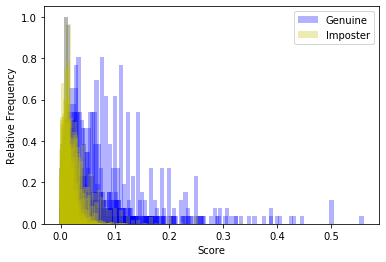

In [7]:
plt.bar(list(genuine_counter.keys()), np.array(list(genuine_counter.values()))/genuine_max,color='b',width=0.008, alpha=0.3, label='Genuine')
plt.bar(list(imposter_counter.keys()), np.array(list(imposter_counter.values()))/imposter_max, color='y',width=0.008, alpha=0.3, label='Imposter')
plt.xlabel('Score') 
plt.ylabel('Relative Frequency')
plt.legend()
plt.savefig('run2 genuine_imposter_hist.png')

In [8]:
df_th=df.copy()
threshold_list=np.round_(np.arange (0.001, 1, 0.002), decimals = 3) 
for th in threshold_list:
    th_str=str(th)
    true_index_list=df_th.Score[df_th.Score>th].index
    df_th['Th='+th_str]=False
    df_th.loc[true_index_list,'Th='+th_str] = True

In [9]:
dict_th={}
dict_eer={}
neg=len(df_th[df_th['Genuine?'] == False])
pos=len(df_th[df_th['Genuine?'] == True])  
graph_fp=[]
graph_tp=[]
graph_far=[]
graph_frr=[]
for th in threshold_list:
    count_fp=0
    count_tp=0
    count_far=0
    count_frr=0
    th_str=str(th)
    genuine_np= np.array(df_th['Genuine?'])
    th_np=np.array(df_th['Th='+th_str])
    
    
    fp=np.logical_and(genuine_np==False,th_np==True)
    unique, counts = np.unique(fp, return_counts=True)
    if True in dict(zip(unique, counts)):
        count_fp=dict(zip(unique, counts))[True]
    else:
        count_fp=0
    
    tp=np.logical_and(genuine_np==True,th_np==True)
    unique, counts = np.unique(tp, return_counts=True)
    if True in dict(zip(unique, counts)):
        count_tp=dict(zip(unique, counts))[True]
    else:
        count_tp=0
    
    far=np.logical_and(genuine_np==False,th_np==True)
    unique, counts = np.unique(far, return_counts=True)
    if True in dict(zip(unique, counts)):
        count_far=dict(zip(unique, counts))[True]
    else:
        count_far=0
    
    frr=np.logical_and(genuine_np==True,th_np==False)
    unique, counts = np.unique(frr, return_counts=True)
    if True in dict(zip(unique, counts)):
        count_frr=dict(zip(unique, counts))[True]
    else:
        count_frr=0
    
    dict_th[th]=[count_fp/neg,count_tp/pos]
    graph_fp.append(dict_th[th][0])
    graph_tp.append(dict_th[th][1])
    dict_eer[th]=[count_far/neg,count_frr/pos]
    graph_far.append(dict_eer[th][0])
    graph_frr.append(dict_eer[th][1])

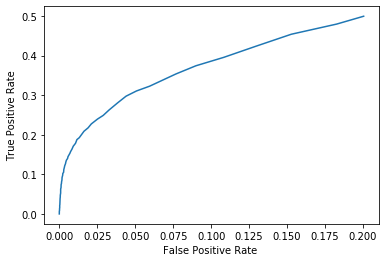

In [10]:
plt.plot(graph_fp, graph_tp) 
plt.xlabel('False Positive Rate ') 
plt.ylabel('True Positive Rate')
plt.savefig('run2 tp_fp.png')

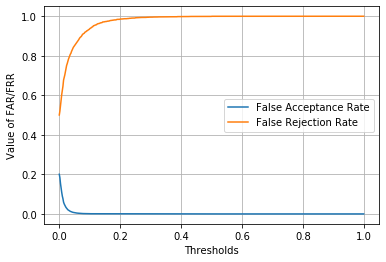

In [11]:
plt.plot(threshold_list, graph_far, label='False Acceptance Rate')
plt.plot(threshold_list, graph_frr, label='False Rejection Rate')
plt.xlabel("Thresholds")
plt.ylabel("Value of FAR/FRR")
plt.legend()
plt.grid()
plt.savefig('run2 eer.png')

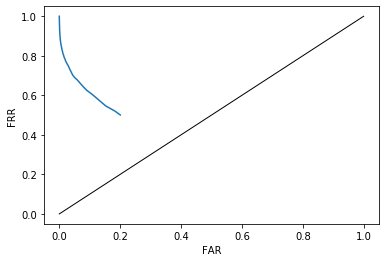

In [12]:
plt.plot(graph_far, graph_frr)
plt.plot([0, 1], [0, 1], color = 'black', linewidth = 1)
plt.xlabel("FAR")
plt.ylabel("FRR")
plt.savefig('run2 roc.png')

In [13]:
df_perf_para= pd.DataFrame(columns = ['Threshold', 'FP Rate', 'TP Rate', 'FAR', 'FRR']) 
for th in threshold_list:
    new_row={'Threshold':th, 'FP Rate':dict_th[th][0], 'TP Rate':dict_th[th][1], 'FAR':dict_eer[th][0], 'FRR':dict_eer[th][1]}
    df_perf_para = df_perf_para.append(new_row, ignore_index = True) 

In [14]:
df_perf_para['Accuracy']=[100-((df_perf_para['FAR'][i]+df_perf_para['FRR'][i])*100)/2 for i in df_perf_para.index]

In [15]:
eer_index=np.argmin(np.abs(np.array(df_perf_para['FAR'])-np.array(df_perf_para['FRR'])))
print('Threshold at Least Differing Error Rate= '+ str(df_perf_para.iloc[eer_index]['Threshold']))
print('Accuracy= '+str(max(df_perf_para['Accuracy']))+'%')

Threshold at Least Differing Error Rate= 0.001
Accuracy= 65.05990853064219%


In [16]:
df_perf_para.to_csv('performance2.csv')

In [17]:
df_perf_para

,Threshold,FP Rate,TP Rate,FAR,FRR,Accuracy
0,0.001,0.200460,0.499478,0.200460,0.500522,64.950915
1,0.003,0.182669,0.479658,0.182669,0.520342,64.849426
2,0.005,0.152797,0.453995,0.152797,0.546005,65.059909
3,0.007,0.129527,0.423743,0.129527,0.576257,64.710798
4,0.009,0.108299,0.395577,0.108299,0.604423,64.363877
5,0.011,0.089958,0.374296,0.089958,0.625704,64.216901
6,0.013,0.076810,0.353641,0.076810,0.646359,63.841540
7,0.015,0.059500,0.322762,0.059500,0.677238,63.163110
8,0.017,0.050821,0.310661,0.050821,0.689339,62.992025
9,0.019,0.043982,0.297517,0.043982,0.702483,62.676760
